In [1]:
#Import required libraries
import os
import math
import numpy as np
import pandas as pd
import seaborn as sns
from math import sqrt
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras import layers
from keras.layers import Activation
from sklearn.model_selection import train_test_split

## This programe is create by Sujit Mandal

""" 
Github: https://github.com/sujitmandal

Pypi : https://pypi.org/user/sujitmandal/

LinkedIn : https://www.linkedin.com/in/sujit-mandal-91215013a/
"""

In [30]:
dailySalesData = pd.read_csv('dataset/data.csv',delimiter=';',index_col='date')
unknownData = pd.read_csv('dataset/unknownData.csv',delimiter=';',index_col='date')

In [31]:
dailySalesData.head()

,year,month,dayofyear,dayOfMonth,dayOfWeek,week,loans
date,,,,,,,
2014-06-01,2014,6,152,1,1,22,3600
2014-06-02,2014,6,153,2,2,22,9700
2014-06-03,2014,6,154,3,3,22,11400
2014-06-04,2014,6,155,4,4,22,9800
2014-06-05,2014,6,156,5,5,22,9400


In [32]:
unknownData.head()

,year,month,dayofyear,dayOfMonth,dayOfWeek,week
date,,,,,,
2018-03-08,2018,3,67,8,5,9
2018-03-09,2018,3,68,9,6,9
2018-03-10,2018,3,69,10,7,9
2018-03-11,2018,3,70,11,1,10
2018-03-12,2018,3,71,12,2,10


In [33]:
actualLoans = np.array(dailySalesData['loans'])
len(actualLoans)

1376

In [34]:
knownDates = dailySalesData.index
len(knownDates)

1376

In [35]:
unknownDates = unknownData.index
len(unknownDates)

299

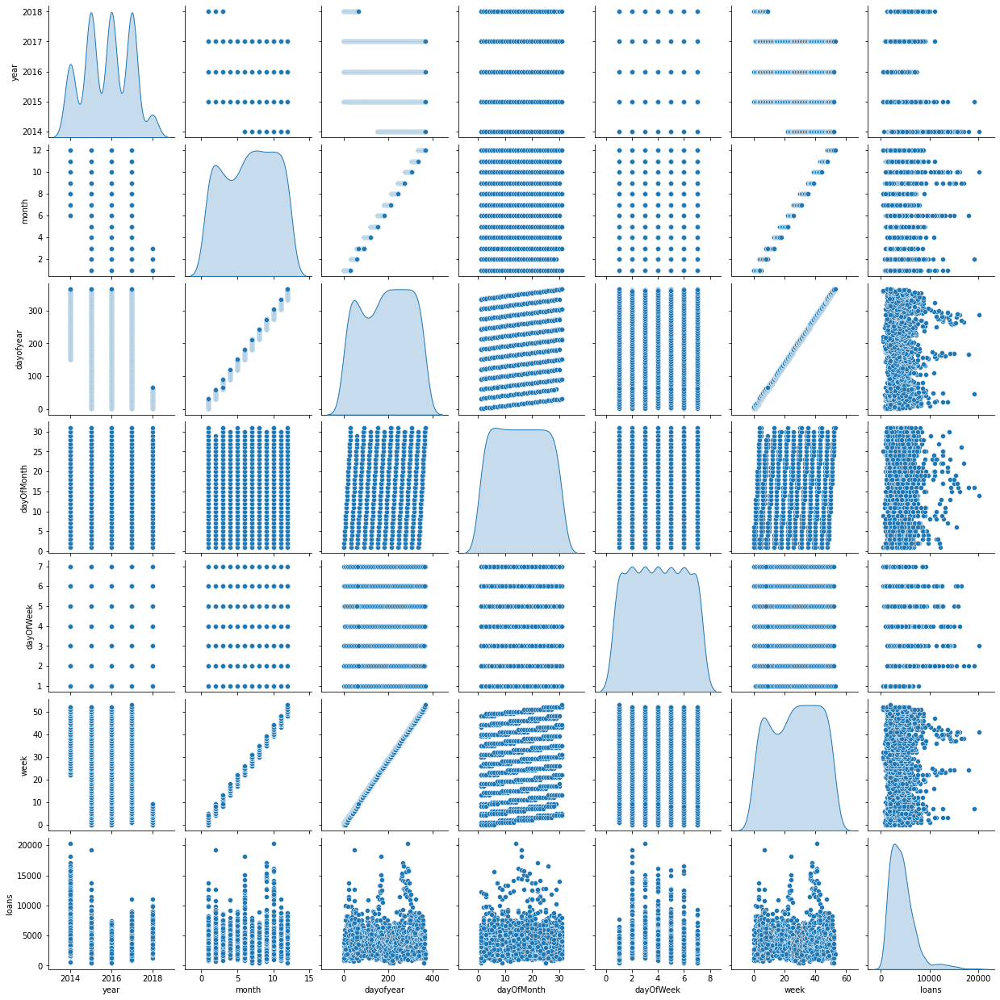

In [36]:
sns.pairplot(dailySalesData[['year','month','dayofyear','dayOfMonth','dayOfWeek','week','loans']], diag_kind='kde')

In [37]:
statistics = dailySalesData.describe()
statistics = statistics.transpose()[['mean','std', 'min']]
print('Overall Statistics of Total Data:')
statistics

Overall Statistics of Total Data:


,mean,std,min
year,2015.784884,1.139801,2014.0
month,6.673692,3.493837,1.0
dayofyear,187.704215,106.839995,1.0
dayOfMonth,15.662791,8.817896,1.0
dayOfWeek,3.995640,2.000359,1.0
week,26.924419,15.274653,0.0
loans,4335.392442,2677.024996,400.0


In [38]:
dataset = dailySalesData.iloc[:,0:6]
labels = dailySalesData.iloc[:,6]

In [39]:
train_dataset , test_dataset , train_labels , test_labels  = train_test_split(dataset, labels, test_size = 0.2, shuffle=True)

In [40]:
print('Train dataset shape :', train_dataset.shape)
print('Train labels dataset shape :', train_labels.shape)
print('Test dataset shape :',test_dataset.shape)
print('Test labels dataset shape :',test_labels.shape)

Train dataset shape : (1100, 6)
Train labels dataset shape : (1100,)
Test dataset shape : (276, 6)
Test labels dataset shape : (276,)


In [41]:
dataset_num_columns= len(dataset.columns)

In [42]:
def build_model():
  model = keras.Sequential([
    layers.Dense(300, activation='relu', input_dim = dataset_num_columns),
    layers.Dropout(0.2),
    layers.Dense(90, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(30, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(10, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(1, activation='linear')
 
  ])

  optimizer = tf.keras.optimizers.RMSprop(0.001)
  model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse'])
    
  return model

model = build_model()

In [43]:
print('Model Sructure:')
model.summary()

Model Sructure:
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 300)               2100      
_________________________________________________________________
dropout_4 (Dropout)          (None, 300)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 90)                27090     
_________________________________________________________________
dropout_5 (Dropout)          (None, 90)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_6 (Dropout)          (None, 30)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 10

In [44]:
EPOCHS = 100000

history = model.fit(train_dataset, train_labels, epochs=EPOCHS, batch_size=200)

Epoch 1/100000
6/6 [==============================] - 1s 6ms/step - loss: 24570514.8571 - mae: 4020.2418 - mse: 24570515.4286
Epoch 2/100000
6/6 [==============================] - 0s 5ms/step - loss: 10438693.0000 - mae: 2315.4556 - mse: 10438693.0000
Epoch 3/100000
6/6 [==============================] - 0s 5ms/step - loss: 9365486.3571 - mae: 2179.6839 - mse: 9365486.3571
Epoch 4/100000
6/6 [==============================] - 0s 6ms/step - loss: 8762692.0714 - mae: 2113.7496 - mse: 8762692.0714
Epoch 5/100000
6/6 [==============================] - 0s 6ms/step - loss: 10048472.0000 - mae: 2288.4897 - mse: 10048472.1429
Epoch 6/100000
6/6 [==============================] - 0s 5ms/step - loss: 8945331.4286 - mae: 2187.2929 - mse: 8945331.4286
Epoch 7/100000
6/6 [==============================] - 0s 6ms/step - loss: 9411932.7143 - mae: 2252.0669 - mse: 9411932.7143
Epoch 8/100000
6/6 [==============================] - 0s 6ms/step - loss: 8465494.3571 - mae: 2132.0296 - mse: 8465494.3571
Ep

6/6 [==============================] - 0s 7ms/step - loss: 8400800.1429 - mae: 2034.2920 - mse: 8400801.0000
Epoch 67/100000
6/6 [==============================] - 0s 7ms/step - loss: 8432251.2143 - mae: 2104.9339 - mse: 8432251.2143
Epoch 68/100000
6/6 [==============================] - 0s 6ms/step - loss: 8214866.7857 - mae: 2053.0075 - mse: 8214866.7857
Epoch 69/100000
6/6 [==============================] - 0s 6ms/step - loss: 8855944.7143 - mae: 2148.2133 - mse: 8855944.7143
Epoch 70/100000
6/6 [==============================] - 0s 4ms/step - loss: 8895492.7143 - mae: 2133.3862 - mse: 8895492.7143
Epoch 71/100000
6/6 [==============================] - 0s 6ms/step - loss: 8146039.2143 - mae: 2070.1044 - mse: 8146039.2143
Epoch 72/100000
6/6 [==============================] - 0s 5ms/step - loss: 8134528.0714 - mae: 2077.5613 - mse: 8134528.0714
Epoch 73/100000
6/6 [==============================] - 0s 6ms/step - loss: 9077906.4286 - mae: 2208.5822 - mse: 9077907.1429
Epoch 74/100000


6/6 [==============================] - 0s 6ms/step - loss: 8036596.0714 - mae: 2045.4361 - mse: 8036596.0714
Epoch 132/100000
6/6 [==============================] - 0s 6ms/step - loss: 8604193.7143 - mae: 2087.9179 - mse: 8604193.7143
Epoch 133/100000
6/6 [==============================] - 0s 6ms/step - loss: 8354638.5000 - mae: 2033.8062 - mse: 8354638.5000
Epoch 134/100000
6/6 [==============================] - 0s 5ms/step - loss: 8811206.7143 - mae: 2137.6748 - mse: 8811206.5714
Epoch 135/100000
6/6 [==============================] - 0s 5ms/step - loss: 8469064.0000 - mae: 2054.1141 - mse: 8469063.2857
Epoch 136/100000
6/6 [==============================] - 0s 5ms/step - loss: 8136388.2143 - mae: 2054.8101 - mse: 8136388.2143
Epoch 137/100000
6/6 [==============================] - 0s 6ms/step - loss: 8184837.7857 - mae: 2082.7266 - mse: 8184837.7143
Epoch 138/100000
6/6 [==============================] - 0s 5ms/step - loss: 8778369.4286 - mae: 2119.0583 - mse: 8778369.4286
Epoch 139

6/6 [==============================] - 0s 5ms/step - loss: 8202473.0000 - mae: 2081.0285 - mse: 8202474.0714
Epoch 197/100000
6/6 [==============================] - 0s 5ms/step - loss: 8848883.3571 - mae: 2107.5136 - mse: 8848883.3571
Epoch 198/100000
6/6 [==============================] - 0s 5ms/step - loss: 8605094.0000 - mae: 2084.3513 - mse: 8605094.7143
Epoch 199/100000
6/6 [==============================] - 0s 5ms/step - loss: 7700231.4286 - mae: 2019.8372 - mse: 7700231.4286
Epoch 200/100000
6/6 [==============================] - 0s 4ms/step - loss: 7904547.5000 - mae: 2027.6623 - mse: 7904547.5000
Epoch 201/100000
6/6 [==============================] - 0s 4ms/step - loss: 8224310.7857 - mae: 2064.6405 - mse: 8224310.7857
Epoch 202/100000
6/6 [==============================] - 0s 4ms/step - loss: 8591902.7143 - mae: 2154.8494 - mse: 8591902.7143
Epoch 203/100000
6/6 [==============================] - 0s 4ms/step - loss: 8910333.2857 - mae: 2073.7136 - mse: 8910333.2857
Epoch 204

6/6 [==============================] - 0s 5ms/step - loss: 8025250.3571 - mae: 2068.7389 - mse: 8025250.3571
Epoch 262/100000
6/6 [==============================] - 0s 5ms/step - loss: 8614095.5714 - mae: 2120.3772 - mse: 8614095.7143
Epoch 263/100000
6/6 [==============================] - 0s 7ms/step - loss: 7793722.6429 - mae: 2023.7574 - mse: 7793722.6429
Epoch 264/100000
6/6 [==============================] - 0s 6ms/step - loss: 9006563.0714 - mae: 2100.1296 - mse: 9006563.0714
Epoch 265/100000
6/6 [==============================] - 0s 6ms/step - loss: 8815570.7857 - mae: 2187.9972 - mse: 8815570.7857
Epoch 266/100000
6/6 [==============================] - 0s 5ms/step - loss: 8484522.0000 - mae: 2075.6172 - mse: 8484522.0000
Epoch 267/100000
6/6 [==============================] - 0s 7ms/step - loss: 8584779.6429 - mae: 2123.4989 - mse: 8584779.6429
Epoch 268/100000
6/6 [==============================] - 0s 5ms/step - loss: 9118444.1429 - mae: 2106.8820 - mse: 9118444.1429
Epoch 269

6/6 [==============================] - 0s 5ms/step - loss: 7042676.6429 - mae: 1913.7825 - mse: 7042676.6429
Epoch 327/100000
6/6 [==============================] - 0s 4ms/step - loss: 8020182.6429 - mae: 2043.3566 - mse: 8020182.6429
Epoch 328/100000
6/6 [==============================] - 0s 4ms/step - loss: 8398060.0714 - mae: 2107.8132 - mse: 8398060.0714
Epoch 329/100000
6/6 [==============================] - 0s 5ms/step - loss: 7962470.8571 - mae: 2018.4741 - mse: 7962470.8571
Epoch 330/100000
6/6 [==============================] - 0s 6ms/step - loss: 8829762.1429 - mae: 2127.9849 - mse: 8829762.4286
Epoch 331/100000
6/6 [==============================] - 0s 6ms/step - loss: 8357440.5000 - mae: 2053.3219 - mse: 8357440.5000
Epoch 332/100000
6/6 [==============================] - 0s 5ms/step - loss: 7889026.1429 - mae: 1998.6986 - mse: 7889026.1429
Epoch 333/100000
6/6 [==============================] - 0s 6ms/step - loss: 8346145.6429 - mae: 2056.1214 - mse: 8346145.6429
Epoch 334

6/6 [==============================] - 0s 5ms/step - loss: 8216370.0714 - mae: 2079.7859 - mse: 8216370.3571
Epoch 392/100000
6/6 [==============================] - 0s 5ms/step - loss: 8605180.2857 - mae: 2113.5947 - mse: 8605180.2857
Epoch 393/100000
6/6 [==============================] - 0s 5ms/step - loss: 7944838.1429 - mae: 2047.7577 - mse: 7944838.1429
Epoch 394/100000
6/6 [==============================] - 0s 4ms/step - loss: 8369624.8571 - mae: 2130.0118 - mse: 8369625.0000
Epoch 395/100000
6/6 [==============================] - 0s 4ms/step - loss: 8061053.4286 - mae: 2068.2429 - mse: 8061053.2857
Epoch 396/100000
6/6 [==============================] - 0s 5ms/step - loss: 8795825.4286 - mae: 2128.7521 - mse: 8795825.4286
Epoch 397/100000
6/6 [==============================] - 0s 9ms/step - loss: 8575058.2857 - mae: 2133.6728 - mse: 8575058.4286
Epoch 398/100000
6/6 [==============================] - 0s 5ms/step - loss: 7928689.8571 - mae: 1985.9705 - mse: 7928690.1429
Epoch 399

6/6 [==============================] - 0s 5ms/step - loss: 8876274.5714 - mae: 2121.5893 - mse: 8876274.5714
Epoch 456/100000
6/6 [==============================] - 0s 5ms/step - loss: 9075024.2857 - mae: 2197.6923 - mse: 9075024.2857
Epoch 457/100000
6/6 [==============================] - 0s 5ms/step - loss: 8542532.5714 - mae: 2080.5033 - mse: 8542532.5714
Epoch 458/100000
6/6 [==============================] - 0s 5ms/step - loss: 8262509.5000 - mae: 2104.4325 - mse: 8262509.5000
Epoch 459/100000
6/6 [==============================] - 0s 5ms/step - loss: 8663144.5714 - mae: 2094.3378 - mse: 8663144.5714
Epoch 460/100000
6/6 [==============================] - 0s 5ms/step - loss: 8091759.2857 - mae: 2048.5337 - mse: 8091759.2857
Epoch 461/100000
6/6 [==============================] - 0s 5ms/step - loss: 8365949.4286 - mae: 2024.9466 - mse: 8365949.4286
Epoch 462/100000
6/6 [==============================] - 0s 4ms/step - loss: 8256198.4286 - mae: 2050.4351 - mse: 8256198.4286
Epoch 463

6/6 [==============================] - 0s 6ms/step - loss: 8441834.4286 - mae: 2139.4035 - mse: 8441834.7143
Epoch 521/100000
6/6 [==============================] - 0s 5ms/step - loss: 8523678.1429 - mae: 2114.1569 - mse: 8523678.0000
Epoch 522/100000
6/6 [==============================] - 0s 5ms/step - loss: 7943444.1429 - mae: 2078.4107 - mse: 7943444.1429
Epoch 523/100000
6/6 [==============================] - 0s 5ms/step - loss: 8455814.1429 - mae: 2065.8616 - mse: 8455814.1429
Epoch 524/100000
6/6 [==============================] - 0s 6ms/step - loss: 7993583.0000 - mae: 2042.1101 - mse: 7993583.0000
Epoch 525/100000
6/6 [==============================] - 0s 5ms/step - loss: 8859362.2143 - mae: 2153.1700 - mse: 8859362.9286
Epoch 526/100000
6/6 [==============================] - 0s 6ms/step - loss: 7537889.3571 - mae: 1998.4887 - mse: 7537888.7143
Epoch 527/100000
6/6 [==============================] - 0s 5ms/step - loss: 8224735.5000 - mae: 2099.1870 - mse: 8224735.5000
Epoch 528

6/6 [==============================] - 0s 4ms/step - loss: 8522601.9286 - mae: 2075.1810 - mse: 8522601.9286
Epoch 586/100000
6/6 [==============================] - 0s 4ms/step - loss: 7780174.5000 - mae: 2000.3020 - mse: 7780174.5000
Epoch 587/100000
6/6 [==============================] - 0s 4ms/step - loss: 8417885.4286 - mae: 2095.2700 - mse: 8417886.0000
Epoch 588/100000
6/6 [==============================] - 0s 5ms/step - loss: 8539947.7143 - mae: 2062.6454 - mse: 8539947.7143
Epoch 589/100000
6/6 [==============================] - 0s 4ms/step - loss: 7569759.0714 - mae: 2027.4892 - mse: 7569759.0714
Epoch 590/100000
6/6 [==============================] - 0s 4ms/step - loss: 8559351.3571 - mae: 2102.2725 - mse: 8559351.3571
Epoch 591/100000
6/6 [==============================] - 0s 4ms/step - loss: 8050789.1429 - mae: 2085.8236 - mse: 8050789.2857
Epoch 592/100000
6/6 [==============================] - 0s 4ms/step - loss: 8170312.8571 - mae: 2066.1197 - mse: 8170312.8571
Epoch 593

6/6 [==============================] - 0s 5ms/step - loss: 7768172.4286 - mae: 2039.7570 - mse: 7768172.4286
Epoch 651/100000
6/6 [==============================] - 0s 6ms/step - loss: 8301137.0714 - mae: 2004.4699 - mse: 8301137.0714
Epoch 652/100000
6/6 [==============================] - 0s 5ms/step - loss: 8229145.9286 - mae: 2062.3413 - mse: 8229145.9286
Epoch 653/100000
6/6 [==============================] - 0s 4ms/step - loss: 8005942.7143 - mae: 2097.6921 - mse: 8005942.7143
Epoch 654/100000
6/6 [==============================] - 0s 5ms/step - loss: 7632016.0000 - mae: 2094.9680 - mse: 7632016.0000
Epoch 655/100000
6/6 [==============================] - 0s 5ms/step - loss: 8621353.3571 - mae: 2111.7376 - mse: 8621353.3571
Epoch 656/100000
6/6 [==============================] - 0s 5ms/step - loss: 8027164.6429 - mae: 2049.7113 - mse: 8027164.6429
Epoch 657/100000
6/6 [==============================] - 0s 4ms/step - loss: 8106476.5000 - mae: 2028.9568 - mse: 8106476.5000
Epoch 658

6/6 [==============================] - 0s 4ms/step - loss: 7866023.9286 - mae: 2013.3594 - mse: 7866024.5714
Epoch 716/100000
6/6 [==============================] - 0s 5ms/step - loss: 8247050.7857 - mae: 2052.8999 - mse: 8247051.0714
Epoch 717/100000
6/6 [==============================] - 0s 4ms/step - loss: 8141241.6429 - mae: 2034.1609 - mse: 8141241.6429
Epoch 718/100000
6/6 [==============================] - 0s 5ms/step - loss: 7972153.2857 - mae: 2023.3030 - mse: 7972152.6429
Epoch 719/100000
6/6 [==============================] - 0s 6ms/step - loss: 8337512.7857 - mae: 2125.3797 - mse: 8337512.7857
Epoch 720/100000
6/6 [==============================] - 0s 6ms/step - loss: 9392234.5714 - mae: 2179.9791 - mse: 9392234.5714
Epoch 721/100000
6/6 [==============================] - 0s 5ms/step - loss: 7916025.5714 - mae: 2037.1470 - mse: 7916025.5714
Epoch 722/100000
6/6 [==============================] - 0s 5ms/step - loss: 8292309.0000 - mae: 2064.4990 - mse: 8292309.0000
Epoch 723

6/6 [==============================] - 0s 5ms/step - loss: 8612015.8571 - mae: 2140.5059 - mse: 8612015.8571
Epoch 781/100000
6/6 [==============================] - 0s 6ms/step - loss: 8410381.7143 - mae: 2065.9187 - mse: 8410380.9286
Epoch 782/100000
6/6 [==============================] - 0s 5ms/step - loss: 8891487.7143 - mae: 2125.0021 - mse: 8891488.2857
Epoch 783/100000
6/6 [==============================] - 0s 5ms/step - loss: 8725652.1429 - mae: 2091.3974 - mse: 8725652.1429
Epoch 784/100000
6/6 [==============================] - 0s 5ms/step - loss: 8788036.1429 - mae: 2091.9654 - mse: 8788035.5714
Epoch 785/100000
6/6 [==============================] - 0s 6ms/step - loss: 8598199.1429 - mae: 2100.7525 - mse: 8598198.2857
Epoch 786/100000
6/6 [==============================] - 0s 5ms/step - loss: 7801684.5714 - mae: 1994.0380 - mse: 7801684.5714
Epoch 787/100000
6/6 [==============================] - 0s 5ms/step - loss: 7950161.7143 - mae: 2026.3027 - mse: 7950161.7143
Epoch 788

6/6 [==============================] - 0s 5ms/step - loss: 8548619.7857 - mae: 2134.0016 - mse: 8548619.2857
Epoch 845/100000
6/6 [==============================] - 0s 6ms/step - loss: 7938058.0714 - mae: 2047.3968 - mse: 7938058.0714
Epoch 846/100000
6/6 [==============================] - 0s 6ms/step - loss: 7478090.9286 - mae: 2031.8959 - mse: 7478090.9286
Epoch 847/100000
6/6 [==============================] - 0s 5ms/step - loss: 7970947.1429 - mae: 2078.4745 - mse: 7970947.1429
Epoch 848/100000
6/6 [==============================] - 0s 5ms/step - loss: 7871556.8571 - mae: 2019.5730 - mse: 7871556.5000
Epoch 849/100000
6/6 [==============================] - 0s 5ms/step - loss: 8681760.3571 - mae: 2135.7940 - mse: 8681760.3571
Epoch 850/100000
6/6 [==============================] - 0s 5ms/step - loss: 8508102.8571 - mae: 2134.5556 - mse: 8508102.8571
Epoch 851/100000
6/6 [==============================] - 0s 5ms/step - loss: 7727511.7857 - mae: 2033.3740 - mse: 7727511.7857
Epoch 852

6/6 [==============================] - 0s 6ms/step - loss: 8571785.1429 - mae: 2091.7190 - mse: 8571785.1429
Epoch 910/100000
6/6 [==============================] - 0s 7ms/step - loss: 8083470.0000 - mae: 2074.8142 - mse: 8083470.0000
Epoch 911/100000
6/6 [==============================] - 0s 6ms/step - loss: 8297259.5714 - mae: 2077.0977 - mse: 8297259.5714
Epoch 912/100000
6/6 [==============================] - 0s 6ms/step - loss: 7832834.7143 - mae: 2043.0675 - mse: 7832834.7143
Epoch 913/100000
6/6 [==============================] - ETA: 0s - loss: 7441851.5000 - mae: 2018.1659 - mse: 7441851.50 - 0s 6ms/step - loss: 8017377.4286 - mae: 2067.8719 - mse: 8017377.4286
Epoch 914/100000
6/6 [==============================] - 0s 8ms/step - loss: 8117560.2857 - mae: 2055.5759 - mse: 8117560.2857
Epoch 915/100000
6/6 [==============================] - 0s 7ms/step - loss: 8392601.4286 - mae: 2106.8348 - mse: 8392601.4286
Epoch 916/100000
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 5ms/step - loss: 8805850.1429 - mae: 2125.8758 - mse: 8805850.1429
Epoch 974/100000
6/6 [==============================] - 0s 5ms/step - loss: 8393874.5000 - mae: 2077.5661 - mse: 8393874.5000
Epoch 975/100000
6/6 [==============================] - 0s 5ms/step - loss: 8343648.5000 - mae: 2103.0902 - mse: 8343648.5000
Epoch 976/100000
6/6 [==============================] - 0s 5ms/step - loss: 7633634.5714 - mae: 1990.0910 - mse: 7633634.5714
Epoch 977/100000
6/6 [==============================] - 0s 5ms/step - loss: 8377958.5714 - mae: 2093.5749 - mse: 8377958.5714
Epoch 978/100000
6/6 [==============================] - 0s 5ms/step - loss: 7605400.6429 - mae: 2008.4080 - mse: 7605400.6429
Epoch 979/100000
6/6 [==============================] - 0s 5ms/step - loss: 8480159.2857 - mae: 2075.5890 - mse: 8480159.2857
Epoch 980/100000
6/6 [==============================] - 0s 5ms/step - loss: 8301692.1429 - mae: 2102.2922 - mse: 8301692.1429
Epoch 981

6/6 [==============================] - 0s 6ms/step - loss: 7807871.0000 - mae: 1999.9603 - mse: 7807871.0000
Epoch 1037/100000
6/6 [==============================] - 0s 5ms/step - loss: 8377824.9286 - mae: 2161.3026 - mse: 8377824.9286
Epoch 1038/100000
6/6 [==============================] - 0s 5ms/step - loss: 7921508.7857 - mae: 2003.7321 - mse: 7921508.7857
Epoch 1039/100000
6/6 [==============================] - 0s 6ms/step - loss: 7846934.4286 - mae: 2040.6411 - mse: 7846934.4286
Epoch 1040/100000
6/6 [==============================] - 0s 6ms/step - loss: 7999222.2143 - mae: 2096.4030 - mse: 7999222.2143
Epoch 1041/100000
6/6 [==============================] - 0s 6ms/step - loss: 7884801.8571 - mae: 2021.8513 - mse: 7884801.8571
Epoch 1042/100000
6/6 [==============================] - 0s 6ms/step - loss: 7944636.0000 - mae: 2062.0571 - mse: 7944636.0000
Epoch 1043/100000
6/6 [==============================] - 0s 5ms/step - loss: 8764607.9286 - mae: 2144.3079 - mse: 8764607.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8013257.9286 - mae: 2052.2232 - mse: 8013258.2857
Epoch 1100/100000
6/6 [==============================] - 0s 6ms/step - loss: 7127001.7143 - mae: 1962.1159 - mse: 7127001.7143
Epoch 1101/100000
6/6 [==============================] - 0s 5ms/step - loss: 7873409.0714 - mae: 2039.5198 - mse: 7873409.0714
Epoch 1102/100000
6/6 [==============================] - 0s 5ms/step - loss: 7700041.5000 - mae: 2020.8423 - mse: 7700041.5000
Epoch 1103/100000
6/6 [==============================] - 0s 5ms/step - loss: 8123152.5714 - mae: 2068.0861 - mse: 8123152.5714
Epoch 1104/100000
6/6 [==============================] - 0s 5ms/step - loss: 8437770.4286 - mae: 2132.4324 - mse: 8437770.4286
Epoch 1105/100000
6/6 [==============================] - 0s 5ms/step - loss: 7997038.5000 - mae: 2025.9697 - mse: 7997038.6429
Epoch 1106/100000
6/6 [==============================] - 0s 5ms/step - loss: 7954561.5000 - mae: 2111.2975 - mse: 7954561.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8088027.7143 - mae: 2071.9950 - mse: 8088027.7143
Epoch 1164/100000
6/6 [==============================] - 0s 5ms/step - loss: 8620593.5714 - mae: 2117.5994 - mse: 8620592.9286
Epoch 1165/100000
6/6 [==============================] - 0s 5ms/step - loss: 8234710.8571 - mae: 2062.7972 - mse: 8234710.8571
Epoch 1166/100000
6/6 [==============================] - 0s 5ms/step - loss: 8378671.7143 - mae: 2085.8174 - mse: 8378672.0714
Epoch 1167/100000
6/6 [==============================] - 0s 5ms/step - loss: 7907159.4286 - mae: 2027.7329 - mse: 7907159.4286
Epoch 1168/100000
6/6 [==============================] - 0s 5ms/step - loss: 7897068.3571 - mae: 1994.2087 - mse: 7897068.3571
Epoch 1169/100000
6/6 [==============================] - 0s 5ms/step - loss: 8171787.8571 - mae: 2069.1188 - mse: 8171787.8571
Epoch 1170/100000
6/6 [==============================] - 0s 5ms/step - loss: 8121981.7857 - mae: 2007.4608 - mse: 8121982.1429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7338129.1429 - mae: 1981.1071 - mse: 7338129.1429
Epoch 1228/100000
6/6 [==============================] - 0s 6ms/step - loss: 7488107.1429 - mae: 1998.1126 - mse: 7488107.1429
Epoch 1229/100000
6/6 [==============================] - 0s 5ms/step - loss: 8372822.2857 - mae: 2118.3423 - mse: 8372822.2857
Epoch 1230/100000
6/6 [==============================] - 0s 5ms/step - loss: 7851150.5000 - mae: 2055.1885 - mse: 7851150.5000
Epoch 1231/100000
6/6 [==============================] - 0s 5ms/step - loss: 8301382.8571 - mae: 2082.5648 - mse: 8301382.8571
Epoch 1232/100000
6/6 [==============================] - 0s 5ms/step - loss: 7708526.5000 - mae: 2033.0199 - mse: 7708526.5000
Epoch 1233/100000
6/6 [==============================] - 0s 5ms/step - loss: 7885722.0000 - mae: 2052.5238 - mse: 7885722.0000
Epoch 1234/100000
6/6 [==============================] - 0s 5ms/step - loss: 8631201.9286 - mae: 2122.6599 - mse: 8631201.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8419286.4286 - mae: 2102.6501 - mse: 8419286.4286
Epoch 1292/100000
6/6 [==============================] - 0s 5ms/step - loss: 8608818.7143 - mae: 2077.4067 - mse: 8608818.2857
Epoch 1293/100000
6/6 [==============================] - 0s 5ms/step - loss: 8096440.9286 - mae: 2042.6031 - mse: 8096440.9286
Epoch 1294/100000
6/6 [==============================] - 0s 5ms/step - loss: 7626796.5714 - mae: 2017.7297 - mse: 7626796.5714
Epoch 1295/100000
6/6 [==============================] - 0s 5ms/step - loss: 8369582.7857 - mae: 2102.5314 - mse: 8369582.7857
Epoch 1296/100000
6/6 [==============================] - 0s 5ms/step - loss: 7874037.1429 - mae: 1999.3534 - mse: 7874037.1429
Epoch 1297/100000
6/6 [==============================] - 0s 5ms/step - loss: 8428335.2143 - mae: 2119.7004 - mse: 8428336.0000
Epoch 1298/100000
6/6 [==============================] - 0s 5ms/step - loss: 8320239.2857 - mae: 2112.5181 - mse: 8320239.2857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8791646.6429 - mae: 2042.8977 - mse: 8791646.6429
Epoch 1356/100000
6/6 [==============================] - 0s 5ms/step - loss: 9092281.1429 - mae: 2161.4112 - mse: 9092281.1429
Epoch 1357/100000
6/6 [==============================] - 0s 5ms/step - loss: 7890677.5000 - mae: 2068.1104 - mse: 7890677.5000
Epoch 1358/100000
6/6 [==============================] - 0s 5ms/step - loss: 7644781.7857 - mae: 2016.7400 - mse: 7644781.7857
Epoch 1359/100000
6/6 [==============================] - 0s 5ms/step - loss: 8896850.7857 - mae: 2104.7482 - mse: 8896850.7857
Epoch 1360/100000
6/6 [==============================] - 0s 5ms/step - loss: 7822706.6429 - mae: 2030.4423 - mse: 7822706.6429
Epoch 1361/100000
6/6 [==============================] - 0s 5ms/step - loss: 8685993.3571 - mae: 2191.0214 - mse: 8685993.5000
Epoch 1362/100000
6/6 [==============================] - 0s 5ms/step - loss: 8040805.5000 - mae: 2071.2486 - mse: 8040805.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7955597.4286 - mae: 1993.5975 - mse: 7955597.4286
Epoch 1420/100000
6/6 [==============================] - 0s 4ms/step - loss: 7663427.9286 - mae: 1990.6325 - mse: 7663427.9286
Epoch 1421/100000
6/6 [==============================] - 0s 4ms/step - loss: 7966213.6429 - mae: 2059.6472 - mse: 7966213.6429
Epoch 1422/100000
6/6 [==============================] - 0s 5ms/step - loss: 8707034.3571 - mae: 2089.2178 - mse: 8707034.3571
Epoch 1423/100000
6/6 [==============================] - 0s 5ms/step - loss: 6906590.7857 - mae: 1924.4745 - mse: 6906590.7857
Epoch 1424/100000
6/6 [==============================] - 0s 5ms/step - loss: 8490347.9286 - mae: 2114.4849 - mse: 8490347.9286
Epoch 1425/100000
6/6 [==============================] - 0s 5ms/step - loss: 8479866.2143 - mae: 2104.0330 - mse: 8479866.2143
Epoch 1426/100000
6/6 [==============================] - 0s 5ms/step - loss: 8061742.0714 - mae: 2079.6371 - mse: 8061742.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8284325.9286 - mae: 2079.7746 - mse: 8284325.9286
Epoch 1484/100000
6/6 [==============================] - 0s 5ms/step - loss: 8059828.1429 - mae: 2068.9833 - mse: 8059828.1429
Epoch 1485/100000
6/6 [==============================] - 0s 5ms/step - loss: 7524454.4286 - mae: 1984.5359 - mse: 7524454.4286
Epoch 1486/100000
6/6 [==============================] - 0s 5ms/step - loss: 7882530.6429 - mae: 2043.3271 - mse: 7882531.0000
Epoch 1487/100000
6/6 [==============================] - 0s 5ms/step - loss: 8125652.1429 - mae: 2066.4622 - mse: 8125652.1429
Epoch 1488/100000
6/6 [==============================] - 0s 5ms/step - loss: 8333653.9286 - mae: 2096.3975 - mse: 8333653.9286
Epoch 1489/100000
6/6 [==============================] - 0s 5ms/step - loss: 8894689.5714 - mae: 2127.6016 - mse: 8894689.5714
Epoch 1490/100000
6/6 [==============================] - 0s 5ms/step - loss: 8195539.5000 - mae: 2027.2518 - mse: 8195539.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8373304.9286 - mae: 2106.7378 - mse: 8373304.9286
Epoch 1548/100000
6/6 [==============================] - 0s 5ms/step - loss: 8295877.8571 - mae: 2080.5791 - mse: 8295877.8571
Epoch 1549/100000
6/6 [==============================] - 0s 5ms/step - loss: 8255736.1429 - mae: 2074.0577 - mse: 8255736.1429
Epoch 1550/100000
6/6 [==============================] - 0s 5ms/step - loss: 7976463.5000 - mae: 2056.4860 - mse: 7976463.4286
Epoch 1551/100000
6/6 [==============================] - 0s 5ms/step - loss: 8631710.8571 - mae: 2079.2809 - mse: 8631710.8571
Epoch 1552/100000
6/6 [==============================] - 0s 5ms/step - loss: 8050886.5714 - mae: 2053.5437 - mse: 8050886.5714
Epoch 1553/100000
6/6 [==============================] - 0s 5ms/step - loss: 7912947.7857 - mae: 2045.6684 - mse: 7912947.7857
Epoch 1554/100000
6/6 [==============================] - 0s 5ms/step - loss: 8517643.3571 - mae: 2095.4959 - mse: 8517643.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8151229.2143 - mae: 2107.7165 - mse: 8151229.2143
Epoch 1612/100000
6/6 [==============================] - 0s 6ms/step - loss: 7710914.0000 - mae: 2014.5119 - mse: 7710914.0000
Epoch 1613/100000
6/6 [==============================] - 0s 6ms/step - loss: 8432638.0714 - mae: 2098.3440 - mse: 8432638.0714
Epoch 1614/100000
6/6 [==============================] - 0s 5ms/step - loss: 8132937.7143 - mae: 2080.5831 - mse: 8132937.7143
Epoch 1615/100000
6/6 [==============================] - 0s 5ms/step - loss: 7690008.5714 - mae: 2002.1021 - mse: 7690008.5714
Epoch 1616/100000
6/6 [==============================] - 0s 5ms/step - loss: 8436298.5714 - mae: 2098.8772 - mse: 8436298.5000
Epoch 1617/100000
6/6 [==============================] - 0s 5ms/step - loss: 7981053.6429 - mae: 2068.8403 - mse: 7981053.6429
Epoch 1618/100000
6/6 [==============================] - 0s 5ms/step - loss: 8356242.7857 - mae: 2074.8264 - mse: 8356242.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7619853.1429 - mae: 2023.6292 - mse: 7619853.1429
Epoch 1676/100000
6/6 [==============================] - 0s 5ms/step - loss: 8607066.2857 - mae: 2122.9530 - mse: 8607066.2857
Epoch 1677/100000
6/6 [==============================] - 0s 5ms/step - loss: 8169030.7857 - mae: 2084.7857 - mse: 8169030.5714
Epoch 1678/100000
6/6 [==============================] - 0s 5ms/step - loss: 7529688.7143 - mae: 1984.6757 - mse: 7529688.7143
Epoch 1679/100000
6/6 [==============================] - 0s 5ms/step - loss: 8323782.8571 - mae: 2080.1160 - mse: 8323782.8571
Epoch 1680/100000
6/6 [==============================] - 0s 5ms/step - loss: 8166205.6429 - mae: 2083.6318 - mse: 8166205.6429
Epoch 1681/100000
6/6 [==============================] - 0s 5ms/step - loss: 7918380.9286 - mae: 2047.0721 - mse: 7918380.9286
Epoch 1682/100000
6/6 [==============================] - 0s 5ms/step - loss: 8170231.2143 - mae: 2091.0753 - mse: 8170231.2857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8594765.7143 - mae: 2124.9933 - mse: 8594765.7143
Epoch 1740/100000
6/6 [==============================] - 0s 5ms/step - loss: 8375361.6429 - mae: 2080.3513 - mse: 8375361.6429
Epoch 1741/100000
6/6 [==============================] - 0s 5ms/step - loss: 8893282.3571 - mae: 2206.9551 - mse: 8893282.9286
Epoch 1742/100000
6/6 [==============================] - 0s 5ms/step - loss: 8310214.5714 - mae: 2094.2795 - mse: 8310215.1429
Epoch 1743/100000
6/6 [==============================] - 0s 4ms/step - loss: 7996324.0000 - mae: 2036.6889 - mse: 7996324.2857
Epoch 1744/100000
6/6 [==============================] - 0s 4ms/step - loss: 7799094.1429 - mae: 2047.8530 - mse: 7799094.1429
Epoch 1745/100000
6/6 [==============================] - 0s 5ms/step - loss: 7895833.4286 - mae: 2069.9618 - mse: 7895833.6429
Epoch 1746/100000
6/6 [==============================] - 0s 5ms/step - loss: 8078305.5714 - mae: 2056.8752 - mse: 8078305.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7797515.7857 - mae: 1996.6571 - mse: 7797515.7857
Epoch 1804/100000
6/6 [==============================] - 0s 5ms/step - loss: 8202901.0000 - mae: 2079.5030 - mse: 8202900.6429
Epoch 1805/100000
6/6 [==============================] - 0s 5ms/step - loss: 8319166.9286 - mae: 2110.2032 - mse: 8319167.0000
Epoch 1806/100000
6/6 [==============================] - 0s 5ms/step - loss: 7154075.2143 - mae: 1971.3442 - mse: 7154075.2143
Epoch 1807/100000
6/6 [==============================] - 0s 5ms/step - loss: 8224688.8571 - mae: 2073.5089 - mse: 8224688.8571
Epoch 1808/100000
6/6 [==============================] - 0s 5ms/step - loss: 7365854.0000 - mae: 1947.1742 - mse: 7365854.0000
Epoch 1809/100000
6/6 [==============================] - 0s 5ms/step - loss: 8108790.1429 - mae: 2050.1201 - mse: 8108790.1429
Epoch 1810/100000
6/6 [==============================] - 0s 5ms/step - loss: 8008790.2857 - mae: 2035.0024 - mse: 8008790.2857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8171175.9286 - mae: 2004.9775 - mse: 8171175.9286
Epoch 1868/100000
6/6 [==============================] - 0s 5ms/step - loss: 8218070.4286 - mae: 2116.7674 - mse: 8218070.4286
Epoch 1869/100000
6/6 [==============================] - 0s 5ms/step - loss: 8590800.4286 - mae: 2109.4824 - mse: 8590800.4286
Epoch 1870/100000
6/6 [==============================] - 0s 5ms/step - loss: 8004433.5000 - mae: 2059.2794 - mse: 8004433.5000
Epoch 1871/100000
6/6 [==============================] - 0s 5ms/step - loss: 7111547.7143 - mae: 1937.1372 - mse: 7111548.0000
Epoch 1872/100000
6/6 [==============================] - 0s 5ms/step - loss: 7562343.5714 - mae: 2011.8041 - mse: 7562343.5714
Epoch 1873/100000
6/6 [==============================] - 0s 4ms/step - loss: 8000959.2857 - mae: 2067.0860 - mse: 8000959.2857
Epoch 1874/100000
6/6 [==============================] - 0s 4ms/step - loss: 8781658.5000 - mae: 2171.7252 - mse: 8781658.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8806754.2143 - mae: 2180.5574 - mse: 8806754.2143
Epoch 1932/100000
6/6 [==============================] - 0s 5ms/step - loss: 8542070.2857 - mae: 2094.0375 - mse: 8542070.2857
Epoch 1933/100000
6/6 [==============================] - 0s 5ms/step - loss: 7750631.7143 - mae: 2066.3566 - mse: 7750631.7143
Epoch 1934/100000
6/6 [==============================] - 0s 5ms/step - loss: 8471297.9286 - mae: 2051.2660 - mse: 8471297.9286
Epoch 1935/100000
6/6 [==============================] - 0s 5ms/step - loss: 7896979.1429 - mae: 2095.1875 - mse: 7896979.2143
Epoch 1936/100000
6/6 [==============================] - 0s 4ms/step - loss: 7548658.8571 - mae: 2029.1665 - mse: 7548658.8571
Epoch 1937/100000
6/6 [==============================] - 0s 5ms/step - loss: 7893650.1429 - mae: 2043.4413 - mse: 7893650.1429
Epoch 1938/100000
6/6 [==============================] - 0s 5ms/step - loss: 8284042.3571 - mae: 2055.9121 - mse: 8284042.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7606891.0000 - mae: 2036.4419 - mse: 7606890.7143
Epoch 1996/100000
6/6 [==============================] - 0s 5ms/step - loss: 7954703.4286 - mae: 2035.4613 - mse: 7954703.4286
Epoch 1997/100000
6/6 [==============================] - 0s 5ms/step - loss: 8520263.7857 - mae: 2102.2338 - mse: 8520263.7857
Epoch 1998/100000
6/6 [==============================] - 0s 4ms/step - loss: 8136152.6429 - mae: 2062.4322 - mse: 8136152.6429
Epoch 1999/100000
6/6 [==============================] - 0s 5ms/step - loss: 8042415.9286 - mae: 2041.5194 - mse: 8042415.9286
Epoch 2000/100000
6/6 [==============================] - 0s 5ms/step - loss: 8714210.2857 - mae: 2134.1426 - mse: 8714210.1429
Epoch 2001/100000
6/6 [==============================] - 0s 5ms/step - loss: 7707743.0714 - mae: 2024.0007 - mse: 7707743.0714
Epoch 2002/100000
6/6 [==============================] - 0s 5ms/step - loss: 8189903.0714 - mae: 2031.2482 - mse: 8189903.7857
Ep

6/6 [==============================] - 0s 6ms/step - loss: 8556020.7857 - mae: 2064.7079 - mse: 8556020.7857
Epoch 2060/100000
6/6 [==============================] - 0s 5ms/step - loss: 8105665.2857 - mae: 2053.6697 - mse: 8105665.2857
Epoch 2061/100000
6/6 [==============================] - 0s 5ms/step - loss: 8051300.6429 - mae: 2064.1281 - mse: 8051300.6429
Epoch 2062/100000
6/6 [==============================] - 0s 5ms/step - loss: 8671668.7857 - mae: 2179.0648 - mse: 8671668.7857
Epoch 2063/100000
6/6 [==============================] - ETA: 0s - loss: 7996154.0000 - mae: 2109.9875 - mse: 7996154.00 - 0s 5ms/step - loss: 8539953.7857 - mae: 2134.9818 - mse: 8539954.0714
Epoch 2064/100000
6/6 [==============================] - 0s 5ms/step - loss: 8334958.2143 - mae: 2140.8775 - mse: 8334958.2143
Epoch 2065/100000
6/6 [==============================] - 0s 5ms/step - loss: 8169491.6429 - mae: 2032.4379 - mse: 8169491.6429
Epoch 2066/100000
6/6 [==============================] - 0s 5ms

6/6 [==============================] - 0s 5ms/step - loss: 8725543.8571 - mae: 2145.1178 - mse: 8725543.8571
Epoch 2124/100000
6/6 [==============================] - 0s 5ms/step - loss: 7648827.4286 - mae: 2020.7627 - mse: 7648827.4286
Epoch 2125/100000
6/6 [==============================] - 0s 5ms/step - loss: 8845850.5714 - mae: 2104.1102 - mse: 8845850.5714
Epoch 2126/100000
6/6 [==============================] - 0s 5ms/step - loss: 8228340.8571 - mae: 2096.4464 - mse: 8228340.8571
Epoch 2127/100000
6/6 [==============================] - 0s 5ms/step - loss: 8333868.0000 - mae: 2113.1667 - mse: 8333868.0000
Epoch 2128/100000
6/6 [==============================] - 0s 5ms/step - loss: 8117974.3571 - mae: 2004.8314 - mse: 8117974.2857
Epoch 2129/100000
6/6 [==============================] - 0s 5ms/step - loss: 7988464.4286 - mae: 2060.5481 - mse: 7988464.4286
Epoch 2130/100000
6/6 [==============================] - 0s 5ms/step - loss: 7461001.0000 - mae: 1966.9950 - mse: 7461001.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7453096.2857 - mae: 2019.0877 - mse: 7453096.2857
Epoch 2188/100000
6/6 [==============================] - 0s 5ms/step - loss: 8512986.7143 - mae: 2153.0539 - mse: 8512986.7143
Epoch 2189/100000
6/6 [==============================] - 0s 5ms/step - loss: 8401026.0000 - mae: 2127.0828 - mse: 8401026.0000
Epoch 2190/100000
6/6 [==============================] - 0s 5ms/step - loss: 8377229.7143 - mae: 2092.8020 - mse: 8377229.0000
Epoch 2191/100000
6/6 [==============================] - 0s 5ms/step - loss: 7793373.5714 - mae: 2021.3568 - mse: 7793373.5714
Epoch 2192/100000
6/6 [==============================] - 0s 5ms/step - loss: 7761489.7143 - mae: 2070.9586 - mse: 7761489.7143
Epoch 2193/100000
6/6 [==============================] - 0s 5ms/step - loss: 7604848.1429 - mae: 1988.7050 - mse: 7604848.1429
Epoch 2194/100000
6/6 [==============================] - 0s 5ms/step - loss: 8043617.6429 - mae: 2056.6203 - mse: 8043617.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7875033.9286 - mae: 2048.3568 - mse: 7875033.8571
Epoch 2252/100000
6/6 [==============================] - 0s 5ms/step - loss: 7936656.2143 - mae: 2056.4464 - mse: 7936656.2143
Epoch 2253/100000
6/6 [==============================] - 0s 5ms/step - loss: 7744891.9286 - mae: 2020.8177 - mse: 7744891.9286
Epoch 2254/100000
6/6 [==============================] - 0s 5ms/step - loss: 8338718.0000 - mae: 2144.5760 - mse: 8338717.2143
Epoch 2255/100000
6/6 [==============================] - 0s 5ms/step - loss: 8315780.0714 - mae: 2065.6652 - mse: 8315780.0714
Epoch 2256/100000
6/6 [==============================] - 0s 5ms/step - loss: 7984570.3571 - mae: 2048.9268 - mse: 7984569.6429
Epoch 2257/100000
6/6 [==============================] - 0s 5ms/step - loss: 8245376.0714 - mae: 2083.1944 - mse: 8245376.0714
Epoch 2258/100000
6/6 [==============================] - 0s 5ms/step - loss: 8396557.6429 - mae: 2125.5172 - mse: 8396557.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8260975.7857 - mae: 2044.8302 - mse: 8260975.7857
Epoch 2316/100000
6/6 [==============================] - 0s 5ms/step - loss: 8677873.5714 - mae: 2152.0783 - mse: 8677873.5714
Epoch 2317/100000
6/6 [==============================] - 0s 5ms/step - loss: 8155419.1429 - mae: 2023.9516 - mse: 8155419.1429
Epoch 2318/100000
6/6 [==============================] - 0s 5ms/step - loss: 8309442.3571 - mae: 2101.0776 - mse: 8309442.3571
Epoch 2319/100000
6/6 [==============================] - 0s 5ms/step - loss: 8339766.0000 - mae: 2093.0883 - mse: 8339766.0000
Epoch 2320/100000
6/6 [==============================] - 0s 5ms/step - loss: 8260399.2143 - mae: 2087.7444 - mse: 8260399.2143
Epoch 2321/100000
6/6 [==============================] - 0s 5ms/step - loss: 8503248.7143 - mae: 2086.1067 - mse: 8503249.1429
Epoch 2322/100000
6/6 [==============================] - 0s 5ms/step - loss: 8149005.7857 - mae: 2064.9840 - mse: 8149005.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7832884.1429 - mae: 2040.5589 - mse: 7832884.1429
Epoch 2380/100000
6/6 [==============================] - 0s 5ms/step - loss: 8421638.0000 - mae: 2102.3232 - mse: 8421638.0000
Epoch 2381/100000
6/6 [==============================] - 0s 4ms/step - loss: 7733596.7857 - mae: 2015.3631 - mse: 7733596.7857
Epoch 2382/100000
6/6 [==============================] - 0s 5ms/step - loss: 7875434.4286 - mae: 2018.0680 - mse: 7875434.4286
Epoch 2383/100000
6/6 [==============================] - 0s 5ms/step - loss: 7988837.6429 - mae: 2053.0674 - mse: 7988837.6429
Epoch 2384/100000
6/6 [==============================] - 0s 5ms/step - loss: 7710714.2857 - mae: 2006.3469 - mse: 7710714.2857
Epoch 2385/100000
6/6 [==============================] - 0s 5ms/step - loss: 8324578.6429 - mae: 2075.6348 - mse: 8324578.6429
Epoch 2386/100000
6/6 [==============================] - 0s 5ms/step - loss: 8023956.3571 - mae: 2107.6771 - mse: 8023956.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8687570.2143 - mae: 2089.5484 - mse: 8687570.2143
Epoch 2444/100000
6/6 [==============================] - 0s 5ms/step - loss: 8666761.2857 - mae: 2146.6291 - mse: 8666761.2857
Epoch 2445/100000
6/6 [==============================] - 0s 5ms/step - loss: 8126433.3571 - mae: 2081.6501 - mse: 8126433.3571
Epoch 2446/100000
6/6 [==============================] - 0s 5ms/step - loss: 7994503.0000 - mae: 2024.2236 - mse: 7994503.0000
Epoch 2447/100000
6/6 [==============================] - 0s 5ms/step - loss: 8521726.4286 - mae: 2170.6082 - mse: 8521726.4286
Epoch 2448/100000
6/6 [==============================] - 0s 5ms/step - loss: 7768353.0714 - mae: 1982.9343 - mse: 7768353.0714
Epoch 2449/100000
6/6 [==============================] - 0s 5ms/step - loss: 7872550.9286 - mae: 2081.7287 - mse: 7872550.9286
Epoch 2450/100000
6/6 [==============================] - 0s 5ms/step - loss: 8015906.9286 - mae: 2056.7354 - mse: 8015906.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7841042.5000 - mae: 2008.7514 - mse: 7841042.5000
Epoch 2508/100000
6/6 [==============================] - 0s 5ms/step - loss: 8073457.3571 - mae: 2122.2156 - mse: 8073457.2857
Epoch 2509/100000
6/6 [==============================] - 0s 5ms/step - loss: 8362651.5000 - mae: 2085.2354 - mse: 8362651.5000
Epoch 2510/100000
6/6 [==============================] - 0s 5ms/step - loss: 8166437.7857 - mae: 2043.6340 - mse: 8166437.2143
Epoch 2511/100000
6/6 [==============================] - 0s 5ms/step - loss: 8029823.0000 - mae: 2054.3406 - mse: 8029823.0000
Epoch 2512/100000
6/6 [==============================] - 0s 5ms/step - loss: 8217677.5000 - mae: 2044.4577 - mse: 8217676.8571
Epoch 2513/100000
6/6 [==============================] - 0s 5ms/step - loss: 7548698.2857 - mae: 2045.8486 - mse: 7548697.9286
Epoch 2514/100000
6/6 [==============================] - 0s 5ms/step - loss: 8232198.0714 - mae: 2081.5096 - mse: 8232198.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8166187.0714 - mae: 2078.3209 - mse: 8166187.0714
Epoch 2572/100000
6/6 [==============================] - 0s 5ms/step - loss: 7753893.5714 - mae: 2054.3131 - mse: 7753893.5714
Epoch 2573/100000
6/6 [==============================] - 0s 5ms/step - loss: 8187685.1429 - mae: 2161.9788 - mse: 8187685.1429
Epoch 2574/100000
6/6 [==============================] - 0s 5ms/step - loss: 8584247.7143 - mae: 2121.2476 - mse: 8584247.7143
Epoch 2575/100000
6/6 [==============================] - 0s 5ms/step - loss: 8050254.6429 - mae: 2063.9828 - mse: 8050254.2857
Epoch 2576/100000
6/6 [==============================] - 0s 5ms/step - loss: 7626274.8571 - mae: 1993.0743 - mse: 7626274.8571
Epoch 2577/100000
6/6 [==============================] - 0s 5ms/step - loss: 7638116.3571 - mae: 2020.5680 - mse: 7638116.3571
Epoch 2578/100000
6/6 [==============================] - 0s 5ms/step - loss: 8248992.9286 - mae: 2077.1710 - mse: 8248992.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8840975.3571 - mae: 2112.3986 - mse: 8840975.3571
Epoch 2636/100000
6/6 [==============================] - 0s 5ms/step - loss: 7967568.2857 - mae: 2063.4085 - mse: 7967568.2857
Epoch 2637/100000
6/6 [==============================] - 0s 5ms/step - loss: 8491175.6429 - mae: 2119.7517 - mse: 8491175.6429
Epoch 2638/100000
6/6 [==============================] - 0s 5ms/step - loss: 7667834.0714 - mae: 2021.2896 - mse: 7667834.0714
Epoch 2639/100000
6/6 [==============================] - 0s 5ms/step - loss: 8099965.6429 - mae: 2045.2335 - mse: 8099965.6429
Epoch 2640/100000
6/6 [==============================] - 0s 5ms/step - loss: 8637722.9286 - mae: 2103.2230 - mse: 8637723.0714
Epoch 2641/100000
6/6 [==============================] - 0s 5ms/step - loss: 7628831.2857 - mae: 2019.8112 - mse: 7628831.2857
Epoch 2642/100000
6/6 [==============================] - 0s 5ms/step - loss: 7798543.0714 - mae: 2048.5111 - mse: 7798543.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8161858.3571 - mae: 2046.8915 - mse: 8161858.3571
Epoch 2700/100000
6/6 [==============================] - 0s 5ms/step - loss: 7507395.9286 - mae: 1973.9497 - mse: 7507395.9286
Epoch 2701/100000
6/6 [==============================] - 0s 6ms/step - loss: 7575262.8571 - mae: 2021.6399 - mse: 7575262.8571
Epoch 2702/100000
6/6 [==============================] - 0s 5ms/step - loss: 8576197.0714 - mae: 2068.0891 - mse: 8576197.0714
Epoch 2703/100000
6/6 [==============================] - 0s 5ms/step - loss: 8685746.7857 - mae: 2080.9363 - mse: 8685746.7857
Epoch 2704/100000
6/6 [==============================] - 0s 5ms/step - loss: 7744765.2143 - mae: 2018.0375 - mse: 7744766.0000
Epoch 2705/100000
6/6 [==============================] - 0s 5ms/step - loss: 8311042.7143 - mae: 2078.0554 - mse: 8311042.7143
Epoch 2706/100000
6/6 [==============================] - 0s 5ms/step - loss: 7901257.1429 - mae: 2031.9825 - mse: 7901257.1429
Ep

6/6 [==============================] - 0s 4ms/step - loss: 8034609.3571 - mae: 2088.6709 - mse: 8034609.3571
Epoch 2764/100000
6/6 [==============================] - 0s 5ms/step - loss: 8261145.8571 - mae: 2089.3158 - mse: 8261145.8571
Epoch 2765/100000
6/6 [==============================] - 0s 5ms/step - loss: 8160188.0714 - mae: 2056.5116 - mse: 8160188.0714
Epoch 2766/100000
6/6 [==============================] - 0s 5ms/step - loss: 7871566.1429 - mae: 2060.5488 - mse: 7871566.1429
Epoch 2767/100000
6/6 [==============================] - 0s 5ms/step - loss: 7890641.1429 - mae: 2020.1986 - mse: 7890641.1429
Epoch 2768/100000
6/6 [==============================] - 0s 5ms/step - loss: 8249123.5000 - mae: 2046.4343 - mse: 8249123.5000
Epoch 2769/100000
6/6 [==============================] - 0s 5ms/step - loss: 8607749.0714 - mae: 2140.7075 - mse: 8607749.0714
Epoch 2770/100000
6/6 [==============================] - 0s 5ms/step - loss: 7486982.8571 - mae: 2014.8003 - mse: 7486982.8571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7755019.0000 - mae: 2020.9420 - mse: 7755018.9286
Epoch 2828/100000
6/6 [==============================] - 0s 5ms/step - loss: 7855061.0714 - mae: 2009.9226 - mse: 7855061.0714
Epoch 2829/100000
6/6 [==============================] - 0s 5ms/step - loss: 8099267.5000 - mae: 2078.4173 - mse: 8099267.5000
Epoch 2830/100000
6/6 [==============================] - 0s 5ms/step - loss: 7487959.7857 - mae: 1968.2004 - mse: 7487959.7857
Epoch 2831/100000
6/6 [==============================] - 0s 5ms/step - loss: 8012555.1429 - mae: 2058.6277 - mse: 8012555.0000
Epoch 2832/100000
6/6 [==============================] - 0s 5ms/step - loss: 7209900.4286 - mae: 1960.1809 - mse: 7209900.4286
Epoch 2833/100000
6/6 [==============================] - 0s 5ms/step - loss: 8284664.3571 - mae: 2127.0364 - mse: 8284664.5000
Epoch 2834/100000
6/6 [==============================] - 0s 5ms/step - loss: 8653185.7143 - mae: 2151.2666 - mse: 8653185.7143
Ep

6/6 [==============================] - 0s 6ms/step - loss: 8140392.9286 - mae: 2086.5617 - mse: 8140392.9286
Epoch 2892/100000
6/6 [==============================] - 0s 6ms/step - loss: 9037390.4286 - mae: 2193.6482 - mse: 9037390.4286
Epoch 2893/100000
6/6 [==============================] - 0s 5ms/step - loss: 8275090.5000 - mae: 2040.2362 - mse: 8275090.3571
Epoch 2894/100000
6/6 [==============================] - 0s 5ms/step - loss: 9323421.5714 - mae: 2176.0061 - mse: 9323421.5714
Epoch 2895/100000
6/6 [==============================] - 0s 5ms/step - loss: 8175327.2143 - mae: 2076.6179 - mse: 8175327.2143
Epoch 2896/100000
6/6 [==============================] - 0s 5ms/step - loss: 7927036.7143 - mae: 1996.7588 - mse: 7927036.5714
Epoch 2897/100000
6/6 [==============================] - 0s 5ms/step - loss: 7888403.2857 - mae: 2066.8551 - mse: 7888403.2857
Epoch 2898/100000
6/6 [==============================] - 0s 6ms/step - loss: 7848857.4286 - mae: 2064.1927 - mse: 7848857.3571
Ep

6/6 [==============================] - 0s 6ms/step - loss: 8607022.5000 - mae: 2117.8740 - mse: 8607022.5000
Epoch 2956/100000
6/6 [==============================] - 0s 5ms/step - loss: 8141148.2143 - mae: 2066.3462 - mse: 8141148.2143
Epoch 2957/100000
6/6 [==============================] - 0s 5ms/step - loss: 7526444.0000 - mae: 1997.5805 - mse: 7526444.0000
Epoch 2958/100000
6/6 [==============================] - 0s 6ms/step - loss: 7610381.1429 - mae: 1992.3984 - mse: 7610381.1429
Epoch 2959/100000
6/6 [==============================] - 0s 5ms/step - loss: 8479714.2143 - mae: 2072.2066 - mse: 8479714.2143
Epoch 2960/100000
6/6 [==============================] - 0s 6ms/step - loss: 7411572.7857 - mae: 2020.6713 - mse: 7411572.7857
Epoch 2961/100000
6/6 [==============================] - 0s 6ms/step - loss: 7667328.9286 - mae: 2008.9087 - mse: 7667328.9286
Epoch 2962/100000
6/6 [==============================] - 0s 6ms/step - loss: 8315806.9286 - mae: 2063.6565 - mse: 8315806.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8839801.7143 - mae: 2125.8598 - mse: 8839801.7143
Epoch 3020/100000
6/6 [==============================] - 0s 5ms/step - loss: 8214971.7857 - mae: 2050.5589 - mse: 8214971.7857
Epoch 3021/100000
6/6 [==============================] - 0s 5ms/step - loss: 8135941.2143 - mae: 2107.7797 - mse: 8135941.2143
Epoch 3022/100000
6/6 [==============================] - 0s 5ms/step - loss: 8265757.3571 - mae: 2106.7114 - mse: 8265757.3571
Epoch 3023/100000
6/6 [==============================] - 0s 6ms/step - loss: 7927997.7143 - mae: 2012.4767 - mse: 7927997.7143
Epoch 3024/100000
6/6 [==============================] - 0s 6ms/step - loss: 8233963.6429 - mae: 2027.6119 - mse: 8233963.6429
Epoch 3025/100000
6/6 [==============================] - 0s 5ms/step - loss: 8426440.1429 - mae: 2072.2473 - mse: 8426440.1429
Epoch 3026/100000
6/6 [==============================] - 0s 5ms/step - loss: 7577734.5000 - mae: 2004.6727 - mse: 7577734.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8310052.0714 - mae: 2072.2821 - mse: 8310052.0714
Epoch 3084/100000
6/6 [==============================] - 0s 6ms/step - loss: 7933015.8571 - mae: 2043.9618 - mse: 7933015.8571
Epoch 3085/100000
6/6 [==============================] - 0s 6ms/step - loss: 7917498.7143 - mae: 2030.2508 - mse: 7917498.7143
Epoch 3086/100000
6/6 [==============================] - 0s 5ms/step - loss: 8075486.3571 - mae: 2064.6672 - mse: 8075486.3571
Epoch 3087/100000
6/6 [==============================] - 0s 5ms/step - loss: 8579713.6429 - mae: 2097.1044 - mse: 8579713.6429
Epoch 3088/100000
6/6 [==============================] - 0s 5ms/step - loss: 7992497.0714 - mae: 2047.5073 - mse: 7992497.0714
Epoch 3089/100000
6/6 [==============================] - 0s 5ms/step - loss: 8395373.5000 - mae: 2112.4765 - mse: 8395373.5714
Epoch 3090/100000
6/6 [==============================] - 0s 5ms/step - loss: 8458711.7143 - mae: 2090.4850 - mse: 8458711.7143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8684495.0000 - mae: 2132.2472 - mse: 8684495.0000
Epoch 3148/100000
6/6 [==============================] - 0s 6ms/step - loss: 8341619.4286 - mae: 2030.3514 - mse: 8341619.0714
Epoch 3149/100000
6/6 [==============================] - 0s 5ms/step - loss: 8365447.7857 - mae: 2128.5031 - mse: 8365447.7857
Epoch 3150/100000
6/6 [==============================] - 0s 11ms/step - loss: 8251450.0714 - mae: 2066.1395 - mse: 8251450.0714
Epoch 3151/100000
6/6 [==============================] - 0s 5ms/step - loss: 8083309.9286 - mae: 2058.2276 - mse: 8083309.9286
Epoch 3152/100000
6/6 [==============================] - 0s 5ms/step - loss: 7737441.1429 - mae: 2039.2486 - mse: 7737441.1429
Epoch 3153/100000
6/6 [==============================] - 0s 5ms/step - loss: 8238998.8571 - mae: 2085.6054 - mse: 8238999.3571
Epoch 3154/100000
6/6 [==============================] - 0s 5ms/step - loss: 8008193.0714 - mae: 2035.1264 - mse: 8008193.2143
E

6/6 [==============================] - 0s 5ms/step - loss: 8128647.0714 - mae: 1978.8534 - mse: 8128647.0714
Epoch 3212/100000
6/6 [==============================] - 0s 5ms/step - loss: 8048749.3571 - mae: 2043.9945 - mse: 8048749.3571
Epoch 3213/100000
6/6 [==============================] - 0s 5ms/step - loss: 8289988.5714 - mae: 2082.3748 - mse: 8289988.5714
Epoch 3214/100000
6/6 [==============================] - 0s 6ms/step - loss: 8407454.2143 - mae: 2090.9397 - mse: 8407454.2143
Epoch 3215/100000
6/6 [==============================] - 0s 5ms/step - loss: 7718833.6429 - mae: 2012.7581 - mse: 7718833.6429
Epoch 3216/100000
6/6 [==============================] - 0s 6ms/step - loss: 8183432.1429 - mae: 2019.4391 - mse: 8183432.1429
Epoch 3217/100000
6/6 [==============================] - 0s 6ms/step - loss: 7683876.5714 - mae: 2018.9450 - mse: 7683876.5714
Epoch 3218/100000
6/6 [==============================] - 0s 6ms/step - loss: 7507238.9286 - mae: 2008.3776 - mse: 7507238.8571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8167601.2143 - mae: 2060.8415 - mse: 8167601.2143
Epoch 3276/100000
6/6 [==============================] - 0s 5ms/step - loss: 8423423.0714 - mae: 2076.5925 - mse: 8423423.0714
Epoch 3277/100000
6/6 [==============================] - 0s 6ms/step - loss: 7491478.3571 - mae: 1991.6436 - mse: 7491478.3571
Epoch 3278/100000
6/6 [==============================] - 0s 5ms/step - loss: 8088247.8571 - mae: 2015.3678 - mse: 8088247.8571
Epoch 3279/100000
6/6 [==============================] - 0s 6ms/step - loss: 8486362.8571 - mae: 2157.6209 - mse: 8486362.8571
Epoch 3280/100000
6/6 [==============================] - 0s 5ms/step - loss: 8604750.1429 - mae: 2118.1580 - mse: 8604750.1429
Epoch 3281/100000
6/6 [==============================] - 0s 5ms/step - loss: 8293495.1429 - mae: 2031.5292 - mse: 8293495.1429
Epoch 3282/100000
6/6 [==============================] - 0s 5ms/step - loss: 7651080.7857 - mae: 2047.9344 - mse: 7651080.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8415087.2143 - mae: 2145.2895 - mse: 8415087.2143
Epoch 3340/100000
6/6 [==============================] - 0s 4ms/step - loss: 8489432.7857 - mae: 2099.6361 - mse: 8489432.7857
Epoch 3341/100000
6/6 [==============================] - 0s 5ms/step - loss: 8009989.4286 - mae: 2091.5719 - mse: 8009989.4286
Epoch 3342/100000
6/6 [==============================] - 0s 5ms/step - loss: 8170604.2143 - mae: 2033.8973 - mse: 8170604.2143
Epoch 3343/100000
6/6 [==============================] - 0s 5ms/step - loss: 7874368.5714 - mae: 2038.5929 - mse: 7874368.5714
Epoch 3344/100000
6/6 [==============================] - 0s 5ms/step - loss: 7827853.9286 - mae: 2006.1039 - mse: 7827853.9286
Epoch 3345/100000
6/6 [==============================] - 0s 5ms/step - loss: 8685849.5000 - mae: 2142.7252 - mse: 8685849.6429
Epoch 3346/100000
6/6 [==============================] - 0s 5ms/step - loss: 7522440.1429 - mae: 2014.5251 - mse: 7522440.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7617081.1429 - mae: 2006.2101 - mse: 7617081.1429
Epoch 3404/100000
6/6 [==============================] - 0s 5ms/step - loss: 7765363.3571 - mae: 2061.6355 - mse: 7765363.3571
Epoch 3405/100000
6/6 [==============================] - 0s 5ms/step - loss: 8152107.8571 - mae: 2064.2440 - mse: 8152107.8571
Epoch 3406/100000
6/6 [==============================] - 0s 5ms/step - loss: 6751399.7857 - mae: 1921.2467 - mse: 6751399.7857
Epoch 3407/100000
6/6 [==============================] - 0s 5ms/step - loss: 8544161.6429 - mae: 2126.3787 - mse: 8544161.6429
Epoch 3408/100000
6/6 [==============================] - 0s 5ms/step - loss: 7882545.5714 - mae: 2025.7001 - mse: 7882545.5714
Epoch 3409/100000
6/6 [==============================] - 0s 4ms/step - loss: 7883487.2857 - mae: 2004.5662 - mse: 7883487.2857
Epoch 3410/100000
6/6 [==============================] - 0s 5ms/step - loss: 8183528.8571 - mae: 2046.1396 - mse: 8183528.8571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8651944.5714 - mae: 2111.8441 - mse: 8651944.5714
Epoch 3468/100000
6/6 [==============================] - 0s 5ms/step - loss: 7767037.2857 - mae: 2050.3226 - mse: 7767037.2857
Epoch 3469/100000
6/6 [==============================] - 0s 5ms/step - loss: 7342567.9286 - mae: 2002.7229 - mse: 7342567.9286
Epoch 3470/100000
6/6 [==============================] - 0s 5ms/step - loss: 8141281.7143 - mae: 2069.4967 - mse: 8141281.7143
Epoch 3471/100000
6/6 [==============================] - 0s 5ms/step - loss: 8223270.2857 - mae: 2037.0654 - mse: 8223270.2857
Epoch 3472/100000
6/6 [==============================] - 0s 5ms/step - loss: 8157073.9286 - mae: 2040.9482 - mse: 8157073.9286
Epoch 3473/100000
6/6 [==============================] - 0s 5ms/step - loss: 8155748.2143 - mae: 2058.0815 - mse: 8155748.2143
Epoch 3474/100000
6/6 [==============================] - 0s 5ms/step - loss: 8714832.8571 - mae: 2158.1034 - mse: 8714832.8571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7853314.6429 - mae: 2024.2841 - mse: 7853314.6429
Epoch 3532/100000
6/6 [==============================] - 0s 4ms/step - loss: 8329730.8571 - mae: 2055.4113 - mse: 8329730.8571
Epoch 3533/100000
6/6 [==============================] - 0s 5ms/step - loss: 8692836.7857 - mae: 2161.8311 - mse: 8692836.7857
Epoch 3534/100000
6/6 [==============================] - 0s 5ms/step - loss: 7644685.4286 - mae: 1993.1839 - mse: 7644685.5714
Epoch 3535/100000
6/6 [==============================] - 0s 5ms/step - loss: 8026149.5714 - mae: 2047.2479 - mse: 8026149.5714
Epoch 3536/100000
6/6 [==============================] - 0s 5ms/step - loss: 7750558.4286 - mae: 2029.8268 - mse: 7750558.4286
Epoch 3537/100000
6/6 [==============================] - 0s 8ms/step - loss: 8194514.0714 - mae: 2038.1471 - mse: 8194514.0714
Epoch 3538/100000
6/6 [==============================] - 0s 4ms/step - loss: 8389462.0714 - mae: 2076.9289 - mse: 8389462.2143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8355417.7143 - mae: 2079.6428 - mse: 8355417.0714
Epoch 3596/100000
6/6 [==============================] - 0s 5ms/step - loss: 7733146.0714 - mae: 2050.7767 - mse: 7733146.0714
Epoch 3597/100000
6/6 [==============================] - 0s 5ms/step - loss: 8064758.2857 - mae: 2048.5425 - mse: 8064758.5000
Epoch 3598/100000
6/6 [==============================] - 0s 5ms/step - loss: 8055429.0000 - mae: 2033.4435 - mse: 8055429.0000
Epoch 3599/100000
6/6 [==============================] - 0s 5ms/step - loss: 8312203.5000 - mae: 2095.8808 - mse: 8312203.3571
Epoch 3600/100000
6/6 [==============================] - 0s 5ms/step - loss: 7884352.0000 - mae: 2053.4379 - mse: 7884352.0000
Epoch 3601/100000
6/6 [==============================] - 0s 5ms/step - loss: 8429640.7857 - mae: 2099.9902 - mse: 8429640.0714
Epoch 3602/100000
6/6 [==============================] - 0s 5ms/step - loss: 7460767.3571 - mae: 1913.4535 - mse: 7460767.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7998178.3571 - mae: 2054.0571 - mse: 7998178.3571
Epoch 3660/100000
6/6 [==============================] - 0s 5ms/step - loss: 7727384.3571 - mae: 1986.1808 - mse: 7727384.3571
Epoch 3661/100000
6/6 [==============================] - 0s 5ms/step - loss: 8471335.1429 - mae: 2076.3559 - mse: 8471335.1429
Epoch 3662/100000
6/6 [==============================] - 0s 5ms/step - loss: 7606504.2857 - mae: 2046.5919 - mse: 7606504.2857
Epoch 3663/100000
6/6 [==============================] - 0s 5ms/step - loss: 7426499.7143 - mae: 2009.2561 - mse: 7426499.7143
Epoch 3664/100000
6/6 [==============================] - 0s 5ms/step - loss: 8482941.4286 - mae: 2129.4210 - mse: 8482941.4286
Epoch 3665/100000
6/6 [==============================] - 0s 5ms/step - loss: 8479104.7143 - mae: 2071.8660 - mse: 8479104.7143
Epoch 3666/100000
6/6 [==============================] - 0s 5ms/step - loss: 8180232.0000 - mae: 2055.1362 - mse: 8180232.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8005753.5714 - mae: 2052.0608 - mse: 8005753.5000
Epoch 3724/100000
6/6 [==============================] - 0s 5ms/step - loss: 8473736.0000 - mae: 2085.9176 - mse: 8473736.0000
Epoch 3725/100000
6/6 [==============================] - 0s 5ms/step - loss: 8586923.5000 - mae: 2126.8091 - mse: 8586923.5000
Epoch 3726/100000
6/6 [==============================] - 0s 5ms/step - loss: 7887945.4286 - mae: 2069.2460 - mse: 7887945.4286
Epoch 3727/100000
6/6 [==============================] - 0s 5ms/step - loss: 8676285.1429 - mae: 2093.6815 - mse: 8676285.1429
Epoch 3728/100000
6/6 [==============================] - 0s 5ms/step - loss: 7888245.7857 - mae: 2012.3075 - mse: 7888245.7857
Epoch 3729/100000
6/6 [==============================] - 0s 5ms/step - loss: 8342009.3571 - mae: 2112.2269 - mse: 8342009.3571
Epoch 3730/100000
6/6 [==============================] - 0s 5ms/step - loss: 7736726.7857 - mae: 2029.8191 - mse: 7736726.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8170212.0000 - mae: 2056.8137 - mse: 8170212.0000
Epoch 3788/100000
6/6 [==============================] - 0s 5ms/step - loss: 7914820.7143 - mae: 2048.2526 - mse: 7914820.7143
Epoch 3789/100000
6/6 [==============================] - 0s 5ms/step - loss: 7545625.1429 - mae: 2006.3892 - mse: 7545625.1429
Epoch 3790/100000
6/6 [==============================] - 0s 5ms/step - loss: 8069553.3571 - mae: 2091.9509 - mse: 8069553.3571
Epoch 3791/100000
6/6 [==============================] - 0s 5ms/step - loss: 7830339.1429 - mae: 2055.9932 - mse: 7830339.1429
Epoch 3792/100000
6/6 [==============================] - 0s 5ms/step - loss: 7886466.6429 - mae: 2051.4488 - mse: 7886466.5714
Epoch 3793/100000
6/6 [==============================] - 0s 5ms/step - loss: 7788418.2143 - mae: 2044.9298 - mse: 7788418.2143
Epoch 3794/100000
6/6 [==============================] - 0s 5ms/step - loss: 7549805.5714 - mae: 2043.3386 - mse: 7549805.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8547442.1429 - mae: 2129.3454 - mse: 8547442.1429
Epoch 3852/100000
6/6 [==============================] - 0s 5ms/step - loss: 7826880.7857 - mae: 2043.8210 - mse: 7826880.7857
Epoch 3853/100000
6/6 [==============================] - 0s 5ms/step - loss: 8036372.8571 - mae: 2037.8156 - mse: 8036372.8571
Epoch 3854/100000
6/6 [==============================] - 0s 5ms/step - loss: 7759573.0000 - mae: 2068.2742 - mse: 7759573.0000
Epoch 3855/100000
6/6 [==============================] - 0s 5ms/step - loss: 7894267.7143 - mae: 2029.1904 - mse: 7894267.7143
Epoch 3856/100000
6/6 [==============================] - 0s 5ms/step - loss: 7788861.7857 - mae: 2049.6714 - mse: 7788861.7143
Epoch 3857/100000
6/6 [==============================] - 0s 5ms/step - loss: 7444393.5000 - mae: 1976.8512 - mse: 7444393.5000
Epoch 3858/100000
6/6 [==============================] - 0s 5ms/step - loss: 7498790.2857 - mae: 1966.9948 - mse: 7498790.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8124332.3571 - mae: 2081.2023 - mse: 8124332.3571
Epoch 3916/100000
6/6 [==============================] - 0s 5ms/step - loss: 8205618.9286 - mae: 2142.9307 - mse: 8205619.0000
Epoch 3917/100000
6/6 [==============================] - 0s 5ms/step - loss: 9042743.0714 - mae: 2151.0632 - mse: 9042743.0714
Epoch 3918/100000
6/6 [==============================] - 0s 5ms/step - loss: 8113843.0000 - mae: 2104.4123 - mse: 8113843.0000
Epoch 3919/100000
6/6 [==============================] - 0s 6ms/step - loss: 8341897.3571 - mae: 2120.6152 - mse: 8341897.3571
Epoch 3920/100000
6/6 [==============================] - 0s 5ms/step - loss: 7808913.2857 - mae: 2021.8394 - mse: 7808913.2857
Epoch 3921/100000
6/6 [==============================] - 0s 5ms/step - loss: 8197074.0000 - mae: 2080.0049 - mse: 8197074.0000
Epoch 3922/100000
6/6 [==============================] - 0s 5ms/step - loss: 7803022.8571 - mae: 2079.7005 - mse: 7803022.7143
Ep

6/6 [==============================] - 0s 4ms/step - loss: 8192575.7857 - mae: 2105.6488 - mse: 8192575.7857
Epoch 3980/100000
6/6 [==============================] - 0s 5ms/step - loss: 7590507.0000 - mae: 2053.6206 - mse: 7590507.0000
Epoch 3981/100000
6/6 [==============================] - 0s 5ms/step - loss: 8349561.7143 - mae: 2104.7704 - mse: 8349561.7143
Epoch 3982/100000
6/6 [==============================] - 0s 5ms/step - loss: 7390010.6429 - mae: 1980.8284 - mse: 7390010.6429
Epoch 3983/100000
6/6 [==============================] - 0s 5ms/step - loss: 7455947.7143 - mae: 2033.6385 - mse: 7455947.7143
Epoch 3984/100000
6/6 [==============================] - 0s 5ms/step - loss: 7925816.4286 - mae: 2071.4884 - mse: 7925816.4286
Epoch 3985/100000
6/6 [==============================] - 0s 5ms/step - loss: 7349194.1429 - mae: 1977.9216 - mse: 7349194.2857
Epoch 3986/100000
6/6 [==============================] - 0s 5ms/step - loss: 7821585.7143 - mae: 2042.3504 - mse: 7821585.7143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8097196.2143 - mae: 2028.8697 - mse: 8097196.2143
Epoch 4044/100000
6/6 [==============================] - 0s 5ms/step - loss: 8876409.0000 - mae: 2149.4495 - mse: 8876409.0000
Epoch 4045/100000
6/6 [==============================] - 0s 5ms/step - loss: 8207700.0714 - mae: 2092.3047 - mse: 8207700.0714
Epoch 4046/100000
6/6 [==============================] - 0s 5ms/step - loss: 7802303.7143 - mae: 2074.0943 - mse: 7802303.7143
Epoch 4047/100000
6/6 [==============================] - 0s 5ms/step - loss: 7725178.5714 - mae: 1981.2997 - mse: 7725178.6429
Epoch 4048/100000
6/6 [==============================] - 0s 5ms/step - loss: 7879222.6429 - mae: 2090.5544 - mse: 7879222.6429
Epoch 4049/100000
6/6 [==============================] - 0s 5ms/step - loss: 8529581.8571 - mae: 2117.6336 - mse: 8529581.8571
Epoch 4050/100000
6/6 [==============================] - 0s 5ms/step - loss: 7466861.2143 - mae: 1978.8464 - mse: 7466861.2143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8450501.5000 - mae: 2103.4753 - mse: 8450501.4286
Epoch 4107/100000
6/6 [==============================] - 0s 4ms/step - loss: 8256888.9286 - mae: 2091.4859 - mse: 8256888.9286
Epoch 4108/100000
6/6 [==============================] - 0s 5ms/step - loss: 8738719.6429 - mae: 2093.7372 - mse: 8738719.6429
Epoch 4109/100000
6/6 [==============================] - 0s 5ms/step - loss: 7707690.5714 - mae: 1977.3619 - mse: 7707690.5714
Epoch 4110/100000
6/6 [==============================] - 0s 5ms/step - loss: 8283610.4286 - mae: 2092.6601 - mse: 8283610.4286
Epoch 4111/100000
6/6 [==============================] - 0s 5ms/step - loss: 9041616.4286 - mae: 2138.8929 - mse: 9041616.4286
Epoch 4112/100000
6/6 [==============================] - 0s 5ms/step - loss: 8041849.7143 - mae: 2017.0438 - mse: 8041849.7143
Epoch 4113/100000
6/6 [==============================] - 0s 5ms/step - loss: 7971849.7143 - mae: 2063.0341 - mse: 7971849.7143
Ep

6/6 [==============================] - 0s 6ms/step - loss: 8739588.7857 - mae: 2070.8015 - mse: 8739588.7857
Epoch 4171/100000
6/6 [==============================] - 0s 5ms/step - loss: 7287968.0714 - mae: 1985.5556 - mse: 7287968.0714
Epoch 4172/100000
6/6 [==============================] - 0s 5ms/step - loss: 8659422.5714 - mae: 2104.4069 - mse: 8659422.5714
Epoch 4173/100000
6/6 [==============================] - 0s 5ms/step - loss: 8329429.8571 - mae: 2087.8176 - mse: 8329430.5714
Epoch 4174/100000
6/6 [==============================] - 0s 5ms/step - loss: 8525778.5714 - mae: 2120.6043 - mse: 8525778.5714
Epoch 4175/100000
6/6 [==============================] - 0s 5ms/step - loss: 7730324.2857 - mae: 2021.2707 - mse: 7730324.2857
Epoch 4176/100000
6/6 [==============================] - 0s 5ms/step - loss: 7888017.4286 - mae: 2051.9022 - mse: 7888017.4286
Epoch 4177/100000
6/6 [==============================] - 0s 5ms/step - loss: 7644036.5714 - mae: 1975.3326 - mse: 7644036.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8206816.2857 - mae: 2136.6387 - mse: 8206816.1429
Epoch 4235/100000
6/6 [==============================] - 0s 5ms/step - loss: 8252234.2143 - mae: 2095.5550 - mse: 8252234.2143
Epoch 4236/100000
6/6 [==============================] - 0s 5ms/step - loss: 7955545.3571 - mae: 2061.9020 - mse: 7955545.2143
Epoch 4237/100000
6/6 [==============================] - 0s 5ms/step - loss: 7670284.0714 - mae: 1982.4788 - mse: 7670284.0714
Epoch 4238/100000
6/6 [==============================] - 0s 5ms/step - loss: 8187509.0714 - mae: 2093.4033 - mse: 8187509.0714
Epoch 4239/100000
6/6 [==============================] - 0s 5ms/step - loss: 7794356.5714 - mae: 2038.7778 - mse: 7794356.5714
Epoch 4240/100000
6/6 [==============================] - 0s 5ms/step - loss: 7844448.9286 - mae: 2033.4274 - mse: 7844448.9286
Epoch 4241/100000
6/6 [==============================] - 0s 5ms/step - loss: 8167345.0714 - mae: 2076.1946 - mse: 8167345.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7468329.0000 - mae: 1986.7337 - mse: 7468329.0000
Epoch 4299/100000
6/6 [==============================] - 0s 5ms/step - loss: 7955100.1429 - mae: 2020.4279 - mse: 7955100.1429
Epoch 4300/100000
6/6 [==============================] - 0s 5ms/step - loss: 8057689.1429 - mae: 2022.0319 - mse: 8057688.7857
Epoch 4301/100000
6/6 [==============================] - 0s 5ms/step - loss: 8139508.7857 - mae: 2043.5806 - mse: 8139508.7857
Epoch 4302/100000
6/6 [==============================] - 0s 5ms/step - loss: 8177246.2143 - mae: 2050.7576 - mse: 8177246.2143
Epoch 4303/100000
6/6 [==============================] - 0s 5ms/step - loss: 8120729.5000 - mae: 2098.4116 - mse: 8120729.5000
Epoch 4304/100000
6/6 [==============================] - 0s 5ms/step - loss: 8431817.1429 - mae: 2085.1516 - mse: 8431817.1429
Epoch 4305/100000
6/6 [==============================] - 0s 5ms/step - loss: 7916639.2857 - mae: 2063.9082 - mse: 7916639.2857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8997988.8571 - mae: 2180.9673 - mse: 8997988.8571
Epoch 4363/100000
6/6 [==============================] - 0s 5ms/step - loss: 7419421.5000 - mae: 2028.8294 - mse: 7419421.5000
Epoch 4364/100000
6/6 [==============================] - 0s 5ms/step - loss: 8425226.5714 - mae: 2118.6458 - mse: 8425226.5000
Epoch 4365/100000
6/6 [==============================] - 0s 5ms/step - loss: 7367325.8571 - mae: 1976.6704 - mse: 7367325.8571
Epoch 4366/100000
6/6 [==============================] - 0s 6ms/step - loss: 7874510.5000 - mae: 2063.0568 - mse: 7874510.5000
Epoch 4367/100000
6/6 [==============================] - 0s 5ms/step - loss: 7647816.4286 - mae: 2018.6626 - mse: 7647816.4286
Epoch 4368/100000
6/6 [==============================] - 0s 5ms/step - loss: 8009642.5000 - mae: 2039.4835 - mse: 8009642.5000
Epoch 4369/100000
6/6 [==============================] - 0s 5ms/step - loss: 7801186.7857 - mae: 1953.6899 - mse: 7801186.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7330797.3571 - mae: 1993.1463 - mse: 7330797.3571
Epoch 4427/100000
6/6 [==============================] - 0s 5ms/step - loss: 8095230.0000 - mae: 2058.8398 - mse: 8095229.4286
Epoch 4428/100000
6/6 [==============================] - 0s 5ms/step - loss: 8911603.8571 - mae: 2141.1327 - mse: 8911603.8571
Epoch 4429/100000
6/6 [==============================] - 0s 5ms/step - loss: 8594073.2857 - mae: 2104.9405 - mse: 8594073.2857
Epoch 4430/100000
6/6 [==============================] - 0s 5ms/step - loss: 8362545.2143 - mae: 2081.4958 - mse: 8362544.9286
Epoch 4431/100000
6/6 [==============================] - 0s 5ms/step - loss: 8100317.2857 - mae: 2050.5601 - mse: 8100317.2857
Epoch 4432/100000
6/6 [==============================] - 0s 5ms/step - loss: 8437969.8571 - mae: 2119.8282 - mse: 8437969.8571
Epoch 4433/100000
6/6 [==============================] - 0s 5ms/step - loss: 7948661.0000 - mae: 2039.5422 - mse: 7948661.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8174784.3571 - mae: 2054.4162 - mse: 8174784.3571
Epoch 4491/100000
6/6 [==============================] - 0s 5ms/step - loss: 7626961.2143 - mae: 2007.9133 - mse: 7626961.2143
Epoch 4492/100000
6/6 [==============================] - 0s 5ms/step - loss: 7841109.7143 - mae: 2050.0990 - mse: 7841109.7143
Epoch 4493/100000
6/6 [==============================] - 0s 5ms/step - loss: 8723543.5714 - mae: 2086.5449 - mse: 8723543.1429
Epoch 4494/100000
6/6 [==============================] - 0s 5ms/step - loss: 8110876.6429 - mae: 2066.1939 - mse: 8110876.6429
Epoch 4495/100000
6/6 [==============================] - 0s 5ms/step - loss: 7898146.4286 - mae: 2043.4625 - mse: 7898146.4286
Epoch 4496/100000
6/6 [==============================] - 0s 5ms/step - loss: 8587595.0714 - mae: 2153.7193 - mse: 8587595.0714
Epoch 4497/100000
6/6 [==============================] - 0s 5ms/step - loss: 8411789.5000 - mae: 2114.8454 - mse: 8411789.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8640271.2143 - mae: 2116.0510 - mse: 8640271.2143
Epoch 4555/100000
6/6 [==============================] - 0s 5ms/step - loss: 8293449.2143 - mae: 2095.4170 - mse: 8293449.2143
Epoch 4556/100000
6/6 [==============================] - 0s 5ms/step - loss: 8589810.9286 - mae: 2114.4734 - mse: 8589810.9286
Epoch 4557/100000
6/6 [==============================] - 0s 5ms/step - loss: 7654121.9286 - mae: 2006.2315 - mse: 7654121.9286
Epoch 4558/100000
6/6 [==============================] - 0s 5ms/step - loss: 7792255.4286 - mae: 2021.7339 - mse: 7792255.4286
Epoch 4559/100000
6/6 [==============================] - 0s 5ms/step - loss: 7665152.0000 - mae: 1997.7492 - mse: 7665152.0714
Epoch 4560/100000
6/6 [==============================] - 0s 5ms/step - loss: 8306909.5714 - mae: 2072.9257 - mse: 8306909.5714
Epoch 4561/100000
6/6 [==============================] - 0s 5ms/step - loss: 7995323.2143 - mae: 2061.9969 - mse: 7995323.2143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8022948.4286 - mae: 2093.9345 - mse: 8022948.4286
Epoch 4619/100000
6/6 [==============================] - 0s 6ms/step - loss: 7708415.2143 - mae: 2016.0394 - mse: 7708415.2143
Epoch 4620/100000
6/6 [==============================] - 0s 5ms/step - loss: 7363744.6429 - mae: 1989.1230 - mse: 7363744.6429
Epoch 4621/100000
6/6 [==============================] - 0s 6ms/step - loss: 8198193.0714 - mae: 2070.9204 - mse: 8198193.0714
Epoch 4622/100000
6/6 [==============================] - 0s 5ms/step - loss: 8045370.0714 - mae: 2066.7242 - mse: 8045370.0714
Epoch 4623/100000
6/6 [==============================] - 0s 6ms/step - loss: 7381930.2857 - mae: 1956.0390 - mse: 7381930.2857
Epoch 4624/100000
6/6 [==============================] - 0s 5ms/step - loss: 7730316.6429 - mae: 2032.2045 - mse: 7730316.6429
Epoch 4625/100000
6/6 [==============================] - 0s 5ms/step - loss: 8167433.2143 - mae: 2093.3915 - mse: 8167433.2143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7824920.0000 - mae: 2033.7337 - mse: 7824920.1429
Epoch 4683/100000
6/6 [==============================] - 0s 5ms/step - loss: 8488042.5714 - mae: 2091.7525 - mse: 8488042.5714
Epoch 4684/100000
6/6 [==============================] - 0s 5ms/step - loss: 8030303.5000 - mae: 2015.4547 - mse: 8030303.5000
Epoch 4685/100000
6/6 [==============================] - 0s 5ms/step - loss: 7468646.5000 - mae: 1980.0381 - mse: 7468646.5000
Epoch 4686/100000
6/6 [==============================] - 0s 5ms/step - loss: 7881461.1429 - mae: 2050.2223 - mse: 7881461.1429
Epoch 4687/100000
6/6 [==============================] - 0s 5ms/step - loss: 7842243.2857 - mae: 2066.3755 - mse: 7842243.2857
Epoch 4688/100000
6/6 [==============================] - 0s 5ms/step - loss: 8454110.0714 - mae: 2050.9075 - mse: 8454110.0714
Epoch 4689/100000
6/6 [==============================] - 0s 5ms/step - loss: 7926862.0714 - mae: 2025.4344 - mse: 7926862.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8221286.2143 - mae: 2059.7854 - mse: 8221286.2143
Epoch 4747/100000
6/6 [==============================] - 0s 5ms/step - loss: 7959759.0000 - mae: 2055.8239 - mse: 7959759.0000
Epoch 4748/100000
6/6 [==============================] - 0s 5ms/step - loss: 7833577.4286 - mae: 2020.0433 - mse: 7833577.4286
Epoch 4749/100000
6/6 [==============================] - 0s 5ms/step - loss: 8212366.5000 - mae: 2091.6584 - mse: 8212366.5000
Epoch 4750/100000
6/6 [==============================] - 0s 5ms/step - loss: 8884833.8571 - mae: 2121.7754 - mse: 8884833.0714
Epoch 4751/100000
6/6 [==============================] - 0s 5ms/step - loss: 7929050.5714 - mae: 2040.6355 - mse: 7929050.5714
Epoch 4752/100000
6/6 [==============================] - 0s 6ms/step - loss: 7535379.4286 - mae: 2017.7708 - mse: 7535379.4286
Epoch 4753/100000
6/6 [==============================] - 0s 5ms/step - loss: 6979104.3571 - mae: 1891.5818 - mse: 6979104.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8632735.5000 - mae: 2133.0242 - mse: 8632735.5000
Epoch 4810/100000
6/6 [==============================] - 0s 5ms/step - loss: 8167538.5000 - mae: 2057.3972 - mse: 8167539.2143
Epoch 4811/100000
6/6 [==============================] - 0s 5ms/step - loss: 8291748.7143 - mae: 2094.4144 - mse: 8291748.7143
Epoch 4812/100000
6/6 [==============================] - 0s 5ms/step - loss: 7603574.6429 - mae: 2022.6356 - mse: 7603574.9286
Epoch 4813/100000
6/6 [==============================] - 0s 5ms/step - loss: 8764378.7857 - mae: 2136.6539 - mse: 8764378.9286
Epoch 4814/100000
6/6 [==============================] - 0s 5ms/step - loss: 7323878.7857 - mae: 1970.3389 - mse: 7323878.7857
Epoch 4815/100000
6/6 [==============================] - 0s 5ms/step - loss: 7672247.3571 - mae: 2055.3939 - mse: 7672247.3571
Epoch 4816/100000
6/6 [==============================] - 0s 5ms/step - loss: 7901536.4286 - mae: 2066.2410 - mse: 7901536.4286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7613495.7857 - mae: 2023.1652 - mse: 7613495.5000
Epoch 4873/100000
6/6 [==============================] - 0s 5ms/step - loss: 8488889.5714 - mae: 2089.5751 - mse: 8488889.5714
Epoch 4874/100000
6/6 [==============================] - 0s 5ms/step - loss: 7803155.6429 - mae: 2013.8489 - mse: 7803155.6429
Epoch 4875/100000
6/6 [==============================] - 0s 5ms/step - loss: 8223779.9286 - mae: 2055.9796 - mse: 8223779.9286
Epoch 4876/100000
6/6 [==============================] - 0s 5ms/step - loss: 8355375.6429 - mae: 2098.7275 - mse: 8355375.6429
Epoch 4877/100000
6/6 [==============================] - 0s 5ms/step - loss: 8016385.7857 - mae: 2098.7452 - mse: 8016385.5000
Epoch 4878/100000
6/6 [==============================] - 0s 5ms/step - loss: 8348033.1429 - mae: 2150.2628 - mse: 8348033.1429
Epoch 4879/100000
6/6 [==============================] - 0s 5ms/step - loss: 8331424.5714 - mae: 2095.4775 - mse: 8331424.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7651346.0714 - mae: 2020.5469 - mse: 7651345.4286
Epoch 4937/100000
6/6 [==============================] - 0s 5ms/step - loss: 8056233.0714 - mae: 2075.2837 - mse: 8056233.0714
Epoch 4938/100000
6/6 [==============================] - 0s 5ms/step - loss: 7104782.2143 - mae: 1956.7129 - mse: 7104782.2143
Epoch 4939/100000
6/6 [==============================] - 0s 5ms/step - loss: 8495653.0714 - mae: 2068.0424 - mse: 8495653.0714
Epoch 4940/100000
6/6 [==============================] - 0s 5ms/step - loss: 8449577.1429 - mae: 2071.5860 - mse: 8449577.1429
Epoch 4941/100000
6/6 [==============================] - 0s 5ms/step - loss: 8601581.3571 - mae: 2123.0920 - mse: 8601581.3571
Epoch 4942/100000
6/6 [==============================] - 0s 5ms/step - loss: 7948786.1429 - mae: 2069.0023 - mse: 7948786.1429
Epoch 4943/100000
6/6 [==============================] - 0s 5ms/step - loss: 7894023.0000 - mae: 2045.5703 - mse: 7894023.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8275986.8571 - mae: 2091.3575 - mse: 8275985.9286
Epoch 5001/100000
6/6 [==============================] - 0s 5ms/step - loss: 7596595.8571 - mae: 2041.0190 - mse: 7596595.8571
Epoch 5002/100000
6/6 [==============================] - 0s 5ms/step - loss: 8305133.7857 - mae: 2068.8311 - mse: 8305133.7857
Epoch 5003/100000
6/6 [==============================] - 0s 5ms/step - loss: 7606296.0000 - mae: 2030.6942 - mse: 7606296.0000
Epoch 5004/100000
6/6 [==============================] - 0s 5ms/step - loss: 7930096.4286 - mae: 2060.1467 - mse: 7930096.4286
Epoch 5005/100000
6/6 [==============================] - 0s 5ms/step - loss: 7985065.3571 - mae: 2038.2871 - mse: 7985065.0714
Epoch 5006/100000
6/6 [==============================] - 0s 6ms/step - loss: 7404303.2857 - mae: 1965.3163 - mse: 7404303.2857
Epoch 5007/100000
6/6 [==============================] - 0s 5ms/step - loss: 7328709.5714 - mae: 2030.0101 - mse: 7328709.5714
Ep

6/6 [==============================] - 0s 6ms/step - loss: 7673075.5714 - mae: 2038.9719 - mse: 7673075.5714
Epoch 5065/100000
6/6 [==============================] - 0s 5ms/step - loss: 7319755.0714 - mae: 1967.8265 - mse: 7319755.0714
Epoch 5066/100000
6/6 [==============================] - 0s 6ms/step - loss: 7876602.5714 - mae: 2010.9731 - mse: 7876602.5714
Epoch 5067/100000
6/6 [==============================] - 0s 5ms/step - loss: 7962905.4286 - mae: 2068.6857 - mse: 7962905.3571
Epoch 5068/100000
6/6 [==============================] - 0s 5ms/step - loss: 7542061.0000 - mae: 2010.6407 - mse: 7542061.0000
Epoch 5069/100000
6/6 [==============================] - 0s 5ms/step - loss: 8257993.0714 - mae: 2103.3295 - mse: 8257993.0714
Epoch 5070/100000
6/6 [==============================] - 0s 6ms/step - loss: 7776356.9286 - mae: 2068.6812 - mse: 7776356.9286
Epoch 5071/100000
6/6 [==============================] - 0s 5ms/step - loss: 7505621.7857 - mae: 1971.1202 - mse: 7505621.7857
Ep

6/6 [==============================] - 0s 6ms/step - loss: 7221999.5000 - mae: 2026.9416 - mse: 7221999.5000
Epoch 5129/100000
6/6 [==============================] - 0s 5ms/step - loss: 7749370.6429 - mae: 2019.4050 - mse: 7749370.6429
Epoch 5130/100000
6/6 [==============================] - 0s 5ms/step - loss: 7820701.8571 - mae: 2028.1599 - mse: 7820701.8571
Epoch 5131/100000
6/6 [==============================] - 0s 5ms/step - loss: 8156690.5000 - mae: 2047.0542 - mse: 8156691.1429
Epoch 5132/100000
6/6 [==============================] - 0s 5ms/step - loss: 8040555.2857 - mae: 2075.4678 - mse: 8040555.2857
Epoch 5133/100000
6/6 [==============================] - 0s 5ms/step - loss: 7961203.3571 - mae: 1987.7051 - mse: 7961203.3571
Epoch 5134/100000
6/6 [==============================] - 0s 5ms/step - loss: 7595454.5714 - mae: 2007.3531 - mse: 7595454.5714
Epoch 5135/100000
6/6 [==============================] - 0s 5ms/step - loss: 8392597.5000 - mae: 2076.0127 - mse: 8392597.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8006990.0714 - mae: 2015.8402 - mse: 8006990.0714
Epoch 5193/100000
6/6 [==============================] - 0s 5ms/step - loss: 8154727.9286 - mae: 2055.3548 - mse: 8154728.5714
Epoch 5194/100000
6/6 [==============================] - 0s 5ms/step - loss: 7579420.6429 - mae: 2045.3693 - mse: 7579420.6429
Epoch 5195/100000
6/6 [==============================] - 0s 5ms/step - loss: 8144775.3571 - mae: 2037.1925 - mse: 8144775.3571
Epoch 5196/100000
6/6 [==============================] - 0s 5ms/step - loss: 8032363.1429 - mae: 2056.6041 - mse: 8032363.1429
Epoch 5197/100000
6/6 [==============================] - 0s 5ms/step - loss: 7767292.5714 - mae: 2047.0935 - mse: 7767292.5714
Epoch 5198/100000
6/6 [==============================] - 0s 5ms/step - loss: 7811049.8571 - mae: 2027.8207 - mse: 7811049.8571
Epoch 5199/100000
6/6 [==============================] - 0s 5ms/step - loss: 7770878.4286 - mae: 2021.6981 - mse: 7770878.4286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7848992.0000 - mae: 2049.8551 - mse: 7848992.0000
Epoch 5257/100000
6/6 [==============================] - 0s 5ms/step - loss: 8081264.9286 - mae: 2055.5603 - mse: 8081264.9286
Epoch 5258/100000
6/6 [==============================] - 0s 5ms/step - loss: 8222484.8571 - mae: 2063.6902 - mse: 8222484.8571
Epoch 5259/100000
6/6 [==============================] - 0s 5ms/step - loss: 7735720.0714 - mae: 2063.7206 - mse: 7735720.0714
Epoch 5260/100000
6/6 [==============================] - 0s 5ms/step - loss: 7978460.9286 - mae: 2047.9952 - mse: 7978460.9286
Epoch 5261/100000
6/6 [==============================] - 0s 5ms/step - loss: 8259931.0714 - mae: 2109.2076 - mse: 8259931.0714
Epoch 5262/100000
6/6 [==============================] - 0s 5ms/step - loss: 8331987.2143 - mae: 2098.8306 - mse: 8331987.2143
Epoch 5263/100000
6/6 [==============================] - 0s 5ms/step - loss: 8167752.0000 - mae: 2106.2884 - mse: 8167752.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8176641.3571 - mae: 2044.7171 - mse: 8176641.3571
Epoch 5321/100000
6/6 [==============================] - 0s 5ms/step - loss: 7425911.0000 - mae: 2001.9564 - mse: 7425911.0000
Epoch 5322/100000
6/6 [==============================] - 0s 5ms/step - loss: 8827425.6429 - mae: 2101.0650 - mse: 8827425.6429
Epoch 5323/100000
6/6 [==============================] - 0s 5ms/step - loss: 8334475.6429 - mae: 2091.1760 - mse: 8334475.6429
Epoch 5324/100000
6/6 [==============================] - 0s 5ms/step - loss: 7960494.0000 - mae: 2053.1876 - mse: 7960493.5000
Epoch 5325/100000
6/6 [==============================] - 0s 5ms/step - loss: 7378044.6429 - mae: 1951.3858 - mse: 7378044.6429
Epoch 5326/100000
6/6 [==============================] - 0s 5ms/step - loss: 7888632.7143 - mae: 2080.0796 - mse: 7888632.7143
Epoch 5327/100000
6/6 [==============================] - 0s 5ms/step - loss: 8471335.8571 - mae: 2048.7261 - mse: 8471336.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7785470.1429 - mae: 2074.0652 - mse: 7785470.1429
Epoch 5385/100000
6/6 [==============================] - 0s 5ms/step - loss: 8107214.8571 - mae: 2091.2394 - mse: 8107214.8571
Epoch 5386/100000
6/6 [==============================] - 0s 5ms/step - loss: 8118977.4286 - mae: 2045.2763 - mse: 8118977.4286
Epoch 5387/100000
6/6 [==============================] - 0s 5ms/step - loss: 8953340.9286 - mae: 2118.6023 - mse: 8953340.9286
Epoch 5388/100000
6/6 [==============================] - 0s 5ms/step - loss: 8086012.6429 - mae: 2071.3034 - mse: 8086013.4286
Epoch 5389/100000
6/6 [==============================] - 0s 5ms/step - loss: 7008269.7857 - mae: 1959.9708 - mse: 7008269.7857
Epoch 5390/100000
6/6 [==============================] - 0s 5ms/step - loss: 7785370.9286 - mae: 2062.2735 - mse: 7785370.9286
Epoch 5391/100000
6/6 [==============================] - 0s 5ms/step - loss: 7951319.3571 - mae: 2047.1834 - mse: 7951319.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7276101.3571 - mae: 2010.1238 - mse: 7276101.3571
Epoch 5449/100000
6/6 [==============================] - 0s 5ms/step - loss: 7478703.0000 - mae: 1975.3464 - mse: 7478703.0000
Epoch 5450/100000
6/6 [==============================] - 0s 5ms/step - loss: 8300488.8571 - mae: 2124.1065 - mse: 8300488.8571
Epoch 5451/100000
6/6 [==============================] - 0s 5ms/step - loss: 8091360.0714 - mae: 2086.9481 - mse: 8091359.9286
Epoch 5452/100000
6/6 [==============================] - 0s 5ms/step - loss: 8038844.2143 - mae: 2047.3678 - mse: 8038844.2143
Epoch 5453/100000
6/6 [==============================] - 0s 5ms/step - loss: 7880189.2143 - mae: 2056.7677 - mse: 7880189.2143
Epoch 5454/100000
6/6 [==============================] - 0s 5ms/step - loss: 8122416.0714 - mae: 2068.8183 - mse: 8122416.0714
Epoch 5455/100000
6/6 [==============================] - 0s 5ms/step - loss: 8182925.9286 - mae: 2064.9183 - mse: 8182925.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7658073.5714 - mae: 2047.7797 - mse: 7658073.7857
Epoch 5513/100000
6/6 [==============================] - 0s 5ms/step - loss: 8242565.8571 - mae: 2073.9422 - mse: 8242565.7857
Epoch 5514/100000
6/6 [==============================] - 0s 5ms/step - loss: 8364369.7143 - mae: 2085.7519 - mse: 8364369.7143
Epoch 5515/100000
6/6 [==============================] - 0s 5ms/step - loss: 8459894.7143 - mae: 2106.8675 - mse: 8459894.5714
Epoch 5516/100000
6/6 [==============================] - 0s 5ms/step - loss: 8118796.5714 - mae: 2070.7946 - mse: 8118796.5714
Epoch 5517/100000
6/6 [==============================] - 0s 5ms/step - loss: 7845269.1429 - mae: 2070.4225 - mse: 7845269.1429
Epoch 5518/100000
6/6 [==============================] - 0s 5ms/step - loss: 7782483.7143 - mae: 2050.1507 - mse: 7782484.2857
Epoch 5519/100000
6/6 [==============================] - 0s 5ms/step - loss: 7703176.6429 - mae: 2017.5230 - mse: 7703176.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8682000.0000 - mae: 2097.8914 - mse: 8682000.0000
Epoch 5577/100000
6/6 [==============================] - 0s 5ms/step - loss: 8063749.5714 - mae: 2047.9692 - mse: 8063749.5714
Epoch 5578/100000
6/6 [==============================] - 0s 5ms/step - loss: 7628404.0714 - mae: 2035.3888 - mse: 7628404.0714
Epoch 5579/100000
6/6 [==============================] - 0s 5ms/step - loss: 8001162.9286 - mae: 2111.0156 - mse: 8001162.7857
Epoch 5580/100000
6/6 [==============================] - 0s 5ms/step - loss: 7915691.2143 - mae: 2058.7781 - mse: 7915691.2143
Epoch 5581/100000
6/6 [==============================] - 0s 5ms/step - loss: 8169965.2857 - mae: 2076.7817 - mse: 8169965.2857
Epoch 5582/100000
6/6 [==============================] - 0s 5ms/step - loss: 8731624.5000 - mae: 2134.1921 - mse: 8731624.5000
Epoch 5583/100000
6/6 [==============================] - 0s 5ms/step - loss: 7811690.5714 - mae: 2035.6500 - mse: 7811690.5714
Ep

6/6 [==============================] - 0s 4ms/step - loss: 7989308.2143 - mae: 2036.9525 - mse: 7989308.2143
Epoch 5641/100000
6/6 [==============================] - 0s 5ms/step - loss: 8433229.5000 - mae: 2034.6268 - mse: 8433229.5000
Epoch 5642/100000
6/6 [==============================] - 0s 5ms/step - loss: 8550653.8571 - mae: 2095.4030 - mse: 8550653.8571
Epoch 5643/100000
6/6 [==============================] - 0s 5ms/step - loss: 7781742.9286 - mae: 2072.4914 - mse: 7781742.9286
Epoch 5644/100000
6/6 [==============================] - 0s 5ms/step - loss: 8352082.6429 - mae: 2051.1592 - mse: 8352082.6429
Epoch 5645/100000
6/6 [==============================] - 0s 5ms/step - loss: 8572177.7143 - mae: 2091.1584 - mse: 8572177.7143
Epoch 5646/100000
6/6 [==============================] - 0s 5ms/step - loss: 8571902.0714 - mae: 2109.5569 - mse: 8571902.0714
Epoch 5647/100000
6/6 [==============================] - 0s 5ms/step - loss: 7056438.6429 - mae: 1952.8343 - mse: 7056438.5000
Ep

6/6 [==============================] - 0s 6ms/step - loss: 8016725.7857 - mae: 2035.5145 - mse: 8016725.7857
Epoch 5705/100000
6/6 [==============================] - 0s 6ms/step - loss: 8445237.7143 - mae: 2081.1130 - mse: 8445237.5714
Epoch 5706/100000
6/6 [==============================] - 0s 6ms/step - loss: 8295998.2857 - mae: 2074.8896 - mse: 8295998.2857
Epoch 5707/100000
6/6 [==============================] - 0s 5ms/step - loss: 7992246.7143 - mae: 2032.2985 - mse: 7992246.7143
Epoch 5708/100000
6/6 [==============================] - 0s 5ms/step - loss: 7385752.5714 - mae: 1988.5517 - mse: 7385753.0000
Epoch 5709/100000
6/6 [==============================] - 0s 6ms/step - loss: 7773574.0714 - mae: 2055.3661 - mse: 7773574.0714
Epoch 5710/100000
6/6 [==============================] - 0s 6ms/step - loss: 7630871.8571 - mae: 1991.6419 - mse: 7630871.8571
Epoch 5711/100000
6/6 [==============================] - 0s 6ms/step - loss: 8202491.9286 - mae: 2105.4240 - mse: 8202491.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7612626.7143 - mae: 2075.7357 - mse: 7612627.0714
Epoch 5769/100000
6/6 [==============================] - 0s 5ms/step - loss: 8626241.0000 - mae: 2087.2333 - mse: 8626241.0000
Epoch 5770/100000
6/6 [==============================] - 0s 5ms/step - loss: 7652633.9286 - mae: 1982.9935 - mse: 7652633.9286
Epoch 5771/100000
6/6 [==============================] - 0s 4ms/step - loss: 7335559.0714 - mae: 1966.8358 - mse: 7335558.6429
Epoch 5772/100000
6/6 [==============================] - 0s 5ms/step - loss: 8312738.0000 - mae: 2134.6042 - mse: 8312738.0000
Epoch 5773/100000
6/6 [==============================] - 0s 5ms/step - loss: 8478588.2857 - mae: 2048.7446 - mse: 8478588.2857
Epoch 5774/100000
6/6 [==============================] - 0s 4ms/step - loss: 8119492.2143 - mae: 2085.8383 - mse: 8119492.1429
Epoch 5775/100000
6/6 [==============================] - 0s 5ms/step - loss: 8538370.5000 - mae: 2069.5801 - mse: 8538370.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8244834.7857 - mae: 2094.3926 - mse: 8244834.6429
Epoch 5833/100000
6/6 [==============================] - 0s 5ms/step - loss: 7755562.5000 - mae: 2032.0829 - mse: 7755562.5000
Epoch 5834/100000
6/6 [==============================] - 0s 5ms/step - loss: 8037109.1429 - mae: 2042.2262 - mse: 8037109.1429
Epoch 5835/100000
6/6 [==============================] - 0s 5ms/step - loss: 7883475.9286 - mae: 2030.6406 - mse: 7883475.9286
Epoch 5836/100000
6/6 [==============================] - 0s 5ms/step - loss: 7615211.7143 - mae: 2028.1103 - mse: 7615211.7143
Epoch 5837/100000
6/6 [==============================] - 0s 5ms/step - loss: 8417713.0714 - mae: 2032.8047 - mse: 8417712.4286
Epoch 5838/100000
6/6 [==============================] - 0s 5ms/step - loss: 8282483.9286 - mae: 2163.8426 - mse: 8282483.9286
Epoch 5839/100000
6/6 [==============================] - 0s 5ms/step - loss: 7995679.5714 - mae: 2042.0663 - mse: 7995679.4286
Ep

6/6 [==============================] - 0s 3ms/step - loss: 7856303.1429 - mae: 2031.4130 - mse: 7856303.1429
Epoch 5897/100000
6/6 [==============================] - 0s 5ms/step - loss: 8025814.5000 - mae: 2083.7128 - mse: 8025814.5000
Epoch 5898/100000
6/6 [==============================] - 0s 4ms/step - loss: 8071955.3571 - mae: 2043.8386 - mse: 8071955.3571
Epoch 5899/100000
6/6 [==============================] - 0s 5ms/step - loss: 8085965.0000 - mae: 2012.9553 - mse: 8085965.0000
Epoch 5900/100000
6/6 [==============================] - 0s 5ms/step - loss: 8134175.1429 - mae: 2063.7763 - mse: 8134175.1429
Epoch 5901/100000
6/6 [==============================] - 0s 5ms/step - loss: 8404505.3571 - mae: 2051.4187 - mse: 8404505.3571
Epoch 5902/100000
6/6 [==============================] - 0s 7ms/step - loss: 8376797.0714 - mae: 2089.3811 - mse: 8376797.0714
Epoch 5903/100000
6/6 [==============================] - 0s 6ms/step - loss: 8112466.5000 - mae: 2063.4974 - mse: 8112466.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7773556.6429 - mae: 2023.7525 - mse: 7773556.6429
Epoch 5961/100000
6/6 [==============================] - 0s 5ms/step - loss: 7704031.0000 - mae: 2015.5726 - mse: 7704031.0000
Epoch 5962/100000
6/6 [==============================] - 0s 4ms/step - loss: 7877996.5714 - mae: 1995.5045 - mse: 7877996.5714
Epoch 5963/100000
6/6 [==============================] - 0s 5ms/step - loss: 7816619.1429 - mae: 2055.9441 - mse: 7816619.1429
Epoch 5964/100000
6/6 [==============================] - 0s 5ms/step - loss: 7815749.2857 - mae: 2039.3546 - mse: 7815749.2857
Epoch 5965/100000
6/6 [==============================] - 0s 5ms/step - loss: 7971824.2857 - mae: 2118.0260 - mse: 7971824.2857
Epoch 5966/100000
6/6 [==============================] - 0s 6ms/step - loss: 7774752.7857 - mae: 2045.9074 - mse: 7774752.7857
Epoch 5967/100000
6/6 [==============================] - 0s 6ms/step - loss: 7528056.9286 - mae: 1996.6795 - mse: 7528056.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8003272.3571 - mae: 2026.7107 - mse: 8003272.9286
Epoch 6025/100000
6/6 [==============================] - 0s 5ms/step - loss: 7599419.4286 - mae: 1985.9206 - mse: 7599419.4286
Epoch 6026/100000
6/6 [==============================] - 0s 5ms/step - loss: 7777426.0714 - mae: 2036.2779 - mse: 7777425.8571
Epoch 6027/100000
6/6 [==============================] - 0s 5ms/step - loss: 7950993.9286 - mae: 2086.9765 - mse: 7950993.9286
Epoch 6028/100000
6/6 [==============================] - 0s 5ms/step - loss: 7322656.5714 - mae: 1962.6273 - mse: 7322656.5714
Epoch 6029/100000
6/6 [==============================] - 0s 5ms/step - loss: 8201985.1429 - mae: 2137.7513 - mse: 8201985.1429
Epoch 6030/100000
6/6 [==============================] - 0s 6ms/step - loss: 8263677.0714 - mae: 2062.0587 - mse: 8263677.0714
Epoch 6031/100000
6/6 [==============================] - 0s 5ms/step - loss: 8177410.3571 - mae: 2023.2764 - mse: 8177410.3571
Ep

6/6 [==============================] - 0s 6ms/step - loss: 7685764.5714 - mae: 2024.4920 - mse: 7685764.5714
Epoch 6089/100000
6/6 [==============================] - 0s 5ms/step - loss: 7672403.5000 - mae: 2001.4208 - mse: 7672403.5000
Epoch 6090/100000
6/6 [==============================] - 0s 5ms/step - loss: 8115638.0714 - mae: 2037.0880 - mse: 8115638.3571
Epoch 6091/100000
6/6 [==============================] - 0s 6ms/step - loss: 7565056.7857 - mae: 1991.2610 - mse: 7565056.7857
Epoch 6092/100000
6/6 [==============================] - 0s 5ms/step - loss: 8330621.1429 - mae: 2168.0795 - mse: 8330621.1429
Epoch 6093/100000
6/6 [==============================] - 0s 5ms/step - loss: 7954648.9286 - mae: 2044.8692 - mse: 7954649.0714
Epoch 6094/100000
6/6 [==============================] - 0s 5ms/step - loss: 7341883.7143 - mae: 2009.7013 - mse: 7341883.7143
Epoch 6095/100000
6/6 [==============================] - 0s 5ms/step - loss: 8372739.0000 - mae: 2081.8073 - mse: 8372739.0000
Ep

6/6 [==============================] - 0s 6ms/step - loss: 8304613.7857 - mae: 2096.9980 - mse: 8304613.7857
Epoch 6153/100000
6/6 [==============================] - 0s 5ms/step - loss: 8350298.1429 - mae: 2095.1359 - mse: 8350298.1429
Epoch 6154/100000
6/6 [==============================] - 0s 5ms/step - loss: 7883059.1429 - mae: 2039.4610 - mse: 7883059.1429
Epoch 6155/100000
6/6 [==============================] - 0s 6ms/step - loss: 7274329.5000 - mae: 1958.7256 - mse: 7274329.5000
Epoch 6156/100000
6/6 [==============================] - 0s 6ms/step - loss: 8285531.0000 - mae: 2103.8907 - mse: 8285531.0000
Epoch 6157/100000
6/6 [==============================] - 0s 5ms/step - loss: 8091848.8571 - mae: 2070.7857 - mse: 8091848.8571
Epoch 6158/100000
6/6 [==============================] - 0s 5ms/step - loss: 8380550.2143 - mae: 2144.5746 - mse: 8380550.2143
Epoch 6159/100000
6/6 [==============================] - 0s 5ms/step - loss: 7679885.3571 - mae: 1989.3374 - mse: 7679885.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8009361.8571 - mae: 2067.3741 - mse: 8009361.8571
Epoch 6216/100000
6/6 [==============================] - 0s 5ms/step - loss: 9081534.0000 - mae: 2194.8861 - mse: 9081534.5714
Epoch 6217/100000
6/6 [==============================] - 0s 5ms/step - loss: 9006691.4286 - mae: 2154.2630 - mse: 9006691.4286
Epoch 6218/100000
6/6 [==============================] - 0s 5ms/step - loss: 8118828.5000 - mae: 2045.3086 - mse: 8118828.5000
Epoch 6219/100000
6/6 [==============================] - 0s 5ms/step - loss: 7800116.8571 - mae: 2019.3303 - mse: 7800116.8571
Epoch 6220/100000
6/6 [==============================] - 0s 5ms/step - loss: 8062214.4286 - mae: 2014.2034 - mse: 8062214.4286
Epoch 6221/100000
6/6 [==============================] - 0s 5ms/step - loss: 7636952.9286 - mae: 1972.8154 - mse: 7636952.9286
Epoch 6222/100000
6/6 [==============================] - 0s 5ms/step - loss: 7445122.1429 - mae: 2030.9233 - mse: 7445122.1429
Ep

6/6 [==============================] - 0s 6ms/step - loss: 7468393.8571 - mae: 1965.4461 - mse: 7468393.8571
Epoch 6280/100000
6/6 [==============================] - 0s 5ms/step - loss: 8556394.2143 - mae: 2129.7935 - mse: 8556394.2143
Epoch 6281/100000
6/6 [==============================] - 0s 5ms/step - loss: 7597368.0000 - mae: 2017.8661 - mse: 7597368.0000
Epoch 6282/100000
6/6 [==============================] - 0s 5ms/step - loss: 8283747.2143 - mae: 2086.6134 - mse: 8283747.2143
Epoch 6283/100000
6/6 [==============================] - 0s 5ms/step - loss: 8165667.7857 - mae: 2067.9372 - mse: 8165667.7857
Epoch 6284/100000
6/6 [==============================] - 0s 5ms/step - loss: 8169712.9286 - mae: 2091.4951 - mse: 8169712.9286
Epoch 6285/100000
6/6 [==============================] - 0s 6ms/step - loss: 8320991.4286 - mae: 2058.3261 - mse: 8320991.4286
Epoch 6286/100000
6/6 [==============================] - 0s 5ms/step - loss: 7630480.5714 - mae: 1975.4306 - mse: 7630480.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8082070.5000 - mae: 2056.5620 - mse: 8082070.5000
Epoch 6344/100000
6/6 [==============================] - 0s 5ms/step - loss: 8689667.5714 - mae: 2105.2345 - mse: 8689667.5714
Epoch 6345/100000
6/6 [==============================] - 0s 5ms/step - loss: 7923196.5714 - mae: 2013.7613 - mse: 7923196.5714
Epoch 6346/100000
6/6 [==============================] - 0s 5ms/step - loss: 7716245.9286 - mae: 2038.4192 - mse: 7716245.9286
Epoch 6347/100000
6/6 [==============================] - 0s 5ms/step - loss: 7370671.5000 - mae: 1968.9929 - mse: 7370671.5000
Epoch 6348/100000
6/6 [==============================] - 0s 6ms/step - loss: 7813632.0714 - mae: 2019.5002 - mse: 7813632.0714
Epoch 6349/100000
6/6 [==============================] - 0s 5ms/step - loss: 7391780.2857 - mae: 2002.3277 - mse: 7391780.2857
Epoch 6350/100000
6/6 [==============================] - 0s 6ms/step - loss: 7784425.5000 - mae: 2077.2653 - mse: 7784425.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7573667.9286 - mae: 1980.8370 - mse: 7573667.9286
Epoch 6408/100000
6/6 [==============================] - 0s 5ms/step - loss: 7874900.2143 - mae: 2081.5748 - mse: 7874900.2143
Epoch 6409/100000
6/6 [==============================] - 0s 5ms/step - loss: 8338307.6429 - mae: 2128.8312 - mse: 8338307.6429
Epoch 6410/100000
6/6 [==============================] - 0s 5ms/step - loss: 7921562.2143 - mae: 2052.2214 - mse: 7921562.1429
Epoch 6411/100000
6/6 [==============================] - 0s 5ms/step - loss: 7892100.5714 - mae: 2088.4511 - mse: 7892100.5714
Epoch 6412/100000
6/6 [==============================] - 0s 6ms/step - loss: 7628501.1429 - mae: 1981.9633 - mse: 7628501.1429
Epoch 6413/100000
6/6 [==============================] - 0s 5ms/step - loss: 8077656.0714 - mae: 2048.6114 - mse: 8077656.0714
Epoch 6414/100000
6/6 [==============================] - 0s 5ms/step - loss: 8281984.8571 - mae: 2113.9659 - mse: 8281985.3571
Ep

Epoch 6471/100000
6/6 [==============================] - 0s 4ms/step - loss: 8145287.5714 - mae: 2051.6443 - mse: 8145287.5714
Epoch 6472/100000
6/6 [==============================] - 0s 5ms/step - loss: 7296601.4286 - mae: 1976.8505 - mse: 7296601.4286
Epoch 6473/100000
6/6 [==============================] - 0s 5ms/step - loss: 7774641.8571 - mae: 2075.3684 - mse: 7774641.8571
Epoch 6474/100000
6/6 [==============================] - 0s 6ms/step - loss: 7907464.6429 - mae: 2052.8384 - mse: 7907464.6429
Epoch 6475/100000
6/6 [==============================] - 0s 5ms/step - loss: 7725562.2143 - mae: 2009.4137 - mse: 7725562.2143
Epoch 6476/100000
6/6 [==============================] - 0s 5ms/step - loss: 7575341.1429 - mae: 2010.6367 - mse: 7575341.1429
Epoch 6477/100000
6/6 [==============================] - 0s 5ms/step - loss: 8270068.9286 - mae: 2088.1426 - mse: 8270068.9286
Epoch 6478/100000
6/6 [==============================] - 0s 5ms/step - loss: 7758835.7143 - mae: 2048.2514 - ms

6/6 [==============================] - 0s 5ms/step - loss: 7481809.0000 - mae: 2017.4159 - mse: 7481809.0714
Epoch 6536/100000
6/6 [==============================] - 0s 5ms/step - loss: 7995203.5000 - mae: 2088.5084 - mse: 7995203.5000
Epoch 6537/100000
6/6 [==============================] - 0s 6ms/step - loss: 8075200.9286 - mae: 2057.7334 - mse: 8075200.9286
Epoch 6538/100000
6/6 [==============================] - 0s 5ms/step - loss: 7372788.6429 - mae: 1984.2060 - mse: 7372788.6429
Epoch 6539/100000
6/6 [==============================] - 0s 5ms/step - loss: 8060063.2857 - mae: 2100.2037 - mse: 8060063.2857
Epoch 6540/100000
6/6 [==============================] - 0s 5ms/step - loss: 8146540.5714 - mae: 2080.1538 - mse: 8146540.5714
Epoch 6541/100000
6/6 [==============================] - 0s 5ms/step - loss: 7482096.2857 - mae: 2015.6604 - mse: 7482096.2857
Epoch 6542/100000
6/6 [==============================] - 0s 5ms/step - loss: 8172694.7857 - mae: 2070.0841 - mse: 8172694.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8458385.3571 - mae: 2066.3198 - mse: 8458385.3571
Epoch 6600/100000
6/6 [==============================] - 0s 5ms/step - loss: 7914474.4286 - mae: 2031.5911 - mse: 7914474.4286
Epoch 6601/100000
6/6 [==============================] - 0s 6ms/step - loss: 7904861.5714 - mae: 2068.5686 - mse: 7904861.5714
Epoch 6602/100000
6/6 [==============================] - 0s 5ms/step - loss: 7668397.8571 - mae: 2019.5327 - mse: 7668397.8571
Epoch 6603/100000
6/6 [==============================] - 0s 5ms/step - loss: 8174257.8571 - mae: 2056.0179 - mse: 8174257.8571
Epoch 6604/100000
6/6 [==============================] - 0s 5ms/step - loss: 8617775.5000 - mae: 2100.4509 - mse: 8617775.5000
Epoch 6605/100000
6/6 [==============================] - 0s 5ms/step - loss: 8222490.9286 - mae: 2027.8920 - mse: 8222490.9286
Epoch 6606/100000
6/6 [==============================] - 0s 5ms/step - loss: 8351913.5000 - mae: 2073.7501 - mse: 8351913.5000
Ep

6/6 [==============================] - 0s 4ms/step - loss: 7688884.2143 - mae: 2002.3028 - mse: 7688884.2143
Epoch 6664/100000
6/6 [==============================] - 0s 5ms/step - loss: 7658071.8571 - mae: 2005.3811 - mse: 7658071.8571
Epoch 6665/100000
6/6 [==============================] - 0s 5ms/step - loss: 7190084.7857 - mae: 1990.3048 - mse: 7190084.7857
Epoch 6666/100000
6/6 [==============================] - 0s 5ms/step - loss: 7736051.2857 - mae: 2045.9809 - mse: 7736051.2857
Epoch 6667/100000
6/6 [==============================] - 0s 5ms/step - loss: 7398411.5000 - mae: 2047.5547 - mse: 7398411.5000
Epoch 6668/100000
6/6 [==============================] - 0s 5ms/step - loss: 7680411.6429 - mae: 2034.5856 - mse: 7680411.6429
Epoch 6669/100000
6/6 [==============================] - 0s 5ms/step - loss: 7962229.7857 - mae: 2015.1852 - mse: 7962229.7857
Epoch 6670/100000
6/6 [==============================] - 0s 5ms/step - loss: 7728550.0714 - mae: 1998.7977 - mse: 7728550.0714
Ep

6/6 [==============================] - 0s 4ms/step - loss: 8244835.2143 - mae: 2099.5274 - mse: 8244835.2143
Epoch 6728/100000
6/6 [==============================] - 0s 5ms/step - loss: 7707556.1429 - mae: 2023.2087 - mse: 7707555.3571
Epoch 6729/100000
6/6 [==============================] - 0s 5ms/step - loss: 7270249.6429 - mae: 2016.3434 - mse: 7270249.6429
Epoch 6730/100000
6/6 [==============================] - 0s 4ms/step - loss: 7882891.7143 - mae: 2024.3184 - mse: 7882891.7143
Epoch 6731/100000
6/6 [==============================] - 0s 5ms/step - loss: 8894299.1429 - mae: 2160.0069 - mse: 8894299.1429
Epoch 6732/100000
6/6 [==============================] - 0s 5ms/step - loss: 8023021.1429 - mae: 2028.8202 - mse: 8023021.1429
Epoch 6733/100000
6/6 [==============================] - 0s 5ms/step - loss: 7713419.3571 - mae: 2014.7237 - mse: 7713419.3571
Epoch 6734/100000
6/6 [==============================] - 0s 5ms/step - loss: 7946773.6429 - mae: 2020.6928 - mse: 7946773.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8325080.0714 - mae: 2054.7393 - mse: 8325080.0714
Epoch 6792/100000
6/6 [==============================] - 0s 5ms/step - loss: 8751668.5000 - mae: 2083.1260 - mse: 8751667.9286
Epoch 6793/100000
6/6 [==============================] - 0s 6ms/step - loss: 8654348.2143 - mae: 2104.2414 - mse: 8654348.2143
Epoch 6794/100000
6/6 [==============================] - 0s 5ms/step - loss: 7859029.8571 - mae: 2053.6245 - mse: 7859029.7857
Epoch 6795/100000
6/6 [==============================] - 0s 5ms/step - loss: 8321837.9286 - mae: 2091.5967 - mse: 8321837.9286
Epoch 6796/100000
6/6 [==============================] - 0s 5ms/step - loss: 7205004.7857 - mae: 1965.3701 - mse: 7205004.7857
Epoch 6797/100000
6/6 [==============================] - 0s 5ms/step - loss: 8190169.8571 - mae: 2072.7644 - mse: 8190168.7857
Epoch 6798/100000
6/6 [==============================] - 0s 5ms/step - loss: 7840669.7143 - mae: 2017.0425 - mse: 7840669.7143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7907485.5000 - mae: 2020.9555 - mse: 7907485.5000
Epoch 6855/100000
6/6 [==============================] - 0s 5ms/step - loss: 7598398.3571 - mae: 2045.1809 - mse: 7598398.3571
Epoch 6856/100000
6/6 [==============================] - 0s 5ms/step - loss: 7551195.3571 - mae: 2027.6839 - mse: 7551195.3571
Epoch 6857/100000
6/6 [==============================] - 0s 5ms/step - loss: 7726618.4286 - mae: 2068.3693 - mse: 7726618.4286
Epoch 6858/100000
6/6 [==============================] - 0s 7ms/step - loss: 7956280.7857 - mae: 2019.3346 - mse: 7956280.7857
Epoch 6859/100000
6/6 [==============================] - 0s 6ms/step - loss: 8269701.8571 - mae: 2088.3642 - mse: 8269701.7857
Epoch 6860/100000
6/6 [==============================] - 0s 5ms/step - loss: 8162152.3571 - mae: 2090.2944 - mse: 8162152.3571
Epoch 6861/100000
6/6 [==============================] - 0s 5ms/step - loss: 7660951.0714 - mae: 1973.0395 - mse: 7660951.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8107758.8571 - mae: 2076.5360 - mse: 8107758.8571
Epoch 6919/100000
6/6 [==============================] - 0s 6ms/step - loss: 7968849.2857 - mae: 2053.5763 - mse: 7968849.6429
Epoch 6920/100000
6/6 [==============================] - 0s 5ms/step - loss: 8217462.3571 - mae: 2104.1577 - mse: 8217462.3571
Epoch 6921/100000
6/6 [==============================] - 0s 6ms/step - loss: 7973528.6429 - mae: 2036.8849 - mse: 7973528.6429
Epoch 6922/100000
6/6 [==============================] - 0s 6ms/step - loss: 7880488.0000 - mae: 2078.9660 - mse: 7880488.5714
Epoch 6923/100000
6/6 [==============================] - 0s 6ms/step - loss: 7695268.2143 - mae: 1985.9803 - mse: 7695268.2143
Epoch 6924/100000
6/6 [==============================] - 0s 6ms/step - loss: 8463826.4286 - mae: 2113.2388 - mse: 8463826.4286
Epoch 6925/100000
6/6 [==============================] - 0s 5ms/step - loss: 7345619.0000 - mae: 1989.1205 - mse: 7345619.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7966183.1429 - mae: 2048.7793 - mse: 7966183.1429
Epoch 6983/100000
6/6 [==============================] - 0s 5ms/step - loss: 7991775.2143 - mae: 2073.9340 - mse: 7991775.2143
Epoch 6984/100000
6/6 [==============================] - 0s 5ms/step - loss: 8485796.9286 - mae: 2102.1448 - mse: 8485796.9286
Epoch 6985/100000
6/6 [==============================] - 0s 5ms/step - loss: 7754490.2143 - mae: 1999.0282 - mse: 7754490.2143
Epoch 6986/100000
6/6 [==============================] - 0s 5ms/step - loss: 7977602.5714 - mae: 2087.0060 - mse: 7977602.7143
Epoch 6987/100000
6/6 [==============================] - 0s 5ms/step - loss: 8305117.0714 - mae: 2105.8767 - mse: 8305117.0714
Epoch 6988/100000
6/6 [==============================] - 0s 5ms/step - loss: 8463842.7143 - mae: 2063.2209 - mse: 8463842.6429
Epoch 6989/100000
6/6 [==============================] - 0s 5ms/step - loss: 7479048.4286 - mae: 1996.5130 - mse: 7479048.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7776920.0000 - mae: 2011.7276 - mse: 7776920.0000
Epoch 7047/100000
6/6 [==============================] - 0s 5ms/step - loss: 8147706.5000 - mae: 2062.5148 - mse: 8147706.5000
Epoch 7048/100000
6/6 [==============================] - 0s 5ms/step - loss: 7985639.9286 - mae: 2036.5158 - mse: 7985639.9286
Epoch 7049/100000
6/6 [==============================] - 0s 5ms/step - loss: 7973164.0000 - mae: 2038.3145 - mse: 7973164.0000
Epoch 7050/100000
6/6 [==============================] - 0s 5ms/step - loss: 7649381.2143 - mae: 1992.8875 - mse: 7649381.2143
Epoch 7051/100000
6/6 [==============================] - 0s 5ms/step - loss: 7558769.3571 - mae: 2004.7788 - mse: 7558769.3571
Epoch 7052/100000
6/6 [==============================] - 0s 5ms/step - loss: 8180771.4286 - mae: 2049.6577 - mse: 8180771.4286
Epoch 7053/100000
6/6 [==============================] - 0s 5ms/step - loss: 8437509.5714 - mae: 2190.5801 - mse: 8437509.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7574443.7857 - mae: 2024.6628 - mse: 7574443.7857
Epoch 7111/100000
6/6 [==============================] - 0s 5ms/step - loss: 7926901.7143 - mae: 2060.8736 - mse: 7926901.7143
Epoch 7112/100000
6/6 [==============================] - 0s 5ms/step - loss: 8935492.7143 - mae: 2131.0033 - mse: 8935492.7143
Epoch 7113/100000
6/6 [==============================] - 0s 5ms/step - loss: 7679286.8571 - mae: 1993.1562 - mse: 7679286.8571
Epoch 7114/100000
6/6 [==============================] - 0s 5ms/step - loss: 8434656.9286 - mae: 2132.6337 - mse: 8434656.8571
Epoch 7115/100000
6/6 [==============================] - 0s 5ms/step - loss: 7967655.5000 - mae: 2050.2451 - mse: 7967655.5000
Epoch 7116/100000
6/6 [==============================] - 0s 5ms/step - loss: 7184810.8571 - mae: 1941.4101 - mse: 7184811.5714
Epoch 7117/100000
6/6 [==============================] - 0s 5ms/step - loss: 8432443.2143 - mae: 2103.4534 - mse: 8432443.2143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8062578.0714 - mae: 2087.5769 - mse: 8062578.0714
Epoch 7175/100000
6/6 [==============================] - 0s 5ms/step - loss: 7969244.3571 - mae: 2068.0713 - mse: 7969244.3571
Epoch 7176/100000
6/6 [==============================] - 0s 5ms/step - loss: 7999184.1429 - mae: 2026.2061 - mse: 7999184.2857
Epoch 7177/100000
6/6 [==============================] - 0s 5ms/step - loss: 8887657.7143 - mae: 2178.7510 - mse: 8887657.7143
Epoch 7178/100000
6/6 [==============================] - 0s 5ms/step - loss: 8657064.9286 - mae: 2077.4193 - mse: 8657064.7857
Epoch 7179/100000
6/6 [==============================] - 0s 5ms/step - loss: 8001825.7143 - mae: 2037.7517 - mse: 8001825.7143
Epoch 7180/100000
6/6 [==============================] - 0s 5ms/step - loss: 8051230.7143 - mae: 2022.1589 - mse: 8051230.7143
Epoch 7181/100000
6/6 [==============================] - 0s 5ms/step - loss: 6568399.8571 - mae: 1903.4302 - mse: 6568399.8571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8055379.6429 - mae: 2034.2907 - mse: 8055379.6429
Epoch 7239/100000
6/6 [==============================] - 0s 5ms/step - loss: 8458407.1429 - mae: 2172.0777 - mse: 8458407.1429
Epoch 7240/100000
6/6 [==============================] - 0s 5ms/step - loss: 7602125.2857 - mae: 2018.6326 - mse: 7602125.2857
Epoch 7241/100000
6/6 [==============================] - 0s 5ms/step - loss: 7512400.4286 - mae: 1989.2511 - mse: 7512400.4286
Epoch 7242/100000
6/6 [==============================] - 0s 5ms/step - loss: 8080868.7143 - mae: 2065.9872 - mse: 8080868.7143
Epoch 7243/100000
6/6 [==============================] - 0s 5ms/step - loss: 7643220.0000 - mae: 2041.2894 - mse: 7643220.0000
Epoch 7244/100000
6/6 [==============================] - 0s 5ms/step - loss: 8161938.2857 - mae: 2087.1012 - mse: 8161938.2857
Epoch 7245/100000
6/6 [==============================] - 0s 5ms/step - loss: 8271299.2143 - mae: 2050.2984 - mse: 8271298.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8482714.6429 - mae: 2089.7714 - mse: 8482714.6429
Epoch 7303/100000
6/6 [==============================] - 0s 4ms/step - loss: 8069224.6429 - mae: 2067.1937 - mse: 8069224.6429
Epoch 7304/100000
6/6 [==============================] - 0s 5ms/step - loss: 7301070.9286 - mae: 1975.6194 - mse: 7301070.9286
Epoch 7305/100000
6/6 [==============================] - 0s 5ms/step - loss: 7897597.8571 - mae: 2053.7603 - mse: 7897597.8571
Epoch 7306/100000
6/6 [==============================] - 0s 5ms/step - loss: 7908910.8571 - mae: 2049.4505 - mse: 7908910.8571
Epoch 7307/100000
6/6 [==============================] - 0s 5ms/step - loss: 7801109.5000 - mae: 2064.4673 - mse: 7801109.5000
Epoch 7308/100000
6/6 [==============================] - 0s 5ms/step - loss: 8279492.0714 - mae: 2019.4356 - mse: 8279492.0714
Epoch 7309/100000
6/6 [==============================] - ETA: 0s - loss: 11315558.0000 - mae: 2432.5493 - mse: 11315558.00 - 0s 5

6/6 [==============================] - 0s 4ms/step - loss: 8765433.5000 - mae: 2123.4926 - mse: 8765433.5000
Epoch 7367/100000
6/6 [==============================] - 0s 5ms/step - loss: 7789413.2857 - mae: 2029.4471 - mse: 7789413.2857
Epoch 7368/100000
6/6 [==============================] - 0s 5ms/step - loss: 8582127.0000 - mae: 2091.2949 - mse: 8582128.1429
Epoch 7369/100000
6/6 [==============================] - 0s 5ms/step - loss: 7358091.0000 - mae: 2024.7590 - mse: 7358091.0000
Epoch 7370/100000
6/6 [==============================] - 0s 5ms/step - loss: 8208726.5714 - mae: 2084.8228 - mse: 8208726.5714
Epoch 7371/100000
6/6 [==============================] - 0s 5ms/step - loss: 8583549.0000 - mae: 2084.6351 - mse: 8583549.0000
Epoch 7372/100000
6/6 [==============================] - 0s 6ms/step - loss: 8496202.0714 - mae: 2099.7731 - mse: 8496202.5000
Epoch 7373/100000
6/6 [==============================] - 0s 5ms/step - loss: 8400668.1429 - mae: 2077.7152 - mse: 8400668.1429
Ep

6/6 [==============================] - 0s 4ms/step - loss: 8960054.2857 - mae: 2152.6977 - mse: 8960054.2857
Epoch 7431/100000
6/6 [==============================] - 0s 5ms/step - loss: 8329904.0000 - mae: 2085.4608 - mse: 8329904.0000
Epoch 7432/100000
6/6 [==============================] - 0s 4ms/step - loss: 8432755.7143 - mae: 2079.3493 - mse: 8432755.5714
Epoch 7433/100000
6/6 [==============================] - 0s 4ms/step - loss: 7312671.9286 - mae: 2023.2033 - mse: 7312671.9286
Epoch 7434/100000
6/6 [==============================] - 0s 5ms/step - loss: 7928393.2857 - mae: 2033.7839 - mse: 7928392.7857
Epoch 7435/100000
6/6 [==============================] - 0s 5ms/step - loss: 7950439.6429 - mae: 2062.6283 - mse: 7950439.6429
Epoch 7436/100000
6/6 [==============================] - 0s 5ms/step - loss: 7780966.1429 - mae: 2056.6543 - mse: 7780966.2143
Epoch 7437/100000
6/6 [==============================] - 0s 5ms/step - loss: 8227959.1429 - mae: 2092.3794 - mse: 8227959.1429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7425140.8571 - mae: 1970.0967 - mse: 7425140.8571
Epoch 7495/100000
6/6 [==============================] - 0s 5ms/step - loss: 7877008.5714 - mae: 2049.8844 - mse: 7877008.5714
Epoch 7496/100000
6/6 [==============================] - 0s 5ms/step - loss: 8207033.9286 - mae: 2092.7793 - mse: 8207033.4286
Epoch 7497/100000
6/6 [==============================] - 0s 5ms/step - loss: 8172005.6429 - mae: 2010.6907 - mse: 8172005.6429
Epoch 7498/100000
6/6 [==============================] - 0s 5ms/step - loss: 8161008.4286 - mae: 2083.4837 - mse: 8161008.4286
Epoch 7499/100000
6/6 [==============================] - 0s 5ms/step - loss: 7300906.5000 - mae: 1974.1295 - mse: 7300906.5000
Epoch 7500/100000
6/6 [==============================] - 0s 5ms/step - loss: 8110286.6429 - mae: 2136.3675 - mse: 8110286.6429
Epoch 7501/100000
6/6 [==============================] - 0s 5ms/step - loss: 7579578.0714 - mae: 2025.0161 - mse: 7579578.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8266245.9286 - mae: 2092.0199 - mse: 8266245.6429
Epoch 7559/100000
6/6 [==============================] - 0s 5ms/step - loss: 7786750.5714 - mae: 2057.7826 - mse: 7786750.5714
Epoch 7560/100000
6/6 [==============================] - 0s 5ms/step - loss: 8247133.5000 - mae: 2069.9749 - mse: 8247133.4286
Epoch 7561/100000
6/6 [==============================] - 0s 5ms/step - loss: 7811381.2857 - mae: 1980.6187 - mse: 7811381.2857
Epoch 7562/100000
6/6 [==============================] - 0s 5ms/step - loss: 7620354.3571 - mae: 1975.2682 - mse: 7620354.3571
Epoch 7563/100000
6/6 [==============================] - 0s 5ms/step - loss: 7646473.2143 - mae: 2013.1765 - mse: 7646473.1429
Epoch 7564/100000
6/6 [==============================] - 0s 5ms/step - loss: 7825492.5714 - mae: 2014.3737 - mse: 7825492.5714
Epoch 7565/100000
6/6 [==============================] - 0s 5ms/step - loss: 8555617.9286 - mae: 2104.6304 - mse: 8555617.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7552449.7143 - mae: 1999.1018 - mse: 7552449.9286
Epoch 7623/100000
6/6 [==============================] - 0s 5ms/step - loss: 7754037.5714 - mae: 2002.0459 - mse: 7754037.5714
Epoch 7624/100000
6/6 [==============================] - 0s 5ms/step - loss: 8087845.1429 - mae: 2083.6831 - mse: 8087845.1429
Epoch 7625/100000
6/6 [==============================] - 0s 5ms/step - loss: 7766963.6429 - mae: 2050.3779 - mse: 7766963.6429
Epoch 7626/100000
6/6 [==============================] - 0s 5ms/step - loss: 9140802.2143 - mae: 2131.2457 - mse: 9140802.2143
Epoch 7627/100000
6/6 [==============================] - 0s 5ms/step - loss: 8611533.0000 - mae: 2061.7479 - mse: 8611533.0000
Epoch 7628/100000
6/6 [==============================] - 0s 5ms/step - loss: 8212552.4286 - mae: 2062.7660 - mse: 8212552.4286
Epoch 7629/100000
6/6 [==============================] - 0s 5ms/step - loss: 7785236.1429 - mae: 2019.2698 - mse: 7785236.4286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7653466.2857 - mae: 2059.5011 - mse: 7653466.2857
Epoch 7687/100000
6/6 [==============================] - 0s 5ms/step - loss: 7714244.5000 - mae: 2037.9533 - mse: 7714244.5000
Epoch 7688/100000
6/6 [==============================] - 0s 4ms/step - loss: 7892421.0000 - mae: 2031.9399 - mse: 7892421.0000
Epoch 7689/100000
6/6 [==============================] - 0s 5ms/step - loss: 7521714.1429 - mae: 1971.3101 - mse: 7521714.1429
Epoch 7690/100000
6/6 [==============================] - 0s 5ms/step - loss: 7810018.3571 - mae: 1998.5202 - mse: 7810018.3571
Epoch 7691/100000
6/6 [==============================] - 0s 5ms/step - loss: 8066320.7857 - mae: 2094.8928 - mse: 8066320.7857
Epoch 7692/100000
6/6 [==============================] - 0s 5ms/step - loss: 8076833.1429 - mae: 2056.3193 - mse: 8076833.1429
Epoch 7693/100000
6/6 [==============================] - 0s 5ms/step - loss: 8057136.5714 - mae: 2094.9359 - mse: 8057136.5714
Ep

6/6 [==============================] - 0s 4ms/step - loss: 7378839.1429 - mae: 1970.6057 - mse: 7378839.1429
Epoch 7751/100000
6/6 [==============================] - 0s 5ms/step - loss: 7795718.7857 - mae: 2025.3074 - mse: 7795718.7857
Epoch 7752/100000
6/6 [==============================] - 0s 5ms/step - loss: 7838615.2143 - mae: 2003.9403 - mse: 7838615.2143
Epoch 7753/100000
6/6 [==============================] - 0s 5ms/step - loss: 7616194.7857 - mae: 1997.6538 - mse: 7616194.7857
Epoch 7754/100000
6/6 [==============================] - 0s 5ms/step - loss: 8249532.9286 - mae: 2105.3010 - mse: 8249532.9286
Epoch 7755/100000
6/6 [==============================] - 0s 5ms/step - loss: 8601542.6429 - mae: 2128.4480 - mse: 8601542.6429
Epoch 7756/100000
6/6 [==============================] - 0s 5ms/step - loss: 7384536.9286 - mae: 1959.7418 - mse: 7384536.9286
Epoch 7757/100000
6/6 [==============================] - 0s 5ms/step - loss: 7667327.4286 - mae: 2014.4642 - mse: 7667327.4286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7773777.4286 - mae: 2033.2476 - mse: 7773777.4286
Epoch 7815/100000
6/6 [==============================] - 0s 5ms/step - loss: 7494756.4286 - mae: 2024.6647 - mse: 7494756.4286
Epoch 7816/100000
6/6 [==============================] - 0s 5ms/step - loss: 7349466.3571 - mae: 2015.7229 - mse: 7349466.3571
Epoch 7817/100000
6/6 [==============================] - 0s 5ms/step - loss: 7410043.0000 - mae: 1965.7719 - mse: 7410043.0000
Epoch 7818/100000
6/6 [==============================] - 0s 5ms/step - loss: 8412423.1429 - mae: 2069.1993 - mse: 8412423.1429
Epoch 7819/100000
6/6 [==============================] - 0s 5ms/step - loss: 8329909.0000 - mae: 2110.8515 - mse: 8329909.0000
Epoch 7820/100000
6/6 [==============================] - 0s 5ms/step - loss: 8187604.1429 - mae: 2054.2012 - mse: 8187604.1429
Epoch 7821/100000
6/6 [==============================] - 0s 5ms/step - loss: 8352298.8571 - mae: 2082.9098 - mse: 8352298.8571
Ep

6/6 [==============================] - 0s 4ms/step - loss: 7987229.4286 - mae: 2029.9805 - mse: 7987229.4286
Epoch 7879/100000
6/6 [==============================] - 0s 5ms/step - loss: 8019984.3571 - mae: 2025.7179 - mse: 8019984.3571
Epoch 7880/100000
6/6 [==============================] - 0s 5ms/step - loss: 8332779.7143 - mae: 2086.6875 - mse: 8332778.8571
Epoch 7881/100000
6/6 [==============================] - 0s 5ms/step - loss: 7831334.7143 - mae: 2005.9028 - mse: 7831334.7143
Epoch 7882/100000
6/6 [==============================] - 0s 5ms/step - loss: 8315311.5714 - mae: 2102.5539 - mse: 8315311.5714
Epoch 7883/100000
6/6 [==============================] - 0s 5ms/step - loss: 7589798.0714 - mae: 2046.9410 - mse: 7589798.0714
Epoch 7884/100000
6/6 [==============================] - 0s 5ms/step - loss: 7247753.0000 - mae: 1942.2599 - mse: 7247753.0000
Epoch 7885/100000
6/6 [==============================] - 0s 5ms/step - loss: 7756759.9286 - mae: 2044.8623 - mse: 7756759.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7567406.7143 - mae: 2006.7089 - mse: 7567406.7143
Epoch 7943/100000
6/6 [==============================] - 0s 5ms/step - loss: 7125430.7143 - mae: 1968.4746 - mse: 7125430.7143
Epoch 7944/100000
6/6 [==============================] - 0s 5ms/step - loss: 7891249.7143 - mae: 2053.7782 - mse: 7891249.7143
Epoch 7945/100000
6/6 [==============================] - 0s 5ms/step - loss: 7205455.6429 - mae: 1938.3942 - mse: 7205455.6429
Epoch 7946/100000
6/6 [==============================] - 0s 5ms/step - loss: 7392630.0714 - mae: 2038.8104 - mse: 7392630.0714
Epoch 7947/100000
6/6 [==============================] - 0s 5ms/step - loss: 8268220.7857 - mae: 2104.2207 - mse: 8268220.7857
Epoch 7948/100000
6/6 [==============================] - 0s 5ms/step - loss: 7263044.1429 - mae: 1954.2971 - mse: 7263044.1429
Epoch 7949/100000
6/6 [==============================] - 0s 5ms/step - loss: 7978604.3571 - mae: 2132.2605 - mse: 7978604.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8166754.8571 - mae: 2095.5154 - mse: 8166754.8571
Epoch 8007/100000
6/6 [==============================] - 0s 4ms/step - loss: 7134868.2143 - mae: 1953.1719 - mse: 7134868.2143
Epoch 8008/100000
6/6 [==============================] - 0s 5ms/step - loss: 8161984.7143 - mae: 2102.0237 - mse: 8161984.7143
Epoch 8009/100000
6/6 [==============================] - 0s 5ms/step - loss: 7635353.8571 - mae: 2032.1966 - mse: 7635353.8571
Epoch 8010/100000
6/6 [==============================] - 0s 5ms/step - loss: 8516921.3571 - mae: 2178.7457 - mse: 8516921.3571
Epoch 8011/100000
6/6 [==============================] - 0s 5ms/step - loss: 7960982.1429 - mae: 2029.5873 - mse: 7960982.1429
Epoch 8012/100000
6/6 [==============================] - 0s 5ms/step - loss: 7045272.3571 - mae: 1936.2649 - mse: 7045273.2143
Epoch 8013/100000
6/6 [==============================] - 0s 5ms/step - loss: 7715771.5714 - mae: 2013.8773 - mse: 7715771.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7956826.0000 - mae: 2043.7936 - mse: 7956826.0000
Epoch 8071/100000
6/6 [==============================] - 0s 5ms/step - loss: 7865455.2857 - mae: 2011.9588 - mse: 7865455.2857
Epoch 8072/100000
6/6 [==============================] - 0s 5ms/step - loss: 7016081.3571 - mae: 1951.8773 - mse: 7016081.3571
Epoch 8073/100000
6/6 [==============================] - 0s 5ms/step - loss: 8335524.4286 - mae: 2106.2244 - mse: 8335524.4286
Epoch 8074/100000
6/6 [==============================] - 0s 5ms/step - loss: 7498586.9286 - mae: 1977.4685 - mse: 7498586.9286
Epoch 8075/100000
6/6 [==============================] - 0s 5ms/step - loss: 7734892.0000 - mae: 1999.8083 - mse: 7734892.0000
Epoch 8076/100000
6/6 [==============================] - 0s 5ms/step - loss: 7963881.9286 - mae: 2002.6597 - mse: 7963881.9286
Epoch 8077/100000
6/6 [==============================] - 0s 5ms/step - loss: 8072717.0714 - mae: 2032.4056 - mse: 8072717.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7081064.3571 - mae: 1913.4594 - mse: 7081063.7143
Epoch 8135/100000
6/6 [==============================] - 0s 5ms/step - loss: 8245601.0000 - mae: 2050.5262 - mse: 8245601.0000
Epoch 8136/100000
6/6 [==============================] - 0s 6ms/step - loss: 7841595.5714 - mae: 2051.5444 - mse: 7841595.5714
Epoch 8137/100000
6/6 [==============================] - 0s 5ms/step - loss: 7678351.8571 - mae: 1980.2644 - mse: 7678351.8571
Epoch 8138/100000
6/6 [==============================] - 0s 5ms/step - loss: 7793871.3571 - mae: 2049.0887 - mse: 7793871.3571
Epoch 8139/100000
6/6 [==============================] - 0s 5ms/step - loss: 7709855.9286 - mae: 1995.4405 - mse: 7709855.9286
Epoch 8140/100000
6/6 [==============================] - 0s 5ms/step - loss: 7919327.8571 - mae: 1992.2327 - mse: 7919327.8571
Epoch 8141/100000
6/6 [==============================] - 0s 5ms/step - loss: 7823287.7857 - mae: 2038.7550 - mse: 7823287.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7270227.2143 - mae: 1941.8375 - mse: 7270227.5714
Epoch 8199/100000
6/6 [==============================] - 0s 5ms/step - loss: 7758923.4286 - mae: 1961.6895 - mse: 7758923.3571
Epoch 8200/100000
6/6 [==============================] - 0s 5ms/step - loss: 7408666.0714 - mae: 2015.3161 - mse: 7408666.0714
Epoch 8201/100000
6/6 [==============================] - 0s 5ms/step - loss: 7440463.6429 - mae: 1940.0826 - mse: 7440463.6429
Epoch 8202/100000
6/6 [==============================] - 0s 5ms/step - loss: 7880229.5714 - mae: 2013.4354 - mse: 7880229.5714
Epoch 8203/100000
6/6 [==============================] - 0s 5ms/step - loss: 8490286.8571 - mae: 2084.8269 - mse: 8490286.8571
Epoch 8204/100000
6/6 [==============================] - 0s 5ms/step - loss: 7361013.2143 - mae: 2003.1796 - mse: 7361013.2143
Epoch 8205/100000
6/6 [==============================] - 0s 5ms/step - loss: 8146044.2857 - mae: 2081.4325 - mse: 8146044.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7285700.4286 - mae: 1965.2542 - mse: 7285700.4286
Epoch 8263/100000
6/6 [==============================] - 0s 4ms/step - loss: 8515374.2143 - mae: 2046.1694 - mse: 8515373.7857
Epoch 8264/100000
6/6 [==============================] - 0s 5ms/step - loss: 7815862.9286 - mae: 1972.5060 - mse: 7815862.9286
Epoch 8265/100000
6/6 [==============================] - 0s 5ms/step - loss: 8083245.0714 - mae: 2097.4943 - mse: 8083245.0714
Epoch 8266/100000
6/6 [==============================] - 0s 5ms/step - loss: 7677159.6429 - mae: 1984.8630 - mse: 7677159.7143
Epoch 8267/100000
6/6 [==============================] - 0s 5ms/step - loss: 7559871.6429 - mae: 1992.4086 - mse: 7559871.6429
Epoch 8268/100000
6/6 [==============================] - 0s 5ms/step - loss: 7840066.9286 - mae: 2011.8322 - mse: 7840066.9286
Epoch 8269/100000
6/6 [==============================] - 0s 4ms/step - loss: 7593762.7857 - mae: 2015.7970 - mse: 7593762.7857
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7883689.2857 - mae: 2029.4624 - mse: 7883689.6429
Epoch 8327/100000
6/6 [==============================] - 0s 5ms/step - loss: 7606420.7143 - mae: 1999.1479 - mse: 7606420.7143
Epoch 8328/100000
6/6 [==============================] - 0s 5ms/step - loss: 7132353.9286 - mae: 1969.2181 - mse: 7132353.9286
Epoch 8329/100000
6/6 [==============================] - 0s 4ms/step - loss: 8684675.9286 - mae: 2124.1042 - mse: 8684675.9286
Epoch 8330/100000
6/6 [==============================] - 0s 4ms/step - loss: 8661238.5714 - mae: 2119.8394 - mse: 8661238.5714
Epoch 8331/100000
6/6 [==============================] - 0s 5ms/step - loss: 7814599.9286 - mae: 2034.9451 - mse: 7814599.9286
Epoch 8332/100000
6/6 [==============================] - 0s 5ms/step - loss: 7701734.0000 - mae: 2033.8098 - mse: 7701734.0714
Epoch 8333/100000
6/6 [==============================] - 0s 5ms/step - loss: 8184715.8571 - mae: 2070.5319 - mse: 8184715.2143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7760937.1429 - mae: 2026.1523 - mse: 7760937.1429
Epoch 8391/100000
6/6 [==============================] - 0s 5ms/step - loss: 7868474.5714 - mae: 2027.8909 - mse: 7868474.5714
Epoch 8392/100000
6/6 [==============================] - 0s 5ms/step - loss: 7538458.9286 - mae: 1977.8549 - mse: 7538458.9286
Epoch 8393/100000
6/6 [==============================] - 0s 5ms/step - loss: 8077241.7143 - mae: 2028.6821 - mse: 8077241.7143
Epoch 8394/100000
6/6 [==============================] - 0s 5ms/step - loss: 7655514.7143 - mae: 1938.2721 - mse: 7655514.7143
Epoch 8395/100000
6/6 [==============================] - 0s 5ms/step - loss: 7753014.7143 - mae: 2034.7747 - mse: 7753014.7143
Epoch 8396/100000
6/6 [==============================] - 0s 5ms/step - loss: 7570053.1429 - mae: 1993.5438 - mse: 7570053.4286
Epoch 8397/100000
6/6 [==============================] - 0s 5ms/step - loss: 7683387.2143 - mae: 1977.0787 - mse: 7683386.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8742903.5714 - mae: 2100.2581 - mse: 8742903.5714
Epoch 8455/100000
6/6 [==============================] - 0s 5ms/step - loss: 7406232.5714 - mae: 1958.6019 - mse: 7406232.5714
Epoch 8456/100000
6/6 [==============================] - 0s 5ms/step - loss: 6753687.4286 - mae: 1883.3559 - mse: 6753687.4286
Epoch 8457/100000
6/6 [==============================] - 0s 5ms/step - loss: 7882813.6429 - mae: 2063.9078 - mse: 7882813.6429
Epoch 8458/100000
6/6 [==============================] - 0s 4ms/step - loss: 8297552.6429 - mae: 2077.5525 - mse: 8297552.7857
Epoch 8459/100000
6/6 [==============================] - 0s 5ms/step - loss: 8354952.8571 - mae: 2058.1444 - mse: 8354952.8571
Epoch 8460/100000
6/6 [==============================] - 0s 5ms/step - loss: 7019085.0000 - mae: 1938.0392 - mse: 7019085.0000
Epoch 8461/100000
6/6 [==============================] - 0s 5ms/step - loss: 7898268.5714 - mae: 2045.3225 - mse: 7898268.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7938722.9286 - mae: 1996.7429 - mse: 7938723.0714
Epoch 8519/100000
6/6 [==============================] - 0s 5ms/step - loss: 8143084.6429 - mae: 2072.4861 - mse: 8143084.6429
Epoch 8520/100000
6/6 [==============================] - 0s 5ms/step - loss: 7287960.2143 - mae: 1945.1952 - mse: 7287960.2143
Epoch 8521/100000
6/6 [==============================] - 0s 5ms/step - loss: 7760968.5000 - mae: 2003.0561 - mse: 7760968.4286
Epoch 8522/100000
6/6 [==============================] - 0s 5ms/step - loss: 8093885.7857 - mae: 2101.1257 - mse: 8093885.7857
Epoch 8523/100000
6/6 [==============================] - 0s 5ms/step - loss: 7675390.2143 - mae: 2034.3665 - mse: 7675390.2143
Epoch 8524/100000
6/6 [==============================] - 0s 5ms/step - loss: 7275988.2143 - mae: 1935.0880 - mse: 7275988.2143
Epoch 8525/100000
6/6 [==============================] - 0s 5ms/step - loss: 7305823.2143 - mae: 1966.9758 - mse: 7305824.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7238536.5714 - mae: 1926.6712 - mse: 7238536.5714
Epoch 8583/100000
6/6 [==============================] - 0s 5ms/step - loss: 7356864.5714 - mae: 1996.2667 - mse: 7356864.7857
Epoch 8584/100000
6/6 [==============================] - 0s 5ms/step - loss: 7970535.1429 - mae: 1974.3687 - mse: 7970535.1429
Epoch 8585/100000
6/6 [==============================] - 0s 5ms/step - loss: 7896302.4286 - mae: 2028.0806 - mse: 7896302.4286
Epoch 8586/100000
6/6 [==============================] - 0s 5ms/step - loss: 7790207.7143 - mae: 2058.2648 - mse: 7790207.7143
Epoch 8587/100000
6/6 [==============================] - 0s 5ms/step - loss: 7840004.7143 - mae: 1960.2180 - mse: 7840004.7143
Epoch 8588/100000
6/6 [==============================] - 0s 4ms/step - loss: 6569171.2143 - mae: 1849.0950 - mse: 6569171.2143
Epoch 8589/100000
6/6 [==============================] - 0s 5ms/step - loss: 8734362.5000 - mae: 2184.4024 - mse: 8734362.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7908679.0714 - mae: 1988.7838 - mse: 7908679.0714
Epoch 8647/100000
6/6 [==============================] - 0s 5ms/step - loss: 8033792.2857 - mae: 2063.2392 - mse: 8033792.2857
Epoch 8648/100000
6/6 [==============================] - 0s 5ms/step - loss: 7770320.3571 - mae: 2005.3947 - mse: 7770320.3571
Epoch 8649/100000
6/6 [==============================] - 0s 5ms/step - loss: 7755906.4286 - mae: 1992.9425 - mse: 7755906.4286
Epoch 8650/100000
6/6 [==============================] - 0s 5ms/step - loss: 7482037.5714 - mae: 1975.6312 - mse: 7482038.0000
Epoch 8651/100000
6/6 [==============================] - 0s 5ms/step - loss: 8421342.5714 - mae: 2085.4109 - mse: 8421342.5714
Epoch 8652/100000
6/6 [==============================] - 0s 5ms/step - loss: 7572981.0714 - mae: 1995.9577 - mse: 7572981.0714
Epoch 8653/100000
6/6 [==============================] - 0s 5ms/step - loss: 6876937.5714 - mae: 1926.2574 - mse: 6876937.5714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7928250.2143 - mae: 2068.7054 - mse: 7928250.2143
Epoch 8711/100000
6/6 [==============================] - 0s 5ms/step - loss: 8044794.7143 - mae: 1988.4999 - mse: 8044794.7143
Epoch 8712/100000
6/6 [==============================] - 0s 5ms/step - loss: 7555708.5000 - mae: 1958.0500 - mse: 7555708.5000
Epoch 8713/100000
6/6 [==============================] - 0s 5ms/step - loss: 7456573.0000 - mae: 1983.3912 - mse: 7456572.0714
Epoch 8714/100000
6/6 [==============================] - 0s 5ms/step - loss: 7271372.6429 - mae: 1960.2304 - mse: 7271372.6429
Epoch 8715/100000
6/6 [==============================] - 0s 5ms/step - loss: 7448015.5714 - mae: 1959.6851 - mse: 7448015.5714
Epoch 8716/100000
6/6 [==============================] - 0s 5ms/step - loss: 7681448.7857 - mae: 1984.4245 - mse: 7681448.7857
Epoch 8717/100000
6/6 [==============================] - 0s 5ms/step - loss: 7961907.5000 - mae: 1986.8025 - mse: 7961907.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8519883.5714 - mae: 2119.3556 - mse: 8519883.5714
Epoch 8775/100000
6/6 [==============================] - 0s 5ms/step - loss: 7848966.5000 - mae: 2000.6051 - mse: 7848966.5000
Epoch 8776/100000
6/6 [==============================] - 0s 5ms/step - loss: 7381381.5000 - mae: 1967.7567 - mse: 7381381.5000
Epoch 8777/100000
6/6 [==============================] - 0s 5ms/step - loss: 7248441.9286 - mae: 1899.1521 - mse: 7248441.9286
Epoch 8778/100000
6/6 [==============================] - 0s 5ms/step - loss: 8977403.5000 - mae: 2114.5570 - mse: 8977403.5000
Epoch 8779/100000
6/6 [==============================] - 0s 5ms/step - loss: 6896269.0000 - mae: 1925.3246 - mse: 6896269.0000
Epoch 8780/100000
6/6 [==============================] - 0s 5ms/step - loss: 7911469.2857 - mae: 2003.2362 - mse: 7911469.2857
Epoch 8781/100000
6/6 [==============================] - 0s 5ms/step - loss: 7323581.9286 - mae: 1920.1844 - mse: 7323581.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8035220.1429 - mae: 1949.5249 - mse: 8035220.1429
Epoch 8839/100000
6/6 [==============================] - 0s 5ms/step - loss: 7764303.3571 - mae: 2017.3680 - mse: 7764303.3571
Epoch 8840/100000
6/6 [==============================] - 0s 5ms/step - loss: 7197492.4286 - mae: 1911.7688 - mse: 7197492.4286
Epoch 8841/100000
6/6 [==============================] - 0s 5ms/step - loss: 7499895.9286 - mae: 2011.9740 - mse: 7499895.9286
Epoch 8842/100000
6/6 [==============================] - 0s 5ms/step - loss: 8765246.5000 - mae: 2112.6945 - mse: 8765246.5000
Epoch 8843/100000
6/6 [==============================] - 0s 5ms/step - loss: 7228896.8571 - mae: 1921.2411 - mse: 7228896.8571
Epoch 8844/100000
6/6 [==============================] - 0s 4ms/step - loss: 7144717.2857 - mae: 1982.8561 - mse: 7144717.2857
Epoch 8845/100000
6/6 [==============================] - 0s 5ms/step - loss: 7275586.6429 - mae: 1958.3669 - mse: 7275586.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7475036.2143 - mae: 1961.0417 - mse: 7475036.2143
Epoch 8903/100000
6/6 [==============================] - 0s 5ms/step - loss: 7592783.0714 - mae: 2025.3838 - mse: 7592783.0714
Epoch 8904/100000
6/6 [==============================] - 0s 5ms/step - loss: 7756330.9286 - mae: 2009.4055 - mse: 7756330.9286
Epoch 8905/100000
6/6 [==============================] - 0s 5ms/step - loss: 7379576.7143 - mae: 1961.5754 - mse: 7379576.7143
Epoch 8906/100000
6/6 [==============================] - 0s 5ms/step - loss: 7579787.3571 - mae: 2013.7100 - mse: 7579787.3571
Epoch 8907/100000
6/6 [==============================] - 0s 5ms/step - loss: 8342731.4286 - mae: 2111.9238 - mse: 8342731.4286
Epoch 8908/100000
6/6 [==============================] - 0s 5ms/step - loss: 7012732.8571 - mae: 1918.2480 - mse: 7012732.8571
Epoch 8909/100000
6/6 [==============================] - 0s 5ms/step - loss: 7850330.0000 - mae: 2066.7723 - mse: 7850330.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7321062.6429 - mae: 1935.8258 - mse: 7321062.6429
Epoch 8967/100000
6/6 [==============================] - 0s 5ms/step - loss: 7431569.3571 - mae: 1973.9898 - mse: 7431569.3571
Epoch 8968/100000
6/6 [==============================] - 0s 5ms/step - loss: 6997923.8571 - mae: 1946.8929 - mse: 6997923.8571
Epoch 8969/100000
6/6 [==============================] - 0s 5ms/step - loss: 8153646.2143 - mae: 2038.6218 - mse: 8153646.2143
Epoch 8970/100000
6/6 [==============================] - 0s 5ms/step - loss: 8314027.4286 - mae: 2070.0144 - mse: 8314027.4286
Epoch 8971/100000
6/6 [==============================] - 0s 5ms/step - loss: 7462536.4286 - mae: 1942.0611 - mse: 7462536.4286
Epoch 8972/100000
6/6 [==============================] - 0s 5ms/step - loss: 6716880.5000 - mae: 1893.6490 - mse: 6716880.5000
Epoch 8973/100000
6/6 [==============================] - 0s 5ms/step - loss: 8036260.6429 - mae: 2038.2216 - mse: 8036260.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7970402.4286 - mae: 2017.0535 - mse: 7970402.4286
Epoch 9031/100000
6/6 [==============================] - 0s 5ms/step - loss: 7352097.2857 - mae: 1936.5014 - mse: 7352097.2857
Epoch 9032/100000
6/6 [==============================] - 0s 5ms/step - loss: 7485566.2857 - mae: 1971.3240 - mse: 7485566.2857
Epoch 9033/100000
6/6 [==============================] - 0s 5ms/step - loss: 7001013.5000 - mae: 1935.4392 - mse: 7001013.5000
Epoch 9034/100000
6/6 [==============================] - 0s 5ms/step - loss: 7421318.2857 - mae: 1924.4917 - mse: 7421318.2857
Epoch 9035/100000
6/6 [==============================] - 0s 5ms/step - loss: 7622381.7143 - mae: 2001.9653 - mse: 7622381.7143
Epoch 9036/100000
6/6 [==============================] - 0s 5ms/step - loss: 7619639.2857 - mae: 1968.3294 - mse: 7619639.2857
Epoch 9037/100000
6/6 [==============================] - 0s 5ms/step - loss: 8069864.1429 - mae: 2045.7418 - mse: 8069863.8571
Ep

6/6 [==============================] - 0s 4ms/step - loss: 7558071.5714 - mae: 1951.6688 - mse: 7558071.3571
Epoch 9095/100000
6/6 [==============================] - 0s 5ms/step - loss: 7597768.4286 - mae: 1943.2975 - mse: 7597768.4286
Epoch 9096/100000
6/6 [==============================] - 0s 5ms/step - loss: 7653973.7143 - mae: 1992.2898 - mse: 7653973.7143
Epoch 9097/100000
6/6 [==============================] - 0s 5ms/step - loss: 8030119.2857 - mae: 2052.0586 - mse: 8030119.2857
Epoch 9098/100000
6/6 [==============================] - 0s 5ms/step - loss: 7228401.7857 - mae: 1970.5345 - mse: 7228401.7857
Epoch 9099/100000
6/6 [==============================] - 0s 5ms/step - loss: 7669984.4286 - mae: 2021.0611 - mse: 7669984.4286
Epoch 9100/100000
6/6 [==============================] - 0s 4ms/step - loss: 6836673.3571 - mae: 1871.0345 - mse: 6836673.3571
Epoch 9101/100000
6/6 [==============================] - 0s 5ms/step - loss: 7770967.7143 - mae: 1985.1253 - mse: 7770967.7143
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7539719.2143 - mae: 2013.7593 - mse: 7539719.2143
Epoch 9159/100000
6/6 [==============================] - 0s 5ms/step - loss: 7167024.5000 - mae: 1898.6591 - mse: 7167024.5000
Epoch 9160/100000
6/6 [==============================] - 0s 5ms/step - loss: 7961041.9286 - mae: 2008.9426 - mse: 7961042.4286
Epoch 9161/100000
6/6 [==============================] - 0s 5ms/step - loss: 7496429.5000 - mae: 1980.5326 - mse: 7496429.5000
Epoch 9162/100000
6/6 [==============================] - 0s 5ms/step - loss: 7700177.5714 - mae: 1968.7521 - mse: 7700177.5714
Epoch 9163/100000
6/6 [==============================] - 0s 5ms/step - loss: 6773563.5000 - mae: 1833.6108 - mse: 6773563.5000
Epoch 9164/100000
6/6 [==============================] - 0s 5ms/step - loss: 7830670.8571 - mae: 2055.6170 - mse: 7830670.8571
Epoch 9165/100000
6/6 [==============================] - 0s 5ms/step - loss: 7583249.6429 - mae: 1964.9474 - mse: 7583249.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7812086.9286 - mae: 2056.4488 - mse: 7812086.9286
Epoch 9223/100000
6/6 [==============================] - 0s 5ms/step - loss: 7461476.0714 - mae: 2004.2226 - mse: 7461476.0714
Epoch 9224/100000
6/6 [==============================] - 0s 5ms/step - loss: 7603404.7143 - mae: 1997.3258 - mse: 7603404.7143
Epoch 9225/100000
6/6 [==============================] - 0s 5ms/step - loss: 7795465.0000 - mae: 2030.4105 - mse: 7795465.0000
Epoch 9226/100000
6/6 [==============================] - 0s 5ms/step - loss: 6701202.8571 - mae: 1920.6430 - mse: 6701202.8571
Epoch 9227/100000
6/6 [==============================] - 0s 4ms/step - loss: 7456532.5000 - mae: 1972.5006 - mse: 7456532.5000
Epoch 9228/100000
6/6 [==============================] - 0s 5ms/step - loss: 7150236.2143 - mae: 1944.4828 - mse: 7150236.2143
Epoch 9229/100000
6/6 [==============================] - 0s 5ms/step - loss: 7101801.0000 - mae: 1914.6958 - mse: 7101801.0000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7494927.0000 - mae: 1947.9235 - mse: 7494927.0000
Epoch 9287/100000
6/6 [==============================] - 0s 5ms/step - loss: 7651163.0000 - mae: 1999.9576 - mse: 7651163.2143
Epoch 9288/100000
6/6 [==============================] - 0s 5ms/step - loss: 7332034.9286 - mae: 1933.3265 - mse: 7332034.4286
Epoch 9289/100000
6/6 [==============================] - 0s 6ms/step - loss: 8539612.1429 - mae: 2050.2708 - mse: 8539612.1429
Epoch 9290/100000
6/6 [==============================] - 0s 5ms/step - loss: 6728710.5714 - mae: 1928.7169 - mse: 6728710.5714
Epoch 9291/100000
6/6 [==============================] - ETA: 0s - loss: 6405402.0000 - mae: 1880.0741 - mse: 6405402.00 - 0s 3ms/step - loss: 7430854.7143 - mae: 1989.3717 - mse: 7430854.7143
Epoch 9292/100000
6/6 [==============================] - 0s 3ms/step - loss: 7460900.5714 - mae: 1935.5988 - mse: 7460900.5714
Epoch 9293/100000
6/6 [==============================] - 0s 3ms

6/6 [==============================] - 0s 5ms/step - loss: 7679684.4286 - mae: 1964.0672 - mse: 7679684.4286
Epoch 9350/100000
6/6 [==============================] - 0s 5ms/step - loss: 8027773.1429 - mae: 2022.4048 - mse: 8027773.1429
Epoch 9351/100000
6/6 [==============================] - 0s 5ms/step - loss: 7711710.0000 - mae: 2008.3754 - mse: 7711710.0000
Epoch 9352/100000
6/6 [==============================] - 0s 5ms/step - loss: 7512715.5000 - mae: 1960.7260 - mse: 7512715.5000
Epoch 9353/100000
6/6 [==============================] - 0s 5ms/step - loss: 7835631.9286 - mae: 1978.8322 - mse: 7835631.9286
Epoch 9354/100000
6/6 [==============================] - 0s 5ms/step - loss: 7009304.0000 - mae: 1918.5981 - mse: 7009304.0000
Epoch 9355/100000
6/6 [==============================] - 0s 5ms/step - loss: 6634695.0714 - mae: 1915.1022 - mse: 6634695.0714
Epoch 9356/100000
6/6 [==============================] - 0s 5ms/step - loss: 7785974.5714 - mae: 2032.3858 - mse: 7785974.4286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8319522.0000 - mae: 2065.8551 - mse: 8319522.0000
Epoch 9414/100000
6/6 [==============================] - 0s 5ms/step - loss: 7729019.1429 - mae: 1989.3851 - mse: 7729019.1429
Epoch 9415/100000
6/6 [==============================] - 0s 5ms/step - loss: 7552904.9286 - mae: 1962.7493 - mse: 7552905.5714
Epoch 9416/100000
6/6 [==============================] - 0s 5ms/step - loss: 7887459.0714 - mae: 2054.7521 - mse: 7887459.0714
Epoch 9417/100000
6/6 [==============================] - 0s 5ms/step - loss: 8392811.9286 - mae: 2067.4593 - mse: 8392811.9286
Epoch 9418/100000
6/6 [==============================] - 0s 5ms/step - loss: 7488184.4286 - mae: 1942.8035 - mse: 7488184.4286
Epoch 9419/100000
6/6 [==============================] - 0s 5ms/step - loss: 7359525.1429 - mae: 1921.4283 - mse: 7359525.1429
Epoch 9420/100000
6/6 [==============================] - 0s 5ms/step - loss: 7533580.8571 - mae: 1992.9796 - mse: 7533580.8571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7099977.1429 - mae: 1903.8411 - mse: 7099977.1429
Epoch 9478/100000
6/6 [==============================] - 0s 5ms/step - loss: 7825126.5714 - mae: 1951.5809 - mse: 7825126.6429
Epoch 9479/100000
6/6 [==============================] - 0s 5ms/step - loss: 7779478.0714 - mae: 1986.6695 - mse: 7779478.0714
Epoch 9480/100000
6/6 [==============================] - 0s 5ms/step - loss: 6593278.0714 - mae: 1861.2391 - mse: 6593278.0714
Epoch 9481/100000
6/6 [==============================] - 0s 5ms/step - loss: 7446507.2143 - mae: 1973.0954 - mse: 7446507.2143
Epoch 9482/100000
6/6 [==============================] - 0s 5ms/step - loss: 7533214.5000 - mae: 1951.8406 - mse: 7533214.5000
Epoch 9483/100000
6/6 [==============================] - 0s 5ms/step - loss: 7746194.7857 - mae: 1980.7350 - mse: 7746194.7857
Epoch 9484/100000
6/6 [==============================] - 0s 5ms/step - loss: 7178960.3571 - mae: 1941.4621 - mse: 7178960.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 8177815.1429 - mae: 2065.6021 - mse: 8177815.1429
Epoch 9542/100000
6/6 [==============================] - 0s 5ms/step - loss: 7383944.7143 - mae: 1959.8769 - mse: 7383944.7143
Epoch 9543/100000
6/6 [==============================] - 0s 5ms/step - loss: 7705137.2857 - mae: 1943.9162 - mse: 7705137.2857
Epoch 9544/100000
6/6 [==============================] - 0s 5ms/step - loss: 7453791.3571 - mae: 1970.9272 - mse: 7453791.3571
Epoch 9545/100000
6/6 [==============================] - 0s 5ms/step - loss: 7038185.6429 - mae: 1930.2237 - mse: 7038185.6429
Epoch 9546/100000
6/6 [==============================] - 0s 5ms/step - loss: 7959732.0000 - mae: 2003.2028 - mse: 7959732.0000
Epoch 9547/100000
6/6 [==============================] - 0s 5ms/step - loss: 7485447.5714 - mae: 1977.1837 - mse: 7485447.5714
Epoch 9548/100000
6/6 [==============================] - 0s 5ms/step - loss: 6658616.0714 - mae: 1892.9293 - mse: 6658616.0714
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7817635.2143 - mae: 1995.8274 - mse: 7817635.2143
Epoch 9606/100000
6/6 [==============================] - 0s 4ms/step - loss: 7642511.9286 - mae: 2031.7280 - mse: 7642511.9286
Epoch 9607/100000
6/6 [==============================] - 0s 5ms/step - loss: 6677485.1429 - mae: 1866.7735 - mse: 6677485.1429
Epoch 9608/100000
6/6 [==============================] - 0s 5ms/step - loss: 7519120.6429 - mae: 1953.6427 - mse: 7519120.6429
Epoch 9609/100000
6/6 [==============================] - 0s 5ms/step - loss: 7051673.5000 - mae: 1971.4932 - mse: 7051673.5000
Epoch 9610/100000
6/6 [==============================] - 0s 5ms/step - loss: 7360171.6429 - mae: 1947.0820 - mse: 7360171.6429
Epoch 9611/100000
6/6 [==============================] - 0s 5ms/step - loss: 7457084.9286 - mae: 2011.3866 - mse: 7457084.9286
Epoch 9612/100000
6/6 [==============================] - 0s 5ms/step - loss: 7988968.0714 - mae: 2032.7895 - mse: 7988967.9286
Ep

6/6 [==============================] - 0s 5ms/step - loss: 6840382.1429 - mae: 1908.0251 - mse: 6840382.1429
Epoch 9670/100000
6/6 [==============================] - 0s 5ms/step - loss: 8078381.9286 - mae: 2016.9081 - mse: 8078381.9286
Epoch 9671/100000
6/6 [==============================] - 0s 5ms/step - loss: 7492013.0000 - mae: 1991.9466 - mse: 7492013.0000
Epoch 9672/100000
6/6 [==============================] - 0s 5ms/step - loss: 7518391.2143 - mae: 1963.5963 - mse: 7518391.2143
Epoch 9673/100000
6/6 [==============================] - 0s 5ms/step - loss: 7495100.8571 - mae: 1949.7222 - mse: 7495100.8571
Epoch 9674/100000
6/6 [==============================] - 0s 5ms/step - loss: 8693999.5000 - mae: 2109.2025 - mse: 8693999.5000
Epoch 9675/100000
6/6 [==============================] - 0s 5ms/step - loss: 8069675.2857 - mae: 1999.0717 - mse: 8069675.2857
Epoch 9676/100000
6/6 [==============================] - 0s 5ms/step - loss: 7892790.6429 - mae: 2042.7876 - mse: 7892790.6429
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7387388.5714 - mae: 1975.3597 - mse: 7387388.5714
Epoch 9734/100000
6/6 [==============================] - 0s 5ms/step - loss: 7601748.2143 - mae: 1944.9633 - mse: 7601748.2143
Epoch 9735/100000
6/6 [==============================] - 0s 5ms/step - loss: 6952718.7143 - mae: 1925.7781 - mse: 6952718.7143
Epoch 9736/100000
6/6 [==============================] - 0s 5ms/step - loss: 7371853.5000 - mae: 1987.0925 - mse: 7371853.5000
Epoch 9737/100000
6/6 [==============================] - 0s 5ms/step - loss: 7940041.2143 - mae: 2060.4025 - mse: 7940041.0714
Epoch 9738/100000
6/6 [==============================] - 0s 5ms/step - loss: 7389691.2143 - mae: 1936.8139 - mse: 7389690.5000
Epoch 9739/100000
6/6 [==============================] - 0s 5ms/step - loss: 7771785.0714 - mae: 1973.7869 - mse: 7771785.0714
Epoch 9740/100000
6/6 [==============================] - 0s 5ms/step - loss: 7665400.3571 - mae: 1989.1056 - mse: 7665400.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7400005.0714 - mae: 1956.8177 - mse: 7400005.0714
Epoch 9798/100000
6/6 [==============================] - 0s 4ms/step - loss: 7387095.5714 - mae: 1934.3628 - mse: 7387095.5714
Epoch 9799/100000
6/6 [==============================] - 0s 5ms/step - loss: 7033581.7143 - mae: 1907.7674 - mse: 7033581.7143
Epoch 9800/100000
6/6 [==============================] - 0s 5ms/step - loss: 7706988.7143 - mae: 2001.8414 - mse: 7706988.7143
Epoch 9801/100000
6/6 [==============================] - 0s 5ms/step - loss: 7382894.0714 - mae: 1953.5611 - mse: 7382894.0714
Epoch 9802/100000
6/6 [==============================] - 0s 5ms/step - loss: 7556850.5000 - mae: 1955.0629 - mse: 7556850.5000
Epoch 9803/100000
6/6 [==============================] - 0s 5ms/step - loss: 7619075.9286 - mae: 1997.6964 - mse: 7619075.9286
Epoch 9804/100000
6/6 [==============================] - 0s 5ms/step - loss: 7788300.9286 - mae: 1946.5946 - mse: 7788301.3571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7124149.5714 - mae: 1923.5760 - mse: 7124149.5714
Epoch 9862/100000
6/6 [==============================] - 0s 5ms/step - loss: 7877421.2857 - mae: 1988.2992 - mse: 7877421.2857
Epoch 9863/100000
6/6 [==============================] - 0s 5ms/step - loss: 7045528.3571 - mae: 1907.2064 - mse: 7045528.3571
Epoch 9864/100000
6/6 [==============================] - 0s 5ms/step - loss: 7800844.4286 - mae: 2049.0312 - mse: 7800843.5714
Epoch 9865/100000
6/6 [==============================] - 0s 5ms/step - loss: 7492819.8571 - mae: 2005.1819 - mse: 7492819.8571
Epoch 9866/100000
6/6 [==============================] - 0s 5ms/step - loss: 8172680.9286 - mae: 2046.5001 - mse: 8172680.9286
Epoch 9867/100000
6/6 [==============================] - 0s 5ms/step - loss: 7053665.5000 - mae: 1913.9567 - mse: 7053665.5000
Epoch 9868/100000
6/6 [==============================] - 0s 5ms/step - loss: 7011173.9286 - mae: 1947.7861 - mse: 7011173.9286
Ep

6/6 [==============================] - 0s 4ms/step - loss: 7734929.6429 - mae: 2014.5317 - mse: 7734929.6429
Epoch 9926/100000
6/6 [==============================] - 0s 5ms/step - loss: 8939941.4286 - mae: 2094.9998 - mse: 8939941.4286
Epoch 9927/100000
6/6 [==============================] - 0s 5ms/step - loss: 7383334.2143 - mae: 2011.3601 - mse: 7383334.2143
Epoch 9928/100000
6/6 [==============================] - 0s 5ms/step - loss: 8065960.3571 - mae: 1991.9025 - mse: 8065960.3571
Epoch 9929/100000
6/6 [==============================] - 0s 5ms/step - loss: 7287993.7143 - mae: 1917.8322 - mse: 7287993.7143
Epoch 9930/100000
6/6 [==============================] - 0s 5ms/step - loss: 8271480.3571 - mae: 2032.7167 - mse: 8271480.3571
Epoch 9931/100000
6/6 [==============================] - 0s 5ms/step - loss: 8048672.6429 - mae: 2004.1904 - mse: 8048672.6429
Epoch 9932/100000
6/6 [==============================] - 0s 5ms/step - loss: 7791976.8571 - mae: 1953.1776 - mse: 7791976.8571
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7764398.2143 - mae: 1949.3665 - mse: 7764398.4286
Epoch 9990/100000
6/6 [==============================] - 0s 4ms/step - loss: 7463943.1429 - mae: 1925.8640 - mse: 7463943.1429
Epoch 9991/100000
6/6 [==============================] - 0s 5ms/step - loss: 7041834.6429 - mae: 1893.6440 - mse: 7041834.9286
Epoch 9992/100000
6/6 [==============================] - 0s 5ms/step - loss: 8268173.0000 - mae: 2154.6934 - mse: 8268173.0000
Epoch 9993/100000
6/6 [==============================] - 0s 4ms/step - loss: 7392135.7143 - mae: 1938.2368 - mse: 7392135.7143
Epoch 9994/100000
6/6 [==============================] - 0s 5ms/step - loss: 7419297.2857 - mae: 1980.8504 - mse: 7419297.2857
Epoch 9995/100000
6/6 [==============================] - 0s 4ms/step - loss: 7276066.5000 - mae: 1985.5860 - mse: 7276066.5000
Epoch 9996/100000
6/6 [==============================] - 0s 5ms/step - loss: 7409715.5000 - mae: 1940.2826 - mse: 7409715.5000
Ep

6/6 [==============================] - 0s 5ms/step - loss: 7819804.3571 - mae: 2018.5002 - mse: 7819804.3571
Epoch 10054/100000
6/6 [==============================] - 0s 5ms/step - loss: 7835770.5000 - mae: 1981.2728 - mse: 7835770.5000
Epoch 10055/100000
6/6 [==============================] - 0s 5ms/step - loss: 8219447.6429 - mae: 2068.8259 - mse: 8219447.1429
Epoch 10056/100000
6/6 [==============================] - 0s 4ms/step - loss: 7611349.0714 - mae: 1993.0373 - mse: 7611349.0714
Epoch 10057/100000
6/6 [==============================] - 0s 5ms/step - loss: 7736022.7857 - mae: 1964.5673 - mse: 7736022.5714
Epoch 10058/100000
6/6 [==============================] - 0s 5ms/step - loss: 7634661.4286 - mae: 1957.1915 - mse: 7634661.4286
Epoch 10059/100000
6/6 [==============================] - 0s 5ms/step - loss: 7355582.5000 - mae: 1953.8361 - mse: 7355582.5000
Epoch 10060/100000
6/6 [==============================] - 0s 5ms/step - loss: 6957869.5714 - mae: 1866.2440 - mse: 6957869.

6/6 [==============================] - 0s 5ms/step - loss: 7264329.5714 - mae: 1908.7331 - mse: 7264329.5714
Epoch 10117/100000
6/6 [==============================] - 0s 5ms/step - loss: 7985206.0714 - mae: 2012.8573 - mse: 7985206.0714
Epoch 10118/100000
6/6 [==============================] - 0s 5ms/step - loss: 6967348.7857 - mae: 1882.0845 - mse: 6967348.7857
Epoch 10119/100000
6/6 [==============================] - 0s 5ms/step - loss: 7031164.9286 - mae: 1901.7198 - mse: 7031164.9286
Epoch 10120/100000
6/6 [==============================] - 0s 5ms/step - loss: 6865696.7143 - mae: 1904.3199 - mse: 6865696.7143
Epoch 10121/100000
6/6 [==============================] - 0s 5ms/step - loss: 7487889.9286 - mae: 2021.2582 - mse: 7487889.9286
Epoch 10122/100000
6/6 [==============================] - 0s 5ms/step - loss: 7176015.1429 - mae: 1939.0491 - mse: 7176015.1429
Epoch 10123/100000
6/6 [==============================] - 0s 5ms/step - loss: 7855145.9286 - mae: 1976.4199 - mse: 7855146.

6/6 [==============================] - 0s 5ms/step - loss: 7780850.4286 - mae: 1993.9966 - mse: 7780850.4286
Epoch 10181/100000
6/6 [==============================] - 0s 4ms/step - loss: 7147659.5000 - mae: 1937.0514 - mse: 7147659.5000
Epoch 10182/100000
6/6 [==============================] - 0s 5ms/step - loss: 8000320.0714 - mae: 2046.3347 - mse: 8000320.0714
Epoch 10183/100000
6/6 [==============================] - 0s 5ms/step - loss: 7417725.5714 - mae: 1950.0505 - mse: 7417725.7857
Epoch 10184/100000
6/6 [==============================] - 0s 5ms/step - loss: 7714478.5714 - mae: 1942.1197 - mse: 7714478.5714
Epoch 10185/100000
6/6 [==============================] - 0s 5ms/step - loss: 7454582.1429 - mae: 1984.0342 - mse: 7454582.8571
Epoch 10186/100000
6/6 [==============================] - 0s 5ms/step - loss: 6884126.4286 - mae: 1858.8021 - mse: 6884126.4286
Epoch 10187/100000
6/6 [==============================] - 0s 4ms/step - loss: 7235742.9286 - mae: 1911.7824 - mse: 7235742.

6/6 [==============================] - 0s 5ms/step - loss: 7047756.7143 - mae: 1983.9772 - mse: 7047756.7143
Epoch 10245/100000
6/6 [==============================] - 0s 5ms/step - loss: 7401180.7857 - mae: 1956.3042 - mse: 7401180.7857
Epoch 10246/100000
6/6 [==============================] - 0s 5ms/step - loss: 7642947.8571 - mae: 1977.1224 - mse: 7642947.8571
Epoch 10247/100000
6/6 [==============================] - 0s 5ms/step - loss: 6882515.5000 - mae: 1863.2864 - mse: 6882515.5000
Epoch 10248/100000
6/6 [==============================] - 0s 5ms/step - loss: 7730982.8571 - mae: 2059.4355 - mse: 7730983.6429
Epoch 10249/100000
6/6 [==============================] - 0s 5ms/step - loss: 6659560.6429 - mae: 1880.3254 - mse: 6659560.6429
Epoch 10250/100000
6/6 [==============================] - 0s 5ms/step - loss: 7109884.0714 - mae: 1921.3471 - mse: 7109884.0714
Epoch 10251/100000
6/6 [==============================] - 0s 5ms/step - loss: 7634761.6429 - mae: 1971.6240 - mse: 7634761.

6/6 [==============================] - 0s 4ms/step - loss: 7469885.5000 - mae: 1982.9025 - mse: 7469885.5000
Epoch 10309/100000
6/6 [==============================] - 0s 5ms/step - loss: 7123761.2857 - mae: 1947.8782 - mse: 7123761.2857
Epoch 10310/100000
6/6 [==============================] - 0s 5ms/step - loss: 7031958.2857 - mae: 1896.9082 - mse: 7031958.2857
Epoch 10311/100000
6/6 [==============================] - 0s 5ms/step - loss: 7694757.2857 - mae: 2050.8359 - mse: 7694757.2857
Epoch 10312/100000
6/6 [==============================] - 0s 5ms/step - loss: 7227480.3571 - mae: 1926.8487 - mse: 7227480.3571
Epoch 10313/100000
6/6 [==============================] - 0s 5ms/step - loss: 7550426.3571 - mae: 1992.8406 - mse: 7550426.3571
Epoch 10314/100000
6/6 [==============================] - 0s 5ms/step - loss: 7908638.2143 - mae: 2028.7573 - mse: 7908638.2143
Epoch 10315/100000
6/6 [==============================] - 0s 5ms/step - loss: 7300113.7857 - mae: 1984.1969 - mse: 7300113.

6/6 [==============================] - 0s 5ms/step - loss: 7479451.7857 - mae: 1924.3271 - mse: 7479451.7857
Epoch 10373/100000
6/6 [==============================] - 0s 5ms/step - loss: 7124478.5000 - mae: 1890.8238 - mse: 7124478.5000
Epoch 10374/100000
6/6 [==============================] - 0s 5ms/step - loss: 7879816.8571 - mae: 1991.9098 - mse: 7879816.8571
Epoch 10375/100000
6/6 [==============================] - 0s 5ms/step - loss: 7247278.7143 - mae: 1919.4268 - mse: 7247278.7143
Epoch 10376/100000
6/6 [==============================] - 0s 5ms/step - loss: 7285788.6429 - mae: 1914.6975 - mse: 7285788.6429
Epoch 10377/100000
6/6 [==============================] - 0s 7ms/step - loss: 6899467.1429 - mae: 1930.8469 - mse: 6899467.1429
Epoch 10378/100000
6/6 [==============================] - 0s 5ms/step - loss: 7681389.9286 - mae: 1996.5117 - mse: 7681389.9286
Epoch 10379/100000
6/6 [==============================] - 0s 5ms/step - loss: 6741784.4286 - mae: 1905.9305 - mse: 6741784.

6/6 [==============================] - 0s 5ms/step - loss: 7859788.7857 - mae: 2015.2638 - mse: 7859788.7857
Epoch 10437/100000
6/6 [==============================] - 0s 5ms/step - loss: 7598243.7857 - mae: 1935.5174 - mse: 7598243.7857
Epoch 10438/100000
6/6 [==============================] - 0s 5ms/step - loss: 7100978.0714 - mae: 1941.4873 - mse: 7100977.3571
Epoch 10439/100000
6/6 [==============================] - 0s 5ms/step - loss: 7826514.5000 - mae: 1954.8651 - mse: 7826514.5000
Epoch 10440/100000
6/6 [==============================] - 0s 5ms/step - loss: 7389227.3571 - mae: 1959.5768 - mse: 7389227.3571
Epoch 10441/100000
6/6 [==============================] - 0s 5ms/step - loss: 6856998.0714 - mae: 1930.7635 - mse: 6856998.0714
Epoch 10442/100000
6/6 [==============================] - 0s 5ms/step - loss: 7614773.6429 - mae: 1938.2816 - mse: 7614773.6429
Epoch 10443/100000
6/6 [==============================] - 0s 5ms/step - loss: 7249936.7143 - mae: 1947.8341 - mse: 7249936.

6/6 [==============================] - 0s 5ms/step - loss: 7514766.6429 - mae: 1932.3729 - mse: 7514766.6429
Epoch 10501/100000
6/6 [==============================] - 0s 5ms/step - loss: 6589915.0714 - mae: 1824.7017 - mse: 6589915.0714
Epoch 10502/100000
6/6 [==============================] - 0s 5ms/step - loss: 7717503.0714 - mae: 2008.8418 - mse: 7717503.0714
Epoch 10503/100000
6/6 [==============================] - 0s 5ms/step - loss: 6841495.0714 - mae: 1930.3446 - mse: 6841495.0714
Epoch 10504/100000
6/6 [==============================] - 0s 5ms/step - loss: 6876470.2143 - mae: 1911.4718 - mse: 6876470.2143
Epoch 10505/100000
6/6 [==============================] - 0s 5ms/step - loss: 7025876.0000 - mae: 1897.5635 - mse: 7025876.0000
Epoch 10506/100000
6/6 [==============================] - 0s 5ms/step - loss: 7729707.8571 - mae: 2000.2567 - mse: 7729707.7143
Epoch 10507/100000
6/6 [==============================] - 0s 5ms/step - loss: 7641704.2143 - mae: 1956.0660 - mse: 7641704.

6/6 [==============================] - 0s 5ms/step - loss: 6856495.7143 - mae: 1858.8319 - mse: 6856495.7143
Epoch 10565/100000
6/6 [==============================] - 0s 4ms/step - loss: 7228922.2857 - mae: 1944.6877 - mse: 7228922.2857
Epoch 10566/100000
6/6 [==============================] - 0s 5ms/step - loss: 7437170.5714 - mae: 1943.9956 - mse: 7437170.5714
Epoch 10567/100000
6/6 [==============================] - 0s 5ms/step - loss: 7892046.2143 - mae: 1958.7330 - mse: 7892046.2143
Epoch 10568/100000
6/6 [==============================] - 0s 5ms/step - loss: 7124207.7143 - mae: 1923.8857 - mse: 7124207.7143
Epoch 10569/100000
6/6 [==============================] - 0s 5ms/step - loss: 7539423.4286 - mae: 2025.0747 - mse: 7539423.4286
Epoch 10570/100000
6/6 [==============================] - 0s 5ms/step - loss: 7744067.9286 - mae: 1968.6921 - mse: 7744067.9286
Epoch 10571/100000
6/6 [==============================] - 0s 5ms/step - loss: 7440425.5714 - mae: 1933.5212 - mse: 7440425.

6/6 [==============================] - 0s 4ms/step - loss: 6855799.5000 - mae: 1866.0680 - mse: 6855799.5000
Epoch 10629/100000
6/6 [==============================] - 0s 4ms/step - loss: 7445933.1429 - mae: 1921.0524 - mse: 7445933.1429
Epoch 10630/100000
6/6 [==============================] - 0s 5ms/step - loss: 6277602.3571 - mae: 1823.8353 - mse: 6277602.3571
Epoch 10631/100000
6/6 [==============================] - 0s 4ms/step - loss: 6940175.1429 - mae: 1953.3941 - mse: 6940175.1429
Epoch 10632/100000
6/6 [==============================] - 0s 5ms/step - loss: 7333310.6429 - mae: 1950.1060 - mse: 7333310.6429
Epoch 10633/100000
6/6 [==============================] - 0s 5ms/step - loss: 7034862.3571 - mae: 1924.7597 - mse: 7034862.3571
Epoch 10634/100000
6/6 [==============================] - 0s 5ms/step - loss: 7709742.7857 - mae: 1988.8653 - mse: 7709742.7857
Epoch 10635/100000
6/6 [==============================] - 0s 5ms/step - loss: 6884091.2857 - mae: 1833.9618 - mse: 6884091.

6/6 [==============================] - 0s 5ms/step - loss: 7608311.2857 - mae: 1941.7085 - mse: 7608311.2857
Epoch 10693/100000
6/6 [==============================] - 0s 5ms/step - loss: 7205861.8571 - mae: 1914.6157 - mse: 7205861.7143
Epoch 10694/100000
6/6 [==============================] - 0s 5ms/step - loss: 8197548.8571 - mae: 1991.2089 - mse: 8197548.5000
Epoch 10695/100000
6/6 [==============================] - 0s 5ms/step - loss: 7910742.5000 - mae: 2010.6225 - mse: 7910742.5000
Epoch 10696/100000
6/6 [==============================] - 0s 5ms/step - loss: 6687691.7143 - mae: 1858.9295 - mse: 6687691.7143
Epoch 10697/100000
6/6 [==============================] - 0s 5ms/step - loss: 7714044.7857 - mae: 2029.1990 - mse: 7714045.3571
Epoch 10698/100000
6/6 [==============================] - 0s 5ms/step - loss: 7606393.4286 - mae: 1991.3796 - mse: 7606393.4286
Epoch 10699/100000
6/6 [==============================] - 0s 5ms/step - loss: 6359118.1429 - mae: 1827.5714 - mse: 6359118.

6/6 [==============================] - 0s 5ms/step - loss: 7601965.8571 - mae: 1991.2282 - mse: 7601965.8571
Epoch 10757/100000
6/6 [==============================] - 0s 5ms/step - loss: 7574491.0714 - mae: 1963.7647 - mse: 7574491.0714
Epoch 10758/100000
6/6 [==============================] - 0s 5ms/step - loss: 7519524.7143 - mae: 1975.3683 - mse: 7519524.7143
Epoch 10759/100000
6/6 [==============================] - 0s 5ms/step - loss: 7362728.1429 - mae: 1920.0017 - mse: 7362728.1429
Epoch 10760/100000
6/6 [==============================] - 0s 5ms/step - loss: 6995142.3571 - mae: 1925.3145 - mse: 6995142.3571
Epoch 10761/100000
6/6 [==============================] - 0s 5ms/step - loss: 7385107.2857 - mae: 1954.3469 - mse: 7385107.2857
Epoch 10762/100000
6/6 [==============================] - 0s 5ms/step - loss: 6914372.9286 - mae: 1876.6871 - mse: 6914372.9286
Epoch 10763/100000
6/6 [==============================] - 0s 4ms/step - loss: 7465375.5714 - mae: 1918.4458 - mse: 7465375.

6/6 [==============================] - 0s 5ms/step - loss: 7741454.2143 - mae: 1979.9763 - mse: 7741454.2143
Epoch 10821/100000
6/6 [==============================] - 0s 5ms/step - loss: 7366602.1429 - mae: 1974.9700 - mse: 7366602.1429
Epoch 10822/100000
6/6 [==============================] - 0s 7ms/step - loss: 6830863.4286 - mae: 1886.8357 - mse: 6830863.4286
Epoch 10823/100000
6/6 [==============================] - 0s 5ms/step - loss: 7177886.0000 - mae: 1902.1709 - mse: 7177886.0000
Epoch 10824/100000
6/6 [==============================] - 0s 5ms/step - loss: 6843873.5714 - mae: 1893.9247 - mse: 6843873.5714
Epoch 10825/100000
6/6 [==============================] - 0s 5ms/step - loss: 7141925.4286 - mae: 1940.2967 - mse: 7141925.4286
Epoch 10826/100000
6/6 [==============================] - 0s 5ms/step - loss: 7638013.6429 - mae: 2006.8556 - mse: 7638013.6429
Epoch 10827/100000
6/6 [==============================] - 0s 6ms/step - loss: 7372784.5000 - mae: 1959.3167 - mse: 7372784.

6/6 [==============================] - 0s 5ms/step - loss: 7338876.5000 - mae: 1930.9528 - mse: 7338876.5000
Epoch 10885/100000
6/6 [==============================] - 0s 5ms/step - loss: 6924865.6429 - mae: 1874.2135 - mse: 6924865.6429
Epoch 10886/100000
6/6 [==============================] - 0s 5ms/step - loss: 6483237.1429 - mae: 1798.5262 - mse: 6483237.1429
Epoch 10887/100000
6/6 [==============================] - 0s 5ms/step - loss: 7177103.5714 - mae: 1980.5505 - mse: 7177103.5714
Epoch 10888/100000
6/6 [==============================] - 0s 5ms/step - loss: 6956197.2143 - mae: 1928.8408 - mse: 6956196.6429
Epoch 10889/100000
6/6 [==============================] - 0s 5ms/step - loss: 6527558.2143 - mae: 1853.1255 - mse: 6527558.2143
Epoch 10890/100000
6/6 [==============================] - 0s 5ms/step - loss: 7956155.0714 - mae: 2078.3418 - mse: 7956154.4286
Epoch 10891/100000
6/6 [==============================] - 0s 4ms/step - loss: 6751747.6429 - mae: 1850.0346 - mse: 6751747.

6/6 [==============================] - 0s 5ms/step - loss: 6866454.5714 - mae: 1908.6209 - mse: 6866454.5714
Epoch 10949/100000
6/6 [==============================] - 0s 5ms/step - loss: 7491809.3571 - mae: 2011.2465 - mse: 7491809.3571
Epoch 10950/100000
6/6 [==============================] - 0s 5ms/step - loss: 7350423.0714 - mae: 1913.7961 - mse: 7350423.0714
Epoch 10951/100000
6/6 [==============================] - 0s 5ms/step - loss: 7235472.6429 - mae: 1962.2351 - mse: 7235472.6429
Epoch 10952/100000
6/6 [==============================] - 0s 5ms/step - loss: 6569448.7143 - mae: 1897.6457 - mse: 6569448.7143
Epoch 10953/100000
6/6 [==============================] - 0s 5ms/step - loss: 7204763.3571 - mae: 1974.0116 - mse: 7204763.3571
Epoch 10954/100000
6/6 [==============================] - 0s 5ms/step - loss: 7430613.2143 - mae: 1971.4666 - mse: 7430613.2143
Epoch 10955/100000
6/6 [==============================] - 0s 5ms/step - loss: 6892343.0714 - mae: 1872.9200 - mse: 6892343.

6/6 [==============================] - 0s 5ms/step - loss: 7179825.7857 - mae: 1919.1872 - mse: 7179825.7857
Epoch 11013/100000
6/6 [==============================] - 0s 5ms/step - loss: 6946778.1429 - mae: 1912.1745 - mse: 6946778.1429
Epoch 11014/100000
6/6 [==============================] - 0s 5ms/step - loss: 7486453.7857 - mae: 1968.7818 - mse: 7486453.7857
Epoch 11015/100000
6/6 [==============================] - 0s 5ms/step - loss: 7326824.4286 - mae: 1948.8785 - mse: 7326824.4286
Epoch 11016/100000
6/6 [==============================] - 0s 5ms/step - loss: 7907040.6429 - mae: 1970.5138 - mse: 7907040.6429
Epoch 11017/100000
6/6 [==============================] - 0s 5ms/step - loss: 6951532.4286 - mae: 1866.0413 - mse: 6951532.4286
Epoch 11018/100000
6/6 [==============================] - 0s 5ms/step - loss: 8016560.0714 - mae: 2000.1381 - mse: 8016559.6429
Epoch 11019/100000
6/6 [==============================] - 0s 5ms/step - loss: 6886515.7857 - mae: 1917.4084 - mse: 6886515.

6/6 [==============================] - 0s 5ms/step - loss: 6966777.2857 - mae: 1905.2776 - mse: 6966777.9286
Epoch 11077/100000
6/6 [==============================] - 0s 5ms/step - loss: 7089960.7143 - mae: 1936.6549 - mse: 7089960.7143
Epoch 11078/100000
6/6 [==============================] - 0s 5ms/step - loss: 7975254.7857 - mae: 2032.0662 - mse: 7975254.7857
Epoch 11079/100000
6/6 [==============================] - 0s 5ms/step - loss: 7401655.2143 - mae: 1929.7909 - mse: 7401655.2143
Epoch 11080/100000
6/6 [==============================] - 0s 5ms/step - loss: 6570655.9286 - mae: 1867.1715 - mse: 6570655.9286
Epoch 11081/100000
6/6 [==============================] - 0s 5ms/step - loss: 7568580.8571 - mae: 1981.9747 - mse: 7568580.8571
Epoch 11082/100000
6/6 [==============================] - 0s 5ms/step - loss: 7303657.5000 - mae: 1954.3731 - mse: 7303657.5000
Epoch 11083/100000
6/6 [==============================] - 0s 5ms/step - loss: 6658608.1429 - mae: 1858.2193 - mse: 6658608.

6/6 [==============================] - 0s 5ms/step - loss: 7331782.1429 - mae: 1915.7911 - mse: 7331782.1429
Epoch 11141/100000
6/6 [==============================] - 0s 5ms/step - loss: 6998609.1429 - mae: 1868.3564 - mse: 6998609.1429
Epoch 11142/100000
6/6 [==============================] - 0s 4ms/step - loss: 7207411.0000 - mae: 1936.0684 - mse: 7207411.0000
Epoch 11143/100000
6/6 [==============================] - 0s 5ms/step - loss: 7011961.0714 - mae: 1927.1951 - mse: 7011961.0714
Epoch 11144/100000
6/6 [==============================] - 0s 5ms/step - loss: 6749877.0000 - mae: 1886.8466 - mse: 6749877.0000
Epoch 11145/100000
6/6 [==============================] - 0s 5ms/step - loss: 7140954.6429 - mae: 1979.1329 - mse: 7140954.6429
Epoch 11146/100000
6/6 [==============================] - 0s 4ms/step - loss: 7114729.4286 - mae: 1943.0315 - mse: 7114729.4286
Epoch 11147/100000
6/6 [==============================] - 0s 5ms/step - loss: 7539697.1429 - mae: 1992.6880 - mse: 7539697.

6/6 [==============================] - 0s 5ms/step - loss: 7414423.5714 - mae: 1895.6548 - mse: 7414423.5714
Epoch 11205/100000
6/6 [==============================] - 0s 5ms/step - loss: 7498789.4286 - mae: 1927.8804 - mse: 7498789.4286
Epoch 11206/100000
6/6 [==============================] - 0s 5ms/step - loss: 6681221.2857 - mae: 1891.1604 - mse: 6681220.5714
Epoch 11207/100000
6/6 [==============================] - 0s 5ms/step - loss: 7135332.7857 - mae: 1937.1297 - mse: 7135332.7857
Epoch 11208/100000
6/6 [==============================] - 0s 5ms/step - loss: 6467270.8571 - mae: 1789.0582 - mse: 6467270.8571
Epoch 11209/100000
6/6 [==============================] - 0s 5ms/step - loss: 6446306.6429 - mae: 1827.2441 - mse: 6446306.6429
Epoch 11210/100000
6/6 [==============================] - 0s 6ms/step - loss: 7032237.2143 - mae: 1908.8978 - mse: 7032237.2143
Epoch 11211/100000
6/6 [==============================] - 0s 5ms/step - loss: 8368006.3571 - mae: 2080.5108 - mse: 8368006.

6/6 [==============================] - 0s 5ms/step - loss: 7962490.2857 - mae: 2020.9529 - mse: 7962490.2857
Epoch 11269/100000
6/6 [==============================] - 0s 5ms/step - loss: 7294262.5000 - mae: 1881.6015 - mse: 7294262.6429
Epoch 11270/100000
6/6 [==============================] - ETA: 0s - loss: 7526606.5000 - mae: 2168.5249 - mse: 7526606.50 - 0s 5ms/step - loss: 7248963.5714 - mae: 2031.6526 - mse: 7248963.5714
Epoch 11271/100000
6/6 [==============================] - 0s 5ms/step - loss: 6856949.5714 - mae: 1887.7630 - mse: 6856950.2143
Epoch 11272/100000
6/6 [==============================] - 0s 5ms/step - loss: 7094404.0000 - mae: 1943.1480 - mse: 7094404.0000
Epoch 11273/100000
6/6 [==============================] - 0s 5ms/step - loss: 7279916.0714 - mae: 1902.5748 - mse: 7279916.0714
Epoch 11274/100000
6/6 [==============================] - 0s 5ms/step - loss: 6693956.7857 - mae: 1880.0835 - mse: 6693956.7857
Epoch 11275/100000
6/6 [==============================] -

6/6 [==============================] - 0s 5ms/step - loss: 6923494.5000 - mae: 1892.0242 - mse: 6923494.5000
Epoch 11332/100000
6/6 [==============================] - 0s 5ms/step - loss: 6838101.2857 - mae: 1904.5551 - mse: 6838101.2857
Epoch 11333/100000
6/6 [==============================] - 0s 5ms/step - loss: 6563274.3571 - mae: 1887.6703 - mse: 6563274.3571
Epoch 11334/100000
6/6 [==============================] - 0s 6ms/step - loss: 6860037.2143 - mae: 1839.5684 - mse: 6860037.2143
Epoch 11335/100000
6/6 [==============================] - 0s 5ms/step - loss: 7232787.7857 - mae: 1990.5254 - mse: 7232787.7857
Epoch 11336/100000
6/6 [==============================] - 0s 5ms/step - loss: 6821443.4286 - mae: 1952.8673 - mse: 6821443.4286
Epoch 11337/100000
6/6 [==============================] - 0s 5ms/step - loss: 6698607.7143 - mae: 1834.4502 - mse: 6698607.7143
Epoch 11338/100000
6/6 [==============================] - 0s 4ms/step - loss: 7130265.1429 - mae: 1907.0667 - mse: 7130265.

6/6 [==============================] - 0s 5ms/step - loss: 6980237.6429 - mae: 1930.9760 - mse: 6980237.6429
Epoch 11396/100000
6/6 [==============================] - 0s 5ms/step - loss: 7101894.2143 - mae: 1864.9891 - mse: 7101894.2143
Epoch 11397/100000
6/6 [==============================] - 0s 6ms/step - loss: 6824704.8571 - mae: 1883.2600 - mse: 6824704.8571
Epoch 11398/100000
6/6 [==============================] - 0s 5ms/step - loss: 7154776.8571 - mae: 1903.3491 - mse: 7154776.8571
Epoch 11399/100000
6/6 [==============================] - 0s 5ms/step - loss: 6913091.7857 - mae: 1894.6474 - mse: 6913091.7857
Epoch 11400/100000
6/6 [==============================] - 0s 5ms/step - loss: 7106856.2857 - mae: 1917.5500 - mse: 7106856.2857
Epoch 11401/100000
6/6 [==============================] - 0s 5ms/step - loss: 7106217.7143 - mae: 1900.8468 - mse: 7106217.7143
Epoch 11402/100000
6/6 [==============================] - 0s 5ms/step - loss: 6968771.4286 - mae: 1899.0587 - mse: 6968771.

6/6 [==============================] - 0s 4ms/step - loss: 6708869.6429 - mae: 1897.7459 - mse: 6708869.6429
Epoch 11460/100000
6/6 [==============================] - 0s 4ms/step - loss: 7115333.4286 - mae: 1886.9238 - mse: 7115333.4286
Epoch 11461/100000
6/6 [==============================] - 0s 5ms/step - loss: 6606098.1429 - mae: 1820.8130 - mse: 6606098.1429
Epoch 11462/100000
6/6 [==============================] - 0s 5ms/step - loss: 7464206.0000 - mae: 1945.8083 - mse: 7464206.0000
Epoch 11463/100000
6/6 [==============================] - 0s 5ms/step - loss: 6532729.8571 - mae: 1837.3842 - mse: 6532729.8571
Epoch 11464/100000
6/6 [==============================] - 0s 5ms/step - loss: 6717240.7857 - mae: 1851.7002 - mse: 6717240.7857
Epoch 11465/100000
6/6 [==============================] - 0s 5ms/step - loss: 6752606.3571 - mae: 1883.8099 - mse: 6752606.3571
Epoch 11466/100000
6/6 [==============================] - 0s 5ms/step - loss: 7502313.6429 - mae: 1970.3604 - mse: 7502313.

6/6 [==============================] - 0s 5ms/step - loss: 6474290.4286 - mae: 1837.8785 - mse: 6474290.4286
Epoch 11524/100000
6/6 [==============================] - 0s 5ms/step - loss: 6497999.8571 - mae: 1823.5682 - mse: 6497999.8571
Epoch 11525/100000
6/6 [==============================] - 0s 5ms/step - loss: 8056688.6429 - mae: 2026.8103 - mse: 8056688.6429
Epoch 11526/100000
6/6 [==============================] - 0s 5ms/step - loss: 7465789.8571 - mae: 1968.2904 - mse: 7465789.8571
Epoch 11527/100000
6/6 [==============================] - 0s 5ms/step - loss: 6636911.3571 - mae: 1830.2676 - mse: 6636911.3571
Epoch 11528/100000
6/6 [==============================] - 0s 5ms/step - loss: 6519067.9286 - mae: 1829.9178 - mse: 6519067.9286
Epoch 11529/100000
6/6 [==============================] - 0s 5ms/step - loss: 7479351.7143 - mae: 1977.7220 - mse: 7479351.8571
Epoch 11530/100000
6/6 [==============================] - 0s 5ms/step - loss: 6828010.8571 - mae: 1913.8395 - mse: 6828010.

6/6 [==============================] - 0s 5ms/step - loss: 6788910.0000 - mae: 1885.6616 - mse: 6788910.0000
Epoch 11588/100000
6/6 [==============================] - 0s 5ms/step - loss: 6849736.7143 - mae: 1875.0191 - mse: 6849736.7143
Epoch 11589/100000
6/6 [==============================] - 0s 5ms/step - loss: 7450317.5714 - mae: 1960.3363 - mse: 7450317.5714
Epoch 11590/100000
6/6 [==============================] - 0s 5ms/step - loss: 7338632.0000 - mae: 1930.4952 - mse: 7338631.4286
Epoch 11591/100000
6/6 [==============================] - 0s 5ms/step - loss: 6823374.2143 - mae: 1901.6959 - mse: 6823374.2143
Epoch 11592/100000
6/6 [==============================] - 0s 5ms/step - loss: 6835989.8571 - mae: 1881.3470 - mse: 6835989.8571
Epoch 11593/100000
6/6 [==============================] - 0s 5ms/step - loss: 6750469.9286 - mae: 1849.1040 - mse: 6750469.9286
Epoch 11594/100000
6/6 [==============================] - 0s 5ms/step - loss: 7005728.2143 - mae: 1889.2622 - mse: 7005728.

6/6 [==============================] - 0s 5ms/step - loss: 7289777.7143 - mae: 1946.1987 - mse: 7289777.7143
Epoch 11652/100000
6/6 [==============================] - 0s 5ms/step - loss: 7652624.7857 - mae: 1989.8056 - mse: 7652624.7143
Epoch 11653/100000
6/6 [==============================] - 0s 5ms/step - loss: 7344549.7143 - mae: 1901.4914 - mse: 7344549.7143
Epoch 11654/100000
6/6 [==============================] - 0s 5ms/step - loss: 7052392.9286 - mae: 1923.1061 - mse: 7052392.9286
Epoch 11655/100000
6/6 [==============================] - 0s 5ms/step - loss: 6984832.0714 - mae: 1922.2132 - mse: 6984832.2143
Epoch 11656/100000
6/6 [==============================] - 0s 5ms/step - loss: 6913374.7857 - mae: 1895.1171 - mse: 6913374.5714
Epoch 11657/100000
6/6 [==============================] - 0s 5ms/step - loss: 7554467.2143 - mae: 1999.0910 - mse: 7554467.2143
Epoch 11658/100000
6/6 [==============================] - 0s 5ms/step - loss: 7087950.9286 - mae: 1917.8949 - mse: 7087950.

6/6 [==============================] - 0s 5ms/step - loss: 7036348.6429 - mae: 1912.2394 - mse: 7036348.6429
Epoch 11716/100000
6/6 [==============================] - 0s 5ms/step - loss: 6821075.8571 - mae: 1872.9836 - mse: 6821075.8571
Epoch 11717/100000
6/6 [==============================] - 0s 5ms/step - loss: 7377267.3571 - mae: 1895.7024 - mse: 7377267.3571
Epoch 11718/100000
6/6 [==============================] - 0s 4ms/step - loss: 6495231.2143 - mae: 1830.5430 - mse: 6495231.2143
Epoch 11719/100000
6/6 [==============================] - 0s 4ms/step - loss: 7824960.6429 - mae: 1987.3034 - mse: 7824960.6429
Epoch 11720/100000
6/6 [==============================] - 0s 5ms/step - loss: 7368020.2143 - mae: 1959.7793 - mse: 7368020.2143
Epoch 11721/100000
6/6 [==============================] - 0s 5ms/step - loss: 6358753.3571 - mae: 1853.5849 - mse: 6358753.2857
Epoch 11722/100000
6/6 [==============================] - 0s 5ms/step - loss: 6449536.1429 - mae: 1913.3954 - mse: 6449536.

6/6 [==============================] - 0s 4ms/step - loss: 6529885.7143 - mae: 1797.1224 - mse: 6529885.7143
Epoch 11780/100000
6/6 [==============================] - 0s 5ms/step - loss: 7022408.7857 - mae: 1892.1943 - mse: 7022408.7857
Epoch 11781/100000
6/6 [==============================] - 0s 5ms/step - loss: 6301678.3571 - mae: 1777.8732 - mse: 6301678.3571
Epoch 11782/100000
6/6 [==============================] - 0s 5ms/step - loss: 7046648.0714 - mae: 1909.7227 - mse: 7046647.5714
Epoch 11783/100000
6/6 [==============================] - 0s 5ms/step - loss: 7070642.8571 - mae: 1902.4161 - mse: 7070642.8571
Epoch 11784/100000
6/6 [==============================] - 0s 5ms/step - loss: 7873340.8571 - mae: 1986.5192 - mse: 7873340.9286
Epoch 11785/100000
6/6 [==============================] - 0s 5ms/step - loss: 7242846.6429 - mae: 1905.2415 - mse: 7242846.6429
Epoch 11786/100000
6/6 [==============================] - 0s 5ms/step - loss: 6761157.9286 - mae: 1871.1607 - mse: 6761157.

6/6 [==============================] - 0s 5ms/step - loss: 7005193.0000 - mae: 1881.0514 - mse: 7005193.0000
Epoch 11844/100000
6/6 [==============================] - 0s 5ms/step - loss: 6780994.7857 - mae: 1870.3998 - mse: 6780994.7857
Epoch 11845/100000
6/6 [==============================] - 0s 5ms/step - loss: 7934157.5714 - mae: 1985.4972 - mse: 7934157.5714
Epoch 11846/100000
6/6 [==============================] - 0s 5ms/step - loss: 6559556.6429 - mae: 1843.1582 - mse: 6559556.6429
Epoch 11847/100000
6/6 [==============================] - 0s 5ms/step - loss: 6710528.2143 - mae: 1892.2412 - mse: 6710528.2143
Epoch 11848/100000
6/6 [==============================] - 0s 5ms/step - loss: 7092412.5714 - mae: 1911.0797 - mse: 7092412.5714
Epoch 11849/100000
6/6 [==============================] - 0s 4ms/step - loss: 7456462.1429 - mae: 1981.7143 - mse: 7456462.2857
Epoch 11850/100000
6/6 [==============================] - 0s 5ms/step - loss: 6480757.9286 - mae: 1874.6413 - mse: 6480757.

6/6 [==============================] - 0s 5ms/step - loss: 6591169.2143 - mae: 1871.6898 - mse: 6591169.2143
Epoch 11908/100000
6/6 [==============================] - 0s 5ms/step - loss: 7391173.2857 - mae: 1947.1201 - mse: 7391173.2857
Epoch 11909/100000
6/6 [==============================] - 0s 6ms/step - loss: 7188681.3571 - mae: 1884.8791 - mse: 7188682.1429
Epoch 11910/100000
6/6 [==============================] - 0s 5ms/step - loss: 6890265.6429 - mae: 1868.3075 - mse: 6890266.1429
Epoch 11911/100000
6/6 [==============================] - 0s 5ms/step - loss: 6390340.1429 - mae: 1882.6108 - mse: 6390340.1429
Epoch 11912/100000
6/6 [==============================] - 0s 6ms/step - loss: 7010968.2857 - mae: 1933.2019 - mse: 7010968.2857
Epoch 11913/100000
6/6 [==============================] - 0s 5ms/step - loss: 7448463.5000 - mae: 1928.7289 - mse: 7448463.5000
Epoch 11914/100000
6/6 [==============================] - 0s 5ms/step - loss: 6911091.7143 - mae: 1871.8654 - mse: 6911091.

6/6 [==============================] - 0s 5ms/step - loss: 7602055.0000 - mae: 1939.1913 - mse: 7602055.0000
Epoch 11972/100000
6/6 [==============================] - 0s 4ms/step - loss: 6778209.4286 - mae: 1882.7103 - mse: 6778209.4286
Epoch 11973/100000
6/6 [==============================] - 0s 5ms/step - loss: 7108384.5714 - mae: 1908.8808 - mse: 7108384.5714
Epoch 11974/100000
6/6 [==============================] - 0s 5ms/step - loss: 7424212.2857 - mae: 1932.9274 - mse: 7424212.2857
Epoch 11975/100000
6/6 [==============================] - 0s 5ms/step - loss: 6894870.9286 - mae: 1889.1387 - mse: 6894870.9286
Epoch 11976/100000
6/6 [==============================] - 0s 5ms/step - loss: 7121528.6429 - mae: 1899.8117 - mse: 7121528.6429
Epoch 11977/100000
6/6 [==============================] - 0s 5ms/step - loss: 7552575.7857 - mae: 2007.6410 - mse: 7552575.7857
Epoch 11978/100000
6/6 [==============================] - 0s 5ms/step - loss: 6731106.9286 - mae: 1873.3391 - mse: 6731106.

6/6 [==============================] - 0s 5ms/step - loss: 7432139.9286 - mae: 1929.7694 - mse: 7432139.9286
Epoch 12035/100000
6/6 [==============================] - 0s 5ms/step - loss: 6898250.9286 - mae: 1884.2653 - mse: 6898250.9286
Epoch 12036/100000
6/6 [==============================] - 0s 4ms/step - loss: 7342160.1429 - mae: 1976.4205 - mse: 7342160.1429
Epoch 12037/100000
6/6 [==============================] - 0s 5ms/step - loss: 7749410.7143 - mae: 1934.8800 - mse: 7749410.7143
Epoch 12038/100000
6/6 [==============================] - 0s 5ms/step - loss: 7597430.3571 - mae: 1898.6074 - mse: 7597430.3571
Epoch 12039/100000
6/6 [==============================] - 0s 5ms/step - loss: 6840245.0714 - mae: 1903.3579 - mse: 6840245.0714
Epoch 12040/100000
6/6 [==============================] - 0s 5ms/step - loss: 7332084.4286 - mae: 1908.1756 - mse: 7332084.4286
Epoch 12041/100000
6/6 [==============================] - 0s 5ms/step - loss: 6576499.5000 - mae: 1862.1281 - mse: 6576499.

6/6 [==============================] - 0s 5ms/step - loss: 7422934.0000 - mae: 1876.9165 - mse: 7422934.0000
Epoch 12099/100000
6/6 [==============================] - 0s 5ms/step - loss: 7305686.6429 - mae: 1930.6433 - mse: 7305686.6429
Epoch 12100/100000
6/6 [==============================] - 0s 5ms/step - loss: 7520066.8571 - mae: 1961.1033 - mse: 7520066.8571
Epoch 12101/100000
6/6 [==============================] - 0s 5ms/step - loss: 6435181.9286 - mae: 1828.1408 - mse: 6435181.9286
Epoch 12102/100000
6/6 [==============================] - 0s 5ms/step - loss: 7801076.7143 - mae: 1948.4538 - mse: 7801076.7143
Epoch 12103/100000
6/6 [==============================] - 0s 5ms/step - loss: 7230078.2857 - mae: 1871.1568 - mse: 7230078.2857
Epoch 12104/100000
6/6 [==============================] - 0s 5ms/step - loss: 6456304.4286 - mae: 1820.3347 - mse: 6456304.7857
Epoch 12105/100000
6/6 [==============================] - 0s 5ms/step - loss: 7604286.2857 - mae: 1974.1828 - mse: 7604286.

6/6 [==============================] - 0s 5ms/step - loss: 7262623.9286 - mae: 1905.2212 - mse: 7262623.9286
Epoch 12163/100000
6/6 [==============================] - 0s 5ms/step - loss: 7562158.1429 - mae: 1897.8917 - mse: 7562157.7857
Epoch 12164/100000
6/6 [==============================] - 0s 5ms/step - loss: 7054020.1429 - mae: 1917.7497 - mse: 7054019.6429
Epoch 12165/100000
6/6 [==============================] - 0s 5ms/step - loss: 7576024.4286 - mae: 1962.2359 - mse: 7576024.4286
Epoch 12166/100000
6/6 [==============================] - 0s 5ms/step - loss: 7402301.5000 - mae: 1952.6967 - mse: 7402301.5000
Epoch 12167/100000
6/6 [==============================] - 0s 5ms/step - loss: 7286007.6429 - mae: 1864.3239 - mse: 7286007.6429
Epoch 12168/100000
6/6 [==============================] - 0s 5ms/step - loss: 7366282.6429 - mae: 1931.7397 - mse: 7366282.6429
Epoch 12169/100000
6/6 [==============================] - 0s 5ms/step - loss: 7136048.2143 - mae: 1894.1874 - mse: 7136048.

6/6 [==============================] - 0s 5ms/step - loss: 6844949.9286 - mae: 1867.5456 - mse: 6844949.9286
Epoch 12227/100000
6/6 [==============================] - 0s 5ms/step - loss: 7802774.7143 - mae: 1959.4181 - mse: 7802774.7143
Epoch 12228/100000
6/6 [==============================] - 0s 5ms/step - loss: 6436574.8571 - mae: 1845.5246 - mse: 6436574.8571
Epoch 12229/100000
6/6 [==============================] - 0s 5ms/step - loss: 6809761.5714 - mae: 1848.7561 - mse: 6809761.5714
Epoch 12230/100000
6/6 [==============================] - 0s 5ms/step - loss: 6820386.0714 - mae: 1864.5760 - mse: 6820386.0714
Epoch 12231/100000
6/6 [==============================] - 0s 5ms/step - loss: 6808853.3571 - mae: 1880.6468 - mse: 6808853.3571
Epoch 12232/100000
6/6 [==============================] - 0s 5ms/step - loss: 6964503.6429 - mae: 1862.3172 - mse: 6964503.6429
Epoch 12233/100000
6/6 [==============================] - 0s 5ms/step - loss: 7038088.2143 - mae: 1883.0583 - mse: 7038088.

6/6 [==============================] - 0s 5ms/step - loss: 6766123.5714 - mae: 1840.2341 - mse: 6766123.5714
Epoch 12290/100000
6/6 [==============================] - 0s 5ms/step - loss: 7341143.2143 - mae: 1946.3608 - mse: 7341143.2143
Epoch 12291/100000
6/6 [==============================] - ETA: 0s - loss: 7592629.0000 - mae: 1971.4988 - mse: 7592629.00 - 0s 5ms/step - loss: 7333928.5714 - mae: 1954.5322 - mse: 7333928.5714
Epoch 12292/100000
6/6 [==============================] - 0s 5ms/step - loss: 7317226.5714 - mae: 1960.1908 - mse: 7317226.5714
Epoch 12293/100000
6/6 [==============================] - 0s 5ms/step - loss: 7007700.4286 - mae: 1863.4390 - mse: 7007700.4286
Epoch 12294/100000
6/6 [==============================] - 0s 5ms/step - loss: 7160971.2143 - mae: 1927.0186 - mse: 7160971.2143
Epoch 12295/100000
6/6 [==============================] - 0s 5ms/step - loss: 6438713.0000 - mae: 1808.8282 - mse: 6438713.0000
Epoch 12296/100000
6/6 [==============================] -

6/6 [==============================] - 0s 5ms/step - loss: 7872028.5000 - mae: 1980.6208 - mse: 7872028.5000
Epoch 12353/100000
6/6 [==============================] - 0s 5ms/step - loss: 6653092.1429 - mae: 1824.8047 - mse: 6653092.1429
Epoch 12354/100000
6/6 [==============================] - 0s 5ms/step - loss: 7179929.3571 - mae: 1904.6024 - mse: 7179929.3571
Epoch 12355/100000
6/6 [==============================] - 0s 5ms/step - loss: 7105284.7143 - mae: 1862.5982 - mse: 7105284.7143
Epoch 12356/100000
6/6 [==============================] - 0s 5ms/step - loss: 7023016.0000 - mae: 1898.7796 - mse: 7023016.0000
Epoch 12357/100000
6/6 [==============================] - 0s 5ms/step - loss: 7353868.8571 - mae: 1976.9415 - mse: 7353868.8571
Epoch 12358/100000
6/6 [==============================] - 0s 5ms/step - loss: 6620817.3571 - mae: 1864.2490 - mse: 6620817.3571
Epoch 12359/100000
6/6 [==============================] - 0s 5ms/step - loss: 7211932.0714 - mae: 1902.1615 - mse: 7211932.

6/6 [==============================] - 0s 5ms/step - loss: 6908562.5000 - mae: 1846.0464 - mse: 6908562.5000
Epoch 12417/100000
6/6 [==============================] - 0s 4ms/step - loss: 6784139.0000 - mae: 1857.8013 - mse: 6784139.0000
Epoch 12418/100000
6/6 [==============================] - 0s 5ms/step - loss: 7150346.4286 - mae: 1905.7568 - mse: 7150346.4286
Epoch 12419/100000
6/6 [==============================] - 0s 4ms/step - loss: 6913139.6429 - mae: 1878.7886 - mse: 6913139.6429
Epoch 12420/100000
6/6 [==============================] - 0s 5ms/step - loss: 6090952.4286 - mae: 1804.6939 - mse: 6090952.4286
Epoch 12421/100000
6/6 [==============================] - 0s 5ms/step - loss: 7441217.5714 - mae: 1966.4372 - mse: 7441218.0000
Epoch 12422/100000
6/6 [==============================] - 0s 5ms/step - loss: 6221404.5000 - mae: 1756.2997 - mse: 6221404.5000
Epoch 12423/100000
6/6 [==============================] - 0s 5ms/step - loss: 7319385.5000 - mae: 1976.9237 - mse: 7319385.

6/6 [==============================] - 0s 5ms/step - loss: 6467736.4286 - mae: 1828.3363 - mse: 6467736.4286
Epoch 12481/100000
6/6 [==============================] - 0s 4ms/step - loss: 7024126.4286 - mae: 1942.7228 - mse: 7024126.4286
Epoch 12482/100000
6/6 [==============================] - 0s 5ms/step - loss: 7519262.8571 - mae: 1983.6756 - mse: 7519262.8571
Epoch 12483/100000
6/6 [==============================] - 0s 5ms/step - loss: 7879834.5000 - mae: 1938.8917 - mse: 7879834.5000
Epoch 12484/100000
6/6 [==============================] - 0s 5ms/step - loss: 7641096.0000 - mae: 1978.1058 - mse: 7641096.0000
Epoch 12485/100000
6/6 [==============================] - 0s 5ms/step - loss: 7321003.2857 - mae: 1889.1998 - mse: 7321003.6429
Epoch 12486/100000
6/6 [==============================] - 0s 5ms/step - loss: 6499995.5714 - mae: 1830.2652 - mse: 6499995.5714
Epoch 12487/100000
6/6 [==============================] - 0s 5ms/step - loss: 6861532.8571 - mae: 1859.6272 - mse: 6861532.

6/6 [==============================] - 0s 5ms/step - loss: 6810411.3571 - mae: 1846.9212 - mse: 6810411.3571
Epoch 12545/100000
6/6 [==============================] - 0s 5ms/step - loss: 7269765.5714 - mae: 1988.8475 - mse: 7269765.5714
Epoch 12546/100000
6/6 [==============================] - 0s 5ms/step - loss: 6865050.6429 - mae: 1858.8855 - mse: 6865050.6429
Epoch 12547/100000
6/6 [==============================] - 0s 5ms/step - loss: 7221721.7143 - mae: 1934.4872 - mse: 7221721.7143
Epoch 12548/100000
6/6 [==============================] - 0s 5ms/step - loss: 7626576.5000 - mae: 1923.7263 - mse: 7626576.5000
Epoch 12549/100000
6/6 [==============================] - 0s 5ms/step - loss: 6838049.5000 - mae: 1840.8863 - mse: 6838049.5000
Epoch 12550/100000
6/6 [==============================] - 0s 5ms/step - loss: 7790565.7143 - mae: 1986.8627 - mse: 7790565.3571
Epoch 12551/100000
6/6 [==============================] - 0s 5ms/step - loss: 7091419.9286 - mae: 1887.4074 - mse: 7091420.

6/6 [==============================] - 0s 5ms/step - loss: 6935474.9286 - mae: 1891.3005 - mse: 6935474.9286
Epoch 12609/100000
6/6 [==============================] - 0s 5ms/step - loss: 6556356.1429 - mae: 1827.9482 - mse: 6556356.1429
Epoch 12610/100000
6/6 [==============================] - 0s 5ms/step - loss: 7189848.5000 - mae: 1900.6012 - mse: 7189848.5000
Epoch 12611/100000
6/6 [==============================] - 0s 5ms/step - loss: 6539735.7857 - mae: 1820.8516 - mse: 6539735.7857
Epoch 12612/100000
6/6 [==============================] - 0s 5ms/step - loss: 6557387.5714 - mae: 1835.2619 - mse: 6557387.5714
Epoch 12613/100000
6/6 [==============================] - 0s 5ms/step - loss: 7452550.2143 - mae: 1953.0749 - mse: 7452550.2143
Epoch 12614/100000
6/6 [==============================] - 0s 5ms/step - loss: 6484018.1429 - mae: 1814.6460 - mse: 6484018.1429
Epoch 12615/100000
6/6 [==============================] - 0s 5ms/step - loss: 7158283.2857 - mae: 1900.5412 - mse: 7158283.

6/6 [==============================] - 0s 4ms/step - loss: 7338715.6429 - mae: 1931.1564 - mse: 7338715.6429
Epoch 12673/100000
6/6 [==============================] - 0s 5ms/step - loss: 6500972.1429 - mae: 1822.3748 - mse: 6500972.1429
Epoch 12674/100000
6/6 [==============================] - 0s 5ms/step - loss: 6763600.2857 - mae: 1825.6101 - mse: 6763600.2857
Epoch 12675/100000
6/6 [==============================] - 0s 5ms/step - loss: 7131361.4286 - mae: 1918.3279 - mse: 7131361.4286
Epoch 12676/100000
6/6 [==============================] - 0s 5ms/step - loss: 7365740.0000 - mae: 1898.9111 - mse: 7365740.0000
Epoch 12677/100000
6/6 [==============================] - 0s 5ms/step - loss: 6871812.7857 - mae: 1855.4078 - mse: 6871812.7857
Epoch 12678/100000
6/6 [==============================] - 0s 5ms/step - loss: 6871246.0714 - mae: 1931.5582 - mse: 6871246.2143
Epoch 12679/100000
6/6 [==============================] - 0s 5ms/step - loss: 7269117.6429 - mae: 1941.2719 - mse: 7269117.

6/6 [==============================] - 0s 5ms/step - loss: 7260488.6429 - mae: 1893.5588 - mse: 7260488.6429
Epoch 12737/100000
6/6 [==============================] - 0s 5ms/step - loss: 6825688.3571 - mae: 1869.1692 - mse: 6825688.3571
Epoch 12738/100000
6/6 [==============================] - 0s 5ms/step - loss: 6633900.8571 - mae: 1875.4782 - mse: 6633900.8571
Epoch 12739/100000
6/6 [==============================] - 0s 4ms/step - loss: 6989247.5000 - mae: 1887.3669 - mse: 6989247.5000
Epoch 12740/100000
6/6 [==============================] - 0s 5ms/step - loss: 6758012.5000 - mae: 1878.6052 - mse: 6758012.5000
Epoch 12741/100000
6/6 [==============================] - 0s 5ms/step - loss: 6797061.1429 - mae: 1847.8715 - mse: 6797061.1429
Epoch 12742/100000
6/6 [==============================] - 0s 5ms/step - loss: 7384496.4286 - mae: 1911.2063 - mse: 7384496.4286
Epoch 12743/100000
6/6 [==============================] - 0s 5ms/step - loss: 6233645.9643 - mae: 1829.6425 - mse: 6233645.

6/6 [==============================] - 0s 5ms/step - loss: 6977942.6429 - mae: 1888.4537 - mse: 6977942.6429
Epoch 12801/100000
6/6 [==============================] - 0s 6ms/step - loss: 7413571.2143 - mae: 1900.5460 - mse: 7413571.2143
Epoch 12802/100000
6/6 [==============================] - 0s 5ms/step - loss: 6381694.5000 - mae: 1847.4911 - mse: 6381694.5000
Epoch 12803/100000
6/6 [==============================] - 0s 5ms/step - loss: 6531870.4286 - mae: 1816.4305 - mse: 6531870.4286
Epoch 12804/100000
6/6 [==============================] - 0s 5ms/step - loss: 7191708.8571 - mae: 1866.8998 - mse: 7191708.8571
Epoch 12805/100000
6/6 [==============================] - 0s 5ms/step - loss: 7228124.5714 - mae: 1875.6788 - mse: 7228124.5714
Epoch 12806/100000
6/6 [==============================] - 0s 5ms/step - loss: 6481133.2857 - mae: 1801.5974 - mse: 6481133.6429
Epoch 12807/100000
6/6 [==============================] - 0s 5ms/step - loss: 6818212.7143 - mae: 1860.3856 - mse: 6818212.

6/6 [==============================] - 0s 5ms/step - loss: 6267663.1429 - mae: 1777.1361 - mse: 6267663.1429
Epoch 12865/100000
6/6 [==============================] - 0s 5ms/step - loss: 6989422.8571 - mae: 1921.9886 - mse: 6989422.8571
Epoch 12866/100000
6/6 [==============================] - 0s 5ms/step - loss: 6620182.2143 - mae: 1819.7649 - mse: 6620182.2143
Epoch 12867/100000
6/6 [==============================] - 0s 6ms/step - loss: 7295968.9286 - mae: 1897.0456 - mse: 7295968.4286
Epoch 12868/100000
6/6 [==============================] - 0s 5ms/step - loss: 6100863.5000 - mae: 1799.9112 - mse: 6100863.6429
Epoch 12869/100000
6/6 [==============================] - 0s 5ms/step - loss: 7255016.4286 - mae: 1918.5399 - mse: 7255016.4286
Epoch 12870/100000
6/6 [==============================] - 0s 5ms/step - loss: 7144017.2143 - mae: 1934.6191 - mse: 7144017.2143
Epoch 12871/100000
6/6 [==============================] - 0s 5ms/step - loss: 7065211.0714 - mae: 1896.6365 - mse: 7065211.

6/6 [==============================] - 0s 5ms/step - loss: 6951644.1429 - mae: 1854.5954 - mse: 6951644.1429
Epoch 12929/100000
6/6 [==============================] - 0s 5ms/step - loss: 6824537.6429 - mae: 1884.4097 - mse: 6824537.6429
Epoch 12930/100000
6/6 [==============================] - 0s 5ms/step - loss: 6710751.7857 - mae: 1848.2150 - mse: 6710751.7857
Epoch 12931/100000
6/6 [==============================] - 0s 5ms/step - loss: 6388168.2857 - mae: 1839.0051 - mse: 6388168.2857
Epoch 12932/100000
6/6 [==============================] - 0s 5ms/step - loss: 7048525.2143 - mae: 1930.0807 - mse: 7048525.2143
Epoch 12933/100000
6/6 [==============================] - 0s 5ms/step - loss: 7344151.0714 - mae: 1901.1382 - mse: 7344151.0714
Epoch 12934/100000
6/6 [==============================] - 0s 5ms/step - loss: 7712983.3571 - mae: 2016.6280 - mse: 7712983.3571
Epoch 12935/100000
6/6 [==============================] - 0s 5ms/step - loss: 6878504.1429 - mae: 1868.5987 - mse: 6878504.

6/6 [==============================] - 0s 5ms/step - loss: 7446703.0000 - mae: 1886.7386 - mse: 7446703.0000
Epoch 12993/100000
6/6 [==============================] - 0s 5ms/step - loss: 7142210.0714 - mae: 1874.9006 - mse: 7142210.0714
Epoch 12994/100000
6/6 [==============================] - 0s 5ms/step - loss: 7024696.5000 - mae: 1938.8623 - mse: 7024696.6429
Epoch 12995/100000
6/6 [==============================] - 0s 5ms/step - loss: 6353230.8571 - mae: 1762.5409 - mse: 6353230.8571
Epoch 12996/100000
6/6 [==============================] - 0s 5ms/step - loss: 7176564.4286 - mae: 1883.8349 - mse: 7176564.4286
Epoch 12997/100000
6/6 [==============================] - 0s 5ms/step - loss: 6594163.5714 - mae: 1885.5850 - mse: 6594163.5714
Epoch 12998/100000
6/6 [==============================] - 0s 5ms/step - loss: 6622795.6429 - mae: 1853.2434 - mse: 6622795.7143
Epoch 12999/100000
6/6 [==============================] - 0s 5ms/step - loss: 6805961.5714 - mae: 1898.5484 - mse: 6805961.

6/6 [==============================] - 0s 5ms/step - loss: 7062623.5714 - mae: 1871.2816 - mse: 7062623.5714
Epoch 13057/100000
6/6 [==============================] - 0s 5ms/step - loss: 6464895.0000 - mae: 1798.9280 - mse: 6464895.0000
Epoch 13058/100000
6/6 [==============================] - 0s 5ms/step - loss: 6221484.7857 - mae: 1783.0608 - mse: 6221484.7857
Epoch 13059/100000
6/6 [==============================] - 0s 5ms/step - loss: 7298907.4286 - mae: 1896.7830 - mse: 7298907.4286
Epoch 13060/100000
6/6 [==============================] - 0s 5ms/step - loss: 6402788.5000 - mae: 1799.2527 - mse: 6402788.5000
Epoch 13061/100000
6/6 [==============================] - 0s 5ms/step - loss: 6952975.6429 - mae: 1818.4999 - mse: 6952975.6429
Epoch 13062/100000
6/6 [==============================] - 0s 5ms/step - loss: 7525290.7143 - mae: 1959.2803 - mse: 7525290.7143
Epoch 13063/100000
6/6 [==============================] - 0s 5ms/step - loss: 7013294.7143 - mae: 1863.7546 - mse: 7013294.

6/6 [==============================] - 0s 5ms/step - loss: 6765990.2857 - mae: 1888.4944 - mse: 6765990.2857
Epoch 13120/100000
6/6 [==============================] - 0s 5ms/step - loss: 7521309.0000 - mae: 1974.8896 - mse: 7521309.0000
Epoch 13121/100000
6/6 [==============================] - 0s 5ms/step - loss: 6782258.3571 - mae: 1879.9470 - mse: 6782258.3571
Epoch 13122/100000
6/6 [==============================] - 0s 5ms/step - loss: 6423952.2143 - mae: 1835.7893 - mse: 6423952.2143
Epoch 13123/100000
6/6 [==============================] - 0s 5ms/step - loss: 6731609.2143 - mae: 1845.0564 - mse: 6731609.2143
Epoch 13124/100000
6/6 [==============================] - 0s 6ms/step - loss: 6462132.0000 - mae: 1830.4398 - mse: 6462132.0000
Epoch 13125/100000
6/6 [==============================] - 0s 5ms/step - loss: 6361479.0000 - mae: 1862.1866 - mse: 6361479.0000
Epoch 13126/100000
6/6 [==============================] - 0s 5ms/step - loss: 7183424.5000 - mae: 1926.0985 - mse: 7183424.

6/6 [==============================] - 0s 5ms/step - loss: 6404708.0714 - mae: 1851.6652 - mse: 6404708.0714
Epoch 13184/100000
6/6 [==============================] - 0s 5ms/step - loss: 6309915.3571 - mae: 1801.1138 - mse: 6309915.3571
Epoch 13185/100000
6/6 [==============================] - 0s 5ms/step - loss: 7009381.2857 - mae: 1928.5190 - mse: 7009381.2857
Epoch 13186/100000
6/6 [==============================] - 0s 5ms/step - loss: 7134692.2143 - mae: 1936.5247 - mse: 7134692.2143
Epoch 13187/100000
6/6 [==============================] - 0s 5ms/step - loss: 6401127.2143 - mae: 1818.5203 - mse: 6401127.2143
Epoch 13188/100000
6/6 [==============================] - 0s 6ms/step - loss: 6701175.9286 - mae: 1854.0160 - mse: 6701175.9286
Epoch 13189/100000
6/6 [==============================] - 0s 5ms/step - loss: 7225292.6429 - mae: 1935.4539 - mse: 7225292.6429
Epoch 13190/100000
6/6 [==============================] - 0s 5ms/step - loss: 7091032.4286 - mae: 1927.0976 - mse: 7091032.

6/6 [==============================] - 0s 5ms/step - loss: 6935540.6429 - mae: 1916.8473 - mse: 6935540.6429
Epoch 13248/100000
6/6 [==============================] - 0s 5ms/step - loss: 6803688.6429 - mae: 1923.6684 - mse: 6803688.6429
Epoch 13249/100000
6/6 [==============================] - 0s 5ms/step - loss: 7073824.8571 - mae: 1907.3309 - mse: 7073824.8571
Epoch 13250/100000
6/6 [==============================] - 0s 5ms/step - loss: 6558339.4286 - mae: 1856.3634 - mse: 6558339.4286
Epoch 13251/100000
6/6 [==============================] - 0s 5ms/step - loss: 7121160.7857 - mae: 1885.5575 - mse: 7121160.7857
Epoch 13252/100000
6/6 [==============================] - 0s 5ms/step - loss: 6627325.2143 - mae: 1824.6719 - mse: 6627325.2143
Epoch 13253/100000
6/6 [==============================] - 0s 5ms/step - loss: 6942019.0714 - mae: 1887.4310 - mse: 6942018.8571
Epoch 13254/100000
6/6 [==============================] - 0s 4ms/step - loss: 6686639.1429 - mae: 1849.9964 - mse: 6686639.

6/6 [==============================] - 0s 5ms/step - loss: 6767726.2143 - mae: 1855.8682 - mse: 6767726.2143
Epoch 13312/100000
6/6 [==============================] - 0s 5ms/step - loss: 7110055.3571 - mae: 1920.6117 - mse: 7110055.3571
Epoch 13313/100000
6/6 [==============================] - 0s 5ms/step - loss: 7005820.3571 - mae: 1883.5948 - mse: 7005820.3571
Epoch 13314/100000
6/6 [==============================] - 0s 5ms/step - loss: 6569951.3571 - mae: 1846.2588 - mse: 6569951.3571
Epoch 13315/100000
6/6 [==============================] - 0s 5ms/step - loss: 6704004.1429 - mae: 1818.1154 - mse: 6704004.1429
Epoch 13316/100000
6/6 [==============================] - 0s 5ms/step - loss: 7027954.8571 - mae: 1920.8455 - mse: 7027954.8571
Epoch 13317/100000
6/6 [==============================] - 0s 5ms/step - loss: 6050419.6429 - mae: 1781.4416 - mse: 6050419.6429
Epoch 13318/100000
6/6 [==============================] - 0s 5ms/step - loss: 6387979.1429 - mae: 1812.0467 - mse: 6387979.

6/6 [==============================] - 0s 5ms/step - loss: 7184934.0000 - mae: 1885.2569 - mse: 7184934.0000
Epoch 13376/100000
6/6 [==============================] - 0s 5ms/step - loss: 6745776.0714 - mae: 1835.6526 - mse: 6745776.0714
Epoch 13377/100000
6/6 [==============================] - 0s 5ms/step - loss: 6861368.8571 - mae: 1889.5893 - mse: 6861368.8571
Epoch 13378/100000
6/6 [==============================] - 0s 5ms/step - loss: 6699202.0714 - mae: 1870.7357 - mse: 6699201.7143
Epoch 13379/100000
6/6 [==============================] - 0s 5ms/step - loss: 6757564.0000 - mae: 1793.6592 - mse: 6757564.0000
Epoch 13380/100000
6/6 [==============================] - 0s 5ms/step - loss: 7283626.8571 - mae: 1910.1803 - mse: 7283626.8571
Epoch 13381/100000
6/6 [==============================] - 0s 5ms/step - loss: 7122359.9286 - mae: 1873.6544 - mse: 7122359.9286
Epoch 13382/100000
6/6 [==============================] - 0s 4ms/step - loss: 6328422.2143 - mae: 1826.0439 - mse: 6328422.

6/6 [==============================] - 0s 5ms/step - loss: 6602558.9286 - mae: 1918.1260 - mse: 6602558.9286
Epoch 13439/100000
6/6 [==============================] - 0s 5ms/step - loss: 6636042.3571 - mae: 1866.9796 - mse: 6636042.5000
Epoch 13440/100000
6/6 [==============================] - 0s 5ms/step - loss: 7117261.9286 - mae: 1894.9215 - mse: 7117261.9286
Epoch 13441/100000
6/6 [==============================] - 0s 5ms/step - loss: 7277406.9286 - mae: 1941.6967 - mse: 7277406.9286
Epoch 13442/100000
6/6 [==============================] - 0s 5ms/step - loss: 6119046.7143 - mae: 1765.3702 - mse: 6119046.7143
Epoch 13443/100000
6/6 [==============================] - 0s 5ms/step - loss: 7390617.3571 - mae: 1928.6293 - mse: 7390617.3571
Epoch 13444/100000
6/6 [==============================] - 0s 5ms/step - loss: 6719880.2857 - mae: 1844.5209 - mse: 6719880.2857
Epoch 13445/100000
6/6 [==============================] - 0s 5ms/step - loss: 6793295.8571 - mae: 1849.3821 - mse: 6793295.

6/6 [==============================] - 0s 5ms/step - loss: 6745331.8571 - mae: 1840.7091 - mse: 6745331.8571
Epoch 13503/100000
6/6 [==============================] - 0s 5ms/step - loss: 6568397.2143 - mae: 1854.8594 - mse: 6568397.1429
Epoch 13504/100000
6/6 [==============================] - 0s 5ms/step - loss: 6573961.7143 - mae: 1842.8189 - mse: 6573961.7143
Epoch 13505/100000
6/6 [==============================] - 0s 5ms/step - loss: 6688860.5714 - mae: 1882.3076 - mse: 6688860.5714
Epoch 13506/100000
6/6 [==============================] - 0s 5ms/step - loss: 6895814.7857 - mae: 1867.0473 - mse: 6895814.7857
Epoch 13507/100000
6/6 [==============================] - 0s 5ms/step - loss: 6564267.7143 - mae: 1831.3532 - mse: 6564267.7143
Epoch 13508/100000
6/6 [==============================] - 0s 5ms/step - loss: 6854573.5000 - mae: 1901.2419 - mse: 6854573.5000
Epoch 13509/100000
6/6 [==============================] - 0s 5ms/step - loss: 7568699.1429 - mae: 1900.2824 - mse: 7568699.

6/6 [==============================] - 0s 5ms/step - loss: 7527451.1429 - mae: 1932.1888 - mse: 7527451.1429
Epoch 13567/100000
6/6 [==============================] - 0s 5ms/step - loss: 7467543.9286 - mae: 1932.6604 - mse: 7467543.9286
Epoch 13568/100000
6/6 [==============================] - 0s 5ms/step - loss: 7080863.6429 - mae: 1845.9083 - mse: 7080863.6429
Epoch 13569/100000
6/6 [==============================] - 0s 5ms/step - loss: 6661880.5714 - mae: 1837.0099 - mse: 6661880.5714
Epoch 13570/100000
6/6 [==============================] - 0s 5ms/step - loss: 6996160.2857 - mae: 1877.4301 - mse: 6996160.2857
Epoch 13571/100000
6/6 [==============================] - 0s 5ms/step - loss: 7045597.0000 - mae: 1873.5005 - mse: 7045597.0000
Epoch 13572/100000
6/6 [==============================] - 0s 5ms/step - loss: 7088159.3571 - mae: 1901.0931 - mse: 7088159.3571
Epoch 13573/100000
6/6 [==============================] - 0s 5ms/step - loss: 6952575.6429 - mae: 1847.4109 - mse: 6952575.

6/6 [==============================] - 0s 4ms/step - loss: 7405883.0714 - mae: 1925.6588 - mse: 7405883.0714
Epoch 13631/100000
6/6 [==============================] - 0s 5ms/step - loss: 7080964.8571 - mae: 1901.4913 - mse: 7080964.8571
Epoch 13632/100000
6/6 [==============================] - 0s 5ms/step - loss: 6862532.3571 - mae: 1895.3001 - mse: 6862532.3571
Epoch 13633/100000
6/6 [==============================] - 0s 5ms/step - loss: 6947113.7143 - mae: 1881.5231 - mse: 6947113.7143
Epoch 13634/100000
6/6 [==============================] - 0s 5ms/step - loss: 6462784.0714 - mae: 1778.9707 - mse: 6462784.0714
Epoch 13635/100000
6/6 [==============================] - 0s 5ms/step - loss: 6843865.8571 - mae: 1854.5088 - mse: 6843865.8571
Epoch 13636/100000
6/6 [==============================] - 0s 5ms/step - loss: 6875734.2857 - mae: 1888.7746 - mse: 6875734.2857
Epoch 13637/100000
6/6 [==============================] - 0s 5ms/step - loss: 7490435.5714 - mae: 1903.5702 - mse: 7490435.

6/6 [==============================] - 0s 5ms/step - loss: 7685529.5714 - mae: 1933.9963 - mse: 7685529.5714
Epoch 13695/100000
6/6 [==============================] - 0s 5ms/step - loss: 6887407.9286 - mae: 1873.4205 - mse: 6887407.9286
Epoch 13696/100000
6/6 [==============================] - 0s 5ms/step - loss: 6421448.7857 - mae: 1822.8620 - mse: 6421448.7857
Epoch 13697/100000
6/6 [==============================] - 0s 5ms/step - loss: 6865130.2143 - mae: 1881.8821 - mse: 6865130.2143
Epoch 13698/100000
6/6 [==============================] - 0s 5ms/step - loss: 6647266.3571 - mae: 1864.7661 - mse: 6647266.3571
Epoch 13699/100000
6/6 [==============================] - 0s 5ms/step - loss: 7595090.0714 - mae: 1953.1052 - mse: 7595090.0714
Epoch 13700/100000
6/6 [==============================] - 0s 5ms/step - loss: 7232226.6429 - mae: 1927.0756 - mse: 7232226.6429
Epoch 13701/100000
6/6 [==============================] - 0s 5ms/step - loss: 6306878.2143 - mae: 1809.1250 - mse: 6306878.

6/6 [==============================] - 0s 5ms/step - loss: 7046567.7143 - mae: 1900.6294 - mse: 7046567.9286
Epoch 13759/100000
6/6 [==============================] - 0s 5ms/step - loss: 7174968.0714 - mae: 1884.9549 - mse: 7174968.0714
Epoch 13760/100000
6/6 [==============================] - 0s 4ms/step - loss: 6809525.4286 - mae: 1867.5139 - mse: 6809525.4286
Epoch 13761/100000
6/6 [==============================] - 0s 5ms/step - loss: 6988609.0714 - mae: 1843.1580 - mse: 6988609.0714
Epoch 13762/100000
6/6 [==============================] - 0s 4ms/step - loss: 7006619.1429 - mae: 1886.7568 - mse: 7006619.1429
Epoch 13763/100000
6/6 [==============================] - 0s 5ms/step - loss: 7455582.8571 - mae: 1944.5785 - mse: 7455582.8571
Epoch 13764/100000
6/6 [==============================] - 0s 5ms/step - loss: 6199316.3571 - mae: 1821.0328 - mse: 6199316.3571
Epoch 13765/100000
6/6 [==============================] - 0s 5ms/step - loss: 7101762.3571 - mae: 1891.6752 - mse: 7101762.

6/6 [==============================] - 0s 5ms/step - loss: 7122534.5714 - mae: 1960.6186 - mse: 7122534.5714
Epoch 13823/100000
6/6 [==============================] - 0s 5ms/step - loss: 6775286.1429 - mae: 1865.7078 - mse: 6775286.1429
Epoch 13824/100000
6/6 [==============================] - 0s 4ms/step - loss: 6915904.1429 - mae: 1816.3807 - mse: 6915904.1429
Epoch 13825/100000
6/6 [==============================] - 0s 4ms/step - loss: 6785621.6429 - mae: 1859.3918 - mse: 6785621.6429
Epoch 13826/100000
6/6 [==============================] - 0s 5ms/step - loss: 7534486.2143 - mae: 1975.8914 - mse: 7534486.2143
Epoch 13827/100000
6/6 [==============================] - 0s 5ms/step - loss: 7072770.5714 - mae: 1884.6279 - mse: 7072770.5714
Epoch 13828/100000
6/6 [==============================] - 0s 5ms/step - loss: 7549216.5714 - mae: 1870.8684 - mse: 7549216.4286
Epoch 13829/100000
6/6 [==============================] - 0s 5ms/step - loss: 7000649.7857 - mae: 1898.2003 - mse: 7000649.

6/6 [==============================] - 0s 5ms/step - loss: 7497053.2857 - mae: 1960.4851 - mse: 7497053.2857
Epoch 13887/100000
6/6 [==============================] - 0s 5ms/step - loss: 6923321.5000 - mae: 1893.9441 - mse: 6923321.5000
Epoch 13888/100000
6/6 [==============================] - 0s 5ms/step - loss: 6363885.7143 - mae: 1798.4980 - mse: 6363885.7143
Epoch 13889/100000
6/6 [==============================] - 0s 5ms/step - loss: 6921019.7857 - mae: 1885.9075 - mse: 6921019.7857
Epoch 13890/100000
6/6 [==============================] - 0s 5ms/step - loss: 6588421.4286 - mae: 1858.8186 - mse: 6588421.4286
Epoch 13891/100000
6/6 [==============================] - 0s 5ms/step - loss: 6919239.7143 - mae: 1920.9630 - mse: 6919239.3571
Epoch 13892/100000
6/6 [==============================] - 0s 5ms/step - loss: 7077194.0000 - mae: 1863.5220 - mse: 7077194.0000
Epoch 13893/100000
6/6 [==============================] - 0s 5ms/step - loss: 7092615.8571 - mae: 1864.4368 - mse: 7092615.

6/6 [==============================] - 0s 5ms/step - loss: 7094715.6429 - mae: 1921.0720 - mse: 7094715.6429
Epoch 13951/100000
6/6 [==============================] - 0s 5ms/step - loss: 7043018.0000 - mae: 1845.9385 - mse: 7043018.0000
Epoch 13952/100000
6/6 [==============================] - 0s 5ms/step - loss: 6762958.2857 - mae: 1798.5637 - mse: 6762958.2857
Epoch 13953/100000
6/6 [==============================] - 0s 5ms/step - loss: 7451858.2857 - mae: 1932.9213 - mse: 7451858.2857
Epoch 13954/100000
6/6 [==============================] - 0s 5ms/step - loss: 7102797.0714 - mae: 1876.7016 - mse: 7102797.0714
Epoch 13955/100000
6/6 [==============================] - 0s 5ms/step - loss: 6722973.7857 - mae: 1829.2309 - mse: 6722973.7857
Epoch 13956/100000
6/6 [==============================] - 0s 5ms/step - loss: 7311417.2857 - mae: 1902.0617 - mse: 7311417.2857
Epoch 13957/100000
6/6 [==============================] - 0s 5ms/step - loss: 7171017.5714 - mae: 1914.1184 - mse: 7171017.

6/6 [==============================] - 0s 5ms/step - loss: 7161211.8571 - mae: 1903.1949 - mse: 7161211.8571
Epoch 14015/100000
6/6 [==============================] - 0s 5ms/step - loss: 7452316.1429 - mae: 1865.2678 - mse: 7452316.1429
Epoch 14016/100000
6/6 [==============================] - 0s 5ms/step - loss: 7141004.3571 - mae: 1883.9550 - mse: 7141004.3571
Epoch 14017/100000
6/6 [==============================] - 0s 5ms/step - loss: 6935273.5000 - mae: 1894.3894 - mse: 6935273.1429
Epoch 14018/100000
6/6 [==============================] - 0s 5ms/step - loss: 8080499.5000 - mae: 1984.4137 - mse: 8080498.8571
Epoch 14019/100000
6/6 [==============================] - 0s 4ms/step - loss: 6920988.4286 - mae: 1896.9047 - mse: 6920988.4286
Epoch 14020/100000
6/6 [==============================] - 0s 5ms/step - loss: 6964371.6429 - mae: 1890.3900 - mse: 6964371.6429
Epoch 14021/100000
6/6 [==============================] - 0s 5ms/step - loss: 6902265.7143 - mae: 1852.5024 - mse: 6902265.

6/6 [==============================] - 0s 5ms/step - loss: 7493195.0000 - mae: 1936.3632 - mse: 7493195.0000
Epoch 14079/100000
6/6 [==============================] - 0s 5ms/step - loss: 7087855.9286 - mae: 1886.6041 - mse: 7087855.9286
Epoch 14080/100000
6/6 [==============================] - 0s 5ms/step - loss: 7230279.7143 - mae: 1885.8365 - mse: 7230279.7143
Epoch 14081/100000
6/6 [==============================] - 0s 6ms/step - loss: 6838398.7143 - mae: 1831.8143 - mse: 6838398.7143
Epoch 14082/100000
6/6 [==============================] - 0s 5ms/step - loss: 7466420.9286 - mae: 1965.3659 - mse: 7466420.9286
Epoch 14083/100000
6/6 [==============================] - 0s 5ms/step - loss: 6436890.7143 - mae: 1806.4476 - mse: 6436890.7143
Epoch 14084/100000
6/6 [==============================] - 0s 5ms/step - loss: 7260056.9286 - mae: 1941.2296 - mse: 7260056.9286
Epoch 14085/100000
6/6 [==============================] - 0s 5ms/step - loss: 7203310.2857 - mae: 1853.5186 - mse: 7203310.

6/6 [==============================] - 0s 5ms/step - loss: 6202509.3571 - mae: 1770.2214 - mse: 6202509.3571
Epoch 14143/100000
6/6 [==============================] - 0s 5ms/step - loss: 6443670.2857 - mae: 1796.0061 - mse: 6443670.2857
Epoch 14144/100000
6/6 [==============================] - 0s 4ms/step - loss: 6719623.5000 - mae: 1860.1263 - mse: 6719623.5000
Epoch 14145/100000
6/6 [==============================] - 0s 5ms/step - loss: 7685755.2857 - mae: 1961.5225 - mse: 7685755.2857
Epoch 14146/100000
6/6 [==============================] - 0s 5ms/step - loss: 7557330.4286 - mae: 1851.0764 - mse: 7557330.4286
Epoch 14147/100000
6/6 [==============================] - 0s 5ms/step - loss: 6639596.5000 - mae: 1843.7436 - mse: 6639596.5000
Epoch 14148/100000
6/6 [==============================] - 0s 5ms/step - loss: 6630468.5714 - mae: 1853.9691 - mse: 6630468.5714
Epoch 14149/100000
6/6 [==============================] - 0s 5ms/step - loss: 6621092.8571 - mae: 1831.2387 - mse: 6621092.

6/6 [==============================] - 0s 5ms/step - loss: 6960292.6429 - mae: 1898.5306 - mse: 6960292.6429
Epoch 14207/100000
6/6 [==============================] - 0s 5ms/step - loss: 7109633.3571 - mae: 1904.1474 - mse: 7109633.3571
Epoch 14208/100000
6/6 [==============================] - 0s 5ms/step - loss: 7115930.0714 - mae: 1901.4003 - mse: 7115930.0714
Epoch 14209/100000
6/6 [==============================] - 0s 5ms/step - loss: 6166440.0000 - mae: 1795.8204 - mse: 6166440.0000
Epoch 14210/100000
6/6 [==============================] - 0s 5ms/step - loss: 7298527.9286 - mae: 1931.8107 - mse: 7298527.7857
Epoch 14211/100000
6/6 [==============================] - 0s 5ms/step - loss: 6987842.8571 - mae: 1912.9238 - mse: 6987842.8571
Epoch 14212/100000
6/6 [==============================] - 0s 5ms/step - loss: 6602918.2857 - mae: 1815.6077 - mse: 6602918.2857
Epoch 14213/100000
6/6 [==============================] - 0s 5ms/step - loss: 7366987.5714 - mae: 1902.8958 - mse: 7366987.

6/6 [==============================] - 0s 5ms/step - loss: 6762704.7143 - mae: 1882.0375 - mse: 6762704.7143
Epoch 14271/100000
6/6 [==============================] - 0s 5ms/step - loss: 7077674.1429 - mae: 1910.2612 - mse: 7077674.1429
Epoch 14272/100000
6/6 [==============================] - 0s 5ms/step - loss: 7985834.7857 - mae: 1945.6504 - mse: 7985834.7857
Epoch 14273/100000
6/6 [==============================] - 0s 5ms/step - loss: 7535965.6429 - mae: 1912.9123 - mse: 7535965.6429
Epoch 14274/100000
6/6 [==============================] - 0s 5ms/step - loss: 7002625.7857 - mae: 1903.3285 - mse: 7002625.7857
Epoch 14275/100000
6/6 [==============================] - 0s 5ms/step - loss: 6578210.7857 - mae: 1825.8836 - mse: 6578210.9286
Epoch 14276/100000
6/6 [==============================] - 0s 5ms/step - loss: 6722175.2857 - mae: 1844.1724 - mse: 6722175.2857
Epoch 14277/100000
6/6 [==============================] - 0s 5ms/step - loss: 6730201.6429 - mae: 1900.6504 - mse: 6730201.

6/6 [==============================] - 0s 5ms/step - loss: 7206323.2857 - mae: 1939.1759 - mse: 7206323.2857
Epoch 14334/100000
6/6 [==============================] - 0s 5ms/step - loss: 7494686.9286 - mae: 1884.5059 - mse: 7494686.9286
Epoch 14335/100000
6/6 [==============================] - 0s 5ms/step - loss: 6696904.2857 - mae: 1887.5432 - mse: 6696904.2857
Epoch 14336/100000
6/6 [==============================] - 0s 5ms/step - loss: 7773542.3571 - mae: 1922.5557 - mse: 7773542.3571
Epoch 14337/100000
6/6 [==============================] - 0s 5ms/step - loss: 6879102.2143 - mae: 1878.1319 - mse: 6879102.2143
Epoch 14338/100000
6/6 [==============================] - 0s 5ms/step - loss: 6720793.5000 - mae: 1837.0364 - mse: 6720793.5000
Epoch 14339/100000
6/6 [==============================] - 0s 5ms/step - loss: 6493229.5714 - mae: 1775.6008 - mse: 6493229.1429
Epoch 14340/100000
6/6 [==============================] - 0s 5ms/step - loss: 7265155.3571 - mae: 1901.2177 - mse: 7265155.

6/6 [==============================] - 0s 5ms/step - loss: 6572953.0714 - mae: 1813.5596 - mse: 6572953.0714
Epoch 14398/100000
6/6 [==============================] - 0s 5ms/step - loss: 7162984.8571 - mae: 1912.5942 - mse: 7162984.8571
Epoch 14399/100000
6/6 [==============================] - 0s 5ms/step - loss: 6437707.9286 - mae: 1797.3249 - mse: 6437707.9286
Epoch 14400/100000
6/6 [==============================] - 0s 5ms/step - loss: 7279345.5714 - mae: 1941.7266 - mse: 7279345.5714
Epoch 14401/100000
6/6 [==============================] - 0s 5ms/step - loss: 6441919.7857 - mae: 1813.1550 - mse: 6441919.7857
Epoch 14402/100000
6/6 [==============================] - 0s 5ms/step - loss: 6488997.0000 - mae: 1818.4425 - mse: 6488997.0000
Epoch 14403/100000
6/6 [==============================] - 0s 5ms/step - loss: 6501724.2143 - mae: 1846.4900 - mse: 6501724.2143
Epoch 14404/100000
6/6 [==============================] - 0s 5ms/step - loss: 6650528.9286 - mae: 1828.5318 - mse: 6650528.

6/6 [==============================] - 0s 5ms/step - loss: 7408895.2857 - mae: 1959.5284 - mse: 7408895.2857
Epoch 14462/100000
6/6 [==============================] - 0s 5ms/step - loss: 7124855.7143 - mae: 1881.1176 - mse: 7124855.7143
Epoch 14463/100000
6/6 [==============================] - 0s 5ms/step - loss: 6811868.3571 - mae: 1887.2023 - mse: 6811868.3571
Epoch 14464/100000
6/6 [==============================] - 0s 5ms/step - loss: 7198782.6429 - mae: 1900.6613 - mse: 7198782.6429
Epoch 14465/100000
6/6 [==============================] - 0s 4ms/step - loss: 6584845.2857 - mae: 1857.3925 - mse: 6584845.2857
Epoch 14466/100000
6/6 [==============================] - 0s 5ms/step - loss: 6654345.8571 - mae: 1804.4986 - mse: 6654345.8571
Epoch 14467/100000
6/6 [==============================] - 0s 5ms/step - loss: 6538425.8571 - mae: 1804.1030 - mse: 6538425.8571
Epoch 14468/100000
6/6 [==============================] - 0s 5ms/step - loss: 6694778.0714 - mae: 1793.6675 - mse: 6694778.

6/6 [==============================] - 0s 5ms/step - loss: 6799783.0714 - mae: 1849.2246 - mse: 6799783.0714
Epoch 14526/100000
6/6 [==============================] - 0s 5ms/step - loss: 6886104.8571 - mae: 1900.9350 - mse: 6886104.8571
Epoch 14527/100000
6/6 [==============================] - 0s 5ms/step - loss: 6741574.8571 - mae: 1805.1765 - mse: 6741574.8571
Epoch 14528/100000
6/6 [==============================] - 0s 5ms/step - loss: 7042594.5714 - mae: 1884.7975 - mse: 7042594.5714
Epoch 14529/100000
6/6 [==============================] - 0s 5ms/step - loss: 6901618.7143 - mae: 1883.0775 - mse: 6901618.7143
Epoch 14530/100000
6/6 [==============================] - 0s 5ms/step - loss: 7380617.7143 - mae: 1936.5084 - mse: 7380617.7143
Epoch 14531/100000
6/6 [==============================] - 0s 5ms/step - loss: 6265144.0714 - mae: 1759.3100 - mse: 6265144.0714
Epoch 14532/100000
6/6 [==============================] - 0s 5ms/step - loss: 7040200.4286 - mae: 1893.7403 - mse: 7040200.

6/6 [==============================] - 0s 5ms/step - loss: 7837879.8571 - mae: 1954.9018 - mse: 7837879.6429
Epoch 14590/100000
6/6 [==============================] - 0s 5ms/step - loss: 6095900.7857 - mae: 1755.8511 - mse: 6095900.7857
Epoch 14591/100000
6/6 [==============================] - 0s 5ms/step - loss: 6883614.2857 - mae: 1906.5528 - mse: 6883614.2857
Epoch 14592/100000
6/6 [==============================] - 0s 5ms/step - loss: 6452039.5000 - mae: 1823.6042 - mse: 6452039.5000
Epoch 14593/100000
6/6 [==============================] - 0s 5ms/step - loss: 6325500.8571 - mae: 1822.1154 - mse: 6325501.0714
Epoch 14594/100000
6/6 [==============================] - 0s 5ms/step - loss: 7377746.5000 - mae: 1910.3962 - mse: 7377746.5000
Epoch 14595/100000
6/6 [==============================] - 0s 5ms/step - loss: 6991487.1429 - mae: 1889.1502 - mse: 6991487.1429
Epoch 14596/100000
6/6 [==============================] - 0s 4ms/step - loss: 6632148.7143 - mae: 1861.8012 - mse: 6632148.

6/6 [==============================] - 0s 4ms/step - loss: 6408369.9286 - mae: 1819.0364 - mse: 6408369.9286
Epoch 14654/100000
6/6 [==============================] - 0s 5ms/step - loss: 7137396.0000 - mae: 1899.0578 - mse: 7137396.0000
Epoch 14655/100000
6/6 [==============================] - 0s 5ms/step - loss: 6513145.1429 - mae: 1822.9854 - mse: 6513145.1429
Epoch 14656/100000
6/6 [==============================] - 0s 5ms/step - loss: 7035125.9286 - mae: 1908.5519 - mse: 7035125.9286
Epoch 14657/100000
6/6 [==============================] - 0s 5ms/step - loss: 7199548.5714 - mae: 1869.0966 - mse: 7199548.5714
Epoch 14658/100000
6/6 [==============================] - 0s 5ms/step - loss: 6547201.5000 - mae: 1808.9053 - mse: 6547201.5000
Epoch 14659/100000
6/6 [==============================] - 0s 5ms/step - loss: 6398792.2143 - mae: 1769.9268 - mse: 6398792.2143
Epoch 14660/100000
6/6 [==============================] - 0s 5ms/step - loss: 6828893.8571 - mae: 1888.5241 - mse: 6828893.

6/6 [==============================] - 0s 5ms/step - loss: 6583539.7143 - mae: 1836.6704 - mse: 6583539.7143
Epoch 14718/100000
6/6 [==============================] - 0s 5ms/step - loss: 6860139.6429 - mae: 1888.7931 - mse: 6860139.6429
Epoch 14719/100000
6/6 [==============================] - 0s 5ms/step - loss: 6374788.2143 - mae: 1814.1443 - mse: 6374788.2143
Epoch 14720/100000
6/6 [==============================] - 0s 5ms/step - loss: 6922682.0000 - mae: 1898.0967 - mse: 6922682.0000
Epoch 14721/100000
6/6 [==============================] - 0s 5ms/step - loss: 7019730.8571 - mae: 1898.7741 - mse: 7019730.8571
Epoch 14722/100000
6/6 [==============================] - 0s 5ms/step - loss: 7070577.0000 - mae: 1861.2144 - mse: 7070577.2857
Epoch 14723/100000
6/6 [==============================] - 0s 5ms/step - loss: 6782120.2857 - mae: 1859.1444 - mse: 6782120.2857
Epoch 14724/100000
6/6 [==============================] - 0s 5ms/step - loss: 7091840.2143 - mae: 1869.3088 - mse: 7091840.

6/6 [==============================] - 0s 5ms/step - loss: 7022714.7143 - mae: 1874.6094 - mse: 7022714.7143
Epoch 14782/100000
6/6 [==============================] - 0s 5ms/step - loss: 6516657.0000 - mae: 1844.7727 - mse: 6516657.0000
Epoch 14783/100000
6/6 [==============================] - 0s 5ms/step - loss: 7008109.2143 - mae: 1886.5678 - mse: 7008109.4286
Epoch 14784/100000
6/6 [==============================] - 0s 5ms/step - loss: 7732262.9286 - mae: 1965.3788 - mse: 7732263.4286
Epoch 14785/100000
6/6 [==============================] - 0s 5ms/step - loss: 6037956.6429 - mae: 1754.3386 - mse: 6037956.6429
Epoch 14786/100000
6/6 [==============================] - 0s 5ms/step - loss: 6872184.5714 - mae: 1836.9636 - mse: 6872184.5714
Epoch 14787/100000
6/6 [==============================] - 0s 5ms/step - loss: 6578328.9286 - mae: 1812.2197 - mse: 6578328.9286
Epoch 14788/100000
6/6 [==============================] - 0s 5ms/step - loss: 6414563.2857 - mae: 1811.2490 - mse: 6414563.

6/6 [==============================] - 0s 5ms/step - loss: 7080594.0714 - mae: 1862.6621 - mse: 7080594.0714
Epoch 14846/100000
6/6 [==============================] - 0s 5ms/step - loss: 6381777.7857 - mae: 1742.2165 - mse: 6381777.7857
Epoch 14847/100000
6/6 [==============================] - 0s 5ms/step - loss: 6892692.5000 - mae: 1876.7099 - mse: 6892692.5000
Epoch 14848/100000
6/6 [==============================] - 0s 5ms/step - loss: 6839992.7857 - mae: 1890.7220 - mse: 6839992.7857
Epoch 14849/100000
6/6 [==============================] - 0s 5ms/step - loss: 6876261.9286 - mae: 1837.2571 - mse: 6876261.9286
Epoch 14850/100000
6/6 [==============================] - 0s 5ms/step - loss: 6947670.1429 - mae: 1878.0251 - mse: 6947670.1429
Epoch 14851/100000
6/6 [==============================] - 0s 5ms/step - loss: 6491802.1429 - mae: 1795.6141 - mse: 6491802.1429
Epoch 14852/100000
6/6 [==============================] - 0s 5ms/step - loss: 6566813.9286 - mae: 1797.5029 - mse: 6566813.

6/6 [==============================] - 0s 5ms/step - loss: 7016735.8571 - mae: 1879.9529 - mse: 7016735.8571
Epoch 14910/100000
6/6 [==============================] - 0s 5ms/step - loss: 6741994.6429 - mae: 1886.5878 - mse: 6741994.6429
Epoch 14911/100000
6/6 [==============================] - 0s 5ms/step - loss: 6836491.3571 - mae: 1862.2394 - mse: 6836491.5000
Epoch 14912/100000
6/6 [==============================] - 0s 5ms/step - loss: 6947140.8571 - mae: 1789.2061 - mse: 6947140.8571
Epoch 14913/100000
6/6 [==============================] - 0s 5ms/step - loss: 7012592.7857 - mae: 1865.3158 - mse: 7012592.7857
Epoch 14914/100000
6/6 [==============================] - 0s 5ms/step - loss: 6433486.5000 - mae: 1777.1254 - mse: 6433486.5000
Epoch 14915/100000
6/6 [==============================] - 0s 5ms/step - loss: 6565782.3571 - mae: 1877.6744 - mse: 6565782.3571
Epoch 14916/100000
6/6 [==============================] - 0s 5ms/step - loss: 7032228.5714 - mae: 1880.3662 - mse: 7032228.

6/6 [==============================] - 0s 5ms/step - loss: 6714109.8571 - mae: 1794.5730 - mse: 6714109.8571
Epoch 14974/100000
6/6 [==============================] - 0s 5ms/step - loss: 7580735.0714 - mae: 1944.7072 - mse: 7580735.0714
Epoch 14975/100000
6/6 [==============================] - 0s 5ms/step - loss: 6426436.7857 - mae: 1765.6075 - mse: 6426436.7857
Epoch 14976/100000
6/6 [==============================] - 0s 5ms/step - loss: 7013351.5000 - mae: 1907.0671 - mse: 7013352.2857
Epoch 14977/100000
6/6 [==============================] - 0s 5ms/step - loss: 7008576.6429 - mae: 1879.2782 - mse: 7008576.6429
Epoch 14978/100000
6/6 [==============================] - 0s 5ms/step - loss: 7146265.9286 - mae: 1859.4467 - mse: 7146265.9286
Epoch 14979/100000
6/6 [==============================] - 0s 5ms/step - loss: 7316825.2143 - mae: 1901.7881 - mse: 7316825.2143
Epoch 14980/100000
6/6 [==============================] - 0s 5ms/step - loss: 6356414.0000 - mae: 1791.5707 - mse: 6356414.

6/6 [==============================] - 0s 5ms/step - loss: 6313437.3571 - mae: 1795.8954 - mse: 6313437.3571
Epoch 15038/100000
6/6 [==============================] - 0s 5ms/step - loss: 6750988.0714 - mae: 1837.2190 - mse: 6750988.0714
Epoch 15039/100000
6/6 [==============================] - 0s 5ms/step - loss: 7426880.8571 - mae: 1952.6516 - mse: 7426880.8571
Epoch 15040/100000
6/6 [==============================] - 0s 5ms/step - loss: 6313968.5000 - mae: 1792.5249 - mse: 6313968.5000
Epoch 15041/100000
6/6 [==============================] - 0s 5ms/step - loss: 6354943.9286 - mae: 1780.0513 - mse: 6354943.9286
Epoch 15042/100000
6/6 [==============================] - 0s 5ms/step - loss: 6668297.0000 - mae: 1819.2797 - mse: 6668297.0000
Epoch 15043/100000
6/6 [==============================] - 0s 5ms/step - loss: 7171211.1429 - mae: 1853.1496 - mse: 7171211.1429
Epoch 15044/100000
6/6 [==============================] - 0s 5ms/step - loss: 7154794.5714 - mae: 1889.2099 - mse: 7154794.

6/6 [==============================] - 0s 5ms/step - loss: 6976453.7143 - mae: 1898.3744 - mse: 6976453.7143
Epoch 15102/100000
6/6 [==============================] - 0s 5ms/step - loss: 6385037.5714 - mae: 1788.2636 - mse: 6385037.5714
Epoch 15103/100000
6/6 [==============================] - 0s 5ms/step - loss: 6406157.7857 - mae: 1848.2218 - mse: 6406157.7857
Epoch 15104/100000
6/6 [==============================] - 0s 5ms/step - loss: 6088968.7143 - mae: 1738.1719 - mse: 6088968.7143
Epoch 15105/100000
6/6 [==============================] - 0s 5ms/step - loss: 7014116.5000 - mae: 1969.9169 - mse: 7014116.5000
Epoch 15106/100000
6/6 [==============================] - 0s 5ms/step - loss: 6549635.2143 - mae: 1840.4414 - mse: 6549635.2143
Epoch 15107/100000
6/6 [==============================] - 0s 5ms/step - loss: 7065444.7857 - mae: 1858.1871 - mse: 7065444.7857
Epoch 15108/100000
6/6 [==============================] - 0s 5ms/step - loss: 7053005.2857 - mae: 1892.6939 - mse: 7053005.

6/6 [==============================] - 0s 5ms/step - loss: 6942628.8571 - mae: 1851.2229 - mse: 6942628.8571
Epoch 15166/100000
6/6 [==============================] - 0s 5ms/step - loss: 6783281.2857 - mae: 1819.2910 - mse: 6783281.2857
Epoch 15167/100000
6/6 [==============================] - 0s 5ms/step - loss: 7552742.6429 - mae: 1940.0985 - mse: 7552742.6429
Epoch 15168/100000
6/6 [==============================] - 0s 5ms/step - loss: 6709871.2143 - mae: 1789.0488 - mse: 6709871.2143
Epoch 15169/100000
6/6 [==============================] - 0s 4ms/step - loss: 6699468.6429 - mae: 1846.4276 - mse: 6699468.6429
Epoch 15170/100000
6/6 [==============================] - 0s 4ms/step - loss: 6861871.4286 - mae: 1848.4390 - mse: 6861871.4286
Epoch 15171/100000
6/6 [==============================] - 0s 5ms/step - loss: 6685394.2143 - mae: 1854.7370 - mse: 6685394.2143
Epoch 15172/100000
6/6 [==============================] - 0s 4ms/step - loss: 6892029.0000 - mae: 1851.3386 - mse: 6892029.

6/6 [==============================] - 0s 5ms/step - loss: 6954441.5714 - mae: 1894.0987 - mse: 6954441.5714
Epoch 15230/100000
6/6 [==============================] - 0s 5ms/step - loss: 6647122.3571 - mae: 1878.9307 - mse: 6647122.3571
Epoch 15231/100000
6/6 [==============================] - 0s 4ms/step - loss: 7048819.5714 - mae: 1895.3685 - mse: 7048819.5714
Epoch 15232/100000
6/6 [==============================] - 0s 5ms/step - loss: 7283945.1429 - mae: 1940.4083 - mse: 7283945.1429
Epoch 15233/100000
6/6 [==============================] - 0s 4ms/step - loss: 7175196.3571 - mae: 1906.3260 - mse: 7175196.3571
Epoch 15234/100000
6/6 [==============================] - 0s 5ms/step - loss: 6921385.1429 - mae: 1853.2100 - mse: 6921385.1429
Epoch 15235/100000
6/6 [==============================] - 0s 5ms/step - loss: 6349826.7857 - mae: 1816.5035 - mse: 6349826.7857
Epoch 15236/100000
6/6 [==============================] - 0s 5ms/step - loss: 7782245.5714 - mae: 1931.9899 - mse: 7782246.

6/6 [==============================] - 0s 5ms/step - loss: 6816590.4286 - mae: 1867.0014 - mse: 6816590.4286
Epoch 15294/100000
6/6 [==============================] - 0s 5ms/step - loss: 6697103.7143 - mae: 1907.0226 - mse: 6697103.7143
Epoch 15295/100000
6/6 [==============================] - 0s 5ms/step - loss: 8069927.9286 - mae: 1996.2597 - mse: 8069927.9286
Epoch 15296/100000
6/6 [==============================] - 0s 5ms/step - loss: 7069798.5714 - mae: 1875.6850 - mse: 7069798.5714
Epoch 15297/100000
6/6 [==============================] - 0s 5ms/step - loss: 6596121.7143 - mae: 1822.9782 - mse: 6596121.7143
Epoch 15298/100000
6/6 [==============================] - 0s 5ms/step - loss: 6773798.4286 - mae: 1876.3514 - mse: 6773798.4286
Epoch 15299/100000
6/6 [==============================] - 0s 5ms/step - loss: 6798527.2143 - mae: 1848.6484 - mse: 6798527.2143
Epoch 15300/100000
6/6 [==============================] - 0s 5ms/step - loss: 7001925.8571 - mae: 1880.8451 - mse: 7001925.

6/6 [==============================] - 0s 4ms/step - loss: 6512465.3571 - mae: 1845.9936 - mse: 6512465.3571
Epoch 15358/100000
6/6 [==============================] - 0s 5ms/step - loss: 6904657.3571 - mae: 1857.9624 - mse: 6904657.3571
Epoch 15359/100000
6/6 [==============================] - 0s 5ms/step - loss: 7009069.0000 - mae: 1899.9568 - mse: 7009069.0000
Epoch 15360/100000
6/6 [==============================] - 0s 5ms/step - loss: 6767813.3571 - mae: 1794.7103 - mse: 6767813.3571
Epoch 15361/100000
6/6 [==============================] - 0s 5ms/step - loss: 6954753.5714 - mae: 1874.1013 - mse: 6954753.5714
Epoch 15362/100000
6/6 [==============================] - 0s 5ms/step - loss: 7120431.8571 - mae: 1909.4396 - mse: 7120431.8571
Epoch 15363/100000
6/6 [==============================] - 0s 5ms/step - loss: 6902559.7857 - mae: 1811.5007 - mse: 6902559.7857
Epoch 15364/100000
6/6 [==============================] - 0s 5ms/step - loss: 7034247.7143 - mae: 1884.5160 - mse: 7034247.

6/6 [==============================] - 0s 5ms/step - loss: 6396602.5714 - mae: 1838.1169 - mse: 6396602.5714
Epoch 15422/100000
6/6 [==============================] - 0s 5ms/step - loss: 6366193.5000 - mae: 1790.1825 - mse: 6366193.5000
Epoch 15423/100000
6/6 [==============================] - 0s 5ms/step - loss: 7299726.5714 - mae: 1955.7404 - mse: 7299726.5714
Epoch 15424/100000
6/6 [==============================] - 0s 5ms/step - loss: 6169256.4286 - mae: 1766.7514 - mse: 6169256.4286
Epoch 15425/100000
6/6 [==============================] - 0s 4ms/step - loss: 6692216.8571 - mae: 1845.2377 - mse: 6692216.8571
Epoch 15426/100000
6/6 [==============================] - 0s 4ms/step - loss: 7140948.3571 - mae: 1890.8850 - mse: 7140948.3571
Epoch 15427/100000
6/6 [==============================] - 0s 5ms/step - loss: 6495576.5714 - mae: 1795.1451 - mse: 6495576.5714
Epoch 15428/100000
6/6 [==============================] - 0s 5ms/step - loss: 6368900.5000 - mae: 1798.2001 - mse: 6368900.

6/6 [==============================] - 0s 5ms/step - loss: 6665980.6429 - mae: 1819.4069 - mse: 6665980.6429
Epoch 15486/100000
6/6 [==============================] - 0s 5ms/step - loss: 6904662.9286 - mae: 1854.2878 - mse: 6904662.9286
Epoch 15487/100000
6/6 [==============================] - 0s 5ms/step - loss: 6790438.5714 - mae: 1925.1096 - mse: 6790438.5714
Epoch 15488/100000
6/6 [==============================] - 0s 5ms/step - loss: 7347388.9286 - mae: 1920.2166 - mse: 7347388.9286
Epoch 15489/100000
6/6 [==============================] - 0s 5ms/step - loss: 7466688.6429 - mae: 1885.3215 - mse: 7466688.6429
Epoch 15490/100000
6/6 [==============================] - 0s 5ms/step - loss: 6420415.3571 - mae: 1825.4912 - mse: 6420415.3571
Epoch 15491/100000
6/6 [==============================] - 0s 5ms/step - loss: 6547680.0000 - mae: 1844.5310 - mse: 6547680.0000
Epoch 15492/100000
6/6 [==============================] - 0s 5ms/step - loss: 6633348.2143 - mae: 1855.4461 - mse: 6633348.

6/6 [==============================] - 0s 5ms/step - loss: 6990471.9286 - mae: 1901.2828 - mse: 6990471.9286
Epoch 15550/100000
6/6 [==============================] - 0s 5ms/step - loss: 6475926.9286 - mae: 1814.7011 - mse: 6475926.9286
Epoch 15551/100000
6/6 [==============================] - 0s 5ms/step - loss: 6758230.0714 - mae: 1863.4569 - mse: 6758230.0714
Epoch 15552/100000
6/6 [==============================] - 0s 5ms/step - loss: 7079150.6429 - mae: 1829.8943 - mse: 7079150.6429
Epoch 15553/100000
6/6 [==============================] - 0s 5ms/step - loss: 7798971.5000 - mae: 1924.5211 - mse: 7798971.5000
Epoch 15554/100000
6/6 [==============================] - 0s 5ms/step - loss: 6767108.7857 - mae: 1866.5010 - mse: 6767108.7857
Epoch 15555/100000
6/6 [==============================] - 0s 5ms/step - loss: 7162129.5000 - mae: 1902.5475 - mse: 7162129.7143
Epoch 15556/100000
6/6 [==============================] - 0s 5ms/step - loss: 6734797.2857 - mae: 1807.4659 - mse: 6734797.

6/6 [==============================] - 0s 5ms/step - loss: 6323271.2857 - mae: 1780.5774 - mse: 6323271.1429
Epoch 15614/100000
6/6 [==============================] - 0s 5ms/step - loss: 7328816.2857 - mae: 1920.0628 - mse: 7328816.4286
Epoch 15615/100000
6/6 [==============================] - 0s 5ms/step - loss: 7263223.5000 - mae: 1882.7541 - mse: 7263223.5000
Epoch 15616/100000
6/6 [==============================] - 0s 5ms/step - loss: 6396138.8571 - mae: 1790.5196 - mse: 6396138.8571
Epoch 15617/100000
6/6 [==============================] - 0s 5ms/step - loss: 7020803.7143 - mae: 1901.7534 - mse: 7020803.7143
Epoch 15618/100000
6/6 [==============================] - 0s 5ms/step - loss: 5981807.5000 - mae: 1739.4762 - mse: 5981807.5000
Epoch 15619/100000
6/6 [==============================] - 0s 5ms/step - loss: 7374457.4286 - mae: 1930.0110 - mse: 7374457.7143
Epoch 15620/100000
6/6 [==============================] - 0s 5ms/step - loss: 7357031.2857 - mae: 1901.8486 - mse: 7357031.

6/6 [==============================] - 0s 5ms/step - loss: 6435925.8571 - mae: 1798.2853 - mse: 6435925.8571
Epoch 15678/100000
6/6 [==============================] - 0s 6ms/step - loss: 7022376.2857 - mae: 1842.2845 - mse: 7022376.2857
Epoch 15679/100000
6/6 [==============================] - 0s 6ms/step - loss: 6983529.9286 - mae: 1855.6390 - mse: 6983529.9286
Epoch 15680/100000
6/6 [==============================] - 0s 7ms/step - loss: 7196591.0714 - mae: 1905.6200 - mse: 7196590.9286
Epoch 15681/100000
6/6 [==============================] - 0s 6ms/step - loss: 7368614.7143 - mae: 1918.7991 - mse: 7368615.2143
Epoch 15682/100000
6/6 [==============================] - 0s 6ms/step - loss: 6582013.1429 - mae: 1812.7861 - mse: 6582013.1429
Epoch 15683/100000
6/6 [==============================] - 0s 6ms/step - loss: 6751551.2143 - mae: 1857.3112 - mse: 6751551.0000
Epoch 15684/100000
6/6 [==============================] - 0s 6ms/step - loss: 7103131.2143 - mae: 1879.2999 - mse: 7103131.

6/6 [==============================] - 0s 5ms/step - loss: 6955353.3571 - mae: 1882.4692 - mse: 6955353.3571
Epoch 15741/100000
6/6 [==============================] - 0s 6ms/step - loss: 7025772.5000 - mae: 1878.2370 - mse: 7025772.5714
Epoch 15742/100000
6/6 [==============================] - 0s 5ms/step - loss: 7449470.2857 - mae: 1946.0278 - mse: 7449470.2857
Epoch 15743/100000
6/6 [==============================] - 0s 6ms/step - loss: 7483730.7143 - mae: 1941.4061 - mse: 7483730.7143
Epoch 15744/100000
6/6 [==============================] - 0s 5ms/step - loss: 6870908.7857 - mae: 1872.1111 - mse: 6870908.7857
Epoch 15745/100000
6/6 [==============================] - 0s 5ms/step - loss: 6555894.7857 - mae: 1834.6521 - mse: 6555894.7857
Epoch 15746/100000
6/6 [==============================] - 0s 5ms/step - loss: 6879090.5714 - mae: 1859.9463 - mse: 6879090.5714
Epoch 15747/100000
6/6 [==============================] - 0s 5ms/step - loss: 6540568.7857 - mae: 1830.4546 - mse: 6540568.

6/6 [==============================] - 0s 5ms/step - loss: 7039500.9286 - mae: 1871.4350 - mse: 7039500.9286
Epoch 15804/100000
6/6 [==============================] - 0s 6ms/step - loss: 6715161.0714 - mae: 1830.4533 - mse: 6715161.0714
Epoch 15805/100000
6/6 [==============================] - 0s 5ms/step - loss: 6751599.0714 - mae: 1837.0247 - mse: 6751599.0714
Epoch 15806/100000
6/6 [==============================] - 0s 5ms/step - loss: 7467528.0714 - mae: 1941.8147 - mse: 7467528.0714
Epoch 15807/100000
6/6 [==============================] - 0s 6ms/step - loss: 7044803.8571 - mae: 1887.7446 - mse: 7044803.8571
Epoch 15808/100000
6/6 [==============================] - 0s 5ms/step - loss: 6678680.7857 - mae: 1838.1180 - mse: 6678680.7857
Epoch 15809/100000
6/6 [==============================] - 0s 5ms/step - loss: 6759170.7857 - mae: 1836.0311 - mse: 6759170.7857
Epoch 15810/100000
6/6 [==============================] - 0s 5ms/step - loss: 6785378.9286 - mae: 1833.1565 - mse: 6785378.

6/6 [==============================] - 0s 5ms/step - loss: 6719661.0000 - mae: 1868.8301 - mse: 6719661.0000
Epoch 15868/100000
6/6 [==============================] - 0s 5ms/step - loss: 6814427.0714 - mae: 1819.6703 - mse: 6814427.0714
Epoch 15869/100000
6/6 [==============================] - 0s 5ms/step - loss: 6571358.5714 - mae: 1839.2354 - mse: 6571358.5714
Epoch 15870/100000
6/6 [==============================] - 0s 5ms/step - loss: 6837991.7143 - mae: 1865.3102 - mse: 6837991.7143
Epoch 15871/100000
6/6 [==============================] - 0s 4ms/step - loss: 7184738.2857 - mae: 1874.7200 - mse: 7184737.9286
Epoch 15872/100000
6/6 [==============================] - 0s 5ms/step - loss: 6694041.2857 - mae: 1838.7283 - mse: 6694041.2857
Epoch 15873/100000
6/6 [==============================] - 0s 5ms/step - loss: 7120262.8571 - mae: 1922.2876 - mse: 7120262.8571
Epoch 15874/100000
6/6 [==============================] - 0s 5ms/step - loss: 6400914.9286 - mae: 1820.1270 - mse: 6400914.

6/6 [==============================] - 0s 5ms/step - loss: 6764476.0000 - mae: 1856.7308 - mse: 6764476.0000
Epoch 15932/100000
6/6 [==============================] - 0s 5ms/step - loss: 6687419.2857 - mae: 1818.5856 - mse: 6687419.2857
Epoch 15933/100000
6/6 [==============================] - 0s 5ms/step - loss: 7039702.7143 - mae: 1869.1781 - mse: 7039702.7143
Epoch 15934/100000
6/6 [==============================] - 0s 6ms/step - loss: 7405375.2143 - mae: 1873.4387 - mse: 7405375.8571
Epoch 15935/100000
6/6 [==============================] - 0s 5ms/step - loss: 6820790.2857 - mae: 1857.4459 - mse: 6820790.2857
Epoch 15936/100000
6/6 [==============================] - 0s 6ms/step - loss: 6709667.2857 - mae: 1823.1245 - mse: 6709667.2857
Epoch 15937/100000
6/6 [==============================] - 0s 5ms/step - loss: 6817770.8571 - mae: 1893.6450 - mse: 6817770.8571
Epoch 15938/100000
6/6 [==============================] - 0s 5ms/step - loss: 6786053.2857 - mae: 1871.3859 - mse: 6786053.

6/6 [==============================] - 0s 5ms/step - loss: 6563579.2143 - mae: 1804.6146 - mse: 6563579.2143
Epoch 15996/100000
6/6 [==============================] - 0s 5ms/step - loss: 6681306.4286 - mae: 1842.7204 - mse: 6681306.5000
Epoch 15997/100000
6/6 [==============================] - 0s 5ms/step - loss: 7014210.4286 - mae: 1870.5061 - mse: 7014210.4286
Epoch 15998/100000
6/6 [==============================] - 0s 5ms/step - loss: 6691367.5000 - mae: 1813.0512 - mse: 6691367.5000
Epoch 15999/100000
6/6 [==============================] - 0s 5ms/step - loss: 7223236.6429 - mae: 1906.1426 - mse: 7223236.6429
Epoch 16000/100000
6/6 [==============================] - 0s 5ms/step - loss: 7070887.9286 - mae: 1892.3612 - mse: 7070887.9286
Epoch 16001/100000
6/6 [==============================] - 0s 5ms/step - loss: 6954910.2143 - mae: 1856.9284 - mse: 6954910.2143
Epoch 16002/100000
6/6 [==============================] - 0s 5ms/step - loss: 7584846.1429 - mae: 1976.6122 - mse: 7584846.

6/6 [==============================] - 0s 5ms/step - loss: 6401487.7857 - mae: 1753.6935 - mse: 6401487.7857
Epoch 16060/100000
6/6 [==============================] - 0s 5ms/step - loss: 6956583.9286 - mae: 1882.3042 - mse: 6956583.7143
Epoch 16061/100000
6/6 [==============================] - 0s 5ms/step - loss: 7512189.0714 - mae: 1915.0785 - mse: 7512189.0714
Epoch 16062/100000
6/6 [==============================] - 0s 5ms/step - loss: 6358714.9286 - mae: 1809.1660 - mse: 6358714.9286
Epoch 16063/100000
6/6 [==============================] - 0s 5ms/step - loss: 6700644.9286 - mae: 1867.1998 - mse: 6700644.9286
Epoch 16064/100000
6/6 [==============================] - 0s 5ms/step - loss: 7048689.2857 - mae: 1899.1641 - mse: 7048689.2857
Epoch 16065/100000
6/6 [==============================] - 0s 5ms/step - loss: 6334030.2143 - mae: 1820.8417 - mse: 6334030.2143
Epoch 16066/100000
6/6 [==============================] - 0s 5ms/step - loss: 6106485.5000 - mae: 1763.6579 - mse: 6106485.

6/6 [==============================] - 0s 5ms/step - loss: 7097702.7143 - mae: 1938.7138 - mse: 7097702.7143
Epoch 16124/100000
6/6 [==============================] - 0s 5ms/step - loss: 6544189.2857 - mae: 1832.1829 - mse: 6544189.2857
Epoch 16125/100000
6/6 [==============================] - 0s 5ms/step - loss: 6948550.8571 - mae: 1906.4540 - mse: 6948550.8571
Epoch 16126/100000
6/6 [==============================] - 0s 5ms/step - loss: 6914019.8571 - mae: 1863.4582 - mse: 6914019.8571
Epoch 16127/100000
6/6 [==============================] - 0s 5ms/step - loss: 6201163.2143 - mae: 1774.0062 - mse: 6201163.2143
Epoch 16128/100000
6/6 [==============================] - 0s 5ms/step - loss: 6672657.0714 - mae: 1843.1347 - mse: 6672657.0714
Epoch 16129/100000
6/6 [==============================] - 0s 5ms/step - loss: 6959684.2857 - mae: 1882.6342 - mse: 6959684.2857
Epoch 16130/100000
6/6 [==============================] - 0s 5ms/step - loss: 7063108.0714 - mae: 1886.5149 - mse: 7063108.

6/6 [==============================] - 0s 5ms/step - loss: 6473976.5714 - mae: 1834.6690 - mse: 6473976.5714
Epoch 16188/100000
6/6 [==============================] - 0s 4ms/step - loss: 6410249.5714 - mae: 1800.6125 - mse: 6410249.7143
Epoch 16189/100000
6/6 [==============================] - 0s 5ms/step - loss: 7686671.7857 - mae: 1998.9470 - mse: 7686671.7857
Epoch 16190/100000
6/6 [==============================] - 0s 5ms/step - loss: 6830677.7857 - mae: 1852.8781 - mse: 6830677.7857
Epoch 16191/100000
6/6 [==============================] - 0s 5ms/step - loss: 6739616.0714 - mae: 1827.3617 - mse: 6739616.0714
Epoch 16192/100000
6/6 [==============================] - 0s 5ms/step - loss: 6976549.7143 - mae: 1896.8866 - mse: 6976549.7143
Epoch 16193/100000
6/6 [==============================] - 0s 5ms/step - loss: 6602262.0714 - mae: 1840.9252 - mse: 6602262.0714
Epoch 16194/100000
6/6 [==============================] - 0s 5ms/step - loss: 7127915.8571 - mae: 1934.4797 - mse: 7127915.

6/6 [==============================] - 0s 5ms/step - loss: 6190249.4286 - mae: 1828.8373 - mse: 6190249.4286
Epoch 16251/100000
6/6 [==============================] - 0s 5ms/step - loss: 7122959.1429 - mae: 1901.2125 - mse: 7122959.1429
Epoch 16252/100000
6/6 [==============================] - 0s 5ms/step - loss: 6989339.2857 - mae: 1853.9455 - mse: 6989339.2857
Epoch 16253/100000
6/6 [==============================] - 0s 5ms/step - loss: 6720830.7143 - mae: 1812.4048 - mse: 6720830.7143
Epoch 16254/100000
6/6 [==============================] - 0s 5ms/step - loss: 6413820.4286 - mae: 1859.2481 - mse: 6413820.4286
Epoch 16255/100000
6/6 [==============================] - 0s 7ms/step - loss: 6690469.6429 - mae: 1863.4535 - mse: 6690469.6429
Epoch 16256/100000
6/6 [==============================] - 0s 6ms/step - loss: 6600539.9286 - mae: 1837.9308 - mse: 6600540.1429
Epoch 16257/100000
6/6 [==============================] - 0s 7ms/step - loss: 7200402.3571 - mae: 1954.7304 - mse: 7200402.

6/6 [==============================] - 0s 5ms/step - loss: 7399636.2143 - mae: 1885.0320 - mse: 7399636.2143
Epoch 16314/100000
6/6 [==============================] - 0s 5ms/step - loss: 6806006.7857 - mae: 1877.7924 - mse: 6806006.7857
Epoch 16315/100000
6/6 [==============================] - 0s 6ms/step - loss: 5990885.6429 - mae: 1727.4083 - mse: 5990885.2143
Epoch 16316/100000
6/6 [==============================] - 0s 5ms/step - loss: 6545682.4286 - mae: 1816.5424 - mse: 6545682.8571
Epoch 16317/100000
6/6 [==============================] - 0s 5ms/step - loss: 6786525.8571 - mae: 1852.5350 - mse: 6786525.8571
Epoch 16318/100000
6/6 [==============================] - 0s 5ms/step - loss: 6374488.1429 - mae: 1779.8792 - mse: 6374488.1429
Epoch 16319/100000
6/6 [==============================] - 0s 5ms/step - loss: 7021964.6429 - mae: 1899.1423 - mse: 7021964.5000
Epoch 16320/100000
6/6 [==============================] - 0s 4ms/step - loss: 7752560.9286 - mae: 1975.4673 - mse: 7752560.

6/6 [==============================] - 0s 5ms/step - loss: 6507944.7143 - mae: 1809.4689 - mse: 6507944.7143
Epoch 16378/100000
6/6 [==============================] - 0s 5ms/step - loss: 7053520.9286 - mae: 1802.1458 - mse: 7053520.9286
Epoch 16379/100000
6/6 [==============================] - 0s 5ms/step - loss: 6564025.9286 - mae: 1845.6083 - mse: 6564025.9286
Epoch 16380/100000
6/6 [==============================] - 0s 5ms/step - loss: 6413481.5714 - mae: 1806.2505 - mse: 6413481.5714
Epoch 16381/100000
6/6 [==============================] - 0s 5ms/step - loss: 7042722.3571 - mae: 1910.6365 - mse: 7042722.3571
Epoch 16382/100000
6/6 [==============================] - 0s 5ms/step - loss: 7053088.8571 - mae: 1914.7663 - mse: 7053088.8571
Epoch 16383/100000
6/6 [==============================] - 0s 5ms/step - loss: 6983387.7857 - mae: 1907.9334 - mse: 6983387.7857
Epoch 16384/100000
6/6 [==============================] - 0s 5ms/step - loss: 6759712.0714 - mae: 1848.5114 - mse: 6759712.

6/6 [==============================] - 0s 5ms/step - loss: 6567192.5714 - mae: 1824.0908 - mse: 6567192.2857
Epoch 16442/100000
6/6 [==============================] - 0s 5ms/step - loss: 6383830.2857 - mae: 1815.5820 - mse: 6383830.2857
Epoch 16443/100000
6/6 [==============================] - 0s 5ms/step - loss: 6518234.4286 - mae: 1828.9265 - mse: 6518234.4286
Epoch 16444/100000
6/6 [==============================] - 0s 5ms/step - loss: 6627256.8571 - mae: 1816.6527 - mse: 6627256.8571
Epoch 16445/100000
6/6 [==============================] - 0s 5ms/step - loss: 6669384.2857 - mae: 1877.3639 - mse: 6669384.2857
Epoch 16446/100000
6/6 [==============================] - 0s 4ms/step - loss: 7206176.4286 - mae: 1891.5930 - mse: 7206176.4286
Epoch 16447/100000
6/6 [==============================] - 0s 5ms/step - loss: 6416812.7143 - mae: 1799.0059 - mse: 6416812.7143
Epoch 16448/100000
6/6 [==============================] - 0s 5ms/step - loss: 6910950.3571 - mae: 1816.6916 - mse: 6910950.

6/6 [==============================] - 0s 5ms/step - loss: 7159199.7857 - mae: 1913.3750 - mse: 7159199.7857
Epoch 16506/100000
6/6 [==============================] - 0s 6ms/step - loss: 7371582.7143 - mae: 1917.1259 - mse: 7371582.7143
Epoch 16507/100000
6/6 [==============================] - 0s 5ms/step - loss: 7113937.2857 - mae: 1899.5427 - mse: 7113937.2857
Epoch 16508/100000
6/6 [==============================] - 0s 6ms/step - loss: 6763349.5000 - mae: 1842.1928 - mse: 6763349.5000
Epoch 16509/100000
6/6 [==============================] - 0s 6ms/step - loss: 6613387.7857 - mae: 1817.4299 - mse: 6613387.7857
Epoch 16510/100000
6/6 [==============================] - 0s 6ms/step - loss: 7160693.8571 - mae: 1893.2285 - mse: 7160693.8571
Epoch 16511/100000
6/6 [==============================] - 0s 5ms/step - loss: 6820956.2857 - mae: 1853.9021 - mse: 6820956.2857
Epoch 16512/100000
6/6 [==============================] - 0s 5ms/step - loss: 7751421.2143 - mae: 1934.3213 - mse: 7751421.

6/6 [==============================] - 0s 5ms/step - loss: 6388648.0000 - mae: 1804.0334 - mse: 6388648.0000
Epoch 16570/100000
6/6 [==============================] - 0s 5ms/step - loss: 6485508.7143 - mae: 1811.6942 - mse: 6485508.7143
Epoch 16571/100000
6/6 [==============================] - 0s 5ms/step - loss: 6608687.0000 - mae: 1893.0104 - mse: 6608687.0000
Epoch 16572/100000
6/6 [==============================] - 0s 6ms/step - loss: 6544603.2143 - mae: 1815.4278 - mse: 6544603.2143
Epoch 16573/100000
6/6 [==============================] - 0s 7ms/step - loss: 6830068.1429 - mae: 1883.5607 - mse: 6830068.1429
Epoch 16574/100000
6/6 [==============================] - 0s 7ms/step - loss: 6449952.6429 - mae: 1842.4804 - mse: 6449952.6429
Epoch 16575/100000
6/6 [==============================] - 0s 6ms/step - loss: 6342087.7857 - mae: 1830.0750 - mse: 6342088.0000
Epoch 16576/100000
6/6 [==============================] - 0s 5ms/step - loss: 7309218.5714 - mae: 1920.2599 - mse: 7309218.

6/6 [==============================] - 0s 5ms/step - loss: 7028423.5714 - mae: 1869.2744 - mse: 7028424.1429
Epoch 16634/100000
6/6 [==============================] - 0s 5ms/step - loss: 6151404.6429 - mae: 1794.7060 - mse: 6151404.6429
Epoch 16635/100000
6/6 [==============================] - 0s 6ms/step - loss: 6402373.5000 - mae: 1818.6490 - mse: 6402373.5000
Epoch 16636/100000
6/6 [==============================] - 0s 6ms/step - loss: 6745244.9286 - mae: 1846.1340 - mse: 6745244.9286
Epoch 16637/100000
6/6 [==============================] - 0s 6ms/step - loss: 7583003.5000 - mae: 1930.2173 - mse: 7583003.5000
Epoch 16638/100000
6/6 [==============================] - 0s 6ms/step - loss: 6753631.2857 - mae: 1820.3777 - mse: 6753631.2857
Epoch 16639/100000
6/6 [==============================] - 0s 5ms/step - loss: 7014586.0714 - mae: 1835.1691 - mse: 7014586.0714
Epoch 16640/100000
6/6 [==============================] - 0s 5ms/step - loss: 7110943.4286 - mae: 1872.5662 - mse: 7110943.

6/6 [==============================] - 0s 6ms/step - loss: 7047730.1429 - mae: 1903.5014 - mse: 7047730.1429
Epoch 16698/100000
6/6 [==============================] - 0s 6ms/step - loss: 7150766.0714 - mae: 1914.1708 - mse: 7150766.0714
Epoch 16699/100000
6/6 [==============================] - 0s 6ms/step - loss: 7153682.2857 - mae: 1923.0623 - mse: 7153682.2857
Epoch 16700/100000
6/6 [==============================] - 0s 8ms/step - loss: 7103349.5000 - mae: 1901.4840 - mse: 7103349.5000
Epoch 16701/100000
6/6 [==============================] - 0s 6ms/step - loss: 7406388.6429 - mae: 1919.1431 - mse: 7406388.6429
Epoch 16702/100000
6/6 [==============================] - 0s 7ms/step - loss: 6683614.4286 - mae: 1838.1155 - mse: 6683614.4286
Epoch 16703/100000
6/6 [==============================] - 0s 7ms/step - loss: 6814077.0000 - mae: 1823.6933 - mse: 6814077.0000
Epoch 16704/100000
6/6 [==============================] - 0s 8ms/step - loss: 6382134.7143 - mae: 1799.8027 - mse: 6382134.

6/6 [==============================] - 0s 4ms/step - loss: 6364527.6429 - mae: 1777.8781 - mse: 6364527.6429
Epoch 16762/100000
6/6 [==============================] - 0s 5ms/step - loss: 6587984.0000 - mae: 1807.0058 - mse: 6587984.0000
Epoch 16763/100000
6/6 [==============================] - 0s 5ms/step - loss: 7059584.1429 - mae: 1856.4983 - mse: 7059584.1429
Epoch 16764/100000
6/6 [==============================] - 0s 5ms/step - loss: 7286937.1429 - mae: 1928.7945 - mse: 7286937.1429
Epoch 16765/100000
6/6 [==============================] - 0s 5ms/step - loss: 7154886.0714 - mae: 1877.8968 - mse: 7154886.0714
Epoch 16766/100000
6/6 [==============================] - 0s 5ms/step - loss: 6373863.0000 - mae: 1815.2717 - mse: 6373863.0000
Epoch 16767/100000
6/6 [==============================] - 0s 5ms/step - loss: 6736186.4286 - mae: 1816.8636 - mse: 6736186.4286
Epoch 16768/100000
6/6 [==============================] - 0s 5ms/step - loss: 7187388.5000 - mae: 1887.8839 - mse: 7187388.

6/6 [==============================] - 0s 5ms/step - loss: 7257615.2857 - mae: 1925.0340 - mse: 7257615.2857
Epoch 16825/100000
6/6 [==============================] - 0s 5ms/step - loss: 6784810.7143 - mae: 1852.8040 - mse: 6784810.7143
Epoch 16826/100000
6/6 [==============================] - 0s 5ms/step - loss: 6867752.0714 - mae: 1854.1033 - mse: 6867752.0714
Epoch 16827/100000
6/6 [==============================] - 0s 5ms/step - loss: 6360015.4286 - mae: 1814.5159 - mse: 6360015.4286
Epoch 16828/100000
6/6 [==============================] - 0s 5ms/step - loss: 6926755.9286 - mae: 1894.0664 - mse: 6926755.9286
Epoch 16829/100000
6/6 [==============================] - 0s 5ms/step - loss: 6918551.5000 - mae: 1838.7879 - mse: 6918551.5000
Epoch 16830/100000
6/6 [==============================] - 0s 4ms/step - loss: 6654896.0000 - mae: 1842.3871 - mse: 6654896.0000
Epoch 16831/100000
6/6 [==============================] - 0s 5ms/step - loss: 6815592.0714 - mae: 1856.5924 - mse: 6815592.

6/6 [==============================] - 0s 5ms/step - loss: 7171823.5714 - mae: 1877.5906 - mse: 7171823.5000
Epoch 16889/100000
6/6 [==============================] - 0s 5ms/step - loss: 7097645.0714 - mae: 1824.4078 - mse: 7097645.0714
Epoch 16890/100000
6/6 [==============================] - 0s 5ms/step - loss: 6575508.5714 - mae: 1817.1565 - mse: 6575508.5714
Epoch 16891/100000
6/6 [==============================] - 0s 5ms/step - loss: 6832386.2857 - mae: 1828.8380 - mse: 6832386.0000
Epoch 16892/100000
6/6 [==============================] - 0s 5ms/step - loss: 6675752.4286 - mae: 1851.4282 - mse: 6675752.4286
Epoch 16893/100000
6/6 [==============================] - 0s 5ms/step - loss: 7323697.9286 - mae: 1874.0133 - mse: 7323697.9286
Epoch 16894/100000
6/6 [==============================] - 0s 5ms/step - loss: 6246556.0714 - mae: 1828.6175 - mse: 6246556.0714
Epoch 16895/100000
6/6 [==============================] - 0s 4ms/step - loss: 6278611.0000 - mae: 1793.4769 - mse: 6278611.

6/6 [==============================] - 0s 5ms/step - loss: 6632995.5714 - mae: 1836.3400 - mse: 6632995.5714
Epoch 16953/100000
6/6 [==============================] - 0s 5ms/step - loss: 6935287.1429 - mae: 1916.0102 - mse: 6935287.1429
Epoch 16954/100000
6/6 [==============================] - 0s 5ms/step - loss: 7295173.5714 - mae: 1890.8504 - mse: 7295173.5714
Epoch 16955/100000
6/6 [==============================] - 0s 5ms/step - loss: 6557541.3571 - mae: 1819.6216 - mse: 6557541.3571
Epoch 16956/100000
6/6 [==============================] - 0s 5ms/step - loss: 6958268.7857 - mae: 1896.0499 - mse: 6958268.7857
Epoch 16957/100000
6/6 [==============================] - 0s 5ms/step - loss: 6798248.5714 - mae: 1852.5846 - mse: 6798248.5714
Epoch 16958/100000
6/6 [==============================] - 0s 5ms/step - loss: 6982772.2143 - mae: 1892.2239 - mse: 6982772.2143
Epoch 16959/100000
6/6 [==============================] - 0s 5ms/step - loss: 6978225.2857 - mae: 1876.7057 - mse: 6978225.

6/6 [==============================] - 0s 5ms/step - loss: 7225554.5000 - mae: 1894.0495 - mse: 7225554.5000
Epoch 17017/100000
6/6 [==============================] - 0s 5ms/step - loss: 7006950.1429 - mae: 1876.8714 - mse: 7006950.1429
Epoch 17018/100000
6/6 [==============================] - 0s 5ms/step - loss: 6622317.2857 - mae: 1875.9130 - mse: 6622317.2857
Epoch 17019/100000
6/6 [==============================] - 0s 5ms/step - loss: 6314173.6429 - mae: 1807.4105 - mse: 6314174.0000
Epoch 17020/100000
6/6 [==============================] - 0s 5ms/step - loss: 7023540.5714 - mae: 1856.2146 - mse: 7023540.5714
Epoch 17021/100000
6/6 [==============================] - 0s 5ms/step - loss: 6214224.5714 - mae: 1796.6547 - mse: 6214224.5714
Epoch 17022/100000
6/6 [==============================] - 0s 5ms/step - loss: 6922351.2857 - mae: 1876.4504 - mse: 6922351.2857
Epoch 17023/100000
6/6 [==============================] - 0s 5ms/step - loss: 7131233.4286 - mae: 1872.1215 - mse: 7131233.

6/6 [==============================] - 0s 4ms/step - loss: 6348246.2857 - mae: 1798.6259 - mse: 6348246.2857
Epoch 17081/100000
6/6 [==============================] - 0s 5ms/step - loss: 7154438.4286 - mae: 1886.7313 - mse: 7154438.4286
Epoch 17082/100000
6/6 [==============================] - 0s 5ms/step - loss: 6727737.4286 - mae: 1854.7276 - mse: 6727737.4286
Epoch 17083/100000
6/6 [==============================] - 0s 5ms/step - loss: 6144269.1429 - mae: 1773.5907 - mse: 6144269.1429
Epoch 17084/100000
6/6 [==============================] - 0s 6ms/step - loss: 6224962.8571 - mae: 1731.2834 - mse: 6224962.8571
Epoch 17085/100000
6/6 [==============================] - 0s 5ms/step - loss: 6757102.2143 - mae: 1846.0625 - mse: 6757102.2143
Epoch 17086/100000
6/6 [==============================] - 0s 4ms/step - loss: 6293728.0714 - mae: 1761.2505 - mse: 6293728.0714
Epoch 17087/100000
6/6 [==============================] - 0s 5ms/step - loss: 6745340.4286 - mae: 1841.7798 - mse: 6745340.

6/6 [==============================] - 0s 5ms/step - loss: 6981079.7143 - mae: 1845.4638 - mse: 6981079.7143
Epoch 17145/100000
6/6 [==============================] - 0s 5ms/step - loss: 7021474.2857 - mae: 1913.3173 - mse: 7021474.2857
Epoch 17146/100000
6/6 [==============================] - 0s 5ms/step - loss: 6557206.8571 - mae: 1799.3879 - mse: 6557206.8571
Epoch 17147/100000
6/6 [==============================] - 0s 5ms/step - loss: 7161529.0714 - mae: 1873.3952 - mse: 7161529.0714
Epoch 17148/100000
6/6 [==============================] - 0s 5ms/step - loss: 6932839.2143 - mae: 1886.0325 - mse: 6932839.0714
Epoch 17149/100000
6/6 [==============================] - 0s 5ms/step - loss: 7385796.2143 - mae: 1909.2864 - mse: 7385796.2143
Epoch 17150/100000
6/6 [==============================] - 0s 5ms/step - loss: 6460849.7857 - mae: 1814.9478 - mse: 6460849.7857
Epoch 17151/100000
6/6 [==============================] - 0s 4ms/step - loss: 6949763.1429 - mae: 1886.5007 - mse: 6949763.

6/6 [==============================] - 0s 5ms/step - loss: 6971809.2143 - mae: 1865.0626 - mse: 6971809.2857
Epoch 17209/100000
6/6 [==============================] - 0s 5ms/step - loss: 6767730.4286 - mae: 1859.6532 - mse: 6767730.4286
Epoch 17210/100000
6/6 [==============================] - 0s 5ms/step - loss: 7011410.0000 - mae: 1872.1725 - mse: 7011410.0000
Epoch 17211/100000
6/6 [==============================] - 0s 5ms/step - loss: 5967446.6429 - mae: 1783.6079 - mse: 5967446.6429
Epoch 17212/100000
6/6 [==============================] - 0s 5ms/step - loss: 6431927.3571 - mae: 1768.9486 - mse: 6431927.3571
Epoch 17213/100000
6/6 [==============================] - 0s 5ms/step - loss: 6488457.7857 - mae: 1830.4163 - mse: 6488457.7857
Epoch 17214/100000
6/6 [==============================] - 0s 5ms/step - loss: 6588194.5714 - mae: 1851.3822 - mse: 6588194.5714
Epoch 17215/100000
6/6 [==============================] - 0s 5ms/step - loss: 6754970.2857 - mae: 1846.4849 - mse: 6754970.

6/6 [==============================] - 0s 5ms/step - loss: 6705629.7143 - mae: 1814.1324 - mse: 6705629.7143
Epoch 17273/100000
6/6 [==============================] - 0s 5ms/step - loss: 7250757.0714 - mae: 1923.9734 - mse: 7250757.0714
Epoch 17274/100000
6/6 [==============================] - 0s 7ms/step - loss: 7220033.0000 - mae: 1914.1701 - mse: 7220033.0000
Epoch 17275/100000
6/6 [==============================] - 0s 6ms/step - loss: 6469476.5714 - mae: 1843.4238 - mse: 6469476.5714
Epoch 17276/100000
6/6 [==============================] - 0s 5ms/step - loss: 6515772.3571 - mae: 1800.8166 - mse: 6515772.3571
Epoch 17277/100000
6/6 [==============================] - 0s 5ms/step - loss: 6544068.5000 - mae: 1823.8446 - mse: 6544068.5000
Epoch 17278/100000
6/6 [==============================] - 0s 5ms/step - loss: 6030339.0714 - mae: 1774.2476 - mse: 6030339.0714
Epoch 17279/100000
6/6 [==============================] - 0s 5ms/step - loss: 6432439.1429 - mae: 1821.1161 - mse: 6432439.

6/6 [==============================] - 0s 5ms/step - loss: 6459764.7857 - mae: 1825.9984 - mse: 6459764.7857
Epoch 17337/100000
6/6 [==============================] - 0s 5ms/step - loss: 7010404.2143 - mae: 1871.5941 - mse: 7010404.2143
Epoch 17338/100000
6/6 [==============================] - 0s 5ms/step - loss: 6736726.7143 - mae: 1822.3467 - mse: 6736726.7143
Epoch 17339/100000
6/6 [==============================] - 0s 5ms/step - loss: 6908489.5714 - mae: 1835.1075 - mse: 6908489.5714
Epoch 17340/100000
6/6 [==============================] - 0s 5ms/step - loss: 6939556.2143 - mae: 1872.9688 - mse: 6939556.2143
Epoch 17341/100000
6/6 [==============================] - 0s 5ms/step - loss: 7212890.5000 - mae: 1888.4026 - mse: 7212890.5000
Epoch 17342/100000
6/6 [==============================] - 0s 5ms/step - loss: 6583421.0714 - mae: 1868.9315 - mse: 6583421.0714
Epoch 17343/100000
6/6 [==============================] - 0s 5ms/step - loss: 6366954.2143 - mae: 1839.7199 - mse: 6366953.

6/6 [==============================] - 0s 5ms/step - loss: 6585987.3571 - mae: 1819.5566 - mse: 6585987.3571
Epoch 17401/100000
6/6 [==============================] - 0s 5ms/step - loss: 6249791.2143 - mae: 1770.1928 - mse: 6249790.9286
Epoch 17402/100000
6/6 [==============================] - 0s 5ms/step - loss: 7243475.8571 - mae: 1955.7573 - mse: 7243475.8571
Epoch 17403/100000
6/6 [==============================] - 0s 5ms/step - loss: 6402298.7143 - mae: 1744.2438 - mse: 6402298.7143
Epoch 17404/100000
6/6 [==============================] - 0s 5ms/step - loss: 7147270.4286 - mae: 1911.1208 - mse: 7147270.4286
Epoch 17405/100000
6/6 [==============================] - 0s 5ms/step - loss: 7319388.0714 - mae: 1906.3545 - mse: 7319388.0714
Epoch 17406/100000
6/6 [==============================] - 0s 5ms/step - loss: 6675302.8571 - mae: 1838.8189 - mse: 6675302.8571
Epoch 17407/100000
6/6 [==============================] - 0s 5ms/step - loss: 6644806.2143 - mae: 1787.1768 - mse: 6644806.

6/6 [==============================] - 0s 5ms/step - loss: 6897131.7857 - mae: 1839.6233 - mse: 6897131.7857
Epoch 17464/100000
6/6 [==============================] - 0s 5ms/step - loss: 7372914.2857 - mae: 1850.7083 - mse: 7372914.2857
Epoch 17465/100000
6/6 [==============================] - 0s 5ms/step - loss: 6849968.8571 - mae: 1840.3742 - mse: 6849968.6429
Epoch 17466/100000
6/6 [==============================] - 0s 5ms/step - loss: 6874686.6429 - mae: 1864.5356 - mse: 6874686.6429
Epoch 17467/100000
6/6 [==============================] - 0s 5ms/step - loss: 6635162.3571 - mae: 1860.9797 - mse: 6635162.3571
Epoch 17468/100000
6/6 [==============================] - 0s 5ms/step - loss: 6779465.4286 - mae: 1855.9961 - mse: 6779465.4286
Epoch 17469/100000
6/6 [==============================] - 0s 5ms/step - loss: 6738379.5714 - mae: 1836.2951 - mse: 6738379.5714
Epoch 17470/100000
6/6 [==============================] - 0s 4ms/step - loss: 7241550.9286 - mae: 1940.9767 - mse: 7241550.

6/6 [==============================] - 0s 5ms/step - loss: 7613826.7143 - mae: 1950.2978 - mse: 7613826.7143
Epoch 17528/100000
6/6 [==============================] - 0s 5ms/step - loss: 7262069.9286 - mae: 1917.7388 - mse: 7262069.9286
Epoch 17529/100000
6/6 [==============================] - 0s 5ms/step - loss: 6799943.8571 - mae: 1871.3235 - mse: 6799944.0000
Epoch 17530/100000
6/6 [==============================] - 0s 5ms/step - loss: 7373011.1429 - mae: 1883.7003 - mse: 7373011.1429
Epoch 17531/100000
6/6 [==============================] - 0s 5ms/step - loss: 6947029.7143 - mae: 1849.3133 - mse: 6947029.7143
Epoch 17532/100000
6/6 [==============================] - 0s 4ms/step - loss: 7007593.8571 - mae: 1836.4049 - mse: 7007593.8571
Epoch 17533/100000
6/6 [==============================] - 0s 5ms/step - loss: 7207581.5000 - mae: 1872.2677 - mse: 7207581.5000
Epoch 17534/100000
6/6 [==============================] - 0s 5ms/step - loss: 8144936.8571 - mae: 1951.2785 - mse: 8144936.

6/6 [==============================] - 0s 5ms/step - loss: 6737605.7857 - mae: 1859.2001 - mse: 6737605.7857
Epoch 17591/100000
6/6 [==============================] - 0s 5ms/step - loss: 6427138.9286 - mae: 1817.0786 - mse: 6427139.0714
Epoch 17592/100000
6/6 [==============================] - 0s 5ms/step - loss: 6789026.7143 - mae: 1876.7984 - mse: 6789026.7143
Epoch 17593/100000
6/6 [==============================] - 0s 5ms/step - loss: 7046992.3571 - mae: 1911.8025 - mse: 7046992.3571
Epoch 17594/100000
6/6 [==============================] - 0s 5ms/step - loss: 6364517.6429 - mae: 1790.4460 - mse: 6364517.6429
Epoch 17595/100000
6/6 [==============================] - 0s 6ms/step - loss: 6898580.7143 - mae: 1877.8358 - mse: 6898580.7143
Epoch 17596/100000
6/6 [==============================] - 0s 5ms/step - loss: 6960408.4286 - mae: 1834.5903 - mse: 6960408.4286
Epoch 17597/100000
6/6 [==============================] - 0s 5ms/step - loss: 6479651.7143 - mae: 1818.6142 - mse: 6479651.

6/6 [==============================] - 0s 5ms/step - loss: 6928031.1429 - mae: 1853.3810 - mse: 6928031.1429
Epoch 17655/100000
6/6 [==============================] - 0s 4ms/step - loss: 5913671.5000 - mae: 1778.7406 - mse: 5913671.5000
Epoch 17656/100000
6/6 [==============================] - 0s 5ms/step - loss: 6816710.5714 - mae: 1851.7384 - mse: 6816710.5714
Epoch 17657/100000
6/6 [==============================] - 0s 5ms/step - loss: 6664934.8571 - mae: 1847.8637 - mse: 6664934.6429
Epoch 17658/100000
6/6 [==============================] - 0s 5ms/step - loss: 6678728.7143 - mae: 1872.2691 - mse: 6678728.7143
Epoch 17659/100000
6/6 [==============================] - 0s 5ms/step - loss: 5995307.5000 - mae: 1779.7544 - mse: 5995307.0714
Epoch 17660/100000
6/6 [==============================] - 0s 5ms/step - loss: 6043557.6429 - mae: 1772.4606 - mse: 6043557.6429
Epoch 17661/100000
6/6 [==============================] - 0s 5ms/step - loss: 6942919.7857 - mae: 1881.7174 - mse: 6942919.

6/6 [==============================] - 0s 5ms/step - loss: 7232666.7143 - mae: 1906.3655 - mse: 7232666.7143
Epoch 17719/100000
6/6 [==============================] - 0s 5ms/step - loss: 5935275.8571 - mae: 1707.6494 - mse: 5935275.8571
Epoch 17720/100000
6/6 [==============================] - 0s 5ms/step - loss: 7201059.4286 - mae: 1871.3992 - mse: 7201059.4286
Epoch 17721/100000
6/6 [==============================] - 0s 5ms/step - loss: 6602708.8571 - mae: 1843.8246 - mse: 6602708.8571
Epoch 17722/100000
6/6 [==============================] - 0s 5ms/step - loss: 6546261.5714 - mae: 1815.1488 - mse: 6546261.5714
Epoch 17723/100000
6/6 [==============================] - 0s 5ms/step - loss: 7013626.5714 - mae: 1923.0533 - mse: 7013626.5714
Epoch 17724/100000
6/6 [==============================] - 0s 5ms/step - loss: 6939532.3571 - mae: 1858.2823 - mse: 6939532.3571
Epoch 17725/100000
6/6 [==============================] - 0s 5ms/step - loss: 6774228.5714 - mae: 1831.0330 - mse: 6774228.

6/6 [==============================] - 0s 5ms/step - loss: 6913615.1429 - mae: 1853.7883 - mse: 6913615.1429
Epoch 17782/100000
6/6 [==============================] - 0s 5ms/step - loss: 6562756.8571 - mae: 1845.1470 - mse: 6562756.8571
Epoch 17783/100000
6/6 [==============================] - 0s 4ms/step - loss: 7190995.7143 - mae: 1899.9972 - mse: 7190995.7143
Epoch 17784/100000
6/6 [==============================] - 0s 5ms/step - loss: 6098805.8571 - mae: 1772.5358 - mse: 6098805.8571
Epoch 17785/100000
6/6 [==============================] - 0s 5ms/step - loss: 6901207.2857 - mae: 1857.9844 - mse: 6901207.2857
Epoch 17786/100000
6/6 [==============================] - 0s 5ms/step - loss: 7120953.2143 - mae: 1833.1744 - mse: 7120953.2143
Epoch 17787/100000
6/6 [==============================] - 0s 5ms/step - loss: 6786718.1429 - mae: 1831.9017 - mse: 6786718.1429
Epoch 17788/100000
6/6 [==============================] - 0s 5ms/step - loss: 7640936.0714 - mae: 1976.4703 - mse: 7640936.

6/6 [==============================] - 0s 5ms/step - loss: 6124294.5000 - mae: 1785.4621 - mse: 6124294.5000
Epoch 17846/100000
6/6 [==============================] - 0s 5ms/step - loss: 6846789.1429 - mae: 1887.2504 - mse: 6846789.1429
Epoch 17847/100000
6/6 [==============================] - 0s 4ms/step - loss: 6112301.1429 - mae: 1749.3258 - mse: 6112301.0714
Epoch 17848/100000
6/6 [==============================] - 0s 5ms/step - loss: 7498174.7857 - mae: 1983.9536 - mse: 7498174.7857
Epoch 17849/100000
6/6 [==============================] - 0s 5ms/step - loss: 6905322.0714 - mae: 1812.0004 - mse: 6905322.0714
Epoch 17850/100000
6/6 [==============================] - 0s 5ms/step - loss: 6949701.6429 - mae: 1878.2949 - mse: 6949701.6429
Epoch 17851/100000
6/6 [==============================] - 0s 5ms/step - loss: 7020169.5714 - mae: 1859.9529 - mse: 7020169.5714
Epoch 17852/100000
6/6 [==============================] - 0s 5ms/step - loss: 8005798.2143 - mae: 2074.0131 - mse: 8005797.

6/6 [==============================] - 0s 5ms/step - loss: 6953815.5714 - mae: 1873.2789 - mse: 6953815.5714
Epoch 17910/100000
6/6 [==============================] - 0s 5ms/step - loss: 6233121.9286 - mae: 1759.8713 - mse: 6233121.9286
Epoch 17911/100000
6/6 [==============================] - 0s 5ms/step - loss: 6734188.2143 - mae: 1868.6032 - mse: 6734188.2143
Epoch 17912/100000
6/6 [==============================] - 0s 5ms/step - loss: 6937737.4286 - mae: 1914.9292 - mse: 6937737.4286
Epoch 17913/100000
6/6 [==============================] - 0s 5ms/step - loss: 7190994.7143 - mae: 1895.4124 - mse: 7190994.7143
Epoch 17914/100000
6/6 [==============================] - 0s 4ms/step - loss: 6450600.5000 - mae: 1819.1598 - mse: 6450600.5000
Epoch 17915/100000
6/6 [==============================] - 0s 5ms/step - loss: 7316800.7857 - mae: 1908.6832 - mse: 7316801.6429
Epoch 17916/100000
6/6 [==============================] - 0s 4ms/step - loss: 6967911.1429 - mae: 1848.5314 - mse: 6967911.

6/6 [==============================] - 0s 4ms/step - loss: 6756081.1429 - mae: 1823.3238 - mse: 6756081.1429
Epoch 17974/100000
6/6 [==============================] - 0s 5ms/step - loss: 6891955.5714 - mae: 1850.1280 - mse: 6891955.5714
Epoch 17975/100000
6/6 [==============================] - 0s 5ms/step - loss: 6434475.6429 - mae: 1814.6704 - mse: 6434475.7143
Epoch 17976/100000
6/6 [==============================] - 0s 5ms/step - loss: 7188463.5714 - mae: 1846.3618 - mse: 7188463.5714
Epoch 17977/100000
6/6 [==============================] - 0s 5ms/step - loss: 6964696.4286 - mae: 1889.4335 - mse: 6964696.4286
Epoch 17978/100000
6/6 [==============================] - 0s 5ms/step - loss: 6783358.5000 - mae: 1864.1740 - mse: 6783358.5000
Epoch 17979/100000
6/6 [==============================] - 0s 5ms/step - loss: 6948007.5714 - mae: 1869.6588 - mse: 6948007.5714
Epoch 17980/100000
6/6 [==============================] - 0s 5ms/step - loss: 7236957.9286 - mae: 1922.6911 - mse: 7236957.

6/6 [==============================] - 0s 5ms/step - loss: 6110123.3571 - mae: 1753.1083 - mse: 6110123.3571
Epoch 18038/100000
6/6 [==============================] - 0s 5ms/step - loss: 7249941.1429 - mae: 1851.5550 - mse: 7249941.1429
Epoch 18039/100000
6/6 [==============================] - 0s 5ms/step - loss: 6427827.2143 - mae: 1813.7528 - mse: 6427827.2143
Epoch 18040/100000
6/6 [==============================] - 0s 5ms/step - loss: 7183341.3571 - mae: 1902.4043 - mse: 7183341.3571
Epoch 18041/100000
6/6 [==============================] - 0s 5ms/step - loss: 6910401.7143 - mae: 1900.5741 - mse: 6910401.7143
Epoch 18042/100000
6/6 [==============================] - 0s 4ms/step - loss: 6279961.7857 - mae: 1809.7001 - mse: 6279961.7857
Epoch 18043/100000
6/6 [==============================] - 0s 5ms/step - loss: 7272231.9286 - mae: 1915.4704 - mse: 7272232.0000
Epoch 18044/100000
6/6 [==============================] - 0s 5ms/step - loss: 6247148.5714 - mae: 1768.6198 - mse: 6247148.

6/6 [==============================] - 0s 5ms/step - loss: 7350584.2857 - mae: 1891.3935 - mse: 7350584.2857
Epoch 18102/100000
6/6 [==============================] - 0s 5ms/step - loss: 7314928.2143 - mae: 1950.0474 - mse: 7314928.2143
Epoch 18103/100000
6/6 [==============================] - 0s 5ms/step - loss: 6612987.6429 - mae: 1859.5574 - mse: 6612987.6429
Epoch 18104/100000
6/6 [==============================] - 0s 5ms/step - loss: 6457737.0000 - mae: 1802.4012 - mse: 6457737.0000
Epoch 18105/100000
6/6 [==============================] - 0s 5ms/step - loss: 6419154.5000 - mae: 1815.0058 - mse: 6419154.5714
Epoch 18106/100000
6/6 [==============================] - 0s 4ms/step - loss: 7603742.6429 - mae: 1943.8057 - mse: 7603742.7143
Epoch 18107/100000
6/6 [==============================] - 0s 4ms/step - loss: 6823654.7143 - mae: 1903.9939 - mse: 6823654.7143
Epoch 18108/100000
6/6 [==============================] - 0s 5ms/step - loss: 6304055.6429 - mae: 1802.9748 - mse: 6304055.

6/6 [==============================] - 0s 5ms/step - loss: 6663725.6429 - mae: 1815.8683 - mse: 6663725.6429
Epoch 18166/100000
6/6 [==============================] - 0s 5ms/step - loss: 7546137.6429 - mae: 1912.6732 - mse: 7546137.6429
Epoch 18167/100000
6/6 [==============================] - 0s 5ms/step - loss: 6335939.0714 - mae: 1841.1848 - mse: 6335939.0714
Epoch 18168/100000
6/6 [==============================] - 0s 5ms/step - loss: 5853945.5000 - mae: 1759.3138 - mse: 5853945.5000
Epoch 18169/100000
6/6 [==============================] - 0s 5ms/step - loss: 6804021.5000 - mae: 1890.2630 - mse: 6804021.5000
Epoch 18170/100000
6/6 [==============================] - 0s 5ms/step - loss: 6352684.9286 - mae: 1808.4185 - mse: 6352684.9286
Epoch 18171/100000
6/6 [==============================] - 0s 5ms/step - loss: 6578971.2857 - mae: 1823.3664 - mse: 6578971.2857
Epoch 18172/100000
6/6 [==============================] - 0s 5ms/step - loss: 7174986.2143 - mae: 1902.1056 - mse: 7174986.

6/6 [==============================] - 0s 5ms/step - loss: 5950197.7857 - mae: 1780.5071 - mse: 5950197.7857
Epoch 18230/100000
6/6 [==============================] - 0s 5ms/step - loss: 6334727.7857 - mae: 1851.3880 - mse: 6334727.7857
Epoch 18231/100000
6/6 [==============================] - 0s 5ms/step - loss: 6347296.1429 - mae: 1776.0741 - mse: 6347296.1429
Epoch 18232/100000
6/6 [==============================] - 0s 5ms/step - loss: 6867277.2857 - mae: 1825.1753 - mse: 6867277.2857
Epoch 18233/100000
6/6 [==============================] - 0s 5ms/step - loss: 6279397.7143 - mae: 1809.4920 - mse: 6279397.7143
Epoch 18234/100000
6/6 [==============================] - 0s 4ms/step - loss: 6405902.8571 - mae: 1768.8645 - mse: 6405902.8571
Epoch 18235/100000
6/6 [==============================] - 0s 5ms/step - loss: 6774843.6429 - mae: 1833.4040 - mse: 6774843.6429
Epoch 18236/100000
6/6 [==============================] - 0s 5ms/step - loss: 7003997.0714 - mae: 1881.7403 - mse: 7003997.

6/6 [==============================] - 0s 5ms/step - loss: 7059641.2857 - mae: 1904.0601 - mse: 7059641.2857
Epoch 18294/100000
6/6 [==============================] - 0s 5ms/step - loss: 6564382.2857 - mae: 1873.4818 - mse: 6564382.2857
Epoch 18295/100000
6/6 [==============================] - 0s 5ms/step - loss: 6766518.7143 - mae: 1856.1698 - mse: 6766518.7143
Epoch 18296/100000
6/6 [==============================] - 0s 5ms/step - loss: 6719780.0000 - mae: 1855.1852 - mse: 6719780.0000
Epoch 18297/100000
6/6 [==============================] - 0s 5ms/step - loss: 7520402.0000 - mae: 1924.5024 - mse: 7520402.0000
Epoch 18298/100000
6/6 [==============================] - 0s 5ms/step - loss: 6106441.2857 - mae: 1754.5859 - mse: 6106441.2857
Epoch 18299/100000
6/6 [==============================] - 0s 5ms/step - loss: 6501190.1429 - mae: 1851.1135 - mse: 6501190.1429
Epoch 18300/100000
6/6 [==============================] - 0s 5ms/step - loss: 7139561.0000 - mae: 1863.5239 - mse: 7139561.

6/6 [==============================] - 0s 5ms/step - loss: 7011043.2857 - mae: 1875.4298 - mse: 7011043.2857
Epoch 18358/100000
6/6 [==============================] - 0s 5ms/step - loss: 6365893.1429 - mae: 1827.3541 - mse: 6365893.1429
Epoch 18359/100000
6/6 [==============================] - 0s 4ms/step - loss: 6978798.4286 - mae: 1892.4455 - mse: 6978798.4286
Epoch 18360/100000
6/6 [==============================] - 0s 5ms/step - loss: 7624583.2143 - mae: 1975.3070 - mse: 7624583.2143
Epoch 18361/100000
6/6 [==============================] - 0s 5ms/step - loss: 7081585.0714 - mae: 1942.9366 - mse: 7081585.0714
Epoch 18362/100000
6/6 [==============================] - 0s 5ms/step - loss: 6365998.1429 - mae: 1788.5832 - mse: 6365998.1429
Epoch 18363/100000
6/6 [==============================] - 0s 5ms/step - loss: 6933273.4286 - mae: 1873.7664 - mse: 6933273.4286
Epoch 18364/100000
6/6 [==============================] - 0s 5ms/step - loss: 6658248.0714 - mae: 1840.0329 - mse: 6658248.

6/6 [==============================] - 0s 5ms/step - loss: 6523353.9286 - mae: 1814.7821 - mse: 6523353.9286
Epoch 18421/100000
6/6 [==============================] - 0s 5ms/step - loss: 6964665.0714 - mae: 1931.1176 - mse: 6964665.0714
Epoch 18422/100000
6/6 [==============================] - 0s 5ms/step - loss: 6582736.5714 - mae: 1824.1214 - mse: 6582736.6429
Epoch 18423/100000
6/6 [==============================] - 0s 6ms/step - loss: 7242725.7143 - mae: 1881.9638 - mse: 7242725.7143
Epoch 18424/100000
6/6 [==============================] - 0s 5ms/step - loss: 6910487.8571 - mae: 1838.2351 - mse: 6910487.8571
Epoch 18425/100000
6/6 [==============================] - 0s 5ms/step - loss: 6205669.1429 - mae: 1807.9395 - mse: 6205669.1429
Epoch 18426/100000
6/6 [==============================] - 0s 5ms/step - loss: 7760014.9286 - mae: 1966.7049 - mse: 7760014.9286
Epoch 18427/100000
6/6 [==============================] - 0s 5ms/step - loss: 7214044.5714 - mae: 1907.5035 - mse: 7214044.

6/6 [==============================] - 0s 5ms/step - loss: 6405839.2857 - mae: 1826.6853 - mse: 6405839.2857
Epoch 18485/100000
6/6 [==============================] - 0s 5ms/step - loss: 6360929.6429 - mae: 1816.6282 - mse: 6360929.6429
Epoch 18486/100000
6/6 [==============================] - 0s 5ms/step - loss: 6653056.5714 - mae: 1837.6700 - mse: 6653056.5714
Epoch 18487/100000
6/6 [==============================] - 0s 5ms/step - loss: 6576641.7857 - mae: 1845.5133 - mse: 6576641.7857
Epoch 18488/100000
6/6 [==============================] - 0s 5ms/step - loss: 6792210.0714 - mae: 1850.4070 - mse: 6792210.0714
Epoch 18489/100000
6/6 [==============================] - 0s 5ms/step - loss: 7330167.2857 - mae: 1909.3652 - mse: 7330167.2857
Epoch 18490/100000
6/6 [==============================] - 0s 5ms/step - loss: 7243379.9286 - mae: 1930.8954 - mse: 7243379.9286
Epoch 18491/100000
6/6 [==============================] - 0s 5ms/step - loss: 6365683.2857 - mae: 1846.0918 - mse: 6365683.

6/6 [==============================] - 0s 5ms/step - loss: 6905335.6429 - mae: 1834.5163 - mse: 6905335.6429
Epoch 18549/100000
6/6 [==============================] - 0s 4ms/step - loss: 6826622.7857 - mae: 1861.1660 - mse: 6826622.7857
Epoch 18550/100000
6/6 [==============================] - 0s 5ms/step - loss: 6766392.0000 - mae: 1830.2629 - mse: 6766392.0000
Epoch 18551/100000
6/6 [==============================] - 0s 5ms/step - loss: 6360858.5714 - mae: 1782.1099 - mse: 6360858.5714
Epoch 18552/100000
6/6 [==============================] - 0s 5ms/step - loss: 7058082.1429 - mae: 1912.3397 - mse: 7058082.1429
Epoch 18553/100000
6/6 [==============================] - 0s 5ms/step - loss: 6685772.5714 - mae: 1842.7442 - mse: 6685772.5714
Epoch 18554/100000
6/6 [==============================] - 0s 5ms/step - loss: 6042924.3571 - mae: 1712.0184 - mse: 6042924.1429
Epoch 18555/100000
6/6 [==============================] - 0s 5ms/step - loss: 6166626.9286 - mae: 1758.3057 - mse: 6166626.

6/6 [==============================] - 0s 5ms/step - loss: 6614439.5714 - mae: 1853.6152 - mse: 6614439.5714
Epoch 18613/100000
6/6 [==============================] - 0s 5ms/step - loss: 6773656.4286 - mae: 1858.1885 - mse: 6773656.4286
Epoch 18614/100000
6/6 [==============================] - 0s 5ms/step - loss: 6100041.9286 - mae: 1789.7423 - mse: 6100041.9286
Epoch 18615/100000
6/6 [==============================] - 0s 5ms/step - loss: 6768244.1429 - mae: 1867.0134 - mse: 6768244.1429
Epoch 18616/100000
6/6 [==============================] - 0s 4ms/step - loss: 6608394.5714 - mae: 1835.4332 - mse: 6608394.5714
Epoch 18617/100000
6/6 [==============================] - 0s 5ms/step - loss: 6605696.1429 - mae: 1856.6444 - mse: 6605696.1429
Epoch 18618/100000
6/6 [==============================] - 0s 4ms/step - loss: 6341509.7143 - mae: 1818.7839 - mse: 6341509.7143
Epoch 18619/100000
6/6 [==============================] - 0s 5ms/step - loss: 6463844.6429 - mae: 1853.1050 - mse: 6463844.

6/6 [==============================] - 0s 5ms/step - loss: 6748538.7857 - mae: 1858.1323 - mse: 6748538.7857
Epoch 18677/100000
6/6 [==============================] - 0s 5ms/step - loss: 7241447.9286 - mae: 1949.9731 - mse: 7241447.9286
Epoch 18678/100000
6/6 [==============================] - 0s 5ms/step - loss: 6297007.2143 - mae: 1820.5720 - mse: 6297007.2143
Epoch 18679/100000
6/6 [==============================] - 0s 5ms/step - loss: 6343429.5000 - mae: 1806.1577 - mse: 6343429.5000
Epoch 18680/100000
6/6 [==============================] - 0s 5ms/step - loss: 6669282.0000 - mae: 1857.5264 - mse: 6669282.0000
Epoch 18681/100000
6/6 [==============================] - 0s 5ms/step - loss: 6570849.2857 - mae: 1847.7098 - mse: 6570849.2857
Epoch 18682/100000
6/6 [==============================] - 0s 5ms/step - loss: 6906692.1429 - mae: 1806.3504 - mse: 6906692.1429
Epoch 18683/100000
6/6 [==============================] - 0s 5ms/step - loss: 7078770.0714 - mae: 1879.0373 - mse: 7078770.

6/6 [==============================] - 0s 5ms/step - loss: 7165729.2857 - mae: 1890.7960 - mse: 7165729.2857
Epoch 18741/100000
6/6 [==============================] - 0s 5ms/step - loss: 6652868.3571 - mae: 1828.9960 - mse: 6652868.3571
Epoch 18742/100000
6/6 [==============================] - 0s 5ms/step - loss: 6460662.9286 - mae: 1845.7219 - mse: 6460662.9286
Epoch 18743/100000
6/6 [==============================] - 0s 5ms/step - loss: 6528983.2143 - mae: 1798.8915 - mse: 6528983.2143
Epoch 18744/100000
6/6 [==============================] - 0s 5ms/step - loss: 6967183.6429 - mae: 1916.9638 - mse: 6967183.6429
Epoch 18745/100000
6/6 [==============================] - 0s 5ms/step - loss: 6549142.6429 - mae: 1811.3476 - mse: 6549142.6429
Epoch 18746/100000
6/6 [==============================] - 0s 5ms/step - loss: 7415891.1429 - mae: 1893.6902 - mse: 7415891.1429
Epoch 18747/100000
6/6 [==============================] - 0s 5ms/step - loss: 6415180.6429 - mae: 1806.2295 - mse: 6415180.

6/6 [==============================] - 0s 5ms/step - loss: 6558712.1429 - mae: 1840.8907 - mse: 6558712.1429
Epoch 18805/100000
6/6 [==============================] - 0s 5ms/step - loss: 6969894.4286 - mae: 1865.9152 - mse: 6969894.4286
Epoch 18806/100000
6/6 [==============================] - 0s 5ms/step - loss: 6833131.7143 - mae: 1813.7952 - mse: 6833131.7143
Epoch 18807/100000
6/6 [==============================] - 0s 5ms/step - loss: 6227686.2857 - mae: 1777.5392 - mse: 6227686.2857
Epoch 18808/100000
6/6 [==============================] - 0s 5ms/step - loss: 7192075.2143 - mae: 1886.8689 - mse: 7192075.2143
Epoch 18809/100000
6/6 [==============================] - 0s 5ms/step - loss: 7143304.3571 - mae: 1879.5090 - mse: 7143304.3571
Epoch 18810/100000
6/6 [==============================] - 0s 5ms/step - loss: 6828159.3571 - mae: 1849.2029 - mse: 6828159.3571
Epoch 18811/100000
6/6 [==============================] - 0s 5ms/step - loss: 6678518.8571 - mae: 1813.7369 - mse: 6678518.

6/6 [==============================] - 0s 5ms/step - loss: 6891458.1429 - mae: 1833.3840 - mse: 6891458.1429
Epoch 18869/100000
6/6 [==============================] - 0s 5ms/step - loss: 7236856.0714 - mae: 1872.2009 - mse: 7236856.0714
Epoch 18870/100000
6/6 [==============================] - 0s 5ms/step - loss: 6482562.5714 - mae: 1864.9198 - mse: 6482562.5714
Epoch 18871/100000
6/6 [==============================] - 0s 5ms/step - loss: 6744039.8571 - mae: 1810.5111 - mse: 6744039.8571
Epoch 18872/100000
6/6 [==============================] - 0s 5ms/step - loss: 6574520.1429 - mae: 1821.8933 - mse: 6574520.1429
Epoch 18873/100000
6/6 [==============================] - 0s 5ms/step - loss: 6421646.1429 - mae: 1805.1985 - mse: 6421646.1429
Epoch 18874/100000
6/6 [==============================] - 0s 4ms/step - loss: 6465621.3571 - mae: 1833.8180 - mse: 6465621.3571
Epoch 18875/100000
6/6 [==============================] - 0s 5ms/step - loss: 6677403.2857 - mae: 1876.6413 - mse: 6677403.

6/6 [==============================] - 0s 5ms/step - loss: 6668831.5000 - mae: 1800.5105 - mse: 6668831.5000
Epoch 18933/100000
6/6 [==============================] - 0s 5ms/step - loss: 6839515.8571 - mae: 1831.9484 - mse: 6839515.8571
Epoch 18934/100000
6/6 [==============================] - 0s 5ms/step - loss: 6761432.7143 - mae: 1799.6674 - mse: 6761432.7143
Epoch 18935/100000
6/6 [==============================] - 0s 5ms/step - loss: 7584945.3571 - mae: 1923.6699 - mse: 7584945.3571
Epoch 18936/100000
6/6 [==============================] - 0s 5ms/step - loss: 7665375.2143 - mae: 1938.9018 - mse: 7665375.2143
Epoch 18937/100000
6/6 [==============================] - 0s 5ms/step - loss: 7013934.5000 - mae: 1916.4348 - mse: 7013934.5000
Epoch 18938/100000
6/6 [==============================] - 0s 5ms/step - loss: 6594544.8571 - mae: 1807.2758 - mse: 6594544.8571
Epoch 18939/100000
6/6 [==============================] - 0s 5ms/step - loss: 6729807.7857 - mae: 1811.9946 - mse: 6729807.

6/6 [==============================] - 0s 5ms/step - loss: 6942074.8571 - mae: 1868.8418 - mse: 6942074.8571
Epoch 18997/100000
6/6 [==============================] - 0s 5ms/step - loss: 6833180.2143 - mae: 1801.3011 - mse: 6833180.2143
Epoch 18998/100000
6/6 [==============================] - 0s 4ms/step - loss: 6880197.2143 - mae: 1877.3657 - mse: 6880197.2143
Epoch 18999/100000
6/6 [==============================] - 0s 5ms/step - loss: 6719473.9286 - mae: 1859.7154 - mse: 6719473.9286
Epoch 19000/100000
6/6 [==============================] - 0s 5ms/step - loss: 6485318.3571 - mae: 1821.6361 - mse: 6485318.3571
Epoch 19001/100000
6/6 [==============================] - 0s 5ms/step - loss: 6590952.5000 - mae: 1843.3958 - mse: 6590952.5000
Epoch 19002/100000
6/6 [==============================] - 0s 5ms/step - loss: 6708489.4286 - mae: 1864.6266 - mse: 6708489.4286
Epoch 19003/100000
6/6 [==============================] - 0s 5ms/step - loss: 6987704.7143 - mae: 1872.1521 - mse: 6987704.

6/6 [==============================] - 0s 5ms/step - loss: 6520666.9286 - mae: 1855.7690 - mse: 6520666.9286
Epoch 19061/100000
6/6 [==============================] - 0s 5ms/step - loss: 7241690.2143 - mae: 1878.0183 - mse: 7241690.2143
Epoch 19062/100000
6/6 [==============================] - 0s 5ms/step - loss: 6917438.6429 - mae: 1864.3523 - mse: 6917438.7857
Epoch 19063/100000
6/6 [==============================] - 0s 5ms/step - loss: 6810342.0000 - mae: 1878.3945 - mse: 6810342.0000
Epoch 19064/100000
6/6 [==============================] - 0s 4ms/step - loss: 6731391.0714 - mae: 1804.3707 - mse: 6731391.0714
Epoch 19065/100000
6/6 [==============================] - 0s 5ms/step - loss: 7347294.7857 - mae: 1971.4245 - mse: 7347294.7857
Epoch 19066/100000
6/6 [==============================] - 0s 5ms/step - loss: 7068388.0000 - mae: 1899.7546 - mse: 7068388.0000
Epoch 19067/100000
6/6 [==============================] - 0s 5ms/step - loss: 6796343.3571 - mae: 1847.5557 - mse: 6796343.

6/6 [==============================] - 0s 5ms/step - loss: 6297407.2857 - mae: 1796.8196 - mse: 6297407.2857
Epoch 19125/100000
6/6 [==============================] - 0s 4ms/step - loss: 6594733.5714 - mae: 1832.3662 - mse: 6594733.5714
Epoch 19126/100000
6/6 [==============================] - 0s 5ms/step - loss: 7107386.2857 - mae: 1856.5407 - mse: 7107386.2857
Epoch 19127/100000
6/6 [==============================] - 0s 5ms/step - loss: 6411680.5000 - mae: 1849.6241 - mse: 6411680.2857
Epoch 19128/100000
6/6 [==============================] - 0s 5ms/step - loss: 6654429.7143 - mae: 1804.1362 - mse: 6654429.7143
Epoch 19129/100000
6/6 [==============================] - 0s 4ms/step - loss: 6570638.5000 - mae: 1814.8312 - mse: 6570638.5000
Epoch 19130/100000
6/6 [==============================] - 0s 5ms/step - loss: 6644090.1429 - mae: 1806.1219 - mse: 6644090.1429
Epoch 19131/100000
6/6 [==============================] - 0s 5ms/step - loss: 7306960.2143 - mae: 1888.9011 - mse: 7306960.

6/6 [==============================] - 0s 5ms/step - loss: 6838556.9286 - mae: 1836.0362 - mse: 6838556.9286
Epoch 19189/100000
6/6 [==============================] - 0s 5ms/step - loss: 7031945.2857 - mae: 1895.5080 - mse: 7031945.2857
Epoch 19190/100000
6/6 [==============================] - 0s 5ms/step - loss: 6499830.5000 - mae: 1812.5954 - mse: 6499830.5000
Epoch 19191/100000
6/6 [==============================] - 0s 5ms/step - loss: 6590628.9286 - mae: 1825.1782 - mse: 6590628.9286
Epoch 19192/100000
6/6 [==============================] - 0s 5ms/step - loss: 7174679.2143 - mae: 1947.9975 - mse: 7174679.2143
Epoch 19193/100000
6/6 [==============================] - 0s 5ms/step - loss: 6908455.9286 - mae: 1852.2632 - mse: 6908455.9286
Epoch 19194/100000
6/6 [==============================] - 0s 5ms/step - loss: 6195613.7857 - mae: 1791.5788 - mse: 6195613.7857
Epoch 19195/100000
6/6 [==============================] - 0s 5ms/step - loss: 6640264.4286 - mae: 1848.4887 - mse: 6640264.

6/6 [==============================] - 0s 5ms/step - loss: 6400528.3571 - mae: 1833.8619 - mse: 6400528.3571
Epoch 19253/100000
6/6 [==============================] - 0s 5ms/step - loss: 6283542.0000 - mae: 1799.6281 - mse: 6283542.1429
Epoch 19254/100000
6/6 [==============================] - 0s 5ms/step - loss: 6890920.1429 - mae: 1834.2634 - mse: 6890920.1429
Epoch 19255/100000
6/6 [==============================] - 0s 5ms/step - loss: 6929248.0714 - mae: 1901.8031 - mse: 6929248.0714
Epoch 19256/100000
6/6 [==============================] - 0s 5ms/step - loss: 6771808.0714 - mae: 1845.3445 - mse: 6771808.0714
Epoch 19257/100000
6/6 [==============================] - 0s 5ms/step - loss: 6404286.0000 - mae: 1818.4073 - mse: 6404286.0000
Epoch 19258/100000
6/6 [==============================] - 0s 5ms/step - loss: 6691477.2143 - mae: 1849.8601 - mse: 6691477.2143
Epoch 19259/100000
6/6 [==============================] - 0s 5ms/step - loss: 6511366.7143 - mae: 1767.8502 - mse: 6511366.

6/6 [==============================] - 0s 5ms/step - loss: 6919074.7143 - mae: 1844.4656 - mse: 6919074.7143
Epoch 19317/100000
6/6 [==============================] - 0s 5ms/step - loss: 6866068.9286 - mae: 1820.0923 - mse: 6866068.9286
Epoch 19318/100000
6/6 [==============================] - 0s 5ms/step - loss: 6591064.0714 - mae: 1846.0801 - mse: 6591064.0714
Epoch 19319/100000
6/6 [==============================] - 0s 5ms/step - loss: 7430692.9286 - mae: 1896.4452 - mse: 7430692.9286
Epoch 19320/100000
6/6 [==============================] - 0s 5ms/step - loss: 6622923.1429 - mae: 1824.7679 - mse: 6622923.1429
Epoch 19321/100000
6/6 [==============================] - 0s 5ms/step - loss: 6635616.2143 - mae: 1823.2782 - mse: 6635616.2143
Epoch 19322/100000
6/6 [==============================] - 0s 5ms/step - loss: 6863792.5714 - mae: 1870.0033 - mse: 6863792.5714
Epoch 19323/100000
6/6 [==============================] - 0s 4ms/step - loss: 6757758.5000 - mae: 1846.8187 - mse: 6757758.

6/6 [==============================] - 0s 5ms/step - loss: 6554415.4286 - mae: 1843.2345 - mse: 6554415.4286
Epoch 19381/100000
6/6 [==============================] - 0s 5ms/step - loss: 6863933.5000 - mae: 1836.3747 - mse: 6863933.5000
Epoch 19382/100000
6/6 [==============================] - 0s 5ms/step - loss: 7280443.5714 - mae: 1868.1208 - mse: 7280443.5714
Epoch 19383/100000
6/6 [==============================] - 0s 4ms/step - loss: 6278567.3571 - mae: 1779.3873 - mse: 6278567.3571
Epoch 19384/100000
6/6 [==============================] - 0s 5ms/step - loss: 6886558.2857 - mae: 1833.7776 - mse: 6886558.2857
Epoch 19385/100000
6/6 [==============================] - 0s 5ms/step - loss: 7130332.9286 - mae: 1889.7512 - mse: 7130332.9286
Epoch 19386/100000
6/6 [==============================] - 0s 5ms/step - loss: 6321594.9286 - mae: 1804.2953 - mse: 6321594.9286
Epoch 19387/100000
6/6 [==============================] - 0s 5ms/step - loss: 6876971.6429 - mae: 1847.1751 - mse: 6876971.

6/6 [==============================] - 0s 5ms/step - loss: 6364654.7143 - mae: 1805.4917 - mse: 6364654.7143
Epoch 19444/100000
6/6 [==============================] - 0s 5ms/step - loss: 6624340.2143 - mae: 1825.4998 - mse: 6624340.2143
Epoch 19445/100000
6/6 [==============================] - 0s 5ms/step - loss: 6849278.7857 - mae: 1866.4507 - mse: 6849278.7857
Epoch 19446/100000
6/6 [==============================] - 0s 5ms/step - loss: 6578377.1429 - mae: 1837.4979 - mse: 6578377.1429
Epoch 19447/100000
6/6 [==============================] - 0s 5ms/step - loss: 6800686.0000 - mae: 1824.7600 - mse: 6800686.0000
Epoch 19448/100000
6/6 [==============================] - 0s 5ms/step - loss: 6749412.7143 - mae: 1864.0292 - mse: 6749412.7143
Epoch 19449/100000
6/6 [==============================] - 0s 5ms/step - loss: 6653989.4286 - mae: 1853.8633 - mse: 6653989.4286
Epoch 19450/100000
6/6 [==============================] - 0s 5ms/step - loss: 7613899.0000 - mae: 1906.6964 - mse: 7613899.

6/6 [==============================] - 0s 5ms/step - loss: 5962215.2143 - mae: 1747.5074 - mse: 5962215.2143
Epoch 19508/100000
6/6 [==============================] - 0s 5ms/step - loss: 6360561.6429 - mae: 1814.9960 - mse: 6360561.6429
Epoch 19509/100000
6/6 [==============================] - 0s 5ms/step - loss: 7538496.7857 - mae: 1951.1067 - mse: 7538496.7857
Epoch 19510/100000
6/6 [==============================] - 0s 5ms/step - loss: 6349249.3571 - mae: 1820.6921 - mse: 6349249.3571
Epoch 19511/100000
6/6 [==============================] - 0s 5ms/step - loss: 6355554.7143 - mae: 1772.7819 - mse: 6355554.7143
Epoch 19512/100000
6/6 [==============================] - 0s 5ms/step - loss: 6920650.0714 - mae: 1960.3474 - mse: 6920650.0714
Epoch 19513/100000
6/6 [==============================] - 0s 5ms/step - loss: 6249233.0714 - mae: 1828.8306 - mse: 6249233.0714
Epoch 19514/100000
6/6 [==============================] - 0s 5ms/step - loss: 7771956.9286 - mae: 1972.8168 - mse: 7771956.

6/6 [==============================] - 0s 5ms/step - loss: 6575717.3571 - mae: 1859.1204 - mse: 6575717.3571
Epoch 19572/100000
6/6 [==============================] - 0s 5ms/step - loss: 7236163.5000 - mae: 1932.3820 - mse: 7236163.5000
Epoch 19573/100000
6/6 [==============================] - 0s 5ms/step - loss: 6472629.0714 - mae: 1790.1564 - mse: 6472629.0714
Epoch 19574/100000
6/6 [==============================] - 0s 5ms/step - loss: 6709625.5000 - mae: 1860.8269 - mse: 6709625.5000
Epoch 19575/100000
6/6 [==============================] - 0s 5ms/step - loss: 6764388.5714 - mae: 1832.8287 - mse: 6764388.5714
Epoch 19576/100000
6/6 [==============================] - 0s 5ms/step - loss: 6431024.0000 - mae: 1788.4813 - mse: 6431024.0000
Epoch 19577/100000
6/6 [==============================] - 0s 5ms/step - loss: 6544241.9286 - mae: 1822.5564 - mse: 6544241.9286
Epoch 19578/100000
6/6 [==============================] - 0s 5ms/step - loss: 6938391.5714 - mae: 1857.4571 - mse: 6938391.

6/6 [==============================] - 0s 5ms/step - loss: 6219472.6429 - mae: 1794.6896 - mse: 6219472.6429
Epoch 19636/100000
6/6 [==============================] - 0s 5ms/step - loss: 6815983.7857 - mae: 1910.3427 - mse: 6815983.7857
Epoch 19637/100000
6/6 [==============================] - 0s 5ms/step - loss: 6389694.4286 - mae: 1839.2122 - mse: 6389694.4286
Epoch 19638/100000
6/6 [==============================] - 0s 5ms/step - loss: 6574172.6429 - mae: 1819.8400 - mse: 6574172.5714
Epoch 19639/100000
6/6 [==============================] - 0s 6ms/step - loss: 7543923.7857 - mae: 1884.2313 - mse: 7543923.7857
Epoch 19640/100000
6/6 [==============================] - 0s 5ms/step - loss: 6539845.0000 - mae: 1837.0115 - mse: 6539845.0000
Epoch 19641/100000
6/6 [==============================] - 0s 5ms/step - loss: 6941905.2857 - mae: 1829.6397 - mse: 6941905.2857
Epoch 19642/100000
6/6 [==============================] - 0s 5ms/step - loss: 7464577.5000 - mae: 1934.2152 - mse: 7464577.

6/6 [==============================] - 0s 5ms/step - loss: 7036287.5714 - mae: 1883.5003 - mse: 7036287.7857
Epoch 19700/100000
6/6 [==============================] - 0s 6ms/step - loss: 6888560.0714 - mae: 1817.7893 - mse: 6888560.0714
Epoch 19701/100000
6/6 [==============================] - 0s 7ms/step - loss: 6751798.2857 - mae: 1840.5249 - mse: 6751798.2857
Epoch 19702/100000
6/6 [==============================] - 0s 5ms/step - loss: 7011685.9286 - mae: 1883.2501 - mse: 7011685.9286
Epoch 19703/100000
6/6 [==============================] - 0s 5ms/step - loss: 7018100.9286 - mae: 1835.5905 - mse: 7018100.9286
Epoch 19704/100000
6/6 [==============================] - 0s 5ms/step - loss: 6858835.7857 - mae: 1787.1531 - mse: 6858835.7857
Epoch 19705/100000
6/6 [==============================] - 0s 5ms/step - loss: 7103558.6429 - mae: 1897.7690 - mse: 7103558.6429
Epoch 19706/100000
6/6 [==============================] - 0s 5ms/step - loss: 6726597.7143 - mae: 1846.0941 - mse: 6726597.

6/6 [==============================] - 0s 5ms/step - loss: 7365287.8571 - mae: 1917.0576 - mse: 7365287.6429
Epoch 19764/100000
6/6 [==============================] - 0s 5ms/step - loss: 6854295.0000 - mae: 1842.0380 - mse: 6854295.0000
Epoch 19765/100000
6/6 [==============================] - 0s 5ms/step - loss: 7159951.0000 - mae: 1907.0005 - mse: 7159951.0000
Epoch 19766/100000
6/6 [==============================] - 0s 5ms/step - loss: 7337143.3571 - mae: 1946.6794 - mse: 7337143.3571
Epoch 19767/100000
6/6 [==============================] - 0s 5ms/step - loss: 6771159.9286 - mae: 1826.3547 - mse: 6771160.2143
Epoch 19768/100000
6/6 [==============================] - 0s 5ms/step - loss: 6766262.7857 - mae: 1824.8711 - mse: 6766262.7857
Epoch 19769/100000
6/6 [==============================] - 0s 5ms/step - loss: 6417728.3571 - mae: 1825.7199 - mse: 6417728.3571
Epoch 19770/100000
6/6 [==============================] - 0s 5ms/step - loss: 6940220.8571 - mae: 1920.8967 - mse: 6940220.

6/6 [==============================] - 0s 5ms/step - loss: 7541500.2143 - mae: 1866.8911 - mse: 7541500.2143
Epoch 19828/100000
6/6 [==============================] - 0s 5ms/step - loss: 6643990.6429 - mae: 1801.9043 - mse: 6643990.4286
Epoch 19829/100000
6/6 [==============================] - 0s 5ms/step - loss: 5846650.7143 - mae: 1756.6326 - mse: 5846650.7143
Epoch 19830/100000
6/6 [==============================] - 0s 5ms/step - loss: 6277437.0000 - mae: 1788.4207 - mse: 6277437.0000
Epoch 19831/100000
6/6 [==============================] - 0s 5ms/step - loss: 5873749.7857 - mae: 1745.7418 - mse: 5873749.7857
Epoch 19832/100000
6/6 [==============================] - 0s 5ms/step - loss: 7109734.3571 - mae: 1863.5815 - mse: 7109734.3571
Epoch 19833/100000
6/6 [==============================] - 0s 5ms/step - loss: 6895304.2857 - mae: 1837.2003 - mse: 6895304.2857
Epoch 19834/100000
6/6 [==============================] - 0s 5ms/step - loss: 6449643.5000 - mae: 1815.6549 - mse: 6449643.

6/6 [==============================] - 0s 5ms/step - loss: 6902670.2143 - mae: 1825.7261 - mse: 6902670.2143
Epoch 19892/100000
6/6 [==============================] - 0s 5ms/step - loss: 6816493.5714 - mae: 1809.7413 - mse: 6816493.5714
Epoch 19893/100000
6/6 [==============================] - 0s 5ms/step - loss: 6477492.6429 - mae: 1851.8915 - mse: 6477492.6429
Epoch 19894/100000
6/6 [==============================] - 0s 5ms/step - loss: 7041252.2143 - mae: 1876.5430 - mse: 7041252.2143
Epoch 19895/100000
6/6 [==============================] - 0s 5ms/step - loss: 7007953.7857 - mae: 1880.9423 - mse: 7007953.7857
Epoch 19896/100000
6/6 [==============================] - 0s 5ms/step - loss: 6621873.5714 - mae: 1841.4478 - mse: 6621873.5714
Epoch 19897/100000
6/6 [==============================] - 0s 5ms/step - loss: 6580146.0714 - mae: 1875.7899 - mse: 6580146.0714
Epoch 19898/100000
6/6 [==============================] - 0s 5ms/step - loss: 6600431.0714 - mae: 1809.1034 - mse: 6600431.

6/6 [==============================] - 0s 5ms/step - loss: 7123531.2143 - mae: 1862.0851 - mse: 7123531.2143
Epoch 19956/100000
6/6 [==============================] - 0s 5ms/step - loss: 6660436.5000 - mae: 1812.5990 - mse: 6660436.5000
Epoch 19957/100000
6/6 [==============================] - 0s 5ms/step - loss: 6291415.7143 - mae: 1780.9670 - mse: 6291415.7143
Epoch 19958/100000
6/6 [==============================] - 0s 5ms/step - loss: 6264873.7857 - mae: 1806.6801 - mse: 6264873.7857
Epoch 19959/100000
6/6 [==============================] - 0s 5ms/step - loss: 6781918.2857 - mae: 1843.6574 - mse: 6781918.2857
Epoch 19960/100000
6/6 [==============================] - 0s 4ms/step - loss: 6769700.1429 - mae: 1831.1910 - mse: 6769700.1429
Epoch 19961/100000
6/6 [==============================] - 0s 5ms/step - loss: 7228380.3571 - mae: 1897.0044 - mse: 7228380.3571
Epoch 19962/100000
6/6 [==============================] - 0s 5ms/step - loss: 6158584.5000 - mae: 1797.1960 - mse: 6158584.

6/6 [==============================] - 0s 5ms/step - loss: 6616540.2143 - mae: 1849.8203 - mse: 6616540.2143
Epoch 20020/100000
6/6 [==============================] - 0s 5ms/step - loss: 6549520.7143 - mae: 1847.3175 - mse: 6549520.7857
Epoch 20021/100000
6/6 [==============================] - 0s 5ms/step - loss: 7108412.0714 - mae: 1858.2821 - mse: 7108412.0714
Epoch 20022/100000
6/6 [==============================] - 0s 5ms/step - loss: 6770320.2857 - mae: 1866.1587 - mse: 6770320.2857
Epoch 20023/100000
6/6 [==============================] - 0s 5ms/step - loss: 7028170.2857 - mae: 1930.8927 - mse: 7028170.2857
Epoch 20024/100000
6/6 [==============================] - 0s 5ms/step - loss: 6950204.3571 - mae: 1843.6556 - mse: 6950204.3571
Epoch 20025/100000
6/6 [==============================] - 0s 5ms/step - loss: 6801614.1429 - mae: 1853.6655 - mse: 6801614.1429
Epoch 20026/100000
6/6 [==============================] - 0s 5ms/step - loss: 7198522.1429 - mae: 1882.0669 - mse: 7198522.

6/6 [==============================] - 0s 5ms/step - loss: 6711339.0714 - mae: 1825.6008 - mse: 6711339.0714
Epoch 20084/100000
6/6 [==============================] - 0s 5ms/step - loss: 6472892.6429 - mae: 1849.3945 - mse: 6472892.6429
Epoch 20085/100000
6/6 [==============================] - 0s 5ms/step - loss: 6935271.5714 - mae: 1861.3429 - mse: 6935271.5714
Epoch 20086/100000
6/6 [==============================] - 0s 5ms/step - loss: 6192520.7143 - mae: 1815.2815 - mse: 6192520.7143
Epoch 20087/100000
6/6 [==============================] - 0s 5ms/step - loss: 7207732.5714 - mae: 1928.2378 - mse: 7207732.5714
Epoch 20088/100000
6/6 [==============================] - 0s 5ms/step - loss: 6158158.7857 - mae: 1751.8276 - mse: 6158158.7857
Epoch 20089/100000
6/6 [==============================] - 0s 5ms/step - loss: 6575842.2143 - mae: 1819.0460 - mse: 6575842.2143
Epoch 20090/100000
6/6 [==============================] - 0s 5ms/step - loss: 7143021.5000 - mae: 1955.2147 - mse: 7143021.

6/6 [==============================] - 0s 5ms/step - loss: 6934947.1429 - mae: 1868.8685 - mse: 6934947.0714
Epoch 20148/100000
6/6 [==============================] - 0s 5ms/step - loss: 6535664.3571 - mae: 1801.3171 - mse: 6535664.3571
Epoch 20149/100000
6/6 [==============================] - 0s 5ms/step - loss: 6622659.2857 - mae: 1847.1226 - mse: 6622659.2857
Epoch 20150/100000
6/6 [==============================] - 0s 5ms/step - loss: 6690553.8571 - mae: 1857.0684 - mse: 6690553.8571
Epoch 20151/100000
6/6 [==============================] - 0s 5ms/step - loss: 7088167.7143 - mae: 1873.0238 - mse: 7088167.7143
Epoch 20152/100000
6/6 [==============================] - 0s 5ms/step - loss: 6602067.0714 - mae: 1806.8518 - mse: 6602067.0714
Epoch 20153/100000
6/6 [==============================] - 0s 5ms/step - loss: 6355396.5000 - mae: 1787.5298 - mse: 6355396.3571
Epoch 20154/100000
6/6 [==============================] - 0s 5ms/step - loss: 6588725.5000 - mae: 1821.9393 - mse: 6588725.

6/6 [==============================] - 0s 5ms/step - loss: 6825068.2857 - mae: 1842.3386 - mse: 6825068.2857
Epoch 20212/100000
6/6 [==============================] - 0s 5ms/step - loss: 6640600.7143 - mae: 1819.7802 - mse: 6640600.7143
Epoch 20213/100000
6/6 [==============================] - 0s 5ms/step - loss: 6667493.1429 - mae: 1852.6399 - mse: 6667493.1429
Epoch 20214/100000
6/6 [==============================] - 0s 5ms/step - loss: 6315924.9286 - mae: 1821.7085 - mse: 6315924.9286
Epoch 20215/100000
6/6 [==============================] - 0s 5ms/step - loss: 7277607.8571 - mae: 1871.1636 - mse: 7277607.8571
Epoch 20216/100000
6/6 [==============================] - 0s 5ms/step - loss: 6174777.6429 - mae: 1825.2574 - mse: 6174778.2857
Epoch 20217/100000
6/6 [==============================] - 0s 5ms/step - loss: 6794743.8571 - mae: 1847.6152 - mse: 6794743.8571
Epoch 20218/100000
6/6 [==============================] - 0s 5ms/step - loss: 6617534.2143 - mae: 1877.3898 - mse: 6617534.

6/6 [==============================] - 0s 5ms/step - loss: 6992969.0714 - mae: 1893.8842 - mse: 6992969.0714
Epoch 20276/100000
6/6 [==============================] - 0s 5ms/step - loss: 7159472.2857 - mae: 1876.8928 - mse: 7159472.2143
Epoch 20277/100000
6/6 [==============================] - 0s 5ms/step - loss: 7149581.4286 - mae: 1861.6567 - mse: 7149581.2857
Epoch 20278/100000
6/6 [==============================] - 0s 5ms/step - loss: 6933362.1429 - mae: 1919.4772 - mse: 6933362.1429
Epoch 20279/100000
6/6 [==============================] - 0s 5ms/step - loss: 6960105.0000 - mae: 1873.3102 - mse: 6960105.0000
Epoch 20280/100000
6/6 [==============================] - 0s 5ms/step - loss: 6926380.6429 - mae: 1879.9859 - mse: 6926380.6429
Epoch 20281/100000
6/6 [==============================] - 0s 5ms/step - loss: 7219737.3571 - mae: 1899.7130 - mse: 7219737.3571
Epoch 20282/100000
6/6 [==============================] - 0s 5ms/step - loss: 6324710.9286 - mae: 1798.5210 - mse: 6324710.

6/6 [==============================] - 0s 5ms/step - loss: 7105145.5000 - mae: 1846.9385 - mse: 7105145.5000
Epoch 20340/100000
6/6 [==============================] - 0s 5ms/step - loss: 6476626.7143 - mae: 1846.1328 - mse: 6476626.7143
Epoch 20341/100000
6/6 [==============================] - 0s 5ms/step - loss: 7345915.7143 - mae: 1905.2859 - mse: 7345915.7143
Epoch 20342/100000
6/6 [==============================] - 0s 5ms/step - loss: 7557732.9286 - mae: 1894.3740 - mse: 7557732.9286
Epoch 20343/100000
6/6 [==============================] - 0s 5ms/step - loss: 6289296.6429 - mae: 1820.8918 - mse: 6289296.6429
Epoch 20344/100000
6/6 [==============================] - 0s 5ms/step - loss: 7325799.5000 - mae: 1897.5335 - mse: 7325799.5000
Epoch 20345/100000
6/6 [==============================] - 0s 5ms/step - loss: 6677438.0000 - mae: 1827.3441 - mse: 6677438.0000
Epoch 20346/100000
6/6 [==============================] - 0s 5ms/step - loss: 6758165.7857 - mae: 1821.6669 - mse: 6758165.

6/6 [==============================] - 0s 4ms/step - loss: 7080810.0000 - mae: 1861.9967 - mse: 7080810.0000
Epoch 20404/100000
6/6 [==============================] - 0s 4ms/step - loss: 7903068.1429 - mae: 1965.5951 - mse: 7903068.1429
Epoch 20405/100000
6/6 [==============================] - 0s 4ms/step - loss: 6883501.2857 - mae: 1821.4076 - mse: 6883501.2857
Epoch 20406/100000
6/6 [==============================] - 0s 5ms/step - loss: 6660775.3571 - mae: 1810.7973 - mse: 6660775.3571
Epoch 20407/100000
6/6 [==============================] - 0s 5ms/step - loss: 6445586.6429 - mae: 1819.1880 - mse: 6445586.6429
Epoch 20408/100000
6/6 [==============================] - 0s 5ms/step - loss: 6953959.9286 - mae: 1859.6464 - mse: 6953959.5000
Epoch 20409/100000
6/6 [==============================] - 0s 5ms/step - loss: 6830247.8571 - mae: 1879.7676 - mse: 6830247.8571
Epoch 20410/100000
6/6 [==============================] - 0s 5ms/step - loss: 6877478.6429 - mae: 1877.3312 - mse: 6877478.

6/6 [==============================] - 0s 5ms/step - loss: 6577348.2143 - mae: 1790.3687 - mse: 6577348.2143
Epoch 20468/100000
6/6 [==============================] - 0s 5ms/step - loss: 7024133.8571 - mae: 1864.5655 - mse: 7024133.8571
Epoch 20469/100000
6/6 [==============================] - 0s 5ms/step - loss: 7052130.7857 - mae: 1904.1492 - mse: 7052130.7857
Epoch 20470/100000
6/6 [==============================] - 0s 5ms/step - loss: 7090419.0000 - mae: 1858.6859 - mse: 7090419.0000
Epoch 20471/100000
6/6 [==============================] - 0s 5ms/step - loss: 6778322.1429 - mae: 1818.4803 - mse: 6778322.1429
Epoch 20472/100000
6/6 [==============================] - 0s 5ms/step - loss: 6912061.8571 - mae: 1864.3989 - mse: 6912061.8571
Epoch 20473/100000
6/6 [==============================] - 0s 4ms/step - loss: 6445318.0714 - mae: 1817.3856 - mse: 6445318.0714
Epoch 20474/100000
6/6 [==============================] - 0s 4ms/step - loss: 6566417.1429 - mae: 1823.2504 - mse: 6566417.

6/6 [==============================] - 0s 5ms/step - loss: 6548386.0000 - mae: 1860.7043 - mse: 6548386.0000
Epoch 20532/100000
6/6 [==============================] - 0s 5ms/step - loss: 7645476.3571 - mae: 1951.3110 - mse: 7645476.3571
Epoch 20533/100000
6/6 [==============================] - 0s 5ms/step - loss: 6291077.1429 - mae: 1785.1261 - mse: 6291077.2143
Epoch 20534/100000
6/6 [==============================] - 0s 5ms/step - loss: 6670573.5000 - mae: 1814.1423 - mse: 6670573.5000
Epoch 20535/100000
6/6 [==============================] - 0s 5ms/step - loss: 7440324.0000 - mae: 1919.0903 - mse: 7440324.0000
Epoch 20536/100000
6/6 [==============================] - 0s 5ms/step - loss: 6014204.1429 - mae: 1762.3502 - mse: 6014204.1429
Epoch 20537/100000
6/6 [==============================] - 0s 5ms/step - loss: 6860237.9286 - mae: 1868.7623 - mse: 6860237.9286
Epoch 20538/100000
6/6 [==============================] - 0s 5ms/step - loss: 6420630.3571 - mae: 1811.0579 - mse: 6420630.

6/6 [==============================] - 0s 5ms/step - loss: 6506753.7143 - mae: 1829.6311 - mse: 6506753.7143
Epoch 20596/100000
6/6 [==============================] - 0s 5ms/step - loss: 6988686.2857 - mae: 1882.6682 - mse: 6988686.2857
Epoch 20597/100000
6/6 [==============================] - 0s 5ms/step - loss: 6650670.8571 - mae: 1814.9037 - mse: 6650670.8571
Epoch 20598/100000
6/6 [==============================] - 0s 5ms/step - loss: 7020889.0714 - mae: 1905.8737 - mse: 7020889.0714
Epoch 20599/100000
6/6 [==============================] - 0s 5ms/step - loss: 6677423.5000 - mae: 1851.5381 - mse: 6677423.5000
Epoch 20600/100000
6/6 [==============================] - 0s 5ms/step - loss: 6880792.7857 - mae: 1880.2466 - mse: 6880792.7857
Epoch 20601/100000
6/6 [==============================] - 0s 5ms/step - loss: 6224321.8571 - mae: 1735.5004 - mse: 6224321.8571
Epoch 20602/100000
6/6 [==============================] - 0s 5ms/step - loss: 6912424.7143 - mae: 1879.4865 - mse: 6912424.

6/6 [==============================] - 0s 5ms/step - loss: 6721916.9286 - mae: 1833.7839 - mse: 6721916.9286
Epoch 20660/100000
6/6 [==============================] - 0s 5ms/step - loss: 6976727.6429 - mae: 1872.7125 - mse: 6976727.6429
Epoch 20661/100000
6/6 [==============================] - 0s 5ms/step - loss: 6716092.6429 - mae: 1870.4081 - mse: 6716092.6429
Epoch 20662/100000
6/6 [==============================] - 0s 5ms/step - loss: 6626785.0714 - mae: 1842.7415 - mse: 6626785.0714
Epoch 20663/100000
6/6 [==============================] - 0s 5ms/step - loss: 6706508.5000 - mae: 1821.7276 - mse: 6706508.5000
Epoch 20664/100000
6/6 [==============================] - 0s 4ms/step - loss: 6287353.5714 - mae: 1804.6976 - mse: 6287353.5714
Epoch 20665/100000
6/6 [==============================] - 0s 5ms/step - loss: 6294231.9286 - mae: 1773.0529 - mse: 6294231.9286
Epoch 20666/100000
6/6 [==============================] - 0s 5ms/step - loss: 6436025.2143 - mae: 1815.8539 - mse: 6436025.

6/6 [==============================] - 0s 5ms/step - loss: 6338479.8571 - mae: 1778.2492 - mse: 6338479.8571
Epoch 20724/100000
6/6 [==============================] - 0s 5ms/step - loss: 6754359.9286 - mae: 1852.7874 - mse: 6754359.9286
Epoch 20725/100000
6/6 [==============================] - 0s 4ms/step - loss: 7462022.2857 - mae: 1910.1113 - mse: 7462022.2857
Epoch 20726/100000
6/6 [==============================] - 0s 5ms/step - loss: 7092291.1429 - mae: 1821.1003 - mse: 7092291.1429
Epoch 20727/100000
6/6 [==============================] - 0s 5ms/step - loss: 7059758.2857 - mae: 1874.8372 - mse: 7059758.2857
Epoch 20728/100000
6/6 [==============================] - 0s 5ms/step - loss: 6457728.1429 - mae: 1812.4988 - mse: 6457728.1429
Epoch 20729/100000
6/6 [==============================] - 0s 5ms/step - loss: 6933708.0714 - mae: 1852.2405 - mse: 6933707.3571
Epoch 20730/100000
6/6 [==============================] - 0s 5ms/step - loss: 6475050.0000 - mae: 1780.2378 - mse: 6475050.

6/6 [==============================] - 0s 5ms/step - loss: 7133595.8571 - mae: 1898.5344 - mse: 7133596.0000
Epoch 20788/100000
6/6 [==============================] - 0s 5ms/step - loss: 7438845.0714 - mae: 1932.0177 - mse: 7438845.0714
Epoch 20789/100000
6/6 [==============================] - 0s 5ms/step - loss: 7398014.5000 - mae: 1951.8391 - mse: 7398014.9286
Epoch 20790/100000
6/6 [==============================] - 0s 5ms/step - loss: 6499648.4286 - mae: 1794.9211 - mse: 6499648.4286
Epoch 20791/100000
6/6 [==============================] - 0s 4ms/step - loss: 7374653.3571 - mae: 1875.0136 - mse: 7374654.2143
Epoch 20792/100000
6/6 [==============================] - 0s 4ms/step - loss: 7045525.5714 - mae: 1887.3155 - mse: 7045525.5714
Epoch 20793/100000
6/6 [==============================] - 0s 5ms/step - loss: 6771406.6429 - mae: 1851.0843 - mse: 6771406.6429
Epoch 20794/100000
6/6 [==============================] - 0s 5ms/step - loss: 6971811.0000 - mae: 1841.4441 - mse: 6971811.

6/6 [==============================] - 0s 5ms/step - loss: 6262029.3571 - mae: 1817.9680 - mse: 6262029.3571
Epoch 20852/100000
6/6 [==============================] - 0s 5ms/step - loss: 6812301.6429 - mae: 1892.4951 - mse: 6812301.6429
Epoch 20853/100000
6/6 [==============================] - 0s 5ms/step - loss: 6936933.5714 - mae: 1864.9724 - mse: 6936933.5714
Epoch 20854/100000
6/6 [==============================] - 0s 5ms/step - loss: 6672829.5714 - mae: 1803.6362 - mse: 6672829.5714
Epoch 20855/100000
6/6 [==============================] - 0s 5ms/step - loss: 6523526.7143 - mae: 1826.4963 - mse: 6523526.7143
Epoch 20856/100000
6/6 [==============================] - 0s 5ms/step - loss: 7038697.8571 - mae: 1869.2747 - mse: 7038697.8571
Epoch 20857/100000
6/6 [==============================] - 0s 5ms/step - loss: 6496352.0714 - mae: 1798.1809 - mse: 6496352.0714
Epoch 20858/100000
6/6 [==============================] - 0s 5ms/step - loss: 6417232.4286 - mae: 1821.1355 - mse: 6417232.

6/6 [==============================] - 0s 5ms/step - loss: 6994365.5000 - mae: 1844.3948 - mse: 6994365.5000
Epoch 20916/100000
6/6 [==============================] - 0s 5ms/step - loss: 6451977.2143 - mae: 1801.6843 - mse: 6451977.2143
Epoch 20917/100000
6/6 [==============================] - 0s 5ms/step - loss: 6516414.9286 - mae: 1818.2100 - mse: 6516414.9286
Epoch 20918/100000
6/6 [==============================] - 0s 5ms/step - loss: 6083156.0714 - mae: 1751.2813 - mse: 6083156.0714
Epoch 20919/100000
6/6 [==============================] - 0s 5ms/step - loss: 7104856.8571 - mae: 1927.0443 - mse: 7104856.8571
Epoch 20920/100000
6/6 [==============================] - 0s 5ms/step - loss: 6900752.1429 - mae: 1873.9134 - mse: 6900752.1429
Epoch 20921/100000
6/6 [==============================] - 0s 5ms/step - loss: 6482576.5714 - mae: 1801.3481 - mse: 6482576.5714
Epoch 20922/100000
6/6 [==============================] - 0s 4ms/step - loss: 6639941.7143 - mae: 1801.6766 - mse: 6639942.

6/6 [==============================] - 0s 5ms/step - loss: 7920600.0714 - mae: 1954.9195 - mse: 7920600.0714
Epoch 20980/100000
6/6 [==============================] - 0s 5ms/step - loss: 6442207.7857 - mae: 1825.8830 - mse: 6442207.7857
Epoch 20981/100000
6/6 [==============================] - 0s 5ms/step - loss: 6899125.9286 - mae: 1841.0838 - mse: 6899126.0000
Epoch 20982/100000
6/6 [==============================] - 0s 5ms/step - loss: 6882239.9286 - mae: 1851.5727 - mse: 6882239.9286
Epoch 20983/100000
6/6 [==============================] - 0s 5ms/step - loss: 6785753.8571 - mae: 1822.9948 - mse: 6785753.8571
Epoch 20984/100000
6/6 [==============================] - 0s 5ms/step - loss: 6125056.7143 - mae: 1738.0746 - mse: 6125056.7143
Epoch 20985/100000
6/6 [==============================] - 0s 5ms/step - loss: 6210043.6429 - mae: 1789.0508 - mse: 6210043.6429
Epoch 20986/100000
6/6 [==============================] - 0s 5ms/step - loss: 6679407.7143 - mae: 1860.4631 - mse: 6679407.

6/6 [==============================] - 0s 5ms/step - loss: 7018368.2857 - mae: 1923.5619 - mse: 7018368.2857
Epoch 21044/100000
6/6 [==============================] - 0s 5ms/step - loss: 8176990.4286 - mae: 1969.6028 - mse: 8176990.4286
Epoch 21045/100000
6/6 [==============================] - 0s 5ms/step - loss: 6905440.7143 - mae: 1862.2857 - mse: 6905440.7143
Epoch 21046/100000
6/6 [==============================] - 0s 5ms/step - loss: 6708226.3571 - mae: 1823.3133 - mse: 6708226.3571
Epoch 21047/100000
6/6 [==============================] - 0s 5ms/step - loss: 6702490.1429 - mae: 1845.4924 - mse: 6702490.2143
Epoch 21048/100000
6/6 [==============================] - 0s 5ms/step - loss: 6607724.8571 - mae: 1839.2777 - mse: 6607724.8571
Epoch 21049/100000
6/6 [==============================] - 0s 5ms/step - loss: 6831027.2143 - mae: 1866.3789 - mse: 6831027.2143
Epoch 21050/100000
6/6 [==============================] - 0s 4ms/step - loss: 7283749.1429 - mae: 1868.5137 - mse: 7283749.

6/6 [==============================] - 0s 5ms/step - loss: 6101845.0000 - mae: 1801.0371 - mse: 6101845.0000
Epoch 21108/100000
6/6 [==============================] - 0s 5ms/step - loss: 6424119.5000 - mae: 1829.5784 - mse: 6424119.5000
Epoch 21109/100000
6/6 [==============================] - 0s 5ms/step - loss: 7369924.1429 - mae: 1948.8506 - mse: 7369924.1429
Epoch 21110/100000
6/6 [==============================] - 0s 5ms/step - loss: 6518555.0714 - mae: 1841.6989 - mse: 6518555.0714
Epoch 21111/100000
6/6 [==============================] - 0s 5ms/step - loss: 6089694.8571 - mae: 1831.5827 - mse: 6089694.8571
Epoch 21112/100000
6/6 [==============================] - 0s 5ms/step - loss: 6466554.5000 - mae: 1831.2698 - mse: 6466554.5000
Epoch 21113/100000
6/6 [==============================] - 0s 5ms/step - loss: 6379551.9286 - mae: 1822.2506 - mse: 6379551.9286
Epoch 21114/100000
6/6 [==============================] - 0s 5ms/step - loss: 6525156.6429 - mae: 1834.0054 - mse: 6525156.

6/6 [==============================] - 0s 5ms/step - loss: 7041107.8571 - mae: 1878.9022 - mse: 7041107.8571
Epoch 21172/100000
6/6 [==============================] - 0s 5ms/step - loss: 6833038.0714 - mae: 1842.4705 - mse: 6833038.0714
Epoch 21173/100000
6/6 [==============================] - 0s 5ms/step - loss: 6979784.4286 - mae: 1873.6081 - mse: 6979784.4286
Epoch 21174/100000
6/6 [==============================] - 0s 5ms/step - loss: 6527649.2143 - mae: 1807.7567 - mse: 6527649.2143
Epoch 21175/100000
6/6 [==============================] - 0s 5ms/step - loss: 6390962.3571 - mae: 1811.5100 - mse: 6390962.3571
Epoch 21176/100000
6/6 [==============================] - 0s 5ms/step - loss: 6409966.3571 - mae: 1838.1372 - mse: 6409966.3571
Epoch 21177/100000
6/6 [==============================] - 0s 5ms/step - loss: 7420839.6429 - mae: 1891.6522 - mse: 7420839.7857
Epoch 21178/100000
6/6 [==============================] - 0s 5ms/step - loss: 6861642.7857 - mae: 1872.3868 - mse: 6861642.

6/6 [==============================] - 0s 4ms/step - loss: 6835440.2143 - mae: 1856.7753 - mse: 6835440.2143
Epoch 21236/100000
6/6 [==============================] - 0s 4ms/step - loss: 7095844.5000 - mae: 1846.6066 - mse: 7095844.5000
Epoch 21237/100000
6/6 [==============================] - 0s 5ms/step - loss: 6241015.8571 - mae: 1793.3407 - mse: 6241015.8571
Epoch 21238/100000
6/6 [==============================] - 0s 5ms/step - loss: 6676944.6429 - mae: 1849.5934 - mse: 6676944.6429
Epoch 21239/100000
6/6 [==============================] - 0s 5ms/step - loss: 6133814.8571 - mae: 1789.4970 - mse: 6133814.8571
Epoch 21240/100000
6/6 [==============================] - 0s 5ms/step - loss: 6669020.1429 - mae: 1798.2004 - mse: 6669020.1429
Epoch 21241/100000
6/6 [==============================] - 0s 5ms/step - loss: 6748894.2143 - mae: 1819.1526 - mse: 6748894.2143
Epoch 21242/100000
6/6 [==============================] - 0s 5ms/step - loss: 6370605.2857 - mae: 1733.2511 - mse: 6370605.

6/6 [==============================] - 0s 5ms/step - loss: 6704810.6429 - mae: 1804.6833 - mse: 6704810.6429
Epoch 21300/100000
6/6 [==============================] - 0s 5ms/step - loss: 7059853.7857 - mae: 1841.0462 - mse: 7059853.7857
Epoch 21301/100000
6/6 [==============================] - 0s 5ms/step - loss: 6300771.4286 - mae: 1844.0861 - mse: 6300771.3571
Epoch 21302/100000
6/6 [==============================] - 0s 5ms/step - loss: 6546358.5000 - mae: 1844.7374 - mse: 6546358.5000
Epoch 21303/100000
6/6 [==============================] - 0s 5ms/step - loss: 7097321.7857 - mae: 1866.0670 - mse: 7097321.7857
Epoch 21304/100000
6/6 [==============================] - 0s 5ms/step - loss: 7419524.0714 - mae: 1892.3976 - mse: 7419524.0714
Epoch 21305/100000
6/6 [==============================] - 0s 5ms/step - loss: 6752795.6429 - mae: 1871.2062 - mse: 6752795.6429
Epoch 21306/100000
6/6 [==============================] - 0s 5ms/step - loss: 6557869.0000 - mae: 1855.2590 - mse: 6557869.

6/6 [==============================] - 0s 5ms/step - loss: 6105433.7143 - mae: 1753.1708 - mse: 6105433.7143
Epoch 21364/100000
6/6 [==============================] - 0s 5ms/step - loss: 6135542.0714 - mae: 1789.3658 - mse: 6135542.0714
Epoch 21365/100000
6/6 [==============================] - 0s 5ms/step - loss: 6483315.1429 - mae: 1874.9691 - mse: 6483315.1429
Epoch 21366/100000
6/6 [==============================] - 0s 5ms/step - loss: 6336881.9286 - mae: 1778.5526 - mse: 6336881.9286
Epoch 21367/100000
6/6 [==============================] - 0s 5ms/step - loss: 6550997.7857 - mae: 1809.8835 - mse: 6550997.7857
Epoch 21368/100000
6/6 [==============================] - 0s 5ms/step - loss: 6204389.5000 - mae: 1773.8379 - mse: 6204389.5000
Epoch 21369/100000
6/6 [==============================] - 0s 4ms/step - loss: 6332363.8571 - mae: 1819.3907 - mse: 6332363.8571
Epoch 21370/100000
6/6 [==============================] - 0s 4ms/step - loss: 6392783.4286 - mae: 1814.9108 - mse: 6392783.

6/6 [==============================] - 0s 5ms/step - loss: 6506734.1429 - mae: 1784.0974 - mse: 6506734.1429
Epoch 21428/100000
6/6 [==============================] - 0s 5ms/step - loss: 6269263.2143 - mae: 1804.6258 - mse: 6269263.2143
Epoch 21429/100000
6/6 [==============================] - 0s 5ms/step - loss: 6623176.9286 - mae: 1851.5139 - mse: 6623176.9286
Epoch 21430/100000
6/6 [==============================] - 0s 5ms/step - loss: 6233192.9286 - mae: 1773.6831 - mse: 6233192.9286
Epoch 21431/100000
6/6 [==============================] - 0s 5ms/step - loss: 6043730.5000 - mae: 1758.1654 - mse: 6043730.5000
Epoch 21432/100000
6/6 [==============================] - 0s 5ms/step - loss: 7146105.9286 - mae: 1885.8409 - mse: 7146105.9286
Epoch 21433/100000
6/6 [==============================] - 0s 5ms/step - loss: 6748293.5000 - mae: 1870.0007 - mse: 6748293.5000
Epoch 21434/100000
6/6 [==============================] - 0s 5ms/step - loss: 6632965.8571 - mae: 1891.4592 - mse: 6632965.

6/6 [==============================] - 0s 5ms/step - loss: 7385391.6429 - mae: 1923.1353 - mse: 7385391.7143
Epoch 21492/100000
6/6 [==============================] - 0s 5ms/step - loss: 6543039.7857 - mae: 1796.2502 - mse: 6543039.7857
Epoch 21493/100000
6/6 [==============================] - 0s 5ms/step - loss: 7294048.7143 - mae: 1900.1858 - mse: 7294048.7857
Epoch 21494/100000
6/6 [==============================] - 0s 5ms/step - loss: 6400312.1429 - mae: 1815.0595 - mse: 6400312.1429
Epoch 21495/100000
6/6 [==============================] - 0s 5ms/step - loss: 6245993.4286 - mae: 1807.2662 - mse: 6245993.4286
Epoch 21496/100000
6/6 [==============================] - 0s 5ms/step - loss: 6698303.5714 - mae: 1851.9932 - mse: 6698303.5714
Epoch 21497/100000
6/6 [==============================] - 0s 5ms/step - loss: 7228554.5000 - mae: 1901.3540 - mse: 7228554.5000
Epoch 21498/100000
6/6 [==============================] - 0s 5ms/step - loss: 6957272.6429 - mae: 1841.3736 - mse: 6957272.

6/6 [==============================] - 0s 5ms/step - loss: 6142442.0000 - mae: 1782.1829 - mse: 6142442.0000
Epoch 21556/100000
6/6 [==============================] - 0s 5ms/step - loss: 6509227.6429 - mae: 1801.2562 - mse: 6509227.6429
Epoch 21557/100000
6/6 [==============================] - 0s 5ms/step - loss: 7084122.0714 - mae: 1843.5929 - mse: 7084122.0714
Epoch 21558/100000
6/6 [==============================] - 0s 5ms/step - loss: 6981543.0000 - mae: 1944.3195 - mse: 6981543.0000
Epoch 21559/100000
6/6 [==============================] - 0s 5ms/step - loss: 7167427.8571 - mae: 1889.4879 - mse: 7167427.8571
Epoch 21560/100000
6/6 [==============================] - 0s 5ms/step - loss: 6128761.7143 - mae: 1763.7149 - mse: 6128761.7143
Epoch 21561/100000
6/6 [==============================] - 0s 5ms/step - loss: 6974504.2857 - mae: 1896.0440 - mse: 6974504.2857
Epoch 21562/100000
6/6 [==============================] - 0s 5ms/step - loss: 6577972.5714 - mae: 1798.3123 - mse: 6577972.

6/6 [==============================] - 0s 4ms/step - loss: 6348921.5714 - mae: 1799.8117 - mse: 6348921.5714
Epoch 21620/100000
6/6 [==============================] - 0s 4ms/step - loss: 6322409.2857 - mae: 1787.5484 - mse: 6322409.2857
Epoch 21621/100000
6/6 [==============================] - 0s 4ms/step - loss: 6012250.4286 - mae: 1784.6882 - mse: 6012250.5714
Epoch 21622/100000
6/6 [==============================] - 0s 4ms/step - loss: 6841745.1429 - mae: 1867.1842 - mse: 6841745.1429
Epoch 21623/100000
6/6 [==============================] - 0s 4ms/step - loss: 6439531.6429 - mae: 1814.6113 - mse: 6439531.6429
Epoch 21624/100000
6/6 [==============================] - 0s 4ms/step - loss: 6100304.2857 - mae: 1759.1424 - mse: 6100304.2857
Epoch 21625/100000
6/6 [==============================] - 0s 4ms/step - loss: 6769865.6429 - mae: 1856.6111 - mse: 6769865.6429
Epoch 21626/100000
6/6 [==============================] - 0s 4ms/step - loss: 6602902.0714 - mae: 1867.1132 - mse: 6602902.

6/6 [==============================] - 0s 5ms/step - loss: 7004913.1429 - mae: 1869.5063 - mse: 7004913.3571
Epoch 21684/100000
6/6 [==============================] - 0s 5ms/step - loss: 6645221.0714 - mae: 1806.0439 - mse: 6645221.0000
Epoch 21685/100000
6/6 [==============================] - 0s 5ms/step - loss: 7080572.4286 - mae: 1851.8326 - mse: 7080572.4286
Epoch 21686/100000
6/6 [==============================] - 0s 5ms/step - loss: 5990273.9286 - mae: 1710.8406 - mse: 5990273.9286
Epoch 21687/100000
6/6 [==============================] - 0s 7ms/step - loss: 6832451.4286 - mae: 1859.8921 - mse: 6832451.4286
Epoch 21688/100000
6/6 [==============================] - 0s 6ms/step - loss: 6014570.5714 - mae: 1747.4998 - mse: 6014570.5714
Epoch 21689/100000
6/6 [==============================] - 0s 6ms/step - loss: 7233964.7143 - mae: 1927.6483 - mse: 7233964.7143
Epoch 21690/100000
6/6 [==============================] - 0s 6ms/step - loss: 7264816.0714 - mae: 1926.2683 - mse: 7264816.

6/6 [==============================] - 0s 4ms/step - loss: 6677331.5714 - mae: 1861.2651 - mse: 6677331.5714
Epoch 21748/100000
6/6 [==============================] - 0s 4ms/step - loss: 6458003.9286 - mae: 1793.1230 - mse: 6458003.9286
Epoch 21749/100000
6/6 [==============================] - 0s 4ms/step - loss: 6847021.3571 - mae: 1874.1074 - mse: 6847021.3571
Epoch 21750/100000
6/6 [==============================] - 0s 3ms/step - loss: 6611304.5714 - mae: 1872.9408 - mse: 6611304.5714
Epoch 21751/100000
6/6 [==============================] - 0s 4ms/step - loss: 5962019.2143 - mae: 1733.0654 - mse: 5962019.2143
Epoch 21752/100000
6/6 [==============================] - 0s 2ms/step - loss: 7436114.5714 - mae: 1920.8940 - mse: 7436114.5714
Epoch 21753/100000
6/6 [==============================] - 0s 5ms/step - loss: 7507626.9286 - mae: 1988.0553 - mse: 7507626.2143
Epoch 21754/100000
6/6 [==============================] - 0s 5ms/step - loss: 6826949.0714 - mae: 1849.3883 - mse: 6826949.

6/6 [==============================] - 0s 6ms/step - loss: 6457469.7857 - mae: 1773.1548 - mse: 6457469.7857
Epoch 21812/100000
6/6 [==============================] - 0s 4ms/step - loss: 6660146.7143 - mae: 1825.2290 - mse: 6660146.7143
Epoch 21813/100000
6/6 [==============================] - 0s 4ms/step - loss: 6435350.5000 - mae: 1858.2231 - mse: 6435350.5000
Epoch 21814/100000
6/6 [==============================] - 0s 4ms/step - loss: 6274141.2143 - mae: 1796.2164 - mse: 6274141.2143
Epoch 21815/100000
6/6 [==============================] - 0s 4ms/step - loss: 6744946.5714 - mae: 1821.9854 - mse: 6744946.5714
Epoch 21816/100000
6/6 [==============================] - 0s 4ms/step - loss: 7174739.8571 - mae: 1914.8473 - mse: 7174739.8571
Epoch 21817/100000
6/6 [==============================] - 0s 4ms/step - loss: 6936200.5000 - mae: 1853.8755 - mse: 6936200.5000
Epoch 21818/100000
6/6 [==============================] - 0s 2ms/step - loss: 6950636.0714 - mae: 1865.8327 - mse: 6950636.

6/6 [==============================] - 0s 4ms/step - loss: 6234355.5000 - mae: 1791.3461 - mse: 6234355.5000
Epoch 21876/100000
6/6 [==============================] - 0s 5ms/step - loss: 6325669.0000 - mae: 1791.0457 - mse: 6325669.0000
Epoch 21877/100000
6/6 [==============================] - 0s 4ms/step - loss: 6958680.0714 - mae: 1884.8647 - mse: 6958680.0714
Epoch 21878/100000
6/6 [==============================] - 0s 2ms/step - loss: 6290899.2857 - mae: 1766.4289 - mse: 6290899.2857
Epoch 21879/100000
6/6 [==============================] - 0s 2ms/step - loss: 6917139.2857 - mae: 1834.8123 - mse: 6917139.2857
Epoch 21880/100000
6/6 [==============================] - 0s 4ms/step - loss: 6996556.6429 - mae: 1879.5837 - mse: 6996556.6429
Epoch 21881/100000
6/6 [==============================] - 0s 4ms/step - loss: 6126809.2857 - mae: 1767.4976 - mse: 6126809.2857
Epoch 21882/100000
6/6 [==============================] - 0s 4ms/step - loss: 6764185.5000 - mae: 1813.5940 - mse: 6764185.

6/6 [==============================] - 0s 4ms/step - loss: 6495467.8571 - mae: 1856.5071 - mse: 6495467.8571
Epoch 21940/100000
6/6 [==============================] - 0s 4ms/step - loss: 7295727.2857 - mae: 1907.5180 - mse: 7295727.2857
Epoch 21941/100000
6/6 [==============================] - 0s 4ms/step - loss: 6798762.7143 - mae: 1815.5737 - mse: 6798762.7143
Epoch 21942/100000
6/6 [==============================] - 0s 4ms/step - loss: 6315988.9286 - mae: 1803.5565 - mse: 6315988.9286
Epoch 21943/100000
6/6 [==============================] - 0s 4ms/step - loss: 6845682.7143 - mae: 1826.6227 - mse: 6845682.7143
Epoch 21944/100000
6/6 [==============================] - 0s 4ms/step - loss: 6468187.7143 - mae: 1805.9441 - mse: 6468187.7143
Epoch 21945/100000
6/6 [==============================] - 0s 4ms/step - loss: 6346199.7143 - mae: 1786.0191 - mse: 6346200.5000
Epoch 21946/100000
6/6 [==============================] - 0s 4ms/step - loss: 6865497.7143 - mae: 1820.1424 - mse: 6865497.

6/6 [==============================] - 0s 4ms/step - loss: 6866136.7857 - mae: 1857.0399 - mse: 6866136.7857
Epoch 22004/100000
6/6 [==============================] - 0s 4ms/step - loss: 6492720.0000 - mae: 1825.4999 - mse: 6492720.0000
Epoch 22005/100000
6/6 [==============================] - 0s 5ms/step - loss: 6568221.8571 - mae: 1851.2031 - mse: 6568221.8571
Epoch 22006/100000
6/6 [==============================] - 0s 5ms/step - loss: 6433865.0000 - mae: 1778.3429 - mse: 6433865.0000
Epoch 22007/100000
6/6 [==============================] - 0s 4ms/step - loss: 6958939.5714 - mae: 1832.0224 - mse: 6958939.5714
Epoch 22008/100000
6/6 [==============================] - 0s 4ms/step - loss: 7138702.0000 - mae: 1945.9948 - mse: 7138702.0000
Epoch 22009/100000
6/6 [==============================] - 0s 4ms/step - loss: 6526662.8571 - mae: 1789.5503 - mse: 6526662.8571
Epoch 22010/100000
6/6 [==============================] - 0s 4ms/step - loss: 6327892.5000 - mae: 1787.3505 - mse: 6327892.

6/6 [==============================] - 0s 4ms/step - loss: 6811947.0714 - mae: 1855.9133 - mse: 6811947.0714
Epoch 22068/100000
6/6 [==============================] - 0s 4ms/step - loss: 6811548.6429 - mae: 1820.3343 - mse: 6811548.6429
Epoch 22069/100000
6/6 [==============================] - 0s 4ms/step - loss: 6793510.3571 - mae: 1868.9456 - mse: 6793510.3571
Epoch 22070/100000
6/6 [==============================] - 0s 4ms/step - loss: 7024189.3571 - mae: 1860.6565 - mse: 7024189.3571
Epoch 22071/100000
6/6 [==============================] - 0s 4ms/step - loss: 6979834.2857 - mae: 1864.4407 - mse: 6979834.2857
Epoch 22072/100000
6/6 [==============================] - 0s 4ms/step - loss: 6492840.5000 - mae: 1812.0395 - mse: 6492840.5000
Epoch 22073/100000
6/6 [==============================] - 0s 4ms/step - loss: 6606789.2143 - mae: 1844.9585 - mse: 6606789.2143
Epoch 22074/100000
6/6 [==============================] - 0s 4ms/step - loss: 6890571.7143 - mae: 1896.6015 - mse: 6890571.

6/6 [==============================] - 0s 4ms/step - loss: 6380077.5000 - mae: 1773.8592 - mse: 6380077.5000
Epoch 22132/100000
6/6 [==============================] - 0s 4ms/step - loss: 6465312.2857 - mae: 1857.3617 - mse: 6465312.2857
Epoch 22133/100000
6/6 [==============================] - 0s 4ms/step - loss: 6435634.9286 - mae: 1831.6937 - mse: 6435634.9286
Epoch 22134/100000
6/6 [==============================] - 0s 4ms/step - loss: 6760172.5000 - mae: 1816.1585 - mse: 6760172.5000
Epoch 22135/100000
6/6 [==============================] - 0s 4ms/step - loss: 6644069.0000 - mae: 1788.1722 - mse: 6644068.8571
Epoch 22136/100000
6/6 [==============================] - 0s 4ms/step - loss: 6441365.8571 - mae: 1754.1421 - mse: 6441365.8571
Epoch 22137/100000
6/6 [==============================] - 0s 4ms/step - loss: 6646875.3571 - mae: 1806.4930 - mse: 6646875.3571
Epoch 22138/100000
6/6 [==============================] - 0s 4ms/step - loss: 7011118.0000 - mae: 1885.7496 - mse: 7011118.

6/6 [==============================] - 0s 4ms/step - loss: 6616494.5000 - mae: 1922.4797 - mse: 6616494.5000
Epoch 22196/100000
6/6 [==============================] - 0s 4ms/step - loss: 6188775.8571 - mae: 1795.2153 - mse: 6188775.8571
Epoch 22197/100000
6/6 [==============================] - 0s 4ms/step - loss: 6406102.3571 - mae: 1841.1936 - mse: 6406102.3571
Epoch 22198/100000
6/6 [==============================] - 0s 4ms/step - loss: 6336161.7857 - mae: 1809.9416 - mse: 6336161.7857
Epoch 22199/100000
6/6 [==============================] - 0s 4ms/step - loss: 7008769.1429 - mae: 1868.8519 - mse: 7008769.1429
Epoch 22200/100000
6/6 [==============================] - 0s 4ms/step - loss: 6920848.3571 - mae: 1856.3845 - mse: 6920848.3571
Epoch 22201/100000
6/6 [==============================] - 0s 4ms/step - loss: 6446516.2857 - mae: 1818.6533 - mse: 6446516.2857
Epoch 22202/100000
6/6 [==============================] - 0s 4ms/step - loss: 6685006.1429 - mae: 1845.1543 - mse: 6685006.

6/6 [==============================] - 0s 4ms/step - loss: 6616943.0714 - mae: 1805.5292 - mse: 6616943.0714
Epoch 22260/100000
6/6 [==============================] - 0s 4ms/step - loss: 6483754.8571 - mae: 1780.8682 - mse: 6483754.8571
Epoch 22261/100000
6/6 [==============================] - 0s 4ms/step - loss: 6527521.1429 - mae: 1830.4456 - mse: 6527521.1429
Epoch 22262/100000
6/6 [==============================] - 0s 4ms/step - loss: 7427796.2857 - mae: 1891.3004 - mse: 7427796.2857
Epoch 22263/100000
6/6 [==============================] - 0s 4ms/step - loss: 6793528.0714 - mae: 1852.7686 - mse: 6793528.0714
Epoch 22264/100000
6/6 [==============================] - 0s 4ms/step - loss: 6364801.0714 - mae: 1830.0092 - mse: 6364801.0714
Epoch 22265/100000
6/6 [==============================] - 0s 4ms/step - loss: 6684316.6429 - mae: 1827.2063 - mse: 6684316.6429
Epoch 22266/100000
6/6 [==============================] - 0s 4ms/step - loss: 6376769.9286 - mae: 1811.3517 - mse: 6376769.

6/6 [==============================] - 0s 4ms/step - loss: 6327110.2143 - mae: 1841.4366 - mse: 6327110.5000
Epoch 22324/100000
6/6 [==============================] - 0s 4ms/step - loss: 6788605.9286 - mae: 1876.6055 - mse: 6788605.9286
Epoch 22325/100000
6/6 [==============================] - 0s 4ms/step - loss: 6234849.7857 - mae: 1795.7585 - mse: 6234849.7857
Epoch 22326/100000
6/6 [==============================] - 0s 4ms/step - loss: 7578731.5714 - mae: 1963.9370 - mse: 7578731.8571
Epoch 22327/100000
6/6 [==============================] - 0s 4ms/step - loss: 7076880.5000 - mae: 1857.8483 - mse: 7076880.5000
Epoch 22328/100000
6/6 [==============================] - 0s 4ms/step - loss: 7016494.5714 - mae: 1883.0105 - mse: 7016494.5714
Epoch 22329/100000
6/6 [==============================] - 0s 4ms/step - loss: 5864110.0000 - mae: 1718.1553 - mse: 5864110.0000
Epoch 22330/100000
6/6 [==============================] - 0s 4ms/step - loss: 6780006.7143 - mae: 1854.8216 - mse: 6780006.

6/6 [==============================] - 0s 4ms/step - loss: 6474124.8571 - mae: 1814.1026 - mse: 6474124.8571
Epoch 22388/100000
6/6 [==============================] - 0s 4ms/step - loss: 6756429.6429 - mae: 1865.9705 - mse: 6756429.6429
Epoch 22389/100000
6/6 [==============================] - 0s 4ms/step - loss: 6936871.4286 - mae: 1884.4990 - mse: 6936871.4286
Epoch 22390/100000
6/6 [==============================] - 0s 4ms/step - loss: 6076716.5714 - mae: 1748.7902 - mse: 6076716.5714
Epoch 22391/100000
6/6 [==============================] - 0s 4ms/step - loss: 6552052.5000 - mae: 1804.7601 - mse: 6552052.5000
Epoch 22392/100000
6/6 [==============================] - 0s 4ms/step - loss: 6716958.8571 - mae: 1828.6031 - mse: 6716958.8571
Epoch 22393/100000
6/6 [==============================] - 0s 4ms/step - loss: 7109387.3571 - mae: 1864.8684 - mse: 7109387.3571
Epoch 22394/100000
6/6 [==============================] - 0s 4ms/step - loss: 5966836.5714 - mae: 1811.1665 - mse: 5966836.

6/6 [==============================] - 0s 4ms/step - loss: 6419892.4286 - mae: 1820.1337 - mse: 6419892.4286
Epoch 22452/100000
6/6 [==============================] - 0s 4ms/step - loss: 6682564.5714 - mae: 1847.8940 - mse: 6682564.5714
Epoch 22453/100000
6/6 [==============================] - 0s 4ms/step - loss: 6239207.4286 - mae: 1779.2821 - mse: 6239207.4286
Epoch 22454/100000
6/6 [==============================] - 0s 4ms/step - loss: 6225267.1429 - mae: 1802.0044 - mse: 6225267.1429
Epoch 22455/100000
6/6 [==============================] - 0s 4ms/step - loss: 6382284.8571 - mae: 1795.2654 - mse: 6382284.8571
Epoch 22456/100000
6/6 [==============================] - 0s 4ms/step - loss: 6989414.7857 - mae: 1885.4986 - mse: 6989414.7857
Epoch 22457/100000
6/6 [==============================] - 0s 4ms/step - loss: 6621578.0000 - mae: 1801.8199 - mse: 6621578.0000
Epoch 22458/100000
6/6 [==============================] - 0s 4ms/step - loss: 6656462.2857 - mae: 1848.0405 - mse: 6656462.

6/6 [==============================] - 0s 4ms/step - loss: 6405908.9286 - mae: 1819.1119 - mse: 6405908.9286
Epoch 22516/100000
6/6 [==============================] - 0s 4ms/step - loss: 7015295.0714 - mae: 1846.5780 - mse: 7015295.0714
Epoch 22517/100000
6/6 [==============================] - 0s 4ms/step - loss: 6875244.0000 - mae: 1894.3975 - mse: 6875244.0000
Epoch 22518/100000
6/6 [==============================] - 0s 4ms/step - loss: 7061604.7143 - mae: 1904.2123 - mse: 7061604.7143
Epoch 22519/100000
6/6 [==============================] - 0s 4ms/step - loss: 7486829.9286 - mae: 1884.5764 - mse: 7486830.6429
Epoch 22520/100000
6/6 [==============================] - 0s 4ms/step - loss: 6831262.9286 - mae: 1854.9301 - mse: 6831262.9286
Epoch 22521/100000
6/6 [==============================] - 0s 4ms/step - loss: 6594454.9286 - mae: 1877.3955 - mse: 6594455.5000
Epoch 22522/100000
6/6 [==============================] - 0s 4ms/step - loss: 6572824.0714 - mae: 1811.9409 - mse: 6572824.

6/6 [==============================] - 0s 4ms/step - loss: 6863545.0714 - mae: 1897.9887 - mse: 6863545.0714
Epoch 22580/100000
6/6 [==============================] - 0s 4ms/step - loss: 6333866.5714 - mae: 1827.4097 - mse: 6333866.5714
Epoch 22581/100000
6/6 [==============================] - 0s 4ms/step - loss: 6444933.5714 - mae: 1797.5796 - mse: 6444933.5714
Epoch 22582/100000
6/6 [==============================] - 0s 4ms/step - loss: 6144073.0714 - mae: 1802.3120 - mse: 6144073.0714
Epoch 22583/100000
6/6 [==============================] - 0s 4ms/step - loss: 6647280.2857 - mae: 1834.9490 - mse: 6647280.2857
Epoch 22584/100000
6/6 [==============================] - 0s 4ms/step - loss: 6930291.7857 - mae: 1868.7109 - mse: 6930291.7857
Epoch 22585/100000
6/6 [==============================] - 0s 4ms/step - loss: 6896430.7857 - mae: 1898.9548 - mse: 6896430.5000
Epoch 22586/100000
6/6 [==============================] - 0s 4ms/step - loss: 6751451.8571 - mae: 1803.4031 - mse: 6751451.

6/6 [==============================] - 0s 4ms/step - loss: 6251892.0714 - mae: 1776.1979 - mse: 6251892.0714
Epoch 22644/100000
6/6 [==============================] - 0s 4ms/step - loss: 6238215.2857 - mae: 1807.5288 - mse: 6238215.2857
Epoch 22645/100000
6/6 [==============================] - 0s 5ms/step - loss: 6163303.7143 - mae: 1804.6313 - mse: 6163303.7143
Epoch 22646/100000
6/6 [==============================] - 0s 4ms/step - loss: 7251453.1429 - mae: 1902.4424 - mse: 7251453.1429
Epoch 22647/100000
6/6 [==============================] - 0s 4ms/step - loss: 6572494.5000 - mae: 1853.3585 - mse: 6572494.5000
Epoch 22648/100000
6/6 [==============================] - 0s 4ms/step - loss: 6559907.5714 - mae: 1840.2601 - mse: 6559907.5714
Epoch 22649/100000
6/6 [==============================] - 0s 5ms/step - loss: 6759117.0000 - mae: 1841.7265 - mse: 6759117.0000
Epoch 22650/100000
6/6 [==============================] - 0s 4ms/step - loss: 6200124.1429 - mae: 1762.3730 - mse: 6200124.

6/6 [==============================] - 0s 4ms/step - loss: 6303272.6429 - mae: 1808.7537 - mse: 6303272.6429
Epoch 22708/100000
6/6 [==============================] - 0s 4ms/step - loss: 7276217.0000 - mae: 1959.4063 - mse: 7276217.0000
Epoch 22709/100000
6/6 [==============================] - 0s 4ms/step - loss: 6304287.8571 - mae: 1827.3671 - mse: 6304287.8571
Epoch 22710/100000
6/6 [==============================] - 0s 4ms/step - loss: 6888632.4286 - mae: 1798.2823 - mse: 6888632.4286
Epoch 22711/100000
6/6 [==============================] - 0s 4ms/step - loss: 6926493.2143 - mae: 1876.4292 - mse: 6926493.2143
Epoch 22712/100000
6/6 [==============================] - 0s 4ms/step - loss: 6927757.7857 - mae: 1871.9995 - mse: 6927757.7857
Epoch 22713/100000
6/6 [==============================] - 0s 4ms/step - loss: 7164799.2857 - mae: 1914.9063 - mse: 7164799.2857
Epoch 22714/100000
6/6 [==============================] - 0s 4ms/step - loss: 7246398.2143 - mae: 1898.2516 - mse: 7246398.

6/6 [==============================] - 0s 4ms/step - loss: 6095886.9286 - mae: 1748.5479 - mse: 6095886.9286
Epoch 22772/100000
6/6 [==============================] - 0s 4ms/step - loss: 6806202.0714 - mae: 1879.6462 - mse: 6806202.0714
Epoch 22773/100000
6/6 [==============================] - 0s 4ms/step - loss: 6510866.2143 - mae: 1799.2518 - mse: 6510866.2143
Epoch 22774/100000
6/6 [==============================] - 0s 4ms/step - loss: 6733696.2143 - mae: 1861.3214 - mse: 6733696.2143
Epoch 22775/100000
6/6 [==============================] - 0s 4ms/step - loss: 6802845.4286 - mae: 1812.3655 - mse: 6802845.4286
Epoch 22776/100000
6/6 [==============================] - 0s 5ms/step - loss: 6879032.2143 - mae: 1842.7911 - mse: 6879032.4286
Epoch 22777/100000
6/6 [==============================] - 0s 4ms/step - loss: 6280077.0714 - mae: 1766.4076 - mse: 6280077.0714
Epoch 22778/100000
6/6 [==============================] - 0s 4ms/step - loss: 6606073.3571 - mae: 1855.2457 - mse: 6606073.

6/6 [==============================] - 0s 4ms/step - loss: 6679023.7143 - mae: 1868.3627 - mse: 6679023.7143
Epoch 22836/100000
6/6 [==============================] - 0s 4ms/step - loss: 6879882.5714 - mae: 1884.4010 - mse: 6879882.5714
Epoch 22837/100000
6/6 [==============================] - 0s 4ms/step - loss: 6401731.6429 - mae: 1794.1661 - mse: 6401731.6429
Epoch 22838/100000
6/6 [==============================] - 0s 4ms/step - loss: 6142143.6429 - mae: 1812.3028 - mse: 6142143.6429
Epoch 22839/100000
6/6 [==============================] - 0s 4ms/step - loss: 7206751.0714 - mae: 1897.6668 - mse: 7206751.5714
Epoch 22840/100000
6/6 [==============================] - 0s 4ms/step - loss: 6839566.7857 - mae: 1841.8720 - mse: 6839566.4286
Epoch 22841/100000
6/6 [==============================] - 0s 4ms/step - loss: 7222907.2857 - mae: 1845.8856 - mse: 7222907.2857
Epoch 22842/100000
6/6 [==============================] - 0s 4ms/step - loss: 6310409.9286 - mae: 1852.3996 - mse: 6310410.

6/6 [==============================] - 0s 4ms/step - loss: 6854364.1429 - mae: 1824.8564 - mse: 6854364.1429
Epoch 22900/100000
6/6 [==============================] - 0s 4ms/step - loss: 6793990.5714 - mae: 1877.4662 - mse: 6793990.3571
Epoch 22901/100000
6/6 [==============================] - 0s 4ms/step - loss: 6330067.7857 - mae: 1829.3348 - mse: 6330067.7857
Epoch 22902/100000
6/6 [==============================] - 0s 4ms/step - loss: 6721214.7857 - mae: 1862.7189 - mse: 6721214.7857
Epoch 22903/100000
6/6 [==============================] - 0s 4ms/step - loss: 6844813.2857 - mae: 1830.4578 - mse: 6844813.2857
Epoch 22904/100000
6/6 [==============================] - 0s 4ms/step - loss: 6037089.9286 - mae: 1771.7920 - mse: 6037089.9286
Epoch 22905/100000
6/6 [==============================] - 0s 4ms/step - loss: 6230744.6429 - mae: 1762.1567 - mse: 6230744.6429
Epoch 22906/100000
6/6 [==============================] - 0s 4ms/step - loss: 6727269.5714 - mae: 1858.5093 - mse: 6727269.

6/6 [==============================] - 0s 4ms/step - loss: 7129886.0000 - mae: 1914.2782 - mse: 7129886.1429
Epoch 22964/100000
6/6 [==============================] - 0s 4ms/step - loss: 6657377.0000 - mae: 1816.2043 - mse: 6657377.0000
Epoch 22965/100000
6/6 [==============================] - 0s 4ms/step - loss: 7236214.5714 - mae: 1877.4217 - mse: 7236214.5714
Epoch 22966/100000
6/6 [==============================] - 0s 4ms/step - loss: 6731931.8571 - mae: 1881.9659 - mse: 6731931.8571
Epoch 22967/100000
6/6 [==============================] - 0s 4ms/step - loss: 6350421.0000 - mae: 1822.4531 - mse: 6350421.0000
Epoch 22968/100000
6/6 [==============================] - 0s 4ms/step - loss: 6738468.3571 - mae: 1848.4220 - mse: 6738468.3571
Epoch 22969/100000
6/6 [==============================] - 0s 4ms/step - loss: 7331280.5714 - mae: 1935.5956 - mse: 7331280.5714
Epoch 22970/100000
6/6 [==============================] - 0s 4ms/step - loss: 6689315.2857 - mae: 1812.4303 - mse: 6689315.

6/6 [==============================] - 0s 4ms/step - loss: 5853013.1429 - mae: 1768.7490 - mse: 5853013.1429
Epoch 23028/100000
6/6 [==============================] - 0s 5ms/step - loss: 6920697.0000 - mae: 1845.1473 - mse: 6920697.0000
Epoch 23029/100000
6/6 [==============================] - 0s 4ms/step - loss: 6240910.4286 - mae: 1786.4077 - mse: 6240910.4286
Epoch 23030/100000
6/6 [==============================] - 0s 4ms/step - loss: 6842183.1429 - mae: 1859.0210 - mse: 6842183.1429
Epoch 23031/100000
6/6 [==============================] - 0s 4ms/step - loss: 6669828.7143 - mae: 1857.0655 - mse: 6669828.7143
Epoch 23032/100000
6/6 [==============================] - 0s 4ms/step - loss: 7070665.0000 - mae: 1925.9242 - mse: 7070665.0000
Epoch 23033/100000
6/6 [==============================] - 0s 4ms/step - loss: 7018000.3571 - mae: 1907.4775 - mse: 7018000.3571
Epoch 23034/100000
6/6 [==============================] - 0s 4ms/step - loss: 6408966.5000 - mae: 1810.4482 - mse: 6408966.

6/6 [==============================] - 0s 4ms/step - loss: 6504766.5000 - mae: 1855.9308 - mse: 6504766.5000
Epoch 23092/100000
6/6 [==============================] - 0s 5ms/step - loss: 6623271.0714 - mae: 1803.5344 - mse: 6623271.0714
Epoch 23093/100000
6/6 [==============================] - 0s 5ms/step - loss: 6391837.6429 - mae: 1837.8523 - mse: 6391837.3571
Epoch 23094/100000
6/6 [==============================] - 0s 5ms/step - loss: 6702747.5714 - mae: 1854.8752 - mse: 6702747.5714
Epoch 23095/100000
6/6 [==============================] - 0s 5ms/step - loss: 6049976.8571 - mae: 1785.8256 - mse: 6049976.8571
Epoch 23096/100000
6/6 [==============================] - 0s 5ms/step - loss: 6751619.5000 - mae: 1859.2716 - mse: 6751619.5000
Epoch 23097/100000
6/6 [==============================] - 0s 5ms/step - loss: 6708249.9286 - mae: 1866.8839 - mse: 6708249.9286
Epoch 23098/100000
6/6 [==============================] - 0s 5ms/step - loss: 6813784.2143 - mae: 1798.6215 - mse: 6813784.

6/6 [==============================] - 0s 4ms/step - loss: 6827095.0714 - mae: 1849.9623 - mse: 6827095.0714
Epoch 23156/100000
6/6 [==============================] - 0s 4ms/step - loss: 6780026.8571 - mae: 1869.6385 - mse: 6780026.8571
Epoch 23157/100000
6/6 [==============================] - 0s 4ms/step - loss: 6673374.6429 - mae: 1828.9441 - mse: 6673374.6429
Epoch 23158/100000
6/6 [==============================] - 0s 4ms/step - loss: 6447459.7857 - mae: 1828.1964 - mse: 6447459.7857
Epoch 23159/100000
6/6 [==============================] - 0s 4ms/step - loss: 6376976.0000 - mae: 1795.3851 - mse: 6376976.0000
Epoch 23160/100000
6/6 [==============================] - 0s 4ms/step - loss: 6605486.9286 - mae: 1852.2412 - mse: 6605486.9286
Epoch 23161/100000
6/6 [==============================] - 0s 4ms/step - loss: 7288991.9286 - mae: 1915.4547 - mse: 7288991.7857
Epoch 23162/100000
6/6 [==============================] - 0s 4ms/step - loss: 7336425.4286 - mae: 1890.0893 - mse: 7336425.

6/6 [==============================] - 0s 4ms/step - loss: 6846796.0000 - mae: 1848.5013 - mse: 6846796.0000
Epoch 23220/100000
6/6 [==============================] - 0s 4ms/step - loss: 7358768.8571 - mae: 1927.0545 - mse: 7358768.8571
Epoch 23221/100000
6/6 [==============================] - 0s 4ms/step - loss: 6649744.2857 - mae: 1820.9505 - mse: 6649743.8571
Epoch 23222/100000
6/6 [==============================] - 0s 4ms/step - loss: 6663752.3571 - mae: 1809.6783 - mse: 6663752.2143
Epoch 23223/100000
6/6 [==============================] - 0s 4ms/step - loss: 6848768.9286 - mae: 1868.5231 - mse: 6848768.9286
Epoch 23224/100000
6/6 [==============================] - 0s 4ms/step - loss: 6504725.0714 - mae: 1801.6437 - mse: 6504725.0714
Epoch 23225/100000
6/6 [==============================] - 0s 4ms/step - loss: 6597549.9286 - mae: 1873.6144 - mse: 6597549.9286
Epoch 23226/100000
6/6 [==============================] - 0s 4ms/step - loss: 7242646.6429 - mae: 1846.6425 - mse: 7242646.

6/6 [==============================] - 0s 4ms/step - loss: 6510017.2857 - mae: 1855.0657 - mse: 6510017.2857
Epoch 23283/100000
6/6 [==============================] - 0s 4ms/step - loss: 6197751.5714 - mae: 1739.6226 - mse: 6197751.5714
Epoch 23284/100000
6/6 [==============================] - 0s 5ms/step - loss: 6757895.0000 - mae: 1868.9449 - mse: 6757895.0000
Epoch 23285/100000
6/6 [==============================] - 0s 4ms/step - loss: 7077834.4286 - mae: 1869.0707 - mse: 7077834.4286
Epoch 23286/100000
6/6 [==============================] - 0s 4ms/step - loss: 7416922.5000 - mae: 1881.4054 - mse: 7416922.5000
Epoch 23287/100000
6/6 [==============================] - 0s 4ms/step - loss: 6312581.7143 - mae: 1804.5257 - mse: 6312581.7143
Epoch 23288/100000
6/6 [==============================] - 0s 4ms/step - loss: 7533510.5000 - mae: 1913.8383 - mse: 7533510.5000
Epoch 23289/100000
6/6 [==============================] - 0s 4ms/step - loss: 6615167.7857 - mae: 1836.7548 - mse: 6615167.

6/6 [==============================] - 0s 5ms/step - loss: 6559671.8571 - mae: 1798.8133 - mse: 6559671.8571
Epoch 23347/100000
6/6 [==============================] - 0s 4ms/step - loss: 6896051.2857 - mae: 1872.8152 - mse: 6896051.2857
Epoch 23348/100000
6/6 [==============================] - 0s 4ms/step - loss: 7343078.0714 - mae: 1913.4545 - mse: 7343078.0714
Epoch 23349/100000
6/6 [==============================] - 0s 4ms/step - loss: 6490226.2857 - mae: 1833.3545 - mse: 6490226.2857
Epoch 23350/100000
6/6 [==============================] - 0s 4ms/step - loss: 6902333.1429 - mae: 1907.5483 - mse: 6902333.1429
Epoch 23351/100000
6/6 [==============================] - 0s 4ms/step - loss: 6557697.6429 - mae: 1871.6691 - mse: 6557697.6429
Epoch 23352/100000
6/6 [==============================] - 0s 4ms/step - loss: 7233372.0000 - mae: 1954.5416 - mse: 7233372.0000
Epoch 23353/100000
6/6 [==============================] - 0s 4ms/step - loss: 7138681.0000 - mae: 1881.5185 - mse: 7138681.

6/6 [==============================] - 0s 6ms/step - loss: 5860719.5714 - mae: 1741.2188 - mse: 5860719.5714
Epoch 23411/100000
6/6 [==============================] - 0s 5ms/step - loss: 6401429.0714 - mae: 1810.1078 - mse: 6401429.0714
Epoch 23412/100000
6/6 [==============================] - 0s 5ms/step - loss: 7254324.0000 - mae: 1903.5870 - mse: 7254324.0000
Epoch 23413/100000
6/6 [==============================] - 0s 5ms/step - loss: 7295108.8571 - mae: 1897.5869 - mse: 7295108.8571
Epoch 23414/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216469.5714 - mae: 1748.8082 - mse: 6216469.5714
Epoch 23415/100000
6/6 [==============================] - 0s 4ms/step - loss: 6620297.0000 - mae: 1822.6592 - mse: 6620297.0000
Epoch 23416/100000
6/6 [==============================] - 0s 5ms/step - loss: 6467339.4286 - mae: 1845.6752 - mse: 6467339.4286
Epoch 23417/100000
6/6 [==============================] - 0s 5ms/step - loss: 6417181.7143 - mae: 1864.2815 - mse: 6417181.

6/6 [==============================] - 0s 4ms/step - loss: 6342093.5000 - mae: 1805.5462 - mse: 6342093.5000
Epoch 23475/100000
6/6 [==============================] - 0s 4ms/step - loss: 6896954.6429 - mae: 1838.8967 - mse: 6896954.6429
Epoch 23476/100000
6/6 [==============================] - 0s 4ms/step - loss: 6185901.0000 - mae: 1797.7373 - mse: 6185901.0000
Epoch 23477/100000
6/6 [==============================] - 0s 4ms/step - loss: 6579519.0000 - mae: 1874.4567 - mse: 6579519.0000
Epoch 23478/100000
6/6 [==============================] - 0s 4ms/step - loss: 6091824.3571 - mae: 1777.4231 - mse: 6091824.3571
Epoch 23479/100000
6/6 [==============================] - 0s 4ms/step - loss: 6984124.0000 - mae: 1839.9520 - mse: 6984124.0000
Epoch 23480/100000
6/6 [==============================] - 0s 4ms/step - loss: 6856215.7857 - mae: 1826.4489 - mse: 6856215.7857
Epoch 23481/100000
6/6 [==============================] - 0s 4ms/step - loss: 6723547.3571 - mae: 1828.4894 - mse: 6723547.

6/6 [==============================] - 0s 4ms/step - loss: 6940601.8571 - mae: 1843.5668 - mse: 6940601.8571
Epoch 23539/100000
6/6 [==============================] - 0s 4ms/step - loss: 6536225.6429 - mae: 1810.2018 - mse: 6536225.6429
Epoch 23540/100000
6/6 [==============================] - 0s 4ms/step - loss: 6387195.0714 - mae: 1754.4520 - mse: 6387195.0714
Epoch 23541/100000
6/6 [==============================] - 0s 4ms/step - loss: 6161213.9286 - mae: 1777.2363 - mse: 6161213.9286
Epoch 23542/100000
6/6 [==============================] - 0s 4ms/step - loss: 6239599.8571 - mae: 1762.8297 - mse: 6239599.8571
Epoch 23543/100000
6/6 [==============================] - 0s 4ms/step - loss: 6806373.5000 - mae: 1864.0060 - mse: 6806373.5000
Epoch 23544/100000
6/6 [==============================] - 0s 4ms/step - loss: 6694128.4286 - mae: 1815.5928 - mse: 6694128.4286
Epoch 23545/100000
6/6 [==============================] - 0s 4ms/step - loss: 6839805.7857 - mae: 1868.8906 - mse: 6839805.

6/6 [==============================] - 0s 4ms/step - loss: 6186004.1429 - mae: 1770.1020 - mse: 6186004.1429
Epoch 23603/100000
6/6 [==============================] - 0s 4ms/step - loss: 6141748.8571 - mae: 1774.6123 - mse: 6141748.8571
Epoch 23604/100000
6/6 [==============================] - 0s 4ms/step - loss: 6182854.4286 - mae: 1784.5384 - mse: 6182854.4286
Epoch 23605/100000
6/6 [==============================] - 0s 4ms/step - loss: 7261868.3571 - mae: 1903.4423 - mse: 7261868.3571
Epoch 23606/100000
6/6 [==============================] - 0s 4ms/step - loss: 6464227.5714 - mae: 1832.8004 - mse: 6464227.5714
Epoch 23607/100000
6/6 [==============================] - 0s 4ms/step - loss: 6602199.9286 - mae: 1874.5105 - mse: 6602199.9286
Epoch 23608/100000
6/6 [==============================] - 0s 4ms/step - loss: 6477457.0000 - mae: 1774.9643 - mse: 6477457.0000
Epoch 23609/100000
6/6 [==============================] - 0s 4ms/step - loss: 6316904.8571 - mae: 1819.3506 - mse: 6316904.

6/6 [==============================] - 0s 4ms/step - loss: 6692531.1429 - mae: 1844.1910 - mse: 6692531.1429
Epoch 23666/100000
6/6 [==============================] - 0s 4ms/step - loss: 6769020.8571 - mae: 1856.3847 - mse: 6769020.8571
Epoch 23667/100000
6/6 [==============================] - 0s 4ms/step - loss: 6469536.6429 - mae: 1811.8852 - mse: 6469536.6429
Epoch 23668/100000
6/6 [==============================] - 0s 4ms/step - loss: 6575146.7857 - mae: 1852.7801 - mse: 6575146.7857
Epoch 23669/100000
6/6 [==============================] - 0s 5ms/step - loss: 6912412.5714 - mae: 1832.3112 - mse: 6912412.5714
Epoch 23670/100000
6/6 [==============================] - 0s 5ms/step - loss: 6400627.0714 - mae: 1771.0057 - mse: 6400627.0714
Epoch 23671/100000
6/6 [==============================] - 0s 4ms/step - loss: 6416971.5000 - mae: 1827.7220 - mse: 6416971.5000
Epoch 23672/100000
6/6 [==============================] - 0s 4ms/step - loss: 6021366.2143 - mae: 1719.3280 - mse: 6021366.

6/6 [==============================] - 0s 4ms/step - loss: 6311097.5714 - mae: 1782.3601 - mse: 6311097.5714
Epoch 23729/100000
6/6 [==============================] - 0s 4ms/step - loss: 6082651.2857 - mae: 1748.9253 - mse: 6082651.2857
Epoch 23730/100000
6/6 [==============================] - 0s 4ms/step - loss: 6987967.2857 - mae: 1913.4174 - mse: 6987966.8571
Epoch 23731/100000
6/6 [==============================] - 0s 4ms/step - loss: 6836303.4286 - mae: 1849.5853 - mse: 6836303.4286
Epoch 23732/100000
6/6 [==============================] - 0s 4ms/step - loss: 6798318.9286 - mae: 1876.2362 - mse: 6798318.9286
Epoch 23733/100000
6/6 [==============================] - 0s 4ms/step - loss: 6410965.1429 - mae: 1785.3998 - mse: 6410965.1429
Epoch 23734/100000
6/6 [==============================] - 0s 5ms/step - loss: 6325983.7143 - mae: 1802.0566 - mse: 6325983.7143
Epoch 23735/100000
6/6 [==============================] - 0s 5ms/step - loss: 6584580.5714 - mae: 1804.6566 - mse: 6584580.

6/6 [==============================] - 0s 4ms/step - loss: 6202229.3571 - mae: 1813.6695 - mse: 6202229.3571
Epoch 23793/100000
6/6 [==============================] - 0s 4ms/step - loss: 7101432.2857 - mae: 1882.1241 - mse: 7101432.2857
Epoch 23794/100000
6/6 [==============================] - 0s 4ms/step - loss: 6950852.4286 - mae: 1894.8385 - mse: 6950852.4286
Epoch 23795/100000
6/6 [==============================] - 0s 5ms/step - loss: 6243040.2143 - mae: 1758.7908 - mse: 6243040.2143
Epoch 23796/100000
6/6 [==============================] - 0s 5ms/step - loss: 6740148.8571 - mae: 1815.3520 - mse: 6740148.8571
Epoch 23797/100000
6/6 [==============================] - 0s 5ms/step - loss: 6475375.4286 - mae: 1844.0631 - mse: 6475375.4286
Epoch 23798/100000
6/6 [==============================] - 0s 5ms/step - loss: 6149242.9286 - mae: 1749.3031 - mse: 6149242.9286
Epoch 23799/100000
6/6 [==============================] - 0s 4ms/step - loss: 6744116.7857 - mae: 1826.6678 - mse: 6744116.

6/6 [==============================] - 0s 4ms/step - loss: 6746219.7857 - mae: 1828.6760 - mse: 6746219.7857
Epoch 23857/100000
6/6 [==============================] - 0s 4ms/step - loss: 6535612.7143 - mae: 1819.9582 - mse: 6535612.7143
Epoch 23858/100000
6/6 [==============================] - 0s 4ms/step - loss: 6786107.0000 - mae: 1810.3451 - mse: 6786107.0000
Epoch 23859/100000
6/6 [==============================] - 0s 4ms/step - loss: 5807643.4286 - mae: 1711.4331 - mse: 5807643.5000
Epoch 23860/100000
6/6 [==============================] - 0s 5ms/step - loss: 6864882.5714 - mae: 1839.5334 - mse: 6864882.5714
Epoch 23861/100000
6/6 [==============================] - 0s 4ms/step - loss: 6382453.5714 - mae: 1802.7466 - mse: 6382453.5714
Epoch 23862/100000
6/6 [==============================] - 0s 5ms/step - loss: 6631900.7857 - mae: 1875.8962 - mse: 6631900.7857
Epoch 23863/100000
6/6 [==============================] - 0s 4ms/step - loss: 7398165.5714 - mae: 1911.1223 - mse: 7398165.

6/6 [==============================] - 0s 4ms/step - loss: 6441465.3571 - mae: 1801.8491 - mse: 6441465.3571
Epoch 23921/100000
6/6 [==============================] - 0s 4ms/step - loss: 6699847.4286 - mae: 1854.0795 - mse: 6699847.4286
Epoch 23922/100000
6/6 [==============================] - 0s 4ms/step - loss: 6186028.1429 - mae: 1832.1597 - mse: 6186028.2857
Epoch 23923/100000
6/6 [==============================] - 0s 4ms/step - loss: 7421699.0000 - mae: 1923.8382 - mse: 7421699.0000
Epoch 23924/100000
6/6 [==============================] - 0s 4ms/step - loss: 6463201.1429 - mae: 1827.3066 - mse: 6463201.1429
Epoch 23925/100000
6/6 [==============================] - 0s 4ms/step - loss: 6219719.0000 - mae: 1823.9463 - mse: 6219719.0000
Epoch 23926/100000
6/6 [==============================] - 0s 4ms/step - loss: 6077579.0000 - mae: 1777.1282 - mse: 6077579.0000
Epoch 23927/100000
6/6 [==============================] - 0s 4ms/step - loss: 7241815.0000 - mae: 1890.3995 - mse: 7241815.

6/6 [==============================] - 0s 5ms/step - loss: 6636815.1429 - mae: 1851.9763 - mse: 6636815.1429
Epoch 23985/100000
6/6 [==============================] - 0s 5ms/step - loss: 6358408.0714 - mae: 1820.3689 - mse: 6358408.0714
Epoch 23986/100000
6/6 [==============================] - 0s 4ms/step - loss: 7293182.8571 - mae: 1959.5734 - mse: 7293182.8571
Epoch 23987/100000
6/6 [==============================] - 0s 4ms/step - loss: 6986989.1429 - mae: 1854.9457 - mse: 6986989.1429
Epoch 23988/100000
6/6 [==============================] - 0s 4ms/step - loss: 5830584.1429 - mae: 1766.8535 - mse: 5830584.1429
Epoch 23989/100000
6/6 [==============================] - 0s 4ms/step - loss: 6317076.0714 - mae: 1813.8785 - mse: 6317076.0714
Epoch 23990/100000
6/6 [==============================] - 0s 4ms/step - loss: 6958313.0714 - mae: 1847.4883 - mse: 6958313.0714
Epoch 23991/100000
6/6 [==============================] - 0s 4ms/step - loss: 6908869.5000 - mae: 1864.5736 - mse: 6908869.

6/6 [==============================] - 0s 4ms/step - loss: 6576211.5000 - mae: 1834.9060 - mse: 6576211.5000
Epoch 24049/100000
6/6 [==============================] - 0s 4ms/step - loss: 6620241.9286 - mae: 1857.3448 - mse: 6620241.9286
Epoch 24050/100000
6/6 [==============================] - 0s 4ms/step - loss: 6731532.0714 - mae: 1838.4563 - mse: 6731532.0714
Epoch 24051/100000
6/6 [==============================] - 0s 4ms/step - loss: 6901369.7857 - mae: 1865.0999 - mse: 6901369.7857
Epoch 24052/100000
6/6 [==============================] - 0s 4ms/step - loss: 6873035.4286 - mae: 1877.5380 - mse: 6873035.4286
Epoch 24053/100000
6/6 [==============================] - 0s 4ms/step - loss: 6095544.5714 - mae: 1790.6567 - mse: 6095544.5714
Epoch 24054/100000
6/6 [==============================] - 0s 4ms/step - loss: 6095053.0714 - mae: 1777.1615 - mse: 6095052.5714
Epoch 24055/100000
6/6 [==============================] - 0s 4ms/step - loss: 6233191.1429 - mae: 1763.5221 - mse: 6233191.

6/6 [==============================] - 0s 5ms/step - loss: 6632311.7857 - mae: 1820.0709 - mse: 6632311.7857
Epoch 24112/100000
6/6 [==============================] - 0s 5ms/step - loss: 6782449.6429 - mae: 1856.4530 - mse: 6782450.0714
Epoch 24113/100000
6/6 [==============================] - 0s 4ms/step - loss: 6483150.7143 - mae: 1860.5713 - mse: 6483150.7143
Epoch 24114/100000
6/6 [==============================] - 0s 4ms/step - loss: 6597763.9286 - mae: 1819.7440 - mse: 6597764.0714
Epoch 24115/100000
6/6 [==============================] - 0s 4ms/step - loss: 6225252.0000 - mae: 1883.4590 - mse: 6225252.0000
Epoch 24116/100000
6/6 [==============================] - 0s 4ms/step - loss: 6457038.7143 - mae: 1859.4015 - mse: 6457038.7143
Epoch 24117/100000
6/6 [==============================] - 0s 4ms/step - loss: 6599560.3571 - mae: 1831.3096 - mse: 6599560.3571
Epoch 24118/100000
6/6 [==============================] - 0s 4ms/step - loss: 6261401.6429 - mae: 1805.9622 - mse: 6261401.

6/6 [==============================] - 0s 4ms/step - loss: 6900326.4286 - mae: 1820.8444 - mse: 6900326.4286
Epoch 24176/100000
6/6 [==============================] - 0s 4ms/step - loss: 6865399.4286 - mae: 1866.0597 - mse: 6865399.2143
Epoch 24177/100000
6/6 [==============================] - 0s 4ms/step - loss: 6904223.1429 - mae: 1866.8565 - mse: 6904223.1429
Epoch 24178/100000
6/6 [==============================] - 0s 4ms/step - loss: 6126325.0000 - mae: 1773.4140 - mse: 6126325.0000
Epoch 24179/100000
6/6 [==============================] - 0s 4ms/step - loss: 6453168.0714 - mae: 1814.3511 - mse: 6453168.0714
Epoch 24180/100000
6/6 [==============================] - 0s 4ms/step - loss: 6348029.0714 - mae: 1786.9418 - mse: 6348029.0714
Epoch 24181/100000
6/6 [==============================] - 0s 4ms/step - loss: 7132125.8571 - mae: 1898.1626 - mse: 7132125.8571
Epoch 24182/100000
6/6 [==============================] - 0s 4ms/step - loss: 6734953.1429 - mae: 1838.7591 - mse: 6734953.

6/6 [==============================] - 0s 5ms/step - loss: 6360855.7143 - mae: 1768.0871 - mse: 6360855.7143
Epoch 24240/100000
6/6 [==============================] - 0s 5ms/step - loss: 7777884.2857 - mae: 1979.9513 - mse: 7777884.9286
Epoch 24241/100000
6/6 [==============================] - 0s 5ms/step - loss: 6593848.0714 - mae: 1861.2628 - mse: 6593848.0714
Epoch 24242/100000
6/6 [==============================] - 0s 5ms/step - loss: 6610120.3571 - mae: 1844.3982 - mse: 6610120.3571
Epoch 24243/100000
6/6 [==============================] - 0s 5ms/step - loss: 6903569.0000 - mae: 1842.7503 - mse: 6903569.0000
Epoch 24244/100000
6/6 [==============================] - 0s 5ms/step - loss: 6003180.7857 - mae: 1751.2437 - mse: 6003180.7857
Epoch 24245/100000
6/6 [==============================] - 0s 5ms/step - loss: 7045546.7857 - mae: 1915.9455 - mse: 7045546.7857
Epoch 24246/100000
6/6 [==============================] - 0s 4ms/step - loss: 6542254.5714 - mae: 1838.6866 - mse: 6542254.

6/6 [==============================] - 0s 4ms/step - loss: 7001492.2857 - mae: 1916.7555 - mse: 7001492.2857
Epoch 24304/100000
6/6 [==============================] - 0s 4ms/step - loss: 6809030.7857 - mae: 1844.0901 - mse: 6809030.7857
Epoch 24305/100000
6/6 [==============================] - 0s 4ms/step - loss: 7194613.9286 - mae: 1873.6230 - mse: 7194613.9286
Epoch 24306/100000
6/6 [==============================] - 0s 4ms/step - loss: 6733273.5000 - mae: 1844.5547 - mse: 6733273.5000
Epoch 24307/100000
6/6 [==============================] - 0s 4ms/step - loss: 6452206.7143 - mae: 1805.4540 - mse: 6452206.7143
Epoch 24308/100000
6/6 [==============================] - 0s 4ms/step - loss: 6287449.5714 - mae: 1758.7091 - mse: 6287449.5714
Epoch 24309/100000
6/6 [==============================] - 0s 4ms/step - loss: 6817111.9286 - mae: 1879.8747 - mse: 6817111.9286
Epoch 24310/100000
6/6 [==============================] - 0s 4ms/step - loss: 7607081.5714 - mae: 1880.6332 - mse: 7607081.

6/6 [==============================] - 0s 5ms/step - loss: 6638212.5714 - mae: 1860.9390 - mse: 6638212.5714
Epoch 24367/100000
6/6 [==============================] - 0s 4ms/step - loss: 6545470.0714 - mae: 1806.9198 - mse: 6545470.0714
Epoch 24368/100000
6/6 [==============================] - 0s 4ms/step - loss: 6635095.2857 - mae: 1858.5188 - mse: 6635095.2857
Epoch 24369/100000
6/6 [==============================] - 0s 4ms/step - loss: 6419050.8571 - mae: 1838.4473 - mse: 6419050.8571
Epoch 24370/100000
6/6 [==============================] - 0s 4ms/step - loss: 7137299.0000 - mae: 1895.7860 - mse: 7137299.0000
Epoch 24371/100000
6/6 [==============================] - 0s 4ms/step - loss: 6077091.9286 - mae: 1748.4764 - mse: 6077091.9286
Epoch 24372/100000
6/6 [==============================] - 0s 4ms/step - loss: 6634258.8571 - mae: 1798.2960 - mse: 6634258.8571
Epoch 24373/100000
6/6 [==============================] - 0s 4ms/step - loss: 6874930.2143 - mae: 1869.9267 - mse: 6874930.

6/6 [==============================] - 0s 5ms/step - loss: 6758206.5000 - mae: 1817.4014 - mse: 6758206.5000
Epoch 24431/100000
6/6 [==============================] - 0s 5ms/step - loss: 6692454.0000 - mae: 1883.0606 - mse: 6692454.0000
Epoch 24432/100000
6/6 [==============================] - 0s 5ms/step - loss: 7586362.3571 - mae: 1916.0653 - mse: 7586362.3571
Epoch 24433/100000
6/6 [==============================] - 0s 5ms/step - loss: 5873039.2857 - mae: 1767.6605 - mse: 5873039.2857
Epoch 24434/100000
6/6 [==============================] - 0s 6ms/step - loss: 6726064.0714 - mae: 1836.4403 - mse: 6726064.0714
Epoch 24435/100000
6/6 [==============================] - 0s 5ms/step - loss: 6661153.8571 - mae: 1830.4794 - mse: 6661153.8571
Epoch 24436/100000
6/6 [==============================] - 0s 5ms/step - loss: 6417268.3571 - mae: 1808.7616 - mse: 6417268.3571
Epoch 24437/100000
6/6 [==============================] - 0s 5ms/step - loss: 6560731.1429 - mae: 1796.0619 - mse: 6560731.

6/6 [==============================] - 0s 4ms/step - loss: 6624726.0000 - mae: 1834.0176 - mse: 6624726.0000
Epoch 24495/100000
6/6 [==============================] - 0s 5ms/step - loss: 6756386.7857 - mae: 1891.3791 - mse: 6756386.7857
Epoch 24496/100000
6/6 [==============================] - 0s 4ms/step - loss: 6327043.2857 - mae: 1778.9403 - mse: 6327043.2857
Epoch 24497/100000
6/6 [==============================] - 0s 4ms/step - loss: 6923678.9286 - mae: 1878.0933 - mse: 6923678.9286
Epoch 24498/100000
6/6 [==============================] - 0s 4ms/step - loss: 7296426.7857 - mae: 1940.0897 - mse: 7296426.7857
Epoch 24499/100000
6/6 [==============================] - 0s 4ms/step - loss: 6639167.0714 - mae: 1862.3414 - mse: 6639167.0714
Epoch 24500/100000
6/6 [==============================] - 0s 5ms/step - loss: 6608532.6429 - mae: 1879.8281 - mse: 6608532.6429
Epoch 24501/100000
6/6 [==============================] - 0s 4ms/step - loss: 6410483.3571 - mae: 1833.1387 - mse: 6410483.

6/6 [==============================] - 0s 4ms/step - loss: 6510455.7857 - mae: 1810.9684 - mse: 6510455.7857
Epoch 24559/100000
6/6 [==============================] - 0s 4ms/step - loss: 7060170.1429 - mae: 1849.0655 - mse: 7060170.1429
Epoch 24560/100000
6/6 [==============================] - 0s 4ms/step - loss: 7250234.5000 - mae: 1951.7463 - mse: 7250234.5000
Epoch 24561/100000
6/6 [==============================] - 0s 4ms/step - loss: 6671296.2143 - mae: 1836.0599 - mse: 6671296.2143
Epoch 24562/100000
6/6 [==============================] - 0s 4ms/step - loss: 6414305.2143 - mae: 1824.9204 - mse: 6414305.2143
Epoch 24563/100000
6/6 [==============================] - 0s 4ms/step - loss: 6568955.1429 - mae: 1894.9682 - mse: 6568955.1429
Epoch 24564/100000
6/6 [==============================] - 0s 4ms/step - loss: 6629251.7857 - mae: 1833.5583 - mse: 6629251.7857
Epoch 24565/100000
6/6 [==============================] - 0s 4ms/step - loss: 6347189.5714 - mae: 1785.8288 - mse: 6347189.

6/6 [==============================] - 0s 4ms/step - loss: 6305869.2143 - mae: 1790.3651 - mse: 6305869.2143
Epoch 24623/100000
6/6 [==============================] - 0s 4ms/step - loss: 6898765.8571 - mae: 1834.5595 - mse: 6898765.8571
Epoch 24624/100000
6/6 [==============================] - 0s 4ms/step - loss: 6451140.4286 - mae: 1816.3785 - mse: 6451140.4286
Epoch 24625/100000
6/6 [==============================] - 0s 4ms/step - loss: 6925714.3571 - mae: 1862.3519 - mse: 6925714.3571
Epoch 24626/100000
6/6 [==============================] - 0s 4ms/step - loss: 6669282.5000 - mae: 1821.0621 - mse: 6669282.5000
Epoch 24627/100000
6/6 [==============================] - 0s 4ms/step - loss: 6627885.8571 - mae: 1888.5244 - mse: 6627885.8571
Epoch 24628/100000
6/6 [==============================] - 0s 4ms/step - loss: 7066997.3571 - mae: 1911.5936 - mse: 7066997.3571
Epoch 24629/100000
6/6 [==============================] - 0s 4ms/step - loss: 6144346.9286 - mae: 1778.0169 - mse: 6144346.

6/6 [==============================] - 0s 4ms/step - loss: 6408449.6429 - mae: 1837.1135 - mse: 6408449.6429
Epoch 24687/100000
6/6 [==============================] - 0s 4ms/step - loss: 6893686.5000 - mae: 1865.9026 - mse: 6893686.5714
Epoch 24688/100000
6/6 [==============================] - 0s 4ms/step - loss: 6363119.7143 - mae: 1822.8512 - mse: 6363119.7143
Epoch 24689/100000
6/6 [==============================] - 0s 4ms/step - loss: 6388021.9286 - mae: 1836.5575 - mse: 6388021.9286
Epoch 24690/100000
6/6 [==============================] - 0s 4ms/step - loss: 7008485.4286 - mae: 1873.1677 - mse: 7008484.9286
Epoch 24691/100000
6/6 [==============================] - 0s 4ms/step - loss: 6251225.3571 - mae: 1828.5231 - mse: 6251225.3571
Epoch 24692/100000
6/6 [==============================] - 0s 6ms/step - loss: 6705037.3571 - mae: 1829.1519 - mse: 6705037.3571
Epoch 24693/100000
6/6 [==============================] - 0s 5ms/step - loss: 6844734.8571 - mae: 1839.2415 - mse: 6844734.

6/6 [==============================] - 0s 5ms/step - loss: 6422969.9286 - mae: 1786.9745 - mse: 6422969.9286
Epoch 24750/100000
6/6 [==============================] - 0s 5ms/step - loss: 6958081.2857 - mae: 1870.3915 - mse: 6958081.2857
Epoch 24751/100000
6/6 [==============================] - 0s 5ms/step - loss: 6668224.5000 - mae: 1864.6190 - mse: 6668224.5000
Epoch 24752/100000
6/6 [==============================] - 0s 5ms/step - loss: 6546465.5714 - mae: 1862.2636 - mse: 6546465.5714
Epoch 24753/100000
6/6 [==============================] - 0s 5ms/step - loss: 6175458.7857 - mae: 1734.1463 - mse: 6175458.7857
Epoch 24754/100000
6/6 [==============================] - 0s 5ms/step - loss: 7055185.5000 - mae: 1883.7121 - mse: 7055185.5000
Epoch 24755/100000
6/6 [==============================] - 0s 4ms/step - loss: 6327244.2143 - mae: 1837.8480 - mse: 6327244.2143
Epoch 24756/100000
6/6 [==============================] - 0s 5ms/step - loss: 6872797.8571 - mae: 1843.6044 - mse: 6872797.

6/6 [==============================] - 0s 4ms/step - loss: 6750718.0714 - mae: 1871.7343 - mse: 6750718.0714
Epoch 24813/100000
6/6 [==============================] - 0s 4ms/step - loss: 7074203.5000 - mae: 1902.7982 - mse: 7074203.5000
Epoch 24814/100000
6/6 [==============================] - 0s 4ms/step - loss: 6199211.6429 - mae: 1803.1909 - mse: 6199211.6429
Epoch 24815/100000
6/6 [==============================] - 0s 4ms/step - loss: 6570606.0714 - mae: 1787.8569 - mse: 6570606.0714
Epoch 24816/100000
6/6 [==============================] - 0s 4ms/step - loss: 6716600.8571 - mae: 1864.0362 - mse: 6716600.5714
Epoch 24817/100000
6/6 [==============================] - 0s 4ms/step - loss: 6037503.4286 - mae: 1752.7248 - mse: 6037503.4286
Epoch 24818/100000
6/6 [==============================] - 0s 4ms/step - loss: 6433611.5714 - mae: 1820.4322 - mse: 6433611.5714
Epoch 24819/100000
6/6 [==============================] - 0s 4ms/step - loss: 5925250.6429 - mae: 1754.0701 - mse: 5925250.

6/6 [==============================] - 0s 4ms/step - loss: 6415960.5714 - mae: 1796.7475 - mse: 6415960.5714
Epoch 24876/100000
6/6 [==============================] - 0s 4ms/step - loss: 6350226.8571 - mae: 1789.6572 - mse: 6350226.8571
Epoch 24877/100000
6/6 [==============================] - 0s 4ms/step - loss: 6624800.9286 - mae: 1854.5051 - mse: 6624800.9286
Epoch 24878/100000
6/6 [==============================] - 0s 4ms/step - loss: 6102252.3571 - mae: 1767.8939 - mse: 6102252.3571
Epoch 24879/100000
6/6 [==============================] - 0s 4ms/step - loss: 6840643.0000 - mae: 1831.5011 - mse: 6840643.0000
Epoch 24880/100000
6/6 [==============================] - 0s 4ms/step - loss: 6302387.7857 - mae: 1745.4822 - mse: 6302387.7857
Epoch 24881/100000
6/6 [==============================] - 0s 4ms/step - loss: 5943377.7143 - mae: 1725.0637 - mse: 5943377.7143
Epoch 24882/100000
6/6 [==============================] - 0s 4ms/step - loss: 6571686.6429 - mae: 1808.2955 - mse: 6571686.

6/6 [==============================] - 0s 4ms/step - loss: 6520134.7857 - mae: 1838.5674 - mse: 6520134.7857
Epoch 24940/100000
6/6 [==============================] - 0s 4ms/step - loss: 6060655.2143 - mae: 1767.9245 - mse: 6060655.2143
Epoch 24941/100000
6/6 [==============================] - 0s 4ms/step - loss: 6868845.6429 - mae: 1880.7242 - mse: 6868845.8571
Epoch 24942/100000
6/6 [==============================] - 0s 4ms/step - loss: 6970684.2143 - mae: 1875.4189 - mse: 6970684.2143
Epoch 24943/100000
6/6 [==============================] - 0s 5ms/step - loss: 6318546.2857 - mae: 1815.7667 - mse: 6318546.2857
Epoch 24944/100000
6/6 [==============================] - 0s 4ms/step - loss: 6541472.7857 - mae: 1800.6896 - mse: 6541472.7857
Epoch 24945/100000
6/6 [==============================] - 0s 4ms/step - loss: 6820348.5000 - mae: 1889.2110 - mse: 6820348.5000
Epoch 24946/100000
6/6 [==============================] - 0s 4ms/step - loss: 6752190.8571 - mae: 1886.7247 - mse: 6752190.

6/6 [==============================] - 0s 5ms/step - loss: 5946988.7857 - mae: 1742.9693 - mse: 5946988.7857
Epoch 25003/100000
6/6 [==============================] - 0s 4ms/step - loss: 6915089.7857 - mae: 1869.5823 - mse: 6915089.7857
Epoch 25004/100000
6/6 [==============================] - 0s 4ms/step - loss: 6360804.4286 - mae: 1819.8470 - mse: 6360804.4286
Epoch 25005/100000
6/6 [==============================] - 0s 4ms/step - loss: 6911380.5000 - mae: 1866.6323 - mse: 6911380.5000
Epoch 25006/100000
6/6 [==============================] - 0s 4ms/step - loss: 6649244.2857 - mae: 1834.1633 - mse: 6649244.2857
Epoch 25007/100000
6/6 [==============================] - 0s 4ms/step - loss: 6342913.7857 - mae: 1792.8436 - mse: 6342913.7857
Epoch 25008/100000
6/6 [==============================] - 0s 4ms/step - loss: 6489644.7143 - mae: 1825.8415 - mse: 6489644.7143
Epoch 25009/100000
6/6 [==============================] - 0s 4ms/step - loss: 6123467.6429 - mae: 1796.5160 - mse: 6123467.

6/6 [==============================] - 0s 4ms/step - loss: 7225168.5000 - mae: 1908.2426 - mse: 7225168.5000
Epoch 25067/100000
6/6 [==============================] - 0s 4ms/step - loss: 6161588.3571 - mae: 1767.8363 - mse: 6161588.0714
Epoch 25068/100000
6/6 [==============================] - 0s 4ms/step - loss: 6938447.5000 - mae: 1858.4663 - mse: 6938447.5000
Epoch 25069/100000
6/6 [==============================] - 0s 4ms/step - loss: 6359175.6429 - mae: 1779.6373 - mse: 6359175.2857
Epoch 25070/100000
6/6 [==============================] - 0s 5ms/step - loss: 6356631.6429 - mae: 1803.0637 - mse: 6356631.6429
Epoch 25071/100000
6/6 [==============================] - 0s 4ms/step - loss: 6070912.3571 - mae: 1782.0820 - mse: 6070912.3571
Epoch 25072/100000
6/6 [==============================] - 0s 4ms/step - loss: 6654760.2143 - mae: 1807.1814 - mse: 6654760.2143
Epoch 25073/100000
6/6 [==============================] - 0s 4ms/step - loss: 6396224.9286 - mae: 1790.9221 - mse: 6396224.

6/6 [==============================] - 0s 4ms/step - loss: 6406376.0000 - mae: 1770.7688 - mse: 6406376.0000
Epoch 25131/100000
6/6 [==============================] - 0s 4ms/step - loss: 7033785.9286 - mae: 1826.9451 - mse: 7033786.4286
Epoch 25132/100000
6/6 [==============================] - 0s 4ms/step - loss: 5764382.2857 - mae: 1721.9985 - mse: 5764382.2857
Epoch 25133/100000
6/6 [==============================] - 0s 4ms/step - loss: 6502481.1429 - mae: 1769.7269 - mse: 6502481.1429
Epoch 25134/100000
6/6 [==============================] - 0s 4ms/step - loss: 6365256.4286 - mae: 1815.9667 - mse: 6365256.4286
Epoch 25135/100000
6/6 [==============================] - 0s 4ms/step - loss: 6584258.4286 - mae: 1829.7559 - mse: 6584258.4286
Epoch 25136/100000
6/6 [==============================] - 0s 4ms/step - loss: 6405711.4286 - mae: 1779.4209 - mse: 6405711.4286
Epoch 25137/100000
6/6 [==============================] - 0s 5ms/step - loss: 6217350.9286 - mae: 1822.6701 - mse: 6217350.

6/6 [==============================] - 0s 4ms/step - loss: 6862452.6429 - mae: 1874.0613 - mse: 6862452.6429
Epoch 25195/100000
6/6 [==============================] - 0s 4ms/step - loss: 6292043.8571 - mae: 1811.3666 - mse: 6292043.8571
Epoch 25196/100000
6/6 [==============================] - 0s 5ms/step - loss: 6347114.8571 - mae: 1772.7097 - mse: 6347114.8571
Epoch 25197/100000
6/6 [==============================] - 0s 4ms/step - loss: 6229688.7857 - mae: 1780.7108 - mse: 6229688.7857
Epoch 25198/100000
6/6 [==============================] - 0s 4ms/step - loss: 6882916.9286 - mae: 1883.3325 - mse: 6882916.9286
Epoch 25199/100000
6/6 [==============================] - 0s 5ms/step - loss: 6218052.4286 - mae: 1794.3861 - mse: 6218052.4286
Epoch 25200/100000
6/6 [==============================] - 0s 5ms/step - loss: 6585793.4286 - mae: 1824.0923 - mse: 6585793.4286
Epoch 25201/100000
6/6 [==============================] - 0s 5ms/step - loss: 6707026.5000 - mae: 1859.6174 - mse: 6707026.

6/6 [==============================] - 0s 5ms/step - loss: 6565481.9286 - mae: 1813.1734 - mse: 6565481.9286
Epoch 25258/100000
6/6 [==============================] - 0s 6ms/step - loss: 6682024.7143 - mae: 1817.3561 - mse: 6682024.8571
Epoch 25259/100000
6/6 [==============================] - 0s 5ms/step - loss: 6915262.3571 - mae: 1887.0256 - mse: 6915262.3571
Epoch 25260/100000
6/6 [==============================] - 0s 5ms/step - loss: 7078105.7143 - mae: 1856.8319 - mse: 7078105.7143
Epoch 25261/100000
6/6 [==============================] - 0s 5ms/step - loss: 6735351.7857 - mae: 1923.9368 - mse: 6735351.7857
Epoch 25262/100000
6/6 [==============================] - 0s 5ms/step - loss: 6522095.7857 - mae: 1853.4517 - mse: 6522095.7857
Epoch 25263/100000
6/6 [==============================] - 0s 6ms/step - loss: 5795890.5000 - mae: 1716.0943 - mse: 5795890.5000
Epoch 25264/100000
6/6 [==============================] - 0s 5ms/step - loss: 6551835.5000 - mae: 1880.3930 - mse: 6551835.

6/6 [==============================] - 0s 5ms/step - loss: 6618163.7143 - mae: 1887.7122 - mse: 6618163.7143
Epoch 25322/100000
6/6 [==============================] - 0s 5ms/step - loss: 6789134.8571 - mae: 1837.6999 - mse: 6789134.8571
Epoch 25323/100000
6/6 [==============================] - 0s 5ms/step - loss: 6336963.9286 - mae: 1875.9178 - mse: 6336963.9286
Epoch 25324/100000
6/6 [==============================] - 0s 5ms/step - loss: 7325285.5714 - mae: 1888.1116 - mse: 7325285.5714
Epoch 25325/100000
6/6 [==============================] - 0s 6ms/step - loss: 6609648.7857 - mae: 1832.0365 - mse: 6609648.7857
Epoch 25326/100000
6/6 [==============================] - 0s 5ms/step - loss: 7368808.4286 - mae: 1924.0257 - mse: 7368808.4286
Epoch 25327/100000
6/6 [==============================] - 0s 5ms/step - loss: 6421098.4286 - mae: 1869.5476 - mse: 6421098.4286
Epoch 25328/100000
6/6 [==============================] - 0s 5ms/step - loss: 6643550.0000 - mae: 1803.7982 - mse: 6643550.

6/6 [==============================] - 0s 7ms/step - loss: 6598593.2143 - mae: 1796.5857 - mse: 6598593.2143
Epoch 25385/100000
6/6 [==============================] - 0s 9ms/step - loss: 6426416.5000 - mae: 1770.8165 - mse: 6426416.5000
Epoch 25386/100000
6/6 [==============================] - 0s 7ms/step - loss: 6390172.1429 - mae: 1839.4654 - mse: 6390172.1429
Epoch 25387/100000
6/6 [==============================] - 0s 8ms/step - loss: 6439228.8571 - mae: 1785.6413 - mse: 6439228.8571
Epoch 25388/100000
6/6 [==============================] - 0s 7ms/step - loss: 6834114.3571 - mae: 1851.0277 - mse: 6834114.3571
Epoch 25389/100000
6/6 [==============================] - 0s 7ms/step - loss: 7461425.7143 - mae: 1927.4616 - mse: 7461425.7143
Epoch 25390/100000
6/6 [==============================] - 0s 5ms/step - loss: 6455345.5000 - mae: 1830.3689 - mse: 6455345.5000
Epoch 25391/100000
6/6 [==============================] - 0s 6ms/step - loss: 6482915.7857 - mae: 1841.5646 - mse: 6482915.

6/6 [==============================] - 0s 8ms/step - loss: 6402164.6429 - mae: 1789.9077 - mse: 6402164.6429
Epoch 25448/100000
6/6 [==============================] - 0s 6ms/step - loss: 7265866.5714 - mae: 1905.7317 - mse: 7265866.5714
Epoch 25449/100000
6/6 [==============================] - 0s 5ms/step - loss: 6839296.5000 - mae: 1843.8630 - mse: 6839296.5000
Epoch 25450/100000
6/6 [==============================] - 0s 6ms/step - loss: 6624377.6429 - mae: 1846.5353 - mse: 6624377.6429
Epoch 25451/100000
6/6 [==============================] - 0s 5ms/step - loss: 6852842.7857 - mae: 1831.5055 - mse: 6852842.8571
Epoch 25452/100000
6/6 [==============================] - 0s 6ms/step - loss: 5836250.7143 - mae: 1757.0693 - mse: 5836250.7143
Epoch 25453/100000
6/6 [==============================] - 0s 5ms/step - loss: 6662908.8571 - mae: 1850.7766 - mse: 6662908.8571
Epoch 25454/100000
6/6 [==============================] - 0s 5ms/step - loss: 6670244.2143 - mae: 1887.4875 - mse: 6670244.

6/6 [==============================] - 0s 5ms/step - loss: 7052731.6429 - mae: 1844.0191 - mse: 7052731.6429
Epoch 25512/100000
6/6 [==============================] - 0s 5ms/step - loss: 6894397.7143 - mae: 1864.7591 - mse: 6894397.7143
Epoch 25513/100000
6/6 [==============================] - 0s 5ms/step - loss: 6258181.1429 - mae: 1788.7745 - mse: 6258181.1429
Epoch 25514/100000
6/6 [==============================] - 0s 5ms/step - loss: 7006037.6429 - mae: 1842.6275 - mse: 7006037.6429
Epoch 25515/100000
6/6 [==============================] - 0s 5ms/step - loss: 6511947.1429 - mae: 1798.1883 - mse: 6511947.1429
Epoch 25516/100000
6/6 [==============================] - 0s 5ms/step - loss: 6545332.7143 - mae: 1797.2053 - mse: 6545332.7143
Epoch 25517/100000
6/6 [==============================] - 0s 6ms/step - loss: 6377844.0714 - mae: 1796.4506 - mse: 6377844.0714
Epoch 25518/100000
6/6 [==============================] - 0s 5ms/step - loss: 6070112.1429 - mae: 1796.3840 - mse: 6070112.

6/6 [==============================] - 0s 5ms/step - loss: 6961748.8571 - mae: 1822.0558 - mse: 6961748.8571
Epoch 25576/100000
6/6 [==============================] - 0s 6ms/step - loss: 6852674.2857 - mae: 1888.4734 - mse: 6852674.2857
Epoch 25577/100000
6/6 [==============================] - 0s 5ms/step - loss: 6581114.4286 - mae: 1823.8473 - mse: 6581114.4286
Epoch 25578/100000
6/6 [==============================] - 0s 5ms/step - loss: 7162731.8571 - mae: 1893.1533 - mse: 7162731.8571
Epoch 25579/100000
6/6 [==============================] - 0s 5ms/step - loss: 6845486.7143 - mae: 1919.8846 - mse: 6845486.7143
Epoch 25580/100000
6/6 [==============================] - 0s 5ms/step - loss: 5814717.5714 - mae: 1739.1650 - mse: 5814717.5714
Epoch 25581/100000
6/6 [==============================] - 0s 5ms/step - loss: 6438037.2143 - mae: 1823.0358 - mse: 6438037.2143
Epoch 25582/100000
6/6 [==============================] - 0s 5ms/step - loss: 6232577.0714 - mae: 1753.1780 - mse: 6232577.

6/6 [==============================] - 0s 6ms/step - loss: 7068387.2857 - mae: 1913.3254 - mse: 7068387.2857
Epoch 25639/100000
6/6 [==============================] - 0s 6ms/step - loss: 6372354.1429 - mae: 1814.6997 - mse: 6372354.1429
Epoch 25640/100000
6/6 [==============================] - 0s 6ms/step - loss: 7038750.4286 - mae: 1838.8011 - mse: 7038750.6429
Epoch 25641/100000
6/6 [==============================] - 0s 5ms/step - loss: 6655204.3571 - mae: 1857.9195 - mse: 6655204.3571
Epoch 25642/100000
6/6 [==============================] - 0s 6ms/step - loss: 7015048.8571 - mae: 1873.1300 - mse: 7015048.8571
Epoch 25643/100000
6/6 [==============================] - 0s 5ms/step - loss: 6213326.5714 - mae: 1740.7643 - mse: 6213326.5714
Epoch 25644/100000
6/6 [==============================] - 0s 7ms/step - loss: 6318287.0000 - mae: 1791.8317 - mse: 6318287.0000
Epoch 25645/100000
6/6 [==============================] - 0s 6ms/step - loss: 6171758.0000 - mae: 1799.8573 - mse: 6171758.

6/6 [==============================] - 0s 5ms/step - loss: 6755889.5000 - mae: 1859.3053 - mse: 6755889.5000
Epoch 25703/100000
6/6 [==============================] - 0s 5ms/step - loss: 6680250.5000 - mae: 1833.0057 - mse: 6680250.5000
Epoch 25704/100000
6/6 [==============================] - 0s 5ms/step - loss: 6105146.2143 - mae: 1778.6059 - mse: 6105146.2143
Epoch 25705/100000
6/6 [==============================] - 0s 5ms/step - loss: 6237978.4286 - mae: 1798.9312 - mse: 6237978.4286
Epoch 25706/100000
6/6 [==============================] - 0s 5ms/step - loss: 6791408.7857 - mae: 1859.9638 - mse: 6791408.7857
Epoch 25707/100000
6/6 [==============================] - 0s 5ms/step - loss: 6748775.8571 - mae: 1880.2691 - mse: 6748775.8571
Epoch 25708/100000
6/6 [==============================] - 0s 5ms/step - loss: 6125962.0714 - mae: 1760.4186 - mse: 6125962.0714
Epoch 25709/100000
6/6 [==============================] - 0s 5ms/step - loss: 6425588.8571 - mae: 1791.4452 - mse: 6425588.

6/6 [==============================] - 0s 5ms/step - loss: 6711762.7143 - mae: 1846.6369 - mse: 6711762.7143
Epoch 25766/100000
6/6 [==============================] - 0s 5ms/step - loss: 6288755.3571 - mae: 1763.3918 - mse: 6288755.4286
Epoch 25767/100000
6/6 [==============================] - 0s 5ms/step - loss: 6218672.4286 - mae: 1762.2506 - mse: 6218672.4286
Epoch 25768/100000
6/6 [==============================] - 0s 5ms/step - loss: 6880585.5714 - mae: 1904.1238 - mse: 6880585.5714
Epoch 25769/100000
6/6 [==============================] - 0s 5ms/step - loss: 6135945.0000 - mae: 1817.4881 - mse: 6135945.5000
Epoch 25770/100000
6/6 [==============================] - 0s 5ms/step - loss: 6564086.6429 - mae: 1838.2107 - mse: 6564086.6429
Epoch 25771/100000
6/6 [==============================] - 0s 5ms/step - loss: 5782430.2143 - mae: 1751.3580 - mse: 5782430.2143
Epoch 25772/100000
6/6 [==============================] - 0s 13ms/step - loss: 6875430.7857 - mae: 1854.1930 - mse: 6875430

6/6 [==============================] - 0s 5ms/step - loss: 6630359.8571 - mae: 1826.3483 - mse: 6630359.8571
Epoch 25829/100000
6/6 [==============================] - 0s 5ms/step - loss: 6858363.7143 - mae: 1873.0577 - mse: 6858363.7143
Epoch 25830/100000
6/6 [==============================] - 0s 5ms/step - loss: 6698519.0000 - mae: 1823.6542 - mse: 6698518.9286
Epoch 25831/100000
6/6 [==============================] - 0s 5ms/step - loss: 6716481.6429 - mae: 1822.1048 - mse: 6716481.6429
Epoch 25832/100000
6/6 [==============================] - 0s 5ms/step - loss: 6895799.0714 - mae: 1837.1471 - mse: 6895799.0714
Epoch 25833/100000
6/6 [==============================] - 0s 5ms/step - loss: 6663613.2857 - mae: 1866.9706 - mse: 6663613.2857
Epoch 25834/100000
6/6 [==============================] - 0s 6ms/step - loss: 6466023.2143 - mae: 1832.8938 - mse: 6466023.2143
Epoch 25835/100000
6/6 [==============================] - 0s 5ms/step - loss: 6317927.0000 - mae: 1760.1403 - mse: 6317927.

6/6 [==============================] - 0s 5ms/step - loss: 6359058.4286 - mae: 1774.9996 - mse: 6359058.4286
Epoch 25893/100000
6/6 [==============================] - 0s 5ms/step - loss: 7082173.2857 - mae: 1843.8737 - mse: 7082173.2857
Epoch 25894/100000
6/6 [==============================] - 0s 6ms/step - loss: 6906082.6429 - mae: 1876.6348 - mse: 6906082.6429
Epoch 25895/100000
6/6 [==============================] - 0s 5ms/step - loss: 6418762.9286 - mae: 1757.6047 - mse: 6418762.9286
Epoch 25896/100000
6/6 [==============================] - 0s 5ms/step - loss: 6668073.0714 - mae: 1826.0064 - mse: 6668073.0714
Epoch 25897/100000
6/6 [==============================] - 0s 5ms/step - loss: 6283438.0000 - mae: 1798.3272 - mse: 6283438.0000
Epoch 25898/100000
6/6 [==============================] - 0s 5ms/step - loss: 6842647.5714 - mae: 1852.5736 - mse: 6842647.5714
Epoch 25899/100000
6/6 [==============================] - 0s 5ms/step - loss: 7249124.6429 - mae: 1895.4185 - mse: 7249124.

6/6 [==============================] - 0s 3ms/step - loss: 6031947.3571 - mae: 1772.8176 - mse: 6031947.3571
Epoch 25957/100000
6/6 [==============================] - 0s 4ms/step - loss: 6448413.5000 - mae: 1828.3908 - mse: 6448413.5000
Epoch 25958/100000
6/6 [==============================] - 0s 4ms/step - loss: 5609676.0000 - mae: 1733.2025 - mse: 5609675.8571
Epoch 25959/100000
6/6 [==============================] - 0s 2ms/step - loss: 6722433.9286 - mae: 1889.4776 - mse: 6722433.9286
Epoch 25960/100000
6/6 [==============================] - 0s 3ms/step - loss: 6841694.6429 - mae: 1891.4238 - mse: 6841694.6429
Epoch 25961/100000
6/6 [==============================] - 0s 3ms/step - loss: 6195292.8571 - mae: 1727.2811 - mse: 6195292.8571
Epoch 25962/100000
6/6 [==============================] - 0s 3ms/step - loss: 6054560.6429 - mae: 1764.2486 - mse: 6054560.6429
Epoch 25963/100000
6/6 [==============================] - 0s 2ms/step - loss: 6920609.1429 - mae: 1864.7669 - mse: 6920609.

6/6 [==============================] - 0s 6ms/step - loss: 6182580.5000 - mae: 1810.1179 - mse: 6182580.5000
Epoch 26021/100000
6/6 [==============================] - 0s 6ms/step - loss: 6461257.5000 - mae: 1816.9582 - mse: 6461257.5000
Epoch 26022/100000
6/6 [==============================] - 0s 7ms/step - loss: 6789363.5714 - mae: 1842.6167 - mse: 6789363.5714
Epoch 26023/100000
6/6 [==============================] - 0s 6ms/step - loss: 6338085.7857 - mae: 1789.3562 - mse: 6338085.7857
Epoch 26024/100000
6/6 [==============================] - 0s 5ms/step - loss: 7749365.3571 - mae: 1972.1257 - mse: 7749365.3571
Epoch 26025/100000
6/6 [==============================] - 0s 4ms/step - loss: 6512566.9286 - mae: 1822.7928 - mse: 6512566.9286
Epoch 26026/100000
6/6 [==============================] - 0s 4ms/step - loss: 6687087.4286 - mae: 1845.9153 - mse: 6687087.4286
Epoch 26027/100000
6/6 [==============================] - 0s 4ms/step - loss: 6087901.6429 - mae: 1775.4727 - mse: 6087901.

6/6 [==============================] - 0s 4ms/step - loss: 6492947.7143 - mae: 1808.3000 - mse: 6492947.7143
Epoch 26085/100000
6/6 [==============================] - 0s 4ms/step - loss: 6740946.5714 - mae: 1847.0434 - mse: 6740946.5714
Epoch 26086/100000
6/6 [==============================] - 0s 4ms/step - loss: 7083429.0714 - mae: 1894.9780 - mse: 7083429.0714
Epoch 26087/100000
6/6 [==============================] - 0s 4ms/step - loss: 6431008.5714 - mae: 1775.6257 - mse: 6431008.5714
Epoch 26088/100000
6/6 [==============================] - 0s 4ms/step - loss: 6156257.2143 - mae: 1773.1546 - mse: 6156257.2857
Epoch 26089/100000
6/6 [==============================] - 0s 5ms/step - loss: 6832500.0000 - mae: 1828.2775 - mse: 6832500.0000
Epoch 26090/100000
6/6 [==============================] - 0s 5ms/step - loss: 5989181.2857 - mae: 1746.7757 - mse: 5989181.2857
Epoch 26091/100000
6/6 [==============================] - 0s 5ms/step - loss: 6032660.8571 - mae: 1786.2114 - mse: 6032660.

6/6 [==============================] - 0s 5ms/step - loss: 6475051.3571 - mae: 1824.5577 - mse: 6475051.3571
Epoch 26149/100000
6/6 [==============================] - 0s 5ms/step - loss: 6104044.9286 - mae: 1759.3747 - mse: 6104044.9286
Epoch 26150/100000
6/6 [==============================] - 0s 4ms/step - loss: 6736899.0714 - mae: 1885.0984 - mse: 6736899.0714
Epoch 26151/100000
6/6 [==============================] - 0s 4ms/step - loss: 5991783.5714 - mae: 1708.3025 - mse: 5991783.5714
Epoch 26152/100000
6/6 [==============================] - 0s 4ms/step - loss: 6455667.7143 - mae: 1839.0816 - mse: 6455667.7143
Epoch 26153/100000
6/6 [==============================] - 0s 4ms/step - loss: 6993081.2857 - mae: 1872.2751 - mse: 6993081.2857
Epoch 26154/100000
6/6 [==============================] - 0s 5ms/step - loss: 6014685.0000 - mae: 1815.9565 - mse: 6014685.0000
Epoch 26155/100000
6/6 [==============================] - 0s 8ms/step - loss: 6760070.1429 - mae: 1854.6876 - mse: 6760070.

6/6 [==============================] - 0s 2ms/step - loss: 6348287.5714 - mae: 1768.3754 - mse: 6348287.5714
Epoch 26213/100000
6/6 [==============================] - 0s 5ms/step - loss: 7279467.2143 - mae: 1931.1116 - mse: 7279467.2143
Epoch 26214/100000
6/6 [==============================] - 0s 2ms/step - loss: 6492509.5714 - mae: 1790.1632 - mse: 6492509.5000
Epoch 26215/100000
6/6 [==============================] - 0s 2ms/step - loss: 6255163.5714 - mae: 1814.7110 - mse: 6255163.5714
Epoch 26216/100000
6/6 [==============================] - 0s 2ms/step - loss: 7080459.4286 - mae: 1911.6311 - mse: 7080459.4286
Epoch 26217/100000
6/6 [==============================] - 0s 3ms/step - loss: 7552855.7143 - mae: 1915.3209 - mse: 7552855.7143
Epoch 26218/100000
6/6 [==============================] - 0s 2ms/step - loss: 6730147.0714 - mae: 1835.3228 - mse: 6730147.0714
Epoch 26219/100000
6/6 [==============================] - 0s 2ms/step - loss: 5979709.3571 - mae: 1764.6999 - mse: 5979709.

6/6 [==============================] - 0s 6ms/step - loss: 6926739.0000 - mae: 1840.2289 - mse: 6926739.0000
Epoch 26277/100000
6/6 [==============================] - 0s 5ms/step - loss: 6955953.5000 - mae: 1835.0101 - mse: 6955953.5000
Epoch 26278/100000
6/6 [==============================] - 0s 5ms/step - loss: 7019857.2143 - mae: 1885.9366 - mse: 7019857.2143
Epoch 26279/100000
6/6 [==============================] - 0s 5ms/step - loss: 6677843.2143 - mae: 1857.6507 - mse: 6677843.2143
Epoch 26280/100000
6/6 [==============================] - 0s 4ms/step - loss: 5706610.7857 - mae: 1722.7458 - mse: 5706610.5714
Epoch 26281/100000
6/6 [==============================] - 0s 4ms/step - loss: 7013361.2857 - mae: 1825.2715 - mse: 7013361.2857
Epoch 26282/100000
6/6 [==============================] - 0s 4ms/step - loss: 6503259.2143 - mae: 1838.6155 - mse: 6503259.2143
Epoch 26283/100000
6/6 [==============================] - 0s 5ms/step - loss: 7319259.6429 - mae: 1900.4117 - mse: 7319259.

6/6 [==============================] - 0s 3ms/step - loss: 6243183.6429 - mae: 1750.7691 - mse: 6243183.6429
Epoch 26341/100000
6/6 [==============================] - 0s 4ms/step - loss: 6561675.7857 - mae: 1817.0255 - mse: 6561675.7857
Epoch 26342/100000
6/6 [==============================] - 0s 2ms/step - loss: 6353668.0714 - mae: 1789.9006 - mse: 6353668.0714
Epoch 26343/100000
6/6 [==============================] - 0s 2ms/step - loss: 6583751.2857 - mae: 1805.0708 - mse: 6583751.2857
Epoch 26344/100000
6/6 [==============================] - 0s 4ms/step - loss: 6354617.2857 - mae: 1811.5801 - mse: 6354617.2857
Epoch 26345/100000
6/6 [==============================] - 0s 3ms/step - loss: 7137133.9286 - mae: 1909.2478 - mse: 7137133.9286
Epoch 26346/100000
6/6 [==============================] - 0s 5ms/step - loss: 7257775.5000 - mae: 1899.7451 - mse: 7257775.5000
Epoch 26347/100000
6/6 [==============================] - 0s 4ms/step - loss: 6840664.7857 - mae: 1867.7201 - mse: 6840664.

6/6 [==============================] - 0s 5ms/step - loss: 6211255.9286 - mae: 1792.2458 - mse: 6211255.9286
Epoch 26405/100000
6/6 [==============================] - 0s 5ms/step - loss: 6870463.1429 - mae: 1879.6495 - mse: 6870463.1429
Epoch 26406/100000
6/6 [==============================] - 0s 5ms/step - loss: 6681620.8571 - mae: 1836.3737 - mse: 6681620.8571
Epoch 26407/100000
6/6 [==============================] - 0s 5ms/step - loss: 5938137.2143 - mae: 1759.3783 - mse: 5938137.2143
Epoch 26408/100000
6/6 [==============================] - 0s 5ms/step - loss: 6590554.9286 - mae: 1812.1980 - mse: 6590554.9286
Epoch 26409/100000
6/6 [==============================] - 0s 5ms/step - loss: 6773870.5714 - mae: 1853.1872 - mse: 6773870.5714
Epoch 26410/100000
6/6 [==============================] - 0s 4ms/step - loss: 7155115.5000 - mae: 1910.7881 - mse: 7155115.5000
Epoch 26411/100000
6/6 [==============================] - 0s 5ms/step - loss: 6616421.7143 - mae: 1844.0461 - mse: 6616421.

6/6 [==============================] - 0s 3ms/step - loss: 6219557.8571 - mae: 1785.1468 - mse: 6219557.8571
Epoch 26469/100000
6/6 [==============================] - 0s 4ms/step - loss: 6745454.3571 - mae: 1875.0092 - mse: 6745454.3571
Epoch 26470/100000
6/6 [==============================] - 0s 2ms/step - loss: 5996902.0000 - mae: 1803.7347 - mse: 5996901.8571
Epoch 26471/100000
6/6 [==============================] - 0s 2ms/step - loss: 6794528.6429 - mae: 1886.4596 - mse: 6794528.6429
Epoch 26472/100000
6/6 [==============================] - 0s 2ms/step - loss: 6452803.1429 - mae: 1813.4538 - mse: 6452803.1429
Epoch 26473/100000
6/6 [==============================] - 0s 6ms/step - loss: 6953379.0000 - mae: 1894.1305 - mse: 6953379.0000
Epoch 26474/100000
6/6 [==============================] - 0s 5ms/step - loss: 6206499.4286 - mae: 1785.1947 - mse: 6206499.4286
Epoch 26475/100000
6/6 [==============================] - 0s 4ms/step - loss: 6609357.6429 - mae: 1828.0537 - mse: 6609357.

6/6 [==============================] - 0s 5ms/step - loss: 7047054.4286 - mae: 1913.6904 - mse: 7047054.4286
Epoch 26533/100000
6/6 [==============================] - 0s 5ms/step - loss: 7119587.5714 - mae: 1918.8586 - mse: 7119587.5714
Epoch 26534/100000
6/6 [==============================] - 0s 5ms/step - loss: 6104382.4286 - mae: 1787.6518 - mse: 6104382.4286
Epoch 26535/100000
6/6 [==============================] - 0s 5ms/step - loss: 6643316.3571 - mae: 1889.5112 - mse: 6643316.3571
Epoch 26536/100000
6/6 [==============================] - 0s 5ms/step - loss: 6800454.4286 - mae: 1840.0284 - mse: 6800454.4286
Epoch 26537/100000
6/6 [==============================] - 0s 5ms/step - loss: 6382675.0000 - mae: 1801.8928 - mse: 6382675.0000
Epoch 26538/100000
6/6 [==============================] - 0s 4ms/step - loss: 6872129.5714 - mae: 1886.5860 - mse: 6872129.5714
Epoch 26539/100000
6/6 [==============================] - 0s 4ms/step - loss: 6491117.7143 - mae: 1783.7028 - mse: 6491117.

6/6 [==============================] - 0s 5ms/step - loss: 6744251.0714 - mae: 1889.7130 - mse: 6744251.0714
Epoch 26597/100000
6/6 [==============================] - 0s 4ms/step - loss: 5912553.8571 - mae: 1757.2624 - mse: 5912553.8571
Epoch 26598/100000
6/6 [==============================] - 0s 4ms/step - loss: 6579926.0000 - mae: 1836.2699 - mse: 6579926.0000
Epoch 26599/100000
6/6 [==============================] - 0s 5ms/step - loss: 6721562.5714 - mae: 1857.7910 - mse: 6721562.5714
Epoch 26600/100000
6/6 [==============================] - 0s 5ms/step - loss: 6187077.0000 - mae: 1795.0391 - mse: 6187077.0000
Epoch 26601/100000
6/6 [==============================] - 0s 4ms/step - loss: 6815114.2857 - mae: 1887.9582 - mse: 6815114.2857
Epoch 26602/100000
6/6 [==============================] - 0s 4ms/step - loss: 6448787.0000 - mae: 1813.9049 - mse: 6448787.0000
Epoch 26603/100000
6/6 [==============================] - 0s 6ms/step - loss: 5852866.0000 - mae: 1695.4604 - mse: 5852866.

6/6 [==============================] - 0s 3ms/step - loss: 6588625.0000 - mae: 1849.8250 - mse: 6588625.0000
Epoch 26661/100000
6/6 [==============================] - 0s 2ms/step - loss: 6343429.2857 - mae: 1834.5417 - mse: 6343429.2857
Epoch 26662/100000
6/6 [==============================] - 0s 3ms/step - loss: 6022232.2143 - mae: 1743.7844 - mse: 6022232.2143
Epoch 26663/100000
6/6 [==============================] - 0s 2ms/step - loss: 6442655.0000 - mae: 1840.1011 - mse: 6442655.0000
Epoch 26664/100000
6/6 [==============================] - 0s 3ms/step - loss: 6780882.4286 - mae: 1838.8683 - mse: 6780882.4286
Epoch 26665/100000
6/6 [==============================] - 0s 4ms/step - loss: 6545145.4286 - mae: 1832.9628 - mse: 6545145.4286
Epoch 26666/100000
6/6 [==============================] - 0s 4ms/step - loss: 6994888.7143 - mae: 1855.1999 - mse: 6994889.1429
Epoch 26667/100000
6/6 [==============================] - 0s 4ms/step - loss: 7824886.7857 - mae: 2005.1200 - mse: 7824886.

6/6 [==============================] - 0s 5ms/step - loss: 6075705.8571 - mae: 1757.6026 - mse: 6075705.8571
Epoch 26725/100000
6/6 [==============================] - 0s 5ms/step - loss: 6646164.7143 - mae: 1866.0001 - mse: 6646164.7143
Epoch 26726/100000
6/6 [==============================] - 0s 5ms/step - loss: 6502752.6429 - mae: 1834.3581 - mse: 6502752.6429
Epoch 26727/100000
6/6 [==============================] - 0s 4ms/step - loss: 6803029.4286 - mae: 1901.9171 - mse: 6803029.4286
Epoch 26728/100000
6/6 [==============================] - 0s 2ms/step - loss: 7026684.8571 - mae: 1864.7571 - mse: 7026684.9286
Epoch 26729/100000
6/6 [==============================] - 0s 4ms/step - loss: 7320226.0000 - mae: 1932.4502 - mse: 7320226.0000
Epoch 26730/100000
6/6 [==============================] - 0s 4ms/step - loss: 6098129.7857 - mae: 1727.3938 - mse: 6098129.7857
Epoch 26731/100000
6/6 [==============================] - 0s 4ms/step - loss: 6336433.0000 - mae: 1818.6075 - mse: 6336433.

6/6 [==============================] - 0s 4ms/step - loss: 6231602.0714 - mae: 1765.6792 - mse: 6231602.0714
Epoch 26789/100000
6/6 [==============================] - 0s 5ms/step - loss: 6672197.3571 - mae: 1836.5184 - mse: 6672197.3571
Epoch 26790/100000
6/6 [==============================] - 0s 4ms/step - loss: 6082228.7143 - mae: 1770.0742 - mse: 6082228.7143
Epoch 26791/100000
6/6 [==============================] - 0s 4ms/step - loss: 6297888.6429 - mae: 1789.8258 - mse: 6297888.6429
Epoch 26792/100000
6/6 [==============================] - 0s 5ms/step - loss: 6850331.7143 - mae: 1839.5631 - mse: 6850331.7143
Epoch 26793/100000
6/6 [==============================] - 0s 4ms/step - loss: 6723446.5000 - mae: 1828.3274 - mse: 6723446.5000
Epoch 26794/100000
6/6 [==============================] - 0s 4ms/step - loss: 5957530.0000 - mae: 1756.6023 - mse: 5957530.0000
Epoch 26795/100000
6/6 [==============================] - 0s 4ms/step - loss: 6297245.0714 - mae: 1780.4340 - mse: 6297245.

6/6 [==============================] - 0s 3ms/step - loss: 6479655.2857 - mae: 1806.4439 - mse: 6479655.2857
Epoch 26853/100000
6/6 [==============================] - 0s 1ms/step - loss: 6605508.1429 - mae: 1784.5632 - mse: 6605508.1429
Epoch 26854/100000
6/6 [==============================] - 0s 3ms/step - loss: 6647833.9286 - mae: 1854.0390 - mse: 6647833.9286
Epoch 26855/100000
6/6 [==============================] - 0s 2ms/step - loss: 6168596.2857 - mae: 1756.8329 - mse: 6168596.2857
Epoch 26856/100000
6/6 [==============================] - 0s 2ms/step - loss: 6792412.2857 - mae: 1865.9135 - mse: 6792412.2857
Epoch 26857/100000
6/6 [==============================] - 0s 2ms/step - loss: 7405577.4286 - mae: 1920.2682 - mse: 7405577.4286
Epoch 26858/100000
6/6 [==============================] - 0s 2ms/step - loss: 6118807.4286 - mae: 1757.1309 - mse: 6118807.4286
Epoch 26859/100000
6/6 [==============================] - 0s 3ms/step - loss: 6491526.5000 - mae: 1792.2201 - mse: 6491526.

6/6 [==============================] - 0s 5ms/step - loss: 7085814.0000 - mae: 1914.3214 - mse: 7085814.0000
Epoch 26917/100000
6/6 [==============================] - 0s 5ms/step - loss: 6946471.5714 - mae: 1862.5819 - mse: 6946471.5714
Epoch 26918/100000
6/6 [==============================] - 0s 5ms/step - loss: 6517509.5714 - mae: 1809.6483 - mse: 6517509.5714
Epoch 26919/100000
6/6 [==============================] - 0s 6ms/step - loss: 6862369.2857 - mae: 1883.5598 - mse: 6862369.2857
Epoch 26920/100000
6/6 [==============================] - 0s 5ms/step - loss: 6522201.1429 - mae: 1823.0355 - mse: 6522201.1429
Epoch 26921/100000
6/6 [==============================] - 0s 5ms/step - loss: 7232465.5000 - mae: 1821.4082 - mse: 7232465.5000
Epoch 26922/100000
6/6 [==============================] - 0s 6ms/step - loss: 6277014.5000 - mae: 1789.6123 - mse: 6277014.5000
Epoch 26923/100000
6/6 [==============================] - 0s 5ms/step - loss: 6098196.3571 - mae: 1777.1109 - mse: 6098196.

6/6 [==============================] - 0s 5ms/step - loss: 6455784.2143 - mae: 1799.0903 - mse: 6455784.2143
Epoch 26981/100000
6/6 [==============================] - 0s 5ms/step - loss: 6032284.0000 - mae: 1771.9565 - mse: 6032284.0000
Epoch 26982/100000
6/6 [==============================] - 0s 5ms/step - loss: 6414153.0000 - mae: 1798.7196 - mse: 6414153.0000
Epoch 26983/100000
6/6 [==============================] - 0s 5ms/step - loss: 6469265.7857 - mae: 1850.7562 - mse: 6469265.7857
Epoch 26984/100000
6/6 [==============================] - 0s 5ms/step - loss: 6356182.5714 - mae: 1783.7942 - mse: 6356182.5714
Epoch 26985/100000
6/6 [==============================] - 0s 4ms/step - loss: 6600386.8571 - mae: 1842.7153 - mse: 6600386.8571
Epoch 26986/100000
6/6 [==============================] - 0s 2ms/step - loss: 6056746.7143 - mae: 1773.8752 - mse: 6056746.7143
Epoch 26987/100000
6/6 [==============================] - 0s 3ms/step - loss: 6699266.8571 - mae: 1850.8093 - mse: 6699266.

6/6 [==============================] - 0s 3ms/step - loss: 6140704.4286 - mae: 1772.2545 - mse: 6140704.4286
Epoch 27045/100000
6/6 [==============================] - 0s 3ms/step - loss: 6436027.5714 - mae: 1826.3198 - mse: 6436027.5714
Epoch 27046/100000
6/6 [==============================] - 0s 3ms/step - loss: 6606964.5714 - mae: 1844.8228 - mse: 6606964.5714
Epoch 27047/100000
6/6 [==============================] - 0s 3ms/step - loss: 6803906.0000 - mae: 1860.4954 - mse: 6803906.0000
Epoch 27048/100000
6/6 [==============================] - 0s 3ms/step - loss: 6118818.3571 - mae: 1757.3896 - mse: 6118818.3571
Epoch 27049/100000
6/6 [==============================] - 0s 6ms/step - loss: 6316430.6429 - mae: 1772.4429 - mse: 6316430.6429
Epoch 27050/100000
6/6 [==============================] - 0s 7ms/step - loss: 6512241.7857 - mae: 1800.1426 - mse: 6512241.7857
Epoch 27051/100000
6/6 [==============================] - 0s 5ms/step - loss: 6354540.9286 - mae: 1803.5253 - mse: 6354540.

6/6 [==============================] - 0s 3ms/step - loss: 5839247.8571 - mae: 1707.4565 - mse: 5839247.8571
Epoch 27109/100000
6/6 [==============================] - 0s 2ms/step - loss: 6263921.9286 - mae: 1827.0547 - mse: 6263921.9286
Epoch 27110/100000
6/6 [==============================] - 0s 2ms/step - loss: 7692126.9286 - mae: 1951.1785 - mse: 7692126.9286
Epoch 27111/100000
6/6 [==============================] - 0s 4ms/step - loss: 6535795.4286 - mae: 1793.8653 - mse: 6535795.4286
Epoch 27112/100000
6/6 [==============================] - 0s 3ms/step - loss: 6299990.7857 - mae: 1788.7745 - mse: 6299990.7857
Epoch 27113/100000
6/6 [==============================] - 0s 2ms/step - loss: 6621312.2857 - mae: 1867.7533 - mse: 6621312.2857
Epoch 27114/100000
6/6 [==============================] - 0s 3ms/step - loss: 6913348.5714 - mae: 1905.2194 - mse: 6913348.5714
Epoch 27115/100000
6/6 [==============================] - 0s 3ms/step - loss: 7408462.4286 - mae: 1886.5344 - mse: 7408462.

6/6 [==============================] - 0s 4ms/step - loss: 6710042.4286 - mae: 1888.2731 - mse: 6710042.4286
Epoch 27173/100000
6/6 [==============================] - 0s 5ms/step - loss: 6500783.7143 - mae: 1777.9396 - mse: 6500783.7143
Epoch 27174/100000
6/6 [==============================] - 0s 4ms/step - loss: 7007874.9286 - mae: 1866.5695 - mse: 7007874.9286
Epoch 27175/100000
6/6 [==============================] - 0s 2ms/step - loss: 6464133.1429 - mae: 1812.7531 - mse: 6464133.1429
Epoch 27176/100000
6/6 [==============================] - 0s 2ms/step - loss: 6443407.1429 - mae: 1814.5202 - mse: 6443407.1429
Epoch 27177/100000
6/6 [==============================] - 0s 1ms/step - loss: 6828615.5714 - mae: 1820.1536 - mse: 6828615.5714
Epoch 27178/100000
6/6 [==============================] - 0s 2ms/step - loss: 6550584.3571 - mae: 1835.7766 - mse: 6550584.3571
Epoch 27179/100000
6/6 [==============================] - 0s 2ms/step - loss: 6987407.1429 - mae: 1887.0780 - mse: 6987407.

6/6 [==============================] - 0s 3ms/step - loss: 6720734.2857 - mae: 1824.9000 - mse: 6720734.2857
Epoch 27237/100000
6/6 [==============================] - 0s 2ms/step - loss: 6264163.7857 - mae: 1774.4093 - mse: 6264163.7857
Epoch 27238/100000
6/6 [==============================] - 0s 1ms/step - loss: 6578015.4286 - mae: 1836.1586 - mse: 6578015.4286
Epoch 27239/100000
6/6 [==============================] - 0s 2ms/step - loss: 6279960.5000 - mae: 1759.8455 - mse: 6279960.5000
Epoch 27240/100000
6/6 [==============================] - 0s 2ms/step - loss: 6175126.6429 - mae: 1766.0287 - mse: 6175126.6429
Epoch 27241/100000
6/6 [==============================] - 0s 2ms/step - loss: 6884490.8571 - mae: 1902.0559 - mse: 6884490.8571
Epoch 27242/100000
6/6 [==============================] - 0s 2ms/step - loss: 6282873.8571 - mae: 1850.7607 - mse: 6282873.8571
Epoch 27243/100000
6/6 [==============================] - 0s 3ms/step - loss: 6731557.7143 - mae: 1896.8225 - mse: 6731557.

6/6 [==============================] - 0s 5ms/step - loss: 6416026.2857 - mae: 1846.5396 - mse: 6416026.2857
Epoch 27301/100000
6/6 [==============================] - 0s 5ms/step - loss: 6525500.9286 - mae: 1824.6413 - mse: 6525500.9286
Epoch 27302/100000
6/6 [==============================] - 0s 5ms/step - loss: 6420307.3571 - mae: 1777.5661 - mse: 6420307.3571
Epoch 27303/100000
6/6 [==============================] - 0s 5ms/step - loss: 6909420.3571 - mae: 1868.0952 - mse: 6909420.3571
Epoch 27304/100000
6/6 [==============================] - 0s 5ms/step - loss: 6735743.3571 - mae: 1812.4587 - mse: 6735743.3571
Epoch 27305/100000
6/6 [==============================] - 0s 5ms/step - loss: 6292144.0714 - mae: 1797.7279 - mse: 6292144.0714
Epoch 27306/100000
6/6 [==============================] - 0s 5ms/step - loss: 7621011.4286 - mae: 1899.1703 - mse: 7621011.4286
Epoch 27307/100000
6/6 [==============================] - 0s 5ms/step - loss: 6677707.9286 - mae: 1803.6546 - mse: 6677707.

6/6 [==============================] - 0s 3ms/step - loss: 6918870.0714 - mae: 1850.5373 - mse: 6918870.0714
Epoch 27365/100000
6/6 [==============================] - 0s 2ms/step - loss: 7208883.7857 - mae: 1854.6265 - mse: 7208883.7857
Epoch 27366/100000
6/6 [==============================] - 0s 3ms/step - loss: 7126799.6429 - mae: 1910.9055 - mse: 7126799.6429
Epoch 27367/100000
6/6 [==============================] - 0s 2ms/step - loss: 6556016.6429 - mae: 1826.0167 - mse: 6556016.6429
Epoch 27368/100000
6/6 [==============================] - 0s 1ms/step - loss: 7717741.7143 - mae: 1961.1363 - mse: 7717741.7143
Epoch 27369/100000
6/6 [==============================] - 0s 2ms/step - loss: 7025419.0714 - mae: 1927.1764 - mse: 7025419.0714
Epoch 27370/100000
6/6 [==============================] - 0s 3ms/step - loss: 6709735.5000 - mae: 1788.3884 - mse: 6709735.5000
Epoch 27371/100000
6/6 [==============================] - 0s 4ms/step - loss: 6193924.9286 - mae: 1773.3814 - mse: 6193924.

6/6 [==============================] - 0s 3ms/step - loss: 6753107.7143 - mae: 1884.4517 - mse: 6753107.7143
Epoch 27429/100000
6/6 [==============================] - 0s 2ms/step - loss: 6168953.7143 - mae: 1778.9506 - mse: 6168953.7143
Epoch 27430/100000
6/6 [==============================] - 0s 3ms/step - loss: 7047653.6429 - mae: 1878.8373 - mse: 7047653.6429
Epoch 27431/100000
6/6 [==============================] - 0s 3ms/step - loss: 6847138.5714 - mae: 1835.4686 - mse: 6847138.5714
Epoch 27432/100000
6/6 [==============================] - 0s 2ms/step - loss: 6996789.0714 - mae: 1865.7030 - mse: 6996789.0714
Epoch 27433/100000
6/6 [==============================] - 0s 4ms/step - loss: 6796307.7857 - mae: 1854.9857 - mse: 6796307.7857
Epoch 27434/100000
6/6 [==============================] - 0s 4ms/step - loss: 6149520.8571 - mae: 1794.3474 - mse: 6149520.8571
Epoch 27435/100000
6/6 [==============================] - 0s 7ms/step - loss: 6659272.4286 - mae: 1865.2425 - mse: 6659272.

6/6 [==============================] - 0s 5ms/step - loss: 7581789.2857 - mae: 1918.2659 - mse: 7581789.2857
Epoch 27493/100000
6/6 [==============================] - 0s 5ms/step - loss: 6587516.3571 - mae: 1818.1434 - mse: 6587516.3571
Epoch 27494/100000
6/6 [==============================] - 0s 5ms/step - loss: 6460800.5000 - mae: 1762.1216 - mse: 6460800.5000
Epoch 27495/100000
6/6 [==============================] - 0s 5ms/step - loss: 6556027.8571 - mae: 1819.9380 - mse: 6556027.8571
Epoch 27496/100000
6/6 [==============================] - 0s 5ms/step - loss: 6195586.7143 - mae: 1765.6295 - mse: 6195586.7143
Epoch 27497/100000
6/6 [==============================] - 0s 5ms/step - loss: 6507089.2143 - mae: 1828.1079 - mse: 6507089.2143
Epoch 27498/100000
6/6 [==============================] - 0s 5ms/step - loss: 7040485.2143 - mae: 1941.2445 - mse: 7040485.2143
Epoch 27499/100000
6/6 [==============================] - 0s 5ms/step - loss: 6453998.0000 - mae: 1819.5591 - mse: 6453998.

6/6 [==============================] - 0s 5ms/step - loss: 6029523.7143 - mae: 1781.0492 - mse: 6029523.7143
Epoch 27557/100000
6/6 [==============================] - 0s 5ms/step - loss: 6460874.5000 - mae: 1847.0215 - mse: 6460874.5000
Epoch 27558/100000
6/6 [==============================] - 0s 5ms/step - loss: 6334857.7857 - mae: 1790.7653 - mse: 6334857.7857
Epoch 27559/100000
6/6 [==============================] - 0s 5ms/step - loss: 5758154.2857 - mae: 1748.7396 - mse: 5758154.2857
Epoch 27560/100000
6/6 [==============================] - 0s 5ms/step - loss: 7023943.7143 - mae: 1884.8486 - mse: 7023943.7143
Epoch 27561/100000
6/6 [==============================] - 0s 4ms/step - loss: 6931111.0714 - mae: 1826.3616 - mse: 6931111.0714
Epoch 27562/100000
6/6 [==============================] - 0s 5ms/step - loss: 6813264.8571 - mae: 1899.6466 - mse: 6813264.8571
Epoch 27563/100000
6/6 [==============================] - 0s 5ms/step - loss: 6569213.2143 - mae: 1884.6443 - mse: 6569213.

6/6 [==============================] - 0s 5ms/step - loss: 6835968.9286 - mae: 1877.2060 - mse: 6835968.9286
Epoch 27621/100000
6/6 [==============================] - 0s 5ms/step - loss: 6222826.7143 - mae: 1796.6578 - mse: 6222826.7143
Epoch 27622/100000
6/6 [==============================] - 0s 5ms/step - loss: 6476804.4286 - mae: 1817.8503 - mse: 6476804.3571
Epoch 27623/100000
6/6 [==============================] - 0s 5ms/step - loss: 6937614.5714 - mae: 1817.2394 - mse: 6937614.5714
Epoch 27624/100000
6/6 [==============================] - 0s 5ms/step - loss: 6947816.4286 - mae: 1870.8021 - mse: 6947816.4286
Epoch 27625/100000
6/6 [==============================] - 0s 5ms/step - loss: 6593032.9286 - mae: 1793.6450 - mse: 6593032.9286
Epoch 27626/100000
6/6 [==============================] - 0s 5ms/step - loss: 6937244.2143 - mae: 1866.9314 - mse: 6937244.2143
Epoch 27627/100000
6/6 [==============================] - 0s 5ms/step - loss: 7158212.6429 - mae: 1872.2408 - mse: 7158212.

6/6 [==============================] - 0s 5ms/step - loss: 7045408.7143 - mae: 1827.7500 - mse: 7045408.7143
Epoch 27685/100000
6/6 [==============================] - 0s 5ms/step - loss: 5886623.5714 - mae: 1728.4952 - mse: 5886623.5714
Epoch 27686/100000
6/6 [==============================] - 0s 5ms/step - loss: 6597861.9286 - mae: 1793.4069 - mse: 6597861.9286
Epoch 27687/100000
6/6 [==============================] - 0s 4ms/step - loss: 7257836.5000 - mae: 1925.7955 - mse: 7257836.7143
Epoch 27688/100000
6/6 [==============================] - 0s 5ms/step - loss: 6707346.3571 - mae: 1825.8435 - mse: 6707346.3571
Epoch 27689/100000
6/6 [==============================] - 0s 5ms/step - loss: 6523985.9286 - mae: 1757.8441 - mse: 6523985.9286
Epoch 27690/100000
6/6 [==============================] - 0s 5ms/step - loss: 7349987.5714 - mae: 1932.5395 - mse: 7349987.5714
Epoch 27691/100000
6/6 [==============================] - 0s 5ms/step - loss: 6183659.7857 - mae: 1797.5263 - mse: 6183659.

6/6 [==============================] - 0s 5ms/step - loss: 6958119.7857 - mae: 1863.6079 - mse: 6958119.7857
Epoch 27749/100000
6/6 [==============================] - 0s 5ms/step - loss: 6514353.4286 - mae: 1780.1974 - mse: 6514353.4286
Epoch 27750/100000
6/6 [==============================] - 0s 5ms/step - loss: 5938777.2857 - mae: 1757.0551 - mse: 5938777.2857
Epoch 27751/100000
6/6 [==============================] - 0s 5ms/step - loss: 6864544.0000 - mae: 1855.5733 - mse: 6864544.0000
Epoch 27752/100000
6/6 [==============================] - 0s 5ms/step - loss: 6653497.8571 - mae: 1810.8847 - mse: 6653497.8571
Epoch 27753/100000
6/6 [==============================] - 0s 5ms/step - loss: 6259700.3571 - mae: 1807.7615 - mse: 6259700.3571
Epoch 27754/100000
6/6 [==============================] - 0s 5ms/step - loss: 6195463.7143 - mae: 1811.0781 - mse: 6195463.7143
Epoch 27755/100000
6/6 [==============================] - 0s 5ms/step - loss: 6393088.7857 - mae: 1827.7194 - mse: 6393088.

6/6 [==============================] - 0s 5ms/step - loss: 6007799.0714 - mae: 1757.4473 - mse: 6007799.0714
Epoch 27813/100000
6/6 [==============================] - 0s 5ms/step - loss: 6356132.2143 - mae: 1817.2610 - mse: 6356132.2143
Epoch 27814/100000
6/6 [==============================] - 0s 5ms/step - loss: 6295252.4286 - mae: 1819.0080 - mse: 6295252.4286
Epoch 27815/100000
6/6 [==============================] - 0s 4ms/step - loss: 6602643.4286 - mae: 1872.9498 - mse: 6602643.4286
Epoch 27816/100000
6/6 [==============================] - 0s 5ms/step - loss: 6520465.7143 - mae: 1800.4182 - mse: 6520465.7143
Epoch 27817/100000
6/6 [==============================] - 0s 5ms/step - loss: 6669481.6429 - mae: 1836.0940 - mse: 6669481.6429
Epoch 27818/100000
6/6 [==============================] - 0s 4ms/step - loss: 7002920.3571 - mae: 1874.5135 - mse: 7002920.3571
Epoch 27819/100000
6/6 [==============================] - 0s 5ms/step - loss: 6072473.1429 - mae: 1794.8823 - mse: 6072473.

6/6 [==============================] - 0s 5ms/step - loss: 6326980.3571 - mae: 1813.3123 - mse: 6326980.3571
Epoch 27877/100000
6/6 [==============================] - 0s 5ms/step - loss: 6494162.2143 - mae: 1822.0477 - mse: 6494162.2143
Epoch 27878/100000
6/6 [==============================] - 0s 5ms/step - loss: 6723219.9286 - mae: 1838.8419 - mse: 6723219.9286
Epoch 27879/100000
6/6 [==============================] - 0s 5ms/step - loss: 6272650.7857 - mae: 1769.8070 - mse: 6272650.7857
Epoch 27880/100000
6/6 [==============================] - 0s 5ms/step - loss: 6517591.0000 - mae: 1816.3087 - mse: 6517591.0000
Epoch 27881/100000
6/6 [==============================] - 0s 5ms/step - loss: 7079420.7143 - mae: 1904.7255 - mse: 7079420.7143
Epoch 27882/100000
6/6 [==============================] - 0s 5ms/step - loss: 6279078.8571 - mae: 1806.0886 - mse: 6279078.8571
Epoch 27883/100000
6/6 [==============================] - 0s 5ms/step - loss: 6226318.8571 - mae: 1765.7699 - mse: 6226318.

6/6 [==============================] - 0s 4ms/step - loss: 6353877.8571 - mae: 1750.6483 - mse: 6353877.4286
Epoch 27941/100000
6/6 [==============================] - 0s 5ms/step - loss: 6306761.1429 - mae: 1804.4344 - mse: 6306761.1429
Epoch 27942/100000
6/6 [==============================] - 0s 5ms/step - loss: 6034077.2143 - mae: 1791.5623 - mse: 6034077.2143
Epoch 27943/100000
6/6 [==============================] - 0s 5ms/step - loss: 6912805.9286 - mae: 1854.2340 - mse: 6912805.9286
Epoch 27944/100000
6/6 [==============================] - 0s 5ms/step - loss: 6960271.7857 - mae: 1884.9428 - mse: 6960271.7857
Epoch 27945/100000
6/6 [==============================] - 0s 5ms/step - loss: 6636764.0000 - mae: 1801.0117 - mse: 6636764.0000
Epoch 27946/100000
6/6 [==============================] - 0s 5ms/step - loss: 5981132.7857 - mae: 1732.1009 - mse: 5981132.7857
Epoch 27947/100000
6/6 [==============================] - 0s 5ms/step - loss: 6180578.6429 - mae: 1790.0525 - mse: 6180578.

6/6 [==============================] - 0s 5ms/step - loss: 6453950.7143 - mae: 1774.4720 - mse: 6453950.7143
Epoch 28005/100000
6/6 [==============================] - 0s 5ms/step - loss: 6691704.5000 - mae: 1800.7695 - mse: 6691704.5000
Epoch 28006/100000
6/6 [==============================] - 0s 4ms/step - loss: 6294917.1429 - mae: 1829.1681 - mse: 6294917.1429
Epoch 28007/100000
6/6 [==============================] - 0s 4ms/step - loss: 7126805.2857 - mae: 1863.8847 - mse: 7126805.2857
Epoch 28008/100000
6/6 [==============================] - 0s 5ms/step - loss: 6609017.6429 - mae: 1842.8474 - mse: 6609017.6429
Epoch 28009/100000
6/6 [==============================] - 0s 4ms/step - loss: 5899859.6429 - mae: 1753.0819 - mse: 5899859.6429
Epoch 28010/100000
6/6 [==============================] - 0s 5ms/step - loss: 6433371.2857 - mae: 1799.1029 - mse: 6433371.2857
Epoch 28011/100000
6/6 [==============================] - 0s 5ms/step - loss: 6875930.6429 - mae: 1899.6367 - mse: 6875930.

6/6 [==============================] - 0s 5ms/step - loss: 6071994.5000 - mae: 1811.7972 - mse: 6071994.5000
Epoch 28069/100000
6/6 [==============================] - 0s 4ms/step - loss: 6553542.7143 - mae: 1804.2617 - mse: 6553542.7143
Epoch 28070/100000
6/6 [==============================] - 0s 5ms/step - loss: 6277091.7143 - mae: 1798.2403 - mse: 6277091.7143
Epoch 28071/100000
6/6 [==============================] - 0s 5ms/step - loss: 6629654.5714 - mae: 1847.2147 - mse: 6629654.5714
Epoch 28072/100000
6/6 [==============================] - 0s 5ms/step - loss: 6717824.9286 - mae: 1827.5931 - mse: 6717824.9286
Epoch 28073/100000
6/6 [==============================] - 0s 5ms/step - loss: 6915658.6429 - mae: 1866.6896 - mse: 6915658.6429
Epoch 28074/100000
6/6 [==============================] - 0s 5ms/step - loss: 6697541.8571 - mae: 1818.2284 - mse: 6697541.8571
Epoch 28075/100000
6/6 [==============================] - 0s 5ms/step - loss: 5957709.7143 - mae: 1771.9788 - mse: 5957709.

6/6 [==============================] - 0s 5ms/step - loss: 6118975.7857 - mae: 1774.9061 - mse: 6118975.7857
Epoch 28133/100000
6/6 [==============================] - 0s 5ms/step - loss: 6904516.2857 - mae: 1801.7498 - mse: 6904516.2857
Epoch 28134/100000
6/6 [==============================] - 0s 5ms/step - loss: 7072886.0000 - mae: 1887.0814 - mse: 7072886.0000
Epoch 28135/100000
6/6 [==============================] - 0s 4ms/step - loss: 6498615.2143 - mae: 1769.5223 - mse: 6498615.2143
Epoch 28136/100000
6/6 [==============================] - 0s 5ms/step - loss: 6006041.0000 - mae: 1770.5830 - mse: 6006041.0000
Epoch 28137/100000
6/6 [==============================] - 0s 5ms/step - loss: 6479770.9286 - mae: 1808.0229 - mse: 6479770.9286
Epoch 28138/100000
6/6 [==============================] - 0s 5ms/step - loss: 6833286.2857 - mae: 1817.0160 - mse: 6833286.2857
Epoch 28139/100000
6/6 [==============================] - 0s 4ms/step - loss: 6894831.5000 - mae: 1878.3904 - mse: 6894831.

6/6 [==============================] - 0s 5ms/step - loss: 5986727.7857 - mae: 1801.3957 - mse: 5986727.9286
Epoch 28197/100000
6/6 [==============================] - 0s 5ms/step - loss: 6424774.5000 - mae: 1769.6591 - mse: 6424774.5000
Epoch 28198/100000
6/6 [==============================] - 0s 5ms/step - loss: 6469633.7143 - mae: 1809.1319 - mse: 6469633.7143
Epoch 28199/100000
6/6 [==============================] - 0s 5ms/step - loss: 6501405.5000 - mae: 1804.3345 - mse: 6501405.5000
Epoch 28200/100000
6/6 [==============================] - 0s 5ms/step - loss: 6137497.9286 - mae: 1766.2506 - mse: 6137497.9286
Epoch 28201/100000
6/6 [==============================] - 0s 5ms/step - loss: 6558527.3571 - mae: 1811.4035 - mse: 6558527.3571
Epoch 28202/100000
6/6 [==============================] - 0s 5ms/step - loss: 6203824.1429 - mae: 1772.2502 - mse: 6203824.1429
Epoch 28203/100000
6/6 [==============================] - 0s 4ms/step - loss: 6298634.0000 - mae: 1781.8687 - mse: 6298634.

6/6 [==============================] - 0s 5ms/step - loss: 6248256.2143 - mae: 1823.7163 - mse: 6248256.2143
Epoch 28261/100000
6/6 [==============================] - 0s 4ms/step - loss: 6020811.4286 - mae: 1754.3200 - mse: 6020811.4286
Epoch 28262/100000
6/6 [==============================] - 0s 5ms/step - loss: 6561733.3571 - mae: 1876.8363 - mse: 6561733.3571
Epoch 28263/100000
6/6 [==============================] - 0s 5ms/step - loss: 6641939.9286 - mae: 1849.3410 - mse: 6641939.9286
Epoch 28264/100000
6/6 [==============================] - 0s 5ms/step - loss: 5856006.0714 - mae: 1738.7802 - mse: 5856006.0714
Epoch 28265/100000
6/6 [==============================] - 0s 5ms/step - loss: 6523403.5000 - mae: 1830.7224 - mse: 6523403.5000
Epoch 28266/100000
6/6 [==============================] - 0s 5ms/step - loss: 6322343.7857 - mae: 1779.9762 - mse: 6322343.7857
Epoch 28267/100000
6/6 [==============================] - 0s 5ms/step - loss: 6489762.2857 - mae: 1805.1215 - mse: 6489762.

6/6 [==============================] - 0s 5ms/step - loss: 6930917.3571 - mae: 1887.4328 - mse: 6930917.3571
Epoch 28325/100000
6/6 [==============================] - 0s 5ms/step - loss: 6250457.6429 - mae: 1801.7724 - mse: 6250457.6429
Epoch 28326/100000
6/6 [==============================] - 0s 5ms/step - loss: 6348317.1429 - mae: 1779.0479 - mse: 6348317.1429
Epoch 28327/100000
6/6 [==============================] - 0s 5ms/step - loss: 6777852.9286 - mae: 1881.4384 - mse: 6777852.9286
Epoch 28328/100000
6/6 [==============================] - 0s 5ms/step - loss: 6401500.4286 - mae: 1767.4343 - mse: 6401500.4286
Epoch 28329/100000
6/6 [==============================] - 0s 5ms/step - loss: 6450721.4286 - mae: 1836.6681 - mse: 6450721.4286
Epoch 28330/100000
6/6 [==============================] - 0s 5ms/step - loss: 6637723.0000 - mae: 1812.6133 - mse: 6637723.0000
Epoch 28331/100000
6/6 [==============================] - 0s 5ms/step - loss: 7114099.0000 - mae: 1881.2263 - mse: 7114099.

6/6 [==============================] - 0s 5ms/step - loss: 6807454.3571 - mae: 1813.6084 - mse: 6807454.3571
Epoch 28389/100000
6/6 [==============================] - 0s 5ms/step - loss: 6367909.6429 - mae: 1806.7767 - mse: 6367909.6429
Epoch 28390/100000
6/6 [==============================] - 0s 5ms/step - loss: 7179835.6429 - mae: 1900.5721 - mse: 7179835.6429
Epoch 28391/100000
6/6 [==============================] - 0s 5ms/step - loss: 6514525.0000 - mae: 1791.6957 - mse: 6514525.0000
Epoch 28392/100000
6/6 [==============================] - 0s 5ms/step - loss: 6700756.0714 - mae: 1867.3446 - mse: 6700756.0714
Epoch 28393/100000
6/6 [==============================] - 0s 5ms/step - loss: 6441171.0714 - mae: 1834.2602 - mse: 6441171.0714
Epoch 28394/100000
6/6 [==============================] - 0s 5ms/step - loss: 6323759.4286 - mae: 1788.9283 - mse: 6323759.4286
Epoch 28395/100000
6/6 [==============================] - 0s 5ms/step - loss: 6730085.0000 - mae: 1874.9790 - mse: 6730085.

6/6 [==============================] - 0s 4ms/step - loss: 6791029.1429 - mae: 1848.2200 - mse: 6791029.1429
Epoch 28453/100000
6/6 [==============================] - 0s 5ms/step - loss: 6859985.5714 - mae: 1868.9328 - mse: 6859985.5714
Epoch 28454/100000
6/6 [==============================] - 0s 5ms/step - loss: 6078133.4286 - mae: 1791.9914 - mse: 6078133.4286
Epoch 28455/100000
6/6 [==============================] - 0s 5ms/step - loss: 6574256.8571 - mae: 1866.6190 - mse: 6574256.8571
Epoch 28456/100000
6/6 [==============================] - 0s 5ms/step - loss: 7159499.3571 - mae: 1821.1356 - mse: 7159499.3571
Epoch 28457/100000
6/6 [==============================] - 0s 5ms/step - loss: 6764912.5000 - mae: 1873.2346 - mse: 6764912.5000
Epoch 28458/100000
6/6 [==============================] - 0s 5ms/step - loss: 6633984.5714 - mae: 1879.3133 - mse: 6633984.5714
Epoch 28459/100000
6/6 [==============================] - 0s 4ms/step - loss: 6269217.0714 - mae: 1775.2664 - mse: 6269217.

6/6 [==============================] - 0s 5ms/step - loss: 6687672.6429 - mae: 1870.6110 - mse: 6687672.6429
Epoch 28517/100000
6/6 [==============================] - 0s 5ms/step - loss: 6901514.6429 - mae: 1861.5898 - mse: 6901514.5000
Epoch 28518/100000
6/6 [==============================] - 0s 4ms/step - loss: 6468806.2143 - mae: 1769.2510 - mse: 6468805.5714
Epoch 28519/100000
6/6 [==============================] - 0s 4ms/step - loss: 7024744.2143 - mae: 1875.8073 - mse: 7024744.2143
Epoch 28520/100000
6/6 [==============================] - 0s 5ms/step - loss: 6894799.2143 - mae: 1839.3153 - mse: 6894799.2143
Epoch 28521/100000
6/6 [==============================] - 0s 5ms/step - loss: 6040081.7143 - mae: 1765.6108 - mse: 6040081.7143
Epoch 28522/100000
6/6 [==============================] - 0s 5ms/step - loss: 6613742.7143 - mae: 1838.8668 - mse: 6613742.7143
Epoch 28523/100000
6/6 [==============================] - 0s 5ms/step - loss: 6134378.7857 - mae: 1793.6580 - mse: 6134378.

6/6 [==============================] - 0s 5ms/step - loss: 6833146.0000 - mae: 1860.5138 - mse: 6833146.0000
Epoch 28581/100000
6/6 [==============================] - 0s 5ms/step - loss: 7226790.5714 - mae: 1917.9426 - mse: 7226790.5714
Epoch 28582/100000
6/6 [==============================] - 0s 5ms/step - loss: 6191614.9286 - mae: 1816.1306 - mse: 6191614.9286
Epoch 28583/100000
6/6 [==============================] - 0s 5ms/step - loss: 6186532.3571 - mae: 1797.7790 - mse: 6186532.3571
Epoch 28584/100000
6/6 [==============================] - 0s 5ms/step - loss: 6851230.0714 - mae: 1830.4216 - mse: 6851230.0714
Epoch 28585/100000
6/6 [==============================] - 0s 5ms/step - loss: 6248546.7857 - mae: 1795.5294 - mse: 6248546.7857
Epoch 28586/100000
6/6 [==============================] - 0s 5ms/step - loss: 7246027.7857 - mae: 1949.6142 - mse: 7246027.7857
Epoch 28587/100000
6/6 [==============================] - 0s 5ms/step - loss: 6145369.4286 - mae: 1765.7445 - mse: 6145369.

6/6 [==============================] - 0s 5ms/step - loss: 6719328.2143 - mae: 1882.2988 - mse: 6719328.2143
Epoch 28645/100000
6/6 [==============================] - 0s 5ms/step - loss: 6827075.0000 - mae: 1837.0697 - mse: 6827075.0000
Epoch 28646/100000
6/6 [==============================] - 0s 5ms/step - loss: 6023206.2857 - mae: 1741.4108 - mse: 6023206.2857
Epoch 28647/100000
6/6 [==============================] - 0s 5ms/step - loss: 6633888.6429 - mae: 1811.9655 - mse: 6633888.6429
Epoch 28648/100000
6/6 [==============================] - 0s 4ms/step - loss: 6102005.7857 - mae: 1779.2004 - mse: 6102005.7857
Epoch 28649/100000
6/6 [==============================] - 0s 4ms/step - loss: 6679506.2143 - mae: 1806.3315 - mse: 6679506.2143
Epoch 28650/100000
6/6 [==============================] - 0s 4ms/step - loss: 6637830.3571 - mae: 1870.3858 - mse: 6637830.3571
Epoch 28651/100000
6/6 [==============================] - 0s 5ms/step - loss: 5836270.2857 - mae: 1729.3897 - mse: 5836270.

6/6 [==============================] - 0s 5ms/step - loss: 6191149.8571 - mae: 1755.4905 - mse: 6191149.8571
Epoch 28709/100000
6/6 [==============================] - 0s 4ms/step - loss: 7187249.2143 - mae: 1845.0339 - mse: 7187249.2143
Epoch 28710/100000
6/6 [==============================] - 0s 5ms/step - loss: 6875966.0000 - mae: 1858.8369 - mse: 6875966.0000
Epoch 28711/100000
6/6 [==============================] - 0s 4ms/step - loss: 6486907.5000 - mae: 1857.4205 - mse: 6486907.5000
Epoch 28712/100000
6/6 [==============================] - 0s 5ms/step - loss: 5985026.9286 - mae: 1775.3174 - mse: 5985026.8571
Epoch 28713/100000
6/6 [==============================] - 0s 5ms/step - loss: 6919624.5714 - mae: 1899.9950 - mse: 6919624.5714
Epoch 28714/100000
6/6 [==============================] - 0s 5ms/step - loss: 6378030.0714 - mae: 1770.0896 - mse: 6378030.0714
Epoch 28715/100000
6/6 [==============================] - 0s 5ms/step - loss: 6639020.3571 - mae: 1783.5603 - mse: 6639020.

6/6 [==============================] - 0s 5ms/step - loss: 6214615.0714 - mae: 1800.5823 - mse: 6214615.0714
Epoch 28773/100000
6/6 [==============================] - 0s 5ms/step - loss: 6618082.0714 - mae: 1811.7729 - mse: 6618082.0714
Epoch 28774/100000
6/6 [==============================] - 0s 5ms/step - loss: 6315174.5000 - mae: 1784.3918 - mse: 6315174.5000
Epoch 28775/100000
6/6 [==============================] - 0s 5ms/step - loss: 6552057.2857 - mae: 1805.1315 - mse: 6552057.2857
Epoch 28776/100000
6/6 [==============================] - 0s 5ms/step - loss: 6806777.2143 - mae: 1857.0521 - mse: 6806777.2143
Epoch 28777/100000
6/6 [==============================] - 0s 5ms/step - loss: 6149143.9286 - mae: 1769.7091 - mse: 6149143.9286
Epoch 28778/100000
6/6 [==============================] - 0s 5ms/step - loss: 5835502.4286 - mae: 1724.2597 - mse: 5835502.2857
Epoch 28779/100000
6/6 [==============================] - 0s 5ms/step - loss: 6562958.8571 - mae: 1858.3607 - mse: 6562958.

6/6 [==============================] - 0s 5ms/step - loss: 6506518.5000 - mae: 1850.0366 - mse: 6506518.5000
Epoch 28836/100000
6/6 [==============================] - 0s 4ms/step - loss: 6076715.7500 - mae: 1765.8962 - mse: 6076715.7500
Epoch 28837/100000
6/6 [==============================] - 0s 4ms/step - loss: 6359454.5000 - mae: 1811.4439 - mse: 6359454.5000
Epoch 28838/100000
6/6 [==============================] - 0s 4ms/step - loss: 6600972.2143 - mae: 1852.4227 - mse: 6600972.2143
Epoch 28839/100000
6/6 [==============================] - 0s 5ms/step - loss: 6266150.7143 - mae: 1832.9795 - mse: 6266150.7143
Epoch 28840/100000
6/6 [==============================] - 0s 5ms/step - loss: 6285460.3571 - mae: 1851.2742 - mse: 6285460.3571
Epoch 28841/100000
6/6 [==============================] - 0s 5ms/step - loss: 6979484.5000 - mae: 1862.9856 - mse: 6979484.7143
Epoch 28842/100000
6/6 [==============================] - 0s 5ms/step - loss: 6384424.8571 - mae: 1795.5668 - mse: 6384424.

6/6 [==============================] - 0s 5ms/step - loss: 6036248.3571 - mae: 1785.6458 - mse: 6036248.3571
Epoch 28900/100000
6/6 [==============================] - 0s 5ms/step - loss: 5839219.1429 - mae: 1708.2274 - mse: 5839219.1429
Epoch 28901/100000
6/6 [==============================] - 0s 5ms/step - loss: 6231591.0000 - mae: 1813.8717 - mse: 6231590.9286
Epoch 28902/100000
6/6 [==============================] - 0s 5ms/step - loss: 6220057.2857 - mae: 1750.1843 - mse: 6220057.2857
Epoch 28903/100000
6/6 [==============================] - 0s 5ms/step - loss: 6855114.6429 - mae: 1857.8516 - mse: 6855114.6429
Epoch 28904/100000
6/6 [==============================] - 0s 4ms/step - loss: 6821411.5000 - mae: 1861.2144 - mse: 6821411.5000
Epoch 28905/100000
6/6 [==============================] - 0s 4ms/step - loss: 6402493.5000 - mae: 1820.4678 - mse: 6402493.5000
Epoch 28906/100000
6/6 [==============================] - 0s 5ms/step - loss: 6540453.1429 - mae: 1835.0411 - mse: 6540453.

6/6 [==============================] - 0s 5ms/step - loss: 6761017.4286 - mae: 1914.0950 - mse: 6761017.4286
Epoch 28964/100000
6/6 [==============================] - 0s 5ms/step - loss: 6558854.3571 - mae: 1845.5924 - mse: 6558854.3571
Epoch 28965/100000
6/6 [==============================] - 0s 5ms/step - loss: 7071458.8571 - mae: 1873.9254 - mse: 7071458.8571
Epoch 28966/100000
6/6 [==============================] - 0s 5ms/step - loss: 6822551.9286 - mae: 1847.5359 - mse: 6822551.9286
Epoch 28967/100000
6/6 [==============================] - 0s 5ms/step - loss: 6102054.1429 - mae: 1784.6852 - mse: 6102054.1429
Epoch 28968/100000
6/6 [==============================] - 0s 5ms/step - loss: 6891296.6429 - mae: 1832.6384 - mse: 6891296.6429
Epoch 28969/100000
6/6 [==============================] - 0s 5ms/step - loss: 5909324.4286 - mae: 1770.6686 - mse: 5909324.4286
Epoch 28970/100000
6/6 [==============================] - 0s 5ms/step - loss: 6803365.1429 - mae: 1879.3022 - mse: 6803365.

6/6 [==============================] - 0s 5ms/step - loss: 6060037.0000 - mae: 1779.0855 - mse: 6060037.0000
Epoch 29028/100000
6/6 [==============================] - 0s 5ms/step - loss: 5896725.8571 - mae: 1738.7678 - mse: 5896726.3571
Epoch 29029/100000
6/6 [==============================] - 0s 5ms/step - loss: 5983847.0714 - mae: 1755.4082 - mse: 5983847.0714
Epoch 29030/100000
6/6 [==============================] - 0s 5ms/step - loss: 6384652.7857 - mae: 1804.7236 - mse: 6384652.7857
Epoch 29031/100000
6/6 [==============================] - 0s 5ms/step - loss: 7718656.2143 - mae: 1914.7550 - mse: 7718656.3571
Epoch 29032/100000
6/6 [==============================] - 0s 5ms/step - loss: 6259038.2857 - mae: 1813.7562 - mse: 6259038.0714
Epoch 29033/100000
6/6 [==============================] - 0s 5ms/step - loss: 6013077.5714 - mae: 1751.2067 - mse: 6013077.4286
Epoch 29034/100000
6/6 [==============================] - 0s 5ms/step - loss: 6486664.0714 - mae: 1823.9324 - mse: 6486664.

6/6 [==============================] - 0s 5ms/step - loss: 6733156.6429 - mae: 1859.5320 - mse: 6733156.6429
Epoch 29092/100000
6/6 [==============================] - 0s 5ms/step - loss: 6923512.0000 - mae: 1846.8414 - mse: 6923512.0000
Epoch 29093/100000
6/6 [==============================] - 0s 5ms/step - loss: 6174236.3571 - mae: 1779.0200 - mse: 6174236.3571
Epoch 29094/100000
6/6 [==============================] - 0s 5ms/step - loss: 6233212.0000 - mae: 1828.6223 - mse: 6233212.0000
Epoch 29095/100000
6/6 [==============================] - 0s 5ms/step - loss: 6193311.7143 - mae: 1772.0667 - mse: 6193311.7143
Epoch 29096/100000
6/6 [==============================] - 0s 5ms/step - loss: 6466667.2143 - mae: 1823.2588 - mse: 6466667.2143
Epoch 29097/100000
6/6 [==============================] - 0s 5ms/step - loss: 6508468.8571 - mae: 1802.7925 - mse: 6508468.8571
Epoch 29098/100000
6/6 [==============================] - 0s 4ms/step - loss: 7056099.4286 - mae: 1943.3839 - mse: 7056099.

6/6 [==============================] - 0s 5ms/step - loss: 6327880.3571 - mae: 1737.9328 - mse: 6327880.3571
Epoch 29156/100000
6/6 [==============================] - 0s 5ms/step - loss: 6336967.7143 - mae: 1803.3374 - mse: 6336967.7143
Epoch 29157/100000
6/6 [==============================] - 0s 5ms/step - loss: 6359362.2143 - mae: 1818.6134 - mse: 6359362.2143
Epoch 29158/100000
6/6 [==============================] - 0s 5ms/step - loss: 6585227.6429 - mae: 1837.3641 - mse: 6585227.6429
Epoch 29159/100000
6/6 [==============================] - 0s 5ms/step - loss: 6809793.7857 - mae: 1784.2709 - mse: 6809793.7857
Epoch 29160/100000
6/6 [==============================] - 0s 4ms/step - loss: 6737738.3571 - mae: 1804.9339 - mse: 6737738.3571
Epoch 29161/100000
6/6 [==============================] - 0s 5ms/step - loss: 7023583.0714 - mae: 1852.1740 - mse: 7023583.0714
Epoch 29162/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110576.9286 - mae: 1753.3639 - mse: 6110576.

6/6 [==============================] - 0s 5ms/step - loss: 5860572.0000 - mae: 1782.0155 - mse: 5860572.0000
Epoch 29220/100000
6/6 [==============================] - 0s 5ms/step - loss: 6352164.4286 - mae: 1811.2790 - mse: 6352164.4286
Epoch 29221/100000
6/6 [==============================] - 0s 5ms/step - loss: 6127772.0714 - mae: 1761.6245 - mse: 6127772.0714
Epoch 29222/100000
6/6 [==============================] - 0s 5ms/step - loss: 6574369.6429 - mae: 1836.7028 - mse: 6574369.6429
Epoch 29223/100000
6/6 [==============================] - 0s 5ms/step - loss: 5807341.0714 - mae: 1750.4523 - mse: 5807341.0714
Epoch 29224/100000
6/6 [==============================] - 0s 5ms/step - loss: 6151207.3571 - mae: 1792.6500 - mse: 6151207.3571
Epoch 29225/100000
6/6 [==============================] - 0s 5ms/step - loss: 6072459.2143 - mae: 1764.9241 - mse: 6072459.2143
Epoch 29226/100000
6/6 [==============================] - 0s 5ms/step - loss: 6302361.5714 - mae: 1770.9848 - mse: 6302361.

6/6 [==============================] - 0s 5ms/step - loss: 6103743.4286 - mae: 1811.6704 - mse: 6103743.4286
Epoch 29284/100000
6/6 [==============================] - 0s 4ms/step - loss: 6147285.5714 - mae: 1762.3157 - mse: 6147285.5714
Epoch 29285/100000
6/6 [==============================] - 0s 5ms/step - loss: 6540061.0714 - mae: 1848.9816 - mse: 6540061.0714
Epoch 29286/100000
6/6 [==============================] - 0s 5ms/step - loss: 6362434.7857 - mae: 1802.0059 - mse: 6362434.7857
Epoch 29287/100000
6/6 [==============================] - 0s 5ms/step - loss: 7221888.2143 - mae: 1942.7280 - mse: 7221888.2143
Epoch 29288/100000
6/6 [==============================] - 0s 4ms/step - loss: 6947450.5000 - mae: 1788.6713 - mse: 6947450.5000
Epoch 29289/100000
6/6 [==============================] - 0s 5ms/step - loss: 7411488.2143 - mae: 1922.3185 - mse: 7411488.2143
Epoch 29290/100000
6/6 [==============================] - 0s 5ms/step - loss: 6640695.3571 - mae: 1838.0577 - mse: 6640695.

6/6 [==============================] - 0s 5ms/step - loss: 6124694.7143 - mae: 1768.8604 - mse: 6124694.7143
Epoch 29348/100000
6/6 [==============================] - 0s 5ms/step - loss: 6726475.7857 - mae: 1897.2673 - mse: 6726475.7857
Epoch 29349/100000
6/6 [==============================] - 0s 5ms/step - loss: 7082105.9286 - mae: 1874.6466 - mse: 7082105.9286
Epoch 29350/100000
6/6 [==============================] - 0s 5ms/step - loss: 6939187.7857 - mae: 1827.5217 - mse: 6939187.7857
Epoch 29351/100000
6/6 [==============================] - 0s 5ms/step - loss: 6405686.2143 - mae: 1814.5530 - mse: 6405686.2143
Epoch 29352/100000
6/6 [==============================] - 0s 5ms/step - loss: 6958731.3571 - mae: 1823.3649 - mse: 6958731.3571
Epoch 29353/100000
6/6 [==============================] - 0s 5ms/step - loss: 6993936.2143 - mae: 1880.6897 - mse: 6993936.2143
Epoch 29354/100000
6/6 [==============================] - 0s 5ms/step - loss: 6344374.0714 - mae: 1781.0007 - mse: 6344374.

6/6 [==============================] - 0s 5ms/step - loss: 7162900.6429 - mae: 1868.8155 - mse: 7162900.6429
Epoch 29412/100000
6/6 [==============================] - 0s 4ms/step - loss: 6386390.8571 - mae: 1786.6736 - mse: 6386390.8571
Epoch 29413/100000
6/6 [==============================] - 0s 5ms/step - loss: 6832548.2143 - mae: 1874.7898 - mse: 6832548.2143
Epoch 29414/100000
6/6 [==============================] - 0s 5ms/step - loss: 6947643.5000 - mae: 1918.9111 - mse: 6947643.5000
Epoch 29415/100000
6/6 [==============================] - 0s 5ms/step - loss: 6481601.9286 - mae: 1795.2504 - mse: 6481601.9286
Epoch 29416/100000
6/6 [==============================] - 0s 5ms/step - loss: 6150598.1429 - mae: 1751.6099 - mse: 6150598.2143
Epoch 29417/100000
6/6 [==============================] - 0s 5ms/step - loss: 6164604.7143 - mae: 1785.3597 - mse: 6164604.7143
Epoch 29418/100000
6/6 [==============================] - 0s 5ms/step - loss: 6215581.5000 - mae: 1822.0602 - mse: 6215581.

6/6 [==============================] - 0s 5ms/step - loss: 6431447.5714 - mae: 1834.2193 - mse: 6431447.5714
Epoch 29476/100000
6/6 [==============================] - 0s 4ms/step - loss: 6548213.8571 - mae: 1805.9258 - mse: 6548213.8571
Epoch 29477/100000
6/6 [==============================] - 0s 5ms/step - loss: 6273412.3571 - mae: 1821.7019 - mse: 6273412.3571
Epoch 29478/100000
6/6 [==============================] - 0s 5ms/step - loss: 6923229.7857 - mae: 1912.5538 - mse: 6923229.7857
Epoch 29479/100000
6/6 [==============================] - 0s 5ms/step - loss: 6817691.3571 - mae: 1797.0999 - mse: 6817691.3571
Epoch 29480/100000
6/6 [==============================] - 0s 5ms/step - loss: 6834801.5000 - mae: 1870.4765 - mse: 6834801.5000
Epoch 29481/100000
6/6 [==============================] - 0s 5ms/step - loss: 6773194.9286 - mae: 1894.7463 - mse: 6773194.9286
Epoch 29482/100000
6/6 [==============================] - 0s 5ms/step - loss: 6333000.4286 - mae: 1832.3469 - mse: 6333000.

6/6 [==============================] - 0s 5ms/step - loss: 7035401.9286 - mae: 1823.4775 - mse: 7035401.9286
Epoch 29540/100000
6/6 [==============================] - 0s 4ms/step - loss: 6799323.5000 - mae: 1826.6374 - mse: 6799323.3571
Epoch 29541/100000
6/6 [==============================] - 0s 4ms/step - loss: 6678404.2143 - mae: 1883.6823 - mse: 6678404.2143
Epoch 29542/100000
6/6 [==============================] - 0s 5ms/step - loss: 6067312.2857 - mae: 1737.2696 - mse: 6067312.7857
Epoch 29543/100000
6/6 [==============================] - 0s 5ms/step - loss: 6626607.6429 - mae: 1874.2490 - mse: 6626607.6429
Epoch 29544/100000
6/6 [==============================] - 0s 5ms/step - loss: 6367299.8571 - mae: 1816.9797 - mse: 6367299.8571
Epoch 29545/100000
6/6 [==============================] - 0s 4ms/step - loss: 6241409.2857 - mae: 1780.4868 - mse: 6241409.2857
Epoch 29546/100000
6/6 [==============================] - 0s 4ms/step - loss: 6241595.7857 - mae: 1808.1112 - mse: 6241595.

6/6 [==============================] - 0s 5ms/step - loss: 6381744.5714 - mae: 1816.5858 - mse: 6381744.5714
Epoch 29604/100000
6/6 [==============================] - 0s 4ms/step - loss: 6658459.6429 - mae: 1782.1384 - mse: 6658459.6429
Epoch 29605/100000
6/6 [==============================] - 0s 4ms/step - loss: 6201304.9286 - mae: 1836.5312 - mse: 6201304.9286
Epoch 29606/100000
6/6 [==============================] - 0s 5ms/step - loss: 6504543.8571 - mae: 1797.6354 - mse: 6504543.8571
Epoch 29607/100000
6/6 [==============================] - 0s 5ms/step - loss: 5805349.5714 - mae: 1729.3471 - mse: 5805349.5714
Epoch 29608/100000
6/6 [==============================] - 0s 5ms/step - loss: 6690421.8571 - mae: 1865.1242 - mse: 6690421.8571
Epoch 29609/100000
6/6 [==============================] - 0s 5ms/step - loss: 6238446.9286 - mae: 1738.1790 - mse: 6238446.9286
Epoch 29610/100000
6/6 [==============================] - 0s 5ms/step - loss: 6563032.9286 - mae: 1832.9608 - mse: 6563032.

6/6 [==============================] - 0s 5ms/step - loss: 6786571.8571 - mae: 1807.7825 - mse: 6786572.5714
Epoch 29668/100000
6/6 [==============================] - 0s 5ms/step - loss: 6688698.9286 - mae: 1812.7432 - mse: 6688698.9286
Epoch 29669/100000
6/6 [==============================] - 0s 5ms/step - loss: 6606648.0714 - mae: 1775.3731 - mse: 6606648.0714
Epoch 29670/100000
6/6 [==============================] - 0s 5ms/step - loss: 6932387.1429 - mae: 1853.3231 - mse: 6932387.1429
Epoch 29671/100000
6/6 [==============================] - 0s 5ms/step - loss: 6683413.0714 - mae: 1872.0876 - mse: 6683413.0714
Epoch 29672/100000
6/6 [==============================] - 0s 5ms/step - loss: 6851476.9286 - mae: 1866.1136 - mse: 6851476.9286
Epoch 29673/100000
6/6 [==============================] - 0s 5ms/step - loss: 7512362.4286 - mae: 1867.1580 - mse: 7512362.4286
Epoch 29674/100000
6/6 [==============================] - 0s 5ms/step - loss: 5894375.9286 - mae: 1739.3723 - mse: 5894375.

6/6 [==============================] - 0s 5ms/step - loss: 6793048.2857 - mae: 1834.3837 - mse: 6793048.2857
Epoch 29732/100000
6/6 [==============================] - 0s 5ms/step - loss: 6153480.8571 - mae: 1766.3825 - mse: 6153480.8571
Epoch 29733/100000
6/6 [==============================] - 0s 4ms/step - loss: 6837986.6429 - mae: 1889.4633 - mse: 6837986.6429
Epoch 29734/100000
6/6 [==============================] - 0s 5ms/step - loss: 5800463.6786 - mae: 1691.8442 - mse: 5800463.6786
Epoch 29735/100000
6/6 [==============================] - 0s 5ms/step - loss: 6459527.7857 - mae: 1817.9326 - mse: 6459527.7857
Epoch 29736/100000
6/6 [==============================] - 0s 5ms/step - loss: 5997092.7143 - mae: 1762.8881 - mse: 5997092.7143
Epoch 29737/100000
6/6 [==============================] - 0s 5ms/step - loss: 6441042.0000 - mae: 1817.7344 - mse: 6441042.0000
Epoch 29738/100000
6/6 [==============================] - 0s 5ms/step - loss: 6993469.4286 - mae: 1860.5837 - mse: 6993469.

6/6 [==============================] - 0s 5ms/step - loss: 6490118.9286 - mae: 1829.2094 - mse: 6490118.9286
Epoch 29796/100000
6/6 [==============================] - 0s 5ms/step - loss: 7005765.7143 - mae: 1869.6181 - mse: 7005765.7143
Epoch 29797/100000
6/6 [==============================] - 0s 5ms/step - loss: 6858562.7857 - mae: 1897.3780 - mse: 6858562.7857
Epoch 29798/100000
6/6 [==============================] - 0s 5ms/step - loss: 6222043.7857 - mae: 1764.6265 - mse: 6222043.7857
Epoch 29799/100000
6/6 [==============================] - 0s 5ms/step - loss: 6028822.0714 - mae: 1737.0725 - mse: 6028822.0714
Epoch 29800/100000
6/6 [==============================] - 0s 5ms/step - loss: 6808426.3571 - mae: 1869.6731 - mse: 6808426.3571
Epoch 29801/100000
6/6 [==============================] - 0s 5ms/step - loss: 5986615.0000 - mae: 1763.4584 - mse: 5986614.7857
Epoch 29802/100000
6/6 [==============================] - 0s 5ms/step - loss: 6670741.7143 - mae: 1867.2354 - mse: 6670741.

6/6 [==============================] - 0s 5ms/step - loss: 6615920.1429 - mae: 1779.6389 - mse: 6615920.1429
Epoch 29860/100000
6/6 [==============================] - 0s 5ms/step - loss: 6859202.5714 - mae: 1887.3483 - mse: 6859202.5714
Epoch 29861/100000
6/6 [==============================] - 0s 4ms/step - loss: 6216859.9286 - mae: 1745.4723 - mse: 6216859.9286
Epoch 29862/100000
6/6 [==============================] - 0s 5ms/step - loss: 6583252.0714 - mae: 1841.3462 - mse: 6583252.0714
Epoch 29863/100000
6/6 [==============================] - 0s 5ms/step - loss: 6718017.6429 - mae: 1898.3948 - mse: 6718017.6429
Epoch 29864/100000
6/6 [==============================] - 0s 5ms/step - loss: 6262805.6429 - mae: 1818.0950 - mse: 6262805.6429
Epoch 29865/100000
6/6 [==============================] - 0s 5ms/step - loss: 6575008.0000 - mae: 1863.8505 - mse: 6575008.0000
Epoch 29866/100000
6/6 [==============================] - 0s 5ms/step - loss: 6979467.3571 - mae: 1937.0727 - mse: 6979467.

6/6 [==============================] - 0s 5ms/step - loss: 6636845.5714 - mae: 1852.7943 - mse: 6636845.5714
Epoch 29924/100000
6/6 [==============================] - 0s 5ms/step - loss: 6935990.8571 - mae: 1877.6191 - mse: 6935990.7857
Epoch 29925/100000
6/6 [==============================] - 0s 5ms/step - loss: 6948053.1429 - mae: 1856.4128 - mse: 6948053.1429
Epoch 29926/100000
6/6 [==============================] - 0s 5ms/step - loss: 6927776.6429 - mae: 1912.6944 - mse: 6927776.6429
Epoch 29927/100000
6/6 [==============================] - 0s 4ms/step - loss: 6908623.4286 - mae: 1859.9904 - mse: 6908623.4286
Epoch 29928/100000
6/6 [==============================] - 0s 5ms/step - loss: 6666969.7857 - mae: 1856.6424 - mse: 6666969.7857
Epoch 29929/100000
6/6 [==============================] - 0s 5ms/step - loss: 6213432.4286 - mae: 1812.2726 - mse: 6213432.4286
Epoch 29930/100000
6/6 [==============================] - 0s 5ms/step - loss: 6892960.5714 - mae: 1850.5315 - mse: 6892960.

6/6 [==============================] - 0s 8ms/step - loss: 6376507.8571 - mae: 1777.9454 - mse: 6376507.8571
Epoch 29988/100000
6/6 [==============================] - 0s 8ms/step - loss: 5999770.5000 - mae: 1734.1549 - mse: 5999770.5000
Epoch 29989/100000
6/6 [==============================] - 0s 7ms/step - loss: 6581785.7143 - mae: 1808.3396 - mse: 6581785.7143
Epoch 29990/100000
6/6 [==============================] - 0s 6ms/step - loss: 6713388.5714 - mae: 1861.6913 - mse: 6713388.5714
Epoch 29991/100000
6/6 [==============================] - 0s 5ms/step - loss: 6880508.7857 - mae: 1863.6595 - mse: 6880508.7857
Epoch 29992/100000
6/6 [==============================] - 0s 5ms/step - loss: 7130422.7857 - mae: 1883.2748 - mse: 7130422.7857
Epoch 29993/100000
6/6 [==============================] - 0s 4ms/step - loss: 6581668.7143 - mae: 1835.3128 - mse: 6581668.7143
Epoch 29994/100000
6/6 [==============================] - 0s 4ms/step - loss: 6514992.8571 - mae: 1810.0914 - mse: 6514992.

6/6 [==============================] - 0s 3ms/step - loss: 6055172.2143 - mae: 1741.2279 - mse: 6055172.2143
Epoch 30051/100000
6/6 [==============================] - 0s 2ms/step - loss: 6745282.5714 - mae: 1867.7130 - mse: 6745282.5714
Epoch 30052/100000
6/6 [==============================] - 0s 4ms/step - loss: 6351735.7857 - mae: 1795.1695 - mse: 6351735.7857
Epoch 30053/100000
6/6 [==============================] - 0s 2ms/step - loss: 6431551.2857 - mae: 1819.5199 - mse: 6431551.2857
Epoch 30054/100000
6/6 [==============================] - 0s 2ms/step - loss: 6238799.5000 - mae: 1809.5897 - mse: 6238799.5000
Epoch 30055/100000
6/6 [==============================] - 0s 2ms/step - loss: 6238650.5714 - mae: 1809.4421 - mse: 6238650.5714
Epoch 30056/100000
6/6 [==============================] - 0s 3ms/step - loss: 6346763.1429 - mae: 1796.8361 - mse: 6346763.1429
Epoch 30057/100000
6/6 [==============================] - 0s 2ms/step - loss: 6172503.4286 - mae: 1812.0496 - mse: 6172503.

6/6 [==============================] - 0s 3ms/step - loss: 6665541.9286 - mae: 1876.6503 - mse: 6665541.9286
Epoch 30115/100000
6/6 [==============================] - 0s 2ms/step - loss: 6332115.8571 - mae: 1785.3843 - mse: 6332115.8571
Epoch 30116/100000
6/6 [==============================] - 0s 3ms/step - loss: 6319380.7143 - mae: 1811.5288 - mse: 6319380.7143
Epoch 30117/100000
6/6 [==============================] - 0s 4ms/step - loss: 6063775.8571 - mae: 1790.6603 - mse: 6063775.8571
Epoch 30118/100000
6/6 [==============================] - 0s 3ms/step - loss: 6436371.7143 - mae: 1820.6347 - mse: 6436371.7143
Epoch 30119/100000
6/6 [==============================] - 0s 4ms/step - loss: 6289634.3571 - mae: 1803.6746 - mse: 6289634.3571
Epoch 30120/100000
6/6 [==============================] - 0s 4ms/step - loss: 6055704.5714 - mae: 1782.2297 - mse: 6055704.5714
Epoch 30121/100000
6/6 [==============================] - 0s 5ms/step - loss: 7449732.5714 - mae: 1949.1989 - mse: 7449732.

6/6 [==============================] - 0s 4ms/step - loss: 6887706.1429 - mae: 1876.5490 - mse: 6887706.1429
Epoch 30179/100000
6/6 [==============================] - 0s 3ms/step - loss: 6504496.3571 - mae: 1824.2397 - mse: 6504496.3571
Epoch 30180/100000
6/6 [==============================] - 0s 2ms/step - loss: 6165758.7143 - mae: 1770.9907 - mse: 6165758.7143
Epoch 30181/100000
6/6 [==============================] - 0s 4ms/step - loss: 6456002.7143 - mae: 1797.3313 - mse: 6456002.7143
Epoch 30182/100000
6/6 [==============================] - 0s 4ms/step - loss: 6742158.3571 - mae: 1855.5083 - mse: 6742158.3571
Epoch 30183/100000
6/6 [==============================] - 0s 3ms/step - loss: 6438995.2143 - mae: 1867.1985 - mse: 6438995.2143
Epoch 30184/100000
6/6 [==============================] - 0s 3ms/step - loss: 6636860.1429 - mae: 1759.5573 - mse: 6636860.1429
Epoch 30185/100000
6/6 [==============================] - 0s 2ms/step - loss: 6602991.5714 - mae: 1834.1929 - mse: 6602991.

6/6 [==============================] - 0s 2ms/step - loss: 6594835.7857 - mae: 1815.8680 - mse: 6594835.7857
Epoch 30243/100000
6/6 [==============================] - 0s 2ms/step - loss: 5890744.9286 - mae: 1736.3463 - mse: 5890744.5000
Epoch 30244/100000
6/6 [==============================] - 0s 2ms/step - loss: 6442362.3571 - mae: 1804.4748 - mse: 6442362.3571
Epoch 30245/100000
6/6 [==============================] - 0s 3ms/step - loss: 6775876.2143 - mae: 1864.9399 - mse: 6775876.2143
Epoch 30246/100000
6/6 [==============================] - 0s 2ms/step - loss: 6194071.8571 - mae: 1829.1134 - mse: 6194071.8571
Epoch 30247/100000
6/6 [==============================] - 0s 2ms/step - loss: 6289826.6429 - mae: 1780.2530 - mse: 6289826.9286
Epoch 30248/100000
6/6 [==============================] - 0s 1ms/step - loss: 6294488.2857 - mae: 1841.0093 - mse: 6294488.2857
Epoch 30249/100000
6/6 [==============================] - 0s 3ms/step - loss: 5800671.0000 - mae: 1735.6212 - mse: 5800671.

6/6 [==============================] - 0s 3ms/step - loss: 6158715.7143 - mae: 1781.9563 - mse: 6158715.7143
Epoch 30307/100000
6/6 [==============================] - 0s 3ms/step - loss: 6332451.8571 - mae: 1794.6887 - mse: 6332451.8571
Epoch 30308/100000
6/6 [==============================] - 0s 2ms/step - loss: 6701560.5714 - mae: 1838.0029 - mse: 6701560.5714
Epoch 30309/100000
6/6 [==============================] - 0s 5ms/step - loss: 6082649.7857 - mae: 1747.3016 - mse: 6082649.7857
Epoch 30310/100000
6/6 [==============================] - 0s 4ms/step - loss: 7115580.7143 - mae: 1849.7300 - mse: 7115580.7143
Epoch 30311/100000
6/6 [==============================] - 0s 3ms/step - loss: 5994919.5000 - mae: 1781.8398 - mse: 5994919.5000
Epoch 30312/100000
6/6 [==============================] - 0s 2ms/step - loss: 6989771.2143 - mae: 1907.2770 - mse: 6989771.2143
Epoch 30313/100000
6/6 [==============================] - 0s 4ms/step - loss: 6127340.7857 - mae: 1754.6947 - mse: 6127340.

6/6 [==============================] - 0s 2ms/step - loss: 6942690.4286 - mae: 1863.0449 - mse: 6942690.4286
Epoch 30370/100000
6/6 [==============================] - 0s 2ms/step - loss: 6094663.5000 - mae: 1781.5192 - mse: 6094663.5000
Epoch 30371/100000
6/6 [==============================] - 0s 4ms/step - loss: 6281136.0000 - mae: 1779.7643 - mse: 6281136.0000
Epoch 30372/100000
6/6 [==============================] - 0s 4ms/step - loss: 6984325.0000 - mae: 1930.8809 - mse: 6984325.0000
Epoch 30373/100000
6/6 [==============================] - 0s 4ms/step - loss: 6251484.2857 - mae: 1806.0708 - mse: 6251484.2857
Epoch 30374/100000
6/6 [==============================] - 0s 2ms/step - loss: 6666107.0714 - mae: 1824.6161 - mse: 6666107.0714
Epoch 30375/100000
6/6 [==============================] - 0s 5ms/step - loss: 6919226.0000 - mae: 1876.5340 - mse: 6919226.0000
Epoch 30376/100000
6/6 [==============================] - 0s 4ms/step - loss: 6707998.1429 - mae: 1883.5722 - mse: 6707998.

6/6 [==============================] - 0s 2ms/step - loss: 6470532.9286 - mae: 1803.7543 - mse: 6470532.9286
Epoch 30434/100000
6/6 [==============================] - 0s 3ms/step - loss: 6617286.8571 - mae: 1831.1430 - mse: 6617286.8571
Epoch 30435/100000
6/6 [==============================] - 0s 4ms/step - loss: 5700400.1429 - mae: 1691.6436 - mse: 5700400.1429
Epoch 30436/100000
6/6 [==============================] - 0s 3ms/step - loss: 6648228.7857 - mae: 1790.5964 - mse: 6648228.7857
Epoch 30437/100000
6/6 [==============================] - 0s 2ms/step - loss: 6569522.5000 - mae: 1784.5480 - mse: 6569522.5000
Epoch 30438/100000
6/6 [==============================] - 0s 4ms/step - loss: 6382924.9286 - mae: 1836.4901 - mse: 6382924.9286
Epoch 30439/100000
6/6 [==============================] - 0s 4ms/step - loss: 6245766.6429 - mae: 1819.8010 - mse: 6245766.6429
Epoch 30440/100000
6/6 [==============================] - 0s 2ms/step - loss: 6174390.8571 - mae: 1777.3951 - mse: 6174390.

6/6 [==============================] - 0s 3ms/step - loss: 5877900.6429 - mae: 1729.7507 - mse: 5877900.2143
Epoch 30498/100000
6/6 [==============================] - 0s 3ms/step - loss: 7156622.1429 - mae: 1948.3860 - mse: 7156622.1429
Epoch 30499/100000
6/6 [==============================] - 0s 3ms/step - loss: 5653253.3571 - mae: 1671.8239 - mse: 5653253.3571
Epoch 30500/100000
6/6 [==============================] - 0s 4ms/step - loss: 6293502.5714 - mae: 1790.4165 - mse: 6293502.5714
Epoch 30501/100000
6/6 [==============================] - 0s 2ms/step - loss: 6126574.2143 - mae: 1789.7317 - mse: 6126574.3571
Epoch 30502/100000
6/6 [==============================] - 0s 2ms/step - loss: 6317251.8571 - mae: 1819.6967 - mse: 6317251.8571
Epoch 30503/100000
6/6 [==============================] - 0s 2ms/step - loss: 6814469.7857 - mae: 1854.1454 - mse: 6814469.7857
Epoch 30504/100000
6/6 [==============================] - 0s 1ms/step - loss: 7227577.5714 - mae: 1838.7814 - mse: 7227577.

6/6 [==============================] - 0s 3ms/step - loss: 6837611.8571 - mae: 1836.9056 - mse: 6837611.8571
Epoch 30562/100000
6/6 [==============================] - 0s 2ms/step - loss: 6972042.1429 - mae: 1864.0223 - mse: 6972042.1429
Epoch 30563/100000
6/6 [==============================] - 0s 3ms/step - loss: 6483497.2143 - mae: 1855.0931 - mse: 6483497.2143
Epoch 30564/100000
6/6 [==============================] - 0s 2ms/step - loss: 5581393.9286 - mae: 1691.0759 - mse: 5581393.9286
Epoch 30565/100000
6/6 [==============================] - 0s 2ms/step - loss: 6442890.3571 - mae: 1786.6477 - mse: 6442890.3571
Epoch 30566/100000
6/6 [==============================] - 0s 3ms/step - loss: 6741059.0714 - mae: 1862.3856 - mse: 6741059.0714
Epoch 30567/100000
6/6 [==============================] - 0s 3ms/step - loss: 6398320.1429 - mae: 1820.4814 - mse: 6398320.1429
Epoch 30568/100000
6/6 [==============================] - 0s 2ms/step - loss: 6716846.9286 - mae: 1868.3235 - mse: 6716846.

6/6 [==============================] - 0s 3ms/step - loss: 6616702.4286 - mae: 1819.7987 - mse: 6616702.4286
Epoch 30626/100000
6/6 [==============================] - 0s 2ms/step - loss: 6416973.5000 - mae: 1757.0150 - mse: 6416973.5000
Epoch 30627/100000
6/6 [==============================] - 0s 2ms/step - loss: 6350034.0714 - mae: 1792.2722 - mse: 6350034.0714
Epoch 30628/100000
6/6 [==============================] - 0s 3ms/step - loss: 6159040.4286 - mae: 1739.7528 - mse: 6159040.4286
Epoch 30629/100000
6/6 [==============================] - 0s 4ms/step - loss: 6566752.6429 - mae: 1844.9696 - mse: 6566752.6429
Epoch 30630/100000
6/6 [==============================] - 0s 3ms/step - loss: 6465895.5000 - mae: 1796.4443 - mse: 6465895.5000
Epoch 30631/100000
6/6 [==============================] - 0s 1ms/step - loss: 6440145.2857 - mae: 1834.3387 - mse: 6440145.2857
Epoch 30632/100000
6/6 [==============================] - 0s 2ms/step - loss: 6632975.0000 - mae: 1865.5363 - mse: 6632975.

6/6 [==============================] - 0s 5ms/step - loss: 6509531.0000 - mae: 1821.0493 - mse: 6509531.0000
Epoch 30689/100000
6/6 [==============================] - 0s 4ms/step - loss: 6189833.2143 - mae: 1749.8210 - mse: 6189833.2143
Epoch 30690/100000
6/6 [==============================] - 0s 3ms/step - loss: 6126108.9286 - mae: 1830.4459 - mse: 6126108.9286
Epoch 30691/100000
6/6 [==============================] - 0s 3ms/step - loss: 6566650.4286 - mae: 1830.3757 - mse: 6566650.4286
Epoch 30692/100000
6/6 [==============================] - 0s 3ms/step - loss: 6407063.2143 - mae: 1839.1502 - mse: 6407063.2143
Epoch 30693/100000
6/6 [==============================] - 0s 3ms/step - loss: 5798288.9286 - mae: 1757.8728 - mse: 5798288.9286
Epoch 30694/100000
6/6 [==============================] - 0s 3ms/step - loss: 6373292.2143 - mae: 1780.8589 - mse: 6373292.2143
Epoch 30695/100000
6/6 [==============================] - 0s 6ms/step - loss: 7689563.3571 - mae: 1974.4342 - mse: 7689563.

6/6 [==============================] - 0s 5ms/step - loss: 6551539.4286 - mae: 1869.8061 - mse: 6551539.4286
Epoch 30753/100000
6/6 [==============================] - 0s 3ms/step - loss: 7057317.5000 - mae: 1861.8941 - mse: 7057317.5000
Epoch 30754/100000
6/6 [==============================] - 0s 2ms/step - loss: 6485686.5000 - mae: 1789.1332 - mse: 6485686.5000
Epoch 30755/100000
6/6 [==============================] - 0s 2ms/step - loss: 6110969.0000 - mae: 1765.8736 - mse: 6110969.0000
Epoch 30756/100000
6/6 [==============================] - 0s 2ms/step - loss: 6754584.8571 - mae: 1821.1686 - mse: 6754584.8571
Epoch 30757/100000
6/6 [==============================] - 0s 1ms/step - loss: 6616688.4286 - mae: 1819.2503 - mse: 6616688.4286
Epoch 30758/100000
6/6 [==============================] - 0s 2ms/step - loss: 7198271.0000 - mae: 1868.6742 - mse: 7198271.0000
Epoch 30759/100000
6/6 [==============================] - 0s 3ms/step - loss: 6067331.8571 - mae: 1735.8122 - mse: 6067331.

6/6 [==============================] - 0s 4ms/step - loss: 7039165.9286 - mae: 1875.6073 - mse: 7039165.9286
Epoch 30817/100000
6/6 [==============================] - 0s 6ms/step - loss: 6514276.4286 - mae: 1821.2062 - mse: 6514276.4286
Epoch 30818/100000
6/6 [==============================] - 0s 7ms/step - loss: 6250052.5000 - mae: 1790.7543 - mse: 6250052.5000
Epoch 30819/100000
6/6 [==============================] - 0s 7ms/step - loss: 6206713.4286 - mae: 1812.8663 - mse: 6206713.4286
Epoch 30820/100000
6/6 [==============================] - 0s 5ms/step - loss: 6827565.0714 - mae: 1832.4465 - mse: 6827565.0714
Epoch 30821/100000
6/6 [==============================] - 0s 7ms/step - loss: 7066229.5714 - mae: 1913.3327 - mse: 7066229.7143
Epoch 30822/100000
6/6 [==============================] - 0s 5ms/step - loss: 6791906.7143 - mae: 1863.4431 - mse: 6791906.7143
Epoch 30823/100000
6/6 [==============================] - 0s 5ms/step - loss: 5845596.1429 - mae: 1749.1504 - mse: 5845596.

6/6 [==============================] - 0s 4ms/step - loss: 6240201.8571 - mae: 1762.8906 - mse: 6240201.8571
Epoch 30881/100000
6/6 [==============================] - 0s 4ms/step - loss: 6582314.7143 - mae: 1789.3342 - mse: 6582314.7143
Epoch 30882/100000
6/6 [==============================] - 0s 5ms/step - loss: 5910875.2857 - mae: 1732.6605 - mse: 5910875.2857
Epoch 30883/100000
6/6 [==============================] - 0s 4ms/step - loss: 6144282.4286 - mae: 1815.2000 - mse: 6144282.4286
Epoch 30884/100000
6/6 [==============================] - 0s 4ms/step - loss: 6305105.7857 - mae: 1825.9696 - mse: 6305105.7857
Epoch 30885/100000
6/6 [==============================] - 0s 4ms/step - loss: 6825942.2857 - mae: 1845.6011 - mse: 6825942.2857
Epoch 30886/100000
6/6 [==============================] - 0s 4ms/step - loss: 6268496.9286 - mae: 1793.4053 - mse: 6268496.9286
Epoch 30887/100000
6/6 [==============================] - 0s 6ms/step - loss: 6432617.9286 - mae: 1815.8026 - mse: 6432617.

6/6 [==============================] - 0s 4ms/step - loss: 6923044.5000 - mae: 1850.3327 - mse: 6923044.5000
Epoch 30945/100000
6/6 [==============================] - 0s 4ms/step - loss: 6908663.0714 - mae: 1864.3204 - mse: 6908663.0714
Epoch 30946/100000
6/6 [==============================] - 0s 5ms/step - loss: 5955508.6429 - mae: 1729.0158 - mse: 5955508.6429
Epoch 30947/100000
6/6 [==============================] - 0s 5ms/step - loss: 6264016.5000 - mae: 1815.3938 - mse: 6264016.5000
Epoch 30948/100000
6/6 [==============================] - 0s 7ms/step - loss: 6719639.8571 - mae: 1869.0508 - mse: 6719639.8571
Epoch 30949/100000
6/6 [==============================] - 0s 5ms/step - loss: 5954185.9286 - mae: 1750.4771 - mse: 5954185.9286
Epoch 30950/100000
6/6 [==============================] - 0s 6ms/step - loss: 6627415.4286 - mae: 1862.6521 - mse: 6627415.4286
Epoch 30951/100000
6/6 [==============================] - 0s 6ms/step - loss: 6489803.7857 - mae: 1808.1158 - mse: 6489803.

6/6 [==============================] - 0s 5ms/step - loss: 6358286.5000 - mae: 1780.9166 - mse: 6358286.5000
Epoch 31008/100000
6/6 [==============================] - 0s 5ms/step - loss: 6601414.2857 - mae: 1847.9426 - mse: 6601414.2857
Epoch 31009/100000
6/6 [==============================] - 0s 5ms/step - loss: 7157158.8571 - mae: 1905.9498 - mse: 7157158.8571
Epoch 31010/100000
6/6 [==============================] - 0s 5ms/step - loss: 6456348.1429 - mae: 1787.0442 - mse: 6456348.1429
Epoch 31011/100000
6/6 [==============================] - 0s 5ms/step - loss: 6832145.5714 - mae: 1892.7904 - mse: 6832145.5714
Epoch 31012/100000
6/6 [==============================] - 0s 5ms/step - loss: 6241968.3571 - mae: 1793.1772 - mse: 6241968.3571
Epoch 31013/100000
6/6 [==============================] - 0s 5ms/step - loss: 6834069.6429 - mae: 1846.5023 - mse: 6834069.6429
Epoch 31014/100000
6/6 [==============================] - 0s 5ms/step - loss: 6257355.5000 - mae: 1803.9754 - mse: 6257355.

6/6 [==============================] - 0s 5ms/step - loss: 6389639.1429 - mae: 1844.5318 - mse: 6389639.1429
Epoch 31072/100000
6/6 [==============================] - 0s 5ms/step - loss: 5786205.5000 - mae: 1716.8865 - mse: 5786205.5000
Epoch 31073/100000
6/6 [==============================] - 0s 5ms/step - loss: 6760418.3571 - mae: 1829.3465 - mse: 6760418.3571
Epoch 31074/100000
6/6 [==============================] - 0s 5ms/step - loss: 6957379.4286 - mae: 1829.5322 - mse: 6957379.4286
Epoch 31075/100000
6/6 [==============================] - 0s 5ms/step - loss: 5883581.3571 - mae: 1725.0721 - mse: 5883581.3571
Epoch 31076/100000
6/6 [==============================] - 0s 6ms/step - loss: 7319158.5000 - mae: 1892.3350 - mse: 7319158.5000
Epoch 31077/100000
6/6 [==============================] - 0s 5ms/step - loss: 6170216.5000 - mae: 1779.0782 - mse: 6170216.5000
Epoch 31078/100000
6/6 [==============================] - 0s 5ms/step - loss: 6374474.5000 - mae: 1838.9835 - mse: 6374474.

6/6 [==============================] - 0s 6ms/step - loss: 6485257.1429 - mae: 1847.4760 - mse: 6485257.1429
Epoch 31136/100000
6/6 [==============================] - 0s 6ms/step - loss: 6701349.0000 - mae: 1864.5831 - mse: 6701349.0000
Epoch 31137/100000
6/6 [==============================] - 0s 5ms/step - loss: 7297977.0000 - mae: 1900.4326 - mse: 7297977.0000
Epoch 31138/100000
6/6 [==============================] - 0s 5ms/step - loss: 6761149.7857 - mae: 1795.1405 - mse: 6761149.7857
Epoch 31139/100000
6/6 [==============================] - 0s 5ms/step - loss: 6997799.0714 - mae: 1849.0548 - mse: 6997799.2143
Epoch 31140/100000
6/6 [==============================] - 0s 4ms/step - loss: 6708040.4286 - mae: 1859.4266 - mse: 6708040.4286
Epoch 31141/100000
6/6 [==============================] - 0s 5ms/step - loss: 7483582.9286 - mae: 1908.7893 - mse: 7483582.9286
Epoch 31142/100000
6/6 [==============================] - 0s 6ms/step - loss: 6576120.7857 - mae: 1819.4397 - mse: 6576120.

6/6 [==============================] - 0s 5ms/step - loss: 6842443.4286 - mae: 1883.8357 - mse: 6842443.4286
Epoch 31199/100000
6/6 [==============================] - 0s 5ms/step - loss: 5971402.5714 - mae: 1780.3300 - mse: 5971402.5714
Epoch 31200/100000
6/6 [==============================] - 0s 9ms/step - loss: 6225348.3571 - mae: 1820.9042 - mse: 6225348.3571
Epoch 31201/100000
6/6 [==============================] - 0s 5ms/step - loss: 6693135.6429 - mae: 1791.2341 - mse: 6693135.6429
Epoch 31202/100000
6/6 [==============================] - 0s 5ms/step - loss: 6443272.0714 - mae: 1829.2392 - mse: 6443272.0714
Epoch 31203/100000
6/6 [==============================] - 0s 5ms/step - loss: 6840635.2143 - mae: 1851.2507 - mse: 6840635.2143
Epoch 31204/100000
6/6 [==============================] - 0s 5ms/step - loss: 5790871.3571 - mae: 1707.8340 - mse: 5790871.3571
Epoch 31205/100000
6/6 [==============================] - 0s 5ms/step - loss: 7063228.5000 - mae: 1804.2340 - mse: 7063228.

6/6 [==============================] - 0s 5ms/step - loss: 6554870.8571 - mae: 1848.6329 - mse: 6554870.8571
Epoch 31262/100000
6/6 [==============================] - 0s 5ms/step - loss: 6567275.3571 - mae: 1855.2964 - mse: 6567275.3571
Epoch 31263/100000
6/6 [==============================] - 0s 5ms/step - loss: 6342800.6429 - mae: 1816.8104 - mse: 6342800.6429
Epoch 31264/100000
6/6 [==============================] - 0s 5ms/step - loss: 6426006.5714 - mae: 1801.1932 - mse: 6426006.5714
Epoch 31265/100000
6/6 [==============================] - 0s 5ms/step - loss: 5513721.2143 - mae: 1673.1157 - mse: 5513721.0714
Epoch 31266/100000
6/6 [==============================] - 0s 5ms/step - loss: 6089398.0000 - mae: 1798.4155 - mse: 6089398.0000
Epoch 31267/100000
6/6 [==============================] - 0s 5ms/step - loss: 6487692.5000 - mae: 1776.2561 - mse: 6487692.5000
Epoch 31268/100000
6/6 [==============================] - 0s 5ms/step - loss: 6298029.6429 - mae: 1806.1912 - mse: 6298029.

6/6 [==============================] - 0s 4ms/step - loss: 7017288.7857 - mae: 1852.0972 - mse: 7017288.7857
Epoch 31326/100000
6/6 [==============================] - 0s 6ms/step - loss: 6669720.1429 - mae: 1782.1581 - mse: 6669720.1429
Epoch 31327/100000
6/6 [==============================] - 0s 5ms/step - loss: 6408439.7857 - mae: 1813.2849 - mse: 6408439.7857
Epoch 31328/100000
6/6 [==============================] - 0s 5ms/step - loss: 7307744.2143 - mae: 1887.7342 - mse: 7307744.2143
Epoch 31329/100000
6/6 [==============================] - 0s 7ms/step - loss: 6364504.5000 - mae: 1810.2854 - mse: 6364504.5000
Epoch 31330/100000
6/6 [==============================] - 0s 2ms/step - loss: 6169031.7857 - mae: 1783.0567 - mse: 6169031.7857
Epoch 31331/100000
6/6 [==============================] - 0s 4ms/step - loss: 6317989.0714 - mae: 1829.7731 - mse: 6317989.5714
Epoch 31332/100000
6/6 [==============================] - 0s 5ms/step - loss: 5990937.2143 - mae: 1739.3841 - mse: 5990937.

6/6 [==============================] - 0s 3ms/step - loss: 7012450.3571 - mae: 1875.4502 - mse: 7012450.3571
Epoch 31390/100000
6/6 [==============================] - 0s 4ms/step - loss: 6391237.6429 - mae: 1748.8682 - mse: 6391237.6429
Epoch 31391/100000
6/6 [==============================] - 0s 4ms/step - loss: 6391477.5000 - mae: 1846.9432 - mse: 6391477.5000
Epoch 31392/100000
6/6 [==============================] - 0s 2ms/step - loss: 6029387.7857 - mae: 1751.1506 - mse: 6029387.7857
Epoch 31393/100000
6/6 [==============================] - 0s 3ms/step - loss: 6377715.9286 - mae: 1794.1881 - mse: 6377715.9286
Epoch 31394/100000
6/6 [==============================] - 0s 6ms/step - loss: 7053078.0714 - mae: 1899.5023 - mse: 7053078.0714
Epoch 31395/100000
6/6 [==============================] - 0s 4ms/step - loss: 6444020.0000 - mae: 1814.1773 - mse: 6444020.0000
Epoch 31396/100000
6/6 [==============================] - 0s 5ms/step - loss: 6642772.2857 - mae: 1782.0412 - mse: 6642772.

6/6 [==============================] - 0s 4ms/step - loss: 6356847.5714 - mae: 1840.8220 - mse: 6356847.8571
Epoch 31454/100000
6/6 [==============================] - 0s 4ms/step - loss: 6462244.6429 - mae: 1760.9568 - mse: 6462244.6429
Epoch 31455/100000
6/6 [==============================] - 0s 4ms/step - loss: 6969827.1429 - mae: 1925.5222 - mse: 6969827.1429
Epoch 31456/100000
6/6 [==============================] - 0s 4ms/step - loss: 6882907.7857 - mae: 1864.7458 - mse: 6882907.7857
Epoch 31457/100000
6/6 [==============================] - 0s 4ms/step - loss: 6541907.5714 - mae: 1810.1625 - mse: 6541907.5714
Epoch 31458/100000
6/6 [==============================] - 0s 4ms/step - loss: 6633790.7857 - mae: 1837.8855 - mse: 6633790.7857
Epoch 31459/100000
6/6 [==============================] - 0s 4ms/step - loss: 5972106.5714 - mae: 1708.6887 - mse: 5972106.5714
Epoch 31460/100000
6/6 [==============================] - 0s 2ms/step - loss: 6297313.1429 - mae: 1800.8580 - mse: 6297313.

6/6 [==============================] - 0s 4ms/step - loss: 6519459.9286 - mae: 1786.8578 - mse: 6519459.9286
Epoch 31518/100000
6/6 [==============================] - 0s 4ms/step - loss: 6194613.5714 - mae: 1777.7022 - mse: 6194613.5714
Epoch 31519/100000
6/6 [==============================] - 0s 4ms/step - loss: 6502380.4286 - mae: 1821.7843 - mse: 6502380.4286
Epoch 31520/100000
6/6 [==============================] - 0s 4ms/step - loss: 6623119.5000 - mae: 1822.9290 - mse: 6623119.5000
Epoch 31521/100000
6/6 [==============================] - 0s 4ms/step - loss: 6211071.4286 - mae: 1815.1277 - mse: 6211071.4286
Epoch 31522/100000
6/6 [==============================] - 0s 4ms/step - loss: 6190010.7857 - mae: 1755.3483 - mse: 6190010.7857
Epoch 31523/100000
6/6 [==============================] - 0s 4ms/step - loss: 7275161.7143 - mae: 1870.6507 - mse: 7275161.7143
Epoch 31524/100000
6/6 [==============================] - 0s 4ms/step - loss: 6138512.2857 - mae: 1743.9774 - mse: 6138512.

6/6 [==============================] - 0s 5ms/step - loss: 6566400.1429 - mae: 1832.3802 - mse: 6566400.1429
Epoch 31582/100000
6/6 [==============================] - 0s 5ms/step - loss: 6098841.7857 - mae: 1764.4806 - mse: 6098841.7857
Epoch 31583/100000
6/6 [==============================] - 0s 5ms/step - loss: 7056487.0000 - mae: 1863.3142 - mse: 7056487.0000
Epoch 31584/100000
6/6 [==============================] - 0s 5ms/step - loss: 6424636.1429 - mae: 1842.0815 - mse: 6424636.1429
Epoch 31585/100000
6/6 [==============================] - 0s 5ms/step - loss: 5573132.3929 - mae: 1723.4005 - mse: 5573132.3929
Epoch 31586/100000
6/6 [==============================] - 0s 5ms/step - loss: 6325648.2857 - mae: 1828.7276 - mse: 6325648.2857
Epoch 31587/100000
6/6 [==============================] - 0s 5ms/step - loss: 6195962.8571 - mae: 1718.2269 - mse: 6195962.8571
Epoch 31588/100000
6/6 [==============================] - 0s 5ms/step - loss: 6587752.6429 - mae: 1907.5082 - mse: 6587752.

6/6 [==============================] - 0s 5ms/step - loss: 7188174.8571 - mae: 1904.8143 - mse: 7188175.0714
Epoch 31646/100000
6/6 [==============================] - 0s 5ms/step - loss: 6893349.0714 - mae: 1852.9702 - mse: 6893349.0714
Epoch 31647/100000
6/6 [==============================] - 0s 4ms/step - loss: 6707208.0000 - mae: 1875.7620 - mse: 6707208.0000
Epoch 31648/100000
6/6 [==============================] - 0s 5ms/step - loss: 6424046.0714 - mae: 1818.1585 - mse: 6424046.0714
Epoch 31649/100000
6/6 [==============================] - 0s 5ms/step - loss: 6411163.2857 - mae: 1805.9199 - mse: 6411163.2857
Epoch 31650/100000
6/6 [==============================] - 0s 5ms/step - loss: 6469443.0714 - mae: 1847.0152 - mse: 6469443.0714
Epoch 31651/100000
6/6 [==============================] - 0s 5ms/step - loss: 6375365.8571 - mae: 1809.9832 - mse: 6375365.8571
Epoch 31652/100000
6/6 [==============================] - 0s 5ms/step - loss: 7006373.6429 - mae: 1896.7930 - mse: 7006373.

6/6 [==============================] - 0s 4ms/step - loss: 6429503.7143 - mae: 1814.8567 - mse: 6429503.7143
Epoch 31709/100000
6/6 [==============================] - 0s 4ms/step - loss: 5951183.8571 - mae: 1804.0402 - mse: 5951183.8571
Epoch 31710/100000
6/6 [==============================] - 0s 4ms/step - loss: 6775615.2857 - mae: 1864.9865 - mse: 6775615.2857
Epoch 31711/100000
6/6 [==============================] - 0s 5ms/step - loss: 6565974.5714 - mae: 1856.3235 - mse: 6565974.5714
Epoch 31712/100000
6/6 [==============================] - 0s 5ms/step - loss: 6678794.1429 - mae: 1853.5058 - mse: 6678794.1429
Epoch 31713/100000
6/6 [==============================] - 0s 5ms/step - loss: 6116165.9286 - mae: 1777.5638 - mse: 6116165.9286
Epoch 31714/100000
6/6 [==============================] - 0s 4ms/step - loss: 6424492.5000 - mae: 1786.3714 - mse: 6424492.5000
Epoch 31715/100000
6/6 [==============================] - 0s 4ms/step - loss: 7155159.7143 - mae: 1874.8713 - mse: 7155159.

6/6 [==============================] - 0s 4ms/step - loss: 6325361.0000 - mae: 1800.3327 - mse: 6325361.0000
Epoch 31773/100000
6/6 [==============================] - 0s 5ms/step - loss: 6161297.3571 - mae: 1795.9406 - mse: 6161297.3571
Epoch 31774/100000
6/6 [==============================] - 0s 5ms/step - loss: 6050338.3571 - mae: 1792.1529 - mse: 6050338.5714
Epoch 31775/100000
6/6 [==============================] - 0s 5ms/step - loss: 6987231.5714 - mae: 1880.9721 - mse: 6987231.5714
Epoch 31776/100000
6/6 [==============================] - 0s 6ms/step - loss: 6954538.5714 - mae: 1883.6131 - mse: 6954538.5714
Epoch 31777/100000
6/6 [==============================] - 0s 5ms/step - loss: 6652391.2857 - mae: 1880.1741 - mse: 6652391.2857
Epoch 31778/100000
6/6 [==============================] - 0s 5ms/step - loss: 6457913.9286 - mae: 1822.6788 - mse: 6457913.9286
Epoch 31779/100000
6/6 [==============================] - 0s 4ms/step - loss: 6833376.2143 - mae: 1888.9225 - mse: 6833376.

6/6 [==============================] - 0s 5ms/step - loss: 6271270.0714 - mae: 1735.6170 - mse: 6271270.0714
Epoch 31837/100000
6/6 [==============================] - 0s 4ms/step - loss: 6233970.2143 - mae: 1727.4318 - mse: 6233970.2143
Epoch 31838/100000
6/6 [==============================] - 0s 4ms/step - loss: 6625813.8571 - mae: 1825.2069 - mse: 6625813.8571
Epoch 31839/100000
6/6 [==============================] - 0s 5ms/step - loss: 6749999.2143 - mae: 1885.6107 - mse: 6749999.2143
Epoch 31840/100000
6/6 [==============================] - 0s 5ms/step - loss: 6207476.9286 - mae: 1761.1556 - mse: 6207476.9286
Epoch 31841/100000
6/6 [==============================] - 0s 5ms/step - loss: 6180778.8571 - mae: 1794.8378 - mse: 6180778.8571
Epoch 31842/100000
6/6 [==============================] - 0s 5ms/step - loss: 6826509.5000 - mae: 1859.0917 - mse: 6826509.5000
Epoch 31843/100000
6/6 [==============================] - 0s 5ms/step - loss: 6744299.7143 - mae: 1849.1058 - mse: 6744299.

6/6 [==============================] - 0s 6ms/step - loss: 6345783.8571 - mae: 1822.4290 - mse: 6345784.0000
Epoch 31901/100000
6/6 [==============================] - 0s 6ms/step - loss: 6902894.9286 - mae: 1822.5483 - mse: 6902894.9286
Epoch 31902/100000
6/6 [==============================] - 0s 6ms/step - loss: 6433892.8571 - mae: 1779.5189 - mse: 6433892.8571
Epoch 31903/100000
6/6 [==============================] - 0s 6ms/step - loss: 6991382.2143 - mae: 1839.7950 - mse: 6991382.2143
Epoch 31904/100000
6/6 [==============================] - 0s 6ms/step - loss: 6723617.0000 - mae: 1862.0767 - mse: 6723617.0000
Epoch 31905/100000
6/6 [==============================] - 0s 6ms/step - loss: 6622022.9286 - mae: 1860.8966 - mse: 6622022.9286
Epoch 31906/100000
6/6 [==============================] - 0s 8ms/step - loss: 6682077.0714 - mae: 1827.2667 - mse: 6682077.2143
Epoch 31907/100000
6/6 [==============================] - 0s 6ms/step - loss: 7075035.2857 - mae: 1907.2943 - mse: 7075035.

6/6 [==============================] - 0s 6ms/step - loss: 6573887.5000 - mae: 1819.2783 - mse: 6573887.5000
Epoch 31964/100000
6/6 [==============================] - 0s 6ms/step - loss: 6482313.5714 - mae: 1823.6651 - mse: 6482313.5714
Epoch 31965/100000
6/6 [==============================] - 0s 5ms/step - loss: 6972120.0714 - mae: 1886.5195 - mse: 6972120.0714
Epoch 31966/100000
6/6 [==============================] - 0s 6ms/step - loss: 6905272.0000 - mae: 1847.0956 - mse: 6905272.0000
Epoch 31967/100000
6/6 [==============================] - 0s 5ms/step - loss: 6481809.5000 - mae: 1822.8982 - mse: 6481809.5000
Epoch 31968/100000
6/6 [==============================] - 0s 5ms/step - loss: 6115525.9286 - mae: 1767.4741 - mse: 6115525.9286
Epoch 31969/100000
6/6 [==============================] - 0s 5ms/step - loss: 6431013.1429 - mae: 1795.1798 - mse: 6431013.1429
Epoch 31970/100000
6/6 [==============================] - 0s 5ms/step - loss: 6121642.7143 - mae: 1785.6041 - mse: 6121642.

6/6 [==============================] - 0s 4ms/step - loss: 6285239.8571 - mae: 1799.6632 - mse: 6285239.8571
Epoch 32028/100000
6/6 [==============================] - 0s 4ms/step - loss: 6942726.0714 - mae: 1891.0497 - mse: 6942726.0714
Epoch 32029/100000
6/6 [==============================] - 0s 4ms/step - loss: 6271738.2857 - mae: 1769.4029 - mse: 6271738.2857
Epoch 32030/100000
6/6 [==============================] - 0s 4ms/step - loss: 5802002.2857 - mae: 1726.0003 - mse: 5802002.2857
Epoch 32031/100000
6/6 [==============================] - 0s 4ms/step - loss: 6416090.5714 - mae: 1801.6876 - mse: 6416090.5714
Epoch 32032/100000
6/6 [==============================] - 0s 5ms/step - loss: 6300007.1429 - mae: 1767.4038 - mse: 6300007.1429
Epoch 32033/100000
6/6 [==============================] - 0s 4ms/step - loss: 6496566.7857 - mae: 1821.4182 - mse: 6496566.7857
Epoch 32034/100000
6/6 [==============================] - 0s 2ms/step - loss: 6741529.7857 - mae: 1850.4636 - mse: 6741529.

6/6 [==============================] - 0s 4ms/step - loss: 6292951.3571 - mae: 1801.8783 - mse: 6292951.3571
Epoch 32092/100000
6/6 [==============================] - 0s 4ms/step - loss: 6265926.2857 - mae: 1761.6238 - mse: 6265926.2857
Epoch 32093/100000
6/6 [==============================] - 0s 4ms/step - loss: 6293710.1429 - mae: 1831.5418 - mse: 6293710.1429
Epoch 32094/100000
6/6 [==============================] - 0s 5ms/step - loss: 6338342.2143 - mae: 1833.3907 - mse: 6338342.2143
Epoch 32095/100000
6/6 [==============================] - 0s 4ms/step - loss: 6381353.2857 - mae: 1816.9370 - mse: 6381353.2857
Epoch 32096/100000
6/6 [==============================] - 0s 4ms/step - loss: 6100016.2143 - mae: 1744.1989 - mse: 6100016.7143
Epoch 32097/100000
6/6 [==============================] - 0s 5ms/step - loss: 6660058.8571 - mae: 1829.0902 - mse: 6660059.0000
Epoch 32098/100000
6/6 [==============================] - 0s 4ms/step - loss: 6322099.9286 - mae: 1789.8907 - mse: 6322099.

6/6 [==============================] - 0s 5ms/step - loss: 6586794.2143 - mae: 1847.5905 - mse: 6586794.2143
Epoch 32156/100000
6/6 [==============================] - 0s 5ms/step - loss: 6007434.0714 - mae: 1756.9146 - mse: 6007434.0714
Epoch 32157/100000
6/6 [==============================] - 0s 5ms/step - loss: 7267181.5714 - mae: 1881.7375 - mse: 7267181.5714
Epoch 32158/100000
6/6 [==============================] - 0s 5ms/step - loss: 6156849.0000 - mae: 1780.6116 - mse: 6156849.0000
Epoch 32159/100000
6/6 [==============================] - 0s 5ms/step - loss: 6580091.1429 - mae: 1840.3390 - mse: 6580091.1429
Epoch 32160/100000
6/6 [==============================] - 0s 5ms/step - loss: 6092324.3571 - mae: 1754.4653 - mse: 6092324.3571
Epoch 32161/100000
6/6 [==============================] - 0s 5ms/step - loss: 6788839.0000 - mae: 1864.1670 - mse: 6788839.0000
Epoch 32162/100000
6/6 [==============================] - 0s 5ms/step - loss: 5996365.2857 - mae: 1754.9277 - mse: 5996365.

6/6 [==============================] - 0s 2ms/step - loss: 6560885.0000 - mae: 1811.5436 - mse: 6560885.0000
Epoch 32220/100000
6/6 [==============================] - 0s 4ms/step - loss: 6530052.6429 - mae: 1806.1344 - mse: 6530052.6429
Epoch 32221/100000
6/6 [==============================] - 0s 4ms/step - loss: 6140966.7857 - mae: 1786.4422 - mse: 6140967.2857
Epoch 32222/100000
6/6 [==============================] - 0s 4ms/step - loss: 6035007.2857 - mae: 1770.7217 - mse: 6035007.2857
Epoch 32223/100000
6/6 [==============================] - 0s 4ms/step - loss: 6978964.1429 - mae: 1892.3046 - mse: 6978964.1429
Epoch 32224/100000
6/6 [==============================] - 0s 4ms/step - loss: 7036543.5000 - mae: 1887.8880 - mse: 7036543.5000
Epoch 32225/100000
6/6 [==============================] - 0s 4ms/step - loss: 6563794.6429 - mae: 1823.1746 - mse: 6563794.6429
Epoch 32226/100000
6/6 [==============================] - 0s 4ms/step - loss: 6146551.4286 - mae: 1776.0672 - mse: 6146551.

6/6 [==============================] - 0s 3ms/step - loss: 6716825.7143 - mae: 1851.5906 - mse: 6716825.8571
Epoch 32284/100000
6/6 [==============================] - 0s 4ms/step - loss: 6158653.8571 - mae: 1753.8683 - mse: 6158653.8571
Epoch 32285/100000
6/6 [==============================] - 0s 2ms/step - loss: 6566130.0714 - mae: 1798.8293 - mse: 6566130.0714
Epoch 32286/100000
6/6 [==============================] - 0s 3ms/step - loss: 7039537.4286 - mae: 1836.7528 - mse: 7039537.4286
Epoch 32287/100000
6/6 [==============================] - 0s 2ms/step - loss: 6557440.9286 - mae: 1819.8078 - mse: 6557440.9286
Epoch 32288/100000
6/6 [==============================] - 0s 2ms/step - loss: 6683398.1429 - mae: 1811.0959 - mse: 6683398.1429
Epoch 32289/100000
6/6 [==============================] - 0s 2ms/step - loss: 5998145.2857 - mae: 1730.5926 - mse: 5998145.2857
Epoch 32290/100000
6/6 [==============================] - 0s 4ms/step - loss: 6741315.0000 - mae: 1866.4213 - mse: 6741315.

6/6 [==============================] - 0s 2ms/step - loss: 5539840.5000 - mae: 1674.0418 - mse: 5539840.5000
Epoch 32348/100000
6/6 [==============================] - 0s 3ms/step - loss: 6622414.3571 - mae: 1790.7556 - mse: 6622414.3571
Epoch 32349/100000
6/6 [==============================] - 0s 2ms/step - loss: 6142054.5714 - mae: 1779.7932 - mse: 6142054.5714
Epoch 32350/100000
6/6 [==============================] - 0s 2ms/step - loss: 6304779.4286 - mae: 1834.2004 - mse: 6304779.4286
Epoch 32351/100000
6/6 [==============================] - 0s 2ms/step - loss: 6113501.6429 - mae: 1793.5261 - mse: 6113501.6429
Epoch 32352/100000
6/6 [==============================] - 0s 2ms/step - loss: 6731916.3571 - mae: 1823.5781 - mse: 6731916.3571
Epoch 32353/100000
6/6 [==============================] - 0s 3ms/step - loss: 6474824.7857 - mae: 1799.2888 - mse: 6474824.7857
Epoch 32354/100000
6/6 [==============================] - 0s 2ms/step - loss: 6751804.7143 - mae: 1904.2521 - mse: 6751804.

6/6 [==============================] - 0s 4ms/step - loss: 6217216.7143 - mae: 1766.1050 - mse: 6217216.7143
Epoch 32412/100000
6/6 [==============================] - 0s 2ms/step - loss: 6534066.0000 - mae: 1817.7731 - mse: 6534066.0000
Epoch 32413/100000
6/6 [==============================] - 0s 3ms/step - loss: 7030112.5714 - mae: 1956.1927 - mse: 7030112.5714
Epoch 32414/100000
6/6 [==============================] - 0s 4ms/step - loss: 6419602.5714 - mae: 1822.9230 - mse: 6419602.5714
Epoch 32415/100000
6/6 [==============================] - 0s 1ms/step - loss: 6169625.2143 - mae: 1782.1457 - mse: 6169625.2143
Epoch 32416/100000
6/6 [==============================] - 0s 1ms/step - loss: 6530577.4286 - mae: 1800.6679 - mse: 6530577.4286
Epoch 32417/100000
6/6 [==============================] - 0s 2ms/step - loss: 6178182.7857 - mae: 1783.3218 - mse: 6178182.7857
Epoch 32418/100000
6/6 [==============================] - 0s 2ms/step - loss: 6205392.7143 - mae: 1818.7214 - mse: 6205392.

6/6 [==============================] - 0s 4ms/step - loss: 6316299.0714 - mae: 1764.0239 - mse: 6316299.1429
Epoch 32476/100000
6/6 [==============================] - 0s 4ms/step - loss: 6010781.2857 - mae: 1757.6769 - mse: 6010781.2857
Epoch 32477/100000
6/6 [==============================] - 0s 2ms/step - loss: 6815623.5714 - mae: 1872.6440 - mse: 6815623.5714
Epoch 32478/100000
6/6 [==============================] - 0s 2ms/step - loss: 6702908.5000 - mae: 1832.7204 - mse: 6702908.0714
Epoch 32479/100000
6/6 [==============================] - 0s 3ms/step - loss: 6240222.7857 - mae: 1819.0022 - mse: 6240222.7857
Epoch 32480/100000
6/6 [==============================] - 0s 2ms/step - loss: 6011127.7143 - mae: 1783.6011 - mse: 6011127.7857
Epoch 32481/100000
6/6 [==============================] - 0s 3ms/step - loss: 5920389.4286 - mae: 1724.0303 - mse: 5920389.4286
Epoch 32482/100000
6/6 [==============================] - 0s 2ms/step - loss: 6544359.0000 - mae: 1850.1177 - mse: 6544359.

6/6 [==============================] - 0s 4ms/step - loss: 6453910.5000 - mae: 1802.9083 - mse: 6453910.5000
Epoch 32540/100000
6/6 [==============================] - 0s 4ms/step - loss: 6200925.0000 - mae: 1813.6765 - mse: 6200925.0000
Epoch 32541/100000
6/6 [==============================] - 0s 5ms/step - loss: 6866049.6429 - mae: 1857.6957 - mse: 6866049.6429
Epoch 32542/100000
6/6 [==============================] - 0s 5ms/step - loss: 6787289.2857 - mae: 1868.1205 - mse: 6787289.2857
Epoch 32543/100000
6/6 [==============================] - 0s 5ms/step - loss: 6402949.9286 - mae: 1791.2792 - mse: 6402949.9286
Epoch 32544/100000
6/6 [==============================] - 0s 5ms/step - loss: 6725450.7143 - mae: 1812.8254 - mse: 6725450.7143
Epoch 32545/100000
6/6 [==============================] - 0s 5ms/step - loss: 7042189.4286 - mae: 1848.6392 - mse: 7042189.4286
Epoch 32546/100000
6/6 [==============================] - 0s 4ms/step - loss: 6630660.6429 - mae: 1846.9638 - mse: 6630660.

6/6 [==============================] - 0s 5ms/step - loss: 6340144.1429 - mae: 1765.2136 - mse: 6340144.1429
Epoch 32604/100000
6/6 [==============================] - 0s 4ms/step - loss: 6399838.0000 - mae: 1790.2823 - mse: 6399838.0000
Epoch 32605/100000
6/6 [==============================] - 0s 4ms/step - loss: 6262146.2143 - mae: 1840.6659 - mse: 6262146.2143
Epoch 32606/100000
6/6 [==============================] - 0s 4ms/step - loss: 6782763.9286 - mae: 1832.6675 - mse: 6782763.9286
Epoch 32607/100000
6/6 [==============================] - 0s 4ms/step - loss: 6837862.2143 - mae: 1833.6286 - mse: 6837862.2143
Epoch 32608/100000
6/6 [==============================] - 0s 4ms/step - loss: 6115371.2857 - mae: 1786.4544 - mse: 6115371.2143
Epoch 32609/100000
6/6 [==============================] - 0s 4ms/step - loss: 6784684.1429 - mae: 1865.3295 - mse: 6784684.1429
Epoch 32610/100000
6/6 [==============================] - 0s 4ms/step - loss: 6794377.2857 - mae: 1830.0074 - mse: 6794377.

6/6 [==============================] - 0s 3ms/step - loss: 6962679.1429 - mae: 1892.1174 - mse: 6962679.1429
Epoch 32668/100000
6/6 [==============================] - 0s 2ms/step - loss: 6481416.0000 - mae: 1838.1061 - mse: 6481416.0000
Epoch 32669/100000
6/6 [==============================] - 0s 5ms/step - loss: 6627943.7143 - mae: 1834.0588 - mse: 6627943.7143
Epoch 32670/100000
6/6 [==============================] - 0s 2ms/step - loss: 6315828.6429 - mae: 1751.4098 - mse: 6315828.6429
Epoch 32671/100000
6/6 [==============================] - 0s 3ms/step - loss: 6927121.5000 - mae: 1895.3109 - mse: 6927121.5000
Epoch 32672/100000
6/6 [==============================] - 0s 4ms/step - loss: 6006631.8571 - mae: 1770.9834 - mse: 6006631.8571
Epoch 32673/100000
6/6 [==============================] - 0s 2ms/step - loss: 6432765.5714 - mae: 1775.1280 - mse: 6432765.5714
Epoch 32674/100000
6/6 [==============================] - 0s 1ms/step - loss: 5826291.5714 - mae: 1694.5335 - mse: 5826291.

6/6 [==============================] - 0s 4ms/step - loss: 6161919.0000 - mae: 1806.3818 - mse: 6161919.0000
Epoch 32732/100000
6/6 [==============================] - 0s 2ms/step - loss: 5967148.3571 - mae: 1745.1315 - mse: 5967148.3571
Epoch 32733/100000
6/6 [==============================] - 0s 3ms/step - loss: 6245448.7143 - mae: 1798.3770 - mse: 6245448.7143
Epoch 32734/100000
6/6 [==============================] - 0s 1ms/step - loss: 6497858.0714 - mae: 1803.8059 - mse: 6497858.0714
Epoch 32735/100000
6/6 [==============================] - 0s 3ms/step - loss: 6177534.8571 - mae: 1795.8749 - mse: 6177534.8571
Epoch 32736/100000
6/6 [==============================] - 0s 4ms/step - loss: 6880365.4286 - mae: 1873.4092 - mse: 6880365.4286
Epoch 32737/100000
6/6 [==============================] - 0s 3ms/step - loss: 6472149.9286 - mae: 1834.7314 - mse: 6472149.9286
Epoch 32738/100000
6/6 [==============================] - 0s 4ms/step - loss: 6250085.6429 - mae: 1805.6041 - mse: 6250085.

6/6 [==============================] - 0s 3ms/step - loss: 7220236.3571 - mae: 1899.9029 - mse: 7220236.3571
Epoch 32796/100000
6/6 [==============================] - 0s 6ms/step - loss: 6860618.5000 - mae: 1885.1319 - mse: 6860618.5000
Epoch 32797/100000
6/6 [==============================] - 0s 4ms/step - loss: 6275716.9286 - mae: 1753.7121 - mse: 6275716.9286
Epoch 32798/100000
6/6 [==============================] - 0s 4ms/step - loss: 6454876.0714 - mae: 1837.4267 - mse: 6454876.0714
Epoch 32799/100000
6/6 [==============================] - 0s 3ms/step - loss: 6810802.7857 - mae: 1822.6816 - mse: 6810802.7857
Epoch 32800/100000
6/6 [==============================] - 0s 2ms/step - loss: 6496998.6429 - mae: 1871.8553 - mse: 6496998.6429
Epoch 32801/100000
6/6 [==============================] - 0s 5ms/step - loss: 6064147.5714 - mae: 1726.4040 - mse: 6064147.5714
Epoch 32802/100000
6/6 [==============================] - 0s 2ms/step - loss: 5960098.0000 - mae: 1702.9979 - mse: 5960098.

6/6 [==============================] - 0s 5ms/step - loss: 6235119.4286 - mae: 1835.1327 - mse: 6235119.4286
Epoch 32860/100000
6/6 [==============================] - 0s 2ms/step - loss: 6703588.2857 - mae: 1838.2813 - mse: 6703588.2143
Epoch 32861/100000
6/6 [==============================] - 0s 2ms/step - loss: 6489172.7857 - mae: 1798.4835 - mse: 6489172.7857
Epoch 32862/100000
6/6 [==============================] - 0s 3ms/step - loss: 6756097.4286 - mae: 1818.4756 - mse: 6756097.9286
Epoch 32863/100000
6/6 [==============================] - 0s 3ms/step - loss: 6743775.7143 - mae: 1875.9476 - mse: 6743775.7143
Epoch 32864/100000
6/6 [==============================] - 0s 2ms/step - loss: 6033535.7143 - mae: 1747.9935 - mse: 6033535.7143
Epoch 32865/100000
6/6 [==============================] - 0s 3ms/step - loss: 6078960.8571 - mae: 1772.0180 - mse: 6078960.8571
Epoch 32866/100000
6/6 [==============================] - 0s 2ms/step - loss: 6822742.7857 - mae: 1875.5495 - mse: 6822742.

6/6 [==============================] - 0s 4ms/step - loss: 6342192.7143 - mae: 1819.9308 - mse: 6342192.7143
Epoch 32924/100000
6/6 [==============================] - 0s 3ms/step - loss: 6265439.0000 - mae: 1775.6473 - mse: 6265439.0000
Epoch 32925/100000
6/6 [==============================] - 0s 3ms/step - loss: 6435990.6429 - mae: 1845.5137 - mse: 6435990.6429
Epoch 32926/100000
6/6 [==============================] - 0s 4ms/step - loss: 6288562.8571 - mae: 1804.7274 - mse: 6288562.8571
Epoch 32927/100000
6/6 [==============================] - 0s 2ms/step - loss: 6057110.5000 - mae: 1741.3321 - mse: 6057110.5000
Epoch 32928/100000
6/6 [==============================] - 0s 2ms/step - loss: 6127237.0714 - mae: 1783.4182 - mse: 6127237.0714
Epoch 32929/100000
6/6 [==============================] - 0s 4ms/step - loss: 6497264.1429 - mae: 1821.0836 - mse: 6497264.1429
Epoch 32930/100000
6/6 [==============================] - 0s 4ms/step - loss: 6447334.4286 - mae: 1818.1616 - mse: 6447334.

6/6 [==============================] - 0s 2ms/step - loss: 6029137.0714 - mae: 1811.2068 - mse: 6029137.0714
Epoch 32988/100000
6/6 [==============================] - 0s 2ms/step - loss: 6557677.2143 - mae: 1821.4913 - mse: 6557677.2143
Epoch 32989/100000
6/6 [==============================] - 0s 3ms/step - loss: 6444709.8571 - mae: 1850.7774 - mse: 6444709.8571
Epoch 32990/100000
6/6 [==============================] - 0s 3ms/step - loss: 6260543.9286 - mae: 1778.8479 - mse: 6260544.1429
Epoch 32991/100000
6/6 [==============================] - 0s 2ms/step - loss: 6583566.7857 - mae: 1831.4743 - mse: 6583566.7857
Epoch 32992/100000
6/6 [==============================] - 0s 2ms/step - loss: 6932390.5000 - mae: 1853.4086 - mse: 6932390.5000
Epoch 32993/100000
6/6 [==============================] - 0s 2ms/step - loss: 7020089.7143 - mae: 1891.8943 - mse: 7020089.7143
Epoch 32994/100000
6/6 [==============================] - 0s 2ms/step - loss: 6896506.5714 - mae: 1819.4096 - mse: 6896506.

6/6 [==============================] - 0s 6ms/step - loss: 6709867.7143 - mae: 1859.6247 - mse: 6709867.7143
Epoch 33051/100000
6/6 [==============================] - 0s 6ms/step - loss: 5796185.4286 - mae: 1782.4271 - mse: 5796185.2143
Epoch 33052/100000
6/6 [==============================] - 0s 5ms/step - loss: 6557132.8571 - mae: 1842.9396 - mse: 6557132.8571
Epoch 33053/100000
6/6 [==============================] - 0s 5ms/step - loss: 6997593.4286 - mae: 1841.1715 - mse: 6997593.4286
Epoch 33054/100000
6/6 [==============================] - 0s 4ms/step - loss: 6618533.5714 - mae: 1861.8116 - mse: 6618533.5714
Epoch 33055/100000
6/6 [==============================] - ETA: 0s - loss: 6072695.0000 - mae: 1871.7169 - mse: 6072695.00 - 0s 4ms/step - loss: 6234346.6429 - mae: 1793.8849 - mse: 6234346.6429
Epoch 33056/100000
6/6 [==============================] - 0s 4ms/step - loss: 6794210.8571 - mae: 1902.3947 - mse: 6794210.8571
Epoch 33057/100000
6/6 [==============================] -

6/6 [==============================] - 0s 4ms/step - loss: 5784870.2857 - mae: 1795.6881 - mse: 5784870.2857
Epoch 33114/100000
6/6 [==============================] - 0s 4ms/step - loss: 6445970.9286 - mae: 1841.9204 - mse: 6445970.9286
Epoch 33115/100000
6/6 [==============================] - 0s 4ms/step - loss: 6518258.7143 - mae: 1846.1799 - mse: 6518258.7143
Epoch 33116/100000
6/6 [==============================] - 0s 4ms/step - loss: 6629808.9286 - mae: 1800.0297 - mse: 6629808.9286
Epoch 33117/100000
6/6 [==============================] - 0s 2ms/step - loss: 6683602.8571 - mae: 1828.4513 - mse: 6683602.8571
Epoch 33118/100000
6/6 [==============================] - 0s 3ms/step - loss: 6568980.1429 - mae: 1795.9456 - mse: 6568980.1429
Epoch 33119/100000
6/6 [==============================] - 0s 4ms/step - loss: 6543023.7143 - mae: 1830.6556 - mse: 6543023.7143
Epoch 33120/100000
6/6 [==============================] - 0s 2ms/step - loss: 7123509.5000 - mae: 1857.3258 - mse: 7123509.

6/6 [==============================] - 0s 4ms/step - loss: 6982357.4286 - mae: 1863.3821 - mse: 6982357.4286
Epoch 33178/100000
6/6 [==============================] - 0s 4ms/step - loss: 6661773.1429 - mae: 1826.8154 - mse: 6661773.1429
Epoch 33179/100000
6/6 [==============================] - 0s 4ms/step - loss: 6793718.7143 - mae: 1837.6735 - mse: 6793718.7143
Epoch 33180/100000
6/6 [==============================] - 0s 4ms/step - loss: 6708627.7857 - mae: 1820.5046 - mse: 6708627.7857
Epoch 33181/100000
6/6 [==============================] - 0s 4ms/step - loss: 6409270.7857 - mae: 1832.3660 - mse: 6409270.7857
Epoch 33182/100000
6/6 [==============================] - 0s 4ms/step - loss: 6288443.5714 - mae: 1811.3032 - mse: 6288443.7143
Epoch 33183/100000
6/6 [==============================] - 0s 4ms/step - loss: 6908716.3571 - mae: 1835.4397 - mse: 6908716.3571
Epoch 33184/100000
6/6 [==============================] - 0s 4ms/step - loss: 6762400.5714 - mae: 1827.0343 - mse: 6762400.

6/6 [==============================] - 0s 2ms/step - loss: 6208446.2857 - mae: 1802.7063 - mse: 6208446.2857
Epoch 33242/100000
6/6 [==============================] - 0s 4ms/step - loss: 7291393.8571 - mae: 1904.2450 - mse: 7291393.8571
Epoch 33243/100000
6/6 [==============================] - 0s 3ms/step - loss: 6464257.6429 - mae: 1795.9713 - mse: 6464257.6429
Epoch 33244/100000
6/6 [==============================] - 0s 4ms/step - loss: 6553876.2857 - mae: 1859.7476 - mse: 6553876.2857
Epoch 33245/100000
6/6 [==============================] - 0s 1ms/step - loss: 6259140.4286 - mae: 1828.5904 - mse: 6259140.4286
Epoch 33246/100000
6/6 [==============================] - 0s 3ms/step - loss: 6502505.1429 - mae: 1799.5364 - mse: 6502505.1429
Epoch 33247/100000
6/6 [==============================] - 0s 2ms/step - loss: 6692467.0714 - mae: 1859.6321 - mse: 6692467.0714
Epoch 33248/100000
6/6 [==============================] - 0s 2ms/step - loss: 6863303.5714 - mae: 1903.6911 - mse: 6863303.

6/6 [==============================] - 0s 3ms/step - loss: 6224411.2857 - mae: 1788.7186 - mse: 6224411.2857
Epoch 33306/100000
6/6 [==============================] - 0s 3ms/step - loss: 6214948.5000 - mae: 1817.0600 - mse: 6214948.5000
Epoch 33307/100000
6/6 [==============================] - 0s 4ms/step - loss: 6494194.1429 - mae: 1827.5049 - mse: 6494194.1429
Epoch 33308/100000
6/6 [==============================] - 0s 2ms/step - loss: 6009466.6429 - mae: 1743.2951 - mse: 6009466.6429
Epoch 33309/100000
6/6 [==============================] - 0s 2ms/step - loss: 6590195.6429 - mae: 1819.5939 - mse: 6590195.6429
Epoch 33310/100000
6/6 [==============================] - 0s 2ms/step - loss: 6245530.8571 - mae: 1805.1448 - mse: 6245530.8571
Epoch 33311/100000
6/6 [==============================] - 0s 2ms/step - loss: 6151664.4286 - mae: 1766.1316 - mse: 6151664.4286
Epoch 33312/100000
6/6 [==============================] - 0s 2ms/step - loss: 6415344.8571 - mae: 1826.9589 - mse: 6415344.

6/6 [==============================] - 0s 3ms/step - loss: 6967191.2857 - mae: 1897.7037 - mse: 6967191.2857
Epoch 33370/100000
6/6 [==============================] - 0s 1ms/step - loss: 6484567.0714 - mae: 1756.2307 - mse: 6484567.0714
Epoch 33371/100000
6/6 [==============================] - 0s 3ms/step - loss: 6741619.8571 - mae: 1845.8382 - mse: 6741619.8571
Epoch 33372/100000
6/6 [==============================] - 0s 4ms/step - loss: 6431896.8571 - mae: 1779.2922 - mse: 6431897.2143
Epoch 33373/100000
6/6 [==============================] - 0s 1ms/step - loss: 6870481.8571 - mae: 1847.9934 - mse: 6870481.8571
Epoch 33374/100000
6/6 [==============================] - 0s 2ms/step - loss: 6041229.4286 - mae: 1811.5218 - mse: 6041229.4286
Epoch 33375/100000
6/6 [==============================] - 0s 4ms/step - loss: 6144858.0714 - mae: 1821.2764 - mse: 6144857.9286
Epoch 33376/100000
6/6 [==============================] - 0s 4ms/step - loss: 6841277.2857 - mae: 1857.5296 - mse: 6841277.

6/6 [==============================] - 0s 3ms/step - loss: 6427690.2143 - mae: 1800.2296 - mse: 6427690.2143
Epoch 33434/100000
6/6 [==============================] - 0s 3ms/step - loss: 6784512.9286 - mae: 1822.1666 - mse: 6784512.9286
Epoch 33435/100000
6/6 [==============================] - 0s 4ms/step - loss: 6327735.5714 - mae: 1826.6464 - mse: 6327735.5714
Epoch 33436/100000
6/6 [==============================] - 0s 11ms/step - loss: 6225376.6429 - mae: 1828.0957 - mse: 6225376.6429
Epoch 33437/100000
6/6 [==============================] - 0s 3ms/step - loss: 6935631.1429 - mae: 1802.3958 - mse: 6935631.1429
Epoch 33438/100000
6/6 [==============================] - 0s 5ms/step - loss: 5888102.7143 - mae: 1748.3480 - mse: 5888102.7143
Epoch 33439/100000
6/6 [==============================] - 0s 7ms/step - loss: 6395572.0000 - mae: 1772.5276 - mse: 6395572.0000
Epoch 33440/100000
6/6 [==============================] - 0s 5ms/step - loss: 6530775.0000 - mae: 1783.8344 - mse: 6530775

6/6 [==============================] - 0s 2ms/step - loss: 6104593.2143 - mae: 1771.7286 - mse: 6104593.2143
Epoch 33498/100000
6/6 [==============================] - 0s 3ms/step - loss: 6402144.0714 - mae: 1801.0103 - mse: 6402144.0714
Epoch 33499/100000
6/6 [==============================] - 0s 5ms/step - loss: 6600154.2857 - mae: 1854.4555 - mse: 6600154.2857
Epoch 33500/100000
6/6 [==============================] - 0s 4ms/step - loss: 6518848.1429 - mae: 1805.6907 - mse: 6518848.1429
Epoch 33501/100000
6/6 [==============================] - 0s 4ms/step - loss: 6489824.7857 - mae: 1853.4308 - mse: 6489824.7857
Epoch 33502/100000
6/6 [==============================] - 0s 3ms/step - loss: 6173577.0714 - mae: 1784.2875 - mse: 6173577.0714
Epoch 33503/100000
6/6 [==============================] - 0s 4ms/step - loss: 6217785.7143 - mae: 1782.8677 - mse: 6217785.7143
Epoch 33504/100000
6/6 [==============================] - 0s 3ms/step - loss: 6009308.0000 - mae: 1750.4073 - mse: 6009308.

6/6 [==============================] - 0s 3ms/step - loss: 6686521.3571 - mae: 1842.3894 - mse: 6686521.3571
Epoch 33562/100000
6/6 [==============================] - 0s 1ms/step - loss: 6426008.2143 - mae: 1800.3267 - mse: 6426008.2143
Epoch 33563/100000
6/6 [==============================] - 0s 2ms/step - loss: 6330858.2857 - mae: 1810.1035 - mse: 6330858.2857
Epoch 33564/100000
6/6 [==============================] - 0s 2ms/step - loss: 6563819.0714 - mae: 1826.3825 - mse: 6563819.0714
Epoch 33565/100000
6/6 [==============================] - 0s 3ms/step - loss: 6520125.2143 - mae: 1834.9756 - mse: 6520125.2143
Epoch 33566/100000
6/6 [==============================] - 0s 4ms/step - loss: 6187365.9286 - mae: 1759.6993 - mse: 6187365.9286
Epoch 33567/100000
6/6 [==============================] - 0s 2ms/step - loss: 6144561.5714 - mae: 1803.7131 - mse: 6144561.5714
Epoch 33568/100000
6/6 [==============================] - 0s 2ms/step - loss: 7055043.5000 - mae: 1879.4412 - mse: 7055043.

6/6 [==============================] - 0s 4ms/step - loss: 6765778.2143 - mae: 1828.1518 - mse: 6765778.2143
Epoch 33626/100000
6/6 [==============================] - 0s 2ms/step - loss: 6576438.5714 - mae: 1819.4529 - mse: 6576438.5714
Epoch 33627/100000
6/6 [==============================] - 0s 2ms/step - loss: 6281688.1429 - mae: 1801.6175 - mse: 6281688.1429
Epoch 33628/100000
6/6 [==============================] - 0s 5ms/step - loss: 7067938.7857 - mae: 1892.0691 - mse: 7067938.7857
Epoch 33629/100000
6/6 [==============================] - 0s 3ms/step - loss: 6480272.2857 - mae: 1803.7937 - mse: 6480272.2857
Epoch 33630/100000
6/6 [==============================] - 0s 2ms/step - loss: 6296266.1429 - mae: 1798.3400 - mse: 6296266.1429
Epoch 33631/100000
6/6 [==============================] - 0s 2ms/step - loss: 6595444.2143 - mae: 1801.4819 - mse: 6595444.0714
Epoch 33632/100000
6/6 [==============================] - 0s 3ms/step - loss: 5948797.9286 - mae: 1758.7664 - mse: 5948797.

6/6 [==============================] - 0s 5ms/step - loss: 6321986.7143 - mae: 1786.5815 - mse: 6321986.7143
Epoch 33690/100000
6/6 [==============================] - 0s 2ms/step - loss: 6068033.4286 - mae: 1764.3194 - mse: 6068033.4286
Epoch 33691/100000
6/6 [==============================] - 0s 5ms/step - loss: 6353789.2143 - mae: 1813.5136 - mse: 6353789.2143
Epoch 33692/100000
6/6 [==============================] - 0s 2ms/step - loss: 6073704.6429 - mae: 1779.2283 - mse: 6073704.4286
Epoch 33693/100000
6/6 [==============================] - 0s 3ms/step - loss: 6070415.7143 - mae: 1830.7005 - mse: 6070415.7143
Epoch 33694/100000
6/6 [==============================] - 0s 5ms/step - loss: 6752500.5714 - mae: 1854.3535 - mse: 6752500.5714
Epoch 33695/100000
6/6 [==============================] - 0s 3ms/step - loss: 6349070.0000 - mae: 1803.4061 - mse: 6349070.0000
Epoch 33696/100000
6/6 [==============================] - 0s 5ms/step - loss: 6642434.0000 - mae: 1826.6055 - mse: 6642434.

6/6 [==============================] - 0s 2ms/step - loss: 6506775.4286 - mae: 1838.8658 - mse: 6506775.4286
Epoch 33754/100000
6/6 [==============================] - 0s 2ms/step - loss: 6367644.3571 - mae: 1810.0694 - mse: 6367644.3571
Epoch 33755/100000
6/6 [==============================] - 0s 4ms/step - loss: 6174381.1429 - mae: 1772.8100 - mse: 6174381.1429
Epoch 33756/100000
6/6 [==============================] - 0s 2ms/step - loss: 6661491.9286 - mae: 1816.9208 - mse: 6661492.0714
Epoch 33757/100000
6/6 [==============================] - 0s 2ms/step - loss: 5931623.1429 - mae: 1755.1064 - mse: 5931623.5000
Epoch 33758/100000
6/6 [==============================] - 0s 1ms/step - loss: 5999018.0000 - mae: 1792.9694 - mse: 5999017.7857
Epoch 33759/100000
6/6 [==============================] - 0s 2ms/step - loss: 6484325.2857 - mae: 1853.9790 - mse: 6484325.2857
Epoch 33760/100000
6/6 [==============================] - 0s 2ms/step - loss: 5781482.1429 - mae: 1759.9155 - mse: 5781482.

6/6 [==============================] - 0s 2ms/step - loss: 6688338.5714 - mae: 1853.2849 - mse: 6688338.5714
Epoch 33818/100000
6/6 [==============================] - 0s 3ms/step - loss: 5973298.0000 - mae: 1742.6654 - mse: 5973298.0000
Epoch 33819/100000
6/6 [==============================] - 0s 1ms/step - loss: 5946128.4286 - mae: 1696.3270 - mse: 5946128.4286
Epoch 33820/100000
6/6 [==============================] - 0s 3ms/step - loss: 6364582.0714 - mae: 1860.2443 - mse: 6364582.0714
Epoch 33821/100000
6/6 [==============================] - 0s 1ms/step - loss: 6655075.8571 - mae: 1838.7289 - mse: 6655075.8571
Epoch 33822/100000
6/6 [==============================] - 0s 2ms/step - loss: 6371172.7857 - mae: 1817.7350 - mse: 6371172.7857
Epoch 33823/100000
6/6 [==============================] - 0s 2ms/step - loss: 6403622.2143 - mae: 1808.1973 - mse: 6403622.2143
Epoch 33824/100000
6/6 [==============================] - 0s 2ms/step - loss: 6360692.0000 - mae: 1833.2789 - mse: 6360692.

6/6 [==============================] - 0s 4ms/step - loss: 7035085.7857 - mae: 1881.8541 - mse: 7035085.2143
Epoch 33882/100000
6/6 [==============================] - 0s 2ms/step - loss: 5990102.7857 - mae: 1741.0899 - mse: 5990102.7857
Epoch 33883/100000
6/6 [==============================] - 0s 3ms/step - loss: 5878254.7857 - mae: 1744.7844 - mse: 5878254.7857
Epoch 33884/100000
6/6 [==============================] - 0s 4ms/step - loss: 6410878.9286 - mae: 1787.2644 - mse: 6410878.9286
Epoch 33885/100000
6/6 [==============================] - 0s 5ms/step - loss: 6733975.0714 - mae: 1828.2844 - mse: 6733975.0714
Epoch 33886/100000
6/6 [==============================] - 0s 2ms/step - loss: 6817438.2857 - mae: 1855.8754 - mse: 6817438.2857
Epoch 33887/100000
6/6 [==============================] - 0s 5ms/step - loss: 6177252.0714 - mae: 1779.4640 - mse: 6177252.0714
Epoch 33888/100000
6/6 [==============================] - 0s 4ms/step - loss: 6159732.9286 - mae: 1786.1937 - mse: 6159732.

6/6 [==============================] - 0s 2ms/step - loss: 6636851.7857 - mae: 1820.5474 - mse: 6636851.7857
Epoch 33946/100000
6/6 [==============================] - 0s 3ms/step - loss: 6062507.5000 - mae: 1743.4250 - mse: 6062507.5000
Epoch 33947/100000
6/6 [==============================] - 0s 1ms/step - loss: 6748128.5000 - mae: 1902.2830 - mse: 6748128.5000
Epoch 33948/100000
6/6 [==============================] - 0s 2ms/step - loss: 6140132.4286 - mae: 1773.4141 - mse: 6140132.4286
Epoch 33949/100000
6/6 [==============================] - 0s 4ms/step - loss: 6598431.2857 - mae: 1830.8625 - mse: 6598431.2857
Epoch 33950/100000
6/6 [==============================] - 0s 3ms/step - loss: 6058246.2857 - mae: 1816.0125 - mse: 6058246.2857
Epoch 33951/100000
6/6 [==============================] - 0s 4ms/step - loss: 6348112.9286 - mae: 1809.6631 - mse: 6348112.9286
Epoch 33952/100000
6/6 [==============================] - 0s 2ms/step - loss: 6671586.1429 - mae: 1824.3233 - mse: 6671586.

6/6 [==============================] - 0s 4ms/step - loss: 6643700.2143 - mae: 1862.4161 - mse: 6643700.2143
Epoch 34010/100000
6/6 [==============================] - 0s 2ms/step - loss: 6405713.8571 - mae: 1771.2089 - mse: 6405713.8571
Epoch 34011/100000
6/6 [==============================] - 0s 4ms/step - loss: 6376188.1429 - mae: 1833.2161 - mse: 6376188.1429
Epoch 34012/100000
6/6 [==============================] - 0s 4ms/step - loss: 6771900.8571 - mae: 1802.5067 - mse: 6771900.5000
Epoch 34013/100000
6/6 [==============================] - 0s 2ms/step - loss: 6559389.8571 - mae: 1840.1305 - mse: 6559389.8571
Epoch 34014/100000
6/6 [==============================] - 0s 3ms/step - loss: 6387896.6429 - mae: 1788.2480 - mse: 6387896.6429
Epoch 34015/100000
6/6 [==============================] - 0s 2ms/step - loss: 7074663.9286 - mae: 1922.1534 - mse: 7074663.9286
Epoch 34016/100000
6/6 [==============================] - 0s 4ms/step - loss: 6432268.0000 - mae: 1806.5707 - mse: 6432268.

6/6 [==============================] - 0s 2ms/step - loss: 6591315.5714 - mae: 1785.6772 - mse: 6591315.5714
Epoch 34074/100000
6/6 [==============================] - 0s 4ms/step - loss: 6700802.7857 - mae: 1853.2932 - mse: 6700802.7857
Epoch 34075/100000
6/6 [==============================] - 0s 4ms/step - loss: 6400063.4286 - mae: 1825.3260 - mse: 6400063.4286
Epoch 34076/100000
6/6 [==============================] - 0s 3ms/step - loss: 5962152.2857 - mae: 1794.3632 - mse: 5962152.2857
Epoch 34077/100000
6/6 [==============================] - 0s 3ms/step - loss: 6760697.9286 - mae: 1828.4629 - mse: 6760697.9286
Epoch 34078/100000
6/6 [==============================] - 0s 2ms/step - loss: 6337572.5714 - mae: 1837.2789 - mse: 6337572.5714
Epoch 34079/100000
6/6 [==============================] - 0s 4ms/step - loss: 6479759.7857 - mae: 1856.7006 - mse: 6479759.7857
Epoch 34080/100000
6/6 [==============================] - 0s 2ms/step - loss: 6870422.5000 - mae: 1852.9817 - mse: 6870422.

6/6 [==============================] - 0s 4ms/step - loss: 6570818.8571 - mae: 1792.7688 - mse: 6570818.8571
Epoch 34137/100000
6/6 [==============================] - 0s 4ms/step - loss: 6389169.4286 - mae: 1838.8210 - mse: 6389169.4286
Epoch 34138/100000
6/6 [==============================] - 0s 4ms/step - loss: 6691062.9286 - mae: 1814.7621 - mse: 6691062.9286
Epoch 34139/100000
6/6 [==============================] - 0s 5ms/step - loss: 6603729.0000 - mae: 1821.1346 - mse: 6603729.0000
Epoch 34140/100000
6/6 [==============================] - 0s 4ms/step - loss: 6202454.2857 - mae: 1762.4820 - mse: 6202454.2857
Epoch 34141/100000
6/6 [==============================] - 0s 4ms/step - loss: 6675901.1429 - mae: 1826.2729 - mse: 6675901.1429
Epoch 34142/100000
6/6 [==============================] - 0s 4ms/step - loss: 7477966.3571 - mae: 1895.4338 - mse: 7477966.5714
Epoch 34143/100000
6/6 [==============================] - 0s 4ms/step - loss: 6070175.5714 - mae: 1762.5742 - mse: 6070175.

6/6 [==============================] - 0s 4ms/step - loss: 6174486.0000 - mae: 1781.4058 - mse: 6174486.0000
Epoch 34201/100000
6/6 [==============================] - 0s 4ms/step - loss: 6892404.7857 - mae: 1884.9914 - mse: 6892404.7857
Epoch 34202/100000
6/6 [==============================] - 0s 4ms/step - loss: 6167783.9286 - mae: 1755.2739 - mse: 6167783.9286
Epoch 34203/100000
6/6 [==============================] - 0s 4ms/step - loss: 6525265.1429 - mae: 1822.1794 - mse: 6525265.1429
Epoch 34204/100000
6/6 [==============================] - 0s 4ms/step - loss: 6356194.2857 - mae: 1810.5326 - mse: 6356194.2857
Epoch 34205/100000
6/6 [==============================] - 0s 4ms/step - loss: 6061951.0714 - mae: 1827.2492 - mse: 6061951.0714
Epoch 34206/100000
6/6 [==============================] - 0s 4ms/step - loss: 6061486.7857 - mae: 1774.1953 - mse: 6061486.7857
Epoch 34207/100000
6/6 [==============================] - 0s 3ms/step - loss: 6126568.7143 - mae: 1769.9762 - mse: 6126568.

6/6 [==============================] - 0s 4ms/step - loss: 7030847.1429 - mae: 1855.7668 - mse: 7030847.1429
Epoch 34265/100000
6/6 [==============================] - 0s 4ms/step - loss: 6598008.5000 - mae: 1840.2176 - mse: 6598008.5000
Epoch 34266/100000
6/6 [==============================] - 0s 7ms/step - loss: 6510422.0714 - mae: 1814.0820 - mse: 6510422.0714
Epoch 34267/100000
6/6 [==============================] - 0s 4ms/step - loss: 5907344.7143 - mae: 1744.6839 - mse: 5907344.7143
Epoch 34268/100000
6/6 [==============================] - 0s 4ms/step - loss: 6851860.5714 - mae: 1879.5462 - mse: 6851860.7143
Epoch 34269/100000
6/6 [==============================] - 0s 4ms/step - loss: 7540886.7143 - mae: 1938.9466 - mse: 7540887.1429
Epoch 34270/100000
6/6 [==============================] - 0s 4ms/step - loss: 6673232.0000 - mae: 1838.4925 - mse: 6673232.0000
Epoch 34271/100000
6/6 [==============================] - 0s 2ms/step - loss: 7321386.5000 - mae: 1949.9631 - mse: 7321386.

6/6 [==============================] - 0s 2ms/step - loss: 5594163.1429 - mae: 1699.9169 - mse: 5594163.1429
Epoch 34328/100000
6/6 [==============================] - 0s 5ms/step - loss: 6645977.9286 - mae: 1861.1899 - mse: 6645977.9286
Epoch 34329/100000
6/6 [==============================] - 0s 4ms/step - loss: 6910632.8571 - mae: 1880.5088 - mse: 6910632.8571
Epoch 34330/100000
6/6 [==============================] - 0s 2ms/step - loss: 6224177.2857 - mae: 1782.7541 - mse: 6224177.2857
Epoch 34331/100000
6/6 [==============================] - 0s 4ms/step - loss: 6244281.0000 - mae: 1799.9634 - mse: 6244281.0000
Epoch 34332/100000
6/6 [==============================] - 0s 4ms/step - loss: 6407565.5714 - mae: 1790.3485 - mse: 6407565.5714
Epoch 34333/100000
6/6 [==============================] - 0s 4ms/step - loss: 6643140.7143 - mae: 1838.8814 - mse: 6643140.7143
Epoch 34334/100000
6/6 [==============================] - 0s 4ms/step - loss: 6177180.0000 - mae: 1752.4393 - mse: 6177180.

6/6 [==============================] - 0s 4ms/step - loss: 6092765.3571 - mae: 1774.5227 - mse: 6092765.3571
Epoch 34391/100000
6/6 [==============================] - 0s 4ms/step - loss: 6289357.5000 - mae: 1814.9430 - mse: 6289357.5000
Epoch 34392/100000
6/6 [==============================] - 0s 4ms/step - loss: 6572614.7143 - mae: 1818.2721 - mse: 6572614.7857
Epoch 34393/100000
6/6 [==============================] - 0s 4ms/step - loss: 6972968.6429 - mae: 1869.0269 - mse: 6972968.6429
Epoch 34394/100000
6/6 [==============================] - 0s 4ms/step - loss: 6649688.4286 - mae: 1856.4619 - mse: 6649688.4286
Epoch 34395/100000
6/6 [==============================] - 0s 4ms/step - loss: 6489888.7857 - mae: 1817.6917 - mse: 6489888.7857
Epoch 34396/100000
6/6 [==============================] - 0s 5ms/step - loss: 5947989.0714 - mae: 1769.6472 - mse: 5947989.0714
Epoch 34397/100000
6/6 [==============================] - 0s 5ms/step - loss: 6659021.0714 - mae: 1841.4305 - mse: 6659021.

6/6 [==============================] - 0s 5ms/step - loss: 6155625.3571 - mae: 1775.1230 - mse: 6155625.3571
Epoch 34455/100000
6/6 [==============================] - 0s 6ms/step - loss: 6192160.6429 - mae: 1802.3253 - mse: 6192160.6429
Epoch 34456/100000
6/6 [==============================] - 0s 5ms/step - loss: 6669032.5714 - mae: 1818.3391 - mse: 6669032.5714
Epoch 34457/100000
6/6 [==============================] - 0s 6ms/step - loss: 5934786.8571 - mae: 1728.2558 - mse: 5934786.8571
Epoch 34458/100000
6/6 [==============================] - 0s 5ms/step - loss: 6426858.4286 - mae: 1870.8140 - mse: 6426858.4286
Epoch 34459/100000
6/6 [==============================] - 0s 5ms/step - loss: 6729570.5714 - mae: 1854.4767 - mse: 6729570.5714
Epoch 34460/100000
6/6 [==============================] - 0s 5ms/step - loss: 6567777.5714 - mae: 1812.2963 - mse: 6567777.5714
Epoch 34461/100000
6/6 [==============================] - 0s 5ms/step - loss: 6129731.5000 - mae: 1762.1699 - mse: 6129731.

6/6 [==============================] - 0s 4ms/step - loss: 5952665.5714 - mae: 1725.4969 - mse: 5952665.5714
Epoch 34519/100000
6/6 [==============================] - 0s 4ms/step - loss: 6855532.2857 - mae: 1853.3112 - mse: 6855532.2857
Epoch 34520/100000
6/6 [==============================] - 0s 4ms/step - loss: 6220297.2857 - mae: 1793.7385 - mse: 6220297.2857
Epoch 34521/100000
6/6 [==============================] - 0s 2ms/step - loss: 5668669.7143 - mae: 1723.7444 - mse: 5668669.7143
Epoch 34522/100000
6/6 [==============================] - 0s 2ms/step - loss: 6356611.7857 - mae: 1828.5441 - mse: 6356611.7857
Epoch 34523/100000
6/6 [==============================] - 0s 2ms/step - loss: 5537982.7143 - mae: 1742.4189 - mse: 5537982.6429
Epoch 34524/100000
6/6 [==============================] - 0s 5ms/step - loss: 6022850.0714 - mae: 1742.3304 - mse: 6022850.0714
Epoch 34525/100000
6/6 [==============================] - 0s 3ms/step - loss: 6239535.5000 - mae: 1803.4988 - mse: 6239535.

6/6 [==============================] - 0s 4ms/step - loss: 6889566.9286 - mae: 1883.6854 - mse: 6889566.9286
Epoch 34583/100000
6/6 [==============================] - 0s 3ms/step - loss: 6496392.7143 - mae: 1806.5021 - mse: 6496392.7143
Epoch 34584/100000
6/6 [==============================] - 0s 4ms/step - loss: 6419897.1429 - mae: 1775.7990 - mse: 6419897.1429
Epoch 34585/100000
6/6 [==============================] - 0s 4ms/step - loss: 6392843.6429 - mae: 1832.3193 - mse: 6392843.6429
Epoch 34586/100000
6/6 [==============================] - 0s 5ms/step - loss: 6137262.5000 - mae: 1754.9292 - mse: 6137262.5000
Epoch 34587/100000
6/6 [==============================] - 0s 5ms/step - loss: 5870860.3571 - mae: 1779.2376 - mse: 5870860.3571
Epoch 34588/100000
6/6 [==============================] - 0s 5ms/step - loss: 6697340.2143 - mae: 1809.1788 - mse: 6697340.2143
Epoch 34589/100000
6/6 [==============================] - 0s 5ms/step - loss: 6450791.3571 - mae: 1820.0132 - mse: 6450791.

6/6 [==============================] - 0s 5ms/step - loss: 5990109.1429 - mae: 1716.8657 - mse: 5990109.1429
Epoch 34646/100000
6/6 [==============================] - 0s 4ms/step - loss: 6426608.3571 - mae: 1812.0780 - mse: 6426608.3571
Epoch 34647/100000
6/6 [==============================] - 0s 4ms/step - loss: 6470460.4286 - mae: 1824.3721 - mse: 6470460.4286
Epoch 34648/100000
6/6 [==============================] - 0s 4ms/step - loss: 6122036.5714 - mae: 1785.5194 - mse: 6122036.6429
Epoch 34649/100000
6/6 [==============================] - 0s 4ms/step - loss: 6368677.3571 - mae: 1802.2838 - mse: 6368677.3571
Epoch 34650/100000
6/6 [==============================] - 0s 4ms/step - loss: 6514655.5714 - mae: 1832.0285 - mse: 6514655.5714
Epoch 34651/100000
6/6 [==============================] - 0s 4ms/step - loss: 5786606.5714 - mae: 1712.6716 - mse: 5786606.4286
Epoch 34652/100000
6/6 [==============================] - 0s 4ms/step - loss: 6001164.8571 - mae: 1749.1645 - mse: 6001164.

6/6 [==============================] - 0s 2ms/step - loss: 6719528.6429 - mae: 1822.3584 - mse: 6719528.6429
Epoch 34710/100000
6/6 [==============================] - 0s 4ms/step - loss: 6291151.3571 - mae: 1816.2675 - mse: 6291151.3571
Epoch 34711/100000
6/6 [==============================] - 0s 2ms/step - loss: 6622192.6429 - mae: 1865.4840 - mse: 6622192.6429
Epoch 34712/100000
6/6 [==============================] - 0s 4ms/step - loss: 6207040.7857 - mae: 1768.7382 - mse: 6207040.7857
Epoch 34713/100000
6/6 [==============================] - 0s 4ms/step - loss: 6417522.2143 - mae: 1812.4867 - mse: 6417522.2143
Epoch 34714/100000
6/6 [==============================] - 0s 4ms/step - loss: 6346715.5714 - mae: 1835.4649 - mse: 6346715.7857
Epoch 34715/100000
6/6 [==============================] - 0s 3ms/step - loss: 5899894.7143 - mae: 1759.4738 - mse: 5899894.7143
Epoch 34716/100000
6/6 [==============================] - 0s 5ms/step - loss: 6350508.5714 - mae: 1821.9427 - mse: 6350508.

6/6 [==============================] - 0s 5ms/step - loss: 6516496.4286 - mae: 1853.9820 - mse: 6516496.4286
Epoch 34773/100000
6/6 [==============================] - 0s 5ms/step - loss: 6359509.0000 - mae: 1823.7328 - mse: 6359509.0000
Epoch 34774/100000
6/6 [==============================] - 0s 4ms/step - loss: 6139337.5000 - mae: 1800.2909 - mse: 6139337.5000
Epoch 34775/100000
6/6 [==============================] - 0s 4ms/step - loss: 6573911.5000 - mae: 1848.9096 - mse: 6573911.5000
Epoch 34776/100000
6/6 [==============================] - 0s 3ms/step - loss: 7230334.0714 - mae: 1885.9683 - mse: 7230334.0714
Epoch 34777/100000
6/6 [==============================] - 0s 2ms/step - loss: 6251739.5714 - mae: 1793.9142 - mse: 6251739.5714
Epoch 34778/100000
6/6 [==============================] - 0s 3ms/step - loss: 6248739.0714 - mae: 1741.8358 - mse: 6248739.2857
Epoch 34779/100000
6/6 [==============================] - 0s 2ms/step - loss: 6189658.7857 - mae: 1809.9048 - mse: 6189658.

6/6 [==============================] - 0s 2ms/step - loss: 6144970.7143 - mae: 1752.3429 - mse: 6144970.7143
Epoch 34837/100000
6/6 [==============================] - 0s 4ms/step - loss: 6040735.0000 - mae: 1768.1320 - mse: 6040735.0000
Epoch 34838/100000
6/6 [==============================] - 0s 2ms/step - loss: 6512426.2143 - mae: 1823.0802 - mse: 6512426.2143
Epoch 34839/100000
6/6 [==============================] - 0s 2ms/step - loss: 6659888.9286 - mae: 1813.9275 - mse: 6659888.9286
Epoch 34840/100000
6/6 [==============================] - 0s 2ms/step - loss: 5637232.7857 - mae: 1721.8948 - mse: 5637233.2143
Epoch 34841/100000
6/6 [==============================] - 0s 3ms/step - loss: 6572594.9286 - mae: 1849.2845 - mse: 6572594.9286
Epoch 34842/100000
6/6 [==============================] - 0s 2ms/step - loss: 6399481.7857 - mae: 1846.2444 - mse: 6399481.7857
Epoch 34843/100000
6/6 [==============================] - 0s 4ms/step - loss: 5755636.1429 - mae: 1720.6497 - mse: 5755636.

6/6 [==============================] - 0s 4ms/step - loss: 6570009.3571 - mae: 1838.2204 - mse: 6570009.3571
Epoch 34901/100000
6/6 [==============================] - 0s 4ms/step - loss: 6102155.2143 - mae: 1788.8720 - mse: 6102155.2143
Epoch 34902/100000
6/6 [==============================] - 0s 5ms/step - loss: 5482337.0714 - mae: 1694.8740 - mse: 5482337.0000
Epoch 34903/100000
6/6 [==============================] - 0s 4ms/step - loss: 6663179.3571 - mae: 1858.3312 - mse: 6663179.3571
Epoch 34904/100000
6/6 [==============================] - 0s 4ms/step - loss: 5797348.7857 - mae: 1740.0339 - mse: 5797348.7857
Epoch 34905/100000
6/6 [==============================] - 0s 2ms/step - loss: 7154319.7857 - mae: 1938.1836 - mse: 7154319.7857
Epoch 34906/100000
6/6 [==============================] - 0s 4ms/step - loss: 6644514.0000 - mae: 1792.1433 - mse: 6644514.0000
Epoch 34907/100000
6/6 [==============================] - 0s 4ms/step - loss: 7457200.7143 - mae: 1893.7236 - mse: 7457200.

6/6 [==============================] - 0s 3ms/step - loss: 6075383.0714 - mae: 1728.3154 - mse: 6075383.0714
Epoch 34965/100000
6/6 [==============================] - 0s 4ms/step - loss: 6269356.0714 - mae: 1816.4299 - mse: 6269356.0714
Epoch 34966/100000
6/6 [==============================] - 0s 4ms/step - loss: 6106335.0714 - mae: 1779.5424 - mse: 6106335.2857
Epoch 34967/100000
6/6 [==============================] - 0s 2ms/step - loss: 6401689.2857 - mae: 1813.2594 - mse: 6401689.2857
Epoch 34968/100000
6/6 [==============================] - 0s 2ms/step - loss: 6291462.5714 - mae: 1777.3775 - mse: 6291462.5714
Epoch 34969/100000
6/6 [==============================] - 0s 5ms/step - loss: 6200243.0714 - mae: 1812.9813 - mse: 6200243.0714
Epoch 34970/100000
6/6 [==============================] - 0s 4ms/step - loss: 6408216.7857 - mae: 1753.7744 - mse: 6408216.7857
Epoch 34971/100000
6/6 [==============================] - 0s 2ms/step - loss: 6027623.7857 - mae: 1798.7630 - mse: 6027623.

6/6 [==============================] - 0s 4ms/step - loss: 6618233.0000 - mae: 1864.4878 - mse: 6618233.0000
Epoch 35029/100000
6/6 [==============================] - 0s 4ms/step - loss: 6483666.7143 - mae: 1805.5028 - mse: 6483666.7143
Epoch 35030/100000
6/6 [==============================] - 0s 2ms/step - loss: 5770528.2143 - mae: 1744.3634 - mse: 5770528.2143
Epoch 35031/100000
6/6 [==============================] - 0s 2ms/step - loss: 5937884.2143 - mae: 1698.7418 - mse: 5937884.2143
Epoch 35032/100000
6/6 [==============================] - 0s 5ms/step - loss: 6475037.0714 - mae: 1836.0423 - mse: 6475037.0714
Epoch 35033/100000
6/6 [==============================] - 0s 4ms/step - loss: 6035948.3571 - mae: 1785.5433 - mse: 6035948.3571
Epoch 35034/100000
6/6 [==============================] - 0s 5ms/step - loss: 6809972.0714 - mae: 1843.4411 - mse: 6809972.0714
Epoch 35035/100000
6/6 [==============================] - 0s 6ms/step - loss: 6526321.1429 - mae: 1811.8878 - mse: 6526321.

6/6 [==============================] - 0s 4ms/step - loss: 6817417.7143 - mae: 1851.3655 - mse: 6817417.7143
Epoch 35093/100000
6/6 [==============================] - 0s 6ms/step - loss: 6191578.3571 - mae: 1818.3703 - mse: 6191578.3571
Epoch 35094/100000
6/6 [==============================] - 0s 5ms/step - loss: 6185210.8571 - mae: 1783.7402 - mse: 6185210.8571
Epoch 35095/100000
6/6 [==============================] - 0s 5ms/step - loss: 5785379.9286 - mae: 1749.1567 - mse: 5785379.9286
Epoch 35096/100000
6/6 [==============================] - 0s 3ms/step - loss: 6590180.9286 - mae: 1830.7116 - mse: 6590180.9286
Epoch 35097/100000
6/6 [==============================] - 0s 5ms/step - loss: 6625792.4286 - mae: 1800.1137 - mse: 6625792.4286
Epoch 35098/100000
6/6 [==============================] - 0s 5ms/step - loss: 6873049.0000 - mae: 1877.2366 - mse: 6873049.0000
Epoch 35099/100000
6/6 [==============================] - 0s 5ms/step - loss: 6925265.7143 - mae: 1895.9414 - mse: 6925265.

6/6 [==============================] - 0s 5ms/step - loss: 6179905.7143 - mae: 1781.6073 - mse: 6179905.7143
Epoch 35157/100000
6/6 [==============================] - 0s 5ms/step - loss: 6273311.2857 - mae: 1815.7338 - mse: 6273311.2857
Epoch 35158/100000
6/6 [==============================] - 0s 4ms/step - loss: 6020153.1429 - mae: 1742.8928 - mse: 6020153.1429
Epoch 35159/100000
6/6 [==============================] - 0s 5ms/step - loss: 6467578.6429 - mae: 1834.8208 - mse: 6467578.6429
Epoch 35160/100000
6/6 [==============================] - 0s 5ms/step - loss: 6302073.6429 - mae: 1800.5308 - mse: 6302073.3571
Epoch 35161/100000
6/6 [==============================] - 0s 5ms/step - loss: 6158935.5714 - mae: 1755.6897 - mse: 6158935.5714
Epoch 35162/100000
6/6 [==============================] - 0s 5ms/step - loss: 6782049.0714 - mae: 1849.0799 - mse: 6782049.0714
Epoch 35163/100000
6/6 [==============================] - 0s 5ms/step - loss: 6827558.9286 - mae: 1852.9671 - mse: 6827558.

6/6 [==============================] - 0s 4ms/step - loss: 6320729.2143 - mae: 1804.3825 - mse: 6320729.2143
Epoch 35221/100000
6/6 [==============================] - 0s 4ms/step - loss: 5878936.1429 - mae: 1764.7978 - mse: 5878936.1429
Epoch 35222/100000
6/6 [==============================] - 0s 4ms/step - loss: 6332129.7143 - mae: 1772.7553 - mse: 6332129.7143
Epoch 35223/100000
6/6 [==============================] - 0s 4ms/step - loss: 6204246.0000 - mae: 1752.6871 - mse: 6204246.0000
Epoch 35224/100000
6/6 [==============================] - 0s 5ms/step - loss: 6485497.7143 - mae: 1880.6405 - mse: 6485497.7143
Epoch 35225/100000
6/6 [==============================] - 0s 5ms/step - loss: 6790008.5000 - mae: 1860.6872 - mse: 6790008.5000
Epoch 35226/100000
6/6 [==============================] - 0s 5ms/step - loss: 5932826.5000 - mae: 1744.9024 - mse: 5932826.5000
Epoch 35227/100000
6/6 [==============================] - 0s 5ms/step - loss: 6143009.0714 - mae: 1779.5957 - mse: 6143009.

6/6 [==============================] - 0s 5ms/step - loss: 6202568.1429 - mae: 1748.1430 - mse: 6202568.1429
Epoch 35285/100000
6/6 [==============================] - 0s 5ms/step - loss: 6243760.2857 - mae: 1837.4757 - mse: 6243760.2857
Epoch 35286/100000
6/6 [==============================] - 0s 4ms/step - loss: 6239851.9286 - mae: 1786.5819 - mse: 6239851.9286
Epoch 35287/100000
6/6 [==============================] - 0s 5ms/step - loss: 6395361.7143 - mae: 1797.5394 - mse: 6395361.7143
Epoch 35288/100000
6/6 [==============================] - 0s 4ms/step - loss: 6431846.0000 - mae: 1797.0438 - mse: 6431846.0000
Epoch 35289/100000
6/6 [==============================] - 0s 5ms/step - loss: 6863018.7857 - mae: 1855.5108 - mse: 6863018.7857
Epoch 35290/100000
6/6 [==============================] - 0s 5ms/step - loss: 6885710.6429 - mae: 1798.7032 - mse: 6885710.6429
Epoch 35291/100000
6/6 [==============================] - 0s 5ms/step - loss: 6414058.0714 - mae: 1841.4856 - mse: 6414058.

6/6 [==============================] - 0s 5ms/step - loss: 5999905.4286 - mae: 1767.1716 - mse: 5999905.4286
Epoch 35349/100000
6/6 [==============================] - 0s 4ms/step - loss: 6258648.3571 - mae: 1795.6907 - mse: 6258648.3571
Epoch 35350/100000
6/6 [==============================] - 0s 5ms/step - loss: 5897041.1429 - mae: 1734.0368 - mse: 5897041.1429
Epoch 35351/100000
6/6 [==============================] - 0s 5ms/step - loss: 5346488.0000 - mae: 1653.0446 - mse: 5346488.0000
Epoch 35352/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110916.2143 - mae: 1764.1169 - mse: 6110916.2143
Epoch 35353/100000
6/6 [==============================] - 0s 5ms/step - loss: 6158804.2143 - mae: 1815.7699 - mse: 6158804.2143
Epoch 35354/100000
6/6 [==============================] - 0s 4ms/step - loss: 5940749.2857 - mae: 1764.5391 - mse: 5940749.2857
Epoch 35355/100000
6/6 [==============================] - 0s 5ms/step - loss: 6171574.9286 - mae: 1757.7533 - mse: 6171574.

6/6 [==============================] - 0s 4ms/step - loss: 6396588.6429 - mae: 1778.1616 - mse: 6396588.6429
Epoch 35413/100000
6/6 [==============================] - 0s 5ms/step - loss: 5948783.7143 - mae: 1748.6917 - mse: 5948783.7143
Epoch 35414/100000
6/6 [==============================] - 0s 5ms/step - loss: 6314900.0000 - mae: 1789.7894 - mse: 6314900.0000
Epoch 35415/100000
6/6 [==============================] - 0s 5ms/step - loss: 6656389.7857 - mae: 1800.9237 - mse: 6656389.7857
Epoch 35416/100000
6/6 [==============================] - 0s 5ms/step - loss: 6810466.1429 - mae: 1846.1280 - mse: 6810466.1429
Epoch 35417/100000
6/6 [==============================] - 0s 5ms/step - loss: 6687688.8571 - mae: 1840.6988 - mse: 6687688.8571
Epoch 35418/100000
6/6 [==============================] - 0s 5ms/step - loss: 6634324.0000 - mae: 1795.3844 - mse: 6634324.0000
Epoch 35419/100000
6/6 [==============================] - 0s 5ms/step - loss: 7392751.0714 - mae: 1918.0701 - mse: 7392751.

6/6 [==============================] - 0s 5ms/step - loss: 6180279.7143 - mae: 1739.5911 - mse: 6180279.7143
Epoch 35477/100000
6/6 [==============================] - 0s 5ms/step - loss: 6787772.9286 - mae: 1855.6474 - mse: 6787772.9286
Epoch 35478/100000
6/6 [==============================] - 0s 5ms/step - loss: 6013006.1429 - mae: 1762.6672 - mse: 6013006.1429
Epoch 35479/100000
6/6 [==============================] - 0s 5ms/step - loss: 6640507.7143 - mae: 1825.4046 - mse: 6640507.7143
Epoch 35480/100000
6/6 [==============================] - 0s 5ms/step - loss: 6304771.3571 - mae: 1825.2622 - mse: 6304771.3571
Epoch 35481/100000
6/6 [==============================] - 0s 5ms/step - loss: 6088968.3571 - mae: 1812.7026 - mse: 6088968.3571
Epoch 35482/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216757.2143 - mae: 1819.9264 - mse: 6216757.2143
Epoch 35483/100000
6/6 [==============================] - 0s 5ms/step - loss: 6611129.0714 - mae: 1815.9959 - mse: 6611129.

6/6 [==============================] - 0s 5ms/step - loss: 5962781.7857 - mae: 1792.3384 - mse: 5962781.7857
Epoch 35541/100000
6/6 [==============================] - 0s 5ms/step - loss: 6718455.0714 - mae: 1806.9711 - mse: 6718455.0714
Epoch 35542/100000
6/6 [==============================] - 0s 5ms/step - loss: 7469358.1429 - mae: 1904.8719 - mse: 7469358.1429
Epoch 35543/100000
6/6 [==============================] - 0s 5ms/step - loss: 6393720.2143 - mae: 1827.2812 - mse: 6393720.2143
Epoch 35544/100000
6/6 [==============================] - 0s 5ms/step - loss: 6562285.1429 - mae: 1796.1072 - mse: 6562285.0000
Epoch 35545/100000
6/6 [==============================] - 0s 5ms/step - loss: 6510258.0000 - mae: 1774.0039 - mse: 6510258.0000
Epoch 35546/100000
6/6 [==============================] - 0s 5ms/step - loss: 6994860.3571 - mae: 1897.5536 - mse: 6994860.3571
Epoch 35547/100000
6/6 [==============================] - 0s 5ms/step - loss: 6247643.4286 - mae: 1792.4539 - mse: 6247643.

6/6 [==============================] - 0s 5ms/step - loss: 6393444.9286 - mae: 1823.4264 - mse: 6393444.9286
Epoch 35604/100000
6/6 [==============================] - 0s 4ms/step - loss: 6268724.7857 - mae: 1782.6585 - mse: 6268724.7857
Epoch 35605/100000
6/6 [==============================] - 0s 4ms/step - loss: 5746952.6429 - mae: 1737.6080 - mse: 5746952.6429
Epoch 35606/100000
6/6 [==============================] - 0s 5ms/step - loss: 7046478.5714 - mae: 1884.3902 - mse: 7046478.5714
Epoch 35607/100000
6/6 [==============================] - 0s 5ms/step - loss: 5973790.7143 - mae: 1726.0279 - mse: 5973790.7143
Epoch 35608/100000
6/6 [==============================] - 0s 5ms/step - loss: 6005092.5714 - mae: 1724.9413 - mse: 6005092.7857
Epoch 35609/100000
6/6 [==============================] - 0s 5ms/step - loss: 6215062.8571 - mae: 1796.1965 - mse: 6215062.8571
Epoch 35610/100000
6/6 [==============================] - 0s 4ms/step - loss: 6619068.7143 - mae: 1829.3841 - mse: 6619068.

6/6 [==============================] - 0s 5ms/step - loss: 6733420.4286 - mae: 1815.9507 - mse: 6733420.4286
Epoch 35668/100000
6/6 [==============================] - 0s 4ms/step - loss: 6475814.5000 - mae: 1826.5572 - mse: 6475814.5000
Epoch 35669/100000
6/6 [==============================] - 0s 4ms/step - loss: 6626813.2857 - mae: 1781.6351 - mse: 6626813.2857
Epoch 35670/100000
6/6 [==============================] - 0s 5ms/step - loss: 6159602.2857 - mae: 1748.1838 - mse: 6159602.2857
Epoch 35671/100000
6/6 [==============================] - 0s 5ms/step - loss: 5830316.0714 - mae: 1694.1051 - mse: 5830316.0714
Epoch 35672/100000
6/6 [==============================] - 0s 5ms/step - loss: 6270432.2857 - mae: 1782.2828 - mse: 6270432.2857
Epoch 35673/100000
6/6 [==============================] - 0s 5ms/step - loss: 6356813.5000 - mae: 1835.5298 - mse: 6356813.5000
Epoch 35674/100000
6/6 [==============================] - 0s 5ms/step - loss: 6794701.2857 - mae: 1859.3551 - mse: 6794701.

6/6 [==============================] - 0s 5ms/step - loss: 5323788.0714 - mae: 1646.9715 - mse: 5323788.0714
Epoch 35732/100000
6/6 [==============================] - 0s 5ms/step - loss: 6190457.9286 - mae: 1800.9587 - mse: 6190457.9286
Epoch 35733/100000
6/6 [==============================] - 0s 4ms/step - loss: 6654682.6429 - mae: 1854.1554 - mse: 6654682.6429
Epoch 35734/100000
6/6 [==============================] - 0s 4ms/step - loss: 6048860.2143 - mae: 1777.0967 - mse: 6048860.2143
Epoch 35735/100000
6/6 [==============================] - 0s 5ms/step - loss: 6678849.2857 - mae: 1862.9982 - mse: 6678849.1429
Epoch 35736/100000
6/6 [==============================] - 0s 5ms/step - loss: 5804568.0714 - mae: 1778.7719 - mse: 5804568.0714
Epoch 35737/100000
6/6 [==============================] - 0s 5ms/step - loss: 5978398.0714 - mae: 1751.3907 - mse: 5978398.2143
Epoch 35738/100000
6/6 [==============================] - 0s 4ms/step - loss: 6076387.8571 - mae: 1730.5836 - mse: 6076387.

6/6 [==============================] - 0s 4ms/step - loss: 5973879.5000 - mae: 1785.5306 - mse: 5973879.5000
Epoch 35796/100000
6/6 [==============================] - 0s 5ms/step - loss: 6690092.2143 - mae: 1860.7889 - mse: 6690092.2143
Epoch 35797/100000
6/6 [==============================] - 0s 5ms/step - loss: 6246238.5714 - mae: 1769.8671 - mse: 6246238.5714
Epoch 35798/100000
6/6 [==============================] - 0s 4ms/step - loss: 6434518.0714 - mae: 1794.1564 - mse: 6434518.0714
Epoch 35799/100000
6/6 [==============================] - 0s 5ms/step - loss: 6540056.5714 - mae: 1832.4515 - mse: 6540056.5714
Epoch 35800/100000
6/6 [==============================] - 0s 4ms/step - loss: 7055419.7143 - mae: 1844.8260 - mse: 7055420.5000
Epoch 35801/100000
6/6 [==============================] - 0s 4ms/step - loss: 6455590.6429 - mae: 1797.0637 - mse: 6455590.6429
Epoch 35802/100000
6/6 [==============================] - 0s 5ms/step - loss: 6474338.7143 - mae: 1799.8179 - mse: 6474338.

6/6 [==============================] - 0s 5ms/step - loss: 7082267.0000 - mae: 1844.6166 - mse: 7082267.0000
Epoch 35860/100000
6/6 [==============================] - 0s 5ms/step - loss: 5795716.5000 - mae: 1712.7126 - mse: 5795716.3571
Epoch 35861/100000
6/6 [==============================] - 0s 5ms/step - loss: 6486003.4286 - mae: 1798.2391 - mse: 6486003.4286
Epoch 35862/100000
6/6 [==============================] - 0s 5ms/step - loss: 5780161.4286 - mae: 1759.8931 - mse: 5780161.4286
Epoch 35863/100000
6/6 [==============================] - 0s 4ms/step - loss: 6562883.3571 - mae: 1820.7746 - mse: 6562883.3571
Epoch 35864/100000
6/6 [==============================] - 0s 5ms/step - loss: 5589728.0000 - mae: 1680.8772 - mse: 5589728.0000
Epoch 35865/100000
6/6 [==============================] - 0s 5ms/step - loss: 6161525.5714 - mae: 1801.1116 - mse: 6161525.5714
Epoch 35866/100000
6/6 [==============================] - 0s 5ms/step - loss: 6358722.1429 - mae: 1785.9355 - mse: 6358722.

6/6 [==============================] - 0s 5ms/step - loss: 6135730.5714 - mae: 1778.7586 - mse: 6135730.5714
Epoch 35924/100000
6/6 [==============================] - 0s 5ms/step - loss: 5881265.7143 - mae: 1716.8780 - mse: 5881265.7143
Epoch 35925/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086680.8571 - mae: 1753.2528 - mse: 6086680.8571
Epoch 35926/100000
6/6 [==============================] - 0s 5ms/step - loss: 6547427.2857 - mae: 1849.7347 - mse: 6547427.2857
Epoch 35927/100000
6/6 [==============================] - 0s 5ms/step - loss: 6186975.9286 - mae: 1812.0373 - mse: 6186975.9286
Epoch 35928/100000
6/6 [==============================] - 0s 5ms/step - loss: 6059553.0714 - mae: 1761.2600 - mse: 6059553.0714
Epoch 35929/100000
6/6 [==============================] - 0s 5ms/step - loss: 6189493.1429 - mae: 1733.9018 - mse: 6189493.1429
Epoch 35930/100000
6/6 [==============================] - 0s 5ms/step - loss: 6523677.5714 - mae: 1800.4111 - mse: 6523677.

6/6 [==============================] - 0s 5ms/step - loss: 5533911.6429 - mae: 1671.0260 - mse: 5533912.0714
Epoch 35988/100000
6/6 [==============================] - 0s 5ms/step - loss: 6632085.7857 - mae: 1810.5549 - mse: 6632085.7857
Epoch 35989/100000
6/6 [==============================] - 0s 5ms/step - loss: 5844470.2857 - mae: 1715.7217 - mse: 5844470.2857
Epoch 35990/100000
6/6 [==============================] - 0s 5ms/step - loss: 5810030.0000 - mae: 1715.1926 - mse: 5810030.0000
Epoch 35991/100000
6/6 [==============================] - 0s 5ms/step - loss: 6783469.6429 - mae: 1856.8754 - mse: 6783469.6429
Epoch 35992/100000
6/6 [==============================] - 0s 5ms/step - loss: 6253449.9286 - mae: 1780.7171 - mse: 6253449.9286
Epoch 35993/100000
6/6 [==============================] - 0s 4ms/step - loss: 6078354.1429 - mae: 1753.9258 - mse: 6078354.1429
Epoch 35994/100000
6/6 [==============================] - 0s 4ms/step - loss: 5818593.2143 - mae: 1733.9012 - mse: 5818593.

6/6 [==============================] - 0s 5ms/step - loss: 6374237.0714 - mae: 1808.4609 - mse: 6374237.0714
Epoch 36052/100000
6/6 [==============================] - 0s 5ms/step - loss: 5890502.0714 - mae: 1747.1994 - mse: 5890502.0714
Epoch 36053/100000
6/6 [==============================] - 0s 5ms/step - loss: 5793826.5000 - mae: 1711.7933 - mse: 5793826.5714
Epoch 36054/100000
6/6 [==============================] - 0s 5ms/step - loss: 6217939.6429 - mae: 1775.8830 - mse: 6217939.6429
Epoch 36055/100000
6/6 [==============================] - 0s 5ms/step - loss: 6172335.6429 - mae: 1769.3956 - mse: 6172335.6429
Epoch 36056/100000
6/6 [==============================] - 0s 5ms/step - loss: 6585126.9286 - mae: 1812.7443 - mse: 6585126.9286
Epoch 36057/100000
6/6 [==============================] - 0s 4ms/step - loss: 5965601.5000 - mae: 1758.6481 - mse: 5965601.2857
Epoch 36058/100000
6/6 [==============================] - 0s 5ms/step - loss: 5883764.5714 - mae: 1782.1919 - mse: 5883764.

6/6 [==============================] - 0s 4ms/step - loss: 6749030.3571 - mae: 1872.8295 - mse: 6749030.3571
Epoch 36116/100000
6/6 [==============================] - 0s 5ms/step - loss: 6181192.1429 - mae: 1787.4393 - mse: 6181192.1429
Epoch 36117/100000
6/6 [==============================] - 0s 5ms/step - loss: 6133641.1429 - mae: 1752.0129 - mse: 6133641.1429
Epoch 36118/100000
6/6 [==============================] - 0s 4ms/step - loss: 6874564.0714 - mae: 1867.6101 - mse: 6874564.0714
Epoch 36119/100000
6/6 [==============================] - 0s 5ms/step - loss: 6660657.5714 - mae: 1829.6774 - mse: 6660657.0714
Epoch 36120/100000
6/6 [==============================] - 0s 5ms/step - loss: 6238617.6429 - mae: 1744.0270 - mse: 6238617.6429
Epoch 36121/100000
6/6 [==============================] - 0s 5ms/step - loss: 6071857.7857 - mae: 1760.1607 - mse: 6071857.7857
Epoch 36122/100000
6/6 [==============================] - 0s 5ms/step - loss: 6457984.5000 - mae: 1782.3898 - mse: 6457984.

6/6 [==============================] - 0s 4ms/step - loss: 7088874.0000 - mae: 1902.2751 - mse: 7088874.0000
Epoch 36180/100000
6/6 [==============================] - 0s 5ms/step - loss: 6405937.3571 - mae: 1819.7419 - mse: 6405937.3571
Epoch 36181/100000
6/6 [==============================] - 0s 5ms/step - loss: 6737944.5000 - mae: 1799.5456 - mse: 6737944.5000
Epoch 36182/100000
6/6 [==============================] - 0s 5ms/step - loss: 6383845.2857 - mae: 1822.3232 - mse: 6383845.2857
Epoch 36183/100000
6/6 [==============================] - 0s 5ms/step - loss: 6278095.5714 - mae: 1789.1489 - mse: 6278095.5714
Epoch 36184/100000
6/6 [==============================] - 0s 4ms/step - loss: 6401596.7143 - mae: 1815.1746 - mse: 6401596.7143
Epoch 36185/100000
6/6 [==============================] - 0s 4ms/step - loss: 6052070.9286 - mae: 1752.6939 - mse: 6052070.9286
Epoch 36186/100000
6/6 [==============================] - 0s 5ms/step - loss: 6302923.2143 - mae: 1790.9372 - mse: 6302923.

6/6 [==============================] - 0s 5ms/step - loss: 6092395.8571 - mae: 1798.3908 - mse: 6092395.8571
Epoch 36244/100000
6/6 [==============================] - 0s 4ms/step - loss: 6538432.1429 - mae: 1800.2962 - mse: 6538432.1429
Epoch 36245/100000
6/6 [==============================] - 0s 5ms/step - loss: 6586722.0000 - mae: 1846.6217 - mse: 6586722.0000
Epoch 36246/100000
6/6 [==============================] - 0s 5ms/step - loss: 5997159.5000 - mae: 1749.9039 - mse: 5997159.5000
Epoch 36247/100000
6/6 [==============================] - 0s 5ms/step - loss: 6215754.9286 - mae: 1773.7466 - mse: 6215754.9286
Epoch 36248/100000
6/6 [==============================] - 0s 5ms/step - loss: 6330130.4286 - mae: 1793.0765 - mse: 6330130.4286
Epoch 36249/100000
6/6 [==============================] - 0s 5ms/step - loss: 5741753.4643 - mae: 1738.8264 - mse: 5741753.4643
Epoch 36250/100000
6/6 [==============================] - 0s 5ms/step - loss: 6276748.3571 - mae: 1826.8330 - mse: 6276748.

6/6 [==============================] - 0s 4ms/step - loss: 6180311.7857 - mae: 1771.4412 - mse: 6180311.7857
Epoch 36308/100000
6/6 [==============================] - 0s 4ms/step - loss: 6473865.3571 - mae: 1769.2452 - mse: 6473865.3571
Epoch 36309/100000
6/6 [==============================] - 0s 5ms/step - loss: 5556996.2857 - mae: 1720.4997 - mse: 5556996.2857
Epoch 36310/100000
6/6 [==============================] - 0s 5ms/step - loss: 5993071.2857 - mae: 1744.9022 - mse: 5993071.2857
Epoch 36311/100000
6/6 [==============================] - 0s 5ms/step - loss: 5927604.7143 - mae: 1751.8856 - mse: 5927604.7143
Epoch 36312/100000
6/6 [==============================] - 0s 5ms/step - loss: 6363759.7143 - mae: 1788.2541 - mse: 6363759.7143
Epoch 36313/100000
6/6 [==============================] - 0s 5ms/step - loss: 6207143.9286 - mae: 1751.5397 - mse: 6207143.9286
Epoch 36314/100000
6/6 [==============================] - 0s 5ms/step - loss: 6393557.1429 - mae: 1819.3352 - mse: 6393557.

6/6 [==============================] - 0s 5ms/step - loss: 6343287.1429 - mae: 1790.1249 - mse: 6343287.1429
Epoch 36372/100000
6/6 [==============================] - 0s 5ms/step - loss: 5991635.2857 - mae: 1771.7309 - mse: 5991635.2857
Epoch 36373/100000
6/6 [==============================] - 0s 5ms/step - loss: 6234458.5000 - mae: 1775.1702 - mse: 6234458.5000
Epoch 36374/100000
6/6 [==============================] - 0s 5ms/step - loss: 5903932.9286 - mae: 1783.7672 - mse: 5903932.9286
Epoch 36375/100000
6/6 [==============================] - 0s 5ms/step - loss: 6362824.5714 - mae: 1787.2540 - mse: 6362824.5714
Epoch 36376/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086535.0714 - mae: 1772.8682 - mse: 6086535.0714
Epoch 36377/100000
6/6 [==============================] - 0s 5ms/step - loss: 5828429.3571 - mae: 1739.1169 - mse: 5828429.3571
Epoch 36378/100000
6/6 [==============================] - 0s 5ms/step - loss: 6125566.7857 - mae: 1794.1735 - mse: 6125566.

6/6 [==============================] - 0s 5ms/step - loss: 6227209.2857 - mae: 1772.9408 - mse: 6227209.2857
Epoch 36436/100000
6/6 [==============================] - 0s 4ms/step - loss: 6232168.5714 - mae: 1739.6939 - mse: 6232168.5714
Epoch 36437/100000
6/6 [==============================] - 0s 5ms/step - loss: 5709228.2857 - mae: 1704.6512 - mse: 5709228.2857
Epoch 36438/100000
6/6 [==============================] - 0s 5ms/step - loss: 6260011.8571 - mae: 1801.8893 - mse: 6260011.8571
Epoch 36439/100000
6/6 [==============================] - 0s 5ms/step - loss: 6527013.4286 - mae: 1824.7653 - mse: 6527013.4286
Epoch 36440/100000
6/6 [==============================] - 0s 5ms/step - loss: 6357169.2857 - mae: 1787.8237 - mse: 6357169.2857
Epoch 36441/100000
6/6 [==============================] - 0s 5ms/step - loss: 7003609.2857 - mae: 1918.0773 - mse: 7003609.2857
Epoch 36442/100000
6/6 [==============================] - 0s 5ms/step - loss: 6364152.4286 - mae: 1807.2572 - mse: 6364152.

6/6 [==============================] - 0s 5ms/step - loss: 5770425.4286 - mae: 1741.2148 - mse: 5770425.4286
Epoch 36500/100000
6/6 [==============================] - 0s 5ms/step - loss: 6400292.2857 - mae: 1813.9598 - mse: 6400292.2857
Epoch 36501/100000
6/6 [==============================] - 0s 4ms/step - loss: 7064448.7857 - mae: 1861.9728 - mse: 7064448.7857
Epoch 36502/100000
6/6 [==============================] - 0s 5ms/step - loss: 5889966.8571 - mae: 1731.9537 - mse: 5889966.8571
Epoch 36503/100000
6/6 [==============================] - 0s 5ms/step - loss: 7034125.1429 - mae: 1870.2230 - mse: 7034124.7143
Epoch 36504/100000
6/6 [==============================] - 0s 5ms/step - loss: 5960143.1429 - mae: 1737.9816 - mse: 5960143.1429
Epoch 36505/100000
6/6 [==============================] - 0s 5ms/step - loss: 6179823.4286 - mae: 1755.6265 - mse: 6179823.4286
Epoch 36506/100000
6/6 [==============================] - 0s 4ms/step - loss: 6607822.4286 - mae: 1903.0827 - mse: 6607822.

6/6 [==============================] - 0s 5ms/step - loss: 6194826.5714 - mae: 1789.3392 - mse: 6194826.5714
Epoch 36564/100000
6/6 [==============================] - 0s 5ms/step - loss: 5670978.2857 - mae: 1705.8463 - mse: 5670977.7143
Epoch 36565/100000
6/6 [==============================] - 0s 5ms/step - loss: 5905764.5714 - mae: 1741.5934 - mse: 5905764.5714
Epoch 36566/100000
6/6 [==============================] - 0s 5ms/step - loss: 6029914.7143 - mae: 1740.9871 - mse: 6029914.7143
Epoch 36567/100000
6/6 [==============================] - 0s 5ms/step - loss: 6536652.1429 - mae: 1805.4126 - mse: 6536652.1429
Epoch 36568/100000
6/6 [==============================] - 0s 5ms/step - loss: 5963875.5714 - mae: 1754.1392 - mse: 5963875.5714
Epoch 36569/100000
6/6 [==============================] - 0s 5ms/step - loss: 6063857.7857 - mae: 1777.1313 - mse: 6063857.7857
Epoch 36570/100000
6/6 [==============================] - 0s 5ms/step - loss: 6029019.0714 - mae: 1741.0422 - mse: 6029019.

6/6 [==============================] - 0s 4ms/step - loss: 6365726.0000 - mae: 1822.7230 - mse: 6365726.0000
Epoch 36628/100000
6/6 [==============================] - 0s 5ms/step - loss: 6359280.9286 - mae: 1819.6232 - mse: 6359280.9286
Epoch 36629/100000
6/6 [==============================] - 0s 5ms/step - loss: 6136248.0714 - mae: 1734.5145 - mse: 6136248.0714
Epoch 36630/100000
6/6 [==============================] - 0s 4ms/step - loss: 6389741.2857 - mae: 1822.3014 - mse: 6389741.2857
Epoch 36631/100000
6/6 [==============================] - 0s 5ms/step - loss: 6254571.5000 - mae: 1795.5497 - mse: 6254571.5000
Epoch 36632/100000
6/6 [==============================] - 0s 5ms/step - loss: 6816760.4286 - mae: 1832.7059 - mse: 6816760.4286
Epoch 36633/100000
6/6 [==============================] - 0s 5ms/step - loss: 5646821.6429 - mae: 1651.0859 - mse: 5646821.6429
Epoch 36634/100000
6/6 [==============================] - 0s 5ms/step - loss: 6213702.5000 - mae: 1783.8602 - mse: 6213702.

6/6 [==============================] - 0s 5ms/step - loss: 6069652.1429 - mae: 1790.9074 - mse: 6069652.1429
Epoch 36692/100000
6/6 [==============================] - 0s 5ms/step - loss: 6291567.1429 - mae: 1807.8489 - mse: 6291567.1429
Epoch 36693/100000
6/6 [==============================] - 0s 4ms/step - loss: 6780923.6429 - mae: 1880.5504 - mse: 6780923.6429
Epoch 36694/100000
6/6 [==============================] - 0s 4ms/step - loss: 6029570.8571 - mae: 1825.2595 - mse: 6029570.8571
Epoch 36695/100000
6/6 [==============================] - 0s 4ms/step - loss: 6405742.1429 - mae: 1816.2349 - mse: 6405742.1429
Epoch 36696/100000
6/6 [==============================] - 0s 5ms/step - loss: 6870296.0000 - mae: 1893.0013 - mse: 6870296.0000
Epoch 36697/100000
6/6 [==============================] - 0s 5ms/step - loss: 6454730.2143 - mae: 1817.1576 - mse: 6454730.2143
Epoch 36698/100000
6/6 [==============================] - 0s 5ms/step - loss: 6186002.2857 - mae: 1777.4553 - mse: 6186002.

6/6 [==============================] - 0s 5ms/step - loss: 6034326.0000 - mae: 1714.1896 - mse: 6034326.0000
Epoch 36756/100000
6/6 [==============================] - 0s 5ms/step - loss: 6612200.0714 - mae: 1835.6356 - mse: 6612200.0714
Epoch 36757/100000
6/6 [==============================] - 0s 5ms/step - loss: 6542094.1429 - mae: 1786.6359 - mse: 6542094.1429
Epoch 36758/100000
6/6 [==============================] - 0s 5ms/step - loss: 5945796.2143 - mae: 1754.0435 - mse: 5945796.2143
Epoch 36759/100000
6/6 [==============================] - 0s 5ms/step - loss: 6152741.2143 - mae: 1832.5251 - mse: 6152741.0714
Epoch 36760/100000
6/6 [==============================] - 0s 5ms/step - loss: 6123967.7143 - mae: 1787.3316 - mse: 6123967.7143
Epoch 36761/100000
6/6 [==============================] - 0s 5ms/step - loss: 5887351.0714 - mae: 1692.2136 - mse: 5887351.0714
Epoch 36762/100000
6/6 [==============================] - 0s 5ms/step - loss: 5362253.0000 - mae: 1686.3284 - mse: 5362253.

6/6 [==============================] - 0s 5ms/step - loss: 6418302.0000 - mae: 1791.1022 - mse: 6418302.0000
Epoch 36820/100000
6/6 [==============================] - 0s 5ms/step - loss: 5737309.9286 - mae: 1719.1075 - mse: 5737309.9286
Epoch 36821/100000
6/6 [==============================] - 0s 5ms/step - loss: 6391370.9286 - mae: 1805.2842 - mse: 6391370.9286
Epoch 36822/100000
6/6 [==============================] - 0s 5ms/step - loss: 6040913.0714 - mae: 1759.0838 - mse: 6040913.0714
Epoch 36823/100000
6/6 [==============================] - 0s 5ms/step - loss: 5773435.5714 - mae: 1710.8647 - mse: 5773435.5714
Epoch 36824/100000
6/6 [==============================] - 0s 4ms/step - loss: 6128192.4286 - mae: 1750.2234 - mse: 6128192.4286
Epoch 36825/100000
6/6 [==============================] - 0s 4ms/step - loss: 6361854.1429 - mae: 1782.5389 - mse: 6361854.1429
Epoch 36826/100000
6/6 [==============================] - 0s 5ms/step - loss: 6546809.7143 - mae: 1826.9180 - mse: 6546809.

6/6 [==============================] - 0s 4ms/step - loss: 6136690.1429 - mae: 1792.6176 - mse: 6136690.1429
Epoch 36884/100000
6/6 [==============================] - 0s 4ms/step - loss: 6495679.7857 - mae: 1802.7092 - mse: 6495679.7857
Epoch 36885/100000
6/6 [==============================] - 0s 4ms/step - loss: 6091099.4286 - mae: 1745.2514 - mse: 6091099.4286
Epoch 36886/100000
6/6 [==============================] - 0s 5ms/step - loss: 6131832.4286 - mae: 1819.2871 - mse: 6131832.4286
Epoch 36887/100000
6/6 [==============================] - 0s 5ms/step - loss: 6659367.1429 - mae: 1818.8829 - mse: 6659367.1429
Epoch 36888/100000
6/6 [==============================] - 0s 5ms/step - loss: 6033301.1786 - mae: 1781.4810 - mse: 6033301.1786
Epoch 36889/100000
6/6 [==============================] - 0s 5ms/step - loss: 6500982.2143 - mae: 1827.3791 - mse: 6500982.2143
Epoch 36890/100000
6/6 [==============================] - 0s 5ms/step - loss: 6348659.7857 - mae: 1772.7722 - mse: 6348659.

6/6 [==============================] - 0s 4ms/step - loss: 6985642.3571 - mae: 1888.0621 - mse: 6985642.3571
Epoch 36948/100000
6/6 [==============================] - 0s 5ms/step - loss: 5841171.5714 - mae: 1733.0148 - mse: 5841171.6429
Epoch 36949/100000
6/6 [==============================] - 0s 4ms/step - loss: 6559439.7857 - mae: 1800.8423 - mse: 6559439.7857
Epoch 36950/100000
6/6 [==============================] - 0s 4ms/step - loss: 6368308.2143 - mae: 1792.6700 - mse: 6368308.2143
Epoch 36951/100000
6/6 [==============================] - 0s 5ms/step - loss: 5925861.2857 - mae: 1764.6784 - mse: 5925861.2857
Epoch 36952/100000
6/6 [==============================] - 0s 5ms/step - loss: 6928946.5714 - mae: 1870.4221 - mse: 6928946.5714
Epoch 36953/100000
6/6 [==============================] - 0s 5ms/step - loss: 6169942.0714 - mae: 1734.5327 - mse: 6169942.0714
Epoch 36954/100000
6/6 [==============================] - 0s 5ms/step - loss: 5735621.8571 - mae: 1707.7341 - mse: 5735622.

6/6 [==============================] - 0s 4ms/step - loss: 6402989.2143 - mae: 1787.3650 - mse: 6402989.2143
Epoch 37012/100000
6/6 [==============================] - 0s 5ms/step - loss: 6302997.5714 - mae: 1799.5040 - mse: 6302997.5714
Epoch 37013/100000
6/6 [==============================] - 0s 4ms/step - loss: 5898310.5000 - mae: 1752.0244 - mse: 5898310.5000
Epoch 37014/100000
6/6 [==============================] - 0s 4ms/step - loss: 6700020.9286 - mae: 1884.1072 - mse: 6700020.9286
Epoch 37015/100000
6/6 [==============================] - 0s 5ms/step - loss: 6244610.6429 - mae: 1776.7922 - mse: 6244610.6429
Epoch 37016/100000
6/6 [==============================] - 0s 5ms/step - loss: 6797803.2143 - mae: 1879.3554 - mse: 6797803.2143
Epoch 37017/100000
6/6 [==============================] - 0s 4ms/step - loss: 6394326.5714 - mae: 1737.8997 - mse: 6394326.5714
Epoch 37018/100000
6/6 [==============================] - 0s 5ms/step - loss: 6014234.5714 - mae: 1753.7623 - mse: 6014234.

6/6 [==============================] - 0s 5ms/step - loss: 6357469.2143 - mae: 1799.8212 - mse: 6357469.0714
Epoch 37076/100000
6/6 [==============================] - 0s 5ms/step - loss: 6668320.0000 - mae: 1814.9234 - mse: 6668320.0000
Epoch 37077/100000
6/6 [==============================] - 0s 5ms/step - loss: 6240785.9286 - mae: 1771.2846 - mse: 6240785.9286
Epoch 37078/100000
6/6 [==============================] - 0s 4ms/step - loss: 6034047.1429 - mae: 1732.7812 - mse: 6034047.1429
Epoch 37079/100000
6/6 [==============================] - 0s 5ms/step - loss: 6601800.9286 - mae: 1798.7550 - mse: 6601800.9286
Epoch 37080/100000
6/6 [==============================] - 0s 5ms/step - loss: 6246111.1429 - mae: 1786.9440 - mse: 6246111.1429
Epoch 37081/100000
6/6 [==============================] - 0s 5ms/step - loss: 6379988.3571 - mae: 1805.3590 - mse: 6379988.3571
Epoch 37082/100000
6/6 [==============================] - 0s 4ms/step - loss: 6728334.9286 - mae: 1844.5090 - mse: 6728334.

6/6 [==============================] - 0s 5ms/step - loss: 6254181.7857 - mae: 1781.5049 - mse: 6254181.7857
Epoch 37140/100000
6/6 [==============================] - 0s 5ms/step - loss: 6164938.0714 - mae: 1764.8328 - mse: 6164938.0714
Epoch 37141/100000
6/6 [==============================] - 0s 5ms/step - loss: 5623266.2857 - mae: 1708.4210 - mse: 5623266.2857
Epoch 37142/100000
6/6 [==============================] - 0s 4ms/step - loss: 7119647.3571 - mae: 1859.2754 - mse: 7119647.3571
Epoch 37143/100000
6/6 [==============================] - 0s 4ms/step - loss: 6294684.5000 - mae: 1805.7917 - mse: 6294684.5000
Epoch 37144/100000
6/6 [==============================] - 0s 5ms/step - loss: 5995854.0000 - mae: 1746.7302 - mse: 5995854.0000
Epoch 37145/100000
6/6 [==============================] - 0s 5ms/step - loss: 6800559.2143 - mae: 1869.0868 - mse: 6800559.2143
Epoch 37146/100000
6/6 [==============================] - 0s 5ms/step - loss: 6128029.4286 - mae: 1762.0951 - mse: 6128029.

6/6 [==============================] - 0s 5ms/step - loss: 6134777.4286 - mae: 1839.5214 - mse: 6134777.4286
Epoch 37204/100000
6/6 [==============================] - 0s 6ms/step - loss: 5958869.0714 - mae: 1757.0387 - mse: 5958869.0714
Epoch 37205/100000
6/6 [==============================] - 0s 5ms/step - loss: 6576966.2143 - mae: 1785.2920 - mse: 6576966.2143
Epoch 37206/100000
6/6 [==============================] - 0s 5ms/step - loss: 6474036.1429 - mae: 1870.2405 - mse: 6474036.1429
Epoch 37207/100000
6/6 [==============================] - 0s 4ms/step - loss: 6119500.0000 - mae: 1755.3467 - mse: 6119500.0000
Epoch 37208/100000
6/6 [==============================] - 0s 5ms/step - loss: 6408556.7143 - mae: 1785.7647 - mse: 6408556.7143
Epoch 37209/100000
6/6 [==============================] - 0s 5ms/step - loss: 6310678.2143 - mae: 1820.3798 - mse: 6310678.2143
Epoch 37210/100000
6/6 [==============================] - 0s 5ms/step - loss: 6477453.5000 - mae: 1830.0962 - mse: 6477453.

6/6 [==============================] - 0s 4ms/step - loss: 5853094.7143 - mae: 1743.2058 - mse: 5853094.7143
Epoch 37268/100000
6/6 [==============================] - 0s 4ms/step - loss: 6015684.0714 - mae: 1747.9824 - mse: 6015684.0714
Epoch 37269/100000
6/6 [==============================] - 0s 5ms/step - loss: 6624299.2143 - mae: 1802.1669 - mse: 6624298.6429
Epoch 37270/100000
6/6 [==============================] - 0s 4ms/step - loss: 6099631.3571 - mae: 1783.3571 - mse: 6099631.3571
Epoch 37271/100000
6/6 [==============================] - 0s 4ms/step - loss: 5918878.8571 - mae: 1735.7320 - mse: 5918878.8571
Epoch 37272/100000
6/6 [==============================] - 0s 5ms/step - loss: 6240490.7143 - mae: 1751.0885 - mse: 6240490.7143
Epoch 37273/100000
6/6 [==============================] - 0s 5ms/step - loss: 5434049.1429 - mae: 1662.6105 - mse: 5434049.1429
Epoch 37274/100000
6/6 [==============================] - 0s 5ms/step - loss: 5332926.1429 - mae: 1663.6962 - mse: 5332926.

6/6 [==============================] - 0s 5ms/step - loss: 5632448.1429 - mae: 1745.8160 - mse: 5632448.2857
Epoch 37332/100000
6/6 [==============================] - 0s 5ms/step - loss: 5836879.1429 - mae: 1736.6625 - mse: 5836879.1429
Epoch 37333/100000
6/6 [==============================] - 0s 5ms/step - loss: 6274660.5000 - mae: 1832.7451 - mse: 6274660.5000
Epoch 37334/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110859.2143 - mae: 1740.3482 - mse: 6110859.6429
Epoch 37335/100000
6/6 [==============================] - 0s 5ms/step - loss: 6513999.5714 - mae: 1792.0089 - mse: 6513999.5714
Epoch 37336/100000
6/6 [==============================] - 0s 5ms/step - loss: 6178677.5000 - mae: 1753.5645 - mse: 6178677.5000
Epoch 37337/100000
6/6 [==============================] - 0s 5ms/step - loss: 6752450.6429 - mae: 1834.7077 - mse: 6752450.6429
Epoch 37338/100000
6/6 [==============================] - 0s 5ms/step - loss: 6470091.4286 - mae: 1825.1047 - mse: 6470091.

6/6 [==============================] - 0s 5ms/step - loss: 5923370.7143 - mae: 1703.9402 - mse: 5923370.7143
Epoch 37396/100000
6/6 [==============================] - 0s 5ms/step - loss: 6342840.5714 - mae: 1776.1268 - mse: 6342840.5714
Epoch 37397/100000
6/6 [==============================] - 0s 4ms/step - loss: 6242021.0714 - mae: 1788.4174 - mse: 6242021.0714
Epoch 37398/100000
6/6 [==============================] - 0s 5ms/step - loss: 6276997.7143 - mae: 1749.4677 - mse: 6276997.7143
Epoch 37399/100000
6/6 [==============================] - 0s 5ms/step - loss: 6412954.1429 - mae: 1750.5638 - mse: 6412954.1429
Epoch 37400/100000
6/6 [==============================] - 0s 5ms/step - loss: 6509498.5000 - mae: 1775.5805 - mse: 6509498.5000
Epoch 37401/100000
6/6 [==============================] - 0s 5ms/step - loss: 5982022.6429 - mae: 1734.3592 - mse: 5982022.6429
Epoch 37402/100000
6/6 [==============================] - 0s 5ms/step - loss: 6756030.7143 - mae: 1849.2940 - mse: 6756030.

6/6 [==============================] - 0s 5ms/step - loss: 7075051.2143 - mae: 1851.0638 - mse: 7075051.2143
Epoch 37460/100000
6/6 [==============================] - 0s 5ms/step - loss: 6581784.0000 - mae: 1842.9579 - mse: 6581784.0000
Epoch 37461/100000
6/6 [==============================] - 0s 5ms/step - loss: 6663320.5000 - mae: 1872.7053 - mse: 6663320.5000
Epoch 37462/100000
6/6 [==============================] - 0s 4ms/step - loss: 6235797.0000 - mae: 1763.6912 - mse: 6235797.0000
Epoch 37463/100000
6/6 [==============================] - 0s 5ms/step - loss: 6909580.5000 - mae: 1945.0081 - mse: 6909580.5000
Epoch 37464/100000
6/6 [==============================] - 0s 5ms/step - loss: 6370179.1429 - mae: 1706.9900 - mse: 6370179.1429
Epoch 37465/100000
6/6 [==============================] - 0s 5ms/step - loss: 6247411.6429 - mae: 1810.2917 - mse: 6247411.6429
Epoch 37466/100000
6/6 [==============================] - 0s 5ms/step - loss: 6518204.9286 - mae: 1815.8556 - mse: 6518204.

6/6 [==============================] - 0s 5ms/step - loss: 6007201.8571 - mae: 1750.3438 - mse: 6007201.8571
Epoch 37524/100000
6/6 [==============================] - 0s 5ms/step - loss: 6580589.7143 - mae: 1785.2877 - mse: 6580589.7143
Epoch 37525/100000
6/6 [==============================] - 0s 4ms/step - loss: 6964130.0000 - mae: 1850.7452 - mse: 6964130.0000
Epoch 37526/100000
6/6 [==============================] - 0s 5ms/step - loss: 6433098.7143 - mae: 1767.5391 - mse: 6433098.7143
Epoch 37527/100000
6/6 [==============================] - 0s 5ms/step - loss: 6886471.0000 - mae: 1791.2257 - mse: 6886471.0000
Epoch 37528/100000
6/6 [==============================] - 0s 5ms/step - loss: 6016743.7857 - mae: 1737.5413 - mse: 6016743.7857
Epoch 37529/100000
6/6 [==============================] - 0s 5ms/step - loss: 5906443.4286 - mae: 1765.2826 - mse: 5906443.4286
Epoch 37530/100000
6/6 [==============================] - 0s 5ms/step - loss: 5904629.5714 - mae: 1751.0111 - mse: 5904629.

6/6 [==============================] - 0s 5ms/step - loss: 5978543.1429 - mae: 1729.4570 - mse: 5978543.1429
Epoch 37588/100000
6/6 [==============================] - 0s 4ms/step - loss: 6437305.6429 - mae: 1784.1199 - mse: 6437305.5714
Epoch 37589/100000
6/6 [==============================] - 0s 5ms/step - loss: 6779729.2857 - mae: 1851.5956 - mse: 6779729.2857
Epoch 37590/100000
6/6 [==============================] - 0s 5ms/step - loss: 6097309.5000 - mae: 1752.8778 - mse: 6097309.5000
Epoch 37591/100000
6/6 [==============================] - 0s 4ms/step - loss: 5948895.6429 - mae: 1737.1797 - mse: 5948895.6429
Epoch 37592/100000
6/6 [==============================] - 0s 5ms/step - loss: 7206998.0714 - mae: 1840.4350 - mse: 7206998.0714
Epoch 37593/100000
6/6 [==============================] - 0s 5ms/step - loss: 5932744.1429 - mae: 1719.4973 - mse: 5932744.1429
Epoch 37594/100000
6/6 [==============================] - 0s 5ms/step - loss: 6352119.6429 - mae: 1769.6729 - mse: 6352119.

6/6 [==============================] - 0s 4ms/step - loss: 5828278.6429 - mae: 1755.8130 - mse: 5828278.6429
Epoch 37652/100000
6/6 [==============================] - 0s 5ms/step - loss: 5712276.0000 - mae: 1696.5487 - mse: 5712276.0000
Epoch 37653/100000
6/6 [==============================] - 0s 5ms/step - loss: 6324377.8571 - mae: 1803.8193 - mse: 6324377.8571
Epoch 37654/100000
6/6 [==============================] - 0s 5ms/step - loss: 6244335.7857 - mae: 1779.5252 - mse: 6244335.7857
Epoch 37655/100000
6/6 [==============================] - 0s 5ms/step - loss: 6309492.1429 - mae: 1795.6136 - mse: 6309492.1429
Epoch 37656/100000
6/6 [==============================] - 0s 5ms/step - loss: 6376594.5000 - mae: 1781.3691 - mse: 6376594.5000
Epoch 37657/100000
6/6 [==============================] - 0s 7ms/step - loss: 5728374.0000 - mae: 1705.4962 - mse: 5728374.0714
Epoch 37658/100000
6/6 [==============================] - 0s 5ms/step - loss: 6713533.6429 - mae: 1854.3565 - mse: 6713533.

6/6 [==============================] - 0s 5ms/step - loss: 6401484.5000 - mae: 1786.8577 - mse: 6401484.5000
Epoch 37716/100000
6/6 [==============================] - 0s 5ms/step - loss: 6021792.1429 - mae: 1730.9405 - mse: 6021792.1429
Epoch 37717/100000
6/6 [==============================] - 0s 5ms/step - loss: 6104617.8571 - mae: 1765.7956 - mse: 6104617.8571
Epoch 37718/100000
6/6 [==============================] - 0s 5ms/step - loss: 6160222.5000 - mae: 1778.7483 - mse: 6160222.5000
Epoch 37719/100000
6/6 [==============================] - 0s 5ms/step - loss: 6132388.5714 - mae: 1766.0594 - mse: 6132388.5714
Epoch 37720/100000
6/6 [==============================] - 0s 4ms/step - loss: 6389397.6429 - mae: 1787.4672 - mse: 6389397.6429
Epoch 37721/100000
6/6 [==============================] - 0s 5ms/step - loss: 6065792.7143 - mae: 1737.4320 - mse: 6065792.7143
Epoch 37722/100000
6/6 [==============================] - 0s 5ms/step - loss: 6271850.8571 - mae: 1794.6656 - mse: 6271850.

6/6 [==============================] - 0s 5ms/step - loss: 6705110.3571 - mae: 1793.8530 - mse: 6705110.3571
Epoch 37780/100000
6/6 [==============================] - 0s 5ms/step - loss: 6505458.1429 - mae: 1820.3072 - mse: 6505458.1429
Epoch 37781/100000
6/6 [==============================] - 0s 5ms/step - loss: 6178213.2857 - mae: 1751.0685 - mse: 6178213.2857
Epoch 37782/100000
6/6 [==============================] - 0s 5ms/step - loss: 5980794.5000 - mae: 1732.9416 - mse: 5980794.5000
Epoch 37783/100000
6/6 [==============================] - 0s 5ms/step - loss: 6405443.4286 - mae: 1826.4793 - mse: 6405443.4286
Epoch 37784/100000
6/6 [==============================] - 0s 5ms/step - loss: 5470460.4286 - mae: 1693.9804 - mse: 5470460.4286
Epoch 37785/100000
6/6 [==============================] - 0s 5ms/step - loss: 6068457.1429 - mae: 1764.1933 - mse: 6068457.1429
Epoch 37786/100000
6/6 [==============================] - 0s 4ms/step - loss: 6058944.7143 - mae: 1749.9597 - mse: 6058944.

6/6 [==============================] - 0s 5ms/step - loss: 6161941.3571 - mae: 1805.0017 - mse: 6161941.3571
Epoch 37844/100000
6/6 [==============================] - 0s 4ms/step - loss: 6208157.0000 - mae: 1773.1779 - mse: 6208157.0000
Epoch 37845/100000
6/6 [==============================] - 0s 5ms/step - loss: 6120626.5000 - mae: 1748.2314 - mse: 6120626.5000
Epoch 37846/100000
6/6 [==============================] - 0s 5ms/step - loss: 6915512.8571 - mae: 1832.5736 - mse: 6915512.8571
Epoch 37847/100000
6/6 [==============================] - 0s 4ms/step - loss: 6495344.4286 - mae: 1805.4688 - mse: 6495344.4286
Epoch 37848/100000
6/6 [==============================] - 0s 5ms/step - loss: 6224760.2857 - mae: 1766.3177 - mse: 6224760.2857
Epoch 37849/100000
6/6 [==============================] - 0s 4ms/step - loss: 6720515.9286 - mae: 1819.0954 - mse: 6720515.9286
Epoch 37850/100000
6/6 [==============================] - 0s 5ms/step - loss: 5679355.4286 - mae: 1704.5887 - mse: 5679355.

6/6 [==============================] - 0s 4ms/step - loss: 6035298.7143 - mae: 1756.0371 - mse: 6035298.7143
Epoch 37908/100000
6/6 [==============================] - 0s 5ms/step - loss: 6042910.7143 - mae: 1742.6043 - mse: 6042910.7143
Epoch 37909/100000
6/6 [==============================] - 0s 4ms/step - loss: 6167999.9286 - mae: 1780.7460 - mse: 6167999.9286
Epoch 37910/100000
6/6 [==============================] - 0s 5ms/step - loss: 6620245.7143 - mae: 1799.9528 - mse: 6620245.7143
Epoch 37911/100000
6/6 [==============================] - 0s 4ms/step - loss: 5636425.7143 - mae: 1683.2739 - mse: 5636425.7143
Epoch 37912/100000
6/6 [==============================] - 0s 5ms/step - loss: 6196143.3571 - mae: 1730.2422 - mse: 6196143.3571
Epoch 37913/100000
6/6 [==============================] - 0s 5ms/step - loss: 6092195.8571 - mae: 1725.5442 - mse: 6092195.8571
Epoch 37914/100000
6/6 [==============================] - 0s 5ms/step - loss: 6097559.2143 - mae: 1740.9390 - mse: 6097559.

6/6 [==============================] - 0s 4ms/step - loss: 6040310.5714 - mae: 1736.7281 - mse: 6040311.1429
Epoch 37972/100000
6/6 [==============================] - 0s 5ms/step - loss: 6348546.2143 - mae: 1799.7223 - mse: 6348546.2143
Epoch 37973/100000
6/6 [==============================] - 0s 5ms/step - loss: 5858241.5714 - mae: 1746.8482 - mse: 5858242.1429
Epoch 37974/100000
6/6 [==============================] - 0s 4ms/step - loss: 6072917.7143 - mae: 1763.5221 - mse: 6072917.7143
Epoch 37975/100000
6/6 [==============================] - 0s 5ms/step - loss: 5795958.4286 - mae: 1709.4967 - mse: 5795958.5714
Epoch 37976/100000
6/6 [==============================] - 0s 5ms/step - loss: 6030336.5714 - mae: 1700.3433 - mse: 6030336.5714
Epoch 37977/100000
6/6 [==============================] - 0s 5ms/step - loss: 6571296.3571 - mae: 1803.3772 - mse: 6571296.3571
Epoch 37978/100000
6/6 [==============================] - 0s 5ms/step - loss: 6495777.8571 - mae: 1818.5483 - mse: 6495777.

6/6 [==============================] - 0s 5ms/step - loss: 6347483.0000 - mae: 1820.2947 - mse: 6347483.0000
Epoch 38035/100000
6/6 [==============================] - 0s 3ms/step - loss: 5853044.7857 - mae: 1711.5927 - mse: 5853044.7857
Epoch 38036/100000
6/6 [==============================] - 0s 3ms/step - loss: 6053869.8571 - mae: 1773.3115 - mse: 6053869.8571
Epoch 38037/100000
6/6 [==============================] - 0s 3ms/step - loss: 5928478.7143 - mae: 1718.2423 - mse: 5928478.7143
Epoch 38038/100000
6/6 [==============================] - 0s 3ms/step - loss: 6180266.6429 - mae: 1730.7810 - mse: 6180266.6429
Epoch 38039/100000
6/6 [==============================] - 0s 3ms/step - loss: 6368304.3571 - mae: 1793.4692 - mse: 6368304.3571
Epoch 38040/100000
6/6 [==============================] - 0s 3ms/step - loss: 5920635.2857 - mae: 1710.5844 - mse: 5920635.2857
Epoch 38041/100000
6/6 [==============================] - 0s 3ms/step - loss: 5701939.8571 - mae: 1696.8302 - mse: 5701939.

6/6 [==============================] - 0s 5ms/step - loss: 5778030.2857 - mae: 1763.0760 - mse: 5778030.2857
Epoch 38098/100000
6/6 [==============================] - 0s 5ms/step - loss: 5839651.8571 - mae: 1705.1090 - mse: 5839651.6429
Epoch 38099/100000
6/6 [==============================] - 0s 5ms/step - loss: 6557018.9286 - mae: 1772.6415 - mse: 6557018.9286
Epoch 38100/100000
6/6 [==============================] - 0s 5ms/step - loss: 5959590.4286 - mae: 1722.0642 - mse: 5959590.4286
Epoch 38101/100000
6/6 [==============================] - 0s 5ms/step - loss: 6136027.0714 - mae: 1750.0541 - mse: 6136027.0714
Epoch 38102/100000
6/6 [==============================] - 0s 5ms/step - loss: 5639665.9286 - mae: 1702.3948 - mse: 5639665.9286
Epoch 38103/100000
6/6 [==============================] - 0s 5ms/step - loss: 5722051.7143 - mae: 1750.5671 - mse: 5722051.7143
Epoch 38104/100000
6/6 [==============================] - 0s 5ms/step - loss: 6555118.2143 - mae: 1800.6582 - mse: 6555118.

6/6 [==============================] - 0s 5ms/step - loss: 5420120.1429 - mae: 1642.2426 - mse: 5420120.1429
Epoch 38162/100000
6/6 [==============================] - 0s 5ms/step - loss: 5764908.8571 - mae: 1715.3833 - mse: 5764908.7857
Epoch 38163/100000
6/6 [==============================] - 0s 5ms/step - loss: 6382950.2143 - mae: 1801.5105 - mse: 6382950.2143
Epoch 38164/100000
6/6 [==============================] - 0s 5ms/step - loss: 6837625.0714 - mae: 1806.9121 - mse: 6837625.0714
Epoch 38165/100000
6/6 [==============================] - 0s 5ms/step - loss: 6244161.5000 - mae: 1745.7434 - mse: 6244161.5000
Epoch 38166/100000
6/6 [==============================] - 0s 5ms/step - loss: 6211383.7143 - mae: 1761.4775 - mse: 6211383.7143
Epoch 38167/100000
6/6 [==============================] - 0s 5ms/step - loss: 6140989.0714 - mae: 1773.2039 - mse: 6140989.0714
Epoch 38168/100000
6/6 [==============================] - 0s 4ms/step - loss: 6085441.1429 - mae: 1785.8917 - mse: 6085441.

6/6 [==============================] - 0s 5ms/step - loss: 5937312.0000 - mae: 1743.4028 - mse: 5937312.0000
Epoch 38226/100000
6/6 [==============================] - 0s 5ms/step - loss: 5866546.4286 - mae: 1734.1965 - mse: 5866546.4286
Epoch 38227/100000
6/6 [==============================] - 0s 4ms/step - loss: 6540422.4286 - mae: 1812.3861 - mse: 6540422.4286
Epoch 38228/100000
6/6 [==============================] - 0s 4ms/step - loss: 6110505.1429 - mae: 1738.3789 - mse: 6110505.1429
Epoch 38229/100000
6/6 [==============================] - 0s 4ms/step - loss: 6495153.6429 - mae: 1770.6196 - mse: 6495153.6429
Epoch 38230/100000
6/6 [==============================] - 0s 5ms/step - loss: 7248447.3571 - mae: 1879.5130 - mse: 7248447.3571
Epoch 38231/100000
6/6 [==============================] - 0s 5ms/step - loss: 6234064.9286 - mae: 1734.0278 - mse: 6234064.9286
Epoch 38232/100000
6/6 [==============================] - 0s 4ms/step - loss: 6433697.2143 - mae: 1763.9418 - mse: 6433697.

6/6 [==============================] - 0s 5ms/step - loss: 5805247.0714 - mae: 1690.2070 - mse: 5805247.0714
Epoch 38290/100000
6/6 [==============================] - 0s 4ms/step - loss: 5911087.1429 - mae: 1750.9613 - mse: 5911087.1429
Epoch 38291/100000
6/6 [==============================] - 0s 5ms/step - loss: 6371735.2857 - mae: 1793.9193 - mse: 6371735.2857
Epoch 38292/100000
6/6 [==============================] - 0s 4ms/step - loss: 5549072.0000 - mae: 1695.9244 - mse: 5549072.0000
Epoch 38293/100000
6/6 [==============================] - 0s 4ms/step - loss: 6302037.0714 - mae: 1762.6539 - mse: 6302037.0714
Epoch 38294/100000
6/6 [==============================] - 0s 5ms/step - loss: 6568398.0000 - mae: 1801.0553 - mse: 6568398.0000
Epoch 38295/100000
6/6 [==============================] - 0s 4ms/step - loss: 5862973.2143 - mae: 1709.9048 - mse: 5862973.2143
Epoch 38296/100000
6/6 [==============================] - 0s 5ms/step - loss: 6023345.0714 - mae: 1769.3751 - mse: 6023345.

6/6 [==============================] - 0s 5ms/step - loss: 5892015.2857 - mae: 1775.1353 - mse: 5892015.2857
Epoch 38354/100000
6/6 [==============================] - 0s 5ms/step - loss: 6113480.7857 - mae: 1750.9364 - mse: 6113480.7857
Epoch 38355/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086634.1429 - mae: 1746.8811 - mse: 6086634.1429
Epoch 38356/100000
6/6 [==============================] - 0s 4ms/step - loss: 5832706.5000 - mae: 1716.6437 - mse: 5832706.5000
Epoch 38357/100000
6/6 [==============================] - 0s 5ms/step - loss: 5885874.0000 - mae: 1741.7582 - mse: 5885874.0000
Epoch 38358/100000
6/6 [==============================] - 0s 5ms/step - loss: 6640678.7857 - mae: 1801.6854 - mse: 6640678.7857
Epoch 38359/100000
6/6 [==============================] - 0s 5ms/step - loss: 6186870.5000 - mae: 1791.3941 - mse: 6186870.5000
Epoch 38360/100000
6/6 [==============================] - 0s 5ms/step - loss: 5414891.1429 - mae: 1699.4612 - mse: 5414890.

6/6 [==============================] - 0s 4ms/step - loss: 5573028.8571 - mae: 1700.1932 - mse: 5573028.7857
Epoch 38418/100000
6/6 [==============================] - 0s 5ms/step - loss: 6417413.3571 - mae: 1839.4060 - mse: 6417413.3571
Epoch 38419/100000
6/6 [==============================] - 0s 5ms/step - loss: 6314836.0000 - mae: 1756.9867 - mse: 6314836.0000
Epoch 38420/100000
6/6 [==============================] - 0s 5ms/step - loss: 6311425.8571 - mae: 1849.5481 - mse: 6311425.8571
Epoch 38421/100000
6/6 [==============================] - 0s 7ms/step - loss: 6323470.3571 - mae: 1771.9251 - mse: 6323470.3571
Epoch 38422/100000
6/6 [==============================] - 0s 5ms/step - loss: 7448342.8571 - mae: 1932.7719 - mse: 7448342.8571
Epoch 38423/100000
6/6 [==============================] - 0s 5ms/step - loss: 6689579.0714 - mae: 1801.3462 - mse: 6689579.0714
Epoch 38424/100000
6/6 [==============================] - 0s 5ms/step - loss: 6847978.3571 - mae: 1879.1726 - mse: 6847978.

6/6 [==============================] - 0s 5ms/step - loss: 6808323.8571 - mae: 1854.5064 - mse: 6808323.8571
Epoch 38482/100000
6/6 [==============================] - 0s 5ms/step - loss: 5936975.1429 - mae: 1749.6415 - mse: 5936975.1429
Epoch 38483/100000
6/6 [==============================] - 0s 5ms/step - loss: 5779282.7857 - mae: 1767.8349 - mse: 5779282.7857
Epoch 38484/100000
6/6 [==============================] - 0s 5ms/step - loss: 6061978.1429 - mae: 1764.5957 - mse: 6061978.1429
Epoch 38485/100000
6/6 [==============================] - 0s 5ms/step - loss: 5676243.7857 - mae: 1711.4417 - mse: 5676243.7857
Epoch 38486/100000
6/6 [==============================] - 0s 5ms/step - loss: 6224782.7143 - mae: 1764.7353 - mse: 6224782.7143
Epoch 38487/100000
6/6 [==============================] - 0s 5ms/step - loss: 5531710.1429 - mae: 1698.1690 - mse: 5531710.1429
Epoch 38488/100000
6/6 [==============================] - 0s 5ms/step - loss: 6276850.0000 - mae: 1762.9519 - mse: 6276850.

6/6 [==============================] - 0s 5ms/step - loss: 6186083.7857 - mae: 1776.5129 - mse: 6186083.7857
Epoch 38546/100000
6/6 [==============================] - 0s 5ms/step - loss: 6383346.8571 - mae: 1797.2409 - mse: 6383346.8571
Epoch 38547/100000
6/6 [==============================] - 0s 4ms/step - loss: 6244812.5714 - mae: 1730.7238 - mse: 6244812.5714
Epoch 38548/100000
6/6 [==============================] - 0s 4ms/step - loss: 7309751.1429 - mae: 1858.3925 - mse: 7309751.1429
Epoch 38549/100000
6/6 [==============================] - 0s 5ms/step - loss: 6198249.9286 - mae: 1759.4399 - mse: 6198250.4286
Epoch 38550/100000
6/6 [==============================] - 0s 4ms/step - loss: 6125500.2143 - mae: 1781.1517 - mse: 6125500.2143
Epoch 38551/100000
6/6 [==============================] - 0s 5ms/step - loss: 6214584.5000 - mae: 1723.5378 - mse: 6214584.5000
Epoch 38552/100000
6/6 [==============================] - 0s 5ms/step - loss: 5908011.5714 - mae: 1711.1428 - mse: 5908011.

6/6 [==============================] - 0s 4ms/step - loss: 6621585.2143 - mae: 1806.9021 - mse: 6621585.6429
Epoch 38610/100000
6/6 [==============================] - 0s 5ms/step - loss: 5923839.0714 - mae: 1701.1580 - mse: 5923839.0714
Epoch 38611/100000
6/6 [==============================] - 0s 5ms/step - loss: 6197916.9286 - mae: 1769.3131 - mse: 6197916.9286
Epoch 38612/100000
6/6 [==============================] - 0s 5ms/step - loss: 6220944.7143 - mae: 1775.3140 - mse: 6220944.7143
Epoch 38613/100000
6/6 [==============================] - 0s 4ms/step - loss: 5821207.0000 - mae: 1694.2720 - mse: 5821207.0000
Epoch 38614/100000
6/6 [==============================] - 0s 5ms/step - loss: 6167684.1429 - mae: 1789.2862 - mse: 6167684.1429
Epoch 38615/100000
6/6 [==============================] - 0s 5ms/step - loss: 5917177.9286 - mae: 1717.5128 - mse: 5917177.9286
Epoch 38616/100000
6/6 [==============================] - 0s 5ms/step - loss: 6331344.1429 - mae: 1742.3205 - mse: 6331344.

6/6 [==============================] - 0s 4ms/step - loss: 6134773.6429 - mae: 1784.9220 - mse: 6134773.6429
Epoch 38674/100000
6/6 [==============================] - 0s 5ms/step - loss: 5916553.5714 - mae: 1723.8357 - mse: 5916553.5714
Epoch 38675/100000
6/6 [==============================] - 0s 5ms/step - loss: 6231280.8571 - mae: 1810.6550 - mse: 6231280.8571
Epoch 38676/100000
6/6 [==============================] - 0s 4ms/step - loss: 6112836.0000 - mae: 1823.7590 - mse: 6112836.0000
Epoch 38677/100000
6/6 [==============================] - 0s 5ms/step - loss: 6349129.2857 - mae: 1797.4801 - mse: 6349129.2857
Epoch 38678/100000
6/6 [==============================] - 0s 5ms/step - loss: 6731279.4286 - mae: 1837.2898 - mse: 6731279.4286
Epoch 38679/100000
6/6 [==============================] - 0s 5ms/step - loss: 6094125.5714 - mae: 1730.4517 - mse: 6094125.5714
Epoch 38680/100000
6/6 [==============================] - 0s 5ms/step - loss: 6396368.0714 - mae: 1747.7507 - mse: 6396368.

6/6 [==============================] - 0s 5ms/step - loss: 5577947.7143 - mae: 1658.8594 - mse: 5577947.7143
Epoch 38738/100000
6/6 [==============================] - 0s 5ms/step - loss: 6657575.6429 - mae: 1852.5715 - mse: 6657575.6429
Epoch 38739/100000
6/6 [==============================] - 0s 4ms/step - loss: 5724016.8571 - mae: 1685.0131 - mse: 5724016.8571
Epoch 38740/100000
6/6 [==============================] - 0s 5ms/step - loss: 6682407.9286 - mae: 1841.7478 - mse: 6682407.9286
Epoch 38741/100000
6/6 [==============================] - 0s 4ms/step - loss: 6209039.5000 - mae: 1762.1615 - mse: 6209039.5000
Epoch 38742/100000
6/6 [==============================] - 0s 5ms/step - loss: 5911057.4286 - mae: 1699.4538 - mse: 5911057.4286
Epoch 38743/100000
6/6 [==============================] - 0s 5ms/step - loss: 6234151.8571 - mae: 1796.3953 - mse: 6234151.8571
Epoch 38744/100000
6/6 [==============================] - 0s 5ms/step - loss: 6561362.2857 - mae: 1787.4667 - mse: 6561362.

6/6 [==============================] - 0s 5ms/step - loss: 6727286.6429 - mae: 1833.2806 - mse: 6727286.6429
Epoch 38802/100000
6/6 [==============================] - 0s 5ms/step - loss: 5881290.7143 - mae: 1707.4820 - mse: 5881290.8571
Epoch 38803/100000
6/6 [==============================] - 0s 4ms/step - loss: 5586081.2857 - mae: 1685.9331 - mse: 5586081.2857
Epoch 38804/100000
6/6 [==============================] - 0s 4ms/step - loss: 6563800.0714 - mae: 1815.2252 - mse: 6563800.0714
Epoch 38805/100000
6/6 [==============================] - 0s 4ms/step - loss: 6049773.9286 - mae: 1735.5429 - mse: 6049773.9286
Epoch 38806/100000
6/6 [==============================] - 0s 4ms/step - loss: 6406815.2857 - mae: 1776.9820 - mse: 6406815.2857
Epoch 38807/100000
6/6 [==============================] - 0s 5ms/step - loss: 6698287.7857 - mae: 1814.7896 - mse: 6698287.7857
Epoch 38808/100000
6/6 [==============================] - 0s 4ms/step - loss: 6643857.7857 - mae: 1792.8085 - mse: 6643857.

6/6 [==============================] - 0s 5ms/step - loss: 5841932.0714 - mae: 1710.2874 - mse: 5841932.0714
Epoch 38866/100000
6/6 [==============================] - 0s 5ms/step - loss: 6329774.6429 - mae: 1710.2975 - mse: 6329774.6429
Epoch 38867/100000
6/6 [==============================] - 0s 5ms/step - loss: 6261027.5000 - mae: 1797.8097 - mse: 6261027.5000
Epoch 38868/100000
6/6 [==============================] - 0s 5ms/step - loss: 6492738.0714 - mae: 1791.7373 - mse: 6492738.0714
Epoch 38869/100000
6/6 [==============================] - 0s 5ms/step - loss: 6840485.8571 - mae: 1801.0404 - mse: 6840485.8571
Epoch 38870/100000
6/6 [==============================] - 0s 4ms/step - loss: 6268276.2143 - mae: 1755.4789 - mse: 6268276.2143
Epoch 38871/100000
6/6 [==============================] - 0s 5ms/step - loss: 6168864.8571 - mae: 1767.7095 - mse: 6168864.8571
Epoch 38872/100000
6/6 [==============================] - 0s 5ms/step - loss: 6772631.2143 - mae: 1822.4843 - mse: 6772631.

6/6 [==============================] - 0s 5ms/step - loss: 6231144.4286 - mae: 1772.1966 - mse: 6231144.4286
Epoch 38930/100000
6/6 [==============================] - 0s 5ms/step - loss: 5977075.9286 - mae: 1737.8410 - mse: 5977075.9286
Epoch 38931/100000
6/6 [==============================] - 0s 4ms/step - loss: 6256998.6429 - mae: 1813.8433 - mse: 6256998.6429
Epoch 38932/100000
6/6 [==============================] - 0s 5ms/step - loss: 6087588.1429 - mae: 1761.3039 - mse: 6087588.1429
Epoch 38933/100000
6/6 [==============================] - 0s 5ms/step - loss: 6429155.4286 - mae: 1800.1263 - mse: 6429155.4286
Epoch 38934/100000
6/6 [==============================] - 0s 5ms/step - loss: 5857725.6429 - mae: 1779.4231 - mse: 5857725.6429
Epoch 38935/100000
6/6 [==============================] - 0s 4ms/step - loss: 6088046.2143 - mae: 1736.5714 - mse: 6088046.2143
Epoch 38936/100000
6/6 [==============================] - 0s 4ms/step - loss: 6113280.9286 - mae: 1730.4756 - mse: 6113280.

6/6 [==============================] - 0s 4ms/step - loss: 6781861.2143 - mae: 1819.3500 - mse: 6781861.2143
Epoch 38994/100000
6/6 [==============================] - 0s 4ms/step - loss: 5559096.8571 - mae: 1661.3924 - mse: 5559096.5714
Epoch 38995/100000
6/6 [==============================] - 0s 5ms/step - loss: 6053464.2857 - mae: 1791.5435 - mse: 6053464.2857
Epoch 38996/100000
6/6 [==============================] - 0s 5ms/step - loss: 6356297.0714 - mae: 1786.5904 - mse: 6356297.0714
Epoch 38997/100000
6/6 [==============================] - 0s 5ms/step - loss: 6068971.8571 - mae: 1739.7250 - mse: 6068971.8571
Epoch 38998/100000
6/6 [==============================] - 0s 5ms/step - loss: 5777894.5000 - mae: 1727.9614 - mse: 5777894.5000
Epoch 38999/100000
6/6 [==============================] - 0s 5ms/step - loss: 6445304.6429 - mae: 1764.8389 - mse: 6445304.6429
Epoch 39000/100000
6/6 [==============================] - 0s 4ms/step - loss: 6008847.5000 - mae: 1746.4762 - mse: 6008847.

6/6 [==============================] - 0s 5ms/step - loss: 6524158.1429 - mae: 1807.7249 - mse: 6524157.8571
Epoch 39058/100000
6/6 [==============================] - 0s 5ms/step - loss: 6479641.0000 - mae: 1819.5803 - mse: 6479641.0000
Epoch 39059/100000
6/6 [==============================] - 0s 5ms/step - loss: 5754839.6429 - mae: 1703.9223 - mse: 5754839.6429
Epoch 39060/100000
6/6 [==============================] - 0s 5ms/step - loss: 6087874.2857 - mae: 1737.6753 - mse: 6087874.2857
Epoch 39061/100000
6/6 [==============================] - 0s 4ms/step - loss: 6513929.6429 - mae: 1831.7049 - mse: 6513929.6429
Epoch 39062/100000
6/6 [==============================] - 0s 4ms/step - loss: 6077110.7143 - mae: 1748.9917 - mse: 6077110.7143
Epoch 39063/100000
6/6 [==============================] - 0s 5ms/step - loss: 6452450.5714 - mae: 1850.4986 - mse: 6452450.5714
Epoch 39064/100000
6/6 [==============================] - 0s 4ms/step - loss: 5918110.2857 - mae: 1756.4204 - mse: 5918110.

6/6 [==============================] - 0s 5ms/step - loss: 6307636.5714 - mae: 1786.4000 - mse: 6307636.5714
Epoch 39121/100000
6/6 [==============================] - 0s 4ms/step - loss: 6560273.6429 - mae: 1793.3879 - mse: 6560273.6429
Epoch 39122/100000
6/6 [==============================] - 0s 5ms/step - loss: 6214467.5714 - mae: 1794.1657 - mse: 6214467.5714
Epoch 39123/100000
6/6 [==============================] - 0s 5ms/step - loss: 5993725.1429 - mae: 1707.5337 - mse: 5993725.1429
Epoch 39124/100000
6/6 [==============================] - 0s 5ms/step - loss: 5923320.7857 - mae: 1716.2532 - mse: 5923320.7857
Epoch 39125/100000
6/6 [==============================] - 0s 5ms/step - loss: 6026705.0000 - mae: 1753.4035 - mse: 6026705.0000
Epoch 39126/100000
6/6 [==============================] - 0s 4ms/step - loss: 5631073.5714 - mae: 1651.6407 - mse: 5631073.6429
Epoch 39127/100000
6/6 [==============================] - 0s 5ms/step - loss: 6152837.7143 - mae: 1708.3295 - mse: 6152837.

6/6 [==============================] - 0s 4ms/step - loss: 5411310.4286 - mae: 1651.5574 - mse: 5411310.4286
Epoch 39185/100000
6/6 [==============================] - 0s 4ms/step - loss: 6918878.9286 - mae: 1857.8683 - mse: 6918878.9286
Epoch 39186/100000
6/6 [==============================] - 0s 5ms/step - loss: 6439606.4286 - mae: 1774.9678 - mse: 6439606.4286
Epoch 39187/100000
6/6 [==============================] - 0s 5ms/step - loss: 5252336.2857 - mae: 1681.8793 - mse: 5252336.2857
Epoch 39188/100000
6/6 [==============================] - 0s 5ms/step - loss: 5868058.7857 - mae: 1714.8593 - mse: 5868058.7857
Epoch 39189/100000
6/6 [==============================] - 0s 4ms/step - loss: 5744946.5000 - mae: 1716.0256 - mse: 5744946.6429
Epoch 39190/100000
6/6 [==============================] - 0s 5ms/step - loss: 6454568.8571 - mae: 1817.6637 - mse: 6454568.8571
Epoch 39191/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110226.9286 - mae: 1733.4398 - mse: 6110227.

6/6 [==============================] - 0s 4ms/step - loss: 5734928.4286 - mae: 1702.4239 - mse: 5734928.4286
Epoch 39249/100000
6/6 [==============================] - 0s 4ms/step - loss: 5743534.5714 - mae: 1700.7273 - mse: 5743534.3571
Epoch 39250/100000
6/6 [==============================] - 0s 4ms/step - loss: 5866943.2143 - mae: 1721.5180 - mse: 5866943.2143
Epoch 39251/100000
6/6 [==============================] - 0s 5ms/step - loss: 5765641.6429 - mae: 1757.4629 - mse: 5765641.6429
Epoch 39252/100000
6/6 [==============================] - 0s 5ms/step - loss: 6338218.4286 - mae: 1806.4931 - mse: 6338218.4286
Epoch 39253/100000
6/6 [==============================] - 0s 4ms/step - loss: 5668064.4286 - mae: 1744.3204 - mse: 5668064.4286
Epoch 39254/100000
6/6 [==============================] - 0s 5ms/step - loss: 6258022.9286 - mae: 1800.3541 - mse: 6258022.5000
Epoch 39255/100000
6/6 [==============================] - 0s 5ms/step - loss: 5923186.5000 - mae: 1705.8352 - mse: 5923186.

6/6 [==============================] - 0s 5ms/step - loss: 5888279.0714 - mae: 1663.0245 - mse: 5888278.7857
Epoch 39313/100000
6/6 [==============================] - 0s 5ms/step - loss: 5465202.3571 - mae: 1668.9700 - mse: 5465202.2857
Epoch 39314/100000
6/6 [==============================] - 0s 5ms/step - loss: 6670294.7857 - mae: 1785.0300 - mse: 6670294.7857
Epoch 39315/100000
6/6 [==============================] - 0s 4ms/step - loss: 6483007.5000 - mae: 1801.3988 - mse: 6483007.5000
Epoch 39316/100000
6/6 [==============================] - 0s 5ms/step - loss: 6047418.7143 - mae: 1735.2395 - mse: 6047418.7143
Epoch 39317/100000
6/6 [==============================] - 0s 5ms/step - loss: 6929658.2143 - mae: 1811.3840 - mse: 6929658.2143
Epoch 39318/100000
6/6 [==============================] - 0s 4ms/step - loss: 5952130.2143 - mae: 1730.6738 - mse: 5952130.2143
Epoch 39319/100000
6/6 [==============================] - 0s 4ms/step - loss: 5783393.6429 - mae: 1725.0126 - mse: 5783393.

6/6 [==============================] - 0s 4ms/step - loss: 5989964.2857 - mae: 1768.5160 - mse: 5989964.2857
Epoch 39377/100000
6/6 [==============================] - 0s 4ms/step - loss: 6041998.2857 - mae: 1805.3211 - mse: 6041998.2857
Epoch 39378/100000
6/6 [==============================] - 0s 4ms/step - loss: 6544476.4286 - mae: 1836.6417 - mse: 6544476.4286
Epoch 39379/100000
6/6 [==============================] - 0s 4ms/step - loss: 6833665.4286 - mae: 1879.0306 - mse: 6833665.4286
Epoch 39380/100000
6/6 [==============================] - 0s 5ms/step - loss: 6610422.7857 - mae: 1777.4352 - mse: 6610422.7857
Epoch 39381/100000
6/6 [==============================] - 0s 4ms/step - loss: 5991695.0000 - mae: 1749.8216 - mse: 5991695.0000
Epoch 39382/100000
6/6 [==============================] - 0s 4ms/step - loss: 6430101.6429 - mae: 1796.5424 - mse: 6430101.6429
Epoch 39383/100000
6/6 [==============================] - 0s 4ms/step - loss: 6023512.2857 - mae: 1711.7183 - mse: 6023512.

6/6 [==============================] - 0s 5ms/step - loss: 6113948.1429 - mae: 1777.0304 - mse: 6113947.9286
Epoch 39441/100000
6/6 [==============================] - 0s 5ms/step - loss: 5977251.5714 - mae: 1746.1199 - mse: 5977251.5714
Epoch 39442/100000
6/6 [==============================] - 0s 4ms/step - loss: 5958796.3571 - mae: 1726.4844 - mse: 5958796.3571
Epoch 39443/100000
6/6 [==============================] - 0s 4ms/step - loss: 6176027.5000 - mae: 1767.8469 - mse: 6176027.5000
Epoch 39444/100000
6/6 [==============================] - 0s 5ms/step - loss: 6240634.1429 - mae: 1766.7941 - mse: 6240634.1429
Epoch 39445/100000
6/6 [==============================] - 0s 4ms/step - loss: 6713534.5714 - mae: 1839.3223 - mse: 6713534.5714
Epoch 39446/100000
6/6 [==============================] - 0s 4ms/step - loss: 5922906.7857 - mae: 1702.6177 - mse: 5922906.7857
Epoch 39447/100000
6/6 [==============================] - 0s 5ms/step - loss: 6565770.7143 - mae: 1847.3552 - mse: 6565770.

6/6 [==============================] - 0s 4ms/step - loss: 5890076.7857 - mae: 1744.5228 - mse: 5890076.7857
Epoch 39505/100000
6/6 [==============================] - 0s 5ms/step - loss: 6498379.2857 - mae: 1789.1547 - mse: 6498379.2857
Epoch 39506/100000
6/6 [==============================] - 0s 5ms/step - loss: 5751896.7857 - mae: 1725.7702 - mse: 5751896.7857
Epoch 39507/100000
6/6 [==============================] - 0s 4ms/step - loss: 6210813.0714 - mae: 1792.6192 - mse: 6210813.0714
Epoch 39508/100000
6/6 [==============================] - 0s 5ms/step - loss: 6147746.6429 - mae: 1773.3678 - mse: 6147746.6429
Epoch 39509/100000
6/6 [==============================] - 0s 5ms/step - loss: 5779364.9286 - mae: 1704.7248 - mse: 5779364.9286
Epoch 39510/100000
6/6 [==============================] - 0s 5ms/step - loss: 5997582.1429 - mae: 1713.4316 - mse: 5997582.1429
Epoch 39511/100000
6/6 [==============================] - 0s 5ms/step - loss: 6416317.7143 - mae: 1856.7161 - mse: 6416317.

6/6 [==============================] - 0s 5ms/step - loss: 5797222.7143 - mae: 1749.0753 - mse: 5797222.5714
Epoch 39569/100000
6/6 [==============================] - 0s 5ms/step - loss: 6432170.4286 - mae: 1789.4438 - mse: 6432170.4286
Epoch 39570/100000
6/6 [==============================] - 0s 5ms/step - loss: 6576935.3571 - mae: 1815.0399 - mse: 6576935.3571
Epoch 39571/100000
6/6 [==============================] - 0s 5ms/step - loss: 6463521.7143 - mae: 1816.1214 - mse: 6463521.7143
Epoch 39572/100000
6/6 [==============================] - 0s 5ms/step - loss: 5899129.0000 - mae: 1757.9172 - mse: 5899129.0000
Epoch 39573/100000
6/6 [==============================] - 0s 5ms/step - loss: 6175886.7857 - mae: 1774.3988 - mse: 6175886.7857
Epoch 39574/100000
6/6 [==============================] - 0s 5ms/step - loss: 6284970.7857 - mae: 1760.8244 - mse: 6284970.7857
Epoch 39575/100000
6/6 [==============================] - 0s 5ms/step - loss: 6835069.2857 - mae: 1866.4814 - mse: 6835069.

6/6 [==============================] - 0s 4ms/step - loss: 7043582.4286 - mae: 1842.1409 - mse: 7043582.4286
Epoch 39633/100000
6/6 [==============================] - 0s 4ms/step - loss: 6314777.8571 - mae: 1778.3211 - mse: 6314777.8571
Epoch 39634/100000
6/6 [==============================] - 0s 5ms/step - loss: 6286400.7857 - mae: 1746.8525 - mse: 6286400.7857
Epoch 39635/100000
6/6 [==============================] - 0s 4ms/step - loss: 5925734.8571 - mae: 1760.1449 - mse: 5925734.8571
Epoch 39636/100000
6/6 [==============================] - 0s 5ms/step - loss: 5901915.3571 - mae: 1725.4011 - mse: 5901915.3571
Epoch 39637/100000
6/6 [==============================] - 0s 5ms/step - loss: 6349077.8571 - mae: 1774.5467 - mse: 6349077.8571
Epoch 39638/100000
6/6 [==============================] - 0s 5ms/step - loss: 5782987.2143 - mae: 1726.5032 - mse: 5782987.2143
Epoch 39639/100000
6/6 [==============================] - 0s 4ms/step - loss: 5965953.7857 - mae: 1770.6080 - mse: 5965953.

6/6 [==============================] - 0s 5ms/step - loss: 6247327.4286 - mae: 1782.2672 - mse: 6247327.4286
Epoch 39697/100000
6/6 [==============================] - 0s 5ms/step - loss: 5595020.8571 - mae: 1720.3762 - mse: 5595020.8571
Epoch 39698/100000
6/6 [==============================] - 0s 5ms/step - loss: 6214320.3571 - mae: 1715.5142 - mse: 6214320.3571
Epoch 39699/100000
6/6 [==============================] - 0s 4ms/step - loss: 6635631.1429 - mae: 1817.4638 - mse: 6635631.1429
Epoch 39700/100000
6/6 [==============================] - 0s 5ms/step - loss: 6090423.4286 - mae: 1771.0941 - mse: 6090423.4286
Epoch 39701/100000
6/6 [==============================] - 0s 5ms/step - loss: 5861740.2143 - mae: 1749.5780 - mse: 5861740.2143
Epoch 39702/100000
6/6 [==============================] - 0s 4ms/step - loss: 6286680.2143 - mae: 1761.9700 - mse: 6286680.2143
Epoch 39703/100000
6/6 [==============================] - 0s 5ms/step - loss: 5789975.9286 - mae: 1681.7360 - mse: 5789975.

6/6 [==============================] - 0s 5ms/step - loss: 6149912.2143 - mae: 1758.1085 - mse: 6149912.2143
Epoch 39761/100000
6/6 [==============================] - 0s 4ms/step - loss: 5878865.7857 - mae: 1703.0892 - mse: 5878865.7857
Epoch 39762/100000
6/6 [==============================] - 0s 4ms/step - loss: 5987020.1429 - mae: 1762.4107 - mse: 5987020.1429
Epoch 39763/100000
6/6 [==============================] - 0s 5ms/step - loss: 6898549.2857 - mae: 1853.8111 - mse: 6898549.2857
Epoch 39764/100000
6/6 [==============================] - 0s 4ms/step - loss: 6366427.9286 - mae: 1810.0065 - mse: 6366427.9286
Epoch 39765/100000
6/6 [==============================] - 0s 4ms/step - loss: 5960927.2143 - mae: 1664.2767 - mse: 5960927.2143
Epoch 39766/100000
6/6 [==============================] - 0s 5ms/step - loss: 6144091.0714 - mae: 1770.4787 - mse: 6144091.0714
Epoch 39767/100000
6/6 [==============================] - 0s 4ms/step - loss: 6224825.2857 - mae: 1813.8323 - mse: 6224825.

6/6 [==============================] - 0s 4ms/step - loss: 6859796.7857 - mae: 1794.9065 - mse: 6859796.7857
Epoch 39825/100000
6/6 [==============================] - 0s 5ms/step - loss: 6246383.6429 - mae: 1789.7704 - mse: 6246383.6429
Epoch 39826/100000
6/6 [==============================] - 0s 4ms/step - loss: 6013646.0000 - mae: 1749.7497 - mse: 6013646.0000
Epoch 39827/100000
6/6 [==============================] - 0s 4ms/step - loss: 6685423.2857 - mae: 1862.1519 - mse: 6685423.2857
Epoch 39828/100000
6/6 [==============================] - 0s 5ms/step - loss: 5672949.0000 - mae: 1707.1201 - mse: 5672949.0000
Epoch 39829/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086664.9286 - mae: 1736.2556 - mse: 6086664.9286
Epoch 39830/100000
6/6 [==============================] - 0s 5ms/step - loss: 6308755.5000 - mae: 1838.4973 - mse: 6308755.5000
Epoch 39831/100000
6/6 [==============================] - 0s 5ms/step - loss: 6276774.4286 - mae: 1837.6037 - mse: 6276774.

6/6 [==============================] - 0s 5ms/step - loss: 6490544.5714 - mae: 1827.5657 - mse: 6490544.5714
Epoch 39889/100000
6/6 [==============================] - 0s 4ms/step - loss: 5982062.2857 - mae: 1728.1460 - mse: 5982062.2857
Epoch 39890/100000
6/6 [==============================] - 0s 5ms/step - loss: 6399122.1429 - mae: 1800.2051 - mse: 6399122.1429
Epoch 39891/100000
6/6 [==============================] - 0s 5ms/step - loss: 6639797.5000 - mae: 1854.9675 - mse: 6639797.5000
Epoch 39892/100000
6/6 [==============================] - 0s 5ms/step - loss: 6478453.0714 - mae: 1826.3125 - mse: 6478453.0714
Epoch 39893/100000
6/6 [==============================] - 0s 5ms/step - loss: 6762731.0714 - mae: 1835.2129 - mse: 6762731.0714
Epoch 39894/100000
6/6 [==============================] - 0s 5ms/step - loss: 6583097.5714 - mae: 1830.5278 - mse: 6583097.5714
Epoch 39895/100000
6/6 [==============================] - 0s 5ms/step - loss: 6349685.2857 - mae: 1751.9871 - mse: 6349685.

6/6 [==============================] - 0s 4ms/step - loss: 7079321.7857 - mae: 1879.9406 - mse: 7079321.6429
Epoch 39953/100000
6/6 [==============================] - 0s 4ms/step - loss: 6693089.6429 - mae: 1814.8253 - mse: 6693089.6429
Epoch 39954/100000
6/6 [==============================] - 0s 5ms/step - loss: 6215181.0000 - mae: 1733.7208 - mse: 6215181.0000
Epoch 39955/100000
6/6 [==============================] - 0s 4ms/step - loss: 6359461.3571 - mae: 1800.7414 - mse: 6359461.3571
Epoch 39956/100000
6/6 [==============================] - 0s 4ms/step - loss: 5721225.6429 - mae: 1675.6009 - mse: 5721225.6429
Epoch 39957/100000
6/6 [==============================] - 0s 5ms/step - loss: 6095364.1429 - mae: 1738.5561 - mse: 6095364.1429
Epoch 39958/100000
6/6 [==============================] - 0s 5ms/step - loss: 6650775.0000 - mae: 1827.5033 - mse: 6650775.5000
Epoch 39959/100000
6/6 [==============================] - 0s 5ms/step - loss: 6667112.9286 - mae: 1839.6164 - mse: 6667112.

6/6 [==============================] - 0s 5ms/step - loss: 6136947.9286 - mae: 1763.7545 - mse: 6136947.9286
Epoch 40017/100000
6/6 [==============================] - 0s 5ms/step - loss: 6104571.3571 - mae: 1776.7340 - mse: 6104571.3571
Epoch 40018/100000
6/6 [==============================] - 0s 4ms/step - loss: 6063754.6429 - mae: 1709.0116 - mse: 6063754.6429
Epoch 40019/100000
6/6 [==============================] - 0s 4ms/step - loss: 6038310.8571 - mae: 1748.7662 - mse: 6038310.8571
Epoch 40020/100000
6/6 [==============================] - 0s 5ms/step - loss: 6389815.8571 - mae: 1801.9064 - mse: 6389815.8571
Epoch 40021/100000
6/6 [==============================] - 0s 5ms/step - loss: 5307210.7143 - mae: 1642.1940 - mse: 5307210.7143
Epoch 40022/100000
6/6 [==============================] - 0s 5ms/step - loss: 6200078.7857 - mae: 1769.4818 - mse: 6200078.7857
Epoch 40023/100000
6/6 [==============================] - 0s 4ms/step - loss: 6001157.2143 - mae: 1762.0826 - mse: 6001157.

6/6 [==============================] - 0s 4ms/step - loss: 6074466.3571 - mae: 1772.9937 - mse: 6074466.3571
Epoch 40081/100000
6/6 [==============================] - 0s 5ms/step - loss: 6327226.0714 - mae: 1819.8915 - mse: 6327226.0714
Epoch 40082/100000
6/6 [==============================] - 0s 5ms/step - loss: 6546562.7143 - mae: 1787.4501 - mse: 6546562.7143
Epoch 40083/100000
6/6 [==============================] - 0s 4ms/step - loss: 6134637.7857 - mae: 1742.7016 - mse: 6134637.7857
Epoch 40084/100000
6/6 [==============================] - 0s 4ms/step - loss: 6019167.7143 - mae: 1774.6116 - mse: 6019167.7143
Epoch 40085/100000
6/6 [==============================] - 0s 5ms/step - loss: 6627788.6429 - mae: 1838.8630 - mse: 6627788.6429
Epoch 40086/100000
6/6 [==============================] - 0s 4ms/step - loss: 6526327.1429 - mae: 1805.8894 - mse: 6526327.1429
Epoch 40087/100000
6/6 [==============================] - 0s 5ms/step - loss: 5464299.5000 - mae: 1674.8553 - mse: 5464299.

6/6 [==============================] - 0s 4ms/step - loss: 6479502.7143 - mae: 1847.5309 - mse: 6479502.7143
Epoch 40145/100000
6/6 [==============================] - 0s 4ms/step - loss: 5774215.7143 - mae: 1755.2435 - mse: 5774215.7143
Epoch 40146/100000
6/6 [==============================] - 0s 4ms/step - loss: 6075353.2143 - mae: 1765.8027 - mse: 6075353.2143
Epoch 40147/100000
6/6 [==============================] - 0s 4ms/step - loss: 6504880.5000 - mae: 1789.1209 - mse: 6504880.5000
Epoch 40148/100000
6/6 [==============================] - 0s 5ms/step - loss: 6206091.7143 - mae: 1758.6639 - mse: 6206091.7143
Epoch 40149/100000
6/6 [==============================] - 0s 4ms/step - loss: 6388906.3571 - mae: 1849.9999 - mse: 6388906.3571
Epoch 40150/100000
6/6 [==============================] - 0s 5ms/step - loss: 6431434.6429 - mae: 1877.6558 - mse: 6431434.6429
Epoch 40151/100000
6/6 [==============================] - 0s 5ms/step - loss: 6152000.8571 - mae: 1763.1116 - mse: 6152000.

6/6 [==============================] - 0s 4ms/step - loss: 5915100.7857 - mae: 1704.1107 - mse: 5915100.7857
Epoch 40208/100000
6/6 [==============================] - 0s 5ms/step - loss: 5537958.9286 - mae: 1695.7109 - mse: 5537958.9286
Epoch 40209/100000
6/6 [==============================] - 0s 5ms/step - loss: 6373376.4286 - mae: 1822.3129 - mse: 6373376.4286
Epoch 40210/100000
6/6 [==============================] - 0s 4ms/step - loss: 6043129.1429 - mae: 1732.4405 - mse: 6043129.1429
Epoch 40211/100000
6/6 [==============================] - 0s 4ms/step - loss: 5407864.7143 - mae: 1698.8017 - mse: 5407864.7143
Epoch 40212/100000
6/6 [==============================] - 0s 5ms/step - loss: 5838975.0714 - mae: 1791.0102 - mse: 5838975.0714
Epoch 40213/100000
6/6 [==============================] - 0s 4ms/step - loss: 6075777.6429 - mae: 1768.8586 - mse: 6075777.6429
Epoch 40214/100000
6/6 [==============================] - 0s 4ms/step - loss: 6797156.3571 - mae: 1838.4869 - mse: 6797156.

6/6 [==============================] - 0s 5ms/step - loss: 6410165.7143 - mae: 1791.3328 - mse: 6410165.7143
Epoch 40272/100000
6/6 [==============================] - 0s 5ms/step - loss: 6073079.9286 - mae: 1728.4612 - mse: 6073079.1429
Epoch 40273/100000
6/6 [==============================] - 0s 4ms/step - loss: 6294299.0714 - mae: 1752.9230 - mse: 6294299.0714
Epoch 40274/100000
6/6 [==============================] - 0s 5ms/step - loss: 5993104.6429 - mae: 1736.1609 - mse: 5993104.6429
Epoch 40275/100000
6/6 [==============================] - 0s 4ms/step - loss: 6150981.3571 - mae: 1809.4473 - mse: 6150981.3571
Epoch 40276/100000
6/6 [==============================] - 0s 4ms/step - loss: 6554881.8571 - mae: 1818.2606 - mse: 6554881.8571
Epoch 40277/100000
6/6 [==============================] - 0s 5ms/step - loss: 6120232.4286 - mae: 1762.3249 - mse: 6120232.4286
Epoch 40278/100000
6/6 [==============================] - 0s 4ms/step - loss: 6413074.9286 - mae: 1873.3967 - mse: 6413074.

6/6 [==============================] - 0s 5ms/step - loss: 6506737.0000 - mae: 1835.1124 - mse: 6506737.0000
Epoch 40336/100000
6/6 [==============================] - 0s 4ms/step - loss: 6189433.5000 - mae: 1715.6293 - mse: 6189433.6429
Epoch 40337/100000
6/6 [==============================] - 0s 5ms/step - loss: 6433087.7857 - mae: 1790.0046 - mse: 6433087.7857
Epoch 40338/100000
6/6 [==============================] - 0s 5ms/step - loss: 6279857.0714 - mae: 1787.1085 - mse: 6279857.0714
Epoch 40339/100000
6/6 [==============================] - 0s 4ms/step - loss: 5957184.9286 - mae: 1737.4614 - mse: 5957184.9286
Epoch 40340/100000
6/6 [==============================] - 0s 4ms/step - loss: 6476199.5000 - mae: 1817.6071 - mse: 6476199.5714
Epoch 40341/100000
6/6 [==============================] - 0s 4ms/step - loss: 7194452.1429 - mae: 1931.8032 - mse: 7194452.1429
Epoch 40342/100000
6/6 [==============================] - 0s 5ms/step - loss: 6260330.9286 - mae: 1759.0036 - mse: 6260330.

6/6 [==============================] - 0s 5ms/step - loss: 7913634.1429 - mae: 1966.7821 - mse: 7913634.1429
Epoch 40400/100000
6/6 [==============================] - 0s 5ms/step - loss: 5240562.6429 - mae: 1625.1485 - mse: 5240562.6429
Epoch 40401/100000
6/6 [==============================] - 0s 5ms/step - loss: 7207996.7857 - mae: 1907.0356 - mse: 7207996.7857
Epoch 40402/100000
6/6 [==============================] - 0s 4ms/step - loss: 6110230.4286 - mae: 1777.0039 - mse: 6110230.4286
Epoch 40403/100000
6/6 [==============================] - 0s 5ms/step - loss: 6669860.7143 - mae: 1782.1296 - mse: 6669860.7143
Epoch 40404/100000
6/6 [==============================] - 0s 5ms/step - loss: 6597267.9286 - mae: 1856.9524 - mse: 6597268.3571
Epoch 40405/100000
6/6 [==============================] - 0s 5ms/step - loss: 6679782.2857 - mae: 1811.2415 - mse: 6679782.2857
Epoch 40406/100000
6/6 [==============================] - 0s 4ms/step - loss: 6344437.2857 - mae: 1800.3628 - mse: 6344437.

6/6 [==============================] - 0s 5ms/step - loss: 6999420.8571 - mae: 1830.4650 - mse: 6999420.7857
Epoch 40464/100000
6/6 [==============================] - 0s 5ms/step - loss: 6615328.0714 - mae: 1762.7166 - mse: 6615328.0714
Epoch 40465/100000
6/6 [==============================] - 0s 5ms/step - loss: 6011198.1429 - mae: 1804.3002 - mse: 6011198.1429
Epoch 40466/100000
6/6 [==============================] - 0s 5ms/step - loss: 5829287.0714 - mae: 1720.6996 - mse: 5829287.0714
Epoch 40467/100000
6/6 [==============================] - 0s 5ms/step - loss: 6038160.2857 - mae: 1767.5608 - mse: 6038160.2857
Epoch 40468/100000
6/6 [==============================] - 0s 4ms/step - loss: 6670978.7857 - mae: 1826.9521 - mse: 6670978.7857
Epoch 40469/100000
6/6 [==============================] - 0s 5ms/step - loss: 6045295.8571 - mae: 1756.4359 - mse: 6045295.8571
Epoch 40470/100000
6/6 [==============================] - 0s 5ms/step - loss: 6571165.0000 - mae: 1734.1044 - mse: 6571165.

6/6 [==============================] - 0s 5ms/step - loss: 6608171.2857 - mae: 1833.8967 - mse: 6608171.2857
Epoch 40528/100000
6/6 [==============================] - 0s 5ms/step - loss: 6517663.3571 - mae: 1874.3822 - mse: 6517663.3571
Epoch 40529/100000
6/6 [==============================] - 0s 5ms/step - loss: 6048436.0000 - mae: 1769.2874 - mse: 6048436.0000
Epoch 40530/100000
6/6 [==============================] - 0s 5ms/step - loss: 6192246.4286 - mae: 1760.9249 - mse: 6192246.4286
Epoch 40531/100000
6/6 [==============================] - 0s 5ms/step - loss: 6018859.6429 - mae: 1764.1359 - mse: 6018859.6429
Epoch 40532/100000
6/6 [==============================] - 0s 5ms/step - loss: 6316290.8571 - mae: 1794.7945 - mse: 6316290.8571
Epoch 40533/100000
6/6 [==============================] - 0s 5ms/step - loss: 6220782.3571 - mae: 1730.7019 - mse: 6220782.6429
Epoch 40534/100000
6/6 [==============================] - 0s 5ms/step - loss: 6328401.4286 - mae: 1723.0639 - mse: 6328401.

6/6 [==============================] - 0s 4ms/step - loss: 6627854.0000 - mae: 1830.4415 - mse: 6627854.0000
Epoch 40592/100000
6/6 [==============================] - 0s 4ms/step - loss: 6127071.1429 - mae: 1776.0529 - mse: 6127071.1429
Epoch 40593/100000
6/6 [==============================] - 0s 4ms/step - loss: 6698184.0000 - mae: 1918.1189 - mse: 6698184.0000
Epoch 40594/100000
6/6 [==============================] - 0s 5ms/step - loss: 5845346.5714 - mae: 1726.5872 - mse: 5845346.5714
Epoch 40595/100000
6/6 [==============================] - 0s 5ms/step - loss: 5956453.2857 - mae: 1783.0143 - mse: 5956453.2857
Epoch 40596/100000
6/6 [==============================] - 0s 5ms/step - loss: 5995141.0000 - mae: 1758.6921 - mse: 5995141.0000
Epoch 40597/100000
6/6 [==============================] - 0s 4ms/step - loss: 6205908.5714 - mae: 1782.4274 - mse: 6205908.5714
Epoch 40598/100000
6/6 [==============================] - 0s 5ms/step - loss: 5963886.5000 - mae: 1721.4443 - mse: 5963886.

6/6 [==============================] - 0s 4ms/step - loss: 6538681.7143 - mae: 1756.0301 - mse: 6538681.9286
Epoch 40656/100000
6/6 [==============================] - 0s 4ms/step - loss: 6604395.6429 - mae: 1836.5869 - mse: 6604395.6429
Epoch 40657/100000
6/6 [==============================] - 0s 5ms/step - loss: 6213245.7857 - mae: 1797.0641 - mse: 6213245.7857
Epoch 40658/100000
6/6 [==============================] - 0s 5ms/step - loss: 5148548.4286 - mae: 1658.6155 - mse: 5148548.0000
Epoch 40659/100000
6/6 [==============================] - 0s 5ms/step - loss: 5519716.1071 - mae: 1689.5409 - mse: 5519716.1071
Epoch 40660/100000
6/6 [==============================] - 0s 5ms/step - loss: 5681353.1429 - mae: 1725.3124 - mse: 5681353.1429
Epoch 40661/100000
6/6 [==============================] - 0s 5ms/step - loss: 6064291.7143 - mae: 1725.9388 - mse: 6064291.7143
Epoch 40662/100000
6/6 [==============================] - 0s 5ms/step - loss: 6005473.4286 - mae: 1759.0089 - mse: 6005473.

6/6 [==============================] - 0s 5ms/step - loss: 5688270.2143 - mae: 1747.5567 - mse: 5688270.2143
Epoch 40719/100000
6/6 [==============================] - 0s 5ms/step - loss: 5828802.5714 - mae: 1729.3464 - mse: 5828802.5714
Epoch 40720/100000
6/6 [==============================] - 0s 4ms/step - loss: 6941029.4286 - mae: 1817.9005 - mse: 6941029.4286
Epoch 40721/100000
6/6 [==============================] - 0s 5ms/step - loss: 5832816.7143 - mae: 1706.9618 - mse: 5832816.7143
Epoch 40722/100000
6/6 [==============================] - 0s 5ms/step - loss: 6274771.8571 - mae: 1779.2855 - mse: 6274771.8571
Epoch 40723/100000
6/6 [==============================] - 0s 5ms/step - loss: 6059436.0714 - mae: 1732.4151 - mse: 6059436.0714
Epoch 40724/100000
6/6 [==============================] - 0s 5ms/step - loss: 6377086.3571 - mae: 1830.7055 - mse: 6377086.3571
Epoch 40725/100000
6/6 [==============================] - 0s 5ms/step - loss: 6654495.2857 - mae: 1792.5591 - mse: 6654495.

6/6 [==============================] - 0s 5ms/step - loss: 5665721.1429 - mae: 1700.0731 - mse: 5665721.1429
Epoch 40783/100000
6/6 [==============================] - 0s 5ms/step - loss: 7107639.7857 - mae: 1834.1554 - mse: 7107639.7857
Epoch 40784/100000
6/6 [==============================] - 0s 4ms/step - loss: 5776971.7143 - mae: 1726.1662 - mse: 5776971.7143
Epoch 40785/100000
6/6 [==============================] - 0s 4ms/step - loss: 5803212.2857 - mae: 1743.4777 - mse: 5803212.0000
Epoch 40786/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216150.5714 - mae: 1751.8311 - mse: 6216150.5714
Epoch 40787/100000
6/6 [==============================] - 0s 4ms/step - loss: 5880024.3571 - mae: 1754.2662 - mse: 5880024.3571
Epoch 40788/100000
6/6 [==============================] - 0s 4ms/step - loss: 6115900.2143 - mae: 1799.6514 - mse: 6115900.3571
Epoch 40789/100000
6/6 [==============================] - 0s 5ms/step - loss: 5680088.2857 - mae: 1699.7053 - mse: 5680088.

6/6 [==============================] - 0s 5ms/step - loss: 5669968.4286 - mae: 1723.6683 - mse: 5669968.4286
Epoch 40847/100000
6/6 [==============================] - 0s 5ms/step - loss: 5914103.1429 - mae: 1748.9068 - mse: 5914103.1429
Epoch 40848/100000
6/6 [==============================] - 0s 4ms/step - loss: 6389878.5000 - mae: 1777.2770 - mse: 6389878.5000
Epoch 40849/100000
6/6 [==============================] - 0s 5ms/step - loss: 5561298.9643 - mae: 1693.2798 - mse: 5561299.0000
Epoch 40850/100000
6/6 [==============================] - 0s 4ms/step - loss: 6111603.2857 - mae: 1776.4471 - mse: 6111603.2857
Epoch 40851/100000
6/6 [==============================] - 0s 4ms/step - loss: 6271777.0714 - mae: 1799.2232 - mse: 6271777.0714
Epoch 40852/100000
6/6 [==============================] - 0s 5ms/step - loss: 5655436.4286 - mae: 1711.2155 - mse: 5655436.7143
Epoch 40853/100000
6/6 [==============================] - 0s 5ms/step - loss: 5987076.3571 - mae: 1756.1858 - mse: 5987076.

6/6 [==============================] - 0s 4ms/step - loss: 5996308.3571 - mae: 1716.1456 - mse: 5996308.3571
Epoch 40911/100000
6/6 [==============================] - 0s 5ms/step - loss: 5917696.8571 - mae: 1746.1289 - mse: 5917696.8571
Epoch 40912/100000
6/6 [==============================] - 0s 5ms/step - loss: 6812862.0714 - mae: 1825.5730 - mse: 6812862.0714
Epoch 40913/100000
6/6 [==============================] - 0s 5ms/step - loss: 6290607.6429 - mae: 1744.4760 - mse: 6290607.6429
Epoch 40914/100000
6/6 [==============================] - 0s 4ms/step - loss: 5977418.5000 - mae: 1730.4245 - mse: 5977418.5000
Epoch 40915/100000
6/6 [==============================] - 0s 5ms/step - loss: 6033611.3571 - mae: 1727.2271 - mse: 6033611.3571
Epoch 40916/100000
6/6 [==============================] - 0s 4ms/step - loss: 6403953.7857 - mae: 1741.4209 - mse: 6403953.7857
Epoch 40917/100000
6/6 [==============================] - 0s 5ms/step - loss: 6278495.7857 - mae: 1787.6676 - mse: 6278495.

6/6 [==============================] - 0s 5ms/step - loss: 6777835.4286 - mae: 1842.2906 - mse: 6777835.4286
Epoch 40975/100000
6/6 [==============================] - 0s 4ms/step - loss: 5941408.5714 - mae: 1722.0330 - mse: 5941408.5000
Epoch 40976/100000
6/6 [==============================] - 0s 5ms/step - loss: 6139217.7143 - mae: 1749.3667 - mse: 6139217.7143
Epoch 40977/100000
6/6 [==============================] - 0s 5ms/step - loss: 6753376.2143 - mae: 1848.4751 - mse: 6753376.2143
Epoch 40978/100000
6/6 [==============================] - 0s 4ms/step - loss: 5743453.1429 - mae: 1693.8333 - mse: 5743453.1429
Epoch 40979/100000
6/6 [==============================] - 0s 5ms/step - loss: 6060881.1429 - mae: 1755.6167 - mse: 6060881.1429
Epoch 40980/100000
6/6 [==============================] - 0s 4ms/step - loss: 5993087.7857 - mae: 1746.6123 - mse: 5993087.7857
Epoch 40981/100000
6/6 [==============================] - 0s 4ms/step - loss: 5758195.9286 - mae: 1737.5959 - mse: 5758195.

6/6 [==============================] - 0s 5ms/step - loss: 5945253.5000 - mae: 1710.0604 - mse: 5945253.5000
Epoch 41039/100000
6/6 [==============================] - 0s 5ms/step - loss: 6514331.6429 - mae: 1814.8696 - mse: 6514331.6429
Epoch 41040/100000
6/6 [==============================] - 0s 5ms/step - loss: 7084958.6429 - mae: 1875.0145 - mse: 7084958.6429
Epoch 41041/100000
6/6 [==============================] - 0s 5ms/step - loss: 5948328.3571 - mae: 1743.6600 - mse: 5948328.3571
Epoch 41042/100000
6/6 [==============================] - 0s 5ms/step - loss: 6453919.8571 - mae: 1806.1973 - mse: 6453919.8571
Epoch 41043/100000
6/6 [==============================] - 0s 5ms/step - loss: 5965739.3571 - mae: 1728.6167 - mse: 5965739.3571
Epoch 41044/100000
6/6 [==============================] - 0s 4ms/step - loss: 7005159.2143 - mae: 1823.2916 - mse: 7005159.2143
Epoch 41045/100000
6/6 [==============================] - 0s 5ms/step - loss: 6387649.6429 - mae: 1808.6030 - mse: 6387649.

6/6 [==============================] - 0s 5ms/step - loss: 5887347.4286 - mae: 1727.6078 - mse: 5887347.4286
Epoch 41103/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086791.4286 - mae: 1752.8509 - mse: 6086791.4286
Epoch 41104/100000
6/6 [==============================] - 0s 5ms/step - loss: 5993877.0000 - mae: 1772.1197 - mse: 5993877.0000
Epoch 41105/100000
6/6 [==============================] - 0s 5ms/step - loss: 6234754.6429 - mae: 1783.0063 - mse: 6234754.6429
Epoch 41106/100000
6/6 [==============================] - 0s 5ms/step - loss: 5644924.2857 - mae: 1755.8620 - mse: 5644924.2857
Epoch 41107/100000
6/6 [==============================] - 0s 5ms/step - loss: 5868207.7143 - mae: 1743.8133 - mse: 5868207.7143
Epoch 41108/100000
6/6 [==============================] - 0s 5ms/step - loss: 5643633.2857 - mae: 1699.4207 - mse: 5643633.2857
Epoch 41109/100000
6/6 [==============================] - 0s 5ms/step - loss: 6622620.2143 - mae: 1816.4524 - mse: 6622620.

6/6 [==============================] - 0s 4ms/step - loss: 6087802.7857 - mae: 1736.8458 - mse: 6087802.7857
Epoch 41167/100000
6/6 [==============================] - 0s 5ms/step - loss: 6369718.2857 - mae: 1799.9030 - mse: 6369718.2857
Epoch 41168/100000
6/6 [==============================] - 0s 5ms/step - loss: 5927090.9286 - mae: 1798.4265 - mse: 5927090.9286
Epoch 41169/100000
6/6 [==============================] - 0s 5ms/step - loss: 5705026.0714 - mae: 1705.5413 - mse: 5705026.0714
Epoch 41170/100000
6/6 [==============================] - 0s 5ms/step - loss: 6283894.5000 - mae: 1776.7780 - mse: 6283894.5000
Epoch 41171/100000
6/6 [==============================] - 0s 5ms/step - loss: 6376006.7857 - mae: 1768.6448 - mse: 6376006.7857
Epoch 41172/100000
6/6 [==============================] - 0s 5ms/step - loss: 5859112.1429 - mae: 1719.6512 - mse: 5859112.1429
Epoch 41173/100000
6/6 [==============================] - 0s 4ms/step - loss: 6218954.2857 - mae: 1775.4780 - mse: 6218954.

6/6 [==============================] - 0s 4ms/step - loss: 5996285.8571 - mae: 1745.8780 - mse: 5996285.8571
Epoch 41231/100000
6/6 [==============================] - 0s 5ms/step - loss: 6140128.0714 - mae: 1754.4491 - mse: 6140127.8571
Epoch 41232/100000
6/6 [==============================] - 0s 5ms/step - loss: 5864408.8571 - mae: 1734.2886 - mse: 5864408.8571
Epoch 41233/100000
6/6 [==============================] - 0s 4ms/step - loss: 5894982.6429 - mae: 1705.4048 - mse: 5894982.6429
Epoch 41234/100000
6/6 [==============================] - 0s 6ms/step - loss: 5511947.6429 - mae: 1670.0817 - mse: 5511947.6429
Epoch 41235/100000
6/6 [==============================] - 0s 5ms/step - loss: 5665537.1429 - mae: 1700.9760 - mse: 5665537.0000
Epoch 41236/100000
6/6 [==============================] - 0s 5ms/step - loss: 7069776.0000 - mae: 1922.2492 - mse: 7069776.0000
Epoch 41237/100000
6/6 [==============================] - 0s 4ms/step - loss: 5962990.0000 - mae: 1726.4747 - mse: 5962990.

6/6 [==============================] - 0s 4ms/step - loss: 5715117.5000 - mae: 1689.2727 - mse: 5715117.5000
Epoch 41295/100000
6/6 [==============================] - 0s 4ms/step - loss: 6354633.3571 - mae: 1815.2692 - mse: 6354633.3571
Epoch 41296/100000
6/6 [==============================] - 0s 4ms/step - loss: 6315157.3571 - mae: 1819.9920 - mse: 6315157.3571
Epoch 41297/100000
6/6 [==============================] - 0s 4ms/step - loss: 6025665.9286 - mae: 1801.8570 - mse: 6025665.9286
Epoch 41298/100000
6/6 [==============================] - 0s 5ms/step - loss: 6166088.7143 - mae: 1776.8602 - mse: 6166088.7143
Epoch 41299/100000
6/6 [==============================] - 0s 5ms/step - loss: 6337194.0000 - mae: 1790.6738 - mse: 6337194.0714
Epoch 41300/100000
6/6 [==============================] - 0s 5ms/step - loss: 6150748.2143 - mae: 1762.8745 - mse: 6150748.2143
Epoch 41301/100000
6/6 [==============================] - 0s 4ms/step - loss: 5725723.8571 - mae: 1716.7083 - mse: 5725723.

6/6 [==============================] - 0s 5ms/step - loss: 5621333.9286 - mae: 1772.3875 - mse: 5621333.3571
Epoch 41359/100000
6/6 [==============================] - 0s 5ms/step - loss: 5997893.7143 - mae: 1729.8557 - mse: 5997893.7143
Epoch 41360/100000
6/6 [==============================] - 0s 5ms/step - loss: 6117509.5000 - mae: 1742.6495 - mse: 6117509.5000
Epoch 41361/100000
6/6 [==============================] - 0s 4ms/step - loss: 6041495.4286 - mae: 1759.5578 - mse: 6041495.4286
Epoch 41362/100000
6/6 [==============================] - 0s 5ms/step - loss: 6297453.4286 - mae: 1832.9777 - mse: 6297453.4286
Epoch 41363/100000
6/6 [==============================] - 0s 5ms/step - loss: 6867702.7857 - mae: 1783.5065 - mse: 6867702.7857
Epoch 41364/100000
6/6 [==============================] - 0s 5ms/step - loss: 5384376.9286 - mae: 1662.1397 - mse: 5384376.9286
Epoch 41365/100000
6/6 [==============================] - 0s 5ms/step - loss: 5998975.5714 - mae: 1753.0139 - mse: 5998975.

6/6 [==============================] - 0s 4ms/step - loss: 6605309.9286 - mae: 1820.6921 - mse: 6605309.9286
Epoch 41423/100000
6/6 [==============================] - 0s 5ms/step - loss: 6328601.2143 - mae: 1793.0405 - mse: 6328601.2143
Epoch 41424/100000
6/6 [==============================] - 0s 5ms/step - loss: 6053550.1429 - mae: 1715.7491 - mse: 6053550.1429
Epoch 41425/100000
6/6 [==============================] - 0s 5ms/step - loss: 5763926.7143 - mae: 1710.5420 - mse: 5763926.7143
Epoch 41426/100000
6/6 [==============================] - 0s 4ms/step - loss: 6367646.0000 - mae: 1847.5993 - mse: 6367646.0000
Epoch 41427/100000
6/6 [==============================] - 0s 4ms/step - loss: 6298738.6429 - mae: 1762.7372 - mse: 6298738.5000
Epoch 41428/100000
6/6 [==============================] - 0s 5ms/step - loss: 6064265.4286 - mae: 1741.4413 - mse: 6064265.4286
Epoch 41429/100000
6/6 [==============================] - 0s 5ms/step - loss: 6084948.5000 - mae: 1773.9176 - mse: 6084948.

6/6 [==============================] - 0s 5ms/step - loss: 6000638.5000 - mae: 1708.8777 - mse: 6000638.5000
Epoch 41487/100000
6/6 [==============================] - 0s 5ms/step - loss: 6623767.6429 - mae: 1781.8778 - mse: 6623767.6429
Epoch 41488/100000
6/6 [==============================] - 0s 5ms/step - loss: 6632626.7857 - mae: 1816.8171 - mse: 6632626.6429
Epoch 41489/100000
6/6 [==============================] - 0s 6ms/step - loss: 6696649.2857 - mae: 1801.3722 - mse: 6696649.2857
Epoch 41490/100000
6/6 [==============================] - 0s 5ms/step - loss: 6484820.0714 - mae: 1843.6947 - mse: 6484820.0714
Epoch 41491/100000
6/6 [==============================] - 0s 5ms/step - loss: 5737482.7143 - mae: 1720.0216 - mse: 5737482.2143
Epoch 41492/100000
6/6 [==============================] - 0s 5ms/step - loss: 6338079.5000 - mae: 1751.7490 - mse: 6338079.5000
Epoch 41493/100000
6/6 [==============================] - 0s 5ms/step - loss: 6113708.1429 - mae: 1760.3345 - mse: 6113708.

6/6 [==============================] - 0s 5ms/step - loss: 5721497.8571 - mae: 1726.8160 - mse: 5721497.8571
Epoch 41551/100000
6/6 [==============================] - 0s 5ms/step - loss: 5731297.1429 - mae: 1724.3629 - mse: 5731297.0000
Epoch 41552/100000
6/6 [==============================] - 0s 5ms/step - loss: 6869997.0714 - mae: 1833.3975 - mse: 6869997.0714
Epoch 41553/100000
6/6 [==============================] - 0s 5ms/step - loss: 5878788.4286 - mae: 1726.3360 - mse: 5878788.4286
Epoch 41554/100000
6/6 [==============================] - 0s 5ms/step - loss: 6098129.7143 - mae: 1735.3565 - mse: 6098129.7143
Epoch 41555/100000
6/6 [==============================] - 0s 5ms/step - loss: 6806514.6429 - mae: 1857.3766 - mse: 6806514.6429
Epoch 41556/100000
6/6 [==============================] - 0s 5ms/step - loss: 5454541.8214 - mae: 1696.0252 - mse: 5454541.8214
Epoch 41557/100000
6/6 [==============================] - 0s 5ms/step - loss: 5747637.9286 - mae: 1754.2193 - mse: 5747637.

6/6 [==============================] - 0s 4ms/step - loss: 6205525.3571 - mae: 1800.8594 - mse: 6205525.3571
Epoch 41615/100000
6/6 [==============================] - 0s 5ms/step - loss: 6308363.0714 - mae: 1808.4726 - mse: 6308363.0714
Epoch 41616/100000
6/6 [==============================] - 0s 5ms/step - loss: 6484649.3571 - mae: 1791.1124 - mse: 6484649.3571
Epoch 41617/100000
6/6 [==============================] - 0s 4ms/step - loss: 6086837.3571 - mae: 1738.9591 - mse: 6086837.3571
Epoch 41618/100000
6/6 [==============================] - 0s 5ms/step - loss: 6586270.0000 - mae: 1790.4277 - mse: 6586270.0000
Epoch 41619/100000
6/6 [==============================] - 0s 5ms/step - loss: 6180971.4286 - mae: 1815.3933 - mse: 6180971.4286
Epoch 41620/100000
6/6 [==============================] - 0s 5ms/step - loss: 5820172.0000 - mae: 1737.9274 - mse: 5820172.0000
Epoch 41621/100000
6/6 [==============================] - 0s 4ms/step - loss: 6358204.0714 - mae: 1803.0609 - mse: 6358204.

6/6 [==============================] - 0s 3ms/step - loss: 6167210.2143 - mae: 1733.6006 - mse: 6167210.2143
Epoch 41679/100000
6/6 [==============================] - 0s 3ms/step - loss: 6669988.9286 - mae: 1841.4671 - mse: 6669988.9286
Epoch 41680/100000
6/6 [==============================] - 0s 3ms/step - loss: 6116496.2143 - mae: 1739.7485 - mse: 6116496.2143
Epoch 41681/100000
6/6 [==============================] - 0s 3ms/step - loss: 6112903.5714 - mae: 1772.6998 - mse: 6112903.5714
Epoch 41682/100000
6/6 [==============================] - 0s 6ms/step - loss: 6612224.7143 - mae: 1886.9809 - mse: 6612224.7143
Epoch 41683/100000
6/6 [==============================] - 0s 6ms/step - loss: 5822215.7857 - mae: 1717.8920 - mse: 5822215.7857
Epoch 41684/100000
6/6 [==============================] - 0s 6ms/step - loss: 6466003.2143 - mae: 1817.5666 - mse: 6466003.2143
Epoch 41685/100000
6/6 [==============================] - 0s 6ms/step - loss: 6119214.4286 - mae: 1791.4231 - mse: 6119214.

6/6 [==============================] - 0s 5ms/step - loss: 6185485.6429 - mae: 1815.4308 - mse: 6185485.6429
Epoch 41743/100000
6/6 [==============================] - 0s 5ms/step - loss: 5906231.6429 - mae: 1732.5840 - mse: 5906231.6429
Epoch 41744/100000
6/6 [==============================] - 0s 4ms/step - loss: 5487866.4286 - mae: 1719.5411 - mse: 5487866.4286
Epoch 41745/100000
6/6 [==============================] - 0s 5ms/step - loss: 6212759.5714 - mae: 1770.8428 - mse: 6212759.5714
Epoch 41746/100000
6/6 [==============================] - 0s 5ms/step - loss: 5982690.9286 - mae: 1727.3306 - mse: 5982690.9286
Epoch 41747/100000
6/6 [==============================] - 0s 5ms/step - loss: 6165257.3571 - mae: 1786.6135 - mse: 6165257.3571
Epoch 41748/100000
6/6 [==============================] - 0s 5ms/step - loss: 6115862.2857 - mae: 1801.4669 - mse: 6115862.2857
Epoch 41749/100000
6/6 [==============================] - 0s 5ms/step - loss: 6331992.5000 - mae: 1759.3264 - mse: 6331992.

6/6 [==============================] - 0s 5ms/step - loss: 5960336.6429 - mae: 1713.3451 - mse: 5960336.6429
Epoch 41807/100000
6/6 [==============================] - 0s 5ms/step - loss: 6768088.4286 - mae: 1824.6882 - mse: 6768088.4286
Epoch 41808/100000
6/6 [==============================] - 0s 4ms/step - loss: 5707083.9286 - mae: 1692.5856 - mse: 5707083.9286
Epoch 41809/100000
6/6 [==============================] - 0s 5ms/step - loss: 6711676.1429 - mae: 1829.6194 - mse: 6711676.1429
Epoch 41810/100000
6/6 [==============================] - 0s 4ms/step - loss: 5883501.4286 - mae: 1717.8843 - mse: 5883501.0000
Epoch 41811/100000
6/6 [==============================] - 0s 5ms/step - loss: 6179835.7857 - mae: 1777.6052 - mse: 6179835.7857
Epoch 41812/100000
6/6 [==============================] - 0s 5ms/step - loss: 6133601.6429 - mae: 1711.4698 - mse: 6133602.0714
Epoch 41813/100000
6/6 [==============================] - 0s 5ms/step - loss: 6034469.1429 - mae: 1765.1041 - mse: 6034469.

6/6 [==============================] - 0s 5ms/step - loss: 6388531.0000 - mae: 1810.5194 - mse: 6388531.0000
Epoch 41871/100000
6/6 [==============================] - 0s 5ms/step - loss: 6084948.8571 - mae: 1737.1166 - mse: 6084948.8571
Epoch 41872/100000
6/6 [==============================] - 0s 5ms/step - loss: 5547760.0000 - mae: 1716.7277 - mse: 5547760.0000
Epoch 41873/100000
6/6 [==============================] - 0s 5ms/step - loss: 5782557.1429 - mae: 1753.6353 - mse: 5782557.1429
Epoch 41874/100000
6/6 [==============================] - 0s 5ms/step - loss: 5828307.7857 - mae: 1734.0844 - mse: 5828307.7857
Epoch 41875/100000
6/6 [==============================] - 0s 5ms/step - loss: 6200465.3571 - mae: 1739.5814 - mse: 6200465.3571
Epoch 41876/100000
6/6 [==============================] - 0s 4ms/step - loss: 6152554.5714 - mae: 1739.3623 - mse: 6152554.5714
Epoch 41877/100000
6/6 [==============================] - 0s 4ms/step - loss: 6216369.7143 - mae: 1758.6647 - mse: 6216369.

6/6 [==============================] - 0s 5ms/step - loss: 6998900.0000 - mae: 1820.0192 - mse: 6998900.0000
Epoch 41935/100000
6/6 [==============================] - 0s 5ms/step - loss: 6188850.8571 - mae: 1742.2144 - mse: 6188850.8571
Epoch 41936/100000
6/6 [==============================] - 0s 4ms/step - loss: 6559837.5000 - mae: 1780.7999 - mse: 6559837.5000
Epoch 41937/100000
6/6 [==============================] - 0s 5ms/step - loss: 6366869.1429 - mae: 1729.1724 - mse: 6366869.1429
Epoch 41938/100000
6/6 [==============================] - 0s 5ms/step - loss: 6210928.2143 - mae: 1708.1474 - mse: 6210928.2143
Epoch 41939/100000
6/6 [==============================] - 0s 5ms/step - loss: 6800405.7857 - mae: 1847.7318 - mse: 6800405.7857
Epoch 41940/100000
6/6 [==============================] - 0s 4ms/step - loss: 6320001.0714 - mae: 1758.5659 - mse: 6320001.0714
Epoch 41941/100000
6/6 [==============================] - 0s 4ms/step - loss: 5982498.6429 - mae: 1734.8467 - mse: 5982498.

6/6 [==============================] - 0s 5ms/step - loss: 6567033.6429 - mae: 1832.2908 - mse: 6567033.6429
Epoch 41999/100000
6/6 [==============================] - 0s 4ms/step - loss: 5529069.0000 - mae: 1676.2538 - mse: 5529069.0000
Epoch 42000/100000
6/6 [==============================] - 0s 4ms/step - loss: 6257616.4286 - mae: 1785.3733 - mse: 6257616.4286
Epoch 42001/100000
6/6 [==============================] - 0s 5ms/step - loss: 6066752.5714 - mae: 1735.9429 - mse: 6066752.5714
Epoch 42002/100000
6/6 [==============================] - 0s 4ms/step - loss: 6246500.2857 - mae: 1780.3721 - mse: 6246500.2857
Epoch 42003/100000
6/6 [==============================] - 0s 4ms/step - loss: 5939660.1429 - mae: 1688.1226 - mse: 5939660.1429
Epoch 42004/100000
6/6 [==============================] - 0s 5ms/step - loss: 5971159.4286 - mae: 1701.2595 - mse: 5971159.6429
Epoch 42005/100000
6/6 [==============================] - 0s 4ms/step - loss: 6426006.5714 - mae: 1826.4648 - mse: 6426006.

6/6 [==============================] - 0s 4ms/step - loss: 6274166.5714 - mae: 1751.7639 - mse: 6274166.5714
Epoch 42063/100000
6/6 [==============================] - 0s 5ms/step - loss: 6405587.0000 - mae: 1815.3445 - mse: 6405587.0000
Epoch 42064/100000
6/6 [==============================] - 0s 4ms/step - loss: 5978072.2857 - mae: 1739.4282 - mse: 5978072.2857
Epoch 42065/100000
6/6 [==============================] - 0s 4ms/step - loss: 5757592.1429 - mae: 1719.2152 - mse: 5757592.1429
Epoch 42066/100000
6/6 [==============================] - 0s 4ms/step - loss: 5778029.3571 - mae: 1697.8750 - mse: 5778029.3571
Epoch 42067/100000
6/6 [==============================] - 0s 5ms/step - loss: 6248492.6429 - mae: 1766.7161 - mse: 6248492.6429
Epoch 42068/100000
6/6 [==============================] - 0s 5ms/step - loss: 6674830.5000 - mae: 1831.4702 - mse: 6674830.5000
Epoch 42069/100000
6/6 [==============================] - 0s 5ms/step - loss: 6299971.9286 - mae: 1763.8794 - mse: 6299971.

6/6 [==============================] - 0s 5ms/step - loss: 6080258.5000 - mae: 1822.0219 - mse: 6080258.5000
Epoch 42127/100000
6/6 [==============================] - 0s 4ms/step - loss: 6113353.3571 - mae: 1759.6125 - mse: 6113353.3571
Epoch 42128/100000
6/6 [==============================] - 0s 5ms/step - loss: 6198710.9286 - mae: 1760.1778 - mse: 6198710.9286
Epoch 42129/100000
6/6 [==============================] - 0s 4ms/step - loss: 6448120.3571 - mae: 1805.5016 - mse: 6448120.3571
Epoch 42130/100000
6/6 [==============================] - 0s 5ms/step - loss: 6261421.9286 - mae: 1810.0700 - mse: 6261421.9286
Epoch 42131/100000
6/6 [==============================] - 0s 5ms/step - loss: 5607939.2143 - mae: 1690.9734 - mse: 5607939.2143
Epoch 42132/100000
6/6 [==============================] - 0s 5ms/step - loss: 6198850.2143 - mae: 1793.1722 - mse: 6198850.2143
Epoch 42133/100000
6/6 [==============================] - 0s 5ms/step - loss: 5489122.2857 - mae: 1675.5582 - mse: 5489122.

6/6 [==============================] - 0s 5ms/step - loss: 6111798.0000 - mae: 1726.7945 - mse: 6111798.0000
Epoch 42191/100000
6/6 [==============================] - 0s 4ms/step - loss: 6766364.8571 - mae: 1841.8917 - mse: 6766364.8571
Epoch 42192/100000
6/6 [==============================] - 0s 5ms/step - loss: 6433962.4286 - mae: 1803.8427 - mse: 6433962.4286
Epoch 42193/100000
6/6 [==============================] - 0s 5ms/step - loss: 6147688.2143 - mae: 1723.5144 - mse: 6147688.2143
Epoch 42194/100000
6/6 [==============================] - 0s 4ms/step - loss: 5796084.1429 - mae: 1738.0260 - mse: 5796084.3571
Epoch 42195/100000
6/6 [==============================] - 0s 4ms/step - loss: 6221466.2857 - mae: 1761.2807 - mse: 6221466.2857
Epoch 42196/100000
6/6 [==============================] - 0s 5ms/step - loss: 5588778.6429 - mae: 1735.6457 - mse: 5588778.6429
Epoch 42197/100000
6/6 [==============================] - 0s 5ms/step - loss: 6231291.4286 - mae: 1796.8935 - mse: 6231291.

6/6 [==============================] - 0s 4ms/step - loss: 5727501.7857 - mae: 1716.5452 - mse: 5727501.7857
Epoch 42255/100000
6/6 [==============================] - 0s 4ms/step - loss: 6694641.9286 - mae: 1817.2594 - mse: 6694641.9286
Epoch 42256/100000
6/6 [==============================] - 0s 5ms/step - loss: 6227721.5714 - mae: 1775.2584 - mse: 6227721.2857
Epoch 42257/100000
6/6 [==============================] - 0s 5ms/step - loss: 5823320.5714 - mae: 1710.8420 - mse: 5823320.5714
Epoch 42258/100000
6/6 [==============================] - 0s 4ms/step - loss: 6026836.5714 - mae: 1763.8995 - mse: 6026836.5714
Epoch 42259/100000
6/6 [==============================] - 0s 5ms/step - loss: 5781710.7857 - mae: 1716.2668 - mse: 5781710.7857
Epoch 42260/100000
6/6 [==============================] - 0s 5ms/step - loss: 5806534.6429 - mae: 1720.5924 - mse: 5806534.6429
Epoch 42261/100000
6/6 [==============================] - 0s 5ms/step - loss: 5902551.7857 - mae: 1704.8348 - mse: 5902551.

6/6 [==============================] - 0s 5ms/step - loss: 6349179.5000 - mae: 1815.6490 - mse: 6349179.5000
Epoch 42319/100000
6/6 [==============================] - 0s 5ms/step - loss: 6091600.0000 - mae: 1736.7826 - mse: 6091600.2143
Epoch 42320/100000
6/6 [==============================] - 0s 4ms/step - loss: 6750948.6429 - mae: 1849.1898 - mse: 6750948.6429
Epoch 42321/100000
6/6 [==============================] - 0s 5ms/step - loss: 6052440.3571 - mae: 1780.6265 - mse: 6052440.3571
Epoch 42322/100000
6/6 [==============================] - 0s 4ms/step - loss: 5710311.7857 - mae: 1670.2549 - mse: 5710311.7857
Epoch 42323/100000
6/6 [==============================] - 0s 5ms/step - loss: 6513973.0000 - mae: 1846.6949 - mse: 6513973.0000
Epoch 42324/100000
6/6 [==============================] - 0s 4ms/step - loss: 6392575.4286 - mae: 1804.3598 - mse: 6392575.4286
Epoch 42325/100000
6/6 [==============================] - 0s 4ms/step - loss: 5597149.0714 - mae: 1707.7889 - mse: 5597149.

6/6 [==============================] - 0s 4ms/step - loss: 6215733.8571 - mae: 1719.8948 - mse: 6215733.8571
Epoch 42383/100000
6/6 [==============================] - 0s 5ms/step - loss: 6848890.1429 - mae: 1857.8880 - mse: 6848890.1429
Epoch 42384/100000
6/6 [==============================] - 0s 5ms/step - loss: 6245919.3571 - mae: 1775.8609 - mse: 6245919.3571
Epoch 42385/100000
6/6 [==============================] - 0s 5ms/step - loss: 5534830.3571 - mae: 1667.5689 - mse: 5534830.2143
Epoch 42386/100000
6/6 [==============================] - 0s 4ms/step - loss: 6160288.4286 - mae: 1765.3704 - mse: 6160288.4286
Epoch 42387/100000
6/6 [==============================] - 0s 4ms/step - loss: 6552835.0000 - mae: 1830.8060 - mse: 6552835.0000
Epoch 42388/100000
6/6 [==============================] - 0s 4ms/step - loss: 6381064.8571 - mae: 1739.0178 - mse: 6381064.8571
Epoch 42389/100000
6/6 [==============================] - 0s 4ms/step - loss: 6244090.0714 - mae: 1766.1408 - mse: 6244090.

6/6 [==============================] - 0s 4ms/step - loss: 6734428.9286 - mae: 1810.1043 - mse: 6734428.9286
Epoch 42447/100000
6/6 [==============================] - 0s 5ms/step - loss: 5602640.1429 - mae: 1660.1199 - mse: 5602640.1429
Epoch 42448/100000
6/6 [==============================] - 0s 4ms/step - loss: 6465820.4286 - mae: 1772.2904 - mse: 6465820.4286
Epoch 42449/100000
6/6 [==============================] - 0s 5ms/step - loss: 5951370.8571 - mae: 1725.6595 - mse: 5951370.8571
Epoch 42450/100000
6/6 [==============================] - 0s 4ms/step - loss: 6196247.6429 - mae: 1775.5519 - mse: 6196247.6429
Epoch 42451/100000
6/6 [==============================] - 0s 5ms/step - loss: 6070217.9286 - mae: 1715.6776 - mse: 6070217.9286
Epoch 42452/100000
6/6 [==============================] - 0s 5ms/step - loss: 6546107.7143 - mae: 1747.4171 - mse: 6546107.7143
Epoch 42453/100000
6/6 [==============================] - 0s 5ms/step - loss: 5599166.9286 - mae: 1692.8800 - mse: 5599166.

6/6 [==============================] - 0s 5ms/step - loss: 5900616.7143 - mae: 1806.2177 - mse: 5900616.7143
Epoch 42511/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216700.5714 - mae: 1759.5470 - mse: 6216700.5714
Epoch 42512/100000
6/6 [==============================] - 0s 4ms/step - loss: 5818262.5000 - mae: 1750.4212 - mse: 5818262.5000
Epoch 42513/100000
6/6 [==============================] - 0s 5ms/step - loss: 5787077.2143 - mae: 1732.3936 - mse: 5787076.7143
Epoch 42514/100000
6/6 [==============================] - 0s 4ms/step - loss: 5666684.7143 - mae: 1695.4301 - mse: 5666684.7143
Epoch 42515/100000
6/6 [==============================] - 0s 5ms/step - loss: 5724743.6429 - mae: 1745.2734 - mse: 5724743.2143
Epoch 42516/100000
6/6 [==============================] - 0s 5ms/step - loss: 5937139.5714 - mae: 1710.5470 - mse: 5937139.5714
Epoch 42517/100000
6/6 [==============================] - 0s 5ms/step - loss: 6136420.9286 - mae: 1747.8305 - mse: 6136420.

6/6 [==============================] - 0s 4ms/step - loss: 6177714.7143 - mae: 1772.1360 - mse: 6177714.7143
Epoch 42575/100000
6/6 [==============================] - 0s 5ms/step - loss: 6318325.8571 - mae: 1799.2999 - mse: 6318325.9286
Epoch 42576/100000
6/6 [==============================] - 0s 4ms/step - loss: 6172065.3571 - mae: 1815.1115 - mse: 6172065.3571
Epoch 42577/100000
6/6 [==============================] - 0s 4ms/step - loss: 6416556.5000 - mae: 1791.5616 - mse: 6416556.5000
Epoch 42578/100000
6/6 [==============================] - 0s 5ms/step - loss: 6712044.0000 - mae: 1807.4520 - mse: 6712044.0000
Epoch 42579/100000
6/6 [==============================] - 0s 4ms/step - loss: 6482369.2143 - mae: 1761.6362 - mse: 6482369.2143
Epoch 42580/100000
6/6 [==============================] - 0s 5ms/step - loss: 6131255.8571 - mae: 1773.5420 - mse: 6131255.8571
Epoch 42581/100000
6/6 [==============================] - 0s 5ms/step - loss: 5513025.6429 - mae: 1700.9714 - mse: 5513025.

6/6 [==============================] - 0s 4ms/step - loss: 6859402.2143 - mae: 1828.1188 - mse: 6859402.2143
Epoch 42639/100000
6/6 [==============================] - 0s 4ms/step - loss: 6233953.8571 - mae: 1786.9332 - mse: 6233953.8571
Epoch 42640/100000
6/6 [==============================] - 0s 4ms/step - loss: 6395653.4286 - mae: 1821.5975 - mse: 6395653.4286
Epoch 42641/100000
6/6 [==============================] - 0s 5ms/step - loss: 5583304.7857 - mae: 1680.7673 - mse: 5583304.7857
Epoch 42642/100000
6/6 [==============================] - 0s 5ms/step - loss: 5845093.7143 - mae: 1731.1337 - mse: 5845093.7143
Epoch 42643/100000
6/6 [==============================] - 0s 4ms/step - loss: 7169992.4286 - mae: 1895.9235 - mse: 7169992.4286
Epoch 42644/100000
6/6 [==============================] - 0s 5ms/step - loss: 6756752.0000 - mae: 1864.3894 - mse: 6756752.0000
Epoch 42645/100000
6/6 [==============================] - 0s 5ms/step - loss: 6327656.7857 - mae: 1793.6393 - mse: 6327656.

6/6 [==============================] - 0s 5ms/step - loss: 6173285.4286 - mae: 1768.2755 - mse: 6173285.4286
Epoch 42703/100000
6/6 [==============================] - 0s 4ms/step - loss: 6530557.0714 - mae: 1851.1853 - mse: 6530557.0714
Epoch 42704/100000
6/6 [==============================] - 0s 5ms/step - loss: 6516394.5714 - mae: 1851.1196 - mse: 6516394.5714
Epoch 42705/100000
6/6 [==============================] - 0s 5ms/step - loss: 6848749.0000 - mae: 1825.1677 - mse: 6848749.0000
Epoch 42706/100000
6/6 [==============================] - 0s 4ms/step - loss: 5854003.2143 - mae: 1718.6197 - mse: 5854003.2143
Epoch 42707/100000
6/6 [==============================] - 0s 4ms/step - loss: 6287144.7143 - mae: 1767.9525 - mse: 6287144.7143
Epoch 42708/100000
6/6 [==============================] - 0s 5ms/step - loss: 6674132.5000 - mae: 1844.6815 - mse: 6674132.5000
Epoch 42709/100000
6/6 [==============================] - 0s 5ms/step - loss: 6222571.2143 - mae: 1790.8797 - mse: 6222571.

6/6 [==============================] - 0s 5ms/step - loss: 6405524.0714 - mae: 1778.0586 - mse: 6405524.0714
Epoch 42767/100000
6/6 [==============================] - 0s 4ms/step - loss: 6515298.9286 - mae: 1779.2931 - mse: 6515298.9286
Epoch 42768/100000
6/6 [==============================] - 0s 6ms/step - loss: 5802643.7857 - mae: 1725.0274 - mse: 5802643.7857
Epoch 42769/100000
6/6 [==============================] - 0s 4ms/step - loss: 6571042.9286 - mae: 1805.0205 - mse: 6571042.9286
Epoch 42770/100000
6/6 [==============================] - 0s 5ms/step - loss: 6416597.1429 - mae: 1784.3912 - mse: 6416597.1429
Epoch 42771/100000
6/6 [==============================] - 0s 5ms/step - loss: 6019306.5000 - mae: 1753.0265 - mse: 6019306.5000
Epoch 42772/100000
6/6 [==============================] - 0s 4ms/step - loss: 5875099.7143 - mae: 1728.4432 - mse: 5875099.7143
Epoch 42773/100000
6/6 [==============================] - 0s 5ms/step - loss: 6103155.2143 - mae: 1741.3819 - mse: 6103155.

6/6 [==============================] - 0s 5ms/step - loss: 6431698.6429 - mae: 1813.1481 - mse: 6431698.6429
Epoch 42831/100000
6/6 [==============================] - 0s 4ms/step - loss: 6285032.5714 - mae: 1776.4435 - mse: 6285032.5714
Epoch 42832/100000
6/6 [==============================] - 0s 5ms/step - loss: 6027294.7143 - mae: 1755.7775 - mse: 6027294.7143
Epoch 42833/100000
6/6 [==============================] - 0s 4ms/step - loss: 6672712.6429 - mae: 1798.0782 - mse: 6672712.6429
Epoch 42834/100000
6/6 [==============================] - 0s 5ms/step - loss: 5910509.0000 - mae: 1673.4929 - mse: 5910509.0000
Epoch 42835/100000
6/6 [==============================] - 0s 5ms/step - loss: 6837008.5000 - mae: 1859.1047 - mse: 6837008.5000
Epoch 42836/100000
6/6 [==============================] - 0s 5ms/step - loss: 6102179.7143 - mae: 1742.7597 - mse: 6102179.7143
Epoch 42837/100000
6/6 [==============================] - 0s 5ms/step - loss: 5314530.5000 - mae: 1672.0321 - mse: 5314530.

6/6 [==============================] - 0s 4ms/step - loss: 6020133.8571 - mae: 1769.3719 - mse: 6020133.8571
Epoch 42895/100000
6/6 [==============================] - 0s 4ms/step - loss: 5839307.7143 - mae: 1748.7115 - mse: 5839307.7143
Epoch 42896/100000
6/6 [==============================] - 0s 4ms/step - loss: 5195757.7857 - mae: 1666.7535 - mse: 5195757.7857
Epoch 42897/100000
6/6 [==============================] - 0s 5ms/step - loss: 5573495.4286 - mae: 1730.1164 - mse: 5573495.5714
Epoch 42898/100000
6/6 [==============================] - 0s 5ms/step - loss: 6413482.0000 - mae: 1754.0737 - mse: 6413482.0000
Epoch 42899/100000
6/6 [==============================] - 0s 5ms/step - loss: 6345631.9286 - mae: 1819.7539 - mse: 6345631.9286
Epoch 42900/100000
6/6 [==============================] - 0s 4ms/step - loss: 5800319.5714 - mae: 1745.8961 - mse: 5800319.5714
Epoch 42901/100000
6/6 [==============================] - 0s 4ms/step - loss: 6387965.6429 - mae: 1751.7550 - mse: 6387965.

6/6 [==============================] - 0s 5ms/step - loss: 6477147.2143 - mae: 1821.6377 - mse: 6477147.2143
Epoch 42959/100000
6/6 [==============================] - 0s 4ms/step - loss: 6810017.5000 - mae: 1881.4731 - mse: 6810017.5000
Epoch 42960/100000
6/6 [==============================] - 0s 5ms/step - loss: 6800628.6429 - mae: 1862.1557 - mse: 6800628.6429
Epoch 42961/100000
6/6 [==============================] - 0s 5ms/step - loss: 5867062.0000 - mae: 1739.5709 - mse: 5867062.0000
Epoch 42962/100000
6/6 [==============================] - 0s 5ms/step - loss: 6444080.2857 - mae: 1806.8105 - mse: 6444080.2857
Epoch 42963/100000
6/6 [==============================] - 0s 5ms/step - loss: 6631369.7143 - mae: 1772.3337 - mse: 6631369.7143
Epoch 42964/100000
6/6 [==============================] - 0s 5ms/step - loss: 6595197.5714 - mae: 1819.9902 - mse: 6595197.5714
Epoch 42965/100000
6/6 [==============================] - 0s 6ms/step - loss: 6315283.1429 - mae: 1789.9614 - mse: 6315283.

6/6 [==============================] - 0s 4ms/step - loss: 6430918.0000 - mae: 1758.6656 - mse: 6430918.0000
Epoch 43023/100000
6/6 [==============================] - 0s 4ms/step - loss: 6345271.0000 - mae: 1779.8088 - mse: 6345271.0000
Epoch 43024/100000
6/6 [==============================] - 0s 5ms/step - loss: 5744767.6429 - mae: 1704.0788 - mse: 5744767.6429
Epoch 43025/100000
6/6 [==============================] - 0s 4ms/step - loss: 6466340.0000 - mae: 1757.3559 - mse: 6466340.0000
Epoch 43026/100000
6/6 [==============================] - 0s 5ms/step - loss: 6058199.7143 - mae: 1802.9908 - mse: 6058199.7857
Epoch 43027/100000
6/6 [==============================] - 0s 5ms/step - loss: 5964317.2143 - mae: 1746.8985 - mse: 5964317.2143
Epoch 43028/100000
6/6 [==============================] - 0s 4ms/step - loss: 6342478.5000 - mae: 1828.9481 - mse: 6342478.5000
Epoch 43029/100000
6/6 [==============================] - 0s 4ms/step - loss: 6047889.8571 - mae: 1721.3651 - mse: 6047889.

6/6 [==============================] - 0s 5ms/step - loss: 5911439.9286 - mae: 1723.2762 - mse: 5911439.9286
Epoch 43087/100000
6/6 [==============================] - 0s 5ms/step - loss: 5470195.2857 - mae: 1675.1974 - mse: 5470195.2857
Epoch 43088/100000
6/6 [==============================] - 0s 5ms/step - loss: 5731585.9286 - mae: 1723.4195 - mse: 5731585.9286
Epoch 43089/100000
6/6 [==============================] - 0s 4ms/step - loss: 5662420.0714 - mae: 1734.4474 - mse: 5662420.0714
Epoch 43090/100000
6/6 [==============================] - 0s 5ms/step - loss: 5872971.2857 - mae: 1761.1310 - mse: 5872971.2857
Epoch 43091/100000
6/6 [==============================] - 0s 5ms/step - loss: 5942552.0714 - mae: 1713.9589 - mse: 5942552.0714
Epoch 43092/100000
6/6 [==============================] - 0s 5ms/step - loss: 6207726.5000 - mae: 1791.1510 - mse: 6207726.5000
Epoch 43093/100000
6/6 [==============================] - 0s 5ms/step - loss: 5919035.6429 - mae: 1742.5955 - mse: 5919035.

6/6 [==============================] - 0s 5ms/step - loss: 6382979.9286 - mae: 1765.2789 - mse: 6382979.9286
Epoch 43151/100000
6/6 [==============================] - 0s 5ms/step - loss: 5907078.0000 - mae: 1706.8457 - mse: 5907078.0000
Epoch 43152/100000
6/6 [==============================] - 0s 5ms/step - loss: 7247714.8571 - mae: 1867.0456 - mse: 7247714.8571
Epoch 43153/100000
6/6 [==============================] - 0s 5ms/step - loss: 5398595.7143 - mae: 1671.3576 - mse: 5398595.5000
Epoch 43154/100000
6/6 [==============================] - 0s 5ms/step - loss: 5844939.4286 - mae: 1731.0211 - mse: 5844939.4286
Epoch 43155/100000
6/6 [==============================] - 0s 4ms/step - loss: 6258663.7143 - mae: 1781.5412 - mse: 6258663.7143
Epoch 43156/100000
6/6 [==============================] - 0s 4ms/step - loss: 5555696.6429 - mae: 1651.3209 - mse: 5555696.5000
Epoch 43157/100000
6/6 [==============================] - 0s 4ms/step - loss: 6002376.6429 - mae: 1737.0754 - mse: 6002376.

6/6 [==============================] - 0s 5ms/step - loss: 5577878.8571 - mae: 1689.8985 - mse: 5577878.8571
Epoch 43215/100000
6/6 [==============================] - 0s 5ms/step - loss: 5895370.0000 - mae: 1716.4378 - mse: 5895370.0000
Epoch 43216/100000
6/6 [==============================] - 0s 5ms/step - loss: 6572937.0714 - mae: 1840.1909 - mse: 6572937.0714
Epoch 43217/100000
6/6 [==============================] - 0s 5ms/step - loss: 6327235.2143 - mae: 1764.5948 - mse: 6327235.2143
Epoch 43218/100000
6/6 [==============================] - 0s 4ms/step - loss: 6508490.7857 - mae: 1771.7186 - mse: 6508490.7857
Epoch 43219/100000
6/6 [==============================] - 0s 5ms/step - loss: 6726892.8571 - mae: 1862.3832 - mse: 6726892.8571
Epoch 43220/100000
6/6 [==============================] - 0s 5ms/step - loss: 5900919.6429 - mae: 1743.4664 - mse: 5900919.7143
Epoch 43221/100000
6/6 [==============================] - 0s 4ms/step - loss: 5855346.0000 - mae: 1706.9928 - mse: 5855346.

6/6 [==============================] - 0s 4ms/step - loss: 6146920.7857 - mae: 1709.7571 - mse: 6146920.7857
Epoch 43279/100000
6/6 [==============================] - 0s 5ms/step - loss: 5983102.6429 - mae: 1714.6064 - mse: 5983102.6429
Epoch 43280/100000
6/6 [==============================] - 0s 4ms/step - loss: 5315661.7143 - mae: 1694.2211 - mse: 5315661.7143
Epoch 43281/100000
6/6 [==============================] - 0s 4ms/step - loss: 6491237.0714 - mae: 1827.6270 - mse: 6491237.0714
Epoch 43282/100000
6/6 [==============================] - 0s 5ms/step - loss: 6438162.5000 - mae: 1766.9404 - mse: 6438162.5000
Epoch 43283/100000
6/6 [==============================] - 0s 4ms/step - loss: 5893979.5000 - mae: 1722.7629 - mse: 5893979.4286
Epoch 43284/100000
6/6 [==============================] - 0s 5ms/step - loss: 6019392.9286 - mae: 1749.8337 - mse: 6019392.9286
Epoch 43285/100000
6/6 [==============================] - 0s 5ms/step - loss: 6309682.2143 - mae: 1780.2417 - mse: 6309682.

6/6 [==============================] - 0s 5ms/step - loss: 6588972.2857 - mae: 1822.4588 - mse: 6588972.2857
Epoch 43343/100000
6/6 [==============================] - 0s 4ms/step - loss: 6408057.2857 - mae: 1791.2838 - mse: 6408057.2857
Epoch 43344/100000
6/6 [==============================] - 0s 4ms/step - loss: 5745432.1429 - mae: 1677.7159 - mse: 5745432.1429
Epoch 43345/100000
6/6 [==============================] - 0s 4ms/step - loss: 6058808.7857 - mae: 1736.4583 - mse: 6058808.7857
Epoch 43346/100000
6/6 [==============================] - 0s 4ms/step - loss: 6100393.5714 - mae: 1762.5724 - mse: 6100393.5714
Epoch 43347/100000
6/6 [==============================] - 0s 5ms/step - loss: 5661535.1429 - mae: 1676.8977 - mse: 5661535.2143
Epoch 43348/100000
6/6 [==============================] - 0s 5ms/step - loss: 5657114.2143 - mae: 1690.2239 - mse: 5657114.2143
Epoch 43349/100000
6/6 [==============================] - 0s 5ms/step - loss: 6492323.3571 - mae: 1797.9842 - mse: 6492323.

6/6 [==============================] - 0s 5ms/step - loss: 6035553.8571 - mae: 1762.0721 - mse: 6035553.7857
Epoch 43407/100000
6/6 [==============================] - 0s 5ms/step - loss: 6424762.6429 - mae: 1780.7748 - mse: 6424762.6429
Epoch 43408/100000
6/6 [==============================] - 0s 4ms/step - loss: 6398539.6429 - mae: 1801.3419 - mse: 6398539.6429
Epoch 43409/100000
6/6 [==============================] - 0s 5ms/step - loss: 6104233.7143 - mae: 1725.2765 - mse: 6104233.7143
Epoch 43410/100000
6/6 [==============================] - 0s 4ms/step - loss: 6471559.3571 - mae: 1805.3748 - mse: 6471559.3571
Epoch 43411/100000
6/6 [==============================] - 0s 5ms/step - loss: 6163611.2857 - mae: 1778.9764 - mse: 6163611.2857
Epoch 43412/100000
6/6 [==============================] - 0s 4ms/step - loss: 6004692.7143 - mae: 1761.2150 - mse: 6004692.7143
Epoch 43413/100000
6/6 [==============================] - 0s 5ms/step - loss: 6284946.7857 - mae: 1767.4881 - mse: 6284946.

6/6 [==============================] - 0s 4ms/step - loss: 5929747.8571 - mae: 1697.0130 - mse: 5929747.8571
Epoch 43471/100000
6/6 [==============================] - 0s 4ms/step - loss: 5173121.5000 - mae: 1668.4751 - mse: 5173121.5000
Epoch 43472/100000
6/6 [==============================] - 0s 4ms/step - loss: 6181320.4286 - mae: 1777.4908 - mse: 6181320.4286
Epoch 43473/100000
6/6 [==============================] - 0s 4ms/step - loss: 6822008.8571 - mae: 1806.4665 - mse: 6822008.8571
Epoch 43474/100000
6/6 [==============================] - 0s 5ms/step - loss: 5966885.4286 - mae: 1763.0437 - mse: 5966885.4286
Epoch 43475/100000
6/6 [==============================] - 0s 4ms/step - loss: 6112055.6429 - mae: 1811.5009 - mse: 6112055.6429
Epoch 43476/100000
6/6 [==============================] - 0s 4ms/step - loss: 6134932.1429 - mae: 1772.1849 - mse: 6134932.1429
Epoch 43477/100000
6/6 [==============================] - 0s 4ms/step - loss: 6715056.5714 - mae: 1836.3221 - mse: 6715056.

6/6 [==============================] - 0s 4ms/step - loss: 6210956.5714 - mae: 1740.8621 - mse: 6210956.5714
Epoch 43535/100000
6/6 [==============================] - 0s 4ms/step - loss: 6063500.5714 - mae: 1736.0988 - mse: 6063500.5714
Epoch 43536/100000
6/6 [==============================] - 0s 4ms/step - loss: 5822863.9286 - mae: 1698.3351 - mse: 5822863.9286
Epoch 43537/100000
6/6 [==============================] - 0s 5ms/step - loss: 6307714.6429 - mae: 1787.0920 - mse: 6307714.6429
Epoch 43538/100000
6/6 [==============================] - 0s 4ms/step - loss: 5932714.0714 - mae: 1729.4504 - mse: 5932714.0714
Epoch 43539/100000
6/6 [==============================] - 0s 5ms/step - loss: 5592610.2143 - mae: 1694.6112 - mse: 5592610.2143
Epoch 43540/100000
6/6 [==============================] - 0s 5ms/step - loss: 6152843.3571 - mae: 1752.4086 - mse: 6152843.3571
Epoch 43541/100000
6/6 [==============================] - 0s 5ms/step - loss: 5807175.1429 - mae: 1738.2347 - mse: 5807175.

6/6 [==============================] - 0s 5ms/step - loss: 4889271.0000 - mae: 1604.3049 - mse: 4889271.0000
Epoch 43599/100000
6/6 [==============================] - 0s 4ms/step - loss: 6739434.5000 - mae: 1916.1303 - mse: 6739434.5000
Epoch 43600/100000
6/6 [==============================] - 0s 5ms/step - loss: 5802846.7857 - mae: 1699.2556 - mse: 5802846.7857
Epoch 43601/100000
6/6 [==============================] - 0s 5ms/step - loss: 5863578.5000 - mae: 1729.9328 - mse: 5863578.5000
Epoch 43602/100000
6/6 [==============================] - 0s 4ms/step - loss: 5737329.5714 - mae: 1718.5698 - mse: 5737329.5714
Epoch 43603/100000
6/6 [==============================] - 0s 5ms/step - loss: 5976532.7143 - mae: 1708.3914 - mse: 5976532.7143
Epoch 43604/100000
6/6 [==============================] - 0s 5ms/step - loss: 5536390.1429 - mae: 1712.6282 - mse: 5536390.1429
Epoch 43605/100000
6/6 [==============================] - 0s 4ms/step - loss: 6211500.0000 - mae: 1759.1827 - mse: 6211500.

6/6 [==============================] - 0s 5ms/step - loss: 5754749.5000 - mae: 1673.5965 - mse: 5754749.5000
Epoch 43663/100000
6/6 [==============================] - 0s 5ms/step - loss: 6247821.1429 - mae: 1760.3034 - mse: 6247821.1429
Epoch 43664/100000
6/6 [==============================] - 0s 6ms/step - loss: 6109464.2857 - mae: 1756.3304 - mse: 6109464.2857
Epoch 43665/100000
6/6 [==============================] - 0s 5ms/step - loss: 6520205.9286 - mae: 1823.4225 - mse: 6520205.9286
Epoch 43666/100000
6/6 [==============================] - 0s 6ms/step - loss: 6438217.6429 - mae: 1807.2315 - mse: 6438217.6429
Epoch 43667/100000
6/6 [==============================] - 0s 5ms/step - loss: 6556947.5000 - mae: 1762.7045 - mse: 6556947.5000
Epoch 43668/100000
6/6 [==============================] - 0s 5ms/step - loss: 5962276.7143 - mae: 1725.5582 - mse: 5962276.7143
Epoch 43669/100000
6/6 [==============================] - 0s 5ms/step - loss: 6391662.0000 - mae: 1805.6688 - mse: 6391662.

6/6 [==============================] - 0s 5ms/step - loss: 5780616.5714 - mae: 1709.3826 - mse: 5780616.5714
Epoch 43727/100000
6/6 [==============================] - 0s 4ms/step - loss: 5678784.2143 - mae: 1716.2633 - mse: 5678784.2143
Epoch 43728/100000
6/6 [==============================] - 0s 4ms/step - loss: 6105989.8571 - mae: 1789.0951 - mse: 6105989.8571
Epoch 43729/100000
6/6 [==============================] - 0s 5ms/step - loss: 5859634.5000 - mae: 1732.7417 - mse: 5859634.5000
Epoch 43730/100000
6/6 [==============================] - 0s 4ms/step - loss: 6891987.5000 - mae: 1864.7855 - mse: 6891987.5000
Epoch 43731/100000
6/6 [==============================] - 0s 5ms/step - loss: 5937676.7857 - mae: 1691.5067 - mse: 5937676.7857
Epoch 43732/100000
6/6 [==============================] - 0s 5ms/step - loss: 5380388.1429 - mae: 1663.1215 - mse: 5380388.1429
Epoch 43733/100000
6/6 [==============================] - 0s 5ms/step - loss: 6378321.0714 - mae: 1803.1743 - mse: 6378321.

6/6 [==============================] - 0s 4ms/step - loss: 5884440.7143 - mae: 1769.2799 - mse: 5884440.7143
Epoch 43791/100000
6/6 [==============================] - 0s 4ms/step - loss: 6243004.2143 - mae: 1733.2539 - mse: 6243004.2143
Epoch 43792/100000
6/6 [==============================] - 0s 5ms/step - loss: 6440039.7857 - mae: 1800.1685 - mse: 6440040.0000
Epoch 43793/100000
6/6 [==============================] - 0s 5ms/step - loss: 6505554.5000 - mae: 1810.3880 - mse: 6505554.5000
Epoch 43794/100000
6/6 [==============================] - 0s 4ms/step - loss: 6197962.2857 - mae: 1686.4324 - mse: 6197962.2857
Epoch 43795/100000
6/6 [==============================] - 0s 4ms/step - loss: 6193079.4286 - mae: 1723.3627 - mse: 6193079.4286
Epoch 43796/100000
6/6 [==============================] - 0s 5ms/step - loss: 6292467.2143 - mae: 1770.6916 - mse: 6292467.2143
Epoch 43797/100000
6/6 [==============================] - 0s 5ms/step - loss: 6190201.2143 - mae: 1763.1885 - mse: 6190201.

6/6 [==============================] - 0s 4ms/step - loss: 5620611.7857 - mae: 1668.7170 - mse: 5620611.7857
Epoch 43855/100000
6/6 [==============================] - 0s 4ms/step - loss: 6476746.3571 - mae: 1767.1374 - mse: 6476746.3571
Epoch 43856/100000
6/6 [==============================] - 0s 4ms/step - loss: 6590102.0000 - mae: 1802.7775 - mse: 6590102.0000
Epoch 43857/100000
6/6 [==============================] - 0s 5ms/step - loss: 6074826.5714 - mae: 1717.4657 - mse: 6074826.5714
Epoch 43858/100000
6/6 [==============================] - 0s 4ms/step - loss: 5854488.2857 - mae: 1734.8877 - mse: 5854488.2857
Epoch 43859/100000
6/6 [==============================] - 0s 5ms/step - loss: 6717238.2143 - mae: 1886.1952 - mse: 6717238.2143
Epoch 43860/100000
6/6 [==============================] - 0s 5ms/step - loss: 5763933.3571 - mae: 1712.2435 - mse: 5763933.3571
Epoch 43861/100000
6/6 [==============================] - 0s 4ms/step - loss: 6521242.2857 - mae: 1789.3661 - mse: 6521242.

6/6 [==============================] - 0s 4ms/step - loss: 6168848.8571 - mae: 1702.3469 - mse: 6168848.8571
Epoch 43919/100000
6/6 [==============================] - 0s 5ms/step - loss: 6341317.8571 - mae: 1766.9296 - mse: 6341317.8571
Epoch 43920/100000
6/6 [==============================] - 0s 5ms/step - loss: 6184850.2857 - mae: 1794.7325 - mse: 6184850.2857
Epoch 43921/100000
6/6 [==============================] - 0s 4ms/step - loss: 6553043.0714 - mae: 1822.5662 - mse: 6553043.0714
Epoch 43922/100000
6/6 [==============================] - 0s 4ms/step - loss: 6063611.9286 - mae: 1739.0823 - mse: 6063611.9286
Epoch 43923/100000
6/6 [==============================] - 0s 5ms/step - loss: 6152627.8571 - mae: 1719.2990 - mse: 6152627.8571
Epoch 43924/100000
6/6 [==============================] - 0s 5ms/step - loss: 6585949.9286 - mae: 1787.6067 - mse: 6585949.9286
Epoch 43925/100000
6/6 [==============================] - 0s 5ms/step - loss: 6157929.2143 - mae: 1725.1630 - mse: 6157929.

6/6 [==============================] - 0s 5ms/step - loss: 6199641.5000 - mae: 1761.7490 - mse: 6199641.5000
Epoch 43983/100000
6/6 [==============================] - 0s 5ms/step - loss: 5761164.0000 - mae: 1698.9842 - mse: 5761164.0000
Epoch 43984/100000
6/6 [==============================] - 0s 5ms/step - loss: 6136188.9286 - mae: 1807.8393 - mse: 6136188.9286
Epoch 43985/100000
6/6 [==============================] - 0s 5ms/step - loss: 6029839.2143 - mae: 1748.1150 - mse: 6029839.2143
Epoch 43986/100000
6/6 [==============================] - 0s 5ms/step - loss: 5903656.3571 - mae: 1688.4734 - mse: 5903656.5000
Epoch 43987/100000
6/6 [==============================] - 0s 4ms/step - loss: 6334304.8571 - mae: 1758.6855 - mse: 6334304.8571
Epoch 43988/100000
6/6 [==============================] - 0s 7ms/step - loss: 6279285.6429 - mae: 1732.6950 - mse: 6279285.6429
Epoch 43989/100000
6/6 [==============================] - 0s 5ms/step - loss: 5794969.5000 - mae: 1702.0331 - mse: 5794969.

6/6 [==============================] - 0s 5ms/step - loss: 6601180.2143 - mae: 1766.4271 - mse: 6601180.2143
Epoch 44047/100000
6/6 [==============================] - 0s 5ms/step - loss: 6427699.7857 - mae: 1789.5909 - mse: 6427699.7857
Epoch 44048/100000
6/6 [==============================] - 0s 5ms/step - loss: 6051021.8571 - mae: 1748.7138 - mse: 6051021.8571
Epoch 44049/100000
6/6 [==============================] - 0s 4ms/step - loss: 6545290.1429 - mae: 1832.4206 - mse: 6545290.1429
Epoch 44050/100000
6/6 [==============================] - 0s 5ms/step - loss: 6253795.5714 - mae: 1719.6847 - mse: 6253795.5714
Epoch 44051/100000
6/6 [==============================] - 0s 5ms/step - loss: 6896036.2143 - mae: 1826.3292 - mse: 6896036.2143
Epoch 44052/100000
6/6 [==============================] - 0s 5ms/step - loss: 6035153.4286 - mae: 1727.0770 - mse: 6035153.4286
Epoch 44053/100000
6/6 [==============================] - 0s 5ms/step - loss: 6260694.6429 - mae: 1788.5567 - mse: 6260694.

6/6 [==============================] - 0s 5ms/step - loss: 6690156.5714 - mae: 1831.8497 - mse: 6690156.5714
Epoch 44111/100000
6/6 [==============================] - 0s 5ms/step - loss: 6505458.7857 - mae: 1799.7054 - mse: 6505458.7857
Epoch 44112/100000
6/6 [==============================] - 0s 5ms/step - loss: 6421692.6429 - mae: 1806.2786 - mse: 6421692.6429
Epoch 44113/100000
6/6 [==============================] - 0s 5ms/step - loss: 6270392.5000 - mae: 1798.7823 - mse: 6270393.2143
Epoch 44114/100000
6/6 [==============================] - 0s 5ms/step - loss: 6123820.4286 - mae: 1762.3991 - mse: 6123820.4286
Epoch 44115/100000
6/6 [==============================] - 0s 5ms/step - loss: 5696971.1429 - mae: 1696.4105 - mse: 5696971.2143
Epoch 44116/100000
6/6 [==============================] - 0s 5ms/step - loss: 6106801.3571 - mae: 1755.5332 - mse: 6106801.3571
Epoch 44117/100000
6/6 [==============================] - 0s 4ms/step - loss: 7231644.9286 - mae: 1874.4254 - mse: 7231644.

6/6 [==============================] - 0s 5ms/step - loss: 6260074.1429 - mae: 1776.6994 - mse: 6260074.1429
Epoch 44175/100000
6/6 [==============================] - 0s 4ms/step - loss: 5860405.4286 - mae: 1692.5282 - mse: 5860405.4286
Epoch 44176/100000
6/6 [==============================] - 0s 5ms/step - loss: 6303571.1429 - mae: 1797.0448 - mse: 6303571.1429
Epoch 44177/100000
6/6 [==============================] - 0s 5ms/step - loss: 6464356.9286 - mae: 1852.5793 - mse: 6464356.9286
Epoch 44178/100000
6/6 [==============================] - 0s 5ms/step - loss: 6264255.9286 - mae: 1769.0822 - mse: 6264255.9286
Epoch 44179/100000
6/6 [==============================] - 0s 5ms/step - loss: 5305860.3571 - mae: 1657.0659 - mse: 5305860.3571
Epoch 44180/100000
6/6 [==============================] - 0s 4ms/step - loss: 6131727.0714 - mae: 1777.6529 - mse: 6131727.0714
Epoch 44181/100000
6/6 [==============================] - 0s 4ms/step - loss: 6638527.5000 - mae: 1870.6979 - mse: 6638527.

6/6 [==============================] - 0s 4ms/step - loss: 5742232.1429 - mae: 1755.4385 - mse: 5742232.1429
Epoch 44239/100000
6/6 [==============================] - 0s 5ms/step - loss: 5975033.3571 - mae: 1731.3366 - mse: 5975033.3571
Epoch 44240/100000
6/6 [==============================] - 0s 4ms/step - loss: 6557613.5714 - mae: 1783.4684 - mse: 6557613.5714
Epoch 44241/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110537.3571 - mae: 1777.8322 - mse: 6110537.3571
Epoch 44242/100000
6/6 [==============================] - 0s 4ms/step - loss: 5777205.1429 - mae: 1699.5856 - mse: 5777205.0000
Epoch 44243/100000
6/6 [==============================] - 0s 5ms/step - loss: 6323961.7857 - mae: 1750.7048 - mse: 6323961.7857
Epoch 44244/100000
6/6 [==============================] - 0s 4ms/step - loss: 5996074.4286 - mae: 1732.2133 - mse: 5996074.4286
Epoch 44245/100000
6/6 [==============================] - 0s 4ms/step - loss: 6448449.9286 - mae: 1792.2270 - mse: 6448449.

6/6 [==============================] - 0s 5ms/step - loss: 6881826.5714 - mae: 1858.6786 - mse: 6881826.5714
Epoch 44302/100000
6/6 [==============================] - 0s 4ms/step - loss: 6243711.6429 - mae: 1789.0101 - mse: 6243711.6429
Epoch 44303/100000
6/6 [==============================] - 0s 5ms/step - loss: 6093960.1429 - mae: 1753.0256 - mse: 6093960.3571
Epoch 44304/100000
6/6 [==============================] - 0s 4ms/step - loss: 6442995.5000 - mae: 1802.7519 - mse: 6442995.5000
Epoch 44305/100000
6/6 [==============================] - 0s 5ms/step - loss: 6663172.5000 - mae: 1768.1284 - mse: 6663172.4286
Epoch 44306/100000
6/6 [==============================] - 0s 5ms/step - loss: 5553317.7143 - mae: 1701.9467 - mse: 5553317.6429
Epoch 44307/100000
6/6 [==============================] - 0s 6ms/step - loss: 5830787.2857 - mae: 1742.1434 - mse: 5830787.2857
Epoch 44308/100000
6/6 [==============================] - 0s 5ms/step - loss: 5917831.4286 - mae: 1738.4263 - mse: 5917831.

6/6 [==============================] - 0s 5ms/step - loss: 6571295.8571 - mae: 1859.1119 - mse: 6571295.8571
Epoch 44366/100000
6/6 [==============================] - 0s 5ms/step - loss: 5926676.0000 - mae: 1747.5766 - mse: 5926676.0000
Epoch 44367/100000
6/6 [==============================] - 0s 5ms/step - loss: 6224921.2857 - mae: 1780.7501 - mse: 6224921.2857
Epoch 44368/100000
6/6 [==============================] - 0s 4ms/step - loss: 5440943.3571 - mae: 1685.4443 - mse: 5440943.3571
Epoch 44369/100000
6/6 [==============================] - 0s 5ms/step - loss: 5804643.4286 - mae: 1732.8891 - mse: 5804643.4286
Epoch 44370/100000
6/6 [==============================] - 0s 5ms/step - loss: 5896300.3571 - mae: 1706.6449 - mse: 5896300.3571
Epoch 44371/100000
6/6 [==============================] - 0s 5ms/step - loss: 5924465.0714 - mae: 1753.7222 - mse: 5924465.0714
Epoch 44372/100000
6/6 [==============================] - 0s 4ms/step - loss: 6259778.9286 - mae: 1762.1774 - mse: 6259778.

6/6 [==============================] - 0s 5ms/step - loss: 5984668.5714 - mae: 1772.9840 - mse: 5984668.5714
Epoch 44430/100000
6/6 [==============================] - 0s 5ms/step - loss: 5633692.6429 - mae: 1707.2566 - mse: 5633692.7143
Epoch 44431/100000
6/6 [==============================] - 0s 4ms/step - loss: 5843713.1429 - mae: 1695.4498 - mse: 5843713.2143
Epoch 44432/100000
6/6 [==============================] - 0s 5ms/step - loss: 6588971.0714 - mae: 1784.1616 - mse: 6588971.0714
Epoch 44433/100000
6/6 [==============================] - 0s 4ms/step - loss: 6781241.7857 - mae: 1852.5553 - mse: 6781241.7857
Epoch 44434/100000
6/6 [==============================] - 0s 5ms/step - loss: 6284494.2857 - mae: 1795.9110 - mse: 6284494.2857
Epoch 44435/100000
6/6 [==============================] - 0s 4ms/step - loss: 6122475.1429 - mae: 1695.7670 - mse: 6122475.1429
Epoch 44436/100000
6/6 [==============================] - 0s 5ms/step - loss: 5369496.2143 - mae: 1704.3448 - mse: 5369496.

6/6 [==============================] - 0s 4ms/step - loss: 6352133.7143 - mae: 1793.7976 - mse: 6352133.7143
Epoch 44494/100000
6/6 [==============================] - 0s 5ms/step - loss: 6199529.7143 - mae: 1700.5547 - mse: 6199529.7143
Epoch 44495/100000
6/6 [==============================] - 0s 4ms/step - loss: 6276309.2143 - mae: 1795.9525 - mse: 6276309.2143
Epoch 44496/100000
6/6 [==============================] - 0s 5ms/step - loss: 6321176.7143 - mae: 1778.6067 - mse: 6321176.7143
Epoch 44497/100000
6/6 [==============================] - 0s 5ms/step - loss: 6733549.3571 - mae: 1836.4364 - mse: 6733549.3571
Epoch 44498/100000
6/6 [==============================] - 0s 5ms/step - loss: 6293280.3571 - mae: 1794.1664 - mse: 6293280.3571
Epoch 44499/100000
6/6 [==============================] - 0s 4ms/step - loss: 6659698.5000 - mae: 1822.1201 - mse: 6659698.5000
Epoch 44500/100000
6/6 [==============================] - 0s 4ms/step - loss: 6093585.4286 - mae: 1779.0388 - mse: 6093585.

6/6 [==============================] - 0s 5ms/step - loss: 5985282.3571 - mae: 1737.6583 - mse: 5985282.3571
Epoch 44558/100000
6/6 [==============================] - 0s 4ms/step - loss: 5941467.9286 - mae: 1766.4136 - mse: 5941467.9286
Epoch 44559/100000
6/6 [==============================] - 0s 5ms/step - loss: 5668639.3571 - mae: 1691.9299 - mse: 5668639.3571
Epoch 44560/100000
6/6 [==============================] - 0s 4ms/step - loss: 5390488.8571 - mae: 1659.8798 - mse: 5390488.8571
Epoch 44561/100000
6/6 [==============================] - 0s 5ms/step - loss: 6340786.8571 - mae: 1797.2015 - mse: 6340786.8571
Epoch 44562/100000
6/6 [==============================] - 0s 4ms/step - loss: 6765020.0000 - mae: 1790.0665 - mse: 6765020.0000
Epoch 44563/100000
6/6 [==============================] - 0s 4ms/step - loss: 6756269.7143 - mae: 1811.1608 - mse: 6756269.7143
Epoch 44564/100000
6/6 [==============================] - 0s 4ms/step - loss: 6459884.6429 - mae: 1756.8115 - mse: 6459884.

6/6 [==============================] - 0s 5ms/step - loss: 5820920.7143 - mae: 1740.0250 - mse: 5820920.7143
Epoch 44622/100000
6/6 [==============================] - 0s 5ms/step - loss: 6246578.9286 - mae: 1766.9452 - mse: 6246578.9286
Epoch 44623/100000
6/6 [==============================] - 0s 5ms/step - loss: 5429475.5714 - mae: 1714.0905 - mse: 5429475.5714
Epoch 44624/100000
6/6 [==============================] - 0s 5ms/step - loss: 6207692.9286 - mae: 1740.6833 - mse: 6207692.9286
Epoch 44625/100000
6/6 [==============================] - 0s 5ms/step - loss: 5832832.6429 - mae: 1720.7670 - mse: 5832832.6429
Epoch 44626/100000
6/6 [==============================] - 0s 5ms/step - loss: 5607580.5000 - mae: 1713.3912 - mse: 5607580.5000
Epoch 44627/100000
6/6 [==============================] - 0s 4ms/step - loss: 5687131.0714 - mae: 1725.4910 - mse: 5687131.0714
Epoch 44628/100000
6/6 [==============================] - 0s 5ms/step - loss: 6001608.9286 - mae: 1731.0186 - mse: 6001608.

6/6 [==============================] - 0s 6ms/step - loss: 6043557.6429 - mae: 1756.2070 - mse: 6043557.4286
Epoch 44686/100000
6/6 [==============================] - 0s 4ms/step - loss: 6332006.5714 - mae: 1844.9527 - mse: 6332006.5714
Epoch 44687/100000
6/6 [==============================] - 0s 5ms/step - loss: 6059357.2857 - mae: 1747.0786 - mse: 6059357.2857
Epoch 44688/100000
6/6 [==============================] - 0s 4ms/step - loss: 5886882.1429 - mae: 1720.6491 - mse: 5886882.1429
Epoch 44689/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216530.2857 - mae: 1755.4637 - mse: 6216530.2857
Epoch 44690/100000
6/6 [==============================] - 0s 5ms/step - loss: 5671946.7143 - mae: 1694.6948 - mse: 5671946.7143
Epoch 44691/100000
6/6 [==============================] - 0s 4ms/step - loss: 6347773.9286 - mae: 1826.5362 - mse: 6347773.9286
Epoch 44692/100000
6/6 [==============================] - 0s 5ms/step - loss: 5858795.1429 - mae: 1713.0764 - mse: 5858795.

6/6 [==============================] - 0s 5ms/step - loss: 5929164.6429 - mae: 1698.9727 - mse: 5929164.6429
Epoch 44750/100000
6/6 [==============================] - 0s 4ms/step - loss: 6611384.0714 - mae: 1862.3967 - mse: 6611384.0714
Epoch 44751/100000
6/6 [==============================] - 0s 5ms/step - loss: 6476958.1429 - mae: 1753.6956 - mse: 6476958.7143
Epoch 44752/100000
6/6 [==============================] - 0s 4ms/step - loss: 6123728.4286 - mae: 1760.1461 - mse: 6123728.4286
Epoch 44753/100000
6/6 [==============================] - 0s 5ms/step - loss: 5600946.2143 - mae: 1712.8894 - mse: 5600946.2857
Epoch 44754/100000
6/6 [==============================] - 0s 5ms/step - loss: 6573333.7857 - mae: 1792.3526 - mse: 6573333.7857
Epoch 44755/100000
6/6 [==============================] - 0s 4ms/step - loss: 6004364.3571 - mae: 1781.6250 - mse: 6004364.3571
Epoch 44756/100000
6/6 [==============================] - 0s 4ms/step - loss: 6498689.7857 - mae: 1800.0411 - mse: 6498689.

6/6 [==============================] - 0s 5ms/step - loss: 6337844.5000 - mae: 1757.9844 - mse: 6337844.5000
Epoch 44814/100000
6/6 [==============================] - 0s 4ms/step - loss: 6347067.7143 - mae: 1788.1467 - mse: 6347067.7143
Epoch 44815/100000
6/6 [==============================] - 0s 4ms/step - loss: 5612781.8929 - mae: 1686.5933 - mse: 5612781.8929
Epoch 44816/100000
6/6 [==============================] - 0s 4ms/step - loss: 5874314.5000 - mae: 1766.8196 - mse: 5874314.6429
Epoch 44817/100000
6/6 [==============================] - 0s 4ms/step - loss: 6468296.9286 - mae: 1823.9373 - mse: 6468296.9286
Epoch 44818/100000
6/6 [==============================] - 0s 4ms/step - loss: 5646621.2143 - mae: 1691.9006 - mse: 5646621.1429
Epoch 44819/100000
6/6 [==============================] - 0s 4ms/step - loss: 6296907.5000 - mae: 1767.7504 - mse: 6296907.5000
Epoch 44820/100000
6/6 [==============================] - 0s 5ms/step - loss: 6057296.9286 - mae: 1769.6049 - mse: 6057296.

6/6 [==============================] - 0s 5ms/step - loss: 5932431.2143 - mae: 1683.5393 - mse: 5932431.2143
Epoch 44878/100000
6/6 [==============================] - 0s 5ms/step - loss: 5122670.4286 - mae: 1665.9636 - mse: 5122670.4286
Epoch 44879/100000
6/6 [==============================] - 0s 5ms/step - loss: 6025167.3571 - mae: 1732.0089 - mse: 6025167.3571
Epoch 44880/100000
6/6 [==============================] - 0s 5ms/step - loss: 5941279.5000 - mae: 1693.5340 - mse: 5941279.5000
Epoch 44881/100000
6/6 [==============================] - 0s 4ms/step - loss: 6671685.0000 - mae: 1817.5299 - mse: 6671685.0000
Epoch 44882/100000
6/6 [==============================] - 0s 5ms/step - loss: 5703751.9286 - mae: 1745.7311 - mse: 5703751.9286
Epoch 44883/100000
6/6 [==============================] - 0s 4ms/step - loss: 5888938.0000 - mae: 1704.9591 - mse: 5888938.0000
Epoch 44884/100000
6/6 [==============================] - 0s 4ms/step - loss: 5567058.6429 - mae: 1755.1040 - mse: 5567059.

6/6 [==============================] - 0s 4ms/step - loss: 6178872.1429 - mae: 1785.1930 - mse: 6178872.1429
Epoch 44942/100000
6/6 [==============================] - 0s 5ms/step - loss: 5627050.2857 - mae: 1691.7206 - mse: 5627050.2857
Epoch 44943/100000
6/6 [==============================] - 0s 4ms/step - loss: 5604098.2143 - mae: 1691.9190 - mse: 5604098.2143
Epoch 44944/100000
6/6 [==============================] - 0s 5ms/step - loss: 5644367.4286 - mae: 1732.6464 - mse: 5644367.4286
Epoch 44945/100000
6/6 [==============================] - 0s 5ms/step - loss: 5690775.8571 - mae: 1733.6886 - mse: 5690775.8571
Epoch 44946/100000
6/6 [==============================] - 0s 5ms/step - loss: 5786719.7857 - mae: 1748.9974 - mse: 5786719.7857
Epoch 44947/100000
6/6 [==============================] - 0s 5ms/step - loss: 6656323.6429 - mae: 1804.2677 - mse: 6656323.6429
Epoch 44948/100000
6/6 [==============================] - 0s 4ms/step - loss: 5991843.7143 - mae: 1756.3438 - mse: 5991843.

6/6 [==============================] - 0s 5ms/step - loss: 6363544.7143 - mae: 1799.1806 - mse: 6363544.7143
Epoch 45006/100000
6/6 [==============================] - 0s 5ms/step - loss: 6350368.0000 - mae: 1786.5591 - mse: 6350368.0000
Epoch 45007/100000
6/6 [==============================] - 0s 5ms/step - loss: 6084666.5000 - mae: 1782.8328 - mse: 6084666.5000
Epoch 45008/100000
6/6 [==============================] - 0s 5ms/step - loss: 5947288.0000 - mae: 1737.1273 - mse: 5947288.0000
Epoch 45009/100000
6/6 [==============================] - 0s 5ms/step - loss: 5476045.3929 - mae: 1644.6038 - mse: 5476045.3929
Epoch 45010/100000
6/6 [==============================] - 0s 5ms/step - loss: 6099499.9286 - mae: 1776.2531 - mse: 6099499.9286
Epoch 45011/100000
6/6 [==============================] - 0s 5ms/step - loss: 6019937.7857 - mae: 1724.0985 - mse: 6019937.7857
Epoch 45012/100000
6/6 [==============================] - 0s 5ms/step - loss: 6088101.5000 - mae: 1729.0464 - mse: 6088101.

6/6 [==============================] - 0s 6ms/step - loss: 6127586.2857 - mae: 1796.5290 - mse: 6127586.2857
Epoch 45070/100000
6/6 [==============================] - 0s 5ms/step - loss: 5943672.1429 - mae: 1737.3330 - mse: 5943671.6429
Epoch 45071/100000
6/6 [==============================] - 0s 5ms/step - loss: 5967280.5000 - mae: 1729.2670 - mse: 5967280.5000
Epoch 45072/100000
6/6 [==============================] - 0s 5ms/step - loss: 5507816.4286 - mae: 1727.2439 - mse: 5507816.4286
Epoch 45073/100000
6/6 [==============================] - 0s 5ms/step - loss: 5388909.4286 - mae: 1646.2317 - mse: 5388909.4286
Epoch 45074/100000
6/6 [==============================] - 0s 4ms/step - loss: 5961414.5714 - mae: 1731.7750 - mse: 5961414.5714
Epoch 45075/100000
6/6 [==============================] - 0s 5ms/step - loss: 6359703.8571 - mae: 1799.1936 - mse: 6359703.8571
Epoch 45076/100000
6/6 [==============================] - 0s 5ms/step - loss: 5581240.7857 - mae: 1705.1457 - mse: 5581240.

6/6 [==============================] - 0s 5ms/step - loss: 5857845.5000 - mae: 1732.3843 - mse: 5857845.5000
Epoch 45134/100000
6/6 [==============================] - 0s 4ms/step - loss: 5498905.5000 - mae: 1714.1185 - mse: 5498905.5000
Epoch 45135/100000
6/6 [==============================] - 0s 5ms/step - loss: 6341613.0714 - mae: 1785.8722 - mse: 6341613.0714
Epoch 45136/100000
6/6 [==============================] - 0s 4ms/step - loss: 6007984.5000 - mae: 1746.3660 - mse: 6007984.5000
Epoch 45137/100000
6/6 [==============================] - 0s 4ms/step - loss: 5840368.0714 - mae: 1700.4077 - mse: 5840368.0714
Epoch 45138/100000
6/6 [==============================] - 0s 5ms/step - loss: 5587644.2143 - mae: 1663.2746 - mse: 5587644.2143
Epoch 45139/100000
6/6 [==============================] - 0s 4ms/step - loss: 5702937.1429 - mae: 1717.6972 - mse: 5702937.1429
Epoch 45140/100000
6/6 [==============================] - 0s 5ms/step - loss: 6243786.2857 - mae: 1760.9278 - mse: 6243786.

6/6 [==============================] - 0s 5ms/step - loss: 5688672.7857 - mae: 1736.1548 - mse: 5688672.7857
Epoch 45198/100000
6/6 [==============================] - 0s 5ms/step - loss: 6199080.8571 - mae: 1732.8419 - mse: 6199080.8571
Epoch 45199/100000
6/6 [==============================] - 0s 4ms/step - loss: 5877127.7143 - mae: 1664.2745 - mse: 5877127.7143
Epoch 45200/100000
6/6 [==============================] - 0s 5ms/step - loss: 6147325.4286 - mae: 1697.3797 - mse: 6147325.4286
Epoch 45201/100000
6/6 [==============================] - 0s 5ms/step - loss: 5934697.6429 - mae: 1739.0456 - mse: 5934697.6429
Epoch 45202/100000
6/6 [==============================] - 0s 4ms/step - loss: 6238455.6429 - mae: 1742.5947 - mse: 6238455.6429
Epoch 45203/100000
6/6 [==============================] - 0s 4ms/step - loss: 6130170.0714 - mae: 1751.3954 - mse: 6130170.0714
Epoch 45204/100000
6/6 [==============================] - 0s 5ms/step - loss: 6668159.5000 - mae: 1779.7046 - mse: 6668159.

6/6 [==============================] - 0s 4ms/step - loss: 6121050.5714 - mae: 1753.9086 - mse: 6121050.5714
Epoch 45262/100000
6/6 [==============================] - 0s 4ms/step - loss: 6278740.3571 - mae: 1765.2254 - mse: 6278740.3571
Epoch 45263/100000
6/6 [==============================] - 0s 5ms/step - loss: 6426601.6429 - mae: 1792.9447 - mse: 6426601.7857
Epoch 45264/100000
6/6 [==============================] - 0s 5ms/step - loss: 6265211.0000 - mae: 1758.0702 - mse: 6265211.0000
Epoch 45265/100000
6/6 [==============================] - 0s 5ms/step - loss: 5981010.8571 - mae: 1696.3241 - mse: 5981010.8571
Epoch 45266/100000
6/6 [==============================] - 0s 5ms/step - loss: 6507208.5000 - mae: 1793.8111 - mse: 6507208.5000
Epoch 45267/100000
6/6 [==============================] - 0s 4ms/step - loss: 6365179.1429 - mae: 1798.5673 - mse: 6365179.1429
Epoch 45268/100000
6/6 [==============================] - 0s 4ms/step - loss: 5650546.0000 - mae: 1723.4010 - mse: 5650546.

6/6 [==============================] - 0s 3ms/step - loss: 6180909.7857 - mae: 1790.8371 - mse: 6180909.7857
Epoch 45326/100000
6/6 [==============================] - 0s 6ms/step - loss: 6114346.6429 - mae: 1769.1699 - mse: 6114346.6429
Epoch 45327/100000
6/6 [==============================] - 0s 6ms/step - loss: 6655298.5714 - mae: 1828.8214 - mse: 6655298.5714
Epoch 45328/100000
6/6 [==============================] - 0s 6ms/step - loss: 7071728.7857 - mae: 1780.7767 - mse: 7071728.7857
Epoch 45329/100000
6/6 [==============================] - 0s 4ms/step - loss: 5756592.0000 - mae: 1710.5450 - mse: 5756592.0000
Epoch 45330/100000
6/6 [==============================] - 0s 5ms/step - loss: 6254628.6429 - mae: 1822.1498 - mse: 6254628.6429
Epoch 45331/100000
6/6 [==============================] - 0s 5ms/step - loss: 5624903.0714 - mae: 1700.6146 - mse: 5624903.0714
Epoch 45332/100000
6/6 [==============================] - 0s 5ms/step - loss: 5952162.0000 - mae: 1699.3884 - mse: 5952162.

6/6 [==============================] - 0s 5ms/step - loss: 5701886.9286 - mae: 1706.5925 - mse: 5701886.9286
Epoch 45390/100000
6/6 [==============================] - 0s 5ms/step - loss: 6174459.2143 - mae: 1733.0134 - mse: 6174459.2143
Epoch 45391/100000
6/6 [==============================] - 0s 4ms/step - loss: 5677844.0714 - mae: 1723.4689 - mse: 5677844.1429
Epoch 45392/100000
6/6 [==============================] - 0s 5ms/step - loss: 6290860.6429 - mae: 1829.9023 - mse: 6290860.6429
Epoch 45393/100000
6/6 [==============================] - 0s 5ms/step - loss: 6315089.6429 - mae: 1787.0812 - mse: 6315089.6429
Epoch 45394/100000
6/6 [==============================] - 0s 4ms/step - loss: 5690854.0000 - mae: 1715.4141 - mse: 5690854.0000
Epoch 45395/100000
6/6 [==============================] - 0s 5ms/step - loss: 6529329.7143 - mae: 1812.8297 - mse: 6529329.7143
Epoch 45396/100000
6/6 [==============================] - 0s 4ms/step - loss: 5879938.7143 - mae: 1712.1611 - mse: 5879938.

6/6 [==============================] - 0s 4ms/step - loss: 5429205.4286 - mae: 1651.2267 - mse: 5429205.4286
Epoch 45454/100000
6/6 [==============================] - 0s 5ms/step - loss: 6121302.8571 - mae: 1783.2256 - mse: 6121302.8571
Epoch 45455/100000
6/6 [==============================] - 0s 4ms/step - loss: 5986294.4286 - mae: 1748.8616 - mse: 5986294.4286
Epoch 45456/100000
6/6 [==============================] - 0s 4ms/step - loss: 6435340.3571 - mae: 1811.7661 - mse: 6435340.3571
Epoch 45457/100000
6/6 [==============================] - 0s 4ms/step - loss: 6555031.2857 - mae: 1777.3898 - mse: 6555031.2857
Epoch 45458/100000
6/6 [==============================] - 0s 4ms/step - loss: 5811488.4286 - mae: 1704.7088 - mse: 5811488.4286
Epoch 45459/100000
6/6 [==============================] - 0s 5ms/step - loss: 6149841.5000 - mae: 1751.5570 - mse: 6149841.5000
Epoch 45460/100000
6/6 [==============================] - 0s 5ms/step - loss: 6112542.6429 - mae: 1761.5041 - mse: 6112542.

6/6 [==============================] - 0s 5ms/step - loss: 5781019.2857 - mae: 1753.9619 - mse: 5781019.2857
Epoch 45518/100000
6/6 [==============================] - 0s 5ms/step - loss: 6418248.5000 - mae: 1727.7035 - mse: 6418248.5000
Epoch 45519/100000
6/6 [==============================] - 0s 5ms/step - loss: 5688959.2857 - mae: 1699.0857 - mse: 5688959.8571
Epoch 45520/100000
6/6 [==============================] - 0s 5ms/step - loss: 6249646.1429 - mae: 1762.0183 - mse: 6249646.1429
Epoch 45521/100000
6/6 [==============================] - 0s 4ms/step - loss: 6328873.9286 - mae: 1772.8902 - mse: 6328873.9286
Epoch 45522/100000
6/6 [==============================] - 0s 4ms/step - loss: 6163424.7857 - mae: 1753.2026 - mse: 6163424.7857
Epoch 45523/100000
6/6 [==============================] - 0s 4ms/step - loss: 5978908.2143 - mae: 1730.4424 - mse: 5978908.2143
Epoch 45524/100000
6/6 [==============================] - 0s 4ms/step - loss: 6190303.5714 - mae: 1791.2506 - mse: 6190303.

6/6 [==============================] - 0s 4ms/step - loss: 6559396.2143 - mae: 1800.2958 - mse: 6559396.2143
Epoch 45582/100000
6/6 [==============================] - 0s 5ms/step - loss: 6159868.2857 - mae: 1788.5144 - mse: 6159868.2857
Epoch 45583/100000
6/6 [==============================] - 0s 5ms/step - loss: 6604988.9286 - mae: 1878.9724 - mse: 6604988.9286
Epoch 45584/100000
6/6 [==============================] - 0s 4ms/step - loss: 5742471.8571 - mae: 1709.8325 - mse: 5742471.8571
Epoch 45585/100000
6/6 [==============================] - 0s 5ms/step - loss: 6024807.5000 - mae: 1754.3613 - mse: 6024807.5000
Epoch 45586/100000
6/6 [==============================] - 0s 4ms/step - loss: 6326851.2143 - mae: 1798.1825 - mse: 6326851.2143
Epoch 45587/100000
6/6 [==============================] - 0s 5ms/step - loss: 5543218.6071 - mae: 1692.6537 - mse: 5543218.6071
Epoch 45588/100000
6/6 [==============================] - 0s 5ms/step - loss: 6056236.5000 - mae: 1740.7601 - mse: 6056236.

6/6 [==============================] - 0s 5ms/step - loss: 5649453.2857 - mae: 1725.6179 - mse: 5649453.2857
Epoch 45646/100000
6/6 [==============================] - 0s 4ms/step - loss: 6419432.5714 - mae: 1776.0702 - mse: 6419432.5714
Epoch 45647/100000
6/6 [==============================] - 0s 4ms/step - loss: 5292178.1071 - mae: 1678.9583 - mse: 5292178.1071
Epoch 45648/100000
6/6 [==============================] - 0s 5ms/step - loss: 5669948.0000 - mae: 1712.9142 - mse: 5669948.0000
Epoch 45649/100000
6/6 [==============================] - 0s 5ms/step - loss: 6177973.9286 - mae: 1777.2509 - mse: 6177973.9286
Epoch 45650/100000
6/6 [==============================] - 0s 4ms/step - loss: 6601147.9286 - mae: 1857.9638 - mse: 6601147.9286
Epoch 45651/100000
6/6 [==============================] - 0s 4ms/step - loss: 5918452.2857 - mae: 1728.9170 - mse: 5918452.2857
Epoch 45652/100000
6/6 [==============================] - 0s 4ms/step - loss: 6227199.2857 - mae: 1731.3055 - mse: 6227198.

6/6 [==============================] - 0s 8ms/step - loss: 6439628.0714 - mae: 1760.1759 - mse: 6439628.0714
Epoch 45710/100000
6/6 [==============================] - 0s 5ms/step - loss: 6792921.5000 - mae: 1856.9155 - mse: 6792921.5000
Epoch 45711/100000
6/6 [==============================] - 0s 5ms/step - loss: 6653714.5000 - mae: 1819.7254 - mse: 6653714.5000
Epoch 45712/100000
6/6 [==============================] - 0s 4ms/step - loss: 5680041.8571 - mae: 1667.9038 - mse: 5680041.8571
Epoch 45713/100000
6/6 [==============================] - 0s 5ms/step - loss: 6340768.5000 - mae: 1784.2653 - mse: 6340768.5000
Epoch 45714/100000
6/6 [==============================] - 0s 4ms/step - loss: 6367043.5000 - mae: 1773.9555 - mse: 6367043.5000
Epoch 45715/100000
6/6 [==============================] - 0s 4ms/step - loss: 6021569.6429 - mae: 1781.5973 - mse: 6021569.6429
Epoch 45716/100000
6/6 [==============================] - 0s 4ms/step - loss: 7076212.1429 - mae: 1882.7635 - mse: 7076212.

6/6 [==============================] - 0s 5ms/step - loss: 6316675.9286 - mae: 1794.0805 - mse: 6316675.9286
Epoch 45774/100000
6/6 [==============================] - 0s 4ms/step - loss: 5847255.2143 - mae: 1699.1844 - mse: 5847255.2143
Epoch 45775/100000
6/6 [==============================] - 0s 5ms/step - loss: 6177200.3571 - mae: 1747.9415 - mse: 6177200.3571
Epoch 45776/100000
6/6 [==============================] - 0s 4ms/step - loss: 6172698.7857 - mae: 1749.6640 - mse: 6172698.7857
Epoch 45777/100000
6/6 [==============================] - 0s 5ms/step - loss: 5879253.5714 - mae: 1727.6051 - mse: 5879253.5714
Epoch 45778/100000
6/6 [==============================] - 0s 4ms/step - loss: 5632141.7143 - mae: 1698.0167 - mse: 5632141.8571
Epoch 45779/100000
6/6 [==============================] - 0s 4ms/step - loss: 5251877.7143 - mae: 1622.4747 - mse: 5251877.7143
Epoch 45780/100000
6/6 [==============================] - 0s 5ms/step - loss: 6402138.2857 - mae: 1847.8914 - mse: 6402138.

6/6 [==============================] - 0s 4ms/step - loss: 6026155.7857 - mae: 1711.9119 - mse: 6026155.7857
Epoch 45838/100000
6/6 [==============================] - 0s 4ms/step - loss: 6062263.2857 - mae: 1786.0050 - mse: 6062263.2857
Epoch 45839/100000
6/6 [==============================] - 0s 4ms/step - loss: 5929680.9286 - mae: 1737.0455 - mse: 5929680.9286
Epoch 45840/100000
6/6 [==============================] - 0s 5ms/step - loss: 5958260.8571 - mae: 1713.4712 - mse: 5958260.8571
Epoch 45841/100000
6/6 [==============================] - 0s 4ms/step - loss: 6270667.0714 - mae: 1771.5839 - mse: 6270667.0714
Epoch 45842/100000
6/6 [==============================] - 0s 5ms/step - loss: 5729435.1429 - mae: 1728.4576 - mse: 5729435.1429
Epoch 45843/100000
6/6 [==============================] - 0s 5ms/step - loss: 6354834.7857 - mae: 1814.0193 - mse: 6354834.7857
Epoch 45844/100000
6/6 [==============================] - 0s 4ms/step - loss: 6963910.5000 - mae: 1851.2908 - mse: 6963910.

6/6 [==============================] - 0s 5ms/step - loss: 5927831.2857 - mae: 1765.8540 - mse: 5927831.2857
Epoch 45902/100000
6/6 [==============================] - 0s 5ms/step - loss: 6173016.0714 - mae: 1777.7347 - mse: 6173016.0714
Epoch 45903/100000
6/6 [==============================] - 0s 5ms/step - loss: 5789495.0000 - mae: 1735.4730 - mse: 5789495.0000
Epoch 45904/100000
6/6 [==============================] - 0s 6ms/step - loss: 5763920.0000 - mae: 1716.1644 - mse: 5763920.0714
Epoch 45905/100000
6/6 [==============================] - 0s 4ms/step - loss: 5885310.0714 - mae: 1758.8730 - mse: 5885310.0714
Epoch 45906/100000
6/6 [==============================] - 0s 5ms/step - loss: 5997282.2857 - mae: 1727.4605 - mse: 5997282.2857
Epoch 45907/100000
6/6 [==============================] - 0s 5ms/step - loss: 6206486.9286 - mae: 1792.7105 - mse: 6206486.9286
Epoch 45908/100000
6/6 [==============================] - 0s 5ms/step - loss: 5971780.3571 - mae: 1754.9549 - mse: 5971780.

6/6 [==============================] - 0s 5ms/step - loss: 6001706.0714 - mae: 1741.5187 - mse: 6001706.0714
Epoch 45966/100000
6/6 [==============================] - 0s 4ms/step - loss: 6305455.2143 - mae: 1746.2740 - mse: 6305455.2143
Epoch 45967/100000
6/6 [==============================] - 0s 4ms/step - loss: 5956026.2143 - mae: 1734.8457 - mse: 5956026.2143
Epoch 45968/100000
6/6 [==============================] - 0s 5ms/step - loss: 6541313.0714 - mae: 1775.5467 - mse: 6541313.0714
Epoch 45969/100000
6/6 [==============================] - 0s 4ms/step - loss: 5347988.3214 - mae: 1647.2387 - mse: 5347988.3214
Epoch 45970/100000
6/6 [==============================] - 0s 5ms/step - loss: 6229478.5714 - mae: 1785.4489 - mse: 6229478.5714
Epoch 45971/100000
6/6 [==============================] - 0s 5ms/step - loss: 5554068.5714 - mae: 1684.9593 - mse: 5554068.5714
Epoch 45972/100000
6/6 [==============================] - 0s 4ms/step - loss: 6030961.0714 - mae: 1763.1019 - mse: 6030961.

6/6 [==============================] - 0s 4ms/step - loss: 6186925.5714 - mae: 1744.8489 - mse: 6186925.5714
Epoch 46030/100000
6/6 [==============================] - 0s 5ms/step - loss: 5774976.5000 - mae: 1703.5022 - mse: 5774976.5000
Epoch 46031/100000
6/6 [==============================] - 0s 5ms/step - loss: 5994348.8571 - mae: 1781.7740 - mse: 5994348.8571
Epoch 46032/100000
6/6 [==============================] - 0s 4ms/step - loss: 6726210.6429 - mae: 1814.1917 - mse: 6726210.6429
Epoch 46033/100000
6/6 [==============================] - 0s 5ms/step - loss: 5957886.2857 - mae: 1732.0152 - mse: 5957886.2857
Epoch 46034/100000
6/6 [==============================] - 0s 5ms/step - loss: 5886306.5000 - mae: 1724.1407 - mse: 5886306.5000
Epoch 46035/100000
6/6 [==============================] - 0s 5ms/step - loss: 6049911.1429 - mae: 1759.0975 - mse: 6049911.0714
Epoch 46036/100000
6/6 [==============================] - 0s 5ms/step - loss: 6044767.8571 - mae: 1705.7403 - mse: 6044767.

6/6 [==============================] - 0s 4ms/step - loss: 5822885.3571 - mae: 1727.4845 - mse: 5822885.3571
Epoch 46094/100000
6/6 [==============================] - 0s 5ms/step - loss: 6177446.1429 - mae: 1805.3353 - mse: 6177446.1429
Epoch 46095/100000
6/6 [==============================] - 0s 4ms/step - loss: 6155950.2143 - mae: 1741.8361 - mse: 6155950.2143
Epoch 46096/100000
6/6 [==============================] - 0s 5ms/step - loss: 6592351.7857 - mae: 1749.2009 - mse: 6592351.7857
Epoch 46097/100000
6/6 [==============================] - 0s 4ms/step - loss: 5417029.5000 - mae: 1672.8902 - mse: 5417029.5000
Epoch 46098/100000
6/6 [==============================] - 0s 5ms/step - loss: 5665403.0000 - mae: 1738.6151 - mse: 5665403.0000
Epoch 46099/100000
6/6 [==============================] - 0s 4ms/step - loss: 5719964.2857 - mae: 1725.1306 - mse: 5719964.2857
Epoch 46100/100000
6/6 [==============================] - 0s 5ms/step - loss: 6032586.5000 - mae: 1755.7350 - mse: 6032586.

6/6 [==============================] - 0s 5ms/step - loss: 6144380.5714 - mae: 1797.8698 - mse: 6144380.5714
Epoch 46158/100000
6/6 [==============================] - 0s 5ms/step - loss: 5781539.0714 - mae: 1691.5204 - mse: 5781539.0714
Epoch 46159/100000
6/6 [==============================] - 0s 5ms/step - loss: 6248246.8571 - mae: 1821.9572 - mse: 6248246.8571
Epoch 46160/100000
6/6 [==============================] - 0s 5ms/step - loss: 5708475.4286 - mae: 1733.8502 - mse: 5708475.4286
Epoch 46161/100000
6/6 [==============================] - 0s 4ms/step - loss: 5810920.5000 - mae: 1679.5455 - mse: 5810921.0714
Epoch 46162/100000
6/6 [==============================] - 0s 5ms/step - loss: 5701857.2857 - mae: 1703.4190 - mse: 5701857.2857
Epoch 46163/100000
6/6 [==============================] - 0s 5ms/step - loss: 5946287.6429 - mae: 1740.1851 - mse: 5946287.6429
Epoch 46164/100000
6/6 [==============================] - 0s 5ms/step - loss: 6192776.7857 - mae: 1764.3578 - mse: 6192776.

6/6 [==============================] - 0s 5ms/step - loss: 5487813.2143 - mae: 1714.6269 - mse: 5487813.7857
Epoch 46221/100000
6/6 [==============================] - 0s 4ms/step - loss: 5867431.1429 - mae: 1729.2127 - mse: 5867431.1429
Epoch 46222/100000
6/6 [==============================] - 0s 5ms/step - loss: 5617080.2857 - mae: 1672.5097 - mse: 5617080.2857
Epoch 46223/100000
6/6 [==============================] - 0s 4ms/step - loss: 5957672.1429 - mae: 1728.3065 - mse: 5957672.2857
Epoch 46224/100000
6/6 [==============================] - 0s 4ms/step - loss: 5664013.9286 - mae: 1723.0386 - mse: 5664013.9286
Epoch 46225/100000
6/6 [==============================] - 0s 5ms/step - loss: 6603565.0000 - mae: 1797.3932 - mse: 6603565.0000
Epoch 46226/100000
6/6 [==============================] - 0s 5ms/step - loss: 6462282.7857 - mae: 1795.4615 - mse: 6462282.7857
Epoch 46227/100000
6/6 [==============================] - 0s 5ms/step - loss: 5865518.4286 - mae: 1761.3292 - mse: 5865518.

6/6 [==============================] - 0s 4ms/step - loss: 5698831.9286 - mae: 1741.0407 - mse: 5698831.9286
Epoch 46285/100000
6/6 [==============================] - 0s 5ms/step - loss: 5982109.3571 - mae: 1713.9564 - mse: 5982109.3571
Epoch 46286/100000
6/6 [==============================] - 0s 5ms/step - loss: 6176853.5000 - mae: 1736.0767 - mse: 6176853.8571
Epoch 46287/100000
6/6 [==============================] - 0s 4ms/step - loss: 6395313.2857 - mae: 1767.8427 - mse: 6395313.2857
Epoch 46288/100000
6/6 [==============================] - 0s 5ms/step - loss: 5649257.2857 - mae: 1702.3702 - mse: 5649257.2857
Epoch 46289/100000
6/6 [==============================] - 0s 5ms/step - loss: 6317649.8571 - mae: 1762.0031 - mse: 6317649.8571
Epoch 46290/100000
6/6 [==============================] - 0s 4ms/step - loss: 5584070.6429 - mae: 1679.2530 - mse: 5584070.6429
Epoch 46291/100000
6/6 [==============================] - 0s 5ms/step - loss: 5994230.5714 - mae: 1756.8049 - mse: 5994230.

6/6 [==============================] - 0s 5ms/step - loss: 7085091.6429 - mae: 1828.6980 - mse: 7085091.1429
Epoch 46349/100000
6/6 [==============================] - 0s 5ms/step - loss: 5854137.3571 - mae: 1714.5040 - mse: 5854137.3571
Epoch 46350/100000
6/6 [==============================] - 0s 5ms/step - loss: 6425955.9286 - mae: 1777.9824 - mse: 6425955.9286
Epoch 46351/100000
6/6 [==============================] - 0s 5ms/step - loss: 5873679.1429 - mae: 1728.2278 - mse: 5873679.1429
Epoch 46352/100000
6/6 [==============================] - 0s 5ms/step - loss: 6171009.6429 - mae: 1782.3718 - mse: 6171009.6429
Epoch 46353/100000
6/6 [==============================] - 0s 4ms/step - loss: 5946793.6429 - mae: 1740.6562 - mse: 5946793.6429
Epoch 46354/100000
6/6 [==============================] - 0s 5ms/step - loss: 6370473.4286 - mae: 1819.7321 - mse: 6370473.4286
Epoch 46355/100000
6/6 [==============================] - 0s 5ms/step - loss: 6418118.4286 - mae: 1813.2745 - mse: 6418118.

6/6 [==============================] - 0s 4ms/step - loss: 6378050.0000 - mae: 1751.0961 - mse: 6378050.0000
Epoch 46412/100000
6/6 [==============================] - 0s 4ms/step - loss: 6236316.2143 - mae: 1782.5207 - mse: 6236316.2143
Epoch 46413/100000
6/6 [==============================] - 0s 5ms/step - loss: 5805510.9286 - mae: 1718.6948 - mse: 5805510.9286
Epoch 46414/100000
6/6 [==============================] - 0s 5ms/step - loss: 5896575.2143 - mae: 1726.6876 - mse: 5896575.2143
Epoch 46415/100000
6/6 [==============================] - 0s 5ms/step - loss: 5687552.7857 - mae: 1698.0525 - mse: 5687552.3571
Epoch 46416/100000
6/6 [==============================] - 0s 5ms/step - loss: 5787608.7857 - mae: 1708.1690 - mse: 5787608.4286
Epoch 46417/100000
6/6 [==============================] - 0s 4ms/step - loss: 5706520.9286 - mae: 1728.2157 - mse: 5706520.9286
Epoch 46418/100000
6/6 [==============================] - 0s 5ms/step - loss: 6422997.8571 - mae: 1813.3793 - mse: 6422997.

6/6 [==============================] - 0s 4ms/step - loss: 6625636.2143 - mae: 1800.0639 - mse: 6625636.2143
Epoch 46476/100000
6/6 [==============================] - 0s 5ms/step - loss: 6033501.3571 - mae: 1736.4197 - mse: 6033501.3571
Epoch 46477/100000
6/6 [==============================] - 0s 5ms/step - loss: 6255028.5714 - mae: 1769.7829 - mse: 6255028.5714
Epoch 46478/100000
6/6 [==============================] - 0s 5ms/step - loss: 5792102.3571 - mae: 1756.4974 - mse: 5792102.3571
Epoch 46479/100000
6/6 [==============================] - 0s 5ms/step - loss: 5741248.5000 - mae: 1667.2504 - mse: 5741248.5000
Epoch 46480/100000
6/6 [==============================] - 0s 5ms/step - loss: 6248567.0714 - mae: 1765.0328 - mse: 6248567.0714
Epoch 46481/100000
6/6 [==============================] - 0s 5ms/step - loss: 6243396.9286 - mae: 1738.0839 - mse: 6243396.9286
Epoch 46482/100000
6/6 [==============================] - 0s 5ms/step - loss: 5887383.0000 - mae: 1721.2735 - mse: 5887383.

6/6 [==============================] - 0s 4ms/step - loss: 5510646.7857 - mae: 1651.8658 - mse: 5510646.7857
Epoch 46540/100000
6/6 [==============================] - 0s 4ms/step - loss: 5691239.0000 - mae: 1687.1383 - mse: 5691239.0000
Epoch 46541/100000
6/6 [==============================] - 0s 4ms/step - loss: 6843922.8571 - mae: 1830.9355 - mse: 6843922.8571
Epoch 46542/100000
6/6 [==============================] - 0s 5ms/step - loss: 5660580.5000 - mae: 1710.8277 - mse: 5660580.5000
Epoch 46543/100000
6/6 [==============================] - 0s 5ms/step - loss: 5693678.9286 - mae: 1705.9315 - mse: 5693678.9286
Epoch 46544/100000
6/6 [==============================] - 0s 5ms/step - loss: 5937062.9286 - mae: 1747.0521 - mse: 5937062.9286
Epoch 46545/100000
6/6 [==============================] - 0s 5ms/step - loss: 6467192.6429 - mae: 1766.9855 - mse: 6467192.6429
Epoch 46546/100000
6/6 [==============================] - 0s 5ms/step - loss: 6440898.5000 - mae: 1748.3981 - mse: 6440898.

6/6 [==============================] - 0s 5ms/step - loss: 5959312.5000 - mae: 1733.2898 - mse: 5959312.5000
Epoch 46604/100000
6/6 [==============================] - 0s 5ms/step - loss: 6157233.2143 - mae: 1723.7115 - mse: 6157233.2143
Epoch 46605/100000
6/6 [==============================] - 0s 4ms/step - loss: 6137563.4286 - mae: 1734.7847 - mse: 6137563.9286
Epoch 46606/100000
6/6 [==============================] - 0s 4ms/step - loss: 5454933.0000 - mae: 1649.1199 - mse: 5454933.0000
Epoch 46607/100000
6/6 [==============================] - 0s 4ms/step - loss: 6200207.7143 - mae: 1747.9373 - mse: 6200207.7143
Epoch 46608/100000
6/6 [==============================] - 0s 5ms/step - loss: 5802002.5000 - mae: 1694.6574 - mse: 5802002.5000
Epoch 46609/100000
6/6 [==============================] - 0s 5ms/step - loss: 6194941.7143 - mae: 1727.4322 - mse: 6194941.7143
Epoch 46610/100000
6/6 [==============================] - 0s 4ms/step - loss: 5997941.2143 - mae: 1759.6258 - mse: 5997941.

6/6 [==============================] - 0s 4ms/step - loss: 5813268.0000 - mae: 1733.4722 - mse: 5813268.0000
Epoch 46668/100000
6/6 [==============================] - 0s 5ms/step - loss: 5697094.9286 - mae: 1723.8265 - mse: 5697094.9286
Epoch 46669/100000
6/6 [==============================] - 0s 4ms/step - loss: 5983518.8571 - mae: 1753.2570 - mse: 5983518.8571
Epoch 46670/100000
6/6 [==============================] - 0s 5ms/step - loss: 6449247.7857 - mae: 1770.3535 - mse: 6449247.8571
Epoch 46671/100000
6/6 [==============================] - 0s 5ms/step - loss: 5570710.4286 - mae: 1668.2213 - mse: 5570710.4286
Epoch 46672/100000
6/6 [==============================] - 0s 5ms/step - loss: 5597760.1429 - mae: 1693.8342 - mse: 5597760.1429
Epoch 46673/100000
6/6 [==============================] - 0s 4ms/step - loss: 5912375.0714 - mae: 1758.1843 - mse: 5912375.0714
Epoch 46674/100000
6/6 [==============================] - 0s 4ms/step - loss: 6541400.6429 - mae: 1744.7252 - mse: 6541400.

6/6 [==============================] - 0s 4ms/step - loss: 5635378.0714 - mae: 1722.1094 - mse: 5635378.0714
Epoch 46732/100000
6/6 [==============================] - 0s 5ms/step - loss: 5750078.7857 - mae: 1716.5188 - mse: 5750078.7857
Epoch 46733/100000
6/6 [==============================] - 0s 5ms/step - loss: 5560284.4286 - mae: 1628.7771 - mse: 5560284.4286
Epoch 46734/100000
6/6 [==============================] - 0s 4ms/step - loss: 5856348.0714 - mae: 1725.4334 - mse: 5856348.0714
Epoch 46735/100000
6/6 [==============================] - 0s 4ms/step - loss: 6521383.0714 - mae: 1816.5510 - mse: 6521383.1429
Epoch 46736/100000
6/6 [==============================] - 0s 4ms/step - loss: 6255187.5000 - mae: 1752.5887 - mse: 6255187.5000
Epoch 46737/100000
6/6 [==============================] - 0s 5ms/step - loss: 5292788.0714 - mae: 1652.1609 - mse: 5292788.0714
Epoch 46738/100000
6/6 [==============================] - 0s 4ms/step - loss: 5678137.8571 - mae: 1667.7923 - mse: 5678137.

6/6 [==============================] - 0s 4ms/step - loss: 5655865.5714 - mae: 1677.6540 - mse: 5655865.5714
Epoch 46796/100000
6/6 [==============================] - 0s 5ms/step - loss: 6059567.0000 - mae: 1742.6858 - mse: 6059567.0000
Epoch 46797/100000
6/6 [==============================] - 0s 5ms/step - loss: 5634263.1429 - mae: 1707.2807 - mse: 5634263.7857
Epoch 46798/100000
6/6 [==============================] - 0s 5ms/step - loss: 5903705.5000 - mae: 1695.2815 - mse: 5903705.5000
Epoch 46799/100000
6/6 [==============================] - 0s 5ms/step - loss: 5616980.5000 - mae: 1708.6959 - mse: 5616980.5000
Epoch 46800/100000
6/6 [==============================] - 0s 5ms/step - loss: 5696740.8571 - mae: 1690.5951 - mse: 5696740.8571
Epoch 46801/100000
6/6 [==============================] - 0s 5ms/step - loss: 5498245.6429 - mae: 1707.9943 - mse: 5498245.6429
Epoch 46802/100000
6/6 [==============================] - 0s 4ms/step - loss: 5523488.5714 - mae: 1639.2533 - mse: 5523488.

6/6 [==============================] - 0s 4ms/step - loss: 5444911.0000 - mae: 1687.1712 - mse: 5444911.0000
Epoch 46860/100000
6/6 [==============================] - 0s 5ms/step - loss: 5953821.9286 - mae: 1749.6487 - mse: 5953821.9286
Epoch 46861/100000
6/6 [==============================] - 0s 4ms/step - loss: 6998100.7857 - mae: 1823.6560 - mse: 6998100.7857
Epoch 46862/100000
6/6 [==============================] - 0s 5ms/step - loss: 5656718.5000 - mae: 1668.8853 - mse: 5656718.5000
Epoch 46863/100000
6/6 [==============================] - 0s 5ms/step - loss: 5938731.5000 - mae: 1755.7902 - mse: 5938731.5000
Epoch 46864/100000
6/6 [==============================] - 0s 4ms/step - loss: 6309205.0000 - mae: 1798.5824 - mse: 6309205.0000
Epoch 46865/100000
6/6 [==============================] - 0s 4ms/step - loss: 5994675.1429 - mae: 1726.4498 - mse: 5994675.3571
Epoch 46866/100000
6/6 [==============================] - 0s 4ms/step - loss: 5650917.7143 - mae: 1665.3106 - mse: 5650917.

6/6 [==============================] - 0s 5ms/step - loss: 6463019.9286 - mae: 1796.1636 - mse: 6463019.9286
Epoch 46924/100000
6/6 [==============================] - 0s 4ms/step - loss: 5632112.4286 - mae: 1709.0255 - mse: 5632112.4286
Epoch 46925/100000
6/6 [==============================] - 0s 5ms/step - loss: 6111456.6429 - mae: 1733.2066 - mse: 6111456.6429
Epoch 46926/100000
6/6 [==============================] - 0s 5ms/step - loss: 5175215.0000 - mae: 1673.4827 - mse: 5175215.0000
Epoch 46927/100000
6/6 [==============================] - 0s 4ms/step - loss: 6336957.1429 - mae: 1764.6417 - mse: 6336957.1429
Epoch 46928/100000
6/6 [==============================] - 0s 5ms/step - loss: 5709575.7143 - mae: 1722.4815 - mse: 5709575.7143
Epoch 46929/100000
6/6 [==============================] - 0s 4ms/step - loss: 5677260.9286 - mae: 1699.8398 - mse: 5677260.9286
Epoch 46930/100000
6/6 [==============================] - 0s 5ms/step - loss: 5862238.5000 - mae: 1715.8453 - mse: 5862238.

6/6 [==============================] - 0s 4ms/step - loss: 5876736.6429 - mae: 1735.6211 - mse: 5876736.6429
Epoch 46988/100000
6/6 [==============================] - 0s 4ms/step - loss: 6135073.7857 - mae: 1799.8018 - mse: 6135073.7857
Epoch 46989/100000
6/6 [==============================] - 0s 5ms/step - loss: 6453767.6429 - mae: 1782.9653 - mse: 6453767.6429
Epoch 46990/100000
6/6 [==============================] - 0s 4ms/step - loss: 5564397.5000 - mae: 1676.5268 - mse: 5564397.5000
Epoch 46991/100000
6/6 [==============================] - 0s 5ms/step - loss: 6274946.8571 - mae: 1770.6023 - mse: 6274946.4286
Epoch 46992/100000
6/6 [==============================] - 0s 5ms/step - loss: 6641178.1429 - mae: 1840.4117 - mse: 6641178.1429
Epoch 46993/100000
6/6 [==============================] - 0s 5ms/step - loss: 6156254.2857 - mae: 1761.9963 - mse: 6156254.2857
Epoch 46994/100000
6/6 [==============================] - 0s 5ms/step - loss: 6717234.9286 - mae: 1832.9865 - mse: 6717234.

6/6 [==============================] - 0s 4ms/step - loss: 5790508.7143 - mae: 1742.9884 - mse: 5790508.7143
Epoch 47052/100000
6/6 [==============================] - 0s 4ms/step - loss: 6088954.2857 - mae: 1779.8390 - mse: 6088954.2857
Epoch 47053/100000
6/6 [==============================] - 0s 4ms/step - loss: 5765280.4286 - mae: 1726.4940 - mse: 5765280.6429
Epoch 47054/100000
6/6 [==============================] - 0s 5ms/step - loss: 6173268.2143 - mae: 1768.6498 - mse: 6173268.2143
Epoch 47055/100000
6/6 [==============================] - 0s 5ms/step - loss: 6137209.3571 - mae: 1712.1917 - mse: 6137209.3571
Epoch 47056/100000
6/6 [==============================] - 0s 5ms/step - loss: 6138537.9286 - mae: 1752.8602 - mse: 6138537.9286
Epoch 47057/100000
6/6 [==============================] - 0s 4ms/step - loss: 6373200.4286 - mae: 1853.8658 - mse: 6373200.4286
Epoch 47058/100000
6/6 [==============================] - 0s 5ms/step - loss: 5735844.8571 - mae: 1684.5380 - mse: 5735844.

6/6 [==============================] - 0s 4ms/step - loss: 5606039.4286 - mae: 1683.3089 - mse: 5606039.4286
Epoch 47116/100000
6/6 [==============================] - 0s 5ms/step - loss: 6135693.0000 - mae: 1744.9838 - mse: 6135693.0000
Epoch 47117/100000
6/6 [==============================] - 0s 5ms/step - loss: 5576886.2857 - mae: 1671.1618 - mse: 5576886.2857
Epoch 47118/100000
6/6 [==============================] - 0s 5ms/step - loss: 5991888.6429 - mae: 1713.8120 - mse: 5991888.6429
Epoch 47119/100000
6/6 [==============================] - 0s 5ms/step - loss: 6091889.0000 - mae: 1759.0794 - mse: 6091889.0000
Epoch 47120/100000
6/6 [==============================] - 0s 5ms/step - loss: 5646270.4286 - mae: 1702.0396 - mse: 5646270.4286
Epoch 47121/100000
6/6 [==============================] - 0s 4ms/step - loss: 6148468.0714 - mae: 1781.4812 - mse: 6148468.0714
Epoch 47122/100000
6/6 [==============================] - 0s 5ms/step - loss: 5688685.0000 - mae: 1696.4186 - mse: 5688685.

6/6 [==============================] - 0s 4ms/step - loss: 5318982.7143 - mae: 1697.9653 - mse: 5318982.7143
Epoch 47180/100000
6/6 [==============================] - 0s 4ms/step - loss: 6035534.1429 - mae: 1800.3497 - mse: 6035534.1429
Epoch 47181/100000
6/6 [==============================] - 0s 5ms/step - loss: 5991704.5714 - mae: 1713.8633 - mse: 5991704.5714
Epoch 47182/100000
6/6 [==============================] - 0s 4ms/step - loss: 5723527.0000 - mae: 1742.3193 - mse: 5723527.0000
Epoch 47183/100000
6/6 [==============================] - 0s 5ms/step - loss: 5847257.7857 - mae: 1737.8417 - mse: 5847257.6429
Epoch 47184/100000
6/6 [==============================] - 0s 4ms/step - loss: 6042238.6429 - mae: 1749.4004 - mse: 6042238.6429
Epoch 47185/100000
6/6 [==============================] - 0s 5ms/step - loss: 5849856.1429 - mae: 1712.3794 - mse: 5849856.1429
Epoch 47186/100000
6/6 [==============================] - 0s 5ms/step - loss: 6323093.0714 - mae: 1766.5463 - mse: 6323093.

6/6 [==============================] - 0s 5ms/step - loss: 5844162.4286 - mae: 1698.0833 - mse: 5844162.4286
Epoch 47244/100000
6/6 [==============================] - 0s 5ms/step - loss: 6309535.2857 - mae: 1780.0664 - mse: 6309535.2857
Epoch 47245/100000
6/6 [==============================] - 0s 5ms/step - loss: 6146393.0000 - mae: 1775.2003 - mse: 6146393.0000
Epoch 47246/100000
6/6 [==============================] - 0s 6ms/step - loss: 6519651.0714 - mae: 1740.7343 - mse: 6519651.0714
Epoch 47247/100000
6/6 [==============================] - 0s 4ms/step - loss: 5961362.5714 - mae: 1741.3110 - mse: 5961362.4286
Epoch 47248/100000
6/6 [==============================] - 0s 5ms/step - loss: 5688153.0714 - mae: 1699.4987 - mse: 5688153.7143
Epoch 47249/100000
6/6 [==============================] - 0s 4ms/step - loss: 5596548.5714 - mae: 1670.9934 - mse: 5596548.5714
Epoch 47250/100000
6/6 [==============================] - 0s 5ms/step - loss: 5846128.5000 - mae: 1724.8894 - mse: 5846128.

6/6 [==============================] - 0s 4ms/step - loss: 5757549.0714 - mae: 1733.9175 - mse: 5757549.0714
Epoch 47308/100000
6/6 [==============================] - 0s 5ms/step - loss: 6446365.5000 - mae: 1801.6768 - mse: 6446365.3571
Epoch 47309/100000
6/6 [==============================] - 0s 4ms/step - loss: 5525044.8571 - mae: 1681.2666 - mse: 5525044.8571
Epoch 47310/100000
6/6 [==============================] - 0s 4ms/step - loss: 5646428.2143 - mae: 1663.2705 - mse: 5646428.2143
Epoch 47311/100000
6/6 [==============================] - 0s 5ms/step - loss: 6108044.1429 - mae: 1757.9921 - mse: 6108043.8571
Epoch 47312/100000
6/6 [==============================] - 0s 5ms/step - loss: 6425030.0714 - mae: 1775.9976 - mse: 6425030.0714
Epoch 47313/100000
6/6 [==============================] - 0s 5ms/step - loss: 6615413.7143 - mae: 1779.2754 - mse: 6615413.7143
Epoch 47314/100000
6/6 [==============================] - 0s 5ms/step - loss: 5712788.6429 - mae: 1722.0652 - mse: 5712788.

6/6 [==============================] - 0s 4ms/step - loss: 6275645.1429 - mae: 1783.9423 - mse: 6275645.1429
Epoch 47372/100000
6/6 [==============================] - 0s 4ms/step - loss: 6030303.5000 - mae: 1742.5635 - mse: 6030303.5000
Epoch 47373/100000
6/6 [==============================] - 0s 4ms/step - loss: 5740023.0000 - mae: 1715.9073 - mse: 5740023.0000
Epoch 47374/100000
6/6 [==============================] - 0s 5ms/step - loss: 5686353.7143 - mae: 1718.3694 - mse: 5686353.8571
Epoch 47375/100000
6/6 [==============================] - 0s 4ms/step - loss: 5549069.9286 - mae: 1655.9838 - mse: 5549069.9286
Epoch 47376/100000
6/6 [==============================] - 0s 4ms/step - loss: 5436768.3571 - mae: 1634.6867 - mse: 5436768.3571
Epoch 47377/100000
6/6 [==============================] - 0s 5ms/step - loss: 6297496.9286 - mae: 1813.4240 - mse: 6297496.9286
Epoch 47378/100000
6/6 [==============================] - 0s 5ms/step - loss: 5873878.6429 - mae: 1714.8353 - mse: 5873878.

6/6 [==============================] - 0s 4ms/step - loss: 6014619.4286 - mae: 1687.5561 - mse: 6014619.4286
Epoch 47436/100000
6/6 [==============================] - 0s 4ms/step - loss: 5951378.3571 - mae: 1745.7063 - mse: 5951378.3571
Epoch 47437/100000
6/6 [==============================] - 0s 4ms/step - loss: 6607587.9286 - mae: 1825.8294 - mse: 6607587.9286
Epoch 47438/100000
6/6 [==============================] - 0s 4ms/step - loss: 6356968.0000 - mae: 1804.8043 - mse: 6356968.0000
Epoch 47439/100000
6/6 [==============================] - 0s 5ms/step - loss: 6112728.7857 - mae: 1739.8791 - mse: 6112728.7857
Epoch 47440/100000
6/6 [==============================] - 0s 4ms/step - loss: 5740479.0714 - mae: 1731.8554 - mse: 5740479.0714
Epoch 47441/100000
6/6 [==============================] - 0s 5ms/step - loss: 5732446.7143 - mae: 1728.5505 - mse: 5732446.5714
Epoch 47442/100000
6/6 [==============================] - 0s 5ms/step - loss: 6576934.7143 - mae: 1799.2245 - mse: 6576934.

6/6 [==============================] - 0s 5ms/step - loss: 5489861.5714 - mae: 1686.6290 - mse: 5489861.5714
Epoch 47500/100000
6/6 [==============================] - 0s 5ms/step - loss: 5864798.3571 - mae: 1747.5537 - mse: 5864798.3571
Epoch 47501/100000
6/6 [==============================] - 0s 5ms/step - loss: 6403443.7857 - mae: 1798.8390 - mse: 6403443.7857
Epoch 47502/100000
6/6 [==============================] - 0s 5ms/step - loss: 6002255.2143 - mae: 1686.2199 - mse: 6002255.1429
Epoch 47503/100000
6/6 [==============================] - 0s 4ms/step - loss: 5656171.5000 - mae: 1663.7237 - mse: 5656171.6429
Epoch 47504/100000
6/6 [==============================] - 0s 4ms/step - loss: 5611758.4286 - mae: 1705.6146 - mse: 5611758.4286
Epoch 47505/100000
6/6 [==============================] - 0s 4ms/step - loss: 6162554.4286 - mae: 1782.8264 - mse: 6162554.4286
Epoch 47506/100000
6/6 [==============================] - 0s 4ms/step - loss: 5506963.2857 - mae: 1685.7974 - mse: 5506963.

6/6 [==============================] - 0s 4ms/step - loss: 5824261.7857 - mae: 1749.5552 - mse: 5824261.8571
Epoch 47564/100000
6/6 [==============================] - 0s 4ms/step - loss: 5937580.0714 - mae: 1716.8704 - mse: 5937580.0714
Epoch 47565/100000
6/6 [==============================] - 0s 4ms/step - loss: 5648658.7143 - mae: 1710.2452 - mse: 5648658.7143
Epoch 47566/100000
6/6 [==============================] - 0s 5ms/step - loss: 5821003.0714 - mae: 1715.0098 - mse: 5821003.0714
Epoch 47567/100000
6/6 [==============================] - 0s 4ms/step - loss: 5870798.5000 - mae: 1748.8139 - mse: 5870798.5000
Epoch 47568/100000
6/6 [==============================] - 0s 4ms/step - loss: 6809999.1429 - mae: 1840.9882 - mse: 6809999.1429
Epoch 47569/100000
6/6 [==============================] - 0s 5ms/step - loss: 5685190.5714 - mae: 1724.9702 - mse: 5685190.5714
Epoch 47570/100000
6/6 [==============================] - 0s 5ms/step - loss: 6030794.9286 - mae: 1742.6296 - mse: 6030794.

6/6 [==============================] - 0s 5ms/step - loss: 5714742.0000 - mae: 1709.6485 - mse: 5714742.0000
Epoch 47628/100000
6/6 [==============================] - 0s 5ms/step - loss: 6426352.0714 - mae: 1770.2446 - mse: 6426352.0714
Epoch 47629/100000
6/6 [==============================] - 0s 5ms/step - loss: 6306477.7143 - mae: 1788.4646 - mse: 6306477.7143
Epoch 47630/100000
6/6 [==============================] - 0s 4ms/step - loss: 6439265.5000 - mae: 1833.6133 - mse: 6439265.5000
Epoch 47631/100000
6/6 [==============================] - 0s 4ms/step - loss: 5556442.7143 - mae: 1676.0090 - mse: 5556442.7143
Epoch 47632/100000
6/6 [==============================] - 0s 4ms/step - loss: 5966110.5714 - mae: 1750.8585 - mse: 5966110.5714
Epoch 47633/100000
6/6 [==============================] - 0s 5ms/step - loss: 6105382.5000 - mae: 1742.3438 - mse: 6105382.5000
Epoch 47634/100000
6/6 [==============================] - 0s 4ms/step - loss: 6056490.6429 - mae: 1751.1049 - mse: 6056490.

6/6 [==============================] - 0s 4ms/step - loss: 6057086.7143 - mae: 1727.0843 - mse: 6057086.7857
Epoch 47692/100000
6/6 [==============================] - 0s 4ms/step - loss: 6191248.4286 - mae: 1770.5326 - mse: 6191248.4286
Epoch 47693/100000
6/6 [==============================] - 0s 4ms/step - loss: 5621114.2143 - mae: 1700.1794 - mse: 5621113.8571
Epoch 47694/100000
6/6 [==============================] - 0s 4ms/step - loss: 6402510.0714 - mae: 1773.4731 - mse: 6402510.0714
Epoch 47695/100000
6/6 [==============================] - 0s 5ms/step - loss: 6275400.5714 - mae: 1832.1383 - mse: 6275401.0000
Epoch 47696/100000
6/6 [==============================] - 0s 5ms/step - loss: 6318414.4286 - mae: 1772.8777 - mse: 6318414.4286
Epoch 47697/100000
6/6 [==============================] - 0s 4ms/step - loss: 6134103.5000 - mae: 1775.7091 - mse: 6134103.5000
Epoch 47698/100000
6/6 [==============================] - 0s 5ms/step - loss: 6084232.5714 - mae: 1698.6388 - mse: 6084232.

6/6 [==============================] - 0s 5ms/step - loss: 5643238.7143 - mae: 1689.1078 - mse: 5643238.7143
Epoch 47756/100000
6/6 [==============================] - 0s 4ms/step - loss: 5826194.3571 - mae: 1743.5979 - mse: 5826194.3571
Epoch 47757/100000
6/6 [==============================] - 0s 4ms/step - loss: 5801319.5714 - mae: 1695.6666 - mse: 5801319.5714
Epoch 47758/100000
6/6 [==============================] - 0s 4ms/step - loss: 6269822.8571 - mae: 1782.3556 - mse: 6269822.8571
Epoch 47759/100000
6/6 [==============================] - 0s 5ms/step - loss: 6116323.3571 - mae: 1758.7674 - mse: 6116323.3571
Epoch 47760/100000
6/6 [==============================] - 0s 5ms/step - loss: 5792263.3571 - mae: 1737.2809 - mse: 5792263.3571
Epoch 47761/100000
6/6 [==============================] - 0s 4ms/step - loss: 5310192.2857 - mae: 1673.5720 - mse: 5310192.2143
Epoch 47762/100000
6/6 [==============================] - 0s 5ms/step - loss: 5813797.0000 - mae: 1745.3743 - mse: 5813797.

6/6 [==============================] - 0s 4ms/step - loss: 5451075.9286 - mae: 1670.6994 - mse: 5451075.9286
Epoch 47820/100000
6/6 [==============================] - 0s 4ms/step - loss: 6208191.2143 - mae: 1742.8615 - mse: 6208191.2143
Epoch 47821/100000
6/6 [==============================] - 0s 5ms/step - loss: 6305224.5714 - mae: 1789.7536 - mse: 6305224.5714
Epoch 47822/100000
6/6 [==============================] - 0s 4ms/step - loss: 5537482.9286 - mae: 1681.3053 - mse: 5537482.9286
Epoch 47823/100000
6/6 [==============================] - 0s 5ms/step - loss: 5461249.8571 - mae: 1631.4289 - mse: 5461249.8571
Epoch 47824/100000
6/6 [==============================] - 0s 4ms/step - loss: 5782279.2143 - mae: 1713.0639 - mse: 5782279.2143
Epoch 47825/100000
6/6 [==============================] - 0s 5ms/step - loss: 5724592.9286 - mae: 1683.7257 - mse: 5724592.9286
Epoch 47826/100000
6/6 [==============================] - 0s 5ms/step - loss: 5695815.5000 - mae: 1731.9645 - mse: 5695815.

6/6 [==============================] - 0s 4ms/step - loss: 5580995.9286 - mae: 1645.3715 - mse: 5580995.9286
Epoch 47884/100000
6/6 [==============================] - 0s 5ms/step - loss: 5767869.5000 - mae: 1707.9433 - mse: 5767869.5000
Epoch 47885/100000
6/6 [==============================] - 0s 5ms/step - loss: 5663836.2143 - mae: 1695.0970 - mse: 5663836.2143
Epoch 47886/100000
6/6 [==============================] - 0s 4ms/step - loss: 6086013.0714 - mae: 1765.1603 - mse: 6086013.0714
Epoch 47887/100000
6/6 [==============================] - 0s 5ms/step - loss: 6429731.7857 - mae: 1823.7069 - mse: 6429731.7857
Epoch 47888/100000
6/6 [==============================] - 0s 5ms/step - loss: 6271045.5714 - mae: 1775.8093 - mse: 6271045.5714
Epoch 47889/100000
6/6 [==============================] - 0s 5ms/step - loss: 5105449.7857 - mae: 1648.6555 - mse: 5105449.7857
Epoch 47890/100000
6/6 [==============================] - 0s 5ms/step - loss: 5950374.7143 - mae: 1745.9048 - mse: 5950374.

6/6 [==============================] - 0s 5ms/step - loss: 5666313.0000 - mae: 1697.1434 - mse: 5666313.1429
Epoch 47948/100000
6/6 [==============================] - 0s 4ms/step - loss: 6137328.7143 - mae: 1767.9397 - mse: 6137328.7143
Epoch 47949/100000
6/6 [==============================] - 0s 5ms/step - loss: 5431862.8571 - mae: 1680.4312 - mse: 5431863.2143
Epoch 47950/100000
6/6 [==============================] - 0s 5ms/step - loss: 6566153.7857 - mae: 1792.7657 - mse: 6566153.7857
Epoch 47951/100000
6/6 [==============================] - 0s 4ms/step - loss: 5678872.0000 - mae: 1682.0861 - mse: 5678871.8571
Epoch 47952/100000
6/6 [==============================] - 0s 5ms/step - loss: 5801063.1429 - mae: 1687.6274 - mse: 5801062.5714
Epoch 47953/100000
6/6 [==============================] - 0s 5ms/step - loss: 5586656.2143 - mae: 1715.7777 - mse: 5586656.2143
Epoch 47954/100000
6/6 [==============================] - 0s 5ms/step - loss: 5955743.7143 - mae: 1750.2280 - mse: 5955743.

6/6 [==============================] - 0s 5ms/step - loss: 5753031.0714 - mae: 1678.8328 - mse: 5753031.0714
Epoch 48012/100000
6/6 [==============================] - 0s 5ms/step - loss: 5878196.8571 - mae: 1701.4506 - mse: 5878196.8571
Epoch 48013/100000
6/6 [==============================] - 0s 5ms/step - loss: 6130487.8571 - mae: 1743.2515 - mse: 6130487.8571
Epoch 48014/100000
6/6 [==============================] - 0s 4ms/step - loss: 5860568.6429 - mae: 1692.0091 - mse: 5860568.6429
Epoch 48015/100000
6/6 [==============================] - 0s 4ms/step - loss: 5906570.8571 - mae: 1710.2411 - mse: 5906570.8571
Epoch 48016/100000
6/6 [==============================] - 0s 5ms/step - loss: 6440396.3571 - mae: 1803.4515 - mse: 6440396.3571
Epoch 48017/100000
6/6 [==============================] - 0s 5ms/step - loss: 6244884.5714 - mae: 1770.9357 - mse: 6244884.5714
Epoch 48018/100000
6/6 [==============================] - 0s 5ms/step - loss: 5811032.7857 - mae: 1714.0361 - mse: 5811032.

6/6 [==============================] - 0s 5ms/step - loss: 5932951.3571 - mae: 1730.0949 - mse: 5932951.3571
Epoch 48076/100000
6/6 [==============================] - 0s 5ms/step - loss: 5870720.9286 - mae: 1741.3973 - mse: 5870720.9286
Epoch 48077/100000
6/6 [==============================] - 0s 4ms/step - loss: 6170362.2143 - mae: 1763.3940 - mse: 6170362.2143
Epoch 48078/100000
6/6 [==============================] - 0s 5ms/step - loss: 5921027.0000 - mae: 1727.4353 - mse: 5921027.0000
Epoch 48079/100000
6/6 [==============================] - 0s 4ms/step - loss: 5892791.2857 - mae: 1689.5786 - mse: 5892791.2857
Epoch 48080/100000
6/6 [==============================] - 0s 5ms/step - loss: 6012975.2857 - mae: 1746.0679 - mse: 6012975.2857
Epoch 48081/100000
6/6 [==============================] - 0s 5ms/step - loss: 5852332.7857 - mae: 1729.1963 - mse: 5852332.7857
Epoch 48082/100000
6/6 [==============================] - 0s 4ms/step - loss: 5961546.7143 - mae: 1713.4595 - mse: 5961546.

6/6 [==============================] - 0s 4ms/step - loss: 6689841.8571 - mae: 1808.0286 - mse: 6689841.8571
Epoch 48140/100000
6/6 [==============================] - 0s 5ms/step - loss: 6072116.0714 - mae: 1723.0624 - mse: 6072116.0714
Epoch 48141/100000
6/6 [==============================] - 0s 5ms/step - loss: 6571828.9286 - mae: 1779.5731 - mse: 6571828.9286
Epoch 48142/100000
6/6 [==============================] - 0s 5ms/step - loss: 6519996.6429 - mae: 1844.1990 - mse: 6519996.5000
Epoch 48143/100000
6/6 [==============================] - 0s 5ms/step - loss: 6165224.6429 - mae: 1756.7709 - mse: 6165224.6429
Epoch 48144/100000
6/6 [==============================] - 0s 5ms/step - loss: 6722315.9286 - mae: 1786.6056 - mse: 6722315.9286
Epoch 48145/100000
6/6 [==============================] - 0s 5ms/step - loss: 6047482.5000 - mae: 1749.4509 - mse: 6047482.6429
Epoch 48146/100000
6/6 [==============================] - 0s 5ms/step - loss: 6120515.8571 - mae: 1752.3122 - mse: 6120515.

6/6 [==============================] - 0s 5ms/step - loss: 5809140.6429 - mae: 1735.8164 - mse: 5809140.6429
Epoch 48204/100000
6/6 [==============================] - 0s 5ms/step - loss: 6319548.2143 - mae: 1790.3639 - mse: 6319548.2143
Epoch 48205/100000
6/6 [==============================] - 0s 5ms/step - loss: 6018944.3571 - mae: 1716.4304 - mse: 6018944.3571
Epoch 48206/100000
6/6 [==============================] - 0s 5ms/step - loss: 6587020.7143 - mae: 1827.8448 - mse: 6587020.7143
Epoch 48207/100000
6/6 [==============================] - 0s 5ms/step - loss: 5915857.7857 - mae: 1732.3073 - mse: 5915857.7857
Epoch 48208/100000
6/6 [==============================] - 0s 5ms/step - loss: 6027206.1429 - mae: 1742.8123 - mse: 6027206.1429
Epoch 48209/100000
6/6 [==============================] - 0s 6ms/step - loss: 6335397.9286 - mae: 1756.8092 - mse: 6335397.9286
Epoch 48210/100000
6/6 [==============================] - 0s 5ms/step - loss: 6478688.2857 - mae: 1784.5793 - mse: 6478688.

6/6 [==============================] - 0s 4ms/step - loss: 6236787.5714 - mae: 1762.6723 - mse: 6236787.5714
Epoch 48268/100000
6/6 [==============================] - 0s 5ms/step - loss: 6261253.3571 - mae: 1795.5746 - mse: 6261253.3571
Epoch 48269/100000
6/6 [==============================] - 0s 5ms/step - loss: 6180250.5000 - mae: 1732.4847 - mse: 6180250.5000
Epoch 48270/100000
6/6 [==============================] - 0s 5ms/step - loss: 5665272.8571 - mae: 1731.7206 - mse: 5665272.8571
Epoch 48271/100000
6/6 [==============================] - 0s 4ms/step - loss: 6649419.7143 - mae: 1820.1997 - mse: 6649419.7143
Epoch 48272/100000
6/6 [==============================] - 0s 5ms/step - loss: 5555881.6429 - mae: 1717.0532 - mse: 5555881.6429
Epoch 48273/100000
6/6 [==============================] - 0s 5ms/step - loss: 5863597.8571 - mae: 1756.5745 - mse: 5863597.8571
Epoch 48274/100000
6/6 [==============================] - 0s 4ms/step - loss: 6067815.7143 - mae: 1779.4673 - mse: 6067815.

6/6 [==============================] - 0s 4ms/step - loss: 6465553.5000 - mae: 1786.0308 - mse: 6465553.5000
Epoch 48332/100000
6/6 [==============================] - 0s 4ms/step - loss: 6336277.5714 - mae: 1846.8246 - mse: 6336277.5714
Epoch 48333/100000
6/6 [==============================] - 0s 5ms/step - loss: 6158805.6429 - mae: 1728.8145 - mse: 6158806.0000
Epoch 48334/100000
6/6 [==============================] - 0s 4ms/step - loss: 5395226.2143 - mae: 1654.3093 - mse: 5395225.7857
Epoch 48335/100000
6/6 [==============================] - 0s 5ms/step - loss: 5573641.5000 - mae: 1694.3770 - mse: 5573641.5000
Epoch 48336/100000
6/6 [==============================] - 0s 5ms/step - loss: 5821641.5000 - mae: 1757.9739 - mse: 5821641.5000
Epoch 48337/100000
6/6 [==============================] - 0s 5ms/step - loss: 5819865.9286 - mae: 1749.3009 - mse: 5819865.9286
Epoch 48338/100000
6/6 [==============================] - 0s 5ms/step - loss: 6118673.4286 - mae: 1762.9381 - mse: 6118673.

6/6 [==============================] - 0s 5ms/step - loss: 6623614.9286 - mae: 1822.6631 - mse: 6623614.9286
Epoch 48396/100000
6/6 [==============================] - 0s 5ms/step - loss: 7374283.0000 - mae: 1874.3577 - mse: 7374283.0000
Epoch 48397/100000
6/6 [==============================] - 0s 5ms/step - loss: 5806469.9286 - mae: 1677.0646 - mse: 5806469.4286
Epoch 48398/100000
6/6 [==============================] - 0s 5ms/step - loss: 5895868.2143 - mae: 1737.2859 - mse: 5895868.2143
Epoch 48399/100000
6/6 [==============================] - 0s 5ms/step - loss: 6371070.7143 - mae: 1828.1029 - mse: 6371070.7143
Epoch 48400/100000
6/6 [==============================] - 0s 5ms/step - loss: 6275507.1429 - mae: 1762.9580 - mse: 6275507.1429
Epoch 48401/100000
6/6 [==============================] - 0s 5ms/step - loss: 5850523.7143 - mae: 1697.4704 - mse: 5850523.7857
Epoch 48402/100000
6/6 [==============================] - 0s 4ms/step - loss: 6155555.7857 - mae: 1785.9990 - mse: 6155555.

6/6 [==============================] - 0s 5ms/step - loss: 6244508.7143 - mae: 1776.4549 - mse: 6244508.7143
Epoch 48460/100000
6/6 [==============================] - 0s 4ms/step - loss: 6596544.0714 - mae: 1870.7862 - mse: 6596544.0714
Epoch 48461/100000
6/6 [==============================] - 0s 5ms/step - loss: 5872426.3571 - mae: 1724.9610 - mse: 5872426.3571
Epoch 48462/100000
6/6 [==============================] - 0s 4ms/step - loss: 5948923.3571 - mae: 1721.5724 - mse: 5948923.3571
Epoch 48463/100000
6/6 [==============================] - 0s 4ms/step - loss: 6113139.5000 - mae: 1746.8393 - mse: 6113139.5000
Epoch 48464/100000
6/6 [==============================] - 0s 5ms/step - loss: 6406090.2143 - mae: 1777.1118 - mse: 6406090.2143
Epoch 48465/100000
6/6 [==============================] - 0s 4ms/step - loss: 6040384.0000 - mae: 1748.0173 - mse: 6040384.0000
Epoch 48466/100000
6/6 [==============================] - 0s 5ms/step - loss: 5525518.2143 - mae: 1676.6551 - mse: 5525518.

6/6 [==============================] - 0s 4ms/step - loss: 5773585.1429 - mae: 1714.5608 - mse: 5773585.1429
Epoch 48524/100000
6/6 [==============================] - 0s 5ms/step - loss: 5619226.8571 - mae: 1733.9972 - mse: 5619226.8571
Epoch 48525/100000
6/6 [==============================] - 0s 5ms/step - loss: 5849807.2857 - mae: 1766.9491 - mse: 5849807.2857
Epoch 48526/100000
6/6 [==============================] - 0s 5ms/step - loss: 5566673.7857 - mae: 1665.3734 - mse: 5566673.7857
Epoch 48527/100000
6/6 [==============================] - 0s 4ms/step - loss: 6156778.5714 - mae: 1785.0535 - mse: 6156778.5714
Epoch 48528/100000
6/6 [==============================] - 0s 4ms/step - loss: 6574734.3571 - mae: 1849.6945 - mse: 6574734.3571
Epoch 48529/100000
6/6 [==============================] - 0s 5ms/step - loss: 5713255.5714 - mae: 1713.8801 - mse: 5713255.5714
Epoch 48530/100000
6/6 [==============================] - 0s 5ms/step - loss: 6204508.0000 - mae: 1796.0018 - mse: 6204508.

6/6 [==============================] - 0s 5ms/step - loss: 6182533.9286 - mae: 1752.5469 - mse: 6182533.9286
Epoch 48588/100000
6/6 [==============================] - 0s 4ms/step - loss: 5807775.3571 - mae: 1735.9298 - mse: 5807775.3571
Epoch 48589/100000
6/6 [==============================] - 0s 4ms/step - loss: 6506345.4286 - mae: 1791.8096 - mse: 6506345.4286
Epoch 48590/100000
6/6 [==============================] - 0s 5ms/step - loss: 5915700.5714 - mae: 1755.7902 - mse: 5915700.5714
Epoch 48591/100000
6/6 [==============================] - 0s 5ms/step - loss: 5992337.0000 - mae: 1670.8416 - mse: 5992337.0714
Epoch 48592/100000
6/6 [==============================] - 0s 5ms/step - loss: 5654448.4286 - mae: 1702.8188 - mse: 5654448.4286
Epoch 48593/100000
6/6 [==============================] - 0s 5ms/step - loss: 6182976.4286 - mae: 1781.6949 - mse: 6182976.4286
Epoch 48594/100000
6/6 [==============================] - 0s 5ms/step - loss: 6269679.2143 - mae: 1769.5199 - mse: 6269678.

6/6 [==============================] - 0s 4ms/step - loss: 6010803.0714 - mae: 1795.2454 - mse: 6010803.0714
Epoch 48652/100000
6/6 [==============================] - 0s 4ms/step - loss: 6309954.4286 - mae: 1751.6610 - mse: 6309954.4286
Epoch 48653/100000
6/6 [==============================] - 0s 5ms/step - loss: 6454545.2143 - mae: 1837.9923 - mse: 6454545.2143
Epoch 48654/100000
6/6 [==============================] - 0s 5ms/step - loss: 6188356.0714 - mae: 1787.3785 - mse: 6188356.0714
Epoch 48655/100000
6/6 [==============================] - 0s 4ms/step - loss: 6654601.8571 - mae: 1825.6455 - mse: 6654601.8571
Epoch 48656/100000
6/6 [==============================] - 0s 5ms/step - loss: 5745997.6429 - mae: 1731.2042 - mse: 5745997.6429
Epoch 48657/100000
6/6 [==============================] - 0s 2ms/step - loss: 6088384.9286 - mae: 1726.0307 - mse: 6088384.9286
Epoch 48658/100000
6/6 [==============================] - 0s 5ms/step - loss: 6146089.7143 - mae: 1733.7521 - mse: 6146089.

6/6 [==============================] - 0s 4ms/step - loss: 6427703.7857 - mae: 1796.9343 - mse: 6427703.7857
Epoch 48716/100000
6/6 [==============================] - 0s 4ms/step - loss: 6418914.4286 - mae: 1754.0476 - mse: 6418914.4286
Epoch 48717/100000
6/6 [==============================] - 0s 5ms/step - loss: 6964430.5000 - mae: 1775.5786 - mse: 6964430.5000
Epoch 48718/100000
6/6 [==============================] - 0s 5ms/step - loss: 6506200.6429 - mae: 1772.4609 - mse: 6506200.6429
Epoch 48719/100000
6/6 [==============================] - 0s 5ms/step - loss: 5750687.9286 - mae: 1713.5729 - mse: 5750687.9286
Epoch 48720/100000
6/6 [==============================] - 0s 5ms/step - loss: 6033515.7143 - mae: 1769.6000 - mse: 6033515.7143
Epoch 48721/100000
6/6 [==============================] - 0s 5ms/step - loss: 6683187.2857 - mae: 1822.0111 - mse: 6683187.2857
Epoch 48722/100000
6/6 [==============================] - 0s 5ms/step - loss: 6453963.2857 - mae: 1767.0960 - mse: 6453963.

6/6 [==============================] - 0s 4ms/step - loss: 6264802.0714 - mae: 1783.1513 - mse: 6264801.9286
Epoch 48780/100000
6/6 [==============================] - 0s 4ms/step - loss: 5716897.1429 - mae: 1719.9276 - mse: 5716897.1429
Epoch 48781/100000
6/6 [==============================] - 0s 4ms/step - loss: 5860144.6429 - mae: 1767.3327 - mse: 5860144.6429
Epoch 48782/100000
6/6 [==============================] - 0s 5ms/step - loss: 5900760.4286 - mae: 1740.9899 - mse: 5900760.4286
Epoch 48783/100000
6/6 [==============================] - 0s 4ms/step - loss: 5871536.4286 - mae: 1764.5416 - mse: 5871536.4286
Epoch 48784/100000
6/6 [==============================] - 0s 5ms/step - loss: 6564410.7857 - mae: 1809.0558 - mse: 6564410.5000
Epoch 48785/100000
6/6 [==============================] - 0s 5ms/step - loss: 5922720.5714 - mae: 1731.3432 - mse: 5922720.5714
Epoch 48786/100000
6/6 [==============================] - 0s 4ms/step - loss: 5693077.0000 - mae: 1708.9988 - mse: 5693077.

6/6 [==============================] - 0s 5ms/step - loss: 6360749.6429 - mae: 1776.4702 - mse: 6360749.6429
Epoch 48844/100000
6/6 [==============================] - 0s 5ms/step - loss: 5586876.7143 - mae: 1705.6800 - mse: 5586876.7143
Epoch 48845/100000
6/6 [==============================] - 0s 5ms/step - loss: 6523986.0714 - mae: 1790.7052 - mse: 6523986.0714
Epoch 48846/100000
6/6 [==============================] - 0s 5ms/step - loss: 6176971.9286 - mae: 1800.4880 - mse: 6176972.0000
Epoch 48847/100000
6/6 [==============================] - 0s 5ms/step - loss: 5919096.8571 - mae: 1775.4200 - mse: 5919096.8571
Epoch 48848/100000
6/6 [==============================] - 0s 5ms/step - loss: 5775310.7857 - mae: 1692.3314 - mse: 5775310.7857
Epoch 48849/100000
6/6 [==============================] - 0s 4ms/step - loss: 5741046.5000 - mae: 1736.4567 - mse: 5741046.5000
Epoch 48850/100000
6/6 [==============================] - 0s 5ms/step - loss: 5870149.6786 - mae: 1703.2839 - mse: 5870149.

6/6 [==============================] - 0s 4ms/step - loss: 6644064.7857 - mae: 1816.4426 - mse: 6644064.7857
Epoch 48908/100000
6/6 [==============================] - 0s 4ms/step - loss: 6415474.7143 - mae: 1791.4274 - mse: 6415474.7857
Epoch 48909/100000
6/6 [==============================] - 0s 5ms/step - loss: 5826056.9286 - mae: 1720.3130 - mse: 5826056.9286
Epoch 48910/100000
6/6 [==============================] - 0s 5ms/step - loss: 6625743.9286 - mae: 1838.5215 - mse: 6625743.9286
Epoch 48911/100000
6/6 [==============================] - 0s 4ms/step - loss: 6578126.6429 - mae: 1820.6423 - mse: 6578127.1429
Epoch 48912/100000
6/6 [==============================] - 0s 5ms/step - loss: 6085936.0000 - mae: 1758.6729 - mse: 6085936.0000
Epoch 48913/100000
6/6 [==============================] - 0s 4ms/step - loss: 5877763.6429 - mae: 1711.9979 - mse: 5877763.6429
Epoch 48914/100000
6/6 [==============================] - 0s 4ms/step - loss: 5877381.6429 - mae: 1733.9090 - mse: 5877381.

6/6 [==============================] - 0s 3ms/step - loss: 5786024.4286 - mae: 1711.3457 - mse: 5786024.4286
Epoch 48972/100000
6/6 [==============================] - 0s 3ms/step - loss: 5820599.8571 - mae: 1718.0466 - mse: 5820599.8571
Epoch 48973/100000
6/6 [==============================] - 0s 3ms/step - loss: 5729501.2857 - mae: 1697.5118 - mse: 5729501.2857
Epoch 48974/100000
6/6 [==============================] - 0s 3ms/step - loss: 5588870.8571 - mae: 1707.4348 - mse: 5588870.8571
Epoch 48975/100000
6/6 [==============================] - 0s 3ms/step - loss: 5906987.6429 - mae: 1725.2181 - mse: 5906987.6429
Epoch 48976/100000
6/6 [==============================] - 0s 6ms/step - loss: 6049941.3571 - mae: 1747.8613 - mse: 6049941.3571
Epoch 48977/100000
6/6 [==============================] - 0s 6ms/step - loss: 6188392.6429 - mae: 1749.8491 - mse: 6188392.4286
Epoch 48978/100000
6/6 [==============================] - 0s 3ms/step - loss: 5321844.6786 - mae: 1671.4872 - mse: 5321844.

6/6 [==============================] - 0s 4ms/step - loss: 5490780.7857 - mae: 1716.7951 - mse: 5490780.7857
Epoch 49036/100000
6/6 [==============================] - 0s 4ms/step - loss: 5909992.2857 - mae: 1672.7924 - mse: 5909992.4286
Epoch 49037/100000
6/6 [==============================] - 0s 5ms/step - loss: 6417505.3571 - mae: 1730.8889 - mse: 6417505.3571
Epoch 49038/100000
6/6 [==============================] - 0s 4ms/step - loss: 5782573.5000 - mae: 1724.3439 - mse: 5782573.5000
Epoch 49039/100000
6/6 [==============================] - 0s 4ms/step - loss: 5703920.7143 - mae: 1678.4461 - mse: 5703920.7143
Epoch 49040/100000
6/6 [==============================] - 0s 5ms/step - loss: 6830260.4286 - mae: 1880.9289 - mse: 6830260.4286
Epoch 49041/100000
6/6 [==============================] - 0s 5ms/step - loss: 6667841.7143 - mae: 1815.0269 - mse: 6667841.7143
Epoch 49042/100000
6/6 [==============================] - 0s 5ms/step - loss: 5723613.7143 - mae: 1746.0552 - mse: 5723613.

6/6 [==============================] - 0s 4ms/step - loss: 6033263.7143 - mae: 1716.5174 - mse: 6033263.7143
Epoch 49100/100000
6/6 [==============================] - 0s 5ms/step - loss: 5902361.6429 - mae: 1727.7749 - mse: 5902361.6429
Epoch 49101/100000
6/6 [==============================] - 0s 4ms/step - loss: 6245335.7857 - mae: 1779.6277 - mse: 6245335.7857
Epoch 49102/100000
6/6 [==============================] - 0s 4ms/step - loss: 6345399.8571 - mae: 1789.4905 - mse: 6345399.8571
Epoch 49103/100000
6/6 [==============================] - 0s 4ms/step - loss: 6051743.0714 - mae: 1745.1918 - mse: 6051743.0714
Epoch 49104/100000
6/6 [==============================] - 0s 4ms/step - loss: 5433655.5000 - mae: 1672.7661 - mse: 5433655.5000
Epoch 49105/100000
6/6 [==============================] - 0s 5ms/step - loss: 6534725.8571 - mae: 1819.4742 - mse: 6534725.8571
Epoch 49106/100000
6/6 [==============================] - 0s 5ms/step - loss: 5428214.0714 - mae: 1679.4813 - mse: 5428214.

6/6 [==============================] - 0s 4ms/step - loss: 5783014.9286 - mae: 1731.3436 - mse: 5783014.9286
Epoch 49164/100000
6/6 [==============================] - 0s 4ms/step - loss: 5972893.0714 - mae: 1735.6182 - mse: 5972893.0714
Epoch 49165/100000
6/6 [==============================] - 0s 5ms/step - loss: 6046196.8571 - mae: 1755.5047 - mse: 6046196.7857
Epoch 49166/100000
6/6 [==============================] - 0s 4ms/step - loss: 6475380.1429 - mae: 1801.3105 - mse: 6475380.1429
Epoch 49167/100000
6/6 [==============================] - 0s 5ms/step - loss: 6207471.3571 - mae: 1751.7344 - mse: 6207471.3571
Epoch 49168/100000
6/6 [==============================] - 0s 4ms/step - loss: 5997471.4286 - mae: 1719.9659 - mse: 5997471.4286
Epoch 49169/100000
6/6 [==============================] - 0s 5ms/step - loss: 6433109.5714 - mae: 1782.6596 - mse: 6433109.5714
Epoch 49170/100000
6/6 [==============================] - 0s 5ms/step - loss: 6158950.4286 - mae: 1726.8810 - mse: 6158950.

6/6 [==============================] - 0s 5ms/step - loss: 6213890.5714 - mae: 1777.0821 - mse: 6213890.5714
Epoch 49228/100000
6/6 [==============================] - 0s 5ms/step - loss: 6133966.0714 - mae: 1805.1066 - mse: 6133966.0714
Epoch 49229/100000
6/6 [==============================] - 0s 4ms/step - loss: 5621272.1429 - mae: 1695.4657 - mse: 5621272.1429
Epoch 49230/100000
6/6 [==============================] - 0s 5ms/step - loss: 5872320.0000 - mae: 1705.2922 - mse: 5872320.0000
Epoch 49231/100000
6/6 [==============================] - 0s 4ms/step - loss: 6653274.8571 - mae: 1779.2419 - mse: 6653274.8571
Epoch 49232/100000
6/6 [==============================] - 0s 5ms/step - loss: 5678122.9286 - mae: 1691.7890 - mse: 5678122.9286
Epoch 49233/100000
6/6 [==============================] - 0s 5ms/step - loss: 5740517.6429 - mae: 1717.8141 - mse: 5740517.6429
Epoch 49234/100000
6/6 [==============================] - 0s 5ms/step - loss: 6172013.5000 - mae: 1729.7698 - mse: 6172013.

6/6 [==============================] - 0s 4ms/step - loss: 5372983.5000 - mae: 1616.3516 - mse: 5372983.5000
Epoch 49292/100000
6/6 [==============================] - 0s 4ms/step - loss: 6179683.2857 - mae: 1791.1497 - mse: 6179683.2857
Epoch 49293/100000
6/6 [==============================] - 0s 5ms/step - loss: 5781815.1429 - mae: 1685.2599 - mse: 5781815.1429
Epoch 49294/100000
6/6 [==============================] - 0s 4ms/step - loss: 6070629.7143 - mae: 1777.7472 - mse: 6070629.7143
Epoch 49295/100000
6/6 [==============================] - 0s 5ms/step - loss: 6046923.0000 - mae: 1718.0035 - mse: 6046922.8571
Epoch 49296/100000
6/6 [==============================] - 0s 4ms/step - loss: 6254121.7857 - mae: 1785.5196 - mse: 6254121.7857
Epoch 49297/100000
6/6 [==============================] - 0s 5ms/step - loss: 5641207.9286 - mae: 1709.9469 - mse: 5641207.9286
Epoch 49298/100000
6/6 [==============================] - 0s 5ms/step - loss: 6713432.9286 - mae: 1844.9038 - mse: 6713432.

6/6 [==============================] - 0s 5ms/step - loss: 6124382.7143 - mae: 1768.0936 - mse: 6124382.7143
Epoch 49356/100000
6/6 [==============================] - 0s 4ms/step - loss: 5756275.8571 - mae: 1680.3606 - mse: 5756275.8571
Epoch 49357/100000
6/6 [==============================] - 0s 5ms/step - loss: 6037587.6429 - mae: 1745.5563 - mse: 6037587.6429
Epoch 49358/100000
6/6 [==============================] - 0s 5ms/step - loss: 5262141.4286 - mae: 1647.2825 - mse: 5262141.4286
Epoch 49359/100000
6/6 [==============================] - 0s 4ms/step - loss: 5561889.4286 - mae: 1671.3465 - mse: 5561889.4286
Epoch 49360/100000
6/6 [==============================] - 0s 4ms/step - loss: 6390081.0000 - mae: 1813.4675 - mse: 6390081.0000
Epoch 49361/100000
6/6 [==============================] - 0s 4ms/step - loss: 6175979.2143 - mae: 1775.5738 - mse: 6175979.2143
Epoch 49362/100000
6/6 [==============================] - 0s 5ms/step - loss: 6282297.0000 - mae: 1767.3770 - mse: 6282297.

6/6 [==============================] - 0s 5ms/step - loss: 6754979.0714 - mae: 1812.0534 - mse: 6754979.0714
Epoch 49420/100000
6/6 [==============================] - 0s 5ms/step - loss: 6215932.0714 - mae: 1729.5801 - mse: 6215932.0714
Epoch 49421/100000
6/6 [==============================] - 0s 5ms/step - loss: 5508146.4286 - mae: 1643.8386 - mse: 5508146.4286
Epoch 49422/100000
6/6 [==============================] - 0s 4ms/step - loss: 6456899.0714 - mae: 1796.1613 - mse: 6456899.0714
Epoch 49423/100000
6/6 [==============================] - 0s 5ms/step - loss: 5770801.3571 - mae: 1717.8489 - mse: 5770801.2857
Epoch 49424/100000
6/6 [==============================] - 0s 5ms/step - loss: 6418260.8571 - mae: 1794.8808 - mse: 6418260.8571
Epoch 49425/100000
6/6 [==============================] - 0s 4ms/step - loss: 5611492.5714 - mae: 1662.6402 - mse: 5611492.5714
Epoch 49426/100000
6/6 [==============================] - 0s 5ms/step - loss: 5707606.7143 - mae: 1689.9096 - mse: 5707606.

6/6 [==============================] - 0s 4ms/step - loss: 5871531.2857 - mae: 1729.2333 - mse: 5871531.3571
Epoch 49484/100000
6/6 [==============================] - 0s 4ms/step - loss: 6984369.2857 - mae: 1771.2331 - mse: 6984369.2857
Epoch 49485/100000
6/6 [==============================] - 0s 5ms/step - loss: 5660406.7857 - mae: 1697.0841 - mse: 5660406.7857
Epoch 49486/100000
6/6 [==============================] - 0s 4ms/step - loss: 5981277.6429 - mae: 1749.9650 - mse: 5981277.6429
Epoch 49487/100000
6/6 [==============================] - 0s 5ms/step - loss: 5372757.2143 - mae: 1693.1352 - mse: 5372757.0714
Epoch 49488/100000
6/6 [==============================] - 0s 5ms/step - loss: 6333100.2857 - mae: 1767.0659 - mse: 6333100.9286
Epoch 49489/100000
6/6 [==============================] - 0s 4ms/step - loss: 5965653.6429 - mae: 1714.4366 - mse: 5965653.6429
Epoch 49490/100000
6/6 [==============================] - 0s 5ms/step - loss: 5633892.7143 - mae: 1646.5849 - mse: 5633892.

6/6 [==============================] - 0s 3ms/step - loss: 5962389.5000 - mae: 1733.1457 - mse: 5962389.5000
Epoch 49548/100000
6/6 [==============================] - 0s 4ms/step - loss: 5963794.7143 - mae: 1731.7649 - mse: 5963794.7143
Epoch 49549/100000
6/6 [==============================] - 0s 4ms/step - loss: 5551845.7143 - mae: 1702.0415 - mse: 5551845.7143
Epoch 49550/100000
6/6 [==============================] - 0s 4ms/step - loss: 6022800.5000 - mae: 1744.2687 - mse: 6022800.5000
Epoch 49551/100000
6/6 [==============================] - 0s 5ms/step - loss: 5846350.9286 - mae: 1757.8034 - mse: 5846350.9286
Epoch 49552/100000
6/6 [==============================] - 0s 4ms/step - loss: 6214487.0000 - mae: 1784.7448 - mse: 6214487.0000
Epoch 49553/100000
6/6 [==============================] - 0s 5ms/step - loss: 6425714.5000 - mae: 1772.5332 - mse: 6425714.5000
Epoch 49554/100000
6/6 [==============================] - 0s 5ms/step - loss: 5911098.1429 - mae: 1715.0557 - mse: 5911098.

6/6 [==============================] - 0s 5ms/step - loss: 5758941.4286 - mae: 1685.4899 - mse: 5758941.4286
Epoch 49612/100000
6/6 [==============================] - 0s 5ms/step - loss: 5719750.4286 - mae: 1707.7844 - mse: 5719750.4286
Epoch 49613/100000
6/6 [==============================] - 0s 4ms/step - loss: 5788137.7857 - mae: 1739.1407 - mse: 5788137.7857
Epoch 49614/100000
6/6 [==============================] - 0s 5ms/step - loss: 6187650.3571 - mae: 1752.8371 - mse: 6187650.3571
Epoch 49615/100000
6/6 [==============================] - 0s 4ms/step - loss: 6041221.1429 - mae: 1714.1438 - mse: 6041221.1429
Epoch 49616/100000
6/6 [==============================] - 0s 4ms/step - loss: 6160052.7857 - mae: 1743.2883 - mse: 6160052.7857
Epoch 49617/100000
6/6 [==============================] - 0s 5ms/step - loss: 6129617.2143 - mae: 1731.2551 - mse: 6129617.1429
Epoch 49618/100000
6/6 [==============================] - 0s 5ms/step - loss: 5990204.3571 - mae: 1734.3118 - mse: 5990204.

6/6 [==============================] - 0s 4ms/step - loss: 5726932.0000 - mae: 1741.9342 - mse: 5726932.1429
Epoch 49676/100000
6/6 [==============================] - 0s 5ms/step - loss: 6077051.2143 - mae: 1734.3814 - mse: 6077051.2143
Epoch 49677/100000
6/6 [==============================] - 0s 4ms/step - loss: 6068278.2857 - mae: 1759.0951 - mse: 6068278.2857
Epoch 49678/100000
6/6 [==============================] - 0s 5ms/step - loss: 6020762.4286 - mae: 1733.9538 - mse: 6020762.4286
Epoch 49679/100000
6/6 [==============================] - 0s 6ms/step - loss: 6189557.8571 - mae: 1727.2329 - mse: 6189557.8571
Epoch 49680/100000
6/6 [==============================] - 0s 5ms/step - loss: 5984216.6429 - mae: 1760.0879 - mse: 5984216.6429
Epoch 49681/100000
6/6 [==============================] - 0s 4ms/step - loss: 6425771.2857 - mae: 1786.2201 - mse: 6425771.2857
Epoch 49682/100000
6/6 [==============================] - 0s 5ms/step - loss: 6397069.7143 - mae: 1834.0803 - mse: 6397069.

6/6 [==============================] - 0s 5ms/step - loss: 6032845.2857 - mae: 1757.5477 - mse: 6032845.2857
Epoch 49740/100000
6/6 [==============================] - 0s 4ms/step - loss: 6119428.0000 - mae: 1751.4937 - mse: 6119428.0000
Epoch 49741/100000
6/6 [==============================] - 0s 4ms/step - loss: 5742564.2143 - mae: 1708.8406 - mse: 5742564.2143
Epoch 49742/100000
6/6 [==============================] - 0s 5ms/step - loss: 5889074.1429 - mae: 1718.5058 - mse: 5889074.1429
Epoch 49743/100000
6/6 [==============================] - 0s 4ms/step - loss: 6138328.1429 - mae: 1744.1170 - mse: 6138327.8571
Epoch 49744/100000
6/6 [==============================] - 0s 5ms/step - loss: 5962003.0714 - mae: 1752.8476 - mse: 5962003.0714
Epoch 49745/100000
6/6 [==============================] - 0s 4ms/step - loss: 6032146.9286 - mae: 1781.6249 - mse: 6032146.9286
Epoch 49746/100000
6/6 [==============================] - 0s 5ms/step - loss: 6408232.0714 - mae: 1766.3037 - mse: 6408232.

6/6 [==============================] - 0s 5ms/step - loss: 5617531.3571 - mae: 1716.5020 - mse: 5617531.3571
Epoch 49804/100000
6/6 [==============================] - 0s 5ms/step - loss: 6014481.0714 - mae: 1724.5615 - mse: 6014481.0714
Epoch 49805/100000
6/6 [==============================] - 0s 5ms/step - loss: 5791409.9286 - mae: 1722.0480 - mse: 5791409.9286
Epoch 49806/100000
6/6 [==============================] - 0s 5ms/step - loss: 6532247.0000 - mae: 1769.7049 - mse: 6532247.0000
Epoch 49807/100000
6/6 [==============================] - 0s 4ms/step - loss: 6203098.7143 - mae: 1725.4095 - mse: 6203098.7143
Epoch 49808/100000
6/6 [==============================] - 0s 5ms/step - loss: 5560078.1429 - mae: 1652.5564 - mse: 5560078.7143
Epoch 49809/100000
6/6 [==============================] - 0s 4ms/step - loss: 5395485.8571 - mae: 1685.4750 - mse: 5395485.8571
Epoch 49810/100000
6/6 [==============================] - 0s 5ms/step - loss: 5837497.8571 - mae: 1727.2397 - mse: 5837497.

6/6 [==============================] - 0s 5ms/step - loss: 6884036.0714 - mae: 1835.8167 - mse: 6884036.0714
Epoch 49868/100000
6/6 [==============================] - 0s 4ms/step - loss: 6551035.9286 - mae: 1790.0706 - mse: 6551035.9286
Epoch 49869/100000
6/6 [==============================] - 0s 4ms/step - loss: 6328153.7143 - mae: 1747.1039 - mse: 6328153.7143
Epoch 49870/100000
6/6 [==============================] - 0s 4ms/step - loss: 5764111.4286 - mae: 1724.5444 - mse: 5764111.4286
Epoch 49871/100000
6/6 [==============================] - 0s 4ms/step - loss: 6144931.5714 - mae: 1751.2956 - mse: 6144931.5714
Epoch 49872/100000
6/6 [==============================] - 0s 5ms/step - loss: 5777028.5714 - mae: 1695.8132 - mse: 5777028.5714
Epoch 49873/100000
6/6 [==============================] - 0s 4ms/step - loss: 5553836.8571 - mae: 1697.6043 - mse: 5553836.8571
Epoch 49874/100000
6/6 [==============================] - 0s 5ms/step - loss: 6613590.7857 - mae: 1827.8333 - mse: 6613590.

6/6 [==============================] - 0s 5ms/step - loss: 5277513.7857 - mae: 1661.1507 - mse: 5277513.7857
Epoch 49932/100000
6/6 [==============================] - 0s 4ms/step - loss: 6106192.9286 - mae: 1703.9780 - mse: 6106192.9286
Epoch 49933/100000
6/6 [==============================] - 0s 5ms/step - loss: 6091081.7143 - mae: 1740.7118 - mse: 6091081.7143
Epoch 49934/100000
6/6 [==============================] - 0s 4ms/step - loss: 5930048.6429 - mae: 1772.4905 - mse: 5930048.6429
Epoch 49935/100000
6/6 [==============================] - 0s 4ms/step - loss: 5975571.0000 - mae: 1731.4519 - mse: 5975571.0000
Epoch 49936/100000
6/6 [==============================] - 0s 5ms/step - loss: 5805868.6429 - mae: 1749.1977 - mse: 5805868.6429
Epoch 49937/100000
6/6 [==============================] - 0s 5ms/step - loss: 5805957.2143 - mae: 1738.8862 - mse: 5805957.2143
Epoch 49938/100000
6/6 [==============================] - 0s 5ms/step - loss: 6115225.7857 - mae: 1794.1228 - mse: 6115225.

6/6 [==============================] - 0s 4ms/step - loss: 5796106.5714 - mae: 1728.2779 - mse: 5796106.5714
Epoch 49996/100000
6/6 [==============================] - 0s 5ms/step - loss: 5820115.0714 - mae: 1719.4227 - mse: 5820115.0714
Epoch 49997/100000
6/6 [==============================] - 0s 4ms/step - loss: 5870804.0714 - mae: 1728.2464 - mse: 5870804.0714
Epoch 49998/100000
6/6 [==============================] - 0s 4ms/step - loss: 5721726.1429 - mae: 1720.3666 - mse: 5721726.1429
Epoch 49999/100000
6/6 [==============================] - 0s 5ms/step - loss: 5604769.4643 - mae: 1650.9280 - mse: 5604769.4643
Epoch 50000/100000
6/6 [==============================] - 0s 5ms/step - loss: 6555045.7143 - mae: 1835.6603 - mse: 6555045.7143
Epoch 50001/100000
6/6 [==============================] - 0s 5ms/step - loss: 6013291.2143 - mae: 1714.3820 - mse: 6013291.2143
Epoch 50002/100000
6/6 [==============================] - 0s 5ms/step - loss: 6268618.6429 - mae: 1752.7839 - mse: 6268618.

6/6 [==============================] - 0s 4ms/step - loss: 5716951.9286 - mae: 1684.4207 - mse: 5716951.9286
Epoch 50060/100000
6/6 [==============================] - 0s 4ms/step - loss: 6002708.5714 - mae: 1759.9452 - mse: 6002708.5714
Epoch 50061/100000
6/6 [==============================] - 0s 5ms/step - loss: 6344364.8571 - mae: 1768.1396 - mse: 6344364.8571
Epoch 50062/100000
6/6 [==============================] - 0s 4ms/step - loss: 6144045.2143 - mae: 1739.7597 - mse: 6144045.2143
Epoch 50063/100000
6/6 [==============================] - 0s 5ms/step - loss: 6309800.0000 - mae: 1768.6250 - mse: 6309800.0000
Epoch 50064/100000
6/6 [==============================] - 0s 5ms/step - loss: 5890903.6429 - mae: 1713.6431 - mse: 5890903.6429
Epoch 50065/100000
6/6 [==============================] - 0s 5ms/step - loss: 6022700.7143 - mae: 1723.7711 - mse: 6022700.7143
Epoch 50066/100000
6/6 [==============================] - 0s 5ms/step - loss: 6549318.2143 - mae: 1793.8357 - mse: 6549318.

6/6 [==============================] - 0s 4ms/step - loss: 5811491.7143 - mae: 1725.5978 - mse: 5811491.7143
Epoch 50124/100000
6/6 [==============================] - 0s 4ms/step - loss: 5866598.0000 - mae: 1742.1950 - mse: 5866598.0000
Epoch 50125/100000
6/6 [==============================] - 0s 4ms/step - loss: 5775891.7143 - mae: 1757.8131 - mse: 5775891.7143
Epoch 50126/100000
6/6 [==============================] - 0s 4ms/step - loss: 6102169.9286 - mae: 1755.3012 - mse: 6102169.9286
Epoch 50127/100000
6/6 [==============================] - 0s 5ms/step - loss: 5614791.4286 - mae: 1718.6922 - mse: 5614791.4286
Epoch 50128/100000
6/6 [==============================] - 0s 4ms/step - loss: 6207794.1429 - mae: 1770.4625 - mse: 6207794.1429
Epoch 50129/100000
6/6 [==============================] - 0s 5ms/step - loss: 6047836.9286 - mae: 1701.1590 - mse: 6047836.9286
Epoch 50130/100000
6/6 [==============================] - 0s 5ms/step - loss: 5692310.2143 - mae: 1715.1412 - mse: 5692310.

6/6 [==============================] - 0s 4ms/step - loss: 6550457.9286 - mae: 1796.4505 - mse: 6550457.9286
Epoch 50188/100000
6/6 [==============================] - 0s 4ms/step - loss: 5408218.1429 - mae: 1687.8100 - mse: 5408218.1429
Epoch 50189/100000
6/6 [==============================] - 0s 4ms/step - loss: 6371111.5000 - mae: 1766.1447 - mse: 6371111.5000
Epoch 50190/100000
6/6 [==============================] - 0s 5ms/step - loss: 5346149.1786 - mae: 1669.3187 - mse: 5346149.1786
Epoch 50191/100000
6/6 [==============================] - 0s 4ms/step - loss: 5787181.5714 - mae: 1710.4106 - mse: 5787181.5714
Epoch 50192/100000
6/6 [==============================] - 0s 4ms/step - loss: 6242442.8571 - mae: 1754.7438 - mse: 6242442.8571
Epoch 50193/100000
6/6 [==============================] - 0s 5ms/step - loss: 5195535.7857 - mae: 1618.8514 - mse: 5195535.8571
Epoch 50194/100000
6/6 [==============================] - 0s 5ms/step - loss: 5688100.1429 - mae: 1771.0506 - mse: 5688100.

6/6 [==============================] - 0s 5ms/step - loss: 5993669.5714 - mae: 1749.3057 - mse: 5993669.5714
Epoch 50252/100000
6/6 [==============================] - 0s 4ms/step - loss: 5685834.4286 - mae: 1703.8772 - mse: 5685834.4286
Epoch 50253/100000
6/6 [==============================] - 0s 4ms/step - loss: 5771256.0714 - mae: 1715.0840 - mse: 5771256.0714
Epoch 50254/100000
6/6 [==============================] - 0s 4ms/step - loss: 5592603.7857 - mae: 1715.6951 - mse: 5592603.7857
Epoch 50255/100000
6/6 [==============================] - 0s 5ms/step - loss: 6069991.3571 - mae: 1775.6799 - mse: 6069991.3571
Epoch 50256/100000
6/6 [==============================] - 0s 5ms/step - loss: 6244637.7857 - mae: 1750.8908 - mse: 6244637.7857
Epoch 50257/100000
6/6 [==============================] - 0s 5ms/step - loss: 6520172.8571 - mae: 1778.0415 - mse: 6520172.8571
Epoch 50258/100000
6/6 [==============================] - 0s 5ms/step - loss: 5629423.3571 - mae: 1655.1633 - mse: 5629422.

6/6 [==============================] - 0s 4ms/step - loss: 5904009.3571 - mae: 1725.8912 - mse: 5904009.3571
Epoch 50316/100000
6/6 [==============================] - 0s 5ms/step - loss: 6308839.6429 - mae: 1753.4134 - mse: 6308839.6429
Epoch 50317/100000
6/6 [==============================] - 0s 4ms/step - loss: 5829065.6429 - mae: 1746.2348 - mse: 5829065.6429
Epoch 50318/100000
6/6 [==============================] - 0s 5ms/step - loss: 5752245.2857 - mae: 1739.0495 - mse: 5752245.2857
Epoch 50319/100000
6/6 [==============================] - 0s 4ms/step - loss: 5965390.5714 - mae: 1728.4656 - mse: 5965390.5714
Epoch 50320/100000
6/6 [==============================] - 0s 5ms/step - loss: 5409745.1429 - mae: 1663.2479 - mse: 5409745.1429
Epoch 50321/100000
6/6 [==============================] - 0s 5ms/step - loss: 6272288.2143 - mae: 1801.6621 - mse: 6272288.2143
Epoch 50322/100000
6/6 [==============================] - 0s 5ms/step - loss: 5646985.2143 - mae: 1712.6433 - mse: 5646985.

6/6 [==============================] - 0s 7ms/step - loss: 6096228.7857 - mae: 1701.4046 - mse: 6096228.7857
Epoch 50380/100000
6/6 [==============================] - 0s 5ms/step - loss: 5340266.0000 - mae: 1659.3073 - mse: 5340266.0000
Epoch 50381/100000
6/6 [==============================] - 0s 4ms/step - loss: 6211890.4286 - mae: 1791.0402 - mse: 6211890.4286
Epoch 50382/100000
6/6 [==============================] - 0s 5ms/step - loss: 5847171.3571 - mae: 1700.6886 - mse: 5847171.3571
Epoch 50383/100000
6/6 [==============================] - 0s 4ms/step - loss: 5648855.0714 - mae: 1715.0559 - mse: 5648855.0000
Epoch 50384/100000
6/6 [==============================] - 0s 4ms/step - loss: 6117718.0000 - mae: 1801.9627 - mse: 6117718.0000
Epoch 50385/100000
6/6 [==============================] - ETA: 0s - loss: 4615161.0000 - mae: 1621.5022 - mse: 4615161.00 - 0s 4ms/step - loss: 5043571.5714 - mae: 1624.9853 - mse: 5043571.7143
Epoch 50386/100000
6/6 [==============================] -

6/6 [==============================] - 0s 5ms/step - loss: 5488846.5000 - mae: 1684.4795 - mse: 5488846.5000
Epoch 50443/100000
6/6 [==============================] - 0s 4ms/step - loss: 5734761.9286 - mae: 1720.8478 - mse: 5734761.9286
Epoch 50444/100000
6/6 [==============================] - 0s 2ms/step - loss: 6750775.0714 - mae: 1830.1038 - mse: 6750775.0714
Epoch 50445/100000
6/6 [==============================] - 0s 4ms/step - loss: 5886812.6429 - mae: 1700.3401 - mse: 5886812.6429
Epoch 50446/100000
6/6 [==============================] - 0s 5ms/step - loss: 5710834.6429 - mae: 1712.1040 - mse: 5710834.6429
Epoch 50447/100000
6/6 [==============================] - 0s 5ms/step - loss: 6051995.9286 - mae: 1727.4972 - mse: 6051995.9286
Epoch 50448/100000
6/6 [==============================] - 0s 5ms/step - loss: 5801956.4286 - mae: 1698.8316 - mse: 5801956.4286
Epoch 50449/100000
6/6 [==============================] - 0s 5ms/step - loss: 6528624.2143 - mae: 1791.0227 - mse: 6528624.

6/6 [==============================] - 0s 5ms/step - loss: 6352617.6429 - mae: 1737.5277 - mse: 6352617.6429
Epoch 50507/100000
6/6 [==============================] - 0s 5ms/step - loss: 6306943.1429 - mae: 1712.4826 - mse: 6306943.2857
Epoch 50508/100000
6/6 [==============================] - 0s 5ms/step - loss: 5821419.2857 - mae: 1682.8202 - mse: 5821419.2143
Epoch 50509/100000
6/6 [==============================] - 0s 4ms/step - loss: 6496881.5000 - mae: 1805.5279 - mse: 6496881.5000
Epoch 50510/100000
6/6 [==============================] - 0s 4ms/step - loss: 5839382.5714 - mae: 1690.6825 - mse: 5839382.5714
Epoch 50511/100000
6/6 [==============================] - 0s 4ms/step - loss: 5926545.4286 - mae: 1726.0518 - mse: 5926545.4286
Epoch 50512/100000
6/6 [==============================] - 0s 4ms/step - loss: 6270730.5000 - mae: 1753.5425 - mse: 6270730.5000
Epoch 50513/100000
6/6 [==============================] - 0s 4ms/step - loss: 5983384.6429 - mae: 1753.2091 - mse: 5983384.

6/6 [==============================] - 0s 5ms/step - loss: 5711861.7857 - mae: 1710.8649 - mse: 5711861.7857
Epoch 50571/100000
6/6 [==============================] - 0s 4ms/step - loss: 5550686.6429 - mae: 1698.2519 - mse: 5550686.6429
Epoch 50572/100000
6/6 [==============================] - 0s 5ms/step - loss: 6117941.0714 - mae: 1743.9483 - mse: 6117941.0714
Epoch 50573/100000
6/6 [==============================] - 0s 4ms/step - loss: 6220717.7857 - mae: 1752.7732 - mse: 6220717.7857
Epoch 50574/100000
6/6 [==============================] - 0s 4ms/step - loss: 6313465.5000 - mae: 1758.3551 - mse: 6313465.5000
Epoch 50575/100000
6/6 [==============================] - 0s 4ms/step - loss: 5877229.8571 - mae: 1751.6774 - mse: 5877229.8571
Epoch 50576/100000
6/6 [==============================] - 0s 5ms/step - loss: 6230137.2143 - mae: 1789.1965 - mse: 6230137.2143
Epoch 50577/100000
6/6 [==============================] - 0s 4ms/step - loss: 6238389.0714 - mae: 1739.7139 - mse: 6238389.

6/6 [==============================] - 0s 5ms/step - loss: 5412639.2143 - mae: 1691.5528 - mse: 5412639.2143
Epoch 50635/100000
6/6 [==============================] - 0s 5ms/step - loss: 6524794.0714 - mae: 1781.9055 - mse: 6524794.0714
Epoch 50636/100000
6/6 [==============================] - 0s 4ms/step - loss: 6714090.6429 - mae: 1834.2623 - mse: 6714090.6429
Epoch 50637/100000
6/6 [==============================] - 0s 5ms/step - loss: 5575087.0000 - mae: 1650.7223 - mse: 5575087.0000
Epoch 50638/100000
6/6 [==============================] - 0s 5ms/step - loss: 6417951.6429 - mae: 1814.5475 - mse: 6417951.6429
Epoch 50639/100000
6/6 [==============================] - 0s 4ms/step - loss: 5775406.8571 - mae: 1683.9551 - mse: 5775406.8571
Epoch 50640/100000
6/6 [==============================] - 0s 6ms/step - loss: 5568695.6429 - mae: 1727.9900 - mse: 5568695.2857
Epoch 50641/100000
6/6 [==============================] - 0s 4ms/step - loss: 5675526.7143 - mae: 1730.8585 - mse: 5675526.

6/6 [==============================] - 0s 4ms/step - loss: 6069682.9286 - mae: 1745.0883 - mse: 6069682.9286
Epoch 50699/100000
6/6 [==============================] - 0s 5ms/step - loss: 5975190.2143 - mae: 1750.3569 - mse: 5975190.2143
Epoch 50700/100000
6/6 [==============================] - 0s 4ms/step - loss: 6273143.5714 - mae: 1745.9826 - mse: 6273143.5714
Epoch 50701/100000
6/6 [==============================] - 0s 6ms/step - loss: 5996299.1429 - mae: 1739.6628 - mse: 5996299.1429
Epoch 50702/100000
6/6 [==============================] - 0s 5ms/step - loss: 6004608.7857 - mae: 1815.0071 - mse: 6004608.7857
Epoch 50703/100000
6/6 [==============================] - 0s 5ms/step - loss: 6414672.0000 - mae: 1764.5263 - mse: 6414672.0000
Epoch 50704/100000
6/6 [==============================] - 0s 5ms/step - loss: 5722395.2143 - mae: 1740.3629 - mse: 5722395.2143
Epoch 50705/100000
6/6 [==============================] - 0s 5ms/step - loss: 5972547.4286 - mae: 1721.9807 - mse: 5972547.

6/6 [==============================] - 0s 5ms/step - loss: 5976826.7857 - mae: 1726.9452 - mse: 5976826.7857
Epoch 50763/100000
6/6 [==============================] - 0s 5ms/step - loss: 6229012.2143 - mae: 1760.9099 - mse: 6229012.5000
Epoch 50764/100000
6/6 [==============================] - 0s 5ms/step - loss: 6359162.3571 - mae: 1735.0961 - mse: 6359162.3571
Epoch 50765/100000
6/6 [==============================] - 0s 5ms/step - loss: 5900006.1429 - mae: 1769.7001 - mse: 5900006.1429
Epoch 50766/100000
6/6 [==============================] - 0s 4ms/step - loss: 5975702.2143 - mae: 1721.9866 - mse: 5975702.2143
Epoch 50767/100000
6/6 [==============================] - 0s 5ms/step - loss: 6015196.7143 - mae: 1747.6765 - mse: 6015196.7143
Epoch 50768/100000
6/6 [==============================] - 0s 5ms/step - loss: 6053048.2857 - mae: 1756.2384 - mse: 6053048.2857
Epoch 50769/100000
6/6 [==============================] - 0s 4ms/step - loss: 6391205.6429 - mae: 1784.5600 - mse: 6391205.

6/6 [==============================] - 0s 5ms/step - loss: 6157430.3571 - mae: 1767.4303 - mse: 6157430.3571
Epoch 50827/100000
6/6 [==============================] - 0s 4ms/step - loss: 6259588.9286 - mae: 1688.0775 - mse: 6259588.7857
Epoch 50828/100000
6/6 [==============================] - 0s 5ms/step - loss: 5954737.5714 - mae: 1754.3789 - mse: 5954737.5714
Epoch 50829/100000
6/6 [==============================] - 0s 4ms/step - loss: 6781781.8571 - mae: 1841.8149 - mse: 6781781.8571
Epoch 50830/100000
6/6 [==============================] - 0s 5ms/step - loss: 6698947.2857 - mae: 1799.8338 - mse: 6698947.2857
Epoch 50831/100000
6/6 [==============================] - 0s 5ms/step - loss: 5560436.1429 - mae: 1681.4986 - mse: 5560436.1429
Epoch 50832/100000
6/6 [==============================] - 0s 4ms/step - loss: 6401907.7143 - mae: 1791.5092 - mse: 6401907.7143
Epoch 50833/100000
6/6 [==============================] - 0s 5ms/step - loss: 5858807.8571 - mae: 1714.9897 - mse: 5858807.

6/6 [==============================] - 0s 5ms/step - loss: 5675262.1429 - mae: 1681.8122 - mse: 5675262.1429
Epoch 50891/100000
6/6 [==============================] - 0s 5ms/step - loss: 5807394.8571 - mae: 1727.6790 - mse: 5807394.8571
Epoch 50892/100000
6/6 [==============================] - 0s 5ms/step - loss: 5534552.4286 - mae: 1701.8790 - mse: 5534552.4286
Epoch 50893/100000
6/6 [==============================] - 0s 4ms/step - loss: 6525780.0000 - mae: 1845.0095 - mse: 6525779.8571
Epoch 50894/100000
6/6 [==============================] - 0s 5ms/step - loss: 6074963.4286 - mae: 1765.0659 - mse: 6074963.4286
Epoch 50895/100000
6/6 [==============================] - 0s 4ms/step - loss: 5297462.7857 - mae: 1655.6008 - mse: 5297462.7857
Epoch 50896/100000
6/6 [==============================] - 0s 4ms/step - loss: 6204988.9286 - mae: 1774.2754 - mse: 6204988.9286
Epoch 50897/100000
6/6 [==============================] - 0s 4ms/step - loss: 6354891.4286 - mae: 1769.5343 - mse: 6354891.

6/6 [==============================] - 0s 5ms/step - loss: 5297917.0714 - mae: 1651.7609 - mse: 5297916.6429
Epoch 50955/100000
6/6 [==============================] - 0s 5ms/step - loss: 6138501.7857 - mae: 1772.4826 - mse: 6138501.7857
Epoch 50956/100000
6/6 [==============================] - 0s 4ms/step - loss: 5756608.7857 - mae: 1706.4785 - mse: 5756608.7857
Epoch 50957/100000
6/6 [==============================] - 0s 4ms/step - loss: 5893927.7857 - mae: 1754.9771 - mse: 5893927.7857
Epoch 50958/100000
6/6 [==============================] - 0s 4ms/step - loss: 5972095.6429 - mae: 1770.4926 - mse: 5972095.6429
Epoch 50959/100000
6/6 [==============================] - 0s 5ms/step - loss: 5944295.0000 - mae: 1736.1772 - mse: 5944295.0000
Epoch 50960/100000
6/6 [==============================] - 0s 4ms/step - loss: 5955398.2857 - mae: 1715.9017 - mse: 5955398.2857
Epoch 50961/100000
6/6 [==============================] - 0s 5ms/step - loss: 6550183.7857 - mae: 1789.1511 - mse: 6550183.

6/6 [==============================] - 0s 4ms/step - loss: 5658209.0000 - mae: 1689.4769 - mse: 5658209.0000
Epoch 51019/100000
6/6 [==============================] - 0s 4ms/step - loss: 5822720.0714 - mae: 1712.1005 - mse: 5822720.1429
Epoch 51020/100000
6/6 [==============================] - 0s 4ms/step - loss: 6126850.9286 - mae: 1716.8797 - mse: 6126850.9286
Epoch 51021/100000
6/6 [==============================] - 0s 5ms/step - loss: 6115719.2143 - mae: 1759.1729 - mse: 6115719.2143
Epoch 51022/100000
6/6 [==============================] - 0s 4ms/step - loss: 6094289.5000 - mae: 1750.3151 - mse: 6094289.5000
Epoch 51023/100000
6/6 [==============================] - 0s 5ms/step - loss: 5913838.9286 - mae: 1720.7527 - mse: 5913838.9286
Epoch 51024/100000
6/6 [==============================] - 0s 4ms/step - loss: 5669562.5000 - mae: 1708.2073 - mse: 5669562.5000
Epoch 51025/100000
6/6 [==============================] - 0s 5ms/step - loss: 6146155.9286 - mae: 1748.0124 - mse: 6146155.

6/6 [==============================] - 0s 4ms/step - loss: 5984417.9286 - mae: 1765.2279 - mse: 5984417.9286
Epoch 51083/100000
6/6 [==============================] - 0s 4ms/step - loss: 6277923.5000 - mae: 1776.0346 - mse: 6277923.5000
Epoch 51084/100000
6/6 [==============================] - 0s 5ms/step - loss: 5973048.0000 - mae: 1748.5273 - mse: 5973048.0000
Epoch 51085/100000
6/6 [==============================] - 0s 4ms/step - loss: 6113119.7857 - mae: 1746.1179 - mse: 6113119.7857
Epoch 51086/100000
6/6 [==============================] - 0s 4ms/step - loss: 6454158.7143 - mae: 1776.4203 - mse: 6454158.7143
Epoch 51087/100000
6/6 [==============================] - 0s 4ms/step - loss: 5988602.1429 - mae: 1710.6584 - mse: 5988602.1429
Epoch 51088/100000
6/6 [==============================] - 0s 4ms/step - loss: 6238724.2143 - mae: 1761.2229 - mse: 6238724.2143
Epoch 51089/100000
6/6 [==============================] - 0s 4ms/step - loss: 5329471.2857 - mae: 1705.6865 - mse: 5329471.

6/6 [==============================] - 0s 5ms/step - loss: 6492216.6429 - mae: 1795.7175 - mse: 6492216.7857
Epoch 51147/100000
6/6 [==============================] - 0s 4ms/step - loss: 6333731.2143 - mae: 1778.7821 - mse: 6333731.2143
Epoch 51148/100000
6/6 [==============================] - 0s 5ms/step - loss: 5372545.5000 - mae: 1700.1449 - mse: 5372545.3571
Epoch 51149/100000
6/6 [==============================] - 0s 5ms/step - loss: 6358684.3571 - mae: 1805.5694 - mse: 6358684.3571
Epoch 51150/100000
6/6 [==============================] - 0s 4ms/step - loss: 5706547.7143 - mae: 1688.9870 - mse: 5706547.7143
Epoch 51151/100000
6/6 [==============================] - 0s 5ms/step - loss: 6181115.5000 - mae: 1724.4727 - mse: 6181115.5000
Epoch 51152/100000
6/6 [==============================] - 0s 4ms/step - loss: 5899952.6429 - mae: 1676.5788 - mse: 5899952.6429
Epoch 51153/100000
6/6 [==============================] - 0s 5ms/step - loss: 6102823.3571 - mae: 1753.7362 - mse: 6102823.

6/6 [==============================] - 0s 4ms/step - loss: 6233134.3571 - mae: 1752.4576 - mse: 6233134.3571
Epoch 51211/100000
6/6 [==============================] - 0s 5ms/step - loss: 6028783.7143 - mae: 1782.9202 - mse: 6028783.7143
Epoch 51212/100000
6/6 [==============================] - 0s 5ms/step - loss: 5809041.7143 - mae: 1730.8220 - mse: 5809041.7143
Epoch 51213/100000
6/6 [==============================] - 0s 4ms/step - loss: 5961045.2857 - mae: 1744.1554 - mse: 5961045.2857
Epoch 51214/100000
6/6 [==============================] - 0s 5ms/step - loss: 5595538.5714 - mae: 1705.3629 - mse: 5595538.5714
Epoch 51215/100000
6/6 [==============================] - 0s 4ms/step - loss: 5611543.2143 - mae: 1684.1903 - mse: 5611543.2143
Epoch 51216/100000
6/6 [==============================] - 0s 5ms/step - loss: 5714881.0000 - mae: 1702.8415 - mse: 5714881.0000
Epoch 51217/100000
6/6 [==============================] - 0s 5ms/step - loss: 6269621.5714 - mae: 1806.4975 - mse: 6269621.

6/6 [==============================] - 0s 4ms/step - loss: 6220588.2143 - mae: 1729.0933 - mse: 6220588.2143
Epoch 51275/100000
6/6 [==============================] - 0s 5ms/step - loss: 6386659.0000 - mae: 1744.2250 - mse: 6386659.0000
Epoch 51276/100000
6/6 [==============================] - 0s 4ms/step - loss: 6348348.5000 - mae: 1755.0728 - mse: 6348348.0714
Epoch 51277/100000
6/6 [==============================] - 0s 5ms/step - loss: 5873031.7857 - mae: 1728.6285 - mse: 5873031.7857
Epoch 51278/100000
6/6 [==============================] - 0s 4ms/step - loss: 6199096.2857 - mae: 1738.7152 - mse: 6199096.5714
Epoch 51279/100000
6/6 [==============================] - 0s 4ms/step - loss: 5331185.6429 - mae: 1654.7972 - mse: 5331185.6429
Epoch 51280/100000
6/6 [==============================] - 0s 5ms/step - loss: 6276740.7857 - mae: 1730.4046 - mse: 6276740.7857
Epoch 51281/100000
6/6 [==============================] - 0s 4ms/step - loss: 5614210.5714 - mae: 1668.6822 - mse: 5614210.

6/6 [==============================] - 0s 5ms/step - loss: 5518287.1429 - mae: 1682.4445 - mse: 5518287.1429
Epoch 51339/100000
6/6 [==============================] - 0s 4ms/step - loss: 5556701.5000 - mae: 1680.9028 - mse: 5556701.5000
Epoch 51340/100000
6/6 [==============================] - 0s 4ms/step - loss: 5803332.2143 - mae: 1694.3777 - mse: 5803332.2143
Epoch 51341/100000
6/6 [==============================] - 0s 4ms/step - loss: 5801305.0000 - mae: 1713.9603 - mse: 5801305.0000
Epoch 51342/100000
6/6 [==============================] - 0s 4ms/step - loss: 5532570.6429 - mae: 1662.2348 - mse: 5532570.6429
Epoch 51343/100000
6/6 [==============================] - 0s 5ms/step - loss: 5512187.7143 - mae: 1659.4396 - mse: 5512187.7143
Epoch 51344/100000
6/6 [==============================] - 0s 4ms/step - loss: 6141970.2857 - mae: 1757.0891 - mse: 6141970.2857
Epoch 51345/100000
6/6 [==============================] - 0s 5ms/step - loss: 5748813.7857 - mae: 1729.3665 - mse: 5748813.

6/6 [==============================] - 0s 5ms/step - loss: 5661505.3571 - mae: 1731.7480 - mse: 5661505.9286
Epoch 51403/100000
6/6 [==============================] - 0s 5ms/step - loss: 5733913.6071 - mae: 1664.1832 - mse: 5733913.6071
Epoch 51404/100000
6/6 [==============================] - 0s 4ms/step - loss: 5732003.8571 - mae: 1707.0114 - mse: 5732003.8571
Epoch 51405/100000
6/6 [==============================] - 0s 4ms/step - loss: 6421004.5000 - mae: 1811.8455 - mse: 6421004.5000
Epoch 51406/100000
6/6 [==============================] - 0s 5ms/step - loss: 6073033.5000 - mae: 1748.8073 - mse: 6073033.5000
Epoch 51407/100000
6/6 [==============================] - 0s 4ms/step - loss: 6074222.2857 - mae: 1719.7030 - mse: 6074222.2857
Epoch 51408/100000
6/6 [==============================] - 0s 5ms/step - loss: 6111572.6429 - mae: 1741.8850 - mse: 6111572.6429
Epoch 51409/100000
6/6 [==============================] - 0s 5ms/step - loss: 5365035.5000 - mae: 1639.7677 - mse: 5365035.

6/6 [==============================] - 0s 4ms/step - loss: 6208563.7143 - mae: 1717.8604 - mse: 6208563.7143
Epoch 51467/100000
6/6 [==============================] - 0s 5ms/step - loss: 7012332.5000 - mae: 1826.8573 - mse: 7012332.5000
Epoch 51468/100000
6/6 [==============================] - 0s 4ms/step - loss: 5547651.0000 - mae: 1648.9884 - mse: 5547651.0000
Epoch 51469/100000
6/6 [==============================] - 0s 4ms/step - loss: 6555243.4286 - mae: 1798.5638 - mse: 6555243.4286
Epoch 51470/100000
6/6 [==============================] - 0s 4ms/step - loss: 6133200.2857 - mae: 1728.2592 - mse: 6133200.2857
Epoch 51471/100000
6/6 [==============================] - 0s 5ms/step - loss: 5465885.5000 - mae: 1667.8990 - mse: 5465885.5000
Epoch 51472/100000
6/6 [==============================] - 0s 5ms/step - loss: 5895486.6429 - mae: 1707.3122 - mse: 5895486.6429
Epoch 51473/100000
6/6 [==============================] - 0s 4ms/step - loss: 6386507.0000 - mae: 1798.4452 - mse: 6386507.

6/6 [==============================] - 0s 4ms/step - loss: 5806001.5000 - mae: 1712.9765 - mse: 5806001.5000
Epoch 51531/100000
6/6 [==============================] - 0s 5ms/step - loss: 5801044.5714 - mae: 1738.0764 - mse: 5801044.5714
Epoch 51532/100000
6/6 [==============================] - 0s 5ms/step - loss: 5711351.7143 - mae: 1720.6432 - mse: 5711351.3571
Epoch 51533/100000
6/6 [==============================] - 0s 4ms/step - loss: 6147413.4286 - mae: 1734.7595 - mse: 6147413.4286
Epoch 51534/100000
6/6 [==============================] - 0s 5ms/step - loss: 5436622.7143 - mae: 1679.1310 - mse: 5436622.7143
Epoch 51535/100000
6/6 [==============================] - 0s 5ms/step - loss: 5769653.0000 - mae: 1690.1245 - mse: 5769653.0000
Epoch 51536/100000
6/6 [==============================] - 0s 5ms/step - loss: 5886185.2857 - mae: 1747.5675 - mse: 5886185.2857
Epoch 51537/100000
6/6 [==============================] - 0s 4ms/step - loss: 6300241.3571 - mae: 1764.2157 - mse: 6300241.

6/6 [==============================] - 0s 5ms/step - loss: 5740654.0714 - mae: 1674.8143 - mse: 5740654.0000
Epoch 51595/100000
6/6 [==============================] - 0s 5ms/step - loss: 5785372.5714 - mae: 1731.6960 - mse: 5785372.5714
Epoch 51596/100000
6/6 [==============================] - 0s 5ms/step - loss: 6102903.5000 - mae: 1802.2848 - mse: 6102903.4286
Epoch 51597/100000
6/6 [==============================] - 0s 5ms/step - loss: 5355945.2857 - mae: 1682.9700 - mse: 5355945.0000
Epoch 51598/100000
6/6 [==============================] - 0s 5ms/step - loss: 5301549.5714 - mae: 1640.4917 - mse: 5301549.5714
Epoch 51599/100000
6/6 [==============================] - 0s 5ms/step - loss: 6213147.9286 - mae: 1727.2829 - mse: 6213147.9286
Epoch 51600/100000
6/6 [==============================] - 0s 5ms/step - loss: 5748588.5714 - mae: 1726.1719 - mse: 5748588.5714
Epoch 51601/100000
6/6 [==============================] - 0s 5ms/step - loss: 6218029.8571 - mae: 1776.2053 - mse: 6218029.

6/6 [==============================] - 0s 4ms/step - loss: 5708812.0714 - mae: 1737.3536 - mse: 5708812.0714
Epoch 51659/100000
6/6 [==============================] - 0s 4ms/step - loss: 6730749.0000 - mae: 1795.5135 - mse: 6730749.0000
Epoch 51660/100000
6/6 [==============================] - 0s 4ms/step - loss: 5779263.7143 - mae: 1681.1084 - mse: 5779263.6429
Epoch 51661/100000
6/6 [==============================] - 0s 4ms/step - loss: 6052509.2857 - mae: 1746.9399 - mse: 6052509.2857
Epoch 51662/100000
6/6 [==============================] - 0s 5ms/step - loss: 6431609.8571 - mae: 1810.5151 - mse: 6431609.8571
Epoch 51663/100000
6/6 [==============================] - 0s 4ms/step - loss: 5525417.5714 - mae: 1715.2365 - mse: 5525417.5714
Epoch 51664/100000
6/6 [==============================] - 0s 4ms/step - loss: 6492624.0000 - mae: 1805.7586 - mse: 6492624.0000
Epoch 51665/100000
6/6 [==============================] - 0s 5ms/step - loss: 5767493.6429 - mae: 1690.6793 - mse: 5767493.

6/6 [==============================] - 0s 5ms/step - loss: 6093841.6429 - mae: 1751.9250 - mse: 6093841.6429
Epoch 51723/100000
6/6 [==============================] - 0s 5ms/step - loss: 5687044.3571 - mae: 1711.2190 - mse: 5687044.2857
Epoch 51724/100000
6/6 [==============================] - 0s 5ms/step - loss: 5170133.6429 - mae: 1613.3420 - mse: 5170133.6429
Epoch 51725/100000
6/6 [==============================] - 0s 5ms/step - loss: 6106021.7143 - mae: 1732.6364 - mse: 6106021.3571
Epoch 51726/100000
6/6 [==============================] - 0s 5ms/step - loss: 5828075.5000 - mae: 1707.9622 - mse: 5828075.5000
Epoch 51727/100000
6/6 [==============================] - 0s 5ms/step - loss: 5315126.2143 - mae: 1651.9806 - mse: 5315125.5000
Epoch 51728/100000
6/6 [==============================] - 0s 4ms/step - loss: 6487716.2143 - mae: 1780.3146 - mse: 6487716.2143
Epoch 51729/100000
6/6 [==============================] - 0s 5ms/step - loss: 6008593.2857 - mae: 1763.1696 - mse: 6008593.

6/6 [==============================] - 0s 5ms/step - loss: 5652227.5714 - mae: 1745.7184 - mse: 5652227.5714
Epoch 51787/100000
6/6 [==============================] - 0s 5ms/step - loss: 5904171.6429 - mae: 1694.5458 - mse: 5904171.6429
Epoch 51788/100000
6/6 [==============================] - 0s 5ms/step - loss: 6201092.2857 - mae: 1782.0633 - mse: 6201092.2857
Epoch 51789/100000
6/6 [==============================] - 0s 4ms/step - loss: 6245341.7857 - mae: 1720.3694 - mse: 6245341.7857
Epoch 51790/100000
6/6 [==============================] - 0s 4ms/step - loss: 5566914.5000 - mae: 1669.9112 - mse: 5566914.5000
Epoch 51791/100000
6/6 [==============================] - 0s 4ms/step - loss: 5760798.4286 - mae: 1693.0351 - mse: 5760798.4286
Epoch 51792/100000
6/6 [==============================] - 0s 5ms/step - loss: 6165597.9286 - mae: 1736.6446 - mse: 6165597.9286
Epoch 51793/100000
6/6 [==============================] - 0s 4ms/step - loss: 5995199.2143 - mae: 1721.2878 - mse: 5995199.

6/6 [==============================] - 0s 4ms/step - loss: 5902420.4286 - mae: 1745.1139 - mse: 5902420.4286
Epoch 51850/100000
6/6 [==============================] - 0s 4ms/step - loss: 6418090.5714 - mae: 1813.8109 - mse: 6418090.5714
Epoch 51851/100000
6/6 [==============================] - 0s 4ms/step - loss: 5475978.7857 - mae: 1701.1085 - mse: 5475978.8571
Epoch 51852/100000
6/6 [==============================] - 0s 4ms/step - loss: 5644705.2143 - mae: 1735.3903 - mse: 5644705.2143
Epoch 51853/100000
6/6 [==============================] - 0s 4ms/step - loss: 6070296.0000 - mae: 1745.9926 - mse: 6070296.0000
Epoch 51854/100000
6/6 [==============================] - 0s 5ms/step - loss: 5557599.8571 - mae: 1664.5604 - mse: 5557599.8571
Epoch 51855/100000
6/6 [==============================] - 0s 5ms/step - loss: 5970980.0714 - mae: 1726.4716 - mse: 5970980.0714
Epoch 51856/100000
6/6 [==============================] - 0s 4ms/step - loss: 5732171.2857 - mae: 1704.3763 - mse: 5732171.

6/6 [==============================] - 0s 4ms/step - loss: 5608996.7143 - mae: 1694.8897 - mse: 5608996.7143
Epoch 51914/100000
6/6 [==============================] - 0s 5ms/step - loss: 6165218.0714 - mae: 1773.5872 - mse: 6165218.0714
Epoch 51915/100000
6/6 [==============================] - 0s 5ms/step - loss: 6099946.7857 - mae: 1691.4167 - mse: 6099946.7857
Epoch 51916/100000
6/6 [==============================] - 0s 4ms/step - loss: 4976854.2857 - mae: 1604.7656 - mse: 4976854.2857
Epoch 51917/100000
6/6 [==============================] - 0s 5ms/step - loss: 5746792.0000 - mae: 1728.2910 - mse: 5746792.0000
Epoch 51918/100000
6/6 [==============================] - 0s 5ms/step - loss: 5896382.8571 - mae: 1700.7606 - mse: 5896382.8571
Epoch 51919/100000
6/6 [==============================] - 0s 5ms/step - loss: 5838086.5000 - mae: 1728.2186 - mse: 5838086.5000
Epoch 51920/100000
6/6 [==============================] - 0s 5ms/step - loss: 5229191.1786 - mae: 1661.2967 - mse: 5229191.

6/6 [==============================] - 0s 4ms/step - loss: 4951224.1429 - mae: 1576.3701 - mse: 4951224.1429
Epoch 51978/100000
6/6 [==============================] - 0s 5ms/step - loss: 5554975.6429 - mae: 1724.2224 - mse: 5554975.6429
Epoch 51979/100000
6/6 [==============================] - 0s 4ms/step - loss: 5869643.8571 - mae: 1702.5819 - mse: 5869643.8571
Epoch 51980/100000
6/6 [==============================] - 0s 5ms/step - loss: 6147479.7857 - mae: 1739.4125 - mse: 6147479.7857
Epoch 51981/100000
6/6 [==============================] - 0s 4ms/step - loss: 5942004.5714 - mae: 1714.5513 - mse: 5942004.5714
Epoch 51982/100000
6/6 [==============================] - 0s 5ms/step - loss: 6078203.6429 - mae: 1717.2730 - mse: 6078203.6429
Epoch 51983/100000
6/6 [==============================] - 0s 4ms/step - loss: 5528973.0000 - mae: 1689.8470 - mse: 5528973.0000
Epoch 51984/100000
6/6 [==============================] - 0s 4ms/step - loss: 6087059.1429 - mae: 1752.7197 - mse: 6087059.

6/6 [==============================] - 0s 5ms/step - loss: 5909092.5714 - mae: 1722.9404 - mse: 5909092.5714
Epoch 52042/100000
6/6 [==============================] - 0s 4ms/step - loss: 6130914.5000 - mae: 1756.9849 - mse: 6130914.5000
Epoch 52043/100000
6/6 [==============================] - 0s 4ms/step - loss: 6024169.5000 - mae: 1720.7744 - mse: 6024169.5000
Epoch 52044/100000
6/6 [==============================] - 0s 4ms/step - loss: 5849136.2857 - mae: 1709.6667 - mse: 5849136.2857
Epoch 52045/100000
6/6 [==============================] - 0s 5ms/step - loss: 5781623.2857 - mae: 1715.9703 - mse: 5781623.2857
Epoch 52046/100000
6/6 [==============================] - 0s 4ms/step - loss: 5285547.7857 - mae: 1672.6317 - mse: 5285547.7857
Epoch 52047/100000
6/6 [==============================] - 0s 5ms/step - loss: 6472728.0714 - mae: 1725.1661 - mse: 6472728.0714
Epoch 52048/100000
6/6 [==============================] - 0s 4ms/step - loss: 5803394.3571 - mae: 1693.1818 - mse: 5803394.

6/6 [==============================] - 0s 4ms/step - loss: 6450958.0000 - mae: 1762.0940 - mse: 6450958.0000
Epoch 52106/100000
6/6 [==============================] - 0s 5ms/step - loss: 6057471.2857 - mae: 1767.5736 - mse: 6057471.2857
Epoch 52107/100000
6/6 [==============================] - 0s 5ms/step - loss: 6153690.5000 - mae: 1730.0246 - mse: 6153690.5000
Epoch 52108/100000
6/6 [==============================] - 0s 5ms/step - loss: 6126858.1429 - mae: 1731.8328 - mse: 6126858.1429
Epoch 52109/100000
6/6 [==============================] - 0s 5ms/step - loss: 6189064.6429 - mae: 1741.8631 - mse: 6189064.6429
Epoch 52110/100000
6/6 [==============================] - 0s 4ms/step - loss: 6099254.1429 - mae: 1724.8866 - mse: 6099254.1429
Epoch 52111/100000
6/6 [==============================] - 0s 5ms/step - loss: 6275684.8571 - mae: 1766.4202 - mse: 6275684.8571
Epoch 52112/100000
6/6 [==============================] - 0s 5ms/step - loss: 5231832.1786 - mae: 1657.7273 - mse: 5231832.

6/6 [==============================] - 0s 5ms/step - loss: 5984666.2857 - mae: 1759.3453 - mse: 5984666.2857
Epoch 52170/100000
6/6 [==============================] - 0s 4ms/step - loss: 6274786.3571 - mae: 1748.2505 - mse: 6274786.3571
Epoch 52171/100000
6/6 [==============================] - 0s 5ms/step - loss: 6149329.5000 - mae: 1710.7900 - mse: 6149329.5000
Epoch 52172/100000
6/6 [==============================] - 0s 4ms/step - loss: 5839571.5714 - mae: 1697.3406 - mse: 5839571.5714
Epoch 52173/100000
6/6 [==============================] - 0s 4ms/step - loss: 6292926.7857 - mae: 1789.7146 - mse: 6292926.7857
Epoch 52174/100000
6/6 [==============================] - 0s 4ms/step - loss: 5767811.0714 - mae: 1730.0405 - mse: 5767811.0714
Epoch 52175/100000
6/6 [==============================] - 0s 4ms/step - loss: 5793959.5714 - mae: 1681.2208 - mse: 5793959.5714
Epoch 52176/100000
6/6 [==============================] - 0s 5ms/step - loss: 5847158.5714 - mae: 1699.1648 - mse: 5847158.

6/6 [==============================] - 0s 4ms/step - loss: 6295139.1429 - mae: 1768.4044 - mse: 6295139.1429
Epoch 52234/100000
6/6 [==============================] - 0s 4ms/step - loss: 6595522.2857 - mae: 1756.9958 - mse: 6595522.2857
Epoch 52235/100000
6/6 [==============================] - 0s 4ms/step - loss: 5916907.2857 - mae: 1680.4288 - mse: 5916907.2857
Epoch 52236/100000
6/6 [==============================] - 0s 4ms/step - loss: 6202045.6429 - mae: 1733.1227 - mse: 6202045.6429
Epoch 52237/100000
6/6 [==============================] - 0s 5ms/step - loss: 6630368.0714 - mae: 1814.5190 - mse: 6630368.0714
Epoch 52238/100000
6/6 [==============================] - 0s 4ms/step - loss: 5796643.3571 - mae: 1694.4440 - mse: 5796643.3571
Epoch 52239/100000
6/6 [==============================] - 0s 5ms/step - loss: 6488720.0000 - mae: 1786.1657 - mse: 6488720.0000
Epoch 52240/100000
6/6 [==============================] - 0s 5ms/step - loss: 5636874.8571 - mae: 1685.4794 - mse: 5636874.

6/6 [==============================] - 0s 5ms/step - loss: 5748454.2500 - mae: 1678.3537 - mse: 5748454.2500
Epoch 52298/100000
6/6 [==============================] - 0s 4ms/step - loss: 5875980.0000 - mae: 1700.5618 - mse: 5875980.0000
Epoch 52299/100000
6/6 [==============================] - 0s 5ms/step - loss: 6120810.3571 - mae: 1750.7762 - mse: 6120810.3571
Epoch 52300/100000
6/6 [==============================] - 0s 5ms/step - loss: 6084388.7857 - mae: 1729.2303 - mse: 6084388.7857
Epoch 52301/100000
6/6 [==============================] - 0s 5ms/step - loss: 5936892.6429 - mae: 1725.2730 - mse: 5936892.6429
Epoch 52302/100000
6/6 [==============================] - 0s 4ms/step - loss: 5729520.0714 - mae: 1722.5719 - mse: 5729520.0714
Epoch 52303/100000
6/6 [==============================] - 0s 4ms/step - loss: 5781264.8571 - mae: 1699.3851 - mse: 5781264.8571
Epoch 52304/100000
6/6 [==============================] - 0s 4ms/step - loss: 6092637.5714 - mae: 1740.8382 - mse: 6092637.

6/6 [==============================] - 0s 4ms/step - loss: 4837166.6429 - mae: 1595.1061 - mse: 4837166.6429
Epoch 52362/100000
6/6 [==============================] - 0s 4ms/step - loss: 5424385.7143 - mae: 1701.4159 - mse: 5424385.7143
Epoch 52363/100000
6/6 [==============================] - 0s 4ms/step - loss: 6060860.0714 - mae: 1785.6569 - mse: 6060860.0714
Epoch 52364/100000
6/6 [==============================] - 0s 5ms/step - loss: 5674997.9286 - mae: 1731.1907 - mse: 5674997.9286
Epoch 52365/100000
6/6 [==============================] - 0s 4ms/step - loss: 6204994.2857 - mae: 1774.4819 - mse: 6204994.2857
Epoch 52366/100000
6/6 [==============================] - 0s 4ms/step - loss: 5950160.2143 - mae: 1702.2138 - mse: 5950160.2143
Epoch 52367/100000
6/6 [==============================] - 0s 4ms/step - loss: 5702899.0000 - mae: 1699.2137 - mse: 5702899.0000
Epoch 52368/100000
6/6 [==============================] - 0s 5ms/step - loss: 6212484.7857 - mae: 1783.6216 - mse: 6212484.

6/6 [==============================] - 0s 5ms/step - loss: 6303983.5000 - mae: 1720.9995 - mse: 6303983.5000
Epoch 52426/100000
6/6 [==============================] - 0s 5ms/step - loss: 5962704.7143 - mae: 1742.0077 - mse: 5962704.7143
Epoch 52427/100000
6/6 [==============================] - 0s 4ms/step - loss: 5934118.4286 - mae: 1745.8237 - mse: 5934118.4286
Epoch 52428/100000
6/6 [==============================] - 0s 4ms/step - loss: 6772691.2143 - mae: 1783.1726 - mse: 6772691.0714
Epoch 52429/100000
6/6 [==============================] - 0s 4ms/step - loss: 5768190.5714 - mae: 1701.7388 - mse: 5768190.5714
Epoch 52430/100000
6/6 [==============================] - 0s 5ms/step - loss: 5808506.1429 - mae: 1710.1226 - mse: 5808506.1429
Epoch 52431/100000
6/6 [==============================] - 0s 5ms/step - loss: 6237183.8571 - mae: 1757.6868 - mse: 6237183.8571
Epoch 52432/100000
6/6 [==============================] - 0s 4ms/step - loss: 6065975.7857 - mae: 1766.3486 - mse: 6065975.

6/6 [==============================] - 0s 4ms/step - loss: 5990133.2857 - mae: 1688.8364 - mse: 5990133.2857
Epoch 52490/100000
6/6 [==============================] - 0s 5ms/step - loss: 5995566.8571 - mae: 1713.3249 - mse: 5995566.8571
Epoch 52491/100000
6/6 [==============================] - 0s 4ms/step - loss: 6110760.2857 - mae: 1684.9800 - mse: 6110760.2857
Epoch 52492/100000
6/6 [==============================] - 0s 6ms/step - loss: 5219600.9286 - mae: 1615.8999 - mse: 5219600.9286
Epoch 52493/100000
6/6 [==============================] - 0s 5ms/step - loss: 5942934.9286 - mae: 1734.5854 - mse: 5942935.1429
Epoch 52494/100000
6/6 [==============================] - 0s 4ms/step - loss: 6128352.1429 - mae: 1732.9190 - mse: 6128352.1429
Epoch 52495/100000
6/6 [==============================] - 0s 4ms/step - loss: 6170534.3571 - mae: 1728.8586 - mse: 6170534.3571
Epoch 52496/100000
6/6 [==============================] - 0s 5ms/step - loss: 5810053.4286 - mae: 1687.2743 - mse: 5810053.

6/6 [==============================] - 0s 5ms/step - loss: 5810143.8571 - mae: 1676.2960 - mse: 5810143.8571
Epoch 52554/100000
6/6 [==============================] - 0s 4ms/step - loss: 5723341.0714 - mae: 1698.1265 - mse: 5723341.0714
Epoch 52555/100000
6/6 [==============================] - 0s 4ms/step - loss: 5844530.1429 - mae: 1729.6676 - mse: 5844530.1429
Epoch 52556/100000
6/6 [==============================] - 0s 4ms/step - loss: 5469071.8571 - mae: 1701.5778 - mse: 5469071.8571
Epoch 52557/100000
6/6 [==============================] - 0s 5ms/step - loss: 5892110.3571 - mae: 1714.1160 - mse: 5892110.3571
Epoch 52558/100000
6/6 [==============================] - 0s 4ms/step - loss: 6661728.7143 - mae: 1815.6399 - mse: 6661728.7143
Epoch 52559/100000
6/6 [==============================] - 0s 4ms/step - loss: 5972617.7857 - mae: 1734.9648 - mse: 5972617.7857
Epoch 52560/100000
6/6 [==============================] - 0s 5ms/step - loss: 6167527.5714 - mae: 1787.8235 - mse: 6167527.

6/6 [==============================] - 0s 3ms/step - loss: 6049642.2143 - mae: 1710.2332 - mse: 6049642.2143
Epoch 52618/100000
6/6 [==============================] - 0s 6ms/step - loss: 6406870.7143 - mae: 1807.4106 - mse: 6406870.9286
Epoch 52619/100000
6/6 [==============================] - 0s 6ms/step - loss: 5910038.9286 - mae: 1679.3817 - mse: 5910038.9286
Epoch 52620/100000
6/6 [==============================] - 0s 6ms/step - loss: 5947903.1429 - mae: 1688.1622 - mse: 5947903.6429
Epoch 52621/100000
6/6 [==============================] - 0s 3ms/step - loss: 5955600.0000 - mae: 1761.9817 - mse: 5955600.0000
Epoch 52622/100000
6/6 [==============================] - 0s 3ms/step - loss: 5782598.6429 - mae: 1722.2581 - mse: 5782598.6429
Epoch 52623/100000
6/6 [==============================] - 0s 3ms/step - loss: 6677431.7857 - mae: 1818.8414 - mse: 6677431.7857
Epoch 52624/100000
6/6 [==============================] - 0s 3ms/step - loss: 5447210.2143 - mae: 1672.7472 - mse: 5447210.

6/6 [==============================] - 0s 5ms/step - loss: 5808035.5714 - mae: 1694.5184 - mse: 5808035.5714
Epoch 52682/100000
6/6 [==============================] - 0s 5ms/step - loss: 5840614.6429 - mae: 1686.2123 - mse: 5840614.6429
Epoch 52683/100000
6/6 [==============================] - 0s 5ms/step - loss: 5307750.5000 - mae: 1671.4303 - mse: 5307750.5714
Epoch 52684/100000
6/6 [==============================] - 0s 4ms/step - loss: 6025205.6429 - mae: 1712.7750 - mse: 6025205.6429
Epoch 52685/100000
6/6 [==============================] - 0s 5ms/step - loss: 6161185.9286 - mae: 1756.4310 - mse: 6161185.9286
Epoch 52686/100000
6/6 [==============================] - 0s 4ms/step - loss: 6312727.8571 - mae: 1784.2814 - mse: 6312727.8571
Epoch 52687/100000
6/6 [==============================] - 0s 4ms/step - loss: 6335395.5000 - mae: 1740.1935 - mse: 6335395.5000
Epoch 52688/100000
6/6 [==============================] - 0s 4ms/step - loss: 5934986.2143 - mae: 1702.5657 - mse: 5934986.

6/6 [==============================] - 0s 5ms/step - loss: 6047326.4286 - mae: 1748.9056 - mse: 6047326.4286
Epoch 52746/100000
6/6 [==============================] - 0s 5ms/step - loss: 5551885.6429 - mae: 1700.9183 - mse: 5551885.5714
Epoch 52747/100000
6/6 [==============================] - 0s 5ms/step - loss: 5948010.7857 - mae: 1674.9633 - mse: 5948010.7857
Epoch 52748/100000
6/6 [==============================] - 0s 4ms/step - loss: 5419974.2143 - mae: 1675.5295 - mse: 5419974.2143
Epoch 52749/100000
6/6 [==============================] - 0s 5ms/step - loss: 5744360.1429 - mae: 1737.3580 - mse: 5744360.1429
Epoch 52750/100000
6/6 [==============================] - 0s 4ms/step - loss: 5543088.0714 - mae: 1722.5541 - mse: 5543088.0714
Epoch 52751/100000
6/6 [==============================] - 0s 4ms/step - loss: 5519774.0714 - mae: 1662.3410 - mse: 5519774.0714
Epoch 52752/100000
6/6 [==============================] - 0s 4ms/step - loss: 6160651.2857 - mae: 1722.3629 - mse: 6160651.

6/6 [==============================] - 0s 4ms/step - loss: 6370820.9286 - mae: 1793.8434 - mse: 6370820.9286
Epoch 52810/100000
6/6 [==============================] - 0s 5ms/step - loss: 5904119.0000 - mae: 1713.0912 - mse: 5904119.0000
Epoch 52811/100000
6/6 [==============================] - 0s 4ms/step - loss: 5852286.9286 - mae: 1720.6141 - mse: 5852286.9286
Epoch 52812/100000
6/6 [==============================] - 0s 5ms/step - loss: 5436877.0000 - mae: 1687.3301 - mse: 5436877.0000
Epoch 52813/100000
6/6 [==============================] - 0s 4ms/step - loss: 5642021.6429 - mae: 1664.9799 - mse: 5642021.6429
Epoch 52814/100000
6/6 [==============================] - 0s 5ms/step - loss: 6144764.7143 - mae: 1772.3294 - mse: 6144764.7143
Epoch 52815/100000
6/6 [==============================] - 0s 5ms/step - loss: 5953037.5714 - mae: 1730.6633 - mse: 5953037.8571
Epoch 52816/100000
6/6 [==============================] - 0s 4ms/step - loss: 6324311.9286 - mae: 1782.4760 - mse: 6324311.

6/6 [==============================] - 0s 5ms/step - loss: 6002414.8571 - mae: 1733.2421 - mse: 6002414.8571
Epoch 52874/100000
6/6 [==============================] - 0s 5ms/step - loss: 6147578.9286 - mae: 1741.4270 - mse: 6147578.5714
Epoch 52875/100000
6/6 [==============================] - 0s 4ms/step - loss: 5727998.1429 - mae: 1678.9647 - mse: 5727998.2143
Epoch 52876/100000
6/6 [==============================] - 0s 5ms/step - loss: 6003448.7143 - mae: 1722.9036 - mse: 6003448.7143
Epoch 52877/100000
6/6 [==============================] - 0s 4ms/step - loss: 5920569.5714 - mae: 1743.9878 - mse: 5920569.7143
Epoch 52878/100000
6/6 [==============================] - 0s 5ms/step - loss: 5510017.8571 - mae: 1688.2068 - mse: 5510017.8571
Epoch 52879/100000
6/6 [==============================] - 0s 5ms/step - loss: 5232688.7143 - mae: 1665.5879 - mse: 5232688.7143
Epoch 52880/100000
6/6 [==============================] - 0s 5ms/step - loss: 6003336.0714 - mae: 1739.3752 - mse: 6003336.

6/6 [==============================] - 0s 4ms/step - loss: 5948187.6071 - mae: 1688.6972 - mse: 5948187.6071
Epoch 52938/100000
6/6 [==============================] - 0s 5ms/step - loss: 6535636.7857 - mae: 1754.5342 - mse: 6535636.7857
Epoch 52939/100000
6/6 [==============================] - 0s 5ms/step - loss: 5619469.2857 - mae: 1708.3240 - mse: 5619469.2857
Epoch 52940/100000
6/6 [==============================] - 0s 5ms/step - loss: 6209871.6429 - mae: 1741.9744 - mse: 6209871.5000
Epoch 52941/100000
6/6 [==============================] - 0s 4ms/step - loss: 5559350.7143 - mae: 1705.5943 - mse: 5559350.7143
Epoch 52942/100000
6/6 [==============================] - 0s 5ms/step - loss: 5781834.5000 - mae: 1708.2994 - mse: 5781834.0714
Epoch 52943/100000
6/6 [==============================] - 0s 4ms/step - loss: 5663307.4286 - mae: 1663.8703 - mse: 5663307.4286
Epoch 52944/100000
6/6 [==============================] - 0s 5ms/step - loss: 5845167.7143 - mae: 1744.0478 - mse: 5845167.

6/6 [==============================] - 0s 4ms/step - loss: 5589151.6429 - mae: 1685.3110 - mse: 5589151.6429
Epoch 53002/100000
6/6 [==============================] - 0s 5ms/step - loss: 5408600.4286 - mae: 1640.1621 - mse: 5408600.4286
Epoch 53003/100000
6/6 [==============================] - 0s 4ms/step - loss: 5903736.7143 - mae: 1705.7837 - mse: 5903736.7143
Epoch 53004/100000
6/6 [==============================] - 0s 4ms/step - loss: 5939044.2857 - mae: 1702.0036 - mse: 5939044.2857
Epoch 53005/100000
6/6 [==============================] - 0s 4ms/step - loss: 4994214.8571 - mae: 1631.1671 - mse: 4994215.2143
Epoch 53006/100000
6/6 [==============================] - 0s 5ms/step - loss: 6084185.6429 - mae: 1756.0520 - mse: 6084185.6429
Epoch 53007/100000
6/6 [==============================] - 0s 5ms/step - loss: 5667394.0714 - mae: 1678.7359 - mse: 5667394.0714
Epoch 53008/100000
6/6 [==============================] - 0s 5ms/step - loss: 5361548.2857 - mae: 1688.9203 - mse: 5361548.

6/6 [==============================] - 0s 5ms/step - loss: 6265747.5714 - mae: 1766.5015 - mse: 6265747.5714
Epoch 53066/100000
6/6 [==============================] - 0s 4ms/step - loss: 5371372.7143 - mae: 1651.9873 - mse: 5371372.7143
Epoch 53067/100000
6/6 [==============================] - 0s 4ms/step - loss: 5823240.0714 - mae: 1729.3058 - mse: 5823240.0714
Epoch 53068/100000
6/6 [==============================] - 0s 5ms/step - loss: 6350924.7857 - mae: 1764.9713 - mse: 6350924.7857
Epoch 53069/100000
6/6 [==============================] - 0s 5ms/step - loss: 5417091.0714 - mae: 1689.3545 - mse: 5417091.0714
Epoch 53070/100000
6/6 [==============================] - 0s 5ms/step - loss: 5726275.3571 - mae: 1674.2055 - mse: 5726275.3571
Epoch 53071/100000
6/6 [==============================] - 0s 4ms/step - loss: 5531363.0714 - mae: 1687.7362 - mse: 5531363.0714
Epoch 53072/100000
6/6 [==============================] - 0s 5ms/step - loss: 5919172.5000 - mae: 1681.9311 - mse: 5919172.

6/6 [==============================] - 0s 4ms/step - loss: 5414535.9286 - mae: 1682.4017 - mse: 5414535.9286
Epoch 53130/100000
6/6 [==============================] - 0s 4ms/step - loss: 6010955.4286 - mae: 1749.1455 - mse: 6010955.4286
Epoch 53131/100000
6/6 [==============================] - 0s 4ms/step - loss: 5907549.7857 - mae: 1758.7747 - mse: 5907549.5714
Epoch 53132/100000
6/6 [==============================] - 0s 5ms/step - loss: 5677234.5000 - mae: 1717.5119 - mse: 5677234.5000
Epoch 53133/100000
6/6 [==============================] - 0s 4ms/step - loss: 6208661.2143 - mae: 1694.0925 - mse: 6208661.2143
Epoch 53134/100000
6/6 [==============================] - 0s 4ms/step - loss: 5590415.6429 - mae: 1687.5204 - mse: 5590415.6429
Epoch 53135/100000
6/6 [==============================] - 0s 4ms/step - loss: 5288470.6429 - mae: 1651.5776 - mse: 5288470.6429
Epoch 53136/100000
6/6 [==============================] - 0s 4ms/step - loss: 5632582.4286 - mae: 1707.1428 - mse: 5632582.

6/6 [==============================] - 0s 4ms/step - loss: 6209050.8571 - mae: 1734.7151 - mse: 6209050.8571
Epoch 53194/100000
6/6 [==============================] - 0s 5ms/step - loss: 5755375.8571 - mae: 1647.4580 - mse: 5755375.8571
Epoch 53195/100000
6/6 [==============================] - 0s 4ms/step - loss: 5767288.6429 - mae: 1696.0036 - mse: 5767288.6429
Epoch 53196/100000
6/6 [==============================] - 0s 4ms/step - loss: 5837551.3571 - mae: 1716.6459 - mse: 5837551.4286
Epoch 53197/100000
6/6 [==============================] - 0s 4ms/step - loss: 6078959.2857 - mae: 1769.6339 - mse: 6078959.2857
Epoch 53198/100000
6/6 [==============================] - 0s 4ms/step - loss: 5993997.6429 - mae: 1734.5629 - mse: 5993997.6429
Epoch 53199/100000
6/6 [==============================] - 0s 4ms/step - loss: 6608183.7143 - mae: 1818.9963 - mse: 6608183.7143
Epoch 53200/100000
6/6 [==============================] - 0s 5ms/step - loss: 6004298.5000 - mae: 1747.3123 - mse: 6004298.

6/6 [==============================] - 0s 5ms/step - loss: 5719380.4286 - mae: 1676.2468 - mse: 5719380.3571
Epoch 53258/100000
6/6 [==============================] - 0s 5ms/step - loss: 6073252.5714 - mae: 1717.4591 - mse: 6073252.5714
Epoch 53259/100000
6/6 [==============================] - 0s 5ms/step - loss: 5899652.8571 - mae: 1710.3986 - mse: 5899652.8571
Epoch 53260/100000
6/6 [==============================] - 0s 5ms/step - loss: 5892693.0714 - mae: 1702.8787 - mse: 5892693.0714
Epoch 53261/100000
6/6 [==============================] - 0s 4ms/step - loss: 5743882.2857 - mae: 1736.1540 - mse: 5743882.2857
Epoch 53262/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086848.6429 - mae: 1741.8549 - mse: 6086848.6429
Epoch 53263/100000
6/6 [==============================] - 0s 5ms/step - loss: 6386841.1429 - mae: 1817.8459 - mse: 6386841.1429
Epoch 53264/100000
6/6 [==============================] - 0s 4ms/step - loss: 6313817.0714 - mae: 1738.2549 - mse: 6313816.

6/6 [==============================] - 0s 5ms/step - loss: 5905921.2143 - mae: 1704.3620 - mse: 5905921.2143
Epoch 53322/100000
6/6 [==============================] - 0s 4ms/step - loss: 5153449.0357 - mae: 1626.0559 - mse: 5153449.0357
Epoch 53323/100000
6/6 [==============================] - 0s 5ms/step - loss: 5406804.5000 - mae: 1668.2749 - mse: 5406804.5000
Epoch 53324/100000
6/6 [==============================] - 0s 4ms/step - loss: 6246407.2143 - mae: 1733.4987 - mse: 6246407.2143
Epoch 53325/100000
6/6 [==============================] - 0s 5ms/step - loss: 5449507.8571 - mae: 1728.0243 - mse: 5449507.8571
Epoch 53326/100000
6/6 [==============================] - 0s 4ms/step - loss: 5884360.0000 - mae: 1734.7468 - mse: 5884360.0000
Epoch 53327/100000
6/6 [==============================] - 0s 4ms/step - loss: 5527243.4286 - mae: 1669.3832 - mse: 5527243.9286
Epoch 53328/100000
6/6 [==============================] - 0s 5ms/step - loss: 5516135.7857 - mae: 1693.3819 - mse: 5516135.

6/6 [==============================] - 0s 5ms/step - loss: 5242613.3571 - mae: 1639.2553 - mse: 5242613.3571
Epoch 53386/100000
6/6 [==============================] - 0s 4ms/step - loss: 5657875.6429 - mae: 1684.8333 - mse: 5657875.6429
Epoch 53387/100000
6/6 [==============================] - 0s 4ms/step - loss: 5948626.3571 - mae: 1733.0218 - mse: 5948626.3571
Epoch 53388/100000
6/6 [==============================] - 0s 5ms/step - loss: 5446084.0714 - mae: 1661.8899 - mse: 5446084.0714
Epoch 53389/100000
6/6 [==============================] - 0s 4ms/step - loss: 5525195.9286 - mae: 1670.1915 - mse: 5525196.0000
Epoch 53390/100000
6/6 [==============================] - 0s 5ms/step - loss: 5120299.8571 - mae: 1621.6618 - mse: 5120299.8571
Epoch 53391/100000
6/6 [==============================] - 0s 5ms/step - loss: 6241719.6429 - mae: 1793.0604 - mse: 6241719.6429
Epoch 53392/100000
6/6 [==============================] - 0s 5ms/step - loss: 5329681.0000 - mae: 1687.3895 - mse: 5329681.

6/6 [==============================] - 0s 4ms/step - loss: 5807878.1429 - mae: 1717.5963 - mse: 5807878.1429
Epoch 53450/100000
6/6 [==============================] - 0s 4ms/step - loss: 5498290.4286 - mae: 1659.5624 - mse: 5498290.4286
Epoch 53451/100000
6/6 [==============================] - 0s 4ms/step - loss: 5916805.2857 - mae: 1735.3361 - mse: 5916805.2857
Epoch 53452/100000
6/6 [==============================] - 0s 4ms/step - loss: 6110567.0714 - mae: 1740.8429 - mse: 6110567.1429
Epoch 53453/100000
6/6 [==============================] - 0s 4ms/step - loss: 5690150.1429 - mae: 1715.3844 - mse: 5690150.1429
Epoch 53454/100000
6/6 [==============================] - 0s 4ms/step - loss: 6254748.4286 - mae: 1727.6399 - mse: 6254748.4286
Epoch 53455/100000
6/6 [==============================] - 0s 5ms/step - loss: 6434255.8571 - mae: 1740.9173 - mse: 6434255.8571
Epoch 53456/100000
6/6 [==============================] - 0s 4ms/step - loss: 6926383.4286 - mae: 1819.2954 - mse: 6926383.

6/6 [==============================] - 0s 4ms/step - loss: 6048253.3571 - mae: 1717.1806 - mse: 6048253.3571
Epoch 53514/100000
6/6 [==============================] - 0s 4ms/step - loss: 5942015.7857 - mae: 1709.1705 - mse: 5942015.7857
Epoch 53515/100000
6/6 [==============================] - 0s 4ms/step - loss: 5662307.5000 - mae: 1695.4429 - mse: 5662307.5000
Epoch 53516/100000
6/6 [==============================] - 0s 4ms/step - loss: 5718672.2143 - mae: 1726.4657 - mse: 5718672.2143
Epoch 53517/100000
6/6 [==============================] - 0s 5ms/step - loss: 6319876.4286 - mae: 1739.0945 - mse: 6319876.4286
Epoch 53518/100000
6/6 [==============================] - 0s 5ms/step - loss: 6010994.7143 - mae: 1717.8999 - mse: 6010994.7143
Epoch 53519/100000
6/6 [==============================] - 0s 5ms/step - loss: 6201126.3571 - mae: 1752.4125 - mse: 6201126.3571
Epoch 53520/100000
6/6 [==============================] - 0s 5ms/step - loss: 5606625.3929 - mae: 1676.7627 - mse: 5606625.

6/6 [==============================] - 0s 5ms/step - loss: 6068060.9286 - mae: 1699.3404 - mse: 6068060.9286
Epoch 53578/100000
6/6 [==============================] - 0s 5ms/step - loss: 6291699.6429 - mae: 1771.8494 - mse: 6291699.6429
Epoch 53579/100000
6/6 [==============================] - 0s 4ms/step - loss: 6427262.3571 - mae: 1773.1341 - mse: 6427262.3571
Epoch 53580/100000
6/6 [==============================] - 0s 4ms/step - loss: 6282247.2143 - mae: 1752.5773 - mse: 6282247.2143
Epoch 53581/100000
6/6 [==============================] - 0s 5ms/step - loss: 6462616.5000 - mae: 1823.4717 - mse: 6462616.5000
Epoch 53582/100000
6/6 [==============================] - 0s 5ms/step - loss: 6174211.5714 - mae: 1751.7919 - mse: 6174211.5714
Epoch 53583/100000
6/6 [==============================] - 0s 5ms/step - loss: 5809562.4286 - mae: 1715.0365 - mse: 5809562.4286
Epoch 53584/100000
6/6 [==============================] - 0s 4ms/step - loss: 5498186.6429 - mae: 1644.9116 - mse: 5498186.

6/6 [==============================] - 0s 5ms/step - loss: 6040032.3571 - mae: 1738.0508 - mse: 6040032.3571
Epoch 53642/100000
6/6 [==============================] - 0s 5ms/step - loss: 5544333.1429 - mae: 1670.1969 - mse: 5544333.1429
Epoch 53643/100000
6/6 [==============================] - 0s 5ms/step - loss: 6506293.7143 - mae: 1816.3188 - mse: 6506293.7143
Epoch 53644/100000
6/6 [==============================] - 0s 5ms/step - loss: 6058690.7143 - mae: 1740.3136 - mse: 6058690.7143
Epoch 53645/100000
6/6 [==============================] - 0s 5ms/step - loss: 5788582.2857 - mae: 1723.8397 - mse: 5788582.2857
Epoch 53646/100000
6/6 [==============================] - 0s 4ms/step - loss: 5808168.0000 - mae: 1651.0340 - mse: 5808168.0000
Epoch 53647/100000
6/6 [==============================] - 0s 4ms/step - loss: 6127476.7143 - mae: 1747.3438 - mse: 6127476.7143
Epoch 53648/100000
6/6 [==============================] - 0s 4ms/step - loss: 5759850.5000 - mae: 1677.7062 - mse: 5759850.

6/6 [==============================] - 0s 5ms/step - loss: 5367756.4286 - mae: 1670.2185 - mse: 5367756.4286
Epoch 53706/100000
6/6 [==============================] - 0s 4ms/step - loss: 5905161.5000 - mae: 1718.4157 - mse: 5905161.5000
Epoch 53707/100000
6/6 [==============================] - 0s 5ms/step - loss: 6508170.8571 - mae: 1777.6373 - mse: 6508170.8571
Epoch 53708/100000
6/6 [==============================] - 0s 5ms/step - loss: 6211940.7143 - mae: 1714.1293 - mse: 6211940.7143
Epoch 53709/100000
6/6 [==============================] - 0s 4ms/step - loss: 6188967.2143 - mae: 1763.6099 - mse: 6188967.2143
Epoch 53710/100000
6/6 [==============================] - 0s 4ms/step - loss: 6206173.2143 - mae: 1789.6583 - mse: 6206172.3571
Epoch 53711/100000
6/6 [==============================] - 0s 5ms/step - loss: 5653835.7857 - mae: 1726.3972 - mse: 5653835.7857
Epoch 53712/100000
6/6 [==============================] - 0s 4ms/step - loss: 5480163.3571 - mae: 1665.4694 - mse: 5480163.

6/6 [==============================] - 0s 5ms/step - loss: 6147801.2143 - mae: 1725.7186 - mse: 6147801.2143
Epoch 53770/100000
6/6 [==============================] - 0s 4ms/step - loss: 6224338.5714 - mae: 1791.4763 - mse: 6224338.5714
Epoch 53771/100000
6/6 [==============================] - 0s 5ms/step - loss: 5574010.0714 - mae: 1691.1954 - mse: 5574009.8571
Epoch 53772/100000
6/6 [==============================] - 0s 4ms/step - loss: 6560774.4286 - mae: 1815.5623 - mse: 6560774.4286
Epoch 53773/100000
6/6 [==============================] - 0s 5ms/step - loss: 5990032.5714 - mae: 1765.4321 - mse: 5990032.5714
Epoch 53774/100000
6/6 [==============================] - 0s 4ms/step - loss: 5679859.1429 - mae: 1708.0815 - mse: 5679859.1429
Epoch 53775/100000
6/6 [==============================] - 0s 5ms/step - loss: 5208673.8571 - mae: 1645.4651 - mse: 5208673.8571
Epoch 53776/100000
6/6 [==============================] - 0s 5ms/step - loss: 5183907.7143 - mae: 1639.9885 - mse: 5183907.

6/6 [==============================] - 0s 5ms/step - loss: 6412189.2857 - mae: 1749.4511 - mse: 6412189.2857
Epoch 53834/100000
6/6 [==============================] - 0s 5ms/step - loss: 6051647.2857 - mae: 1743.2091 - mse: 6051647.2857
Epoch 53835/100000
6/6 [==============================] - 0s 4ms/step - loss: 5963747.3571 - mae: 1718.4752 - mse: 5963747.3571
Epoch 53836/100000
6/6 [==============================] - 0s 5ms/step - loss: 5182281.9286 - mae: 1646.9671 - mse: 5182281.9286
Epoch 53837/100000
6/6 [==============================] - 0s 5ms/step - loss: 5569136.2857 - mae: 1686.0022 - mse: 5569136.1429
Epoch 53838/100000
6/6 [==============================] - 0s 5ms/step - loss: 6272523.2857 - mae: 1791.6605 - mse: 6272523.2857
Epoch 53839/100000
6/6 [==============================] - 0s 4ms/step - loss: 6016637.4286 - mae: 1717.1118 - mse: 6016637.4286
Epoch 53840/100000
6/6 [==============================] - 0s 4ms/step - loss: 5994390.9286 - mae: 1755.8969 - mse: 5994390.

6/6 [==============================] - 0s 4ms/step - loss: 6138830.2857 - mae: 1760.9903 - mse: 6138830.2857
Epoch 53898/100000
6/6 [==============================] - 0s 4ms/step - loss: 5569895.4286 - mae: 1702.8054 - mse: 5569895.4286
Epoch 53899/100000
6/6 [==============================] - 0s 4ms/step - loss: 5557529.1429 - mae: 1693.3686 - mse: 5557529.1429
Epoch 53900/100000
6/6 [==============================] - 0s 5ms/step - loss: 5787711.2857 - mae: 1701.5203 - mse: 5787711.2857
Epoch 53901/100000
6/6 [==============================] - 0s 4ms/step - loss: 5681779.0714 - mae: 1682.6170 - mse: 5681779.0714
Epoch 53902/100000
6/6 [==============================] - 0s 5ms/step - loss: 5944914.1429 - mae: 1722.2060 - mse: 5944914.1429
Epoch 53903/100000
6/6 [==============================] - 0s 5ms/step - loss: 6701751.9286 - mae: 1817.8491 - mse: 6701751.9286
Epoch 53904/100000
6/6 [==============================] - 0s 5ms/step - loss: 5522054.0000 - mae: 1692.2943 - mse: 5522054.

6/6 [==============================] - 0s 5ms/step - loss: 5909370.1429 - mae: 1712.3537 - mse: 5909370.1429
Epoch 53962/100000
6/6 [==============================] - 0s 5ms/step - loss: 5351091.4643 - mae: 1663.1054 - mse: 5351091.4643
Epoch 53963/100000
6/6 [==============================] - 0s 5ms/step - loss: 5797635.7143 - mae: 1709.0835 - mse: 5797635.7143
Epoch 53964/100000
6/6 [==============================] - 0s 5ms/step - loss: 5861560.5714 - mae: 1729.5721 - mse: 5861560.5714
Epoch 53965/100000
6/6 [==============================] - 0s 5ms/step - loss: 6093150.4286 - mae: 1778.7206 - mse: 6093150.4286
Epoch 53966/100000
6/6 [==============================] - 0s 4ms/step - loss: 6124178.4286 - mae: 1739.3387 - mse: 6124178.4286
Epoch 53967/100000
6/6 [==============================] - 0s 5ms/step - loss: 5457148.0000 - mae: 1669.4656 - mse: 5457148.0000
Epoch 53968/100000
6/6 [==============================] - 0s 5ms/step - loss: 5272906.7143 - mae: 1664.7125 - mse: 5272906.

6/6 [==============================] - 0s 4ms/step - loss: 6219176.5000 - mae: 1721.7905 - mse: 6219176.5000
Epoch 54026/100000
6/6 [==============================] - 0s 4ms/step - loss: 5960253.8571 - mae: 1745.2909 - mse: 5960253.8571
Epoch 54027/100000
6/6 [==============================] - 0s 5ms/step - loss: 5567046.8571 - mae: 1675.3565 - mse: 5567046.7857
Epoch 54028/100000
6/6 [==============================] - 0s 5ms/step - loss: 5875698.0714 - mae: 1736.4821 - mse: 5875698.3571
Epoch 54029/100000
6/6 [==============================] - 0s 5ms/step - loss: 6180585.2857 - mae: 1746.1854 - mse: 6180585.2857
Epoch 54030/100000
6/6 [==============================] - 0s 5ms/step - loss: 6078868.4286 - mae: 1740.1471 - mse: 6078868.4286
Epoch 54031/100000
6/6 [==============================] - 0s 5ms/step - loss: 5694515.5714 - mae: 1736.5101 - mse: 5694515.5714
Epoch 54032/100000
6/6 [==============================] - 0s 5ms/step - loss: 5049560.8929 - mae: 1635.2380 - mse: 5049560.

6/6 [==============================] - 0s 5ms/step - loss: 5904778.6429 - mae: 1714.4697 - mse: 5904778.5000
Epoch 54090/100000
6/6 [==============================] - 0s 5ms/step - loss: 6004622.8571 - mae: 1754.9261 - mse: 6004622.8571
Epoch 54091/100000
6/6 [==============================] - 0s 4ms/step - loss: 6105857.2143 - mae: 1740.5815 - mse: 6105857.2143
Epoch 54092/100000
6/6 [==============================] - 0s 4ms/step - loss: 5905652.7143 - mae: 1731.7737 - mse: 5905652.7857
Epoch 54093/100000
6/6 [==============================] - 0s 5ms/step - loss: 5964463.0000 - mae: 1707.7636 - mse: 5964463.0000
Epoch 54094/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216486.5000 - mae: 1789.0973 - mse: 6216486.5000
Epoch 54095/100000
6/6 [==============================] - 0s 5ms/step - loss: 5446688.5000 - mae: 1671.4831 - mse: 5446688.5000
Epoch 54096/100000
6/6 [==============================] - 0s 5ms/step - loss: 5801035.0714 - mae: 1689.2082 - mse: 5801035.

6/6 [==============================] - 0s 5ms/step - loss: 5823623.5714 - mae: 1724.2014 - mse: 5823623.5714
Epoch 54154/100000
6/6 [==============================] - 0s 4ms/step - loss: 5946610.7857 - mae: 1706.9208 - mse: 5946610.7857
Epoch 54155/100000
6/6 [==============================] - 0s 5ms/step - loss: 6066434.7143 - mae: 1741.9103 - mse: 6066434.7143
Epoch 54156/100000
6/6 [==============================] - 0s 4ms/step - loss: 6002855.0000 - mae: 1739.3369 - mse: 6002854.6429
Epoch 54157/100000
6/6 [==============================] - 0s 5ms/step - loss: 5343464.5714 - mae: 1687.1015 - mse: 5343464.5714
Epoch 54158/100000
6/6 [==============================] - 0s 5ms/step - loss: 5770219.7857 - mae: 1693.1863 - mse: 5770219.7857
Epoch 54159/100000
6/6 [==============================] - 0s 5ms/step - loss: 6641369.5714 - mae: 1765.2684 - mse: 6641369.5714
Epoch 54160/100000
6/6 [==============================] - 0s 4ms/step - loss: 5741367.4286 - mae: 1693.5298 - mse: 5741367.

6/6 [==============================] - 0s 5ms/step - loss: 5619366.9286 - mae: 1697.9982 - mse: 5619366.9286
Epoch 54218/100000
6/6 [==============================] - 0s 4ms/step - loss: 6421836.3571 - mae: 1809.7244 - mse: 6421836.3571
Epoch 54219/100000
6/6 [==============================] - 0s 5ms/step - loss: 5502787.3571 - mae: 1674.9011 - mse: 5502787.3571
Epoch 54220/100000
6/6 [==============================] - 0s 4ms/step - loss: 6077414.1429 - mae: 1746.5798 - mse: 6077414.1429
Epoch 54221/100000
6/6 [==============================] - 0s 4ms/step - loss: 5556651.7143 - mae: 1683.7118 - mse: 5556651.7143
Epoch 54222/100000
6/6 [==============================] - 0s 5ms/step - loss: 5500858.6429 - mae: 1673.4595 - mse: 5500858.6429
Epoch 54223/100000
6/6 [==============================] - 0s 5ms/step - loss: 5667640.0000 - mae: 1696.3346 - mse: 5667640.0000
Epoch 54224/100000
6/6 [==============================] - 0s 5ms/step - loss: 5419054.2143 - mae: 1670.7418 - mse: 5419054.

6/6 [==============================] - 0s 4ms/step - loss: 5919491.6429 - mae: 1663.8882 - mse: 5919492.0714
Epoch 54282/100000
6/6 [==============================] - 0s 5ms/step - loss: 5644896.8571 - mae: 1690.0661 - mse: 5644896.8571
Epoch 54283/100000
6/6 [==============================] - 0s 5ms/step - loss: 6295183.6429 - mae: 1760.5100 - mse: 6295183.6429
Epoch 54284/100000
6/6 [==============================] - 0s 5ms/step - loss: 5596065.6429 - mae: 1689.2435 - mse: 5596065.6429
Epoch 54285/100000
6/6 [==============================] - 0s 5ms/step - loss: 5407647.7143 - mae: 1642.1856 - mse: 5407647.7143
Epoch 54286/100000
6/6 [==============================] - 0s 5ms/step - loss: 5948582.0714 - mae: 1754.0486 - mse: 5948582.0714
Epoch 54287/100000
6/6 [==============================] - 0s 5ms/step - loss: 5697796.5000 - mae: 1757.9986 - mse: 5697796.5000
Epoch 54288/100000
6/6 [==============================] - 0s 4ms/step - loss: 6196943.8571 - mae: 1767.5537 - mse: 6196943.

6/6 [==============================] - 0s 5ms/step - loss: 6005199.1429 - mae: 1724.3426 - mse: 6005199.1429
Epoch 54346/100000
6/6 [==============================] - 0s 4ms/step - loss: 5800913.7143 - mae: 1720.3290 - mse: 5800913.7143
Epoch 54347/100000
6/6 [==============================] - 0s 5ms/step - loss: 5626380.9286 - mae: 1692.9387 - mse: 5626380.9286
Epoch 54348/100000
6/6 [==============================] - 0s 4ms/step - loss: 5534215.1429 - mae: 1654.7824 - mse: 5534215.1429
Epoch 54349/100000
6/6 [==============================] - 0s 5ms/step - loss: 6104172.0000 - mae: 1743.8867 - mse: 6104172.0000
Epoch 54350/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216865.0000 - mae: 1736.9306 - mse: 6216865.0000
Epoch 54351/100000
6/6 [==============================] - 0s 5ms/step - loss: 6951029.6429 - mae: 1813.8581 - mse: 6951030.2143
Epoch 54352/100000
6/6 [==============================] - 0s 4ms/step - loss: 5986678.8571 - mae: 1768.8782 - mse: 5986678.

6/6 [==============================] - 0s 5ms/step - loss: 6657021.1429 - mae: 1762.5202 - mse: 6657021.1429
Epoch 54410/100000
6/6 [==============================] - 0s 4ms/step - loss: 5741481.9286 - mae: 1708.6531 - mse: 5741481.9286
Epoch 54411/100000
6/6 [==============================] - 0s 5ms/step - loss: 6869238.5000 - mae: 1818.9139 - mse: 6869238.5000
Epoch 54412/100000
6/6 [==============================] - 0s 4ms/step - loss: 5937323.6429 - mae: 1790.0375 - mse: 5937323.6429
Epoch 54413/100000
6/6 [==============================] - 0s 5ms/step - loss: 6089667.7857 - mae: 1755.2462 - mse: 6089667.7857
Epoch 54414/100000
6/6 [==============================] - 0s 5ms/step - loss: 6339985.0714 - mae: 1780.9257 - mse: 6339985.5000
Epoch 54415/100000
6/6 [==============================] - 0s 4ms/step - loss: 5793058.8571 - mae: 1759.4457 - mse: 5793058.8571
Epoch 54416/100000
6/6 [==============================] - 0s 4ms/step - loss: 5761249.1429 - mae: 1700.7379 - mse: 5761249.

6/6 [==============================] - 0s 5ms/step - loss: 6229499.0000 - mae: 1756.5903 - mse: 6229499.0000
Epoch 54474/100000
6/6 [==============================] - 0s 5ms/step - loss: 5713714.3571 - mae: 1702.3738 - mse: 5713714.3571
Epoch 54475/100000
6/6 [==============================] - 0s 4ms/step - loss: 6087421.3571 - mae: 1784.0024 - mse: 6087421.3571
Epoch 54476/100000
6/6 [==============================] - 0s 5ms/step - loss: 6000220.8571 - mae: 1722.4599 - mse: 6000220.8571
Epoch 54477/100000
6/6 [==============================] - 0s 5ms/step - loss: 6021488.0714 - mae: 1743.7201 - mse: 6021488.0714
Epoch 54478/100000
6/6 [==============================] - 0s 5ms/step - loss: 6215538.7857 - mae: 1750.8267 - mse: 6215538.7857
Epoch 54479/100000
6/6 [==============================] - 0s 5ms/step - loss: 5907067.0714 - mae: 1748.4503 - mse: 5907067.0714
Epoch 54480/100000
6/6 [==============================] - 0s 5ms/step - loss: 5894100.2857 - mae: 1721.7316 - mse: 5894100.

6/6 [==============================] - 0s 7ms/step - loss: 5521053.8571 - mae: 1667.1412 - mse: 5521053.8571
Epoch 54538/100000
6/6 [==============================] - 0s 4ms/step - loss: 5825016.7143 - mae: 1759.8501 - mse: 5825016.7143
Epoch 54539/100000
6/6 [==============================] - 0s 7ms/step - loss: 5512280.0714 - mae: 1712.5102 - mse: 5512280.0714
Epoch 54540/100000
6/6 [==============================] - 0s 4ms/step - loss: 6485724.9286 - mae: 1761.5531 - mse: 6485724.9286
Epoch 54541/100000
6/6 [==============================] - 0s 4ms/step - loss: 5588752.9286 - mae: 1736.9399 - mse: 5588752.9286
Epoch 54542/100000
6/6 [==============================] - 0s 4ms/step - loss: 5949406.8571 - mae: 1747.2803 - mse: 5949406.7857
Epoch 54543/100000
6/6 [==============================] - 0s 6ms/step - loss: 5599433.9643 - mae: 1697.1610 - mse: 5599433.9643
Epoch 54544/100000
6/6 [==============================] - 0s 4ms/step - loss: 5955056.7143 - mae: 1754.6568 - mse: 5955056.

6/6 [==============================] - 0s 4ms/step - loss: 6460406.5714 - mae: 1798.8586 - mse: 6460406.5714
Epoch 54602/100000
6/6 [==============================] - 0s 5ms/step - loss: 5971516.5714 - mae: 1705.5921 - mse: 5971516.5714
Epoch 54603/100000
6/6 [==============================] - 0s 4ms/step - loss: 6194972.7857 - mae: 1744.4290 - mse: 6194972.7857
Epoch 54604/100000
6/6 [==============================] - 0s 5ms/step - loss: 5888746.8571 - mae: 1767.9946 - mse: 5888746.8571
Epoch 54605/100000
6/6 [==============================] - 0s 4ms/step - loss: 6083095.4286 - mae: 1734.0792 - mse: 6083095.4286
Epoch 54606/100000
6/6 [==============================] - 0s 4ms/step - loss: 6699644.4286 - mae: 1824.8360 - mse: 6699644.4286
Epoch 54607/100000
6/6 [==============================] - 0s 5ms/step - loss: 6000862.5000 - mae: 1718.1752 - mse: 6000862.5000
Epoch 54608/100000
6/6 [==============================] - 0s 4ms/step - loss: 6409607.7143 - mae: 1761.5903 - mse: 6409607.

6/6 [==============================] - 0s 4ms/step - loss: 6161942.1429 - mae: 1791.7842 - mse: 6161942.1429
Epoch 54666/100000
6/6 [==============================] - 0s 5ms/step - loss: 6238648.2857 - mae: 1794.5821 - mse: 6238648.2857
Epoch 54667/100000
6/6 [==============================] - 0s 4ms/step - loss: 5809672.5000 - mae: 1731.1067 - mse: 5809672.5000
Epoch 54668/100000
6/6 [==============================] - 0s 5ms/step - loss: 6473971.3571 - mae: 1802.6137 - mse: 6473971.3571
Epoch 54669/100000
6/6 [==============================] - 0s 4ms/step - loss: 7020816.7143 - mae: 1894.5342 - mse: 7020816.7143
Epoch 54670/100000
6/6 [==============================] - 0s 5ms/step - loss: 6220813.8571 - mae: 1772.7166 - mse: 6220813.8571
Epoch 54671/100000
6/6 [==============================] - 0s 4ms/step - loss: 6428116.8571 - mae: 1788.9624 - mse: 6428116.8571
Epoch 54672/100000
6/6 [==============================] - 0s 5ms/step - loss: 5066748.4286 - mae: 1647.2315 - mse: 5066748.

6/6 [==============================] - 0s 4ms/step - loss: 6040803.7143 - mae: 1770.6399 - mse: 6040803.7143
Epoch 54730/100000
6/6 [==============================] - 0s 5ms/step - loss: 5500185.6429 - mae: 1701.9777 - mse: 5500185.5714
Epoch 54731/100000
6/6 [==============================] - 0s 4ms/step - loss: 5814990.5000 - mae: 1725.3585 - mse: 5814990.5000
Epoch 54732/100000
6/6 [==============================] - 0s 5ms/step - loss: 6337813.3571 - mae: 1780.8337 - mse: 6337813.3571
Epoch 54733/100000
6/6 [==============================] - 0s 5ms/step - loss: 5819475.7143 - mae: 1737.7498 - mse: 5819475.7143
Epoch 54734/100000
6/6 [==============================] - 0s 5ms/step - loss: 6131430.7857 - mae: 1736.2642 - mse: 6131430.7857
Epoch 54735/100000
6/6 [==============================] - 0s 5ms/step - loss: 5965767.0000 - mae: 1727.7188 - mse: 5965766.7857
Epoch 54736/100000
6/6 [==============================] - 0s 5ms/step - loss: 6286945.7857 - mae: 1829.1305 - mse: 6286945.

6/6 [==============================] - 0s 5ms/step - loss: 6266330.0000 - mae: 1805.3840 - mse: 6266330.0000
Epoch 54794/100000
6/6 [==============================] - 0s 5ms/step - loss: 6232211.7857 - mae: 1761.1855 - mse: 6232211.7857
Epoch 54795/100000
6/6 [==============================] - 0s 5ms/step - loss: 5702180.8571 - mae: 1710.3980 - mse: 5702180.8571
Epoch 54796/100000
6/6 [==============================] - 0s 5ms/step - loss: 5236004.8571 - mae: 1668.6026 - mse: 5236004.8571
Epoch 54797/100000
6/6 [==============================] - 0s 5ms/step - loss: 5605902.7857 - mae: 1730.9931 - mse: 5605902.7857
Epoch 54798/100000
6/6 [==============================] - 0s 5ms/step - loss: 5751336.0714 - mae: 1705.8091 - mse: 5751336.0714
Epoch 54799/100000
6/6 [==============================] - 0s 4ms/step - loss: 6079689.5000 - mae: 1773.3693 - mse: 6079689.5000
Epoch 54800/100000
6/6 [==============================] - 0s 5ms/step - loss: 5996906.4286 - mae: 1729.5852 - mse: 5996906.

6/6 [==============================] - 0s 4ms/step - loss: 6546787.5714 - mae: 1849.4994 - mse: 6546787.5714
Epoch 54858/100000
6/6 [==============================] - 0s 5ms/step - loss: 6498415.3571 - mae: 1770.3774 - mse: 6498415.3571
Epoch 54859/100000
6/6 [==============================] - 0s 5ms/step - loss: 6817772.0000 - mae: 1838.9226 - mse: 6817772.0000
Epoch 54860/100000
6/6 [==============================] - 0s 5ms/step - loss: 5623973.8571 - mae: 1691.6011 - mse: 5623973.8571
Epoch 54861/100000
6/6 [==============================] - 0s 4ms/step - loss: 5433178.7143 - mae: 1693.4449 - mse: 5433178.7143
Epoch 54862/100000
6/6 [==============================] - 0s 4ms/step - loss: 6021295.9286 - mae: 1747.8736 - mse: 6021295.9286
Epoch 54863/100000
6/6 [==============================] - 0s 5ms/step - loss: 6027813.2143 - mae: 1734.4925 - mse: 6027813.2143
Epoch 54864/100000
6/6 [==============================] - 0s 4ms/step - loss: 5598426.0000 - mae: 1695.1065 - mse: 5598426.

6/6 [==============================] - 0s 5ms/step - loss: 5675708.4286 - mae: 1713.7988 - mse: 5675708.4286
Epoch 54921/100000
6/6 [==============================] - 0s 5ms/step - loss: 5639230.2143 - mae: 1749.7511 - mse: 5639230.2143
Epoch 54922/100000
6/6 [==============================] - 0s 5ms/step - loss: 5754081.1429 - mae: 1716.4401 - mse: 5754081.1429
Epoch 54923/100000
6/6 [==============================] - 0s 5ms/step - loss: 5490979.5000 - mae: 1702.1979 - mse: 5490979.5000
Epoch 54924/100000
6/6 [==============================] - 0s 5ms/step - loss: 5571172.9286 - mae: 1690.3818 - mse: 5571172.7857
Epoch 54925/100000
6/6 [==============================] - 0s 5ms/step - loss: 5948055.2857 - mae: 1755.6645 - mse: 5948055.2857
Epoch 54926/100000
6/6 [==============================] - 0s 5ms/step - loss: 5808832.7143 - mae: 1719.7401 - mse: 5808832.5714
Epoch 54927/100000
6/6 [==============================] - 0s 5ms/step - loss: 5923771.5000 - mae: 1715.5433 - mse: 5923771.

6/6 [==============================] - 0s 5ms/step - loss: 6449028.2143 - mae: 1818.6228 - mse: 6449028.2143
Epoch 54985/100000
6/6 [==============================] - 0s 4ms/step - loss: 6433094.7143 - mae: 1758.3444 - mse: 6433094.7143
Epoch 54986/100000
6/6 [==============================] - 0s 4ms/step - loss: 6657879.5714 - mae: 1815.0383 - mse: 6657879.5714
Epoch 54987/100000
6/6 [==============================] - 0s 5ms/step - loss: 6277611.6429 - mae: 1774.2204 - mse: 6277611.6429
Epoch 54988/100000
6/6 [==============================] - 0s 5ms/step - loss: 6155636.8571 - mae: 1769.8910 - mse: 6155637.1429
Epoch 54989/100000
6/6 [==============================] - 0s 4ms/step - loss: 5863129.0000 - mae: 1733.8011 - mse: 5863129.0000
Epoch 54990/100000
6/6 [==============================] - 0s 4ms/step - loss: 6093507.6429 - mae: 1773.0987 - mse: 6093507.6429
Epoch 54991/100000
6/6 [==============================] - 0s 5ms/step - loss: 6812815.2143 - mae: 1863.2723 - mse: 6812815.

6/6 [==============================] - 0s 5ms/step - loss: 5833097.5714 - mae: 1715.6806 - mse: 5833097.5714
Epoch 55049/100000
6/6 [==============================] - 0s 4ms/step - loss: 6303944.6429 - mae: 1780.5620 - mse: 6303944.6429
Epoch 55050/100000
6/6 [==============================] - 0s 5ms/step - loss: 6351489.5714 - mae: 1828.9810 - mse: 6351489.5714
Epoch 55051/100000
6/6 [==============================] - 0s 4ms/step - loss: 6225652.7857 - mae: 1795.1389 - mse: 6225652.7857
Epoch 55052/100000
6/6 [==============================] - 0s 5ms/step - loss: 5984517.2857 - mae: 1749.0618 - mse: 5984517.2857
Epoch 55053/100000
6/6 [==============================] - 0s 5ms/step - loss: 5942443.0000 - mae: 1782.6960 - mse: 5942443.0000
Epoch 55054/100000
6/6 [==============================] - 0s 5ms/step - loss: 6058692.9286 - mae: 1754.9919 - mse: 6058692.9286
Epoch 55055/100000
6/6 [==============================] - 0s 5ms/step - loss: 6122753.5000 - mae: 1758.6624 - mse: 6122753.

6/6 [==============================] - 0s 4ms/step - loss: 5912749.0714 - mae: 1761.3184 - mse: 5912749.0714
Epoch 55113/100000
6/6 [==============================] - 0s 5ms/step - loss: 6115003.4286 - mae: 1743.8685 - mse: 6115003.4286
Epoch 55114/100000
6/6 [==============================] - 0s 5ms/step - loss: 5439188.4643 - mae: 1672.0604 - mse: 5439188.4643
Epoch 55115/100000
6/6 [==============================] - 0s 4ms/step - loss: 6185292.2143 - mae: 1758.3371 - mse: 6185292.2143
Epoch 55116/100000
6/6 [==============================] - 0s 4ms/step - loss: 6292495.1429 - mae: 1799.9788 - mse: 6292495.1429
Epoch 55117/100000
6/6 [==============================] - 0s 5ms/step - loss: 5299917.7857 - mae: 1662.1912 - mse: 5299917.7857
Epoch 55118/100000
6/6 [==============================] - 0s 4ms/step - loss: 5888348.0000 - mae: 1744.1738 - mse: 5888348.0000
Epoch 55119/100000
6/6 [==============================] - 0s 4ms/step - loss: 6137299.4286 - mae: 1754.8960 - mse: 6137299.

6/6 [==============================] - 0s 4ms/step - loss: 6206301.5714 - mae: 1784.2751 - mse: 6206301.6429
Epoch 55177/100000
6/6 [==============================] - 0s 4ms/step - loss: 5942519.1429 - mae: 1763.4657 - mse: 5942519.1429
Epoch 55178/100000
6/6 [==============================] - 0s 4ms/step - loss: 5553193.7143 - mae: 1639.4419 - mse: 5553193.7143
Epoch 55179/100000
6/6 [==============================] - 0s 5ms/step - loss: 5796351.7857 - mae: 1710.3993 - mse: 5796351.7857
Epoch 55180/100000
6/6 [==============================] - 0s 5ms/step - loss: 6002770.0714 - mae: 1775.8493 - mse: 6002770.0714
Epoch 55181/100000
6/6 [==============================] - 0s 4ms/step - loss: 5447311.2857 - mae: 1687.1926 - mse: 5447311.2857
Epoch 55182/100000
6/6 [==============================] - 0s 5ms/step - loss: 5662052.7857 - mae: 1734.8031 - mse: 5662052.7857
Epoch 55183/100000
6/6 [==============================] - 0s 5ms/step - loss: 5599267.2143 - mae: 1732.6921 - mse: 5599267.

6/6 [==============================] - 0s 5ms/step - loss: 5825848.9286 - mae: 1679.8990 - mse: 5825848.8571
Epoch 55241/100000
6/6 [==============================] - 0s 5ms/step - loss: 6105084.2857 - mae: 1757.4758 - mse: 6105084.2857
Epoch 55242/100000
6/6 [==============================] - 0s 5ms/step - loss: 5684013.5714 - mae: 1720.3058 - mse: 5684013.5714
Epoch 55243/100000
6/6 [==============================] - 0s 5ms/step - loss: 5409482.3571 - mae: 1714.2148 - mse: 5409482.3571
Epoch 55244/100000
6/6 [==============================] - 0s 5ms/step - loss: 5286317.0714 - mae: 1646.3151 - mse: 5286317.0714
Epoch 55245/100000
6/6 [==============================] - 0s 5ms/step - loss: 5968244.5714 - mae: 1767.5178 - mse: 5968244.5714
Epoch 55246/100000
6/6 [==============================] - 0s 4ms/step - loss: 6102284.4286 - mae: 1756.6707 - mse: 6102284.4286
Epoch 55247/100000
6/6 [==============================] - 0s 4ms/step - loss: 6206160.3571 - mae: 1725.6132 - mse: 6206160.

6/6 [==============================] - 0s 5ms/step - loss: 5736972.1429 - mae: 1686.9673 - mse: 5736972.1429
Epoch 55305/100000
6/6 [==============================] - 0s 5ms/step - loss: 6109162.4286 - mae: 1744.4462 - mse: 6109162.4286
Epoch 55306/100000
6/6 [==============================] - 0s 5ms/step - loss: 6151411.8571 - mae: 1781.6330 - mse: 6151411.8571
Epoch 55307/100000
6/6 [==============================] - 0s 5ms/step - loss: 6249995.7143 - mae: 1745.0882 - mse: 6249995.7143
Epoch 55308/100000
6/6 [==============================] - 0s 4ms/step - loss: 6030793.0714 - mae: 1767.0785 - mse: 6030793.0714
Epoch 55309/100000
6/6 [==============================] - 0s 5ms/step - loss: 6358974.7143 - mae: 1792.8898 - mse: 6358974.7143
Epoch 55310/100000
6/6 [==============================] - 0s 5ms/step - loss: 5970762.3571 - mae: 1764.7921 - mse: 5970762.3571
Epoch 55311/100000
6/6 [==============================] - 0s 4ms/step - loss: 6307745.3571 - mae: 1756.8657 - mse: 6307745.

6/6 [==============================] - 0s 5ms/step - loss: 5885927.0714 - mae: 1735.5687 - mse: 5885927.0714
Epoch 55369/100000
6/6 [==============================] - 0s 5ms/step - loss: 5863027.5000 - mae: 1709.4004 - mse: 5863027.5000
Epoch 55370/100000
6/6 [==============================] - 0s 5ms/step - loss: 5923233.5000 - mae: 1738.6839 - mse: 5923233.5000
Epoch 55371/100000
6/6 [==============================] - 0s 5ms/step - loss: 6023242.7143 - mae: 1750.8822 - mse: 6023242.7143
Epoch 55372/100000
6/6 [==============================] - 0s 5ms/step - loss: 5769715.9286 - mae: 1696.7882 - mse: 5769715.9286
Epoch 55373/100000
6/6 [==============================] - 0s 5ms/step - loss: 5389230.5000 - mae: 1655.7295 - mse: 5389230.5000
Epoch 55374/100000
6/6 [==============================] - 0s 4ms/step - loss: 5670623.8571 - mae: 1754.0476 - mse: 5670623.8571
Epoch 55375/100000
6/6 [==============================] - 0s 5ms/step - loss: 6456178.9286 - mae: 1813.8910 - mse: 6456178.

6/6 [==============================] - 0s 4ms/step - loss: 6191248.0000 - mae: 1765.6839 - mse: 6191248.0000
Epoch 55433/100000
6/6 [==============================] - 0s 5ms/step - loss: 6491598.7857 - mae: 1807.5576 - mse: 6491598.7857
Epoch 55434/100000
6/6 [==============================] - 0s 4ms/step - loss: 5868203.8571 - mae: 1682.2997 - mse: 5868203.8571
Epoch 55435/100000
6/6 [==============================] - 0s 5ms/step - loss: 5745900.0714 - mae: 1742.3054 - mse: 5745900.0714
Epoch 55436/100000
6/6 [==============================] - 0s 4ms/step - loss: 5861655.5714 - mae: 1719.4550 - mse: 5861655.5714
Epoch 55437/100000
6/6 [==============================] - 0s 5ms/step - loss: 5432724.1429 - mae: 1695.3631 - mse: 5432724.1429
Epoch 55438/100000
6/6 [==============================] - 0s 4ms/step - loss: 5990229.7857 - mae: 1756.9281 - mse: 5990229.7857
Epoch 55439/100000
6/6 [==============================] - 0s 5ms/step - loss: 6262100.7143 - mae: 1812.7011 - mse: 6262100.

6/6 [==============================] - 0s 5ms/step - loss: 5637803.4286 - mae: 1668.5936 - mse: 5637803.4286
Epoch 55497/100000
6/6 [==============================] - 0s 4ms/step - loss: 5741911.5714 - mae: 1725.6728 - mse: 5741911.5714
Epoch 55498/100000
6/6 [==============================] - 0s 4ms/step - loss: 5744990.1429 - mae: 1702.7818 - mse: 5744990.1429
Epoch 55499/100000
6/6 [==============================] - 0s 4ms/step - loss: 5819729.5000 - mae: 1726.7076 - mse: 5819729.5000
Epoch 55500/100000
6/6 [==============================] - 0s 5ms/step - loss: 5538661.7143 - mae: 1696.5504 - mse: 5538661.7143
Epoch 55501/100000
6/6 [==============================] - 0s 4ms/step - loss: 6527754.8571 - mae: 1847.7659 - mse: 6527754.8571
Epoch 55502/100000
6/6 [==============================] - 0s 5ms/step - loss: 6156406.9286 - mae: 1741.0192 - mse: 6156406.9286
Epoch 55503/100000
6/6 [==============================] - 0s 4ms/step - loss: 6609580.5714 - mae: 1841.4939 - mse: 6609580.

6/6 [==============================] - 0s 5ms/step - loss: 5545441.0000 - mae: 1688.1082 - mse: 5545441.0000
Epoch 55561/100000
6/6 [==============================] - 0s 4ms/step - loss: 7128249.9286 - mae: 1825.6106 - mse: 7128249.9286
Epoch 55562/100000
6/6 [==============================] - 0s 5ms/step - loss: 6220623.4286 - mae: 1777.4874 - mse: 6220623.4286
Epoch 55563/100000
6/6 [==============================] - 0s 4ms/step - loss: 6148339.7857 - mae: 1745.4401 - mse: 6148339.7857
Epoch 55564/100000
6/6 [==============================] - 0s 5ms/step - loss: 6713444.8571 - mae: 1836.0629 - mse: 6713444.8571
Epoch 55565/100000
6/6 [==============================] - 0s 4ms/step - loss: 5884865.6429 - mae: 1753.1264 - mse: 5884865.6429
Epoch 55566/100000
6/6 [==============================] - 0s 5ms/step - loss: 5813605.3571 - mae: 1704.6853 - mse: 5813605.3571
Epoch 55567/100000
6/6 [==============================] - 0s 4ms/step - loss: 5924942.3571 - mae: 1689.3762 - mse: 5924942.

6/6 [==============================] - 0s 4ms/step - loss: 5715926.5714 - mae: 1726.3994 - mse: 5715926.5714
Epoch 55625/100000
6/6 [==============================] - 0s 4ms/step - loss: 6567217.0714 - mae: 1784.7788 - mse: 6567217.0714
Epoch 55626/100000
6/6 [==============================] - 0s 4ms/step - loss: 5835980.4286 - mae: 1695.8042 - mse: 5835980.4286
Epoch 55627/100000
6/6 [==============================] - 0s 4ms/step - loss: 5761933.0000 - mae: 1753.7855 - mse: 5761933.0000
Epoch 55628/100000
6/6 [==============================] - 0s 4ms/step - loss: 5927132.1429 - mae: 1752.2899 - mse: 5927132.1429
Epoch 55629/100000
6/6 [==============================] - 0s 5ms/step - loss: 5637919.7857 - mae: 1703.4286 - mse: 5637919.7857
Epoch 55630/100000
6/6 [==============================] - 0s 5ms/step - loss: 6222347.3571 - mae: 1764.4780 - mse: 6222347.3571
Epoch 55631/100000
6/6 [==============================] - 0s 5ms/step - loss: 6329385.3571 - mae: 1786.8840 - mse: 6329385.

6/6 [==============================] - 0s 4ms/step - loss: 5904794.3571 - mae: 1733.9583 - mse: 5904794.3571
Epoch 55689/100000
6/6 [==============================] - 0s 4ms/step - loss: 6448049.6429 - mae: 1793.5787 - mse: 6448049.6429
Epoch 55690/100000
6/6 [==============================] - 0s 4ms/step - loss: 6044266.7857 - mae: 1768.9102 - mse: 6044266.7857
Epoch 55691/100000
6/6 [==============================] - 0s 5ms/step - loss: 6017327.7857 - mae: 1763.0214 - mse: 6017327.7857
Epoch 55692/100000
6/6 [==============================] - 0s 4ms/step - loss: 6219038.1429 - mae: 1782.1018 - mse: 6219038.1429
Epoch 55693/100000
6/6 [==============================] - 0s 5ms/step - loss: 6171016.5714 - mae: 1782.4633 - mse: 6171016.5714
Epoch 55694/100000
6/6 [==============================] - 0s 5ms/step - loss: 5599424.0714 - mae: 1695.8608 - mse: 5599424.0714
Epoch 55695/100000
6/6 [==============================] - 0s 5ms/step - loss: 5887645.2143 - mae: 1733.0645 - mse: 5887645.

6/6 [==============================] - 0s 5ms/step - loss: 6452597.0000 - mae: 1805.0808 - mse: 6452597.0000
Epoch 55753/100000
6/6 [==============================] - 0s 5ms/step - loss: 6614983.0000 - mae: 1831.4208 - mse: 6614983.0000
Epoch 55754/100000
6/6 [==============================] - 0s 4ms/step - loss: 6307698.4286 - mae: 1779.2276 - mse: 6307698.4286
Epoch 55755/100000
6/6 [==============================] - 0s 5ms/step - loss: 6516684.7857 - mae: 1794.0958 - mse: 6516684.2143
Epoch 55756/100000
6/6 [==============================] - 0s 4ms/step - loss: 5867394.5714 - mae: 1678.7558 - mse: 5867394.5714
Epoch 55757/100000
6/6 [==============================] - 0s 5ms/step - loss: 5957375.0714 - mae: 1729.1100 - mse: 5957375.0714
Epoch 55758/100000
6/6 [==============================] - 0s 4ms/step - loss: 5287870.5714 - mae: 1677.8092 - mse: 5287870.5714
Epoch 55759/100000
6/6 [==============================] - 0s 4ms/step - loss: 6218775.0714 - mae: 1784.2913 - mse: 6218775.

6/6 [==============================] - 0s 4ms/step - loss: 5791191.9286 - mae: 1697.6357 - mse: 5791191.9286
Epoch 55817/100000
6/6 [==============================] - 0s 5ms/step - loss: 5624317.5714 - mae: 1675.7216 - mse: 5624317.5714
Epoch 55818/100000
6/6 [==============================] - 0s 4ms/step - loss: 6208299.1429 - mae: 1783.7690 - mse: 6208299.1429
Epoch 55819/100000
6/6 [==============================] - 0s 5ms/step - loss: 5842282.9286 - mae: 1751.6430 - mse: 5842282.9286
Epoch 55820/100000
6/6 [==============================] - 0s 4ms/step - loss: 5463110.6429 - mae: 1689.4031 - mse: 5463110.6429
Epoch 55821/100000
6/6 [==============================] - 0s 4ms/step - loss: 6219322.3571 - mae: 1798.0254 - mse: 6219322.3571
Epoch 55822/100000
6/6 [==============================] - 0s 4ms/step - loss: 5519781.0714 - mae: 1677.2510 - mse: 5519781.0714
Epoch 55823/100000
6/6 [==============================] - 0s 4ms/step - loss: 6102887.9286 - mae: 1753.6295 - mse: 6102887.

6/6 [==============================] - 0s 4ms/step - loss: 5914055.4286 - mae: 1725.3828 - mse: 5914055.4286
Epoch 55881/100000
6/6 [==============================] - 0s 5ms/step - loss: 6281303.9286 - mae: 1782.3002 - mse: 6281303.9286
Epoch 55882/100000
6/6 [==============================] - 0s 4ms/step - loss: 5269082.1429 - mae: 1670.0956 - mse: 5269082.1429
Epoch 55883/100000
6/6 [==============================] - 0s 5ms/step - loss: 6001363.6429 - mae: 1788.1474 - mse: 6001363.6429
Epoch 55884/100000
6/6 [==============================] - 0s 4ms/step - loss: 5816099.7143 - mae: 1762.1636 - mse: 5816099.7143
Epoch 55885/100000
6/6 [==============================] - 0s 5ms/step - loss: 6385442.5714 - mae: 1805.3369 - mse: 6385442.5714
Epoch 55886/100000
6/6 [==============================] - 0s 4ms/step - loss: 6053350.2857 - mae: 1766.8636 - mse: 6053350.1429
Epoch 55887/100000
6/6 [==============================] - 0s 5ms/step - loss: 5524837.7143 - mae: 1688.5604 - mse: 5524837.

6/6 [==============================] - 0s 5ms/step - loss: 6240958.5714 - mae: 1732.1269 - mse: 6240958.5714
Epoch 55945/100000
6/6 [==============================] - 0s 5ms/step - loss: 6721774.7857 - mae: 1766.5603 - mse: 6721775.3571
Epoch 55946/100000
6/6 [==============================] - 0s 4ms/step - loss: 6295765.0714 - mae: 1776.2835 - mse: 6295765.0714
Epoch 55947/100000
6/6 [==============================] - 0s 5ms/step - loss: 5469872.7857 - mae: 1653.8330 - mse: 5469872.7857
Epoch 55948/100000
6/6 [==============================] - 0s 4ms/step - loss: 5973297.0714 - mae: 1772.6782 - mse: 5973297.0714
Epoch 55949/100000
6/6 [==============================] - 0s 5ms/step - loss: 5841527.1429 - mae: 1730.4543 - mse: 5841527.1429
Epoch 55950/100000
6/6 [==============================] - 0s 4ms/step - loss: 6535372.5714 - mae: 1844.1868 - mse: 6535372.5714
Epoch 55951/100000
6/6 [==============================] - 0s 5ms/step - loss: 5986823.1429 - mae: 1728.1685 - mse: 5986823.

6/6 [==============================] - 0s 5ms/step - loss: 6066480.6429 - mae: 1724.8363 - mse: 6066480.6429
Epoch 56009/100000
6/6 [==============================] - 0s 5ms/step - loss: 5736359.1429 - mae: 1734.0035 - mse: 5736359.1429
Epoch 56010/100000
6/6 [==============================] - 0s 4ms/step - loss: 5511644.8571 - mae: 1727.8372 - mse: 5511644.8571
Epoch 56011/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110829.5714 - mae: 1735.5937 - mse: 6110829.5714
Epoch 56012/100000
6/6 [==============================] - 0s 4ms/step - loss: 5511983.9286 - mae: 1682.4927 - mse: 5511983.9286
Epoch 56013/100000
6/6 [==============================] - 0s 5ms/step - loss: 6392433.7143 - mae: 1828.5373 - mse: 6392433.7143
Epoch 56014/100000
6/6 [==============================] - 0s 5ms/step - loss: 5599199.1429 - mae: 1710.9729 - mse: 5599199.1429
Epoch 56015/100000
6/6 [==============================] - 0s 5ms/step - loss: 5604717.9286 - mae: 1718.2469 - mse: 5604717.

6/6 [==============================] - 0s 5ms/step - loss: 5779548.0714 - mae: 1766.6727 - mse: 5779548.3571
Epoch 56073/100000
6/6 [==============================] - 0s 5ms/step - loss: 5938443.9286 - mae: 1711.7009 - mse: 5938443.9286
Epoch 56074/100000
6/6 [==============================] - 0s 5ms/step - loss: 5412520.4643 - mae: 1634.2717 - mse: 5412520.4643
Epoch 56075/100000
6/6 [==============================] - 0s 5ms/step - loss: 5944139.2857 - mae: 1753.4606 - mse: 5944139.2857
Epoch 56076/100000
6/6 [==============================] - 0s 5ms/step - loss: 5410710.0714 - mae: 1652.1666 - mse: 5410710.0714
Epoch 56077/100000
6/6 [==============================] - 0s 5ms/step - loss: 6049124.2143 - mae: 1760.9863 - mse: 6049124.2143
Epoch 56078/100000
6/6 [==============================] - 0s 5ms/step - loss: 6033802.0000 - mae: 1768.4628 - mse: 6033802.0000
Epoch 56079/100000
6/6 [==============================] - 0s 4ms/step - loss: 5678863.6429 - mae: 1736.7104 - mse: 5678863.

6/6 [==============================] - 0s 4ms/step - loss: 5758833.5000 - mae: 1733.6901 - mse: 5758833.5000
Epoch 56137/100000
6/6 [==============================] - 0s 4ms/step - loss: 5999262.5000 - mae: 1754.7927 - mse: 5999262.5000
Epoch 56138/100000
6/6 [==============================] - 0s 4ms/step - loss: 5385211.3571 - mae: 1655.7741 - mse: 5385211.3571
Epoch 56139/100000
6/6 [==============================] - 0s 4ms/step - loss: 5756810.7143 - mae: 1732.0383 - mse: 5756810.7143
Epoch 56140/100000
6/6 [==============================] - 0s 4ms/step - loss: 5860722.5000 - mae: 1769.4936 - mse: 5860722.5000
Epoch 56141/100000
6/6 [==============================] - 0s 5ms/step - loss: 5609278.6429 - mae: 1697.5169 - mse: 5609278.6429
Epoch 56142/100000
6/6 [==============================] - 0s 4ms/step - loss: 6125266.0000 - mae: 1797.9509 - mse: 6125266.0000
Epoch 56143/100000
6/6 [==============================] - 0s 5ms/step - loss: 5691540.6429 - mae: 1720.3775 - mse: 5691540.

6/6 [==============================] - 0s 5ms/step - loss: 5987037.7143 - mae: 1760.3468 - mse: 5987037.7143
Epoch 56201/100000
6/6 [==============================] - 0s 4ms/step - loss: 6056813.2143 - mae: 1803.6968 - mse: 6056813.2143
Epoch 56202/100000
6/6 [==============================] - 0s 5ms/step - loss: 5870859.0000 - mae: 1674.2483 - mse: 5870859.0000
Epoch 56203/100000
6/6 [==============================] - 0s 4ms/step - loss: 5702435.0714 - mae: 1701.2019 - mse: 5702435.3571
Epoch 56204/100000
6/6 [==============================] - 0s 5ms/step - loss: 5752446.8571 - mae: 1727.2944 - mse: 5752446.8571
Epoch 56205/100000
6/6 [==============================] - 0s 4ms/step - loss: 6245954.1429 - mae: 1752.6642 - mse: 6245953.7143
Epoch 56206/100000
6/6 [==============================] - 0s 5ms/step - loss: 5860161.4286 - mae: 1730.9641 - mse: 5860161.4286
Epoch 56207/100000
6/6 [==============================] - 0s 4ms/step - loss: 5650186.4286 - mae: 1696.4446 - mse: 5650186.

6/6 [==============================] - 0s 5ms/step - loss: 6236379.7143 - mae: 1783.1254 - mse: 6236379.4286
Epoch 56265/100000
6/6 [==============================] - 0s 5ms/step - loss: 6009504.2857 - mae: 1757.3855 - mse: 6009504.2857
Epoch 56266/100000
6/6 [==============================] - 0s 5ms/step - loss: 5580163.9286 - mae: 1646.3680 - mse: 5580163.9286
Epoch 56267/100000
6/6 [==============================] - 0s 4ms/step - loss: 6286767.4286 - mae: 1802.4595 - mse: 6286767.4286
Epoch 56268/100000
6/6 [==============================] - 0s 5ms/step - loss: 5929938.0714 - mae: 1723.4442 - mse: 5929938.2857
Epoch 56269/100000
6/6 [==============================] - 0s 5ms/step - loss: 5805724.5714 - mae: 1710.4179 - mse: 5805724.5714
Epoch 56270/100000
6/6 [==============================] - 0s 5ms/step - loss: 6038793.0000 - mae: 1744.7240 - mse: 6038792.7143
Epoch 56271/100000
6/6 [==============================] - 0s 5ms/step - loss: 5721997.0714 - mae: 1690.7673 - mse: 5721997.

6/6 [==============================] - 0s 6ms/step - loss: 5694599.7857 - mae: 1692.0416 - mse: 5694600.2143
Epoch 56329/100000
6/6 [==============================] - 0s 6ms/step - loss: 6291108.0714 - mae: 1785.3322 - mse: 6291108.0714
Epoch 56330/100000
6/6 [==============================] - 0s 6ms/step - loss: 5645311.7857 - mae: 1667.0774 - mse: 5645311.7857
Epoch 56331/100000
6/6 [==============================] - 0s 6ms/step - loss: 6883703.5714 - mae: 1854.0754 - mse: 6883703.5714
Epoch 56332/100000
6/6 [==============================] - 0s 6ms/step - loss: 6270524.5000 - mae: 1807.2650 - mse: 6270524.5000
Epoch 56333/100000
6/6 [==============================] - 0s 6ms/step - loss: 5702415.7857 - mae: 1681.5245 - mse: 5702415.4286
Epoch 56334/100000
6/6 [==============================] - 0s 6ms/step - loss: 6393556.0714 - mae: 1792.8229 - mse: 6393556.0714
Epoch 56335/100000
6/6 [==============================] - 0s 6ms/step - loss: 6023290.9286 - mae: 1689.0556 - mse: 6023291.

6/6 [==============================] - 0s 5ms/step - loss: 6475001.2143 - mae: 1832.8111 - mse: 6475001.2143
Epoch 56392/100000
6/6 [==============================] - 0s 4ms/step - loss: 5733009.5000 - mae: 1700.1725 - mse: 5733009.5000
Epoch 56393/100000
6/6 [==============================] - 0s 5ms/step - loss: 5751439.2857 - mae: 1768.6858 - mse: 5751439.2857
Epoch 56394/100000
6/6 [==============================] - 0s 4ms/step - loss: 5807935.1429 - mae: 1759.7735 - mse: 5807935.1429
Epoch 56395/100000
6/6 [==============================] - 0s 5ms/step - loss: 6352270.8571 - mae: 1756.0115 - mse: 6352270.8571
Epoch 56396/100000
6/6 [==============================] - 0s 5ms/step - loss: 5578802.7857 - mae: 1697.0956 - mse: 5578802.7857
Epoch 56397/100000
6/6 [==============================] - 0s 5ms/step - loss: 7429549.4286 - mae: 1875.5861 - mse: 7429549.6429
Epoch 56398/100000
6/6 [==============================] - 0s 5ms/step - loss: 5876299.3571 - mae: 1726.3271 - mse: 5876299.

6/6 [==============================] - 0s 4ms/step - loss: 5704341.8571 - mae: 1707.2371 - mse: 5704341.8571
Epoch 56456/100000
6/6 [==============================] - 0s 4ms/step - loss: 5878301.7143 - mae: 1763.2707 - mse: 5878301.7143
Epoch 56457/100000
6/6 [==============================] - 0s 4ms/step - loss: 5624877.6429 - mae: 1689.6649 - mse: 5624877.6429
Epoch 56458/100000
6/6 [==============================] - 0s 5ms/step - loss: 5922549.0714 - mae: 1749.7199 - mse: 5922549.0714
Epoch 56459/100000
6/6 [==============================] - 0s 4ms/step - loss: 6188557.4286 - mae: 1779.6397 - mse: 6188557.4286
Epoch 56460/100000
6/6 [==============================] - 0s 5ms/step - loss: 5643997.5000 - mae: 1712.9855 - mse: 5643997.5000
Epoch 56461/100000
6/6 [==============================] - 0s 5ms/step - loss: 5692839.8571 - mae: 1681.5916 - mse: 5692839.8571
Epoch 56462/100000
6/6 [==============================] - 0s 5ms/step - loss: 6092158.0714 - mae: 1699.4462 - mse: 6092158.

6/6 [==============================] - 0s 5ms/step - loss: 5734409.9286 - mae: 1689.0886 - mse: 5734409.9286
Epoch 56520/100000
6/6 [==============================] - 0s 4ms/step - loss: 5796595.1429 - mae: 1711.5013 - mse: 5796595.1429
Epoch 56521/100000
6/6 [==============================] - 0s 4ms/step - loss: 5899593.6429 - mae: 1727.0227 - mse: 5899593.6429
Epoch 56522/100000
6/6 [==============================] - 0s 5ms/step - loss: 6138569.0000 - mae: 1767.2086 - mse: 6138569.0000
Epoch 56523/100000
6/6 [==============================] - 0s 4ms/step - loss: 6203662.0000 - mae: 1711.2320 - mse: 6203662.0000
Epoch 56524/100000
6/6 [==============================] - 0s 5ms/step - loss: 6009306.0000 - mae: 1737.3617 - mse: 6009306.0000
Epoch 56525/100000
6/6 [==============================] - 0s 5ms/step - loss: 5842647.3571 - mae: 1734.2816 - mse: 5842647.3571
Epoch 56526/100000
6/6 [==============================] - 0s 4ms/step - loss: 5173185.5714 - mae: 1652.9063 - mse: 5173185.

6/6 [==============================] - 0s 5ms/step - loss: 6322351.4286 - mae: 1815.4588 - mse: 6322351.4286
Epoch 56584/100000
6/6 [==============================] - 0s 5ms/step - loss: 6000336.7857 - mae: 1760.8721 - mse: 6000336.7857
Epoch 56585/100000
6/6 [==============================] - 0s 5ms/step - loss: 5791389.1429 - mae: 1690.4080 - mse: 5791389.1429
Epoch 56586/100000
6/6 [==============================] - 0s 5ms/step - loss: 6912758.4286 - mae: 1883.9299 - mse: 6912758.4286
Epoch 56587/100000
6/6 [==============================] - 0s 4ms/step - loss: 6141226.7143 - mae: 1761.7896 - mse: 6141226.7143
Epoch 56588/100000
6/6 [==============================] - 0s 4ms/step - loss: 5818232.5000 - mae: 1720.6809 - mse: 5818232.5000
Epoch 56589/100000
6/6 [==============================] - 0s 5ms/step - loss: 5568774.6429 - mae: 1717.7758 - mse: 5568774.6429
Epoch 56590/100000
6/6 [==============================] - 0s 5ms/step - loss: 6623322.5714 - mae: 1818.8882 - mse: 6623322.

6/6 [==============================] - 0s 5ms/step - loss: 5437043.2857 - mae: 1673.6253 - mse: 5437043.2857
Epoch 56648/100000
6/6 [==============================] - 0s 4ms/step - loss: 6529791.2143 - mae: 1767.5714 - mse: 6529791.2143
Epoch 56649/100000
6/6 [==============================] - 0s 5ms/step - loss: 5686051.7857 - mae: 1714.3690 - mse: 5686052.2143
Epoch 56650/100000
6/6 [==============================] - 0s 4ms/step - loss: 7260166.2857 - mae: 1872.4096 - mse: 7260166.5000
Epoch 56651/100000
6/6 [==============================] - 0s 5ms/step - loss: 5880346.5714 - mae: 1702.2946 - mse: 5880346.5714
Epoch 56652/100000
6/6 [==============================] - 0s 4ms/step - loss: 6043625.0000 - mae: 1729.3973 - mse: 6043625.0000
Epoch 56653/100000
6/6 [==============================] - 0s 4ms/step - loss: 5867415.5000 - mae: 1682.9612 - mse: 5867415.5000
Epoch 56654/100000
6/6 [==============================] - 0s 4ms/step - loss: 6412945.9286 - mae: 1773.7340 - mse: 6412945.

6/6 [==============================] - 0s 4ms/step - loss: 5986179.4286 - mae: 1764.4559 - mse: 5986179.4286
Epoch 56712/100000
6/6 [==============================] - 0s 4ms/step - loss: 6104921.9286 - mae: 1765.7380 - mse: 6104921.9286
Epoch 56713/100000
6/6 [==============================] - 0s 4ms/step - loss: 6722125.0000 - mae: 1802.8562 - mse: 6722125.0000
Epoch 56714/100000
6/6 [==============================] - 0s 4ms/step - loss: 5844722.5714 - mae: 1703.3792 - mse: 5844722.4286
Epoch 56715/100000
6/6 [==============================] - 0s 4ms/step - loss: 5814481.4286 - mae: 1685.5380 - mse: 5814481.4286
Epoch 56716/100000
6/6 [==============================] - 0s 4ms/step - loss: 5909998.2143 - mae: 1757.9012 - mse: 5909998.5000
Epoch 56717/100000
6/6 [==============================] - 0s 5ms/step - loss: 6100391.1429 - mae: 1752.6963 - mse: 6100391.1429
Epoch 56718/100000
6/6 [==============================] - 0s 5ms/step - loss: 5836623.2857 - mae: 1761.9786 - mse: 5836623.

6/6 [==============================] - 0s 5ms/step - loss: 6257020.5000 - mae: 1736.4350 - mse: 6257020.5000
Epoch 56776/100000
6/6 [==============================] - 0s 5ms/step - loss: 5525411.1429 - mae: 1701.5608 - mse: 5525411.1429
Epoch 56777/100000
6/6 [==============================] - 0s 5ms/step - loss: 5395106.7857 - mae: 1648.8010 - mse: 5395106.7857
Epoch 56778/100000
6/6 [==============================] - 0s 5ms/step - loss: 6285844.7857 - mae: 1803.8043 - mse: 6285844.7857
Epoch 56779/100000
6/6 [==============================] - 0s 4ms/step - loss: 6150473.5000 - mae: 1729.1917 - mse: 6150473.5000
Epoch 56780/100000
6/6 [==============================] - 0s 5ms/step - loss: 6105400.3571 - mae: 1722.5939 - mse: 6105400.3571
Epoch 56781/100000
6/6 [==============================] - 0s 5ms/step - loss: 5565759.0714 - mae: 1702.1985 - mse: 5565759.0714
Epoch 56782/100000
6/6 [==============================] - 0s 5ms/step - loss: 6162970.1429 - mae: 1762.4030 - mse: 6162970.

6/6 [==============================] - 0s 5ms/step - loss: 5732865.0714 - mae: 1738.0252 - mse: 5732865.0714
Epoch 56840/100000
6/6 [==============================] - 0s 5ms/step - loss: 5740024.0000 - mae: 1673.0615 - mse: 5740024.0000
Epoch 56841/100000
6/6 [==============================] - 0s 4ms/step - loss: 5944993.1429 - mae: 1756.1004 - mse: 5944992.7143
Epoch 56842/100000
6/6 [==============================] - 0s 6ms/step - loss: 5659700.3571 - mae: 1701.8214 - mse: 5659700.3571
Epoch 56843/100000
6/6 [==============================] - 0s 4ms/step - loss: 5911209.2857 - mae: 1733.5250 - mse: 5911209.2857
Epoch 56844/100000
6/6 [==============================] - 0s 5ms/step - loss: 6191967.1429 - mae: 1741.2568 - mse: 6191967.1429
Epoch 56845/100000
6/6 [==============================] - 0s 4ms/step - loss: 6138549.2143 - mae: 1743.8608 - mse: 6138549.2143
Epoch 56846/100000
6/6 [==============================] - 0s 5ms/step - loss: 5935687.9286 - mae: 1726.9876 - mse: 5935687.

6/6 [==============================] - 0s 5ms/step - loss: 6239796.1429 - mae: 1738.2440 - mse: 6239796.1429
Epoch 56904/100000
6/6 [==============================] - 0s 4ms/step - loss: 5921957.1429 - mae: 1733.6630 - mse: 5921956.7857
Epoch 56905/100000
6/6 [==============================] - 0s 4ms/step - loss: 6135221.3571 - mae: 1776.5464 - mse: 6135221.3571
Epoch 56906/100000
6/6 [==============================] - 0s 4ms/step - loss: 6059217.6429 - mae: 1734.5192 - mse: 6059217.4286
Epoch 56907/100000
6/6 [==============================] - 0s 5ms/step - loss: 6057209.8571 - mae: 1726.3275 - mse: 6057209.8571
Epoch 56908/100000
6/6 [==============================] - 0s 5ms/step - loss: 5918431.0000 - mae: 1718.3348 - mse: 5918431.0000
Epoch 56909/100000
6/6 [==============================] - 0s 5ms/step - loss: 6144119.0000 - mae: 1768.3929 - mse: 6144119.0000
Epoch 56910/100000
6/6 [==============================] - 0s 5ms/step - loss: 6029699.5714 - mae: 1736.3975 - mse: 6029699.

6/6 [==============================] - 0s 5ms/step - loss: 5945569.1429 - mae: 1737.6013 - mse: 5945569.1429
Epoch 56968/100000
6/6 [==============================] - 0s 4ms/step - loss: 5809689.2857 - mae: 1735.5717 - mse: 5809689.2857
Epoch 56969/100000
6/6 [==============================] - 0s 5ms/step - loss: 5630488.8571 - mae: 1709.1210 - mse: 5630488.8571
Epoch 56970/100000
6/6 [==============================] - 0s 5ms/step - loss: 6333430.6429 - mae: 1771.9208 - mse: 6333430.6429
Epoch 56971/100000
6/6 [==============================] - 0s 4ms/step - loss: 5843581.5714 - mae: 1710.6425 - mse: 5843581.5714
Epoch 56972/100000
6/6 [==============================] - 0s 4ms/step - loss: 6167712.7143 - mae: 1741.3966 - mse: 6167712.7143
Epoch 56973/100000
6/6 [==============================] - 0s 5ms/step - loss: 6986334.2857 - mae: 1839.1608 - mse: 6986334.2857
Epoch 56974/100000
6/6 [==============================] - 0s 4ms/step - loss: 6051001.9286 - mae: 1758.7746 - mse: 6051001.

6/6 [==============================] - 0s 4ms/step - loss: 5332272.0000 - mae: 1648.8782 - mse: 5332272.0000
Epoch 57032/100000
6/6 [==============================] - 0s 4ms/step - loss: 5512226.4286 - mae: 1670.1132 - mse: 5512226.4286
Epoch 57033/100000
6/6 [==============================] - 0s 4ms/step - loss: 5568371.5000 - mae: 1659.9976 - mse: 5568371.2143
Epoch 57034/100000
6/6 [==============================] - 0s 5ms/step - loss: 6673510.5000 - mae: 1831.4720 - mse: 6673510.5000
Epoch 57035/100000
6/6 [==============================] - 0s 4ms/step - loss: 6416503.1429 - mae: 1755.7478 - mse: 6416503.1429
Epoch 57036/100000
6/6 [==============================] - 0s 4ms/step - loss: 6267961.0714 - mae: 1782.6141 - mse: 6267961.0714
Epoch 57037/100000
6/6 [==============================] - 0s 4ms/step - loss: 6350116.5714 - mae: 1776.4959 - mse: 6350116.5714
Epoch 57038/100000
6/6 [==============================] - 0s 4ms/step - loss: 5273681.2857 - mae: 1656.1368 - mse: 5273681.

6/6 [==============================] - 0s 4ms/step - loss: 5650623.4286 - mae: 1695.7051 - mse: 5650623.4286
Epoch 57096/100000
6/6 [==============================] - 0s 5ms/step - loss: 6146997.8571 - mae: 1750.5488 - mse: 6146997.8571
Epoch 57097/100000
6/6 [==============================] - 0s 4ms/step - loss: 6338987.5714 - mae: 1742.2902 - mse: 6338987.5714
Epoch 57098/100000
6/6 [==============================] - 0s 4ms/step - loss: 5916435.2857 - mae: 1741.2679 - mse: 5916435.2857
Epoch 57099/100000
6/6 [==============================] - 0s 5ms/step - loss: 6048639.2857 - mae: 1737.4452 - mse: 6048639.2857
Epoch 57100/100000
6/6 [==============================] - 0s 5ms/step - loss: 5975012.2143 - mae: 1710.7266 - mse: 5975012.2143
Epoch 57101/100000
6/6 [==============================] - 0s 4ms/step - loss: 6148105.2143 - mae: 1765.3860 - mse: 6148105.2143
Epoch 57102/100000
6/6 [==============================] - 0s 4ms/step - loss: 5992228.7857 - mae: 1717.9112 - mse: 5992228.

6/6 [==============================] - 0s 5ms/step - loss: 6072036.4286 - mae: 1726.6195 - mse: 6072036.4286
Epoch 57160/100000
6/6 [==============================] - 0s 5ms/step - loss: 6299523.4286 - mae: 1789.9085 - mse: 6299523.4286
Epoch 57161/100000
6/6 [==============================] - 0s 4ms/step - loss: 6116725.2857 - mae: 1719.1909 - mse: 6116725.2857
Epoch 57162/100000
6/6 [==============================] - 0s 5ms/step - loss: 6317644.2857 - mae: 1780.0999 - mse: 6317644.2857
Epoch 57163/100000
6/6 [==============================] - 0s 4ms/step - loss: 6371787.8571 - mae: 1770.9365 - mse: 6371787.8571
Epoch 57164/100000
6/6 [==============================] - 0s 5ms/step - loss: 6124366.0714 - mae: 1798.9842 - mse: 6124366.0714
Epoch 57165/100000
6/6 [==============================] - 0s 4ms/step - loss: 5622366.5000 - mae: 1707.0291 - mse: 5622366.5000
Epoch 57166/100000
6/6 [==============================] - 0s 5ms/step - loss: 6024527.4286 - mae: 1727.2029 - mse: 6024527.

6/6 [==============================] - 0s 4ms/step - loss: 6430189.8571 - mae: 1782.1293 - mse: 6430189.8571
Epoch 57224/100000
6/6 [==============================] - 0s 5ms/step - loss: 5813622.8571 - mae: 1703.8437 - mse: 5813622.8571
Epoch 57225/100000
6/6 [==============================] - 0s 4ms/step - loss: 5678750.4286 - mae: 1717.9824 - mse: 5678750.4286
Epoch 57226/100000
6/6 [==============================] - 0s 4ms/step - loss: 6501813.4286 - mae: 1829.4059 - mse: 6501813.4286
Epoch 57227/100000
6/6 [==============================] - 0s 4ms/step - loss: 6500944.0714 - mae: 1823.7395 - mse: 6500944.0714
Epoch 57228/100000
6/6 [==============================] - 0s 4ms/step - loss: 5598845.2857 - mae: 1694.0730 - mse: 5598845.2857
Epoch 57229/100000
6/6 [==============================] - 0s 4ms/step - loss: 6037506.3571 - mae: 1744.5779 - mse: 6037505.7857
Epoch 57230/100000
6/6 [==============================] - 0s 5ms/step - loss: 6025173.5000 - mae: 1704.9705 - mse: 6025173.

6/6 [==============================] - 0s 4ms/step - loss: 5487188.0000 - mae: 1658.7021 - mse: 5487188.0000
Epoch 57288/100000
6/6 [==============================] - 0s 4ms/step - loss: 5486582.0000 - mae: 1688.9360 - mse: 5486582.0000
Epoch 57289/100000
6/6 [==============================] - 0s 4ms/step - loss: 5962719.5000 - mae: 1758.6341 - mse: 5962719.5000
Epoch 57290/100000
6/6 [==============================] - 0s 5ms/step - loss: 6688563.4286 - mae: 1808.0773 - mse: 6688563.5000
Epoch 57291/100000
6/6 [==============================] - 0s 4ms/step - loss: 5790581.3571 - mae: 1691.8621 - mse: 5790581.3571
Epoch 57292/100000
6/6 [==============================] - 0s 4ms/step - loss: 6092824.5000 - mae: 1745.6626 - mse: 6092824.5000
Epoch 57293/100000
6/6 [==============================] - 0s 5ms/step - loss: 6107021.7857 - mae: 1762.1733 - mse: 6107021.7857
Epoch 57294/100000
6/6 [==============================] - 0s 5ms/step - loss: 5522449.2143 - mae: 1652.1901 - mse: 5522449.

6/6 [==============================] - 0s 4ms/step - loss: 5776663.3571 - mae: 1676.3265 - mse: 5776663.3571
Epoch 57352/100000
6/6 [==============================] - 0s 5ms/step - loss: 5447492.0000 - mae: 1661.9621 - mse: 5447492.0000
Epoch 57353/100000
6/6 [==============================] - 0s 5ms/step - loss: 6197785.1429 - mae: 1754.3894 - mse: 6197785.3571
Epoch 57354/100000
6/6 [==============================] - 0s 4ms/step - loss: 5571477.5000 - mae: 1664.8481 - mse: 5571477.5000
Epoch 57355/100000
6/6 [==============================] - 0s 5ms/step - loss: 6272453.5000 - mae: 1797.4878 - mse: 6272453.5000
Epoch 57356/100000
6/6 [==============================] - 0s 4ms/step - loss: 5776253.2857 - mae: 1767.6298 - mse: 5776253.2857
Epoch 57357/100000
6/6 [==============================] - 0s 5ms/step - loss: 5658925.7857 - mae: 1688.3320 - mse: 5658925.7857
Epoch 57358/100000
6/6 [==============================] - 0s 4ms/step - loss: 5955718.9286 - mae: 1747.2754 - mse: 5955718.

6/6 [==============================] - 0s 5ms/step - loss: 6678259.5714 - mae: 1754.1484 - mse: 6678260.2143
Epoch 57416/100000
6/6 [==============================] - 0s 4ms/step - loss: 5765020.6429 - mae: 1746.0827 - mse: 5765020.5000
Epoch 57417/100000
6/6 [==============================] - 0s 5ms/step - loss: 5423655.5000 - mae: 1660.4138 - mse: 5423655.5000
Epoch 57418/100000
6/6 [==============================] - 0s 4ms/step - loss: 5650036.0000 - mae: 1703.1032 - mse: 5650036.0000
Epoch 57419/100000
6/6 [==============================] - 0s 5ms/step - loss: 6288359.1429 - mae: 1798.7212 - mse: 6288359.1429
Epoch 57420/100000
6/6 [==============================] - 0s 4ms/step - loss: 5432530.9286 - mae: 1701.5129 - mse: 5432530.9286
Epoch 57421/100000
6/6 [==============================] - 0s 4ms/step - loss: 5822173.9286 - mae: 1713.2656 - mse: 5822173.9286
Epoch 57422/100000
6/6 [==============================] - 0s 4ms/step - loss: 5842799.6429 - mae: 1741.2737 - mse: 5842799.

6/6 [==============================] - 0s 4ms/step - loss: 5841389.2143 - mae: 1714.7647 - mse: 5841389.2143
Epoch 57480/100000
6/6 [==============================] - 0s 4ms/step - loss: 5828394.5000 - mae: 1776.6107 - mse: 5828394.5000
Epoch 57481/100000
6/6 [==============================] - 0s 5ms/step - loss: 5826834.2143 - mae: 1716.3293 - mse: 5826834.2143
Epoch 57482/100000
6/6 [==============================] - 0s 4ms/step - loss: 5812399.0000 - mae: 1730.4012 - mse: 5812399.0000
Epoch 57483/100000
6/6 [==============================] - 0s 5ms/step - loss: 5306756.5714 - mae: 1667.8622 - mse: 5306756.5714
Epoch 57484/100000
6/6 [==============================] - 0s 4ms/step - loss: 5542961.8571 - mae: 1703.5467 - mse: 5542962.0000
Epoch 57485/100000
6/6 [==============================] - 0s 5ms/step - loss: 5123676.1429 - mae: 1652.7740 - mse: 5123676.1429
Epoch 57486/100000
6/6 [==============================] - 0s 4ms/step - loss: 5466650.5000 - mae: 1703.2610 - mse: 5466650.

6/6 [==============================] - 0s 5ms/step - loss: 6252142.6429 - mae: 1748.8505 - mse: 6252142.6429
Epoch 57544/100000
6/6 [==============================] - 0s 4ms/step - loss: 5656504.0714 - mae: 1676.3253 - mse: 5656504.0714
Epoch 57545/100000
6/6 [==============================] - 0s 5ms/step - loss: 6323543.0000 - mae: 1754.9425 - mse: 6323543.0000
Epoch 57546/100000
6/6 [==============================] - 0s 5ms/step - loss: 5690103.9286 - mae: 1707.9169 - mse: 5690103.9286
Epoch 57547/100000
6/6 [==============================] - 0s 5ms/step - loss: 5649610.9286 - mae: 1761.3508 - mse: 5649610.9286
Epoch 57548/100000
6/6 [==============================] - 0s 4ms/step - loss: 5676322.3571 - mae: 1709.3031 - mse: 5676322.3571
Epoch 57549/100000
6/6 [==============================] - 0s 5ms/step - loss: 6030575.9286 - mae: 1746.0799 - mse: 6030575.9286
Epoch 57550/100000
6/6 [==============================] - 0s 4ms/step - loss: 5529842.4286 - mae: 1683.6138 - mse: 5529842.

6/6 [==============================] - 0s 5ms/step - loss: 5827589.5000 - mae: 1728.3982 - mse: 5827589.5000
Epoch 57608/100000
6/6 [==============================] - 0s 5ms/step - loss: 6253286.4286 - mae: 1760.8634 - mse: 6253286.4286
Epoch 57609/100000
6/6 [==============================] - 0s 5ms/step - loss: 6906260.4286 - mae: 1862.4056 - mse: 6906260.4286
Epoch 57610/100000
6/6 [==============================] - 0s 5ms/step - loss: 5610805.8571 - mae: 1665.2048 - mse: 5610805.8571
Epoch 57611/100000
6/6 [==============================] - 0s 4ms/step - loss: 6281600.7143 - mae: 1766.2996 - mse: 6281600.7143
Epoch 57612/100000
6/6 [==============================] - 0s 4ms/step - loss: 5808471.7857 - mae: 1692.4366 - mse: 5808471.6429
Epoch 57613/100000
6/6 [==============================] - 0s 4ms/step - loss: 6213140.8571 - mae: 1784.2803 - mse: 6213140.8571
Epoch 57614/100000
6/6 [==============================] - 0s 4ms/step - loss: 6284241.0714 - mae: 1746.9296 - mse: 6284241.

6/6 [==============================] - 0s 5ms/step - loss: 5977632.2143 - mae: 1746.7048 - mse: 5977632.2143
Epoch 57672/100000
6/6 [==============================] - 0s 4ms/step - loss: 5900420.2143 - mae: 1714.3259 - mse: 5900420.2143
Epoch 57673/100000
6/6 [==============================] - 0s 4ms/step - loss: 6150281.3571 - mae: 1739.2010 - mse: 6150281.3571
Epoch 57674/100000
6/6 [==============================] - 0s 4ms/step - loss: 5450724.2143 - mae: 1650.3699 - mse: 5450724.2143
Epoch 57675/100000
6/6 [==============================] - 0s 5ms/step - loss: 5652748.4286 - mae: 1685.1037 - mse: 5652748.4286
Epoch 57676/100000
6/6 [==============================] - 0s 5ms/step - loss: 6446893.7857 - mae: 1789.1917 - mse: 6446894.1429
Epoch 57677/100000
6/6 [==============================] - 0s 5ms/step - loss: 5270960.5714 - mae: 1635.4699 - mse: 5270960.7857
Epoch 57678/100000
6/6 [==============================] - 0s 5ms/step - loss: 5919084.1429 - mae: 1762.6357 - mse: 5919084.

6/6 [==============================] - 0s 4ms/step - loss: 6227981.0714 - mae: 1799.9064 - mse: 6227981.0714
Epoch 57736/100000
6/6 [==============================] - 0s 4ms/step - loss: 6822261.3571 - mae: 1800.3871 - mse: 6822261.3571
Epoch 57737/100000
6/6 [==============================] - 0s 4ms/step - loss: 5861340.5714 - mae: 1711.6910 - mse: 5861340.5714
Epoch 57738/100000
6/6 [==============================] - 0s 5ms/step - loss: 6211342.6429 - mae: 1794.5755 - mse: 6211342.6429
Epoch 57739/100000
6/6 [==============================] - 0s 4ms/step - loss: 5596107.6429 - mae: 1711.7944 - mse: 5596107.6429
Epoch 57740/100000
6/6 [==============================] - 0s 5ms/step - loss: 5933590.6429 - mae: 1777.4951 - mse: 5933590.6429
Epoch 57741/100000
6/6 [==============================] - 0s 5ms/step - loss: 5861008.0714 - mae: 1706.4614 - mse: 5861008.0714
Epoch 57742/100000
6/6 [==============================] - 0s 4ms/step - loss: 5936800.2143 - mae: 1744.1829 - mse: 5936800.

6/6 [==============================] - 0s 4ms/step - loss: 5560447.5714 - mae: 1693.8839 - mse: 5560447.5714
Epoch 57800/100000
6/6 [==============================] - 0s 4ms/step - loss: 5741884.0000 - mae: 1716.2291 - mse: 5741884.0000
Epoch 57801/100000
6/6 [==============================] - 0s 4ms/step - loss: 5449876.1429 - mae: 1660.4794 - mse: 5449876.1429
Epoch 57802/100000
6/6 [==============================] - 0s 5ms/step - loss: 6034864.6429 - mae: 1754.1429 - mse: 6034864.6429
Epoch 57803/100000
6/6 [==============================] - 0s 4ms/step - loss: 6030019.9286 - mae: 1764.6893 - mse: 6030019.9286
Epoch 57804/100000
6/6 [==============================] - 0s 5ms/step - loss: 6533758.0000 - mae: 1828.1109 - mse: 6533758.0000
Epoch 57805/100000
6/6 [==============================] - 0s 5ms/step - loss: 6271001.0714 - mae: 1760.7985 - mse: 6271001.0714
Epoch 57806/100000
6/6 [==============================] - 0s 4ms/step - loss: 5289419.0000 - mae: 1675.2877 - mse: 5289419.

6/6 [==============================] - 0s 5ms/step - loss: 6414728.8571 - mae: 1761.6624 - mse: 6414728.8571
Epoch 57864/100000
6/6 [==============================] - 0s 5ms/step - loss: 6472165.5000 - mae: 1730.7609 - mse: 6472165.5000
Epoch 57865/100000
6/6 [==============================] - 0s 4ms/step - loss: 5865564.7857 - mae: 1692.7968 - mse: 5865564.7857
Epoch 57866/100000
6/6 [==============================] - 0s 4ms/step - loss: 6106973.5714 - mae: 1765.4187 - mse: 6106973.5714
Epoch 57867/100000
6/6 [==============================] - 0s 5ms/step - loss: 5602635.7143 - mae: 1663.8592 - mse: 5602635.7143
Epoch 57868/100000
6/6 [==============================] - 0s 4ms/step - loss: 5486153.4286 - mae: 1723.6351 - mse: 5486153.4286
Epoch 57869/100000
6/6 [==============================] - 0s 4ms/step - loss: 6054753.0714 - mae: 1801.8542 - mse: 6054753.0714
Epoch 57870/100000
6/6 [==============================] - 0s 4ms/step - loss: 6527918.4286 - mae: 1802.8137 - mse: 6527918.

6/6 [==============================] - 0s 5ms/step - loss: 5616655.2857 - mae: 1693.4395 - mse: 5616655.2857
Epoch 57927/100000
6/6 [==============================] - 0s 4ms/step - loss: 5980446.0714 - mae: 1734.8485 - mse: 5980446.0714
Epoch 57928/100000
6/6 [==============================] - 0s 5ms/step - loss: 6701679.7143 - mae: 1789.0318 - mse: 6701679.7143
Epoch 57929/100000
6/6 [==============================] - 0s 4ms/step - loss: 5405718.8929 - mae: 1666.5957 - mse: 5405718.8929
Epoch 57930/100000
6/6 [==============================] - 0s 5ms/step - loss: 5609818.0714 - mae: 1682.0503 - mse: 5609818.0714
Epoch 57931/100000
6/6 [==============================] - 0s 4ms/step - loss: 5992081.2857 - mae: 1760.7542 - mse: 5992081.2857
Epoch 57932/100000
6/6 [==============================] - 0s 4ms/step - loss: 5688747.9286 - mae: 1726.6460 - mse: 5688747.9286
Epoch 57933/100000
6/6 [==============================] - 0s 5ms/step - loss: 5823320.5714 - mae: 1747.0977 - mse: 5823320.

6/6 [==============================] - 0s 5ms/step - loss: 5985298.2857 - mae: 1713.3446 - mse: 5985298.2857
Epoch 57991/100000
6/6 [==============================] - 0s 4ms/step - loss: 6215744.3571 - mae: 1757.0102 - mse: 6215744.3571
Epoch 57992/100000
6/6 [==============================] - 0s 4ms/step - loss: 6641796.8571 - mae: 1820.2676 - mse: 6641796.8571
Epoch 57993/100000
6/6 [==============================] - 0s 4ms/step - loss: 6351218.2857 - mae: 1754.6432 - mse: 6351218.2857
Epoch 57994/100000
6/6 [==============================] - 0s 4ms/step - loss: 5234794.1071 - mae: 1642.9908 - mse: 5234794.1071
Epoch 57995/100000
6/6 [==============================] - 0s 5ms/step - loss: 6656453.3571 - mae: 1788.6965 - mse: 6656453.3571
Epoch 57996/100000
6/6 [==============================] - 0s 4ms/step - loss: 6429089.0000 - mae: 1811.7280 - mse: 6429089.0000
Epoch 57997/100000
6/6 [==============================] - 0s 5ms/step - loss: 6044036.1429 - mae: 1728.8907 - mse: 6044036.

6/6 [==============================] - 0s 5ms/step - loss: 7016007.5714 - mae: 1790.6780 - mse: 7016008.0714
Epoch 58055/100000
6/6 [==============================] - 0s 4ms/step - loss: 5723301.6429 - mae: 1741.5314 - mse: 5723301.6429
Epoch 58056/100000
6/6 [==============================] - 0s 5ms/step - loss: 6271212.7857 - mae: 1780.7694 - mse: 6271212.7857
Epoch 58057/100000
6/6 [==============================] - 0s 4ms/step - loss: 6259457.2857 - mae: 1816.3410 - mse: 6259457.2857
Epoch 58058/100000
6/6 [==============================] - 0s 4ms/step - loss: 5960723.7143 - mae: 1728.3859 - mse: 5960723.7143
Epoch 58059/100000
6/6 [==============================] - 0s 4ms/step - loss: 6083225.2857 - mae: 1771.7337 - mse: 6083225.2857
Epoch 58060/100000
6/6 [==============================] - 0s 4ms/step - loss: 6001231.1429 - mae: 1750.7223 - mse: 6001231.1429
Epoch 58061/100000
6/6 [==============================] - 0s 4ms/step - loss: 5549151.0714 - mae: 1676.8855 - mse: 5549151.

6/6 [==============================] - 0s 5ms/step - loss: 5775058.3571 - mae: 1729.3122 - mse: 5775058.8571
Epoch 58119/100000
6/6 [==============================] - 0s 5ms/step - loss: 5951638.2143 - mae: 1727.2738 - mse: 5951638.2143
Epoch 58120/100000
6/6 [==============================] - 0s 5ms/step - loss: 5405492.3571 - mae: 1658.6982 - mse: 5405492.3571
Epoch 58121/100000
6/6 [==============================] - 0s 5ms/step - loss: 5953254.7143 - mae: 1740.2359 - mse: 5953254.7143
Epoch 58122/100000
6/6 [==============================] - 0s 5ms/step - loss: 6475965.6429 - mae: 1838.3157 - mse: 6475965.6429
Epoch 58123/100000
6/6 [==============================] - 0s 5ms/step - loss: 6500368.9286 - mae: 1776.1963 - mse: 6500368.9286
Epoch 58124/100000
6/6 [==============================] - 0s 5ms/step - loss: 6126416.7143 - mae: 1733.7457 - mse: 6126416.7143
Epoch 58125/100000
6/6 [==============================] - 0s 4ms/step - loss: 6001549.5714 - mae: 1735.9401 - mse: 6001549.

6/6 [==============================] - 0s 5ms/step - loss: 5591230.8571 - mae: 1689.1340 - mse: 5591230.8571
Epoch 58183/100000
6/6 [==============================] - 0s 4ms/step - loss: 6074557.0714 - mae: 1790.2943 - mse: 6074557.0714
Epoch 58184/100000
6/6 [==============================] - 0s 5ms/step - loss: 6214308.2143 - mae: 1780.5593 - mse: 6214308.2143
Epoch 58185/100000
6/6 [==============================] - 0s 5ms/step - loss: 5474217.7143 - mae: 1722.3890 - mse: 5474217.7857
Epoch 58186/100000
6/6 [==============================] - 0s 5ms/step - loss: 5713368.6429 - mae: 1734.6496 - mse: 5713368.6429
Epoch 58187/100000
6/6 [==============================] - 0s 4ms/step - loss: 5679223.4286 - mae: 1690.2053 - mse: 5679223.4286
Epoch 58188/100000
6/6 [==============================] - 0s 5ms/step - loss: 5610963.8571 - mae: 1715.8654 - mse: 5610963.8571
Epoch 58189/100000
6/6 [==============================] - 0s 5ms/step - loss: 6195651.0000 - mae: 1782.7719 - mse: 6195651.

6/6 [==============================] - 0s 5ms/step - loss: 5738013.1429 - mae: 1688.1664 - mse: 5738013.1429
Epoch 58247/100000
6/6 [==============================] - 0s 5ms/step - loss: 5784186.6429 - mae: 1728.8458 - mse: 5784186.6429
Epoch 58248/100000
6/6 [==============================] - 0s 5ms/step - loss: 5273306.5714 - mae: 1664.1590 - mse: 5273306.5714
Epoch 58249/100000
6/6 [==============================] - 0s 4ms/step - loss: 5946340.7857 - mae: 1769.3440 - mse: 5946340.7857
Epoch 58250/100000
6/6 [==============================] - 0s 5ms/step - loss: 5857651.5714 - mae: 1695.2232 - mse: 5857651.5714
Epoch 58251/100000
6/6 [==============================] - 0s 5ms/step - loss: 6182136.7857 - mae: 1760.5376 - mse: 6182136.7857
Epoch 58252/100000
6/6 [==============================] - 0s 5ms/step - loss: 6455688.3571 - mae: 1752.5901 - mse: 6455688.3571
Epoch 58253/100000
6/6 [==============================] - 0s 4ms/step - loss: 5632232.0000 - mae: 1698.5478 - mse: 5632232.

6/6 [==============================] - 0s 5ms/step - loss: 5778435.5714 - mae: 1702.4353 - mse: 5778435.5714
Epoch 58311/100000
6/6 [==============================] - 0s 4ms/step - loss: 5824302.0714 - mae: 1730.9337 - mse: 5824302.0000
Epoch 58312/100000
6/6 [==============================] - 0s 4ms/step - loss: 6130586.1429 - mae: 1781.6018 - mse: 6130586.1429
Epoch 58313/100000
6/6 [==============================] - 0s 4ms/step - loss: 5945572.2857 - mae: 1764.6621 - mse: 5945572.2143
Epoch 58314/100000
6/6 [==============================] - 0s 4ms/step - loss: 5647440.3571 - mae: 1699.3244 - mse: 5647440.3571
Epoch 58315/100000
6/6 [==============================] - 0s 4ms/step - loss: 5659400.0000 - mae: 1656.3185 - mse: 5659400.0000
Epoch 58316/100000
6/6 [==============================] - 0s 5ms/step - loss: 5629509.6429 - mae: 1691.7793 - mse: 5629509.6429
Epoch 58317/100000
6/6 [==============================] - 0s 5ms/step - loss: 5768118.5000 - mae: 1700.9705 - mse: 5768118.

6/6 [==============================] - 0s 5ms/step - loss: 6187240.3571 - mae: 1736.5644 - mse: 6187240.3571
Epoch 58375/100000
6/6 [==============================] - 0s 4ms/step - loss: 5347345.4286 - mae: 1671.6384 - mse: 5347345.5000
Epoch 58376/100000
6/6 [==============================] - 0s 5ms/step - loss: 5964239.2857 - mae: 1736.9112 - mse: 5964239.2857
Epoch 58377/100000
6/6 [==============================] - 0s 4ms/step - loss: 5742682.5714 - mae: 1705.5594 - mse: 5742682.5714
Epoch 58378/100000
6/6 [==============================] - 0s 5ms/step - loss: 5419876.9286 - mae: 1671.7576 - mse: 5419876.9286
Epoch 58379/100000
6/6 [==============================] - 0s 5ms/step - loss: 7029223.5000 - mae: 1862.9295 - mse: 7029223.5000
Epoch 58380/100000
6/6 [==============================] - 0s 5ms/step - loss: 6018148.5714 - mae: 1680.3713 - mse: 6018148.5714
Epoch 58381/100000
6/6 [==============================] - 0s 4ms/step - loss: 6676028.5714 - mae: 1776.4154 - mse: 6676028.

6/6 [==============================] - 0s 4ms/step - loss: 5634290.8571 - mae: 1718.9070 - mse: 5634290.8571
Epoch 58439/100000
6/6 [==============================] - 0s 5ms/step - loss: 5909889.2143 - mae: 1730.7826 - mse: 5909889.2143
Epoch 58440/100000
6/6 [==============================] - 0s 4ms/step - loss: 5766060.3571 - mae: 1660.1026 - mse: 5766060.7857
Epoch 58441/100000
6/6 [==============================] - 0s 5ms/step - loss: 6610708.7143 - mae: 1780.8448 - mse: 6610708.7143
Epoch 58442/100000
6/6 [==============================] - 0s 4ms/step - loss: 5403149.4286 - mae: 1676.9829 - mse: 5403149.4286
Epoch 58443/100000
6/6 [==============================] - 0s 5ms/step - loss: 5496153.8571 - mae: 1672.9001 - mse: 5496154.5000
Epoch 58444/100000
6/6 [==============================] - 0s 4ms/step - loss: 5526378.1429 - mae: 1712.7689 - mse: 5526378.1429
Epoch 58445/100000
6/6 [==============================] - 0s 5ms/step - loss: 5223008.3214 - mae: 1637.0573 - mse: 5223008.

6/6 [==============================] - 0s 5ms/step - loss: 6177419.0714 - mae: 1774.1578 - mse: 6177419.0714
Epoch 58503/100000
6/6 [==============================] - 0s 4ms/step - loss: 5906279.0000 - mae: 1715.4044 - mse: 5906279.0000
Epoch 58504/100000
6/6 [==============================] - 0s 4ms/step - loss: 6340638.6429 - mae: 1754.1255 - mse: 6340638.6429
Epoch 58505/100000
6/6 [==============================] - 0s 5ms/step - loss: 6016142.0714 - mae: 1704.0555 - mse: 6016142.0714
Epoch 58506/100000
6/6 [==============================] - 0s 4ms/step - loss: 5690305.6429 - mae: 1701.4787 - mse: 5690305.6429
Epoch 58507/100000
6/6 [==============================] - 0s 5ms/step - loss: 5722772.8571 - mae: 1723.0952 - mse: 5722772.8571
Epoch 58508/100000
6/6 [==============================] - 0s 4ms/step - loss: 6174573.9286 - mae: 1735.7775 - mse: 6174573.9286
Epoch 58509/100000
6/6 [==============================] - 0s 5ms/step - loss: 6145351.0714 - mae: 1723.1438 - mse: 6145351.

6/6 [==============================] - 0s 4ms/step - loss: 6475650.7857 - mae: 1774.4837 - mse: 6475650.7857
Epoch 58567/100000
6/6 [==============================] - 0s 5ms/step - loss: 5687028.7143 - mae: 1702.5640 - mse: 5687028.7143
Epoch 58568/100000
6/6 [==============================] - 0s 4ms/step - loss: 6087515.6429 - mae: 1732.3910 - mse: 6087515.6429
Epoch 58569/100000
6/6 [==============================] - 0s 5ms/step - loss: 5602363.2857 - mae: 1701.1584 - mse: 5602363.2857
Epoch 58570/100000
6/6 [==============================] - 0s 4ms/step - loss: 5524002.4286 - mae: 1685.6036 - mse: 5524002.4286
Epoch 58571/100000
6/6 [==============================] - 0s 4ms/step - loss: 5384521.3571 - mae: 1678.6122 - mse: 5384521.3571
Epoch 58572/100000
6/6 [==============================] - 0s 5ms/step - loss: 5951502.6429 - mae: 1728.0164 - mse: 5951502.6429
Epoch 58573/100000
6/6 [==============================] - 0s 4ms/step - loss: 6378169.1429 - mae: 1792.8246 - mse: 6378169.

6/6 [==============================] - 0s 5ms/step - loss: 5876175.2857 - mae: 1743.3332 - mse: 5876175.2857
Epoch 58631/100000
6/6 [==============================] - 0s 4ms/step - loss: 5737136.5000 - mae: 1704.5143 - mse: 5737136.5714
Epoch 58632/100000
6/6 [==============================] - 0s 5ms/step - loss: 5903107.0000 - mae: 1743.3506 - mse: 5903107.0000
Epoch 58633/100000
6/6 [==============================] - 0s 5ms/step - loss: 5738988.4286 - mae: 1742.6415 - mse: 5738988.4286
Epoch 58634/100000
6/6 [==============================] - 0s 4ms/step - loss: 6451938.6429 - mae: 1774.2696 - mse: 6451938.6429
Epoch 58635/100000
6/6 [==============================] - 0s 4ms/step - loss: 5736058.8571 - mae: 1683.0802 - mse: 5736058.8571
Epoch 58636/100000
6/6 [==============================] - 0s 4ms/step - loss: 5888717.9286 - mae: 1742.3119 - mse: 5888717.9286
Epoch 58637/100000
6/6 [==============================] - 0s 5ms/step - loss: 6082949.8571 - mae: 1739.1027 - mse: 6082949.

6/6 [==============================] - 0s 4ms/step - loss: 5421657.5714 - mae: 1647.5021 - mse: 5421657.5714
Epoch 58695/100000
6/6 [==============================] - 0s 5ms/step - loss: 6202027.7857 - mae: 1761.2528 - mse: 6202027.7857
Epoch 58696/100000
6/6 [==============================] - 0s 4ms/step - loss: 6174237.8571 - mae: 1758.0151 - mse: 6174237.8571
Epoch 58697/100000
6/6 [==============================] - 0s 5ms/step - loss: 5461437.6429 - mae: 1648.4322 - mse: 5461437.6429
Epoch 58698/100000
6/6 [==============================] - 0s 4ms/step - loss: 5917072.5714 - mae: 1748.4415 - mse: 5917072.5714
Epoch 58699/100000
6/6 [==============================] - 0s 5ms/step - loss: 5892881.7857 - mae: 1688.2474 - mse: 5892881.7143
Epoch 58700/100000
6/6 [==============================] - 0s 4ms/step - loss: 5567105.0000 - mae: 1723.6143 - mse: 5567104.8571
Epoch 58701/100000
6/6 [==============================] - 0s 5ms/step - loss: 6143149.0714 - mae: 1711.0072 - mse: 6143149.

6/6 [==============================] - 0s 4ms/step - loss: 5555053.8571 - mae: 1727.9149 - mse: 5555053.7857
Epoch 58759/100000
6/6 [==============================] - 0s 5ms/step - loss: 6081513.5714 - mae: 1764.4296 - mse: 6081513.5714
Epoch 58760/100000
6/6 [==============================] - 0s 4ms/step - loss: 6232693.9286 - mae: 1713.1330 - mse: 6232693.9286
Epoch 58761/100000
6/6 [==============================] - 0s 5ms/step - loss: 5486317.0714 - mae: 1671.8794 - mse: 5486316.7143
Epoch 58762/100000
6/6 [==============================] - 0s 5ms/step - loss: 5404711.7857 - mae: 1664.8853 - mse: 5404711.7857
Epoch 58763/100000
6/6 [==============================] - 0s 5ms/step - loss: 5793730.3571 - mae: 1749.8941 - mse: 5793730.3571
Epoch 58764/100000
6/6 [==============================] - 0s 5ms/step - loss: 6188286.5000 - mae: 1761.5111 - mse: 6188286.5000
Epoch 58765/100000
6/6 [==============================] - 0s 6ms/step - loss: 5583358.2143 - mae: 1643.2057 - mse: 5583358.

6/6 [==============================] - 0s 5ms/step - loss: 5728062.0714 - mae: 1714.8066 - mse: 5728062.0714
Epoch 58823/100000
6/6 [==============================] - 0s 5ms/step - loss: 5419483.7143 - mae: 1639.7790 - mse: 5419483.7143
Epoch 58824/100000
6/6 [==============================] - 0s 4ms/step - loss: 5444470.0714 - mae: 1649.4914 - mse: 5444469.9286
Epoch 58825/100000
6/6 [==============================] - 0s 5ms/step - loss: 6223623.2143 - mae: 1774.5524 - mse: 6223623.2143
Epoch 58826/100000
6/6 [==============================] - 0s 4ms/step - loss: 5976472.5000 - mae: 1738.2179 - mse: 5976472.5000
Epoch 58827/100000
6/6 [==============================] - 0s 5ms/step - loss: 6251679.9286 - mae: 1751.1121 - mse: 6251679.9286
Epoch 58828/100000
6/6 [==============================] - 0s 5ms/step - loss: 5774841.0000 - mae: 1722.8728 - mse: 5774841.0000
Epoch 58829/100000
6/6 [==============================] - 0s 5ms/step - loss: 5690358.7143 - mae: 1714.1112 - mse: 5690358.

6/6 [==============================] - 0s 5ms/step - loss: 6135938.4286 - mae: 1754.7874 - mse: 6135938.4286
Epoch 58886/100000
6/6 [==============================] - 0s 5ms/step - loss: 6034484.8571 - mae: 1776.7542 - mse: 6034484.8571
Epoch 58887/100000
6/6 [==============================] - 0s 5ms/step - loss: 5592835.9286 - mae: 1674.4094 - mse: 5592835.8571
Epoch 58888/100000
6/6 [==============================] - 0s 5ms/step - loss: 5944766.0714 - mae: 1728.6301 - mse: 5944766.0714
Epoch 58889/100000
6/6 [==============================] - 0s 5ms/step - loss: 6582902.0714 - mae: 1843.3952 - mse: 6582902.0714
Epoch 58890/100000
6/6 [==============================] - 0s 5ms/step - loss: 6199693.6429 - mae: 1728.6397 - mse: 6199693.6429
Epoch 58891/100000
6/6 [==============================] - 0s 4ms/step - loss: 6400812.0000 - mae: 1790.1111 - mse: 6400812.0000
Epoch 58892/100000
6/6 [==============================] - 0s 4ms/step - loss: 6345756.1429 - mae: 1771.0370 - mse: 6345756.

6/6 [==============================] - 0s 5ms/step - loss: 6738925.9286 - mae: 1843.9088 - mse: 6738925.9286
Epoch 58950/100000
6/6 [==============================] - 0s 5ms/step - loss: 5723350.6429 - mae: 1735.6601 - mse: 5723350.6429
Epoch 58951/100000
6/6 [==============================] - 0s 4ms/step - loss: 5522630.0714 - mae: 1710.0383 - mse: 5522630.0714
Epoch 58952/100000
6/6 [==============================] - 0s 5ms/step - loss: 5628187.7143 - mae: 1701.7669 - mse: 5628187.7143
Epoch 58953/100000
6/6 [==============================] - 0s 4ms/step - loss: 5669335.5000 - mae: 1651.2540 - mse: 5669335.5714
Epoch 58954/100000
6/6 [==============================] - 0s 5ms/step - loss: 5691579.5714 - mae: 1724.5097 - mse: 5691579.5714
Epoch 58955/100000
6/6 [==============================] - 0s 4ms/step - loss: 5913954.8571 - mae: 1723.9388 - mse: 5913954.8571
Epoch 58956/100000
6/6 [==============================] - 0s 5ms/step - loss: 5970100.6429 - mae: 1735.7290 - mse: 5970100.

6/6 [==============================] - 0s 5ms/step - loss: 6763159.0000 - mae: 1799.9952 - mse: 6763159.0000
Epoch 59014/100000
6/6 [==============================] - 0s 4ms/step - loss: 5148369.5000 - mae: 1649.4211 - mse: 5148369.5000
Epoch 59015/100000
6/6 [==============================] - 0s 4ms/step - loss: 6147081.6429 - mae: 1754.6021 - mse: 6147081.6429
Epoch 59016/100000
6/6 [==============================] - 0s 4ms/step - loss: 5672062.4286 - mae: 1651.7955 - mse: 5672062.4286
Epoch 59017/100000
6/6 [==============================] - 0s 5ms/step - loss: 5628309.5000 - mae: 1711.6926 - mse: 5628309.5000
Epoch 59018/100000
6/6 [==============================] - 0s 4ms/step - loss: 5399650.6429 - mae: 1646.9785 - mse: 5399650.6429
Epoch 59019/100000
6/6 [==============================] - 0s 5ms/step - loss: 5818743.0714 - mae: 1729.2809 - mse: 5818743.0714
Epoch 59020/100000
6/6 [==============================] - 0s 4ms/step - loss: 5912028.1429 - mae: 1717.4541 - mse: 5912028.

6/6 [==============================] - 0s 4ms/step - loss: 5735358.5000 - mae: 1722.5598 - mse: 5735358.5000
Epoch 59078/100000
6/6 [==============================] - 0s 4ms/step - loss: 5725463.0000 - mae: 1718.0946 - mse: 5725463.0000
Epoch 59079/100000
6/6 [==============================] - 0s 5ms/step - loss: 5553057.0714 - mae: 1680.6008 - mse: 5553057.0714
Epoch 59080/100000
6/6 [==============================] - 0s 4ms/step - loss: 6137808.3571 - mae: 1744.1763 - mse: 6137808.3571
Epoch 59081/100000
6/6 [==============================] - 0s 5ms/step - loss: 5501818.6429 - mae: 1697.3299 - mse: 5501818.4286
Epoch 59082/100000
6/6 [==============================] - 0s 4ms/step - loss: 5278023.7143 - mae: 1665.6929 - mse: 5278023.7143
Epoch 59083/100000
6/6 [==============================] - 0s 3ms/step - loss: 5920438.1429 - mae: 1728.8080 - mse: 5920438.1429
Epoch 59084/100000
6/6 [==============================] - 0s 4ms/step - loss: 6319947.0000 - mae: 1765.4177 - mse: 6319947.

6/6 [==============================] - 0s 4ms/step - loss: 5697862.0714 - mae: 1683.0651 - mse: 5697862.0714
Epoch 59142/100000
6/6 [==============================] - 0s 4ms/step - loss: 5511640.5714 - mae: 1689.8510 - mse: 5511640.5714
Epoch 59143/100000
6/6 [==============================] - 0s 5ms/step - loss: 5928605.4286 - mae: 1742.4135 - mse: 5928605.4286
Epoch 59144/100000
6/6 [==============================] - 0s 4ms/step - loss: 6212767.9286 - mae: 1775.4096 - mse: 6212767.9286
Epoch 59145/100000
6/6 [==============================] - 0s 5ms/step - loss: 5758950.7857 - mae: 1685.3264 - mse: 5758950.7857
Epoch 59146/100000
6/6 [==============================] - 0s 4ms/step - loss: 6247526.7857 - mae: 1776.6635 - mse: 6247526.7857
Epoch 59147/100000
6/6 [==============================] - 0s 5ms/step - loss: 6580377.0000 - mae: 1783.6309 - mse: 6580376.5000
Epoch 59148/100000
6/6 [==============================] - 0s 5ms/step - loss: 6104901.1429 - mae: 1781.9851 - mse: 6104901.

6/6 [==============================] - 0s 4ms/step - loss: 6462846.5000 - mae: 1766.4754 - mse: 6462846.7857
Epoch 59206/100000
6/6 [==============================] - 0s 5ms/step - loss: 6112362.9286 - mae: 1728.8443 - mse: 6112362.9286
Epoch 59207/100000
6/6 [==============================] - 0s 5ms/step - loss: 6290339.7857 - mae: 1792.7557 - mse: 6290339.7857
Epoch 59208/100000
6/6 [==============================] - 0s 4ms/step - loss: 5545664.4286 - mae: 1686.8820 - mse: 5545664.4286
Epoch 59209/100000
6/6 [==============================] - 0s 5ms/step - loss: 5287644.0714 - mae: 1630.7018 - mse: 5287644.0714
Epoch 59210/100000
6/6 [==============================] - 0s 5ms/step - loss: 6193612.5000 - mae: 1753.0693 - mse: 6193612.5000
Epoch 59211/100000
6/6 [==============================] - 0s 4ms/step - loss: 6249452.0000 - mae: 1794.6554 - mse: 6249452.0000
Epoch 59212/100000
6/6 [==============================] - 0s 5ms/step - loss: 5683829.7143 - mae: 1732.7231 - mse: 5683829.

6/6 [==============================] - 0s 5ms/step - loss: 5789051.0000 - mae: 1743.3918 - mse: 5789051.0000
Epoch 59270/100000
6/6 [==============================] - 0s 5ms/step - loss: 5600122.5714 - mae: 1686.2624 - mse: 5600122.5714
Epoch 59271/100000
6/6 [==============================] - 0s 5ms/step - loss: 6142568.7143 - mae: 1788.5475 - mse: 6142568.7143
Epoch 59272/100000
6/6 [==============================] - 0s 5ms/step - loss: 5558297.0714 - mae: 1686.7547 - mse: 5558297.0714
Epoch 59273/100000
6/6 [==============================] - 0s 5ms/step - loss: 6234363.1429 - mae: 1758.6217 - mse: 6234363.1429
Epoch 59274/100000
6/6 [==============================] - 0s 4ms/step - loss: 5540779.4286 - mae: 1677.6408 - mse: 5540779.4286
Epoch 59275/100000
6/6 [==============================] - 0s 5ms/step - loss: 5917862.0000 - mae: 1740.0435 - mse: 5917861.8571
Epoch 59276/100000
6/6 [==============================] - 0s 4ms/step - loss: 6614393.8571 - mae: 1787.7448 - mse: 6614393.

6/6 [==============================] - 0s 5ms/step - loss: 6014139.7143 - mae: 1745.3846 - mse: 6014139.7143
Epoch 59334/100000
6/6 [==============================] - 0s 4ms/step - loss: 6295836.5000 - mae: 1791.5454 - mse: 6295836.5000
Epoch 59335/100000
6/6 [==============================] - 0s 5ms/step - loss: 6082874.0000 - mae: 1747.7623 - mse: 6082874.0000
Epoch 59336/100000
6/6 [==============================] - 0s 4ms/step - loss: 5967338.5000 - mae: 1758.8759 - mse: 5967338.5000
Epoch 59337/100000
6/6 [==============================] - 0s 5ms/step - loss: 5692771.3571 - mae: 1729.9511 - mse: 5692771.3571
Epoch 59338/100000
6/6 [==============================] - 0s 4ms/step - loss: 5999894.1429 - mae: 1769.3393 - mse: 5999894.1429
Epoch 59339/100000
6/6 [==============================] - 0s 4ms/step - loss: 5402318.2857 - mae: 1651.1473 - mse: 5402318.2857
Epoch 59340/100000
6/6 [==============================] - 0s 5ms/step - loss: 5523001.2857 - mae: 1698.1514 - mse: 5523001.

6/6 [==============================] - 0s 4ms/step - loss: 5775667.6429 - mae: 1658.8884 - mse: 5775667.6429
Epoch 59398/100000
6/6 [==============================] - 0s 4ms/step - loss: 5572007.6071 - mae: 1708.0308 - mse: 5572007.6071
Epoch 59399/100000
6/6 [==============================] - 0s 5ms/step - loss: 5688450.7143 - mae: 1700.1687 - mse: 5688450.7143
Epoch 59400/100000
6/6 [==============================] - 0s 4ms/step - loss: 5978285.1429 - mae: 1748.2264 - mse: 5978285.1429
Epoch 59401/100000
6/6 [==============================] - 0s 5ms/step - loss: 5986317.3571 - mae: 1736.3192 - mse: 5986317.3571
Epoch 59402/100000
6/6 [==============================] - 0s 4ms/step - loss: 6007420.3571 - mae: 1718.0938 - mse: 6007420.3571
Epoch 59403/100000
6/6 [==============================] - 0s 5ms/step - loss: 5960103.8571 - mae: 1721.3934 - mse: 5960103.8571
Epoch 59404/100000
6/6 [==============================] - 0s 4ms/step - loss: 5956622.4286 - mae: 1733.0073 - mse: 5956622.

6/6 [==============================] - 0s 4ms/step - loss: 5674489.6429 - mae: 1698.7219 - mse: 5674489.6429
Epoch 59462/100000
6/6 [==============================] - 0s 5ms/step - loss: 5815346.9286 - mae: 1640.2842 - mse: 5815346.9286
Epoch 59463/100000
6/6 [==============================] - 0s 5ms/step - loss: 5749317.2143 - mae: 1681.2032 - mse: 5749317.2143
Epoch 59464/100000
6/6 [==============================] - 0s 5ms/step - loss: 6350512.5000 - mae: 1814.6392 - mse: 6350512.5000
Epoch 59465/100000
6/6 [==============================] - 0s 4ms/step - loss: 5129016.4286 - mae: 1624.6787 - mse: 5129016.4286
Epoch 59466/100000
6/6 [==============================] - 0s 6ms/step - loss: 6057261.6429 - mae: 1758.6786 - mse: 6057261.6429
Epoch 59467/100000
6/6 [==============================] - 0s 5ms/step - loss: 6037724.4286 - mae: 1736.7222 - mse: 6037724.4286
Epoch 59468/100000
6/6 [==============================] - 0s 5ms/step - loss: 6863593.7857 - mae: 1824.9228 - mse: 6863593.

6/6 [==============================] - 0s 5ms/step - loss: 6370379.2143 - mae: 1785.8150 - mse: 6370379.2143
Epoch 59526/100000
6/6 [==============================] - 0s 5ms/step - loss: 6184727.0714 - mae: 1757.8331 - mse: 6184727.1429
Epoch 59527/100000
6/6 [==============================] - 0s 4ms/step - loss: 5769123.5714 - mae: 1733.6102 - mse: 5769123.5714
Epoch 59528/100000
6/6 [==============================] - 0s 5ms/step - loss: 5411134.2857 - mae: 1677.7492 - mse: 5411134.2857
Epoch 59529/100000
6/6 [==============================] - 0s 4ms/step - loss: 5625282.7857 - mae: 1697.4052 - mse: 5625282.7857
Epoch 59530/100000
6/6 [==============================] - 0s 5ms/step - loss: 4889360.2143 - mae: 1593.1191 - mse: 4889360.2143
Epoch 59531/100000
6/6 [==============================] - 0s 5ms/step - loss: 5559624.7857 - mae: 1723.2645 - mse: 5559624.7857
Epoch 59532/100000
6/6 [==============================] - 0s 5ms/step - loss: 6070401.7857 - mae: 1768.0147 - mse: 6070401.

6/6 [==============================] - 0s 4ms/step - loss: 5450710.1429 - mae: 1684.3959 - mse: 5450710.1429
Epoch 59590/100000
6/6 [==============================] - 0s 4ms/step - loss: 5920628.5714 - mae: 1728.9739 - mse: 5920628.5714
Epoch 59591/100000
6/6 [==============================] - 0s 4ms/step - loss: 5808097.4286 - mae: 1707.3920 - mse: 5808097.4286
Epoch 59592/100000
6/6 [==============================] - 0s 5ms/step - loss: 6068264.0714 - mae: 1743.9641 - mse: 6068264.0714
Epoch 59593/100000
6/6 [==============================] - 0s 4ms/step - loss: 5838507.2143 - mae: 1724.0568 - mse: 5838507.2143
Epoch 59594/100000
6/6 [==============================] - 0s 5ms/step - loss: 5895203.5000 - mae: 1708.2030 - mse: 5895203.5000
Epoch 59595/100000
6/6 [==============================] - 0s 4ms/step - loss: 6441894.9286 - mae: 1796.8169 - mse: 6441894.9286
Epoch 59596/100000
6/6 [==============================] - 0s 5ms/step - loss: 5410646.5000 - mae: 1695.5185 - mse: 5410646.

6/6 [==============================] - 0s 5ms/step - loss: 6270142.0000 - mae: 1786.3045 - mse: 6270142.0000
Epoch 59654/100000
6/6 [==============================] - 0s 4ms/step - loss: 5971710.3571 - mae: 1704.0715 - mse: 5971710.3571
Epoch 59655/100000
6/6 [==============================] - 0s 4ms/step - loss: 5799755.1429 - mae: 1693.4690 - mse: 5799755.1429
Epoch 59656/100000
6/6 [==============================] - 0s 5ms/step - loss: 5582190.0714 - mae: 1697.3442 - mse: 5582190.0714
Epoch 59657/100000
6/6 [==============================] - 0s 5ms/step - loss: 6087759.8571 - mae: 1731.1603 - mse: 6087759.8571
Epoch 59658/100000
6/6 [==============================] - 0s 5ms/step - loss: 5872788.7857 - mae: 1726.3097 - mse: 5872789.0714
Epoch 59659/100000
6/6 [==============================] - 0s 4ms/step - loss: 6171922.1429 - mae: 1749.9849 - mse: 6171922.1429
Epoch 59660/100000
6/6 [==============================] - 0s 4ms/step - loss: 5797116.5000 - mae: 1724.1212 - mse: 5797116.

6/6 [==============================] - 0s 5ms/step - loss: 5676326.6429 - mae: 1699.6079 - mse: 5676326.6429
Epoch 59718/100000
6/6 [==============================] - 0s 5ms/step - loss: 5673577.0714 - mae: 1699.6097 - mse: 5673577.0714
Epoch 59719/100000
6/6 [==============================] - 0s 5ms/step - loss: 5993256.2857 - mae: 1752.3311 - mse: 5993256.2857
Epoch 59720/100000
6/6 [==============================] - 0s 4ms/step - loss: 6099806.4286 - mae: 1771.9919 - mse: 6099806.4286
Epoch 59721/100000
6/6 [==============================] - 0s 5ms/step - loss: 6003204.5714 - mae: 1738.1426 - mse: 6003204.5714
Epoch 59722/100000
6/6 [==============================] - 0s 5ms/step - loss: 6402041.3571 - mae: 1795.1762 - mse: 6402041.3571
Epoch 59723/100000
6/6 [==============================] - 0s 4ms/step - loss: 6256362.0000 - mae: 1745.2367 - mse: 6256362.0000
Epoch 59724/100000
6/6 [==============================] - 0s 5ms/step - loss: 5749998.2143 - mae: 1716.4635 - mse: 5749998.

6/6 [==============================] - 0s 4ms/step - loss: 5731577.0714 - mae: 1763.1115 - mse: 5731577.0714
Epoch 59782/100000
6/6 [==============================] - 0s 5ms/step - loss: 5256174.2143 - mae: 1627.4022 - mse: 5256174.5000
Epoch 59783/100000
6/6 [==============================] - 0s 4ms/step - loss: 5529410.7143 - mae: 1700.2286 - mse: 5529410.7143
Epoch 59784/100000
6/6 [==============================] - 0s 5ms/step - loss: 6022201.4286 - mae: 1717.4388 - mse: 6022201.4286
Epoch 59785/100000
6/6 [==============================] - 0s 4ms/step - loss: 5501595.2143 - mae: 1701.3724 - mse: 5501595.2143
Epoch 59786/100000
6/6 [==============================] - 0s 4ms/step - loss: 6197440.4286 - mae: 1798.3231 - mse: 6197440.4286
Epoch 59787/100000
6/6 [==============================] - 0s 4ms/step - loss: 6210399.0000 - mae: 1774.5334 - mse: 6210399.0000
Epoch 59788/100000
6/6 [==============================] - 0s 5ms/step - loss: 6088434.6429 - mae: 1715.7832 - mse: 6088434.

6/6 [==============================] - 0s 5ms/step - loss: 5786063.5000 - mae: 1696.6458 - mse: 5786063.5000
Epoch 59846/100000
6/6 [==============================] - 0s 5ms/step - loss: 5630664.0714 - mae: 1709.1583 - mse: 5630664.0714
Epoch 59847/100000
6/6 [==============================] - 0s 5ms/step - loss: 5605918.2143 - mae: 1695.7420 - mse: 5605918.2143
Epoch 59848/100000
6/6 [==============================] - 0s 4ms/step - loss: 5660961.5000 - mae: 1699.7478 - mse: 5660961.5000
Epoch 59849/100000
6/6 [==============================] - 0s 5ms/step - loss: 5494574.7857 - mae: 1691.3242 - mse: 5494574.9286
Epoch 59850/100000
6/6 [==============================] - 0s 5ms/step - loss: 5678981.5000 - mae: 1710.4765 - mse: 5678981.5000
Epoch 59851/100000
6/6 [==============================] - 0s 5ms/step - loss: 5613257.5000 - mae: 1716.7638 - mse: 5613257.5000
Epoch 59852/100000
6/6 [==============================] - 0s 4ms/step - loss: 5915936.7143 - mae: 1704.4431 - mse: 5915936.

6/6 [==============================] - 0s 5ms/step - loss: 6200598.8571 - mae: 1712.9893 - mse: 6200598.8571
Epoch 59910/100000
6/6 [==============================] - 0s 5ms/step - loss: 5827039.6429 - mae: 1713.7175 - mse: 5827039.6429
Epoch 59911/100000
6/6 [==============================] - 0s 5ms/step - loss: 5909830.0714 - mae: 1738.4693 - mse: 5909830.1429
Epoch 59912/100000
6/6 [==============================] - 0s 5ms/step - loss: 5178411.3214 - mae: 1640.6725 - mse: 5178411.3929
Epoch 59913/100000
6/6 [==============================] - 0s 5ms/step - loss: 5594452.8571 - mae: 1727.1818 - mse: 5594452.8571
Epoch 59914/100000
6/6 [==============================] - 0s 5ms/step - loss: 5992540.2143 - mae: 1718.8560 - mse: 5992540.2143
Epoch 59915/100000
6/6 [==============================] - 0s 8ms/step - loss: 5812055.8571 - mae: 1705.1153 - mse: 5812055.8571
Epoch 59916/100000
6/6 [==============================] - 0s 5ms/step - loss: 5738937.4286 - mae: 1679.1339 - mse: 5738937.

6/6 [==============================] - 0s 4ms/step - loss: 5527597.2143 - mae: 1676.5699 - mse: 5527597.2143
Epoch 59974/100000
6/6 [==============================] - 0s 6ms/step - loss: 5302657.9286 - mae: 1662.0662 - mse: 5302658.0714
Epoch 59975/100000
6/6 [==============================] - 0s 3ms/step - loss: 5954287.9286 - mae: 1725.3333 - mse: 5954287.9286
Epoch 59976/100000
6/6 [==============================] - 0s 3ms/step - loss: 5863924.0714 - mae: 1740.1962 - mse: 5863924.0714
Epoch 59977/100000
6/6 [==============================] - 0s 3ms/step - loss: 5882568.8571 - mae: 1752.9380 - mse: 5882568.8571
Epoch 59978/100000
6/6 [==============================] - 0s 3ms/step - loss: 5903550.3571 - mae: 1752.6386 - mse: 5903550.3571
Epoch 59979/100000
6/6 [==============================] - 0s 3ms/step - loss: 5848171.8571 - mae: 1709.9286 - mse: 5848171.8571
Epoch 59980/100000
6/6 [==============================] - 0s 3ms/step - loss: 5560173.0357 - mae: 1670.9549 - mse: 5560173.

6/6 [==============================] - 0s 5ms/step - loss: 5798180.8571 - mae: 1682.6703 - mse: 5798180.8571
Epoch 60038/100000
6/6 [==============================] - 0s 5ms/step - loss: 5994192.2143 - mae: 1741.7139 - mse: 5994192.2143
Epoch 60039/100000
6/6 [==============================] - 0s 4ms/step - loss: 5842561.3571 - mae: 1708.4801 - mse: 5842561.3571
Epoch 60040/100000
6/6 [==============================] - 0s 5ms/step - loss: 6333744.2143 - mae: 1772.0031 - mse: 6333744.2143
Epoch 60041/100000
6/6 [==============================] - 0s 5ms/step - loss: 5883339.5000 - mae: 1707.3685 - mse: 5883339.0714
Epoch 60042/100000
6/6 [==============================] - 0s 5ms/step - loss: 5539198.8571 - mae: 1720.6200 - mse: 5539198.7857
Epoch 60043/100000
6/6 [==============================] - 0s 5ms/step - loss: 5441992.2857 - mae: 1690.8501 - mse: 5441992.2857
Epoch 60044/100000
6/6 [==============================] - 0s 4ms/step - loss: 6245460.0714 - mae: 1786.1896 - mse: 6245460.

6/6 [==============================] - 0s 6ms/step - loss: 5260761.3571 - mae: 1694.0885 - mse: 5260761.3571
Epoch 60102/100000
6/6 [==============================] - 0s 4ms/step - loss: 5711616.1429 - mae: 1685.8627 - mse: 5711616.1429
Epoch 60103/100000
6/6 [==============================] - 0s 5ms/step - loss: 5387188.9286 - mae: 1667.3803 - mse: 5387188.9286
Epoch 60104/100000
6/6 [==============================] - 0s 5ms/step - loss: 5413829.0000 - mae: 1650.1120 - mse: 5413828.9286
Epoch 60105/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086067.0000 - mae: 1747.8189 - mse: 6086067.0000
Epoch 60106/100000
6/6 [==============================] - 0s 6ms/step - loss: 5927286.9286 - mae: 1753.3091 - mse: 5927286.9286
Epoch 60107/100000
6/6 [==============================] - 0s 5ms/step - loss: 5620979.2143 - mae: 1706.5771 - mse: 5620979.2143
Epoch 60108/100000
6/6 [==============================] - 0s 5ms/step - loss: 6150055.5000 - mae: 1721.8913 - mse: 6150055.

6/6 [==============================] - 0s 4ms/step - loss: 6737146.9286 - mae: 1797.6768 - mse: 6737146.9286
Epoch 60166/100000
6/6 [==============================] - ETA: 0s - loss: 6158688.0000 - mae: 1742.2100 - mse: 6158688.00 - 0s 5ms/step - loss: 5826867.6429 - mae: 1708.5244 - mse: 5826867.6429
Epoch 60167/100000
6/6 [==============================] - 0s 4ms/step - loss: 6171224.5000 - mae: 1760.0020 - mse: 6171224.5000
Epoch 60168/100000
6/6 [==============================] - 0s 5ms/step - loss: 5200135.7857 - mae: 1621.8633 - mse: 5200135.7857
Epoch 60169/100000
6/6 [==============================] - 0s 4ms/step - loss: 5478547.9286 - mae: 1707.4627 - mse: 5478547.9286
Epoch 60170/100000
6/6 [==============================] - 0s 5ms/step - loss: 5449457.2857 - mae: 1693.9898 - mse: 5449457.4286
Epoch 60171/100000
6/6 [==============================] - 0s 4ms/step - loss: 5594599.9286 - mae: 1678.2971 - mse: 5594599.9286
Epoch 60172/100000
6/6 [==============================] -

6/6 [==============================] - 0s 4ms/step - loss: 5743604.4286 - mae: 1734.2296 - mse: 5743604.4286
Epoch 60229/100000
6/6 [==============================] - 0s 5ms/step - loss: 6171212.3571 - mae: 1766.8792 - mse: 6171212.4286
Epoch 60230/100000
6/6 [==============================] - 0s 4ms/step - loss: 6389575.1429 - mae: 1788.2592 - mse: 6389575.0714
Epoch 60231/100000
6/6 [==============================] - 0s 5ms/step - loss: 6004112.6429 - mae: 1754.7572 - mse: 6004112.6429
Epoch 60232/100000
6/6 [==============================] - 0s 4ms/step - loss: 5923043.0714 - mae: 1744.7577 - mse: 5923043.0714
Epoch 60233/100000
6/6 [==============================] - 0s 5ms/step - loss: 5495222.5000 - mae: 1678.6883 - mse: 5495222.5000
Epoch 60234/100000
6/6 [==============================] - 0s 4ms/step - loss: 6533137.4286 - mae: 1792.9701 - mse: 6533137.4286
Epoch 60235/100000
6/6 [==============================] - 0s 5ms/step - loss: 5737230.3571 - mae: 1674.3863 - mse: 5737230.

6/6 [==============================] - 0s 5ms/step - loss: 5796403.0714 - mae: 1691.9748 - mse: 5796403.3571
Epoch 60293/100000
6/6 [==============================] - 0s 5ms/step - loss: 5802249.9286 - mae: 1695.9858 - mse: 5802250.0000
Epoch 60294/100000
6/6 [==============================] - 0s 4ms/step - loss: 6257399.5000 - mae: 1748.4252 - mse: 6257399.5000
Epoch 60295/100000
6/6 [==============================] - 0s 4ms/step - loss: 5919197.3571 - mae: 1733.8804 - mse: 5919197.3571
Epoch 60296/100000
6/6 [==============================] - 0s 5ms/step - loss: 6326490.4286 - mae: 1775.6401 - mse: 6326490.4286
Epoch 60297/100000
6/6 [==============================] - 0s 4ms/step - loss: 6719075.9286 - mae: 1801.1210 - mse: 6719076.0000
Epoch 60298/100000
6/6 [==============================] - 0s 4ms/step - loss: 5899317.9286 - mae: 1736.2458 - mse: 5899317.9286
Epoch 60299/100000
6/6 [==============================] - 0s 5ms/step - loss: 5515981.0714 - mae: 1657.0601 - mse: 5515981.

6/6 [==============================] - 0s 4ms/step - loss: 5933451.7143 - mae: 1748.6270 - mse: 5933451.7143
Epoch 60357/100000
6/6 [==============================] - 0s 5ms/step - loss: 5790020.7143 - mae: 1712.4535 - mse: 5790020.7143
Epoch 60358/100000
6/6 [==============================] - 0s 4ms/step - loss: 5266644.3571 - mae: 1660.0785 - mse: 5266644.3571
Epoch 60359/100000
6/6 [==============================] - 0s 5ms/step - loss: 5959117.7857 - mae: 1716.0911 - mse: 5959117.7857
Epoch 60360/100000
6/6 [==============================] - 0s 4ms/step - loss: 5830094.1429 - mae: 1702.5207 - mse: 5830094.1429
Epoch 60361/100000
6/6 [==============================] - 0s 4ms/step - loss: 6138177.1429 - mae: 1776.5023 - mse: 6138177.1429
Epoch 60362/100000
6/6 [==============================] - 0s 4ms/step - loss: 6113213.4286 - mae: 1740.2229 - mse: 6113213.4286
Epoch 60363/100000
6/6 [==============================] - 0s 5ms/step - loss: 5915418.3571 - mae: 1695.9749 - mse: 5915418.

6/6 [==============================] - 0s 4ms/step - loss: 5714226.3571 - mae: 1716.1947 - mse: 5714226.3571
Epoch 60421/100000
6/6 [==============================] - 0s 4ms/step - loss: 6332033.2143 - mae: 1756.2000 - mse: 6332033.2143
Epoch 60422/100000
6/6 [==============================] - 0s 5ms/step - loss: 5558654.8571 - mae: 1714.5665 - mse: 5558654.8571
Epoch 60423/100000
6/6 [==============================] - 0s 4ms/step - loss: 5475669.9286 - mae: 1702.0395 - mse: 5475669.9286
Epoch 60424/100000
6/6 [==============================] - 0s 5ms/step - loss: 5881299.1429 - mae: 1722.7904 - mse: 5881299.1429
Epoch 60425/100000
6/6 [==============================] - 0s 4ms/step - loss: 6056411.3571 - mae: 1766.8981 - mse: 6056411.3571
Epoch 60426/100000
6/6 [==============================] - 0s 4ms/step - loss: 5533834.2143 - mae: 1696.2268 - mse: 5533834.2143
Epoch 60427/100000
6/6 [==============================] - 0s 5ms/step - loss: 5545126.9286 - mae: 1689.3496 - mse: 5545126.

6/6 [==============================] - 0s 4ms/step - loss: 5749472.7143 - mae: 1701.3951 - mse: 5749472.7143
Epoch 60485/100000
6/6 [==============================] - 0s 4ms/step - loss: 5933396.7857 - mae: 1709.5329 - mse: 5933396.7857
Epoch 60486/100000
6/6 [==============================] - 0s 4ms/step - loss: 5560319.2143 - mae: 1703.0034 - mse: 5560319.2143
Epoch 60487/100000
6/6 [==============================] - 0s 5ms/step - loss: 5935676.4286 - mae: 1724.9691 - mse: 5935676.4286
Epoch 60488/100000
6/6 [==============================] - 0s 5ms/step - loss: 6741356.2857 - mae: 1773.7269 - mse: 6741356.2857
Epoch 60489/100000
6/6 [==============================] - 0s 4ms/step - loss: 5750561.3571 - mae: 1688.3623 - mse: 5750561.3571
Epoch 60490/100000
6/6 [==============================] - 0s 4ms/step - loss: 5773603.1429 - mae: 1745.8197 - mse: 5773603.1429
Epoch 60491/100000
6/6 [==============================] - 0s 4ms/step - loss: 5215026.5000 - mae: 1664.3234 - mse: 5215026.

6/6 [==============================] - 0s 4ms/step - loss: 5951998.0000 - mae: 1723.2742 - mse: 5951998.5000
Epoch 60549/100000
6/6 [==============================] - 0s 4ms/step - loss: 5918695.7143 - mae: 1750.6148 - mse: 5918695.7143
Epoch 60550/100000
6/6 [==============================] - 0s 5ms/step - loss: 5910942.1429 - mae: 1688.5175 - mse: 5910942.1429
Epoch 60551/100000
6/6 [==============================] - 0s 4ms/step - loss: 5261584.5000 - mae: 1657.4869 - mse: 5261584.5000
Epoch 60552/100000
6/6 [==============================] - 0s 4ms/step - loss: 5293371.1429 - mae: 1642.4864 - mse: 5293371.1429
Epoch 60553/100000
6/6 [==============================] - 0s 5ms/step - loss: 5980600.8571 - mae: 1746.6525 - mse: 5980600.8571
Epoch 60554/100000
6/6 [==============================] - 0s 5ms/step - loss: 5456725.7857 - mae: 1684.8764 - mse: 5456725.7857
Epoch 60555/100000
6/6 [==============================] - 0s 5ms/step - loss: 6591242.2857 - mae: 1804.6879 - mse: 6591242.

6/6 [==============================] - 0s 5ms/step - loss: 6023538.8571 - mae: 1734.0328 - mse: 6023538.8571
Epoch 60613/100000
6/6 [==============================] - 0s 4ms/step - loss: 5840206.7857 - mae: 1734.6837 - mse: 5840206.7857
Epoch 60614/100000
6/6 [==============================] - 0s 4ms/step - loss: 6252021.8571 - mae: 1757.6348 - mse: 6252021.8571
Epoch 60615/100000
6/6 [==============================] - 0s 5ms/step - loss: 5615592.5714 - mae: 1662.3204 - mse: 5615592.5714
Epoch 60616/100000
6/6 [==============================] - 0s 4ms/step - loss: 5176730.4286 - mae: 1675.8279 - mse: 5176730.4286
Epoch 60617/100000
6/6 [==============================] - 0s 7ms/step - loss: 6229793.7143 - mae: 1796.4054 - mse: 6229793.7143
Epoch 60618/100000
6/6 [==============================] - 0s 4ms/step - loss: 5366262.8571 - mae: 1669.2427 - mse: 5366262.8571
Epoch 60619/100000
6/6 [==============================] - 0s 5ms/step - loss: 5934388.3571 - mae: 1727.6606 - mse: 5934388.

6/6 [==============================] - 0s 5ms/step - loss: 5487567.9286 - mae: 1668.5542 - mse: 5487567.9286
Epoch 60677/100000
6/6 [==============================] - 0s 5ms/step - loss: 5418892.0714 - mae: 1670.9983 - mse: 5418892.0714
Epoch 60678/100000
6/6 [==============================] - 0s 4ms/step - loss: 5859703.0000 - mae: 1700.4901 - mse: 5859703.0000
Epoch 60679/100000
6/6 [==============================] - 0s 5ms/step - loss: 5967922.7143 - mae: 1745.2412 - mse: 5967922.7143
Epoch 60680/100000
6/6 [==============================] - 0s 4ms/step - loss: 5640132.8571 - mae: 1697.9110 - mse: 5640132.8571
Epoch 60681/100000
6/6 [==============================] - 0s 5ms/step - loss: 5681510.2857 - mae: 1694.5277 - mse: 5681510.2857
Epoch 60682/100000
6/6 [==============================] - 0s 4ms/step - loss: 5697644.9286 - mae: 1739.7606 - mse: 5697644.9286
Epoch 60683/100000
6/6 [==============================] - 0s 5ms/step - loss: 5258419.3571 - mae: 1665.3489 - mse: 5258419.

6/6 [==============================] - 0s 5ms/step - loss: 7376015.5000 - mae: 1835.9288 - mse: 7376015.5000
Epoch 60741/100000
6/6 [==============================] - 0s 5ms/step - loss: 5656158.4286 - mae: 1682.2147 - mse: 5656158.5714
Epoch 60742/100000
6/6 [==============================] - 0s 4ms/step - loss: 5932014.2857 - mae: 1759.3972 - mse: 5932014.2857
Epoch 60743/100000
6/6 [==============================] - 0s 4ms/step - loss: 5365112.6429 - mae: 1695.2519 - mse: 5365112.6429
Epoch 60744/100000
6/6 [==============================] - 0s 4ms/step - loss: 5865607.0000 - mae: 1730.7023 - mse: 5865607.0000
Epoch 60745/100000
6/6 [==============================] - 0s 4ms/step - loss: 5276937.1429 - mae: 1688.6702 - mse: 5276937.1429
Epoch 60746/100000
6/6 [==============================] - 0s 5ms/step - loss: 5700863.5000 - mae: 1739.2224 - mse: 5700863.5000
Epoch 60747/100000
6/6 [==============================] - 0s 5ms/step - loss: 6105366.9286 - mae: 1735.8819 - mse: 6105366.

6/6 [==============================] - 0s 5ms/step - loss: 6259293.0714 - mae: 1758.4749 - mse: 6259293.0714
Epoch 60805/100000
6/6 [==============================] - 0s 4ms/step - loss: 6115339.7857 - mae: 1741.1678 - mse: 6115339.7857
Epoch 60806/100000
6/6 [==============================] - 0s 5ms/step - loss: 6357818.2143 - mae: 1761.7255 - mse: 6357818.2143
Epoch 60807/100000
6/6 [==============================] - 0s 4ms/step - loss: 5694246.9286 - mae: 1750.5252 - mse: 5694246.9286
Epoch 60808/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110547.6429 - mae: 1732.8519 - mse: 6110547.6429
Epoch 60809/100000
6/6 [==============================] - 0s 5ms/step - loss: 5717149.7143 - mae: 1721.5097 - mse: 5717149.7143
Epoch 60810/100000
6/6 [==============================] - 0s 5ms/step - loss: 6279406.7143 - mae: 1734.8560 - mse: 6279406.7143
Epoch 60811/100000
6/6 [==============================] - 0s 5ms/step - loss: 5486196.6429 - mae: 1665.9994 - mse: 5486196.

6/6 [==============================] - 0s 4ms/step - loss: 5964696.2143 - mae: 1692.0949 - mse: 5964696.2143
Epoch 60869/100000
6/6 [==============================] - 0s 4ms/step - loss: 6166823.1429 - mae: 1735.5580 - mse: 6166823.1429
Epoch 60870/100000
6/6 [==============================] - 0s 4ms/step - loss: 5727033.5000 - mae: 1695.0029 - mse: 5727033.5000
Epoch 60871/100000
6/6 [==============================] - 0s 5ms/step - loss: 5606280.2857 - mae: 1735.7777 - mse: 5606280.1429
Epoch 60872/100000
6/6 [==============================] - 0s 4ms/step - loss: 6089554.0714 - mae: 1757.8900 - mse: 6089554.0714
Epoch 60873/100000
6/6 [==============================] - 0s 5ms/step - loss: 5844921.7857 - mae: 1724.6367 - mse: 5844921.7857
Epoch 60874/100000
6/6 [==============================] - 0s 4ms/step - loss: 5861056.0000 - mae: 1693.9782 - mse: 5861056.0714
Epoch 60875/100000
6/6 [==============================] - 0s 5ms/step - loss: 6503604.6429 - mae: 1749.2033 - mse: 6503604.

6/6 [==============================] - 0s 4ms/step - loss: 6090340.6429 - mae: 1752.9148 - mse: 6090340.6429
Epoch 60933/100000
6/6 [==============================] - 0s 4ms/step - loss: 6086130.9286 - mae: 1727.2150 - mse: 6086130.9286
Epoch 60934/100000
6/6 [==============================] - 0s 5ms/step - loss: 6199047.4286 - mae: 1748.1885 - mse: 6199047.4286
Epoch 60935/100000
6/6 [==============================] - 0s 5ms/step - loss: 6019888.1429 - mae: 1711.9939 - mse: 6019888.1429
Epoch 60936/100000
6/6 [==============================] - 0s 4ms/step - loss: 6874393.9286 - mae: 1819.4391 - mse: 6874393.9286
Epoch 60937/100000
6/6 [==============================] - 0s 4ms/step - loss: 5755238.6429 - mae: 1687.3952 - mse: 5755238.6429
Epoch 60938/100000
6/6 [==============================] - 0s 5ms/step - loss: 5448633.3571 - mae: 1646.0707 - mse: 5448633.0000
Epoch 60939/100000
6/6 [==============================] - 0s 4ms/step - loss: 6086319.0000 - mae: 1764.8521 - mse: 6086319.

6/6 [==============================] - 0s 5ms/step - loss: 5550400.7857 - mae: 1698.1304 - mse: 5550400.7857
Epoch 60997/100000
6/6 [==============================] - 0s 4ms/step - loss: 6570102.7857 - mae: 1788.9916 - mse: 6570102.7857
Epoch 60998/100000
6/6 [==============================] - 0s 5ms/step - loss: 5810909.5714 - mae: 1716.7404 - mse: 5810909.5714
Epoch 60999/100000
6/6 [==============================] - 0s 4ms/step - loss: 6058009.0000 - mae: 1724.0133 - mse: 6058009.0000
Epoch 61000/100000
6/6 [==============================] - 0s 5ms/step - loss: 6378256.1429 - mae: 1783.0172 - mse: 6378256.1429
Epoch 61001/100000
6/6 [==============================] - 0s 5ms/step - loss: 5248511.2857 - mae: 1653.0128 - mse: 5248511.2857
Epoch 61002/100000
6/6 [==============================] - 0s 4ms/step - loss: 6305868.5714 - mae: 1735.6482 - mse: 6305868.5714
Epoch 61003/100000
6/6 [==============================] - 0s 4ms/step - loss: 5677233.7857 - mae: 1705.4022 - mse: 5677233.

6/6 [==============================] - 0s 5ms/step - loss: 6175374.0000 - mae: 1745.2166 - mse: 6175374.0000
Epoch 61061/100000
6/6 [==============================] - 0s 5ms/step - loss: 5280704.2143 - mae: 1654.3483 - mse: 5280704.2143
Epoch 61062/100000
6/6 [==============================] - 0s 5ms/step - loss: 5496229.8571 - mae: 1685.8966 - mse: 5496229.8571
Epoch 61063/100000
6/6 [==============================] - 0s 5ms/step - loss: 5854523.7857 - mae: 1682.1157 - mse: 5854523.7857
Epoch 61064/100000
6/6 [==============================] - 0s 5ms/step - loss: 5812250.5000 - mae: 1735.3511 - mse: 5812250.5000
Epoch 61065/100000
6/6 [==============================] - 0s 5ms/step - loss: 5191446.4286 - mae: 1617.0713 - mse: 5191446.4286
Epoch 61066/100000
6/6 [==============================] - 0s 5ms/step - loss: 5684909.0000 - mae: 1735.5386 - mse: 5684909.0000
Epoch 61067/100000
6/6 [==============================] - 0s 5ms/step - loss: 5777169.9286 - mae: 1683.6940 - mse: 5777169.

6/6 [==============================] - 0s 6ms/step - loss: 5218689.3571 - mae: 1658.4454 - mse: 5218689.2143
Epoch 61125/100000
6/6 [==============================] - 0s 5ms/step - loss: 6262084.1429 - mae: 1787.1796 - mse: 6262084.1429
Epoch 61126/100000
6/6 [==============================] - 0s 5ms/step - loss: 5557823.7143 - mae: 1682.0136 - mse: 5557823.7143
Epoch 61127/100000
6/6 [==============================] - 0s 5ms/step - loss: 5584585.1429 - mae: 1687.5636 - mse: 5584585.1429
Epoch 61128/100000
6/6 [==============================] - 0s 5ms/step - loss: 6091506.7857 - mae: 1719.6819 - mse: 6091506.7857
Epoch 61129/100000
6/6 [==============================] - 0s 5ms/step - loss: 5413826.1429 - mae: 1667.0787 - mse: 5413826.1429
Epoch 61130/100000
6/6 [==============================] - 0s 5ms/step - loss: 5601139.7857 - mae: 1673.8108 - mse: 5601139.7857
Epoch 61131/100000
6/6 [==============================] - 0s 6ms/step - loss: 5987622.6429 - mae: 1720.7122 - mse: 5987622.

6/6 [==============================] - 0s 4ms/step - loss: 5377568.7857 - mae: 1689.2217 - mse: 5377568.7857
Epoch 61189/100000
6/6 [==============================] - 0s 4ms/step - loss: 5503323.0714 - mae: 1720.3100 - mse: 5503323.0714
Epoch 61190/100000
6/6 [==============================] - 0s 4ms/step - loss: 5522905.7143 - mae: 1718.9108 - mse: 5522905.7143
Epoch 61191/100000
6/6 [==============================] - 0s 4ms/step - loss: 5660513.9286 - mae: 1682.3328 - mse: 5660513.9286
Epoch 61192/100000
6/6 [==============================] - 0s 5ms/step - loss: 5896051.8571 - mae: 1759.1415 - mse: 5896051.8571
Epoch 61193/100000
6/6 [==============================] - 0s 4ms/step - loss: 5643402.5714 - mae: 1702.1252 - mse: 5643402.5714
Epoch 61194/100000
6/6 [==============================] - 0s 5ms/step - loss: 6084643.3571 - mae: 1748.1294 - mse: 6084643.3571
Epoch 61195/100000
6/6 [==============================] - 0s 4ms/step - loss: 5873252.5000 - mae: 1727.8096 - mse: 5873252.

6/6 [==============================] - 0s 5ms/step - loss: 6073502.1429 - mae: 1763.4925 - mse: 6073502.1429
Epoch 61253/100000
6/6 [==============================] - 0s 5ms/step - loss: 6150835.2143 - mae: 1716.1786 - mse: 6150835.2143
Epoch 61254/100000
6/6 [==============================] - 0s 5ms/step - loss: 5570789.9286 - mae: 1668.3967 - mse: 5570789.9286
Epoch 61255/100000
6/6 [==============================] - 0s 4ms/step - loss: 5689422.7143 - mae: 1706.5162 - mse: 5689422.7143
Epoch 61256/100000
6/6 [==============================] - 0s 5ms/step - loss: 6730100.0000 - mae: 1791.3551 - mse: 6730100.0000
Epoch 61257/100000
6/6 [==============================] - 0s 4ms/step - loss: 6206814.0714 - mae: 1729.8654 - mse: 6206814.0714
Epoch 61258/100000
6/6 [==============================] - 0s 4ms/step - loss: 6072637.8571 - mae: 1731.8026 - mse: 6072637.8571
Epoch 61259/100000
6/6 [==============================] - 0s 5ms/step - loss: 6339777.0714 - mae: 1803.3088 - mse: 6339777.

6/6 [==============================] - 0s 4ms/step - loss: 6229877.9286 - mae: 1792.5007 - mse: 6229877.9286
Epoch 61317/100000
6/6 [==============================] - 0s 4ms/step - loss: 5467697.5000 - mae: 1684.7506 - mse: 5467697.5000
Epoch 61318/100000
6/6 [==============================] - 0s 4ms/step - loss: 6076351.9286 - mae: 1773.9223 - mse: 6076351.9286
Epoch 61319/100000
6/6 [==============================] - 0s 5ms/step - loss: 5899123.7143 - mae: 1745.7761 - mse: 5899123.7143
Epoch 61320/100000
6/6 [==============================] - 0s 4ms/step - loss: 6157477.2143 - mae: 1801.0441 - mse: 6157477.2143
Epoch 61321/100000
6/6 [==============================] - 0s 5ms/step - loss: 5664123.4286 - mae: 1695.3806 - mse: 5664123.7143
Epoch 61322/100000
6/6 [==============================] - 0s 4ms/step - loss: 6371312.8571 - mae: 1763.5399 - mse: 6371312.8571
Epoch 61323/100000
6/6 [==============================] - 0s 5ms/step - loss: 6139511.5714 - mae: 1740.4672 - mse: 6139511.

6/6 [==============================] - 0s 5ms/step - loss: 5558102.6429 - mae: 1673.3631 - mse: 5558102.6429
Epoch 61381/100000
6/6 [==============================] - 0s 4ms/step - loss: 6435935.5000 - mae: 1796.6833 - mse: 6435935.1429
Epoch 61382/100000
6/6 [==============================] - 0s 7ms/step - loss: 6088038.3571 - mae: 1718.5117 - mse: 6088038.3571
Epoch 61383/100000
6/6 [==============================] - 0s 4ms/step - loss: 5507980.0000 - mae: 1667.6426 - mse: 5507979.5000
Epoch 61384/100000
6/6 [==============================] - 0s 5ms/step - loss: 6121140.5714 - mae: 1760.6650 - mse: 6121140.5714
Epoch 61385/100000
6/6 [==============================] - 0s 5ms/step - loss: 5172797.1429 - mae: 1676.1341 - mse: 5172797.1429
Epoch 61386/100000
6/6 [==============================] - 0s 5ms/step - loss: 5442608.5714 - mae: 1676.1363 - mse: 5442608.5714
Epoch 61387/100000
6/6 [==============================] - 0s 4ms/step - loss: 5791762.1429 - mae: 1745.7857 - mse: 5791761.

6/6 [==============================] - 0s 4ms/step - loss: 5698972.6429 - mae: 1708.2275 - mse: 5698973.1429
Epoch 61445/100000
6/6 [==============================] - 0s 4ms/step - loss: 6085028.2857 - mae: 1781.8770 - mse: 6085028.2857
Epoch 61446/100000
6/6 [==============================] - 0s 5ms/step - loss: 5565272.2143 - mae: 1712.4590 - mse: 5565272.1429
Epoch 61447/100000
6/6 [==============================] - 0s 4ms/step - loss: 5053001.1429 - mae: 1603.8616 - mse: 5053001.2857
Epoch 61448/100000
6/6 [==============================] - 0s 5ms/step - loss: 5762396.2857 - mae: 1677.4617 - mse: 5762396.2857
Epoch 61449/100000
6/6 [==============================] - 0s 5ms/step - loss: 5234378.2857 - mae: 1645.1280 - mse: 5234378.2857
Epoch 61450/100000
6/6 [==============================] - 0s 4ms/step - loss: 5812766.0714 - mae: 1646.6195 - mse: 5812766.0714
Epoch 61451/100000
6/6 [==============================] - 0s 5ms/step - loss: 5485703.3571 - mae: 1696.6490 - mse: 5485703.

6/6 [==============================] - 0s 5ms/step - loss: 5508332.2857 - mae: 1688.7349 - mse: 5508332.2857
Epoch 61509/100000
6/6 [==============================] - 0s 4ms/step - loss: 5855963.7143 - mae: 1707.7351 - mse: 5855964.2143
Epoch 61510/100000
6/6 [==============================] - 0s 5ms/step - loss: 6169382.0000 - mae: 1724.0418 - mse: 6169382.0000
Epoch 61511/100000
6/6 [==============================] - 0s 4ms/step - loss: 5474086.0000 - mae: 1659.9148 - mse: 5474086.0000
Epoch 61512/100000
6/6 [==============================] - 0s 4ms/step - loss: 5347124.5714 - mae: 1640.3907 - mse: 5347124.5714
Epoch 61513/100000
6/6 [==============================] - 0s 5ms/step - loss: 6090242.0000 - mae: 1735.2195 - mse: 6090242.0000
Epoch 61514/100000
6/6 [==============================] - 0s 5ms/step - loss: 5536000.9286 - mae: 1673.7165 - mse: 5536000.9286
Epoch 61515/100000
6/6 [==============================] - 0s 4ms/step - loss: 5433600.4286 - mae: 1699.0616 - mse: 5433600.

6/6 [==============================] - 0s 5ms/step - loss: 5816948.3571 - mae: 1701.9950 - mse: 5816948.3571
Epoch 61573/100000
6/6 [==============================] - 0s 5ms/step - loss: 5945831.8571 - mae: 1725.5378 - mse: 5945831.5000
Epoch 61574/100000
6/6 [==============================] - 0s 5ms/step - loss: 6226145.0714 - mae: 1737.9349 - mse: 6226145.0714
Epoch 61575/100000
6/6 [==============================] - 0s 4ms/step - loss: 5607274.0000 - mae: 1677.2802 - mse: 5607274.0000
Epoch 61576/100000
6/6 [==============================] - 0s 4ms/step - loss: 6295315.2857 - mae: 1738.4063 - mse: 6295315.2857
Epoch 61577/100000
6/6 [==============================] - 0s 4ms/step - loss: 5377828.4286 - mae: 1662.9943 - mse: 5377828.4286
Epoch 61578/100000
6/6 [==============================] - 0s 5ms/step - loss: 5030241.0714 - mae: 1634.6097 - mse: 5030241.0714
Epoch 61579/100000
6/6 [==============================] - 0s 5ms/step - loss: 5793620.2143 - mae: 1696.4112 - mse: 5793620.

6/6 [==============================] - 0s 5ms/step - loss: 6654676.6429 - mae: 1802.9258 - mse: 6654676.6429
Epoch 61637/100000
6/6 [==============================] - 0s 4ms/step - loss: 5622321.6429 - mae: 1720.8191 - mse: 5622321.6429
Epoch 61638/100000
6/6 [==============================] - 0s 6ms/step - loss: 5497551.0714 - mae: 1699.6631 - mse: 5497551.0714
Epoch 61639/100000
6/6 [==============================] - 0s 4ms/step - loss: 5367569.5714 - mae: 1654.3891 - mse: 5367569.5714
Epoch 61640/100000
6/6 [==============================] - 0s 5ms/step - loss: 5671006.5714 - mae: 1728.1765 - mse: 5671006.5714
Epoch 61641/100000
6/6 [==============================] - 0s 4ms/step - loss: 5962912.2857 - mae: 1707.8294 - mse: 5962912.2857
Epoch 61642/100000
6/6 [==============================] - 0s 4ms/step - loss: 5838468.0714 - mae: 1740.2136 - mse: 5838468.0714
Epoch 61643/100000
6/6 [==============================] - 0s 5ms/step - loss: 5520168.9286 - mae: 1697.3655 - mse: 5520168.

6/6 [==============================] - 0s 5ms/step - loss: 5331363.0000 - mae: 1635.2389 - mse: 5331363.0000
Epoch 61701/100000
6/6 [==============================] - 0s 5ms/step - loss: 5745097.5000 - mae: 1722.4259 - mse: 5745097.5000
Epoch 61702/100000
6/6 [==============================] - 0s 4ms/step - loss: 5497408.8571 - mae: 1669.5298 - mse: 5497408.8571
Epoch 61703/100000
6/6 [==============================] - 0s 5ms/step - loss: 5962147.4286 - mae: 1749.9408 - mse: 5962147.4286
Epoch 61704/100000
6/6 [==============================] - 0s 5ms/step - loss: 5384508.7143 - mae: 1670.2141 - mse: 5384508.3571
Epoch 61705/100000
6/6 [==============================] - 0s 5ms/step - loss: 5501030.4286 - mae: 1676.1554 - mse: 5501030.4286
Epoch 61706/100000
6/6 [==============================] - 0s 4ms/step - loss: 5858491.2857 - mae: 1696.0351 - mse: 5858491.2857
Epoch 61707/100000
6/6 [==============================] - 0s 5ms/step - loss: 6259795.9286 - mae: 1730.2019 - mse: 6259795.

6/6 [==============================] - 0s 4ms/step - loss: 5426960.5714 - mae: 1697.8264 - mse: 5426960.5714
Epoch 61765/100000
6/6 [==============================] - 0s 4ms/step - loss: 6006603.0000 - mae: 1764.6049 - mse: 6006603.0000
Epoch 61766/100000
6/6 [==============================] - 0s 5ms/step - loss: 5480087.7857 - mae: 1653.3603 - mse: 5480087.7857
Epoch 61767/100000
6/6 [==============================] - 0s 5ms/step - loss: 6277948.7857 - mae: 1750.8806 - mse: 6277948.7857
Epoch 61768/100000
6/6 [==============================] - 0s 5ms/step - loss: 6510387.4286 - mae: 1766.0810 - mse: 6510387.4286
Epoch 61769/100000
6/6 [==============================] - 0s 5ms/step - loss: 5760975.5000 - mae: 1716.9828 - mse: 5760975.5000
Epoch 61770/100000
6/6 [==============================] - 0s 5ms/step - loss: 5180280.9286 - mae: 1663.4604 - mse: 5180280.9286
Epoch 61771/100000
6/6 [==============================] - 0s 5ms/step - loss: 4964061.1786 - mae: 1611.1185 - mse: 4964061.

6/6 [==============================] - 0s 5ms/step - loss: 5479736.8571 - mae: 1651.7333 - mse: 5479736.8571
Epoch 61829/100000
6/6 [==============================] - 0s 5ms/step - loss: 6275652.0000 - mae: 1757.4978 - mse: 6275652.0000
Epoch 61830/100000
6/6 [==============================] - 0s 4ms/step - loss: 5470982.7857 - mae: 1671.4384 - mse: 5470982.7857
Epoch 61831/100000
6/6 [==============================] - 0s 5ms/step - loss: 5685387.7857 - mae: 1694.1349 - mse: 5685387.7857
Epoch 61832/100000
6/6 [==============================] - 0s 5ms/step - loss: 6799818.2857 - mae: 1835.1170 - mse: 6799818.2857
Epoch 61833/100000
6/6 [==============================] - 0s 5ms/step - loss: 5685641.7857 - mae: 1644.4204 - mse: 5685641.7857
Epoch 61834/100000
6/6 [==============================] - 0s 5ms/step - loss: 5956472.2143 - mae: 1735.1266 - mse: 5956472.2143
Epoch 61835/100000
6/6 [==============================] - 0s 5ms/step - loss: 4904994.8571 - mae: 1581.6789 - mse: 4904994.

6/6 [==============================] - 0s 5ms/step - loss: 6008334.1429 - mae: 1762.0642 - mse: 6008334.1429
Epoch 61893/100000
6/6 [==============================] - 0s 5ms/step - loss: 5404958.7857 - mae: 1663.7620 - mse: 5404958.7857
Epoch 61894/100000
6/6 [==============================] - 0s 4ms/step - loss: 5946187.5714 - mae: 1732.4690 - mse: 5946187.5714
Epoch 61895/100000
6/6 [==============================] - 0s 4ms/step - loss: 5659125.7143 - mae: 1647.4393 - mse: 5659126.1429
Epoch 61896/100000
6/6 [==============================] - 0s 4ms/step - loss: 5823653.5000 - mae: 1732.4033 - mse: 5823653.5000
Epoch 61897/100000
6/6 [==============================] - 0s 5ms/step - loss: 5893498.5000 - mae: 1702.8192 - mse: 5893498.3571
Epoch 61898/100000
6/6 [==============================] - 0s 4ms/step - loss: 5457935.9286 - mae: 1695.7964 - mse: 5457935.9286
Epoch 61899/100000
6/6 [==============================] - 0s 5ms/step - loss: 5240164.7143 - mae: 1680.8482 - mse: 5240164.

6/6 [==============================] - 0s 4ms/step - loss: 5792255.8571 - mae: 1701.3531 - mse: 5792255.8571
Epoch 61957/100000
6/6 [==============================] - 0s 4ms/step - loss: 5510994.9286 - mae: 1664.2203 - mse: 5510994.9286
Epoch 61958/100000
6/6 [==============================] - 0s 4ms/step - loss: 5512146.0000 - mae: 1628.5797 - mse: 5512146.0714
Epoch 61959/100000
6/6 [==============================] - 0s 4ms/step - loss: 6043804.9286 - mae: 1751.2731 - mse: 6043804.9286
Epoch 61960/100000
6/6 [==============================] - 0s 4ms/step - loss: 6124203.0000 - mae: 1712.5823 - mse: 6124203.0000
Epoch 61961/100000
6/6 [==============================] - 0s 4ms/step - loss: 6003331.8571 - mae: 1735.3648 - mse: 6003331.8571
Epoch 61962/100000
6/6 [==============================] - 0s 4ms/step - loss: 5544792.7143 - mae: 1667.9675 - mse: 5544792.7143
Epoch 61963/100000
6/6 [==============================] - 0s 4ms/step - loss: 6414051.3571 - mae: 1781.5944 - mse: 6414051.

6/6 [==============================] - 0s 5ms/step - loss: 5687437.7143 - mae: 1677.3882 - mse: 5687437.7143
Epoch 62021/100000
6/6 [==============================] - 0s 4ms/step - loss: 5517061.0000 - mae: 1689.4953 - mse: 5517061.0000
Epoch 62022/100000
6/6 [==============================] - 0s 4ms/step - loss: 5723456.0000 - mae: 1660.4680 - mse: 5723456.0000
Epoch 62023/100000
6/6 [==============================] - 0s 5ms/step - loss: 6294738.5714 - mae: 1812.2571 - mse: 6294738.5714
Epoch 62024/100000
6/6 [==============================] - 0s 4ms/step - loss: 5428057.5000 - mae: 1670.1835 - mse: 5428057.5000
Epoch 62025/100000
6/6 [==============================] - 0s 5ms/step - loss: 5669339.7143 - mae: 1677.6222 - mse: 5669339.7143
Epoch 62026/100000
6/6 [==============================] - 0s 4ms/step - loss: 5709640.3571 - mae: 1737.7057 - mse: 5709640.3571
Epoch 62027/100000
6/6 [==============================] - 0s 5ms/step - loss: 5972162.8571 - mae: 1735.5349 - mse: 5972162.

6/6 [==============================] - 0s 5ms/step - loss: 5637662.9286 - mae: 1672.5538 - mse: 5637662.9286
Epoch 62085/100000
6/6 [==============================] - 0s 4ms/step - loss: 5535547.7143 - mae: 1682.3617 - mse: 5535547.7143
Epoch 62086/100000
6/6 [==============================] - 0s 4ms/step - loss: 5114892.7857 - mae: 1623.6507 - mse: 5114892.7857
Epoch 62087/100000
6/6 [==============================] - 0s 5ms/step - loss: 5860358.8571 - mae: 1723.1604 - mse: 5860358.8571
Epoch 62088/100000
6/6 [==============================] - 0s 4ms/step - loss: 6061154.6429 - mae: 1703.9529 - mse: 6061154.6429
Epoch 62089/100000
6/6 [==============================] - 0s 5ms/step - loss: 5719954.4286 - mae: 1712.7823 - mse: 5719954.4286
Epoch 62090/100000
6/6 [==============================] - 0s 4ms/step - loss: 6090966.2143 - mae: 1741.5091 - mse: 6090966.2143
Epoch 62091/100000
6/6 [==============================] - 0s 5ms/step - loss: 6052743.5714 - mae: 1731.1674 - mse: 6052743.

6/6 [==============================] - 0s 4ms/step - loss: 5440414.0000 - mae: 1648.8474 - mse: 5440414.0000
Epoch 62149/100000
6/6 [==============================] - 0s 5ms/step - loss: 5713199.9286 - mae: 1729.8110 - mse: 5713199.9286
Epoch 62150/100000
6/6 [==============================] - 0s 4ms/step - loss: 5288585.1429 - mae: 1643.7557 - mse: 5288585.1429
Epoch 62151/100000
6/6 [==============================] - 0s 4ms/step - loss: 5989854.0000 - mae: 1685.1062 - mse: 5989854.0000
Epoch 62152/100000
6/6 [==============================] - 0s 4ms/step - loss: 5643167.2143 - mae: 1704.9973 - mse: 5643167.2143
Epoch 62153/100000
6/6 [==============================] - 0s 4ms/step - loss: 5895616.0714 - mae: 1782.8058 - mse: 5895616.0714
Epoch 62154/100000
6/6 [==============================] - 0s 5ms/step - loss: 5626902.6429 - mae: 1673.1804 - mse: 5626902.6429
Epoch 62155/100000
6/6 [==============================] - 0s 4ms/step - loss: 4974461.0714 - mae: 1668.2485 - mse: 4974461.

6/6 [==============================] - 0s 4ms/step - loss: 5397415.0714 - mae: 1674.3975 - mse: 5397415.0714
Epoch 62213/100000
6/6 [==============================] - 0s 4ms/step - loss: 5598689.4286 - mae: 1693.3595 - mse: 5598689.4286
Epoch 62214/100000
6/6 [==============================] - 0s 5ms/step - loss: 6066526.5000 - mae: 1742.3982 - mse: 6066526.5000
Epoch 62215/100000
6/6 [==============================] - 0s 5ms/step - loss: 5759888.6429 - mae: 1712.2090 - mse: 5759888.6429
Epoch 62216/100000
6/6 [==============================] - 0s 5ms/step - loss: 5227043.1429 - mae: 1663.6882 - mse: 5227043.1429
Epoch 62217/100000
6/6 [==============================] - 0s 5ms/step - loss: 5581911.9286 - mae: 1669.0936 - mse: 5581912.0714
Epoch 62218/100000
6/6 [==============================] - 0s 4ms/step - loss: 6082464.5714 - mae: 1717.6181 - mse: 6082464.5714
Epoch 62219/100000
6/6 [==============================] - 0s 5ms/step - loss: 5669928.3571 - mae: 1725.7308 - mse: 5669928.

6/6 [==============================] - 0s 4ms/step - loss: 6037520.1429 - mae: 1729.4741 - mse: 6037520.1429
Epoch 62277/100000
6/6 [==============================] - 0s 5ms/step - loss: 5712643.8571 - mae: 1682.3615 - mse: 5712643.8571
Epoch 62278/100000
6/6 [==============================] - 0s 5ms/step - loss: 6347936.2857 - mae: 1740.1107 - mse: 6347936.2857
Epoch 62279/100000
6/6 [==============================] - 0s 4ms/step - loss: 6519592.8571 - mae: 1782.0729 - mse: 6519592.8571
Epoch 62280/100000
6/6 [==============================] - 0s 5ms/step - loss: 5863658.1429 - mae: 1687.4490 - mse: 5863658.1429
Epoch 62281/100000
6/6 [==============================] - 0s 4ms/step - loss: 6111352.0000 - mae: 1753.1205 - mse: 6111352.0000
Epoch 62282/100000
6/6 [==============================] - 0s 4ms/step - loss: 6376370.5000 - mae: 1753.3935 - mse: 6376370.5000
Epoch 62283/100000
6/6 [==============================] - 0s 5ms/step - loss: 5614575.7857 - mae: 1695.2972 - mse: 5614575.

6/6 [==============================] - 0s 4ms/step - loss: 5837373.7143 - mae: 1657.1751 - mse: 5837373.7143
Epoch 62341/100000
6/6 [==============================] - 0s 4ms/step - loss: 6212765.2857 - mae: 1775.6530 - mse: 6212765.2857
Epoch 62342/100000
6/6 [==============================] - 0s 4ms/step - loss: 5792362.5714 - mae: 1712.0170 - mse: 5792362.5714
Epoch 62343/100000
6/6 [==============================] - 0s 4ms/step - loss: 5330197.5000 - mae: 1654.3846 - mse: 5330197.5000
Epoch 62344/100000
6/6 [==============================] - 0s 4ms/step - loss: 5935204.2857 - mae: 1753.5495 - mse: 5935204.2857
Epoch 62345/100000
6/6 [==============================] - 0s 4ms/step - loss: 5380053.8571 - mae: 1678.9506 - mse: 5380053.8571
Epoch 62346/100000
6/6 [==============================] - 0s 4ms/step - loss: 5510194.1429 - mae: 1622.7213 - mse: 5510194.3571
Epoch 62347/100000
6/6 [==============================] - 0s 5ms/step - loss: 5885092.0000 - mae: 1707.4302 - mse: 5885092.

6/6 [==============================] - 0s 5ms/step - loss: 6114422.0000 - mae: 1724.5649 - mse: 6114422.0714
Epoch 62405/100000
6/6 [==============================] - 0s 4ms/step - loss: 5477697.0714 - mae: 1697.1469 - mse: 5477697.0714
Epoch 62406/100000
6/6 [==============================] - 0s 4ms/step - loss: 5878980.7857 - mae: 1713.1996 - mse: 5878981.0714
Epoch 62407/100000
6/6 [==============================] - 0s 5ms/step - loss: 5549631.8571 - mae: 1696.8185 - mse: 5549631.8571
Epoch 62408/100000
6/6 [==============================] - 0s 4ms/step - loss: 6866180.5714 - mae: 1799.9892 - mse: 6866180.5714
Epoch 62409/100000
6/6 [==============================] - 0s 4ms/step - loss: 5709985.0000 - mae: 1708.8144 - mse: 5709985.0000
Epoch 62410/100000
6/6 [==============================] - 0s 4ms/step - loss: 6375038.7143 - mae: 1761.6877 - mse: 6375038.3571
Epoch 62411/100000
6/6 [==============================] - 0s 5ms/step - loss: 6035899.4286 - mae: 1762.5253 - mse: 6035899.

6/6 [==============================] - 0s 4ms/step - loss: 5232104.5000 - mae: 1673.4403 - mse: 5232104.5000
Epoch 62469/100000
6/6 [==============================] - 0s 4ms/step - loss: 6200050.0714 - mae: 1767.7849 - mse: 6200050.0714
Epoch 62470/100000
6/6 [==============================] - 0s 4ms/step - loss: 5687287.4286 - mae: 1735.6256 - mse: 5687287.4286
Epoch 62471/100000
6/6 [==============================] - 0s 4ms/step - loss: 5699032.2143 - mae: 1686.9068 - mse: 5699032.2143
Epoch 62472/100000
6/6 [==============================] - 0s 4ms/step - loss: 5600053.5000 - mae: 1710.8605 - mse: 5600053.9286
Epoch 62473/100000
6/6 [==============================] - 0s 4ms/step - loss: 5627740.8571 - mae: 1729.9403 - mse: 5627740.8571
Epoch 62474/100000
6/6 [==============================] - 0s 5ms/step - loss: 5475724.7857 - mae: 1689.0186 - mse: 5475724.8571
Epoch 62475/100000
6/6 [==============================] - 0s 4ms/step - loss: 5552022.5000 - mae: 1721.7998 - mse: 5552022.

6/6 [==============================] - 0s 4ms/step - loss: 5577719.9286 - mae: 1678.5752 - mse: 5577719.9286
Epoch 62533/100000
6/6 [==============================] - 0s 5ms/step - loss: 5530294.7143 - mae: 1688.2610 - mse: 5530294.7143
Epoch 62534/100000
6/6 [==============================] - 0s 4ms/step - loss: 5276280.2857 - mae: 1599.5636 - mse: 5276280.2857
Epoch 62535/100000
6/6 [==============================] - 0s 5ms/step - loss: 5641823.7857 - mae: 1657.9424 - mse: 5641823.7857
Epoch 62536/100000
6/6 [==============================] - 0s 4ms/step - loss: 6040029.1429 - mae: 1757.0144 - mse: 6040029.1429
Epoch 62537/100000
6/6 [==============================] - 0s 4ms/step - loss: 6222669.7143 - mae: 1731.3191 - mse: 6222669.7143
Epoch 62538/100000
6/6 [==============================] - 0s 4ms/step - loss: 5576580.1429 - mae: 1694.0936 - mse: 5576580.1429
Epoch 62539/100000
6/6 [==============================] - 0s 4ms/step - loss: 6147272.4286 - mae: 1738.9796 - mse: 6147272.

6/6 [==============================] - 0s 4ms/step - loss: 5975851.4286 - mae: 1737.9225 - mse: 5975851.4286
Epoch 62597/100000
6/6 [==============================] - 0s 5ms/step - loss: 5391500.7143 - mae: 1636.2868 - mse: 5391500.7143
Epoch 62598/100000
6/6 [==============================] - 0s 4ms/step - loss: 5344684.0714 - mae: 1685.6375 - mse: 5344684.1429
Epoch 62599/100000
6/6 [==============================] - 0s 4ms/step - loss: 5693702.6429 - mae: 1713.6338 - mse: 5693702.6429
Epoch 62600/100000
6/6 [==============================] - 0s 5ms/step - loss: 5951314.3571 - mae: 1717.6516 - mse: 5951314.3571
Epoch 62601/100000
6/6 [==============================] - 0s 4ms/step - loss: 5858632.1429 - mae: 1687.0293 - mse: 5858632.1429
Epoch 62602/100000
6/6 [==============================] - 0s 5ms/step - loss: 5338242.6429 - mae: 1685.1098 - mse: 5338242.6429
Epoch 62603/100000
6/6 [==============================] - 0s 4ms/step - loss: 5696659.2143 - mae: 1683.7883 - mse: 5696659.

6/6 [==============================] - 0s 5ms/step - loss: 5632123.7143 - mae: 1685.9704 - mse: 5632123.7143
Epoch 62661/100000
6/6 [==============================] - 0s 4ms/step - loss: 5591193.5714 - mae: 1695.5704 - mse: 5591193.5714
Epoch 62662/100000
6/6 [==============================] - 0s 5ms/step - loss: 5660408.2857 - mae: 1688.7957 - mse: 5660408.2857
Epoch 62663/100000
6/6 [==============================] - 0s 4ms/step - loss: 5672668.0714 - mae: 1693.5795 - mse: 5672667.9286
Epoch 62664/100000
6/6 [==============================] - 0s 5ms/step - loss: 5283273.7857 - mae: 1656.5535 - mse: 5283273.7857
Epoch 62665/100000
6/6 [==============================] - 0s 5ms/step - loss: 5249144.0000 - mae: 1685.1955 - mse: 5249143.9286
Epoch 62666/100000
6/6 [==============================] - 0s 4ms/step - loss: 5589816.0714 - mae: 1654.0327 - mse: 5589816.0714
Epoch 62667/100000
6/6 [==============================] - 0s 5ms/step - loss: 5870511.3571 - mae: 1769.2849 - mse: 5870511.

6/6 [==============================] - 0s 5ms/step - loss: 5979352.8571 - mae: 1723.0037 - mse: 5979352.8571
Epoch 62725/100000
6/6 [==============================] - 0s 4ms/step - loss: 5753443.7143 - mae: 1689.1950 - mse: 5753444.1429
Epoch 62726/100000
6/6 [==============================] - 0s 4ms/step - loss: 5886018.8571 - mae: 1710.7668 - mse: 5886018.8571
Epoch 62727/100000
6/6 [==============================] - 0s 4ms/step - loss: 5608486.4286 - mae: 1718.6809 - mse: 5608486.4286
Epoch 62728/100000
6/6 [==============================] - 0s 4ms/step - loss: 5407452.5714 - mae: 1703.6254 - mse: 5407452.5714
Epoch 62729/100000
6/6 [==============================] - 0s 5ms/step - loss: 5771674.0714 - mae: 1692.7067 - mse: 5771673.9286
Epoch 62730/100000
6/6 [==============================] - 0s 4ms/step - loss: 6103863.5714 - mae: 1701.9123 - mse: 6103863.5714
Epoch 62731/100000
6/6 [==============================] - 0s 4ms/step - loss: 6039746.6429 - mae: 1760.0191 - mse: 6039746.

6/6 [==============================] - 0s 4ms/step - loss: 5474023.4286 - mae: 1694.1505 - mse: 5474023.4286
Epoch 62789/100000
6/6 [==============================] - 0s 5ms/step - loss: 5815926.9286 - mae: 1717.5805 - mse: 5815926.9286
Epoch 62790/100000
6/6 [==============================] - 0s 4ms/step - loss: 5585767.5000 - mae: 1672.0526 - mse: 5585767.5000
Epoch 62791/100000
6/6 [==============================] - 0s 4ms/step - loss: 5947266.5000 - mae: 1745.7598 - mse: 5947266.5000
Epoch 62792/100000
6/6 [==============================] - 0s 5ms/step - loss: 5299662.3571 - mae: 1646.4498 - mse: 5299662.5714
Epoch 62793/100000
6/6 [==============================] - 0s 4ms/step - loss: 5746320.2857 - mae: 1707.6044 - mse: 5746320.2857
Epoch 62794/100000
6/6 [==============================] - 0s 4ms/step - loss: 5806846.6429 - mae: 1730.7040 - mse: 5806846.6429
Epoch 62795/100000
6/6 [==============================] - 0s 4ms/step - loss: 6170580.3571 - mae: 1733.3959 - mse: 6170580.

6/6 [==============================] - 0s 4ms/step - loss: 5223779.8571 - mae: 1661.7653 - mse: 5223779.8571
Epoch 62853/100000
6/6 [==============================] - 0s 5ms/step - loss: 5726938.0000 - mae: 1716.6085 - mse: 5726938.0000
Epoch 62854/100000
6/6 [==============================] - 0s 4ms/step - loss: 5337933.3571 - mae: 1669.4987 - mse: 5337933.3571
Epoch 62855/100000
6/6 [==============================] - 0s 4ms/step - loss: 5788462.5714 - mae: 1718.4018 - mse: 5788462.5714
Epoch 62856/100000
6/6 [==============================] - 0s 4ms/step - loss: 5428686.7857 - mae: 1646.3341 - mse: 5428686.7857
Epoch 62857/100000
6/6 [==============================] - 0s 4ms/step - loss: 5221472.0357 - mae: 1641.4315 - mse: 5221472.0357
Epoch 62858/100000
6/6 [==============================] - 0s 5ms/step - loss: 5580277.0714 - mae: 1646.1516 - mse: 5580277.2857
Epoch 62859/100000
6/6 [==============================] - 0s 4ms/step - loss: 5701319.6429 - mae: 1690.5543 - mse: 5701319.

6/6 [==============================] - 0s 5ms/step - loss: 5632506.2857 - mae: 1684.0699 - mse: 5632506.2857
Epoch 62917/100000
6/6 [==============================] - 0s 5ms/step - loss: 5570764.3571 - mae: 1684.1556 - mse: 5570764.5000
Epoch 62918/100000
6/6 [==============================] - 0s 4ms/step - loss: 5482248.2143 - mae: 1693.4895 - mse: 5482248.2143
Epoch 62919/100000
6/6 [==============================] - 0s 5ms/step - loss: 5617373.5714 - mae: 1716.7709 - mse: 5617373.5714
Epoch 62920/100000
6/6 [==============================] - 0s 5ms/step - loss: 5462593.2143 - mae: 1677.9759 - mse: 5462593.2143
Epoch 62921/100000
6/6 [==============================] - 0s 5ms/step - loss: 5984665.0000 - mae: 1801.8329 - mse: 5984665.0000
Epoch 62922/100000
6/6 [==============================] - 0s 5ms/step - loss: 5582753.1429 - mae: 1689.4855 - mse: 5582753.1429
Epoch 62923/100000
6/6 [==============================] - 0s 4ms/step - loss: 5471700.7143 - mae: 1640.5276 - mse: 5471700.

6/6 [==============================] - 0s 5ms/step - loss: 5599059.9286 - mae: 1660.1025 - mse: 5599060.0000
Epoch 62981/100000
6/6 [==============================] - 0s 5ms/step - loss: 5470119.1429 - mae: 1699.7760 - mse: 5470119.1429
Epoch 62982/100000
6/6 [==============================] - 0s 5ms/step - loss: 5425103.6429 - mae: 1625.1562 - mse: 5425103.6429
Epoch 62983/100000
6/6 [==============================] - 0s 5ms/step - loss: 5334018.7143 - mae: 1644.2130 - mse: 5334018.7143
Epoch 62984/100000
6/6 [==============================] - 0s 4ms/step - loss: 5283733.2857 - mae: 1624.6253 - mse: 5283733.3571
Epoch 62985/100000
6/6 [==============================] - 0s 5ms/step - loss: 5799611.0000 - mae: 1682.6070 - mse: 5799611.0000
Epoch 62986/100000
6/6 [==============================] - 0s 4ms/step - loss: 6233567.0714 - mae: 1728.4820 - mse: 6233567.0714
Epoch 62987/100000
6/6 [==============================] - 0s 5ms/step - loss: 5799199.7857 - mae: 1714.1549 - mse: 5799199.

6/6 [==============================] - 0s 5ms/step - loss: 5081754.7500 - mae: 1648.3167 - mse: 5081754.7500
Epoch 63045/100000
6/6 [==============================] - 0s 4ms/step - loss: 5787249.3571 - mae: 1736.6732 - mse: 5787249.3571
Epoch 63046/100000
6/6 [==============================] - 0s 4ms/step - loss: 5914361.5000 - mae: 1749.5070 - mse: 5914361.5000
Epoch 63047/100000
6/6 [==============================] - 0s 5ms/step - loss: 5052273.9286 - mae: 1596.9231 - mse: 5052273.9286
Epoch 63048/100000
6/6 [==============================] - 0s 4ms/step - loss: 5443320.8571 - mae: 1710.9812 - mse: 5443320.8571
Epoch 63049/100000
6/6 [==============================] - 0s 5ms/step - loss: 5587573.2143 - mae: 1680.1193 - mse: 5587573.2143
Epoch 63050/100000
6/6 [==============================] - 0s 4ms/step - loss: 5742405.3571 - mae: 1687.1347 - mse: 5742405.3571
Epoch 63051/100000
6/6 [==============================] - 0s 4ms/step - loss: 5555701.7857 - mae: 1700.6271 - mse: 5555701.

6/6 [==============================] - 0s 4ms/step - loss: 5815185.2857 - mae: 1701.6560 - mse: 5815185.2857
Epoch 63109/100000
6/6 [==============================] - 0s 4ms/step - loss: 5023934.2500 - mae: 1629.5811 - mse: 5023934.2500
Epoch 63110/100000
6/6 [==============================] - 0s 4ms/step - loss: 5633761.6429 - mae: 1689.2162 - mse: 5633761.6429
Epoch 63111/100000
6/6 [==============================] - 0s 4ms/step - loss: 6206926.2143 - mae: 1749.6477 - mse: 6206926.2143
Epoch 63112/100000
6/6 [==============================] - 0s 5ms/step - loss: 5064150.1429 - mae: 1624.4452 - mse: 5064150.1429
Epoch 63113/100000
6/6 [==============================] - 0s 4ms/step - loss: 5362831.2143 - mae: 1658.5492 - mse: 5362831.1429
Epoch 63114/100000
6/6 [==============================] - 0s 5ms/step - loss: 5792588.4286 - mae: 1705.9293 - mse: 5792588.4286
Epoch 63115/100000
6/6 [==============================] - 0s 5ms/step - loss: 5348062.3571 - mae: 1700.9412 - mse: 5348062.

6/6 [==============================] - 0s 4ms/step - loss: 6007758.3571 - mae: 1715.6238 - mse: 6007758.3571
Epoch 63173/100000
6/6 [==============================] - 0s 5ms/step - loss: 5554815.2857 - mae: 1678.1384 - mse: 5554815.2857
Epoch 63174/100000
6/6 [==============================] - 0s 4ms/step - loss: 5783064.5714 - mae: 1690.6113 - mse: 5783064.5714
Epoch 63175/100000
6/6 [==============================] - 0s 4ms/step - loss: 5505464.5000 - mae: 1646.0145 - mse: 5505464.5000
Epoch 63176/100000
6/6 [==============================] - 0s 4ms/step - loss: 5775658.4286 - mae: 1723.3033 - mse: 5775658.4286
Epoch 63177/100000
6/6 [==============================] - 0s 4ms/step - loss: 6561665.4286 - mae: 1803.0970 - mse: 6561665.5000
Epoch 63178/100000
6/6 [==============================] - 0s 5ms/step - loss: 6183255.0000 - mae: 1746.2893 - mse: 6183255.1429
Epoch 63179/100000
6/6 [==============================] - 0s 5ms/step - loss: 5665758.4286 - mae: 1684.5323 - mse: 5665758.

6/6 [==============================] - 0s 4ms/step - loss: 5930433.5714 - mae: 1737.7138 - mse: 5930433.5714
Epoch 63237/100000
6/6 [==============================] - 0s 4ms/step - loss: 5947228.0000 - mae: 1694.7882 - mse: 5947228.0000
Epoch 63238/100000
6/6 [==============================] - 0s 4ms/step - loss: 6560846.4286 - mae: 1777.3909 - mse: 6560846.4286
Epoch 63239/100000
6/6 [==============================] - 0s 4ms/step - loss: 5929805.7857 - mae: 1717.7880 - mse: 5929805.6429
Epoch 63240/100000
6/6 [==============================] - 0s 4ms/step - loss: 6200753.4286 - mae: 1786.1210 - mse: 6200753.4286
Epoch 63241/100000
6/6 [==============================] - 0s 4ms/step - loss: 5949634.9286 - mae: 1752.2169 - mse: 5949634.7857
Epoch 63242/100000
6/6 [==============================] - 0s 4ms/step - loss: 5716302.6429 - mae: 1654.1420 - mse: 5716302.6429
Epoch 63243/100000
6/6 [==============================] - 0s 4ms/step - loss: 5320411.5714 - mae: 1660.4415 - mse: 5320411.

6/6 [==============================] - 0s 4ms/step - loss: 5513012.0000 - mae: 1691.5145 - mse: 5513012.0000
Epoch 63301/100000
6/6 [==============================] - 0s 4ms/step - loss: 5400337.7857 - mae: 1664.3034 - mse: 5400337.7857
Epoch 63302/100000
6/6 [==============================] - 0s 5ms/step - loss: 5141524.4286 - mae: 1666.6254 - mse: 5141524.4286
Epoch 63303/100000
6/6 [==============================] - 0s 4ms/step - loss: 5424566.0000 - mae: 1620.7227 - mse: 5424565.9286
Epoch 63304/100000
6/6 [==============================] - 0s 4ms/step - loss: 5858940.7143 - mae: 1722.9138 - mse: 5858941.0000
Epoch 63305/100000
6/6 [==============================] - 0s 5ms/step - loss: 5725751.4286 - mae: 1727.5053 - mse: 5725751.4286
Epoch 63306/100000
6/6 [==============================] - 0s 4ms/step - loss: 5910409.2143 - mae: 1713.2424 - mse: 5910409.2143
Epoch 63307/100000
6/6 [==============================] - 0s 4ms/step - loss: 5656096.6429 - mae: 1706.3474 - mse: 5656096.

6/6 [==============================] - 0s 5ms/step - loss: 5106542.0714 - mae: 1622.8251 - mse: 5106542.0714
Epoch 63365/100000
6/6 [==============================] - 0s 4ms/step - loss: 5647998.5714 - mae: 1696.6320 - mse: 5647998.5714
Epoch 63366/100000
6/6 [==============================] - 0s 5ms/step - loss: 5893688.7143 - mae: 1724.8846 - mse: 5893688.7143
Epoch 63367/100000
6/6 [==============================] - 0s 4ms/step - loss: 4880643.3929 - mae: 1602.5351 - mse: 4880643.3929
Epoch 63368/100000
6/6 [==============================] - 0s 5ms/step - loss: 6763945.7143 - mae: 1818.0395 - mse: 6763945.7143
Epoch 63369/100000
6/6 [==============================] - 0s 4ms/step - loss: 5797454.3571 - mae: 1689.1486 - mse: 5797454.3571
Epoch 63370/100000
6/6 [==============================] - 0s 4ms/step - loss: 5721423.1429 - mae: 1658.0048 - mse: 5721423.1429
Epoch 63371/100000
6/6 [==============================] - 0s 4ms/step - loss: 5922783.0714 - mae: 1712.9938 - mse: 5922783.

6/6 [==============================] - 0s 5ms/step - loss: 5588238.7857 - mae: 1693.7225 - mse: 5588238.7857
Epoch 63429/100000
6/6 [==============================] - 0s 5ms/step - loss: 5370314.2143 - mae: 1636.3713 - mse: 5370314.2143
Epoch 63430/100000
6/6 [==============================] - 0s 5ms/step - loss: 5575767.1429 - mae: 1670.5392 - mse: 5575767.6429
Epoch 63431/100000
6/6 [==============================] - 0s 5ms/step - loss: 4585148.5714 - mae: 1542.7122 - mse: 4585148.5714
Epoch 63432/100000
6/6 [==============================] - 0s 4ms/step - loss: 5611946.5000 - mae: 1728.9329 - mse: 5611946.5000
Epoch 63433/100000
6/6 [==============================] - 0s 5ms/step - loss: 6176683.0000 - mae: 1726.1341 - mse: 6176683.0000
Epoch 63434/100000
6/6 [==============================] - 0s 5ms/step - loss: 6387814.8571 - mae: 1827.6436 - mse: 6387814.8571
Epoch 63435/100000
6/6 [==============================] - 0s 4ms/step - loss: 5475974.2143 - mae: 1684.4768 - mse: 5475974.

6/6 [==============================] - 0s 4ms/step - loss: 5612316.6429 - mae: 1670.8414 - mse: 5612316.6429
Epoch 63493/100000
6/6 [==============================] - 0s 5ms/step - loss: 5273356.5000 - mae: 1603.6304 - mse: 5273356.5000
Epoch 63494/100000
6/6 [==============================] - 0s 4ms/step - loss: 7129674.1429 - mae: 1848.0861 - mse: 7129673.6429
Epoch 63495/100000
6/6 [==============================] - 0s 4ms/step - loss: 6089891.6429 - mae: 1737.0020 - mse: 6089891.7143
Epoch 63496/100000
6/6 [==============================] - 0s 4ms/step - loss: 6233815.5000 - mae: 1759.3798 - mse: 6233815.1429
Epoch 63497/100000
6/6 [==============================] - 0s 4ms/step - loss: 6584588.5000 - mae: 1770.7051 - mse: 6584588.5714
Epoch 63498/100000
6/6 [==============================] - 0s 5ms/step - loss: 5974760.9286 - mae: 1715.3617 - mse: 5974760.9286
Epoch 63499/100000
6/6 [==============================] - 0s 4ms/step - loss: 5585822.5714 - mae: 1720.1878 - mse: 5585822.

6/6 [==============================] - 0s 4ms/step - loss: 5610851.2143 - mae: 1696.2025 - mse: 5610851.2143
Epoch 63557/100000
6/6 [==============================] - 0s 5ms/step - loss: 5459814.0000 - mae: 1654.3303 - mse: 5459814.0000
Epoch 63558/100000
6/6 [==============================] - 0s 4ms/step - loss: 5507777.8571 - mae: 1679.3740 - mse: 5507777.8571
Epoch 63559/100000
6/6 [==============================] - 0s 5ms/step - loss: 6090860.5714 - mae: 1740.9396 - mse: 6090860.5714
Epoch 63560/100000
6/6 [==============================] - 0s 4ms/step - loss: 6116772.6429 - mae: 1772.6925 - mse: 6116772.6429
Epoch 63561/100000
6/6 [==============================] - 0s 4ms/step - loss: 5912679.6429 - mae: 1725.7206 - mse: 5912679.6429
Epoch 63562/100000
6/6 [==============================] - 0s 4ms/step - loss: 5389424.7143 - mae: 1648.2552 - mse: 5389424.7143
Epoch 63563/100000
6/6 [==============================] - 0s 4ms/step - loss: 5517659.7857 - mae: 1658.8930 - mse: 5517659.

6/6 [==============================] - 0s 5ms/step - loss: 5555031.5000 - mae: 1701.7986 - mse: 5555031.5000
Epoch 63621/100000
6/6 [==============================] - 0s 4ms/step - loss: 5888102.3571 - mae: 1693.7663 - mse: 5888101.9286
Epoch 63622/100000
6/6 [==============================] - 0s 4ms/step - loss: 5948595.7857 - mae: 1692.0337 - mse: 5948595.7857
Epoch 63623/100000
6/6 [==============================] - 0s 5ms/step - loss: 5774816.5000 - mae: 1726.6243 - mse: 5774816.5000
Epoch 63624/100000
6/6 [==============================] - 0s 5ms/step - loss: 5077637.5000 - mae: 1623.9391 - mse: 5077637.2143
Epoch 63625/100000
6/6 [==============================] - 0s 5ms/step - loss: 5095617.6429 - mae: 1645.0881 - mse: 5095617.6429
Epoch 63626/100000
6/6 [==============================] - 0s 7ms/step - loss: 5793400.8571 - mae: 1731.3978 - mse: 5793400.8571
Epoch 63627/100000
6/6 [==============================] - 0s 4ms/step - loss: 6295285.7857 - mae: 1776.1764 - mse: 6295285.

6/6 [==============================] - 0s 6ms/step - loss: 5545437.2143 - mae: 1659.4890 - mse: 5545437.2143
Epoch 63685/100000
6/6 [==============================] - 0s 6ms/step - loss: 5694538.0000 - mae: 1683.1569 - mse: 5694538.0000
Epoch 63686/100000
6/6 [==============================] - 0s 6ms/step - loss: 6475475.2857 - mae: 1788.0438 - mse: 6475475.0000
Epoch 63687/100000
6/6 [==============================] - 0s 6ms/step - loss: 5997464.8571 - mae: 1686.3374 - mse: 5997464.8571
Epoch 63688/100000
6/6 [==============================] - 0s 6ms/step - loss: 6504141.8571 - mae: 1764.2168 - mse: 6504141.8571
Epoch 63689/100000
6/6 [==============================] - ETA: 0s - loss: 5693236.0000 - mae: 1616.5535 - mse: 5693236.00 - 0s 6ms/step - loss: 6324931.6429 - mae: 1732.3609 - mse: 6324931.7857
Epoch 63690/100000
6/6 [==============================] - 0s 6ms/step - loss: 6059124.5000 - mae: 1720.2348 - mse: 6059124.5000
Epoch 63691/100000
6/6 [==============================] -

6/6 [==============================] - 0s 4ms/step - loss: 5675791.2143 - mae: 1698.3269 - mse: 5675791.2143
Epoch 63748/100000
6/6 [==============================] - 0s 4ms/step - loss: 6351943.3571 - mae: 1732.9944 - mse: 6351943.0000
Epoch 63749/100000
6/6 [==============================] - 0s 5ms/step - loss: 5721909.2143 - mae: 1695.8926 - mse: 5721909.2143
Epoch 63750/100000
6/6 [==============================] - 0s 5ms/step - loss: 5424426.0000 - mae: 1697.6347 - mse: 5424425.9286
Epoch 63751/100000
6/6 [==============================] - 0s 4ms/step - loss: 5395951.0000 - mae: 1661.5345 - mse: 5395951.0000
Epoch 63752/100000
6/6 [==============================] - 0s 4ms/step - loss: 5903010.9286 - mae: 1696.5204 - mse: 5903010.9286
Epoch 63753/100000
6/6 [==============================] - 0s 4ms/step - loss: 5672386.9286 - mae: 1699.8911 - mse: 5672386.9286
Epoch 63754/100000
6/6 [==============================] - 0s 4ms/step - loss: 6040739.3571 - mae: 1747.0981 - mse: 6040739.

6/6 [==============================] - 0s 4ms/step - loss: 5704469.3571 - mae: 1743.9347 - mse: 5704469.3571
Epoch 63812/100000
6/6 [==============================] - 0s 4ms/step - loss: 5662412.4286 - mae: 1662.0219 - mse: 5662412.4286
Epoch 63813/100000
6/6 [==============================] - 0s 5ms/step - loss: 5785671.2857 - mae: 1694.2737 - mse: 5785670.8571
Epoch 63814/100000
6/6 [==============================] - 0s 4ms/step - loss: 5698827.1429 - mae: 1688.9775 - mse: 5698827.1429
Epoch 63815/100000
6/6 [==============================] - 0s 5ms/step - loss: 6179024.8571 - mae: 1722.3138 - mse: 6179024.8571
Epoch 63816/100000
6/6 [==============================] - 0s 4ms/step - loss: 6365000.5714 - mae: 1734.7515 - mse: 6365000.3571
Epoch 63817/100000
6/6 [==============================] - 0s 4ms/step - loss: 6037067.3571 - mae: 1724.2145 - mse: 6037067.3571
Epoch 63818/100000
6/6 [==============================] - 0s 5ms/step - loss: 5171879.2857 - mae: 1580.9139 - mse: 5171879.

6/6 [==============================] - 0s 4ms/step - loss: 5355981.0714 - mae: 1666.4816 - mse: 5355981.0714
Epoch 63876/100000
6/6 [==============================] - 0s 5ms/step - loss: 6166182.2143 - mae: 1725.4405 - mse: 6166182.4286
Epoch 63877/100000
6/6 [==============================] - 0s 4ms/step - loss: 5371065.1429 - mae: 1658.4924 - mse: 5371065.1429
Epoch 63878/100000
6/6 [==============================] - 0s 7ms/step - loss: 5257660.8571 - mae: 1677.7386 - mse: 5257660.8571
Epoch 63879/100000
6/6 [==============================] - 0s 4ms/step - loss: 6345895.5000 - mae: 1745.3159 - mse: 6345895.5000
Epoch 63880/100000
6/6 [==============================] - 0s 5ms/step - loss: 5758657.7143 - mae: 1672.5702 - mse: 5758657.7143
Epoch 63881/100000
6/6 [==============================] - 0s 5ms/step - loss: 6140611.2143 - mae: 1799.8408 - mse: 6140611.2143
Epoch 63882/100000
6/6 [==============================] - 0s 5ms/step - loss: 5318224.2143 - mae: 1665.2276 - mse: 5318224.

6/6 [==============================] - 0s 4ms/step - loss: 5265843.1429 - mae: 1678.0579 - mse: 5265843.1429
Epoch 63940/100000
6/6 [==============================] - 0s 5ms/step - loss: 6020311.5000 - mae: 1680.5875 - mse: 6020311.5000
Epoch 63941/100000
6/6 [==============================] - 0s 5ms/step - loss: 6267493.7143 - mae: 1703.4247 - mse: 6267493.7143
Epoch 63942/100000
6/6 [==============================] - 0s 5ms/step - loss: 5720451.5714 - mae: 1666.2122 - mse: 5720451.5714
Epoch 63943/100000
6/6 [==============================] - 0s 4ms/step - loss: 5959830.0714 - mae: 1661.5368 - mse: 5959830.0714
Epoch 63944/100000
6/6 [==============================] - 0s 5ms/step - loss: 5493323.5000 - mae: 1667.6188 - mse: 5493323.5000
Epoch 63945/100000
6/6 [==============================] - 0s 4ms/step - loss: 5631771.1429 - mae: 1693.7507 - mse: 5631771.1429
Epoch 63946/100000
6/6 [==============================] - 0s 5ms/step - loss: 6645197.5714 - mae: 1760.4629 - mse: 6645197.

6/6 [==============================] - 0s 4ms/step - loss: 5628454.0000 - mae: 1713.2126 - mse: 5628454.0000
Epoch 64003/100000
6/6 [==============================] - 0s 5ms/step - loss: 6323148.2143 - mae: 1761.7054 - mse: 6323148.2143
Epoch 64004/100000
6/6 [==============================] - 0s 4ms/step - loss: 5515270.6429 - mae: 1648.6883 - mse: 5515270.6429
Epoch 64005/100000
6/6 [==============================] - 0s 4ms/step - loss: 6276515.5000 - mae: 1744.1986 - mse: 6276515.5000
Epoch 64006/100000
6/6 [==============================] - 0s 5ms/step - loss: 5322130.6429 - mae: 1661.3679 - mse: 5322130.6429
Epoch 64007/100000
6/6 [==============================] - 0s 5ms/step - loss: 4962665.3929 - mae: 1624.1179 - mse: 4962665.3929
Epoch 64008/100000
6/6 [==============================] - 0s 5ms/step - loss: 6313061.5000 - mae: 1780.7486 - mse: 6313061.5000
Epoch 64009/100000
6/6 [==============================] - 0s 5ms/step - loss: 5940804.0714 - mae: 1704.7535 - mse: 5940804.

6/6 [==============================] - 0s 5ms/step - loss: 5628776.6429 - mae: 1684.3461 - mse: 5628776.6429
Epoch 64067/100000
6/6 [==============================] - 0s 4ms/step - loss: 5767748.1429 - mae: 1726.1967 - mse: 5767748.1429
Epoch 64068/100000
6/6 [==============================] - 0s 5ms/step - loss: 5960533.3571 - mae: 1733.0722 - mse: 5960533.3571
Epoch 64069/100000
6/6 [==============================] - 0s 5ms/step - loss: 5287871.3571 - mae: 1691.7682 - mse: 5287871.7857
Epoch 64070/100000
6/6 [==============================] - 0s 5ms/step - loss: 5759928.7143 - mae: 1717.5845 - mse: 5759928.7143
Epoch 64071/100000
6/6 [==============================] - 0s 5ms/step - loss: 5869615.8571 - mae: 1696.8836 - mse: 5869615.8571
Epoch 64072/100000
6/6 [==============================] - 0s 5ms/step - loss: 6827827.7857 - mae: 1819.8182 - mse: 6827828.2143
Epoch 64073/100000
6/6 [==============================] - 0s 4ms/step - loss: 5857521.0000 - mae: 1696.5708 - mse: 5857521.

6/6 [==============================] - 0s 4ms/step - loss: 5517987.9286 - mae: 1685.6955 - mse: 5517987.9286
Epoch 64131/100000
6/6 [==============================] - 0s 5ms/step - loss: 5487026.1429 - mae: 1689.1409 - mse: 5487026.1429
Epoch 64132/100000
6/6 [==============================] - 0s 4ms/step - loss: 5616727.9286 - mae: 1678.1701 - mse: 5616727.9286
Epoch 64133/100000
6/6 [==============================] - 0s 4ms/step - loss: 5760891.8571 - mae: 1660.8357 - mse: 5760891.8571
Epoch 64134/100000
6/6 [==============================] - 0s 5ms/step - loss: 5711935.0000 - mae: 1710.1155 - mse: 5711935.0000
Epoch 64135/100000
6/6 [==============================] - 0s 4ms/step - loss: 5816487.5714 - mae: 1693.6691 - mse: 5816487.1429
Epoch 64136/100000
6/6 [==============================] - 0s 5ms/step - loss: 5259049.9286 - mae: 1610.9626 - mse: 5259049.9286
Epoch 64137/100000
6/6 [==============================] - 0s 4ms/step - loss: 5924014.1429 - mae: 1720.2306 - mse: 5924014.

6/6 [==============================] - 0s 5ms/step - loss: 5679431.4286 - mae: 1725.0642 - mse: 5679431.4286
Epoch 64195/100000
6/6 [==============================] - 0s 5ms/step - loss: 5555384.5714 - mae: 1659.6993 - mse: 5555384.3571
Epoch 64196/100000
6/6 [==============================] - 0s 5ms/step - loss: 5390038.3571 - mae: 1658.8266 - mse: 5390038.3571
Epoch 64197/100000
6/6 [==============================] - 0s 5ms/step - loss: 5209643.9286 - mae: 1644.5851 - mse: 5209643.9286
Epoch 64198/100000
6/6 [==============================] - 0s 5ms/step - loss: 5664901.6429 - mae: 1693.9994 - mse: 5664901.6429
Epoch 64199/100000
6/6 [==============================] - 0s 4ms/step - loss: 5881052.1429 - mae: 1713.8570 - mse: 5881052.1429
Epoch 64200/100000
6/6 [==============================] - 0s 4ms/step - loss: 5685797.7143 - mae: 1696.0222 - mse: 5685797.7143
Epoch 64201/100000
6/6 [==============================] - 0s 4ms/step - loss: 5431199.1429 - mae: 1655.2308 - mse: 5431199.

6/6 [==============================] - 0s 4ms/step - loss: 5606039.5714 - mae: 1692.0522 - mse: 5606039.5000
Epoch 64259/100000
6/6 [==============================] - 0s 4ms/step - loss: 5520427.2143 - mae: 1663.8341 - mse: 5520426.7857
Epoch 64260/100000
6/6 [==============================] - 0s 4ms/step - loss: 5604098.6429 - mae: 1630.5351 - mse: 5604098.6429
Epoch 64261/100000
6/6 [==============================] - 0s 5ms/step - loss: 5639450.4286 - mae: 1713.5858 - mse: 5639450.4286
Epoch 64262/100000
6/6 [==============================] - 0s 4ms/step - loss: 5208136.1429 - mae: 1664.8313 - mse: 5208136.1429
Epoch 64263/100000
6/6 [==============================] - 0s 5ms/step - loss: 5603104.4286 - mae: 1703.4038 - mse: 5603104.4286
Epoch 64264/100000
6/6 [==============================] - 0s 5ms/step - loss: 5406343.0714 - mae: 1653.0952 - mse: 5406343.0714
Epoch 64265/100000
6/6 [==============================] - 0s 5ms/step - loss: 5056486.7143 - mae: 1603.6485 - mse: 5056486.

6/6 [==============================] - 0s 5ms/step - loss: 6242642.6429 - mae: 1746.0715 - mse: 6242642.6429
Epoch 64323/100000
6/6 [==============================] - 0s 4ms/step - loss: 5542559.5714 - mae: 1676.6798 - mse: 5542559.5714
Epoch 64324/100000
6/6 [==============================] - 0s 5ms/step - loss: 6110849.7857 - mae: 1719.2548 - mse: 6110849.7857
Epoch 64325/100000
6/6 [==============================] - 0s 4ms/step - loss: 5992300.5714 - mae: 1734.4429 - mse: 5992300.5714
Epoch 64326/100000
6/6 [==============================] - 0s 5ms/step - loss: 6184058.3571 - mae: 1772.5795 - mse: 6184058.3571
Epoch 64327/100000
6/6 [==============================] - 0s 4ms/step - loss: 6382762.9286 - mae: 1793.7595 - mse: 6382762.9286
Epoch 64328/100000
6/6 [==============================] - 0s 4ms/step - loss: 5945892.5714 - mae: 1713.3436 - mse: 5945892.5714
Epoch 64329/100000
6/6 [==============================] - 0s 5ms/step - loss: 6368115.5000 - mae: 1730.2501 - mse: 6368115.

6/6 [==============================] - 0s 4ms/step - loss: 5711665.2857 - mae: 1713.1055 - mse: 5711665.2857
Epoch 64387/100000
6/6 [==============================] - 0s 5ms/step - loss: 5655497.2857 - mae: 1719.1680 - mse: 5655497.2857
Epoch 64388/100000
6/6 [==============================] - 0s 4ms/step - loss: 5778166.0714 - mae: 1705.6123 - mse: 5778166.0714
Epoch 64389/100000
6/6 [==============================] - 0s 4ms/step - loss: 6402446.1429 - mae: 1758.8171 - mse: 6402446.1429
Epoch 64390/100000
6/6 [==============================] - 0s 5ms/step - loss: 5123430.4286 - mae: 1629.0900 - mse: 5123430.5714
Epoch 64391/100000
6/6 [==============================] - 0s 4ms/step - loss: 5221035.8214 - mae: 1618.1862 - mse: 5221035.8214
Epoch 64392/100000
6/6 [==============================] - 0s 5ms/step - loss: 5812411.8571 - mae: 1702.9041 - mse: 5812412.2143
Epoch 64393/100000
6/6 [==============================] - 0s 4ms/step - loss: 5457847.1429 - mae: 1701.4275 - mse: 5457847.

6/6 [==============================] - 0s 5ms/step - loss: 5038185.0714 - mae: 1632.5633 - mse: 5038185.0714
Epoch 64450/100000
6/6 [==============================] - 0s 4ms/step - loss: 5664347.0000 - mae: 1728.3591 - mse: 5664347.0000
Epoch 64451/100000
6/6 [==============================] - 0s 4ms/step - loss: 5678099.4286 - mae: 1714.5709 - mse: 5678099.4286
Epoch 64452/100000
6/6 [==============================] - 0s 5ms/step - loss: 5554598.9286 - mae: 1682.6116 - mse: 5554598.9286
Epoch 64453/100000
6/6 [==============================] - 0s 4ms/step - loss: 6131779.6429 - mae: 1740.0136 - mse: 6131779.6429
Epoch 64454/100000
6/6 [==============================] - 0s 4ms/step - loss: 5674621.1429 - mae: 1698.1671 - mse: 5674621.1429
Epoch 64455/100000
6/6 [==============================] - 0s 4ms/step - loss: 5965130.0714 - mae: 1719.4301 - mse: 5965130.0714
Epoch 64456/100000
6/6 [==============================] - 0s 4ms/step - loss: 6113791.3571 - mae: 1731.2963 - mse: 6113791.

6/6 [==============================] - 0s 4ms/step - loss: 5565093.8571 - mae: 1702.1566 - mse: 5565093.8571
Epoch 64514/100000
6/6 [==============================] - 0s 5ms/step - loss: 5322345.5714 - mae: 1677.8883 - mse: 5322345.5714
Epoch 64515/100000
6/6 [==============================] - 0s 4ms/step - loss: 5478267.0000 - mae: 1709.7653 - mse: 5478267.0000
Epoch 64516/100000
6/6 [==============================] - 0s 5ms/step - loss: 5863909.8571 - mae: 1705.8615 - mse: 5863909.8571
Epoch 64517/100000
6/6 [==============================] - 0s 5ms/step - loss: 6003280.3571 - mae: 1692.4489 - mse: 6003280.3571
Epoch 64518/100000
6/6 [==============================] - 0s 5ms/step - loss: 5821926.1429 - mae: 1684.0812 - mse: 5821926.1429
Epoch 64519/100000
6/6 [==============================] - 0s 5ms/step - loss: 5450305.9286 - mae: 1669.0681 - mse: 5450305.9286
Epoch 64520/100000
6/6 [==============================] - 0s 5ms/step - loss: 5447377.7143 - mae: 1610.5341 - mse: 5447377.

6/6 [==============================] - 0s 4ms/step - loss: 5617891.7857 - mae: 1693.5778 - mse: 5617891.7857
Epoch 64578/100000
6/6 [==============================] - 0s 4ms/step - loss: 5548608.2143 - mae: 1696.4058 - mse: 5548608.2143
Epoch 64579/100000
6/6 [==============================] - 0s 4ms/step - loss: 5419825.7857 - mae: 1663.4471 - mse: 5419825.7857
Epoch 64580/100000
6/6 [==============================] - 0s 5ms/step - loss: 5623222.5000 - mae: 1683.8670 - mse: 5623222.5000
Epoch 64581/100000
6/6 [==============================] - 0s 4ms/step - loss: 5430669.5714 - mae: 1665.8659 - mse: 5430669.5714
Epoch 64582/100000
6/6 [==============================] - 0s 4ms/step - loss: 5068730.1429 - mae: 1661.9755 - mse: 5068730.1429
Epoch 64583/100000
6/6 [==============================] - 0s 4ms/step - loss: 6025895.3571 - mae: 1740.3173 - mse: 6025895.3571
Epoch 64584/100000
6/6 [==============================] - 0s 5ms/step - loss: 5907885.0000 - mae: 1731.2044 - mse: 5907885.

6/6 [==============================] - 0s 4ms/step - loss: 5881332.6429 - mae: 1719.9107 - mse: 5881332.5714
Epoch 64642/100000
6/6 [==============================] - 0s 4ms/step - loss: 6017248.0714 - mae: 1710.1381 - mse: 6017248.0714
Epoch 64643/100000
6/6 [==============================] - 0s 4ms/step - loss: 5147541.5714 - mae: 1666.0932 - mse: 5147541.5714
Epoch 64644/100000
6/6 [==============================] - 0s 5ms/step - loss: 5474317.4286 - mae: 1677.1517 - mse: 5474317.4286
Epoch 64645/100000
6/6 [==============================] - 0s 4ms/step - loss: 5513282.7143 - mae: 1651.3423 - mse: 5513282.7143
Epoch 64646/100000
6/6 [==============================] - 0s 4ms/step - loss: 6060890.8571 - mae: 1734.7505 - mse: 6060890.5000
Epoch 64647/100000
6/6 [==============================] - 0s 4ms/step - loss: 5829478.2857 - mae: 1696.8366 - mse: 5829478.2857
Epoch 64648/100000
6/6 [==============================] - 0s 4ms/step - loss: 6620518.4286 - mae: 1832.5246 - mse: 6620518.

6/6 [==============================] - 0s 4ms/step - loss: 5455468.1429 - mae: 1671.1848 - mse: 5455468.1429
Epoch 64706/100000
6/6 [==============================] - 0s 5ms/step - loss: 5659677.1429 - mae: 1694.4696 - mse: 5659677.1429
Epoch 64707/100000
6/6 [==============================] - 0s 4ms/step - loss: 5905590.1429 - mae: 1715.8964 - mse: 5905590.1429
Epoch 64708/100000
6/6 [==============================] - 0s 4ms/step - loss: 5332901.0000 - mae: 1686.6898 - mse: 5332901.0000
Epoch 64709/100000
6/6 [==============================] - 0s 4ms/step - loss: 6212112.0714 - mae: 1743.0533 - mse: 6212112.0714
Epoch 64710/100000
6/6 [==============================] - 0s 4ms/step - loss: 5875621.0000 - mae: 1717.1185 - mse: 5875621.0000
Epoch 64711/100000
6/6 [==============================] - 0s 5ms/step - loss: 4903077.3929 - mae: 1570.1804 - mse: 4903077.3929
Epoch 64712/100000
6/6 [==============================] - 0s 4ms/step - loss: 5169774.9286 - mae: 1621.9765 - mse: 5169774.

6/6 [==============================] - 0s 4ms/step - loss: 5647740.1429 - mae: 1734.8061 - mse: 5647740.1429
Epoch 64770/100000
6/6 [==============================] - 0s 5ms/step - loss: 5106225.1429 - mae: 1669.7213 - mse: 5106225.2857
Epoch 64771/100000
6/6 [==============================] - 0s 5ms/step - loss: 5106037.0000 - mae: 1632.1241 - mse: 5106037.0000
Epoch 64772/100000
6/6 [==============================] - 0s 5ms/step - loss: 5168138.1429 - mae: 1670.7911 - mse: 5168138.1429
Epoch 64773/100000
6/6 [==============================] - 0s 5ms/step - loss: 5550048.2857 - mae: 1657.7215 - mse: 5550048.2857
Epoch 64774/100000
6/6 [==============================] - 0s 4ms/step - loss: 5248405.8571 - mae: 1666.6847 - mse: 5248406.0000
Epoch 64775/100000
6/6 [==============================] - 0s 5ms/step - loss: 6003607.9286 - mae: 1738.0136 - mse: 6003607.9286
Epoch 64776/100000
6/6 [==============================] - 0s 4ms/step - loss: 5231517.5000 - mae: 1609.0640 - mse: 5231517.

6/6 [==============================] - 0s 4ms/step - loss: 5708165.8571 - mae: 1711.0824 - mse: 5708165.8571
Epoch 64834/100000
6/6 [==============================] - 0s 5ms/step - loss: 5300706.9286 - mae: 1671.1184 - mse: 5300706.9286
Epoch 64835/100000
6/6 [==============================] - 0s 4ms/step - loss: 5275404.7857 - mae: 1633.7264 - mse: 5275404.7857
Epoch 64836/100000
6/6 [==============================] - 0s 5ms/step - loss: 5596478.5000 - mae: 1700.8003 - mse: 5596478.5000
Epoch 64837/100000
6/6 [==============================] - 0s 4ms/step - loss: 5666625.7857 - mae: 1688.7875 - mse: 5666625.7857
Epoch 64838/100000
6/6 [==============================] - 0s 4ms/step - loss: 6352966.2143 - mae: 1779.8614 - mse: 6352966.2143
Epoch 64839/100000
6/6 [==============================] - 0s 4ms/step - loss: 5416165.7143 - mae: 1693.0003 - mse: 5416165.7143
Epoch 64840/100000
6/6 [==============================] - 0s 5ms/step - loss: 6747846.1429 - mae: 1786.1314 - mse: 6747846.

6/6 [==============================] - 0s 5ms/step - loss: 6489632.4286 - mae: 1789.7430 - mse: 6489632.4286
Epoch 64898/100000
6/6 [==============================] - 0s 4ms/step - loss: 5961233.9286 - mae: 1702.7544 - mse: 5961233.9286
Epoch 64899/100000
6/6 [==============================] - 0s 4ms/step - loss: 5384343.0000 - mae: 1678.8858 - mse: 5384343.0000
Epoch 64900/100000
6/6 [==============================] - 0s 5ms/step - loss: 6279004.0000 - mae: 1786.2175 - mse: 6279004.0000
Epoch 64901/100000
6/6 [==============================] - 0s 4ms/step - loss: 6045607.7143 - mae: 1700.9165 - mse: 6045607.7143
Epoch 64902/100000
6/6 [==============================] - 0s 4ms/step - loss: 6129121.4286 - mae: 1719.3332 - mse: 6129121.4286
Epoch 64903/100000
6/6 [==============================] - 0s 5ms/step - loss: 5744727.9286 - mae: 1674.2929 - mse: 5744727.9286
Epoch 64904/100000
6/6 [==============================] - 0s 4ms/step - loss: 5337796.0714 - mae: 1646.3893 - mse: 5337796.

6/6 [==============================] - 0s 4ms/step - loss: 6098362.8571 - mae: 1729.3295 - mse: 6098362.7857
Epoch 64962/100000
6/6 [==============================] - 0s 4ms/step - loss: 6111813.5714 - mae: 1711.0699 - mse: 6111813.5714
Epoch 64963/100000
6/6 [==============================] - 0s 4ms/step - loss: 6109806.3571 - mae: 1732.0021 - mse: 6109806.3571
Epoch 64964/100000
6/6 [==============================] - 0s 4ms/step - loss: 5375071.8571 - mae: 1679.5610 - mse: 5375071.8571
Epoch 64965/100000
6/6 [==============================] - 0s 5ms/step - loss: 5278968.5714 - mae: 1651.0948 - mse: 5278968.5714
Epoch 64966/100000
6/6 [==============================] - 0s 5ms/step - loss: 5696508.5000 - mae: 1685.7178 - mse: 5696508.5000
Epoch 64967/100000
6/6 [==============================] - 0s 5ms/step - loss: 5211424.2143 - mae: 1678.7497 - mse: 5211424.0000
Epoch 64968/100000
6/6 [==============================] - 0s 4ms/step - loss: 5643135.7143 - mae: 1661.5886 - mse: 5643135.

6/6 [==============================] - 0s 4ms/step - loss: 5881845.1429 - mae: 1697.2804 - mse: 5881845.1429
Epoch 65026/100000
6/6 [==============================] - 0s 5ms/step - loss: 4990580.5714 - mae: 1589.4342 - mse: 4990580.5714
Epoch 65027/100000
6/6 [==============================] - 0s 4ms/step - loss: 5591855.3571 - mae: 1713.5809 - mse: 5591855.4286
Epoch 65028/100000
6/6 [==============================] - 0s 5ms/step - loss: 5685990.1429 - mae: 1703.8841 - mse: 5685990.7143
Epoch 65029/100000
6/6 [==============================] - 0s 4ms/step - loss: 4900578.5357 - mae: 1591.9352 - mse: 4900578.5357
Epoch 65030/100000
6/6 [==============================] - 0s 5ms/step - loss: 5728272.9286 - mae: 1701.7941 - mse: 5728273.0714
Epoch 65031/100000
6/6 [==============================] - 0s 5ms/step - loss: 6006172.7143 - mae: 1729.8189 - mse: 6006172.7143
Epoch 65032/100000
6/6 [==============================] - 0s 6ms/step - loss: 6626749.0000 - mae: 1813.0586 - mse: 6626748.

6/6 [==============================] - 0s 4ms/step - loss: 5246374.4286 - mae: 1627.3013 - mse: 5246374.5000
Epoch 65090/100000
6/6 [==============================] - 0s 5ms/step - loss: 5201168.4286 - mae: 1589.9545 - mse: 5201168.4286
Epoch 65091/100000
6/6 [==============================] - 0s 4ms/step - loss: 5366468.0357 - mae: 1676.7006 - mse: 5366468.0357
Epoch 65092/100000
6/6 [==============================] - 0s 4ms/step - loss: 6171912.9286 - mae: 1763.3880 - mse: 6171912.9286
Epoch 65093/100000
6/6 [==============================] - 0s 4ms/step - loss: 6050172.6429 - mae: 1699.8002 - mse: 6050172.6429
Epoch 65094/100000
6/6 [==============================] - 0s 4ms/step - loss: 5927801.0000 - mae: 1740.5945 - mse: 5927801.0000
Epoch 65095/100000
6/6 [==============================] - 0s 4ms/step - loss: 5948590.1429 - mae: 1704.7281 - mse: 5948590.1429
Epoch 65096/100000
6/6 [==============================] - 0s 5ms/step - loss: 5297735.8571 - mae: 1644.3314 - mse: 5297735.

6/6 [==============================] - 0s 4ms/step - loss: 5747361.5714 - mae: 1703.0900 - mse: 5747361.5714
Epoch 65154/100000
6/6 [==============================] - 0s 4ms/step - loss: 6073795.6429 - mae: 1784.2896 - mse: 6073795.6429
Epoch 65155/100000
6/6 [==============================] - 0s 5ms/step - loss: 5398775.4286 - mae: 1633.2976 - mse: 5398775.4286
Epoch 65156/100000
6/6 [==============================] - 0s 5ms/step - loss: 5535911.3571 - mae: 1659.8434 - mse: 5535911.5714
Epoch 65157/100000
6/6 [==============================] - 0s 4ms/step - loss: 6132250.7143 - mae: 1708.3221 - mse: 6132249.9286
Epoch 65158/100000
6/6 [==============================] - 0s 5ms/step - loss: 5744237.5000 - mae: 1681.2557 - mse: 5744237.5000
Epoch 65159/100000
6/6 [==============================] - 0s 5ms/step - loss: 5320395.2143 - mae: 1683.7031 - mse: 5320395.2143
Epoch 65160/100000
6/6 [==============================] - 0s 4ms/step - loss: 6052310.0000 - mae: 1731.9169 - mse: 6052310.

6/6 [==============================] - 0s 4ms/step - loss: 5671314.4286 - mae: 1686.6153 - mse: 5671314.4286
Epoch 65218/100000
6/6 [==============================] - 0s 4ms/step - loss: 6003071.0000 - mae: 1779.6294 - mse: 6003071.0000
Epoch 65219/100000
6/6 [==============================] - 0s 5ms/step - loss: 6564838.0714 - mae: 1792.4522 - mse: 6564838.0714
Epoch 65220/100000
6/6 [==============================] - 0s 5ms/step - loss: 5067722.4286 - mae: 1636.3731 - mse: 5067722.6429
Epoch 65221/100000
6/6 [==============================] - 0s 5ms/step - loss: 5552524.9286 - mae: 1656.4850 - mse: 5552524.9286
Epoch 65222/100000
6/6 [==============================] - 0s 5ms/step - loss: 5095874.8571 - mae: 1644.0929 - mse: 5095874.8571
Epoch 65223/100000
6/6 [==============================] - 0s 5ms/step - loss: 5799476.5000 - mae: 1723.5217 - mse: 5799476.5000
Epoch 65224/100000
6/6 [==============================] - 0s 4ms/step - loss: 6161237.6429 - mae: 1720.2714 - mse: 6161237.

6/6 [==============================] - 0s 5ms/step - loss: 5694980.8571 - mae: 1684.1155 - mse: 5694980.8571
Epoch 65282/100000
6/6 [==============================] - 0s 5ms/step - loss: 5433376.9286 - mae: 1648.3641 - mse: 5433376.9286
Epoch 65283/100000
6/6 [==============================] - 0s 5ms/step - loss: 4855498.1786 - mae: 1585.5791 - mse: 4855498.1786
Epoch 65284/100000
6/6 [==============================] - 0s 5ms/step - loss: 5974675.2857 - mae: 1774.5624 - mse: 5974675.2857
Epoch 65285/100000
6/6 [==============================] - 0s 5ms/step - loss: 5200356.7143 - mae: 1629.0736 - mse: 5200356.7143
Epoch 65286/100000
6/6 [==============================] - 0s 5ms/step - loss: 5798492.6429 - mae: 1705.4291 - mse: 5798492.6429
Epoch 65287/100000
6/6 [==============================] - 0s 5ms/step - loss: 5551304.3571 - mae: 1678.4067 - mse: 5551304.3571
Epoch 65288/100000
6/6 [==============================] - 0s 4ms/step - loss: 6026139.2143 - mae: 1717.0219 - mse: 6026139.

6/6 [==============================] - 0s 4ms/step - loss: 5311909.3571 - mae: 1648.4988 - mse: 5311909.7143
Epoch 65346/100000
6/6 [==============================] - 0s 5ms/step - loss: 5571261.7143 - mae: 1676.6740 - mse: 5571261.7143
Epoch 65347/100000
6/6 [==============================] - 0s 5ms/step - loss: 5375718.5000 - mae: 1636.7956 - mse: 5375718.5000
Epoch 65348/100000
6/6 [==============================] - 0s 4ms/step - loss: 5858584.5000 - mae: 1662.0352 - mse: 5858584.0000
Epoch 65349/100000
6/6 [==============================] - 0s 3ms/step - loss: 6020438.7143 - mae: 1744.3176 - mse: 6020438.7143
Epoch 65350/100000
6/6 [==============================] - 0s 4ms/step - loss: 5839028.5714 - mae: 1741.2093 - mse: 5839028.5000
Epoch 65351/100000
6/6 [==============================] - 0s 4ms/step - loss: 5150818.6429 - mae: 1573.6549 - mse: 5150818.6429
Epoch 65352/100000
6/6 [==============================] - 0s 4ms/step - loss: 5560749.6429 - mae: 1713.7507 - mse: 5560749.

6/6 [==============================] - 0s 4ms/step - loss: 5258620.6429 - mae: 1583.3381 - mse: 5258620.6429
Epoch 65410/100000
6/6 [==============================] - 0s 4ms/step - loss: 6053359.0000 - mae: 1782.7578 - mse: 6053359.0000
Epoch 65411/100000
6/6 [==============================] - 0s 5ms/step - loss: 5727218.2857 - mae: 1659.1556 - mse: 5727218.2857
Epoch 65412/100000
6/6 [==============================] - 0s 4ms/step - loss: 5825064.4286 - mae: 1680.9261 - mse: 5825064.3571
Epoch 65413/100000
6/6 [==============================] - 0s 4ms/step - loss: 6386089.7857 - mae: 1763.6033 - mse: 6386089.9286
Epoch 65414/100000
6/6 [==============================] - 0s 5ms/step - loss: 5813340.2143 - mae: 1743.3258 - mse: 5813340.2143
Epoch 65415/100000
6/6 [==============================] - 0s 5ms/step - loss: 5782725.5714 - mae: 1695.3997 - mse: 5782725.5714
Epoch 65416/100000
6/6 [==============================] - 0s 4ms/step - loss: 5223710.2143 - mae: 1635.4591 - mse: 5223710.

6/6 [==============================] - 0s 4ms/step - loss: 5793032.9286 - mae: 1698.1742 - mse: 5793032.9286
Epoch 65474/100000
6/6 [==============================] - 0s 5ms/step - loss: 5327038.9286 - mae: 1655.2081 - mse: 5327038.9286
Epoch 65475/100000
6/6 [==============================] - 0s 5ms/step - loss: 5780220.6429 - mae: 1693.4603 - mse: 5780220.6429
Epoch 65476/100000
6/6 [==============================] - 0s 4ms/step - loss: 5706914.5000 - mae: 1677.1162 - mse: 5706914.5000
Epoch 65477/100000
6/6 [==============================] - 0s 4ms/step - loss: 5493993.2143 - mae: 1685.0006 - mse: 5493992.7857
Epoch 65478/100000
6/6 [==============================] - 0s 5ms/step - loss: 5073723.6429 - mae: 1632.3734 - mse: 5073723.6429
Epoch 65479/100000
6/6 [==============================] - 0s 4ms/step - loss: 5133585.2500 - mae: 1627.5219 - mse: 5133585.2500
Epoch 65480/100000
6/6 [==============================] - 0s 4ms/step - loss: 5840955.4286 - mae: 1694.1444 - mse: 5840955.

6/6 [==============================] - 0s 5ms/step - loss: 5544149.4286 - mae: 1676.6906 - mse: 5544149.4286
Epoch 65538/100000
6/6 [==============================] - 0s 5ms/step - loss: 5784859.2143 - mae: 1692.9825 - mse: 5784859.5714
Epoch 65539/100000
6/6 [==============================] - 0s 5ms/step - loss: 5710883.8571 - mae: 1650.6881 - mse: 5710883.8571
Epoch 65540/100000
6/6 [==============================] - 0s 4ms/step - loss: 5923019.6429 - mae: 1734.3586 - mse: 5923019.6429
Epoch 65541/100000
6/6 [==============================] - 0s 5ms/step - loss: 5631848.9286 - mae: 1686.4800 - mse: 5631848.9286
Epoch 65542/100000
6/6 [==============================] - 0s 4ms/step - loss: 5647245.5714 - mae: 1678.9490 - mse: 5647245.5714
Epoch 65543/100000
6/6 [==============================] - 0s 5ms/step - loss: 5318210.3571 - mae: 1626.5239 - mse: 5318210.3571
Epoch 65544/100000
6/6 [==============================] - 0s 4ms/step - loss: 5885762.1429 - mae: 1742.6220 - mse: 5885762.

6/6 [==============================] - 0s 5ms/step - loss: 5358258.6429 - mae: 1637.1121 - mse: 5358258.6429
Epoch 65602/100000
6/6 [==============================] - 0s 4ms/step - loss: 5291152.6786 - mae: 1608.2796 - mse: 5291152.6786
Epoch 65603/100000
6/6 [==============================] - 0s 5ms/step - loss: 5902377.5714 - mae: 1728.0995 - mse: 5902377.5714
Epoch 65604/100000
6/6 [==============================] - 0s 4ms/step - loss: 5961315.3571 - mae: 1750.5064 - mse: 5961315.3571
Epoch 65605/100000
6/6 [==============================] - 0s 4ms/step - loss: 5159001.1429 - mae: 1632.4277 - mse: 5159001.1429
Epoch 65606/100000
6/6 [==============================] - 0s 4ms/step - loss: 6095643.1429 - mae: 1699.2851 - mse: 6095643.1429
Epoch 65607/100000
6/6 [==============================] - 0s 5ms/step - loss: 5511570.7143 - mae: 1705.9953 - mse: 5511570.7143
Epoch 65608/100000
6/6 [==============================] - 0s 7ms/step - loss: 5862093.5000 - mae: 1727.2277 - mse: 5862093.

6/6 [==============================] - 0s 5ms/step - loss: 5539787.7143 - mae: 1663.3816 - mse: 5539787.7143
Epoch 65666/100000
6/6 [==============================] - 0s 5ms/step - loss: 5863790.0714 - mae: 1702.4797 - mse: 5863790.0714
Epoch 65667/100000
6/6 [==============================] - 0s 5ms/step - loss: 6478340.1429 - mae: 1768.1475 - mse: 6478340.1429
Epoch 65668/100000
6/6 [==============================] - 0s 5ms/step - loss: 5815092.2143 - mae: 1715.8521 - mse: 5815092.2143
Epoch 65669/100000
6/6 [==============================] - 0s 4ms/step - loss: 5854175.5000 - mae: 1733.8985 - mse: 5854175.8571
Epoch 65670/100000
6/6 [==============================] - 0s 4ms/step - loss: 6160335.6429 - mae: 1723.0097 - mse: 6160335.6429
Epoch 65671/100000
6/6 [==============================] - 0s 5ms/step - loss: 5717414.2857 - mae: 1702.1558 - mse: 5717414.2857
Epoch 65672/100000
6/6 [==============================] - 0s 4ms/step - loss: 5726368.0000 - mae: 1714.3326 - mse: 5726368.

6/6 [==============================] - 0s 4ms/step - loss: 5287507.4643 - mae: 1652.6154 - mse: 5287507.4643
Epoch 65730/100000
6/6 [==============================] - 0s 4ms/step - loss: 5496491.7857 - mae: 1684.5834 - mse: 5496491.7857
Epoch 65731/100000
6/6 [==============================] - 0s 5ms/step - loss: 5289942.6429 - mae: 1662.9376 - mse: 5289942.7857
Epoch 65732/100000
6/6 [==============================] - 0s 4ms/step - loss: 5308877.8571 - mae: 1656.8356 - mse: 5308877.8571
Epoch 65733/100000
6/6 [==============================] - 0s 4ms/step - loss: 5953549.5714 - mae: 1708.8632 - mse: 5953549.5714
Epoch 65734/100000
6/6 [==============================] - 0s 5ms/step - loss: 5059512.6429 - mae: 1634.1672 - mse: 5059512.6429
Epoch 65735/100000
6/6 [==============================] - 0s 4ms/step - loss: 6160456.2143 - mae: 1715.4073 - mse: 6160456.2143
Epoch 65736/100000
6/6 [==============================] - 0s 4ms/step - loss: 5733755.9286 - mae: 1744.9031 - mse: 5733755.

6/6 [==============================] - 0s 4ms/step - loss: 5784263.4286 - mae: 1703.9246 - mse: 5784263.4286
Epoch 65794/100000
6/6 [==============================] - 0s 4ms/step - loss: 5527738.5714 - mae: 1661.1041 - mse: 5527738.5714
Epoch 65795/100000
6/6 [==============================] - 0s 5ms/step - loss: 5266542.0000 - mae: 1654.6895 - mse: 5266542.0000
Epoch 65796/100000
6/6 [==============================] - 0s 5ms/step - loss: 5663922.2143 - mae: 1702.1675 - mse: 5663922.2143
Epoch 65797/100000
6/6 [==============================] - 0s 4ms/step - loss: 6056001.5000 - mae: 1721.8919 - mse: 6056001.5000
Epoch 65798/100000
6/6 [==============================] - 0s 5ms/step - loss: 5332300.7143 - mae: 1668.3108 - mse: 5332300.7143
Epoch 65799/100000
6/6 [==============================] - 0s 5ms/step - loss: 6086711.5714 - mae: 1744.9279 - mse: 6086711.5714
Epoch 65800/100000
6/6 [==============================] - 0s 4ms/step - loss: 5886869.2143 - mae: 1765.4410 - mse: 5886869.

6/6 [==============================] - 0s 4ms/step - loss: 5378962.4286 - mae: 1667.4884 - mse: 5378962.5000
Epoch 65858/100000
6/6 [==============================] - 0s 4ms/step - loss: 5480025.5714 - mae: 1665.9449 - mse: 5480025.5714
Epoch 65859/100000
6/6 [==============================] - 0s 5ms/step - loss: 5285635.9286 - mae: 1669.6651 - mse: 5285635.7857
Epoch 65860/100000
6/6 [==============================] - 0s 4ms/step - loss: 5742829.1429 - mae: 1698.9622 - mse: 5742829.6429
Epoch 65861/100000
6/6 [==============================] - 0s 4ms/step - loss: 5974788.1429 - mae: 1666.1261 - mse: 5974788.1429
Epoch 65862/100000
6/6 [==============================] - 0s 4ms/step - loss: 5295423.3571 - mae: 1671.0796 - mse: 5295423.3571
Epoch 65863/100000
6/6 [==============================] - 0s 5ms/step - loss: 5403224.7857 - mae: 1605.0453 - mse: 5403224.7143
Epoch 65864/100000
6/6 [==============================] - 0s 4ms/step - loss: 5860015.9286 - mae: 1699.5871 - mse: 5860015.

6/6 [==============================] - 0s 4ms/step - loss: 5994511.3571 - mae: 1747.3873 - mse: 5994511.3571
Epoch 65922/100000
6/6 [==============================] - 0s 4ms/step - loss: 5474052.9286 - mae: 1695.6299 - mse: 5474052.9286
Epoch 65923/100000
6/6 [==============================] - 0s 4ms/step - loss: 5913367.5714 - mae: 1733.5704 - mse: 5913367.5714
Epoch 65924/100000
6/6 [==============================] - 0s 5ms/step - loss: 5459493.2143 - mae: 1658.9216 - mse: 5459493.2143
Epoch 65925/100000
6/6 [==============================] - 0s 4ms/step - loss: 5526410.7857 - mae: 1696.6764 - mse: 5526410.7857
Epoch 65926/100000
6/6 [==============================] - 0s 5ms/step - loss: 5515980.2143 - mae: 1696.0101 - mse: 5515980.2143
Epoch 65927/100000
6/6 [==============================] - 0s 5ms/step - loss: 6044472.1429 - mae: 1728.8200 - mse: 6044472.1429
Epoch 65928/100000
6/6 [==============================] - 0s 4ms/step - loss: 5564941.6429 - mae: 1677.8769 - mse: 5564941.

6/6 [==============================] - 0s 5ms/step - loss: 5442820.2143 - mae: 1643.9643 - mse: 5442820.3571
Epoch 65986/100000
6/6 [==============================] - 0s 4ms/step - loss: 6003774.5000 - mae: 1716.2970 - mse: 6003774.5000
Epoch 65987/100000
6/6 [==============================] - 0s 5ms/step - loss: 5434351.8571 - mae: 1719.1671 - mse: 5434351.8571
Epoch 65988/100000
6/6 [==============================] - 0s 4ms/step - loss: 4933414.3571 - mae: 1607.2827 - mse: 4933414.3571
Epoch 65989/100000
6/6 [==============================] - 0s 4ms/step - loss: 5426968.2857 - mae: 1656.0690 - mse: 5426968.2857
Epoch 65990/100000
6/6 [==============================] - 0s 4ms/step - loss: 5240087.9286 - mae: 1608.8693 - mse: 5240087.9286
Epoch 65991/100000
6/6 [==============================] - 0s 5ms/step - loss: 7088929.5000 - mae: 1829.8291 - mse: 7088929.5000
Epoch 65992/100000
6/6 [==============================] - 0s 5ms/step - loss: 5290607.3571 - mae: 1643.1511 - mse: 5290607.

6/6 [==============================] - 0s 4ms/step - loss: 4989625.3571 - mae: 1598.9053 - mse: 4989625.3571
Epoch 66050/100000
6/6 [==============================] - 0s 5ms/step - loss: 5729283.5000 - mae: 1729.4568 - mse: 5729283.5000
Epoch 66051/100000
6/6 [==============================] - 0s 4ms/step - loss: 6085876.7857 - mae: 1750.1212 - mse: 6085876.7857
Epoch 66052/100000
6/6 [==============================] - 0s 4ms/step - loss: 5956544.2857 - mae: 1702.0534 - mse: 5956544.2857
Epoch 66053/100000
6/6 [==============================] - 0s 4ms/step - loss: 5336469.2857 - mae: 1667.9206 - mse: 5336469.2857
Epoch 66054/100000
6/6 [==============================] - 0s 5ms/step - loss: 5403993.9286 - mae: 1665.0325 - mse: 5403993.9286
Epoch 66055/100000
6/6 [==============================] - 0s 4ms/step - loss: 5566604.5000 - mae: 1683.5521 - mse: 5566604.5000
Epoch 66056/100000
6/6 [==============================] - 0s 5ms/step - loss: 5966452.7857 - mae: 1738.9025 - mse: 5966452.

6/6 [==============================] - 0s 5ms/step - loss: 6370226.5000 - mae: 1751.0591 - mse: 6370226.5000
Epoch 66114/100000
6/6 [==============================] - 0s 4ms/step - loss: 5398697.5000 - mae: 1714.4793 - mse: 5398697.0000
Epoch 66115/100000
6/6 [==============================] - 0s 4ms/step - loss: 5504881.9286 - mae: 1704.5398 - mse: 5504882.4286
Epoch 66116/100000
6/6 [==============================] - 0s 4ms/step - loss: 5622099.7143 - mae: 1668.6760 - mse: 5622099.7143
Epoch 66117/100000
6/6 [==============================] - 0s 5ms/step - loss: 5881730.1429 - mae: 1729.7227 - mse: 5881730.1429
Epoch 66118/100000
6/6 [==============================] - 0s 4ms/step - loss: 5435002.6429 - mae: 1642.9594 - mse: 5435002.6429
Epoch 66119/100000
6/6 [==============================] - 0s 4ms/step - loss: 5552513.4286 - mae: 1677.6806 - mse: 5552513.4286
Epoch 66120/100000
6/6 [==============================] - 0s 4ms/step - loss: 5814302.3571 - mae: 1669.6035 - mse: 5814302.

6/6 [==============================] - 0s 4ms/step - loss: 5932940.7143 - mae: 1723.9080 - mse: 5932940.7143
Epoch 66178/100000
6/6 [==============================] - 0s 4ms/step - loss: 5505503.5000 - mae: 1666.6720 - mse: 5505503.5000
Epoch 66179/100000
6/6 [==============================] - 0s 5ms/step - loss: 5778840.8571 - mae: 1687.4444 - mse: 5778840.8571
Epoch 66180/100000
6/6 [==============================] - 0s 4ms/step - loss: 5212457.7143 - mae: 1626.5619 - mse: 5212457.7143
Epoch 66181/100000
6/6 [==============================] - 0s 5ms/step - loss: 5598376.0714 - mae: 1678.8630 - mse: 5598376.0714
Epoch 66182/100000
6/6 [==============================] - 0s 4ms/step - loss: 5877308.0714 - mae: 1719.6219 - mse: 5877308.0714
Epoch 66183/100000
6/6 [==============================] - 0s 5ms/step - loss: 5716211.7143 - mae: 1622.2641 - mse: 5716211.7143
Epoch 66184/100000
6/6 [==============================] - 0s 4ms/step - loss: 5982944.5000 - mae: 1718.6784 - mse: 5982944.

6/6 [==============================] - 0s 4ms/step - loss: 5897299.5714 - mae: 1742.7255 - mse: 5897299.5714
Epoch 66242/100000
6/6 [==============================] - 0s 5ms/step - loss: 5619237.8571 - mae: 1684.7695 - mse: 5619237.9286
Epoch 66243/100000
6/6 [==============================] - 0s 4ms/step - loss: 5476793.9286 - mae: 1693.2033 - mse: 5476793.9286
Epoch 66244/100000
6/6 [==============================] - 0s 4ms/step - loss: 4912304.0000 - mae: 1600.5593 - mse: 4912304.0000
Epoch 66245/100000
6/6 [==============================] - 0s 5ms/step - loss: 5928755.3571 - mae: 1691.3210 - mse: 5928755.5000
Epoch 66246/100000
6/6 [==============================] - 0s 4ms/step - loss: 5777267.0714 - mae: 1670.1585 - mse: 5777267.0714
Epoch 66247/100000
6/6 [==============================] - 0s 4ms/step - loss: 5503132.2857 - mae: 1680.0309 - mse: 5503132.2857
Epoch 66248/100000
6/6 [==============================] - 0s 4ms/step - loss: 5578183.1429 - mae: 1685.3793 - mse: 5578183.

6/6 [==============================] - 0s 4ms/step - loss: 5846651.3571 - mae: 1711.0802 - mse: 5846651.7857
Epoch 66306/100000
6/6 [==============================] - 0s 5ms/step - loss: 5822553.2857 - mae: 1733.4400 - mse: 5822553.2857
Epoch 66307/100000
6/6 [==============================] - 0s 5ms/step - loss: 5522041.1429 - mae: 1677.9924 - mse: 5522041.1429
Epoch 66308/100000
6/6 [==============================] - 0s 5ms/step - loss: 5551858.4286 - mae: 1709.5324 - mse: 5551858.4286
Epoch 66309/100000
6/6 [==============================] - 0s 5ms/step - loss: 6065776.1429 - mae: 1739.1284 - mse: 6065776.1429
Epoch 66310/100000
6/6 [==============================] - 0s 5ms/step - loss: 4791984.5357 - mae: 1611.3644 - mse: 4791984.5357
Epoch 66311/100000
6/6 [==============================] - 0s 5ms/step - loss: 5817206.2143 - mae: 1699.3087 - mse: 5817206.2143
Epoch 66312/100000
6/6 [==============================] - 0s 4ms/step - loss: 5276711.1429 - mae: 1668.4929 - mse: 5276711.

6/6 [==============================] - 0s 4ms/step - loss: 5765008.0000 - mae: 1680.2778 - mse: 5765008.0000
Epoch 66370/100000
6/6 [==============================] - 0s 4ms/step - loss: 6041209.0714 - mae: 1667.8211 - mse: 6041209.0714
Epoch 66371/100000
6/6 [==============================] - 0s 5ms/step - loss: 5576700.4286 - mae: 1685.4767 - mse: 5576700.4286
Epoch 66372/100000
6/6 [==============================] - 0s 4ms/step - loss: 5811270.5000 - mae: 1704.1926 - mse: 5811270.5000
Epoch 66373/100000
6/6 [==============================] - 0s 4ms/step - loss: 5513235.2143 - mae: 1676.6199 - mse: 5513235.2857
Epoch 66374/100000
6/6 [==============================] - 0s 5ms/step - loss: 5870286.5714 - mae: 1681.3660 - mse: 5870286.5714
Epoch 66375/100000
6/6 [==============================] - 0s 5ms/step - loss: 5582245.6429 - mae: 1692.9770 - mse: 5582245.1429
Epoch 66376/100000
6/6 [==============================] - 0s 5ms/step - loss: 5002772.0000 - mae: 1615.4489 - mse: 5002772.

6/6 [==============================] - 0s 5ms/step - loss: 5697503.8571 - mae: 1688.9359 - mse: 5697503.8571
Epoch 66434/100000
6/6 [==============================] - 0s 4ms/step - loss: 5491684.7143 - mae: 1644.3560 - mse: 5491684.7143
Epoch 66435/100000
6/6 [==============================] - 0s 4ms/step - loss: 5283594.1429 - mae: 1628.1903 - mse: 5283594.1429
Epoch 66436/100000
6/6 [==============================] - 0s 4ms/step - loss: 5701724.2143 - mae: 1728.3704 - mse: 5701724.2143
Epoch 66437/100000
6/6 [==============================] - 0s 4ms/step - loss: 5786037.5714 - mae: 1706.5265 - mse: 5786037.5714
Epoch 66438/100000
6/6 [==============================] - 0s 5ms/step - loss: 5890419.7857 - mae: 1747.9595 - mse: 5890419.7857
Epoch 66439/100000
6/6 [==============================] - 0s 5ms/step - loss: 5795087.1429 - mae: 1688.6057 - mse: 5795087.0714
Epoch 66440/100000
6/6 [==============================] - 0s 4ms/step - loss: 5534761.0000 - mae: 1728.9932 - mse: 5534761.

6/6 [==============================] - 0s 5ms/step - loss: 5494212.5714 - mae: 1645.7436 - mse: 5494212.5714
Epoch 66498/100000
6/6 [==============================] - 0s 4ms/step - loss: 5804359.4286 - mae: 1706.4319 - mse: 5804359.4286
Epoch 66499/100000
6/6 [==============================] - 0s 5ms/step - loss: 6392905.5714 - mae: 1781.7955 - mse: 6392905.5714
Epoch 66500/100000
6/6 [==============================] - 0s 4ms/step - loss: 5565460.4286 - mae: 1623.5146 - mse: 5565460.4286
Epoch 66501/100000
6/6 [==============================] - 0s 4ms/step - loss: 6722502.8571 - mae: 1830.7691 - mse: 6722502.8571
Epoch 66502/100000
6/6 [==============================] - 0s 5ms/step - loss: 5787509.2857 - mae: 1712.8642 - mse: 5787509.2857
Epoch 66503/100000
6/6 [==============================] - 0s 4ms/step - loss: 5390467.7143 - mae: 1691.9820 - mse: 5390467.7143
Epoch 66504/100000
6/6 [==============================] - 0s 4ms/step - loss: 5703424.5000 - mae: 1711.0617 - mse: 5703424.

6/6 [==============================] - 0s 5ms/step - loss: 5402429.0714 - mae: 1711.6749 - mse: 5402429.0714
Epoch 66562/100000
6/6 [==============================] - 0s 4ms/step - loss: 5808749.8571 - mae: 1684.4485 - mse: 5808749.8571
Epoch 66563/100000
6/6 [==============================] - 0s 4ms/step - loss: 5824302.6429 - mae: 1675.3229 - mse: 5824302.8571
Epoch 66564/100000
6/6 [==============================] - 0s 5ms/step - loss: 5800508.7857 - mae: 1736.3937 - mse: 5800508.7857
Epoch 66565/100000
6/6 [==============================] - 0s 4ms/step - loss: 5426293.0357 - mae: 1683.8680 - mse: 5426293.0357
Epoch 66566/100000
6/6 [==============================] - 0s 5ms/step - loss: 5473194.7857 - mae: 1617.7033 - mse: 5473194.7857
Epoch 66567/100000
6/6 [==============================] - 0s 5ms/step - loss: 5796584.4286 - mae: 1695.7889 - mse: 5796584.4286
Epoch 66568/100000
6/6 [==============================] - 0s 5ms/step - loss: 5741485.5714 - mae: 1702.6757 - mse: 5741485.

6/6 [==============================] - 0s 4ms/step - loss: 5690446.7857 - mae: 1656.5491 - mse: 5690446.8571
Epoch 66626/100000
6/6 [==============================] - 0s 4ms/step - loss: 5648128.5000 - mae: 1670.0961 - mse: 5648128.5000
Epoch 66627/100000
6/6 [==============================] - 0s 5ms/step - loss: 5680299.2857 - mae: 1701.2258 - mse: 5680299.3571
Epoch 66628/100000
6/6 [==============================] - 0s 5ms/step - loss: 5518958.0714 - mae: 1674.2466 - mse: 5518958.0714
Epoch 66629/100000
6/6 [==============================] - 0s 4ms/step - loss: 6236116.7857 - mae: 1752.6386 - mse: 6236116.7857
Epoch 66630/100000
6/6 [==============================] - 0s 5ms/step - loss: 5829894.9286 - mae: 1721.2596 - mse: 5829894.9286
Epoch 66631/100000
6/6 [==============================] - 0s 5ms/step - loss: 5748573.1429 - mae: 1685.5688 - mse: 5748573.1429
Epoch 66632/100000
6/6 [==============================] - 0s 5ms/step - loss: 5821433.2143 - mae: 1706.8402 - mse: 5821433.

6/6 [==============================] - 0s 4ms/step - loss: 5198762.5000 - mae: 1647.9456 - mse: 5198762.5714
Epoch 66690/100000
6/6 [==============================] - 0s 4ms/step - loss: 5564340.2143 - mae: 1690.6361 - mse: 5564340.2143
Epoch 66691/100000
6/6 [==============================] - 0s 4ms/step - loss: 6827921.4286 - mae: 1804.8974 - mse: 6827921.4286
Epoch 66692/100000
6/6 [==============================] - 0s 4ms/step - loss: 6084212.2857 - mae: 1739.8211 - mse: 6084212.2857
Epoch 66693/100000
6/6 [==============================] - 0s 5ms/step - loss: 5476630.1429 - mae: 1634.8590 - mse: 5476630.5000
Epoch 66694/100000
6/6 [==============================] - 0s 4ms/step - loss: 5932219.0714 - mae: 1705.8201 - mse: 5932219.0714
Epoch 66695/100000
6/6 [==============================] - 0s 5ms/step - loss: 6242293.9286 - mae: 1678.2922 - mse: 6242294.0000
Epoch 66696/100000
6/6 [==============================] - 0s 4ms/step - loss: 5514292.7857 - mae: 1696.3322 - mse: 5514292.

6/6 [==============================] - 0s 5ms/step - loss: 5914081.7143 - mae: 1734.3666 - mse: 5914081.7143
Epoch 66754/100000
6/6 [==============================] - 0s 4ms/step - loss: 5437182.2857 - mae: 1655.2068 - mse: 5437182.3571
Epoch 66755/100000
6/6 [==============================] - 0s 4ms/step - loss: 5801887.1429 - mae: 1682.6829 - mse: 5801887.1429
Epoch 66756/100000
6/6 [==============================] - 0s 4ms/step - loss: 5404846.5714 - mae: 1675.0102 - mse: 5404846.5714
Epoch 66757/100000
6/6 [==============================] - 0s 4ms/step - loss: 5330172.5714 - mae: 1674.2073 - mse: 5330172.5714
Epoch 66758/100000
6/6 [==============================] - 0s 5ms/step - loss: 5695238.6429 - mae: 1666.2629 - mse: 5695238.6429
Epoch 66759/100000
6/6 [==============================] - 0s 4ms/step - loss: 5747205.7857 - mae: 1680.4189 - mse: 5747205.7857
Epoch 66760/100000
6/6 [==============================] - 0s 4ms/step - loss: 5869166.3571 - mae: 1713.5291 - mse: 5869166.

6/6 [==============================] - 0s 4ms/step - loss: 5905176.8571 - mae: 1671.9243 - mse: 5905176.8571
Epoch 66818/100000
6/6 [==============================] - 0s 4ms/step - loss: 5923740.7857 - mae: 1710.6538 - mse: 5923740.7857
Epoch 66819/100000
6/6 [==============================] - 0s 5ms/step - loss: 5548867.6429 - mae: 1697.2192 - mse: 5548867.6429
Epoch 66820/100000
6/6 [==============================] - 0s 4ms/step - loss: 5497591.2857 - mae: 1650.8875 - mse: 5497591.2143
Epoch 66821/100000
6/6 [==============================] - 0s 4ms/step - loss: 6904111.0714 - mae: 1762.9022 - mse: 6904111.0714
Epoch 66822/100000
6/6 [==============================] - 0s 5ms/step - loss: 5164942.5714 - mae: 1612.8545 - mse: 5164942.5714
Epoch 66823/100000
6/6 [==============================] - 0s 4ms/step - loss: 5681297.7143 - mae: 1650.3734 - mse: 5681297.7143
Epoch 66824/100000
6/6 [==============================] - 0s 4ms/step - loss: 5802791.8571 - mae: 1686.1941 - mse: 5802791.

6/6 [==============================] - 0s 4ms/step - loss: 5060064.3571 - mae: 1607.3751 - mse: 5060064.3571
Epoch 66882/100000
6/6 [==============================] - 0s 4ms/step - loss: 5894070.1429 - mae: 1742.8730 - mse: 5894070.1429
Epoch 66883/100000
6/6 [==============================] - 0s 4ms/step - loss: 5940325.0714 - mae: 1740.8900 - mse: 5940325.0714
Epoch 66884/100000
6/6 [==============================] - 0s 4ms/step - loss: 5624396.6429 - mae: 1723.2466 - mse: 5624396.6429
Epoch 66885/100000
6/6 [==============================] - 0s 4ms/step - loss: 5540042.6429 - mae: 1695.1626 - mse: 5540042.6429
Epoch 66886/100000
6/6 [==============================] - 0s 4ms/step - loss: 5637207.7857 - mae: 1675.5315 - mse: 5637207.7857
Epoch 66887/100000
6/6 [==============================] - 0s 4ms/step - loss: 5364723.4286 - mae: 1667.7014 - mse: 5364723.4286
Epoch 66888/100000
6/6 [==============================] - 0s 5ms/step - loss: 5972667.5714 - mae: 1781.8232 - mse: 5972667.

6/6 [==============================] - 0s 4ms/step - loss: 5624343.6429 - mae: 1730.7416 - mse: 5624343.6429
Epoch 66946/100000
6/6 [==============================] - 0s 5ms/step - loss: 5804414.9286 - mae: 1679.9483 - mse: 5804414.9286
Epoch 66947/100000
6/6 [==============================] - 0s 4ms/step - loss: 5698832.4286 - mae: 1710.8091 - mse: 5698832.4286
Epoch 66948/100000
6/6 [==============================] - 0s 4ms/step - loss: 5692563.7143 - mae: 1665.4878 - mse: 5692563.7143
Epoch 66949/100000
6/6 [==============================] - 0s 4ms/step - loss: 5923447.2857 - mae: 1714.7847 - mse: 5923446.7857
Epoch 66950/100000
6/6 [==============================] - 0s 5ms/step - loss: 5778598.5000 - mae: 1681.6184 - mse: 5778598.5000
Epoch 66951/100000
6/6 [==============================] - 0s 4ms/step - loss: 6451766.7143 - mae: 1765.3017 - mse: 6451766.9286
Epoch 66952/100000
6/6 [==============================] - 0s 4ms/step - loss: 5819309.0000 - mae: 1731.7078 - mse: 5819309.

6/6 [==============================] - 0s 5ms/step - loss: 6036156.7143 - mae: 1717.5871 - mse: 6036156.7143
Epoch 67010/100000
6/6 [==============================] - 0s 4ms/step - loss: 5589636.5000 - mae: 1701.9641 - mse: 5589636.5000
Epoch 67011/100000
6/6 [==============================] - 0s 4ms/step - loss: 5827025.0714 - mae: 1674.6261 - mse: 5827025.0714
Epoch 67012/100000
6/6 [==============================] - 0s 5ms/step - loss: 6267450.5000 - mae: 1758.8988 - mse: 6267450.5000
Epoch 67013/100000
6/6 [==============================] - 0s 4ms/step - loss: 5946216.5714 - mae: 1725.2491 - mse: 5946216.5714
Epoch 67014/100000
6/6 [==============================] - 0s 5ms/step - loss: 5503661.6429 - mae: 1649.9163 - mse: 5503662.1429
Epoch 67015/100000
6/6 [==============================] - 0s 5ms/step - loss: 6383254.2857 - mae: 1732.5275 - mse: 6383254.2857
Epoch 67016/100000
6/6 [==============================] - 0s 4ms/step - loss: 5777773.6429 - mae: 1659.5808 - mse: 5777773.

6/6 [==============================] - 0s 5ms/step - loss: 5700762.3571 - mae: 1656.8671 - mse: 5700762.3571
Epoch 67074/100000
6/6 [==============================] - 0s 5ms/step - loss: 5221762.1429 - mae: 1645.8196 - mse: 5221762.1429
Epoch 67075/100000
6/6 [==============================] - 0s 4ms/step - loss: 5928304.2857 - mae: 1727.5505 - mse: 5928304.2857
Epoch 67076/100000
6/6 [==============================] - 0s 5ms/step - loss: 5101994.2857 - mae: 1614.9215 - mse: 5101994.2857
Epoch 67077/100000
6/6 [==============================] - 0s 4ms/step - loss: 6094430.4286 - mae: 1723.3234 - mse: 6094430.4286
Epoch 67078/100000
6/6 [==============================] - 0s 4ms/step - loss: 4936148.4286 - mae: 1623.4900 - mse: 4936148.4286
Epoch 67079/100000
6/6 [==============================] - 0s 5ms/step - loss: 5374637.9286 - mae: 1656.2649 - mse: 5374637.9286
Epoch 67080/100000
6/6 [==============================] - 0s 4ms/step - loss: 5552637.7143 - mae: 1662.5965 - mse: 5552637.

6/6 [==============================] - 0s 5ms/step - loss: 5267038.6429 - mae: 1640.4096 - mse: 5267038.7143
Epoch 67138/100000
6/6 [==============================] - 0s 4ms/step - loss: 5159853.3571 - mae: 1643.5300 - mse: 5159853.3571
Epoch 67139/100000
6/6 [==============================] - 0s 5ms/step - loss: 4922127.5000 - mae: 1627.8500 - mse: 4922127.5000
Epoch 67140/100000
6/6 [==============================] - 0s 5ms/step - loss: 5728555.5714 - mae: 1698.1339 - mse: 5728555.5714
Epoch 67141/100000
6/6 [==============================] - 0s 4ms/step - loss: 5644327.2143 - mae: 1711.0384 - mse: 5644327.2143
Epoch 67142/100000
6/6 [==============================] - 0s 5ms/step - loss: 5681739.0000 - mae: 1700.8585 - mse: 5681739.0000
Epoch 67143/100000
6/6 [==============================] - 0s 4ms/step - loss: 5206584.8571 - mae: 1648.5400 - mse: 5206584.8571
Epoch 67144/100000
6/6 [==============================] - 0s 4ms/step - loss: 5186342.0000 - mae: 1626.7325 - mse: 5186342.

6/6 [==============================] - 0s 5ms/step - loss: 6080807.4286 - mae: 1734.4545 - mse: 6080807.4286
Epoch 67202/100000
6/6 [==============================] - 0s 4ms/step - loss: 5835161.2143 - mae: 1686.1113 - mse: 5835161.2143
Epoch 67203/100000
6/6 [==============================] - 0s 4ms/step - loss: 5702372.5000 - mae: 1714.1487 - mse: 5702372.5000
Epoch 67204/100000
6/6 [==============================] - 0s 5ms/step - loss: 5006169.6429 - mae: 1607.7878 - mse: 5006170.0000
Epoch 67205/100000
6/6 [==============================] - 0s 4ms/step - loss: 6301195.0714 - mae: 1753.2337 - mse: 6301195.0714
Epoch 67206/100000
6/6 [==============================] - 0s 4ms/step - loss: 4931913.4643 - mae: 1599.0334 - mse: 4931913.4643
Epoch 67207/100000
6/6 [==============================] - 0s 4ms/step - loss: 5171323.2143 - mae: 1621.0046 - mse: 5171323.2143
Epoch 67208/100000
6/6 [==============================] - 0s 5ms/step - loss: 5405323.5000 - mae: 1669.3808 - mse: 5405323.

6/6 [==============================] - 0s 4ms/step - loss: 6184066.2857 - mae: 1746.6710 - mse: 6184066.2857
Epoch 67266/100000
6/6 [==============================] - 0s 5ms/step - loss: 6214896.1429 - mae: 1782.6151 - mse: 6214896.1429
Epoch 67267/100000
6/6 [==============================] - 0s 5ms/step - loss: 5494499.2857 - mae: 1685.2857 - mse: 5494499.2857
Epoch 67268/100000
6/6 [==============================] - 0s 5ms/step - loss: 5340004.1429 - mae: 1652.7798 - mse: 5340004.1429
Epoch 67269/100000
6/6 [==============================] - 0s 4ms/step - loss: 5987194.9286 - mae: 1681.4164 - mse: 5987194.9286
Epoch 67270/100000
6/6 [==============================] - 0s 5ms/step - loss: 5374354.7143 - mae: 1688.4497 - mse: 5374354.8571
Epoch 67271/100000
6/6 [==============================] - 0s 4ms/step - loss: 5948052.2857 - mae: 1705.0338 - mse: 5948052.2857
Epoch 67272/100000
6/6 [==============================] - 0s 4ms/step - loss: 5202198.2857 - mae: 1601.1139 - mse: 5202198.

6/6 [==============================] - 0s 5ms/step - loss: 5603122.0714 - mae: 1626.2306 - mse: 5603122.0714
Epoch 67330/100000
6/6 [==============================] - 0s 4ms/step - loss: 6418251.2857 - mae: 1773.2971 - mse: 6418251.2857
Epoch 67331/100000
6/6 [==============================] - 0s 5ms/step - loss: 5200885.8571 - mae: 1639.2921 - mse: 5200885.8571
Epoch 67332/100000
6/6 [==============================] - 0s 5ms/step - loss: 5570487.6429 - mae: 1731.3552 - mse: 5570487.6429
Epoch 67333/100000
6/6 [==============================] - 0s 4ms/step - loss: 6214394.5714 - mae: 1763.3944 - mse: 6214394.5714
Epoch 67334/100000
6/6 [==============================] - 0s 4ms/step - loss: 6157906.7857 - mae: 1766.0249 - mse: 6157906.7857
Epoch 67335/100000
6/6 [==============================] - 0s 4ms/step - loss: 5917674.0714 - mae: 1721.2206 - mse: 5917674.0714
Epoch 67336/100000
6/6 [==============================] - 0s 4ms/step - loss: 5827594.4286 - mae: 1713.0351 - mse: 5827594.

6/6 [==============================] - 0s 3ms/step - loss: 5613334.8571 - mae: 1662.2330 - mse: 5613334.8571
Epoch 67393/100000
6/6 [==============================] - 0s 6ms/step - loss: 5745028.5000 - mae: 1699.6991 - mse: 5745028.1429
Epoch 67394/100000
6/6 [==============================] - 0s 6ms/step - loss: 5556800.8571 - mae: 1644.2001 - mse: 5556800.6429
Epoch 67395/100000
6/6 [==============================] - 0s 6ms/step - loss: 5266887.7143 - mae: 1669.3999 - mse: 5266887.7143
Epoch 67396/100000
6/6 [==============================] - 0s 3ms/step - loss: 5670502.4286 - mae: 1676.5787 - mse: 5670502.4286
Epoch 67397/100000
6/6 [==============================] - 0s 6ms/step - loss: 5949964.7857 - mae: 1700.9907 - mse: 5949964.7857
Epoch 67398/100000
6/6 [==============================] - 0s 6ms/step - loss: 6231321.2857 - mae: 1772.5924 - mse: 6231321.2857
Epoch 67399/100000
6/6 [==============================] - 0s 3ms/step - loss: 5007490.5000 - mae: 1618.4390 - mse: 5007490.

6/6 [==============================] - 0s 5ms/step - loss: 5688272.1429 - mae: 1709.5996 - mse: 5688272.1429
Epoch 67456/100000
6/6 [==============================] - 0s 5ms/step - loss: 5129188.4286 - mae: 1650.4351 - mse: 5129188.4286
Epoch 67457/100000
6/6 [==============================] - 0s 5ms/step - loss: 5645102.9286 - mae: 1696.7583 - mse: 5645102.9286
Epoch 67458/100000
6/6 [==============================] - 0s 5ms/step - loss: 4782383.5000 - mae: 1572.2972 - mse: 4782383.5000
Epoch 67459/100000
6/6 [==============================] - 0s 5ms/step - loss: 5755259.3571 - mae: 1658.9741 - mse: 5755259.3571
Epoch 67460/100000
6/6 [==============================] - 0s 5ms/step - loss: 4806533.3571 - mae: 1569.2333 - mse: 4806533.6429
Epoch 67461/100000
6/6 [==============================] - 0s 5ms/step - loss: 5423535.5714 - mae: 1672.2371 - mse: 5423535.5714
Epoch 67462/100000
6/6 [==============================] - 0s 5ms/step - loss: 5382411.0000 - mae: 1626.7158 - mse: 5382411.

6/6 [==============================] - 0s 5ms/step - loss: 5381693.7143 - mae: 1667.9474 - mse: 5381693.7143
Epoch 67520/100000
6/6 [==============================] - 0s 4ms/step - loss: 5211294.2857 - mae: 1671.6694 - mse: 5211294.3571
Epoch 67521/100000
6/6 [==============================] - 0s 5ms/step - loss: 5247206.5714 - mae: 1681.9421 - mse: 5247206.5000
Epoch 67522/100000
6/6 [==============================] - 0s 5ms/step - loss: 6073660.5000 - mae: 1703.4703 - mse: 6073660.5000
Epoch 67523/100000
6/6 [==============================] - 0s 4ms/step - loss: 5811732.7143 - mae: 1746.7170 - mse: 5811732.7143
Epoch 67524/100000
6/6 [==============================] - 0s 5ms/step - loss: 4855548.7143 - mae: 1612.6157 - mse: 4855548.3571
Epoch 67525/100000
6/6 [==============================] - 0s 4ms/step - loss: 5697090.4286 - mae: 1776.2309 - mse: 5697090.4286
Epoch 67526/100000
6/6 [==============================] - 0s 5ms/step - loss: 5657474.5714 - mae: 1686.8453 - mse: 5657474.

6/6 [==============================] - 0s 4ms/step - loss: 5693604.0714 - mae: 1707.0288 - mse: 5693604.0714
Epoch 67584/100000
6/6 [==============================] - 0s 4ms/step - loss: 6037037.5714 - mae: 1765.6883 - mse: 6037037.5714
Epoch 67585/100000
6/6 [==============================] - 0s 5ms/step - loss: 6007327.2857 - mae: 1687.2503 - mse: 6007327.2857
Epoch 67586/100000
6/6 [==============================] - 0s 4ms/step - loss: 5633928.5714 - mae: 1693.4283 - mse: 5633928.5714
Epoch 67587/100000
6/6 [==============================] - 0s 4ms/step - loss: 6371378.3571 - mae: 1754.1584 - mse: 6371378.3571
Epoch 67588/100000
6/6 [==============================] - 0s 4ms/step - loss: 5189126.2857 - mae: 1661.3427 - mse: 5189126.2857
Epoch 67589/100000
6/6 [==============================] - 0s 4ms/step - loss: 6879685.2857 - mae: 1794.6873 - mse: 6879685.2857
Epoch 67590/100000
6/6 [==============================] - 0s 4ms/step - loss: 5889915.2857 - mae: 1655.7177 - mse: 5889915.

6/6 [==============================] - 0s 4ms/step - loss: 5444730.0714 - mae: 1668.5169 - mse: 5444730.0714
Epoch 67648/100000
6/6 [==============================] - 0s 5ms/step - loss: 4792657.8214 - mae: 1559.9217 - mse: 4792657.8214
Epoch 67649/100000
6/6 [==============================] - 0s 5ms/step - loss: 6100820.5714 - mae: 1762.5817 - mse: 6100820.5714
Epoch 67650/100000
6/6 [==============================] - 0s 4ms/step - loss: 5506419.4286 - mae: 1704.4993 - mse: 5506419.4286
Epoch 67651/100000
6/6 [==============================] - 0s 4ms/step - loss: 5035119.0000 - mae: 1654.7765 - mse: 5035119.0000
Epoch 67652/100000
6/6 [==============================] - 0s 4ms/step - loss: 6546353.0714 - mae: 1766.7392 - mse: 6546353.0714
Epoch 67653/100000
6/6 [==============================] - 0s 4ms/step - loss: 5568725.2857 - mae: 1646.7030 - mse: 5568725.2857
Epoch 67654/100000
6/6 [==============================] - 0s 4ms/step - loss: 5835255.6429 - mae: 1696.6589 - mse: 5835255.

6/6 [==============================] - 0s 4ms/step - loss: 5273844.2143 - mae: 1650.5087 - mse: 5273844.2143
Epoch 67712/100000
6/6 [==============================] - 0s 4ms/step - loss: 5828596.5714 - mae: 1719.9559 - mse: 5828596.5714
Epoch 67713/100000
6/6 [==============================] - 0s 4ms/step - loss: 5250900.2857 - mae: 1603.0502 - mse: 5250900.2857
Epoch 67714/100000
6/6 [==============================] - 0s 4ms/step - loss: 5459706.2143 - mae: 1652.4084 - mse: 5459706.2143
Epoch 67715/100000
6/6 [==============================] - 0s 5ms/step - loss: 5606543.2143 - mae: 1659.2080 - mse: 5606543.2143
Epoch 67716/100000
6/6 [==============================] - 0s 4ms/step - loss: 5265516.2500 - mae: 1622.8809 - mse: 5265516.2500
Epoch 67717/100000
6/6 [==============================] - 0s 4ms/step - loss: 6012466.3571 - mae: 1684.3250 - mse: 6012466.3571
Epoch 67718/100000
6/6 [==============================] - 0s 5ms/step - loss: 5727234.4286 - mae: 1659.6335 - mse: 5727234.

6/6 [==============================] - 0s 5ms/step - loss: 5544477.1429 - mae: 1661.1802 - mse: 5544477.1429
Epoch 67776/100000
6/6 [==============================] - 0s 5ms/step - loss: 5726570.4286 - mae: 1644.8062 - mse: 5726570.4286
Epoch 67777/100000
6/6 [==============================] - 0s 4ms/step - loss: 6080300.9286 - mae: 1745.5876 - mse: 6080300.9286
Epoch 67778/100000
6/6 [==============================] - 0s 4ms/step - loss: 5480925.6429 - mae: 1624.8158 - mse: 5480925.6429
Epoch 67779/100000
6/6 [==============================] - 0s 5ms/step - loss: 4932484.2143 - mae: 1648.2612 - mse: 4932484.2143
Epoch 67780/100000
6/6 [==============================] - 0s 4ms/step - loss: 5138309.3571 - mae: 1649.6923 - mse: 5138309.3571
Epoch 67781/100000
6/6 [==============================] - 0s 4ms/step - loss: 5321374.5000 - mae: 1629.5446 - mse: 5321374.5000
Epoch 67782/100000
6/6 [==============================] - 0s 5ms/step - loss: 5260267.6429 - mae: 1654.3421 - mse: 5260267.

6/6 [==============================] - 0s 4ms/step - loss: 6103472.7857 - mae: 1750.5380 - mse: 6103472.2143
Epoch 67840/100000
6/6 [==============================] - 0s 5ms/step - loss: 5713901.4286 - mae: 1701.0135 - mse: 5713901.4286
Epoch 67841/100000
6/6 [==============================] - 0s 4ms/step - loss: 6188359.4286 - mae: 1771.9691 - mse: 6188359.4286
Epoch 67842/100000
6/6 [==============================] - 0s 5ms/step - loss: 5464039.2857 - mae: 1665.1502 - mse: 5464039.2857
Epoch 67843/100000
6/6 [==============================] - 0s 4ms/step - loss: 5420435.2857 - mae: 1643.6864 - mse: 5420435.2857
Epoch 67844/100000
6/6 [==============================] - 0s 4ms/step - loss: 6104010.7857 - mae: 1704.5949 - mse: 6104010.7857
Epoch 67845/100000
6/6 [==============================] - 0s 4ms/step - loss: 5316880.0000 - mae: 1655.1316 - mse: 5316880.0000
Epoch 67846/100000
6/6 [==============================] - 0s 4ms/step - loss: 5522159.1429 - mae: 1636.5760 - mse: 5522159.

6/6 [==============================] - 0s 5ms/step - loss: 5487512.4286 - mae: 1630.9672 - mse: 5487512.4286
Epoch 67904/100000
6/6 [==============================] - 0s 5ms/step - loss: 5436423.2857 - mae: 1679.6481 - mse: 5436423.3571
Epoch 67905/100000
6/6 [==============================] - 0s 5ms/step - loss: 5410664.7143 - mae: 1619.2508 - mse: 5410664.7143
Epoch 67906/100000
6/6 [==============================] - 0s 5ms/step - loss: 5673815.7143 - mae: 1677.5168 - mse: 5673815.7143
Epoch 67907/100000
6/6 [==============================] - 0s 4ms/step - loss: 6555625.5000 - mae: 1741.7718 - mse: 6555625.5000
Epoch 67908/100000
6/6 [==============================] - 0s 5ms/step - loss: 5596756.5000 - mae: 1664.4126 - mse: 5596756.5000
Epoch 67909/100000
6/6 [==============================] - 0s 5ms/step - loss: 6008289.9286 - mae: 1708.7104 - mse: 6008289.9286
Epoch 67910/100000
6/6 [==============================] - 0s 4ms/step - loss: 5336284.0714 - mae: 1630.9022 - mse: 5336284.

6/6 [==============================] - 0s 4ms/step - loss: 5128224.3929 - mae: 1601.1952 - mse: 5128224.3929
Epoch 67968/100000
6/6 [==============================] - 0s 4ms/step - loss: 6164659.1429 - mae: 1771.0455 - mse: 6164659.1429
Epoch 67969/100000
6/6 [==============================] - 0s 4ms/step - loss: 5740305.5714 - mae: 1666.6178 - mse: 5740305.5714
Epoch 67970/100000
6/6 [==============================] - 0s 4ms/step - loss: 5380877.6429 - mae: 1658.2926 - mse: 5380877.6429
Epoch 67971/100000
6/6 [==============================] - 0s 5ms/step - loss: 5271220.6429 - mae: 1654.5977 - mse: 5271220.5000
Epoch 67972/100000
6/6 [==============================] - 0s 4ms/step - loss: 5788357.5714 - mae: 1728.1521 - mse: 5788357.5714
Epoch 67973/100000
6/6 [==============================] - 0s 4ms/step - loss: 4860295.8571 - mae: 1593.0562 - mse: 4860295.8571
Epoch 67974/100000
6/6 [==============================] - 0s 5ms/step - loss: 5576949.6429 - mae: 1664.3721 - mse: 5576949.

6/6 [==============================] - 0s 5ms/step - loss: 5772936.5000 - mae: 1685.8538 - mse: 5772936.5000
Epoch 68032/100000
6/6 [==============================] - 0s 5ms/step - loss: 5708422.0714 - mae: 1663.9172 - mse: 5708422.0714
Epoch 68033/100000
6/6 [==============================] - 0s 5ms/step - loss: 6242826.7143 - mae: 1731.2350 - mse: 6242826.7143
Epoch 68034/100000
6/6 [==============================] - 0s 4ms/step - loss: 6006848.9286 - mae: 1675.9176 - mse: 6006848.9286
Epoch 68035/100000
6/6 [==============================] - 0s 5ms/step - loss: 5695664.0714 - mae: 1657.4402 - mse: 5695664.0714
Epoch 68036/100000
6/6 [==============================] - 0s 4ms/step - loss: 5515088.5000 - mae: 1674.5663 - mse: 5515088.9286
Epoch 68037/100000
6/6 [==============================] - 0s 5ms/step - loss: 4971114.2857 - mae: 1617.4499 - mse: 4971114.2857
Epoch 68038/100000
6/6 [==============================] - 0s 4ms/step - loss: 5668792.3571 - mae: 1700.2088 - mse: 5668792.

6/6 [==============================] - 0s 4ms/step - loss: 5389150.2143 - mae: 1659.8796 - mse: 5389150.2143
Epoch 68096/100000
6/6 [==============================] - 0s 4ms/step - loss: 5732596.2143 - mae: 1697.4078 - mse: 5732596.2143
Epoch 68097/100000
6/6 [==============================] - 0s 5ms/step - loss: 5461590.0000 - mae: 1644.9818 - mse: 5461589.7857
Epoch 68098/100000
6/6 [==============================] - 0s 4ms/step - loss: 5881287.6429 - mae: 1702.0702 - mse: 5881287.6429
Epoch 68099/100000
6/6 [==============================] - 0s 5ms/step - loss: 5459907.1429 - mae: 1636.1658 - mse: 5459907.2143
Epoch 68100/100000
6/6 [==============================] - 0s 4ms/step - loss: 5711672.5714 - mae: 1654.9577 - mse: 5711672.2143
Epoch 68101/100000
6/6 [==============================] - 0s 4ms/step - loss: 5892745.4286 - mae: 1751.6857 - mse: 5892745.4286
Epoch 68102/100000
6/6 [==============================] - 0s 5ms/step - loss: 5370165.8571 - mae: 1641.7158 - mse: 5370165.

6/6 [==============================] - 0s 4ms/step - loss: 5491696.1429 - mae: 1624.6754 - mse: 5491696.1429
Epoch 68160/100000
6/6 [==============================] - 0s 5ms/step - loss: 5668712.2857 - mae: 1690.7816 - mse: 5668712.2857
Epoch 68161/100000
6/6 [==============================] - 0s 4ms/step - loss: 5585642.6429 - mae: 1694.8300 - mse: 5585642.6429
Epoch 68162/100000
6/6 [==============================] - 0s 4ms/step - loss: 5631678.0714 - mae: 1662.9643 - mse: 5631678.0714
Epoch 68163/100000
6/6 [==============================] - 0s 6ms/step - loss: 5526240.3571 - mae: 1748.4689 - mse: 5526240.3571
Epoch 68164/100000
6/6 [==============================] - 0s 5ms/step - loss: 5647901.7857 - mae: 1732.9435 - mse: 5647901.7857
Epoch 68165/100000
6/6 [==============================] - 0s 5ms/step - loss: 5233712.7857 - mae: 1629.8877 - mse: 5233713.0714
Epoch 68166/100000
6/6 [==============================] - 0s 5ms/step - loss: 5439522.7143 - mae: 1633.4482 - mse: 5439522.

6/6 [==============================] - 0s 4ms/step - loss: 5603830.0000 - mae: 1650.4396 - mse: 5603830.0000
Epoch 68224/100000
6/6 [==============================] - 0s 4ms/step - loss: 5568404.7857 - mae: 1672.6471 - mse: 5568404.7857
Epoch 68225/100000
6/6 [==============================] - 0s 4ms/step - loss: 4974955.1071 - mae: 1591.5455 - mse: 4974955.1071
Epoch 68226/100000
6/6 [==============================] - 0s 5ms/step - loss: 5135502.6429 - mae: 1614.3638 - mse: 5135502.6429
Epoch 68227/100000
6/6 [==============================] - 0s 5ms/step - loss: 6399851.3571 - mae: 1732.5421 - mse: 6399851.3571
Epoch 68228/100000
6/6 [==============================] - 0s 5ms/step - loss: 4927387.6071 - mae: 1600.3295 - mse: 4927387.6071
Epoch 68229/100000
6/6 [==============================] - 0s 4ms/step - loss: 5396421.3571 - mae: 1663.7894 - mse: 5396421.3571
Epoch 68230/100000
6/6 [==============================] - 0s 5ms/step - loss: 5227002.5000 - mae: 1649.2932 - mse: 5227002.

6/6 [==============================] - 0s 5ms/step - loss: 5188720.0714 - mae: 1663.9418 - mse: 5188720.0714
Epoch 68288/100000
6/6 [==============================] - 0s 4ms/step - loss: 5539456.2143 - mae: 1706.6449 - mse: 5539456.2143
Epoch 68289/100000
6/6 [==============================] - 0s 4ms/step - loss: 5914883.6429 - mae: 1711.4909 - mse: 5914883.6429
Epoch 68290/100000
6/6 [==============================] - 0s 5ms/step - loss: 5383226.3571 - mae: 1633.9957 - mse: 5383226.3571
Epoch 68291/100000
6/6 [==============================] - 0s 5ms/step - loss: 5025677.0000 - mae: 1604.7014 - mse: 5025677.0000
Epoch 68292/100000
6/6 [==============================] - 0s 5ms/step - loss: 5993168.0714 - mae: 1749.7437 - mse: 5993168.0714
Epoch 68293/100000
6/6 [==============================] - 0s 4ms/step - loss: 5488662.7143 - mae: 1661.0235 - mse: 5488662.5714
Epoch 68294/100000
6/6 [==============================] - 0s 4ms/step - loss: 5285676.8571 - mae: 1647.0566 - mse: 5285676.

6/6 [==============================] - 0s 5ms/step - loss: 5163228.2143 - mae: 1667.5074 - mse: 5163228.0714
Epoch 68352/100000
6/6 [==============================] - 0s 5ms/step - loss: 5289488.8929 - mae: 1616.5045 - mse: 5289488.8929
Epoch 68353/100000
6/6 [==============================] - 0s 4ms/step - loss: 6151819.5000 - mae: 1751.3939 - mse: 6151819.5000
Epoch 68354/100000
6/6 [==============================] - 0s 5ms/step - loss: 6420331.5000 - mae: 1778.7162 - mse: 6420331.6429
Epoch 68355/100000
6/6 [==============================] - 0s 4ms/step - loss: 5737965.3571 - mae: 1701.2191 - mse: 5737965.3571
Epoch 68356/100000
6/6 [==============================] - 0s 5ms/step - loss: 5936719.1429 - mae: 1739.1874 - mse: 5936719.1429
Epoch 68357/100000
6/6 [==============================] - 0s 5ms/step - loss: 4767126.0714 - mae: 1577.1177 - mse: 4767126.1429
Epoch 68358/100000
6/6 [==============================] - 0s 4ms/step - loss: 5599706.2857 - mae: 1694.5716 - mse: 5599706.

6/6 [==============================] - 0s 4ms/step - loss: 5690518.2857 - mae: 1641.3310 - mse: 5690518.2857
Epoch 68416/100000
6/6 [==============================] - 0s 4ms/step - loss: 5941940.1429 - mae: 1717.3426 - mse: 5941940.1429
Epoch 68417/100000
6/6 [==============================] - 0s 4ms/step - loss: 6391421.4286 - mae: 1795.1162 - mse: 6391421.4286
Epoch 68418/100000
6/6 [==============================] - 0s 4ms/step - loss: 5982228.0000 - mae: 1717.8343 - mse: 5982228.0000
Epoch 68419/100000
6/6 [==============================] - 0s 4ms/step - loss: 5752706.0714 - mae: 1741.5056 - mse: 5752706.0714
Epoch 68420/100000
6/6 [==============================] - 0s 5ms/step - loss: 6451729.7857 - mae: 1737.8034 - mse: 6451729.7857
Epoch 68421/100000
6/6 [==============================] - 0s 5ms/step - loss: 5364501.5714 - mae: 1623.1961 - mse: 5364501.5714
Epoch 68422/100000
6/6 [==============================] - 0s 5ms/step - loss: 5985243.8571 - mae: 1687.3994 - mse: 5985243.

6/6 [==============================] - 0s 5ms/step - loss: 5561944.0714 - mae: 1673.2372 - mse: 5561944.0714
Epoch 68480/100000
6/6 [==============================] - 0s 5ms/step - loss: 5151590.9286 - mae: 1632.8415 - mse: 5151590.9286
Epoch 68481/100000
6/6 [==============================] - 0s 4ms/step - loss: 5149072.5714 - mae: 1604.9961 - mse: 5149072.5714
Epoch 68482/100000
6/6 [==============================] - 0s 5ms/step - loss: 5935071.7857 - mae: 1736.9450 - mse: 5935071.7857
Epoch 68483/100000
6/6 [==============================] - 0s 4ms/step - loss: 5092821.5357 - mae: 1613.7402 - mse: 5092821.5357
Epoch 68484/100000
6/6 [==============================] - 0s 4ms/step - loss: 5771490.0000 - mae: 1662.4346 - mse: 5771490.0000
Epoch 68485/100000
6/6 [==============================] - 0s 4ms/step - loss: 5485506.7143 - mae: 1644.4935 - mse: 5485506.7143
Epoch 68486/100000
6/6 [==============================] - 0s 4ms/step - loss: 5838615.4286 - mae: 1675.5230 - mse: 5838615.

6/6 [==============================] - 0s 4ms/step - loss: 5319304.9286 - mae: 1653.3696 - mse: 5319304.9286
Epoch 68543/100000
6/6 [==============================] - 0s 4ms/step - loss: 5088182.0000 - mae: 1603.8323 - mse: 5088182.0000
Epoch 68544/100000
6/6 [==============================] - 0s 4ms/step - loss: 5727952.0000 - mae: 1648.2327 - mse: 5727952.0000
Epoch 68545/100000
6/6 [==============================] - 0s 4ms/step - loss: 5533193.8571 - mae: 1651.7552 - mse: 5533193.8571
Epoch 68546/100000
6/6 [==============================] - ETA: 0s - loss: 5227799.0000 - mae: 1701.0463 - mse: 5227799.00 - 0s 4ms/step - loss: 5650059.3571 - mae: 1707.5822 - mse: 5650059.3571
Epoch 68547/100000
6/6 [==============================] - 0s 4ms/step - loss: 5508658.7143 - mae: 1713.8405 - mse: 5508658.7143
Epoch 68548/100000
6/6 [==============================] - 0s 5ms/step - loss: 5798606.8571 - mae: 1714.8935 - mse: 5798606.8571
Epoch 68549/100000
6/6 [==============================] -

6/6 [==============================] - 0s 4ms/step - loss: 5612263.9286 - mae: 1697.4311 - mse: 5612263.9286
Epoch 68606/100000
6/6 [==============================] - 0s 5ms/step - loss: 5523084.8571 - mae: 1690.4455 - mse: 5523084.8571
Epoch 68607/100000
6/6 [==============================] - 0s 5ms/step - loss: 6056412.3571 - mae: 1728.8191 - mse: 6056412.3571
Epoch 68608/100000
6/6 [==============================] - 0s 4ms/step - loss: 5422621.2143 - mae: 1644.7158 - mse: 5422621.2143
Epoch 68609/100000
6/6 [==============================] - 0s 4ms/step - loss: 5428815.5714 - mae: 1661.3280 - mse: 5428816.0000
Epoch 68610/100000
6/6 [==============================] - 0s 5ms/step - loss: 6389737.5714 - mae: 1761.7608 - mse: 6389737.5714
Epoch 68611/100000
6/6 [==============================] - 0s 5ms/step - loss: 5401534.5714 - mae: 1671.9038 - mse: 5401534.5714
Epoch 68612/100000
6/6 [==============================] - 0s 5ms/step - loss: 5975341.2143 - mae: 1717.3557 - mse: 5975341.

6/6 [==============================] - 0s 4ms/step - loss: 6322288.0000 - mae: 1792.2104 - mse: 6322288.0000
Epoch 68670/100000
6/6 [==============================] - 0s 5ms/step - loss: 5583996.9286 - mae: 1683.1105 - mse: 5583996.9286
Epoch 68671/100000
6/6 [==============================] - 0s 4ms/step - loss: 5768330.3571 - mae: 1673.5494 - mse: 5768330.0000
Epoch 68672/100000
6/6 [==============================] - 0s 5ms/step - loss: 5608797.1429 - mae: 1680.4756 - mse: 5608797.1429
Epoch 68673/100000
6/6 [==============================] - 0s 5ms/step - loss: 6100026.7143 - mae: 1700.9120 - mse: 6100026.7143
Epoch 68674/100000
6/6 [==============================] - 0s 2ms/step - loss: 5299626.2143 - mae: 1677.5334 - mse: 5299626.0714
Epoch 68675/100000
6/6 [==============================] - 0s 4ms/step - loss: 5771298.7143 - mae: 1685.5705 - mse: 5771298.7143
Epoch 68676/100000
6/6 [==============================] - 0s 5ms/step - loss: 5388912.5714 - mae: 1639.1366 - mse: 5388912.

6/6 [==============================] - 0s 4ms/step - loss: 5512022.0000 - mae: 1701.5995 - mse: 5512022.0000
Epoch 68734/100000
6/6 [==============================] - 0s 5ms/step - loss: 5548953.8571 - mae: 1704.1328 - mse: 5548953.8571
Epoch 68735/100000
6/6 [==============================] - 0s 4ms/step - loss: 5758571.8571 - mae: 1676.8919 - mse: 5758571.8571
Epoch 68736/100000
6/6 [==============================] - 0s 5ms/step - loss: 5239528.6071 - mae: 1633.0868 - mse: 5239528.6071
Epoch 68737/100000
6/6 [==============================] - 0s 4ms/step - loss: 5900352.5714 - mae: 1665.8558 - mse: 5900352.5714
Epoch 68738/100000
6/6 [==============================] - 0s 4ms/step - loss: 5625035.1429 - mae: 1697.6868 - mse: 5625035.1429
Epoch 68739/100000
6/6 [==============================] - 0s 5ms/step - loss: 5786719.7143 - mae: 1668.3757 - mse: 5786719.7143
Epoch 68740/100000
6/6 [==============================] - 0s 4ms/step - loss: 5388188.1429 - mae: 1638.1828 - mse: 5388188.

6/6 [==============================] - 0s 5ms/step - loss: 6324654.5714 - mae: 1787.4034 - mse: 6324654.5714
Epoch 68798/100000
6/6 [==============================] - 0s 4ms/step - loss: 5730143.2143 - mae: 1655.8934 - mse: 5730143.2143
Epoch 68799/100000
6/6 [==============================] - 0s 5ms/step - loss: 5851306.2857 - mae: 1677.7519 - mse: 5851306.2143
Epoch 68800/100000
6/6 [==============================] - 0s 5ms/step - loss: 5575164.2857 - mae: 1719.0378 - mse: 5575163.9286
Epoch 68801/100000
6/6 [==============================] - 0s 5ms/step - loss: 5631653.3571 - mae: 1652.0071 - mse: 5631652.7857
Epoch 68802/100000
6/6 [==============================] - 0s 5ms/step - loss: 5034550.4286 - mae: 1618.3480 - mse: 5034550.1429
Epoch 68803/100000
6/6 [==============================] - 0s 4ms/step - loss: 5156480.1429 - mae: 1626.9696 - mse: 5156480.1429
Epoch 68804/100000
6/6 [==============================] - 0s 4ms/step - loss: 5561830.5000 - mae: 1712.8333 - mse: 5561830.

6/6 [==============================] - 0s 4ms/step - loss: 5092011.5714 - mae: 1619.5421 - mse: 5092011.5714
Epoch 68861/100000
6/6 [==============================] - 0s 4ms/step - loss: 5436869.2857 - mae: 1653.7333 - mse: 5436869.2857
Epoch 68862/100000
6/6 [==============================] - 0s 4ms/step - loss: 5937170.1429 - mae: 1717.5867 - mse: 5937170.1429
Epoch 68863/100000
6/6 [==============================] - 0s 4ms/step - loss: 5928492.7500 - mae: 1723.2552 - mse: 5928492.7500
Epoch 68864/100000
6/6 [==============================] - 0s 4ms/step - loss: 5017194.7143 - mae: 1640.2668 - mse: 5017194.6429
Epoch 68865/100000
6/6 [==============================] - 0s 4ms/step - loss: 5645846.2857 - mae: 1729.7287 - mse: 5645846.0714
Epoch 68866/100000
6/6 [==============================] - 0s 3ms/step - loss: 5598918.2143 - mae: 1708.4029 - mse: 5598918.2143
Epoch 68867/100000
6/6 [==============================] - 0s 4ms/step - loss: 5616604.6429 - mae: 1656.6545 - mse: 5616604.

6/6 [==============================] - 0s 4ms/step - loss: 5171496.0000 - mae: 1595.5694 - mse: 5171496.0000
Epoch 68925/100000
6/6 [==============================] - 0s 4ms/step - loss: 5723449.8571 - mae: 1689.2089 - mse: 5723449.8571
Epoch 68926/100000
6/6 [==============================] - 0s 4ms/step - loss: 5483941.1429 - mae: 1647.1073 - mse: 5483941.1429
Epoch 68927/100000
6/6 [==============================] - 0s 4ms/step - loss: 5260545.7857 - mae: 1666.9908 - mse: 5260545.7857
Epoch 68928/100000
6/6 [==============================] - 0s 4ms/step - loss: 5955364.2143 - mae: 1736.8745 - mse: 5955364.2143
Epoch 68929/100000
6/6 [==============================] - 0s 4ms/step - loss: 5451641.5714 - mae: 1662.3397 - mse: 5451641.7857
Epoch 68930/100000
6/6 [==============================] - 0s 3ms/step - loss: 5823894.2143 - mae: 1692.3752 - mse: 5823894.2143
Epoch 68931/100000
6/6 [==============================] - 0s 4ms/step - loss: 5677080.7857 - mae: 1690.2240 - mse: 5677080.

6/6 [==============================] - 0s 4ms/step - loss: 5674525.9286 - mae: 1701.1401 - mse: 5674525.9286
Epoch 68989/100000
6/6 [==============================] - 0s 4ms/step - loss: 5857636.9286 - mae: 1729.7254 - mse: 5857636.9286
Epoch 68990/100000
6/6 [==============================] - 0s 4ms/step - loss: 6732720.2143 - mae: 1801.8986 - mse: 6732720.2143
Epoch 68991/100000
6/6 [==============================] - 0s 4ms/step - loss: 6578923.8571 - mae: 1776.7274 - mse: 6578923.8571
Epoch 68992/100000
6/6 [==============================] - 0s 4ms/step - loss: 5889296.0714 - mae: 1715.9476 - mse: 5889296.0714
Epoch 68993/100000
6/6 [==============================] - 0s 4ms/step - loss: 6578450.2857 - mae: 1740.4163 - mse: 6578450.2857
Epoch 68994/100000
6/6 [==============================] - 0s 3ms/step - loss: 5465830.1429 - mae: 1654.5139 - mse: 5465830.1429
Epoch 68995/100000
6/6 [==============================] - 0s 4ms/step - loss: 6304892.3571 - mae: 1782.2716 - mse: 6304892.

6/6 [==============================] - 0s 3ms/step - loss: 5403999.2143 - mae: 1675.0518 - mse: 5403999.2143
Epoch 69053/100000
6/6 [==============================] - 0s 3ms/step - loss: 5272854.5000 - mae: 1635.5749 - mse: 5272854.7143
Epoch 69054/100000
6/6 [==============================] - 0s 3ms/step - loss: 5889005.3571 - mae: 1716.6529 - mse: 5889005.3571
Epoch 69055/100000
6/6 [==============================] - 0s 4ms/step - loss: 5525088.7857 - mae: 1637.4620 - mse: 5525088.7857
Epoch 69056/100000
6/6 [==============================] - 0s 3ms/step - loss: 5324070.5000 - mae: 1650.0389 - mse: 5324070.5000
Epoch 69057/100000
6/6 [==============================] - 0s 4ms/step - loss: 5409646.6429 - mae: 1685.1481 - mse: 5409646.6429
Epoch 69058/100000
6/6 [==============================] - 0s 3ms/step - loss: 5561182.1429 - mae: 1651.0287 - mse: 5561182.2857
Epoch 69059/100000
6/6 [==============================] - 0s 3ms/step - loss: 6175335.5714 - mae: 1781.7597 - mse: 6175335.

6/6 [==============================] - 0s 3ms/step - loss: 4765309.9286 - mae: 1535.9904 - mse: 4765309.9286
Epoch 69117/100000
6/6 [==============================] - 0s 3ms/step - loss: 5771263.5714 - mae: 1683.3128 - mse: 5771263.5714
Epoch 69118/100000
6/6 [==============================] - 0s 3ms/step - loss: 5254617.4286 - mae: 1629.6087 - mse: 5254617.4286
Epoch 69119/100000
6/6 [==============================] - 0s 4ms/step - loss: 5941122.9286 - mae: 1707.8379 - mse: 5941122.7143
Epoch 69120/100000
6/6 [==============================] - 0s 3ms/step - loss: 5605750.3571 - mae: 1689.6763 - mse: 5605750.3571
Epoch 69121/100000
6/6 [==============================] - 0s 4ms/step - loss: 5354160.5000 - mae: 1621.8795 - mse: 5354160.5714
Epoch 69122/100000
6/6 [==============================] - 0s 3ms/step - loss: 5019916.8571 - mae: 1617.3388 - mse: 5019916.7857
Epoch 69123/100000
6/6 [==============================] - 0s 1ms/step - loss: 5395050.7857 - mae: 1676.5502 - mse: 5395050.

6/6 [==============================] - 0s 4ms/step - loss: 5945201.5714 - mae: 1741.2473 - mse: 5945201.5714
Epoch 69181/100000
6/6 [==============================] - 0s 4ms/step - loss: 6173456.0000 - mae: 1725.9249 - mse: 6173456.0000
Epoch 69182/100000
6/6 [==============================] - 0s 4ms/step - loss: 5298734.6429 - mae: 1634.5209 - mse: 5298734.5714
Epoch 69183/100000
6/6 [==============================] - 0s 4ms/step - loss: 6065678.0714 - mae: 1759.1074 - mse: 6065678.0714
Epoch 69184/100000
6/6 [==============================] - 0s 4ms/step - loss: 6358773.4286 - mae: 1756.4535 - mse: 6358773.4286
Epoch 69185/100000
6/6 [==============================] - 0s 5ms/step - loss: 6042002.3571 - mae: 1732.6451 - mse: 6042002.3571
Epoch 69186/100000
6/6 [==============================] - 0s 4ms/step - loss: 5165841.4286 - mae: 1615.7703 - mse: 5165841.4286
Epoch 69187/100000
6/6 [==============================] - 0s 4ms/step - loss: 5568600.6429 - mae: 1654.5809 - mse: 5568599.

6/6 [==============================] - 0s 4ms/step - loss: 5903188.4286 - mae: 1723.1156 - mse: 5903188.4286
Epoch 69245/100000
6/6 [==============================] - 0s 3ms/step - loss: 5673591.0000 - mae: 1698.0667 - mse: 5673591.0000
Epoch 69246/100000
6/6 [==============================] - 0s 3ms/step - loss: 5995483.0000 - mae: 1725.7095 - mse: 5995483.0000
Epoch 69247/100000
6/6 [==============================] - 0s 5ms/step - loss: 5615967.7143 - mae: 1664.1078 - mse: 5615967.7143
Epoch 69248/100000
6/6 [==============================] - 0s 3ms/step - loss: 5903951.0000 - mae: 1712.5603 - mse: 5903951.0000
Epoch 69249/100000
6/6 [==============================] - 0s 4ms/step - loss: 5439910.9286 - mae: 1643.9024 - mse: 5439910.9286
Epoch 69250/100000
6/6 [==============================] - 0s 3ms/step - loss: 5504622.6429 - mae: 1693.4954 - mse: 5504622.6429
Epoch 69251/100000
6/6 [==============================] - 0s 3ms/step - loss: 5897908.4286 - mae: 1717.7430 - mse: 5897908.

6/6 [==============================] - 0s 3ms/step - loss: 6360131.7857 - mae: 1737.5600 - mse: 6360132.0000
Epoch 69309/100000
6/6 [==============================] - 0s 3ms/step - loss: 4992392.3571 - mae: 1622.2873 - mse: 4992392.3571
Epoch 69310/100000
6/6 [==============================] - 0s 4ms/step - loss: 5232583.1429 - mae: 1632.8615 - mse: 5232583.0714
Epoch 69311/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133957.7143 - mae: 1631.9705 - mse: 5133957.7143
Epoch 69312/100000
6/6 [==============================] - 0s 3ms/step - loss: 5612232.5000 - mae: 1646.7865 - mse: 5612232.5000
Epoch 69313/100000
6/6 [==============================] - 0s 4ms/step - loss: 5492266.0714 - mae: 1717.6823 - mse: 5492266.0714
Epoch 69314/100000
6/6 [==============================] - 0s 3ms/step - loss: 5883945.8571 - mae: 1719.7649 - mse: 5883945.8571
Epoch 69315/100000
6/6 [==============================] - 0s 3ms/step - loss: 4866167.8929 - mae: 1565.0729 - mse: 4866167.

6/6 [==============================] - 0s 3ms/step - loss: 6057707.5714 - mae: 1704.0741 - mse: 6057707.5714
Epoch 69373/100000
6/6 [==============================] - 0s 3ms/step - loss: 5719256.7857 - mae: 1675.4189 - mse: 5719256.7857
Epoch 69374/100000
6/6 [==============================] - 0s 4ms/step - loss: 5054693.2857 - mae: 1645.2045 - mse: 5054693.2857
Epoch 69375/100000
6/6 [==============================] - 0s 3ms/step - loss: 5111662.7857 - mae: 1658.8913 - mse: 5111662.7857
Epoch 69376/100000
6/6 [==============================] - 0s 3ms/step - loss: 5811928.5000 - mae: 1691.5333 - mse: 5811928.5000
Epoch 69377/100000
6/6 [==============================] - 0s 5ms/step - loss: 5582578.8571 - mae: 1698.2413 - mse: 5582578.7143
Epoch 69378/100000
6/6 [==============================] - 0s 3ms/step - loss: 5813473.7857 - mae: 1704.6105 - mse: 5813473.7857
Epoch 69379/100000
6/6 [==============================] - 0s 3ms/step - loss: 5527290.5714 - mae: 1646.8990 - mse: 5527290.

6/6 [==============================] - 0s 3ms/step - loss: 5905038.7143 - mae: 1733.0986 - mse: 5905038.7143
Epoch 69437/100000
6/6 [==============================] - 0s 3ms/step - loss: 6047407.0714 - mae: 1743.9811 - mse: 6047407.0714
Epoch 69438/100000
6/6 [==============================] - 0s 3ms/step - loss: 6048834.7143 - mae: 1688.1933 - mse: 6048834.7143
Epoch 69439/100000
6/6 [==============================] - 0s 4ms/step - loss: 5506460.4286 - mae: 1671.8450 - mse: 5506460.4286
Epoch 69440/100000
6/6 [==============================] - 0s 3ms/step - loss: 5194722.2143 - mae: 1671.1036 - mse: 5194722.2143
Epoch 69441/100000
6/6 [==============================] - 0s 3ms/step - loss: 6202621.3571 - mae: 1734.0193 - mse: 6202621.3571
Epoch 69442/100000
6/6 [==============================] - 0s 3ms/step - loss: 5579776.6429 - mae: 1672.3736 - mse: 5579776.6429
Epoch 69443/100000
6/6 [==============================] - 0s 4ms/step - loss: 5412846.4286 - mae: 1679.7822 - mse: 5412845.

6/6 [==============================] - 0s 3ms/step - loss: 5691927.8571 - mae: 1686.7260 - mse: 5691927.8571
Epoch 69500/100000
6/6 [==============================] - 0s 3ms/step - loss: 5539424.4286 - mae: 1682.1579 - mse: 5539424.4286
Epoch 69501/100000
6/6 [==============================] - 0s 3ms/step - loss: 5423593.3571 - mae: 1685.4215 - mse: 5423593.2857
Epoch 69502/100000
6/6 [==============================] - 0s 3ms/step - loss: 5504773.2143 - mae: 1667.0431 - mse: 5504773.2143
Epoch 69503/100000
6/6 [==============================] - 0s 3ms/step - loss: 5497364.9286 - mae: 1666.3954 - mse: 5497364.9286
Epoch 69504/100000
6/6 [==============================] - 0s 3ms/step - loss: 5234743.7857 - mae: 1675.4779 - mse: 5234743.7857
Epoch 69505/100000
6/6 [==============================] - 0s 3ms/step - loss: 5455453.3571 - mae: 1655.2132 - mse: 5455453.3571
Epoch 69506/100000
6/6 [==============================] - 0s 3ms/step - loss: 5654162.9286 - mae: 1724.2043 - mse: 5654162.

6/6 [==============================] - 0s 3ms/step - loss: 6342527.9286 - mae: 1762.4501 - mse: 6342527.9286
Epoch 69564/100000
6/6 [==============================] - 0s 3ms/step - loss: 5632090.7857 - mae: 1672.7505 - mse: 5632090.7857
Epoch 69565/100000
6/6 [==============================] - 0s 3ms/step - loss: 5680089.5000 - mae: 1723.6001 - mse: 5680089.5000
Epoch 69566/100000
6/6 [==============================] - 0s 3ms/step - loss: 5367398.2857 - mae: 1667.4396 - mse: 5367398.2857
Epoch 69567/100000
6/6 [==============================] - 0s 3ms/step - loss: 5490730.7857 - mae: 1656.6344 - mse: 5490731.1429
Epoch 69568/100000
6/6 [==============================] - 0s 3ms/step - loss: 5527233.8571 - mae: 1656.6558 - mse: 5527233.8571
Epoch 69569/100000
6/6 [==============================] - 0s 3ms/step - loss: 5764364.8571 - mae: 1685.9545 - mse: 5764364.8571
Epoch 69570/100000
6/6 [==============================] - 0s 3ms/step - loss: 5889321.1429 - mae: 1708.0939 - mse: 5889321.

6/6 [==============================] - 0s 4ms/step - loss: 5585850.2857 - mae: 1680.5743 - mse: 5585850.2857
Epoch 69628/100000
6/6 [==============================] - 0s 4ms/step - loss: 5576018.7857 - mae: 1643.1349 - mse: 5576018.7857
Epoch 69629/100000
6/6 [==============================] - 0s 3ms/step - loss: 5997931.4286 - mae: 1719.2498 - mse: 5997931.4286
Epoch 69630/100000
6/6 [==============================] - 0s 4ms/step - loss: 5994809.9286 - mae: 1766.8175 - mse: 5994809.9286
Epoch 69631/100000
6/6 [==============================] - 0s 3ms/step - loss: 5941584.4286 - mae: 1720.7554 - mse: 5941584.4286
Epoch 69632/100000
6/6 [==============================] - 0s 3ms/step - loss: 4989842.3571 - mae: 1626.1852 - mse: 4989842.3571
Epoch 69633/100000
6/6 [==============================] - 0s 4ms/step - loss: 6357372.7143 - mae: 1776.9673 - mse: 6357372.7143
Epoch 69634/100000
6/6 [==============================] - 0s 3ms/step - loss: 4999961.5714 - mae: 1612.2778 - mse: 4999961.

6/6 [==============================] - 0s 3ms/step - loss: 5046720.5000 - mae: 1638.9395 - mse: 5046720.5000
Epoch 69692/100000
6/6 [==============================] - 0s 4ms/step - loss: 5267132.7143 - mae: 1641.2413 - mse: 5267132.7143
Epoch 69693/100000
6/6 [==============================] - 0s 3ms/step - loss: 4765567.0714 - mae: 1590.1909 - mse: 4765567.0714
Epoch 69694/100000
6/6 [==============================] - 0s 4ms/step - loss: 5558172.0714 - mae: 1693.7272 - mse: 5558172.0714
Epoch 69695/100000
6/6 [==============================] - 0s 4ms/step - loss: 5249120.1429 - mae: 1634.7524 - mse: 5249120.1429
Epoch 69696/100000
6/6 [==============================] - 0s 3ms/step - loss: 5436285.2857 - mae: 1661.1170 - mse: 5436285.3571
Epoch 69697/100000
6/6 [==============================] - 0s 3ms/step - loss: 5748421.7857 - mae: 1678.3320 - mse: 5748421.7857
Epoch 69698/100000
6/6 [==============================] - 0s 4ms/step - loss: 5862928.0714 - mae: 1712.8612 - mse: 5862928.

6/6 [==============================] - 0s 3ms/step - loss: 6072577.6429 - mae: 1773.2497 - mse: 6072577.6429
Epoch 69756/100000
6/6 [==============================] - 0s 3ms/step - loss: 4888572.3571 - mae: 1601.7281 - mse: 4888572.3571
Epoch 69757/100000
6/6 [==============================] - 0s 3ms/step - loss: 5316467.2143 - mae: 1665.0113 - mse: 5316467.2143
Epoch 69758/100000
6/6 [==============================] - 0s 3ms/step - loss: 5379010.5714 - mae: 1639.1735 - mse: 5379010.5714
Epoch 69759/100000
6/6 [==============================] - 0s 3ms/step - loss: 4961922.2857 - mae: 1654.1770 - mse: 4961922.2857
Epoch 69760/100000
6/6 [==============================] - 0s 3ms/step - loss: 5301507.7857 - mae: 1635.4550 - mse: 5301507.8571
Epoch 69761/100000
6/6 [==============================] - 0s 3ms/step - loss: 4927254.3571 - mae: 1605.5421 - mse: 4927254.2857
Epoch 69762/100000
6/6 [==============================] - 0s 3ms/step - loss: 5600953.0714 - mae: 1638.2608 - mse: 5600953.

6/6 [==============================] - 0s 3ms/step - loss: 5715276.5000 - mae: 1730.2669 - mse: 5715276.5000
Epoch 69819/100000
6/6 [==============================] - 0s 3ms/step - loss: 4856398.6429 - mae: 1604.5190 - mse: 4856398.6429
Epoch 69820/100000
6/6 [==============================] - 0s 3ms/step - loss: 5152334.7857 - mae: 1651.6413 - mse: 5152334.7857
Epoch 69821/100000
6/6 [==============================] - 0s 3ms/step - loss: 4973522.1429 - mae: 1620.7281 - mse: 4973522.1429
Epoch 69822/100000
6/6 [==============================] - 0s 3ms/step - loss: 4986177.4286 - mae: 1653.3019 - mse: 4986177.4286
Epoch 69823/100000
6/6 [==============================] - 0s 3ms/step - loss: 5040955.2143 - mae: 1638.3119 - mse: 5040955.2143
Epoch 69824/100000
6/6 [==============================] - 0s 3ms/step - loss: 5429241.5714 - mae: 1700.6444 - mse: 5429241.0000
Epoch 69825/100000
6/6 [==============================] - 0s 3ms/step - loss: 4956876.7143 - mae: 1608.7405 - mse: 4956876.

6/6 [==============================] - 0s 3ms/step - loss: 5423832.5000 - mae: 1684.7528 - mse: 5423832.5000
Epoch 69883/100000
6/6 [==============================] - 0s 3ms/step - loss: 4942857.7857 - mae: 1595.6798 - mse: 4942857.7857
Epoch 69884/100000
6/6 [==============================] - 0s 3ms/step - loss: 6382462.7143 - mae: 1787.5466 - mse: 6382462.7143
Epoch 69885/100000
6/6 [==============================] - 0s 3ms/step - loss: 5432633.4286 - mae: 1669.7962 - mse: 5432633.4286
Epoch 69886/100000
6/6 [==============================] - 0s 3ms/step - loss: 5328577.2857 - mae: 1629.7296 - mse: 5328577.2857
Epoch 69887/100000
6/6 [==============================] - 0s 3ms/step - loss: 5172020.2143 - mae: 1583.7505 - mse: 5172020.2143
Epoch 69888/100000
6/6 [==============================] - 0s 3ms/step - loss: 5249625.4286 - mae: 1640.6274 - mse: 5249625.4286
Epoch 69889/100000
6/6 [==============================] - 0s 3ms/step - loss: 6003949.4286 - mae: 1719.9201 - mse: 6003949.

6/6 [==============================] - 0s 3ms/step - loss: 5446566.3571 - mae: 1685.4979 - mse: 5446566.3571
Epoch 69947/100000
6/6 [==============================] - 0s 4ms/step - loss: 5536539.4286 - mae: 1669.7067 - mse: 5536539.4286
Epoch 69948/100000
6/6 [==============================] - 0s 3ms/step - loss: 5207700.2500 - mae: 1617.5575 - mse: 5207700.2500
Epoch 69949/100000
6/6 [==============================] - 0s 3ms/step - loss: 5108654.6429 - mae: 1636.5060 - mse: 5108654.6429
Epoch 69950/100000
6/6 [==============================] - 0s 3ms/step - loss: 5758371.8571 - mae: 1717.0285 - mse: 5758371.8571
Epoch 69951/100000
6/6 [==============================] - 0s 3ms/step - loss: 5617773.7857 - mae: 1679.3845 - mse: 5617773.7857
Epoch 69952/100000
6/6 [==============================] - 0s 3ms/step - loss: 5999268.5714 - mae: 1704.6088 - mse: 5999268.5714
Epoch 69953/100000
6/6 [==============================] - 0s 3ms/step - loss: 5710986.2143 - mae: 1685.4146 - mse: 5710986.

6/6 [==============================] - 0s 3ms/step - loss: 5321323.0714 - mae: 1655.3024 - mse: 5321323.0714
Epoch 70011/100000
6/6 [==============================] - 0s 3ms/step - loss: 5414747.4286 - mae: 1654.1416 - mse: 5414747.4286
Epoch 70012/100000
6/6 [==============================] - 0s 3ms/step - loss: 4946769.0714 - mae: 1594.1943 - mse: 4946769.0714
Epoch 70013/100000
6/6 [==============================] - 0s 3ms/step - loss: 5483569.3571 - mae: 1661.3337 - mse: 5483569.3571
Epoch 70014/100000
6/6 [==============================] - 0s 3ms/step - loss: 5096880.8571 - mae: 1635.6320 - mse: 5096880.8571
Epoch 70015/100000
6/6 [==============================] - 0s 3ms/step - loss: 5331764.8571 - mae: 1589.9690 - mse: 5331764.8571
Epoch 70016/100000
6/6 [==============================] - 0s 4ms/step - loss: 6154306.3571 - mae: 1750.8570 - mse: 6154306.3571
Epoch 70017/100000
6/6 [==============================] - 0s 3ms/step - loss: 4981622.4286 - mae: 1583.0898 - mse: 4981622.

6/6 [==============================] - 0s 3ms/step - loss: 5571387.1429 - mae: 1668.6538 - mse: 5571387.1429
Epoch 70075/100000
6/6 [==============================] - 0s 3ms/step - loss: 5353363.7857 - mae: 1678.2819 - mse: 5353363.5714
Epoch 70076/100000
6/6 [==============================] - 0s 3ms/step - loss: 5600448.3571 - mae: 1715.6659 - mse: 5600448.3571
Epoch 70077/100000
6/6 [==============================] - 0s 4ms/step - loss: 5809802.7143 - mae: 1698.5493 - mse: 5809802.7143
Epoch 70078/100000
6/6 [==============================] - 0s 3ms/step - loss: 4895894.8571 - mae: 1586.4045 - mse: 4895894.8571
Epoch 70079/100000
6/6 [==============================] - 0s 4ms/step - loss: 5022124.2500 - mae: 1625.9312 - mse: 5022124.2500
Epoch 70080/100000
6/6 [==============================] - 0s 3ms/step - loss: 5387841.7143 - mae: 1674.9490 - mse: 5387841.7143
Epoch 70081/100000
6/6 [==============================] - 0s 4ms/step - loss: 5236054.0000 - mae: 1653.1375 - mse: 5236054.

6/6 [==============================] - 0s 3ms/step - loss: 6013452.8571 - mae: 1724.0132 - mse: 6013452.8571
Epoch 70139/100000
6/6 [==============================] - 0s 3ms/step - loss: 6186913.2143 - mae: 1735.7069 - mse: 6186913.2143
Epoch 70140/100000
6/6 [==============================] - 0s 3ms/step - loss: 6433367.5714 - mae: 1758.9698 - mse: 6433367.5714
Epoch 70141/100000
6/6 [==============================] - 0s 3ms/step - loss: 5598162.5714 - mae: 1672.4490 - mse: 5598162.5714
Epoch 70142/100000
6/6 [==============================] - 0s 3ms/step - loss: 5383918.5000 - mae: 1712.8430 - mse: 5383918.5000
Epoch 70143/100000
6/6 [==============================] - 0s 3ms/step - loss: 5579821.5000 - mae: 1698.3184 - mse: 5579821.5000
Epoch 70144/100000
6/6 [==============================] - 0s 3ms/step - loss: 5642508.0000 - mae: 1675.8999 - mse: 5642508.0000
Epoch 70145/100000
6/6 [==============================] - 0s 3ms/step - loss: 5652169.1429 - mae: 1674.0805 - mse: 5652169.

6/6 [==============================] - 0s 4ms/step - loss: 5687826.7857 - mae: 1662.0221 - mse: 5687826.7857
Epoch 70202/100000
6/6 [==============================] - 0s 3ms/step - loss: 6284210.4286 - mae: 1743.4486 - mse: 6284210.4286
Epoch 70203/100000
6/6 [==============================] - 0s 4ms/step - loss: 5562874.4286 - mae: 1701.5890 - mse: 5562874.4286
Epoch 70204/100000
6/6 [==============================] - 0s 3ms/step - loss: 5829249.0714 - mae: 1732.7375 - mse: 5829249.0714
Epoch 70205/100000
6/6 [==============================] - 0s 4ms/step - loss: 5027352.1071 - mae: 1621.9101 - mse: 5027352.1071
Epoch 70206/100000
6/6 [==============================] - 0s 3ms/step - loss: 5631890.4286 - mae: 1664.6388 - mse: 5631890.4286
Epoch 70207/100000
6/6 [==============================] - 0s 3ms/step - loss: 5763941.0000 - mae: 1707.4936 - mse: 5763941.0000
Epoch 70208/100000
6/6 [==============================] - 0s 4ms/step - loss: 5605543.2857 - mae: 1657.5861 - mse: 5605543.

6/6 [==============================] - 0s 4ms/step - loss: 5702337.6429 - mae: 1664.1508 - mse: 5702337.6429
Epoch 70266/100000
6/6 [==============================] - 0s 4ms/step - loss: 5750502.1429 - mae: 1690.9565 - mse: 5750502.1429
Epoch 70267/100000
6/6 [==============================] - 0s 4ms/step - loss: 4955091.3214 - mae: 1599.4308 - mse: 4955091.3214
Epoch 70268/100000
6/6 [==============================] - 0s 4ms/step - loss: 5993308.7857 - mae: 1703.5889 - mse: 5993308.6429
Epoch 70269/100000
6/6 [==============================] - 0s 4ms/step - loss: 5580265.2143 - mae: 1665.8660 - mse: 5580265.2143
Epoch 70270/100000
6/6 [==============================] - 0s 4ms/step - loss: 6014781.0000 - mae: 1754.2989 - mse: 6014781.0000
Epoch 70271/100000
6/6 [==============================] - 0s 3ms/step - loss: 5706071.6429 - mae: 1681.6192 - mse: 5706071.6429
Epoch 70272/100000
6/6 [==============================] - 0s 4ms/step - loss: 4741497.7857 - mae: 1585.0336 - mse: 4741497.

6/6 [==============================] - 0s 4ms/step - loss: 5266355.4286 - mae: 1613.8928 - mse: 5266355.4286
Epoch 70330/100000
6/6 [==============================] - 0s 4ms/step - loss: 5645722.1429 - mae: 1706.8885 - mse: 5645722.1429
Epoch 70331/100000
6/6 [==============================] - 0s 4ms/step - loss: 5298048.5000 - mae: 1616.0767 - mse: 5298048.5000
Epoch 70332/100000
6/6 [==============================] - 0s 4ms/step - loss: 5403893.7857 - mae: 1656.0210 - mse: 5403894.0714
Epoch 70333/100000
6/6 [==============================] - 0s 4ms/step - loss: 5833073.5000 - mae: 1715.9450 - mse: 5833073.5000
Epoch 70334/100000
6/6 [==============================] - 0s 4ms/step - loss: 5743591.9286 - mae: 1708.8451 - mse: 5743591.9286
Epoch 70335/100000
6/6 [==============================] - 0s 3ms/step - loss: 5757403.5000 - mae: 1714.4298 - mse: 5757403.5000
Epoch 70336/100000
6/6 [==============================] - 0s 3ms/step - loss: 5609699.5000 - mae: 1721.4563 - mse: 5609699.

6/6 [==============================] - 0s 4ms/step - loss: 5696651.7857 - mae: 1666.0672 - mse: 5696651.7857
Epoch 70393/100000
6/6 [==============================] - 0s 4ms/step - loss: 5157070.2143 - mae: 1620.0509 - mse: 5157070.2143
Epoch 70394/100000
6/6 [==============================] - 0s 4ms/step - loss: 5185206.8571 - mae: 1644.3041 - mse: 5185206.8571
Epoch 70395/100000
6/6 [==============================] - 0s 4ms/step - loss: 5130030.8571 - mae: 1627.7189 - mse: 5130030.8571
Epoch 70396/100000
6/6 [==============================] - 0s 4ms/step - loss: 5706193.3571 - mae: 1709.7666 - mse: 5706193.3571
Epoch 70397/100000
6/6 [==============================] - 0s 3ms/step - loss: 5552876.7143 - mae: 1682.5076 - mse: 5552876.7143
Epoch 70398/100000
6/6 [==============================] - 0s 4ms/step - loss: 5095059.7857 - mae: 1605.3651 - mse: 5095059.7857
Epoch 70399/100000
6/6 [==============================] - 0s 4ms/step - loss: 5372609.2143 - mae: 1677.6218 - mse: 5372609.

6/6 [==============================] - 0s 4ms/step - loss: 5559833.8571 - mae: 1669.6691 - mse: 5559834.2143
Epoch 70457/100000
6/6 [==============================] - 0s 4ms/step - loss: 5234042.4286 - mae: 1607.1471 - mse: 5234042.5714
Epoch 70458/100000
6/6 [==============================] - 0s 4ms/step - loss: 5568819.5000 - mae: 1671.6596 - mse: 5568819.5000
Epoch 70459/100000
6/6 [==============================] - 0s 3ms/step - loss: 5973274.9286 - mae: 1726.0191 - mse: 5973275.3571
Epoch 70460/100000
6/6 [==============================] - 0s 4ms/step - loss: 5445639.6429 - mae: 1642.1103 - mse: 5445639.6429
Epoch 70461/100000
6/6 [==============================] - 0s 4ms/step - loss: 5540487.8571 - mae: 1643.7145 - mse: 5540487.8571
Epoch 70462/100000
6/6 [==============================] - 0s 4ms/step - loss: 5647985.2143 - mae: 1688.6271 - mse: 5647985.2143
Epoch 70463/100000
6/6 [==============================] - 0s 4ms/step - loss: 5447663.5000 - mae: 1661.2094 - mse: 5447663.

6/6 [==============================] - 0s 4ms/step - loss: 6045790.8571 - mae: 1693.8673 - mse: 6045790.8571
Epoch 70521/100000
6/6 [==============================] - 0s 4ms/step - loss: 6142158.4286 - mae: 1712.1500 - mse: 6142158.4286
Epoch 70522/100000
6/6 [==============================] - 0s 3ms/step - loss: 6526885.1429 - mae: 1768.4561 - mse: 6526885.1429
Epoch 70523/100000
6/6 [==============================] - 0s 4ms/step - loss: 5558094.7500 - mae: 1670.8643 - mse: 5558094.7500
Epoch 70524/100000
6/6 [==============================] - 0s 3ms/step - loss: 4776551.0714 - mae: 1570.0744 - mse: 4776551.0714
Epoch 70525/100000
6/6 [==============================] - 0s 4ms/step - loss: 5230661.5714 - mae: 1611.2412 - mse: 5230661.5714
Epoch 70526/100000
6/6 [==============================] - 0s 4ms/step - loss: 5513752.2857 - mae: 1656.5285 - mse: 5513752.2857
Epoch 70527/100000
6/6 [==============================] - 0s 4ms/step - loss: 5728069.2143 - mae: 1724.1409 - mse: 5728069.

6/6 [==============================] - 0s 4ms/step - loss: 6049494.3571 - mae: 1724.7660 - mse: 6049494.3571
Epoch 70585/100000
6/6 [==============================] - 0s 4ms/step - loss: 5444960.9286 - mae: 1615.8210 - mse: 5444960.9286
Epoch 70586/100000
6/6 [==============================] - 0s 4ms/step - loss: 5806124.8571 - mae: 1720.9864 - mse: 5806124.8571
Epoch 70587/100000
6/6 [==============================] - 0s 4ms/step - loss: 6019029.2143 - mae: 1745.8463 - mse: 6019029.5000
Epoch 70588/100000
6/6 [==============================] - 0s 4ms/step - loss: 5692399.2857 - mae: 1693.9862 - mse: 5692399.2857
Epoch 70589/100000
6/6 [==============================] - 0s 4ms/step - loss: 5772143.5000 - mae: 1690.2738 - mse: 5772143.4286
Epoch 70590/100000
6/6 [==============================] - 0s 4ms/step - loss: 4959105.8929 - mae: 1578.5885 - mse: 4959105.8929
Epoch 70591/100000
6/6 [==============================] - 0s 4ms/step - loss: 5267350.0714 - mae: 1627.0412 - mse: 5267350.

6/6 [==============================] - 0s 4ms/step - loss: 5226611.9286 - mae: 1630.2442 - mse: 5226611.9286
Epoch 70649/100000
6/6 [==============================] - 0s 4ms/step - loss: 5007262.1786 - mae: 1614.8167 - mse: 5007262.1786
Epoch 70650/100000
6/6 [==============================] - 0s 4ms/step - loss: 5242825.5000 - mae: 1580.3725 - mse: 5242825.5000
Epoch 70651/100000
6/6 [==============================] - 0s 4ms/step - loss: 5545323.1429 - mae: 1695.8182 - mse: 5545323.1429
Epoch 70652/100000
6/6 [==============================] - 0s 3ms/step - loss: 6002336.0714 - mae: 1731.8014 - mse: 6002336.0714
Epoch 70653/100000
6/6 [==============================] - 0s 4ms/step - loss: 5542618.5000 - mae: 1661.0414 - mse: 5542618.2857
Epoch 70654/100000
6/6 [==============================] - 0s 4ms/step - loss: 5795280.6429 - mae: 1686.5286 - mse: 5795280.6429
Epoch 70655/100000
6/6 [==============================] - 0s 940us/step - loss: 5295090.5000 - mae: 1610.1152 - mse: 529509

6/6 [==============================] - 0s 4ms/step - loss: 5483723.0000 - mae: 1681.5014 - mse: 5483723.0000
Epoch 70713/100000
6/6 [==============================] - 0s 4ms/step - loss: 5555634.2857 - mae: 1711.7946 - mse: 5555634.2857
Epoch 70714/100000
6/6 [==============================] - 0s 3ms/step - loss: 5335998.7143 - mae: 1656.2775 - mse: 5335998.7143
Epoch 70715/100000
6/6 [==============================] - 0s 4ms/step - loss: 5586973.3571 - mae: 1692.4326 - mse: 5586973.3571
Epoch 70716/100000
6/6 [==============================] - 0s 3ms/step - loss: 5980705.7857 - mae: 1738.9199 - mse: 5980705.9286
Epoch 70717/100000
6/6 [==============================] - 0s 4ms/step - loss: 4853775.2143 - mae: 1593.6909 - mse: 4853775.2143
Epoch 70718/100000
6/6 [==============================] - 0s 4ms/step - loss: 5478088.6429 - mae: 1679.3819 - mse: 5478088.6429
Epoch 70719/100000
6/6 [==============================] - 0s 3ms/step - loss: 5865380.4286 - mae: 1683.6636 - mse: 5865380.

6/6 [==============================] - 0s 4ms/step - loss: 6279828.4286 - mae: 1708.4516 - mse: 6279828.4286
Epoch 70776/100000
6/6 [==============================] - 0s 4ms/step - loss: 5947409.5000 - mae: 1736.8044 - mse: 5947409.5000
Epoch 70777/100000
6/6 [==============================] - 0s 4ms/step - loss: 5576860.0000 - mae: 1670.0904 - mse: 5576860.0000
Epoch 70778/100000
6/6 [==============================] - 0s 4ms/step - loss: 6081052.0714 - mae: 1675.3349 - mse: 6081052.0714
Epoch 70779/100000
6/6 [==============================] - 0s 4ms/step - loss: 5252993.0000 - mae: 1639.8307 - mse: 5252993.0000
Epoch 70780/100000
6/6 [==============================] - 0s 3ms/step - loss: 5622484.7143 - mae: 1704.0825 - mse: 5622484.7143
Epoch 70781/100000
6/6 [==============================] - 0s 4ms/step - loss: 6005170.5714 - mae: 1716.4968 - mse: 6005170.5714
Epoch 70782/100000
6/6 [==============================] - 0s 4ms/step - loss: 6246379.0000 - mae: 1731.4023 - mse: 6246379.

6/6 [==============================] - 0s 4ms/step - loss: 5085338.7143 - mae: 1599.4318 - mse: 5085338.7143
Epoch 70840/100000
6/6 [==============================] - 0s 4ms/step - loss: 5356655.4286 - mae: 1655.9314 - mse: 5356655.4286
Epoch 70841/100000
6/6 [==============================] - 0s 4ms/step - loss: 5604079.0714 - mae: 1714.0444 - mse: 5604079.0714
Epoch 70842/100000
6/6 [==============================] - 0s 3ms/step - loss: 4965961.6786 - mae: 1561.5659 - mse: 4965961.6786
Epoch 70843/100000
6/6 [==============================] - 0s 4ms/step - loss: 5432722.2857 - mae: 1646.2304 - mse: 5432722.2857
Epoch 70844/100000
6/6 [==============================] - 0s 4ms/step - loss: 4689607.2857 - mae: 1575.0685 - mse: 4689607.2143
Epoch 70845/100000
6/6 [==============================] - 0s 4ms/step - loss: 5507932.2857 - mae: 1682.8592 - mse: 5507932.2857
Epoch 70846/100000
6/6 [==============================] - 0s 4ms/step - loss: 5150138.3571 - mae: 1631.3431 - mse: 5150138.

6/6 [==============================] - 0s 3ms/step - loss: 5490570.0000 - mae: 1658.2572 - mse: 5490570.0000
Epoch 70904/100000
6/6 [==============================] - 0s 4ms/step - loss: 5187015.1429 - mae: 1603.7845 - mse: 5187015.2143
Epoch 70905/100000
6/6 [==============================] - 0s 4ms/step - loss: 5475083.5714 - mae: 1626.2950 - mse: 5475084.0000
Epoch 70906/100000
6/6 [==============================] - 0s 4ms/step - loss: 5421515.5714 - mae: 1646.7412 - mse: 5421515.5714
Epoch 70907/100000
6/6 [==============================] - 0s 3ms/step - loss: 5606645.6429 - mae: 1689.5653 - mse: 5606645.6429
Epoch 70908/100000
6/6 [==============================] - 0s 4ms/step - loss: 6021965.7143 - mae: 1733.0291 - mse: 6021965.7143
Epoch 70909/100000
6/6 [==============================] - 0s 4ms/step - loss: 5524692.0714 - mae: 1667.0512 - mse: 5524692.0714
Epoch 70910/100000
6/6 [==============================] - 0s 5ms/step - loss: 6499267.1429 - mae: 1764.5685 - mse: 6499267.

6/6 [==============================] - 0s 4ms/step - loss: 5440996.2857 - mae: 1661.0140 - mse: 5440996.2857
Epoch 70968/100000
6/6 [==============================] - 0s 4ms/step - loss: 5745255.5000 - mae: 1676.5324 - mse: 5745255.5000
Epoch 70969/100000
6/6 [==============================] - 0s 4ms/step - loss: 4784737.1429 - mae: 1604.3290 - mse: 4784737.1429
Epoch 70970/100000
6/6 [==============================] - 0s 4ms/step - loss: 5448157.7143 - mae: 1697.0952 - mse: 5448157.7143
Epoch 70971/100000
6/6 [==============================] - 0s 3ms/step - loss: 5520185.0714 - mae: 1630.9668 - mse: 5520185.0714
Epoch 70972/100000
6/6 [==============================] - 0s 4ms/step - loss: 4952163.1429 - mae: 1615.8162 - mse: 4952163.1429
Epoch 70973/100000
6/6 [==============================] - 0s 4ms/step - loss: 5039949.8571 - mae: 1637.8565 - mse: 5039949.8571
Epoch 70974/100000
6/6 [==============================] - 0s 4ms/step - loss: 5139454.7143 - mae: 1606.0258 - mse: 5139454.

6/6 [==============================] - 0s 4ms/step - loss: 5940574.5714 - mae: 1708.4938 - mse: 5940574.5714
Epoch 71031/100000
6/6 [==============================] - 0s 4ms/step - loss: 6229969.7857 - mae: 1729.5738 - mse: 6229969.7857
Epoch 71032/100000
6/6 [==============================] - 0s 4ms/step - loss: 5472752.1429 - mae: 1669.2172 - mse: 5472752.1429
Epoch 71033/100000
6/6 [==============================] - 0s 4ms/step - loss: 5299013.5714 - mae: 1659.6571 - mse: 5299013.5714
Epoch 71034/100000
6/6 [==============================] - 0s 4ms/step - loss: 5166819.0714 - mae: 1623.0626 - mse: 5166819.0714
Epoch 71035/100000
6/6 [==============================] - 0s 4ms/step - loss: 5838463.7857 - mae: 1680.1540 - mse: 5838463.7857
Epoch 71036/100000
6/6 [==============================] - 0s 3ms/step - loss: 5549597.5714 - mae: 1699.5188 - mse: 5549597.5714
Epoch 71037/100000
6/6 [==============================] - 0s 3ms/step - loss: 5918153.6429 - mae: 1664.8837 - mse: 5918153.

6/6 [==============================] - 0s 4ms/step - loss: 4979088.3571 - mae: 1576.6124 - mse: 4979088.2857
Epoch 71095/100000
6/6 [==============================] - 0s 4ms/step - loss: 5562366.6429 - mae: 1667.3283 - mse: 5562366.6429
Epoch 71096/100000
6/6 [==============================] - 0s 4ms/step - loss: 5117982.6429 - mae: 1603.7606 - mse: 5117982.6429
Epoch 71097/100000
6/6 [==============================] - 0s 4ms/step - loss: 5389874.7857 - mae: 1672.4468 - mse: 5389874.7857
Epoch 71098/100000
6/6 [==============================] - 0s 3ms/step - loss: 5162989.9286 - mae: 1600.3757 - mse: 5162989.9286
Epoch 71099/100000
6/6 [==============================] - 0s 4ms/step - loss: 6020567.9286 - mae: 1718.1420 - mse: 6020567.9286
Epoch 71100/100000
6/6 [==============================] - 0s 4ms/step - loss: 6567156.8571 - mae: 1739.5540 - mse: 6567156.8571
Epoch 71101/100000
6/6 [==============================] - 0s 4ms/step - loss: 5359953.5000 - mae: 1661.8856 - mse: 5359953.

6/6 [==============================] - 0s 4ms/step - loss: 5895570.4286 - mae: 1667.4877 - mse: 5895570.4286
Epoch 71159/100000
6/6 [==============================] - 0s 4ms/step - loss: 5317041.5714 - mae: 1649.8937 - mse: 5317041.5714
Epoch 71160/100000
6/6 [==============================] - 0s 4ms/step - loss: 6196288.5000 - mae: 1748.8606 - mse: 6196288.5000
Epoch 71161/100000
6/6 [==============================] - 0s 4ms/step - loss: 5741739.6429 - mae: 1690.4651 - mse: 5741739.6429
Epoch 71162/100000
6/6 [==============================] - 0s 4ms/step - loss: 5834191.1429 - mae: 1695.9327 - mse: 5834191.1429
Epoch 71163/100000
6/6 [==============================] - 0s 3ms/step - loss: 5344491.6429 - mae: 1658.8550 - mse: 5344491.6429
Epoch 71164/100000
6/6 [==============================] - 0s 4ms/step - loss: 4763487.9286 - mae: 1558.2727 - mse: 4763487.7857
Epoch 71165/100000
6/6 [==============================] - 0s 4ms/step - loss: 5223443.7143 - mae: 1647.8048 - mse: 5223443.

6/6 [==============================] - 0s 3ms/step - loss: 6014281.5714 - mae: 1746.5209 - mse: 6014281.5714
Epoch 71223/100000
6/6 [==============================] - 0s 4ms/step - loss: 6088660.3571 - mae: 1721.3958 - mse: 6088660.3571
Epoch 71224/100000
6/6 [==============================] - 0s 4ms/step - loss: 5910395.2143 - mae: 1723.8449 - mse: 5910395.2143
Epoch 71225/100000
6/6 [==============================] - 0s 3ms/step - loss: 5992590.2857 - mae: 1711.9049 - mse: 5992590.4286
Epoch 71226/100000
6/6 [==============================] - 0s 4ms/step - loss: 5603907.7143 - mae: 1674.9822 - mse: 5603907.7143
Epoch 71227/100000
6/6 [==============================] - 0s 3ms/step - loss: 5285949.5000 - mae: 1627.7628 - mse: 5285949.5000
Epoch 71228/100000
6/6 [==============================] - 0s 4ms/step - loss: 5368944.5000 - mae: 1685.2761 - mse: 5368944.5000
Epoch 71229/100000
6/6 [==============================] - 0s 4ms/step - loss: 5623809.8571 - mae: 1685.4561 - mse: 5623809.

6/6 [==============================] - 0s 4ms/step - loss: 5151116.6429 - mae: 1624.4029 - mse: 5151116.6429
Epoch 71287/100000
6/6 [==============================] - 0s 4ms/step - loss: 6046015.5714 - mae: 1728.3759 - mse: 6046016.0000
Epoch 71288/100000
6/6 [==============================] - 0s 3ms/step - loss: 5916769.7143 - mae: 1727.6037 - mse: 5916769.7143
Epoch 71289/100000
6/6 [==============================] - 0s 4ms/step - loss: 6448134.5714 - mae: 1784.9589 - mse: 6448134.5714
Epoch 71290/100000
6/6 [==============================] - 0s 4ms/step - loss: 5447774.6429 - mae: 1661.0583 - mse: 5447774.6429
Epoch 71291/100000
6/6 [==============================] - 0s 4ms/step - loss: 5606675.0714 - mae: 1668.7698 - mse: 5606675.0714
Epoch 71292/100000
6/6 [==============================] - 0s 4ms/step - loss: 5358895.5714 - mae: 1635.2642 - mse: 5358895.5714
Epoch 71293/100000
6/6 [==============================] - 0s 3ms/step - loss: 6092039.5000 - mae: 1741.4726 - mse: 6092039.

6/6 [==============================] - 0s 4ms/step - loss: 5143691.6429 - mae: 1629.3722 - mse: 5143691.6429
Epoch 71351/100000
6/6 [==============================] - 0s 4ms/step - loss: 5916275.1429 - mae: 1650.5948 - mse: 5916274.8571
Epoch 71352/100000
6/6 [==============================] - 0s 4ms/step - loss: 5429231.2857 - mae: 1683.3775 - mse: 5429231.2857
Epoch 71353/100000
6/6 [==============================] - 0s 4ms/step - loss: 5568087.7857 - mae: 1675.8387 - mse: 5568087.9286
Epoch 71354/100000
6/6 [==============================] - 0s 3ms/step - loss: 5774982.0714 - mae: 1643.7901 - mse: 5774982.0714
Epoch 71355/100000
6/6 [==============================] - 0s 4ms/step - loss: 5896634.8571 - mae: 1700.6655 - mse: 5896634.8571
Epoch 71356/100000
6/6 [==============================] - 0s 3ms/step - loss: 5769703.4286 - mae: 1716.8384 - mse: 5769703.4286
Epoch 71357/100000
6/6 [==============================] - 0s 4ms/step - loss: 5067347.2857 - mae: 1617.5439 - mse: 5067347.

6/6 [==============================] - 0s 4ms/step - loss: 5806374.7857 - mae: 1689.3472 - mse: 5806374.8571
Epoch 71415/100000
6/6 [==============================] - 0s 4ms/step - loss: 5257050.2857 - mae: 1648.3792 - mse: 5257050.2857
Epoch 71416/100000
6/6 [==============================] - 0s 3ms/step - loss: 5709750.2857 - mae: 1705.8246 - mse: 5709750.2857
Epoch 71417/100000
6/6 [==============================] - 0s 3ms/step - loss: 6142724.2143 - mae: 1753.6671 - mse: 6142723.8571
Epoch 71418/100000
6/6 [==============================] - 0s 3ms/step - loss: 5235071.0000 - mae: 1665.5495 - mse: 5235071.0000
Epoch 71419/100000
6/6 [==============================] - 0s 4ms/step - loss: 5180566.5000 - mae: 1634.5144 - mse: 5180566.5000
Epoch 71420/100000
6/6 [==============================] - 0s 4ms/step - loss: 5218261.8571 - mae: 1645.4518 - mse: 5218262.0714
Epoch 71421/100000
6/6 [==============================] - 0s 4ms/step - loss: 4735361.2143 - mae: 1570.8205 - mse: 4735361.

6/6 [==============================] - 0s 4ms/step - loss: 4939312.5000 - mae: 1583.3745 - mse: 4939312.5000
Epoch 71479/100000
6/6 [==============================] - 0s 4ms/step - loss: 5121589.5357 - mae: 1622.8999 - mse: 5121589.5357
Epoch 71480/100000
6/6 [==============================] - 0s 4ms/step - loss: 5470288.1429 - mae: 1681.1838 - mse: 5470288.1429
Epoch 71481/100000
6/6 [==============================] - 0s 4ms/step - loss: 5558861.3571 - mae: 1672.2119 - mse: 5558861.3571
Epoch 71482/100000
6/6 [==============================] - 0s 3ms/step - loss: 5228605.5714 - mae: 1620.5510 - mse: 5228605.5714
Epoch 71483/100000
6/6 [==============================] - 0s 4ms/step - loss: 5280681.5714 - mae: 1645.2840 - mse: 5280681.5714
Epoch 71484/100000
6/6 [==============================] - 0s 3ms/step - loss: 5549829.3571 - mae: 1652.3591 - mse: 5549829.3571
Epoch 71485/100000
6/6 [==============================] - 0s 4ms/step - loss: 5778900.7143 - mae: 1740.9796 - mse: 5778900.

6/6 [==============================] - 0s 4ms/step - loss: 6189855.7857 - mae: 1703.3580 - mse: 6189854.9286
Epoch 71543/100000
6/6 [==============================] - 0s 4ms/step - loss: 6153687.4286 - mae: 1725.0496 - mse: 6153687.4286
Epoch 71544/100000
6/6 [==============================] - 0s 4ms/step - loss: 4872335.1071 - mae: 1601.9519 - mse: 4872335.1071
Epoch 71545/100000
6/6 [==============================] - 0s 3ms/step - loss: 6064281.6429 - mae: 1724.5908 - mse: 6064281.7143
Epoch 71546/100000
6/6 [==============================] - 0s 4ms/step - loss: 5228737.1429 - mae: 1626.6645 - mse: 5228737.1429
Epoch 71547/100000
6/6 [==============================] - 0s 3ms/step - loss: 5759796.7143 - mae: 1707.2125 - mse: 5759796.7143
Epoch 71548/100000
6/6 [==============================] - 0s 4ms/step - loss: 5932342.1429 - mae: 1741.6464 - mse: 5932342.0714
Epoch 71549/100000
6/6 [==============================] - 0s 3ms/step - loss: 6449673.9286 - mae: 1784.3191 - mse: 6449673.

6/6 [==============================] - 0s 3ms/step - loss: 5936024.1429 - mae: 1722.4141 - mse: 5936024.1429
Epoch 71607/100000
6/6 [==============================] - 0s 3ms/step - loss: 5640666.7857 - mae: 1670.9985 - mse: 5640666.7857
Epoch 71608/100000
6/6 [==============================] - 0s 4ms/step - loss: 5681099.4286 - mae: 1724.5801 - mse: 5681099.5000
Epoch 71609/100000
6/6 [==============================] - 0s 4ms/step - loss: 6173862.0000 - mae: 1706.7751 - mse: 6173862.0000
Epoch 71610/100000
6/6 [==============================] - 0s 4ms/step - loss: 5631075.2857 - mae: 1691.2326 - mse: 5631075.2857
Epoch 71611/100000
6/6 [==============================] - 0s 4ms/step - loss: 5025320.5714 - mae: 1618.2867 - mse: 5025320.4286
Epoch 71612/100000
6/6 [==============================] - 0s 3ms/step - loss: 5554114.5000 - mae: 1664.7071 - mse: 5554114.5000
Epoch 71613/100000
6/6 [==============================] - 0s 4ms/step - loss: 5097974.7143 - mae: 1608.4519 - mse: 5097974.

6/6 [==============================] - 0s 4ms/step - loss: 5201905.7857 - mae: 1665.5856 - mse: 5201905.7857
Epoch 71671/100000
6/6 [==============================] - 0s 4ms/step - loss: 5361938.0000 - mae: 1656.1054 - mse: 5361938.0000
Epoch 71672/100000
6/6 [==============================] - 0s 3ms/step - loss: 5184106.1071 - mae: 1647.8441 - mse: 5184106.1071
Epoch 71673/100000
6/6 [==============================] - 0s 3ms/step - loss: 5187320.7143 - mae: 1637.0463 - mse: 5187320.7143
Epoch 71674/100000
6/6 [==============================] - 0s 3ms/step - loss: 4944477.0000 - mae: 1613.8040 - mse: 4944477.0000
Epoch 71675/100000
6/6 [==============================] - 0s 3ms/step - loss: 5528616.5000 - mae: 1649.0500 - mse: 5528616.5000
Epoch 71676/100000
6/6 [==============================] - 0s 3ms/step - loss: 5743962.7857 - mae: 1657.3203 - mse: 5743962.8571
Epoch 71677/100000
6/6 [==============================] - 0s 3ms/step - loss: 6100824.1429 - mae: 1718.8263 - mse: 6100824.

6/6 [==============================] - 0s 3ms/step - loss: 5237349.9286 - mae: 1649.9042 - mse: 5237349.9286
Epoch 71734/100000
6/6 [==============================] - 0s 3ms/step - loss: 6269575.7857 - mae: 1681.8576 - mse: 6269575.6429
Epoch 71735/100000
6/6 [==============================] - 0s 3ms/step - loss: 5738672.2143 - mae: 1672.8575 - mse: 5738672.2143
Epoch 71736/100000
6/6 [==============================] - 0s 4ms/step - loss: 5358686.8571 - mae: 1626.5283 - mse: 5358686.8571
Epoch 71737/100000
6/6 [==============================] - 0s 3ms/step - loss: 5663687.1429 - mae: 1699.2626 - mse: 5663686.5000
Epoch 71738/100000
6/6 [==============================] - 0s 3ms/step - loss: 5535495.2143 - mae: 1669.9880 - mse: 5535495.2143
Epoch 71739/100000
6/6 [==============================] - 0s 3ms/step - loss: 5960078.9286 - mae: 1727.0585 - mse: 5960078.9286
Epoch 71740/100000
6/6 [==============================] - 0s 4ms/step - loss: 5494514.3571 - mae: 1690.4535 - mse: 5494514.

6/6 [==============================] - 0s 4ms/step - loss: 5336452.0000 - mae: 1683.8987 - mse: 5336452.0000
Epoch 71797/100000
6/6 [==============================] - 0s 3ms/step - loss: 6046777.0000 - mae: 1706.2525 - mse: 6046777.0000
Epoch 71798/100000
6/6 [==============================] - 0s 3ms/step - loss: 5681022.1429 - mae: 1681.7102 - mse: 5681022.1429
Epoch 71799/100000
6/6 [==============================] - 0s 5ms/step - loss: 5512435.8571 - mae: 1699.6721 - mse: 5512435.8571
Epoch 71800/100000
6/6 [==============================] - 0s 3ms/step - loss: 5244943.2857 - mae: 1655.4133 - mse: 5244943.2857
Epoch 71801/100000
6/6 [==============================] - 0s 3ms/step - loss: 6020769.3571 - mae: 1712.7926 - mse: 6020769.3571
Epoch 71802/100000
6/6 [==============================] - 0s 3ms/step - loss: 5544491.1429 - mae: 1642.8506 - mse: 5544491.1429
Epoch 71803/100000
6/6 [==============================] - 0s 4ms/step - loss: 5487653.5000 - mae: 1670.9974 - mse: 5487653.

6/6 [==============================] - 0s 3ms/step - loss: 5137243.7857 - mae: 1620.0446 - mse: 5137244.1429
Epoch 71861/100000
6/6 [==============================] - 0s 3ms/step - loss: 5625284.0714 - mae: 1714.6047 - mse: 5625284.0714
Epoch 71862/100000
6/6 [==============================] - 0s 4ms/step - loss: 6011748.2143 - mae: 1731.6851 - mse: 6011748.2143
Epoch 71863/100000
6/6 [==============================] - 0s 3ms/step - loss: 5538027.7143 - mae: 1665.5761 - mse: 5538027.7143
Epoch 71864/100000
6/6 [==============================] - 0s 3ms/step - loss: 5416248.8571 - mae: 1665.3632 - mse: 5416248.8571
Epoch 71865/100000
6/6 [==============================] - 0s 3ms/step - loss: 5671593.2857 - mae: 1700.7359 - mse: 5671593.2857
Epoch 71866/100000
6/6 [==============================] - 0s 4ms/step - loss: 5061934.0714 - mae: 1621.7875 - mse: 5061934.0714
Epoch 71867/100000
6/6 [==============================] - 0s 3ms/step - loss: 5717723.0714 - mae: 1669.2657 - mse: 5717723.

6/6 [==============================] - 0s 4ms/step - loss: 5086493.6429 - mae: 1624.2408 - mse: 5086493.6429
Epoch 71925/100000
6/6 [==============================] - 0s 6ms/step - loss: 5229204.2857 - mae: 1644.2671 - mse: 5229204.0000
Epoch 71926/100000
6/6 [==============================] - 0s 6ms/step - loss: 4913057.7143 - mae: 1575.1794 - mse: 4913057.7143
Epoch 71927/100000
6/6 [==============================] - 0s 4ms/step - loss: 5309660.0714 - mae: 1604.4037 - mse: 5309660.0714
Epoch 71928/100000
6/6 [==============================] - 0s 6ms/step - loss: 5309526.7143 - mae: 1682.6735 - mse: 5309526.7143
Epoch 71929/100000
6/6 [==============================] - 0s 5ms/step - loss: 5681497.9286 - mae: 1710.9031 - mse: 5681497.9286
Epoch 71930/100000
6/6 [==============================] - 0s 5ms/step - loss: 5205270.3571 - mae: 1623.4925 - mse: 5205270.3571
Epoch 71931/100000
6/6 [==============================] - 0s 7ms/step - loss: 5822877.2857 - mae: 1674.5357 - mse: 5822877.

6/6 [==============================] - 0s 3ms/step - loss: 6081752.7857 - mae: 1732.0411 - mse: 6081752.7857
Epoch 71988/100000
6/6 [==============================] - 0s 4ms/step - loss: 5717217.9286 - mae: 1680.3201 - mse: 5717217.9286
Epoch 71989/100000
6/6 [==============================] - 0s 3ms/step - loss: 5530044.1429 - mae: 1684.5247 - mse: 5530043.5714
Epoch 71990/100000
6/6 [==============================] - 0s 3ms/step - loss: 4964838.1071 - mae: 1595.0540 - mse: 4964838.1071
Epoch 71991/100000
6/6 [==============================] - 0s 3ms/step - loss: 5439501.2143 - mae: 1630.1802 - mse: 5439501.2143
Epoch 71992/100000
6/6 [==============================] - 0s 3ms/step - loss: 5283970.5714 - mae: 1689.7097 - mse: 5283970.5714
Epoch 71993/100000
6/6 [==============================] - 0s 3ms/step - loss: 4904988.7857 - mae: 1597.7014 - mse: 4904988.7857
Epoch 71994/100000
6/6 [==============================] - 0s 4ms/step - loss: 5683214.6429 - mae: 1717.7850 - mse: 5683214.

6/6 [==============================] - 0s 3ms/step - loss: 5632670.9286 - mae: 1683.6747 - mse: 5632670.9286
Epoch 72052/100000
6/6 [==============================] - 0s 4ms/step - loss: 6382987.8571 - mae: 1746.8675 - mse: 6382987.8571
Epoch 72053/100000
6/6 [==============================] - 0s 3ms/step - loss: 5453739.0000 - mae: 1689.4805 - mse: 5453739.0000
Epoch 72054/100000
6/6 [==============================] - 0s 3ms/step - loss: 5015506.4286 - mae: 1620.3624 - mse: 5015506.4286
Epoch 72055/100000
6/6 [==============================] - 0s 3ms/step - loss: 5916161.3571 - mae: 1734.3001 - mse: 5916161.3571
Epoch 72056/100000
6/6 [==============================] - 0s 3ms/step - loss: 5236740.3571 - mae: 1684.0651 - mse: 5236740.2143
Epoch 72057/100000
6/6 [==============================] - 0s 3ms/step - loss: 5457105.4286 - mae: 1661.9586 - mse: 5457105.4286
Epoch 72058/100000
6/6 [==============================] - 0s 3ms/step - loss: 5777156.6429 - mae: 1646.0455 - mse: 5777156.

6/6 [==============================] - 0s 3ms/step - loss: 5329926.7857 - mae: 1668.8930 - mse: 5329926.7857
Epoch 72116/100000
6/6 [==============================] - 0s 3ms/step - loss: 6197942.8571 - mae: 1697.0043 - mse: 6197942.8571
Epoch 72117/100000
6/6 [==============================] - 0s 3ms/step - loss: 5323067.6429 - mae: 1648.0239 - mse: 5323067.6429
Epoch 72118/100000
6/6 [==============================] - 0s 4ms/step - loss: 5215916.0000 - mae: 1633.4059 - mse: 5215916.0000
Epoch 72119/100000
6/6 [==============================] - 0s 3ms/step - loss: 6426869.8571 - mae: 1759.4894 - mse: 6426869.8571
Epoch 72120/100000
6/6 [==============================] - 0s 3ms/step - loss: 5527408.1429 - mae: 1689.6975 - mse: 5527407.7143
Epoch 72121/100000
6/6 [==============================] - 0s 3ms/step - loss: 5657538.8571 - mae: 1686.0108 - mse: 5657538.8571
Epoch 72122/100000
6/6 [==============================] - 0s 3ms/step - loss: 5154299.2857 - mae: 1649.0941 - mse: 5154299.

6/6 [==============================] - 0s 3ms/step - loss: 5549553.8571 - mae: 1652.8138 - mse: 5549553.8571
Epoch 72180/100000
6/6 [==============================] - 0s 3ms/step - loss: 4414503.0357 - mae: 1562.5264 - mse: 4414503.0357
Epoch 72181/100000
6/6 [==============================] - 0s 3ms/step - loss: 5601936.0000 - mae: 1717.5808 - mse: 5601936.0000
Epoch 72182/100000
6/6 [==============================] - 0s 3ms/step - loss: 5348008.0000 - mae: 1654.6084 - mse: 5348008.0000
Epoch 72183/100000
6/6 [==============================] - 0s 3ms/step - loss: 5186000.3571 - mae: 1647.2168 - mse: 5186000.3571
Epoch 72184/100000
6/6 [==============================] - 0s 3ms/step - loss: 5356476.5714 - mae: 1640.8278 - mse: 5356476.5714
Epoch 72185/100000
6/6 [==============================] - 0s 3ms/step - loss: 5850176.3571 - mae: 1694.5093 - mse: 5850176.3571
Epoch 72186/100000
6/6 [==============================] - 0s 3ms/step - loss: 5861425.4286 - mae: 1723.6374 - mse: 5861425.

6/6 [==============================] - 0s 3ms/step - loss: 5804176.7143 - mae: 1709.9804 - mse: 5804176.7143
Epoch 72244/100000
6/6 [==============================] - 0s 3ms/step - loss: 4844172.9286 - mae: 1578.9432 - mse: 4844172.9286
Epoch 72245/100000
6/6 [==============================] - 0s 3ms/step - loss: 5232312.5714 - mae: 1665.7399 - mse: 5232312.7143
Epoch 72246/100000
6/6 [==============================] - 0s 3ms/step - loss: 5814586.5714 - mae: 1687.3092 - mse: 5814586.5714
Epoch 72247/100000
6/6 [==============================] - 0s 3ms/step - loss: 5581831.8571 - mae: 1723.3759 - mse: 5581831.8571
Epoch 72248/100000
6/6 [==============================] - 0s 3ms/step - loss: 5538406.7857 - mae: 1693.3979 - mse: 5538406.7857
Epoch 72249/100000
6/6 [==============================] - ETA: 0s - loss: 6395105.5000 - mae: 1882.3517 - mse: 6395105.50 - 0s 3ms/step - loss: 5569210.3571 - mae: 1717.0169 - mse: 5569210.3571
Epoch 72250/100000
6/6 [==============================] -

6/6 [==============================] - 0s 5ms/step - loss: 4843343.8571 - mae: 1556.9517 - mse: 4843343.5000
Epoch 72307/100000
6/6 [==============================] - 0s 4ms/step - loss: 5170485.1429 - mae: 1615.2631 - mse: 5170485.1429
Epoch 72308/100000
6/6 [==============================] - 0s 4ms/step - loss: 5741104.2857 - mae: 1695.8057 - mse: 5741104.2857
Epoch 72309/100000
6/6 [==============================] - 0s 4ms/step - loss: 5535775.7857 - mae: 1594.1929 - mse: 5535776.0000
Epoch 72310/100000
6/6 [==============================] - 0s 4ms/step - loss: 5180070.5000 - mae: 1647.1664 - mse: 5180070.5000
Epoch 72311/100000
6/6 [==============================] - 0s 4ms/step - loss: 4710528.0000 - mae: 1584.0041 - mse: 4710528.0000
Epoch 72312/100000
6/6 [==============================] - 0s 4ms/step - loss: 5573900.0000 - mae: 1684.4103 - mse: 5573899.8571
Epoch 72313/100000
6/6 [==============================] - 0s 4ms/step - loss: 5620263.5000 - mae: 1681.4011 - mse: 5620263.

6/6 [==============================] - 0s 4ms/step - loss: 5147898.5000 - mae: 1649.7406 - mse: 5147898.7143
Epoch 72371/100000
6/6 [==============================] - 0s 4ms/step - loss: 5586280.0714 - mae: 1649.5034 - mse: 5586280.0714
Epoch 72372/100000
6/6 [==============================] - 0s 4ms/step - loss: 5215229.9286 - mae: 1659.7876 - mse: 5215229.9286
Epoch 72373/100000
6/6 [==============================] - 0s 4ms/step - loss: 5111775.1429 - mae: 1632.2504 - mse: 5111775.1429
Epoch 72374/100000
6/6 [==============================] - 0s 4ms/step - loss: 5325611.3571 - mae: 1643.8263 - mse: 5325611.3571
Epoch 72375/100000
6/6 [==============================] - 0s 4ms/step - loss: 5750029.0000 - mae: 1699.1599 - mse: 5750028.9286
Epoch 72376/100000
6/6 [==============================] - 0s 5ms/step - loss: 5483321.7857 - mae: 1676.2851 - mse: 5483321.7857
Epoch 72377/100000
6/6 [==============================] - 0s 4ms/step - loss: 5622698.2857 - mae: 1718.0015 - mse: 5622697.

6/6 [==============================] - 0s 4ms/step - loss: 5481054.1429 - mae: 1620.0311 - mse: 5481054.1429
Epoch 72435/100000
6/6 [==============================] - 0s 3ms/step - loss: 5308229.1429 - mae: 1640.8784 - mse: 5308229.1429
Epoch 72436/100000
6/6 [==============================] - 0s 4ms/step - loss: 6214259.7143 - mae: 1695.2795 - mse: 6214259.7143
Epoch 72437/100000
6/6 [==============================] - 0s 4ms/step - loss: 5154585.6429 - mae: 1666.1447 - mse: 5154585.6429
Epoch 72438/100000
6/6 [==============================] - 0s 4ms/step - loss: 5559423.6429 - mae: 1630.8731 - mse: 5559423.6429
Epoch 72439/100000
6/6 [==============================] - 0s 3ms/step - loss: 4900912.3571 - mae: 1611.6932 - mse: 4900912.3571
Epoch 72440/100000
6/6 [==============================] - 0s 3ms/step - loss: 5157225.6429 - mae: 1593.3300 - mse: 5157225.6429
Epoch 72441/100000
6/6 [==============================] - 0s 4ms/step - loss: 5667803.5000 - mae: 1668.8760 - mse: 5667803.

6/6 [==============================] - 0s 3ms/step - loss: 5044219.5000 - mae: 1656.1717 - mse: 5044219.5000
Epoch 72499/100000
6/6 [==============================] - 0s 4ms/step - loss: 5357306.9286 - mae: 1654.0427 - mse: 5357306.9286
Epoch 72500/100000
6/6 [==============================] - 0s 4ms/step - loss: 5304155.7143 - mae: 1629.9907 - mse: 5304155.6429
Epoch 72501/100000
6/6 [==============================] - 0s 3ms/step - loss: 5812424.2857 - mae: 1650.8621 - mse: 5812424.1429
Epoch 72502/100000
6/6 [==============================] - 0s 4ms/step - loss: 5235634.1429 - mae: 1630.9801 - mse: 5235634.1429
Epoch 72503/100000
6/6 [==============================] - 0s 4ms/step - loss: 4953145.8571 - mae: 1643.7999 - mse: 4953145.8571
Epoch 72504/100000
6/6 [==============================] - 0s 3ms/step - loss: 5425513.7857 - mae: 1706.3544 - mse: 5425513.7857
Epoch 72505/100000
6/6 [==============================] - 0s 4ms/step - loss: 5169621.0000 - mae: 1667.7877 - mse: 5169621.

6/6 [==============================] - 0s 4ms/step - loss: 5577468.6429 - mae: 1680.2686 - mse: 5577468.6429
Epoch 72563/100000
6/6 [==============================] - 0s 13ms/step - loss: 4968678.8571 - mae: 1607.6286 - mse: 4968678.8571
Epoch 72564/100000
6/6 [==============================] - 0s 6ms/step - loss: 5122569.0000 - mae: 1604.9242 - mse: 5122569.0000
Epoch 72565/100000
6/6 [==============================] - 0s 6ms/step - loss: 5199428.1429 - mae: 1656.0356 - mse: 5199428.1429
Epoch 72566/100000
6/6 [==============================] - 0s 4ms/step - loss: 5986377.0714 - mae: 1720.0320 - mse: 5986377.0714
Epoch 72567/100000
6/6 [==============================] - 0s 4ms/step - loss: 5034251.7857 - mae: 1623.6618 - mse: 5034251.7857
Epoch 72568/100000
6/6 [==============================] - 0s 4ms/step - loss: 5354552.2143 - mae: 1675.1326 - mse: 5354552.2143
Epoch 72569/100000
6/6 [==============================] - 0s 4ms/step - loss: 5149536.6429 - mae: 1639.8123 - mse: 5149536

6/6 [==============================] - 0s 4ms/step - loss: 5869547.5000 - mae: 1705.3429 - mse: 5869547.5000
Epoch 72626/100000
6/6 [==============================] - 0s 3ms/step - loss: 5379051.1429 - mae: 1636.7887 - mse: 5379051.1429
Epoch 72627/100000
6/6 [==============================] - 0s 3ms/step - loss: 5717847.2857 - mae: 1703.0600 - mse: 5717847.2857
Epoch 72628/100000
6/6 [==============================] - 0s 3ms/step - loss: 5344308.0714 - mae: 1651.2874 - mse: 5344307.7857
Epoch 72629/100000
6/6 [==============================] - 0s 3ms/step - loss: 5981268.4286 - mae: 1704.3657 - mse: 5981268.4286
Epoch 72630/100000
6/6 [==============================] - 0s 3ms/step - loss: 4947023.5714 - mae: 1630.7891 - mse: 4947023.5714
Epoch 72631/100000
6/6 [==============================] - 0s 3ms/step - loss: 5157531.0714 - mae: 1657.3337 - mse: 5157531.0714
Epoch 72632/100000
6/6 [==============================] - 0s 3ms/step - loss: 4583079.1786 - mae: 1536.6838 - mse: 4583079.

6/6 [==============================] - 0s 4ms/step - loss: 5532935.0714 - mae: 1677.7373 - mse: 5532935.0714
Epoch 72690/100000
6/6 [==============================] - 0s 3ms/step - loss: 6150726.5000 - mae: 1698.9511 - mse: 6150726.5000
Epoch 72691/100000
6/6 [==============================] - 0s 3ms/step - loss: 5706415.7857 - mae: 1695.0800 - mse: 5706415.7857
Epoch 72692/100000
6/6 [==============================] - 0s 3ms/step - loss: 5618942.9286 - mae: 1676.1081 - mse: 5618942.9286
Epoch 72693/100000
6/6 [==============================] - 0s 3ms/step - loss: 5688609.5714 - mae: 1642.4516 - mse: 5688609.5714
Epoch 72694/100000
6/6 [==============================] - 0s 3ms/step - loss: 6171905.3571 - mae: 1733.2166 - mse: 6171905.3571
Epoch 72695/100000
6/6 [==============================] - ETA: 0s - loss: 5337336.5000 - mae: 1748.9012 - mse: 5337336.50 - 0s 3ms/step - loss: 5841601.8571 - mae: 1721.8129 - mse: 5841601.8571
Epoch 72696/100000
6/6 [==============================] -

6/6 [==============================] - 0s 3ms/step - loss: 5626448.0000 - mae: 1711.9874 - mse: 5626448.0000
Epoch 72753/100000
6/6 [==============================] - 0s 3ms/step - loss: 5768596.6429 - mae: 1676.2570 - mse: 5768596.6429
Epoch 72754/100000
6/6 [==============================] - 0s 3ms/step - loss: 5259525.9286 - mae: 1636.2406 - mse: 5259525.9286
Epoch 72755/100000
6/6 [==============================] - 0s 3ms/step - loss: 5109364.3571 - mae: 1621.1304 - mse: 5109364.3571
Epoch 72756/100000
6/6 [==============================] - 0s 4ms/step - loss: 5221312.3571 - mae: 1628.8026 - mse: 5221312.3571
Epoch 72757/100000
6/6 [==============================] - 0s 3ms/step - loss: 5264103.0000 - mae: 1661.1226 - mse: 5264103.0000
Epoch 72758/100000
6/6 [==============================] - 0s 4ms/step - loss: 5118503.1429 - mae: 1644.3210 - mse: 5118503.1429
Epoch 72759/100000
6/6 [==============================] - 0s 3ms/step - loss: 5243976.4286 - mae: 1646.9278 - mse: 5243976.

6/6 [==============================] - 0s 3ms/step - loss: 5552569.8571 - mae: 1623.3162 - mse: 5552570.0000
Epoch 72817/100000
6/6 [==============================] - 0s 4ms/step - loss: 5654929.5714 - mae: 1705.9900 - mse: 5654929.5714
Epoch 72818/100000
6/6 [==============================] - 0s 3ms/step - loss: 4687281.7143 - mae: 1598.0547 - mse: 4687281.6429
Epoch 72819/100000
6/6 [==============================] - 0s 3ms/step - loss: 5044198.0000 - mae: 1637.9219 - mse: 5044198.0000
Epoch 72820/100000
6/6 [==============================] - 0s 3ms/step - loss: 5196638.7143 - mae: 1667.0694 - mse: 5196638.7143
Epoch 72821/100000
6/6 [==============================] - 0s 3ms/step - loss: 5578275.5000 - mae: 1671.6263 - mse: 5578275.5000
Epoch 72822/100000
6/6 [==============================] - 0s 3ms/step - loss: 4996429.7143 - mae: 1643.4570 - mse: 4996429.7143
Epoch 72823/100000
6/6 [==============================] - 0s 3ms/step - loss: 5324784.7143 - mae: 1645.4443 - mse: 5324784.

6/6 [==============================] - 0s 3ms/step - loss: 4732575.7857 - mae: 1582.1243 - mse: 4732575.7857
Epoch 72881/100000
6/6 [==============================] - 0s 3ms/step - loss: 5065567.6429 - mae: 1624.7178 - mse: 5065567.3571
Epoch 72882/100000
6/6 [==============================] - 0s 4ms/step - loss: 5827139.5714 - mae: 1737.1769 - mse: 5827139.5714
Epoch 72883/100000
6/6 [==============================] - 0s 3ms/step - loss: 5334482.6429 - mae: 1662.6054 - mse: 5334482.6429
Epoch 72884/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133854.9286 - mae: 1638.4100 - mse: 5133854.9286
Epoch 72885/100000
6/6 [==============================] - 0s 3ms/step - loss: 5743099.3571 - mae: 1724.0940 - mse: 5743099.3571
Epoch 72886/100000
6/6 [==============================] - 0s 3ms/step - loss: 5492626.8571 - mae: 1669.4537 - mse: 5492626.8571
Epoch 72887/100000
6/6 [==============================] - 0s 3ms/step - loss: 5937670.6429 - mae: 1729.0929 - mse: 5937670.

6/6 [==============================] - 0s 3ms/step - loss: 5128485.6429 - mae: 1638.0302 - mse: 5128485.5000
Epoch 72945/100000
6/6 [==============================] - 0s 3ms/step - loss: 5006319.0714 - mae: 1570.6445 - mse: 5006319.0714
Epoch 72946/100000
6/6 [==============================] - 0s 4ms/step - loss: 5048174.0714 - mae: 1639.9678 - mse: 5048174.0714
Epoch 72947/100000
6/6 [==============================] - 0s 3ms/step - loss: 5616458.2143 - mae: 1661.7988 - mse: 5616458.2143
Epoch 72948/100000
6/6 [==============================] - 0s 3ms/step - loss: 5448763.3571 - mae: 1647.1780 - mse: 5448763.3571
Epoch 72949/100000
6/6 [==============================] - 0s 3ms/step - loss: 4673513.9286 - mae: 1593.6225 - mse: 4673513.5000
Epoch 72950/100000
6/6 [==============================] - 0s 3ms/step - loss: 5003726.0714 - mae: 1599.3182 - mse: 5003726.0714
Epoch 72951/100000
6/6 [==============================] - 0s 3ms/step - loss: 5366690.2857 - mae: 1625.7322 - mse: 5366690.

6/6 [==============================] - 0s 3ms/step - loss: 5468940.4286 - mae: 1670.2420 - mse: 5468940.4286
Epoch 73009/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133600.2143 - mae: 1646.2957 - mse: 5133599.7857
Epoch 73010/100000
6/6 [==============================] - 0s 3ms/step - loss: 5241485.7143 - mae: 1626.4551 - mse: 5241485.7143
Epoch 73011/100000
6/6 [==============================] - 0s 3ms/step - loss: 5659447.3571 - mae: 1627.5578 - mse: 5659447.3571
Epoch 73012/100000
6/6 [==============================] - 0s 3ms/step - loss: 5327604.3571 - mae: 1654.1844 - mse: 5327604.3571
Epoch 73013/100000
6/6 [==============================] - 0s 3ms/step - loss: 5403135.2143 - mae: 1587.7199 - mse: 5403135.2143
Epoch 73014/100000
6/6 [==============================] - 0s 4ms/step - loss: 6342157.0000 - mae: 1719.7904 - mse: 6342157.0000
Epoch 73015/100000
6/6 [==============================] - 0s 3ms/step - loss: 5595808.5714 - mae: 1678.1331 - mse: 5595808.

6/6 [==============================] - 0s 4ms/step - loss: 5192118.2143 - mae: 1639.1034 - mse: 5192118.0000
Epoch 73072/100000
6/6 [==============================] - 0s 4ms/step - loss: 4861077.4286 - mae: 1593.7360 - mse: 4861077.4286
Epoch 73073/100000
6/6 [==============================] - 0s 4ms/step - loss: 5431040.1429 - mae: 1703.1640 - mse: 5431039.8571
Epoch 73074/100000
6/6 [==============================] - 0s 3ms/step - loss: 5437372.9286 - mae: 1650.5059 - mse: 5437372.9286
Epoch 73075/100000
6/6 [==============================] - 0s 3ms/step - loss: 5416504.7857 - mae: 1632.6352 - mse: 5416504.7857
Epoch 73076/100000
6/6 [==============================] - 0s 3ms/step - loss: 6077594.6429 - mae: 1712.5933 - mse: 6077594.6429
Epoch 73077/100000
6/6 [==============================] - 0s 3ms/step - loss: 6504089.2857 - mae: 1767.8033 - mse: 6504089.2857
Epoch 73078/100000
6/6 [==============================] - 0s 3ms/step - loss: 5584177.6429 - mae: 1660.9808 - mse: 5584177.

6/6 [==============================] - 0s 6ms/step - loss: 5579218.2857 - mae: 1709.7648 - mse: 5579218.2857
Epoch 73136/100000
6/6 [==============================] - 0s 6ms/step - loss: 4864607.2143 - mae: 1578.7060 - mse: 4864607.2143
Epoch 73137/100000
6/6 [==============================] - 0s 5ms/step - loss: 5689404.0714 - mae: 1677.6058 - mse: 5689404.0714
Epoch 73138/100000
6/6 [==============================] - 0s 4ms/step - loss: 5665017.6429 - mae: 1669.8696 - mse: 5665017.6429
Epoch 73139/100000
6/6 [==============================] - 0s 5ms/step - loss: 5403337.0000 - mae: 1618.2044 - mse: 5403337.0000
Epoch 73140/100000
6/6 [==============================] - 0s 4ms/step - loss: 5418745.7143 - mae: 1633.4471 - mse: 5418745.7143
Epoch 73141/100000
6/6 [==============================] - 0s 4ms/step - loss: 5770094.0714 - mae: 1686.5281 - mse: 5770094.0714
Epoch 73142/100000
6/6 [==============================] - 0s 4ms/step - loss: 5370541.5000 - mae: 1664.5333 - mse: 5370541.

6/6 [==============================] - 0s 4ms/step - loss: 5341054.5000 - mae: 1659.4965 - mse: 5341054.5000
Epoch 73200/100000
6/6 [==============================] - 0s 4ms/step - loss: 5644715.0000 - mae: 1694.0590 - mse: 5644715.0000
Epoch 73201/100000
6/6 [==============================] - 0s 3ms/step - loss: 5481294.0000 - mae: 1658.3177 - mse: 5481294.0000
Epoch 73202/100000
6/6 [==============================] - 0s 4ms/step - loss: 5136476.9643 - mae: 1617.9377 - mse: 5136476.9643
Epoch 73203/100000
6/6 [==============================] - 0s 4ms/step - loss: 5473009.0714 - mae: 1658.5269 - mse: 5473009.0714
Epoch 73204/100000
6/6 [==============================] - 0s 4ms/step - loss: 4683743.1786 - mae: 1563.0128 - mse: 4683743.1786
Epoch 73205/100000
6/6 [==============================] - 0s 4ms/step - loss: 4723074.5000 - mae: 1581.6449 - mse: 4723074.4286
Epoch 73206/100000
6/6 [==============================] - 0s 4ms/step - loss: 5736818.2143 - mae: 1693.6489 - mse: 5736818.

6/6 [==============================] - 0s 4ms/step - loss: 4686355.2857 - mae: 1574.5733 - mse: 4686355.2857
Epoch 73264/100000
6/6 [==============================] - 0s 4ms/step - loss: 5614276.4286 - mae: 1701.7963 - mse: 5614276.4286
Epoch 73265/100000
6/6 [==============================] - 0s 3ms/step - loss: 5103540.9286 - mae: 1614.0015 - mse: 5103540.6429
Epoch 73266/100000
6/6 [==============================] - 0s 4ms/step - loss: 5576979.0714 - mae: 1646.5176 - mse: 5576979.2143
Epoch 73267/100000
6/6 [==============================] - 0s 4ms/step - loss: 5377544.6429 - mae: 1612.0882 - mse: 5377545.1429
Epoch 73268/100000
6/6 [==============================] - 0s 4ms/step - loss: 5408887.2857 - mae: 1662.7054 - mse: 5408887.2857
Epoch 73269/100000
6/6 [==============================] - 0s 4ms/step - loss: 5407310.1071 - mae: 1626.3829 - mse: 5407310.1071
Epoch 73270/100000
6/6 [==============================] - 0s 4ms/step - loss: 4833538.4286 - mae: 1605.2885 - mse: 4833538.

6/6 [==============================] - 0s 4ms/step - loss: 5416406.9286 - mae: 1641.4103 - mse: 5416406.9286
Epoch 73328/100000
6/6 [==============================] - 0s 3ms/step - loss: 5424362.8571 - mae: 1648.6016 - mse: 5424362.8571
Epoch 73329/100000
6/6 [==============================] - 0s 3ms/step - loss: 5828819.0000 - mae: 1710.0449 - mse: 5828819.0000
Epoch 73330/100000
6/6 [==============================] - 0s 3ms/step - loss: 5857316.0000 - mae: 1748.7062 - mse: 5857316.0000
Epoch 73331/100000
6/6 [==============================] - 0s 3ms/step - loss: 5801323.0000 - mae: 1670.9715 - mse: 5801323.0000
Epoch 73332/100000
6/6 [==============================] - 0s 4ms/step - loss: 5144177.6429 - mae: 1598.5168 - mse: 5144177.6429
Epoch 73333/100000
6/6 [==============================] - 0s 3ms/step - loss: 5738769.5000 - mae: 1673.0749 - mse: 5738769.5000
Epoch 73334/100000
6/6 [==============================] - 0s 4ms/step - loss: 5422872.7857 - mae: 1639.1843 - mse: 5422872.

6/6 [==============================] - 0s 3ms/step - loss: 4976238.0000 - mae: 1598.6329 - mse: 4976238.0000
Epoch 73391/100000
6/6 [==============================] - 0s 4ms/step - loss: 5133450.1429 - mae: 1615.2735 - mse: 5133450.1429
Epoch 73392/100000
6/6 [==============================] - 0s 3ms/step - loss: 5474779.0714 - mae: 1676.5747 - mse: 5474779.0714
Epoch 73393/100000
6/6 [==============================] - 0s 4ms/step - loss: 4857760.1429 - mae: 1587.9884 - mse: 4857760.1429
Epoch 73394/100000
6/6 [==============================] - 0s 3ms/step - loss: 5303408.5714 - mae: 1659.8345 - mse: 5303408.4286
Epoch 73395/100000
6/6 [==============================] - 0s 3ms/step - loss: 5182988.4286 - mae: 1667.4075 - mse: 5182988.4286
Epoch 73396/100000
6/6 [==============================] - 0s 4ms/step - loss: 5343894.0714 - mae: 1683.9339 - mse: 5343894.0714
Epoch 73397/100000
6/6 [==============================] - 0s 4ms/step - loss: 5601545.9286 - mae: 1704.7955 - mse: 5601545.

6/6 [==============================] - 0s 3ms/step - loss: 5740809.3571 - mae: 1703.4961 - mse: 5740809.3571
Epoch 73454/100000
6/6 [==============================] - 0s 3ms/step - loss: 6293747.6429 - mae: 1775.1842 - mse: 6293747.6429
Epoch 73455/100000
6/6 [==============================] - 0s 3ms/step - loss: 5283632.9286 - mae: 1641.4000 - mse: 5283633.2857
Epoch 73456/100000
6/6 [==============================] - 0s 3ms/step - loss: 5737942.2143 - mae: 1663.9643 - mse: 5737942.2143
Epoch 73457/100000
6/6 [==============================] - 0s 3ms/step - loss: 5972363.9286 - mae: 1699.9546 - mse: 5972363.9286
Epoch 73458/100000
6/6 [==============================] - 0s 3ms/step - loss: 5937115.8571 - mae: 1748.6872 - mse: 5937115.8571
Epoch 73459/100000
6/6 [==============================] - 0s 3ms/step - loss: 5406302.0714 - mae: 1679.3407 - mse: 5406302.0714
Epoch 73460/100000
6/6 [==============================] - 0s 3ms/step - loss: 5779408.7143 - mae: 1707.8128 - mse: 5779408.

6/6 [==============================] - 0s 3ms/step - loss: 5656547.7857 - mae: 1698.2979 - mse: 5656547.7857
Epoch 73517/100000
6/6 [==============================] - 0s 3ms/step - loss: 4967668.6429 - mae: 1595.2325 - mse: 4967668.6429
Epoch 73518/100000
6/6 [==============================] - 0s 3ms/step - loss: 4787896.6786 - mae: 1562.4546 - mse: 4787896.6786
Epoch 73519/100000
6/6 [==============================] - 0s 3ms/step - loss: 5568209.8571 - mae: 1652.3242 - mse: 5568209.8571
Epoch 73520/100000
6/6 [==============================] - 0s 4ms/step - loss: 6015335.2857 - mae: 1696.1690 - mse: 6015335.2857
Epoch 73521/100000
6/6 [==============================] - 0s 3ms/step - loss: 5490192.8571 - mae: 1690.0094 - mse: 5490192.8571
Epoch 73522/100000
6/6 [==============================] - 0s 4ms/step - loss: 5103147.0714 - mae: 1649.4360 - mse: 5103147.0714
Epoch 73523/100000
6/6 [==============================] - 0s 3ms/step - loss: 5142618.7143 - mae: 1661.0679 - mse: 5142618.

6/6 [==============================] - 0s 3ms/step - loss: 4534696.5000 - mae: 1558.4629 - mse: 4534696.5000
Epoch 73581/100000
6/6 [==============================] - 0s 3ms/step - loss: 5668281.0714 - mae: 1698.3594 - mse: 5668281.2857
Epoch 73582/100000
6/6 [==============================] - 0s 3ms/step - loss: 5089943.0714 - mae: 1607.2935 - mse: 5089943.0000
Epoch 73583/100000
6/6 [==============================] - 0s 3ms/step - loss: 4683810.8571 - mae: 1571.8292 - mse: 4683810.8571
Epoch 73584/100000
6/6 [==============================] - 0s 3ms/step - loss: 4795446.3214 - mae: 1620.7654 - mse: 4795446.3214
Epoch 73585/100000
6/6 [==============================] - 0s 3ms/step - loss: 5535724.9286 - mae: 1662.9464 - mse: 5535724.9286
Epoch 73586/100000
6/6 [==============================] - 0s 3ms/step - loss: 5434338.6429 - mae: 1646.2046 - mse: 5434338.9286
Epoch 73587/100000
6/6 [==============================] - 0s 4ms/step - loss: 5127076.9286 - mae: 1644.6420 - mse: 5127076.

6/6 [==============================] - 0s 3ms/step - loss: 5956115.7143 - mae: 1715.0186 - mse: 5956115.7143
Epoch 73645/100000
6/6 [==============================] - 0s 4ms/step - loss: 5254932.3571 - mae: 1637.1430 - mse: 5254932.3571
Epoch 73646/100000
6/6 [==============================] - 0s 3ms/step - loss: 5893621.8571 - mae: 1729.7494 - mse: 5893621.8571
Epoch 73647/100000
6/6 [==============================] - 0s 3ms/step - loss: 5938399.7857 - mae: 1754.8628 - mse: 5938399.7857
Epoch 73648/100000
6/6 [==============================] - 0s 3ms/step - loss: 5263014.6429 - mae: 1625.2937 - mse: 5263014.6429
Epoch 73649/100000
6/6 [==============================] - 0s 3ms/step - loss: 5126925.5714 - mae: 1613.2816 - mse: 5126925.5714
Epoch 73650/100000
6/6 [==============================] - 0s 3ms/step - loss: 5854874.0000 - mae: 1705.2736 - mse: 5854874.0000
Epoch 73651/100000
6/6 [==============================] - 0s 3ms/step - loss: 5389922.3571 - mae: 1686.5137 - mse: 5389922.

6/6 [==============================] - 0s 3ms/step - loss: 5674666.7143 - mae: 1675.5507 - mse: 5674666.7143
Epoch 73709/100000
6/6 [==============================] - 0s 3ms/step - loss: 5659944.5000 - mae: 1670.5536 - mse: 5659944.5000
Epoch 73710/100000
6/6 [==============================] - 0s 4ms/step - loss: 6031982.7857 - mae: 1734.3216 - mse: 6031982.7857
Epoch 73711/100000
6/6 [==============================] - 0s 3ms/step - loss: 5940491.7857 - mae: 1718.2321 - mse: 5940491.7857
Epoch 73712/100000
6/6 [==============================] - 0s 3ms/step - loss: 6085963.6429 - mae: 1729.7180 - mse: 6085963.6429
Epoch 73713/100000
6/6 [==============================] - 0s 3ms/step - loss: 5873837.1429 - mae: 1693.0793 - mse: 5873837.1429
Epoch 73714/100000
6/6 [==============================] - 0s 3ms/step - loss: 5301750.6429 - mae: 1654.1479 - mse: 5301750.6429
Epoch 73715/100000
6/6 [==============================] - 0s 4ms/step - loss: 4726959.2857 - mae: 1542.4623 - mse: 4726959.

6/6 [==============================] - 0s 3ms/step - loss: 5775484.4286 - mae: 1755.7006 - mse: 5775484.4286
Epoch 73772/100000
6/6 [==============================] - 0s 3ms/step - loss: 4940712.6429 - mae: 1589.4652 - mse: 4940712.6429
Epoch 73773/100000
6/6 [==============================] - 0s 3ms/step - loss: 4962068.5000 - mae: 1604.6851 - mse: 4962068.5000
Epoch 73774/100000
6/6 [==============================] - 0s 3ms/step - loss: 5479531.2143 - mae: 1672.0408 - mse: 5479531.2143
Epoch 73775/100000
6/6 [==============================] - 0s 3ms/step - loss: 5509866.8571 - mae: 1642.0953 - mse: 5509866.8571
Epoch 73776/100000
6/6 [==============================] - 0s 3ms/step - loss: 5480232.9286 - mae: 1672.4462 - mse: 5480233.0000
Epoch 73777/100000
6/6 [==============================] - 0s 4ms/step - loss: 5951850.5714 - mae: 1745.2080 - mse: 5951850.5714
Epoch 73778/100000
6/6 [==============================] - 0s 3ms/step - loss: 5299066.0000 - mae: 1618.0646 - mse: 5299066.

6/6 [==============================] - 0s 3ms/step - loss: 4794767.1429 - mae: 1587.1109 - mse: 4794767.0714
Epoch 73836/100000
6/6 [==============================] - 0s 3ms/step - loss: 5223741.8571 - mae: 1594.5229 - mse: 5223741.8571
Epoch 73837/100000
6/6 [==============================] - 0s 4ms/step - loss: 5430466.5000 - mae: 1629.1381 - mse: 5430466.5000
Epoch 73838/100000
6/6 [==============================] - 0s 3ms/step - loss: 5245086.7857 - mae: 1661.7924 - mse: 5245086.7857
Epoch 73839/100000
6/6 [==============================] - 0s 4ms/step - loss: 5321617.5000 - mae: 1669.6102 - mse: 5321617.5000
Epoch 73840/100000
6/6 [==============================] - 0s 3ms/step - loss: 5771849.4286 - mae: 1659.9259 - mse: 5771849.4286
Epoch 73841/100000
6/6 [==============================] - 0s 4ms/step - loss: 5487874.8571 - mae: 1695.0126 - mse: 5487874.8571
Epoch 73842/100000
6/6 [==============================] - 0s 3ms/step - loss: 5739042.9286 - mae: 1708.3072 - mse: 5739042.

6/6 [==============================] - 0s 3ms/step - loss: 5281706.2857 - mae: 1691.1222 - mse: 5281706.2857
Epoch 73900/100000
6/6 [==============================] - 0s 3ms/step - loss: 5100598.2143 - mae: 1599.7835 - mse: 5100598.2143
Epoch 73901/100000
6/6 [==============================] - 0s 3ms/step - loss: 5151248.7143 - mae: 1656.7640 - mse: 5151248.7143
Epoch 73902/100000
6/6 [==============================] - 0s 4ms/step - loss: 4922325.7857 - mae: 1610.5854 - mse: 4922325.5714
Epoch 73903/100000
6/6 [==============================] - 0s 3ms/step - loss: 4679952.8571 - mae: 1548.9685 - mse: 4679952.6429
Epoch 73904/100000
6/6 [==============================] - 0s 3ms/step - loss: 5599773.2857 - mae: 1703.8391 - mse: 5599773.2857
Epoch 73905/100000
6/6 [==============================] - 0s 3ms/step - loss: 5789018.0714 - mae: 1698.0566 - mse: 5789018.0714
Epoch 73906/100000
6/6 [==============================] - 0s 3ms/step - loss: 5523788.2143 - mae: 1718.8756 - mse: 5523788.

6/6 [==============================] - 0s 3ms/step - loss: 5115374.5714 - mae: 1636.4983 - mse: 5115374.1429
Epoch 73964/100000
6/6 [==============================] - 0s 3ms/step - loss: 5727215.0714 - mae: 1676.0389 - mse: 5727215.0714
Epoch 73965/100000
6/6 [==============================] - 0s 4ms/step - loss: 5404790.2857 - mae: 1638.2929 - mse: 5404790.2857
Epoch 73966/100000
6/6 [==============================] - 0s 3ms/step - loss: 5338543.1429 - mae: 1655.6420 - mse: 5338543.1429
Epoch 73967/100000
6/6 [==============================] - 0s 3ms/step - loss: 4731354.6429 - mae: 1539.1571 - mse: 4731354.6786
Epoch 73968/100000
6/6 [==============================] - 0s 3ms/step - loss: 5372154.5000 - mae: 1643.1148 - mse: 5372154.5000
Epoch 73969/100000
6/6 [==============================] - 0s 3ms/step - loss: 4881186.6429 - mae: 1584.8354 - mse: 4881186.6429
Epoch 73970/100000
6/6 [==============================] - 0s 3ms/step - loss: 5175103.3571 - mae: 1599.7062 - mse: 5175103.

6/6 [==============================] - 0s 3ms/step - loss: 6223937.7857 - mae: 1743.2556 - mse: 6223937.7857
Epoch 74028/100000
6/6 [==============================] - 0s 3ms/step - loss: 5713693.8571 - mae: 1664.6087 - mse: 5713693.8571
Epoch 74029/100000
6/6 [==============================] - 0s 3ms/step - loss: 5480165.7143 - mae: 1655.7074 - mse: 5480165.7143
Epoch 74030/100000
6/6 [==============================] - 0s 3ms/step - loss: 6292110.2857 - mae: 1696.3934 - mse: 6292110.2857
Epoch 74031/100000
6/6 [==============================] - 0s 3ms/step - loss: 4901350.0714 - mae: 1592.7871 - mse: 4901350.0714
Epoch 74032/100000
6/6 [==============================] - 0s 4ms/step - loss: 5210505.0000 - mae: 1636.0597 - mse: 5210505.0000
Epoch 74033/100000
6/6 [==============================] - 0s 3ms/step - loss: 5638363.7857 - mae: 1690.8822 - mse: 5638363.7857
Epoch 74034/100000
6/6 [==============================] - 0s 3ms/step - loss: 5308871.2143 - mae: 1633.5405 - mse: 5308871.

6/6 [==============================] - 0s 3ms/step - loss: 4908073.3571 - mae: 1576.7635 - mse: 4908073.3571
Epoch 74092/100000
6/6 [==============================] - 0s 3ms/step - loss: 5241740.3571 - mae: 1644.1764 - mse: 5241740.3571
Epoch 74093/100000
6/6 [==============================] - 0s 3ms/step - loss: 5865142.2143 - mae: 1683.7751 - mse: 5865142.2143
Epoch 74094/100000
6/6 [==============================] - 0s 4ms/step - loss: 5781855.3571 - mae: 1679.4626 - mse: 5781855.3571
Epoch 74095/100000
6/6 [==============================] - 0s 3ms/step - loss: 5478244.7143 - mae: 1654.5918 - mse: 5478244.7143
Epoch 74096/100000
6/6 [==============================] - 0s 3ms/step - loss: 4823203.7500 - mae: 1554.4255 - mse: 4823203.8214
Epoch 74097/100000
6/6 [==============================] - 0s 3ms/step - loss: 6154545.5714 - mae: 1677.3973 - mse: 6154545.5714
Epoch 74098/100000
6/6 [==============================] - 0s 4ms/step - loss: 6430602.8571 - mae: 1707.3493 - mse: 6430602.

6/6 [==============================] - 0s 4ms/step - loss: 4801660.5714 - mae: 1578.9804 - mse: 4801660.7857
Epoch 74155/100000
6/6 [==============================] - 0s 3ms/step - loss: 5040307.2857 - mae: 1592.3463 - mse: 5040307.2857
Epoch 74156/100000
6/6 [==============================] - 0s 3ms/step - loss: 5440852.7857 - mae: 1663.3303 - mse: 5440852.7857
Epoch 74157/100000
6/6 [==============================] - 0s 3ms/step - loss: 5243694.6429 - mae: 1625.0601 - mse: 5243694.6429
Epoch 74158/100000
6/6 [==============================] - 0s 3ms/step - loss: 4922349.5714 - mae: 1605.8869 - mse: 4922349.6429
Epoch 74159/100000
6/6 [==============================] - 0s 3ms/step - loss: 5237418.2143 - mae: 1655.8342 - mse: 5237418.1429
Epoch 74160/100000
6/6 [==============================] - 0s 3ms/step - loss: 4951061.8571 - mae: 1651.4577 - mse: 4951061.8571
Epoch 74161/100000
6/6 [==============================] - 0s 3ms/step - loss: 4874691.5000 - mae: 1616.8617 - mse: 4874691.

6/6 [==============================] - 0s 5ms/step - loss: 5347140.3571 - mae: 1641.6689 - mse: 5347140.3571
Epoch 74219/100000
6/6 [==============================] - 0s 5ms/step - loss: 5149158.8571 - mae: 1642.3442 - mse: 5149158.7857
Epoch 74220/100000
6/6 [==============================] - 0s 4ms/step - loss: 4795712.3929 - mae: 1583.2940 - mse: 4795712.3929
Epoch 74221/100000
6/6 [==============================] - 0s 4ms/step - loss: 5915895.2857 - mae: 1799.0542 - mse: 5915895.2857
Epoch 74222/100000
6/6 [==============================] - 0s 3ms/step - loss: 5501722.0000 - mae: 1680.4635 - mse: 5501722.0000
Epoch 74223/100000
6/6 [==============================] - 0s 4ms/step - loss: 6074549.6429 - mae: 1722.2896 - mse: 6074549.6429
Epoch 74224/100000
6/6 [==============================] - 0s 4ms/step - loss: 5351424.9286 - mae: 1671.9733 - mse: 5351424.9286
Epoch 74225/100000
6/6 [==============================] - 0s 4ms/step - loss: 6026541.9286 - mae: 1725.3745 - mse: 6026541.

6/6 [==============================] - 0s 4ms/step - loss: 5290534.7143 - mae: 1667.0926 - mse: 5290534.7143
Epoch 74283/100000
6/6 [==============================] - 0s 4ms/step - loss: 4619059.2143 - mae: 1548.8349 - mse: 4619059.5000
Epoch 74284/100000
6/6 [==============================] - 0s 4ms/step - loss: 5401068.9286 - mae: 1650.5692 - mse: 5401069.0000
Epoch 74285/100000
6/6 [==============================] - 0s 4ms/step - loss: 5129640.7857 - mae: 1653.4645 - mse: 5129640.7857
Epoch 74286/100000
6/6 [==============================] - 0s 4ms/step - loss: 5603781.5714 - mae: 1682.3169 - mse: 5603781.5714
Epoch 74287/100000
6/6 [==============================] - ETA: 0s - loss: 5899994.0000 - mae: 1752.9136 - mse: 5899994.00 - 0s 4ms/step - loss: 5645386.3571 - mae: 1677.1403 - mse: 5645386.3571
Epoch 74288/100000
6/6 [==============================] - 0s 4ms/step - loss: 4927511.5000 - mae: 1624.2117 - mse: 4927511.4286
Epoch 74289/100000
6/6 [==============================] -

6/6 [==============================] - 0s 4ms/step - loss: 4921854.0000 - mae: 1591.1622 - mse: 4921854.0000
Epoch 74346/100000
6/6 [==============================] - 0s 4ms/step - loss: 5269499.9286 - mae: 1652.1380 - mse: 5269499.9286
Epoch 74347/100000
6/6 [==============================] - 0s 6ms/step - loss: 4812592.5357 - mae: 1589.7108 - mse: 4812592.5357
Epoch 74348/100000
6/6 [==============================] - 0s 4ms/step - loss: 5088147.7143 - mae: 1606.9865 - mse: 5088147.7143
Epoch 74349/100000
6/6 [==============================] - 0s 4ms/step - loss: 5174847.5714 - mae: 1620.7071 - mse: 5174847.5714
Epoch 74350/100000
6/6 [==============================] - 0s 4ms/step - loss: 5312236.7857 - mae: 1649.8753 - mse: 5312236.7857
Epoch 74351/100000
6/6 [==============================] - 0s 4ms/step - loss: 5409684.1429 - mae: 1635.3537 - mse: 5409684.1429
Epoch 74352/100000
6/6 [==============================] - 0s 4ms/step - loss: 5696204.5714 - mae: 1657.7825 - mse: 5696204.

6/6 [==============================] - 0s 4ms/step - loss: 5752106.2143 - mae: 1683.8607 - mse: 5752106.2143
Epoch 74410/100000
6/6 [==============================] - 0s 3ms/step - loss: 5223116.0714 - mae: 1592.5449 - mse: 5223116.0714
Epoch 74411/100000
6/6 [==============================] - 0s 3ms/step - loss: 6046798.7857 - mae: 1703.1348 - mse: 6046798.7857
Epoch 74412/100000
6/6 [==============================] - 0s 3ms/step - loss: 5399266.5714 - mae: 1656.0037 - mse: 5399266.5714
Epoch 74413/100000
6/6 [==============================] - 0s 3ms/step - loss: 5393060.0714 - mae: 1640.3490 - mse: 5393060.5000
Epoch 74414/100000
6/6 [==============================] - 0s 3ms/step - loss: 5953423.7857 - mae: 1728.7215 - mse: 5953423.8571
Epoch 74415/100000
6/6 [==============================] - 0s 3ms/step - loss: 5516468.0000 - mae: 1676.1614 - mse: 5516467.9286
Epoch 74416/100000
6/6 [==============================] - 0s 3ms/step - loss: 6237722.5000 - mae: 1706.5085 - mse: 6237722.

6/6 [==============================] - 0s 4ms/step - loss: 5457781.0714 - mae: 1689.2122 - mse: 5457781.0714
Epoch 74474/100000
6/6 [==============================] - 0s 3ms/step - loss: 5651305.0000 - mae: 1661.6389 - mse: 5651304.9286
Epoch 74475/100000
6/6 [==============================] - 0s 4ms/step - loss: 5363316.5714 - mae: 1683.2637 - mse: 5363316.5714
Epoch 74476/100000
6/6 [==============================] - 0s 4ms/step - loss: 5922346.9286 - mae: 1724.8019 - mse: 5922346.9286
Epoch 74477/100000
6/6 [==============================] - 0s 4ms/step - loss: 5516011.7857 - mae: 1599.3379 - mse: 5516011.8571
Epoch 74478/100000
6/6 [==============================] - 0s 4ms/step - loss: 6159875.2143 - mae: 1758.1538 - mse: 6159875.2143
Epoch 74479/100000
6/6 [==============================] - 0s 4ms/step - loss: 5793330.4286 - mae: 1687.1974 - mse: 5793330.0000
Epoch 74480/100000
6/6 [==============================] - 0s 4ms/step - loss: 5150520.4286 - mae: 1621.0507 - mse: 5150520.

6/6 [==============================] - 0s 3ms/step - loss: 5331610.4286 - mae: 1625.0813 - mse: 5331610.4286
Epoch 74538/100000
6/6 [==============================] - 0s 3ms/step - loss: 4822321.0714 - mae: 1570.2472 - mse: 4822321.0714
Epoch 74539/100000
6/6 [==============================] - 0s 3ms/step - loss: 4901889.3214 - mae: 1594.6149 - mse: 4901889.3214
Epoch 74540/100000
6/6 [==============================] - 0s 3ms/step - loss: 4914419.2143 - mae: 1569.7325 - mse: 4914419.2143
Epoch 74541/100000
6/6 [==============================] - 0s 3ms/step - loss: 5298825.1429 - mae: 1637.4668 - mse: 5298825.1429
Epoch 74542/100000
6/6 [==============================] - 0s 3ms/step - loss: 5170095.5000 - mae: 1622.3327 - mse: 5170095.5000
Epoch 74543/100000
6/6 [==============================] - 0s 3ms/step - loss: 5556694.3571 - mae: 1648.7030 - mse: 5556694.3571
Epoch 74544/100000
6/6 [==============================] - 0s 3ms/step - loss: 5744023.2143 - mae: 1673.1111 - mse: 5744023.

6/6 [==============================] - 0s 4ms/step - loss: 5390065.7143 - mae: 1677.0207 - mse: 5390065.7143
Epoch 74602/100000
6/6 [==============================] - 0s 4ms/step - loss: 4528520.0714 - mae: 1556.2965 - mse: 4528520.0714
Epoch 74603/100000
6/6 [==============================] - 0s 3ms/step - loss: 5603179.7143 - mae: 1698.7012 - mse: 5603179.7143
Epoch 74604/100000
6/6 [==============================] - 0s 3ms/step - loss: 5274322.1071 - mae: 1634.8504 - mse: 5274322.1071
Epoch 74605/100000
6/6 [==============================] - 0s 3ms/step - loss: 5434235.7143 - mae: 1653.3771 - mse: 5434235.7143
Epoch 74606/100000
6/6 [==============================] - 0s 3ms/step - loss: 4711106.1071 - mae: 1570.3288 - mse: 4711106.1071
Epoch 74607/100000
6/6 [==============================] - 0s 3ms/step - loss: 5385705.5000 - mae: 1680.8955 - mse: 5385705.5000
Epoch 74608/100000
6/6 [==============================] - 0s 3ms/step - loss: 5588977.0000 - mae: 1691.1602 - mse: 5588977.

6/6 [==============================] - 0s 4ms/step - loss: 5403408.8571 - mae: 1665.5149 - mse: 5403408.8571
Epoch 74666/100000
6/6 [==============================] - 0s 4ms/step - loss: 5981196.0714 - mae: 1715.4599 - mse: 5981196.0714
Epoch 74667/100000
6/6 [==============================] - 0s 4ms/step - loss: 5321833.2143 - mae: 1653.8705 - mse: 5321833.2143
Epoch 74668/100000
6/6 [==============================] - 0s 4ms/step - loss: 5520243.4286 - mae: 1636.6292 - mse: 5520243.4286
Epoch 74669/100000
6/6 [==============================] - 0s 4ms/step - loss: 5020907.9286 - mae: 1605.1802 - mse: 5020907.9286
Epoch 74670/100000
6/6 [==============================] - 0s 4ms/step - loss: 5855801.2143 - mae: 1722.6505 - mse: 5855801.3571
Epoch 74671/100000
6/6 [==============================] - 0s 4ms/step - loss: 5125617.5000 - mae: 1641.6702 - mse: 5125617.5000
Epoch 74672/100000
6/6 [==============================] - 0s 1ms/step - loss: 5955134.7857 - mae: 1719.9115 - mse: 5955134.

6/6 [==============================] - 0s 3ms/step - loss: 5099445.5714 - mae: 1613.3671 - mse: 5099445.5714
Epoch 74730/100000
6/6 [==============================] - 0s 3ms/step - loss: 5620743.2857 - mae: 1645.3389 - mse: 5620743.2857
Epoch 74731/100000
6/6 [==============================] - 0s 4ms/step - loss: 5219164.3571 - mae: 1643.2483 - mse: 5219164.3571
Epoch 74732/100000
6/6 [==============================] - 0s 3ms/step - loss: 4879855.0357 - mae: 1587.6266 - mse: 4879855.1786
Epoch 74733/100000
6/6 [==============================] - 0s 3ms/step - loss: 5442597.2857 - mae: 1652.3323 - mse: 5442597.2857
Epoch 74734/100000
6/6 [==============================] - 0s 3ms/step - loss: 5064922.2143 - mae: 1653.7336 - mse: 5064922.2143
Epoch 74735/100000
6/6 [==============================] - 0s 4ms/step - loss: 5233867.1429 - mae: 1628.2982 - mse: 5233867.1429
Epoch 74736/100000
6/6 [==============================] - 0s 3ms/step - loss: 4635942.7500 - mae: 1566.1374 - mse: 4635942.

6/6 [==============================] - 0s 4ms/step - loss: 5441589.5000 - mae: 1675.4750 - mse: 5441589.5000
Epoch 74793/100000
6/6 [==============================] - 0s 3ms/step - loss: 4779695.8571 - mae: 1568.5174 - mse: 4779695.8571
Epoch 74794/100000
6/6 [==============================] - 0s 4ms/step - loss: 5086292.4286 - mae: 1640.0415 - mse: 5086292.4286
Epoch 74795/100000
6/6 [==============================] - 0s 3ms/step - loss: 5429975.1429 - mae: 1634.9974 - mse: 5429975.1429
Epoch 74796/100000
6/6 [==============================] - 0s 4ms/step - loss: 5062691.7143 - mae: 1607.6230 - mse: 5062691.7143
Epoch 74797/100000
6/6 [==============================] - 0s 3ms/step - loss: 5673476.7143 - mae: 1690.1476 - mse: 5673476.7143
Epoch 74798/100000
6/6 [==============================] - 0s 3ms/step - loss: 5145194.2857 - mae: 1645.3564 - mse: 5145194.2857
Epoch 74799/100000
6/6 [==============================] - 0s 4ms/step - loss: 5708499.8571 - mae: 1688.6533 - mse: 5708499.

6/6 [==============================] - 0s 3ms/step - loss: 5482472.1429 - mae: 1612.2858 - mse: 5482472.1429
Epoch 74857/100000
6/6 [==============================] - 0s 3ms/step - loss: 5341170.2143 - mae: 1639.0861 - mse: 5341170.2143
Epoch 74858/100000
6/6 [==============================] - 0s 3ms/step - loss: 5612738.3571 - mae: 1681.5855 - mse: 5612738.3571
Epoch 74859/100000
6/6 [==============================] - 0s 3ms/step - loss: 5110997.2857 - mae: 1599.5422 - mse: 5110997.2857
Epoch 74860/100000
6/6 [==============================] - 0s 3ms/step - loss: 5283266.0000 - mae: 1691.6053 - mse: 5283266.0000
Epoch 74861/100000
6/6 [==============================] - 0s 3ms/step - loss: 5297795.0000 - mae: 1643.7305 - mse: 5297795.2857
Epoch 74862/100000
6/6 [==============================] - 0s 5ms/step - loss: 6402173.0714 - mae: 1765.5817 - mse: 6402173.0714
Epoch 74863/100000
6/6 [==============================] - 0s 3ms/step - loss: 5607248.8571 - mae: 1726.1707 - mse: 5607248.

6/6 [==============================] - 0s 4ms/step - loss: 5270798.8571 - mae: 1670.6840 - mse: 5270798.8571
Epoch 74920/100000
6/6 [==============================] - 0s 3ms/step - loss: 5107299.7857 - mae: 1624.8054 - mse: 5107300.0714
Epoch 74921/100000
6/6 [==============================] - 0s 4ms/step - loss: 5031998.0714 - mae: 1590.5499 - mse: 5031998.0714
Epoch 74922/100000
6/6 [==============================] - 0s 4ms/step - loss: 4940150.2143 - mae: 1600.3709 - mse: 4940150.2143
Epoch 74923/100000
6/6 [==============================] - 0s 3ms/step - loss: 5271621.7143 - mae: 1676.0388 - mse: 5271621.7143
Epoch 74924/100000
6/6 [==============================] - 0s 4ms/step - loss: 5388476.4286 - mae: 1654.1651 - mse: 5388476.4286
Epoch 74925/100000
6/6 [==============================] - 0s 4ms/step - loss: 5782714.7143 - mae: 1674.0750 - mse: 5782714.7143
Epoch 74926/100000
6/6 [==============================] - 0s 3ms/step - loss: 5430498.5714 - mae: 1655.2704 - mse: 5430498.

6/6 [==============================] - 0s 3ms/step - loss: 5596029.1429 - mae: 1648.2351 - mse: 5596029.2857
Epoch 74984/100000
6/6 [==============================] - 0s 3ms/step - loss: 6263917.4286 - mae: 1710.0046 - mse: 6263917.4286
Epoch 74985/100000
6/6 [==============================] - 0s 3ms/step - loss: 5647101.8571 - mae: 1671.1417 - mse: 5647101.8571
Epoch 74986/100000
6/6 [==============================] - 0s 4ms/step - loss: 5277648.4286 - mae: 1651.4319 - mse: 5277648.4286
Epoch 74987/100000
6/6 [==============================] - 0s 3ms/step - loss: 4740113.1071 - mae: 1548.3935 - mse: 4740113.1071
Epoch 74988/100000
6/6 [==============================] - 0s 3ms/step - loss: 5055644.2857 - mae: 1634.6840 - mse: 5055644.2857
Epoch 74989/100000
6/6 [==============================] - 0s 4ms/step - loss: 5358974.3571 - mae: 1620.6000 - mse: 5358974.3571
Epoch 74990/100000
6/6 [==============================] - 0s 4ms/step - loss: 5084866.0714 - mae: 1627.3170 - mse: 5084866.

6/6 [==============================] - 0s 3ms/step - loss: 5033066.3571 - mae: 1631.8146 - mse: 5033066.3571
Epoch 75047/100000
6/6 [==============================] - 0s 3ms/step - loss: 5083008.1429 - mae: 1596.0146 - mse: 5083008.1429
Epoch 75048/100000
6/6 [==============================] - 0s 3ms/step - loss: 5585843.0714 - mae: 1698.7376 - mse: 5585843.0714
Epoch 75049/100000
6/6 [==============================] - 0s 3ms/step - loss: 5370010.3571 - mae: 1672.1969 - mse: 5370010.2857
Epoch 75050/100000
6/6 [==============================] - 0s 3ms/step - loss: 5161831.2857 - mae: 1646.1262 - mse: 5161831.2857
Epoch 75051/100000
6/6 [==============================] - 0s 3ms/step - loss: 5819220.2143 - mae: 1707.1938 - mse: 5819220.2143
Epoch 75052/100000
6/6 [==============================] - 0s 3ms/step - loss: 5094757.7143 - mae: 1598.5782 - mse: 5094757.7143
Epoch 75053/100000
6/6 [==============================] - 0s 4ms/step - loss: 5573085.6429 - mae: 1672.6054 - mse: 5573085.

6/6 [==============================] - 0s 3ms/step - loss: 5482631.5714 - mae: 1594.6248 - mse: 5482631.5714
Epoch 75111/100000
6/6 [==============================] - 0s 3ms/step - loss: 5611630.9286 - mae: 1667.9032 - mse: 5611630.9286
Epoch 75112/100000
6/6 [==============================] - 0s 3ms/step - loss: 5729801.5000 - mae: 1680.7304 - mse: 5729801.5000
Epoch 75113/100000
6/6 [==============================] - 0s 3ms/step - loss: 4569883.9286 - mae: 1569.5235 - mse: 4569883.6429
Epoch 75114/100000
6/6 [==============================] - 0s 3ms/step - loss: 5287440.3571 - mae: 1635.3361 - mse: 5287440.3571
Epoch 75115/100000
6/6 [==============================] - 0s 3ms/step - loss: 4804553.7857 - mae: 1579.6484 - mse: 4804553.7857
Epoch 75116/100000
6/6 [==============================] - 0s 3ms/step - loss: 5773193.5714 - mae: 1710.3877 - mse: 5773193.5714
Epoch 75117/100000
6/6 [==============================] - 0s 3ms/step - loss: 5925576.5000 - mae: 1714.4424 - mse: 5925576.

6/6 [==============================] - 0s 4ms/step - loss: 5399005.5714 - mae: 1626.4910 - mse: 5399005.5714
Epoch 75175/100000
6/6 [==============================] - 0s 3ms/step - loss: 5135569.2857 - mae: 1632.4298 - mse: 5135569.2857
Epoch 75176/100000
6/6 [==============================] - 0s 3ms/step - loss: 5498940.2143 - mae: 1663.4570 - mse: 5498940.1429
Epoch 75177/100000
6/6 [==============================] - 0s 3ms/step - loss: 5040729.6429 - mae: 1604.4279 - mse: 5040729.6429
Epoch 75178/100000
6/6 [==============================] - 0s 3ms/step - loss: 5335937.7857 - mae: 1665.6752 - mse: 5335937.7857
Epoch 75179/100000
6/6 [==============================] - 0s 4ms/step - loss: 5324612.0714 - mae: 1678.8812 - mse: 5324612.0714
Epoch 75180/100000
6/6 [==============================] - 0s 4ms/step - loss: 5552871.8571 - mae: 1663.6522 - mse: 5552871.8571
Epoch 75181/100000
6/6 [==============================] - 0s 4ms/step - loss: 5361207.7143 - mae: 1629.5725 - mse: 5361207.

6/6 [==============================] - 0s 4ms/step - loss: 5923818.4286 - mae: 1666.6338 - mse: 5923818.4286
Epoch 75239/100000
6/6 [==============================] - 0s 4ms/step - loss: 5256047.3571 - mae: 1627.9404 - mse: 5256047.3571
Epoch 75240/100000
6/6 [==============================] - 0s 3ms/step - loss: 4863573.6429 - mae: 1585.0345 - mse: 4863573.6429
Epoch 75241/100000
6/6 [==============================] - 0s 3ms/step - loss: 4960379.8571 - mae: 1561.4258 - mse: 4960379.5000
Epoch 75242/100000
6/6 [==============================] - 0s 3ms/step - loss: 4892497.0714 - mae: 1572.4251 - mse: 4892497.0714
Epoch 75243/100000
6/6 [==============================] - 0s 3ms/step - loss: 4492364.9643 - mae: 1519.8244 - mse: 4492364.9643
Epoch 75244/100000
6/6 [==============================] - 0s 3ms/step - loss: 5486171.2143 - mae: 1692.4190 - mse: 5486171.2143
Epoch 75245/100000
6/6 [==============================] - 0s 3ms/step - loss: 5272322.5714 - mae: 1656.1709 - mse: 5272322.

6/6 [==============================] - 0s 3ms/step - loss: 5756863.0000 - mae: 1721.6895 - mse: 5756862.5000
Epoch 75303/100000
6/6 [==============================] - 0s 3ms/step - loss: 5425426.8571 - mae: 1627.4459 - mse: 5425426.3571
Epoch 75304/100000
6/6 [==============================] - 0s 3ms/step - loss: 4967017.9643 - mae: 1578.7243 - mse: 4967018.5357
Epoch 75305/100000
6/6 [==============================] - 0s 3ms/step - loss: 5670232.5714 - mae: 1684.3075 - mse: 5670232.5714
Epoch 75306/100000
6/6 [==============================] - 0s 4ms/step - loss: 5376563.1429 - mae: 1666.3005 - mse: 5376563.1429
Epoch 75307/100000
6/6 [==============================] - 0s 3ms/step - loss: 5063243.5000 - mae: 1563.1305 - mse: 5063243.5000
Epoch 75308/100000
6/6 [==============================] - 0s 3ms/step - loss: 4774611.1429 - mae: 1638.9458 - mse: 4774611.2143
Epoch 75309/100000
6/6 [==============================] - 0s 3ms/step - loss: 5601153.5000 - mae: 1647.3769 - mse: 5601153.

6/6 [==============================] - 0s 3ms/step - loss: 5483305.6429 - mae: 1623.9542 - mse: 5483305.6429
Epoch 75367/100000
6/6 [==============================] - 0s 3ms/step - loss: 6187008.8571 - mae: 1762.4568 - mse: 6187009.0000
Epoch 75368/100000
6/6 [==============================] - 0s 3ms/step - loss: 5333444.3571 - mae: 1649.4960 - mse: 5333444.3571
Epoch 75369/100000
6/6 [==============================] - 0s 3ms/step - loss: 5282929.5000 - mae: 1609.2334 - mse: 5282929.7857
Epoch 75370/100000
6/6 [==============================] - 0s 3ms/step - loss: 5218153.7143 - mae: 1612.4704 - mse: 5218153.7143
Epoch 75371/100000
6/6 [==============================] - 0s 4ms/step - loss: 5099805.2857 - mae: 1618.8041 - mse: 5099805.4286
Epoch 75372/100000
6/6 [==============================] - 0s 3ms/step - loss: 5674770.7143 - mae: 1658.4205 - mse: 5674770.7143
Epoch 75373/100000
6/6 [==============================] - 0s 4ms/step - loss: 5582362.8571 - mae: 1668.1278 - mse: 5582362.

6/6 [==============================] - 0s 3ms/step - loss: 5379524.0714 - mae: 1630.5120 - mse: 5379524.0714
Epoch 75431/100000
6/6 [==============================] - 0s 4ms/step - loss: 5135437.5000 - mae: 1588.3718 - mse: 5135437.5000
Epoch 75432/100000
6/6 [==============================] - 0s 3ms/step - loss: 5623478.7857 - mae: 1627.1171 - mse: 5623478.7857
Epoch 75433/100000
6/6 [==============================] - 0s 3ms/step - loss: 5629422.0000 - mae: 1671.8090 - mse: 5629421.7857
Epoch 75434/100000
6/6 [==============================] - 0s 3ms/step - loss: 5043848.2143 - mae: 1630.2796 - mse: 5043847.7857
Epoch 75435/100000
6/6 [==============================] - 0s 3ms/step - loss: 5470461.0000 - mae: 1614.0430 - mse: 5470461.0000
Epoch 75436/100000
6/6 [==============================] - 0s 3ms/step - loss: 5494939.9286 - mae: 1646.8617 - mse: 5494939.9286
Epoch 75437/100000
6/6 [==============================] - 0s 3ms/step - loss: 6089943.5000 - mae: 1716.9542 - mse: 6089943.

6/6 [==============================] - 0s 4ms/step - loss: 4999983.1429 - mae: 1597.0788 - mse: 4999983.1429
Epoch 75495/100000
6/6 [==============================] - 0s 3ms/step - loss: 5855984.3571 - mae: 1726.4616 - mse: 5855984.3571
Epoch 75496/100000
6/6 [==============================] - 0s 4ms/step - loss: 4960900.5000 - mae: 1599.5293 - mse: 4960900.5000
Epoch 75497/100000
6/6 [==============================] - 0s 3ms/step - loss: 5308078.2857 - mae: 1638.4869 - mse: 5308078.2857
Epoch 75498/100000
6/6 [==============================] - 0s 4ms/step - loss: 5032731.5714 - mae: 1627.5684 - mse: 5032731.5714
Epoch 75499/100000
6/6 [==============================] - 0s 4ms/step - loss: 4673739.0714 - mae: 1573.6425 - mse: 4673739.0714
Epoch 75500/100000
6/6 [==============================] - 0s 3ms/step - loss: 5147088.3571 - mae: 1610.2045 - mse: 5147088.4286
Epoch 75501/100000
6/6 [==============================] - 0s 4ms/step - loss: 4981943.2143 - mae: 1639.5592 - mse: 4981943.

6/6 [==============================] - 0s 4ms/step - loss: 6149367.2857 - mae: 1712.5924 - mse: 6149367.2857
Epoch 75559/100000
6/6 [==============================] - 0s 3ms/step - loss: 6274259.5000 - mae: 1717.2702 - mse: 6274259.5000
Epoch 75560/100000
6/6 [==============================] - 0s 4ms/step - loss: 6156802.8571 - mae: 1713.0944 - mse: 6156802.8571
Epoch 75561/100000
6/6 [==============================] - 0s 3ms/step - loss: 5748237.1429 - mae: 1649.6249 - mse: 5748237.1429
Epoch 75562/100000
6/6 [==============================] - 0s 3ms/step - loss: 4942834.7857 - mae: 1614.0099 - mse: 4942834.7857
Epoch 75563/100000
6/6 [==============================] - 0s 3ms/step - loss: 5707681.7143 - mae: 1696.9511 - mse: 5707681.7143
Epoch 75564/100000
6/6 [==============================] - 0s 3ms/step - loss: 5881090.5000 - mae: 1716.6130 - mse: 5881091.0000
Epoch 75565/100000
6/6 [==============================] - 0s 3ms/step - loss: 5571707.9286 - mae: 1662.1439 - mse: 5571707.

6/6 [==============================] - 0s 3ms/step - loss: 5418578.0714 - mae: 1689.4499 - mse: 5418578.0714
Epoch 75623/100000
6/6 [==============================] - 0s 3ms/step - loss: 5272797.6429 - mae: 1592.0580 - mse: 5272797.5000
Epoch 75624/100000
6/6 [==============================] - 0s 3ms/step - loss: 4818367.2143 - mae: 1571.2671 - mse: 4818367.2143
Epoch 75625/100000
6/6 [==============================] - 0s 3ms/step - loss: 5081122.7857 - mae: 1616.5568 - mse: 5081122.7857
Epoch 75626/100000
6/6 [==============================] - 0s 4ms/step - loss: 5010567.2143 - mae: 1601.3060 - mse: 5010567.2143
Epoch 75627/100000
6/6 [==============================] - 0s 3ms/step - loss: 5642630.5000 - mae: 1662.6721 - mse: 5642630.5000
Epoch 75628/100000
6/6 [==============================] - 0s 4ms/step - loss: 5218595.5714 - mae: 1596.8120 - mse: 5218595.7143
Epoch 75629/100000
6/6 [==============================] - 0s 3ms/step - loss: 5513535.7143 - mae: 1691.4257 - mse: 5513535.

6/6 [==============================] - 0s 3ms/step - loss: 5238333.7143 - mae: 1634.6485 - mse: 5238333.7143
Epoch 75687/100000
6/6 [==============================] - 0s 4ms/step - loss: 5009503.2857 - mae: 1600.3941 - mse: 5009503.2857
Epoch 75688/100000
6/6 [==============================] - 0s 4ms/step - loss: 4959547.2143 - mae: 1616.1522 - mse: 4959547.2143
Epoch 75689/100000
6/6 [==============================] - 0s 5ms/step - loss: 4981484.0000 - mae: 1589.9102 - mse: 4981484.0000
Epoch 75690/100000
6/6 [==============================] - 0s 4ms/step - loss: 5280217.5000 - mae: 1629.9335 - mse: 5280217.5000
Epoch 75691/100000
6/6 [==============================] - 0s 3ms/step - loss: 5138993.7143 - mae: 1615.1789 - mse: 5138993.7143
Epoch 75692/100000
6/6 [==============================] - 0s 3ms/step - loss: 5694748.5714 - mae: 1682.7687 - mse: 5694748.5714
Epoch 75693/100000
6/6 [==============================] - 0s 3ms/step - loss: 5576297.2143 - mae: 1643.4192 - mse: 5576297.

6/6 [==============================] - 0s 3ms/step - loss: 5403240.0714 - mae: 1636.5849 - mse: 5403240.0714
Epoch 75751/100000
6/6 [==============================] - 0s 3ms/step - loss: 5269773.9286 - mae: 1647.0132 - mse: 5269773.8571
Epoch 75752/100000
6/6 [==============================] - 0s 3ms/step - loss: 5173783.5714 - mae: 1608.3878 - mse: 5173783.5714
Epoch 75753/100000
6/6 [==============================] - 0s 3ms/step - loss: 5360034.5000 - mae: 1680.6454 - mse: 5360034.5000
Epoch 75754/100000
6/6 [==============================] - 0s 4ms/step - loss: 5014820.1429 - mae: 1603.0625 - mse: 5014820.1429
Epoch 75755/100000
6/6 [==============================] - 0s 3ms/step - loss: 5598994.7143 - mae: 1676.7440 - mse: 5598994.7143
Epoch 75756/100000
6/6 [==============================] - 0s 3ms/step - loss: 5234759.5000 - mae: 1602.3241 - mse: 5234759.5000
Epoch 75757/100000
6/6 [==============================] - 0s 3ms/step - loss: 5376154.4286 - mae: 1641.7217 - mse: 5376154.

6/6 [==============================] - 0s 3ms/step - loss: 5546112.4286 - mae: 1702.9673 - mse: 5546112.4286
Epoch 75815/100000
6/6 [==============================] - 0s 3ms/step - loss: 5311644.8571 - mae: 1628.6352 - mse: 5311644.8571
Epoch 75816/100000
6/6 [==============================] - 0s 3ms/step - loss: 5239033.1429 - mae: 1645.2786 - mse: 5239033.1429
Epoch 75817/100000
6/6 [==============================] - 0s 3ms/step - loss: 6177515.0714 - mae: 1698.5494 - mse: 6177515.0714
Epoch 75818/100000
6/6 [==============================] - 0s 3ms/step - loss: 5749421.1429 - mae: 1687.3610 - mse: 5749421.1429
Epoch 75819/100000
6/6 [==============================] - 0s 4ms/step - loss: 5636072.7143 - mae: 1673.0540 - mse: 5636072.7143
Epoch 75820/100000
6/6 [==============================] - 0s 3ms/step - loss: 5679384.8571 - mae: 1696.0019 - mse: 5679384.8571
Epoch 75821/100000
6/6 [==============================] - 0s 4ms/step - loss: 5682687.6429 - mae: 1700.0900 - mse: 5682687.

6/6 [==============================] - 0s 3ms/step - loss: 4774025.8571 - mae: 1591.4446 - mse: 4774026.2143
Epoch 75879/100000
6/6 [==============================] - 0s 3ms/step - loss: 4806439.3214 - mae: 1579.8959 - mse: 4806439.1786
Epoch 75880/100000
6/6 [==============================] - 0s 3ms/step - loss: 5062766.3571 - mae: 1640.9426 - mse: 5062766.3571
Epoch 75881/100000
6/6 [==============================] - 0s 3ms/step - loss: 4659113.4643 - mae: 1529.8462 - mse: 4659113.4643
Epoch 75882/100000
6/6 [==============================] - 0s 3ms/step - loss: 4714464.3571 - mae: 1575.2214 - mse: 4714464.7143
Epoch 75883/100000
6/6 [==============================] - 0s 3ms/step - loss: 4958171.3571 - mae: 1588.6064 - mse: 4958171.3571
Epoch 75884/100000
6/6 [==============================] - 0s 3ms/step - loss: 5086872.1429 - mae: 1632.8406 - mse: 5086872.1429
Epoch 75885/100000
6/6 [==============================] - 0s 4ms/step - loss: 4958131.5000 - mae: 1601.4937 - mse: 4958131.

6/6 [==============================] - 0s 4ms/step - loss: 5997304.3571 - mae: 1715.7642 - mse: 5997304.3571
Epoch 75943/100000
6/6 [==============================] - 0s 3ms/step - loss: 5909375.0000 - mae: 1707.8696 - mse: 5909375.0000
Epoch 75944/100000
6/6 [==============================] - 0s 3ms/step - loss: 5050667.5000 - mae: 1614.0585 - mse: 5050667.7857
Epoch 75945/100000
6/6 [==============================] - 0s 3ms/step - loss: 5034697.8214 - mae: 1599.2450 - mse: 5034697.8214
Epoch 75946/100000
6/6 [==============================] - 0s 3ms/step - loss: 4752935.4286 - mae: 1626.8363 - mse: 4752935.4286
Epoch 75947/100000
6/6 [==============================] - 0s 3ms/step - loss: 5663624.8571 - mae: 1663.1077 - mse: 5663624.8571
Epoch 75948/100000
6/6 [==============================] - 0s 4ms/step - loss: 4711134.8571 - mae: 1550.5481 - mse: 4711134.8571
Epoch 75949/100000
6/6 [==============================] - 0s 3ms/step - loss: 5517161.0714 - mae: 1670.6126 - mse: 5517161.

6/6 [==============================] - 0s 4ms/step - loss: 5387230.5714 - mae: 1615.5992 - mse: 5387230.5714
Epoch 76006/100000
6/6 [==============================] - 0s 4ms/step - loss: 4852110.9643 - mae: 1593.0030 - mse: 4852110.9643
Epoch 76007/100000
6/6 [==============================] - 0s 3ms/step - loss: 4695151.7143 - mae: 1602.1528 - mse: 4695151.5000
Epoch 76008/100000
6/6 [==============================] - 0s 4ms/step - loss: 6114142.1429 - mae: 1768.3366 - mse: 6114142.1429
Epoch 76009/100000
6/6 [==============================] - 0s 3ms/step - loss: 4965868.7857 - mae: 1619.6735 - mse: 4965868.7143
Epoch 76010/100000
6/6 [==============================] - 0s 3ms/step - loss: 5037703.5000 - mae: 1592.1359 - mse: 5037703.5000
Epoch 76011/100000
6/6 [==============================] - 0s 3ms/step - loss: 5016859.3571 - mae: 1649.7674 - mse: 5016859.3571
Epoch 76012/100000
6/6 [==============================] - 0s 3ms/step - loss: 5275595.2143 - mae: 1622.7405 - mse: 5275595.

6/6 [==============================] - 0s 4ms/step - loss: 5075829.8571 - mae: 1621.0494 - mse: 5075829.9286
Epoch 76070/100000
6/6 [==============================] - 0s 5ms/step - loss: 5225285.5714 - mae: 1620.2491 - mse: 5225285.5714
Epoch 76071/100000
6/6 [==============================] - 0s 4ms/step - loss: 5386648.6429 - mae: 1634.1297 - mse: 5386648.6429
Epoch 76072/100000
6/6 [==============================] - 0s 4ms/step - loss: 5468083.5714 - mae: 1619.9924 - mse: 5468083.5714
Epoch 76073/100000
6/6 [==============================] - 0s 3ms/step - loss: 5790464.7143 - mae: 1671.9838 - mse: 5790464.9286
Epoch 76074/100000
6/6 [==============================] - 0s 4ms/step - loss: 5658847.7857 - mae: 1696.0223 - mse: 5658847.7857
Epoch 76075/100000
6/6 [==============================] - 0s 4ms/step - loss: 6263057.5000 - mae: 1703.7119 - mse: 6263057.5000
Epoch 76076/100000
6/6 [==============================] - 0s 4ms/step - loss: 5201472.9286 - mae: 1608.3827 - mse: 5201472.

6/6 [==============================] - 0s 3ms/step - loss: 5033246.2143 - mae: 1629.4932 - mse: 5033246.1429
Epoch 76134/100000
6/6 [==============================] - 0s 3ms/step - loss: 5184507.9286 - mae: 1601.8553 - mse: 5184507.9286
Epoch 76135/100000
6/6 [==============================] - 0s 4ms/step - loss: 4757099.7857 - mae: 1575.0820 - mse: 4757099.7857
Epoch 76136/100000
6/6 [==============================] - 0s 3ms/step - loss: 5902008.3571 - mae: 1678.1161 - mse: 5902008.3571
Epoch 76137/100000
6/6 [==============================] - 0s 3ms/step - loss: 5239011.7143 - mae: 1643.1122 - mse: 5239011.6429
Epoch 76138/100000
6/6 [==============================] - 0s 3ms/step - loss: 5196507.0714 - mae: 1631.0489 - mse: 5196507.0714
Epoch 76139/100000
6/6 [==============================] - 0s 3ms/step - loss: 5491786.5714 - mae: 1660.3134 - mse: 5491786.5714
Epoch 76140/100000
6/6 [==============================] - 0s 4ms/step - loss: 5136871.6429 - mae: 1637.3019 - mse: 5136871.

6/6 [==============================] - ETA: 0s - loss: 5252468.0000 - mae: 1753.2472 - mse: 5252468.00 - 0s 3ms/step - loss: 5353200.7143 - mae: 1675.4693 - mse: 5353200.7143
Epoch 76198/100000
6/6 [==============================] - 0s 5ms/step - loss: 5576821.2857 - mae: 1691.5734 - mse: 5576821.2857
Epoch 76199/100000
6/6 [==============================] - 0s 3ms/step - loss: 4606301.6071 - mae: 1550.9062 - mse: 4606301.6071
Epoch 76200/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133582.6429 - mae: 1623.5530 - mse: 5133582.6429
Epoch 76201/100000
6/6 [==============================] - 0s 3ms/step - loss: 5027364.9286 - mae: 1599.0688 - mse: 5027364.9286
Epoch 76202/100000
6/6 [==============================] - 0s 3ms/step - loss: 4796569.0714 - mae: 1579.7150 - mse: 4796569.0714
Epoch 76203/100000
6/6 [==============================] - 0s 4ms/step - loss: 5602296.9286 - mae: 1686.0021 - mse: 5602296.8571
Epoch 76204/100000
6/6 [==============================] -

6/6 [==============================] - 0s 3ms/step - loss: 5340650.5714 - mae: 1621.6108 - mse: 5340650.5714
Epoch 76261/100000
6/6 [==============================] - 0s 3ms/step - loss: 4747636.7857 - mae: 1596.0632 - mse: 4747636.7857
Epoch 76262/100000
6/6 [==============================] - 0s 3ms/step - loss: 5291590.3571 - mae: 1654.3703 - mse: 5291590.3571
Epoch 76263/100000
6/6 [==============================] - 0s 4ms/step - loss: 5911180.5714 - mae: 1711.9692 - mse: 5911180.5714
Epoch 76264/100000
6/6 [==============================] - 0s 3ms/step - loss: 5235329.5714 - mae: 1618.8130 - mse: 5235329.7143
Epoch 76265/100000
6/6 [==============================] - 0s 3ms/step - loss: 5209200.3571 - mae: 1614.6779 - mse: 5209200.3571
Epoch 76266/100000
6/6 [==============================] - 0s 3ms/step - loss: 5061121.9286 - mae: 1603.1656 - mse: 5061121.9286
Epoch 76267/100000
6/6 [==============================] - 0s 3ms/step - loss: 5581056.0000 - mae: 1673.8143 - mse: 5581055.

6/6 [==============================] - 0s 3ms/step - loss: 5076026.0714 - mae: 1576.3228 - mse: 5076026.0714
Epoch 76325/100000
6/6 [==============================] - 0s 3ms/step - loss: 5823353.9286 - mae: 1655.8447 - mse: 5823353.9286
Epoch 76326/100000
6/6 [==============================] - 0s 3ms/step - loss: 5194745.1429 - mae: 1662.2714 - mse: 5194745.1429
Epoch 76327/100000
6/6 [==============================] - 0s 3ms/step - loss: 5216884.4286 - mae: 1653.5477 - mse: 5216884.0000
Epoch 76328/100000
6/6 [==============================] - 0s 3ms/step - loss: 5471635.0714 - mae: 1657.4620 - mse: 5471635.0714
Epoch 76329/100000
6/6 [==============================] - 0s 3ms/step - loss: 5059422.8571 - mae: 1605.4358 - mse: 5059422.8571
Epoch 76330/100000
6/6 [==============================] - 0s 3ms/step - loss: 5817145.1429 - mae: 1646.3458 - mse: 5817145.1429
Epoch 76331/100000
6/6 [==============================] - 0s 3ms/step - loss: 5361161.2857 - mae: 1660.9039 - mse: 5361161.

6/6 [==============================] - 0s 3ms/step - loss: 5811330.9286 - mae: 1681.7867 - mse: 5811330.9286
Epoch 76389/100000
6/6 [==============================] - 0s 4ms/step - loss: 5275975.2857 - mae: 1624.5730 - mse: 5275975.2857
Epoch 76390/100000
6/6 [==============================] - 0s 3ms/step - loss: 5292642.7143 - mae: 1649.5726 - mse: 5292642.7143
Epoch 76391/100000
6/6 [==============================] - 0s 3ms/step - loss: 5266910.7857 - mae: 1640.7720 - mse: 5266910.9286
Epoch 76392/100000
6/6 [==============================] - 0s 3ms/step - loss: 5166447.0714 - mae: 1633.3177 - mse: 5166447.0714
Epoch 76393/100000
6/6 [==============================] - ETA: 0s - loss: 5671454.5000 - mae: 1727.9257 - mse: 5671454.50 - 0s 3ms/step - loss: 5746665.6429 - mae: 1677.0896 - mse: 5746665.6429
Epoch 76394/100000
6/6 [==============================] - 0s 3ms/step - loss: 6075850.8571 - mae: 1768.3906 - mse: 6075850.8571
Epoch 76395/100000
6/6 [==============================] -

6/6 [==============================] - 0s 3ms/step - loss: 5128023.2143 - mae: 1606.4241 - mse: 5128023.2143
Epoch 76452/100000
6/6 [==============================] - 0s 3ms/step - loss: 5159766.9286 - mae: 1634.3378 - mse: 5159766.9286
Epoch 76453/100000
6/6 [==============================] - 0s 3ms/step - loss: 5684444.5714 - mae: 1665.0420 - mse: 5684444.5714
Epoch 76454/100000
6/6 [==============================] - 0s 3ms/step - loss: 5233989.4286 - mae: 1603.7108 - mse: 5233989.8571
Epoch 76455/100000
6/6 [==============================] - 0s 3ms/step - loss: 5294564.5714 - mae: 1641.6003 - mse: 5294565.0714
Epoch 76456/100000
6/6 [==============================] - 0s 3ms/step - loss: 6075265.0000 - mae: 1729.4426 - mse: 6075265.0000
Epoch 76457/100000
6/6 [==============================] - 0s 3ms/step - loss: 5512495.7857 - mae: 1652.4047 - mse: 5512495.7857
Epoch 76458/100000
6/6 [==============================] - 0s 3ms/step - loss: 5009402.1429 - mae: 1627.4528 - mse: 5009402.

6/6 [==============================] - 0s 3ms/step - loss: 4961428.9286 - mae: 1618.6411 - mse: 4961428.9286
Epoch 76515/100000
6/6 [==============================] - 0s 3ms/step - loss: 5060197.0000 - mae: 1634.5392 - mse: 5060197.0000
Epoch 76516/100000
6/6 [==============================] - 0s 3ms/step - loss: 5516192.4286 - mae: 1653.2727 - mse: 5516192.4286
Epoch 76517/100000
6/6 [==============================] - 0s 3ms/step - loss: 5092356.4286 - mae: 1611.2963 - mse: 5092356.4286
Epoch 76518/100000
6/6 [==============================] - 0s 3ms/step - loss: 4396893.5357 - mae: 1541.4174 - mse: 4396893.5714
Epoch 76519/100000
6/6 [==============================] - 0s 3ms/step - loss: 4961980.6429 - mae: 1599.3400 - mse: 4961980.6429
Epoch 76520/100000
6/6 [==============================] - 0s 3ms/step - loss: 5549917.7857 - mae: 1661.2386 - mse: 5549918.1429
Epoch 76521/100000
6/6 [==============================] - 0s 3ms/step - loss: 5533843.6429 - mae: 1668.0492 - mse: 5533843.

6/6 [==============================] - 0s 3ms/step - loss: 5355332.5000 - mae: 1664.7208 - mse: 5355332.5000
Epoch 76579/100000
6/6 [==============================] - 0s 3ms/step - loss: 5119832.4286 - mae: 1581.8813 - mse: 5119832.4286
Epoch 76580/100000
6/6 [==============================] - 0s 3ms/step - loss: 5022690.9286 - mae: 1625.7734 - mse: 5022690.9286
Epoch 76581/100000
6/6 [==============================] - 0s 3ms/step - loss: 4623921.2143 - mae: 1589.9782 - mse: 4623921.1786
Epoch 76582/100000
6/6 [==============================] - 0s 3ms/step - loss: 5520582.0000 - mae: 1696.0799 - mse: 5520581.8571
Epoch 76583/100000
6/6 [==============================] - 0s 3ms/step - loss: 5170444.6429 - mae: 1654.3512 - mse: 5170444.6429
Epoch 76584/100000
6/6 [==============================] - 0s 3ms/step - loss: 5280566.1429 - mae: 1629.5499 - mse: 5280566.1429
Epoch 76585/100000
6/6 [==============================] - 0s 3ms/step - loss: 5295008.9286 - mae: 1652.8726 - mse: 5295008.

6/6 [==============================] - 0s 3ms/step - loss: 6419710.2857 - mae: 1725.8754 - mse: 6419710.2857
Epoch 76643/100000
6/6 [==============================] - 0s 3ms/step - loss: 5888096.7857 - mae: 1711.2848 - mse: 5888096.7857
Epoch 76644/100000
6/6 [==============================] - 0s 3ms/step - loss: 5143527.5000 - mae: 1630.3148 - mse: 5143527.5000
Epoch 76645/100000
6/6 [==============================] - 0s 3ms/step - loss: 5669677.5714 - mae: 1657.5586 - mse: 5669677.6429
Epoch 76646/100000
6/6 [==============================] - 0s 5ms/step - loss: 5573205.8571 - mae: 1662.7345 - mse: 5573205.8571
Epoch 76647/100000
6/6 [==============================] - 0s 3ms/step - loss: 5457995.2857 - mae: 1654.6090 - mse: 5457995.2143
Epoch 76648/100000
6/6 [==============================] - 0s 3ms/step - loss: 5446376.2857 - mae: 1655.6624 - mse: 5446376.2857
Epoch 76649/100000
6/6 [==============================] - 0s 3ms/step - loss: 5426757.2143 - mae: 1643.4927 - mse: 5426757.

6/6 [==============================] - 0s 4ms/step - loss: 5114709.0714 - mae: 1595.9975 - mse: 5114709.0714
Epoch 76707/100000
6/6 [==============================] - 0s 3ms/step - loss: 5359115.2143 - mae: 1643.0441 - mse: 5359115.2143
Epoch 76708/100000
6/6 [==============================] - 0s 3ms/step - loss: 5677747.0714 - mae: 1648.3667 - mse: 5677747.0714
Epoch 76709/100000
6/6 [==============================] - 0s 3ms/step - loss: 5901498.5000 - mae: 1675.7628 - mse: 5901498.5000
Epoch 76710/100000
6/6 [==============================] - 0s 3ms/step - loss: 5283495.5000 - mae: 1636.5729 - mse: 5283495.4286
Epoch 76711/100000
6/6 [==============================] - 0s 4ms/step - loss: 5442469.8571 - mae: 1599.0221 - mse: 5442469.8571
Epoch 76712/100000
6/6 [==============================] - 0s 4ms/step - loss: 5490690.5000 - mae: 1657.7339 - mse: 5490690.5000
Epoch 76713/100000
6/6 [==============================] - 0s 3ms/step - loss: 5738803.2857 - mae: 1688.7255 - mse: 5738803.

6/6 [==============================] - 0s 3ms/step - loss: 5513281.5714 - mae: 1677.1336 - mse: 5513281.5714
Epoch 76770/100000
6/6 [==============================] - 0s 3ms/step - loss: 4902815.6429 - mae: 1613.3514 - mse: 4902815.6429
Epoch 76771/100000
6/6 [==============================] - 0s 3ms/step - loss: 5201796.3571 - mae: 1678.7523 - mse: 5201796.4286
Epoch 76772/100000
6/6 [==============================] - 0s 3ms/step - loss: 5821346.3571 - mae: 1658.8983 - mse: 5821346.3571
Epoch 76773/100000
6/6 [==============================] - 0s 3ms/step - loss: 5376959.2143 - mae: 1608.4689 - mse: 5376959.2143
Epoch 76774/100000
6/6 [==============================] - 0s 3ms/step - loss: 5075595.2857 - mae: 1608.6501 - mse: 5075595.2857
Epoch 76775/100000
6/6 [==============================] - 0s 3ms/step - loss: 4741741.2500 - mae: 1585.4038 - mse: 4741741.2500
Epoch 76776/100000
6/6 [==============================] - 0s 3ms/step - loss: 5230429.8571 - mae: 1654.2480 - mse: 5230429.

6/6 [==============================] - 0s 3ms/step - loss: 4598282.6786 - mae: 1558.6602 - mse: 4598282.6786
Epoch 76834/100000
6/6 [==============================] - 0s 3ms/step - loss: 4779872.3571 - mae: 1623.7886 - mse: 4779872.3571
Epoch 76835/100000
6/6 [==============================] - 0s 3ms/step - loss: 5481990.0000 - mae: 1716.8447 - mse: 5481990.0000
Epoch 76836/100000
6/6 [==============================] - 0s 3ms/step - loss: 4716025.3929 - mae: 1544.0274 - mse: 4716025.3929
Epoch 76837/100000
6/6 [==============================] - 0s 3ms/step - loss: 4677954.7143 - mae: 1569.7729 - mse: 4677954.7143
Epoch 76838/100000
6/6 [==============================] - 0s 3ms/step - loss: 5746050.0000 - mae: 1680.2322 - mse: 5746050.0000
Epoch 76839/100000
6/6 [==============================] - 0s 3ms/step - loss: 5650725.7857 - mae: 1666.8566 - mse: 5650725.7857
Epoch 76840/100000
6/6 [==============================] - 0s 4ms/step - loss: 5455969.5000 - mae: 1657.7832 - mse: 5455969.

6/6 [==============================] - 0s 3ms/step - loss: 6104696.7143 - mae: 1693.4020 - mse: 6104697.0714
Epoch 76897/100000
6/6 [==============================] - 0s 4ms/step - loss: 5915699.3571 - mae: 1677.2254 - mse: 5915699.9286
Epoch 76898/100000
6/6 [==============================] - 0s 3ms/step - loss: 5397350.0000 - mae: 1628.6132 - mse: 5397350.0714
Epoch 76899/100000
6/6 [==============================] - 0s 4ms/step - loss: 4929702.4286 - mae: 1579.4519 - mse: 4929702.4286
Epoch 76900/100000
6/6 [==============================] - 0s 3ms/step - loss: 5060278.0000 - mae: 1598.4165 - mse: 5060278.0000
Epoch 76901/100000
6/6 [==============================] - 0s 3ms/step - loss: 5167059.8571 - mae: 1617.2432 - mse: 5167059.7857
Epoch 76902/100000
6/6 [==============================] - 0s 3ms/step - loss: 5689566.7857 - mae: 1647.2141 - mse: 5689566.5714
Epoch 76903/100000
6/6 [==============================] - 0s 3ms/step - loss: 5394968.8571 - mae: 1643.0268 - mse: 5394968.

6/6 [==============================] - 0s 3ms/step - loss: 5509710.0714 - mae: 1657.6200 - mse: 5509710.0714
Epoch 76961/100000
6/6 [==============================] - 0s 4ms/step - loss: 5256946.7857 - mae: 1674.7025 - mse: 5256946.7857
Epoch 76962/100000
6/6 [==============================] - 0s 3ms/step - loss: 5214541.7143 - mae: 1617.6714 - mse: 5214541.7143
Epoch 76963/100000
6/6 [==============================] - 0s 3ms/step - loss: 4430334.2143 - mae: 1537.9820 - mse: 4430334.3929
Epoch 76964/100000
6/6 [==============================] - 0s 3ms/step - loss: 4980890.5000 - mae: 1582.9481 - mse: 4980890.7857
Epoch 76965/100000
6/6 [==============================] - 0s 3ms/step - loss: 5250880.2143 - mae: 1649.4166 - mse: 5250880.2143
Epoch 76966/100000
6/6 [==============================] - 0s 3ms/step - loss: 5376941.7143 - mae: 1691.7481 - mse: 5376941.7143
Epoch 76967/100000
6/6 [==============================] - 0s 4ms/step - loss: 5387064.8571 - mae: 1649.0756 - mse: 5387064.

6/6 [==============================] - 0s 3ms/step - loss: 5016712.7857 - mae: 1614.5031 - mse: 5016712.7857
Epoch 77025/100000
6/6 [==============================] - 0s 3ms/step - loss: 5412545.5000 - mae: 1628.2523 - mse: 5412545.5000
Epoch 77026/100000
6/6 [==============================] - 0s 3ms/step - loss: 4811031.5000 - mae: 1598.5239 - mse: 4811031.5000
Epoch 77027/100000
6/6 [==============================] - 0s 3ms/step - loss: 4696140.4643 - mae: 1546.4313 - mse: 4696140.4643
Epoch 77028/100000
6/6 [==============================] - 0s 3ms/step - loss: 4405791.4643 - mae: 1513.1960 - mse: 4405791.4643
Epoch 77029/100000
6/6 [==============================] - 0s 3ms/step - loss: 5012112.0714 - mae: 1593.6748 - mse: 5012112.0714
Epoch 77030/100000
6/6 [==============================] - 0s 3ms/step - loss: 5444961.5000 - mae: 1684.6836 - mse: 5444961.5000
Epoch 77031/100000
6/6 [==============================] - 0s 3ms/step - loss: 4678326.6429 - mae: 1544.0374 - mse: 4678326.

6/6 [==============================] - 0s 3ms/step - loss: 4917807.4286 - mae: 1570.8088 - mse: 4917807.2857
Epoch 77089/100000
6/6 [==============================] - 0s 3ms/step - loss: 5128476.1429 - mae: 1601.5287 - mse: 5128476.2143
Epoch 77090/100000
6/6 [==============================] - 0s 3ms/step - loss: 5516960.2500 - mae: 1666.9805 - mse: 5516960.2500
Epoch 77091/100000
6/6 [==============================] - 0s 3ms/step - loss: 5621649.6429 - mae: 1662.0381 - mse: 5621649.6429
Epoch 77092/100000
6/6 [==============================] - 0s 3ms/step - loss: 5208172.8571 - mae: 1622.4602 - mse: 5208172.8571
Epoch 77093/100000
6/6 [==============================] - 0s 3ms/step - loss: 4750142.2857 - mae: 1592.2038 - mse: 4750142.2857
Epoch 77094/100000
6/6 [==============================] - 0s 3ms/step - loss: 5605539.7143 - mae: 1682.7749 - mse: 5605539.7143
Epoch 77095/100000
6/6 [==============================] - 0s 3ms/step - loss: 5662314.0000 - mae: 1658.4235 - mse: 5662314.

6/6 [==============================] - 0s 3ms/step - loss: 5065748.0714 - mae: 1636.5646 - mse: 5065748.0714
Epoch 77153/100000
6/6 [==============================] - 0s 3ms/step - loss: 5182930.8571 - mae: 1620.5525 - mse: 5182930.8571
Epoch 77154/100000
6/6 [==============================] - 0s 3ms/step - loss: 5076071.6429 - mae: 1601.6879 - mse: 5076071.7857
Epoch 77155/100000
6/6 [==============================] - 0s 3ms/step - loss: 5449862.1429 - mae: 1647.9674 - mse: 5449861.7857
Epoch 77156/100000
6/6 [==============================] - 0s 3ms/step - loss: 5932100.0000 - mae: 1722.6274 - mse: 5932100.0000
Epoch 77157/100000
6/6 [==============================] - 0s 3ms/step - loss: 5023154.9286 - mae: 1618.1686 - mse: 5023155.2143
Epoch 77158/100000
6/6 [==============================] - 0s 3ms/step - loss: 5778593.6429 - mae: 1644.3188 - mse: 5778593.6429
Epoch 77159/100000
6/6 [==============================] - 0s 3ms/step - loss: 5415422.7857 - mae: 1656.6192 - mse: 5415422.

6/6 [==============================] - 0s 3ms/step - loss: 5011391.2857 - mae: 1639.7875 - mse: 5011391.2857
Epoch 77217/100000
6/6 [==============================] - 0s 3ms/step - loss: 5173955.0714 - mae: 1669.8633 - mse: 5173954.4286
Epoch 77218/100000
6/6 [==============================] - 0s 3ms/step - loss: 5982116.1429 - mae: 1674.4320 - mse: 5982116.1429
Epoch 77219/100000
6/6 [==============================] - 0s 3ms/step - loss: 5285323.0000 - mae: 1619.5692 - mse: 5285323.0000
Epoch 77220/100000
6/6 [==============================] - 0s 3ms/step - loss: 5711353.7143 - mae: 1666.4914 - mse: 5711353.7143
Epoch 77221/100000
6/6 [==============================] - 0s 3ms/step - loss: 5236492.4286 - mae: 1614.2317 - mse: 5236492.4286
Epoch 77222/100000
6/6 [==============================] - 0s 3ms/step - loss: 5257913.5000 - mae: 1650.4311 - mse: 5257913.5000
Epoch 77223/100000
6/6 [==============================] - 0s 3ms/step - loss: 5993872.7143 - mae: 1691.8316 - mse: 5993872.

6/6 [==============================] - 0s 3ms/step - loss: 5724259.4286 - mae: 1697.9502 - mse: 5724259.4286
Epoch 77281/100000
6/6 [==============================] - 0s 4ms/step - loss: 5027405.2143 - mae: 1622.4578 - mse: 5027405.2143
Epoch 77282/100000
6/6 [==============================] - 0s 3ms/step - loss: 5620491.2143 - mae: 1662.5660 - mse: 5620491.7143
Epoch 77283/100000
6/6 [==============================] - 0s 3ms/step - loss: 5512442.2857 - mae: 1704.9409 - mse: 5512442.2143
Epoch 77284/100000
6/6 [==============================] - 0s 3ms/step - loss: 5371006.5000 - mae: 1616.2263 - mse: 5371006.5000
Epoch 77285/100000
6/6 [==============================] - 0s 3ms/step - loss: 5768417.0714 - mae: 1718.4357 - mse: 5768417.1429
Epoch 77286/100000
6/6 [==============================] - 0s 4ms/step - loss: 5544105.7143 - mae: 1662.4593 - mse: 5544105.7143
Epoch 77287/100000
6/6 [==============================] - 0s 3ms/step - loss: 5354177.4286 - mae: 1710.7891 - mse: 5354178.

6/6 [==============================] - 0s 3ms/step - loss: 5051819.4286 - mae: 1603.9908 - mse: 5051819.4286
Epoch 77344/100000
6/6 [==============================] - 0s 3ms/step - loss: 5532881.7857 - mae: 1657.5109 - mse: 5532881.7857
Epoch 77345/100000
6/6 [==============================] - 0s 3ms/step - loss: 5698178.2143 - mae: 1663.3498 - mse: 5698178.2143
Epoch 77346/100000
6/6 [==============================] - 0s 3ms/step - loss: 5308080.8571 - mae: 1595.8184 - mse: 5308080.8571
Epoch 77347/100000
6/6 [==============================] - 0s 4ms/step - loss: 5562397.9286 - mae: 1709.2751 - mse: 5562397.9286
Epoch 77348/100000
6/6 [==============================] - 0s 3ms/step - loss: 6153406.7857 - mae: 1750.0028 - mse: 6153406.7857
Epoch 77349/100000
6/6 [==============================] - 0s 3ms/step - loss: 6058772.2143 - mae: 1720.8546 - mse: 6058772.2143
Epoch 77350/100000
6/6 [==============================] - 0s 3ms/step - loss: 5536940.1429 - mae: 1680.7146 - mse: 5536940.

6/6 [==============================] - 0s 3ms/step - loss: 5397490.7857 - mae: 1633.3761 - mse: 5397490.7857
Epoch 77408/100000
6/6 [==============================] - 0s 3ms/step - loss: 4841965.9286 - mae: 1594.7524 - mse: 4841965.9286
Epoch 77409/100000
6/6 [==============================] - 0s 3ms/step - loss: 5213307.0000 - mae: 1593.1220 - mse: 5213306.9286
Epoch 77410/100000
6/6 [==============================] - 0s 3ms/step - loss: 5033830.0000 - mae: 1625.4342 - mse: 5033829.5714
Epoch 77411/100000
6/6 [==============================] - 0s 3ms/step - loss: 5260482.1429 - mae: 1609.8699 - mse: 5260482.1429
Epoch 77412/100000
6/6 [==============================] - 0s 3ms/step - loss: 5395330.9286 - mae: 1641.0612 - mse: 5395331.1429
Epoch 77413/100000
6/6 [==============================] - 0s 3ms/step - loss: 5271302.3571 - mae: 1615.4845 - mse: 5271302.3571
Epoch 77414/100000
6/6 [==============================] - 0s 3ms/step - loss: 4973511.0714 - mae: 1626.1700 - mse: 4973511.

6/6 [==============================] - 0s 4ms/step - loss: 5659101.0714 - mae: 1650.4013 - mse: 5659101.0714
Epoch 77472/100000
6/6 [==============================] - 0s 5ms/step - loss: 4763776.6786 - mae: 1571.0504 - mse: 4763776.6786
Epoch 77473/100000
6/6 [==============================] - 0s 5ms/step - loss: 5003312.4286 - mae: 1621.7027 - mse: 5003312.4286
Epoch 77474/100000
6/6 [==============================] - 0s 4ms/step - loss: 4796709.5000 - mae: 1650.2110 - mse: 4796709.5000
Epoch 77475/100000
6/6 [==============================] - 0s 4ms/step - loss: 4862955.5357 - mae: 1557.7949 - mse: 4862955.5357
Epoch 77476/100000
6/6 [==============================] - 0s 4ms/step - loss: 5411259.7143 - mae: 1668.2717 - mse: 5411259.7143
Epoch 77477/100000
6/6 [==============================] - 0s 3ms/step - loss: 5269588.0000 - mae: 1651.3216 - mse: 5269588.0000
Epoch 77478/100000
6/6 [==============================] - 0s 4ms/step - loss: 5679796.7143 - mae: 1688.1066 - mse: 5679796.

6/6 [==============================] - 0s 3ms/step - loss: 5315164.6429 - mae: 1584.8007 - mse: 5315164.6429
Epoch 77536/100000
6/6 [==============================] - 0s 3ms/step - loss: 4891703.0357 - mae: 1604.1926 - mse: 4891703.0357
Epoch 77537/100000
6/6 [==============================] - 0s 3ms/step - loss: 4997531.0714 - mae: 1605.2032 - mse: 4997531.0714
Epoch 77538/100000
6/6 [==============================] - 0s 3ms/step - loss: 5057516.3571 - mae: 1621.5244 - mse: 5057516.3571
Epoch 77539/100000
6/6 [==============================] - 0s 4ms/step - loss: 5323374.1429 - mae: 1651.6493 - mse: 5323374.1429
Epoch 77540/100000
6/6 [==============================] - 0s 4ms/step - loss: 5147563.2500 - mae: 1608.2510 - mse: 5147563.2500
Epoch 77541/100000
6/6 [==============================] - 0s 4ms/step - loss: 4784998.7143 - mae: 1591.4052 - mse: 4784998.7143
Epoch 77542/100000
6/6 [==============================] - 0s 4ms/step - loss: 5080406.0000 - mae: 1590.3179 - mse: 5080405.

6/6 [==============================] - 0s 6ms/step - loss: 5702949.0714 - mae: 1699.8517 - mse: 5702949.0714
Epoch 77600/100000
6/6 [==============================] - 0s 4ms/step - loss: 4545137.8571 - mae: 1562.2552 - mse: 4545137.8571
Epoch 77601/100000
6/6 [==============================] - 0s 5ms/step - loss: 5389129.8571 - mae: 1657.2951 - mse: 5389129.8571
Epoch 77602/100000
6/6 [==============================] - 0s 4ms/step - loss: 5012217.7143 - mae: 1575.9258 - mse: 5012217.6429
Epoch 77603/100000
6/6 [==============================] - 0s 4ms/step - loss: 5180284.9286 - mae: 1632.8368 - mse: 5180284.9286
Epoch 77604/100000
6/6 [==============================] - 0s 4ms/step - loss: 5374650.7143 - mae: 1648.2544 - mse: 5374650.7143
Epoch 77605/100000
6/6 [==============================] - 0s 4ms/step - loss: 5478312.4286 - mae: 1643.8165 - mse: 5478312.4286
Epoch 77606/100000
6/6 [==============================] - 0s 4ms/step - loss: 5189467.0714 - mae: 1639.7148 - mse: 5189467.

6/6 [==============================] - 0s 4ms/step - loss: 5655704.9286 - mae: 1597.7391 - mse: 5655704.9286
Epoch 77663/100000
6/6 [==============================] - 0s 5ms/step - loss: 5046349.2857 - mae: 1638.0441 - mse: 5046349.2857
Epoch 77664/100000
6/6 [==============================] - 0s 6ms/step - loss: 4577096.9286 - mae: 1539.4394 - mse: 4577096.9286
Epoch 77665/100000
6/6 [==============================] - 0s 4ms/step - loss: 4695232.8571 - mae: 1547.5268 - mse: 4695232.8571
Epoch 77666/100000
6/6 [==============================] - 0s 5ms/step - loss: 5326294.1429 - mae: 1617.5230 - mse: 5326294.1429
Epoch 77667/100000
6/6 [==============================] - 0s 4ms/step - loss: 5010223.8571 - mae: 1603.7148 - mse: 5010223.8571
Epoch 77668/100000
6/6 [==============================] - 0s 4ms/step - loss: 4987038.1071 - mae: 1585.4039 - mse: 4987038.1071
Epoch 77669/100000
6/6 [==============================] - 0s 5ms/step - loss: 5057846.6429 - mae: 1610.2174 - mse: 5057846.

6/6 [==============================] - 0s 4ms/step - loss: 5354925.0714 - mae: 1634.8908 - mse: 5354925.0714
Epoch 77726/100000
6/6 [==============================] - 0s 4ms/step - loss: 5322202.7857 - mae: 1661.5588 - mse: 5322202.7857
Epoch 77727/100000
6/6 [==============================] - 0s 4ms/step - loss: 5043896.8214 - mae: 1602.8702 - mse: 5043896.8214
Epoch 77728/100000
6/6 [==============================] - 0s 4ms/step - loss: 5059830.4286 - mae: 1612.7092 - mse: 5059830.4286
Epoch 77729/100000
6/6 [==============================] - 0s 4ms/step - loss: 6219431.1429 - mae: 1718.8875 - mse: 6219432.0000
Epoch 77730/100000
6/6 [==============================] - 0s 4ms/step - loss: 5700533.9286 - mae: 1652.6504 - mse: 5700533.9286
Epoch 77731/100000
6/6 [==============================] - 0s 4ms/step - loss: 4519566.2857 - mae: 1504.9265 - mse: 4519566.2857
Epoch 77732/100000
6/6 [==============================] - 0s 4ms/step - loss: 5055530.1429 - mae: 1632.3168 - mse: 5055530.

6/6 [==============================] - 0s 5ms/step - loss: 5297804.3571 - mae: 1636.1968 - mse: 5297804.3571
Epoch 77790/100000
6/6 [==============================] - 0s 6ms/step - loss: 5025152.7143 - mae: 1582.6921 - mse: 5025152.7857
Epoch 77791/100000
6/6 [==============================] - 0s 5ms/step - loss: 4849865.2143 - mae: 1612.4057 - mse: 4849865.0000
Epoch 77792/100000
6/6 [==============================] - 0s 6ms/step - loss: 4962811.8571 - mae: 1609.0028 - mse: 4962811.8571
Epoch 77793/100000
6/6 [==============================] - 0s 7ms/step - loss: 5280559.4286 - mae: 1673.0423 - mse: 5280559.4286
Epoch 77794/100000
6/6 [==============================] - 0s 6ms/step - loss: 5282173.8571 - mae: 1688.7265 - mse: 5282173.8571
Epoch 77795/100000
6/6 [==============================] - 0s 5ms/step - loss: 5961580.9286 - mae: 1727.1582 - mse: 5961580.9286
Epoch 77796/100000
6/6 [==============================] - 0s 5ms/step - loss: 4992950.3571 - mae: 1633.1503 - mse: 4992950.

6/6 [==============================] - 0s 5ms/step - loss: 5431666.5000 - mae: 1672.4980 - mse: 5431666.5000
Epoch 77853/100000
6/6 [==============================] - 0s 8ms/step - loss: 5576076.5714 - mae: 1661.4623 - mse: 5576076.5714
Epoch 77854/100000
6/6 [==============================] - 0s 5ms/step - loss: 4923208.1429 - mae: 1584.9281 - mse: 4923208.0714
Epoch 77855/100000
6/6 [==============================] - 0s 6ms/step - loss: 5465448.8571 - mae: 1643.9234 - mse: 5465448.8571
Epoch 77856/100000
6/6 [==============================] - 0s 6ms/step - loss: 4944171.5714 - mae: 1593.3860 - mse: 4944171.7857
Epoch 77857/100000
6/6 [==============================] - 0s 5ms/step - loss: 5040709.2143 - mae: 1644.1028 - mse: 5040709.2143
Epoch 77858/100000
6/6 [==============================] - 0s 5ms/step - loss: 5115438.6429 - mae: 1568.6100 - mse: 5115438.4286
Epoch 77859/100000
6/6 [==============================] - 0s 5ms/step - loss: 5277784.7143 - mae: 1636.2302 - mse: 5277784.

6/6 [==============================] - 0s 4ms/step - loss: 5483651.8571 - mae: 1656.1499 - mse: 5483651.8571
Epoch 77917/100000
6/6 [==============================] - 0s 4ms/step - loss: 4694696.2143 - mae: 1573.3268 - mse: 4694696.2143
Epoch 77918/100000
6/6 [==============================] - 0s 4ms/step - loss: 5887422.7857 - mae: 1675.3441 - mse: 5887422.7857
Epoch 77919/100000
6/6 [==============================] - 0s 4ms/step - loss: 5245314.9286 - mae: 1652.1163 - mse: 5245314.9286
Epoch 77920/100000
6/6 [==============================] - 0s 4ms/step - loss: 5631981.3571 - mae: 1685.1081 - mse: 5631981.3571
Epoch 77921/100000
6/6 [==============================] - 0s 4ms/step - loss: 5411785.3571 - mae: 1677.6087 - mse: 5411785.2857
Epoch 77922/100000
6/6 [==============================] - 0s 4ms/step - loss: 5992798.4286 - mae: 1734.1731 - mse: 5992798.4286
Epoch 77923/100000
6/6 [==============================] - 0s 4ms/step - loss: 7071312.6429 - mae: 1798.9468 - mse: 7071312.

6/6 [==============================] - 0s 4ms/step - loss: 5828258.5714 - mae: 1672.7979 - mse: 5828258.5714
Epoch 77981/100000
6/6 [==============================] - 0s 4ms/step - loss: 5218152.0000 - mae: 1599.6226 - mse: 5218152.0000
Epoch 77982/100000
6/6 [==============================] - 0s 4ms/step - loss: 4685924.8214 - mae: 1568.4199 - mse: 4685924.8214
Epoch 77983/100000
6/6 [==============================] - 0s 4ms/step - loss: 5049251.0000 - mae: 1602.2744 - mse: 5049251.2857
Epoch 77984/100000
6/6 [==============================] - 0s 4ms/step - loss: 4971148.2143 - mae: 1596.4543 - mse: 4971148.2143
Epoch 77985/100000
6/6 [==============================] - 0s 4ms/step - loss: 4425344.5714 - mae: 1555.0534 - mse: 4425344.5714
Epoch 77986/100000
6/6 [==============================] - 0s 4ms/step - loss: 6018460.0714 - mae: 1726.5261 - mse: 6018460.0714
Epoch 77987/100000
6/6 [==============================] - 0s 3ms/step - loss: 5517103.8571 - mae: 1636.1340 - mse: 5517103.

6/6 [==============================] - 0s 4ms/step - loss: 5335084.2857 - mae: 1622.6539 - mse: 5335084.2857
Epoch 78045/100000
6/6 [==============================] - 0s 4ms/step - loss: 5590261.7857 - mae: 1669.7160 - mse: 5590261.7857
Epoch 78046/100000
6/6 [==============================] - 0s 5ms/step - loss: 4931800.8571 - mae: 1604.2539 - mse: 4931800.8571
Epoch 78047/100000
6/6 [==============================] - 0s 5ms/step - loss: 4893453.7143 - mae: 1659.9425 - mse: 4893454.0000
Epoch 78048/100000
6/6 [==============================] - 0s 4ms/step - loss: 4996425.1429 - mae: 1590.0451 - mse: 4996425.1429
Epoch 78049/100000
6/6 [==============================] - 0s 5ms/step - loss: 4848624.3571 - mae: 1567.6747 - mse: 4848624.3571
Epoch 78050/100000
6/6 [==============================] - 0s 4ms/step - loss: 4932922.4286 - mae: 1576.9969 - mse: 4932922.4286
Epoch 78051/100000
6/6 [==============================] - 0s 4ms/step - loss: 4591231.7857 - mae: 1556.0390 - mse: 4591231.

6/6 [==============================] - 0s 4ms/step - loss: 5299106.0714 - mae: 1659.3167 - mse: 5299105.7857
Epoch 78108/100000
6/6 [==============================] - 0s 4ms/step - loss: 5083224.0714 - mae: 1625.8157 - mse: 5083224.0714
Epoch 78109/100000
6/6 [==============================] - 0s 4ms/step - loss: 5266388.2143 - mae: 1649.4622 - mse: 5266388.2143
Epoch 78110/100000
6/6 [==============================] - 0s 4ms/step - loss: 4732640.8571 - mae: 1561.0448 - mse: 4732640.8571
Epoch 78111/100000
6/6 [==============================] - 0s 4ms/step - loss: 4687167.1071 - mae: 1560.1371 - mse: 4687167.2500
Epoch 78112/100000
6/6 [==============================] - 0s 4ms/step - loss: 5108972.7857 - mae: 1609.4984 - mse: 5108972.7857
Epoch 78113/100000
6/6 [==============================] - 0s 3ms/step - loss: 5090062.6429 - mae: 1615.4523 - mse: 5090062.2143
Epoch 78114/100000
6/6 [==============================] - 0s 4ms/step - loss: 5078505.2143 - mae: 1619.3231 - mse: 5078505.

6/6 [==============================] - 0s 4ms/step - loss: 4969994.2143 - mae: 1597.8530 - mse: 4969994.2143
Epoch 78172/100000
6/6 [==============================] - 0s 4ms/step - loss: 6046846.8571 - mae: 1748.2666 - mse: 6046846.8571
Epoch 78173/100000
6/6 [==============================] - 0s 4ms/step - loss: 5617400.6429 - mae: 1633.5006 - mse: 5617400.6429
Epoch 78174/100000
6/6 [==============================] - 0s 4ms/step - loss: 4961998.3571 - mae: 1590.2614 - mse: 4961998.3571
Epoch 78175/100000
6/6 [==============================] - 0s 4ms/step - loss: 5137524.0000 - mae: 1619.3051 - mse: 5137523.7857
Epoch 78176/100000
6/6 [==============================] - 0s 4ms/step - loss: 5244233.6429 - mae: 1616.2281 - mse: 5244233.6429
Epoch 78177/100000
6/6 [==============================] - 0s 3ms/step - loss: 4553594.4286 - mae: 1571.4413 - mse: 4553594.4286
Epoch 78178/100000
6/6 [==============================] - 0s 4ms/step - loss: 4987005.2857 - mae: 1593.3741 - mse: 4987005.

6/6 [==============================] - 0s 4ms/step - loss: 5346528.3571 - mae: 1610.9304 - mse: 5346528.2143
Epoch 78236/100000
6/6 [==============================] - 0s 4ms/step - loss: 4787398.3929 - mae: 1554.4918 - mse: 4787398.3929
Epoch 78237/100000
6/6 [==============================] - 0s 5ms/step - loss: 4977767.7143 - mae: 1634.4063 - mse: 4977767.7143
Epoch 78238/100000
6/6 [==============================] - 0s 5ms/step - loss: 4880762.7143 - mae: 1615.7170 - mse: 4880762.7143
Epoch 78239/100000
6/6 [==============================] - 0s 4ms/step - loss: 4859456.3571 - mae: 1590.1638 - mse: 4859456.3571
Epoch 78240/100000
6/6 [==============================] - 0s 4ms/step - loss: 4854867.4286 - mae: 1603.1474 - mse: 4854867.7143
Epoch 78241/100000
6/6 [==============================] - 0s 4ms/step - loss: 5787338.4286 - mae: 1695.9564 - mse: 5787338.4286
Epoch 78242/100000
6/6 [==============================] - 0s 5ms/step - loss: 5316042.0000 - mae: 1644.5981 - mse: 5316042.

6/6 [==============================] - 0s 5ms/step - loss: 5293216.0000 - mae: 1647.6655 - mse: 5293216.0000
Epoch 78300/100000
6/6 [==============================] - 0s 4ms/step - loss: 4981924.6429 - mae: 1552.2753 - mse: 4981924.6429
Epoch 78301/100000
6/6 [==============================] - 0s 4ms/step - loss: 4891460.5714 - mae: 1638.4111 - mse: 4891460.8571
Epoch 78302/100000
6/6 [==============================] - 0s 4ms/step - loss: 4811742.5000 - mae: 1569.2410 - mse: 4811742.5000
Epoch 78303/100000
6/6 [==============================] - 0s 4ms/step - loss: 5501978.5714 - mae: 1637.0265 - mse: 5501978.5714
Epoch 78304/100000
6/6 [==============================] - 0s 4ms/step - loss: 5065390.0000 - mae: 1576.3930 - mse: 5065390.0000
Epoch 78305/100000
6/6 [==============================] - 0s 4ms/step - loss: 5413679.2857 - mae: 1675.4813 - mse: 5413679.2857
Epoch 78306/100000
6/6 [==============================] - 0s 4ms/step - loss: 5126330.3571 - mae: 1589.0102 - mse: 5126330.

6/6 [==============================] - 0s 5ms/step - loss: 6170733.1429 - mae: 1714.1720 - mse: 6170733.1429
Epoch 78364/100000
6/6 [==============================] - 0s 5ms/step - loss: 5180234.3571 - mae: 1669.9453 - mse: 5180234.1429
Epoch 78365/100000
6/6 [==============================] - 0s 5ms/step - loss: 5810827.8571 - mae: 1704.1620 - mse: 5810827.8571
Epoch 78366/100000
6/6 [==============================] - 0s 4ms/step - loss: 5106862.6429 - mae: 1591.9068 - mse: 5106862.6429
Epoch 78367/100000
6/6 [==============================] - 0s 5ms/step - loss: 4980378.9286 - mae: 1610.2299 - mse: 4980379.3571
Epoch 78368/100000
6/6 [==============================] - 0s 4ms/step - loss: 5438198.4286 - mae: 1684.9390 - mse: 5438198.4286
Epoch 78369/100000
6/6 [==============================] - 0s 4ms/step - loss: 5130594.3571 - mae: 1619.2424 - mse: 5130594.6429
Epoch 78370/100000
6/6 [==============================] - 0s 4ms/step - loss: 5533528.3571 - mae: 1705.3750 - mse: 5533528.

6/6 [==============================] - 0s 4ms/step - loss: 5193924.9286 - mae: 1648.8028 - mse: 5193925.3571
Epoch 78428/100000
6/6 [==============================] - 0s 5ms/step - loss: 4967842.1071 - mae: 1610.9086 - mse: 4967842.1071
Epoch 78429/100000
6/6 [==============================] - 0s 4ms/step - loss: 5156318.1429 - mae: 1605.8589 - mse: 5156318.1429
Epoch 78430/100000
6/6 [==============================] - 0s 4ms/step - loss: 4773101.4286 - mae: 1630.7922 - mse: 4773101.3571
Epoch 78431/100000
6/6 [==============================] - 0s 4ms/step - loss: 5303835.2143 - mae: 1657.5137 - mse: 5303835.2143
Epoch 78432/100000
6/6 [==============================] - 0s 4ms/step - loss: 5471828.8571 - mae: 1647.8092 - mse: 5471828.8571
Epoch 78433/100000
6/6 [==============================] - 0s 4ms/step - loss: 5394269.0714 - mae: 1665.1787 - mse: 5394269.0714
Epoch 78434/100000
6/6 [==============================] - 0s 4ms/step - loss: 4994849.5000 - mae: 1604.4202 - mse: 4994849.

6/6 [==============================] - 0s 4ms/step - loss: 5413868.1429 - mae: 1661.5312 - mse: 5413868.1429
Epoch 78491/100000
6/6 [==============================] - 0s 4ms/step - loss: 5979282.1429 - mae: 1685.2522 - mse: 5979282.1429
Epoch 78492/100000
6/6 [==============================] - 0s 4ms/step - loss: 5333799.4286 - mae: 1669.3012 - mse: 5333799.4286
Epoch 78493/100000
6/6 [==============================] - 0s 4ms/step - loss: 5626294.4286 - mae: 1666.8427 - mse: 5626294.4286
Epoch 78494/100000
6/6 [==============================] - 0s 4ms/step - loss: 4703150.6786 - mae: 1555.6623 - mse: 4703150.6786
Epoch 78495/100000
6/6 [==============================] - 0s 4ms/step - loss: 5085499.4286 - mae: 1598.4755 - mse: 5085499.4286
Epoch 78496/100000
6/6 [==============================] - 0s 4ms/step - loss: 5072910.2500 - mae: 1589.4084 - mse: 5072910.2500
Epoch 78497/100000
6/6 [==============================] - 0s 4ms/step - loss: 6017475.5714 - mae: 1681.2915 - mse: 6017475.

6/6 [==============================] - 0s 5ms/step - loss: 4805857.1429 - mae: 1578.5617 - mse: 4805857.0714
Epoch 78555/100000
6/6 [==============================] - 0s 4ms/step - loss: 5408919.0000 - mae: 1690.8095 - mse: 5408918.3571
Epoch 78556/100000
6/6 [==============================] - 0s 4ms/step - loss: 5530788.8571 - mae: 1685.4423 - mse: 5530788.8571
Epoch 78557/100000
6/6 [==============================] - 0s 4ms/step - loss: 5057247.0714 - mae: 1599.2957 - mse: 5057247.0714
Epoch 78558/100000
6/6 [==============================] - 0s 4ms/step - loss: 4892952.2857 - mae: 1585.8971 - mse: 4892952.2857
Epoch 78559/100000
6/6 [==============================] - 0s 4ms/step - loss: 5086979.1429 - mae: 1603.0531 - mse: 5086979.2143
Epoch 78560/100000
6/6 [==============================] - 0s 4ms/step - loss: 5800291.5000 - mae: 1672.4869 - mse: 5800291.5000
Epoch 78561/100000
6/6 [==============================] - 0s 4ms/step - loss: 5762124.5714 - mae: 1686.5643 - mse: 5762124.

6/6 [==============================] - 0s 4ms/step - loss: 5017239.0000 - mae: 1615.1037 - mse: 5017239.0000
Epoch 78619/100000
6/6 [==============================] - 0s 4ms/step - loss: 5319749.5000 - mae: 1580.1053 - mse: 5319749.5000
Epoch 78620/100000
6/6 [==============================] - 0s 3ms/step - loss: 5157813.0000 - mae: 1667.1161 - mse: 5157813.0000
Epoch 78621/100000
6/6 [==============================] - 0s 5ms/step - loss: 5002102.8571 - mae: 1589.1658 - mse: 5002103.0714
Epoch 78622/100000
6/6 [==============================] - 0s 4ms/step - loss: 5731507.1429 - mae: 1689.1999 - mse: 5731507.1429
Epoch 78623/100000
6/6 [==============================] - 0s 4ms/step - loss: 5381288.9286 - mae: 1653.5537 - mse: 5381288.9286
Epoch 78624/100000
6/6 [==============================] - 0s 4ms/step - loss: 5122540.7857 - mae: 1591.9231 - mse: 5122540.4286
Epoch 78625/100000
6/6 [==============================] - 0s 4ms/step - loss: 5177614.1429 - mae: 1650.7665 - mse: 5177614.

6/6 [==============================] - 0s 5ms/step - loss: 4527648.2143 - mae: 1549.4231 - mse: 4527647.8571
Epoch 78683/100000
6/6 [==============================] - 0s 5ms/step - loss: 4882394.8929 - mae: 1581.9081 - mse: 4882394.8929
Epoch 78684/100000
6/6 [==============================] - 0s 5ms/step - loss: 5268057.0714 - mae: 1642.4972 - mse: 5268057.0714
Epoch 78685/100000
6/6 [==============================] - 0s 6ms/step - loss: 5477950.0714 - mae: 1660.5451 - mse: 5477950.0714
Epoch 78686/100000
6/6 [==============================] - 0s 5ms/step - loss: 4672944.8571 - mae: 1554.2736 - mse: 4672944.8571
Epoch 78687/100000
6/6 [==============================] - 0s 4ms/step - loss: 4859406.2857 - mae: 1594.7375 - mse: 4859406.2857
Epoch 78688/100000
6/6 [==============================] - 0s 5ms/step - loss: 5389598.9286 - mae: 1623.7866 - mse: 5389598.5714
Epoch 78689/100000
6/6 [==============================] - 0s 4ms/step - loss: 4561667.3929 - mae: 1588.4416 - mse: 4561667.

6/6 [==============================] - 0s 4ms/step - loss: 5443310.3571 - mae: 1720.0552 - mse: 5443310.3571
Epoch 78746/100000
6/6 [==============================] - 0s 4ms/step - loss: 5560801.3571 - mae: 1654.4891 - mse: 5560801.3571
Epoch 78747/100000
6/6 [==============================] - 0s 5ms/step - loss: 5370237.7857 - mae: 1621.5219 - mse: 5370237.7857
Epoch 78748/100000
6/6 [==============================] - 0s 5ms/step - loss: 5517220.7857 - mae: 1661.9391 - mse: 5517220.7857
Epoch 78749/100000
6/6 [==============================] - 0s 5ms/step - loss: 5383617.5714 - mae: 1625.8877 - mse: 5383617.6429
Epoch 78750/100000
6/6 [==============================] - 0s 5ms/step - loss: 5212236.1429 - mae: 1612.7545 - mse: 5212236.1429
Epoch 78751/100000
6/6 [==============================] - 0s 4ms/step - loss: 5981830.4286 - mae: 1719.5050 - mse: 5981830.4286
Epoch 78752/100000
6/6 [==============================] - 0s 5ms/step - loss: 5306273.7857 - mae: 1621.9649 - mse: 5306273.

6/6 [==============================] - 0s 4ms/step - loss: 4891213.5000 - mae: 1569.6019 - mse: 4891213.5714
Epoch 78810/100000
6/6 [==============================] - 0s 4ms/step - loss: 4988109.5000 - mae: 1614.8343 - mse: 4988109.5000
Epoch 78811/100000
6/6 [==============================] - 0s 4ms/step - loss: 5261167.7857 - mae: 1646.1566 - mse: 5261167.9286
Epoch 78812/100000
6/6 [==============================] - 0s 3ms/step - loss: 5256768.5714 - mae: 1667.5488 - mse: 5256768.3571
Epoch 78813/100000
6/6 [==============================] - 0s 3ms/step - loss: 5394613.6429 - mae: 1646.1218 - mse: 5394613.6429
Epoch 78814/100000
6/6 [==============================] - 0s 4ms/step - loss: 5243852.5000 - mae: 1651.7626 - mse: 5243852.5000
Epoch 78815/100000
6/6 [==============================] - 0s 3ms/step - loss: 5181566.3571 - mae: 1636.8415 - mse: 5181566.3571
Epoch 78816/100000
6/6 [==============================] - 0s 3ms/step - loss: 5244526.9286 - mae: 1685.7788 - mse: 5244526.

6/6 [==============================] - 0s 4ms/step - loss: 5428516.1429 - mae: 1622.5205 - mse: 5428516.1429
Epoch 78874/100000
6/6 [==============================] - 0s 4ms/step - loss: 5704567.0000 - mae: 1660.9753 - mse: 5704567.0000
Epoch 78875/100000
6/6 [==============================] - 0s 4ms/step - loss: 5490431.1429 - mae: 1665.8849 - mse: 5490431.1429
Epoch 78876/100000
6/6 [==============================] - 0s 4ms/step - loss: 5453489.2143 - mae: 1634.3182 - mse: 5453489.2143
Epoch 78877/100000
6/6 [==============================] - 0s 4ms/step - loss: 5513702.2857 - mae: 1663.5205 - mse: 5513702.7857
Epoch 78878/100000
6/6 [==============================] - 0s 4ms/step - loss: 5945842.9286 - mae: 1689.0503 - mse: 5945842.9286
Epoch 78879/100000
6/6 [==============================] - 0s 4ms/step - loss: 5498916.1429 - mae: 1628.9399 - mse: 5498916.1429
Epoch 78880/100000
6/6 [==============================] - 0s 4ms/step - loss: 6242255.1429 - mae: 1723.3407 - mse: 6242255.

6/6 [==============================] - 0s 4ms/step - loss: 4988103.9286 - mae: 1612.5475 - mse: 4988103.9286
Epoch 78938/100000
6/6 [==============================] - 0s 4ms/step - loss: 6405604.6429 - mae: 1724.5887 - mse: 6405604.2143
Epoch 78939/100000
6/6 [==============================] - 0s 4ms/step - loss: 4580809.7857 - mae: 1565.3518 - mse: 4580809.7857
Epoch 78940/100000
6/6 [==============================] - 0s 4ms/step - loss: 5206149.7143 - mae: 1645.8692 - mse: 5206149.7143
Epoch 78941/100000
6/6 [==============================] - 0s 4ms/step - loss: 4881055.5714 - mae: 1621.9405 - mse: 4881055.5714
Epoch 78942/100000
6/6 [==============================] - 0s 4ms/step - loss: 5368812.0714 - mae: 1631.6892 - mse: 5368811.9286
Epoch 78943/100000
6/6 [==============================] - 0s 4ms/step - loss: 5104262.5000 - mae: 1597.9384 - mse: 5104262.5000
Epoch 78944/100000
6/6 [==============================] - 0s 4ms/step - loss: 5661358.0000 - mae: 1679.6029 - mse: 5661358.

6/6 [==============================] - 0s 4ms/step - loss: 5386909.7143 - mae: 1697.0111 - mse: 5386909.7143
Epoch 79002/100000
6/6 [==============================] - 0s 3ms/step - loss: 5418491.4286 - mae: 1677.8895 - mse: 5418491.4286
Epoch 79003/100000
6/6 [==============================] - 0s 4ms/step - loss: 6048719.6429 - mae: 1710.6041 - mse: 6048719.2143
Epoch 79004/100000
6/6 [==============================] - 0s 4ms/step - loss: 5399591.5714 - mae: 1669.9230 - mse: 5399591.5714
Epoch 79005/100000
6/6 [==============================] - 0s 4ms/step - loss: 5165492.0000 - mae: 1674.1956 - mse: 5165492.0000
Epoch 79006/100000
6/6 [==============================] - 0s 4ms/step - loss: 4910954.0000 - mae: 1588.6978 - mse: 4910954.0000
Epoch 79007/100000
6/6 [==============================] - 0s 4ms/step - loss: 4941398.9286 - mae: 1619.3266 - mse: 4941399.0000
Epoch 79008/100000
6/6 [==============================] - 0s 4ms/step - loss: 4936578.2857 - mae: 1568.6943 - mse: 4936578.

6/6 [==============================] - 0s 4ms/step - loss: 5126525.5714 - mae: 1645.9983 - mse: 5126525.5714
Epoch 79066/100000
6/6 [==============================] - 0s 4ms/step - loss: 5628599.9286 - mae: 1691.6248 - mse: 5628599.9286
Epoch 79067/100000
6/6 [==============================] - 0s 4ms/step - loss: 4856840.7857 - mae: 1598.4999 - mse: 4856840.7857
Epoch 79068/100000
6/6 [==============================] - 0s 4ms/step - loss: 5246259.5000 - mae: 1654.7133 - mse: 5246259.5000
Epoch 79069/100000
6/6 [==============================] - 0s 4ms/step - loss: 5035957.1429 - mae: 1610.5513 - mse: 5035957.0714
Epoch 79070/100000
6/6 [==============================] - 0s 4ms/step - loss: 4925612.4286 - mae: 1625.4221 - mse: 4925612.4286
Epoch 79071/100000
6/6 [==============================] - 0s 4ms/step - loss: 5445343.3571 - mae: 1667.6350 - mse: 5445343.3571
Epoch 79072/100000
6/6 [==============================] - 0s 4ms/step - loss: 5379375.0000 - mae: 1657.5046 - mse: 5379374.

6/6 [==============================] - 0s 4ms/step - loss: 5317828.0000 - mae: 1729.9441 - mse: 5317828.1429
Epoch 79130/100000
6/6 [==============================] - 0s 4ms/step - loss: 5105000.2143 - mae: 1611.6137 - mse: 5105000.1429
Epoch 79131/100000
6/6 [==============================] - 0s 4ms/step - loss: 5159913.2857 - mae: 1602.0863 - mse: 5159912.7143
Epoch 79132/100000
6/6 [==============================] - 0s 4ms/step - loss: 5591624.3571 - mae: 1714.3920 - mse: 5591624.2857
Epoch 79133/100000
6/6 [==============================] - 0s 4ms/step - loss: 5705103.8571 - mae: 1702.5391 - mse: 5705103.8571
Epoch 79134/100000
6/6 [==============================] - 0s 4ms/step - loss: 5255469.5000 - mae: 1619.6561 - mse: 5255469.5000
Epoch 79135/100000
6/6 [==============================] - 0s 4ms/step - loss: 4939707.7857 - mae: 1585.1999 - mse: 4939707.7857
Epoch 79136/100000
6/6 [==============================] - 0s 4ms/step - loss: 5306133.3571 - mae: 1630.8064 - mse: 5306133.

6/6 [==============================] - 0s 4ms/step - loss: 4918847.0714 - mae: 1638.3078 - mse: 4918847.4286
Epoch 79194/100000
6/6 [==============================] - 0s 4ms/step - loss: 5410237.5000 - mae: 1692.7639 - mse: 5410237.5000
Epoch 79195/100000
6/6 [==============================] - 0s 4ms/step - loss: 5047398.7143 - mae: 1620.3354 - mse: 5047398.7143
Epoch 79196/100000
6/6 [==============================] - 0s 4ms/step - loss: 5162644.0714 - mae: 1629.8464 - mse: 5162644.0714
Epoch 79197/100000
6/6 [==============================] - 0s 4ms/step - loss: 5402714.2857 - mae: 1671.3172 - mse: 5402714.2857
Epoch 79198/100000
6/6 [==============================] - 0s 5ms/step - loss: 5063199.4286 - mae: 1638.8776 - mse: 5063199.4286
Epoch 79199/100000
6/6 [==============================] - 0s 4ms/step - loss: 5968985.9286 - mae: 1725.7811 - mse: 5968985.9286
Epoch 79200/100000
6/6 [==============================] - 0s 4ms/step - loss: 5902331.5000 - mae: 1711.4965 - mse: 5902331.

6/6 [==============================] - 0s 5ms/step - loss: 5007851.0714 - mae: 1607.8984 - mse: 5007851.0714
Epoch 79258/100000
6/6 [==============================] - 0s 4ms/step - loss: 5400969.8571 - mae: 1667.8648 - mse: 5400969.8571
Epoch 79259/100000
6/6 [==============================] - 0s 5ms/step - loss: 6198603.7857 - mae: 1771.7316 - mse: 6198603.7857
Epoch 79260/100000
6/6 [==============================] - 0s 5ms/step - loss: 5530286.4286 - mae: 1656.4012 - mse: 5530286.4286
Epoch 79261/100000
6/6 [==============================] - 0s 4ms/step - loss: 5663353.7143 - mae: 1682.9583 - mse: 5663353.7143
Epoch 79262/100000
6/6 [==============================] - 0s 4ms/step - loss: 4814828.6429 - mae: 1584.0046 - mse: 4814828.6429
Epoch 79263/100000
6/6 [==============================] - 0s 5ms/step - loss: 6074456.6429 - mae: 1767.7580 - mse: 6074456.6429
Epoch 79264/100000
6/6 [==============================] - 0s 5ms/step - loss: 6241963.8571 - mae: 1800.2326 - mse: 6241963.

6/6 [==============================] - 0s 5ms/step - loss: 5464635.7857 - mae: 1676.9804 - mse: 5464635.7857
Epoch 79322/100000
6/6 [==============================] - 0s 5ms/step - loss: 6180683.5000 - mae: 1749.8068 - mse: 6180683.5000
Epoch 79323/100000
6/6 [==============================] - 0s 5ms/step - loss: 4897270.0714 - mae: 1594.1189 - mse: 4897269.7857
Epoch 79324/100000
6/6 [==============================] - 0s 5ms/step - loss: 5845694.5714 - mae: 1724.3587 - mse: 5845694.5714
Epoch 79325/100000
6/6 [==============================] - 0s 4ms/step - loss: 5155965.5714 - mae: 1591.5038 - mse: 5155965.5714
Epoch 79326/100000
6/6 [==============================] - 0s 4ms/step - loss: 5328718.6429 - mae: 1679.7200 - mse: 5328718.7857
Epoch 79327/100000
6/6 [==============================] - 0s 5ms/step - loss: 5098979.4286 - mae: 1620.4395 - mse: 5098979.4286
Epoch 79328/100000
6/6 [==============================] - 0s 5ms/step - loss: 4797301.5714 - mae: 1584.0914 - mse: 4797301.

6/6 [==============================] - 0s 4ms/step - loss: 5313334.8571 - mae: 1604.3985 - mse: 5313334.8571
Epoch 79386/100000
6/6 [==============================] - 0s 4ms/step - loss: 5264359.5714 - mae: 1654.9598 - mse: 5264359.5714
Epoch 79387/100000
6/6 [==============================] - 0s 4ms/step - loss: 4945551.1429 - mae: 1578.2080 - mse: 4945551.1429
Epoch 79388/100000
6/6 [==============================] - 0s 4ms/step - loss: 5831331.7143 - mae: 1693.2227 - mse: 5831331.7857
Epoch 79389/100000
6/6 [==============================] - 0s 4ms/step - loss: 5231530.8571 - mae: 1644.3148 - mse: 5231530.8571
Epoch 79390/100000
6/6 [==============================] - 0s 4ms/step - loss: 5269629.7857 - mae: 1675.4786 - mse: 5269629.7857
Epoch 79391/100000
6/6 [==============================] - 0s 4ms/step - loss: 6039048.0000 - mae: 1724.5771 - mse: 6039048.0000
Epoch 79392/100000
6/6 [==============================] - 0s 4ms/step - loss: 5617562.5714 - mae: 1671.4537 - mse: 5617562.

6/6 [==============================] - 0s 4ms/step - loss: 5140341.3571 - mae: 1678.8031 - mse: 5140341.3571
Epoch 79450/100000
6/6 [==============================] - 0s 5ms/step - loss: 5195231.9286 - mae: 1681.4703 - mse: 5195231.7857
Epoch 79451/100000
6/6 [==============================] - 0s 4ms/step - loss: 6034294.7143 - mae: 1731.9194 - mse: 6034294.7143
Epoch 79452/100000
6/6 [==============================] - 0s 4ms/step - loss: 5110044.5000 - mae: 1670.9168 - mse: 5110044.5000
Epoch 79453/100000
6/6 [==============================] - 0s 4ms/step - loss: 5207633.1429 - mae: 1640.6396 - mse: 5207633.1429
Epoch 79454/100000
6/6 [==============================] - 0s 4ms/step - loss: 5866642.5000 - mae: 1720.2186 - mse: 5866642.5000
Epoch 79455/100000
6/6 [==============================] - 0s 4ms/step - loss: 4939840.4286 - mae: 1618.0317 - mse: 4939840.4286
Epoch 79456/100000
6/6 [==============================] - 0s 4ms/step - loss: 5395079.8571 - mae: 1630.8990 - mse: 5395079.

6/6 [==============================] - 0s 4ms/step - loss: 5682353.5714 - mae: 1658.4605 - mse: 5682353.5714
Epoch 79514/100000
6/6 [==============================] - 0s 4ms/step - loss: 5183413.4286 - mae: 1632.3560 - mse: 5183413.4286
Epoch 79515/100000
6/6 [==============================] - 0s 4ms/step - loss: 5354209.2143 - mae: 1671.6716 - mse: 5354209.2143
Epoch 79516/100000
6/6 [==============================] - 0s 4ms/step - loss: 5129655.4643 - mae: 1627.3234 - mse: 5129655.4643
Epoch 79517/100000
6/6 [==============================] - 0s 4ms/step - loss: 4896716.4286 - mae: 1621.4500 - mse: 4896716.4286
Epoch 79518/100000
6/6 [==============================] - 0s 5ms/step - loss: 5239853.8571 - mae: 1605.4901 - mse: 5239853.8571
Epoch 79519/100000
6/6 [==============================] - 0s 4ms/step - loss: 6154168.6429 - mae: 1678.1405 - mse: 6154168.6429
Epoch 79520/100000
6/6 [==============================] - 0s 4ms/step - loss: 5565946.1429 - mae: 1681.9948 - mse: 5565946.

6/6 [==============================] - 0s 4ms/step - loss: 4912829.0000 - mae: 1624.8227 - mse: 4912828.9286
Epoch 79578/100000
6/6 [==============================] - 0s 4ms/step - loss: 5013827.6429 - mae: 1644.1260 - mse: 5013827.6429
Epoch 79579/100000
6/6 [==============================] - 0s 4ms/step - loss: 5130490.2143 - mae: 1627.8029 - mse: 5130490.2143
Epoch 79580/100000
6/6 [==============================] - 0s 4ms/step - loss: 5127095.3571 - mae: 1589.2482 - mse: 5127095.3571
Epoch 79581/100000
6/6 [==============================] - 0s 4ms/step - loss: 5126548.3571 - mae: 1636.4842 - mse: 5126548.4286
Epoch 79582/100000
6/6 [==============================] - 0s 4ms/step - loss: 5061838.4286 - mae: 1623.2608 - mse: 5061838.5000
Epoch 79583/100000
6/6 [==============================] - 0s 4ms/step - loss: 5934729.9286 - mae: 1712.8892 - mse: 5934729.7857
Epoch 79584/100000
6/6 [==============================] - 0s 4ms/step - loss: 5546743.5714 - mae: 1701.7802 - mse: 5546743.

6/6 [==============================] - 0s 4ms/step - loss: 5386475.2857 - mae: 1653.3680 - mse: 5386475.5714
Epoch 79642/100000
6/6 [==============================] - 0s 5ms/step - loss: 5612798.8571 - mae: 1653.4497 - mse: 5612798.8571
Epoch 79643/100000
6/6 [==============================] - 0s 4ms/step - loss: 5441600.8571 - mae: 1700.5151 - mse: 5441600.8571
Epoch 79644/100000
6/6 [==============================] - 0s 4ms/step - loss: 5236062.0000 - mae: 1663.7468 - mse: 5236061.9286
Epoch 79645/100000
6/6 [==============================] - 0s 4ms/step - loss: 5591729.6429 - mae: 1714.9969 - mse: 5591729.5714
Epoch 79646/100000
6/6 [==============================] - 0s 4ms/step - loss: 5217493.0714 - mae: 1629.5715 - mse: 5217493.2143
Epoch 79647/100000
6/6 [==============================] - 0s 4ms/step - loss: 5939327.0000 - mae: 1723.6257 - mse: 5939327.0000
Epoch 79648/100000
6/6 [==============================] - 0s 4ms/step - loss: 5327103.9286 - mae: 1629.9069 - mse: 5327103.

6/6 [==============================] - 0s 4ms/step - loss: 5474629.0000 - mae: 1621.3579 - mse: 5474629.0000
Epoch 79706/100000
6/6 [==============================] - 0s 4ms/step - loss: 5425635.0714 - mae: 1660.4404 - mse: 5425635.0714
Epoch 79707/100000
6/6 [==============================] - 0s 4ms/step - loss: 5851647.1429 - mae: 1686.2883 - mse: 5851647.1429
Epoch 79708/100000
6/6 [==============================] - 0s 5ms/step - loss: 5067765.1071 - mae: 1615.6272 - mse: 5067765.2500
Epoch 79709/100000
6/6 [==============================] - 0s 4ms/step - loss: 5575391.4286 - mae: 1704.9772 - mse: 5575391.4286
Epoch 79710/100000
6/6 [==============================] - 0s 4ms/step - loss: 5178291.2857 - mae: 1640.3839 - mse: 5178291.2857
Epoch 79711/100000
6/6 [==============================] - 0s 5ms/step - loss: 5715381.4286 - mae: 1689.2577 - mse: 5715381.4286
Epoch 79712/100000
6/6 [==============================] - 0s 5ms/step - loss: 5773329.9286 - mae: 1720.4226 - mse: 5773329.

6/6 [==============================] - 0s 4ms/step - loss: 5605758.6429 - mae: 1699.3551 - mse: 5605758.6429
Epoch 79770/100000
6/6 [==============================] - 0s 4ms/step - loss: 5013681.9643 - mae: 1580.0007 - mse: 5013681.9643
Epoch 79771/100000
6/6 [==============================] - 0s 4ms/step - loss: 5634929.2143 - mae: 1694.3332 - mse: 5634929.2143
Epoch 79772/100000
6/6 [==============================] - 0s 4ms/step - loss: 4646340.2143 - mae: 1594.1170 - mse: 4646340.2143
Epoch 79773/100000
6/6 [==============================] - 0s 4ms/step - loss: 6576468.1429 - mae: 1804.5335 - mse: 6576468.1429
Epoch 79774/100000
6/6 [==============================] - 0s 4ms/step - loss: 5664639.7857 - mae: 1673.1601 - mse: 5664639.7857
Epoch 79775/100000
6/6 [==============================] - 0s 4ms/step - loss: 5143221.2857 - mae: 1611.4413 - mse: 5143221.2857
Epoch 79776/100000
6/6 [==============================] - 0s 4ms/step - loss: 4898510.4643 - mae: 1613.4491 - mse: 4898510.

6/6 [==============================] - 0s 4ms/step - loss: 5854038.1429 - mae: 1700.8046 - mse: 5854038.0714
Epoch 79834/100000
6/6 [==============================] - 0s 4ms/step - loss: 5204550.2143 - mae: 1619.5652 - mse: 5204550.2143
Epoch 79835/100000
6/6 [==============================] - 0s 4ms/step - loss: 5170712.7143 - mae: 1648.0491 - mse: 5170713.2143
Epoch 79836/100000
6/6 [==============================] - 0s 5ms/step - loss: 5361021.7857 - mae: 1644.4119 - mse: 5361021.4286
Epoch 79837/100000
6/6 [==============================] - 0s 11ms/step - loss: 5382277.9286 - mae: 1704.9090 - mse: 5382277.9286
Epoch 79838/100000
6/6 [==============================] - 0s 4ms/step - loss: 5366664.7857 - mae: 1615.5882 - mse: 5366664.7857
Epoch 79839/100000
6/6 [==============================] - 0s 4ms/step - loss: 5016114.7857 - mae: 1603.9850 - mse: 5016114.7857
Epoch 79840/100000
6/6 [==============================] - 0s 4ms/step - loss: 4861391.2857 - mae: 1580.0488 - mse: 4861391

6/6 [==============================] - 0s 3ms/step - loss: 5391985.6429 - mae: 1650.1488 - mse: 5391985.6429
Epoch 79897/100000
6/6 [==============================] - 0s 4ms/step - loss: 5150411.5714 - mae: 1653.5061 - mse: 5150411.5714
Epoch 79898/100000
6/6 [==============================] - 0s 4ms/step - loss: 5298405.7857 - mae: 1652.4034 - mse: 5298405.7857
Epoch 79899/100000
6/6 [==============================] - 0s 4ms/step - loss: 5695208.6429 - mae: 1676.7377 - mse: 5695208.6429
Epoch 79900/100000
6/6 [==============================] - 0s 4ms/step - loss: 5063718.4286 - mae: 1617.4712 - mse: 5063718.4286
Epoch 79901/100000
6/6 [==============================] - 0s 4ms/step - loss: 5626509.2143 - mae: 1688.1967 - mse: 5626509.2143
Epoch 79902/100000
6/6 [==============================] - 0s 4ms/step - loss: 5722305.4286 - mae: 1652.3190 - mse: 5722305.4286
Epoch 79903/100000
6/6 [==============================] - 0s 4ms/step - loss: 6019201.0000 - mae: 1733.5296 - mse: 6019201.

6/6 [==============================] - 0s 5ms/step - loss: 5824721.1429 - mae: 1696.4293 - mse: 5824721.1429
Epoch 79961/100000
6/6 [==============================] - 0s 5ms/step - loss: 5356870.0000 - mae: 1633.0365 - mse: 5356870.0000
Epoch 79962/100000
6/6 [==============================] - 0s 4ms/step - loss: 5380289.3571 - mae: 1655.4143 - mse: 5380289.3571
Epoch 79963/100000
6/6 [==============================] - 0s 4ms/step - loss: 5574052.8571 - mae: 1654.0668 - mse: 5574053.2143
Epoch 79964/100000
6/6 [==============================] - 0s 4ms/step - loss: 5774272.7143 - mae: 1710.4498 - mse: 5774272.7143
Epoch 79965/100000
6/6 [==============================] - 0s 4ms/step - loss: 5242254.7857 - mae: 1666.4624 - mse: 5242254.7857
Epoch 79966/100000
6/6 [==============================] - 0s 4ms/step - loss: 5388926.7143 - mae: 1681.5577 - mse: 5388926.7143
Epoch 79967/100000
6/6 [==============================] - 0s 4ms/step - loss: 5326020.8571 - mae: 1620.7762 - mse: 5326020.

6/6 [==============================] - 0s 5ms/step - loss: 4862368.5714 - mae: 1591.3904 - mse: 4862368.5714
Epoch 80025/100000
6/6 [==============================] - 0s 4ms/step - loss: 6054795.7857 - mae: 1709.6699 - mse: 6054795.7857
Epoch 80026/100000
6/6 [==============================] - 0s 4ms/step - loss: 5153518.5000 - mae: 1646.6868 - mse: 5153518.5000
Epoch 80027/100000
6/6 [==============================] - 0s 5ms/step - loss: 5157376.1429 - mae: 1669.8236 - mse: 5157376.0714
Epoch 80028/100000
6/6 [==============================] - 0s 5ms/step - loss: 5023779.8571 - mae: 1572.6654 - mse: 5023779.8571
Epoch 80029/100000
6/6 [==============================] - 0s 4ms/step - loss: 5666794.9286 - mae: 1682.3154 - mse: 5666794.9286
Epoch 80030/100000
6/6 [==============================] - 0s 4ms/step - loss: 6829748.4286 - mae: 1766.1623 - mse: 6829748.4286
Epoch 80031/100000
6/6 [==============================] - 0s 4ms/step - loss: 4584681.0357 - mae: 1534.7764 - mse: 4584681.

6/6 [==============================] - 0s 4ms/step - loss: 5204624.0000 - mae: 1599.0003 - mse: 5204624.0000
Epoch 80089/100000
6/6 [==============================] - 0s 4ms/step - loss: 5255170.6429 - mae: 1611.1531 - mse: 5255170.6429
Epoch 80090/100000
6/6 [==============================] - 0s 4ms/step - loss: 5304767.0000 - mae: 1648.7833 - mse: 5304767.0000
Epoch 80091/100000
6/6 [==============================] - 0s 4ms/step - loss: 4885069.8571 - mae: 1549.8649 - mse: 4885069.8571
Epoch 80092/100000
6/6 [==============================] - 0s 4ms/step - loss: 6281806.2143 - mae: 1741.3040 - mse: 6281806.2143
Epoch 80093/100000
6/6 [==============================] - 0s 4ms/step - loss: 5350422.1429 - mae: 1643.1894 - mse: 5350422.1429
Epoch 80094/100000
6/6 [==============================] - 0s 5ms/step - loss: 5198637.6429 - mae: 1652.0920 - mse: 5198637.6429
Epoch 80095/100000
6/6 [==============================] - 0s 4ms/step - loss: 4962827.0357 - mae: 1592.1768 - mse: 4962827.

6/6 [==============================] - 0s 4ms/step - loss: 5591433.4286 - mae: 1687.5779 - mse: 5591433.4286
Epoch 80153/100000
6/6 [==============================] - 0s 4ms/step - loss: 5553958.5714 - mae: 1693.8062 - mse: 5553958.5714
Epoch 80154/100000
6/6 [==============================] - 0s 4ms/step - loss: 6072336.8571 - mae: 1665.9260 - mse: 6072336.8571
Epoch 80155/100000
6/6 [==============================] - 0s 4ms/step - loss: 4893539.1429 - mae: 1577.0413 - mse: 4893539.0000
Epoch 80156/100000
6/6 [==============================] - 0s 4ms/step - loss: 6021921.2857 - mae: 1702.8744 - mse: 6021921.2857
Epoch 80157/100000
6/6 [==============================] - 0s 4ms/step - loss: 5063639.5000 - mae: 1617.6681 - mse: 5063639.5000
Epoch 80158/100000
6/6 [==============================] - 0s 4ms/step - loss: 5435235.0714 - mae: 1620.5633 - mse: 5435235.0714
Epoch 80159/100000
6/6 [==============================] - 0s 4ms/step - loss: 4909792.0714 - mae: 1570.7515 - mse: 4909792.

6/6 [==============================] - 0s 4ms/step - loss: 5637715.7857 - mae: 1644.7555 - mse: 5637715.7857
Epoch 80217/100000
6/6 [==============================] - 0s 4ms/step - loss: 5079282.0000 - mae: 1639.0152 - mse: 5079281.6429
Epoch 80218/100000
6/6 [==============================] - 0s 4ms/step - loss: 5142458.0000 - mae: 1658.4019 - mse: 5142458.0000
Epoch 80219/100000
6/6 [==============================] - 0s 4ms/step - loss: 5598491.9286 - mae: 1623.4613 - mse: 5598491.9286
Epoch 80220/100000
6/6 [==============================] - 0s 4ms/step - loss: 5609505.7143 - mae: 1677.9018 - mse: 5609505.7143
Epoch 80221/100000
6/6 [==============================] - 0s 4ms/step - loss: 5640959.6429 - mae: 1693.0954 - mse: 5640959.2857
Epoch 80222/100000
6/6 [==============================] - 0s 4ms/step - loss: 4905308.5000 - mae: 1601.7550 - mse: 4905308.4286
Epoch 80223/100000
6/6 [==============================] - 0s 4ms/step - loss: 6123733.0000 - mae: 1685.4891 - mse: 6123733.

6/6 [==============================] - 0s 4ms/step - loss: 4508239.3929 - mae: 1540.7158 - mse: 4508239.3929
Epoch 80281/100000
6/6 [==============================] - 0s 4ms/step - loss: 5104213.5000 - mae: 1657.2563 - mse: 5104213.5000
Epoch 80282/100000
6/6 [==============================] - 0s 4ms/step - loss: 5105092.5357 - mae: 1616.7250 - mse: 5105092.5357
Epoch 80283/100000
6/6 [==============================] - 0s 4ms/step - loss: 5164806.2143 - mae: 1616.7441 - mse: 5164806.2143
Epoch 80284/100000
6/6 [==============================] - 0s 4ms/step - loss: 5009457.7857 - mae: 1617.2520 - mse: 5009457.7857
Epoch 80285/100000
6/6 [==============================] - 0s 4ms/step - loss: 5050617.0714 - mae: 1599.2389 - mse: 5050617.0000
Epoch 80286/100000
6/6 [==============================] - 0s 4ms/step - loss: 5937055.0000 - mae: 1676.8566 - mse: 5937055.0000
Epoch 80287/100000
6/6 [==============================] - 0s 4ms/step - loss: 5017727.5714 - mae: 1584.2724 - mse: 5017727.

6/6 [==============================] - 0s 4ms/step - loss: 4888385.7857 - mae: 1591.8855 - mse: 4888385.2857
Epoch 80345/100000
6/6 [==============================] - 0s 4ms/step - loss: 5327587.6429 - mae: 1649.5069 - mse: 5327587.6429
Epoch 80346/100000
6/6 [==============================] - 0s 4ms/step - loss: 5116258.2143 - mae: 1622.7944 - mse: 5116258.2143
Epoch 80347/100000
6/6 [==============================] - 0s 3ms/step - loss: 4954234.7143 - mae: 1634.8006 - mse: 4954234.8571
Epoch 80348/100000
6/6 [==============================] - 0s 4ms/step - loss: 5157703.4286 - mae: 1609.0248 - mse: 5157703.4286
Epoch 80349/100000
6/6 [==============================] - 0s 4ms/step - loss: 5200461.2857 - mae: 1636.7152 - mse: 5200461.2857
Epoch 80350/100000
6/6 [==============================] - 0s 4ms/step - loss: 5073018.6429 - mae: 1623.6396 - mse: 5073018.6429
Epoch 80351/100000
6/6 [==============================] - 0s 4ms/step - loss: 6275694.5714 - mae: 1644.7978 - mse: 6275694.

6/6 [==============================] - 0s 3ms/step - loss: 5627500.5714 - mae: 1707.8669 - mse: 5627500.5714
Epoch 80409/100000
6/6 [==============================] - 0s 4ms/step - loss: 4671369.0714 - mae: 1555.7154 - mse: 4671369.0000
Epoch 80410/100000
6/6 [==============================] - 0s 3ms/step - loss: 5282479.2143 - mae: 1625.1660 - mse: 5282479.2143
Epoch 80411/100000
6/6 [==============================] - 0s 3ms/step - loss: 5269928.9286 - mae: 1649.2465 - mse: 5269928.9286
Epoch 80412/100000
6/6 [==============================] - 0s 4ms/step - loss: 5170424.2857 - mae: 1614.8707 - mse: 5170424.2857
Epoch 80413/100000
6/6 [==============================] - 0s 4ms/step - loss: 5818237.6429 - mae: 1724.9385 - mse: 5818237.4286
Epoch 80414/100000
6/6 [==============================] - 0s 4ms/step - loss: 5042629.1429 - mae: 1586.7834 - mse: 5042629.0714
Epoch 80415/100000
6/6 [==============================] - 0s 4ms/step - loss: 5369897.9286 - mae: 1656.3141 - mse: 5369897.

6/6 [==============================] - 0s 4ms/step - loss: 6342718.9286 - mae: 1756.9532 - mse: 6342718.9286
Epoch 80473/100000
6/6 [==============================] - 0s 4ms/step - loss: 5277681.3571 - mae: 1660.3469 - mse: 5277681.3571
Epoch 80474/100000
6/6 [==============================] - 0s 4ms/step - loss: 5096415.0000 - mae: 1619.2747 - mse: 5096415.0000
Epoch 80475/100000
6/6 [==============================] - 0s 4ms/step - loss: 4931711.5000 - mae: 1605.3490 - mse: 4931711.5000
Epoch 80476/100000
6/6 [==============================] - 0s 4ms/step - loss: 5744253.3571 - mae: 1674.5816 - mse: 5744253.3571
Epoch 80477/100000
6/6 [==============================] - 0s 4ms/step - loss: 5072103.1429 - mae: 1638.9418 - mse: 5072103.1429
Epoch 80478/100000
6/6 [==============================] - 0s 4ms/step - loss: 5061707.2143 - mae: 1609.4545 - mse: 5061707.0000
Epoch 80479/100000
6/6 [==============================] - 0s 4ms/step - loss: 6463466.0714 - mae: 1748.4566 - mse: 6463466.

6/6 [==============================] - 0s 4ms/step - loss: 5205353.9286 - mae: 1642.1546 - mse: 5205353.9286
Epoch 80537/100000
6/6 [==============================] - 0s 4ms/step - loss: 5212213.5000 - mae: 1635.1793 - mse: 5212213.5000
Epoch 80538/100000
6/6 [==============================] - 0s 4ms/step - loss: 4929159.1429 - mae: 1611.1700 - mse: 4929159.1429
Epoch 80539/100000
6/6 [==============================] - 0s 4ms/step - loss: 5260049.6429 - mae: 1642.8063 - mse: 5260049.6429
Epoch 80540/100000
6/6 [==============================] - 0s 4ms/step - loss: 5149448.9286 - mae: 1595.9738 - mse: 5149448.9286
Epoch 80541/100000
6/6 [==============================] - 0s 4ms/step - loss: 5084655.6429 - mae: 1620.9372 - mse: 5084655.6429
Epoch 80542/100000
6/6 [==============================] - 0s 4ms/step - loss: 5492401.6429 - mae: 1634.4987 - mse: 5492401.7857
Epoch 80543/100000
6/6 [==============================] - 0s 4ms/step - loss: 5822898.5000 - mae: 1686.0266 - mse: 5822898.

6/6 [==============================] - 0s 5ms/step - loss: 4972980.6429 - mae: 1603.3933 - mse: 4972980.6429
Epoch 80601/100000
6/6 [==============================] - 0s 4ms/step - loss: 5145353.2143 - mae: 1633.5997 - mse: 5145353.1429
Epoch 80602/100000
6/6 [==============================] - 0s 4ms/step - loss: 6024249.3571 - mae: 1733.7537 - mse: 6024249.3571
Epoch 80603/100000
6/6 [==============================] - 0s 4ms/step - loss: 5341780.5000 - mae: 1669.8972 - mse: 5341780.5000
Epoch 80604/100000
6/6 [==============================] - 0s 4ms/step - loss: 5531081.5714 - mae: 1685.9742 - mse: 5531081.5714
Epoch 80605/100000
6/6 [==============================] - 0s 4ms/step - loss: 5206340.8571 - mae: 1662.9828 - mse: 5206340.8571
Epoch 80606/100000
6/6 [==============================] - 0s 4ms/step - loss: 5719709.4286 - mae: 1708.1985 - mse: 5719709.4286
Epoch 80607/100000
6/6 [==============================] - 0s 4ms/step - loss: 5497649.7143 - mae: 1654.9283 - mse: 5497649.

6/6 [==============================] - 0s 4ms/step - loss: 5765907.0714 - mae: 1682.2480 - mse: 5765907.0714
Epoch 80665/100000
6/6 [==============================] - 0s 3ms/step - loss: 6085864.5714 - mae: 1771.3493 - mse: 6085864.5714
Epoch 80666/100000
6/6 [==============================] - 0s 3ms/step - loss: 4655180.5000 - mae: 1590.4979 - mse: 4655180.1429
Epoch 80667/100000
6/6 [==============================] - 0s 4ms/step - loss: 5217583.0714 - mae: 1654.8115 - mse: 5217583.0714
Epoch 80668/100000
6/6 [==============================] - 0s 3ms/step - loss: 5512588.5714 - mae: 1674.3631 - mse: 5512588.5714
Epoch 80669/100000
6/6 [==============================] - 0s 3ms/step - loss: 5497676.5000 - mae: 1657.5026 - mse: 5497676.5714
Epoch 80670/100000
6/6 [==============================] - 0s 4ms/step - loss: 5132187.7857 - mae: 1630.5960 - mse: 5132187.7857
Epoch 80671/100000
6/6 [==============================] - 0s 3ms/step - loss: 5970930.5000 - mae: 1734.7531 - mse: 5970930.

6/6 [==============================] - 0s 4ms/step - loss: 5365047.5714 - mae: 1641.3681 - mse: 5365047.5714
Epoch 80728/100000
6/6 [==============================] - 0s 4ms/step - loss: 4557572.7857 - mae: 1568.4109 - mse: 4557572.7857
Epoch 80729/100000
6/6 [==============================] - 0s 4ms/step - loss: 5015112.6786 - mae: 1630.6539 - mse: 5015112.6786
Epoch 80730/100000
6/6 [==============================] - 0s 4ms/step - loss: 5189504.0000 - mae: 1639.4116 - mse: 5189503.9286
Epoch 80731/100000
6/6 [==============================] - 0s 4ms/step - loss: 4713113.2143 - mae: 1582.7341 - mse: 4713113.2143
Epoch 80732/100000
6/6 [==============================] - 0s 4ms/step - loss: 5148906.5000 - mae: 1661.2865 - mse: 5148906.5000
Epoch 80733/100000
6/6 [==============================] - 0s 4ms/step - loss: 5152578.8571 - mae: 1621.2982 - mse: 5152579.0000
Epoch 80734/100000
6/6 [==============================] - 0s 3ms/step - loss: 5024178.8571 - mae: 1606.0408 - mse: 5024178.

6/6 [==============================] - 0s 4ms/step - loss: 4874193.4286 - mae: 1618.9358 - mse: 4874193.4286
Epoch 80792/100000
6/6 [==============================] - 0s 4ms/step - loss: 5186471.0000 - mae: 1634.1486 - mse: 5186471.0000
Epoch 80793/100000
6/6 [==============================] - 0s 4ms/step - loss: 5267444.7857 - mae: 1674.9553 - mse: 5267444.6429
Epoch 80794/100000
6/6 [==============================] - 0s 4ms/step - loss: 5381861.2857 - mae: 1669.5660 - mse: 5381861.2857
Epoch 80795/100000
6/6 [==============================] - 0s 3ms/step - loss: 4884574.1429 - mae: 1613.6521 - mse: 4884574.4286
Epoch 80796/100000
6/6 [==============================] - 0s 4ms/step - loss: 5213534.7143 - mae: 1675.7155 - mse: 5213534.6429
Epoch 80797/100000
6/6 [==============================] - 0s 4ms/step - loss: 5179547.7143 - mae: 1666.0492 - mse: 5179547.7143
Epoch 80798/100000
6/6 [==============================] - 0s 4ms/step - loss: 5737141.7143 - mae: 1656.6530 - mse: 5737142.

6/6 [==============================] - 0s 5ms/step - loss: 5544903.5000 - mae: 1695.4866 - mse: 5544903.6429
Epoch 80856/100000
6/6 [==============================] - 0s 4ms/step - loss: 5225667.4286 - mae: 1589.4035 - mse: 5225667.4286
Epoch 80857/100000
6/6 [==============================] - 0s 4ms/step - loss: 4812340.6786 - mae: 1618.1102 - mse: 4812340.6786
Epoch 80858/100000
6/6 [==============================] - 0s 4ms/step - loss: 4991496.3571 - mae: 1610.1259 - mse: 4991496.3571
Epoch 80859/100000
6/6 [==============================] - 0s 4ms/step - loss: 5621205.7143 - mae: 1701.2561 - mse: 5621205.7143
Epoch 80860/100000
6/6 [==============================] - 0s 4ms/step - loss: 5879147.9286 - mae: 1716.3103 - mse: 5879147.9286
Epoch 80861/100000
6/6 [==============================] - 0s 4ms/step - loss: 5169419.7143 - mae: 1614.9090 - mse: 5169419.7143
Epoch 80862/100000
6/6 [==============================] - 0s 4ms/step - loss: 5521133.5714 - mae: 1690.7606 - mse: 5521133.

6/6 [==============================] - 0s 4ms/step - loss: 5778073.8571 - mae: 1684.5552 - mse: 5778073.8571
Epoch 80920/100000
6/6 [==============================] - 0s 4ms/step - loss: 6200951.2857 - mae: 1747.7313 - mse: 6200951.2857
Epoch 80921/100000
6/6 [==============================] - 0s 3ms/step - loss: 5201469.8571 - mae: 1635.7015 - mse: 5201469.8571
Epoch 80922/100000
6/6 [==============================] - 0s 6ms/step - loss: 5658543.3571 - mae: 1695.0849 - mse: 5658543.3571
Epoch 80923/100000
6/6 [==============================] - 0s 3ms/step - loss: 4968698.7143 - mae: 1599.4273 - mse: 4968698.9286
Epoch 80924/100000
6/6 [==============================] - 0s 2ms/step - loss: 5491734.5714 - mae: 1684.0027 - mse: 5491734.6429
Epoch 80925/100000
6/6 [==============================] - 0s 3ms/step - loss: 5758351.8571 - mae: 1679.1918 - mse: 5758351.8571
Epoch 80926/100000
6/6 [==============================] - 0s 3ms/step - loss: 5355184.2857 - mae: 1647.6931 - mse: 5355184.

6/6 [==============================] - 0s 4ms/step - loss: 5367377.3571 - mae: 1688.8472 - mse: 5367377.3571
Epoch 80984/100000
6/6 [==============================] - 0s 4ms/step - loss: 5832427.3571 - mae: 1739.8149 - mse: 5832427.3571
Epoch 80985/100000
6/6 [==============================] - 0s 4ms/step - loss: 5511323.0714 - mae: 1649.2944 - mse: 5511323.0714
Epoch 80986/100000
6/6 [==============================] - 0s 4ms/step - loss: 6269192.3571 - mae: 1758.6088 - mse: 6269192.3571
Epoch 80987/100000
6/6 [==============================] - 0s 4ms/step - loss: 6462618.1429 - mae: 1815.2263 - mse: 6462618.0714
Epoch 80988/100000
6/6 [==============================] - 0s 4ms/step - loss: 5153382.8571 - mae: 1643.8317 - mse: 5153382.8571
Epoch 80989/100000
6/6 [==============================] - 0s 4ms/step - loss: 5035347.2857 - mae: 1591.3274 - mse: 5035347.0714
Epoch 80990/100000
6/6 [==============================] - 0s 4ms/step - loss: 5506241.8571 - mae: 1664.4632 - mse: 5506241.

6/6 [==============================] - 0s 4ms/step - loss: 5563902.8571 - mae: 1690.0194 - mse: 5563902.8571
Epoch 81048/100000
6/6 [==============================] - 0s 3ms/step - loss: 5078786.5714 - mae: 1592.2601 - mse: 5078786.5714
Epoch 81049/100000
6/6 [==============================] - 0s 4ms/step - loss: 5027664.0357 - mae: 1587.9689 - mse: 5027664.2500
Epoch 81050/100000
6/6 [==============================] - 0s 4ms/step - loss: 5374604.8571 - mae: 1680.1149 - mse: 5374604.8571
Epoch 81051/100000
6/6 [==============================] - 0s 4ms/step - loss: 4948773.9286 - mae: 1623.8798 - mse: 4948773.9286
Epoch 81052/100000
6/6 [==============================] - 0s 4ms/step - loss: 5439542.3571 - mae: 1633.3347 - mse: 5439542.3571
Epoch 81053/100000
6/6 [==============================] - 0s 4ms/step - loss: 4876685.4286 - mae: 1607.0481 - mse: 4876685.4286
Epoch 81054/100000
6/6 [==============================] - 0s 3ms/step - loss: 5924639.1429 - mae: 1743.5180 - mse: 5924639.

6/6 [==============================] - 0s 5ms/step - loss: 6045461.1429 - mae: 1734.5589 - mse: 6045461.2857
Epoch 81112/100000
6/6 [==============================] - 0s 4ms/step - loss: 5256233.0000 - mae: 1635.4572 - mse: 5256233.0000
Epoch 81113/100000
6/6 [==============================] - 0s 4ms/step - loss: 5175445.4286 - mae: 1621.9309 - mse: 5175445.6429
Epoch 81114/100000
6/6 [==============================] - 0s 5ms/step - loss: 5559011.6429 - mae: 1658.0147 - mse: 5559011.6429
Epoch 81115/100000
6/6 [==============================] - 0s 4ms/step - loss: 5128633.1429 - mae: 1640.6672 - mse: 5128633.1429
Epoch 81116/100000
6/6 [==============================] - 0s 4ms/step - loss: 5237064.0714 - mae: 1654.3342 - mse: 5237064.0714
Epoch 81117/100000
6/6 [==============================] - 0s 5ms/step - loss: 5310526.3571 - mae: 1667.2334 - mse: 5310526.3571
Epoch 81118/100000
6/6 [==============================] - 0s 4ms/step - loss: 4862391.2500 - mae: 1592.3372 - mse: 4862391.

6/6 [==============================] - 0s 4ms/step - loss: 5029390.3571 - mae: 1621.8519 - mse: 5029390.3571
Epoch 81176/100000
6/6 [==============================] - 0s 4ms/step - loss: 4754326.3571 - mae: 1580.0563 - mse: 4754326.3571
Epoch 81177/100000
6/6 [==============================] - 0s 5ms/step - loss: 5322184.7143 - mae: 1678.1087 - mse: 5322184.7143
Epoch 81178/100000
6/6 [==============================] - 0s 4ms/step - loss: 5257844.7857 - mae: 1639.1804 - mse: 5257844.7857
Epoch 81179/100000
6/6 [==============================] - 0s 4ms/step - loss: 5878455.6429 - mae: 1740.7294 - mse: 5878455.6429
Epoch 81180/100000
6/6 [==============================] - 0s 5ms/step - loss: 4927590.6429 - mae: 1616.5837 - mse: 4927590.6429
Epoch 81181/100000
6/6 [==============================] - 0s 4ms/step - loss: 5955134.1429 - mae: 1688.8388 - mse: 5955134.1429
Epoch 81182/100000
6/6 [==============================] - 0s 4ms/step - loss: 5024860.1429 - mae: 1609.3019 - mse: 5024860.

6/6 [==============================] - 0s 4ms/step - loss: 5833904.5714 - mae: 1699.4657 - mse: 5833904.5714
Epoch 81240/100000
6/6 [==============================] - 0s 4ms/step - loss: 5216056.2857 - mae: 1630.0520 - mse: 5216056.7143
Epoch 81241/100000
6/6 [==============================] - 0s 4ms/step - loss: 5350762.7857 - mae: 1615.2525 - mse: 5350762.7857
Epoch 81242/100000
6/6 [==============================] - 0s 4ms/step - loss: 5638697.6429 - mae: 1679.6120 - mse: 5638697.6429
Epoch 81243/100000
6/6 [==============================] - 0s 4ms/step - loss: 5638505.3571 - mae: 1628.1370 - mse: 5638505.3571
Epoch 81244/100000
6/6 [==============================] - 0s 4ms/step - loss: 5883626.4286 - mae: 1677.7434 - mse: 5883626.3571
Epoch 81245/100000
6/6 [==============================] - 0s 3ms/step - loss: 5005289.5714 - mae: 1612.7864 - mse: 5005289.2857
Epoch 81246/100000
6/6 [==============================] - 0s 4ms/step - loss: 4935690.3571 - mae: 1640.6855 - mse: 4935690.

6/6 [==============================] - 0s 4ms/step - loss: 4861680.1429 - mae: 1574.5903 - mse: 4861680.1429
Epoch 81304/100000
6/6 [==============================] - 0s 4ms/step - loss: 5359983.1429 - mae: 1669.9941 - mse: 5359983.1429
Epoch 81305/100000
6/6 [==============================] - 0s 4ms/step - loss: 5762763.2143 - mae: 1673.0133 - mse: 5762763.2143
Epoch 81306/100000
6/6 [==============================] - 0s 4ms/step - loss: 5544958.5714 - mae: 1671.3704 - mse: 5544958.5714
Epoch 81307/100000
6/6 [==============================] - 0s 4ms/step - loss: 5129838.0357 - mae: 1611.8748 - mse: 5129838.0357
Epoch 81308/100000
6/6 [==============================] - 0s 4ms/step - loss: 5131084.9286 - mae: 1639.3753 - mse: 5131084.9286
Epoch 81309/100000
6/6 [==============================] - 0s 4ms/step - loss: 4789683.6071 - mae: 1586.6040 - mse: 4789683.6786
Epoch 81310/100000
6/6 [==============================] - 0s 4ms/step - loss: 5683494.8571 - mae: 1676.8381 - mse: 5683494.

6/6 [==============================] - 0s 4ms/step - loss: 5461873.1429 - mae: 1665.8800 - mse: 5461873.1429
Epoch 81368/100000
6/6 [==============================] - 0s 4ms/step - loss: 4674920.1429 - mae: 1594.6537 - mse: 4674919.9286
Epoch 81369/100000
6/6 [==============================] - 0s 5ms/step - loss: 6262848.2143 - mae: 1725.2304 - mse: 6262848.2143
Epoch 81370/100000
6/6 [==============================] - 0s 4ms/step - loss: 4772465.4286 - mae: 1539.5489 - mse: 4772465.4286
Epoch 81371/100000
6/6 [==============================] - 0s 4ms/step - loss: 5195902.0714 - mae: 1661.0975 - mse: 5195902.0714
Epoch 81372/100000
6/6 [==============================] - 0s 4ms/step - loss: 4754708.2500 - mae: 1580.6143 - mse: 4754708.2500
Epoch 81373/100000
6/6 [==============================] - 0s 4ms/step - loss: 5324297.3571 - mae: 1648.2090 - mse: 5324297.2857
Epoch 81374/100000
6/6 [==============================] - 0s 4ms/step - loss: 5822353.7857 - mae: 1654.0545 - mse: 5822353.

6/6 [==============================] - 0s 4ms/step - loss: 5052749.1429 - mae: 1631.3675 - mse: 5052749.1429
Epoch 81432/100000
6/6 [==============================] - 0s 4ms/step - loss: 5342108.4286 - mae: 1633.1254 - mse: 5342108.4286
Epoch 81433/100000
6/6 [==============================] - 0s 4ms/step - loss: 5363812.8571 - mae: 1652.2865 - mse: 5363813.0000
Epoch 81434/100000
6/6 [==============================] - 0s 4ms/step - loss: 5321750.4286 - mae: 1654.3629 - mse: 5321750.4286
Epoch 81435/100000
6/6 [==============================] - 0s 4ms/step - loss: 5145045.8571 - mae: 1648.7431 - mse: 5145045.8571
Epoch 81436/100000
6/6 [==============================] - 0s 4ms/step - loss: 5505685.5000 - mae: 1653.9063 - mse: 5505685.5000
Epoch 81437/100000
6/6 [==============================] - 0s 5ms/step - loss: 5013727.5714 - mae: 1638.5017 - mse: 5013727.5714
Epoch 81438/100000
6/6 [==============================] - 0s 5ms/step - loss: 5298050.8571 - mae: 1651.9060 - mse: 5298050.

6/6 [==============================] - 0s 4ms/step - loss: 5004192.2143 - mae: 1610.8063 - mse: 5004192.2143
Epoch 81496/100000
6/6 [==============================] - 0s 4ms/step - loss: 4933843.9286 - mae: 1597.4608 - mse: 4933843.9286
Epoch 81497/100000
6/6 [==============================] - 0s 4ms/step - loss: 5232296.8571 - mae: 1617.2745 - mse: 5232296.8571
Epoch 81498/100000
6/6 [==============================] - 0s 4ms/step - loss: 5543462.4286 - mae: 1673.8504 - mse: 5543462.4286
Epoch 81499/100000
6/6 [==============================] - 0s 4ms/step - loss: 5422669.7143 - mae: 1662.8878 - mse: 5422669.7143
Epoch 81500/100000
6/6 [==============================] - 0s 4ms/step - loss: 4873271.5000 - mae: 1591.8829 - mse: 4873271.5000
Epoch 81501/100000
6/6 [==============================] - 0s 4ms/step - loss: 5950689.2857 - mae: 1671.6011 - mse: 5950689.2857
Epoch 81502/100000
6/6 [==============================] - 0s 4ms/step - loss: 5284140.2143 - mae: 1613.8650 - mse: 5284140.

6/6 [==============================] - 0s 6ms/step - loss: 5607674.3571 - mae: 1639.1440 - mse: 5607674.3571
Epoch 81560/100000
6/6 [==============================] - 0s 5ms/step - loss: 5717785.9286 - mae: 1725.3869 - mse: 5717785.9286
Epoch 81561/100000
6/6 [==============================] - 0s 5ms/step - loss: 4891450.4286 - mae: 1587.0216 - mse: 4891450.0714
Epoch 81562/100000
6/6 [==============================] - 0s 5ms/step - loss: 5666142.0714 - mae: 1681.9690 - mse: 5666142.0714
Epoch 81563/100000
6/6 [==============================] - 0s 5ms/step - loss: 5225275.9286 - mae: 1606.8350 - mse: 5225275.5714
Epoch 81564/100000
6/6 [==============================] - 0s 5ms/step - loss: 5297147.8571 - mae: 1611.9872 - mse: 5297148.2857
Epoch 81565/100000
6/6 [==============================] - 0s 5ms/step - loss: 6087548.9286 - mae: 1741.2737 - mse: 6087548.9286
Epoch 81566/100000
6/6 [==============================] - 0s 5ms/step - loss: 5152419.5000 - mae: 1615.8452 - mse: 5152419.

6/6 [==============================] - 0s 4ms/step - loss: 5502704.9286 - mae: 1656.9841 - mse: 5502704.9286
Epoch 81624/100000
6/6 [==============================] - 0s 4ms/step - loss: 5455530.2857 - mae: 1687.8605 - mse: 5455530.2857
Epoch 81625/100000
6/6 [==============================] - 0s 4ms/step - loss: 4502195.2857 - mae: 1541.5733 - mse: 4502195.2857
Epoch 81626/100000
6/6 [==============================] - 0s 4ms/step - loss: 5072192.0000 - mae: 1628.0727 - mse: 5072192.0000
Epoch 81627/100000
6/6 [==============================] - 0s 4ms/step - loss: 5726177.2857 - mae: 1676.7125 - mse: 5726177.2857
Epoch 81628/100000
6/6 [==============================] - 0s 4ms/step - loss: 5142424.0714 - mae: 1620.7315 - mse: 5142424.0714
Epoch 81629/100000
6/6 [==============================] - 0s 4ms/step - loss: 5340584.7857 - mae: 1664.7528 - mse: 5340584.7857
Epoch 81630/100000
6/6 [==============================] - 0s 4ms/step - loss: 5351489.0000 - mae: 1639.2973 - mse: 5351489.

6/6 [==============================] - 0s 4ms/step - loss: 4946115.6429 - mae: 1589.9906 - mse: 4946115.6429
Epoch 81688/100000
6/6 [==============================] - 0s 4ms/step - loss: 5101983.7857 - mae: 1647.1113 - mse: 5101983.7857
Epoch 81689/100000
6/6 [==============================] - 0s 4ms/step - loss: 4875159.8571 - mae: 1607.2298 - mse: 4875159.8571
Epoch 81690/100000
6/6 [==============================] - 0s 4ms/step - loss: 5420678.0000 - mae: 1671.1330 - mse: 5420678.0000
Epoch 81691/100000
6/6 [==============================] - 0s 4ms/step - loss: 5110365.7143 - mae: 1631.8451 - mse: 5110365.7143
Epoch 81692/100000
6/6 [==============================] - 0s 4ms/step - loss: 5913218.4286 - mae: 1724.4327 - mse: 5913218.4286
Epoch 81693/100000
6/6 [==============================] - 0s 4ms/step - loss: 4635260.1786 - mae: 1553.6910 - mse: 4635260.1786
Epoch 81694/100000
6/6 [==============================] - 0s 4ms/step - loss: 4912738.7143 - mae: 1590.4149 - mse: 4912738.

6/6 [==============================] - 0s 4ms/step - loss: 5620755.5000 - mae: 1633.9306 - mse: 5620755.6429
Epoch 81752/100000
6/6 [==============================] - 0s 4ms/step - loss: 5472875.1429 - mae: 1648.4162 - mse: 5472875.1429
Epoch 81753/100000
6/6 [==============================] - 0s 4ms/step - loss: 4929333.3571 - mae: 1591.2623 - mse: 4929333.3571
Epoch 81754/100000
6/6 [==============================] - 0s 4ms/step - loss: 4974959.9286 - mae: 1576.1573 - mse: 4974959.9286
Epoch 81755/100000
6/6 [==============================] - 0s 4ms/step - loss: 4711713.0000 - mae: 1594.3634 - mse: 4711713.0000
Epoch 81756/100000
6/6 [==============================] - 0s 4ms/step - loss: 5125996.8571 - mae: 1579.5425 - mse: 5125996.8571
Epoch 81757/100000
6/6 [==============================] - 0s 4ms/step - loss: 4604468.3571 - mae: 1568.3645 - mse: 4604468.4286
Epoch 81758/100000
6/6 [==============================] - 0s 4ms/step - loss: 5395506.8571 - mae: 1661.4997 - mse: 5395507.

6/6 [==============================] - 0s 4ms/step - loss: 5177747.3571 - mae: 1646.5781 - mse: 5177747.3571
Epoch 81816/100000
6/6 [==============================] - 0s 4ms/step - loss: 5200509.0000 - mae: 1586.5905 - mse: 5200509.0714
Epoch 81817/100000
6/6 [==============================] - 0s 4ms/step - loss: 5532245.2857 - mae: 1628.9228 - mse: 5532245.2857
Epoch 81818/100000
6/6 [==============================] - 0s 4ms/step - loss: 5813474.2857 - mae: 1666.0044 - mse: 5813474.2857
Epoch 81819/100000
6/6 [==============================] - 0s 4ms/step - loss: 4936036.9286 - mae: 1611.2820 - mse: 4936036.9286
Epoch 81820/100000
6/6 [==============================] - 0s 4ms/step - loss: 5246374.5000 - mae: 1617.2278 - mse: 5246374.4286
Epoch 81821/100000
6/6 [==============================] - 0s 4ms/step - loss: 4786815.7143 - mae: 1555.1991 - mse: 4786815.7143
Epoch 81822/100000
6/6 [==============================] - 0s 4ms/step - loss: 5328826.3571 - mae: 1639.8208 - mse: 5328826.

6/6 [==============================] - 0s 4ms/step - loss: 4678653.7857 - mae: 1590.9952 - mse: 4678653.7857
Epoch 81880/100000
6/6 [==============================] - 0s 4ms/step - loss: 4858268.8571 - mae: 1595.7575 - mse: 4858268.8571
Epoch 81881/100000
6/6 [==============================] - 0s 4ms/step - loss: 5654022.2857 - mae: 1674.8293 - mse: 5654022.2857
Epoch 81882/100000
6/6 [==============================] - 0s 4ms/step - loss: 4750474.1429 - mae: 1578.9365 - mse: 4750473.9286
Epoch 81883/100000
6/6 [==============================] - 0s 4ms/step - loss: 5095091.4286 - mae: 1666.8375 - mse: 5095091.4286
Epoch 81884/100000
6/6 [==============================] - 0s 4ms/step - loss: 4962208.0000 - mae: 1583.8140 - mse: 4962208.0000
Epoch 81885/100000
6/6 [==============================] - 0s 4ms/step - loss: 6270265.4286 - mae: 1696.0143 - mse: 6270265.6429
Epoch 81886/100000
6/6 [==============================] - 0s 4ms/step - loss: 5439679.4286 - mae: 1651.3359 - mse: 5439679.

6/6 [==============================] - 0s 4ms/step - loss: 5555816.7857 - mae: 1664.2607 - mse: 5555816.7857
Epoch 81944/100000
6/6 [==============================] - 0s 4ms/step - loss: 4450700.2857 - mae: 1522.2107 - mse: 4450700.2857
Epoch 81945/100000
6/6 [==============================] - 0s 4ms/step - loss: 5169063.7857 - mae: 1650.6149 - mse: 5169063.7857
Epoch 81946/100000
6/6 [==============================] - 0s 4ms/step - loss: 5270278.0000 - mae: 1625.6614 - mse: 5270278.0714
Epoch 81947/100000
6/6 [==============================] - 0s 4ms/step - loss: 5791362.3571 - mae: 1661.2571 - mse: 5791362.3571
Epoch 81948/100000
6/6 [==============================] - 0s 4ms/step - loss: 4892362.8571 - mae: 1546.9035 - mse: 4892362.8571
Epoch 81949/100000
6/6 [==============================] - 0s 4ms/step - loss: 5385321.9286 - mae: 1657.4281 - mse: 5385321.9286
Epoch 81950/100000
6/6 [==============================] - 0s 4ms/step - loss: 4757061.3571 - mae: 1583.3017 - mse: 4757061.

6/6 [==============================] - 0s 4ms/step - loss: 5733426.2143 - mae: 1624.7306 - mse: 5733426.2143
Epoch 82008/100000
6/6 [==============================] - 0s 4ms/step - loss: 5971585.7857 - mae: 1691.3656 - mse: 5971585.7857
Epoch 82009/100000
6/6 [==============================] - 0s 4ms/step - loss: 5436184.8571 - mae: 1619.9868 - mse: 5436184.7143
Epoch 82010/100000
6/6 [==============================] - 0s 4ms/step - loss: 5058763.3571 - mae: 1636.0864 - mse: 5058763.3571
Epoch 82011/100000
6/6 [==============================] - 0s 4ms/step - loss: 5090605.4286 - mae: 1608.2641 - mse: 5090605.4286
Epoch 82012/100000
6/6 [==============================] - 0s 4ms/step - loss: 5218615.1429 - mae: 1618.2536 - mse: 5218615.1429
Epoch 82013/100000
6/6 [==============================] - 0s 4ms/step - loss: 5744417.2857 - mae: 1731.9008 - mse: 5744417.2857
Epoch 82014/100000
6/6 [==============================] - 0s 4ms/step - loss: 4987872.9286 - mae: 1605.4322 - mse: 4987872.

6/6 [==============================] - 0s 4ms/step - loss: 4846550.9286 - mae: 1604.6796 - mse: 4846550.9286
Epoch 82072/100000
6/6 [==============================] - 0s 4ms/step - loss: 5058373.8571 - mae: 1626.2842 - mse: 5058373.4286
Epoch 82073/100000
6/6 [==============================] - 0s 4ms/step - loss: 5104499.0714 - mae: 1645.5680 - mse: 5104499.0714
Epoch 82074/100000
6/6 [==============================] - 0s 4ms/step - loss: 5925406.4286 - mae: 1730.2285 - mse: 5925406.4286
Epoch 82075/100000
6/6 [==============================] - 0s 4ms/step - loss: 5015303.3929 - mae: 1620.2033 - mse: 5015303.3929
Epoch 82076/100000
6/6 [==============================] - 0s 5ms/step - loss: 4866832.9286 - mae: 1587.1629 - mse: 4866832.9286
Epoch 82077/100000
6/6 [==============================] - 0s 5ms/step - loss: 5285801.7857 - mae: 1598.0078 - mse: 5285801.7857
Epoch 82078/100000
6/6 [==============================] - 0s 5ms/step - loss: 5097424.6429 - mae: 1608.1900 - mse: 5097424.

6/6 [==============================] - 0s 4ms/step - loss: 6286817.3571 - mae: 1655.5659 - mse: 6286817.3571
Epoch 82136/100000
6/6 [==============================] - 0s 4ms/step - loss: 5746090.2143 - mae: 1651.4800 - mse: 5746090.2143
Epoch 82137/100000
6/6 [==============================] - 0s 4ms/step - loss: 5956861.2143 - mae: 1723.5287 - mse: 5956861.2143
Epoch 82138/100000
6/6 [==============================] - 0s 4ms/step - loss: 5419193.5000 - mae: 1643.4203 - mse: 5419193.5000
Epoch 82139/100000
6/6 [==============================] - 0s 4ms/step - loss: 5200693.6429 - mae: 1629.3552 - mse: 5200693.6429
Epoch 82140/100000
6/6 [==============================] - 0s 4ms/step - loss: 4860890.2857 - mae: 1579.4621 - mse: 4860890.5714
Epoch 82141/100000
6/6 [==============================] - 0s 4ms/step - loss: 5208240.4286 - mae: 1613.9460 - mse: 5208240.4286
Epoch 82142/100000
6/6 [==============================] - 0s 4ms/step - loss: 5144160.7143 - mae: 1619.1289 - mse: 5144160.

6/6 [==============================] - 0s 4ms/step - loss: 6050399.1429 - mae: 1759.1548 - mse: 6050399.1429
Epoch 82200/100000
6/6 [==============================] - 0s 3ms/step - loss: 4769983.4286 - mae: 1602.5776 - mse: 4769983.5000
Epoch 82201/100000
6/6 [==============================] - 0s 3ms/step - loss: 5282238.2857 - mae: 1592.4119 - mse: 5282238.2857
Epoch 82202/100000
6/6 [==============================] - 0s 4ms/step - loss: 5146069.8571 - mae: 1641.8541 - mse: 5146069.7857
Epoch 82203/100000
6/6 [==============================] - 0s 4ms/step - loss: 5207257.9286 - mae: 1639.6936 - mse: 5207257.9286
Epoch 82204/100000
6/6 [==============================] - 0s 3ms/step - loss: 5285071.2857 - mae: 1658.8268 - mse: 5285071.2857
Epoch 82205/100000
6/6 [==============================] - 0s 4ms/step - loss: 5032994.7143 - mae: 1610.2443 - mse: 5032994.7857
Epoch 82206/100000
6/6 [==============================] - 0s 4ms/step - loss: 5104782.7143 - mae: 1623.4668 - mse: 5104782.

6/6 [==============================] - 0s 4ms/step - loss: 5175165.2143 - mae: 1607.8475 - mse: 5175165.2143
Epoch 82264/100000
6/6 [==============================] - 0s 4ms/step - loss: 5230431.6429 - mae: 1642.5736 - mse: 5230431.4286
Epoch 82265/100000
6/6 [==============================] - 0s 4ms/step - loss: 5490499.3571 - mae: 1642.4617 - mse: 5490499.3571
Epoch 82266/100000
6/6 [==============================] - 0s 4ms/step - loss: 5949468.2857 - mae: 1707.2616 - mse: 5949468.2857
Epoch 82267/100000
6/6 [==============================] - 0s 4ms/step - loss: 5346655.5714 - mae: 1677.7644 - mse: 5346655.5714
Epoch 82268/100000
6/6 [==============================] - 0s 4ms/step - loss: 5047719.7143 - mae: 1591.6324 - mse: 5047719.6429
Epoch 82269/100000
6/6 [==============================] - 0s 3ms/step - loss: 5570803.9286 - mae: 1715.8906 - mse: 5570803.9286
Epoch 82270/100000
6/6 [==============================] - 0s 4ms/step - loss: 5287622.5000 - mae: 1685.0389 - mse: 5287622.

6/6 [==============================] - 0s 4ms/step - loss: 5004593.5000 - mae: 1617.6970 - mse: 5004593.4286
Epoch 82328/100000
6/6 [==============================] - 0s 4ms/step - loss: 5123073.1429 - mae: 1597.2896 - mse: 5123073.1429
Epoch 82329/100000
6/6 [==============================] - 0s 4ms/step - loss: 5478899.2857 - mae: 1623.0468 - mse: 5478899.2857
Epoch 82330/100000
6/6 [==============================] - 0s 4ms/step - loss: 4703205.0357 - mae: 1567.6379 - mse: 4703205.0357
Epoch 82331/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889514.1429 - mae: 1614.0846 - mse: 4889514.1429
Epoch 82332/100000
6/6 [==============================] - 0s 4ms/step - loss: 5199031.1429 - mae: 1630.0728 - mse: 5199031.1429
Epoch 82333/100000
6/6 [==============================] - 0s 4ms/step - loss: 5240807.5000 - mae: 1627.9932 - mse: 5240807.5714
Epoch 82334/100000
6/6 [==============================] - 0s 4ms/step - loss: 5197897.1429 - mae: 1637.7273 - mse: 5197897.

6/6 [==============================] - 0s 3ms/step - loss: 5312753.5000 - mae: 1640.7323 - mse: 5312753.5000
Epoch 82392/100000
6/6 [==============================] - 0s 3ms/step - loss: 5644383.2143 - mae: 1693.9439 - mse: 5644383.2143
Epoch 82393/100000
6/6 [==============================] - 0s 3ms/step - loss: 5795002.9286 - mae: 1702.6601 - mse: 5795002.9286
Epoch 82394/100000
6/6 [==============================] - 0s 3ms/step - loss: 5541321.2143 - mae: 1661.3782 - mse: 5541321.2143
Epoch 82395/100000
6/6 [==============================] - 0s 3ms/step - loss: 5000316.7857 - mae: 1597.8353 - mse: 5000316.7857
Epoch 82396/100000
6/6 [==============================] - 0s 3ms/step - loss: 4703180.7857 - mae: 1572.1357 - mse: 4703180.7857
Epoch 82397/100000
6/6 [==============================] - 0s 4ms/step - loss: 5182417.1429 - mae: 1608.4520 - mse: 5182417.1429
Epoch 82398/100000
6/6 [==============================] - 0s 4ms/step - loss: 5241030.0000 - mae: 1648.5942 - mse: 5241030.

6/6 [==============================] - 0s 3ms/step - loss: 5127524.6429 - mae: 1643.7207 - mse: 5127524.6429
Epoch 82456/100000
6/6 [==============================] - 0s 3ms/step - loss: 4775412.9286 - mae: 1566.5262 - mse: 4775412.9286
Epoch 82457/100000
6/6 [==============================] - 0s 4ms/step - loss: 4630552.9286 - mae: 1537.5022 - mse: 4630552.9286
Epoch 82458/100000
6/6 [==============================] - 0s 3ms/step - loss: 4705572.9643 - mae: 1594.9636 - mse: 4705572.9643
Epoch 82459/100000
6/6 [==============================] - 0s 3ms/step - loss: 5249263.4286 - mae: 1646.5034 - mse: 5249263.4286
Epoch 82460/100000
6/6 [==============================] - 0s 3ms/step - loss: 5171095.2143 - mae: 1639.0724 - mse: 5171095.2143
Epoch 82461/100000
6/6 [==============================] - 0s 3ms/step - loss: 5231140.7857 - mae: 1642.9498 - mse: 5231140.7857
Epoch 82462/100000
6/6 [==============================] - 0s 5ms/step - loss: 5328024.0714 - mae: 1667.8907 - mse: 5328024.

6/6 [==============================] - 0s 4ms/step - loss: 5253921.7143 - mae: 1617.1907 - mse: 5253921.7143
Epoch 82519/100000
6/6 [==============================] - 0s 3ms/step - loss: 5503162.9286 - mae: 1584.6689 - mse: 5503162.9286
Epoch 82520/100000
6/6 [==============================] - 0s 4ms/step - loss: 5100560.3571 - mae: 1585.8513 - mse: 5100560.3571
Epoch 82521/100000
6/6 [==============================] - 0s 4ms/step - loss: 4591793.2143 - mae: 1589.8493 - mse: 4591793.2143
Epoch 82522/100000
6/6 [==============================] - 0s 4ms/step - loss: 5622973.2857 - mae: 1685.2571 - mse: 5622973.2857
Epoch 82523/100000
6/6 [==============================] - 0s 4ms/step - loss: 5160304.2857 - mae: 1613.6114 - mse: 5160303.8571
Epoch 82524/100000
6/6 [==============================] - 0s 4ms/step - loss: 4981976.5000 - mae: 1604.5852 - mse: 4981976.5000
Epoch 82525/100000
6/6 [==============================] - 0s 3ms/step - loss: 4760174.1429 - mae: 1586.8429 - mse: 4760174.

6/6 [==============================] - 0s 4ms/step - loss: 5132933.0714 - mae: 1613.1535 - mse: 5132933.0714
Epoch 82583/100000
6/6 [==============================] - 0s 4ms/step - loss: 5229786.1429 - mae: 1627.5801 - mse: 5229786.1429
Epoch 82584/100000
6/6 [==============================] - 0s 4ms/step - loss: 5232511.4286 - mae: 1659.9270 - mse: 5232511.4286
Epoch 82585/100000
6/6 [==============================] - 0s 4ms/step - loss: 5044578.5714 - mae: 1595.8236 - mse: 5044578.5714
Epoch 82586/100000
6/6 [==============================] - 0s 4ms/step - loss: 5356301.1429 - mae: 1669.9026 - mse: 5356301.1429
Epoch 82587/100000
6/6 [==============================] - 0s 4ms/step - loss: 5524288.1429 - mae: 1617.6056 - mse: 5524288.1429
Epoch 82588/100000
6/6 [==============================] - 0s 4ms/step - loss: 5053592.9286 - mae: 1612.1936 - mse: 5053592.9286
Epoch 82589/100000
6/6 [==============================] - 0s 5ms/step - loss: 5333680.2857 - mae: 1672.5108 - mse: 5333680.

6/6 [==============================] - 0s 3ms/step - loss: 4859515.5000 - mae: 1602.6247 - mse: 4859515.5714
Epoch 82647/100000
6/6 [==============================] - 0s 3ms/step - loss: 4753693.9286 - mae: 1580.7971 - mse: 4753693.5000
Epoch 82648/100000
6/6 [==============================] - 0s 3ms/step - loss: 4979484.8571 - mae: 1619.6098 - mse: 4979484.8571
Epoch 82649/100000
6/6 [==============================] - 0s 3ms/step - loss: 4930652.2500 - mae: 1602.4835 - mse: 4930652.2500
Epoch 82650/100000
6/6 [==============================] - 0s 3ms/step - loss: 4939924.7857 - mae: 1583.2616 - mse: 4939924.7857
Epoch 82651/100000
6/6 [==============================] - 0s 4ms/step - loss: 5313140.1429 - mae: 1654.7766 - mse: 5313140.1429
Epoch 82652/100000
6/6 [==============================] - 0s 4ms/step - loss: 5294945.8571 - mae: 1623.5562 - mse: 5294945.8571
Epoch 82653/100000
6/6 [==============================] - 0s 4ms/step - loss: 6039164.2143 - mae: 1736.2939 - mse: 6039164.

6/6 [==============================] - 0s 3ms/step - loss: 5258292.2143 - mae: 1654.3397 - mse: 5258292.2143
Epoch 82711/100000
6/6 [==============================] - 0s 4ms/step - loss: 4922485.7857 - mae: 1579.0743 - mse: 4922485.7857
Epoch 82712/100000
6/6 [==============================] - 0s 3ms/step - loss: 5194951.0000 - mae: 1621.2994 - mse: 5194951.5000
Epoch 82713/100000
6/6 [==============================] - 0s 4ms/step - loss: 5002237.1786 - mae: 1606.6515 - mse: 5002237.1786
Epoch 82714/100000
6/6 [==============================] - 0s 4ms/step - loss: 5043714.7143 - mae: 1591.9666 - mse: 5043714.7143
Epoch 82715/100000
6/6 [==============================] - 0s 3ms/step - loss: 4728917.9286 - mae: 1579.3704 - mse: 4728917.9286
Epoch 82716/100000
6/6 [==============================] - 0s 4ms/step - loss: 5234920.2857 - mae: 1650.9000 - mse: 5234920.2857
Epoch 82717/100000
6/6 [==============================] - 0s 4ms/step - loss: 4785136.2500 - mae: 1577.7866 - mse: 4785136.

6/6 [==============================] - 0s 4ms/step - loss: 5563144.8571 - mae: 1639.4163 - mse: 5563144.8571
Epoch 82775/100000
6/6 [==============================] - 0s 4ms/step - loss: 5336499.5000 - mae: 1619.2010 - mse: 5336499.5000
Epoch 82776/100000
6/6 [==============================] - 0s 4ms/step - loss: 5517069.9286 - mae: 1659.0652 - mse: 5517070.0714
Epoch 82777/100000
6/6 [==============================] - 0s 4ms/step - loss: 5066049.3571 - mae: 1588.5635 - mse: 5066049.5714
Epoch 82778/100000
6/6 [==============================] - 0s 4ms/step - loss: 5310294.6429 - mae: 1627.9214 - mse: 5310294.6429
Epoch 82779/100000
6/6 [==============================] - 0s 4ms/step - loss: 5694313.0714 - mae: 1680.9261 - mse: 5694313.0714
Epoch 82780/100000
6/6 [==============================] - 0s 4ms/step - loss: 5046719.5357 - mae: 1600.1042 - mse: 5046719.5357
Epoch 82781/100000
6/6 [==============================] - 0s 6ms/step - loss: 5313786.9286 - mae: 1649.5601 - mse: 5313786.

6/6 [==============================] - 0s 4ms/step - loss: 5312778.6429 - mae: 1620.0290 - mse: 5312778.6429
Epoch 82839/100000
6/6 [==============================] - 0s 4ms/step - loss: 4979129.4286 - mae: 1614.9034 - mse: 4979129.4286
Epoch 82840/100000
6/6 [==============================] - 0s 4ms/step - loss: 5413769.0000 - mae: 1657.1482 - mse: 5413769.0000
Epoch 82841/100000
6/6 [==============================] - 0s 4ms/step - loss: 5576217.7143 - mae: 1682.3773 - mse: 5576217.7143
Epoch 82842/100000
6/6 [==============================] - 0s 4ms/step - loss: 5178720.2143 - mae: 1627.4137 - mse: 5178720.2857
Epoch 82843/100000
6/6 [==============================] - 0s 4ms/step - loss: 4986890.7857 - mae: 1592.3624 - mse: 4986890.7857
Epoch 82844/100000
6/6 [==============================] - 0s 4ms/step - loss: 4591871.8214 - mae: 1576.0439 - mse: 4591871.7500
Epoch 82845/100000
6/6 [==============================] - 0s 4ms/step - loss: 5719710.5714 - mae: 1672.2709 - mse: 5719710.

6/6 [==============================] - 0s 4ms/step - loss: 5291619.2143 - mae: 1664.1247 - mse: 5291619.2143
Epoch 82903/100000
6/6 [==============================] - 0s 4ms/step - loss: 5236449.5714 - mae: 1623.5425 - mse: 5236449.5714
Epoch 82904/100000
6/6 [==============================] - 0s 4ms/step - loss: 5836945.2857 - mae: 1696.3921 - mse: 5836945.2857
Epoch 82905/100000
6/6 [==============================] - 0s 4ms/step - loss: 5467901.3571 - mae: 1672.6225 - mse: 5467901.3571
Epoch 82906/100000
6/6 [==============================] - 0s 4ms/step - loss: 5443201.5000 - mae: 1623.4883 - mse: 5443201.5000
Epoch 82907/100000
6/6 [==============================] - 0s 4ms/step - loss: 5490609.2143 - mae: 1651.2748 - mse: 5490609.2143
Epoch 82908/100000
6/6 [==============================] - 0s 4ms/step - loss: 4643231.3571 - mae: 1560.8616 - mse: 4643231.3571
Epoch 82909/100000
6/6 [==============================] - 0s 4ms/step - loss: 5540715.6429 - mae: 1637.9724 - mse: 5540715.

6/6 [==============================] - 0s 4ms/step - loss: 5341915.9286 - mae: 1663.2103 - mse: 5341915.9286
Epoch 82967/100000
6/6 [==============================] - 0s 4ms/step - loss: 5080253.7857 - mae: 1637.2084 - mse: 5080253.7857
Epoch 82968/100000
6/6 [==============================] - 0s 4ms/step - loss: 4980484.7857 - mae: 1623.7320 - mse: 4980484.7143
Epoch 82969/100000
6/6 [==============================] - 0s 4ms/step - loss: 5384388.1429 - mae: 1634.9610 - mse: 5384388.1429
Epoch 82970/100000
6/6 [==============================] - 0s 4ms/step - loss: 5401706.1429 - mae: 1647.9109 - mse: 5401706.1429
Epoch 82971/100000
6/6 [==============================] - 0s 4ms/step - loss: 4981830.4286 - mae: 1616.6085 - mse: 4981830.4286
Epoch 82972/100000
6/6 [==============================] - 0s 4ms/step - loss: 5336030.5714 - mae: 1687.6548 - mse: 5336030.8571
Epoch 82973/100000
6/6 [==============================] - 0s 4ms/step - loss: 5536266.2857 - mae: 1659.6386 - mse: 5536266.

6/6 [==============================] - 0s 4ms/step - loss: 5409925.3571 - mae: 1654.0615 - mse: 5409925.2857
Epoch 83031/100000
6/6 [==============================] - 0s 4ms/step - loss: 5131360.5000 - mae: 1602.3350 - mse: 5131360.5000
Epoch 83032/100000
6/6 [==============================] - 0s 5ms/step - loss: 4558941.4286 - mae: 1571.9430 - mse: 4558941.4286
Epoch 83033/100000
6/6 [==============================] - 0s 4ms/step - loss: 5543702.2857 - mae: 1656.9460 - mse: 5543702.2857
Epoch 83034/100000
6/6 [==============================] - 0s 5ms/step - loss: 5049387.7143 - mae: 1586.0461 - mse: 5049387.7143
Epoch 83035/100000
6/6 [==============================] - 0s 4ms/step - loss: 5012428.7143 - mae: 1620.3585 - mse: 5012428.7143
Epoch 83036/100000
6/6 [==============================] - 0s 4ms/step - loss: 6344513.7857 - mae: 1786.4075 - mse: 6344513.7857
Epoch 83037/100000
6/6 [==============================] - 0s 4ms/step - loss: 5444665.7857 - mae: 1697.5236 - mse: 5444665.

6/6 [==============================] - 0s 4ms/step - loss: 4893568.5714 - mae: 1592.9845 - mse: 4893568.6429
Epoch 83095/100000
6/6 [==============================] - 0s 4ms/step - loss: 5092783.6429 - mae: 1621.5416 - mse: 5092783.6429
Epoch 83096/100000
6/6 [==============================] - 0s 4ms/step - loss: 5308645.0714 - mae: 1659.3053 - mse: 5308645.0714
Epoch 83097/100000
6/6 [==============================] - 0s 4ms/step - loss: 5490171.4286 - mae: 1667.2203 - mse: 5490171.5714
Epoch 83098/100000
6/6 [==============================] - 0s 4ms/step - loss: 5451218.7857 - mae: 1667.0434 - mse: 5451218.7857
Epoch 83099/100000
6/6 [==============================] - 0s 4ms/step - loss: 5023835.5000 - mae: 1575.7759 - mse: 5023835.5000
Epoch 83100/100000
6/6 [==============================] - 0s 4ms/step - loss: 5613139.2143 - mae: 1681.8726 - mse: 5613139.2143
Epoch 83101/100000
6/6 [==============================] - 0s 4ms/step - loss: 5278272.0000 - mae: 1625.8482 - mse: 5278271.

6/6 [==============================] - 0s 4ms/step - loss: 5200288.3571 - mae: 1602.5199 - mse: 5200288.3571
Epoch 83159/100000
6/6 [==============================] - 0s 4ms/step - loss: 4737467.9286 - mae: 1556.2516 - mse: 4737467.9286
Epoch 83160/100000
6/6 [==============================] - 0s 4ms/step - loss: 5194803.2143 - mae: 1661.4558 - mse: 5194803.2143
Epoch 83161/100000
6/6 [==============================] - 0s 4ms/step - loss: 5094741.0000 - mae: 1613.4602 - mse: 5094741.0000
Epoch 83162/100000
6/6 [==============================] - 0s 4ms/step - loss: 5982770.4286 - mae: 1707.3703 - mse: 5982770.4286
Epoch 83163/100000
6/6 [==============================] - 0s 4ms/step - loss: 6272776.7857 - mae: 1695.9883 - mse: 6272776.7857
Epoch 83164/100000
6/6 [==============================] - 0s 4ms/step - loss: 4814233.7143 - mae: 1567.0828 - mse: 4814233.7143
Epoch 83165/100000
6/6 [==============================] - 0s 4ms/step - loss: 5018842.4286 - mae: 1607.6247 - mse: 5018842.

6/6 [==============================] - 0s 4ms/step - loss: 4863877.9286 - mae: 1580.9350 - mse: 4863877.9286
Epoch 83223/100000
6/6 [==============================] - 0s 5ms/step - loss: 5771718.3571 - mae: 1678.1119 - mse: 5771718.3571
Epoch 83224/100000
6/6 [==============================] - 0s 3ms/step - loss: 5137108.5714 - mae: 1601.9099 - mse: 5137108.7143
Epoch 83225/100000
6/6 [==============================] - 0s 4ms/step - loss: 5628286.2857 - mae: 1648.2537 - mse: 5628286.2857
Epoch 83226/100000
6/6 [==============================] - 0s 4ms/step - loss: 4690173.8571 - mae: 1600.2435 - mse: 4690173.8571
Epoch 83227/100000
6/6 [==============================] - 0s 3ms/step - loss: 5159428.5000 - mae: 1606.3511 - mse: 5159428.5000
Epoch 83228/100000
6/6 [==============================] - 0s 4ms/step - loss: 4995829.7143 - mae: 1632.3174 - mse: 4995829.9286
Epoch 83229/100000
6/6 [==============================] - 0s 4ms/step - loss: 5058781.7857 - mae: 1610.4384 - mse: 5058781.

6/6 [==============================] - 0s 4ms/step - loss: 5028559.9286 - mae: 1582.4302 - mse: 5028559.8571
Epoch 83287/100000
6/6 [==============================] - 0s 4ms/step - loss: 5154142.2857 - mae: 1631.6623 - mse: 5154142.2857
Epoch 83288/100000
6/6 [==============================] - 0s 4ms/step - loss: 5188753.6429 - mae: 1615.7157 - mse: 5188753.6429
Epoch 83289/100000
6/6 [==============================] - 0s 5ms/step - loss: 5116578.9286 - mae: 1601.8524 - mse: 5116578.9286
Epoch 83290/100000
6/6 [==============================] - 0s 5ms/step - loss: 4868283.2857 - mae: 1604.6210 - mse: 4868283.3571
Epoch 83291/100000
6/6 [==============================] - 0s 5ms/step - loss: 5340897.7857 - mae: 1604.4283 - mse: 5340897.7857
Epoch 83292/100000
6/6 [==============================] - 0s 5ms/step - loss: 5790479.3571 - mae: 1701.6021 - mse: 5790479.3571
Epoch 83293/100000
6/6 [==============================] - 0s 5ms/step - loss: 5185944.7857 - mae: 1604.8113 - mse: 5185944.

6/6 [==============================] - 0s 4ms/step - loss: 5441527.9286 - mae: 1653.4399 - mse: 5441527.9286
Epoch 83351/100000
6/6 [==============================] - 0s 4ms/step - loss: 5500625.7143 - mae: 1601.0758 - mse: 5500625.7143
Epoch 83352/100000
6/6 [==============================] - 0s 4ms/step - loss: 4720765.6786 - mae: 1583.3348 - mse: 4720765.4643
Epoch 83353/100000
6/6 [==============================] - 0s 4ms/step - loss: 4990277.8571 - mae: 1557.2462 - mse: 4990277.8571
Epoch 83354/100000
6/6 [==============================] - 0s 4ms/step - loss: 5208966.6429 - mae: 1619.6596 - mse: 5208966.6429
Epoch 83355/100000
6/6 [==============================] - 0s 4ms/step - loss: 5645755.3571 - mae: 1664.8272 - mse: 5645755.2143
Epoch 83356/100000
6/6 [==============================] - 0s 4ms/step - loss: 5717981.8571 - mae: 1629.7261 - mse: 5717981.8571
Epoch 83357/100000
6/6 [==============================] - 0s 5ms/step - loss: 5626945.5000 - mae: 1684.6014 - mse: 5626945.

6/6 [==============================] - 0s 4ms/step - loss: 4681565.3571 - mae: 1608.7032 - mse: 4681565.3571
Epoch 83415/100000
6/6 [==============================] - 0s 4ms/step - loss: 5327769.2857 - mae: 1613.1013 - mse: 5327769.2857
Epoch 83416/100000
6/6 [==============================] - 0s 4ms/step - loss: 5630727.9286 - mae: 1664.8050 - mse: 5630727.9286
Epoch 83417/100000
6/6 [==============================] - 0s 4ms/step - loss: 5194607.6429 - mae: 1667.5880 - mse: 5194607.6429
Epoch 83418/100000
6/6 [==============================] - 0s 4ms/step - loss: 5367597.6429 - mae: 1671.3268 - mse: 5367597.2143
Epoch 83419/100000
6/6 [==============================] - 0s 3ms/step - loss: 5156670.3571 - mae: 1626.9247 - mse: 5156670.3571
Epoch 83420/100000
6/6 [==============================] - 0s 4ms/step - loss: 5272308.6429 - mae: 1622.0616 - mse: 5272308.6429
Epoch 83421/100000
6/6 [==============================] - 0s 4ms/step - loss: 5278656.0000 - mae: 1626.2246 - mse: 5278656.

6/6 [==============================] - 0s 4ms/step - loss: 5254886.0714 - mae: 1652.9092 - mse: 5254886.0714
Epoch 83479/100000
6/6 [==============================] - 0s 3ms/step - loss: 5120234.2143 - mae: 1621.6016 - mse: 5120234.2143
Epoch 83480/100000
6/6 [==============================] - 0s 3ms/step - loss: 4965454.0000 - mae: 1618.2591 - mse: 4965454.0714
Epoch 83481/100000
6/6 [==============================] - 0s 3ms/step - loss: 4959138.8571 - mae: 1592.2191 - mse: 4959138.8571
Epoch 83482/100000
6/6 [==============================] - 0s 3ms/step - loss: 4773220.7500 - mae: 1587.5949 - mse: 4773220.7500
Epoch 83483/100000
6/6 [==============================] - 0s 4ms/step - loss: 5660762.8571 - mae: 1699.4692 - mse: 5660762.8571
Epoch 83484/100000
6/6 [==============================] - 0s 3ms/step - loss: 4810066.9286 - mae: 1573.8872 - mse: 4810066.8571
Epoch 83485/100000
6/6 [==============================] - 0s 3ms/step - loss: 5065475.7143 - mae: 1548.7886 - mse: 5065475.

6/6 [==============================] - 0s 3ms/step - loss: 5948194.5714 - mae: 1741.9739 - mse: 5948194.5714
Epoch 83542/100000
6/6 [==============================] - 0s 3ms/step - loss: 4977165.3571 - mae: 1578.8344 - mse: 4977165.3571
Epoch 83543/100000
6/6 [==============================] - 0s 3ms/step - loss: 5060758.7143 - mae: 1659.6167 - mse: 5060758.7143
Epoch 83544/100000
6/6 [==============================] - 0s 3ms/step - loss: 5546826.0000 - mae: 1662.7770 - mse: 5546826.0000
Epoch 83545/100000
6/6 [==============================] - 0s 4ms/step - loss: 5069712.1429 - mae: 1616.2249 - mse: 5069712.2857
Epoch 83546/100000
6/6 [==============================] - 0s 3ms/step - loss: 5045387.5000 - mae: 1636.5265 - mse: 5045387.3571
Epoch 83547/100000
6/6 [==============================] - 0s 3ms/step - loss: 4679589.4286 - mae: 1541.3457 - mse: 4679589.4286
Epoch 83548/100000
6/6 [==============================] - 0s 3ms/step - loss: 4900907.8571 - mae: 1603.5040 - mse: 4900907.

6/6 [==============================] - 0s 4ms/step - loss: 4953225.1429 - mae: 1583.7970 - mse: 4953224.7857
Epoch 83606/100000
6/6 [==============================] - 0s 7ms/step - loss: 5465608.5000 - mae: 1641.9472 - mse: 5465608.5000
Epoch 83607/100000
6/6 [==============================] - 0s 6ms/step - loss: 5427932.6429 - mae: 1624.3012 - mse: 5427932.6429
Epoch 83608/100000
6/6 [==============================] - 0s 5ms/step - loss: 5436339.7857 - mae: 1671.0016 - mse: 5436339.7857
Epoch 83609/100000
6/6 [==============================] - 0s 5ms/step - loss: 5625618.1429 - mae: 1643.4426 - mse: 5625618.1429
Epoch 83610/100000
6/6 [==============================] - 0s 4ms/step - loss: 4621891.1071 - mae: 1532.2777 - mse: 4621891.1071
Epoch 83611/100000
6/6 [==============================] - 0s 5ms/step - loss: 5047956.4286 - mae: 1589.3783 - mse: 5047956.4286
Epoch 83612/100000
6/6 [==============================] - 0s 4ms/step - loss: 5247513.0714 - mae: 1639.4081 - mse: 5247513.

6/6 [==============================] - 0s 4ms/step - loss: 5138644.9286 - mae: 1649.9393 - mse: 5138644.9286
Epoch 83670/100000
6/6 [==============================] - 0s 3ms/step - loss: 4927318.7857 - mae: 1545.0653 - mse: 4927318.7857
Epoch 83671/100000
6/6 [==============================] - 0s 4ms/step - loss: 5098858.4286 - mae: 1631.8752 - mse: 5098858.1429
Epoch 83672/100000
6/6 [==============================] - 0s 4ms/step - loss: 5251508.9286 - mae: 1645.4163 - mse: 5251508.9286
Epoch 83673/100000
6/6 [==============================] - 0s 4ms/step - loss: 4990874.9286 - mae: 1618.9601 - mse: 4990874.9286
Epoch 83674/100000
6/6 [==============================] - 0s 3ms/step - loss: 5252420.7143 - mae: 1599.9485 - mse: 5252420.7143
Epoch 83675/100000
6/6 [==============================] - 0s 4ms/step - loss: 5522489.2143 - mae: 1686.3046 - mse: 5522489.2143
Epoch 83676/100000
6/6 [==============================] - 0s 4ms/step - loss: 5166270.1429 - mae: 1595.9766 - mse: 5166270.

6/6 [==============================] - 0s 4ms/step - loss: 5363231.6429 - mae: 1652.6450 - mse: 5363232.0000
Epoch 83734/100000
6/6 [==============================] - 0s 4ms/step - loss: 4944424.3571 - mae: 1594.2595 - mse: 4944424.4286
Epoch 83735/100000
6/6 [==============================] - 0s 4ms/step - loss: 5033542.4286 - mae: 1587.6647 - mse: 5033542.4286
Epoch 83736/100000
6/6 [==============================] - 0s 4ms/step - loss: 5643303.5000 - mae: 1668.1943 - mse: 5643303.5000
Epoch 83737/100000
6/6 [==============================] - 0s 4ms/step - loss: 5281014.8571 - mae: 1608.9331 - mse: 5281014.8571
Epoch 83738/100000
6/6 [==============================] - 0s 4ms/step - loss: 4681800.4286 - mae: 1590.8522 - mse: 4681800.4286
Epoch 83739/100000
6/6 [==============================] - 0s 4ms/step - loss: 5520466.0714 - mae: 1594.4257 - mse: 5520466.0714
Epoch 83740/100000
6/6 [==============================] - 0s 4ms/step - loss: 5374653.7143 - mae: 1684.5741 - mse: 5374653.

6/6 [==============================] - 0s 4ms/step - loss: 6121100.1429 - mae: 1676.8156 - mse: 6121100.1429
Epoch 83798/100000
6/6 [==============================] - 0s 4ms/step - loss: 5014784.6429 - mae: 1625.9326 - mse: 5014784.8571
Epoch 83799/100000
6/6 [==============================] - 0s 4ms/step - loss: 5675564.5714 - mae: 1708.5986 - mse: 5675564.4286
Epoch 83800/100000
6/6 [==============================] - 0s 4ms/step - loss: 5243035.4286 - mae: 1629.9116 - mse: 5243035.4286
Epoch 83801/100000
6/6 [==============================] - 0s 4ms/step - loss: 5200807.5000 - mae: 1651.3149 - mse: 5200807.5000
Epoch 83802/100000
6/6 [==============================] - 0s 4ms/step - loss: 4895580.9286 - mae: 1558.3134 - mse: 4895580.9286
Epoch 83803/100000
6/6 [==============================] - 0s 4ms/step - loss: 4882244.2857 - mae: 1604.3545 - mse: 4882244.2857
Epoch 83804/100000
6/6 [==============================] - 0s 4ms/step - loss: 4306649.4286 - mae: 1534.7071 - mse: 4306649.

6/6 [==============================] - 0s 4ms/step - loss: 5179076.5000 - mae: 1630.4870 - mse: 5179076.5000
Epoch 83862/100000
6/6 [==============================] - 0s 4ms/step - loss: 5279508.9286 - mae: 1645.3181 - mse: 5279508.9286
Epoch 83863/100000
6/6 [==============================] - 0s 4ms/step - loss: 5148839.0714 - mae: 1580.1787 - mse: 5148839.0714
Epoch 83864/100000
6/6 [==============================] - 0s 4ms/step - loss: 5620423.6429 - mae: 1670.8852 - mse: 5620423.6429
Epoch 83865/100000
6/6 [==============================] - 0s 4ms/step - loss: 4878482.8929 - mae: 1581.8040 - mse: 4878482.8929
Epoch 83866/100000
6/6 [==============================] - 0s 4ms/step - loss: 4776948.7857 - mae: 1607.1528 - mse: 4776948.7857
Epoch 83867/100000
6/6 [==============================] - 0s 4ms/step - loss: 6662900.7857 - mae: 1750.8043 - mse: 6662900.7857
Epoch 83868/100000
6/6 [==============================] - 0s 5ms/step - loss: 5453357.2143 - mae: 1664.1430 - mse: 5453357.

6/6 [==============================] - 0s 3ms/step - loss: 4899218.1429 - mae: 1600.2907 - mse: 4899218.1429
Epoch 83925/100000
6/6 [==============================] - 0s 4ms/step - loss: 5556330.2143 - mae: 1663.1378 - mse: 5556330.2143
Epoch 83926/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889831.0714 - mae: 1595.7495 - mse: 4889831.0714
Epoch 83927/100000
6/6 [==============================] - 0s 4ms/step - loss: 4749057.4286 - mae: 1597.7043 - mse: 4749057.4286
Epoch 83928/100000
6/6 [==============================] - 0s 3ms/step - loss: 4608834.4643 - mae: 1522.2419 - mse: 4608834.4643
Epoch 83929/100000
6/6 [==============================] - 0s 4ms/step - loss: 4689083.5000 - mae: 1588.2766 - mse: 4689083.5000
Epoch 83930/100000
6/6 [==============================] - 0s 3ms/step - loss: 5010033.2143 - mae: 1567.1981 - mse: 5010033.2857
Epoch 83931/100000
6/6 [==============================] - 0s 3ms/step - loss: 5603364.5714 - mae: 1669.3820 - mse: 5603364.

6/6 [==============================] - 0s 3ms/step - loss: 5294479.4286 - mae: 1606.3803 - mse: 5294480.0714
Epoch 83989/100000
6/6 [==============================] - 0s 3ms/step - loss: 5226559.9286 - mae: 1609.0071 - mse: 5226559.9286
Epoch 83990/100000
6/6 [==============================] - 0s 3ms/step - loss: 5420865.1429 - mae: 1654.8570 - mse: 5420865.1429
Epoch 83991/100000
6/6 [==============================] - 0s 3ms/step - loss: 4977793.2143 - mae: 1596.0966 - mse: 4977793.2143
Epoch 83992/100000
6/6 [==============================] - 0s 4ms/step - loss: 5470158.7143 - mae: 1626.5760 - mse: 5470158.7143
Epoch 83993/100000
6/6 [==============================] - 0s 4ms/step - loss: 5667189.5714 - mae: 1672.6483 - mse: 5667189.5714
Epoch 83994/100000
6/6 [==============================] - 0s 5ms/step - loss: 5989091.6429 - mae: 1677.8743 - mse: 5989091.6429
Epoch 83995/100000
6/6 [==============================] - 0s 4ms/step - loss: 5597918.5714 - mae: 1650.1925 - mse: 5597918.

6/6 [==============================] - 0s 4ms/step - loss: 5305960.8571 - mae: 1683.8372 - mse: 5305960.6429
Epoch 84053/100000
6/6 [==============================] - 0s 4ms/step - loss: 5387167.2143 - mae: 1652.0736 - mse: 5387167.2143
Epoch 84054/100000
6/6 [==============================] - 0s 4ms/step - loss: 4912073.2857 - mae: 1587.3402 - mse: 4912073.2857
Epoch 84055/100000
6/6 [==============================] - 0s 4ms/step - loss: 5406166.0000 - mae: 1619.3195 - mse: 5406166.0000
Epoch 84056/100000
6/6 [==============================] - 0s 4ms/step - loss: 5643441.4286 - mae: 1668.7833 - mse: 5643441.4286
Epoch 84057/100000
6/6 [==============================] - 0s 5ms/step - loss: 5481133.1429 - mae: 1637.6738 - mse: 5481133.1429
Epoch 84058/100000
6/6 [==============================] - 0s 4ms/step - loss: 5130416.6429 - mae: 1659.6372 - mse: 5130416.5714
Epoch 84059/100000
6/6 [==============================] - 0s 4ms/step - loss: 5172893.8571 - mae: 1627.7791 - mse: 5172893.

6/6 [==============================] - 0s 4ms/step - loss: 5381649.2143 - mae: 1614.9998 - mse: 5381649.2143
Epoch 84117/100000
6/6 [==============================] - 0s 4ms/step - loss: 4985697.4286 - mae: 1587.6890 - mse: 4985697.4286
Epoch 84118/100000
6/6 [==============================] - 0s 4ms/step - loss: 5732314.4286 - mae: 1647.9102 - mse: 5732314.4286
Epoch 84119/100000
6/6 [==============================] - 0s 4ms/step - loss: 5623523.0000 - mae: 1652.9993 - mse: 5623523.0000
Epoch 84120/100000
6/6 [==============================] - 0s 4ms/step - loss: 5864747.1429 - mae: 1696.0762 - mse: 5864747.1429
Epoch 84121/100000
6/6 [==============================] - 0s 4ms/step - loss: 4852038.0714 - mae: 1574.6678 - mse: 4852038.0714
Epoch 84122/100000
6/6 [==============================] - 0s 4ms/step - loss: 4740672.3214 - mae: 1568.8700 - mse: 4740672.3214
Epoch 84123/100000
6/6 [==============================] - 0s 4ms/step - loss: 4927641.1429 - mae: 1581.8841 - mse: 4927641.

6/6 [==============================] - 0s 4ms/step - loss: 5680861.2143 - mae: 1646.3475 - mse: 5680861.0714
Epoch 84180/100000
6/6 [==============================] - 0s 4ms/step - loss: 5379117.2143 - mae: 1621.7941 - mse: 5379117.2143
Epoch 84181/100000
6/6 [==============================] - 0s 4ms/step - loss: 4882396.3571 - mae: 1600.4422 - mse: 4882396.3571
Epoch 84182/100000
6/6 [==============================] - 0s 4ms/step - loss: 5211858.1429 - mae: 1594.7134 - mse: 5211857.6429
Epoch 84183/100000
6/6 [==============================] - 0s 4ms/step - loss: 5281812.7143 - mae: 1643.5877 - mse: 5281812.7143
Epoch 84184/100000
6/6 [==============================] - 0s 4ms/step - loss: 5329156.0714 - mae: 1581.2736 - mse: 5329156.0714
Epoch 84185/100000
6/6 [==============================] - 0s 4ms/step - loss: 5397330.8571 - mae: 1641.1944 - mse: 5397330.8571
Epoch 84186/100000
6/6 [==============================] - 0s 5ms/step - loss: 5042714.9286 - mae: 1604.7066 - mse: 5042714.

6/6 [==============================] - 0s 4ms/step - loss: 5033236.1429 - mae: 1625.5307 - mse: 5033236.0000
Epoch 84244/100000
6/6 [==============================] - 0s 4ms/step - loss: 5592597.7143 - mae: 1650.1492 - mse: 5592597.7143
Epoch 84245/100000
6/6 [==============================] - 0s 4ms/step - loss: 5380093.8571 - mae: 1660.2837 - mse: 5380093.8571
Epoch 84246/100000
6/6 [==============================] - 0s 4ms/step - loss: 5349548.0000 - mae: 1649.7398 - mse: 5349548.0000
Epoch 84247/100000
6/6 [==============================] - 0s 4ms/step - loss: 5396765.7857 - mae: 1624.1084 - mse: 5396765.7857
Epoch 84248/100000
6/6 [==============================] - 0s 4ms/step - loss: 4820463.7143 - mae: 1579.2965 - mse: 4820463.7143
Epoch 84249/100000
6/6 [==============================] - 0s 4ms/step - loss: 5046442.0000 - mae: 1618.4604 - mse: 5046442.2857
Epoch 84250/100000
6/6 [==============================] - 0s 4ms/step - loss: 5234797.6429 - mae: 1612.1523 - mse: 5234797.

6/6 [==============================] - 0s 5ms/step - loss: 4763691.2143 - mae: 1585.5722 - mse: 4763691.2143
Epoch 84308/100000
6/6 [==============================] - 0s 4ms/step - loss: 5235231.3571 - mae: 1615.4601 - mse: 5235231.4286
Epoch 84309/100000
6/6 [==============================] - 0s 4ms/step - loss: 5518389.0000 - mae: 1621.0748 - mse: 5518389.0000
Epoch 84310/100000
6/6 [==============================] - 0s 4ms/step - loss: 5515580.2143 - mae: 1683.8722 - mse: 5515580.2143
Epoch 84311/100000
6/6 [==============================] - 0s 4ms/step - loss: 5952461.8571 - mae: 1684.2523 - mse: 5952461.8571
Epoch 84312/100000
6/6 [==============================] - 0s 4ms/step - loss: 5214469.4286 - mae: 1626.6155 - mse: 5214469.4286
Epoch 84313/100000
6/6 [==============================] - 0s 4ms/step - loss: 5460554.0000 - mae: 1701.0270 - mse: 5460554.0000
Epoch 84314/100000
6/6 [==============================] - 0s 4ms/step - loss: 5330036.1429 - mae: 1625.5302 - mse: 5330036.

6/6 [==============================] - 0s 5ms/step - loss: 4938963.1429 - mae: 1581.1503 - mse: 4938962.8571
Epoch 84372/100000
6/6 [==============================] - 0s 3ms/step - loss: 5860442.7143 - mae: 1721.8761 - mse: 5860442.7143
Epoch 84373/100000
6/6 [==============================] - 0s 4ms/step - loss: 5210055.1429 - mae: 1633.3387 - mse: 5210055.0714
Epoch 84374/100000
6/6 [==============================] - 0s 4ms/step - loss: 4838780.4286 - mae: 1559.4696 - mse: 4838780.3571
Epoch 84375/100000
6/6 [==============================] - 0s 4ms/step - loss: 4939637.9286 - mae: 1596.8670 - mse: 4939637.9286
Epoch 84376/100000
6/6 [==============================] - 0s 4ms/step - loss: 5710069.1429 - mae: 1649.6820 - mse: 5710069.1429
Epoch 84377/100000
6/6 [==============================] - 0s 4ms/step - loss: 5553216.2857 - mae: 1612.4153 - mse: 5553216.2857
Epoch 84378/100000
6/6 [==============================] - 0s 4ms/step - loss: 5416515.3571 - mae: 1658.6980 - mse: 5416515.

6/6 [==============================] - 0s 4ms/step - loss: 5232719.9286 - mae: 1608.2996 - mse: 5232719.9286
Epoch 84436/100000
6/6 [==============================] - 0s 4ms/step - loss: 5611630.2857 - mae: 1713.3408 - mse: 5611630.2857
Epoch 84437/100000
6/6 [==============================] - 0s 4ms/step - loss: 5151289.2857 - mae: 1617.5142 - mse: 5151289.2857
Epoch 84438/100000
6/6 [==============================] - 0s 4ms/step - loss: 5406382.1429 - mae: 1632.0346 - mse: 5406382.0714
Epoch 84439/100000
6/6 [==============================] - 0s 4ms/step - loss: 5528811.5714 - mae: 1633.0503 - mse: 5528811.4286
Epoch 84440/100000
6/6 [==============================] - 0s 4ms/step - loss: 5451095.9286 - mae: 1623.7245 - mse: 5451095.9286
Epoch 84441/100000
6/6 [==============================] - 0s 4ms/step - loss: 5190231.7143 - mae: 1634.3837 - mse: 5190231.7143
Epoch 84442/100000
6/6 [==============================] - 0s 4ms/step - loss: 5513735.6429 - mae: 1601.1417 - mse: 5513735.

6/6 [==============================] - 0s 4ms/step - loss: 5628981.3571 - mae: 1633.6375 - mse: 5628981.5000
Epoch 84499/100000
6/6 [==============================] - 0s 4ms/step - loss: 4528402.4286 - mae: 1559.1430 - mse: 4528402.4286
Epoch 84500/100000
6/6 [==============================] - 0s 4ms/step - loss: 4896879.9286 - mae: 1652.5123 - mse: 4896879.9286
Epoch 84501/100000
6/6 [==============================] - 0s 4ms/step - loss: 5529946.7857 - mae: 1701.4137 - mse: 5529946.7857
Epoch 84502/100000
6/6 [==============================] - 0s 4ms/step - loss: 4916285.3571 - mae: 1588.4270 - mse: 4916285.3571
Epoch 84503/100000
6/6 [==============================] - 0s 4ms/step - loss: 4812912.2143 - mae: 1579.0604 - mse: 4812912.1429
Epoch 84504/100000
6/6 [==============================] - 0s 4ms/step - loss: 4719575.6429 - mae: 1579.3095 - mse: 4719575.6429
Epoch 84505/100000
6/6 [==============================] - 0s 4ms/step - loss: 5013581.9286 - mae: 1602.3554 - mse: 5013581.

6/6 [==============================] - 0s 4ms/step - loss: 5278719.2857 - mae: 1629.6324 - mse: 5278719.2857
Epoch 84563/100000
6/6 [==============================] - 0s 5ms/step - loss: 4713041.7857 - mae: 1600.5092 - mse: 4713041.6429
Epoch 84564/100000
6/6 [==============================] - 0s 5ms/step - loss: 4414884.2857 - mae: 1551.0744 - mse: 4414884.2857
Epoch 84565/100000
6/6 [==============================] - 0s 4ms/step - loss: 5742137.8571 - mae: 1716.7093 - mse: 5742137.8571
Epoch 84566/100000
6/6 [==============================] - 0s 4ms/step - loss: 6244439.4286 - mae: 1723.8600 - mse: 6244439.4286
Epoch 84567/100000
6/6 [==============================] - 0s 4ms/step - loss: 5019669.2143 - mae: 1596.9723 - mse: 5019669.2143
Epoch 84568/100000
6/6 [==============================] - 0s 4ms/step - loss: 4959253.4286 - mae: 1639.6590 - mse: 4959253.6429
Epoch 84569/100000
6/6 [==============================] - 0s 4ms/step - loss: 4808444.5714 - mae: 1590.1161 - mse: 4808444.

6/6 [==============================] - 0s 4ms/step - loss: 5940779.0714 - mae: 1694.6767 - mse: 5940779.0714
Epoch 84627/100000
6/6 [==============================] - 0s 4ms/step - loss: 5083426.3571 - mae: 1659.0689 - mse: 5083426.3571
Epoch 84628/100000
6/6 [==============================] - 0s 4ms/step - loss: 5624756.5714 - mae: 1667.4125 - mse: 5624756.5714
Epoch 84629/100000
6/6 [==============================] - 0s 4ms/step - loss: 5495451.4286 - mae: 1670.0683 - mse: 5495451.4286
Epoch 84630/100000
6/6 [==============================] - 0s 4ms/step - loss: 4867184.1429 - mae: 1581.9401 - mse: 4867184.1429
Epoch 84631/100000
6/6 [==============================] - 0s 4ms/step - loss: 5604058.5000 - mae: 1661.6203 - mse: 5604058.5000
Epoch 84632/100000
6/6 [==============================] - 0s 4ms/step - loss: 4726630.0714 - mae: 1598.6538 - mse: 4726630.0714
Epoch 84633/100000
6/6 [==============================] - 0s 4ms/step - loss: 5134428.0714 - mae: 1624.8631 - mse: 5134428.

6/6 [==============================] - 0s 4ms/step - loss: 5236556.7857 - mae: 1637.7405 - mse: 5236556.7857
Epoch 84691/100000
6/6 [==============================] - 0s 4ms/step - loss: 5336044.6429 - mae: 1672.8692 - mse: 5336044.6429
Epoch 84692/100000
6/6 [==============================] - 0s 4ms/step - loss: 4960438.8929 - mae: 1589.9462 - mse: 4960438.8929
Epoch 84693/100000
6/6 [==============================] - 0s 4ms/step - loss: 4457240.3929 - mae: 1544.9986 - mse: 4457240.3929
Epoch 84694/100000
6/6 [==============================] - 0s 4ms/step - loss: 5776350.4286 - mae: 1677.9885 - mse: 5776350.4286
Epoch 84695/100000
6/6 [==============================] - 0s 4ms/step - loss: 4960784.6071 - mae: 1623.9976 - mse: 4960784.6786
Epoch 84696/100000
6/6 [==============================] - 0s 4ms/step - loss: 5516942.5714 - mae: 1669.1498 - mse: 5516942.5714
Epoch 84697/100000
6/6 [==============================] - 0s 4ms/step - loss: 5029804.6429 - mae: 1618.4879 - mse: 5029804.

6/6 [==============================] - 0s 4ms/step - loss: 5407995.7143 - mae: 1705.1859 - mse: 5407995.7143
Epoch 84755/100000
6/6 [==============================] - 0s 4ms/step - loss: 4971862.5000 - mae: 1589.5323 - mse: 4971862.5000
Epoch 84756/100000
6/6 [==============================] - 0s 4ms/step - loss: 4575767.2143 - mae: 1555.8765 - mse: 4575767.2143
Epoch 84757/100000
6/6 [==============================] - 0s 4ms/step - loss: 4996851.1429 - mae: 1594.2697 - mse: 4996851.1429
Epoch 84758/100000
6/6 [==============================] - 0s 4ms/step - loss: 5140914.2143 - mae: 1645.9983 - mse: 5140914.2143
Epoch 84759/100000
6/6 [==============================] - 0s 4ms/step - loss: 5039102.1429 - mae: 1565.7141 - mse: 5039102.1429
Epoch 84760/100000
6/6 [==============================] - 0s 5ms/step - loss: 6216017.2143 - mae: 1711.7888 - mse: 6216017.2143
Epoch 84761/100000
6/6 [==============================] - 0s 4ms/step - loss: 5043800.5000 - mae: 1620.7422 - mse: 5043800.

6/6 [==============================] - 0s 4ms/step - loss: 4970879.5714 - mae: 1600.1247 - mse: 4970879.5714
Epoch 84819/100000
6/6 [==============================] - 0s 4ms/step - loss: 4645349.7143 - mae: 1542.5928 - mse: 4645349.7143
Epoch 84820/100000
6/6 [==============================] - 0s 4ms/step - loss: 5138008.0714 - mae: 1583.3353 - mse: 5138008.0714
Epoch 84821/100000
6/6 [==============================] - 0s 4ms/step - loss: 5309028.2143 - mae: 1646.4142 - mse: 5309028.3571
Epoch 84822/100000
6/6 [==============================] - 0s 4ms/step - loss: 4854959.6429 - mae: 1580.6620 - mse: 4854959.6429
Epoch 84823/100000
6/6 [==============================] - 0s 4ms/step - loss: 5076738.5000 - mae: 1600.2595 - mse: 5076738.5000
Epoch 84824/100000
6/6 [==============================] - 0s 4ms/step - loss: 5380507.2143 - mae: 1676.9534 - mse: 5380507.2143
Epoch 84825/100000
6/6 [==============================] - 0s 4ms/step - loss: 5424301.0000 - mae: 1662.2259 - mse: 5424301.

6/6 [==============================] - 0s 4ms/step - loss: 4891658.0000 - mae: 1580.8673 - mse: 4891658.0000
Epoch 84883/100000
6/6 [==============================] - 0s 5ms/step - loss: 5747493.9286 - mae: 1709.0544 - mse: 5747493.9286
Epoch 84884/100000
6/6 [==============================] - 0s 4ms/step - loss: 4985194.6429 - mae: 1595.1588 - mse: 4985194.8571
Epoch 84885/100000
6/6 [==============================] - 0s 4ms/step - loss: 5683541.5714 - mae: 1680.0036 - mse: 5683541.5714
Epoch 84886/100000
6/6 [==============================] - 0s 4ms/step - loss: 5015681.8571 - mae: 1581.8482 - mse: 5015681.8571
Epoch 84887/100000
6/6 [==============================] - 0s 4ms/step - loss: 5049981.5714 - mae: 1601.6407 - mse: 5049981.5714
Epoch 84888/100000
6/6 [==============================] - 0s 4ms/step - loss: 4500580.0000 - mae: 1507.9071 - mse: 4500580.0000
Epoch 84889/100000
6/6 [==============================] - 0s 4ms/step - loss: 4956755.5000 - mae: 1596.4417 - mse: 4956755.

6/6 [==============================] - 0s 3ms/step - loss: 5526030.4286 - mae: 1654.4663 - mse: 5526030.4286
Epoch 84947/100000
6/6 [==============================] - 0s 4ms/step - loss: 5568306.0000 - mae: 1648.1938 - mse: 5568306.0000
Epoch 84948/100000
6/6 [==============================] - 0s 4ms/step - loss: 5882558.8571 - mae: 1694.4318 - mse: 5882558.8571
Epoch 84949/100000
6/6 [==============================] - 0s 3ms/step - loss: 5403908.5000 - mae: 1660.2985 - mse: 5403908.5000
Epoch 84950/100000
6/6 [==============================] - 0s 4ms/step - loss: 5321701.3571 - mae: 1621.4509 - mse: 5321701.3571
Epoch 84951/100000
6/6 [==============================] - 0s 3ms/step - loss: 4998481.7143 - mae: 1611.3874 - mse: 4998481.7143
Epoch 84952/100000
6/6 [==============================] - 0s 3ms/step - loss: 5301498.7857 - mae: 1645.0529 - mse: 5301498.6429
Epoch 84953/100000
6/6 [==============================] - 0s 3ms/step - loss: 4588551.8929 - mae: 1548.3404 - mse: 4588551.

6/6 [==============================] - 0s 4ms/step - loss: 5339906.4286 - mae: 1631.3859 - mse: 5339906.4286
Epoch 85011/100000
6/6 [==============================] - 0s 4ms/step - loss: 4669312.8571 - mae: 1594.8587 - mse: 4669312.5000
Epoch 85012/100000
6/6 [==============================] - 0s 4ms/step - loss: 5164931.0000 - mae: 1625.7019 - mse: 5164930.7143
Epoch 85013/100000
6/6 [==============================] - 0s 4ms/step - loss: 5089159.5000 - mae: 1594.1238 - mse: 5089159.4286
Epoch 85014/100000
6/6 [==============================] - 0s 4ms/step - loss: 5761869.9286 - mae: 1707.7864 - mse: 5761870.0000
Epoch 85015/100000
6/6 [==============================] - 0s 4ms/step - loss: 5251604.7857 - mae: 1621.5784 - mse: 5251604.7857
Epoch 85016/100000
6/6 [==============================] - 0s 4ms/step - loss: 5358899.9286 - mae: 1615.5359 - mse: 5358899.9286
Epoch 85017/100000
6/6 [==============================] - 0s 4ms/step - loss: 4976118.2857 - mae: 1562.7658 - mse: 4976118.

6/6 [==============================] - 0s 5ms/step - loss: 4899420.0000 - mae: 1571.4076 - mse: 4899419.9286
Epoch 85074/100000
6/6 [==============================] - 0s 4ms/step - loss: 5784501.2143 - mae: 1686.7450 - mse: 5784501.2143
Epoch 85075/100000
6/6 [==============================] - 0s 6ms/step - loss: 5484523.4286 - mae: 1619.0376 - mse: 5484523.4286
Epoch 85076/100000
6/6 [==============================] - 0s 4ms/step - loss: 5287657.5000 - mae: 1633.4866 - mse: 5287657.1429
Epoch 85077/100000
6/6 [==============================] - 0s 5ms/step - loss: 4742762.0357 - mae: 1581.7272 - mse: 4742762.2500
Epoch 85078/100000
6/6 [==============================] - 0s 4ms/step - loss: 4913157.2143 - mae: 1595.6091 - mse: 4913157.2857
Epoch 85079/100000
6/6 [==============================] - 0s 4ms/step - loss: 6196296.3571 - mae: 1685.7026 - mse: 6196296.3571
Epoch 85080/100000
6/6 [==============================] - 0s 4ms/step - loss: 4818264.7857 - mae: 1542.8729 - mse: 4818264.

6/6 [==============================] - 0s 4ms/step - loss: 5436921.5714 - mae: 1640.5227 - mse: 5436921.5714
Epoch 85138/100000
6/6 [==============================] - 0s 6ms/step - loss: 4861279.3571 - mae: 1594.8926 - mse: 4861279.3571
Epoch 85139/100000
6/6 [==============================] - 0s 4ms/step - loss: 6114070.8571 - mae: 1719.5999 - mse: 6114070.8571
Epoch 85140/100000
6/6 [==============================] - 0s 4ms/step - loss: 5059026.8571 - mae: 1613.3250 - mse: 5059026.8571
Epoch 85141/100000
6/6 [==============================] - 0s 4ms/step - loss: 5216026.0714 - mae: 1574.3197 - mse: 5216026.0714
Epoch 85142/100000
6/6 [==============================] - 0s 4ms/step - loss: 4747604.0357 - mae: 1583.5369 - mse: 4747603.8929
Epoch 85143/100000
6/6 [==============================] - 0s 4ms/step - loss: 5420624.9286 - mae: 1628.6776 - mse: 5420624.9286
Epoch 85144/100000
6/6 [==============================] - 0s 4ms/step - loss: 5784916.0714 - mae: 1712.0492 - mse: 5784916.

6/6 [==============================] - 0s 4ms/step - loss: 5383625.2143 - mae: 1679.3154 - mse: 5383625.2143
Epoch 85202/100000
6/6 [==============================] - 0s 4ms/step - loss: 5238304.0000 - mae: 1597.4155 - mse: 5238304.0000
Epoch 85203/100000
6/6 [==============================] - 0s 3ms/step - loss: 4644713.2857 - mae: 1552.2085 - mse: 4644713.2857
Epoch 85204/100000
6/6 [==============================] - 0s 3ms/step - loss: 5301908.7143 - mae: 1639.9642 - mse: 5301908.7143
Epoch 85205/100000
6/6 [==============================] - 0s 3ms/step - loss: 4607210.7500 - mae: 1546.5296 - mse: 4607210.7500
Epoch 85206/100000
6/6 [==============================] - 0s 3ms/step - loss: 5759164.4286 - mae: 1708.5374 - mse: 5759164.4286
Epoch 85207/100000
6/6 [==============================] - 0s 5ms/step - loss: 5095906.7857 - mae: 1639.7768 - mse: 5095906.7857
Epoch 85208/100000
6/6 [==============================] - 0s 4ms/step - loss: 4777492.7500 - mae: 1567.6857 - mse: 4777492.

6/6 [==============================] - 0s 5ms/step - loss: 4839312.2143 - mae: 1599.2224 - mse: 4839312.2143
Epoch 85266/100000
6/6 [==============================] - 0s 5ms/step - loss: 5317375.7143 - mae: 1648.1598 - mse: 5317375.7857
Epoch 85267/100000
6/6 [==============================] - 0s 5ms/step - loss: 5079491.5714 - mae: 1638.7601 - mse: 5079491.5714
Epoch 85268/100000
6/6 [==============================] - 0s 5ms/step - loss: 5538008.8571 - mae: 1658.4314 - mse: 5538008.8571
Epoch 85269/100000
6/6 [==============================] - 0s 5ms/step - loss: 5189340.9286 - mae: 1593.9323 - mse: 5189341.0000
Epoch 85270/100000
6/6 [==============================] - 0s 5ms/step - loss: 4529769.2143 - mae: 1560.0336 - mse: 4529769.2143
Epoch 85271/100000
6/6 [==============================] - 0s 5ms/step - loss: 4359222.2857 - mae: 1522.3801 - mse: 4359222.3571
Epoch 85272/100000
6/6 [==============================] - 0s 5ms/step - loss: 5462694.3571 - mae: 1638.3826 - mse: 5462694.

6/6 [==============================] - 0s 4ms/step - loss: 5128203.9286 - mae: 1630.1970 - mse: 5128203.9286
Epoch 85330/100000
6/6 [==============================] - 0s 4ms/step - loss: 5116394.5714 - mae: 1596.8859 - mse: 5116394.5714
Epoch 85331/100000
6/6 [==============================] - 0s 4ms/step - loss: 5594235.0000 - mae: 1703.4168 - mse: 5594235.0000
Epoch 85332/100000
6/6 [==============================] - 0s 3ms/step - loss: 5751003.2143 - mae: 1649.3808 - mse: 5751003.2143
Epoch 85333/100000
6/6 [==============================] - 0s 6ms/step - loss: 4870797.5714 - mae: 1608.0689 - mse: 4870797.5714
Epoch 85334/100000
6/6 [==============================] - 0s 4ms/step - loss: 5625464.0000 - mae: 1684.1075 - mse: 5625464.0000
Epoch 85335/100000
6/6 [==============================] - 0s 4ms/step - loss: 4696890.3214 - mae: 1574.2173 - mse: 4696890.3214
Epoch 85336/100000
6/6 [==============================] - 0s 4ms/step - loss: 5112445.5000 - mae: 1605.9302 - mse: 5112445.

6/6 [==============================] - 0s 3ms/step - loss: 5486660.3571 - mae: 1664.0582 - mse: 5486660.3571
Epoch 85394/100000
6/6 [==============================] - 0s 4ms/step - loss: 4993418.2857 - mae: 1608.5785 - mse: 4993418.2857
Epoch 85395/100000
6/6 [==============================] - 0s 4ms/step - loss: 4717109.2143 - mae: 1581.6113 - mse: 4717109.2143
Epoch 85396/100000
6/6 [==============================] - 0s 3ms/step - loss: 4903621.2143 - mae: 1566.7871 - mse: 4903621.5000
Epoch 85397/100000
6/6 [==============================] - 0s 3ms/step - loss: 4466382.1429 - mae: 1541.5178 - mse: 4466382.1429
Epoch 85398/100000
6/6 [==============================] - 0s 4ms/step - loss: 5336239.6429 - mae: 1672.8158 - mse: 5336239.6429
Epoch 85399/100000
6/6 [==============================] - 0s 3ms/step - loss: 5487531.6429 - mae: 1650.6730 - mse: 5487531.6429
Epoch 85400/100000
6/6 [==============================] - 0s 3ms/step - loss: 5399619.2857 - mae: 1651.0274 - mse: 5399619.

6/6 [==============================] - 0s 3ms/step - loss: 5156201.0000 - mae: 1597.3586 - mse: 5156200.8571
Epoch 85458/100000
6/6 [==============================] - 0s 3ms/step - loss: 5080940.2857 - mae: 1589.1778 - mse: 5080940.2857
Epoch 85459/100000
6/6 [==============================] - 0s 3ms/step - loss: 4833855.7143 - mae: 1584.6765 - mse: 4833855.7143
Epoch 85460/100000
6/6 [==============================] - 0s 3ms/step - loss: 4522463.3214 - mae: 1571.8572 - mse: 4522463.3214
Epoch 85461/100000
6/6 [==============================] - 0s 3ms/step - loss: 4772982.7143 - mae: 1589.5303 - mse: 4772982.6429
Epoch 85462/100000
6/6 [==============================] - 0s 4ms/step - loss: 5308455.4286 - mae: 1636.3826 - mse: 5308455.4286
Epoch 85463/100000
6/6 [==============================] - 0s 3ms/step - loss: 4832688.6429 - mae: 1622.5454 - mse: 4832688.6429
Epoch 85464/100000
6/6 [==============================] - 0s 3ms/step - loss: 5665522.2857 - mae: 1640.3454 - mse: 5665522.

6/6 [==============================] - 0s 3ms/step - loss: 5257604.2857 - mae: 1639.1001 - mse: 5257604.2143
Epoch 85521/100000
6/6 [==============================] - 0s 4ms/step - loss: 5626685.3571 - mae: 1670.7376 - mse: 5626685.3571
Epoch 85522/100000
6/6 [==============================] - 0s 3ms/step - loss: 5616622.2143 - mae: 1646.9274 - mse: 5616622.2143
Epoch 85523/100000
6/6 [==============================] - 0s 3ms/step - loss: 5954503.3571 - mae: 1715.9319 - mse: 5954503.3571
Epoch 85524/100000
6/6 [==============================] - 0s 3ms/step - loss: 5887275.2143 - mae: 1699.3470 - mse: 5887275.2143
Epoch 85525/100000
6/6 [==============================] - 0s 3ms/step - loss: 5442854.9286 - mae: 1657.5095 - mse: 5442854.9286
Epoch 85526/100000
6/6 [==============================] - 0s 3ms/step - loss: 5315692.5714 - mae: 1634.0685 - mse: 5315692.5714
Epoch 85527/100000
6/6 [==============================] - 0s 4ms/step - loss: 5967497.3571 - mae: 1711.3967 - mse: 5967497.

6/6 [==============================] - 0s 3ms/step - loss: 5512869.7143 - mae: 1656.4880 - mse: 5512869.7143
Epoch 85584/100000
6/6 [==============================] - 0s 3ms/step - loss: 5648121.9286 - mae: 1639.4213 - mse: 5648121.9286
Epoch 85585/100000
6/6 [==============================] - 0s 3ms/step - loss: 5413447.8571 - mae: 1670.8308 - mse: 5413447.8571
Epoch 85586/100000
6/6 [==============================] - 0s 3ms/step - loss: 4192165.5357 - mae: 1474.5508 - mse: 4192165.5357
Epoch 85587/100000
6/6 [==============================] - 0s 3ms/step - loss: 5305857.2857 - mae: 1700.8470 - mse: 5305857.2857
Epoch 85588/100000
6/6 [==============================] - 0s 3ms/step - loss: 4443631.2143 - mae: 1552.1131 - mse: 4443631.0714
Epoch 85589/100000
6/6 [==============================] - 0s 3ms/step - loss: 4951216.7143 - mae: 1591.2948 - mse: 4951216.7143
Epoch 85590/100000
6/6 [==============================] - 0s 3ms/step - loss: 5455443.1429 - mae: 1637.1975 - mse: 5455443.

6/6 [==============================] - 0s 3ms/step - loss: 5087517.7857 - mae: 1616.5056 - mse: 5087517.7857
Epoch 85648/100000
6/6 [==============================] - 0s 4ms/step - loss: 5342114.9286 - mae: 1628.6857 - mse: 5342114.9286
Epoch 85649/100000
6/6 [==============================] - 0s 4ms/step - loss: 5118530.7143 - mae: 1609.6115 - mse: 5118530.7143
Epoch 85650/100000
6/6 [==============================] - 0s 4ms/step - loss: 5007686.0714 - mae: 1600.4463 - mse: 5007686.0714
Epoch 85651/100000
6/6 [==============================] - 0s 3ms/step - loss: 5339225.7857 - mae: 1634.2949 - mse: 5339225.7857
Epoch 85652/100000
6/6 [==============================] - 0s 3ms/step - loss: 5264490.4286 - mae: 1624.6721 - mse: 5264490.6429
Epoch 85653/100000
6/6 [==============================] - 0s 3ms/step - loss: 4664173.8214 - mae: 1532.0014 - mse: 4664173.8929
Epoch 85654/100000
6/6 [==============================] - 0s 4ms/step - loss: 5025804.5714 - mae: 1591.3395 - mse: 5025804.

6/6 [==============================] - 0s 3ms/step - loss: 4774910.0000 - mae: 1561.6215 - mse: 4774909.9286
Epoch 85712/100000
6/6 [==============================] - 0s 3ms/step - loss: 4874632.1429 - mae: 1592.2966 - mse: 4874632.1429
Epoch 85713/100000
6/6 [==============================] - 0s 3ms/step - loss: 5384293.7143 - mae: 1677.1037 - mse: 5384293.7143
Epoch 85714/100000
6/6 [==============================] - 0s 3ms/step - loss: 4760101.6071 - mae: 1563.0409 - mse: 4760101.6071
Epoch 85715/100000
6/6 [==============================] - 0s 3ms/step - loss: 5192930.2143 - mae: 1601.0512 - mse: 5192930.2143
Epoch 85716/100000
6/6 [==============================] - 0s 3ms/step - loss: 5235021.1429 - mae: 1668.1500 - mse: 5235020.7857
Epoch 85717/100000
6/6 [==============================] - 0s 3ms/step - loss: 5118608.1429 - mae: 1611.2660 - mse: 5118608.5000
Epoch 85718/100000
6/6 [==============================] - 0s 3ms/step - loss: 5578272.2857 - mae: 1689.2206 - mse: 5578272.

6/6 [==============================] - 0s 4ms/step - loss: 5386349.7857 - mae: 1671.7685 - mse: 5386349.5714
Epoch 85775/100000
6/6 [==============================] - 0s 4ms/step - loss: 5593049.5714 - mae: 1696.9945 - mse: 5593049.5714
Epoch 85776/100000
6/6 [==============================] - 0s 3ms/step - loss: 4999723.4286 - mae: 1603.2400 - mse: 4999723.4286
Epoch 85777/100000
6/6 [==============================] - 0s 4ms/step - loss: 5587933.2143 - mae: 1714.1245 - mse: 5587933.2143
Epoch 85778/100000
6/6 [==============================] - 0s 3ms/step - loss: 5437304.7857 - mae: 1653.5428 - mse: 5437304.7857
Epoch 85779/100000
6/6 [==============================] - 0s 3ms/step - loss: 4954555.7857 - mae: 1606.7525 - mse: 4954555.7857
Epoch 85780/100000
6/6 [==============================] - 0s 3ms/step - loss: 4587759.2857 - mae: 1558.9364 - mse: 4587759.2857
Epoch 85781/100000
6/6 [==============================] - 0s 3ms/step - loss: 5088173.7143 - mae: 1616.4393 - mse: 5088173.

6/6 [==============================] - 0s 3ms/step - loss: 5116087.6429 - mae: 1591.2295 - mse: 5116087.6429
Epoch 85839/100000
6/6 [==============================] - 0s 3ms/step - loss: 5591679.5714 - mae: 1632.8188 - mse: 5591679.5714
Epoch 85840/100000
6/6 [==============================] - 0s 3ms/step - loss: 5121506.4286 - mae: 1600.3387 - mse: 5121506.4286
Epoch 85841/100000
6/6 [==============================] - 0s 3ms/step - loss: 4678033.7143 - mae: 1560.7031 - mse: 4678034.0714
Epoch 85842/100000
6/6 [==============================] - 0s 3ms/step - loss: 4828024.7857 - mae: 1556.1232 - mse: 4828024.7857
Epoch 85843/100000
6/6 [==============================] - 0s 3ms/step - loss: 5046173.3571 - mae: 1627.1926 - mse: 5046173.3571
Epoch 85844/100000
6/6 [==============================] - 0s 3ms/step - loss: 5460444.5000 - mae: 1663.8110 - mse: 5460444.5000
Epoch 85845/100000
6/6 [==============================] - 0s 3ms/step - loss: 5489844.8571 - mae: 1665.7148 - mse: 5489844.

6/6 [==============================] - 0s 3ms/step - loss: 5014727.0714 - mae: 1625.2236 - mse: 5014727.0714
Epoch 85903/100000
6/6 [==============================] - 0s 3ms/step - loss: 6180773.1429 - mae: 1696.9032 - mse: 6180773.1429
Epoch 85904/100000
6/6 [==============================] - 0s 3ms/step - loss: 5877486.3571 - mae: 1715.4174 - mse: 5877486.3571
Epoch 85905/100000
6/6 [==============================] - 0s 3ms/step - loss: 4962814.7143 - mae: 1564.5081 - mse: 4962814.7143
Epoch 85906/100000
6/6 [==============================] - 0s 3ms/step - loss: 5071300.2143 - mae: 1573.0917 - mse: 5071299.9286
Epoch 85907/100000
6/6 [==============================] - 0s 3ms/step - loss: 4831736.7143 - mae: 1575.2743 - mse: 4831736.7143
Epoch 85908/100000
6/6 [==============================] - 0s 3ms/step - loss: 5158955.5000 - mae: 1589.5480 - mse: 5158955.4286
Epoch 85909/100000
6/6 [==============================] - 0s 3ms/step - loss: 5219262.5000 - mae: 1599.9498 - mse: 5219262.

6/6 [==============================] - 0s 3ms/step - loss: 4421859.2857 - mae: 1549.2563 - mse: 4421858.6071
Epoch 85967/100000
6/6 [==============================] - 0s 3ms/step - loss: 4919199.0000 - mae: 1591.6803 - mse: 4919199.0000
Epoch 85968/100000
6/6 [==============================] - 0s 3ms/step - loss: 5648834.7857 - mae: 1686.7288 - mse: 5648834.7857
Epoch 85969/100000
6/6 [==============================] - 0s 3ms/step - loss: 4769551.1429 - mae: 1563.4581 - mse: 4769551.1429
Epoch 85970/100000
6/6 [==============================] - 0s 3ms/step - loss: 5270809.3571 - mae: 1626.1829 - mse: 5270809.3571
Epoch 85971/100000
6/6 [==============================] - 0s 4ms/step - loss: 5015798.9286 - mae: 1596.8178 - mse: 5015798.9286
Epoch 85972/100000
6/6 [==============================] - 0s 3ms/step - loss: 4730907.8929 - mae: 1594.0372 - mse: 4730907.8929
Epoch 85973/100000
6/6 [==============================] - 0s 3ms/step - loss: 5884386.6429 - mae: 1704.9630 - mse: 5884386.

6/6 [==============================] - 0s 3ms/step - loss: 5284596.9286 - mae: 1599.4966 - mse: 5284596.5714
Epoch 86030/100000
6/6 [==============================] - 0s 3ms/step - loss: 4817050.4286 - mae: 1572.5682 - mse: 4817050.4286
Epoch 86031/100000
6/6 [==============================] - 0s 3ms/step - loss: 5301114.0000 - mae: 1648.6174 - mse: 5301114.0000
Epoch 86032/100000
6/6 [==============================] - 0s 3ms/step - loss: 5515046.7143 - mae: 1665.3696 - mse: 5515046.7143
Epoch 86033/100000
6/6 [==============================] - 0s 3ms/step - loss: 5201594.2143 - mae: 1602.9310 - mse: 5201594.4286
Epoch 86034/100000
6/6 [==============================] - 0s 3ms/step - loss: 4919231.5714 - mae: 1593.3225 - mse: 4919231.5714
Epoch 86035/100000
6/6 [==============================] - 0s 3ms/step - loss: 5304958.4286 - mae: 1649.1933 - mse: 5304957.7857
Epoch 86036/100000
6/6 [==============================] - 0s 3ms/step - loss: 5039205.5714 - mae: 1603.6360 - mse: 5039205.

6/6 [==============================] - 0s 3ms/step - loss: 5041138.1429 - mae: 1591.4643 - mse: 5041138.1429
Epoch 86093/100000
6/6 [==============================] - 0s 3ms/step - loss: 4604453.2500 - mae: 1580.0171 - mse: 4604453.2500
Epoch 86094/100000
6/6 [==============================] - 0s 3ms/step - loss: 4739205.0714 - mae: 1546.1331 - mse: 4739205.0714
Epoch 86095/100000
6/6 [==============================] - 0s 3ms/step - loss: 4891391.1429 - mae: 1560.4135 - mse: 4891391.1429
Epoch 86096/100000
6/6 [==============================] - 0s 3ms/step - loss: 4741086.4286 - mae: 1572.0787 - mse: 4741086.5000
Epoch 86097/100000
6/6 [==============================] - 0s 3ms/step - loss: 4639981.2857 - mae: 1560.5973 - mse: 4639981.2857
Epoch 86098/100000
6/6 [==============================] - 0s 3ms/step - loss: 5663265.8571 - mae: 1682.1733 - mse: 5663265.8571
Epoch 86099/100000
6/6 [==============================] - 0s 3ms/step - loss: 6061146.2143 - mae: 1711.1927 - mse: 6061146.

6/6 [==============================] - 0s 3ms/step - loss: 4920694.0000 - mae: 1650.6404 - mse: 4920693.5714
Epoch 86157/100000
6/6 [==============================] - 0s 3ms/step - loss: 5367888.2143 - mae: 1618.0709 - mse: 5367888.2143
Epoch 86158/100000
6/6 [==============================] - 0s 3ms/step - loss: 5102888.0714 - mae: 1613.2571 - mse: 5102888.0714
Epoch 86159/100000
6/6 [==============================] - 0s 3ms/step - loss: 5356831.2857 - mae: 1599.4765 - mse: 5356831.2857
Epoch 86160/100000
6/6 [==============================] - 0s 3ms/step - loss: 4639354.2857 - mae: 1582.0862 - mse: 4639354.2857
Epoch 86161/100000
6/6 [==============================] - 0s 3ms/step - loss: 5475531.1429 - mae: 1691.1000 - mse: 5475531.1429
Epoch 86162/100000
6/6 [==============================] - 0s 3ms/step - loss: 5323290.2857 - mae: 1670.3590 - mse: 5323290.2857
Epoch 86163/100000
6/6 [==============================] - 0s 3ms/step - loss: 5029417.2143 - mae: 1589.4137 - mse: 5029417.

6/6 [==============================] - 0s 4ms/step - loss: 5449643.0000 - mae: 1632.9722 - mse: 5449643.0000
Epoch 86221/100000
6/6 [==============================] - 0s 3ms/step - loss: 5158037.5714 - mae: 1602.5084 - mse: 5158037.5714
Epoch 86222/100000
6/6 [==============================] - 0s 3ms/step - loss: 5555091.7857 - mae: 1677.4613 - mse: 5555091.7857
Epoch 86223/100000
6/6 [==============================] - 0s 3ms/step - loss: 5102731.2143 - mae: 1593.5803 - mse: 5102731.2143
Epoch 86224/100000
6/6 [==============================] - 0s 3ms/step - loss: 5483913.7143 - mae: 1601.6005 - mse: 5483913.6429
Epoch 86225/100000
6/6 [==============================] - 0s 4ms/step - loss: 6338617.3571 - mae: 1703.5929 - mse: 6338616.8571
Epoch 86226/100000
6/6 [==============================] - 0s 3ms/step - loss: 5541134.6429 - mae: 1645.2825 - mse: 5541134.6429
Epoch 86227/100000
6/6 [==============================] - 0s 3ms/step - loss: 4855375.2143 - mae: 1584.9983 - mse: 4855375.

6/6 [==============================] - 0s 3ms/step - loss: 5062160.5714 - mae: 1671.6275 - mse: 5062160.5714
Epoch 86285/100000
6/6 [==============================] - 0s 3ms/step - loss: 5091131.0714 - mae: 1623.3856 - mse: 5091131.0714
Epoch 86286/100000
6/6 [==============================] - 0s 3ms/step - loss: 5383706.4286 - mae: 1627.7749 - mse: 5383706.4286
Epoch 86287/100000
6/6 [==============================] - 0s 3ms/step - loss: 4576643.1786 - mae: 1568.9386 - mse: 4576643.1786
Epoch 86288/100000
6/6 [==============================] - 0s 3ms/step - loss: 5224476.3571 - mae: 1628.0268 - mse: 5224476.3571
Epoch 86289/100000
6/6 [==============================] - 0s 3ms/step - loss: 5256741.5000 - mae: 1665.6303 - mse: 5256741.5000
Epoch 86290/100000
6/6 [==============================] - 0s 4ms/step - loss: 5433301.9286 - mae: 1629.0648 - mse: 5433301.9286
Epoch 86291/100000
6/6 [==============================] - 0s 3ms/step - loss: 5148786.7857 - mae: 1652.6995 - mse: 5148786.

6/6 [==============================] - 0s 3ms/step - loss: 5162492.5714 - mae: 1671.3071 - mse: 5162492.5714
Epoch 86349/100000
6/6 [==============================] - 0s 3ms/step - loss: 5147890.7143 - mae: 1589.0982 - mse: 5147890.6429
Epoch 86350/100000
6/6 [==============================] - 0s 3ms/step - loss: 4685571.8929 - mae: 1546.6520 - mse: 4685571.8929
Epoch 86351/100000
6/6 [==============================] - 0s 3ms/step - loss: 5150919.8571 - mae: 1620.2016 - mse: 5150919.5714
Epoch 86352/100000
6/6 [==============================] - 0s 3ms/step - loss: 5407348.4286 - mae: 1718.7066 - mse: 5407348.4286
Epoch 86353/100000
6/6 [==============================] - 0s 3ms/step - loss: 5005584.0000 - mae: 1599.5903 - mse: 5005584.0000
Epoch 86354/100000
6/6 [==============================] - 0s 3ms/step - loss: 4921847.6429 - mae: 1614.5528 - mse: 4921847.6429
Epoch 86355/100000
6/6 [==============================] - 0s 3ms/step - loss: 5928595.1429 - mae: 1723.4993 - mse: 5928595.

6/6 [==============================] - 0s 3ms/step - loss: 5527906.0714 - mae: 1681.6286 - mse: 5527906.0714
Epoch 86413/100000
6/6 [==============================] - 0s 3ms/step - loss: 4426513.7143 - mae: 1548.2059 - mse: 4426513.2857
Epoch 86414/100000
6/6 [==============================] - 0s 3ms/step - loss: 5387069.2143 - mae: 1600.3205 - mse: 5387069.2143
Epoch 86415/100000
6/6 [==============================] - 0s 3ms/step - loss: 5124589.3571 - mae: 1624.9132 - mse: 5124589.3571
Epoch 86416/100000
6/6 [==============================] - 0s 3ms/step - loss: 6174603.1429 - mae: 1690.8813 - mse: 6174603.1429
Epoch 86417/100000
6/6 [==============================] - 0s 3ms/step - loss: 4706933.4286 - mae: 1564.7147 - mse: 4706933.1429
Epoch 86418/100000
6/6 [==============================] - 0s 3ms/step - loss: 5213145.0714 - mae: 1620.4599 - mse: 5213145.0714
Epoch 86419/100000
6/6 [==============================] - 0s 3ms/step - loss: 4710086.2143 - mae: 1569.6802 - mse: 4710086.

6/6 [==============================] - 0s 3ms/step - loss: 5112300.0000 - mae: 1648.4029 - mse: 5112300.2857
Epoch 86476/100000
6/6 [==============================] - 0s 3ms/step - loss: 5480586.7143 - mae: 1657.9463 - mse: 5480586.7143
Epoch 86477/100000
6/6 [==============================] - 0s 3ms/step - loss: 5384246.2143 - mae: 1644.4443 - mse: 5384246.2143
Epoch 86478/100000
6/6 [==============================] - 0s 3ms/step - loss: 5313315.2143 - mae: 1654.5852 - mse: 5313315.2143
Epoch 86479/100000
6/6 [==============================] - 0s 3ms/step - loss: 5309964.0357 - mae: 1646.3245 - mse: 5309964.0357
Epoch 86480/100000
6/6 [==============================] - 0s 3ms/step - loss: 5400386.0714 - mae: 1632.2869 - mse: 5400386.0000
Epoch 86481/100000
6/6 [==============================] - 0s 4ms/step - loss: 5160485.3571 - mae: 1593.9576 - mse: 5160485.3571
Epoch 86482/100000
6/6 [==============================] - 0s 5ms/step - loss: 5175018.5714 - mae: 1632.9679 - mse: 5175018.

6/6 [==============================] - 0s 3ms/step - loss: 5855977.7143 - mae: 1715.6455 - mse: 5855977.7143
Epoch 86539/100000
6/6 [==============================] - 0s 3ms/step - loss: 4766557.3571 - mae: 1559.6219 - mse: 4766557.3571
Epoch 86540/100000
6/6 [==============================] - 0s 3ms/step - loss: 5323576.7143 - mae: 1682.3054 - mse: 5323576.7143
Epoch 86541/100000
6/6 [==============================] - 0s 3ms/step - loss: 4947116.2857 - mae: 1624.9341 - mse: 4947116.2857
Epoch 86542/100000
6/6 [==============================] - 0s 3ms/step - loss: 4714627.0000 - mae: 1580.7823 - mse: 4714627.5000
Epoch 86543/100000
6/6 [==============================] - 0s 3ms/step - loss: 5048404.4286 - mae: 1573.3383 - mse: 5048404.4286
Epoch 86544/100000
6/6 [==============================] - 0s 3ms/step - loss: 6004656.1429 - mae: 1722.3404 - mse: 6004656.1429
Epoch 86545/100000
6/6 [==============================] - 0s 3ms/step - loss: 5148163.9286 - mae: 1648.5194 - mse: 5148163.

6/6 [==============================] - 0s 3ms/step - loss: 5200225.7143 - mae: 1617.0568 - mse: 5200225.7143
Epoch 86603/100000
6/6 [==============================] - 0s 3ms/step - loss: 5358696.4286 - mae: 1607.8679 - mse: 5358696.2857
Epoch 86604/100000
6/6 [==============================] - 0s 3ms/step - loss: 5448436.7857 - mae: 1651.1588 - mse: 5448436.7857
Epoch 86605/100000
6/6 [==============================] - 0s 3ms/step - loss: 4856332.4286 - mae: 1603.3838 - mse: 4856332.4286
Epoch 86606/100000
6/6 [==============================] - 0s 3ms/step - loss: 5418426.0000 - mae: 1631.0042 - mse: 5418426.0000
Epoch 86607/100000
6/6 [==============================] - 0s 3ms/step - loss: 5561683.3571 - mae: 1648.0346 - mse: 5561683.1429
Epoch 86608/100000
6/6 [==============================] - 0s 3ms/step - loss: 5685225.6429 - mae: 1722.7077 - mse: 5685225.6429
Epoch 86609/100000
6/6 [==============================] - 0s 3ms/step - loss: 5518609.7143 - mae: 1652.6061 - mse: 5518609.

6/6 [==============================] - 0s 4ms/step - loss: 4924531.8571 - mae: 1589.7698 - mse: 4924531.8571
Epoch 86666/100000
6/6 [==============================] - 0s 3ms/step - loss: 5315555.1429 - mae: 1648.9289 - mse: 5315555.1429
Epoch 86667/100000
6/6 [==============================] - 0s 3ms/step - loss: 4967926.1429 - mae: 1601.2323 - mse: 4967926.1429
Epoch 86668/100000
6/6 [==============================] - 0s 3ms/step - loss: 5305732.8571 - mae: 1610.1325 - mse: 5305732.8571
Epoch 86669/100000
6/6 [==============================] - 0s 3ms/step - loss: 5090930.5714 - mae: 1625.7527 - mse: 5090930.5714
Epoch 86670/100000
6/6 [==============================] - 0s 3ms/step - loss: 5011819.2857 - mae: 1554.4019 - mse: 5011819.2857
Epoch 86671/100000
6/6 [==============================] - 0s 3ms/step - loss: 6051603.2857 - mae: 1681.9660 - mse: 6051603.2857
Epoch 86672/100000
6/6 [==============================] - 0s 3ms/step - loss: 5197113.5000 - mae: 1636.4300 - mse: 5197113.

6/6 [==============================] - 0s 4ms/step - loss: 5382061.0714 - mae: 1644.0844 - mse: 5382061.2857
Epoch 86730/100000
6/6 [==============================] - 0s 4ms/step - loss: 5070493.2857 - mae: 1580.9035 - mse: 5070493.5714
Epoch 86731/100000
6/6 [==============================] - 0s 4ms/step - loss: 5108828.5000 - mae: 1608.9911 - mse: 5108828.5000
Epoch 86732/100000
6/6 [==============================] - 0s 4ms/step - loss: 5280576.2857 - mae: 1617.2701 - mse: 5280576.2857
Epoch 86733/100000
6/6 [==============================] - 0s 4ms/step - loss: 5755516.5714 - mae: 1675.0069 - mse: 5755516.5714
Epoch 86734/100000
6/6 [==============================] - 0s 4ms/step - loss: 6348121.4286 - mae: 1698.0437 - mse: 6348121.4286
Epoch 86735/100000
6/6 [==============================] - 0s 3ms/step - loss: 5357359.1429 - mae: 1624.7172 - mse: 5357359.1429
Epoch 86736/100000
6/6 [==============================] - 0s 3ms/step - loss: 5211610.0000 - mae: 1678.9917 - mse: 5211610.

6/6 [==============================] - 0s 3ms/step - loss: 4949059.3571 - mae: 1589.7252 - mse: 4949059.3571
Epoch 86794/100000
6/6 [==============================] - 0s 3ms/step - loss: 5472639.5000 - mae: 1611.3062 - mse: 5472639.5000
Epoch 86795/100000
6/6 [==============================] - 0s 3ms/step - loss: 5314992.7857 - mae: 1592.4805 - mse: 5314992.7857
Epoch 86796/100000
6/6 [==============================] - 0s 3ms/step - loss: 5155368.0000 - mae: 1582.6867 - mse: 5155368.0000
Epoch 86797/100000
6/6 [==============================] - 0s 3ms/step - loss: 5545224.7143 - mae: 1627.5303 - mse: 5545224.7143
Epoch 86798/100000
6/6 [==============================] - 0s 3ms/step - loss: 5149567.9286 - mae: 1656.2265 - mse: 5149567.9286
Epoch 86799/100000
6/6 [==============================] - 0s 4ms/step - loss: 4975489.3571 - mae: 1631.5131 - mse: 4975489.3571
Epoch 86800/100000
6/6 [==============================] - 0s 3ms/step - loss: 5348720.3571 - mae: 1593.5731 - mse: 5348720.

6/6 [==============================] - 0s 3ms/step - loss: 4823750.2857 - mae: 1607.2261 - mse: 4823750.2857
Epoch 86858/100000
6/6 [==============================] - 0s 3ms/step - loss: 5609263.2857 - mae: 1627.7207 - mse: 5609263.2857
Epoch 86859/100000
6/6 [==============================] - 0s 3ms/step - loss: 5487974.3571 - mae: 1638.9140 - mse: 5487974.3571
Epoch 86860/100000
6/6 [==============================] - 0s 4ms/step - loss: 5445233.4286 - mae: 1646.4036 - mse: 5445233.4286
Epoch 86861/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889129.2857 - mae: 1633.7316 - mse: 4889129.2857
Epoch 86862/100000
6/6 [==============================] - 0s 4ms/step - loss: 5487082.4286 - mae: 1671.5807 - mse: 5487082.4286
Epoch 86863/100000
6/6 [==============================] - 0s 3ms/step - loss: 5560395.3571 - mae: 1662.7526 - mse: 5560395.3571
Epoch 86864/100000
6/6 [==============================] - 0s 3ms/step - loss: 4696520.9286 - mae: 1599.2726 - mse: 4696520.

6/6 [==============================] - 0s 4ms/step - loss: 5442384.9286 - mae: 1622.6363 - mse: 5442384.9286
Epoch 86922/100000
6/6 [==============================] - 0s 4ms/step - loss: 4682975.0000 - mae: 1553.1403 - mse: 4682975.0000
Epoch 86923/100000
6/6 [==============================] - 0s 4ms/step - loss: 5579205.5000 - mae: 1682.5852 - mse: 5579205.5000
Epoch 86924/100000
6/6 [==============================] - 0s 4ms/step - loss: 4874299.0000 - mae: 1598.8883 - mse: 4874299.0000
Epoch 86925/100000
6/6 [==============================] - 0s 4ms/step - loss: 5187659.6429 - mae: 1626.0337 - mse: 5187659.6429
Epoch 86926/100000
6/6 [==============================] - 0s 4ms/step - loss: 5470545.3571 - mae: 1619.8244 - mse: 5470545.6429
Epoch 86927/100000
6/6 [==============================] - 0s 4ms/step - loss: 5083096.7857 - mae: 1615.4771 - mse: 5083096.7857
Epoch 86928/100000
6/6 [==============================] - 0s 4ms/step - loss: 4964114.6429 - mae: 1608.1251 - mse: 4964114.

6/6 [==============================] - 0s 4ms/step - loss: 4711321.6786 - mae: 1597.7037 - mse: 4711321.6786
Epoch 86985/100000
6/6 [==============================] - 0s 4ms/step - loss: 5250728.0000 - mae: 1648.7823 - mse: 5250728.0000
Epoch 86986/100000
6/6 [==============================] - 0s 4ms/step - loss: 5094026.9286 - mae: 1643.6930 - mse: 5094026.5714
Epoch 86987/100000
6/6 [==============================] - 0s 4ms/step - loss: 5226221.2143 - mae: 1647.0508 - mse: 5226221.0714
Epoch 86988/100000
6/6 [==============================] - 0s 4ms/step - loss: 5222503.9286 - mae: 1629.1362 - mse: 5222503.9286
Epoch 86989/100000
6/6 [==============================] - 0s 4ms/step - loss: 5103843.5714 - mae: 1574.2152 - mse: 5103843.5714
Epoch 86990/100000
6/6 [==============================] - 0s 4ms/step - loss: 4995832.2143 - mae: 1574.5047 - mse: 4995832.2143
Epoch 86991/100000
6/6 [==============================] - 0s 4ms/step - loss: 5490906.8571 - mae: 1695.1590 - mse: 5490906.

6/6 [==============================] - 0s 4ms/step - loss: 4970456.9643 - mae: 1634.6545 - mse: 4970456.9643
Epoch 87049/100000
6/6 [==============================] - 0s 4ms/step - loss: 5625732.5000 - mae: 1675.0622 - mse: 5625732.5000
Epoch 87050/100000
6/6 [==============================] - 0s 4ms/step - loss: 5136141.1429 - mae: 1598.4451 - mse: 5136141.3571
Epoch 87051/100000
6/6 [==============================] - 0s 3ms/step - loss: 5210689.5714 - mae: 1627.0807 - mse: 5210690.0714
Epoch 87052/100000
6/6 [==============================] - 0s 3ms/step - loss: 4281884.6071 - mae: 1508.0342 - mse: 4281884.6071
Epoch 87053/100000
6/6 [==============================] - 0s 4ms/step - loss: 5078642.7857 - mae: 1625.4060 - mse: 5078642.7857
Epoch 87054/100000
6/6 [==============================] - 0s 4ms/step - loss: 5029657.1429 - mae: 1580.3199 - mse: 5029657.3571
Epoch 87055/100000
6/6 [==============================] - 0s 4ms/step - loss: 5124301.2857 - mae: 1603.8084 - mse: 5124301.

6/6 [==============================] - 0s 3ms/step - loss: 4996270.1429 - mae: 1597.0973 - mse: 4996270.3571
Epoch 87113/100000
6/6 [==============================] - 0s 3ms/step - loss: 4952419.5000 - mae: 1563.2942 - mse: 4952419.5000
Epoch 87114/100000
6/6 [==============================] - 0s 3ms/step - loss: 4821615.6429 - mae: 1598.4779 - mse: 4821615.6429
Epoch 87115/100000
6/6 [==============================] - 0s 3ms/step - loss: 4740046.1429 - mae: 1551.3992 - mse: 4740046.1429
Epoch 87116/100000
6/6 [==============================] - 0s 3ms/step - loss: 5215146.7143 - mae: 1662.2557 - mse: 5215146.7143
Epoch 87117/100000
6/6 [==============================] - 0s 3ms/step - loss: 5339573.7143 - mae: 1611.2414 - mse: 5339573.7143
Epoch 87118/100000
6/6 [==============================] - 0s 3ms/step - loss: 4982778.5714 - mae: 1620.2395 - mse: 4982778.5714
Epoch 87119/100000
6/6 [==============================] - 0s 3ms/step - loss: 5657992.2143 - mae: 1672.1912 - mse: 5657992.

6/6 [==============================] - 0s 3ms/step - loss: 5337759.6429 - mae: 1621.0439 - mse: 5337759.6429
Epoch 87176/100000
6/6 [==============================] - 0s 3ms/step - loss: 5370369.2857 - mae: 1628.5898 - mse: 5370369.2857
Epoch 87177/100000
6/6 [==============================] - 0s 3ms/step - loss: 5639975.7143 - mae: 1631.7041 - mse: 5639975.7143
Epoch 87178/100000
6/6 [==============================] - 0s 3ms/step - loss: 4914557.0000 - mae: 1576.2158 - mse: 4914557.0000
Epoch 87179/100000
6/6 [==============================] - 0s 4ms/step - loss: 4798079.7857 - mae: 1554.8372 - mse: 4798079.7857
Epoch 87180/100000
6/6 [==============================] - 0s 4ms/step - loss: 5596047.1429 - mae: 1648.0853 - mse: 5596047.1429
Epoch 87181/100000
6/6 [==============================] - 0s 4ms/step - loss: 4631207.5714 - mae: 1586.9365 - mse: 4631207.5714
Epoch 87182/100000
6/6 [==============================] - 0s 4ms/step - loss: 4922489.0000 - mae: 1614.5830 - mse: 4922489.

6/6 [==============================] - 0s 3ms/step - loss: 4990028.0714 - mae: 1593.0611 - mse: 4990028.0714
Epoch 87240/100000
6/6 [==============================] - 0s 3ms/step - loss: 5317299.4286 - mae: 1611.6131 - mse: 5317299.4286
Epoch 87241/100000
6/6 [==============================] - 0s 3ms/step - loss: 5074173.7143 - mae: 1604.6557 - mse: 5074173.7143
Epoch 87242/100000
6/6 [==============================] - 0s 3ms/step - loss: 4969077.3571 - mae: 1595.2301 - mse: 4969077.3571
Epoch 87243/100000
6/6 [==============================] - 0s 3ms/step - loss: 5349760.5000 - mae: 1617.7283 - mse: 5349760.5000
Epoch 87244/100000
6/6 [==============================] - 0s 3ms/step - loss: 4621702.2857 - mae: 1578.7741 - mse: 4621702.1429
Epoch 87245/100000
6/6 [==============================] - 0s 3ms/step - loss: 4407208.3214 - mae: 1542.8857 - mse: 4407208.3214
Epoch 87246/100000
6/6 [==============================] - 0s 3ms/step - loss: 5135534.7143 - mae: 1612.4168 - mse: 5135534.

6/6 [==============================] - 0s 3ms/step - loss: 4814416.4286 - mae: 1572.3131 - mse: 4814416.3571
Epoch 87304/100000
6/6 [==============================] - 0s 4ms/step - loss: 4868062.0714 - mae: 1606.7200 - mse: 4868062.0714
Epoch 87305/100000
6/6 [==============================] - 0s 4ms/step - loss: 4895785.8571 - mae: 1582.4953 - mse: 4895785.8571
Epoch 87306/100000
6/6 [==============================] - 0s 4ms/step - loss: 4621411.6071 - mae: 1545.7862 - mse: 4621411.6429
Epoch 87307/100000
6/6 [==============================] - 0s 4ms/step - loss: 5221195.0000 - mae: 1640.2818 - mse: 5221195.0000
Epoch 87308/100000
6/6 [==============================] - 0s 4ms/step - loss: 4879693.7143 - mae: 1583.5386 - mse: 4879693.7143
Epoch 87309/100000
6/6 [==============================] - 0s 4ms/step - loss: 5286121.4286 - mae: 1651.7994 - mse: 5286121.4286
Epoch 87310/100000
6/6 [==============================] - 0s 4ms/step - loss: 5384709.3571 - mae: 1684.6294 - mse: 5384709.

6/6 [==============================] - 0s 3ms/step - loss: 5717110.7857 - mae: 1643.9135 - mse: 5717110.7857
Epoch 87368/100000
6/6 [==============================] - 0s 4ms/step - loss: 5044314.4286 - mae: 1640.7533 - mse: 5044314.4286
Epoch 87369/100000
6/6 [==============================] - 0s 4ms/step - loss: 4856956.7143 - mae: 1562.5882 - mse: 4856956.5000
Epoch 87370/100000
6/6 [==============================] - 0s 4ms/step - loss: 5827658.6429 - mae: 1661.0609 - mse: 5827658.6429
Epoch 87371/100000
6/6 [==============================] - 0s 4ms/step - loss: 4856757.6429 - mae: 1571.9416 - mse: 4856757.7857
Epoch 87372/100000
6/6 [==============================] - 0s 4ms/step - loss: 4598742.2143 - mae: 1543.6994 - mse: 4598742.0000
Epoch 87373/100000
6/6 [==============================] - 0s 4ms/step - loss: 5122442.1429 - mae: 1624.7027 - mse: 5122442.1429
Epoch 87374/100000
6/6 [==============================] - 0s 4ms/step - loss: 5290805.2143 - mae: 1662.9420 - mse: 5290805.

6/6 [==============================] - 0s 4ms/step - loss: 4769051.0714 - mae: 1576.8584 - mse: 4769051.0714
Epoch 87432/100000
6/6 [==============================] - 0s 4ms/step - loss: 5442381.5000 - mae: 1603.1909 - mse: 5442381.5000
Epoch 87433/100000
6/6 [==============================] - 0s 4ms/step - loss: 5437327.8571 - mae: 1621.5456 - mse: 5437327.7143
Epoch 87434/100000
6/6 [==============================] - 0s 4ms/step - loss: 5085420.4286 - mae: 1638.5480 - mse: 5085420.4286
Epoch 87435/100000
6/6 [==============================] - 0s 4ms/step - loss: 4823391.9286 - mae: 1583.1348 - mse: 4823391.9286
Epoch 87436/100000
6/6 [==============================] - 0s 3ms/step - loss: 5126534.7857 - mae: 1585.3091 - mse: 5126534.7857
Epoch 87437/100000
6/6 [==============================] - 0s 4ms/step - loss: 5444701.5714 - mae: 1681.3994 - mse: 5444701.5714
Epoch 87438/100000
6/6 [==============================] - 0s 4ms/step - loss: 5345906.5000 - mae: 1621.0700 - mse: 5345906.

6/6 [==============================] - 0s 4ms/step - loss: 5515402.1429 - mae: 1646.0989 - mse: 5515402.1429
Epoch 87496/100000
6/6 [==============================] - 0s 4ms/step - loss: 5507511.6429 - mae: 1652.6930 - mse: 5507512.2143
Epoch 87497/100000
6/6 [==============================] - 0s 4ms/step - loss: 5281883.5714 - mae: 1682.5925 - mse: 5281883.5714
Epoch 87498/100000
6/6 [==============================] - 0s 4ms/step - loss: 5117343.6429 - mae: 1637.8067 - mse: 5117343.6429
Epoch 87499/100000
6/6 [==============================] - 0s 4ms/step - loss: 4573825.6786 - mae: 1556.4358 - mse: 4573825.6786
Epoch 87500/100000
6/6 [==============================] - 0s 4ms/step - loss: 5375714.1429 - mae: 1666.2392 - mse: 5375714.1429
Epoch 87501/100000
6/6 [==============================] - 0s 4ms/step - loss: 4960709.5714 - mae: 1575.4790 - mse: 4960709.5714
Epoch 87502/100000
6/6 [==============================] - 0s 3ms/step - loss: 5110136.5000 - mae: 1601.0027 - mse: 5110137.

6/6 [==============================] - 0s 4ms/step - loss: 4594363.0714 - mae: 1551.5485 - mse: 4594363.0714
Epoch 87560/100000
6/6 [==============================] - 0s 4ms/step - loss: 5969307.6429 - mae: 1763.4485 - mse: 5969307.6429
Epoch 87561/100000
6/6 [==============================] - 0s 4ms/step - loss: 5102055.0714 - mae: 1618.9604 - mse: 5102055.0714
Epoch 87562/100000
6/6 [==============================] - 0s 4ms/step - loss: 5037378.5714 - mae: 1564.1721 - mse: 5037378.5714
Epoch 87563/100000
6/6 [==============================] - 0s 4ms/step - loss: 4910263.6429 - mae: 1622.0307 - mse: 4910263.6429
Epoch 87564/100000
6/6 [==============================] - 0s 4ms/step - loss: 4986712.5714 - mae: 1590.3284 - mse: 4986712.5714
Epoch 87565/100000
6/6 [==============================] - 0s 4ms/step - loss: 5285576.1429 - mae: 1631.6958 - mse: 5285576.1429
Epoch 87566/100000
6/6 [==============================] - 0s 4ms/step - loss: 4572956.8571 - mae: 1550.8975 - mse: 4572956.

6/6 [==============================] - 0s 3ms/step - loss: 4990347.9286 - mae: 1621.8307 - mse: 4990347.8571
Epoch 87624/100000
6/6 [==============================] - 0s 4ms/step - loss: 5112511.1429 - mae: 1622.5593 - mse: 5112511.2143
Epoch 87625/100000
6/6 [==============================] - 0s 4ms/step - loss: 5736989.6429 - mae: 1663.2302 - mse: 5736989.6429
Epoch 87626/100000
6/6 [==============================] - 0s 4ms/step - loss: 5138982.1429 - mae: 1593.7286 - mse: 5138982.0000
Epoch 87627/100000
6/6 [==============================] - 0s 4ms/step - loss: 5077596.9643 - mae: 1609.0619 - mse: 5077596.9643
Epoch 87628/100000
6/6 [==============================] - 0s 4ms/step - loss: 4950305.9286 - mae: 1605.0516 - mse: 4950305.9286
Epoch 87629/100000
6/6 [==============================] - 0s 3ms/step - loss: 4547140.9643 - mae: 1536.1387 - mse: 4547140.9643
Epoch 87630/100000
6/6 [==============================] - 0s 3ms/step - loss: 4760770.2857 - mae: 1567.6742 - mse: 4760770.

6/6 [==============================] - 0s 4ms/step - loss: 5516819.0714 - mae: 1650.3418 - mse: 5516818.7857
Epoch 87688/100000
6/6 [==============================] - 0s 4ms/step - loss: 4721391.3214 - mae: 1599.4501 - mse: 4721391.3214
Epoch 87689/100000
6/6 [==============================] - 0s 3ms/step - loss: 5315237.9286 - mae: 1655.3904 - mse: 5315237.9286
Epoch 87690/100000
6/6 [==============================] - 0s 4ms/step - loss: 5340632.5714 - mae: 1637.3405 - mse: 5340632.5714
Epoch 87691/100000
6/6 [==============================] - 0s 3ms/step - loss: 5522064.5000 - mae: 1652.0967 - mse: 5522064.5000
Epoch 87692/100000
6/6 [==============================] - 0s 4ms/step - loss: 4698054.2143 - mae: 1554.7569 - mse: 4698054.2143
Epoch 87693/100000
6/6 [==============================] - 0s 4ms/step - loss: 4641628.4286 - mae: 1586.1860 - mse: 4641628.4286
Epoch 87694/100000
6/6 [==============================] - 0s 4ms/step - loss: 4863245.5714 - mae: 1605.7143 - mse: 4863245.

6/6 [==============================] - 0s 3ms/step - loss: 5131914.6429 - mae: 1628.2221 - mse: 5131914.6429
Epoch 87751/100000
6/6 [==============================] - 0s 4ms/step - loss: 5172888.4286 - mae: 1601.0324 - mse: 5172888.4286
Epoch 87752/100000
6/6 [==============================] - 0s 4ms/step - loss: 5534597.5714 - mae: 1677.0214 - mse: 5534597.5714
Epoch 87753/100000
6/6 [==============================] - 0s 3ms/step - loss: 4739460.9643 - mae: 1612.3590 - mse: 4739460.9643
Epoch 87754/100000
6/6 [==============================] - 0s 4ms/step - loss: 5225931.7857 - mae: 1664.6410 - mse: 5225931.7857
Epoch 87755/100000
6/6 [==============================] - 0s 3ms/step - loss: 5891228.6429 - mae: 1672.1732 - mse: 5891228.6429
Epoch 87756/100000
6/6 [==============================] - 0s 4ms/step - loss: 5676342.7857 - mae: 1688.8919 - mse: 5676342.5714
Epoch 87757/100000
6/6 [==============================] - 0s 4ms/step - loss: 5026802.5714 - mae: 1632.2588 - mse: 5026802.

6/6 [==============================] - 0s 4ms/step - loss: 4806933.5000 - mae: 1555.9315 - mse: 4806933.5000
Epoch 87815/100000
6/6 [==============================] - 0s 4ms/step - loss: 5263593.6429 - mae: 1610.6443 - mse: 5263593.6429
Epoch 87816/100000
6/6 [==============================] - 0s 4ms/step - loss: 5290824.9286 - mae: 1607.5684 - mse: 5290824.8571
Epoch 87817/100000
6/6 [==============================] - 0s 5ms/step - loss: 4869760.8571 - mae: 1587.3974 - mse: 4869760.8571
Epoch 87818/100000
6/6 [==============================] - 0s 5ms/step - loss: 5562322.1429 - mae: 1681.7962 - mse: 5562321.9286
Epoch 87819/100000
6/6 [==============================] - 0s 5ms/step - loss: 5074963.0714 - mae: 1600.6113 - mse: 5074963.0714
Epoch 87820/100000
6/6 [==============================] - 0s 4ms/step - loss: 4620701.6429 - mae: 1576.1663 - mse: 4620701.6429
Epoch 87821/100000
6/6 [==============================] - 0s 4ms/step - loss: 4690191.0714 - mae: 1540.0329 - mse: 4690191.

6/6 [==============================] - 0s 4ms/step - loss: 4514751.3571 - mae: 1572.4292 - mse: 4514751.3571
Epoch 87879/100000
6/6 [==============================] - 0s 4ms/step - loss: 5042982.0714 - mae: 1600.2147 - mse: 5042982.0714
Epoch 87880/100000
6/6 [==============================] - 0s 5ms/step - loss: 5089849.0714 - mae: 1589.4950 - mse: 5089849.0714
Epoch 87881/100000
6/6 [==============================] - 0s 5ms/step - loss: 4879361.6429 - mae: 1579.6007 - mse: 4879361.6429
Epoch 87882/100000
6/6 [==============================] - 0s 5ms/step - loss: 4550938.0357 - mae: 1577.1305 - mse: 4550938.0357
Epoch 87883/100000
6/6 [==============================] - 0s 4ms/step - loss: 4736607.5714 - mae: 1579.8357 - mse: 4736607.7143
Epoch 87884/100000
6/6 [==============================] - 0s 4ms/step - loss: 5740533.3571 - mae: 1660.7971 - mse: 5740533.3571
Epoch 87885/100000
6/6 [==============================] - 0s 4ms/step - loss: 5038224.2857 - mae: 1644.2821 - mse: 5038224.

6/6 [==============================] - 0s 4ms/step - loss: 5396963.0000 - mae: 1628.5908 - mse: 5396963.0000
Epoch 87943/100000
6/6 [==============================] - 0s 5ms/step - loss: 6596455.2143 - mae: 1830.4798 - mse: 6596455.2143
Epoch 87944/100000
6/6 [==============================] - 0s 5ms/step - loss: 5223974.7857 - mae: 1594.1529 - mse: 5223974.7857
Epoch 87945/100000
6/6 [==============================] - 0s 5ms/step - loss: 5577682.4286 - mae: 1648.8059 - mse: 5577682.4286
Epoch 87946/100000
6/6 [==============================] - 0s 5ms/step - loss: 5262754.5714 - mae: 1632.3807 - mse: 5262754.5714
Epoch 87947/100000
6/6 [==============================] - 0s 6ms/step - loss: 5736919.3571 - mae: 1649.0140 - mse: 5736919.3571
Epoch 87948/100000
6/6 [==============================] - 0s 5ms/step - loss: 5072241.5000 - mae: 1581.8006 - mse: 5072241.5000
Epoch 87949/100000
6/6 [==============================] - 0s 5ms/step - loss: 5496134.7143 - mae: 1696.1468 - mse: 5496134.

6/6 [==============================] - 0s 5ms/step - loss: 4887346.7857 - mae: 1582.0987 - mse: 4887346.7857
Epoch 88006/100000
6/6 [==============================] - 0s 5ms/step - loss: 5232249.5000 - mae: 1648.8521 - mse: 5232249.4286
Epoch 88007/100000
6/6 [==============================] - 0s 5ms/step - loss: 4748578.4643 - mae: 1552.4151 - mse: 4748578.4643
Epoch 88008/100000
6/6 [==============================] - 0s 5ms/step - loss: 5147593.8571 - mae: 1613.5134 - mse: 5147593.8571
Epoch 88009/100000
6/6 [==============================] - 0s 5ms/step - loss: 5430785.2857 - mae: 1676.2965 - mse: 5430785.2857
Epoch 88010/100000
6/6 [==============================] - 0s 4ms/step - loss: 5142830.5714 - mae: 1644.9615 - mse: 5142830.5714
Epoch 88011/100000
6/6 [==============================] - 0s 4ms/step - loss: 5365796.7857 - mae: 1673.4092 - mse: 5365796.7857
Epoch 88012/100000
6/6 [==============================] - 0s 4ms/step - loss: 4857198.3929 - mae: 1612.1799 - mse: 4857198.

6/6 [==============================] - 0s 4ms/step - loss: 4854638.6071 - mae: 1563.5185 - mse: 4854638.6071
Epoch 88070/100000
6/6 [==============================] - 0s 4ms/step - loss: 4676551.7143 - mae: 1550.0550 - mse: 4676551.2857
Epoch 88071/100000
6/6 [==============================] - 0s 4ms/step - loss: 5258645.3571 - mae: 1602.6772 - mse: 5258645.3571
Epoch 88072/100000
6/6 [==============================] - 0s 4ms/step - loss: 5019844.2143 - mae: 1608.9347 - mse: 5019844.2143
Epoch 88073/100000
6/6 [==============================] - 0s 4ms/step - loss: 4817379.8571 - mae: 1572.0407 - mse: 4817379.8571
Epoch 88074/100000
6/6 [==============================] - 0s 4ms/step - loss: 5072648.2857 - mae: 1593.8963 - mse: 5072648.2857
Epoch 88075/100000
6/6 [==============================] - 0s 4ms/step - loss: 5340686.2143 - mae: 1655.9182 - mse: 5340686.2143
Epoch 88076/100000
6/6 [==============================] - 0s 4ms/step - loss: 4728502.1429 - mae: 1588.3101 - mse: 4728502.

6/6 [==============================] - 0s 4ms/step - loss: 4834337.6429 - mae: 1597.2434 - mse: 4834337.6429
Epoch 88134/100000
6/6 [==============================] - 0s 4ms/step - loss: 4858618.1429 - mae: 1588.7794 - mse: 4858618.1429
Epoch 88135/100000
6/6 [==============================] - 0s 4ms/step - loss: 5002836.1429 - mae: 1564.1471 - mse: 5002836.1429
Epoch 88136/100000
6/6 [==============================] - 0s 4ms/step - loss: 4757369.5000 - mae: 1579.7246 - mse: 4757369.5000
Epoch 88137/100000
6/6 [==============================] - 0s 4ms/step - loss: 4525382.8571 - mae: 1536.2522 - mse: 4525382.8571
Epoch 88138/100000
6/6 [==============================] - 0s 4ms/step - loss: 5085818.2143 - mae: 1631.6664 - mse: 5085818.2143
Epoch 88139/100000
6/6 [==============================] - 0s 5ms/step - loss: 4696881.5000 - mae: 1552.2004 - mse: 4696881.5000
Epoch 88140/100000
6/6 [==============================] - 0s 5ms/step - loss: 4855931.1429 - mae: 1586.2258 - mse: 4855931.

6/6 [==============================] - 0s 4ms/step - loss: 5672641.0714 - mae: 1661.2108 - mse: 5672641.0714
Epoch 88198/100000
6/6 [==============================] - 0s 4ms/step - loss: 5816465.8571 - mae: 1702.3125 - mse: 5816465.8571
Epoch 88199/100000
6/6 [==============================] - 0s 4ms/step - loss: 4842289.1429 - mae: 1578.4388 - mse: 4842289.1429
Epoch 88200/100000
6/6 [==============================] - 0s 4ms/step - loss: 5366907.9286 - mae: 1611.4125 - mse: 5366907.9286
Epoch 88201/100000
6/6 [==============================] - 0s 4ms/step - loss: 4629022.1786 - mae: 1576.0712 - mse: 4629022.3929
Epoch 88202/100000
6/6 [==============================] - 0s 4ms/step - loss: 4795335.0714 - mae: 1577.6695 - mse: 4795335.2857
Epoch 88203/100000
6/6 [==============================] - 0s 4ms/step - loss: 5157671.4286 - mae: 1628.0999 - mse: 5157671.4286
Epoch 88204/100000
6/6 [==============================] - 0s 4ms/step - loss: 5178796.8571 - mae: 1609.3934 - mse: 5178796.

6/6 [==============================] - 0s 4ms/step - loss: 5737775.4286 - mae: 1704.5494 - mse: 5737775.4286
Epoch 88262/100000
6/6 [==============================] - 0s 4ms/step - loss: 4299897.7857 - mae: 1551.8513 - mse: 4299897.8929
Epoch 88263/100000
6/6 [==============================] - 0s 4ms/step - loss: 4993284.9286 - mae: 1578.8625 - mse: 4993284.9286
Epoch 88264/100000
6/6 [==============================] - 0s 4ms/step - loss: 5141914.9286 - mae: 1602.6757 - mse: 5141914.9286
Epoch 88265/100000
6/6 [==============================] - 0s 6ms/step - loss: 5292723.7143 - mae: 1614.2920 - mse: 5292723.7143
Epoch 88266/100000
6/6 [==============================] - 0s 4ms/step - loss: 4612728.0000 - mae: 1584.3144 - mse: 4612728.0000
Epoch 88267/100000
6/6 [==============================] - 0s 4ms/step - loss: 4926665.9286 - mae: 1575.3264 - mse: 4926666.0714
Epoch 88268/100000
6/6 [==============================] - 0s 4ms/step - loss: 5382228.7143 - mae: 1626.3934 - mse: 5382229.

6/6 [==============================] - 0s 4ms/step - loss: 5810386.5714 - mae: 1751.9908 - mse: 5810386.5714
Epoch 88326/100000
6/6 [==============================] - 0s 4ms/step - loss: 4678556.1429 - mae: 1560.6824 - mse: 4678556.1429
Epoch 88327/100000
6/6 [==============================] - 0s 4ms/step - loss: 5937134.5000 - mae: 1730.6640 - mse: 5937134.5000
Epoch 88328/100000
6/6 [==============================] - 0s 4ms/step - loss: 5630706.0000 - mae: 1678.1487 - mse: 5630706.0000
Epoch 88329/100000
6/6 [==============================] - 0s 4ms/step - loss: 5001493.1429 - mae: 1627.9207 - mse: 5001493.1429
Epoch 88330/100000
6/6 [==============================] - 0s 4ms/step - loss: 5018367.0714 - mae: 1578.2339 - mse: 5018367.0714
Epoch 88331/100000
6/6 [==============================] - 0s 4ms/step - loss: 4952547.9286 - mae: 1610.1369 - mse: 4952547.9286
Epoch 88332/100000
6/6 [==============================] - 0s 4ms/step - loss: 4704586.0714 - mae: 1572.8460 - mse: 4704585.

6/6 [==============================] - 0s 4ms/step - loss: 5150096.7857 - mae: 1656.2888 - mse: 5150096.7857
Epoch 88390/100000
6/6 [==============================] - 0s 4ms/step - loss: 5045274.7143 - mae: 1576.9447 - mse: 5045274.7857
Epoch 88391/100000
6/6 [==============================] - 0s 4ms/step - loss: 5099420.4286 - mae: 1598.4501 - mse: 5099420.7857
Epoch 88392/100000
6/6 [==============================] - 0s 4ms/step - loss: 5464784.9286 - mae: 1652.7266 - mse: 5464784.9286
Epoch 88393/100000
6/6 [==============================] - 0s 4ms/step - loss: 5156302.0000 - mae: 1618.4854 - mse: 5156302.0000
Epoch 88394/100000
6/6 [==============================] - 0s 4ms/step - loss: 4730374.1429 - mae: 1618.9904 - mse: 4730374.1429
Epoch 88395/100000
6/6 [==============================] - 0s 4ms/step - loss: 4807440.6429 - mae: 1566.6207 - mse: 4807440.7857
Epoch 88396/100000
6/6 [==============================] - 0s 4ms/step - loss: 5008390.2857 - mae: 1576.1524 - mse: 5008390.

6/6 [==============================] - 0s 4ms/step - loss: 4747069.2857 - mae: 1553.6794 - mse: 4747069.2857
Epoch 88454/100000
6/6 [==============================] - 0s 4ms/step - loss: 5298727.0714 - mae: 1630.9757 - mse: 5298727.0714
Epoch 88455/100000
6/6 [==============================] - 0s 4ms/step - loss: 4558390.6429 - mae: 1528.5309 - mse: 4558390.6429
Epoch 88456/100000
6/6 [==============================] - 0s 4ms/step - loss: 4840733.3571 - mae: 1577.7149 - mse: 4840733.3571
Epoch 88457/100000
6/6 [==============================] - 0s 4ms/step - loss: 4934988.2857 - mae: 1578.7663 - mse: 4934988.5000
Epoch 88458/100000
6/6 [==============================] - 0s 4ms/step - loss: 5443085.0714 - mae: 1641.1697 - mse: 5443085.0714
Epoch 88459/100000
6/6 [==============================] - 0s 4ms/step - loss: 5331828.7143 - mae: 1630.7043 - mse: 5331828.7143
Epoch 88460/100000
6/6 [==============================] - 0s 4ms/step - loss: 5544983.4286 - mae: 1639.3212 - mse: 5544983.

6/6 [==============================] - 0s 3ms/step - loss: 5247011.3571 - mae: 1629.7552 - mse: 5247011.3571
Epoch 88518/100000
6/6 [==============================] - 0s 3ms/step - loss: 4859842.1786 - mae: 1602.5326 - mse: 4859842.3214
Epoch 88519/100000
6/6 [==============================] - 0s 3ms/step - loss: 5460828.8571 - mae: 1628.7101 - mse: 5460828.8571
Epoch 88520/100000
6/6 [==============================] - 0s 3ms/step - loss: 5413128.2143 - mae: 1655.5290 - mse: 5413128.2143
Epoch 88521/100000
6/6 [==============================] - 0s 3ms/step - loss: 5265346.4286 - mae: 1621.2602 - mse: 5265346.4286
Epoch 88522/100000
6/6 [==============================] - 0s 4ms/step - loss: 4928057.0714 - mae: 1597.9990 - mse: 4928057.0714
Epoch 88523/100000
6/6 [==============================] - 0s 3ms/step - loss: 5347514.1429 - mae: 1617.3702 - mse: 5347514.1429
Epoch 88524/100000
6/6 [==============================] - 0s 3ms/step - loss: 4923201.0357 - mae: 1602.5827 - mse: 4923201.

6/6 [==============================] - 0s 3ms/step - loss: 5178013.5000 - mae: 1641.5917 - mse: 5178013.5000
Epoch 88582/100000
6/6 [==============================] - ETA: 0s - loss: 5440875.5000 - mae: 1697.9038 - mse: 5440875.50 - 0s 3ms/step - loss: 5387403.1429 - mae: 1683.6246 - mse: 5387403.1429
Epoch 88583/100000
6/6 [==============================] - 0s 3ms/step - loss: 5360392.3571 - mae: 1674.1572 - mse: 5360392.2143
Epoch 88584/100000
6/6 [==============================] - 0s 3ms/step - loss: 4947431.8571 - mae: 1586.2969 - mse: 4947431.8571
Epoch 88585/100000
6/6 [==============================] - 0s 3ms/step - loss: 5391937.9286 - mae: 1677.4674 - mse: 5391937.9286
Epoch 88586/100000
6/6 [==============================] - 0s 3ms/step - loss: 4901903.3571 - mae: 1597.4875 - mse: 4901903.4286
Epoch 88587/100000
6/6 [==============================] - 0s 3ms/step - loss: 5652736.7857 - mae: 1646.7355 - mse: 5652737.0000
Epoch 88588/100000
6/6 [==============================] -

6/6 [==============================] - 0s 3ms/step - loss: 5001133.2857 - mae: 1608.7909 - mse: 5001133.2857
Epoch 88645/100000
6/6 [==============================] - 0s 3ms/step - loss: 5254182.0714 - mae: 1627.4632 - mse: 5254182.0714
Epoch 88646/100000
6/6 [==============================] - 0s 3ms/step - loss: 4473366.9643 - mae: 1561.8862 - mse: 4473366.9643
Epoch 88647/100000
6/6 [==============================] - 0s 3ms/step - loss: 4973087.3571 - mae: 1581.9169 - mse: 4973087.3571
Epoch 88648/100000
6/6 [==============================] - 0s 3ms/step - loss: 5392995.6429 - mae: 1669.9628 - mse: 5392995.6429
Epoch 88649/100000
6/6 [==============================] - 0s 3ms/step - loss: 4989671.3571 - mae: 1602.0578 - mse: 4989671.3571
Epoch 88650/100000
6/6 [==============================] - 0s 3ms/step - loss: 4988543.9286 - mae: 1613.2725 - mse: 4988543.5000
Epoch 88651/100000
6/6 [==============================] - 0s 3ms/step - loss: 5263653.1429 - mae: 1585.3234 - mse: 5263653.

6/6 [==============================] - 0s 3ms/step - loss: 4841184.3571 - mae: 1575.5484 - mse: 4841184.7143
Epoch 88709/100000
6/6 [==============================] - 0s 3ms/step - loss: 5207403.6429 - mae: 1616.0470 - mse: 5207403.6429
Epoch 88710/100000
6/6 [==============================] - 0s 3ms/step - loss: 4516688.8571 - mae: 1503.8234 - mse: 4516688.7857
Epoch 88711/100000
6/6 [==============================] - 0s 3ms/step - loss: 5136078.0714 - mae: 1590.7535 - mse: 5136078.0714
Epoch 88712/100000
6/6 [==============================] - 0s 3ms/step - loss: 4977034.1429 - mae: 1600.7799 - mse: 4977034.1429
Epoch 88713/100000
6/6 [==============================] - 0s 3ms/step - loss: 4918997.9286 - mae: 1604.9301 - mse: 4918997.8571
Epoch 88714/100000
6/6 [==============================] - 0s 3ms/step - loss: 5804624.2143 - mae: 1665.9171 - mse: 5804624.2143
Epoch 88715/100000
6/6 [==============================] - 0s 3ms/step - loss: 4982206.0000 - mae: 1619.6293 - mse: 4982206.

6/6 [==============================] - 0s 3ms/step - loss: 4685401.9286 - mae: 1575.2534 - mse: 4685401.9286
Epoch 88773/100000
6/6 [==============================] - 0s 3ms/step - loss: 5207291.6429 - mae: 1586.7400 - mse: 5207292.0714
Epoch 88774/100000
6/6 [==============================] - 0s 3ms/step - loss: 5535654.0714 - mae: 1671.3981 - mse: 5535654.0714
Epoch 88775/100000
6/6 [==============================] - 0s 3ms/step - loss: 4936224.2857 - mae: 1602.5038 - mse: 4936224.3571
Epoch 88776/100000
6/6 [==============================] - 0s 3ms/step - loss: 4957810.8571 - mae: 1592.7719 - mse: 4957810.8571
Epoch 88777/100000
6/6 [==============================] - 0s 3ms/step - loss: 4689770.5000 - mae: 1614.0767 - mse: 4689770.4286
Epoch 88778/100000
6/6 [==============================] - 0s 3ms/step - loss: 4718115.0714 - mae: 1528.0797 - mse: 4718115.0714
Epoch 88779/100000
6/6 [==============================] - 0s 3ms/step - loss: 5082440.4286 - mae: 1646.9263 - mse: 5082440.

6/6 [==============================] - 0s 3ms/step - loss: 4617466.1071 - mae: 1567.6816 - mse: 4617466.1071
Epoch 88837/100000
6/6 [==============================] - 0s 3ms/step - loss: 5706749.7857 - mae: 1645.6329 - mse: 5706749.7857
Epoch 88838/100000
6/6 [==============================] - 0s 3ms/step - loss: 4496220.3571 - mae: 1507.9931 - mse: 4496220.3214
Epoch 88839/100000
6/6 [==============================] - 0s 3ms/step - loss: 5436407.7143 - mae: 1634.0239 - mse: 5436407.7143
Epoch 88840/100000
6/6 [==============================] - 0s 3ms/step - loss: 5308233.3571 - mae: 1680.5338 - mse: 5308233.3571
Epoch 88841/100000
6/6 [==============================] - 0s 3ms/step - loss: 5338186.8571 - mae: 1645.9193 - mse: 5338186.8571
Epoch 88842/100000
6/6 [==============================] - 0s 3ms/step - loss: 4696952.2857 - mae: 1594.9717 - mse: 4696952.2857
Epoch 88843/100000
6/6 [==============================] - 0s 4ms/step - loss: 5014664.0714 - mae: 1587.0586 - mse: 5014664.

6/6 [==============================] - 0s 3ms/step - loss: 6030934.5000 - mae: 1646.9507 - mse: 6030934.5000
Epoch 88901/100000
6/6 [==============================] - 0s 3ms/step - loss: 5608328.7857 - mae: 1639.3905 - mse: 5608328.7857
Epoch 88902/100000
6/6 [==============================] - 0s 3ms/step - loss: 4881732.1429 - mae: 1571.8185 - mse: 4881732.2143
Epoch 88903/100000
6/6 [==============================] - 0s 3ms/step - loss: 4639615.6786 - mae: 1542.7771 - mse: 4639615.6786
Epoch 88904/100000
6/6 [==============================] - 0s 3ms/step - loss: 4712310.6429 - mae: 1567.4369 - mse: 4712310.6429
Epoch 88905/100000
6/6 [==============================] - 0s 3ms/step - loss: 5174932.8571 - mae: 1640.1514 - mse: 5174932.8571
Epoch 88906/100000
6/6 [==============================] - 0s 3ms/step - loss: 5763135.6429 - mae: 1676.6958 - mse: 5763135.6429
Epoch 88907/100000
6/6 [==============================] - 0s 3ms/step - loss: 4468366.3571 - mae: 1502.0826 - mse: 4468366.

6/6 [==============================] - 0s 3ms/step - loss: 5444049.1429 - mae: 1627.4479 - mse: 5444049.1429
Epoch 88965/100000
6/6 [==============================] - 0s 3ms/step - loss: 5061592.7857 - mae: 1572.3789 - mse: 5061592.7857
Epoch 88966/100000
6/6 [==============================] - 0s 3ms/step - loss: 5106426.2500 - mae: 1619.4618 - mse: 5106426.2500
Epoch 88967/100000
6/6 [==============================] - 0s 3ms/step - loss: 5206168.5714 - mae: 1580.6313 - mse: 5206168.5714
Epoch 88968/100000
6/6 [==============================] - 0s 3ms/step - loss: 5340288.7143 - mae: 1636.9993 - mse: 5340289.2143
Epoch 88969/100000
6/6 [==============================] - 0s 3ms/step - loss: 5838543.5000 - mae: 1687.7469 - mse: 5838543.5000
Epoch 88970/100000
6/6 [==============================] - 0s 3ms/step - loss: 5107376.7143 - mae: 1606.5747 - mse: 5107376.7143
Epoch 88971/100000
6/6 [==============================] - 0s 3ms/step - loss: 4927140.1429 - mae: 1615.8801 - mse: 4927140.

6/6 [==============================] - 0s 3ms/step - loss: 5146327.2857 - mae: 1596.3578 - mse: 5146327.1429
Epoch 89029/100000
6/6 [==============================] - 0s 3ms/step - loss: 5876137.6429 - mae: 1635.3531 - mse: 5876137.6429
Epoch 89030/100000
6/6 [==============================] - 0s 3ms/step - loss: 4998119.9286 - mae: 1623.8732 - mse: 4998119.9286
Epoch 89031/100000
6/6 [==============================] - 0s 3ms/step - loss: 5003334.8571 - mae: 1601.3268 - mse: 5003334.9286
Epoch 89032/100000
6/6 [==============================] - 0s 3ms/step - loss: 4658796.5000 - mae: 1593.7317 - mse: 4658796.5000
Epoch 89033/100000
6/6 [==============================] - 0s 3ms/step - loss: 5744435.9286 - mae: 1689.0082 - mse: 5744435.9286
Epoch 89034/100000
6/6 [==============================] - 0s 3ms/step - loss: 4698839.5714 - mae: 1588.8858 - mse: 4698839.5714
Epoch 89035/100000
6/6 [==============================] - 0s 3ms/step - loss: 4898987.9286 - mae: 1555.8668 - mse: 4898987.

6/6 [==============================] - 0s 3ms/step - loss: 4847853.1429 - mae: 1583.2175 - mse: 4847853.1429
Epoch 89092/100000
6/6 [==============================] - 0s 3ms/step - loss: 4997450.0714 - mae: 1597.3551 - mse: 4997450.0714
Epoch 89093/100000
6/6 [==============================] - 0s 3ms/step - loss: 5215170.3571 - mae: 1627.9749 - mse: 5215170.0000
Epoch 89094/100000
6/6 [==============================] - 0s 3ms/step - loss: 4512691.7143 - mae: 1563.1112 - mse: 4512691.7143
Epoch 89095/100000
6/6 [==============================] - 0s 3ms/step - loss: 4797704.2143 - mae: 1583.8278 - mse: 4797704.2143
Epoch 89096/100000
6/6 [==============================] - 0s 3ms/step - loss: 5446827.3571 - mae: 1657.7122 - mse: 5446827.3571
Epoch 89097/100000
6/6 [==============================] - 0s 3ms/step - loss: 4909618.7143 - mae: 1587.0007 - mse: 4909618.8571
Epoch 89098/100000
6/6 [==============================] - 0s 3ms/step - loss: 4762255.1429 - mae: 1567.1094 - mse: 4762255.

6/6 [==============================] - 0s 3ms/step - loss: 4832989.1786 - mae: 1579.9225 - mse: 4832989.1786
Epoch 89155/100000
6/6 [==============================] - 0s 3ms/step - loss: 5024352.5714 - mae: 1614.1586 - mse: 5024352.5714
Epoch 89156/100000
6/6 [==============================] - 0s 3ms/step - loss: 4698964.5714 - mae: 1551.7458 - mse: 4698964.5714
Epoch 89157/100000
6/6 [==============================] - 0s 3ms/step - loss: 4962195.0357 - mae: 1575.1830 - mse: 4962195.0357
Epoch 89158/100000
6/6 [==============================] - 0s 3ms/step - loss: 5859988.0714 - mae: 1695.3301 - mse: 5859988.0714
Epoch 89159/100000
6/6 [==============================] - 0s 3ms/step - loss: 5596954.0000 - mae: 1656.1262 - mse: 5596954.0000
Epoch 89160/100000
6/6 [==============================] - 0s 3ms/step - loss: 5217928.3571 - mae: 1637.0145 - mse: 5217928.3571
Epoch 89161/100000
6/6 [==============================] - 0s 3ms/step - loss: 5455340.3571 - mae: 1692.0093 - mse: 5455340.

6/6 [==============================] - 0s 3ms/step - loss: 5647664.1429 - mae: 1651.7872 - mse: 5647664.1429
Epoch 89218/100000
6/6 [==============================] - 0s 3ms/step - loss: 4721536.8571 - mae: 1561.1399 - mse: 4721536.8571
Epoch 89219/100000
6/6 [==============================] - 0s 3ms/step - loss: 5413783.0714 - mae: 1624.3007 - mse: 5413783.0714
Epoch 89220/100000
6/6 [==============================] - 0s 3ms/step - loss: 4545055.7857 - mae: 1554.1411 - mse: 4545055.7857
Epoch 89221/100000
6/6 [==============================] - 0s 3ms/step - loss: 5123091.0000 - mae: 1617.2733 - mse: 5123090.9286
Epoch 89222/100000
6/6 [==============================] - 0s 3ms/step - loss: 4816557.8571 - mae: 1589.8013 - mse: 4816557.8571
Epoch 89223/100000
6/6 [==============================] - 0s 3ms/step - loss: 4893323.0000 - mae: 1599.1412 - mse: 4893323.0000
Epoch 89224/100000
6/6 [==============================] - 0s 3ms/step - loss: 4898158.5000 - mae: 1590.2512 - mse: 4898158.

6/6 [==============================] - 0s 3ms/step - loss: 5402510.9286 - mae: 1634.0695 - mse: 5402511.4286
Epoch 89282/100000
6/6 [==============================] - 0s 3ms/step - loss: 4725151.5000 - mae: 1576.8059 - mse: 4725151.5000
Epoch 89283/100000
6/6 [==============================] - 0s 3ms/step - loss: 5114057.3571 - mae: 1606.0216 - mse: 5114057.2857
Epoch 89284/100000
6/6 [==============================] - 0s 3ms/step - loss: 5606284.2857 - mae: 1655.6539 - mse: 5606284.3571
Epoch 89285/100000
6/6 [==============================] - 0s 3ms/step - loss: 5627136.7143 - mae: 1671.0320 - mse: 5627136.7143
Epoch 89286/100000
6/6 [==============================] - 0s 3ms/step - loss: 5619647.1429 - mae: 1677.5858 - mse: 5619647.1429
Epoch 89287/100000
6/6 [==============================] - 0s 3ms/step - loss: 5417139.8571 - mae: 1633.1796 - mse: 5417139.8571
Epoch 89288/100000
6/6 [==============================] - 0s 3ms/step - loss: 5664153.5000 - mae: 1683.9989 - mse: 5664153.

6/6 [==============================] - 0s 3ms/step - loss: 5075390.4286 - mae: 1602.1484 - mse: 5075390.4286
Epoch 89345/100000
6/6 [==============================] - 0s 3ms/step - loss: 4828563.6071 - mae: 1572.2412 - mse: 4828563.6071
Epoch 89346/100000
6/6 [==============================] - 0s 3ms/step - loss: 5316813.8571 - mae: 1613.8120 - mse: 5316813.8571
Epoch 89347/100000
6/6 [==============================] - 0s 3ms/step - loss: 4859081.8571 - mae: 1570.9604 - mse: 4859081.8571
Epoch 89348/100000
6/6 [==============================] - 0s 3ms/step - loss: 5382768.3571 - mae: 1640.2085 - mse: 5382768.3571
Epoch 89349/100000
6/6 [==============================] - 0s 3ms/step - loss: 4555117.7143 - mae: 1551.4940 - mse: 4555117.7143
Epoch 89350/100000
6/6 [==============================] - 0s 3ms/step - loss: 4760044.7143 - mae: 1583.9656 - mse: 4760044.7143
Epoch 89351/100000
6/6 [==============================] - 0s 3ms/step - loss: 5362746.5000 - mae: 1637.7021 - mse: 5362746.

6/6 [==============================] - 0s 3ms/step - loss: 4652458.9286 - mae: 1545.1426 - mse: 4652458.9643
Epoch 89409/100000
6/6 [==============================] - 0s 3ms/step - loss: 5095676.8571 - mae: 1610.5335 - mse: 5095676.8571
Epoch 89410/100000
6/6 [==============================] - 0s 3ms/step - loss: 5272071.5714 - mae: 1601.2249 - mse: 5272071.5714
Epoch 89411/100000
6/6 [==============================] - 0s 3ms/step - loss: 4862712.2143 - mae: 1612.9211 - mse: 4862712.2857
Epoch 89412/100000
6/6 [==============================] - 0s 3ms/step - loss: 5450387.7143 - mae: 1625.5354 - mse: 5450387.7143
Epoch 89413/100000
6/6 [==============================] - 0s 3ms/step - loss: 4847520.1429 - mae: 1543.4708 - mse: 4847520.1429
Epoch 89414/100000
6/6 [==============================] - 0s 3ms/step - loss: 4740582.5357 - mae: 1607.4271 - mse: 4740582.5357
Epoch 89415/100000
6/6 [==============================] - 0s 3ms/step - loss: 4875134.4286 - mae: 1569.7023 - mse: 4875134.

6/6 [==============================] - 0s 3ms/step - loss: 5613620.7857 - mae: 1654.4493 - mse: 5613620.7857
Epoch 89472/100000
6/6 [==============================] - 0s 4ms/step - loss: 5126621.5000 - mae: 1623.2981 - mse: 5126621.5000
Epoch 89473/100000
6/6 [==============================] - 0s 4ms/step - loss: 6047372.3571 - mae: 1699.1912 - mse: 6047372.4286
Epoch 89474/100000
6/6 [==============================] - 0s 3ms/step - loss: 5190675.4286 - mae: 1610.2800 - mse: 5190675.4286
Epoch 89475/100000
6/6 [==============================] - 0s 3ms/step - loss: 4805225.0714 - mae: 1542.7763 - mse: 4805225.0714
Epoch 89476/100000
6/6 [==============================] - 0s 3ms/step - loss: 5281379.2857 - mae: 1630.0064 - mse: 5281379.2857
Epoch 89477/100000
6/6 [==============================] - 0s 4ms/step - loss: 5374294.8571 - mae: 1639.5949 - mse: 5374294.8571
Epoch 89478/100000
6/6 [==============================] - 0s 3ms/step - loss: 5334338.8571 - mae: 1653.6330 - mse: 5334338.

6/6 [==============================] - 0s 4ms/step - loss: 5024738.6429 - mae: 1563.1195 - mse: 5024738.6429
Epoch 89536/100000
6/6 [==============================] - 0s 4ms/step - loss: 5458087.3571 - mae: 1653.0300 - mse: 5458087.3571
Epoch 89537/100000
6/6 [==============================] - 0s 4ms/step - loss: 4983261.4286 - mae: 1596.4332 - mse: 4983261.5000
Epoch 89538/100000
6/6 [==============================] - 0s 3ms/step - loss: 5023559.5714 - mae: 1624.6515 - mse: 5023559.5714
Epoch 89539/100000
6/6 [==============================] - 0s 3ms/step - loss: 4715267.0000 - mae: 1514.0633 - mse: 4715267.0000
Epoch 89540/100000
6/6 [==============================] - 0s 3ms/step - loss: 5021877.3571 - mae: 1600.8097 - mse: 5021877.3571
Epoch 89541/100000
6/6 [==============================] - 0s 3ms/step - loss: 5413517.8571 - mae: 1638.5006 - mse: 5413517.8571
Epoch 89542/100000
6/6 [==============================] - 0s 3ms/step - loss: 4964091.8571 - mae: 1623.2378 - mse: 4964091.

6/6 [==============================] - 0s 3ms/step - loss: 4960661.6429 - mae: 1596.3807 - mse: 4960661.6429
Epoch 89600/100000
6/6 [==============================] - 0s 3ms/step - loss: 4777654.0000 - mae: 1543.8417 - mse: 4777654.0000
Epoch 89601/100000
6/6 [==============================] - 0s 3ms/step - loss: 5533620.0714 - mae: 1662.4652 - mse: 5533620.0714
Epoch 89602/100000
6/6 [==============================] - 0s 3ms/step - loss: 5689376.6429 - mae: 1668.4689 - mse: 5689376.6429
Epoch 89603/100000
6/6 [==============================] - 0s 3ms/step - loss: 5519476.2857 - mae: 1659.8838 - mse: 5519476.2857
Epoch 89604/100000
6/6 [==============================] - 0s 3ms/step - loss: 4708401.5714 - mae: 1552.7042 - mse: 4708401.5714
Epoch 89605/100000
6/6 [==============================] - 0s 3ms/step - loss: 5825930.5714 - mae: 1617.0315 - mse: 5825930.5714
Epoch 89606/100000
6/6 [==============================] - 0s 3ms/step - loss: 5002529.4286 - mae: 1588.5589 - mse: 5002529.

6/6 [==============================] - 0s 3ms/step - loss: 4838182.1429 - mae: 1574.2664 - mse: 4838182.1429
Epoch 89664/100000
6/6 [==============================] - 0s 3ms/step - loss: 4760752.5714 - mae: 1553.5993 - mse: 4760752.5714
Epoch 89665/100000
6/6 [==============================] - 0s 3ms/step - loss: 6089737.3571 - mae: 1675.9364 - mse: 6089737.3571
Epoch 89666/100000
6/6 [==============================] - 0s 3ms/step - loss: 5110936.7857 - mae: 1619.9388 - mse: 5110936.7857
Epoch 89667/100000
6/6 [==============================] - 0s 4ms/step - loss: 5300658.9286 - mae: 1639.7741 - mse: 5300658.9286
Epoch 89668/100000
6/6 [==============================] - 0s 3ms/step - loss: 4869717.3571 - mae: 1586.2306 - mse: 4869717.3571
Epoch 89669/100000
6/6 [==============================] - 0s 3ms/step - loss: 5108557.2857 - mae: 1576.7600 - mse: 5108557.2857
Epoch 89670/100000
6/6 [==============================] - 0s 3ms/step - loss: 4648248.7857 - mae: 1592.3552 - mse: 4648248.

6/6 [==============================] - 0s 3ms/step - loss: 5285586.2857 - mae: 1621.6909 - mse: 5285586.2143
Epoch 89728/100000
6/6 [==============================] - 0s 4ms/step - loss: 5061237.5000 - mae: 1621.0537 - mse: 5061237.5000
Epoch 89729/100000
6/6 [==============================] - 0s 4ms/step - loss: 5272073.9286 - mae: 1646.7506 - mse: 5272073.9286
Epoch 89730/100000
6/6 [==============================] - 0s 3ms/step - loss: 5385687.6429 - mae: 1626.9154 - mse: 5385687.6429
Epoch 89731/100000
6/6 [==============================] - 0s 3ms/step - loss: 5622309.2857 - mae: 1684.6426 - mse: 5622309.2857
Epoch 89732/100000
6/6 [==============================] - 0s 3ms/step - loss: 5002334.3571 - mae: 1609.2492 - mse: 5002334.3571
Epoch 89733/100000
6/6 [==============================] - 0s 3ms/step - loss: 5333879.6429 - mae: 1658.9272 - mse: 5333879.6429
Epoch 89734/100000
6/6 [==============================] - 0s 3ms/step - loss: 4646408.9286 - mae: 1572.8487 - mse: 4646408.

6/6 [==============================] - 0s 3ms/step - loss: 5512362.8571 - mae: 1703.9940 - mse: 5512362.8571
Epoch 89791/100000
6/6 [==============================] - 0s 3ms/step - loss: 4422623.0000 - mae: 1511.3149 - mse: 4422623.0357
Epoch 89792/100000
6/6 [==============================] - 0s 3ms/step - loss: 4768816.2857 - mae: 1575.9352 - mse: 4768815.9286
Epoch 89793/100000
6/6 [==============================] - 0s 3ms/step - loss: 4575211.7857 - mae: 1571.1595 - mse: 4575211.7857
Epoch 89794/100000
6/6 [==============================] - 0s 3ms/step - loss: 4979655.7857 - mae: 1588.9792 - mse: 4979655.7857
Epoch 89795/100000
6/6 [==============================] - 0s 3ms/step - loss: 5461866.3571 - mae: 1662.9009 - mse: 5461866.3571
Epoch 89796/100000
6/6 [==============================] - 0s 3ms/step - loss: 4642343.1429 - mae: 1587.0272 - mse: 4642343.1429
Epoch 89797/100000
6/6 [==============================] - 0s 3ms/step - loss: 4891730.7857 - mae: 1583.1564 - mse: 4891730.

6/6 [==============================] - 0s 3ms/step - loss: 5207093.8571 - mae: 1621.2157 - mse: 5207093.8571
Epoch 89855/100000
6/6 [==============================] - 0s 3ms/step - loss: 5399745.7857 - mae: 1685.7623 - mse: 5399745.7857
Epoch 89856/100000
6/6 [==============================] - 0s 3ms/step - loss: 5328097.7857 - mae: 1682.4119 - mse: 5328097.7857
Epoch 89857/100000
6/6 [==============================] - 0s 3ms/step - loss: 5074576.5714 - mae: 1629.5880 - mse: 5074576.5714
Epoch 89858/100000
6/6 [==============================] - 0s 3ms/step - loss: 4822347.2143 - mae: 1585.6595 - mse: 4822347.2857
Epoch 89859/100000
6/6 [==============================] - 0s 3ms/step - loss: 5226045.7857 - mae: 1612.7841 - mse: 5226045.7857
Epoch 89860/100000
6/6 [==============================] - 0s 3ms/step - loss: 4785462.7143 - mae: 1659.9585 - mse: 4785462.7143
Epoch 89861/100000
6/6 [==============================] - 0s 3ms/step - loss: 5054023.4286 - mae: 1591.4283 - mse: 5054023.

6/6 [==============================] - 0s 3ms/step - loss: 5100591.0714 - mae: 1611.4007 - mse: 5100590.7143
Epoch 89919/100000
6/6 [==============================] - 0s 3ms/step - loss: 4820576.9286 - mae: 1576.6197 - mse: 4820576.9286
Epoch 89920/100000
6/6 [==============================] - 0s 3ms/step - loss: 4825265.0000 - mae: 1604.0051 - mse: 4825265.0000
Epoch 89921/100000
6/6 [==============================] - 0s 3ms/step - loss: 4687427.1429 - mae: 1578.9160 - mse: 4687427.3571
Epoch 89922/100000
6/6 [==============================] - 0s 3ms/step - loss: 5219092.2857 - mae: 1614.8617 - mse: 5219092.2857
Epoch 89923/100000
6/6 [==============================] - 0s 3ms/step - loss: 5211400.2857 - mae: 1652.1598 - mse: 5211400.2857
Epoch 89924/100000
6/6 [==============================] - 0s 3ms/step - loss: 4702714.1429 - mae: 1564.5015 - mse: 4702714.2143
Epoch 89925/100000
6/6 [==============================] - 0s 3ms/step - loss: 4931282.2143 - mae: 1579.4302 - mse: 4931282.

6/6 [==============================] - 0s 3ms/step - loss: 4649123.7857 - mae: 1545.4318 - mse: 4649124.2143
Epoch 89983/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133606.7143 - mae: 1631.8775 - mse: 5133606.7143
Epoch 89984/100000
6/6 [==============================] - 0s 4ms/step - loss: 4904622.1429 - mae: 1590.3094 - mse: 4904622.4286
Epoch 89985/100000
6/6 [==============================] - 0s 4ms/step - loss: 5418303.7143 - mae: 1650.2605 - mse: 5418303.7143
Epoch 89986/100000
6/6 [==============================] - 0s 4ms/step - loss: 5487519.0000 - mae: 1623.4402 - mse: 5487519.0000
Epoch 89987/100000
6/6 [==============================] - 0s 3ms/step - loss: 5521245.0000 - mae: 1666.7053 - mse: 5521245.0714
Epoch 89988/100000
6/6 [==============================] - 0s 4ms/step - loss: 5302886.5714 - mae: 1609.7035 - mse: 5302886.5714
Epoch 89989/100000
6/6 [==============================] - 0s 3ms/step - loss: 5204488.2143 - mae: 1596.6715 - mse: 5204488.

6/6 [==============================] - 0s 4ms/step - loss: 5358487.5714 - mae: 1618.2241 - mse: 5358487.7143
Epoch 90047/100000
6/6 [==============================] - 0s 5ms/step - loss: 5189916.7143 - mae: 1616.3423 - mse: 5189916.7143
Epoch 90048/100000
6/6 [==============================] - 0s 3ms/step - loss: 5484295.1429 - mae: 1638.0993 - mse: 5484294.9286
Epoch 90049/100000
6/6 [==============================] - 0s 4ms/step - loss: 5379292.5714 - mae: 1647.1883 - mse: 5379292.5714
Epoch 90050/100000
6/6 [==============================] - 0s 5ms/step - loss: 4778265.0000 - mae: 1590.4505 - mse: 4778265.0000
Epoch 90051/100000
6/6 [==============================] - 0s 4ms/step - loss: 4928106.7143 - mae: 1583.5767 - mse: 4928106.7143
Epoch 90052/100000
6/6 [==============================] - 0s 4ms/step - loss: 4875133.0000 - mae: 1590.2354 - mse: 4875133.0000
Epoch 90053/100000
6/6 [==============================] - 0s 4ms/step - loss: 4799629.0714 - mae: 1576.0415 - mse: 4799629.

6/6 [==============================] - 0s 4ms/step - loss: 4769752.9286 - mae: 1533.5603 - mse: 4769753.3571
Epoch 90111/100000
6/6 [==============================] - 0s 4ms/step - loss: 5267364.5000 - mae: 1636.0771 - mse: 5267364.5000
Epoch 90112/100000
6/6 [==============================] - 0s 4ms/step - loss: 4806639.5000 - mae: 1567.1196 - mse: 4806639.5000
Epoch 90113/100000
6/6 [==============================] - 0s 4ms/step - loss: 5278115.6429 - mae: 1633.1849 - mse: 5278115.7143
Epoch 90114/100000
6/6 [==============================] - 0s 4ms/step - loss: 5419471.9286 - mae: 1629.7174 - mse: 5419471.9286
Epoch 90115/100000
6/6 [==============================] - 0s 4ms/step - loss: 4500686.3929 - mae: 1546.1611 - mse: 4500686.3929
Epoch 90116/100000
6/6 [==============================] - 0s 4ms/step - loss: 5370283.0000 - mae: 1659.4865 - mse: 5370283.0000
Epoch 90117/100000
6/6 [==============================] - 0s 4ms/step - loss: 5016190.8929 - mae: 1610.7769 - mse: 5016190.

6/6 [==============================] - 0s 3ms/step - loss: 5500422.6429 - mae: 1676.5922 - mse: 5500422.2857
Epoch 90175/100000
6/6 [==============================] - 0s 3ms/step - loss: 5905248.8571 - mae: 1677.6414 - mse: 5905248.8571
Epoch 90176/100000
6/6 [==============================] - 0s 3ms/step - loss: 5055127.5000 - mae: 1589.6235 - mse: 5055127.5000
Epoch 90177/100000
6/6 [==============================] - 0s 3ms/step - loss: 5161194.9286 - mae: 1595.2837 - mse: 5161194.9286
Epoch 90178/100000
6/6 [==============================] - 0s 3ms/step - loss: 5569792.8571 - mae: 1664.5088 - mse: 5569792.8571
Epoch 90179/100000
6/6 [==============================] - 0s 3ms/step - loss: 4814886.0000 - mae: 1613.9407 - mse: 4814886.0000
Epoch 90180/100000
6/6 [==============================] - 0s 3ms/step - loss: 4871061.7143 - mae: 1598.5654 - mse: 4871061.7143
Epoch 90181/100000
6/6 [==============================] - 0s 3ms/step - loss: 5278369.1429 - mae: 1655.4646 - mse: 5278369.

6/6 [==============================] - 0s 3ms/step - loss: 4962944.3571 - mae: 1589.9191 - mse: 4962944.3571
Epoch 90239/100000
6/6 [==============================] - 0s 3ms/step - loss: 5393635.7143 - mae: 1618.3037 - mse: 5393635.7143
Epoch 90240/100000
6/6 [==============================] - 0s 3ms/step - loss: 4932445.7143 - mae: 1601.4673 - mse: 4932445.7143
Epoch 90241/100000
6/6 [==============================] - 0s 3ms/step - loss: 4815973.9286 - mae: 1574.7115 - mse: 4815973.9286
Epoch 90242/100000
6/6 [==============================] - 0s 3ms/step - loss: 5916875.6429 - mae: 1714.3051 - mse: 5916875.6429
Epoch 90243/100000
6/6 [==============================] - 0s 3ms/step - loss: 5005130.2857 - mae: 1584.3636 - mse: 5005130.2857
Epoch 90244/100000
6/6 [==============================] - 0s 3ms/step - loss: 4891291.2143 - mae: 1598.7889 - mse: 4891291.2143
Epoch 90245/100000
6/6 [==============================] - 0s 3ms/step - loss: 5705316.5000 - mae: 1658.0171 - mse: 5705316.

6/6 [==============================] - 0s 3ms/step - loss: 4776859.7857 - mae: 1556.3272 - mse: 4776859.7857
Epoch 90303/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133548.1429 - mae: 1608.8766 - mse: 5133548.1429
Epoch 90304/100000
6/6 [==============================] - 0s 3ms/step - loss: 6187834.8571 - mae: 1698.7865 - mse: 6187834.8571
Epoch 90305/100000
6/6 [==============================] - 0s 3ms/step - loss: 5480242.0714 - mae: 1630.9771 - mse: 5480242.0714
Epoch 90306/100000
6/6 [==============================] - 0s 3ms/step - loss: 5760177.5714 - mae: 1665.1795 - mse: 5760177.5714
Epoch 90307/100000
6/6 [==============================] - 0s 4ms/step - loss: 5561680.1429 - mae: 1645.8406 - mse: 5561680.1429
Epoch 90308/100000
6/6 [==============================] - 0s 3ms/step - loss: 5532241.7143 - mae: 1650.3504 - mse: 5532241.8571
Epoch 90309/100000
6/6 [==============================] - 0s 3ms/step - loss: 5118812.1429 - mae: 1619.2721 - mse: 5118812.

6/6 [==============================] - 0s 3ms/step - loss: 5433832.9286 - mae: 1637.4871 - mse: 5433833.0000
Epoch 90366/100000
6/6 [==============================] - 0s 4ms/step - loss: 4925642.3571 - mae: 1606.9004 - mse: 4925642.3571
Epoch 90367/100000
6/6 [==============================] - 0s 3ms/step - loss: 4957795.2500 - mae: 1565.5290 - mse: 4957795.2500
Epoch 90368/100000
6/6 [==============================] - 0s 3ms/step - loss: 4604143.3571 - mae: 1588.9354 - mse: 4604143.3571
Epoch 90369/100000
6/6 [==============================] - 0s 3ms/step - loss: 5259068.6429 - mae: 1590.9869 - mse: 5259068.6429
Epoch 90370/100000
6/6 [==============================] - 0s 3ms/step - loss: 5562105.5000 - mae: 1658.8206 - mse: 5562105.5000
Epoch 90371/100000
6/6 [==============================] - 0s 3ms/step - loss: 5957423.2143 - mae: 1727.9379 - mse: 5957423.2143
Epoch 90372/100000
6/6 [==============================] - 0s 3ms/step - loss: 5556316.4286 - mae: 1672.2380 - mse: 5556316.

6/6 [==============================] - 0s 3ms/step - loss: 5788315.0714 - mae: 1676.4396 - mse: 5788315.0714
Epoch 90430/100000
6/6 [==============================] - 0s 3ms/step - loss: 6316743.9286 - mae: 1737.3900 - mse: 6316743.9286
Epoch 90431/100000
6/6 [==============================] - 0s 3ms/step - loss: 5085937.6429 - mae: 1603.9688 - mse: 5085937.6429
Epoch 90432/100000
6/6 [==============================] - 0s 3ms/step - loss: 5472663.2143 - mae: 1651.0323 - mse: 5472663.2143
Epoch 90433/100000
6/6 [==============================] - 0s 3ms/step - loss: 5159043.5000 - mae: 1624.3580 - mse: 5159043.5000
Epoch 90434/100000
6/6 [==============================] - 0s 3ms/step - loss: 5046866.4286 - mae: 1611.9784 - mse: 5046866.4286
Epoch 90435/100000
6/6 [==============================] - 0s 3ms/step - loss: 5129270.1429 - mae: 1638.3079 - mse: 5129270.1429
Epoch 90436/100000
6/6 [==============================] - 0s 3ms/step - loss: 4810327.4286 - mae: 1569.7678 - mse: 4810327.

6/6 [==============================] - 0s 3ms/step - loss: 5441923.8571 - mae: 1659.1688 - mse: 5441923.8571
Epoch 90494/100000
6/6 [==============================] - 0s 3ms/step - loss: 8183928.2857 - mae: 1747.1898 - mse: 8183928.2857
Epoch 90495/100000
6/6 [==============================] - 0s 4ms/step - loss: 5522533.0714 - mae: 1682.2528 - mse: 5522533.0714
Epoch 90496/100000
6/6 [==============================] - 0s 4ms/step - loss: 5171177.4286 - mae: 1612.0396 - mse: 5171177.4286
Epoch 90497/100000
6/6 [==============================] - 0s 4ms/step - loss: 4902925.5000 - mae: 1568.3773 - mse: 4902925.5000
Epoch 90498/100000
6/6 [==============================] - 0s 5ms/step - loss: 5053705.5714 - mae: 1620.9747 - mse: 5053705.5714
Epoch 90499/100000
6/6 [==============================] - 0s 4ms/step - loss: 4831437.7857 - mae: 1559.8524 - mse: 4831437.7857
Epoch 90500/100000
6/6 [==============================] - 0s 4ms/step - loss: 5865249.4286 - mae: 1694.5992 - mse: 5865249.

6/6 [==============================] - 0s 4ms/step - loss: 4981270.7143 - mae: 1587.2314 - mse: 4981270.7143
Epoch 90558/100000
6/6 [==============================] - 0s 3ms/step - loss: 5416107.6429 - mae: 1621.9883 - mse: 5416107.6429
Epoch 90559/100000
6/6 [==============================] - 0s 4ms/step - loss: 4819646.7857 - mae: 1589.6360 - mse: 4819646.7857
Epoch 90560/100000
6/6 [==============================] - 0s 3ms/step - loss: 6005090.5714 - mae: 1680.2547 - mse: 6005090.5714
Epoch 90561/100000
6/6 [==============================] - 0s 3ms/step - loss: 4923435.5714 - mae: 1615.8467 - mse: 4923435.5714
Epoch 90562/100000
6/6 [==============================] - 0s 3ms/step - loss: 4462110.3929 - mae: 1554.0430 - mse: 4462110.3929
Epoch 90563/100000
6/6 [==============================] - 0s 3ms/step - loss: 4769530.4643 - mae: 1558.9234 - mse: 4769530.4643
Epoch 90564/100000
6/6 [==============================] - 0s 3ms/step - loss: 5187233.7143 - mae: 1608.2005 - mse: 5187233.

6/6 [==============================] - 0s 3ms/step - loss: 5254426.8571 - mae: 1669.7121 - mse: 5254426.8571
Epoch 90621/100000
6/6 [==============================] - 0s 4ms/step - loss: 5321084.8571 - mae: 1656.6354 - mse: 5321084.8571
Epoch 90622/100000
6/6 [==============================] - 0s 3ms/step - loss: 4916046.3571 - mae: 1567.3150 - mse: 4916046.8571
Epoch 90623/100000
6/6 [==============================] - 0s 3ms/step - loss: 5325644.9286 - mae: 1625.3085 - mse: 5325644.9286
Epoch 90624/100000
6/6 [==============================] - 0s 3ms/step - loss: 5058636.0000 - mae: 1617.9626 - mse: 5058636.0000
Epoch 90625/100000
6/6 [==============================] - 0s 3ms/step - loss: 5033701.1429 - mae: 1612.8984 - mse: 5033701.1429
Epoch 90626/100000
6/6 [==============================] - 0s 3ms/step - loss: 5689092.9286 - mae: 1663.7339 - mse: 5689092.9286
Epoch 90627/100000
6/6 [==============================] - 0s 3ms/step - loss: 5101004.7143 - mae: 1600.2152 - mse: 5101004.

6/6 [==============================] - 0s 3ms/step - loss: 5354576.8571 - mae: 1647.5575 - mse: 5354576.8571
Epoch 90685/100000
6/6 [==============================] - 0s 3ms/step - loss: 4898341.2143 - mae: 1562.3918 - mse: 4898341.2143
Epoch 90686/100000
6/6 [==============================] - 0s 3ms/step - loss: 5565388.9286 - mae: 1683.5686 - mse: 5565389.2857
Epoch 90687/100000
6/6 [==============================] - 0s 3ms/step - loss: 5209700.4286 - mae: 1571.7302 - mse: 5209700.7857
Epoch 90688/100000
6/6 [==============================] - 0s 3ms/step - loss: 5379243.4286 - mae: 1635.7304 - mse: 5379243.4286
Epoch 90689/100000
6/6 [==============================] - 0s 3ms/step - loss: 5300616.2143 - mae: 1659.8635 - mse: 5300616.2143
Epoch 90690/100000
6/6 [==============================] - 0s 3ms/step - loss: 5493951.7143 - mae: 1677.0194 - mse: 5493951.7143
Epoch 90691/100000
6/6 [==============================] - 0s 3ms/step - loss: 5078935.6071 - mae: 1605.6337 - mse: 5078935.

6/6 [==============================] - 0s 3ms/step - loss: 5515031.5714 - mae: 1621.8904 - mse: 5515031.5714
Epoch 90749/100000
6/6 [==============================] - 0s 3ms/step - loss: 5612087.7143 - mae: 1650.2383 - mse: 5612087.7143
Epoch 90750/100000
6/6 [==============================] - 0s 3ms/step - loss: 4816631.5714 - mae: 1594.9568 - mse: 4816631.5714
Epoch 90751/100000
6/6 [==============================] - 0s 3ms/step - loss: 5118160.7143 - mae: 1605.6401 - mse: 5118160.7143
Epoch 90752/100000
6/6 [==============================] - 0s 3ms/step - loss: 4841534.2143 - mae: 1594.8380 - mse: 4841534.2143
Epoch 90753/100000
6/6 [==============================] - 0s 3ms/step - loss: 5284919.5714 - mae: 1604.0308 - mse: 5284919.5714
Epoch 90754/100000
6/6 [==============================] - 0s 3ms/step - loss: 4615903.0000 - mae: 1554.3746 - mse: 4615903.0000
Epoch 90755/100000
6/6 [==============================] - 0s 3ms/step - loss: 5188717.2143 - mae: 1607.2850 - mse: 5188717.

6/6 [==============================] - 0s 3ms/step - loss: 5485587.0000 - mae: 1666.9772 - mse: 5485587.7143
Epoch 90813/100000
6/6 [==============================] - 0s 3ms/step - loss: 5852401.0714 - mae: 1685.9616 - mse: 5852401.0714
Epoch 90814/100000
6/6 [==============================] - 0s 3ms/step - loss: 5258565.5000 - mae: 1634.8823 - mse: 5258565.5000
Epoch 90815/100000
6/6 [==============================] - 0s 3ms/step - loss: 6111292.4286 - mae: 1689.9279 - mse: 6111292.4286
Epoch 90816/100000
6/6 [==============================] - 0s 3ms/step - loss: 4947341.7857 - mae: 1611.6418 - mse: 4947341.7857
Epoch 90817/100000
6/6 [==============================] - 0s 3ms/step - loss: 5139528.9286 - mae: 1603.9139 - mse: 5139528.9286
Epoch 90818/100000
6/6 [==============================] - 0s 3ms/step - loss: 6185856.1429 - mae: 1749.2738 - mse: 6185856.1429
Epoch 90819/100000
6/6 [==============================] - 0s 3ms/step - loss: 5381228.9286 - mae: 1605.4491 - mse: 5381228.

6/6 [==============================] - 0s 3ms/step - loss: 4780909.0714 - mae: 1586.3373 - mse: 4780909.1429
Epoch 90877/100000
6/6 [==============================] - 0s 3ms/step - loss: 4685860.3571 - mae: 1580.6761 - mse: 4685860.1429
Epoch 90878/100000
6/6 [==============================] - 0s 3ms/step - loss: 5302271.5357 - mae: 1629.5492 - mse: 5302271.5357
Epoch 90879/100000
6/6 [==============================] - 0s 3ms/step - loss: 5249110.2857 - mae: 1597.5195 - mse: 5249110.2857
Epoch 90880/100000
6/6 [==============================] - 0s 3ms/step - loss: 5312495.8571 - mae: 1649.9710 - mse: 5312495.8571
Epoch 90881/100000
6/6 [==============================] - 0s 3ms/step - loss: 5874103.4286 - mae: 1725.2995 - mse: 5874103.4286
Epoch 90882/100000
6/6 [==============================] - 0s 3ms/step - loss: 5311405.9286 - mae: 1635.5001 - mse: 5311405.9286
Epoch 90883/100000
6/6 [==============================] - 0s 3ms/step - loss: 4800430.7143 - mae: 1608.3740 - mse: 4800430.

6/6 [==============================] - 0s 3ms/step - loss: 5117198.2143 - mae: 1640.4120 - mse: 5117198.2143
Epoch 90940/100000
6/6 [==============================] - 0s 3ms/step - loss: 4734221.4286 - mae: 1548.7399 - mse: 4734221.4286
Epoch 90941/100000
6/6 [==============================] - 0s 3ms/step - loss: 4974337.3571 - mae: 1633.1238 - mse: 4974337.4286
Epoch 90942/100000
6/6 [==============================] - 0s 3ms/step - loss: 5152149.5000 - mae: 1593.1464 - mse: 5152149.5714
Epoch 90943/100000
6/6 [==============================] - 0s 3ms/step - loss: 5181701.5000 - mae: 1623.1189 - mse: 5181701.5000
Epoch 90944/100000
6/6 [==============================] - 0s 3ms/step - loss: 5399947.4286 - mae: 1676.4603 - mse: 5399947.4286
Epoch 90945/100000
6/6 [==============================] - 0s 3ms/step - loss: 4995353.0000 - mae: 1579.6706 - mse: 4995353.0000
Epoch 90946/100000
6/6 [==============================] - 0s 3ms/step - loss: 5025682.7143 - mae: 1601.9579 - mse: 5025682.

6/6 [==============================] - 0s 3ms/step - loss: 4753294.9286 - mae: 1591.3538 - mse: 4753294.9286
Epoch 91004/100000
6/6 [==============================] - 0s 3ms/step - loss: 5225276.5357 - mae: 1579.2737 - mse: 5225276.5357
Epoch 91005/100000
6/6 [==============================] - 0s 3ms/step - loss: 5164370.6429 - mae: 1621.2928 - mse: 5164370.6429
Epoch 91006/100000
6/6 [==============================] - 0s 3ms/step - loss: 4837518.4286 - mae: 1554.8802 - mse: 4837518.3571
Epoch 91007/100000
6/6 [==============================] - 0s 3ms/step - loss: 4523941.7143 - mae: 1568.6948 - mse: 4523942.0000
Epoch 91008/100000
6/6 [==============================] - 0s 3ms/step - loss: 4497238.5357 - mae: 1545.6324 - mse: 4497238.5357
Epoch 91009/100000
6/6 [==============================] - 0s 3ms/step - loss: 5171128.2857 - mae: 1673.3323 - mse: 5171128.2857
Epoch 91010/100000
6/6 [==============================] - 0s 3ms/step - loss: 5732879.0000 - mae: 1638.8379 - mse: 5732879.

6/6 [==============================] - 0s 3ms/step - loss: 5105243.7857 - mae: 1602.3408 - mse: 5105244.0000
Epoch 91068/100000
6/6 [==============================] - 0s 3ms/step - loss: 4847299.2857 - mae: 1608.6689 - mse: 4847299.5000
Epoch 91069/100000
6/6 [==============================] - 0s 3ms/step - loss: 5367648.1429 - mae: 1644.5193 - mse: 5367648.1429
Epoch 91070/100000
6/6 [==============================] - 0s 3ms/step - loss: 5139480.1429 - mae: 1622.5658 - mse: 5139479.6429
Epoch 91071/100000
6/6 [==============================] - 0s 3ms/step - loss: 4422481.0714 - mae: 1523.8117 - mse: 4422481.4286
Epoch 91072/100000
6/6 [==============================] - 0s 3ms/step - loss: 4383775.9643 - mae: 1516.7672 - mse: 4383775.9643
Epoch 91073/100000
6/6 [==============================] - 0s 3ms/step - loss: 5160992.8571 - mae: 1619.8354 - mse: 5160992.8571
Epoch 91074/100000
6/6 [==============================] - 0s 3ms/step - loss: 5970683.0000 - mae: 1687.1290 - mse: 5970683.

6/6 [==============================] - 0s 3ms/step - loss: 4286370.2143 - mae: 1523.1660 - mse: 4286370.2143
Epoch 91132/100000
6/6 [==============================] - 0s 3ms/step - loss: 5000531.0000 - mae: 1609.9528 - mse: 5000530.9286
Epoch 91133/100000
6/6 [==============================] - 0s 3ms/step - loss: 4927031.7143 - mae: 1627.5650 - mse: 4927031.7857
Epoch 91134/100000
6/6 [==============================] - 0s 3ms/step - loss: 4066109.0357 - mae: 1455.2778 - mse: 4066109.0357
Epoch 91135/100000
6/6 [==============================] - 0s 3ms/step - loss: 5421555.7143 - mae: 1617.9550 - mse: 5421555.7143
Epoch 91136/100000
6/6 [==============================] - 0s 3ms/step - loss: 5799745.2143 - mae: 1681.7140 - mse: 5799745.2143
Epoch 91137/100000
6/6 [==============================] - 0s 3ms/step - loss: 5150660.9286 - mae: 1632.0525 - mse: 5150660.9286
Epoch 91138/100000
6/6 [==============================] - 0s 3ms/step - loss: 4994866.7857 - mae: 1615.3066 - mse: 4994866.

6/6 [==============================] - 0s 3ms/step - loss: 4562246.0357 - mae: 1565.3916 - mse: 4562246.0357
Epoch 91195/100000
6/6 [==============================] - 0s 3ms/step - loss: 4103757.5000 - mae: 1484.0421 - mse: 4103757.5000
Epoch 91196/100000
6/6 [==============================] - 0s 3ms/step - loss: 4957836.2857 - mae: 1569.1340 - mse: 4957836.2857
Epoch 91197/100000
6/6 [==============================] - 0s 3ms/step - loss: 5694870.4286 - mae: 1657.1137 - mse: 5694870.4286
Epoch 91198/100000
6/6 [==============================] - 0s 3ms/step - loss: 4965264.0714 - mae: 1588.8017 - mse: 4965264.0714
Epoch 91199/100000
6/6 [==============================] - 0s 3ms/step - loss: 4955017.0000 - mae: 1596.4362 - mse: 4955017.0000
Epoch 91200/100000
6/6 [==============================] - 0s 3ms/step - loss: 4680702.2143 - mae: 1542.6782 - mse: 4680701.8571
Epoch 91201/100000
6/6 [==============================] - 0s 3ms/step - loss: 5260166.4286 - mae: 1635.4655 - mse: 5260166.

6/6 [==============================] - 0s 3ms/step - loss: 4429965.0000 - mae: 1510.8547 - mse: 4429965.0000
Epoch 91258/100000
6/6 [==============================] - 0s 3ms/step - loss: 4953425.4286 - mae: 1584.0304 - mse: 4953425.4286
Epoch 91259/100000
6/6 [==============================] - 0s 3ms/step - loss: 5882477.0000 - mae: 1648.8121 - mse: 5882476.9286
Epoch 91260/100000
6/6 [==============================] - 0s 3ms/step - loss: 5229595.7857 - mae: 1621.2546 - mse: 5229595.6429
Epoch 91261/100000
6/6 [==============================] - 0s 3ms/step - loss: 4985407.6429 - mae: 1622.2389 - mse: 4985407.6429
Epoch 91262/100000
6/6 [==============================] - 0s 3ms/step - loss: 4963580.3571 - mae: 1583.1312 - mse: 4963580.3571
Epoch 91263/100000
6/6 [==============================] - 0s 3ms/step - loss: 5367505.0000 - mae: 1668.6237 - mse: 5367505.0000
Epoch 91264/100000
6/6 [==============================] - 0s 3ms/step - loss: 5520672.1429 - mae: 1644.9810 - mse: 5520671.

6/6 [==============================] - 0s 3ms/step - loss: 5121783.3571 - mae: 1612.8631 - mse: 5121783.3571
Epoch 91322/100000
6/6 [==============================] - 0s 3ms/step - loss: 4565260.9286 - mae: 1586.7902 - mse: 4565261.0000
Epoch 91323/100000
6/6 [==============================] - 0s 3ms/step - loss: 5101294.6429 - mae: 1618.2453 - mse: 5101294.6429
Epoch 91324/100000
6/6 [==============================] - 0s 3ms/step - loss: 5166076.3571 - mae: 1622.4651 - mse: 5166076.3571
Epoch 91325/100000
6/6 [==============================] - 0s 3ms/step - loss: 4772878.5714 - mae: 1602.1248 - mse: 4772878.5714
Epoch 91326/100000
6/6 [==============================] - 0s 3ms/step - loss: 4958873.6429 - mae: 1595.3581 - mse: 4958873.6429
Epoch 91327/100000
6/6 [==============================] - 0s 3ms/step - loss: 4850413.5000 - mae: 1595.7886 - mse: 4850413.1429
Epoch 91328/100000
6/6 [==============================] - 0s 3ms/step - loss: 4576349.8571 - mae: 1539.2894 - mse: 4576350.

6/6 [==============================] - 0s 3ms/step - loss: 5590765.7143 - mae: 1649.3448 - mse: 5590765.7143
Epoch 91386/100000
6/6 [==============================] - 0s 3ms/step - loss: 6125877.7857 - mae: 1722.8306 - mse: 6125877.7857
Epoch 91387/100000
6/6 [==============================] - 0s 3ms/step - loss: 4899887.6071 - mae: 1583.2742 - mse: 4899887.6071
Epoch 91388/100000
6/6 [==============================] - 0s 3ms/step - loss: 5517893.4286 - mae: 1670.5361 - mse: 5517893.4286
Epoch 91389/100000
6/6 [==============================] - 0s 3ms/step - loss: 5518857.5714 - mae: 1651.6899 - mse: 5518857.5714
Epoch 91390/100000
6/6 [==============================] - 0s 3ms/step - loss: 5575956.1429 - mae: 1656.9605 - mse: 5575956.1429
Epoch 91391/100000
6/6 [==============================] - 0s 3ms/step - loss: 5530895.5000 - mae: 1642.6609 - mse: 5530895.5000
Epoch 91392/100000
6/6 [==============================] - 0s 3ms/step - loss: 4809641.0000 - mae: 1595.8589 - mse: 4809641.

6/6 [==============================] - 0s 3ms/step - loss: 4573379.6071 - mae: 1528.8881 - mse: 4573379.6071
Epoch 91449/100000
6/6 [==============================] - 0s 3ms/step - loss: 4604087.0000 - mae: 1538.2724 - mse: 4604087.0000
Epoch 91450/100000
6/6 [==============================] - 0s 3ms/step - loss: 5120651.5714 - mae: 1621.0201 - mse: 5120651.5714
Epoch 91451/100000
6/6 [==============================] - 0s 3ms/step - loss: 5435305.6429 - mae: 1655.3643 - mse: 5435305.0714
Epoch 91452/100000
6/6 [==============================] - 0s 3ms/step - loss: 4921647.2143 - mae: 1606.1966 - mse: 4921646.7857
Epoch 91453/100000
6/6 [==============================] - 0s 3ms/step - loss: 4544029.6071 - mae: 1572.1229 - mse: 4544029.6071
Epoch 91454/100000
6/6 [==============================] - 0s 3ms/step - loss: 5130355.7143 - mae: 1632.4589 - mse: 5130355.7143
Epoch 91455/100000
6/6 [==============================] - 0s 3ms/step - loss: 5197383.2143 - mae: 1644.0364 - mse: 5197383.

6/6 [==============================] - 0s 3ms/step - loss: 5158572.6429 - mae: 1605.7752 - mse: 5158572.6429
Epoch 91513/100000
6/6 [==============================] - 0s 3ms/step - loss: 4171050.6071 - mae: 1478.2201 - mse: 4171050.6071
Epoch 91514/100000
6/6 [==============================] - 0s 3ms/step - loss: 5628531.1429 - mae: 1654.7725 - mse: 5628531.2143
Epoch 91515/100000
6/6 [==============================] - 0s 3ms/step - loss: 5192387.3571 - mae: 1607.9518 - mse: 5192387.3571
Epoch 91516/100000
6/6 [==============================] - 0s 3ms/step - loss: 4941682.0714 - mae: 1583.6554 - mse: 4941682.0714
Epoch 91517/100000
6/6 [==============================] - 0s 3ms/step - loss: 4977287.5000 - mae: 1611.9503 - mse: 4977287.5000
Epoch 91518/100000
6/6 [==============================] - 0s 3ms/step - loss: 4919009.2857 - mae: 1586.1048 - mse: 4919009.3571
Epoch 91519/100000
6/6 [==============================] - 0s 3ms/step - loss: 4678897.5714 - mae: 1574.4697 - mse: 4678897.

6/6 [==============================] - 0s 3ms/step - loss: 5183103.0714 - mae: 1605.8466 - mse: 5183103.0714
Epoch 91576/100000
6/6 [==============================] - 0s 3ms/step - loss: 4900629.3571 - mae: 1585.6302 - mse: 4900629.3571
Epoch 91577/100000
6/6 [==============================] - 0s 3ms/step - loss: 5136976.7143 - mae: 1632.4311 - mse: 5136976.9286
Epoch 91578/100000
6/6 [==============================] - 0s 3ms/step - loss: 4905588.4286 - mae: 1594.3654 - mse: 4905588.4286
Epoch 91579/100000
6/6 [==============================] - 0s 3ms/step - loss: 4544875.3214 - mae: 1550.8713 - mse: 4544875.3214
Epoch 91580/100000
6/6 [==============================] - 0s 3ms/step - loss: 5415046.9286 - mae: 1594.7668 - mse: 5415046.9286
Epoch 91581/100000
6/6 [==============================] - 0s 3ms/step - loss: 5429921.5000 - mae: 1646.6429 - mse: 5429921.5000
Epoch 91582/100000
6/6 [==============================] - 0s 3ms/step - loss: 5177393.5000 - mae: 1607.9701 - mse: 5177393.

6/6 [==============================] - 0s 3ms/step - loss: 4525854.6786 - mae: 1510.2000 - mse: 4525854.6786
Epoch 91640/100000
6/6 [==============================] - 0s 3ms/step - loss: 5362424.6429 - mae: 1633.8962 - mse: 5362424.7857
Epoch 91641/100000
6/6 [==============================] - 0s 3ms/step - loss: 4784983.9286 - mae: 1531.1855 - mse: 4784983.9286
Epoch 91642/100000
6/6 [==============================] - 0s 3ms/step - loss: 4785654.2143 - mae: 1582.5856 - mse: 4785654.2143
Epoch 91643/100000
6/6 [==============================] - 0s 3ms/step - loss: 5181727.5714 - mae: 1610.2018 - mse: 5181727.5714
Epoch 91644/100000
6/6 [==============================] - 0s 3ms/step - loss: 4967562.8571 - mae: 1607.2595 - mse: 4967562.8571
Epoch 91645/100000
6/6 [==============================] - 0s 3ms/step - loss: 5081875.6429 - mae: 1619.3038 - mse: 5081875.6429
Epoch 91646/100000
6/6 [==============================] - 0s 3ms/step - loss: 4642778.3214 - mae: 1562.4567 - mse: 4642778.

6/6 [==============================] - 0s 3ms/step - loss: 4556381.9286 - mae: 1563.7427 - mse: 4556381.9286
Epoch 91704/100000
6/6 [==============================] - 0s 3ms/step - loss: 6218935.3571 - mae: 1719.7843 - mse: 6218935.3571
Epoch 91705/100000
6/6 [==============================] - 0s 3ms/step - loss: 4771989.5714 - mae: 1544.6229 - mse: 4771989.5714
Epoch 91706/100000
6/6 [==============================] - 0s 3ms/step - loss: 5362769.0000 - mae: 1613.6428 - mse: 5362769.0000
Epoch 91707/100000
6/6 [==============================] - 0s 3ms/step - loss: 4588769.0357 - mae: 1591.4135 - mse: 4588769.0357
Epoch 91708/100000
6/6 [==============================] - 0s 3ms/step - loss: 5636835.6429 - mae: 1667.8031 - mse: 5636835.6429
Epoch 91709/100000
6/6 [==============================] - 0s 3ms/step - loss: 4743654.7143 - mae: 1549.4816 - mse: 4743654.7143
Epoch 91710/100000
6/6 [==============================] - 0s 3ms/step - loss: 5316505.4286 - mae: 1611.8097 - mse: 5316505.

6/6 [==============================] - 0s 5ms/step - loss: 5431893.6429 - mae: 1654.5942 - mse: 5431893.6429
Epoch 91768/100000
6/6 [==============================] - 0s 5ms/step - loss: 4923463.3571 - mae: 1606.1342 - mse: 4923463.5714
Epoch 91769/100000
6/6 [==============================] - 0s 5ms/step - loss: 5153489.5714 - mae: 1645.6361 - mse: 5153489.5714
Epoch 91770/100000
6/6 [==============================] - 0s 5ms/step - loss: 5666887.2857 - mae: 1653.6195 - mse: 5666887.2857
Epoch 91771/100000
6/6 [==============================] - 0s 7ms/step - loss: 4359023.3214 - mae: 1516.1745 - mse: 4359023.3214
Epoch 91772/100000
6/6 [==============================] - 0s 5ms/step - loss: 5099382.1429 - mae: 1591.2798 - mse: 5099382.1429
Epoch 91773/100000
6/6 [==============================] - 0s 6ms/step - loss: 4508198.9286 - mae: 1573.6042 - mse: 4508198.9286
Epoch 91774/100000
6/6 [==============================] - 0s 6ms/step - loss: 4785019.7143 - mae: 1597.7354 - mse: 4785019.

6/6 [==============================] - 0s 4ms/step - loss: 5164694.7857 - mae: 1582.6626 - mse: 5164694.7857
Epoch 91832/100000
6/6 [==============================] - 0s 4ms/step - loss: 5034990.2143 - mae: 1589.4080 - mse: 5034989.7857
Epoch 91833/100000
6/6 [==============================] - 0s 4ms/step - loss: 4749220.3214 - mae: 1556.0104 - mse: 4749220.3214
Epoch 91834/100000
6/6 [==============================] - 0s 4ms/step - loss: 5073436.3571 - mae: 1589.6861 - mse: 5073436.3571
Epoch 91835/100000
6/6 [==============================] - 0s 4ms/step - loss: 5355737.0000 - mae: 1614.6427 - mse: 5355736.5714
Epoch 91836/100000
6/6 [==============================] - 0s 4ms/step - loss: 5396518.5714 - mae: 1595.1416 - mse: 5396518.5714
Epoch 91837/100000
6/6 [==============================] - 0s 4ms/step - loss: 5615264.4286 - mae: 1619.0265 - mse: 5615264.4286
Epoch 91838/100000
6/6 [==============================] - 0s 4ms/step - loss: 4722570.6429 - mae: 1560.5623 - mse: 4722570.

6/6 [==============================] - 0s 3ms/step - loss: 5356805.1429 - mae: 1625.7263 - mse: 5356805.1429
Epoch 91896/100000
6/6 [==============================] - 0s 4ms/step - loss: 4971098.7143 - mae: 1599.8292 - mse: 4971098.9286
Epoch 91897/100000
6/6 [==============================] - 0s 3ms/step - loss: 4905682.6071 - mae: 1625.6766 - mse: 4905682.6071
Epoch 91898/100000
6/6 [==============================] - 0s 3ms/step - loss: 4828857.9286 - mae: 1585.1337 - mse: 4828857.9286
Epoch 91899/100000
6/6 [==============================] - 0s 3ms/step - loss: 4614647.7857 - mae: 1585.3017 - mse: 4614647.7857
Epoch 91900/100000
6/6 [==============================] - 0s 4ms/step - loss: 4651825.6786 - mae: 1557.7352 - mse: 4651825.4643
Epoch 91901/100000
6/6 [==============================] - 0s 3ms/step - loss: 5080860.7857 - mae: 1604.8408 - mse: 5080860.6429
Epoch 91902/100000
6/6 [==============================] - 0s 4ms/step - loss: 4749305.7857 - mae: 1574.7768 - mse: 4749306.

6/6 [==============================] - 0s 3ms/step - loss: 5951796.5000 - mae: 1704.1522 - mse: 5951796.5000
Epoch 91960/100000
6/6 [==============================] - 0s 3ms/step - loss: 5085527.7857 - mae: 1616.9514 - mse: 5085527.7857
Epoch 91961/100000
6/6 [==============================] - 0s 3ms/step - loss: 5236126.7857 - mae: 1619.4959 - mse: 5236126.7857
Epoch 91962/100000
6/6 [==============================] - 0s 3ms/step - loss: 4543757.0714 - mae: 1535.3690 - mse: 4543757.5000
Epoch 91963/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889408.6429 - mae: 1531.8766 - mse: 4889408.6429
Epoch 91964/100000
6/6 [==============================] - 0s 3ms/step - loss: 5402418.9286 - mae: 1673.9611 - mse: 5402418.9286
Epoch 91965/100000
6/6 [==============================] - 0s 3ms/step - loss: 5082700.1429 - mae: 1626.2158 - mse: 5082700.2143
Epoch 91966/100000
6/6 [==============================] - 0s 3ms/step - loss: 4517140.5000 - mae: 1536.5154 - mse: 4517140.

6/6 [==============================] - 0s 3ms/step - loss: 4586131.2857 - mae: 1569.2847 - mse: 4586131.3571
Epoch 92024/100000
6/6 [==============================] - 0s 3ms/step - loss: 5866633.7857 - mae: 1640.7665 - mse: 5866633.7857
Epoch 92025/100000
6/6 [==============================] - 0s 3ms/step - loss: 5084218.6429 - mae: 1625.5066 - mse: 5084218.6429
Epoch 92026/100000
6/6 [==============================] - 0s 3ms/step - loss: 5377092.3571 - mae: 1663.3752 - mse: 5377092.4286
Epoch 92027/100000
6/6 [==============================] - 0s 3ms/step - loss: 5198158.9286 - mae: 1614.4436 - mse: 5198158.9286
Epoch 92028/100000
6/6 [==============================] - 0s 3ms/step - loss: 4888646.7143 - mae: 1576.3969 - mse: 4888646.7143
Epoch 92029/100000
6/6 [==============================] - 0s 4ms/step - loss: 4833641.7143 - mae: 1609.8330 - mse: 4833641.6429
Epoch 92030/100000
6/6 [==============================] - 0s 3ms/step - loss: 4916966.0000 - mae: 1585.0889 - mse: 4916966.

6/6 [==============================] - 0s 3ms/step - loss: 4550028.2500 - mae: 1512.8011 - mse: 4550028.2500
Epoch 92087/100000
6/6 [==============================] - 0s 3ms/step - loss: 5453057.8571 - mae: 1656.9312 - mse: 5453058.0714
Epoch 92088/100000
6/6 [==============================] - 0s 3ms/step - loss: 5293277.5714 - mae: 1590.7928 - mse: 5293277.5714
Epoch 92089/100000
6/6 [==============================] - 0s 3ms/step - loss: 5286191.2857 - mae: 1621.3759 - mse: 5286191.3571
Epoch 92090/100000
6/6 [==============================] - 0s 3ms/step - loss: 5405072.0714 - mae: 1647.7669 - mse: 5405072.4286
Epoch 92091/100000
6/6 [==============================] - 0s 3ms/step - loss: 5194574.8571 - mae: 1649.3772 - mse: 5194574.8571
Epoch 92092/100000
6/6 [==============================] - 0s 3ms/step - loss: 4700305.4286 - mae: 1577.4696 - mse: 4700305.6429
Epoch 92093/100000
6/6 [==============================] - 0s 3ms/step - loss: 5227457.0000 - mae: 1607.0392 - mse: 5227457.

6/6 [==============================] - 0s 3ms/step - loss: 5307648.4286 - mae: 1651.5904 - mse: 5307648.4286
Epoch 92150/100000
6/6 [==============================] - 0s 3ms/step - loss: 5082020.6429 - mae: 1601.5976 - mse: 5082020.5714
Epoch 92151/100000
6/6 [==============================] - 0s 4ms/step - loss: 4426581.0000 - mae: 1521.6992 - mse: 4426581.0000
Epoch 92152/100000
6/6 [==============================] - 0s 4ms/step - loss: 4590750.9643 - mae: 1563.5208 - mse: 4590750.9643
Epoch 92153/100000
6/6 [==============================] - 0s 4ms/step - loss: 5488152.7857 - mae: 1665.0744 - mse: 5488152.7857
Epoch 92154/100000
6/6 [==============================] - 0s 4ms/step - loss: 5731372.9286 - mae: 1681.9805 - mse: 5731372.9286
Epoch 92155/100000
6/6 [==============================] - 0s 4ms/step - loss: 5258054.7143 - mae: 1625.5670 - mse: 5258054.7143
Epoch 92156/100000
6/6 [==============================] - 0s 4ms/step - loss: 5264829.9286 - mae: 1634.1420 - mse: 5264830.

6/6 [==============================] - 0s 3ms/step - loss: 4551746.7857 - mae: 1592.1154 - mse: 4551746.7857
Epoch 92214/100000
6/6 [==============================] - 0s 3ms/step - loss: 4674470.0000 - mae: 1523.1162 - mse: 4674469.8571
Epoch 92215/100000
6/6 [==============================] - 0s 3ms/step - loss: 5859763.7857 - mae: 1675.8449 - mse: 5859763.7857
Epoch 92216/100000
6/6 [==============================] - 0s 3ms/step - loss: 5321294.5000 - mae: 1651.5101 - mse: 5321294.5000
Epoch 92217/100000
6/6 [==============================] - 0s 3ms/step - loss: 4722044.2857 - mae: 1602.2436 - mse: 4722044.2857
Epoch 92218/100000
6/6 [==============================] - 0s 3ms/step - loss: 5076229.6429 - mae: 1560.6279 - mse: 5076229.9286
Epoch 92219/100000
6/6 [==============================] - 0s 3ms/step - loss: 5077912.1429 - mae: 1612.7470 - mse: 5077912.1429
Epoch 92220/100000
6/6 [==============================] - 0s 3ms/step - loss: 5598808.0714 - mae: 1655.2305 - mse: 5598808.

6/6 [==============================] - 0s 3ms/step - loss: 5023034.7143 - mae: 1601.3384 - mse: 5023034.7143
Epoch 92278/100000
6/6 [==============================] - 0s 3ms/step - loss: 4385194.7500 - mae: 1503.2694 - mse: 4385194.8929
Epoch 92279/100000
6/6 [==============================] - 0s 3ms/step - loss: 5670601.3571 - mae: 1715.5310 - mse: 5670601.3571
Epoch 92280/100000
6/6 [==============================] - 0s 3ms/step - loss: 5153334.4286 - mae: 1582.7599 - mse: 5153334.3571
Epoch 92281/100000
6/6 [==============================] - 0s 3ms/step - loss: 4852933.9286 - mae: 1555.0844 - mse: 4852933.9286
Epoch 92282/100000
6/6 [==============================] - 0s 3ms/step - loss: 5288116.7143 - mae: 1634.2358 - mse: 5288116.7143
Epoch 92283/100000
6/6 [==============================] - 0s 3ms/step - loss: 6320677.5000 - mae: 1745.5022 - mse: 6320677.5000
Epoch 92284/100000
6/6 [==============================] - 0s 3ms/step - loss: 5782016.3571 - mae: 1740.3844 - mse: 5782016.

Epoch 92340/100000
6/6 [==============================] - 0s 3ms/step - loss: 5472808.7857 - mae: 1645.6877 - mse: 5472808.8571
Epoch 92341/100000
6/6 [==============================] - 0s 3ms/step - loss: 4518783.5357 - mae: 1543.1098 - mse: 4518783.5357
Epoch 92342/100000
6/6 [==============================] - 0s 3ms/step - loss: 4506944.4643 - mae: 1547.5408 - mse: 4506944.4643
Epoch 92343/100000
6/6 [==============================] - 0s 4ms/step - loss: 4991558.2143 - mae: 1583.8067 - mse: 4991558.0000
Epoch 92344/100000
6/6 [==============================] - 0s 3ms/step - loss: 4884878.1786 - mae: 1605.5835 - mse: 4884878.1786
Epoch 92345/100000
6/6 [==============================] - 0s 3ms/step - loss: 4590057.0000 - mae: 1529.4186 - mse: 4590057.0000
Epoch 92346/100000
6/6 [==============================] - 0s 3ms/step - loss: 5259195.4286 - mae: 1616.7082 - mse: 5259195.4286
Epoch 92347/100000
6/6 [==============================] - 0s 3ms/step - loss: 4909459.4286 - mae: 1647.7

6/6 [==============================] - 0s 3ms/step - loss: 5153405.4286 - mae: 1613.4439 - mse: 5153405.3571
Epoch 92405/100000
6/6 [==============================] - 0s 3ms/step - loss: 5003873.6429 - mae: 1620.6022 - mse: 5003873.6429
Epoch 92406/100000
6/6 [==============================] - 0s 3ms/step - loss: 5081242.3571 - mae: 1620.3819 - mse: 5081242.3571
Epoch 92407/100000
6/6 [==============================] - 0s 3ms/step - loss: 5145165.7857 - mae: 1612.7106 - mse: 5145165.6429
Epoch 92408/100000
6/6 [==============================] - 0s 3ms/step - loss: 5137569.5000 - mae: 1596.2656 - mse: 5137569.5000
Epoch 92409/100000
6/6 [==============================] - 0s 3ms/step - loss: 4770618.4286 - mae: 1551.0335 - mse: 4770618.4286
Epoch 92410/100000
6/6 [==============================] - 0s 3ms/step - loss: 5473224.9286 - mae: 1648.4258 - mse: 5473224.8571
Epoch 92411/100000
6/6 [==============================] - 0s 3ms/step - loss: 5168147.0714 - mae: 1624.1858 - mse: 5168147.

6/6 [==============================] - 0s 3ms/step - loss: 5492219.5000 - mae: 1639.1706 - mse: 5492219.3571
Epoch 92468/100000
6/6 [==============================] - 0s 3ms/step - loss: 4648101.0000 - mae: 1577.2304 - mse: 4648101.0000
Epoch 92469/100000
6/6 [==============================] - 0s 3ms/step - loss: 4769866.5714 - mae: 1564.6681 - mse: 4769866.5714
Epoch 92470/100000
6/6 [==============================] - 0s 3ms/step - loss: 4676298.5714 - mae: 1577.1811 - mse: 4676298.5714
Epoch 92471/100000
6/6 [==============================] - 0s 3ms/step - loss: 5065965.3571 - mae: 1591.4122 - mse: 5065965.3571
Epoch 92472/100000
6/6 [==============================] - 0s 3ms/step - loss: 4997623.7857 - mae: 1620.0396 - mse: 4997623.2857
Epoch 92473/100000
6/6 [==============================] - 0s 3ms/step - loss: 4420945.4286 - mae: 1489.5868 - mse: 4420945.4286
Epoch 92474/100000
6/6 [==============================] - 0s 3ms/step - loss: 5045590.2143 - mae: 1614.4942 - mse: 5045590.

6/6 [==============================] - 0s 3ms/step - loss: 4856865.8571 - mae: 1589.4571 - mse: 4856865.8571
Epoch 92532/100000
6/6 [==============================] - 0s 3ms/step - loss: 5241863.4286 - mae: 1628.2717 - mse: 5241863.4286
Epoch 92533/100000
6/6 [==============================] - 0s 3ms/step - loss: 5622342.7143 - mae: 1638.3339 - mse: 5622342.7143
Epoch 92534/100000
6/6 [==============================] - 0s 3ms/step - loss: 4427624.3214 - mae: 1531.8041 - mse: 4427624.3214
Epoch 92535/100000
6/6 [==============================] - 0s 3ms/step - loss: 4991495.7143 - mae: 1587.4093 - mse: 4991495.7143
Epoch 92536/100000
6/6 [==============================] - 0s 3ms/step - loss: 5368531.9286 - mae: 1675.0635 - mse: 5368531.9286
Epoch 92537/100000
6/6 [==============================] - 0s 3ms/step - loss: 5084969.2857 - mae: 1607.7731 - mse: 5084969.2857
Epoch 92538/100000
6/6 [==============================] - 0s 3ms/step - loss: 5204857.6429 - mae: 1648.6294 - mse: 5204857.

6/6 [==============================] - 0s 4ms/step - loss: 5520007.7857 - mae: 1634.4633 - mse: 5520007.7857
Epoch 92596/100000
6/6 [==============================] - 0s 4ms/step - loss: 5230540.0714 - mae: 1607.0009 - mse: 5230540.0714
Epoch 92597/100000
6/6 [==============================] - 0s 4ms/step - loss: 5477368.5000 - mae: 1636.3795 - mse: 5477368.5000
Epoch 92598/100000
6/6 [==============================] - 0s 4ms/step - loss: 4899292.0000 - mae: 1593.3634 - mse: 4899292.2857
Epoch 92599/100000
6/6 [==============================] - 0s 4ms/step - loss: 4538795.3929 - mae: 1558.4381 - mse: 4538795.3929
Epoch 92600/100000
6/6 [==============================] - 0s 4ms/step - loss: 4753971.0357 - mae: 1569.6812 - mse: 4753971.0357
Epoch 92601/100000
6/6 [==============================] - 0s 5ms/step - loss: 5191891.7143 - mae: 1603.1960 - mse: 5191891.7857
Epoch 92602/100000
6/6 [==============================] - 0s 4ms/step - loss: 5110416.2143 - mae: 1610.9830 - mse: 5110416.

6/6 [==============================] - 0s 3ms/step - loss: 4554845.5000 - mae: 1539.9746 - mse: 4554845.5000
Epoch 92660/100000
6/6 [==============================] - 0s 3ms/step - loss: 5105111.1429 - mae: 1596.4467 - mse: 5105111.0714
Epoch 92661/100000
6/6 [==============================] - 0s 3ms/step - loss: 4880173.7143 - mae: 1596.9868 - mse: 4880173.7143
Epoch 92662/100000
6/6 [==============================] - 0s 3ms/step - loss: 4640434.8929 - mae: 1571.8058 - mse: 4640434.9643
Epoch 92663/100000
6/6 [==============================] - 0s 3ms/step - loss: 5331967.2143 - mae: 1639.6140 - mse: 5331967.2143
Epoch 92664/100000
6/6 [==============================] - 0s 3ms/step - loss: 5395532.2143 - mae: 1644.9484 - mse: 5395532.2143
Epoch 92665/100000
6/6 [==============================] - 0s 3ms/step - loss: 5423150.7143 - mae: 1671.3678 - mse: 5423150.7143
Epoch 92666/100000
6/6 [==============================] - 0s 3ms/step - loss: 4787161.8571 - mae: 1538.6592 - mse: 4787161.

6/6 [==============================] - 0s 3ms/step - loss: 5480927.0714 - mae: 1641.2715 - mse: 5480927.0714
Epoch 92724/100000
6/6 [==============================] - 0s 3ms/step - loss: 5448259.2143 - mae: 1646.2596 - mse: 5448259.2143
Epoch 92725/100000
6/6 [==============================] - 0s 3ms/step - loss: 5266883.3571 - mae: 1594.0604 - mse: 5266883.3571
Epoch 92726/100000
6/6 [==============================] - 0s 3ms/step - loss: 4942293.2143 - mae: 1616.2678 - mse: 4942293.5000
Epoch 92727/100000
6/6 [==============================] - 0s 4ms/step - loss: 4667496.0000 - mae: 1558.0110 - mse: 4667496.0000
Epoch 92728/100000
6/6 [==============================] - 0s 3ms/step - loss: 5252559.7143 - mae: 1622.8762 - mse: 5252559.3571
Epoch 92729/100000
6/6 [==============================] - 0s 3ms/step - loss: 4979781.9286 - mae: 1558.1241 - mse: 4979781.7857
Epoch 92730/100000
6/6 [==============================] - 0s 3ms/step - loss: 4878114.2857 - mae: 1598.3383 - mse: 4878114.

6/6 [==============================] - 0s 4ms/step - loss: 5197402.5714 - mae: 1668.6719 - mse: 5197402.5714
Epoch 92787/100000
6/6 [==============================] - 0s 4ms/step - loss: 4910816.7143 - mae: 1617.7001 - mse: 4910816.7143
Epoch 92788/100000
6/6 [==============================] - 0s 4ms/step - loss: 5315404.5000 - mae: 1653.7541 - mse: 5315404.4286
Epoch 92789/100000
6/6 [==============================] - 0s 4ms/step - loss: 5492512.2857 - mae: 1611.1578 - mse: 5492512.2857
Epoch 92790/100000
6/6 [==============================] - 0s 4ms/step - loss: 4505649.2857 - mae: 1536.5430 - mse: 4505649.2857
Epoch 92791/100000
6/6 [==============================] - 0s 4ms/step - loss: 4696157.5000 - mae: 1547.8492 - mse: 4696157.5000
Epoch 92792/100000
6/6 [==============================] - 0s 4ms/step - loss: 4826491.8571 - mae: 1541.5496 - mse: 4826491.8571
Epoch 92793/100000
6/6 [==============================] - 0s 4ms/step - loss: 4550879.8929 - mae: 1573.0976 - mse: 4550879.

6/6 [==============================] - 0s 4ms/step - loss: 5213452.7143 - mae: 1621.8963 - mse: 5213452.7143
Epoch 92851/100000
6/6 [==============================] - 0s 4ms/step - loss: 5439396.9286 - mae: 1658.5068 - mse: 5439396.9286
Epoch 92852/100000
6/6 [==============================] - 0s 3ms/step - loss: 5049680.2857 - mae: 1632.2613 - mse: 5049680.3571
Epoch 92853/100000
6/6 [==============================] - 0s 4ms/step - loss: 5671522.0000 - mae: 1635.7445 - mse: 5671522.0000
Epoch 92854/100000
6/6 [==============================] - 0s 4ms/step - loss: 4849713.0000 - mae: 1558.9502 - mse: 4849713.0000
Epoch 92855/100000
6/6 [==============================] - 0s 4ms/step - loss: 4464307.6429 - mae: 1567.1002 - mse: 4464307.6429
Epoch 92856/100000
6/6 [==============================] - 0s 4ms/step - loss: 5157703.0714 - mae: 1616.0465 - mse: 5157703.0714
Epoch 92857/100000
6/6 [==============================] - 0s 3ms/step - loss: 5510406.2857 - mae: 1660.8090 - mse: 5510406.

6/6 [==============================] - 0s 3ms/step - loss: 4934238.7857 - mae: 1616.6286 - mse: 4934239.2143
Epoch 92915/100000
6/6 [==============================] - 0s 3ms/step - loss: 4787965.9286 - mae: 1567.6341 - mse: 4787965.9286
Epoch 92916/100000
6/6 [==============================] - 0s 3ms/step - loss: 5624110.7857 - mae: 1687.8089 - mse: 5624110.7857
Epoch 92917/100000
6/6 [==============================] - 0s 3ms/step - loss: 5277965.8571 - mae: 1620.9060 - mse: 5277965.8571
Epoch 92918/100000
6/6 [==============================] - 0s 3ms/step - loss: 4979323.4286 - mae: 1583.1389 - mse: 4979323.4286
Epoch 92919/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133633.0000 - mae: 1597.8465 - mse: 5133633.0000
Epoch 92920/100000
6/6 [==============================] - 0s 3ms/step - loss: 5006827.7143 - mae: 1580.1055 - mse: 5006827.6429
Epoch 92921/100000
6/6 [==============================] - 0s 3ms/step - loss: 4984140.1429 - mae: 1622.3474 - mse: 4984140.

6/6 [==============================] - 0s 3ms/step - loss: 4415834.8571 - mae: 1533.2533 - mse: 4415834.8571
Epoch 92979/100000
6/6 [==============================] - 0s 3ms/step - loss: 5037331.2143 - mae: 1607.2218 - mse: 5037331.2143
Epoch 92980/100000
6/6 [==============================] - 0s 3ms/step - loss: 5014876.5714 - mae: 1616.7343 - mse: 5014876.5714
Epoch 92981/100000
6/6 [==============================] - 0s 3ms/step - loss: 4741280.5000 - mae: 1581.5858 - mse: 4741280.5000
Epoch 92982/100000
6/6 [==============================] - ETA: 0s - loss: 4577615.0000 - mae: 1557.3597 - mse: 4577615.00 - 0s 3ms/step - loss: 4799515.7857 - mae: 1581.9262 - mse: 4799515.7857
Epoch 92983/100000
6/6 [==============================] - 0s 3ms/step - loss: 5447595.4286 - mae: 1629.5852 - mse: 5447595.4286
Epoch 92984/100000
6/6 [==============================] - 0s 3ms/step - loss: 4997444.3571 - mae: 1594.5660 - mse: 4997444.3571
Epoch 92985/100000
6/6 [==============================] -

6/6 [==============================] - 0s 3ms/step - loss: 5494520.0714 - mae: 1669.5465 - mse: 5494520.0714
Epoch 93041/100000
6/6 [==============================] - 0s 3ms/step - loss: 4601626.0000 - mae: 1577.8157 - mse: 4601626.0000
Epoch 93042/100000
6/6 [==============================] - 0s 3ms/step - loss: 4637336.4286 - mae: 1549.7597 - mse: 4637336.3571
Epoch 93043/100000
6/6 [==============================] - 0s 3ms/step - loss: 4898915.5714 - mae: 1601.5361 - mse: 4898915.5714
Epoch 93044/100000
6/6 [==============================] - 0s 3ms/step - loss: 4737039.5714 - mae: 1575.9579 - mse: 4737039.5714
Epoch 93045/100000
6/6 [==============================] - 0s 3ms/step - loss: 4959250.7143 - mae: 1607.3846 - mse: 4959250.7143
Epoch 93046/100000
6/6 [==============================] - 0s 3ms/step - loss: 5587475.5000 - mae: 1676.3045 - mse: 5587475.5000
Epoch 93047/100000
6/6 [==============================] - 0s 3ms/step - loss: 4641655.0714 - mae: 1558.7065 - mse: 4641655.

6/6 [==============================] - 0s 3ms/step - loss: 4294983.8214 - mae: 1517.7076 - mse: 4294983.8214
Epoch 93105/100000
6/6 [==============================] - 0s 3ms/step - loss: 5059548.6429 - mae: 1636.0301 - mse: 5059548.6429
Epoch 93106/100000
6/6 [==============================] - 0s 3ms/step - loss: 5650199.0000 - mae: 1643.4597 - mse: 5650199.0000
Epoch 93107/100000
6/6 [==============================] - 0s 3ms/step - loss: 5301678.6429 - mae: 1643.5402 - mse: 5301678.5714
Epoch 93108/100000
6/6 [==============================] - 0s 3ms/step - loss: 4657870.2857 - mae: 1577.8440 - mse: 4657870.3571
Epoch 93109/100000
6/6 [==============================] - 0s 3ms/step - loss: 4300362.6071 - mae: 1526.1827 - mse: 4300362.4643
Epoch 93110/100000
6/6 [==============================] - 0s 3ms/step - loss: 4881531.2143 - mae: 1592.3006 - mse: 4881531.2143
Epoch 93111/100000
6/6 [==============================] - 0s 3ms/step - loss: 5159251.3571 - mae: 1593.7039 - mse: 5159251.

6/6 [==============================] - 0s 3ms/step - loss: 5333863.1429 - mae: 1581.1414 - mse: 5333863.1429
Epoch 93169/100000
6/6 [==============================] - 0s 3ms/step - loss: 5212531.9286 - mae: 1669.7316 - mse: 5212531.9286
Epoch 93170/100000
6/6 [==============================] - 0s 3ms/step - loss: 4717739.2857 - mae: 1557.4711 - mse: 4717739.5000
Epoch 93171/100000
6/6 [==============================] - 0s 3ms/step - loss: 5456047.3571 - mae: 1640.7621 - mse: 5456047.3571
Epoch 93172/100000
6/6 [==============================] - 0s 3ms/step - loss: 5347790.7143 - mae: 1657.2556 - mse: 5347790.7143
Epoch 93173/100000
6/6 [==============================] - 0s 3ms/step - loss: 5205140.7143 - mae: 1630.9276 - mse: 5205140.7143
Epoch 93174/100000
6/6 [==============================] - 0s 3ms/step - loss: 5052927.7857 - mae: 1590.8375 - mse: 5052927.7857
Epoch 93175/100000
6/6 [==============================] - 0s 3ms/step - loss: 4815313.2143 - mae: 1578.2059 - mse: 4815313.

6/6 [==============================] - 0s 4ms/step - loss: 4636069.2857 - mae: 1575.7853 - mse: 4636069.2857
Epoch 93233/100000
6/6 [==============================] - 0s 4ms/step - loss: 4658431.3929 - mae: 1567.5388 - mse: 4658431.3929
Epoch 93234/100000
6/6 [==============================] - 0s 4ms/step - loss: 5510497.9286 - mae: 1653.2236 - mse: 5510497.9286
Epoch 93235/100000
6/6 [==============================] - 0s 4ms/step - loss: 4467929.3214 - mae: 1536.4450 - mse: 4467929.5357
Epoch 93236/100000
6/6 [==============================] - 0s 3ms/step - loss: 5384411.5000 - mae: 1653.0060 - mse: 5384411.7143
Epoch 93237/100000
6/6 [==============================] - 0s 4ms/step - loss: 4860371.7143 - mae: 1565.7944 - mse: 4860371.7143
Epoch 93238/100000
6/6 [==============================] - 0s 4ms/step - loss: 5496236.1429 - mae: 1664.0155 - mse: 5496236.1429
Epoch 93239/100000
6/6 [==============================] - 0s 3ms/step - loss: 4960069.1786 - mae: 1583.2546 - mse: 4960069.

6/6 [==============================] - 0s 3ms/step - loss: 5330269.1429 - mae: 1611.8544 - mse: 5330269.1429
Epoch 93297/100000
6/6 [==============================] - 0s 3ms/step - loss: 5890415.0000 - mae: 1697.7876 - mse: 5890415.0000
Epoch 93298/100000
6/6 [==============================] - 0s 3ms/step - loss: 5028696.1429 - mae: 1626.6368 - mse: 5028696.1429
Epoch 93299/100000
6/6 [==============================] - 0s 3ms/step - loss: 4816488.9286 - mae: 1577.6398 - mse: 4816488.9286
Epoch 93300/100000
6/6 [==============================] - 0s 3ms/step - loss: 4885791.0000 - mae: 1561.1297 - mse: 4885791.0000
Epoch 93301/100000
6/6 [==============================] - 0s 3ms/step - loss: 4712803.8214 - mae: 1568.5692 - mse: 4712803.8214
Epoch 93302/100000
6/6 [==============================] - 0s 3ms/step - loss: 4862651.6429 - mae: 1589.8346 - mse: 4862651.6429
Epoch 93303/100000
6/6 [==============================] - 0s 3ms/step - loss: 4651506.3214 - mae: 1560.0815 - mse: 4651506.

6/6 [==============================] - 0s 3ms/step - loss: 4926306.3571 - mae: 1555.1240 - mse: 4926306.3571
Epoch 93360/100000
6/6 [==============================] - 0s 3ms/step - loss: 4796017.0000 - mae: 1562.5912 - mse: 4796017.0000
Epoch 93361/100000
6/6 [==============================] - 0s 3ms/step - loss: 5166275.5000 - mae: 1640.2748 - mse: 5166275.5000
Epoch 93362/100000
6/6 [==============================] - 0s 3ms/step - loss: 4943305.9286 - mae: 1573.8608 - mse: 4943305.9286
Epoch 93363/100000
6/6 [==============================] - 0s 3ms/step - loss: 4700331.9286 - mae: 1561.7016 - mse: 4700331.9286
Epoch 93364/100000
6/6 [==============================] - 0s 3ms/step - loss: 5444811.0000 - mae: 1648.9326 - mse: 5444811.0000
Epoch 93365/100000
6/6 [==============================] - 0s 3ms/step - loss: 5312709.3571 - mae: 1633.3816 - mse: 5312709.3571
Epoch 93366/100000
6/6 [==============================] - 0s 3ms/step - loss: 5136979.7143 - mae: 1592.5647 - mse: 5136979.

6/6 [==============================] - 0s 3ms/step - loss: 4974870.2857 - mae: 1639.7017 - mse: 4974870.2857
Epoch 93424/100000
6/6 [==============================] - 0s 3ms/step - loss: 5496000.8571 - mae: 1656.2753 - mse: 5496000.8571
Epoch 93425/100000
6/6 [==============================] - 0s 3ms/step - loss: 4840335.7857 - mae: 1565.1991 - mse: 4840335.7143
Epoch 93426/100000
6/6 [==============================] - 0s 3ms/step - loss: 4954976.0714 - mae: 1603.5052 - mse: 4954976.0714
Epoch 93427/100000
6/6 [==============================] - 0s 3ms/step - loss: 5050693.2857 - mae: 1617.9850 - mse: 5050693.2857
Epoch 93428/100000
6/6 [==============================] - 0s 3ms/step - loss: 4739472.0000 - mae: 1534.7348 - mse: 4739472.0714
Epoch 93429/100000
6/6 [==============================] - 0s 3ms/step - loss: 4933435.3571 - mae: 1617.1994 - mse: 4933435.3571
Epoch 93430/100000
6/6 [==============================] - 0s 3ms/step - loss: 5290114.4286 - mae: 1621.3318 - mse: 5290114.

6/6 [==============================] - 0s 3ms/step - loss: 4658054.0714 - mae: 1588.6691 - mse: 4658054.3571
Epoch 93488/100000
6/6 [==============================] - 0s 3ms/step - loss: 4839690.4286 - mae: 1561.1021 - mse: 4839690.9286
Epoch 93489/100000
6/6 [==============================] - 0s 3ms/step - loss: 5222981.8571 - mae: 1598.1528 - mse: 5222981.8571
Epoch 93490/100000
6/6 [==============================] - 0s 3ms/step - loss: 5227374.2500 - mae: 1618.4344 - mse: 5227374.2500
Epoch 93491/100000
6/6 [==============================] - 0s 3ms/step - loss: 4539033.1786 - mae: 1542.8341 - mse: 4539033.1786
Epoch 93492/100000
6/6 [==============================] - 0s 3ms/step - loss: 4546813.8214 - mae: 1572.3642 - mse: 4546813.8214
Epoch 93493/100000
6/6 [==============================] - 0s 3ms/step - loss: 5428187.7143 - mae: 1632.5255 - mse: 5428187.7143
Epoch 93494/100000
6/6 [==============================] - 0s 3ms/step - loss: 4862708.0000 - mae: 1592.3640 - mse: 4862708.

6/6 [==============================] - 0s 3ms/step - loss: 5159274.2857 - mae: 1626.5676 - mse: 5159274.2857
Epoch 93552/100000
6/6 [==============================] - 0s 3ms/step - loss: 4849437.6429 - mae: 1572.9756 - mse: 4849437.6429
Epoch 93553/100000
6/6 [==============================] - 0s 3ms/step - loss: 4854785.4286 - mae: 1569.0874 - mse: 4854785.4286
Epoch 93554/100000
6/6 [==============================] - 0s 3ms/step - loss: 4444090.7857 - mae: 1526.5974 - mse: 4444090.7857
Epoch 93555/100000
6/6 [==============================] - 0s 3ms/step - loss: 4530397.1429 - mae: 1546.2687 - mse: 4530397.1429
Epoch 93556/100000
6/6 [==============================] - 0s 3ms/step - loss: 4851912.5000 - mae: 1594.2634 - mse: 4851912.7857
Epoch 93557/100000
6/6 [==============================] - 0s 3ms/step - loss: 4856516.5000 - mae: 1572.0086 - mse: 4856516.5000
Epoch 93558/100000
6/6 [==============================] - 0s 3ms/step - loss: 5046278.8571 - mae: 1593.5335 - mse: 5046278.

6/6 [==============================] - 0s 3ms/step - loss: 5657014.0714 - mae: 1691.7939 - mse: 5657014.0714
Epoch 93616/100000
6/6 [==============================] - 0s 3ms/step - loss: 4422257.0000 - mae: 1515.9019 - mse: 4422257.0000
Epoch 93617/100000
6/6 [==============================] - 0s 3ms/step - loss: 5055452.0714 - mae: 1615.9927 - mse: 5055452.0714
Epoch 93618/100000
6/6 [==============================] - 0s 3ms/step - loss: 4562660.1786 - mae: 1514.8057 - mse: 4562660.1786
Epoch 93619/100000
6/6 [==============================] - 0s 3ms/step - loss: 4731232.4286 - mae: 1578.8908 - mse: 4731232.5000
Epoch 93620/100000
6/6 [==============================] - 0s 3ms/step - loss: 5145023.7143 - mae: 1633.7457 - mse: 5145023.7143
Epoch 93621/100000
6/6 [==============================] - 0s 3ms/step - loss: 5107418.2857 - mae: 1629.1781 - mse: 5107418.2857
Epoch 93622/100000
6/6 [==============================] - 0s 3ms/step - loss: 5671530.6429 - mae: 1655.9882 - mse: 5671530.

6/6 [==============================] - 0s 3ms/step - loss: 4591082.7500 - mae: 1577.9895 - mse: 4591082.7500
Epoch 93680/100000
6/6 [==============================] - 0s 3ms/step - loss: 4874406.1786 - mae: 1575.9324 - mse: 4874406.1786
Epoch 93681/100000
6/6 [==============================] - 0s 3ms/step - loss: 4974439.1429 - mae: 1579.4694 - mse: 4974439.1429
Epoch 93682/100000
6/6 [==============================] - 0s 3ms/step - loss: 4404790.0714 - mae: 1546.6761 - mse: 4404790.0714
Epoch 93683/100000
6/6 [==============================] - 0s 3ms/step - loss: 5406818.1429 - mae: 1674.9213 - mse: 5406818.2143
Epoch 93684/100000
6/6 [==============================] - 0s 3ms/step - loss: 5275024.5714 - mae: 1619.4154 - mse: 5275024.5714
Epoch 93685/100000
6/6 [==============================] - 0s 3ms/step - loss: 4829549.9286 - mae: 1532.3732 - mse: 4829550.0000
Epoch 93686/100000
6/6 [==============================] - 0s 3ms/step - loss: 5501936.7857 - mae: 1623.0788 - mse: 5501936.

6/6 [==============================] - 0s 3ms/step - loss: 4982370.7143 - mae: 1596.3852 - mse: 4982370.7143
Epoch 93744/100000
6/6 [==============================] - 0s 3ms/step - loss: 5059881.5714 - mae: 1617.4460 - mse: 5059881.5714
Epoch 93745/100000
6/6 [==============================] - 0s 3ms/step - loss: 5767385.5714 - mae: 1720.4511 - mse: 5767385.5714
Epoch 93746/100000
6/6 [==============================] - 0s 3ms/step - loss: 5075375.8571 - mae: 1616.5956 - mse: 5075375.8571
Epoch 93747/100000
6/6 [==============================] - 0s 3ms/step - loss: 5828810.5000 - mae: 1696.9266 - mse: 5828810.5000
Epoch 93748/100000
6/6 [==============================] - 0s 3ms/step - loss: 4267514.1786 - mae: 1514.5497 - mse: 4267514.1786
Epoch 93749/100000
6/6 [==============================] - 0s 3ms/step - loss: 4844122.0000 - mae: 1585.9682 - mse: 4844122.0000
Epoch 93750/100000
6/6 [==============================] - 0s 3ms/step - loss: 4309543.8214 - mae: 1532.4903 - mse: 4309543.

6/6 [==============================] - 0s 3ms/step - loss: 5047925.4286 - mae: 1581.5105 - mse: 5047925.4286
Epoch 93807/100000
6/6 [==============================] - 0s 3ms/step - loss: 5235001.0000 - mae: 1630.7452 - mse: 5235001.5000
Epoch 93808/100000
6/6 [==============================] - 0s 3ms/step - loss: 5071767.2857 - mae: 1585.8980 - mse: 5071767.2857
Epoch 93809/100000
6/6 [==============================] - 0s 3ms/step - loss: 4634258.1429 - mae: 1559.4660 - mse: 4634258.1429
Epoch 93810/100000
6/6 [==============================] - 0s 3ms/step - loss: 5314645.9286 - mae: 1654.6005 - mse: 5314645.9286
Epoch 93811/100000
6/6 [==============================] - 0s 3ms/step - loss: 4529792.1071 - mae: 1551.3703 - mse: 4529792.5357
Epoch 93812/100000
6/6 [==============================] - 0s 3ms/step - loss: 4770102.7857 - mae: 1564.9531 - mse: 4770102.7857
Epoch 93813/100000
6/6 [==============================] - 0s 3ms/step - loss: 5180080.2857 - mae: 1619.5551 - mse: 5180080.

6/6 [==============================] - 0s 4ms/step - loss: 5089915.5000 - mae: 1611.0819 - mse: 5089915.5000
Epoch 93871/100000
6/6 [==============================] - 0s 4ms/step - loss: 5216359.1429 - mae: 1558.9015 - mse: 5216359.1429
Epoch 93872/100000
6/6 [==============================] - 0s 3ms/step - loss: 4523692.5714 - mae: 1552.0164 - mse: 4523692.5714
Epoch 93873/100000
6/6 [==============================] - 0s 3ms/step - loss: 4637105.9286 - mae: 1595.7109 - mse: 4637105.9286
Epoch 93874/100000
6/6 [==============================] - 0s 3ms/step - loss: 4224962.0357 - mae: 1472.8015 - mse: 4224962.0357
Epoch 93875/100000
6/6 [==============================] - 0s 3ms/step - loss: 4470577.8214 - mae: 1483.9143 - mse: 4470577.8214
Epoch 93876/100000
6/6 [==============================] - 0s 3ms/step - loss: 4432240.0357 - mae: 1495.0406 - mse: 4432240.0357
Epoch 93877/100000
6/6 [==============================] - 0s 3ms/step - loss: 5224991.6429 - mae: 1626.5097 - mse: 5224991.

6/6 [==============================] - 0s 3ms/step - loss: 4809511.9286 - mae: 1580.5023 - mse: 4809511.9286
Epoch 93934/100000
6/6 [==============================] - 0s 3ms/step - loss: 5554128.2857 - mae: 1698.2004 - mse: 5554128.2857
Epoch 93935/100000
6/6 [==============================] - 0s 3ms/step - loss: 5461118.7143 - mae: 1639.1149 - mse: 5461118.7143
Epoch 93936/100000
6/6 [==============================] - 0s 3ms/step - loss: 4647669.8571 - mae: 1579.9425 - mse: 4647669.8571
Epoch 93937/100000
6/6 [==============================] - 0s 3ms/step - loss: 4917284.6429 - mae: 1576.2810 - mse: 4917284.6429
Epoch 93938/100000
6/6 [==============================] - 0s 3ms/step - loss: 5838524.8571 - mae: 1673.1017 - mse: 5838524.8571
Epoch 93939/100000
6/6 [==============================] - 0s 3ms/step - loss: 5140771.3571 - mae: 1602.4474 - mse: 5140771.3571
Epoch 93940/100000
6/6 [==============================] - 0s 3ms/step - loss: 5339166.2857 - mae: 1594.7849 - mse: 5339166.

6/6 [==============================] - 0s 3ms/step - loss: 5148268.5000 - mae: 1602.3809 - mse: 5148268.5000
Epoch 93997/100000
6/6 [==============================] - 0s 3ms/step - loss: 4701655.6429 - mae: 1567.3012 - mse: 4701655.6429
Epoch 93998/100000
6/6 [==============================] - 0s 3ms/step - loss: 5308871.0000 - mae: 1659.9606 - mse: 5308871.3571
Epoch 93999/100000
6/6 [==============================] - 0s 3ms/step - loss: 5436618.7857 - mae: 1687.9417 - mse: 5436618.7857
Epoch 94000/100000
6/6 [==============================] - 0s 3ms/step - loss: 4292976.2143 - mae: 1490.8602 - mse: 4292976.2143
Epoch 94001/100000
6/6 [==============================] - 0s 3ms/step - loss: 4800996.6429 - mae: 1556.5839 - mse: 4800996.6429
Epoch 94002/100000
6/6 [==============================] - 0s 3ms/step - loss: 5072467.2857 - mae: 1592.1235 - mse: 5072467.2857
Epoch 94003/100000
6/6 [==============================] - 0s 3ms/step - loss: 4977737.7143 - mae: 1585.1163 - mse: 4977737.

6/6 [==============================] - 0s 3ms/step - loss: 4874420.1429 - mae: 1580.4607 - mse: 4874420.1429
Epoch 94061/100000
6/6 [==============================] - 0s 3ms/step - loss: 4517975.3214 - mae: 1521.1293 - mse: 4517975.3214
Epoch 94062/100000
6/6 [==============================] - 0s 3ms/step - loss: 5118603.5000 - mae: 1622.5818 - mse: 5118603.5000
Epoch 94063/100000
6/6 [==============================] - 0s 3ms/step - loss: 5083391.2857 - mae: 1580.6366 - mse: 5083391.6429
Epoch 94064/100000
6/6 [==============================] - 0s 4ms/step - loss: 4752315.7857 - mae: 1578.7403 - mse: 4752315.7857
Epoch 94065/100000
6/6 [==============================] - 0s 4ms/step - loss: 5716939.7143 - mae: 1653.5450 - mse: 5716939.7143
Epoch 94066/100000
6/6 [==============================] - 0s 3ms/step - loss: 5749027.0000 - mae: 1627.1386 - mse: 5749027.0000
Epoch 94067/100000
6/6 [==============================] - 0s 3ms/step - loss: 4534601.5000 - mae: 1564.2791 - mse: 4534601.

6/6 [==============================] - 0s 3ms/step - loss: 4461191.7500 - mae: 1513.6734 - mse: 4461191.8214
Epoch 94125/100000
6/6 [==============================] - 0s 3ms/step - loss: 4717679.3214 - mae: 1574.5390 - mse: 4717679.3214
Epoch 94126/100000
6/6 [==============================] - 0s 3ms/step - loss: 4758793.5714 - mae: 1566.8563 - mse: 4758793.5714
Epoch 94127/100000
6/6 [==============================] - 0s 3ms/step - loss: 4783212.5714 - mae: 1589.8721 - mse: 4783212.5000
Epoch 94128/100000
6/6 [==============================] - 0s 3ms/step - loss: 4590408.6071 - mae: 1597.9834 - mse: 4590408.6071
Epoch 94129/100000
6/6 [==============================] - 0s 3ms/step - loss: 4814749.2857 - mae: 1561.7996 - mse: 4814749.2857
Epoch 94130/100000
6/6 [==============================] - 0s 3ms/step - loss: 4620066.2500 - mae: 1541.9094 - mse: 4620066.5357
Epoch 94131/100000
6/6 [==============================] - 0s 3ms/step - loss: 5120039.7857 - mae: 1590.6549 - mse: 5120039.

6/6 [==============================] - 0s 3ms/step - loss: 4925018.4286 - mae: 1569.2524 - mse: 4925018.4286
Epoch 94189/100000
6/6 [==============================] - 0s 3ms/step - loss: 5374740.7143 - mae: 1642.9729 - mse: 5374740.7143
Epoch 94190/100000
6/6 [==============================] - 0s 3ms/step - loss: 5687222.5000 - mae: 1650.5098 - mse: 5687222.5000
Epoch 94191/100000
6/6 [==============================] - 0s 3ms/step - loss: 4728087.6429 - mae: 1576.8096 - mse: 4728088.0000
Epoch 94192/100000
6/6 [==============================] - 0s 3ms/step - loss: 4951746.0000 - mae: 1576.8102 - mse: 4951746.0000
Epoch 94193/100000
6/6 [==============================] - 0s 3ms/step - loss: 5660739.4286 - mae: 1666.6867 - mse: 5660739.4286
Epoch 94194/100000
6/6 [==============================] - 0s 4ms/step - loss: 4896774.1429 - mae: 1580.0366 - mse: 4896774.1429
Epoch 94195/100000
6/6 [==============================] - 0s 3ms/step - loss: 4882362.5714 - mae: 1568.3957 - mse: 4882362.

6/6 [==============================] - 0s 4ms/step - loss: 4715929.1429 - mae: 1560.2890 - mse: 4715929.1429
Epoch 94253/100000
6/6 [==============================] - 0s 3ms/step - loss: 4961081.0000 - mae: 1574.4916 - mse: 4961081.0000
Epoch 94254/100000
6/6 [==============================] - 0s 3ms/step - loss: 4957048.6786 - mae: 1604.5529 - mse: 4957048.6786
Epoch 94255/100000
6/6 [==============================] - 0s 4ms/step - loss: 5177806.5000 - mae: 1586.0248 - mse: 5177806.5000
Epoch 94256/100000
6/6 [==============================] - 0s 4ms/step - loss: 4610660.5357 - mae: 1554.4060 - mse: 4610660.5357
Epoch 94257/100000
6/6 [==============================] - 0s 4ms/step - loss: 5674114.4286 - mae: 1694.8997 - mse: 5674114.4286
Epoch 94258/100000
6/6 [==============================] - 0s 4ms/step - loss: 5482065.1429 - mae: 1642.6218 - mse: 5482065.1429
Epoch 94259/100000
6/6 [==============================] - 0s 4ms/step - loss: 5032544.0714 - mae: 1585.3898 - mse: 5032544.

6/6 [==============================] - 0s 3ms/step - loss: 5252500.2143 - mae: 1645.0536 - mse: 5252499.8571
Epoch 94317/100000
6/6 [==============================] - 0s 3ms/step - loss: 4393148.5000 - mae: 1521.9478 - mse: 4393148.5000
Epoch 94318/100000
6/6 [==============================] - 0s 3ms/step - loss: 4911350.9286 - mae: 1592.0320 - mse: 4911350.9286
Epoch 94319/100000
6/6 [==============================] - 0s 3ms/step - loss: 4611900.5000 - mae: 1574.8594 - mse: 4611900.6429
Epoch 94320/100000
6/6 [==============================] - 0s 3ms/step - loss: 4898798.5000 - mae: 1594.4649 - mse: 4898798.5000
Epoch 94321/100000
6/6 [==============================] - 0s 3ms/step - loss: 5279426.2143 - mae: 1639.4560 - mse: 5279426.2143
Epoch 94322/100000
6/6 [==============================] - 0s 3ms/step - loss: 4849304.0000 - mae: 1547.8571 - mse: 4849303.9286
Epoch 94323/100000
6/6 [==============================] - 0s 3ms/step - loss: 4907836.7857 - mae: 1607.4444 - mse: 4907836.

6/6 [==============================] - 0s 3ms/step - loss: 4967137.5714 - mae: 1603.3766 - mse: 4967137.5714
Epoch 94381/100000
6/6 [==============================] - 0s 3ms/step - loss: 4702558.6786 - mae: 1554.6182 - mse: 4702558.6786
Epoch 94382/100000
6/6 [==============================] - 0s 3ms/step - loss: 5382000.9286 - mae: 1652.3138 - mse: 5382000.9286
Epoch 94383/100000
6/6 [==============================] - 0s 3ms/step - loss: 4726797.2857 - mae: 1593.1368 - mse: 4726797.2857
Epoch 94384/100000
6/6 [==============================] - 0s 3ms/step - loss: 5200514.4286 - mae: 1648.1409 - mse: 5200514.6429
Epoch 94385/100000
6/6 [==============================] - 0s 3ms/step - loss: 5079141.7143 - mae: 1596.0312 - mse: 5079141.6429
Epoch 94386/100000
6/6 [==============================] - 0s 3ms/step - loss: 5374255.0000 - mae: 1625.9520 - mse: 5374255.0714
Epoch 94387/100000
6/6 [==============================] - 0s 3ms/step - loss: 4557794.1786 - mae: 1527.9774 - mse: 4557793.

6/6 [==============================] - 0s 4ms/step - loss: 4625956.5000 - mae: 1563.4963 - mse: 4625955.9286
Epoch 94444/100000
6/6 [==============================] - 0s 4ms/step - loss: 5218525.2143 - mae: 1551.0652 - mse: 5218525.2143
Epoch 94445/100000
6/6 [==============================] - 0s 4ms/step - loss: 4817530.2143 - mae: 1575.0627 - mse: 4817530.2143
Epoch 94446/100000
6/6 [==============================] - 0s 4ms/step - loss: 5222755.3571 - mae: 1607.7849 - mse: 5222755.4286
Epoch 94447/100000
6/6 [==============================] - 0s 4ms/step - loss: 4661302.8929 - mae: 1588.5364 - mse: 4661302.8929
Epoch 94448/100000
6/6 [==============================] - 0s 4ms/step - loss: 4030559.3214 - mae: 1500.6565 - mse: 4030559.3214
Epoch 94449/100000
6/6 [==============================] - 0s 5ms/step - loss: 4818193.2857 - mae: 1582.2707 - mse: 4818193.2857
Epoch 94450/100000
6/6 [==============================] - 0s 4ms/step - loss: 4888845.4286 - mae: 1566.8954 - mse: 4888845.

6/6 [==============================] - 0s 3ms/step - loss: 5010601.0000 - mae: 1593.1818 - mse: 5010601.1429
Epoch 94508/100000
6/6 [==============================] - 0s 3ms/step - loss: 5512390.6429 - mae: 1672.3177 - mse: 5512390.6429
Epoch 94509/100000
6/6 [==============================] - 0s 3ms/step - loss: 4831723.7857 - mae: 1626.9594 - mse: 4831723.7857
Epoch 94510/100000
6/6 [==============================] - 0s 3ms/step - loss: 5823800.3571 - mae: 1676.4745 - mse: 5823800.3571
Epoch 94511/100000
6/6 [==============================] - 0s 3ms/step - loss: 5400482.7857 - mae: 1625.9835 - mse: 5400482.7857
Epoch 94512/100000
6/6 [==============================] - 0s 3ms/step - loss: 5266417.8571 - mae: 1625.4891 - mse: 5266417.8571
Epoch 94513/100000
6/6 [==============================] - 0s 3ms/step - loss: 4609605.4643 - mae: 1523.6056 - mse: 4609605.5357
Epoch 94514/100000
6/6 [==============================] - 0s 3ms/step - loss: 4559336.0357 - mae: 1561.1074 - mse: 4559336.

6/6 [==============================] - 0s 3ms/step - loss: 4741303.9286 - mae: 1552.1803 - mse: 4741303.9286
Epoch 94571/100000
6/6 [==============================] - 0s 3ms/step - loss: 4940284.4286 - mae: 1619.2490 - mse: 4940284.4286
Epoch 94572/100000
6/6 [==============================] - 0s 3ms/step - loss: 5066955.9286 - mae: 1620.5912 - mse: 5066955.9286
Epoch 94573/100000
6/6 [==============================] - 0s 3ms/step - loss: 4595302.1786 - mae: 1551.1410 - mse: 4595302.1786
Epoch 94574/100000
6/6 [==============================] - 0s 3ms/step - loss: 4651891.6071 - mae: 1545.8826 - mse: 4651891.6071
Epoch 94575/100000
6/6 [==============================] - 0s 3ms/step - loss: 5751234.0000 - mae: 1693.5664 - mse: 5751234.3571
Epoch 94576/100000
6/6 [==============================] - 0s 3ms/step - loss: 5583501.4286 - mae: 1636.1592 - mse: 5583501.4286
Epoch 94577/100000
6/6 [==============================] - 0s 3ms/step - loss: 5972556.7857 - mae: 1747.7274 - mse: 5972556.

6/6 [==============================] - 0s 3ms/step - loss: 5365031.9286 - mae: 1607.1686 - mse: 5365031.9286
Epoch 94635/100000
6/6 [==============================] - 0s 3ms/step - loss: 5155157.7857 - mae: 1591.5190 - mse: 5155157.6429
Epoch 94636/100000
6/6 [==============================] - 0s 3ms/step - loss: 4664473.5000 - mae: 1577.0084 - mse: 4664473.5000
Epoch 94637/100000
6/6 [==============================] - 0s 3ms/step - loss: 5088497.7857 - mae: 1597.4266 - mse: 5088497.7857
Epoch 94638/100000
6/6 [==============================] - 0s 3ms/step - loss: 5271889.0000 - mae: 1602.1930 - mse: 5271889.0000
Epoch 94639/100000
6/6 [==============================] - 0s 3ms/step - loss: 4441764.2500 - mae: 1518.1457 - mse: 4441764.2500
Epoch 94640/100000
6/6 [==============================] - 0s 3ms/step - loss: 4319638.0714 - mae: 1516.5421 - mse: 4319638.0714
Epoch 94641/100000
6/6 [==============================] - 0s 3ms/step - loss: 4367921.5714 - mae: 1479.3067 - mse: 4367921.

6/6 [==============================] - 0s 4ms/step - loss: 5113973.0714 - mae: 1633.3375 - mse: 5113973.4286
Epoch 94699/100000
6/6 [==============================] - 0s 4ms/step - loss: 5258750.9286 - mae: 1648.8793 - mse: 5258751.4286
Epoch 94700/100000
6/6 [==============================] - 0s 3ms/step - loss: 4897918.0000 - mae: 1578.0403 - mse: 4897918.2857
Epoch 94701/100000
6/6 [==============================] - 0s 4ms/step - loss: 4938039.4286 - mae: 1571.7980 - mse: 4938039.4286
Epoch 94702/100000
6/6 [==============================] - 0s 4ms/step - loss: 4978637.0000 - mae: 1572.0590 - mse: 4978637.0000
Epoch 94703/100000
6/6 [==============================] - 0s 4ms/step - loss: 4805429.2143 - mae: 1614.8964 - mse: 4805429.2143
Epoch 94704/100000
6/6 [==============================] - 0s 4ms/step - loss: 4689892.2857 - mae: 1569.5208 - mse: 4689892.2857
Epoch 94705/100000
6/6 [==============================] - 0s 4ms/step - loss: 4554294.1429 - mae: 1528.2713 - mse: 4554294.

6/6 [==============================] - 0s 3ms/step - loss: 5367548.3571 - mae: 1584.0567 - mse: 5367548.3571
Epoch 94762/100000
6/6 [==============================] - 0s 3ms/step - loss: 5137950.1429 - mae: 1626.6130 - mse: 5137950.1429
Epoch 94763/100000
6/6 [==============================] - 0s 3ms/step - loss: 5581285.7143 - mae: 1653.2067 - mse: 5581285.7143
Epoch 94764/100000
6/6 [==============================] - 0s 3ms/step - loss: 5186309.4286 - mae: 1609.5379 - mse: 5186309.4286
Epoch 94765/100000
6/6 [==============================] - 0s 3ms/step - loss: 5196635.0000 - mae: 1605.4434 - mse: 5196634.7143
Epoch 94766/100000
6/6 [==============================] - 0s 3ms/step - loss: 6016051.0714 - mae: 1681.4154 - mse: 6016051.0714
Epoch 94767/100000
6/6 [==============================] - 0s 3ms/step - loss: 5364609.5714 - mae: 1627.2733 - mse: 5364609.5714
Epoch 94768/100000
6/6 [==============================] - 0s 3ms/step - loss: 5296724.3571 - mae: 1636.4493 - mse: 5296724.

6/6 [==============================] - 0s 3ms/step - loss: 4869487.0000 - mae: 1566.0682 - mse: 4869487.0000
Epoch 94826/100000
6/6 [==============================] - 0s 3ms/step - loss: 6050701.0714 - mae: 1693.4107 - mse: 6050701.0714
Epoch 94827/100000
6/6 [==============================] - 0s 3ms/step - loss: 5423857.6429 - mae: 1637.0414 - mse: 5423857.6429
Epoch 94828/100000
6/6 [==============================] - 0s 3ms/step - loss: 5287146.0000 - mae: 1610.9990 - mse: 5287146.0000
Epoch 94829/100000
6/6 [==============================] - 0s 3ms/step - loss: 5189299.6429 - mae: 1638.3061 - mse: 5189299.6429
Epoch 94830/100000
6/6 [==============================] - 0s 3ms/step - loss: 4942200.1429 - mae: 1613.3462 - mse: 4942200.1429
Epoch 94831/100000
6/6 [==============================] - 0s 3ms/step - loss: 5027480.1429 - mae: 1600.2211 - mse: 5027480.1429
Epoch 94832/100000
6/6 [==============================] - 0s 3ms/step - loss: 4719123.5714 - mae: 1568.0014 - mse: 4719123.

6/6 [==============================] - 0s 3ms/step - loss: 4659955.3571 - mae: 1569.0959 - mse: 4659955.3571
Epoch 94890/100000
6/6 [==============================] - 0s 3ms/step - loss: 5091368.2143 - mae: 1608.6900 - mse: 5091368.2143
Epoch 94891/100000
6/6 [==============================] - 0s 3ms/step - loss: 4518900.6786 - mae: 1519.5580 - mse: 4518900.6786
Epoch 94892/100000
6/6 [==============================] - 0s 3ms/step - loss: 5502568.9286 - mae: 1636.3960 - mse: 5502568.9286
Epoch 94893/100000
6/6 [==============================] - 0s 3ms/step - loss: 4289749.4643 - mae: 1501.0735 - mse: 4289749.4643
Epoch 94894/100000
6/6 [==============================] - 0s 3ms/step - loss: 4536999.5000 - mae: 1529.4434 - mse: 4536999.4286
Epoch 94895/100000
6/6 [==============================] - 0s 3ms/step - loss: 5583678.2857 - mae: 1633.4340 - mse: 5583678.2857
Epoch 94896/100000
6/6 [==============================] - 0s 3ms/step - loss: 5530552.8571 - mae: 1622.3463 - mse: 5530552.

6/6 [==============================] - 0s 3ms/step - loss: 4566699.1786 - mae: 1515.5924 - mse: 4566699.1786
Epoch 94954/100000
6/6 [==============================] - 0s 3ms/step - loss: 5364807.0000 - mae: 1645.5877 - mse: 5364807.0000
Epoch 94955/100000
6/6 [==============================] - 0s 3ms/step - loss: 4624378.7143 - mae: 1573.4783 - mse: 4624378.7143
Epoch 94956/100000
6/6 [==============================] - 0s 3ms/step - loss: 4398423.1786 - mae: 1529.8836 - mse: 4398423.1786
Epoch 94957/100000
6/6 [==============================] - 0s 3ms/step - loss: 5443512.2857 - mae: 1651.5365 - mse: 5443512.2857
Epoch 94958/100000
6/6 [==============================] - 0s 3ms/step - loss: 4650488.7500 - mae: 1576.2860 - mse: 4650488.7500
Epoch 94959/100000
6/6 [==============================] - 0s 3ms/step - loss: 5071863.2857 - mae: 1585.0348 - mse: 5071863.2857
Epoch 94960/100000
6/6 [==============================] - 0s 3ms/step - loss: 5022739.0714 - mae: 1556.2342 - mse: 5022739.

6/6 [==============================] - 0s 3ms/step - loss: 5283910.0000 - mae: 1640.0651 - mse: 5283910.0714
Epoch 95018/100000
6/6 [==============================] - 0s 3ms/step - loss: 5351073.4286 - mae: 1615.0900 - mse: 5351073.4286
Epoch 95019/100000
6/6 [==============================] - 0s 4ms/step - loss: 4890747.5714 - mae: 1603.5916 - mse: 4890747.2143
Epoch 95020/100000
6/6 [==============================] - 0s 3ms/step - loss: 5030739.7857 - mae: 1597.1135 - mse: 5030739.7857
Epoch 95021/100000
6/6 [==============================] - 0s 3ms/step - loss: 4595581.5714 - mae: 1552.3637 - mse: 4595581.5714
Epoch 95022/100000
6/6 [==============================] - 0s 3ms/step - loss: 4653091.8571 - mae: 1523.6511 - mse: 4653091.7857
Epoch 95023/100000
6/6 [==============================] - 0s 3ms/step - loss: 4681226.3571 - mae: 1603.2578 - mse: 4681226.3571
Epoch 95024/100000
6/6 [==============================] - 0s 3ms/step - loss: 4875732.7857 - mae: 1601.8021 - mse: 4875732.

6/6 [==============================] - 0s 3ms/step - loss: 4882302.8571 - mae: 1589.7536 - mse: 4882302.8571
Epoch 95082/100000
6/6 [==============================] - 0s 3ms/step - loss: 4929696.5714 - mae: 1594.2920 - mse: 4929696.5714
Epoch 95083/100000
6/6 [==============================] - 0s 3ms/step - loss: 4489355.0357 - mae: 1552.9405 - mse: 4489355.0357
Epoch 95084/100000
6/6 [==============================] - 0s 3ms/step - loss: 5100567.5714 - mae: 1631.9931 - mse: 5100567.7143
Epoch 95085/100000
6/6 [==============================] - 0s 3ms/step - loss: 4987259.7143 - mae: 1573.3420 - mse: 4987259.7143
Epoch 95086/100000
6/6 [==============================] - 0s 3ms/step - loss: 4855914.0000 - mae: 1598.2207 - mse: 4855913.3571
Epoch 95087/100000
6/6 [==============================] - 0s 4ms/step - loss: 4874530.8571 - mae: 1601.2138 - mse: 4874530.8571
Epoch 95088/100000
6/6 [==============================] - 0s 3ms/step - loss: 5434480.0000 - mae: 1609.5289 - mse: 5434480.

6/6 [==============================] - 0s 3ms/step - loss: 5072258.7857 - mae: 1613.7400 - mse: 5072258.9286
Epoch 95146/100000
6/6 [==============================] - 0s 3ms/step - loss: 5004866.6429 - mae: 1594.4613 - mse: 5004866.6429
Epoch 95147/100000
6/6 [==============================] - 0s 3ms/step - loss: 5169922.4286 - mae: 1608.0387 - mse: 5169922.4286
Epoch 95148/100000
6/6 [==============================] - 0s 3ms/step - loss: 4411843.7857 - mae: 1549.7957 - mse: 4411844.1429
Epoch 95149/100000
6/6 [==============================] - 0s 3ms/step - loss: 4970735.8571 - mae: 1573.7067 - mse: 4970736.2143
Epoch 95150/100000
6/6 [==============================] - 0s 3ms/step - loss: 5481780.7143 - mae: 1629.5849 - mse: 5481780.7143
Epoch 95151/100000
6/6 [==============================] - 0s 3ms/step - loss: 4593148.2500 - mae: 1542.1853 - mse: 4593148.1786
Epoch 95152/100000
6/6 [==============================] - 0s 3ms/step - loss: 5015954.7143 - mae: 1607.3852 - mse: 5015954.

6/6 [==============================] - 0s 3ms/step - loss: 5127430.5714 - mae: 1614.6607 - mse: 5127430.5714
Epoch 95210/100000
6/6 [==============================] - 0s 3ms/step - loss: 5291685.0000 - mae: 1611.8856 - mse: 5291685.0000
Epoch 95211/100000
6/6 [==============================] - 0s 3ms/step - loss: 5665666.0714 - mae: 1617.4879 - mse: 5665666.0714
Epoch 95212/100000
6/6 [==============================] - 0s 3ms/step - loss: 4595075.8571 - mae: 1529.1941 - mse: 4595075.8571
Epoch 95213/100000
6/6 [==============================] - 0s 3ms/step - loss: 4943978.5000 - mae: 1563.2321 - mse: 4943978.7857
Epoch 95214/100000
6/6 [==============================] - 0s 3ms/step - loss: 5244501.7143 - mae: 1594.9676 - mse: 5244501.3571
Epoch 95215/100000
6/6 [==============================] - 0s 3ms/step - loss: 5623472.5714 - mae: 1651.1365 - mse: 5623472.5714
Epoch 95216/100000
6/6 [==============================] - 0s 3ms/step - loss: 5076242.2857 - mae: 1585.4552 - mse: 5076242.

6/6 [==============================] - 0s 3ms/step - loss: 5163401.1786 - mae: 1593.6784 - mse: 5163401.1786
Epoch 95274/100000
6/6 [==============================] - 0s 3ms/step - loss: 4952710.8571 - mae: 1586.9957 - mse: 4952710.8571
Epoch 95275/100000
6/6 [==============================] - 0s 3ms/step - loss: 5724604.0000 - mae: 1662.7646 - mse: 5724604.0000
Epoch 95276/100000
6/6 [==============================] - 0s 3ms/step - loss: 5514225.9286 - mae: 1642.7990 - mse: 5514225.9286
Epoch 95277/100000
6/6 [==============================] - 0s 3ms/step - loss: 5380626.2143 - mae: 1646.3996 - mse: 5380626.2143
Epoch 95278/100000
6/6 [==============================] - 0s 3ms/step - loss: 4706225.8929 - mae: 1555.1963 - mse: 4706225.8929
Epoch 95279/100000
6/6 [==============================] - 0s 3ms/step - loss: 4983781.0000 - mae: 1612.3296 - mse: 4983780.6429
Epoch 95280/100000
6/6 [==============================] - 0s 3ms/step - loss: 4895139.5714 - mae: 1578.3380 - mse: 4895139.

6/6 [==============================] - 0s 3ms/step - loss: 4871682.9286 - mae: 1541.7584 - mse: 4871682.9286
Epoch 95338/100000
6/6 [==============================] - 0s 3ms/step - loss: 4884887.9286 - mae: 1602.2404 - mse: 4884887.9286
Epoch 95339/100000
6/6 [==============================] - 0s 3ms/step - loss: 4814236.7143 - mae: 1549.3964 - mse: 4814236.7143
Epoch 95340/100000
6/6 [==============================] - 0s 3ms/step - loss: 4463676.3571 - mae: 1530.0268 - mse: 4463675.9643
Epoch 95341/100000
6/6 [==============================] - 0s 3ms/step - loss: 6060504.7857 - mae: 1720.6815 - mse: 6060504.7857
Epoch 95342/100000
6/6 [==============================] - 0s 3ms/step - loss: 5744824.5714 - mae: 1654.9620 - mse: 5744824.5714
Epoch 95343/100000
6/6 [==============================] - 0s 3ms/step - loss: 5728692.0714 - mae: 1683.3929 - mse: 5728692.0714
Epoch 95344/100000
6/6 [==============================] - 0s 3ms/step - loss: 5239987.7143 - mae: 1578.3992 - mse: 5239987.

6/6 [==============================] - 0s 4ms/step - loss: 5094805.0000 - mae: 1590.8374 - mse: 5094805.0000
Epoch 95402/100000
6/6 [==============================] - 0s 4ms/step - loss: 5224638.3571 - mae: 1628.7213 - mse: 5224638.3571
Epoch 95403/100000
6/6 [==============================] - 0s 4ms/step - loss: 5388721.3571 - mae: 1645.0891 - mse: 5388721.2857
Epoch 95404/100000
6/6 [==============================] - 0s 4ms/step - loss: 5482991.6429 - mae: 1594.8148 - mse: 5482991.6429
Epoch 95405/100000
6/6 [==============================] - 0s 4ms/step - loss: 4786857.3571 - mae: 1560.4803 - mse: 4786857.3571
Epoch 95406/100000
6/6 [==============================] - 0s 4ms/step - loss: 5283394.9286 - mae: 1626.8487 - mse: 5283395.2857
Epoch 95407/100000
6/6 [==============================] - 0s 4ms/step - loss: 4983572.9643 - mae: 1603.5437 - mse: 4983572.9643
Epoch 95408/100000
6/6 [==============================] - 0s 4ms/step - loss: 4534372.6429 - mae: 1512.9796 - mse: 4534372.

6/6 [==============================] - 0s 3ms/step - loss: 5234157.1429 - mae: 1640.1070 - mse: 5234157.1429
Epoch 95466/100000
6/6 [==============================] - 0s 3ms/step - loss: 5249204.9286 - mae: 1620.5337 - mse: 5249204.9286
Epoch 95467/100000
6/6 [==============================] - 0s 3ms/step - loss: 4500145.6786 - mae: 1533.8643 - mse: 4500145.7500
Epoch 95468/100000
6/6 [==============================] - 0s 3ms/step - loss: 4725483.2857 - mae: 1564.6354 - mse: 4725483.2857
Epoch 95469/100000
6/6 [==============================] - 0s 3ms/step - loss: 4973759.6429 - mae: 1580.0146 - mse: 4973759.5714
Epoch 95470/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889544.0357 - mae: 1599.7341 - mse: 4889544.0357
Epoch 95471/100000
6/6 [==============================] - 0s 3ms/step - loss: 5203518.2857 - mae: 1613.9858 - mse: 5203518.2143
Epoch 95472/100000
6/6 [==============================] - 0s 3ms/step - loss: 5101818.0714 - mae: 1638.9019 - mse: 5101818.

6/6 [==============================] - 0s 3ms/step - loss: 5302147.4286 - mae: 1631.2224 - mse: 5302147.4286
Epoch 95530/100000
6/6 [==============================] - 0s 3ms/step - loss: 5420379.7143 - mae: 1615.5994 - mse: 5420379.7143
Epoch 95531/100000
6/6 [==============================] - 0s 3ms/step - loss: 4624999.4286 - mae: 1565.5356 - mse: 4624999.4286
Epoch 95532/100000
6/6 [==============================] - 0s 3ms/step - loss: 4577666.5000 - mae: 1486.4540 - mse: 4577666.4286
Epoch 95533/100000
6/6 [==============================] - 0s 3ms/step - loss: 4532351.7500 - mae: 1513.0835 - mse: 4532351.8929
Epoch 95534/100000
6/6 [==============================] - 0s 3ms/step - loss: 4491918.0714 - mae: 1526.2597 - mse: 4491918.2143
Epoch 95535/100000
6/6 [==============================] - 0s 3ms/step - loss: 5397431.2500 - mae: 1635.2332 - mse: 5397431.6071
Epoch 95536/100000
6/6 [==============================] - 0s 3ms/step - loss: 4996455.9286 - mae: 1634.3993 - mse: 4996456.

6/6 [==============================] - 0s 3ms/step - loss: 5124927.2143 - mae: 1627.7836 - mse: 5124927.2143
Epoch 95594/100000
6/6 [==============================] - 0s 3ms/step - loss: 4892075.0000 - mae: 1608.0743 - mse: 4892075.0000
Epoch 95595/100000
6/6 [==============================] - 0s 3ms/step - loss: 5359424.0000 - mae: 1616.3854 - mse: 5359424.0000
Epoch 95596/100000
6/6 [==============================] - 0s 3ms/step - loss: 5747139.2143 - mae: 1671.0567 - mse: 5747139.2143
Epoch 95597/100000
6/6 [==============================] - 0s 3ms/step - loss: 5130783.1429 - mae: 1613.9864 - mse: 5130783.1429
Epoch 95598/100000
6/6 [==============================] - 0s 3ms/step - loss: 4841948.0000 - mae: 1611.6977 - mse: 4841948.0714
Epoch 95599/100000
6/6 [==============================] - 0s 3ms/step - loss: 4659537.3929 - mae: 1552.4007 - mse: 4659537.3929
Epoch 95600/100000
6/6 [==============================] - 0s 3ms/step - loss: 5093783.8571 - mae: 1629.8166 - mse: 5093783.

6/6 [==============================] - 0s 3ms/step - loss: 5190803.8571 - mae: 1594.7922 - mse: 5190803.8571
Epoch 95658/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889436.0000 - mae: 1602.8670 - mse: 4889436.0000
Epoch 95659/100000
6/6 [==============================] - 0s 3ms/step - loss: 5081831.2857 - mae: 1630.1398 - mse: 5081831.0000
Epoch 95660/100000
6/6 [==============================] - 0s 3ms/step - loss: 5763430.7857 - mae: 1676.6317 - mse: 5763430.7857
Epoch 95661/100000
6/6 [==============================] - 0s 3ms/step - loss: 4857046.5357 - mae: 1605.2545 - mse: 4857046.5357
Epoch 95662/100000
6/6 [==============================] - 0s 3ms/step - loss: 5767855.0000 - mae: 1698.3031 - mse: 5767855.0000
Epoch 95663/100000
6/6 [==============================] - 0s 4ms/step - loss: 5150794.8571 - mae: 1620.7220 - mse: 5150794.8571
Epoch 95664/100000
6/6 [==============================] - 0s 3ms/step - loss: 4535453.1429 - mae: 1542.9590 - mse: 4535453.

6/6 [==============================] - 0s 3ms/step - loss: 5219190.3571 - mae: 1626.7559 - mse: 5219190.3571
Epoch 95722/100000
6/6 [==============================] - 0s 4ms/step - loss: 5201504.0714 - mae: 1636.3407 - mse: 5201504.0714
Epoch 95723/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133682.8571 - mae: 1607.3492 - mse: 5133682.8571
Epoch 95724/100000
6/6 [==============================] - 0s 3ms/step - loss: 5183756.0000 - mae: 1662.1322 - mse: 5183756.1429
Epoch 95725/100000
6/6 [==============================] - 0s 4ms/step - loss: 5291735.5000 - mae: 1628.2670 - mse: 5291735.5000
Epoch 95726/100000
6/6 [==============================] - 0s 3ms/step - loss: 5193478.9286 - mae: 1580.8278 - mse: 5193478.8571
Epoch 95727/100000
6/6 [==============================] - 0s 3ms/step - loss: 4997036.2143 - mae: 1563.1711 - mse: 4997036.2857
Epoch 95728/100000
6/6 [==============================] - 0s 3ms/step - loss: 5169805.8571 - mae: 1623.1774 - mse: 5169806.

6/6 [==============================] - 0s 3ms/step - loss: 5230640.7857 - mae: 1632.6199 - mse: 5230640.7857
Epoch 95786/100000
6/6 [==============================] - 0s 3ms/step - loss: 5135960.0714 - mae: 1598.9015 - mse: 5135960.2143
Epoch 95787/100000
6/6 [==============================] - 0s 3ms/step - loss: 4256305.5714 - mae: 1535.3256 - mse: 4256305.5714
Epoch 95788/100000
6/6 [==============================] - 0s 3ms/step - loss: 4441481.3929 - mae: 1529.5612 - mse: 4441481.3929
Epoch 95789/100000
6/6 [==============================] - 0s 3ms/step - loss: 4689021.8571 - mae: 1545.5939 - mse: 4689021.8571
Epoch 95790/100000
6/6 [==============================] - 0s 4ms/step - loss: 4492562.7857 - mae: 1540.8984 - mse: 4492562.7857
Epoch 95791/100000
6/6 [==============================] - 0s 3ms/step - loss: 4382504.4643 - mae: 1497.8342 - mse: 4382504.4643
Epoch 95792/100000
6/6 [==============================] - 0s 3ms/step - loss: 4641393.4643 - mae: 1534.3419 - mse: 4641393.

6/6 [==============================] - 0s 3ms/step - loss: 4298424.9286 - mae: 1505.2313 - mse: 4298424.9286
Epoch 95850/100000
6/6 [==============================] - 0s 4ms/step - loss: 5115445.8571 - mae: 1602.7141 - mse: 5115445.8571
Epoch 95851/100000
6/6 [==============================] - 0s 3ms/step - loss: 4939041.7143 - mae: 1590.2774 - mse: 4939041.7143
Epoch 95852/100000
6/6 [==============================] - 0s 3ms/step - loss: 5084139.1429 - mae: 1601.3890 - mse: 5084139.1429
Epoch 95853/100000
6/6 [==============================] - 0s 4ms/step - loss: 4950284.0714 - mae: 1626.1165 - mse: 4950284.0714
Epoch 95854/100000
6/6 [==============================] - 0s 3ms/step - loss: 5424493.0000 - mae: 1652.1025 - mse: 5424493.0000
Epoch 95855/100000
6/6 [==============================] - 0s 3ms/step - loss: 4333135.9643 - mae: 1524.8494 - mse: 4333135.9643
Epoch 95856/100000
6/6 [==============================] - 0s 3ms/step - loss: 5054351.6429 - mae: 1566.0093 - mse: 5054351.

Epoch 95913/100000
6/6 [==============================] - 0s 3ms/step - loss: 4565328.8571 - mae: 1564.6839 - mse: 4565328.8571
Epoch 95914/100000
6/6 [==============================] - 0s 4ms/step - loss: 5063636.1071 - mae: 1614.6226 - mse: 5063636.3214
Epoch 95915/100000
6/6 [==============================] - 0s 3ms/step - loss: 4603176.7143 - mae: 1531.2456 - mse: 4603176.7143
Epoch 95916/100000
6/6 [==============================] - 0s 4ms/step - loss: 5122933.1429 - mae: 1588.3818 - mse: 5122933.1429
Epoch 95917/100000
6/6 [==============================] - 0s 3ms/step - loss: 4678274.3571 - mae: 1572.1779 - mse: 4678274.3571
Epoch 95918/100000
6/6 [==============================] - 0s 3ms/step - loss: 5467267.6429 - mae: 1604.0782 - mse: 5467267.6429
Epoch 95919/100000
6/6 [==============================] - 0s 4ms/step - loss: 4815772.6429 - mae: 1587.8159 - mse: 4815772.6429
Epoch 95920/100000
6/6 [==============================] - 0s 3ms/step - loss: 5128707.7143 - mae: 1579.3

6/6 [==============================] - 0s 4ms/step - loss: 5523348.7143 - mae: 1653.5530 - mse: 5523348.7143
Epoch 95978/100000
6/6 [==============================] - 0s 3ms/step - loss: 5722144.2857 - mae: 1636.4951 - mse: 5722144.2857
Epoch 95979/100000
6/6 [==============================] - 0s 3ms/step - loss: 5247559.2857 - mae: 1618.2776 - mse: 5247559.2857
Epoch 95980/100000
6/6 [==============================] - 0s 3ms/step - loss: 5561506.3571 - mae: 1670.0373 - mse: 5561506.1429
Epoch 95981/100000
6/6 [==============================] - 0s 3ms/step - loss: 4940053.1429 - mae: 1570.2056 - mse: 4940053.1429
Epoch 95982/100000
6/6 [==============================] - 0s 3ms/step - loss: 5019853.3571 - mae: 1612.2110 - mse: 5019853.3571
Epoch 95983/100000
6/6 [==============================] - 0s 4ms/step - loss: 4904011.3571 - mae: 1645.8804 - mse: 4904011.3571
Epoch 95984/100000
6/6 [==============================] - 0s 3ms/step - loss: 5562450.3571 - mae: 1673.7962 - mse: 5562450.

6/6 [==============================] - 0s 3ms/step - loss: 5339931.5000 - mae: 1601.0401 - mse: 5339931.5000
Epoch 96042/100000
6/6 [==============================] - 0s 3ms/step - loss: 4583755.5714 - mae: 1549.6568 - mse: 4583755.5714
Epoch 96043/100000
6/6 [==============================] - 0s 3ms/step - loss: 5041452.7143 - mae: 1604.6487 - mse: 5041452.7143
Epoch 96044/100000
6/6 [==============================] - 0s 3ms/step - loss: 5448459.2857 - mae: 1612.1636 - mse: 5448459.2857
Epoch 96045/100000
6/6 [==============================] - 0s 3ms/step - loss: 5003761.5714 - mae: 1608.3806 - mse: 5003761.5714
Epoch 96046/100000
6/6 [==============================] - 0s 3ms/step - loss: 4655661.7857 - mae: 1553.4241 - mse: 4655661.7857
Epoch 96047/100000
6/6 [==============================] - 0s 3ms/step - loss: 5209933.5714 - mae: 1596.7388 - mse: 5209933.5714
Epoch 96048/100000
6/6 [==============================] - 0s 3ms/step - loss: 5044861.7857 - mae: 1609.5935 - mse: 5044861.

6/6 [==============================] - 0s 3ms/step - loss: 5063770.3571 - mae: 1606.2287 - mse: 5063770.3571
Epoch 96106/100000
6/6 [==============================] - 0s 3ms/step - loss: 4868007.5714 - mae: 1588.4606 - mse: 4868007.5714
Epoch 96107/100000
6/6 [==============================] - 0s 3ms/step - loss: 4379701.7143 - mae: 1532.6743 - mse: 4379701.7143
Epoch 96108/100000
6/6 [==============================] - 0s 3ms/step - loss: 5100763.7857 - mae: 1625.1986 - mse: 5100763.3571
Epoch 96109/100000
6/6 [==============================] - 0s 3ms/step - loss: 5858773.6429 - mae: 1693.6458 - mse: 5858773.6429
Epoch 96110/100000
6/6 [==============================] - 0s 3ms/step - loss: 5216909.5714 - mae: 1610.4865 - mse: 5216909.5714
Epoch 96111/100000
6/6 [==============================] - 0s 3ms/step - loss: 4788757.3571 - mae: 1607.7893 - mse: 4788757.3571
Epoch 96112/100000
6/6 [==============================] - 0s 3ms/step - loss: 4276916.7857 - mae: 1476.1402 - mse: 4276916.

6/6 [==============================] - 0s 3ms/step - loss: 4643294.0714 - mae: 1588.6435 - mse: 4643293.8571
Epoch 96170/100000
6/6 [==============================] - 0s 3ms/step - loss: 4572318.8571 - mae: 1546.6532 - mse: 4572318.8571
Epoch 96171/100000
6/6 [==============================] - 0s 3ms/step - loss: 4242627.8929 - mae: 1522.8516 - mse: 4242627.8929
Epoch 96172/100000
6/6 [==============================] - 0s 3ms/step - loss: 4652371.8571 - mae: 1558.0433 - mse: 4652371.5000
Epoch 96173/100000
6/6 [==============================] - 0s 3ms/step - loss: 4814127.0000 - mae: 1549.4459 - mse: 4814127.0000
Epoch 96174/100000
6/6 [==============================] - 0s 3ms/step - loss: 5093841.9286 - mae: 1664.9008 - mse: 5093841.9286
Epoch 96175/100000
6/6 [==============================] - 0s 3ms/step - loss: 4960626.5000 - mae: 1558.7908 - mse: 4960626.5000
Epoch 96176/100000
6/6 [==============================] - 0s 3ms/step - loss: 5152225.2857 - mae: 1614.7129 - mse: 5152225.

6/6 [==============================] - 0s 3ms/step - loss: 5083982.5000 - mae: 1623.7278 - mse: 5083982.5000
Epoch 96233/100000
6/6 [==============================] - 0s 3ms/step - loss: 4941247.5000 - mae: 1584.3157 - mse: 4941247.5000
Epoch 96234/100000
6/6 [==============================] - 0s 3ms/step - loss: 5151155.8571 - mae: 1656.4311 - mse: 5151155.8571
Epoch 96235/100000
6/6 [==============================] - 0s 3ms/step - loss: 5137978.2857 - mae: 1623.9327 - mse: 5137978.2857
Epoch 96236/100000
6/6 [==============================] - 0s 3ms/step - loss: 5284806.2857 - mae: 1635.4022 - mse: 5284806.2857
Epoch 96237/100000
6/6 [==============================] - 0s 3ms/step - loss: 5202407.2143 - mae: 1588.3515 - mse: 5202407.2143
Epoch 96238/100000
6/6 [==============================] - 0s 3ms/step - loss: 4821168.9286 - mae: 1578.2910 - mse: 4821168.9286
Epoch 96239/100000
6/6 [==============================] - 0s 3ms/step - loss: 5142421.7857 - mae: 1640.6076 - mse: 5142421.

6/6 [==============================] - 0s 4ms/step - loss: 4887630.2857 - mae: 1589.4847 - mse: 4887630.3571
Epoch 96297/100000
6/6 [==============================] - 0s 3ms/step - loss: 4815120.1429 - mae: 1557.9086 - mse: 4815120.1429
Epoch 96298/100000
6/6 [==============================] - 0s 3ms/step - loss: 5105504.8571 - mae: 1652.8464 - mse: 5105504.8571
Epoch 96299/100000
6/6 [==============================] - 0s 3ms/step - loss: 5247577.6429 - mae: 1618.2519 - mse: 5247577.3571
Epoch 96300/100000
6/6 [==============================] - 0s 3ms/step - loss: 4584914.2143 - mae: 1576.8838 - mse: 4584914.1429
Epoch 96301/100000
6/6 [==============================] - 0s 4ms/step - loss: 5230404.1429 - mae: 1605.8398 - mse: 5230404.1429
Epoch 96302/100000
6/6 [==============================] - 0s 3ms/step - loss: 4476326.0000 - mae: 1521.8228 - mse: 4476326.0000
Epoch 96303/100000
6/6 [==============================] - 0s 3ms/step - loss: 4873995.7143 - mae: 1557.2917 - mse: 4873995.

6/6 [==============================] - 0s 3ms/step - loss: 4815167.7857 - mae: 1588.1224 - mse: 4815167.7857
Epoch 96360/100000
6/6 [==============================] - 0s 3ms/step - loss: 5009797.2857 - mae: 1630.2010 - mse: 5009797.2857
Epoch 96361/100000
6/6 [==============================] - 0s 4ms/step - loss: 5374487.4286 - mae: 1655.5850 - mse: 5374487.4286
Epoch 96362/100000
6/6 [==============================] - 0s 3ms/step - loss: 5115406.4286 - mae: 1591.8430 - mse: 5115406.4286
Epoch 96363/100000
6/6 [==============================] - 0s 3ms/step - loss: 5246103.3571 - mae: 1647.1814 - mse: 5246103.3571
Epoch 96364/100000
6/6 [==============================] - 0s 3ms/step - loss: 4237191.4286 - mae: 1488.5720 - mse: 4237191.4286
Epoch 96365/100000
6/6 [==============================] - 0s 3ms/step - loss: 4766921.8571 - mae: 1599.9774 - mse: 4766921.8571
Epoch 96366/100000
6/6 [==============================] - 0s 3ms/step - loss: 4658408.7857 - mae: 1562.1647 - mse: 4658408.

6/6 [==============================] - 0s 3ms/step - loss: 4287329.8571 - mae: 1524.5223 - mse: 4287329.8571
Epoch 96423/100000
6/6 [==============================] - 0s 4ms/step - loss: 5000339.9286 - mae: 1587.8312 - mse: 5000339.9286
Epoch 96424/100000
6/6 [==============================] - 0s 3ms/step - loss: 5295791.6429 - mae: 1605.8887 - mse: 5295791.6429
Epoch 96425/100000
6/6 [==============================] - 0s 3ms/step - loss: 4856593.0714 - mae: 1588.9758 - mse: 4856593.0714
Epoch 96426/100000
6/6 [==============================] - 0s 3ms/step - loss: 4792327.3214 - mae: 1570.5228 - mse: 4792327.3214
Epoch 96427/100000
6/6 [==============================] - 0s 3ms/step - loss: 5182392.8571 - mae: 1593.5572 - mse: 5182392.8571
Epoch 96428/100000
6/6 [==============================] - 0s 3ms/step - loss: 5040800.4286 - mae: 1609.0726 - mse: 5040800.4286
Epoch 96429/100000
6/6 [==============================] - 0s 3ms/step - loss: 5133378.8571 - mae: 1602.7058 - mse: 5133378.

6/6 [==============================] - 0s 4ms/step - loss: 4609291.6429 - mae: 1552.6415 - mse: 4609291.5714
Epoch 96487/100000
6/6 [==============================] - 0s 4ms/step - loss: 5660357.9286 - mae: 1697.1227 - mse: 5660357.9286
Epoch 96488/100000
6/6 [==============================] - 0s 4ms/step - loss: 4328974.1429 - mae: 1507.1512 - mse: 4328974.1429
Epoch 96489/100000
6/6 [==============================] - 0s 5ms/step - loss: 4919631.5714 - mae: 1587.2972 - mse: 4919631.5714
Epoch 96490/100000
6/6 [==============================] - 0s 5ms/step - loss: 4563532.3571 - mae: 1525.4002 - mse: 4563532.3571
Epoch 96491/100000
6/6 [==============================] - 0s 6ms/step - loss: 4786923.8571 - mae: 1549.2044 - mse: 4786923.9286
Epoch 96492/100000
6/6 [==============================] - 0s 5ms/step - loss: 5172971.8571 - mae: 1619.5599 - mse: 5172972.2857
Epoch 96493/100000
6/6 [==============================] - 0s 4ms/step - loss: 4815747.5000 - mae: 1552.8764 - mse: 4815747.

6/6 [==============================] - 0s 3ms/step - loss: 4822977.7857 - mae: 1564.6431 - mse: 4822977.7857
Epoch 96551/100000
6/6 [==============================] - 0s 3ms/step - loss: 5493686.5714 - mae: 1629.0739 - mse: 5493686.5714
Epoch 96552/100000
6/6 [==============================] - 0s 3ms/step - loss: 5115965.8571 - mae: 1605.0440 - mse: 5115965.8571
Epoch 96553/100000
6/6 [==============================] - 0s 3ms/step - loss: 4577666.9643 - mae: 1528.0780 - mse: 4577666.9643
Epoch 96554/100000
6/6 [==============================] - 0s 3ms/step - loss: 5279961.5000 - mae: 1568.9582 - mse: 5279961.5000
Epoch 96555/100000
6/6 [==============================] - 0s 4ms/step - loss: 5217434.8571 - mae: 1591.8496 - mse: 5217434.8571
Epoch 96556/100000
6/6 [==============================] - 0s 3ms/step - loss: 5123091.3571 - mae: 1545.6838 - mse: 5123091.3571
Epoch 96557/100000
6/6 [==============================] - 0s 3ms/step - loss: 4328221.7143 - mae: 1502.3686 - mse: 4328221.

6/6 [==============================] - 0s 4ms/step - loss: 4391938.0714 - mae: 1533.9544 - mse: 4391938.0714
Epoch 96614/100000
6/6 [==============================] - 0s 3ms/step - loss: 5060120.3571 - mae: 1600.7001 - mse: 5060120.3571
Epoch 96615/100000
6/6 [==============================] - 0s 3ms/step - loss: 5116905.1429 - mae: 1593.8751 - mse: 5116905.1429
Epoch 96616/100000
6/6 [==============================] - 0s 3ms/step - loss: 5127406.9286 - mae: 1573.4894 - mse: 5127406.9286
Epoch 96617/100000
6/6 [==============================] - 0s 3ms/step - loss: 5102963.8571 - mae: 1627.2353 - mse: 5102963.8571
Epoch 96618/100000
6/6 [==============================] - 0s 3ms/step - loss: 5180796.7857 - mae: 1621.7506 - mse: 5180796.7857
Epoch 96619/100000
6/6 [==============================] - 0s 4ms/step - loss: 4820920.9286 - mae: 1566.4703 - mse: 4820920.9286
Epoch 96620/100000
6/6 [==============================] - 0s 3ms/step - loss: 4923051.0000 - mae: 1589.9341 - mse: 4923051.

6/6 [==============================] - 0s 3ms/step - loss: 5318269.2857 - mae: 1617.2972 - mse: 5318269.2857
Epoch 96677/100000
6/6 [==============================] - 0s 3ms/step - loss: 4687621.3571 - mae: 1545.3019 - mse: 4687621.3571
Epoch 96678/100000
6/6 [==============================] - 0s 3ms/step - loss: 4957634.9286 - mae: 1584.6743 - mse: 4957634.8571
Epoch 96679/100000
6/6 [==============================] - 0s 3ms/step - loss: 4862566.8571 - mae: 1587.0570 - mse: 4862566.8571
Epoch 96680/100000
6/6 [==============================] - 0s 3ms/step - loss: 4525595.2143 - mae: 1562.5165 - mse: 4525595.2143
Epoch 96681/100000
6/6 [==============================] - 0s 3ms/step - loss: 4906564.6429 - mae: 1565.9793 - mse: 4906564.6429
Epoch 96682/100000
6/6 [==============================] - 0s 3ms/step - loss: 5893137.5000 - mae: 1671.0938 - mse: 5893137.5000
Epoch 96683/100000
6/6 [==============================] - 0s 3ms/step - loss: 5431902.5000 - mae: 1617.4461 - mse: 5431902.

6/6 [==============================] - 0s 3ms/step - loss: 4920640.1429 - mae: 1548.3319 - mse: 4920640.1429
Epoch 96741/100000
6/6 [==============================] - 0s 4ms/step - loss: 4950290.0000 - mae: 1597.9270 - mse: 4950290.0000
Epoch 96742/100000
6/6 [==============================] - 0s 3ms/step - loss: 5015556.3571 - mae: 1593.2951 - mse: 5015556.3571
Epoch 96743/100000
6/6 [==============================] - 0s 3ms/step - loss: 5691793.9286 - mae: 1692.7228 - mse: 5691794.2143
Epoch 96744/100000
6/6 [==============================] - 0s 4ms/step - loss: 5129157.2857 - mae: 1633.8365 - mse: 5129157.2857
Epoch 96745/100000
6/6 [==============================] - 0s 4ms/step - loss: 5656711.8571 - mae: 1694.3027 - mse: 5656711.8571
Epoch 96746/100000
6/6 [==============================] - 0s 3ms/step - loss: 5123009.6429 - mae: 1629.8169 - mse: 5123009.6429
Epoch 96747/100000
6/6 [==============================] - 0s 3ms/step - loss: 4517906.5000 - mae: 1526.5300 - mse: 4517906.

6/6 [==============================] - 0s 3ms/step - loss: 5328839.1429 - mae: 1626.1659 - mse: 5328839.1429
Epoch 96804/100000
6/6 [==============================] - 0s 3ms/step - loss: 5220274.9286 - mae: 1647.8793 - mse: 5220274.9286
Epoch 96805/100000
6/6 [==============================] - 0s 4ms/step - loss: 4886974.4286 - mae: 1576.4242 - mse: 4886974.4286
Epoch 96806/100000
6/6 [==============================] - 0s 3ms/step - loss: 4624260.5714 - mae: 1565.1654 - mse: 4624260.5714
Epoch 96807/100000
6/6 [==============================] - 0s 4ms/step - loss: 5098234.3571 - mae: 1670.8778 - mse: 5098234.3571
Epoch 96808/100000
6/6 [==============================] - 0s 4ms/step - loss: 4331612.6071 - mae: 1547.3839 - mse: 4331612.6071
Epoch 96809/100000
6/6 [==============================] - 0s 3ms/step - loss: 4890466.4286 - mae: 1600.4570 - mse: 4890466.4286
Epoch 96810/100000
6/6 [==============================] - 0s 4ms/step - loss: 4920015.3571 - mae: 1598.6912 - mse: 4920015.

6/6 [==============================] - 0s 3ms/step - loss: 5173294.7143 - mae: 1623.8730 - mse: 5173294.7143
Epoch 96868/100000
6/6 [==============================] - 0s 3ms/step - loss: 6087403.7857 - mae: 1751.9673 - mse: 6087403.7857
Epoch 96869/100000
6/6 [==============================] - 0s 3ms/step - loss: 4751027.5000 - mae: 1576.5949 - mse: 4751027.5000
Epoch 96870/100000
6/6 [==============================] - 0s 4ms/step - loss: 4666354.7500 - mae: 1534.4385 - mse: 4666354.7500
Epoch 96871/100000
6/6 [==============================] - 0s 3ms/step - loss: 5056423.4286 - mae: 1574.6312 - mse: 5056423.4286
Epoch 96872/100000
6/6 [==============================] - 0s 3ms/step - loss: 4817980.4286 - mae: 1583.7050 - mse: 4817980.4286
Epoch 96873/100000
6/6 [==============================] - 0s 4ms/step - loss: 5253745.5000 - mae: 1609.5715 - mse: 5253745.5000
Epoch 96874/100000
6/6 [==============================] - 0s 3ms/step - loss: 4785803.9286 - mae: 1563.0780 - mse: 4785803.

6/6 [==============================] - 0s 4ms/step - loss: 4541717.6786 - mae: 1548.4206 - mse: 4541717.7500
Epoch 96932/100000
6/6 [==============================] - 0s 4ms/step - loss: 4454446.9286 - mae: 1543.4136 - mse: 4454446.9286
Epoch 96933/100000
6/6 [==============================] - 0s 3ms/step - loss: 4518370.3214 - mae: 1540.1814 - mse: 4518370.6429
Epoch 96934/100000
6/6 [==============================] - 0s 4ms/step - loss: 4887101.1429 - mae: 1563.9183 - mse: 4887101.1429
Epoch 96935/100000
6/6 [==============================] - 0s 3ms/step - loss: 5332497.6429 - mae: 1629.8456 - mse: 5332497.5714
Epoch 96936/100000
6/6 [==============================] - 0s 3ms/step - loss: 5081695.2143 - mae: 1595.9504 - mse: 5081695.2857
Epoch 96937/100000
6/6 [==============================] - 0s 4ms/step - loss: 5032504.5714 - mae: 1571.5882 - mse: 5032504.5000
Epoch 96938/100000
6/6 [==============================] - 0s 3ms/step - loss: 5232398.6429 - mae: 1653.1277 - mse: 5232398.

6/6 [==============================] - 0s 3ms/step - loss: 4633099.0357 - mae: 1556.0899 - mse: 4633099.0357
Epoch 96996/100000
6/6 [==============================] - 0s 3ms/step - loss: 4959230.8929 - mae: 1595.9074 - mse: 4959230.8929
Epoch 96997/100000
6/6 [==============================] - 0s 3ms/step - loss: 5822287.0000 - mae: 1697.2347 - mse: 5822287.0000
Epoch 96998/100000
6/6 [==============================] - 0s 3ms/step - loss: 5108153.0714 - mae: 1600.0469 - mse: 5108153.0714
Epoch 96999/100000
6/6 [==============================] - 0s 3ms/step - loss: 4880174.0000 - mae: 1559.5201 - mse: 4880174.0000
Epoch 97000/100000
6/6 [==============================] - 0s 3ms/step - loss: 5787399.1429 - mae: 1635.1110 - mse: 5787399.1429
Epoch 97001/100000
6/6 [==============================] - 0s 3ms/step - loss: 5010612.3571 - mae: 1560.7700 - mse: 5010612.3571
Epoch 97002/100000
6/6 [==============================] - 0s 3ms/step - loss: 5348518.6429 - mae: 1609.9962 - mse: 5348518.

6/6 [==============================] - 0s 4ms/step - loss: 4702367.5000 - mae: 1546.1151 - mse: 4702367.5000
Epoch 97059/100000
6/6 [==============================] - 0s 4ms/step - loss: 5449767.5714 - mae: 1637.5443 - mse: 5449767.5714
Epoch 97060/100000
6/6 [==============================] - 0s 3ms/step - loss: 4765840.4286 - mae: 1559.0668 - mse: 4765840.2857
Epoch 97061/100000
6/6 [==============================] - 0s 3ms/step - loss: 4812809.0000 - mae: 1585.4135 - mse: 4812808.9286
Epoch 97062/100000
6/6 [==============================] - 0s 3ms/step - loss: 4776124.2857 - mae: 1562.1544 - mse: 4776124.2857
Epoch 97063/100000
6/6 [==============================] - 0s 3ms/step - loss: 4859642.9286 - mae: 1555.2372 - mse: 4859643.2143
Epoch 97064/100000
6/6 [==============================] - 0s 4ms/step - loss: 4885321.5714 - mae: 1581.4302 - mse: 4885321.5714
Epoch 97065/100000
6/6 [==============================] - 0s 4ms/step - loss: 5721584.6429 - mae: 1635.3292 - mse: 5721584.

6/6 [==============================] - 0s 3ms/step - loss: 4532097.7857 - mae: 1549.0204 - mse: 4532097.7857
Epoch 97123/100000
6/6 [==============================] - 0s 3ms/step - loss: 4770413.5000 - mae: 1563.9099 - mse: 4770413.5714
Epoch 97124/100000
6/6 [==============================] - 0s 3ms/step - loss: 5274153.5714 - mae: 1639.1493 - mse: 5274153.5714
Epoch 97125/100000
6/6 [==============================] - 0s 3ms/step - loss: 5022637.0714 - mae: 1620.9539 - mse: 5022637.0714
Epoch 97126/100000
6/6 [==============================] - 0s 3ms/step - loss: 4710879.2857 - mae: 1574.4148 - mse: 4710879.2857
Epoch 97127/100000
6/6 [==============================] - 0s 3ms/step - loss: 5025222.7857 - mae: 1614.3476 - mse: 5025222.8571
Epoch 97128/100000
6/6 [==============================] - 0s 3ms/step - loss: 4789965.0714 - mae: 1605.5298 - mse: 4789965.0714
Epoch 97129/100000
6/6 [==============================] - 0s 3ms/step - loss: 4997023.0000 - mae: 1609.6439 - mse: 4997023.

6/6 [==============================] - 0s 3ms/step - loss: 4584472.5357 - mae: 1559.5250 - mse: 4584472.5357
Epoch 97187/100000
6/6 [==============================] - 0s 3ms/step - loss: 5652672.3571 - mae: 1665.0353 - mse: 5652672.3571
Epoch 97188/100000
6/6 [==============================] - 0s 3ms/step - loss: 4649224.2143 - mae: 1566.5826 - mse: 4649224.2143
Epoch 97189/100000
6/6 [==============================] - 0s 3ms/step - loss: 4984216.1429 - mae: 1592.3439 - mse: 4984216.1429
Epoch 97190/100000
6/6 [==============================] - 0s 3ms/step - loss: 4601937.5000 - mae: 1562.2210 - mse: 4601937.1429
Epoch 97191/100000
6/6 [==============================] - 0s 3ms/step - loss: 4442841.9286 - mae: 1529.8294 - mse: 4442841.9286
Epoch 97192/100000
6/6 [==============================] - 0s 4ms/step - loss: 4660749.3571 - mae: 1516.9826 - mse: 4660749.3571
Epoch 97193/100000
6/6 [==============================] - 0s 3ms/step - loss: 5674041.5714 - mae: 1688.1598 - mse: 5674041.

6/6 [==============================] - 0s 4ms/step - loss: 4623535.6429 - mae: 1519.6418 - mse: 4623535.6429
Epoch 97251/100000
6/6 [==============================] - 0s 3ms/step - loss: 5371596.2857 - mae: 1635.6304 - mse: 5371596.2857
Epoch 97252/100000
6/6 [==============================] - 0s 3ms/step - loss: 5157826.8571 - mae: 1574.1158 - mse: 5157826.8571
Epoch 97253/100000
6/6 [==============================] - 0s 4ms/step - loss: 4808833.9643 - mae: 1535.3325 - mse: 4808833.9643
Epoch 97254/100000
6/6 [==============================] - 0s 3ms/step - loss: 4806077.5714 - mae: 1607.9335 - mse: 4806077.5714
Epoch 97255/100000
6/6 [==============================] - 0s 3ms/step - loss: 5049191.3571 - mae: 1622.8127 - mse: 5049191.3571
Epoch 97256/100000
6/6 [==============================] - 0s 3ms/step - loss: 4639656.9286 - mae: 1568.4326 - mse: 4639656.9286
Epoch 97257/100000
6/6 [==============================] - 0s 3ms/step - loss: 4428613.4286 - mae: 1521.7013 - mse: 4428613.

6/6 [==============================] - 0s 3ms/step - loss: 4933962.7500 - mae: 1604.3241 - mse: 4933962.7500
Epoch 97315/100000
6/6 [==============================] - 0s 3ms/step - loss: 4527756.9643 - mae: 1534.7436 - mse: 4527756.9643
Epoch 97316/100000
6/6 [==============================] - 0s 3ms/step - loss: 4599782.1429 - mae: 1568.6767 - mse: 4599782.1429
Epoch 97317/100000
6/6 [==============================] - 0s 3ms/step - loss: 4768971.0000 - mae: 1572.5596 - mse: 4768971.0000
Epoch 97318/100000
6/6 [==============================] - 0s 3ms/step - loss: 5648928.8571 - mae: 1695.2750 - mse: 5648928.8571
Epoch 97319/100000
6/6 [==============================] - 0s 4ms/step - loss: 4802670.5000 - mae: 1578.0570 - mse: 4802670.5000
Epoch 97320/100000
6/6 [==============================] - 0s 3ms/step - loss: 5175493.5000 - mae: 1586.2893 - mse: 5175493.7857
Epoch 97321/100000
6/6 [==============================] - 0s 3ms/step - loss: 5019852.5714 - mae: 1635.5833 - mse: 5019852.

6/6 [==============================] - 0s 3ms/step - loss: 5409542.4286 - mae: 1650.5563 - mse: 5409542.4286
Epoch 97379/100000
6/6 [==============================] - 0s 7ms/step - loss: 5235744.3571 - mae: 1637.5043 - mse: 5235744.3571
Epoch 97380/100000
6/6 [==============================] - 0s 3ms/step - loss: 5075451.0714 - mae: 1591.0080 - mse: 5075451.2857
Epoch 97381/100000
6/6 [==============================] - 0s 4ms/step - loss: 5005536.2143 - mae: 1567.7732 - mse: 5005536.2143
Epoch 97382/100000
6/6 [==============================] - 0s 3ms/step - loss: 5593536.8571 - mae: 1641.1459 - mse: 5593536.8571
Epoch 97383/100000
6/6 [==============================] - 0s 3ms/step - loss: 5200730.8571 - mae: 1628.7200 - mse: 5200730.8571
Epoch 97384/100000
6/6 [==============================] - 0s 4ms/step - loss: 5035581.7857 - mae: 1581.4119 - mse: 5035581.7857
Epoch 97385/100000
6/6 [==============================] - 0s 3ms/step - loss: 4287411.5357 - mae: 1506.4292 - mse: 4287411.

6/6 [==============================] - 0s 3ms/step - loss: 5447305.7143 - mae: 1609.4419 - mse: 5447305.7143
Epoch 97443/100000
6/6 [==============================] - 0s 3ms/step - loss: 5099682.2143 - mae: 1648.4844 - mse: 5099682.2143
Epoch 97444/100000
6/6 [==============================] - 0s 3ms/step - loss: 4971841.0714 - mae: 1603.6463 - mse: 4971841.0714
Epoch 97445/100000
6/6 [==============================] - 0s 3ms/step - loss: 5472920.5000 - mae: 1614.0406 - mse: 5472920.5000
Epoch 97446/100000
6/6 [==============================] - 0s 3ms/step - loss: 4521300.2857 - mae: 1505.0317 - mse: 4521300.2857
Epoch 97447/100000
6/6 [==============================] - 0s 3ms/step - loss: 5034299.6429 - mae: 1598.6207 - mse: 5034299.6429
Epoch 97448/100000
6/6 [==============================] - 0s 3ms/step - loss: 4525795.0714 - mae: 1561.1309 - mse: 4525794.8571
Epoch 97449/100000
6/6 [==============================] - 0s 3ms/step - loss: 4727743.9286 - mae: 1534.7597 - mse: 4727743.

6/6 [==============================] - 0s 4ms/step - loss: 4945839.3571 - mae: 1608.8763 - mse: 4945839.3571
Epoch 97506/100000
6/6 [==============================] - 0s 3ms/step - loss: 4722471.0000 - mae: 1600.2824 - mse: 4722471.0000
Epoch 97507/100000
6/6 [==============================] - 0s 3ms/step - loss: 5344153.0000 - mae: 1612.0619 - mse: 5344153.0000
Epoch 97508/100000
6/6 [==============================] - 0s 3ms/step - loss: 4927491.2857 - mae: 1561.0242 - mse: 4927491.2857
Epoch 97509/100000
6/6 [==============================] - 0s 3ms/step - loss: 4913107.9286 - mae: 1585.1673 - mse: 4913107.9286
Epoch 97510/100000
6/6 [==============================] - 0s 3ms/step - loss: 4682917.1786 - mae: 1578.5356 - mse: 4682917.1786
Epoch 97511/100000
6/6 [==============================] - 0s 3ms/step - loss: 5756054.1429 - mae: 1665.8136 - mse: 5756054.1429
Epoch 97512/100000
6/6 [==============================] - 0s 3ms/step - loss: 4871895.9286 - mae: 1552.6808 - mse: 4871895.

6/6 [==============================] - 0s 3ms/step - loss: 5270336.3571 - mae: 1602.9291 - mse: 5270336.2143
Epoch 97570/100000
6/6 [==============================] - 0s 3ms/step - loss: 4718996.0714 - mae: 1551.7492 - mse: 4718996.1429
Epoch 97571/100000
6/6 [==============================] - 0s 3ms/step - loss: 4954461.7143 - mae: 1586.0860 - mse: 4954461.7143
Epoch 97572/100000
6/6 [==============================] - 0s 3ms/step - loss: 5016227.6429 - mae: 1575.7113 - mse: 5016227.6429
Epoch 97573/100000
6/6 [==============================] - 0s 3ms/step - loss: 4539261.7857 - mae: 1532.0008 - mse: 4539261.7857
Epoch 97574/100000
6/6 [==============================] - 0s 3ms/step - loss: 4892351.9286 - mae: 1605.8215 - mse: 4892352.0000
Epoch 97575/100000
6/6 [==============================] - 0s 3ms/step - loss: 4392787.9286 - mae: 1561.6329 - mse: 4392787.9286
Epoch 97576/100000
6/6 [==============================] - 0s 3ms/step - loss: 5387321.7857 - mae: 1630.7480 - mse: 5387321.

6/6 [==============================] - 0s 3ms/step - loss: 4908970.0000 - mae: 1604.1711 - mse: 4908970.0000
Epoch 97634/100000
6/6 [==============================] - 0s 3ms/step - loss: 5188278.8571 - mae: 1621.8270 - mse: 5188278.8571
Epoch 97635/100000
6/6 [==============================] - 0s 3ms/step - loss: 4230851.3571 - mae: 1469.8907 - mse: 4230851.3571
Epoch 97636/100000
6/6 [==============================] - 0s 3ms/step - loss: 5592944.4286 - mae: 1661.1465 - mse: 5592943.9286
Epoch 97637/100000
6/6 [==============================] - 0s 3ms/step - loss: 4979064.7143 - mae: 1593.0227 - mse: 4979064.7143
Epoch 97638/100000
6/6 [==============================] - 0s 3ms/step - loss: 4029865.7857 - mae: 1474.6306 - mse: 4029865.7857
Epoch 97639/100000
6/6 [==============================] - 0s 3ms/step - loss: 4859208.6429 - mae: 1587.1184 - mse: 4859208.6429
Epoch 97640/100000
6/6 [==============================] - 0s 3ms/step - loss: 5132423.7857 - mae: 1563.3019 - mse: 5132423.

6/6 [==============================] - 0s 3ms/step - loss: 4431460.0000 - mae: 1503.8520 - mse: 4431460.5357
Epoch 97698/100000
6/6 [==============================] - 0s 3ms/step - loss: 4476020.7857 - mae: 1542.9802 - mse: 4476020.6429
Epoch 97699/100000
6/6 [==============================] - 0s 3ms/step - loss: 4268932.8571 - mae: 1518.4376 - mse: 4268932.8571
Epoch 97700/100000
6/6 [==============================] - 0s 4ms/step - loss: 5321771.7857 - mae: 1632.0109 - mse: 5321771.7857
Epoch 97701/100000
6/6 [==============================] - 0s 4ms/step - loss: 5018226.5000 - mae: 1608.9857 - mse: 5018226.1429
Epoch 97702/100000
6/6 [==============================] - 0s 3ms/step - loss: 4470002.1429 - mae: 1549.6892 - mse: 4470002.1429
Epoch 97703/100000
6/6 [==============================] - 0s 3ms/step - loss: 4631114.5714 - mae: 1555.3806 - mse: 4631114.5714
Epoch 97704/100000
6/6 [==============================] - 0s 3ms/step - loss: 5134663.8571 - mae: 1658.6087 - mse: 5134663.

6/6 [==============================] - 0s 3ms/step - loss: 4423694.2143 - mae: 1549.0383 - mse: 4423694.2143
Epoch 97761/100000
6/6 [==============================] - 0s 3ms/step - loss: 5049154.9286 - mae: 1601.5137 - mse: 5049154.9286
Epoch 97762/100000
6/6 [==============================] - 0s 3ms/step - loss: 4709512.0714 - mae: 1563.4760 - mse: 4709512.0714
Epoch 97763/100000
6/6 [==============================] - 0s 3ms/step - loss: 4975121.5714 - mae: 1621.6486 - mse: 4975121.5714
Epoch 97764/100000
6/6 [==============================] - 0s 3ms/step - loss: 5036191.2857 - mae: 1627.6386 - mse: 5036191.2857
Epoch 97765/100000
6/6 [==============================] - 0s 3ms/step - loss: 5549871.3571 - mae: 1665.1604 - mse: 5549871.3571
Epoch 97766/100000
6/6 [==============================] - 0s 3ms/step - loss: 5244549.7857 - mae: 1627.4866 - mse: 5244549.7857
Epoch 97767/100000
6/6 [==============================] - 0s 3ms/step - loss: 4419590.9286 - mae: 1541.0582 - mse: 4419590.

6/6 [==============================] - 0s 3ms/step - loss: 5269994.2143 - mae: 1619.3807 - mse: 5269994.2143
Epoch 97825/100000
6/6 [==============================] - 0s 4ms/step - loss: 4911145.9286 - mae: 1537.8247 - mse: 4911145.9286
Epoch 97826/100000
6/6 [==============================] - 0s 3ms/step - loss: 4869318.0000 - mae: 1573.0431 - mse: 4869317.7857
Epoch 97827/100000
6/6 [==============================] - 0s 3ms/step - loss: 4892582.1786 - mae: 1597.6618 - mse: 4892582.1786
Epoch 97828/100000
6/6 [==============================] - 0s 4ms/step - loss: 4997798.7857 - mae: 1539.1318 - mse: 4997798.7857
Epoch 97829/100000
6/6 [==============================] - 0s 3ms/step - loss: 6095324.2143 - mae: 1710.8699 - mse: 6095324.2143
Epoch 97830/100000
6/6 [==============================] - 0s 3ms/step - loss: 5291151.7857 - mae: 1620.1843 - mse: 5291151.7857
Epoch 97831/100000
6/6 [==============================] - 0s 3ms/step - loss: 5407619.0000 - mae: 1630.9558 - mse: 5407619.

6/6 [==============================] - 0s 3ms/step - loss: 4541332.6429 - mae: 1566.6501 - mse: 4541332.6429
Epoch 97889/100000
6/6 [==============================] - 0s 4ms/step - loss: 5333653.1429 - mae: 1608.6962 - mse: 5333653.0714
Epoch 97890/100000
6/6 [==============================] - 0s 4ms/step - loss: 4653821.8571 - mae: 1539.5945 - mse: 4653821.8571
Epoch 97891/100000
6/6 [==============================] - 0s 3ms/step - loss: 4570446.9643 - mae: 1534.3490 - mse: 4570446.9643
Epoch 97892/100000
6/6 [==============================] - 0s 4ms/step - loss: 4431045.6429 - mae: 1524.8855 - mse: 4431045.6429
Epoch 97893/100000
6/6 [==============================] - 0s 4ms/step - loss: 4779205.5000 - mae: 1561.0580 - mse: 4779205.5000
Epoch 97894/100000
6/6 [==============================] - 0s 3ms/step - loss: 4955065.5714 - mae: 1596.1259 - mse: 4955065.5714
Epoch 97895/100000
6/6 [==============================] - 0s 3ms/step - loss: 5380044.8571 - mae: 1671.0070 - mse: 5380045.

6/6 [==============================] - 0s 3ms/step - loss: 4917845.6786 - mae: 1555.6335 - mse: 4917845.6786
Epoch 97953/100000
6/6 [==============================] - 0s 3ms/step - loss: 5254667.2857 - mae: 1637.1902 - mse: 5254667.4286
Epoch 97954/100000
6/6 [==============================] - 0s 3ms/step - loss: 4703538.8571 - mae: 1592.0109 - mse: 4703538.7143
Epoch 97955/100000
6/6 [==============================] - 0s 4ms/step - loss: 4391683.2143 - mae: 1513.4450 - mse: 4391683.2143
Epoch 97956/100000
6/6 [==============================] - 0s 3ms/step - loss: 4714683.3571 - mae: 1560.4728 - mse: 4714683.6429
Epoch 97957/100000
6/6 [==============================] - 0s 3ms/step - loss: 4757045.2143 - mae: 1541.0856 - mse: 4757045.2143
Epoch 97958/100000
6/6 [==============================] - 0s 3ms/step - loss: 4654768.0714 - mae: 1550.5598 - mse: 4654768.0714
Epoch 97959/100000
6/6 [==============================] - 0s 3ms/step - loss: 5044150.7857 - mae: 1614.5103 - mse: 5044150.

6/6 [==============================] - 0s 4ms/step - loss: 5388243.5000 - mae: 1629.9013 - mse: 5388243.5000
Epoch 98016/100000
6/6 [==============================] - 0s 3ms/step - loss: 4547340.3571 - mae: 1546.1124 - mse: 4547340.6429
Epoch 98017/100000
6/6 [==============================] - 0s 3ms/step - loss: 5034334.7143 - mae: 1582.6077 - mse: 5034334.7143
Epoch 98018/100000
6/6 [==============================] - 0s 3ms/step - loss: 4837108.5714 - mae: 1595.3141 - mse: 4837108.5714
Epoch 98019/100000
6/6 [==============================] - 0s 3ms/step - loss: 5665626.5714 - mae: 1677.2428 - mse: 5665626.5714
Epoch 98020/100000
6/6 [==============================] - 0s 3ms/step - loss: 4952597.2143 - mae: 1619.6430 - mse: 4952597.2143
Epoch 98021/100000
6/6 [==============================] - 0s 3ms/step - loss: 5573461.5000 - mae: 1686.0055 - mse: 5573461.5000
Epoch 98022/100000
6/6 [==============================] - 0s 3ms/step - loss: 5061004.6429 - mae: 1634.6328 - mse: 5061004.

6/6 [==============================] - 0s 3ms/step - loss: 4230564.8214 - mae: 1504.6749 - mse: 4230564.8214
Epoch 98080/100000
6/6 [==============================] - 0s 3ms/step - loss: 5057171.6429 - mae: 1581.1847 - mse: 5057171.6429
Epoch 98081/100000
6/6 [==============================] - 0s 3ms/step - loss: 5036178.5000 - mae: 1564.7237 - mse: 5036178.5000
Epoch 98082/100000
6/6 [==============================] - 0s 3ms/step - loss: 4768056.0714 - mae: 1586.7505 - mse: 4768056.0714
Epoch 98083/100000
6/6 [==============================] - 0s 4ms/step - loss: 5301651.1429 - mae: 1661.5455 - mse: 5301651.1429
Epoch 98084/100000
6/6 [==============================] - 0s 4ms/step - loss: 5079214.3214 - mae: 1572.5252 - mse: 5079214.3214
Epoch 98085/100000
6/6 [==============================] - 0s 3ms/step - loss: 4470129.9286 - mae: 1529.7166 - mse: 4470129.9286
Epoch 98086/100000
6/6 [==============================] - 0s 4ms/step - loss: 4073404.3214 - mae: 1450.6292 - mse: 4073404.

6/6 [==============================] - 0s 3ms/step - loss: 4216294.6071 - mae: 1485.6960 - mse: 4216294.6071
Epoch 98144/100000
6/6 [==============================] - 0s 3ms/step - loss: 4696153.1429 - mae: 1560.4256 - mse: 4696153.2143
Epoch 98145/100000
6/6 [==============================] - 0s 3ms/step - loss: 4888067.5714 - mae: 1587.3819 - mse: 4888067.5714
Epoch 98146/100000
6/6 [==============================] - 0s 3ms/step - loss: 4705719.2143 - mae: 1572.3418 - mse: 4705719.2143
Epoch 98147/100000
6/6 [==============================] - 0s 3ms/step - loss: 5154469.8571 - mae: 1637.7984 - mse: 5154469.8571
Epoch 98148/100000
6/6 [==============================] - 0s 3ms/step - loss: 5035816.2857 - mae: 1631.0585 - mse: 5035816.2857
Epoch 98149/100000
6/6 [==============================] - 0s 3ms/step - loss: 4420681.6786 - mae: 1546.6505 - mse: 4420681.7500
Epoch 98150/100000
6/6 [==============================] - 0s 3ms/step - loss: 4866830.1429 - mae: 1584.4330 - mse: 4866830.

6/6 [==============================] - 0s 3ms/step - loss: 5289871.3571 - mae: 1625.8261 - mse: 5289871.2857
Epoch 98207/100000
6/6 [==============================] - 0s 3ms/step - loss: 5287258.6429 - mae: 1592.8431 - mse: 5287258.6429
Epoch 98208/100000
6/6 [==============================] - 0s 3ms/step - loss: 5344369.7857 - mae: 1648.7254 - mse: 5344370.1429
Epoch 98209/100000
6/6 [==============================] - 0s 3ms/step - loss: 4880595.7857 - mae: 1567.2525 - mse: 4880595.7857
Epoch 98210/100000
6/6 [==============================] - 0s 3ms/step - loss: 4537454.7857 - mae: 1534.2082 - mse: 4537454.7857
Epoch 98211/100000
6/6 [==============================] - 0s 4ms/step - loss: 5087008.3571 - mae: 1591.8587 - mse: 5087008.3571
Epoch 98212/100000
6/6 [==============================] - 0s 3ms/step - loss: 4591036.3571 - mae: 1553.6506 - mse: 4591036.4286
Epoch 98213/100000
6/6 [==============================] - 0s 3ms/step - loss: 4714616.4286 - mae: 1561.0865 - mse: 4714616.

6/6 [==============================] - 0s 3ms/step - loss: 4711789.6786 - mae: 1592.6305 - mse: 4711789.6786
Epoch 98270/100000
6/6 [==============================] - 0s 3ms/step - loss: 5035477.8571 - mae: 1625.8595 - mse: 5035477.8571
Epoch 98271/100000
6/6 [==============================] - 0s 3ms/step - loss: 4310639.3929 - mae: 1546.6648 - mse: 4310639.3929
Epoch 98272/100000
6/6 [==============================] - 0s 3ms/step - loss: 5457204.0000 - mae: 1647.7337 - mse: 5457204.0000
Epoch 98273/100000
6/6 [==============================] - 0s 3ms/step - loss: 5738931.8571 - mae: 1649.3867 - mse: 5738931.8571
Epoch 98274/100000
6/6 [==============================] - 0s 3ms/step - loss: 4719841.5714 - mae: 1546.2140 - mse: 4719841.5714
Epoch 98275/100000
6/6 [==============================] - 0s 3ms/step - loss: 4593852.5000 - mae: 1532.9629 - mse: 4593852.5000
Epoch 98276/100000
6/6 [==============================] - 0s 3ms/step - loss: 5260350.2857 - mae: 1635.4942 - mse: 5260350.

6/6 [==============================] - 0s 3ms/step - loss: 4389548.1429 - mae: 1519.7540 - mse: 4389548.2143
Epoch 98334/100000
6/6 [==============================] - 0s 3ms/step - loss: 4606867.6429 - mae: 1539.6998 - mse: 4606867.3571
Epoch 98335/100000
6/6 [==============================] - 0s 3ms/step - loss: 5252794.8571 - mae: 1642.1856 - mse: 5252794.8571
Epoch 98336/100000
6/6 [==============================] - 0s 3ms/step - loss: 4587159.2143 - mae: 1550.7362 - mse: 4587159.2143
Epoch 98337/100000
6/6 [==============================] - 0s 3ms/step - loss: 4323562.8929 - mae: 1492.4589 - mse: 4323562.8929
Epoch 98338/100000
6/6 [==============================] - 0s 3ms/step - loss: 4370012.1071 - mae: 1519.1907 - mse: 4370011.7500
Epoch 98339/100000
6/6 [==============================] - 0s 3ms/step - loss: 4488372.8571 - mae: 1530.0165 - mse: 4488372.8571
Epoch 98340/100000
6/6 [==============================] - 0s 3ms/step - loss: 5375610.0714 - mae: 1635.3710 - mse: 5375610.

6/6 [==============================] - 0s 3ms/step - loss: 4734124.7857 - mae: 1580.9607 - mse: 4734124.7857
Epoch 98398/100000
6/6 [==============================] - 0s 3ms/step - loss: 5016774.0714 - mae: 1621.5229 - mse: 5016774.0714
Epoch 98399/100000
6/6 [==============================] - 0s 3ms/step - loss: 4570301.8929 - mae: 1528.5785 - mse: 4570301.8929
Epoch 98400/100000
6/6 [==============================] - 0s 3ms/step - loss: 4627450.6429 - mae: 1559.2154 - mse: 4627450.6429
Epoch 98401/100000
6/6 [==============================] - 0s 3ms/step - loss: 4973922.5000 - mae: 1592.5390 - mse: 4973922.5000
Epoch 98402/100000
6/6 [==============================] - 0s 3ms/step - loss: 4457561.2857 - mae: 1503.1240 - mse: 4457561.1429
Epoch 98403/100000
6/6 [==============================] - 0s 4ms/step - loss: 4985961.2857 - mae: 1574.6519 - mse: 4985961.2857
Epoch 98404/100000
6/6 [==============================] - 0s 3ms/step - loss: 4906422.8571 - mae: 1589.3561 - mse: 4906422.

6/6 [==============================] - 0s 3ms/step - loss: 5252369.8571 - mae: 1602.7660 - mse: 5252369.8571
Epoch 98462/100000
6/6 [==============================] - 0s 3ms/step - loss: 4159381.5714 - mae: 1467.5266 - mse: 4159381.5714
Epoch 98463/100000
6/6 [==============================] - 0s 3ms/step - loss: 5064863.5000 - mae: 1600.1400 - mse: 5064863.5000
Epoch 98464/100000
6/6 [==============================] - 0s 3ms/step - loss: 4407126.0714 - mae: 1525.8476 - mse: 4407126.0714
Epoch 98465/100000
6/6 [==============================] - 0s 3ms/step - loss: 4353640.6429 - mae: 1542.2496 - mse: 4353640.6429
Epoch 98466/100000
6/6 [==============================] - 0s 3ms/step - loss: 5217949.7143 - mae: 1603.0769 - mse: 5217949.7143
Epoch 98467/100000
6/6 [==============================] - 0s 3ms/step - loss: 4688562.8571 - mae: 1569.4866 - mse: 4688562.8571
Epoch 98468/100000
6/6 [==============================] - 0s 3ms/step - loss: 5201538.4286 - mae: 1665.5606 - mse: 5201538.

6/6 [==============================] - 0s 3ms/step - loss: 4482825.1429 - mae: 1542.2662 - mse: 4482824.5000
Epoch 98526/100000
6/6 [==============================] - 0s 3ms/step - loss: 5187858.5000 - mae: 1625.8395 - mse: 5187858.5000
Epoch 98527/100000
6/6 [==============================] - 0s 4ms/step - loss: 4840934.3571 - mae: 1580.7781 - mse: 4840934.3571
Epoch 98528/100000
6/6 [==============================] - 0s 3ms/step - loss: 4872744.1429 - mae: 1583.6554 - mse: 4872744.1429
Epoch 98529/100000
6/6 [==============================] - 0s 3ms/step - loss: 5197043.8571 - mae: 1607.1439 - mse: 5197044.2857
Epoch 98530/100000
6/6 [==============================] - 0s 3ms/step - loss: 4188707.6786 - mae: 1495.2918 - mse: 4188707.6786
Epoch 98531/100000
6/6 [==============================] - 0s 3ms/step - loss: 4340218.4286 - mae: 1523.9949 - mse: 4340218.0714
Epoch 98532/100000
6/6 [==============================] - 0s 3ms/step - loss: 4812985.6429 - mae: 1593.5678 - mse: 4812985.

6/6 [==============================] - 0s 3ms/step - loss: 4995513.4286 - mae: 1589.8193 - mse: 4995513.3571
Epoch 98590/100000
6/6 [==============================] - 0s 3ms/step - loss: 4773224.8571 - mae: 1579.9741 - mse: 4773224.8571
Epoch 98591/100000
6/6 [==============================] - 0s 3ms/step - loss: 5518815.7857 - mae: 1670.2823 - mse: 5518815.7857
Epoch 98592/100000
6/6 [==============================] - 0s 3ms/step - loss: 4604100.9286 - mae: 1529.3501 - mse: 4604100.9286
Epoch 98593/100000
6/6 [==============================] - 0s 3ms/step - loss: 5334568.7857 - mae: 1630.0997 - mse: 5334568.5714
Epoch 98594/100000
6/6 [==============================] - 0s 3ms/step - loss: 4923057.7857 - mae: 1579.1656 - mse: 4923057.7857
Epoch 98595/100000
6/6 [==============================] - 0s 3ms/step - loss: 4637493.4643 - mae: 1544.3580 - mse: 4637493.4643
Epoch 98596/100000
6/6 [==============================] - 0s 3ms/step - loss: 4807346.2143 - mae: 1553.2475 - mse: 4807346.

6/6 [==============================] - 0s 3ms/step - loss: 4707756.7143 - mae: 1524.0546 - mse: 4707756.3571
Epoch 98653/100000
6/6 [==============================] - 0s 3ms/step - loss: 5093698.0000 - mae: 1603.2792 - mse: 5093698.0000
Epoch 98654/100000
6/6 [==============================] - 0s 3ms/step - loss: 4795808.7143 - mae: 1590.6121 - mse: 4795808.7143
Epoch 98655/100000
6/6 [==============================] - 0s 3ms/step - loss: 4439098.6429 - mae: 1515.8087 - mse: 4439098.6429
Epoch 98656/100000
6/6 [==============================] - 0s 3ms/step - loss: 4479127.5714 - mae: 1522.1637 - mse: 4479127.5714
Epoch 98657/100000
6/6 [==============================] - 0s 3ms/step - loss: 4733685.5000 - mae: 1584.7423 - mse: 4733685.5000
Epoch 98658/100000
6/6 [==============================] - 0s 3ms/step - loss: 5250585.7143 - mae: 1611.1417 - mse: 5250585.7143
Epoch 98659/100000
6/6 [==============================] - 0s 3ms/step - loss: 5168985.5000 - mae: 1571.0873 - mse: 5168985.

6/6 [==============================] - 0s 4ms/step - loss: 4972047.8571 - mae: 1577.9256 - mse: 4972047.8571
Epoch 98717/100000
6/6 [==============================] - 0s 4ms/step - loss: 4624050.4286 - mae: 1543.0504 - mse: 4624050.8571
Epoch 98718/100000
6/6 [==============================] - ETA: 0s - loss: 4375914.0000 - mae: 1501.4087 - mse: 4375914.00 - 0s 4ms/step - loss: 4868458.5714 - mae: 1582.2768 - mse: 4868458.5714
Epoch 98719/100000
6/6 [==============================] - 0s 3ms/step - loss: 5333867.1429 - mae: 1694.1418 - mse: 5333867.1429
Epoch 98720/100000
6/6 [==============================] - 0s 3ms/step - loss: 5022373.0000 - mae: 1592.1355 - mse: 5022373.0000
Epoch 98721/100000
6/6 [==============================] - 0s 3ms/step - loss: 5624239.0000 - mae: 1650.4218 - mse: 5624239.0000
Epoch 98722/100000
6/6 [==============================] - 0s 3ms/step - loss: 5121905.7857 - mae: 1641.7987 - mse: 5121905.7857
Epoch 98723/100000
6/6 [==============================] -

6/6 [==============================] - 0s 3ms/step - loss: 4665578.3571 - mae: 1558.5275 - mse: 4665578.3571
Epoch 98780/100000
6/6 [==============================] - 0s 3ms/step - loss: 5036521.5714 - mae: 1614.1979 - mse: 5036521.2857
Epoch 98781/100000
6/6 [==============================] - 0s 3ms/step - loss: 4312985.5714 - mae: 1506.5735 - mse: 4312985.5714
Epoch 98782/100000
6/6 [==============================] - 0s 3ms/step - loss: 5243912.9286 - mae: 1629.8651 - mse: 5243912.9286
Epoch 98783/100000
6/6 [==============================] - 0s 3ms/step - loss: 4826210.2857 - mae: 1608.1206 - mse: 4826210.2857
Epoch 98784/100000
6/6 [==============================] - 0s 3ms/step - loss: 4552701.3929 - mae: 1566.8421 - mse: 4552701.5714
Epoch 98785/100000
6/6 [==============================] - 0s 3ms/step - loss: 4338773.7500 - mae: 1528.1491 - mse: 4338773.7500
Epoch 98786/100000
6/6 [==============================] - 0s 3ms/step - loss: 5085870.7143 - mae: 1667.2210 - mse: 5085870.

6/6 [==============================] - 0s 3ms/step - loss: 4538507.4643 - mae: 1523.6180 - mse: 4538507.4643
Epoch 98844/100000
6/6 [==============================] - 0s 4ms/step - loss: 4758009.5000 - mae: 1549.5788 - mse: 4758009.3571
Epoch 98845/100000
6/6 [==============================] - 0s 3ms/step - loss: 5641962.4286 - mae: 1630.7829 - mse: 5641962.4286
Epoch 98846/100000
6/6 [==============================] - 0s 3ms/step - loss: 5150056.5000 - mae: 1603.2393 - mse: 5150056.5000
Epoch 98847/100000
6/6 [==============================] - 0s 7ms/step - loss: 4615865.9286 - mae: 1592.0799 - mse: 4615865.9286
Epoch 98848/100000
6/6 [==============================] - 0s 5ms/step - loss: 4909411.3571 - mae: 1578.7520 - mse: 4909411.3571
Epoch 98849/100000
6/6 [==============================] - 0s 4ms/step - loss: 5514662.7857 - mae: 1653.1545 - mse: 5514662.7857
Epoch 98850/100000
6/6 [==============================] - 0s 4ms/step - loss: 5404290.6429 - mae: 1632.2104 - mse: 5404290.

6/6 [==============================] - 0s 3ms/step - loss: 5195237.2857 - mae: 1612.4248 - mse: 5195237.2857
Epoch 98908/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889741.4286 - mae: 1595.7151 - mse: 4889742.0000
Epoch 98909/100000
6/6 [==============================] - 0s 3ms/step - loss: 5036238.2500 - mae: 1581.3129 - mse: 5036238.1071
Epoch 98910/100000
6/6 [==============================] - 0s 4ms/step - loss: 4610224.6071 - mae: 1588.9456 - mse: 4610224.6071
Epoch 98911/100000
6/6 [==============================] - 0s 3ms/step - loss: 4213140.8929 - mae: 1477.4248 - mse: 4213140.8929
Epoch 98912/100000
6/6 [==============================] - 0s 4ms/step - loss: 4587086.5714 - mae: 1561.8693 - mse: 4587086.7857
Epoch 98913/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889778.6429 - mae: 1593.8803 - mse: 4889778.6429
Epoch 98914/100000
6/6 [==============================] - 0s 3ms/step - loss: 4815311.3571 - mae: 1570.5656 - mse: 4815311.

6/6 [==============================] - 0s 3ms/step - loss: 5502198.1429 - mae: 1653.1289 - mse: 5502198.1429
Epoch 98972/100000
6/6 [==============================] - 0s 3ms/step - loss: 4365849.3929 - mae: 1541.2840 - mse: 4365849.3929
Epoch 98973/100000
6/6 [==============================] - 0s 3ms/step - loss: 5243949.7857 - mae: 1610.7024 - mse: 5243949.7857
Epoch 98974/100000
6/6 [==============================] - 0s 3ms/step - loss: 4716909.3571 - mae: 1523.1145 - mse: 4716909.3571
Epoch 98975/100000
6/6 [==============================] - 0s 3ms/step - loss: 4526800.0714 - mae: 1536.6601 - mse: 4526800.0714
Epoch 98976/100000
6/6 [==============================] - 0s 3ms/step - loss: 4908944.6429 - mae: 1598.9959 - mse: 4908944.6429
Epoch 98977/100000
6/6 [==============================] - 0s 3ms/step - loss: 4446686.6429 - mae: 1531.5419 - mse: 4446686.5714
Epoch 98978/100000
6/6 [==============================] - 0s 3ms/step - loss: 4522722.1429 - mae: 1591.6527 - mse: 4522722.

6/6 [==============================] - 0s 3ms/step - loss: 4737039.4286 - mae: 1580.6847 - mse: 4737039.4286
Epoch 99036/100000
6/6 [==============================] - 0s 3ms/step - loss: 4486267.5714 - mae: 1534.2171 - mse: 4486267.5714
Epoch 99037/100000
6/6 [==============================] - 0s 3ms/step - loss: 4770026.4286 - mae: 1570.5483 - mse: 4770026.4286
Epoch 99038/100000
6/6 [==============================] - 0s 3ms/step - loss: 4574645.6786 - mae: 1536.0924 - mse: 4574645.6786
Epoch 99039/100000
6/6 [==============================] - 0s 4ms/step - loss: 5003792.2143 - mae: 1576.0517 - mse: 5003792.2143
Epoch 99040/100000
6/6 [==============================] - 0s 3ms/step - loss: 4719819.4286 - mae: 1582.8456 - mse: 4719819.4286
Epoch 99041/100000
6/6 [==============================] - 0s 3ms/step - loss: 5007565.2857 - mae: 1596.0734 - mse: 5007565.2857
Epoch 99042/100000
6/6 [==============================] - 0s 3ms/step - loss: 5020862.6429 - mae: 1567.7760 - mse: 5020862.

6/6 [==============================] - 0s 4ms/step - loss: 4803707.0714 - mae: 1607.0601 - mse: 4803706.7857
Epoch 99100/100000
6/6 [==============================] - 0s 4ms/step - loss: 5659959.7143 - mae: 1638.0367 - mse: 5659959.7143
Epoch 99101/100000
6/6 [==============================] - 0s 4ms/step - loss: 4513979.4643 - mae: 1497.6393 - mse: 4513979.4643
Epoch 99102/100000
6/6 [==============================] - 0s 4ms/step - loss: 5481737.7857 - mae: 1643.9490 - mse: 5481737.7857
Epoch 99103/100000
6/6 [==============================] - 0s 5ms/step - loss: 4859903.7143 - mae: 1540.5771 - mse: 4859903.7143
Epoch 99104/100000
6/6 [==============================] - 0s 4ms/step - loss: 4474511.3929 - mae: 1505.5436 - mse: 4474511.3929
Epoch 99105/100000
6/6 [==============================] - 0s 5ms/step - loss: 5012891.2143 - mae: 1565.8794 - mse: 5012891.2143
Epoch 99106/100000
6/6 [==============================] - 0s 4ms/step - loss: 4806336.3571 - mae: 1563.5121 - mse: 4806335.

6/6 [==============================] - 0s 3ms/step - loss: 4883505.7143 - mae: 1565.9685 - mse: 4883505.5000
Epoch 99164/100000
6/6 [==============================] - 0s 3ms/step - loss: 4832817.8214 - mae: 1586.0141 - mse: 4832817.8214
Epoch 99165/100000
6/6 [==============================] - 0s 3ms/step - loss: 4765849.0000 - mae: 1601.0604 - mse: 4765848.9286
Epoch 99166/100000
6/6 [==============================] - 0s 3ms/step - loss: 4973228.8571 - mae: 1603.0854 - mse: 4973228.8571
Epoch 99167/100000
6/6 [==============================] - 0s 3ms/step - loss: 4977308.1429 - mae: 1597.1760 - mse: 4977308.1429
Epoch 99168/100000
6/6 [==============================] - 0s 3ms/step - loss: 4558469.9286 - mae: 1537.0897 - mse: 4558469.9286
Epoch 99169/100000
6/6 [==============================] - 0s 4ms/step - loss: 4352958.2857 - mae: 1475.4237 - mse: 4352958.2857
Epoch 99170/100000
6/6 [==============================] - 0s 3ms/step - loss: 4772653.5357 - mae: 1561.9613 - mse: 4772653.

6/6 [==============================] - 0s 3ms/step - loss: 5009485.0714 - mae: 1595.5959 - mse: 5009485.0714
Epoch 99227/100000
6/6 [==============================] - 0s 3ms/step - loss: 5019622.7857 - mae: 1574.0701 - mse: 5019622.7857
Epoch 99228/100000
6/6 [==============================] - 0s 3ms/step - loss: 4607418.6071 - mae: 1513.1908 - mse: 4607418.6071
Epoch 99229/100000
6/6 [==============================] - 0s 3ms/step - loss: 5306752.2143 - mae: 1631.6585 - mse: 5306752.1429
Epoch 99230/100000
6/6 [==============================] - 0s 3ms/step - loss: 4974049.7857 - mae: 1581.1671 - mse: 4974049.7857
Epoch 99231/100000
6/6 [==============================] - 0s 3ms/step - loss: 5028169.7143 - mae: 1559.5861 - mse: 5028169.6429
Epoch 99232/100000
6/6 [==============================] - 0s 3ms/step - loss: 5181882.1429 - mae: 1549.6976 - mse: 5181882.1429
Epoch 99233/100000
6/6 [==============================] - 0s 3ms/step - loss: 5281660.3571 - mae: 1609.6719 - mse: 5281660.

6/6 [==============================] - 0s 4ms/step - loss: 4580428.3571 - mae: 1564.1202 - mse: 4580428.3571
Epoch 99290/100000
6/6 [==============================] - 0s 3ms/step - loss: 5277499.4286 - mae: 1639.8546 - mse: 5277499.4286
Epoch 99291/100000
6/6 [==============================] - 0s 3ms/step - loss: 3787073.5357 - mae: 1445.7654 - mse: 3787073.5357
Epoch 99292/100000
6/6 [==============================] - 0s 3ms/step - loss: 5100865.2143 - mae: 1610.3075 - mse: 5100865.2143
Epoch 99293/100000
6/6 [==============================] - 0s 3ms/step - loss: 4777659.0714 - mae: 1562.1737 - mse: 4777659.0714
Epoch 99294/100000
6/6 [==============================] - 0s 3ms/step - loss: 4888037.1071 - mae: 1539.3153 - mse: 4888037.1071
Epoch 99295/100000
6/6 [==============================] - 0s 3ms/step - loss: 5142303.3571 - mae: 1599.8184 - mse: 5142303.3571
Epoch 99296/100000
6/6 [==============================] - 0s 3ms/step - loss: 5205333.2143 - mae: 1664.4729 - mse: 5205333.

6/6 [==============================] - 0s 3ms/step - loss: 5500351.7143 - mae: 1660.8617 - mse: 5500351.9286
Epoch 99354/100000
6/6 [==============================] - 0s 4ms/step - loss: 4951614.4286 - mae: 1551.3140 - mse: 4951614.7143
Epoch 99355/100000
6/6 [==============================] - 0s 3ms/step - loss: 5021894.0714 - mae: 1587.6815 - mse: 5021894.0714
Epoch 99356/100000
6/6 [==============================] - 0s 3ms/step - loss: 4542908.7143 - mae: 1565.7352 - mse: 4542908.7143
Epoch 99357/100000
6/6 [==============================] - 0s 3ms/step - loss: 5528422.2857 - mae: 1629.8754 - mse: 5528422.2857
Epoch 99358/100000
6/6 [==============================] - 0s 4ms/step - loss: 5120704.7857 - mae: 1643.4856 - mse: 5120704.7857
Epoch 99359/100000
6/6 [==============================] - 0s 3ms/step - loss: 4427148.6071 - mae: 1531.9808 - mse: 4427148.6071
Epoch 99360/100000
6/6 [==============================] - 0s 3ms/step - loss: 5630402.0714 - mae: 1666.4434 - mse: 5630402.

6/6 [==============================] - 0s 3ms/step - loss: 5117303.3571 - mae: 1600.1562 - mse: 5117303.3571
Epoch 99418/100000
6/6 [==============================] - 0s 3ms/step - loss: 4747540.2857 - mae: 1553.5289 - mse: 4747540.2857
Epoch 99419/100000
6/6 [==============================] - 0s 3ms/step - loss: 4824067.0000 - mae: 1585.0701 - mse: 4824067.1429
Epoch 99420/100000
6/6 [==============================] - 0s 3ms/step - loss: 4947837.2857 - mae: 1592.9749 - mse: 4947837.2857
Epoch 99421/100000
6/6 [==============================] - 0s 3ms/step - loss: 5539670.7857 - mae: 1646.9880 - mse: 5539670.7857
Epoch 99422/100000
6/6 [==============================] - 0s 3ms/step - loss: 4757785.7857 - mae: 1595.6835 - mse: 4757785.7857
Epoch 99423/100000
6/6 [==============================] - 0s 3ms/step - loss: 5115225.5714 - mae: 1624.0473 - mse: 5115225.5714
Epoch 99424/100000
6/6 [==============================] - 0s 3ms/step - loss: 4445330.4286 - mae: 1524.3774 - mse: 4445330.

6/6 [==============================] - 0s 3ms/step - loss: 5093929.6429 - mae: 1604.0766 - mse: 5093929.6429
Epoch 99482/100000
6/6 [==============================] - 0s 3ms/step - loss: 4889109.9286 - mae: 1584.4448 - mse: 4889109.9286
Epoch 99483/100000
6/6 [==============================] - 0s 3ms/step - loss: 4498365.2857 - mae: 1564.1831 - mse: 4498365.2857
Epoch 99484/100000
6/6 [==============================] - 0s 3ms/step - loss: 4394504.3571 - mae: 1519.1582 - mse: 4394504.3571
Epoch 99485/100000
6/6 [==============================] - 0s 3ms/step - loss: 4737339.7500 - mae: 1570.9826 - mse: 4737339.7500
Epoch 99486/100000
6/6 [==============================] - 0s 3ms/step - loss: 5618314.2857 - mae: 1710.6281 - mse: 5618314.2857
Epoch 99487/100000
6/6 [==============================] - 0s 3ms/step - loss: 5103698.2857 - mae: 1623.8175 - mse: 5103698.2857
Epoch 99488/100000
6/6 [==============================] - 0s 3ms/step - loss: 4905332.8571 - mae: 1540.9908 - mse: 4905332.

6/6 [==============================] - 0s 3ms/step - loss: 4507739.7857 - mae: 1544.6244 - mse: 4507739.8571
Epoch 99546/100000
6/6 [==============================] - 0s 3ms/step - loss: 4237164.2500 - mae: 1479.6040 - mse: 4237164.2500
Epoch 99547/100000
6/6 [==============================] - 0s 3ms/step - loss: 4723203.7500 - mae: 1555.9365 - mse: 4723203.6786
Epoch 99548/100000
6/6 [==============================] - 0s 3ms/step - loss: 4468237.2143 - mae: 1530.3724 - mse: 4468237.2143
Epoch 99549/100000
6/6 [==============================] - 0s 3ms/step - loss: 5426044.3571 - mae: 1605.2162 - mse: 5426044.5000
Epoch 99550/100000
6/6 [==============================] - 0s 3ms/step - loss: 5029591.2143 - mae: 1603.4018 - mse: 5029591.2143
Epoch 99551/100000
6/6 [==============================] - 0s 3ms/step - loss: 4866272.7500 - mae: 1564.6983 - mse: 4866272.7500
Epoch 99552/100000
6/6 [==============================] - 0s 3ms/step - loss: 5361795.8571 - mae: 1625.6935 - mse: 5361795.

6/6 [==============================] - 0s 3ms/step - loss: 4520738.5714 - mae: 1492.1536 - mse: 4520738.8571
Epoch 99610/100000
6/6 [==============================] - 0s 3ms/step - loss: 4519249.2857 - mae: 1545.0813 - mse: 4519249.0714
Epoch 99611/100000
6/6 [==============================] - 0s 3ms/step - loss: 4882107.4286 - mae: 1559.3164 - mse: 4882107.4286
Epoch 99612/100000
6/6 [==============================] - 0s 3ms/step - loss: 4677898.1429 - mae: 1566.4042 - mse: 4677898.0714
Epoch 99613/100000
6/6 [==============================] - 0s 3ms/step - loss: 5442276.2857 - mae: 1649.7329 - mse: 5442276.2857
Epoch 99614/100000
6/6 [==============================] - 0s 3ms/step - loss: 4691020.8571 - mae: 1591.4478 - mse: 4691020.9286
Epoch 99615/100000
6/6 [==============================] - 0s 3ms/step - loss: 4886646.9286 - mae: 1600.0942 - mse: 4886646.9286
Epoch 99616/100000
6/6 [==============================] - 0s 3ms/step - loss: 5145901.0000 - mae: 1632.8912 - mse: 5145901.

6/6 [==============================] - 0s 3ms/step - loss: 5488578.8571 - mae: 1635.0677 - mse: 5488578.7857
Epoch 99674/100000
6/6 [==============================] - 0s 3ms/step - loss: 4970486.0000 - mae: 1583.8404 - mse: 4970486.0000
Epoch 99675/100000
6/6 [==============================] - 0s 3ms/step - loss: 5304179.6429 - mae: 1625.5718 - mse: 5304179.6429
Epoch 99676/100000
6/6 [==============================] - 0s 3ms/step - loss: 5146190.3929 - mae: 1588.5341 - mse: 5146190.3929
Epoch 99677/100000
6/6 [==============================] - 0s 3ms/step - loss: 5228964.5000 - mae: 1631.2611 - mse: 5228964.5000
Epoch 99678/100000
6/6 [==============================] - 0s 3ms/step - loss: 4187308.9286 - mae: 1471.2394 - mse: 4187308.9286
Epoch 99679/100000
6/6 [==============================] - 0s 3ms/step - loss: 5782541.2857 - mae: 1633.5778 - mse: 5782541.2857
Epoch 99680/100000
6/6 [==============================] - 0s 3ms/step - loss: 5916336.5000 - mae: 1602.0389 - mse: 5916336.

6/6 [==============================] - 0s 3ms/step - loss: 5039932.4286 - mae: 1566.0836 - mse: 5039932.4286
Epoch 99737/100000
6/6 [==============================] - 0s 3ms/step - loss: 4799521.5000 - mae: 1551.3967 - mse: 4799521.1429
Epoch 99738/100000
6/6 [==============================] - 0s 3ms/step - loss: 5347718.5000 - mae: 1649.8916 - mse: 5347718.5000
Epoch 99739/100000
6/6 [==============================] - 0s 3ms/step - loss: 4412349.6429 - mae: 1496.3968 - mse: 4412349.6429
Epoch 99740/100000
6/6 [==============================] - 0s 3ms/step - loss: 4697222.6429 - mae: 1536.2422 - mse: 4697222.6429
Epoch 99741/100000
6/6 [==============================] - 0s 3ms/step - loss: 4716520.7500 - mae: 1545.4737 - mse: 4716520.7500
Epoch 99742/100000
6/6 [==============================] - 0s 3ms/step - loss: 5044395.0714 - mae: 1623.6499 - mse: 5044395.0714
Epoch 99743/100000
6/6 [==============================] - 0s 3ms/step - loss: 4265178.5357 - mae: 1497.3353 - mse: 4265178.

6/6 [==============================] - 0s 3ms/step - loss: 4667737.5357 - mae: 1508.5174 - mse: 4667737.5357
Epoch 99801/100000
6/6 [==============================] - 0s 3ms/step - loss: 4948688.2143 - mae: 1588.7470 - mse: 4948688.1429
Epoch 99802/100000
6/6 [==============================] - 0s 3ms/step - loss: 5412832.5714 - mae: 1595.5551 - mse: 5412832.5714
Epoch 99803/100000
6/6 [==============================] - 0s 3ms/step - loss: 4502244.6786 - mae: 1503.1868 - mse: 4502244.6786
Epoch 99804/100000
6/6 [==============================] - 0s 3ms/step - loss: 4432095.8571 - mae: 1531.3056 - mse: 4432095.8571
Epoch 99805/100000
6/6 [==============================] - 0s 3ms/step - loss: 5152055.5714 - mae: 1609.1398 - mse: 5152055.5714
Epoch 99806/100000
6/6 [==============================] - 0s 3ms/step - loss: 4421670.0357 - mae: 1556.4613 - mse: 4421670.0357
Epoch 99807/100000
6/6 [==============================] - 0s 3ms/step - loss: 5704727.7857 - mae: 1626.9352 - mse: 5704728.

6/6 [==============================] - 0s 3ms/step - loss: 4569546.4286 - mae: 1522.0258 - mse: 4569546.4286
Epoch 99865/100000
6/6 [==============================] - 0s 3ms/step - loss: 5068227.5000 - mae: 1565.8600 - mse: 5068227.5000
Epoch 99866/100000
6/6 [==============================] - 0s 3ms/step - loss: 4495383.0000 - mae: 1522.7897 - mse: 4495382.7143
Epoch 99867/100000
6/6 [==============================] - 0s 4ms/step - loss: 4278144.4643 - mae: 1512.9971 - mse: 4278144.4643
Epoch 99868/100000
6/6 [==============================] - 0s 3ms/step - loss: 4760512.1429 - mae: 1545.7418 - mse: 4760512.1429
Epoch 99869/100000
6/6 [==============================] - 0s 3ms/step - loss: 5318826.8571 - mae: 1614.7816 - mse: 5318826.8571
Epoch 99870/100000
6/6 [==============================] - 0s 3ms/step - loss: 5753027.2143 - mae: 1675.2022 - mse: 5753027.2143
Epoch 99871/100000
6/6 [==============================] - 0s 3ms/step - loss: 4969687.4286 - mae: 1604.4038 - mse: 4969687.

6/6 [==============================] - 0s 3ms/step - loss: 5264479.7857 - mae: 1620.5915 - mse: 5264479.9286
Epoch 99928/100000
6/6 [==============================] - 0s 3ms/step - loss: 5256286.7143 - mae: 1626.8115 - mse: 5256286.7143
Epoch 99929/100000
6/6 [==============================] - 0s 3ms/step - loss: 4492004.1071 - mae: 1481.5410 - mse: 4492004.1071
Epoch 99930/100000
6/6 [==============================] - 0s 3ms/step - loss: 5165607.1429 - mae: 1587.2972 - mse: 5165607.1429
Epoch 99931/100000
6/6 [==============================] - 0s 3ms/step - loss: 5134510.1429 - mae: 1559.0094 - mse: 5134510.1429
Epoch 99932/100000
6/6 [==============================] - 0s 3ms/step - loss: 4998903.3571 - mae: 1596.9059 - mse: 4998903.3571
Epoch 99933/100000
6/6 [==============================] - 0s 3ms/step - loss: 4817379.9643 - mae: 1531.6691 - mse: 4817379.9643
Epoch 99934/100000
6/6 [==============================] - 0s 3ms/step - loss: 4768632.7143 - mae: 1579.9126 - mse: 4768632.

6/6 [==============================] - 0s 4ms/step - loss: 4553077.7143 - mae: 1564.8854 - mse: 4553077.3571
Epoch 99991/100000
6/6 [==============================] - 0s 3ms/step - loss: 4696621.0714 - mae: 1566.3586 - mse: 4696621.0714
Epoch 99992/100000
6/6 [==============================] - 0s 3ms/step - loss: 4803733.2143 - mae: 1583.0198 - mse: 4803733.2143
Epoch 99993/100000
6/6 [==============================] - 0s 4ms/step - loss: 4505959.4286 - mae: 1521.4413 - mse: 4505959.4286
Epoch 99994/100000
6/6 [==============================] - 0s 3ms/step - loss: 4535961.2143 - mae: 1562.8903 - mse: 4535961.3929
Epoch 99995/100000
6/6 [==============================] - 0s 3ms/step - loss: 4604557.7857 - mae: 1572.8803 - mse: 4604557.7857
Epoch 99996/100000
6/6 [==============================] - 0s 3ms/step - loss: 4446506.1429 - mae: 1557.5934 - mse: 4446506.1429
Epoch 99997/100000
6/6 [==============================] - 0s 4ms/step - loss: 4892794.3571 - mae: 1605.2508 - mse: 4892794.

In [45]:
model_hist = pd.DataFrame(history.history)
model_hist['epoch'] = history.epoch
print('Model History:')
model_hist

Model History:


,loss,mae,mse,epoch
0,20623262.0,3592.384521,20623264.0,0
1,10428844.0,2302.661133,10428844.0,1
2,9101966.0,2181.895020,9101966.0,2
3,9328208.0,2175.804199,9328208.0,3
4,9822707.0,2266.679688,9822707.0,4
...,...,...,...,...
99995,4353783.5,1539.940552,4353783.5,99995
99996,4858064.5,1600.196289,4858064.5,99996
99997,5350269.0,1592.901855,5350269.0,99997
99998,4730811.0,1559.184326,4730811.0,99998


In [46]:
test_predictions =  model.predict(test_dataset).flatten()
test_predictions

array([ 4796.951 ,  4367.854 ,  3861.7031,  4645.3647,  4327.46  ,
        2897.6702,  3887.2751,  4184.7563,  5654.204 ,  4835.4683,
        4459.3457,  2055.088 ,  4091.942 ,  6762.59  ,  5505.3325,
        4456.674 ,  9482.012 ,  2502.3984,  4848.355 ,  3823.391 ,
        4937.2217,  3817.0564,  3090.2458,  3873.8152,  4741.259 ,
        2288.9658,  3994.3887,  2348.1152,  3776.2507,  4073.7205,
        4133.4224,  2722.824 ,  9730.862 ,  5602.361 ,  5118.209 ,
        4550.453 ,  3845.0964,  4802.96  ,  7691.0083,  4716.601 ,
        5347.7285,  4015.3262,  6334.3335,  4525.503 ,  2471.5266,
        4598.0513,  5418.479 ,  5029.216 ,  4446.739 ,  4777.3813,
        4683.7075,  4737.8394,  4264.3657,  2479.7126,  4690.272 ,
        3965.0923,  2897.4678,  5275.968 ,  4838.8105,  4404.32  ,
        3418.373 ,  2770.6726,  3785.777 ,  4375.275 ,  4131.54  ,
        4774.5625,  5270.706 , 11153.448 ,  4579.2793,  4269.7036,
        4460.313 ,  6943.125 ,  4216.2207,  5074.948 ,  4559.0

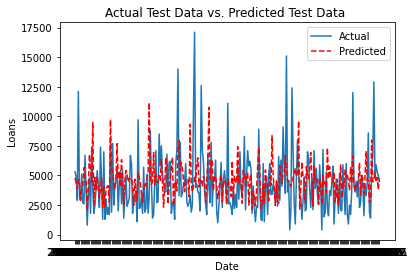

In [47]:
plt.title('Actual Test Data vs. Predicted Test Data ')
plt.plot(test_dataset.index, test_labels)
plt.plot(test_dataset.index, test_predictions, 'r--')
plt.xlabel('Date')
plt.ylabel('Loans')
plt.legend(['Actual', 'Predicted'], loc='upper right')
plt.show()

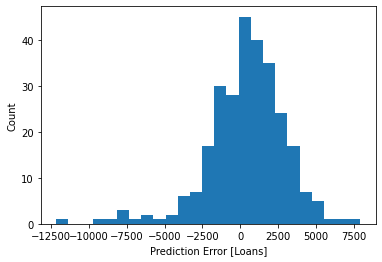

In [48]:
error = test_predictions - test_labels
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [Loans]')
_ = plt.ylabel('Count')
plt.show()

In [49]:
predictions = model.predict(dataset).flatten()

In [50]:
predictions

array([4772.1704, 4959.716 , 4916.0635, ..., 4894.358 , 4837.7046,
       4637.7173], dtype=float32)

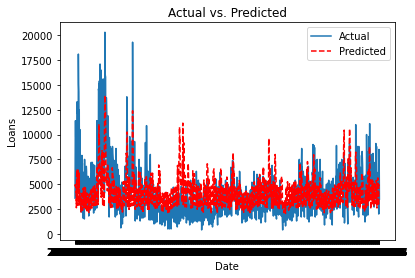

In [51]:
plt.title('Actual vs. Predicted')
plt.plot(knownDates, actualLoans)
plt.plot(knownDates, predictions, 'r--')
plt.xlabel('Date')
plt.ylabel('Loans')
plt.legend(['Actual', 'Predicted'], loc='upper right')
plt.show()

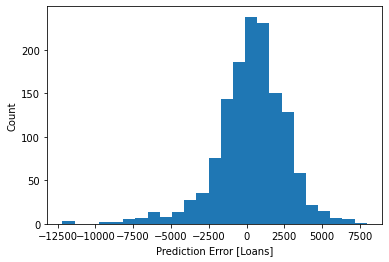

In [52]:
error = predictions - actualLoans
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [Loans]')
_ = plt.ylabel('Count')
plt.show()

In [53]:
model.save('saved model/jupyter/my_model.h5')

In [54]:
new_model = keras.models.load_model('saved model/jupyter/my_model.h5')
new_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 300)               2100      
_________________________________________________________________
dropout_4 (Dropout)          (None, 300)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 90)                27090     
_________________________________________________________________
dropout_5 (Dropout)          (None, 90)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 30)                2730      
_________________________________________________________________
dropout_6 (Dropout)          (None, 30)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 10)               

In [55]:
unknownDatapredictions = model.predict(unknownData).flatten()

In [56]:
unknownDatapredictions

array([ 4477.772 ,  4187.399 ,  2730.2217,  5104.5576,  5192.2036,
        5267.207 ,  5605.887 ,  6020.4023,  6201.2715,  3328.4136,
        5297.3066,  5441.951 ,  5476.6787,  5409.016 ,  4780.4507,
        4442.8506,  2553.8625,  4591.876 ,  4592.1543,  4759.609 ,
        4904.918 ,  4056.3494,  3735.1538,  2402.4294,  5054.7637,
        4988.1055,  4905.9214,  4632.025 ,  4514.9897,  3998.119 ,
        2659.4211,  4792.9873,  4894.2197,  5171.965 ,  5426.0283,
        6118.066 ,  6932.672 ,  3236.069 ,  7306.924 ,  6806.113 ,
        6345.454 ,  6023.6543,  5504.7944,  4881.8003,  2933.2212,
        5596.2803,  5969.0215,  5604.5273,  4895.6675,  4003.8987,
        3688.0046,  2438.1235,  5121.213 ,  5051.92  ,  4341.188 ,
        4235.0005,  4185.2295,  3715.7383,  2631.5417,  5019.0376,
        5011.002 ,  5010.076 ,  4997.3125,  5026.4766,  5183.5664,
        3218.8733,  6190.2886,  5755.3774,  5387.6333,  5082.262 ,
        4655.5293,  5557.8433,  2908.587 ,  4820.1514,  4432.1

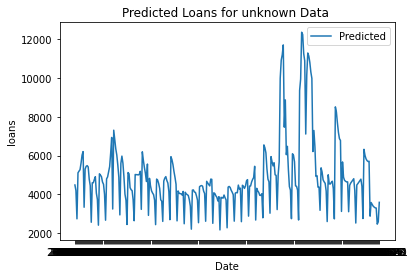

In [57]:
plt.title('Predicted Loans for unknown Data ')
plt.plot(unknownDates, unknownDatapredictions)
plt.xlabel('Date')
plt.ylabel('loans')
plt.legend(['Predicted'], loc='upper right')
plt.show()